# OvO (One verse One)

In [231]:
# One verse Onve(OvO)를 하기 위해 데이터 셋을 3개로 생성
# Novice vs Intermediates(초보자 vs 중급자)
NovIntSkillCraft_df = SkillCraft_df[((SkillCraft_df.LeagueLevel == 0) | (SkillCraft_df.LeagueLevel == 1))].copy()
# Intermediates vs Master(중급자 vs 전문가)
IntMasSkillCraft_df = SkillCraft_df[((SkillCraft_df.LeagueLevel == 1) | (SkillCraft_df.LeagueLevel == 2))].copy()
# Novice vs Master(초보자 vs 전문가)
NovMasSkillCraft_df = SkillCraft_df[((SkillCraft_df.LeagueLevel == 0) | (SkillCraft_df.LeagueLevel == 2))].copy()

In [232]:
NovIntSkillCraft_df.LeagueLevel.unique()

array([1, 0])

In [233]:
IntMasSkillCraft_df.LeagueLevel.unique()

array([1, 2])

In [234]:
NovMasSkillCraft_df.LeagueLevel.unique()

array([0, 2])

## XGBoost : Novice vs Intermediates (초보자 vs 중급자)

### Split train and test

In [235]:
# LeagueLevel에 대해 먼저 나누어 준다.
NovInt_target = NovIntSkillCraft_df.LeagueLevel

In [236]:
# LeagueLevel제거
NovIntSkillCraft_df.drop(['LeagueLevel'], axis=1, inplace=True)

In [237]:
# 라이브러리 임포트
from sklearn.model_selection import train_test_split, cross_val_score

In [238]:
# o과 1의 비율은?
# 0의 비율
sum(NovInt_target == 0) / len(NovInt_target)

0.39425287356321836

In [239]:
# 1의 비율
sum(NovInt_target == 1) / len(NovInt_target)

0.6057471264367816

In [240]:
# 대략 40 : 60
# 별도로 오버샘플링을 하지 않음

In [241]:
# train/test 80 : 20
Fir_X_train, Fir_X_test, Fir_y_train, Fir_y_test = train_test_split(NovIntSkillCraft_df, NovInt_target,
                                                                   test_size = 0.2, shuffle=True,
                                                                   stratify=NovInt_target, random_state=2022)

In [242]:
# train/val 60 : 20 (80을 3:1로 등분한다면?, 0.25 비율 (1/4))
Fir_X_train, Fir_X_val, Fir_y_train, Fir_y_val = train_test_split(Fir_X_train, Fir_y_train,
                                                                   test_size = 0.25, shuffle=True,
                                                                   stratify=Fir_y_train, random_state=2022)

In [243]:
len(Fir_X_train), len(Fir_X_val), len(Fir_X_test)

(1566, 522, 522)

### Modeling : Tuning Guide - GridSearch & Early Stopting

In [435]:
from sklearn.model_selection import GridSearchCV, StratifiedKFold
import xgboost
from xgboost import XGBClassifier
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score,f1_score,recall_score,precision_score, average_precision_score, auc
from sklearn.metrics import roc_auc_score, roc_curve
from sklearn.metrics import precision_recall_curve, plot_precision_recall_curve
from numpy import argmax

In [245]:
# 참고 : https://stackoverflow.com/questions/42993550/gridsearchcv-xgboost-early-stopping/57529837#57529837
# 참고 : https://hwi-doc.tistory.com/entry/%EC%9D%B4%ED%95%B4%ED%95%98%EA%B3%A0-%EC%82%AC%EC%9A%A9%ED%95%98%EC%9E%90-XGBoost
# 참고 : https://www.analyticsvidhya.com/blog/2016/03/complete-guide-parameter-tuning-xgboost-with-codes-python/

In [246]:
learning_rate = [i/10.0 for i in range(1,5)]
n_estimators = [i for i in range(100, 300, 10)]
max_depth = 4
min_child_weight = 1
gamma = 0
subsample = 0.5
colsample_bytree = 0.5

In [247]:
xgb_clf = xgboost.XGBClassifier(use_label_encoder=False, objective = 'binary:logistic')

param_grid = {'booster':['gbtree'], 
              'learning_rate' : learning_rate,
              'n_estimators' : n_estimators,
              'max_depth' : [max_depth],
              'min_child_weight' : [min_child_weight],
              'gamma' : [gamma],
              'subsample' : [subsample],
               'colsample_bytree' : [colsample_bytree]}

fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "auc", 
            "eval_set" : [[Fir_X_val, Fir_y_val]]}


grid_search = GridSearchCV(estimator=xgb_clf, 
                           param_grid=param_grid,
                           n_jobs=-1,
                           cv=list(StratifiedKFold(n_splits=5).split(Fir_X_train, Fir_y_train)))

results=grid_search.fit(Fir_X_train, Fir_y_train, **fit_params)

results.best_params_

[0]	validation_0-auc:0.74782
[0]	validation_0-auc:0.73719
[0]	validation_0-auc:0.70888
[0]	validation_0-auc:0.73972
[0]	validation_0-auc:0.72971
[0]	validation_0-auc:0.70888
[0]	validation_0-auc:0.73972
[1]	validation_0-auc:0.76446
[1]	validation_0-auc:0.78335
[1]	validation_0-auc:0.80119
[1]	validation_0-auc:0.78360
[1]	validation_0-auc:0.77982
[1]	validation_0-auc:0.76446
[1]	validation_0-auc:0.80119
[0]	validation_0-auc:0.73719
[2]	validation_0-auc:0.77929
[2]	validation_0-auc:0.82021
[2]	validation_0-auc:0.79822
[2]	validation_0-auc:0.80342
[2]	validation_0-auc:0.80368
[2]	validation_0-auc:0.77929
[2]	validation_0-auc:0.82021
[1]	validation_0-auc:0.78360
[3]	validation_0-auc:0.79343
[3]	validation_0-auc:0.84095
[3]	validation_0-auc:0.81238
[3]	validation_0-auc:0.84095
[3]	validation_0-auc:0.80558
[3]	validation_0-auc:0.80920
[3]	validation_0-auc:0.79343
[2]	validation_0-auc:0.79822
[4]	validation_0-auc:0.80170
[4]	validation_0-auc:0.82867
[4]	validation_0-auc:0.83957
[4]	validation

[43]	validation_0-auc:0.85803
[42]	validation_0-auc:0.86740
[42]	validation_0-auc:0.85901
[43]	validation_0-auc:0.84504
[42]	validation_0-auc:0.86128
[42]	validation_0-auc:0.84472
[43]	validation_0-auc:0.85803
[42]	validation_0-auc:0.85901
[44]	validation_0-auc:0.85706
[43]	validation_0-auc:0.86858
[43]	validation_0-auc:0.85964
[44]	validation_0-auc:0.84563
[43]	validation_0-auc:0.86184
[43]	validation_0-auc:0.84504
[44]	validation_0-auc:0.85706
[43]	validation_0-auc:0.85964
[44]	validation_0-auc:0.86793
[45]	validation_0-auc:0.85838
[44]	validation_0-auc:0.85918
[45]	validation_0-auc:0.84466
[44]	validation_0-auc:0.86074
[44]	validation_0-auc:0.84563
[45]	validation_0-auc:0.85838
[44]	validation_0-auc:0.85918
[46]	validation_0-auc:0.85810
[45]	validation_0-auc:0.86743
[46]	validation_0-auc:0.84423
[45]	validation_0-auc:0.85945
[45]	validation_0-auc:0.86073
[46]	validation_0-auc:0.85810
[45]	validation_0-auc:0.84466
[45]	validation_0-auc:0.85945
[47]	validation_0-auc:0.85839
[47]	valid

[77]	validation_0-auc:0.85276
[77]	validation_0-auc:0.85531
[76]	validation_0-auc:0.85617
[77]	validation_0-auc:0.86465
[76]	validation_0-auc:0.84113
[78]	validation_0-auc:0.84317
[77]	validation_0-auc:0.85276
[77]	validation_0-auc:0.85666
[78]	validation_0-auc:0.85521
[78]	validation_0-auc:0.85337
[77]	validation_0-auc:0.85531
[78]	validation_0-auc:0.86498
[77]	validation_0-auc:0.84163
[79]	validation_0-auc:0.84216
[78]	validation_0-auc:0.85707
[78]	validation_0-auc:0.85337
[79]	validation_0-auc:0.85250
[79]	validation_0-auc:0.85325
[78]	validation_0-auc:0.85521
[79]	validation_0-auc:0.86429
[80]	validation_0-auc:0.85308
[79]	validation_0-auc:0.85250
[78]	validation_0-auc:0.84317
[79]	validation_0-auc:0.85558
[80]	validation_0-auc:0.85250
[79]	validation_0-auc:0.85325
[80]	validation_0-auc:0.86437
[80]	validation_0-auc:0.85308
[79]	validation_0-auc:0.84216
[81]	validation_0-auc:0.85274
[80]	validation_0-auc:0.85626
[81]	validation_0-auc:0.85351
[80]	validation_0-auc:0.85250
[81]	valid

[20]	validation_0-auc:0.85670
[25]	validation_0-auc:0.85139
[21]	validation_0-auc:0.85511
[38]	validation_0-auc:0.86216
[20]	validation_0-auc:0.86351
[35]	validation_0-auc:0.86603
[28]	validation_0-auc:0.86242
[18]	validation_0-auc:0.85998
[21]	validation_0-auc:0.85650
[26]	validation_0-auc:0.85108
[22]	validation_0-auc:0.85414
[39]	validation_0-auc:0.86168
[21]	validation_0-auc:0.86326
[36]	validation_0-auc:0.86710
[29]	validation_0-auc:0.86154
[22]	validation_0-auc:0.85766
[19]	validation_0-auc:0.85948
[27]	validation_0-auc:0.84878
[40]	validation_0-auc:0.86064
[23]	validation_0-auc:0.85617
[22]	validation_0-auc:0.86320
[30]	validation_0-auc:0.86313
[37]	validation_0-auc:0.86704
[20]	validation_0-auc:0.86156
[23]	validation_0-auc:0.85859
[28]	validation_0-auc:0.84822
[24]	validation_0-auc:0.85544
[41]	validation_0-auc:0.86116
[21]	validation_0-auc:0.86057
[31]	validation_0-auc:0.86285
[38]	validation_0-auc:0.86700
[23]	validation_0-auc:0.86296
[24]	validation_0-auc:0.85918
[29]	valid

[53]	validation_0-auc:0.86658
[52]	validation_0-auc:0.85727
[62]	validation_0-auc:0.85627
[60]	validation_0-auc:0.84329
[73]	validation_0-auc:0.85761
[55]	validation_0-auc:0.86107
[69]	validation_0-auc:0.86571
[55]	validation_0-auc:0.85526
[54]	validation_0-auc:0.86672
[53]	validation_0-auc:0.85743
[63]	validation_0-auc:0.85594
[56]	validation_0-auc:0.85976
[74]	validation_0-auc:0.85726
[61]	validation_0-auc:0.84268
[70]	validation_0-auc:0.86549
[56]	validation_0-auc:0.85491
[55]	validation_0-auc:0.86733
[54]	validation_0-auc:0.85743
[64]	validation_0-auc:0.85710
[57]	validation_0-auc:0.85938
[75]	validation_0-auc:0.85729
[62]	validation_0-auc:0.84335
[57]	validation_0-auc:0.85560
[71]	validation_0-auc:0.86475
[56]	validation_0-auc:0.86683
[55]	validation_0-auc:0.85752
[65]	validation_0-auc:0.85819
[76]	validation_0-auc:0.85580
[58]	validation_0-auc:0.85918
[58]	validation_0-auc:0.85492
[63]	validation_0-auc:0.84331
[72]	validation_0-auc:0.86561
[57]	validation_0-auc:0.86766
[56]	valid

[16]	validation_0-auc:0.85511
[96]	validation_0-auc:0.86245
[3]	validation_0-auc:0.81238
[12]	validation_0-auc:0.85218
[0]	validation_0-auc:0.73972
[0]	validation_0-auc:0.70888
[20]	validation_0-auc:0.85179
[97]	validation_0-auc:0.86148
[17]	validation_0-auc:0.85457
[0]	validation_0-auc:0.73719
[4]	validation_0-auc:0.82867
[21]	validation_0-auc:0.85159
[1]	validation_0-auc:0.80119
[13]	validation_0-auc:0.85645
[1]	validation_0-auc:0.76446
[98]	validation_0-auc:0.86098
[1]	validation_0-auc:0.78360
[18]	validation_0-auc:0.85409
[5]	validation_0-auc:0.83408
[22]	validation_0-auc:0.85045
[2]	validation_0-auc:0.82021
[2]	validation_0-auc:0.77929
[14]	validation_0-auc:0.85554
[99]	validation_0-auc:0.86113
[2]	validation_0-auc:0.79822
[6]	validation_0-auc:0.84528
[19]	validation_0-auc:0.85567
[23]	validation_0-auc:0.85156
[3]	validation_0-auc:0.79343
[15]	validation_0-auc:0.85448
[3]	validation_0-auc:0.84095
[100]	validation_0-auc:0.86104
[20]	validation_0-auc:0.85587
[3]	validation_0-auc:0.8

[37]	validation_0-auc:0.84746
[51]	validation_0-auc:0.86039
[37]	validation_0-auc:0.86044
[41]	validation_0-auc:0.86757
[38]	validation_0-auc:0.85936
[59]	validation_0-auc:0.84377
[55]	validation_0-auc:0.85526
[38]	validation_0-auc:0.84724
[24]	validation_0-auc:0.85918
[38]	validation_0-auc:0.85952
[42]	validation_0-auc:0.86740
[52]	validation_0-auc:0.86010
[39]	validation_0-auc:0.85879
[60]	validation_0-auc:0.84329
[56]	validation_0-auc:0.85491
[39]	validation_0-auc:0.85970
[39]	validation_0-auc:0.84623
[25]	validation_0-auc:0.85905
[43]	validation_0-auc:0.86858
[53]	validation_0-auc:0.85990
[40]	validation_0-auc:0.85958
[61]	validation_0-auc:0.84268
[57]	validation_0-auc:0.85560
[40]	validation_0-auc:0.84468
[40]	validation_0-auc:0.86041
[26]	validation_0-auc:0.86054
[44]	validation_0-auc:0.86793
[54]	validation_0-auc:0.86091
[41]	validation_0-auc:0.85892
[62]	validation_0-auc:0.84335
[58]	validation_0-auc:0.85492
[41]	validation_0-auc:0.84506
[41]	validation_0-auc:0.85975
[27]	valid

[86]	validation_0-auc:0.85578
[12]	validation_0-auc:0.85904
[76]	validation_0-auc:0.86538
[73]	validation_0-auc:0.85637
[73]	validation_0-auc:0.85449
[73]	validation_0-auc:0.84326
[91]	validation_0-auc:0.85094
[59]	validation_0-auc:0.85809
[87]	validation_0-auc:0.85571
[77]	validation_0-auc:0.86465
[74]	validation_0-auc:0.85415
[74]	validation_0-auc:0.84236
[13]	validation_0-auc:0.86010
[74]	validation_0-auc:0.85627
[60]	validation_0-auc:0.85881
[92]	validation_0-auc:0.85151
[88]	validation_0-auc:0.85571
[75]	validation_0-auc:0.85462
[75]	validation_0-auc:0.84114
[78]	validation_0-auc:0.86498
[14]	validation_0-auc:0.86087
[75]	validation_0-auc:0.85690
[61]	validation_0-auc:0.85807
[93]	validation_0-auc:0.85186
[89]	validation_0-auc:0.85569
[76]	validation_0-auc:0.85314
[76]	validation_0-auc:0.84113
[76]	validation_0-auc:0.85617
[79]	validation_0-auc:0.86429
[15]	validation_0-auc:0.86067
[62]	validation_0-auc:0.85755
[94]	validation_0-auc:0.85222
[77]	validation_0-auc:0.85276
[90]	valid

[0]	validation_0-auc:0.70888
[29]	validation_0-auc:0.84870
[31]	validation_0-auc:0.86285
[14]	validation_0-auc:0.86087
[21]	validation_0-auc:0.85650
[5]	validation_0-auc:0.84366
[52]	validation_0-auc:0.86787
[27]	validation_0-auc:0.85512
[1]	validation_0-auc:0.76446
[32]	validation_0-auc:0.86180
[30]	validation_0-auc:0.84873
[15]	validation_0-auc:0.86067
[53]	validation_0-auc:0.86658
[6]	validation_0-auc:0.84218
[22]	validation_0-auc:0.85766
[2]	validation_0-auc:0.77929
[28]	validation_0-auc:0.85635
[33]	validation_0-auc:0.86187
[31]	validation_0-auc:0.84882
[16]	validation_0-auc:0.86226
[23]	validation_0-auc:0.85859
[7]	validation_0-auc:0.84464
[54]	validation_0-auc:0.86672
[29]	validation_0-auc:0.85592
[3]	validation_0-auc:0.79343
[34]	validation_0-auc:0.86053
[32]	validation_0-auc:0.84845
[17]	validation_0-auc:0.86329
[8]	validation_0-auc:0.84487
[30]	validation_0-auc:0.85826
[24]	validation_0-auc:0.85918
[55]	validation_0-auc:0.86733
[35]	validation_0-auc:0.86039
[4]	validation_0-a

[42]	validation_0-auc:0.85872
[67]	validation_0-auc:0.84374
[58]	validation_0-auc:0.85918
[64]	validation_0-auc:0.85549
[89]	validation_0-auc:0.86211
[51]	validation_0-auc:0.86787
[69]	validation_0-auc:0.85635
[37]	validation_0-auc:0.84746
[43]	validation_0-auc:0.85803
[65]	validation_0-auc:0.85563
[68]	validation_0-auc:0.84334
[59]	validation_0-auc:0.85809
[90]	validation_0-auc:0.86203
[52]	validation_0-auc:0.86787
[70]	validation_0-auc:0.85591
[38]	validation_0-auc:0.84724
[44]	validation_0-auc:0.85706
[69]	validation_0-auc:0.84248
[66]	validation_0-auc:0.85575
[60]	validation_0-auc:0.85881
[91]	validation_0-auc:0.86271
[53]	validation_0-auc:0.86658
[71]	validation_0-auc:0.85575
[39]	validation_0-auc:0.84623
[70]	validation_0-auc:0.84263
[45]	validation_0-auc:0.85838
[61]	validation_0-auc:0.85807
[67]	validation_0-auc:0.85549
[92]	validation_0-auc:0.86336
[72]	validation_0-auc:0.85655
[54]	validation_0-auc:0.86672
[40]	validation_0-auc:0.84468
[46]	validation_0-auc:0.85810
[71]	valid

[4]	validation_0-auc:0.83957
[88]	validation_0-auc:0.86276
[15]	validation_0-auc:0.85448
[80]	validation_0-auc:0.85250
[22]	validation_0-auc:0.85414
[96]	validation_0-auc:0.85538
[14]	validation_0-auc:0.86087
[75]	validation_0-auc:0.84114
[89]	validation_0-auc:0.86211
[81]	validation_0-auc:0.85351
[5]	validation_0-auc:0.84366
[97]	validation_0-auc:0.85525
[23]	validation_0-auc:0.85617
[16]	validation_0-auc:0.85647
[15]	validation_0-auc:0.86067
[76]	validation_0-auc:0.84113
[90]	validation_0-auc:0.86203
[6]	validation_0-auc:0.84218
[82]	validation_0-auc:0.85388
[17]	validation_0-auc:0.85526
[24]	validation_0-auc:0.85544
[16]	validation_0-auc:0.86226
[77]	validation_0-auc:0.84163
[91]	validation_0-auc:0.86271
[7]	validation_0-auc:0.84464
[83]	validation_0-auc:0.85409
[0]	validation_0-auc:0.70888
[25]	validation_0-auc:0.85583
[18]	validation_0-auc:0.85687
[17]	validation_0-auc:0.86329
[78]	validation_0-auc:0.84317
[92]	validation_0-auc:0.86336
[1]	validation_0-auc:0.76446
[8]	validation_0

[41]	validation_0-auc:0.85892
[29]	validation_0-auc:0.85592
[14]	validation_0-auc:0.86087
[25]	validation_0-auc:0.85905
[60]	validation_0-auc:0.85512
[50]	validation_0-auc:0.86806
[34]	validation_0-auc:0.84767
[53]	validation_0-auc:0.85990
[42]	validation_0-auc:0.85872
[30]	validation_0-auc:0.85826
[15]	validation_0-auc:0.86067
[61]	validation_0-auc:0.85532
[51]	validation_0-auc:0.86787
[26]	validation_0-auc:0.86054
[35]	validation_0-auc:0.84795
[54]	validation_0-auc:0.86091
[43]	validation_0-auc:0.85803
[16]	validation_0-auc:0.86226
[31]	validation_0-auc:0.85941
[62]	validation_0-auc:0.85571
[52]	validation_0-auc:0.86787
[27]	validation_0-auc:0.86077
[55]	validation_0-auc:0.86107
[36]	validation_0-auc:0.84732
[44]	validation_0-auc:0.85706
[32]	validation_0-auc:0.85870
[63]	validation_0-auc:0.85560
[17]	validation_0-auc:0.86329
[53]	validation_0-auc:0.86658
[28]	validation_0-auc:0.86099
[56]	validation_0-auc:0.85976
[37]	validation_0-auc:0.84746
[45]	validation_0-auc:0.85838
[33]	valid

[0]	validation_0-auc:0.73972
[87]	validation_0-auc:0.86219
[63]	validation_0-auc:0.85875
[91]	validation_0-auc:0.85505
[79]	validation_0-auc:0.85325
[72]	validation_0-auc:0.84406
[67]	validation_0-auc:0.85549
[51]	validation_0-auc:0.86787
[1]	validation_0-auc:0.80119
[88]	validation_0-auc:0.86276
[80]	validation_0-auc:0.85250
[64]	validation_0-auc:0.85889
[92]	validation_0-auc:0.85478
[68]	validation_0-auc:0.85521
[73]	validation_0-auc:0.84326
[52]	validation_0-auc:0.86787
[2]	validation_0-auc:0.82021
[81]	validation_0-auc:0.85351
[89]	validation_0-auc:0.86211
[93]	validation_0-auc:0.85500
[69]	validation_0-auc:0.85452
[65]	validation_0-auc:0.85887
[74]	validation_0-auc:0.84236
[53]	validation_0-auc:0.86658
[3]	validation_0-auc:0.84095
[90]	validation_0-auc:0.86203
[82]	validation_0-auc:0.85388
[66]	validation_0-auc:0.85876
[94]	validation_0-auc:0.85541
[70]	validation_0-auc:0.85428
[75]	validation_0-auc:0.84114
[54]	validation_0-auc:0.86672
[71]	validation_0-auc:0.85451
[4]	validation

[5]	validation_0-auc:0.81329
[40]	validation_0-auc:0.85958
[91]	validation_0-auc:0.86271
[27]	validation_0-auc:0.86077
[16]	validation_0-auc:0.86226
[30]	validation_0-auc:0.85826
[10]	validation_0-auc:0.84703
[32]	validation_0-auc:0.84845
[6]	validation_0-auc:0.81531
[92]	validation_0-auc:0.86336
[41]	validation_0-auc:0.85892
[28]	validation_0-auc:0.86099
[17]	validation_0-auc:0.86329
[11]	validation_0-auc:0.85030
[31]	validation_0-auc:0.85941
[33]	validation_0-auc:0.84822
[42]	validation_0-auc:0.85872
[7]	validation_0-auc:0.82175
[93]	validation_0-auc:0.86299
[29]	validation_0-auc:0.86084
[18]	validation_0-auc:0.86469
[12]	validation_0-auc:0.85421
[32]	validation_0-auc:0.85870
[34]	validation_0-auc:0.84767
[8]	validation_0-auc:0.81791
[43]	validation_0-auc:0.85803
[30]	validation_0-auc:0.86230
[94]	validation_0-auc:0.86228
[19]	validation_0-auc:0.86438
[33]	validation_0-auc:0.86041
[35]	validation_0-auc:0.84795
[13]	validation_0-auc:0.85398
[9]	validation_0-auc:0.82332
[44]	validation

[68]	validation_0-auc:0.85521
[48]	validation_0-auc:0.85912
[54]	validation_0-auc:0.86672
[19]	validation_0-auc:0.85567
[67]	validation_0-auc:0.85881
[71]	validation_0-auc:0.84365
[80]	validation_0-auc:0.85250
[44]	validation_0-auc:0.84563
[69]	validation_0-auc:0.85452
[49]	validation_0-auc:0.85859
[68]	validation_0-auc:0.85767
[55]	validation_0-auc:0.86733
[20]	validation_0-auc:0.85587
[72]	validation_0-auc:0.84406
[70]	validation_0-auc:0.85428
[81]	validation_0-auc:0.85351
[45]	validation_0-auc:0.84466
[50]	validation_0-auc:0.85824
[69]	validation_0-auc:0.85796
[56]	validation_0-auc:0.86683
[21]	validation_0-auc:0.85511
[71]	validation_0-auc:0.85451
[73]	validation_0-auc:0.84326
[46]	validation_0-auc:0.84423
[82]	validation_0-auc:0.85388
[51]	validation_0-auc:0.85744
[70]	validation_0-auc:0.85740
[72]	validation_0-auc:0.85418
[57]	validation_0-auc:0.86766
[22]	validation_0-auc:0.85414
[74]	validation_0-auc:0.84236
[47]	validation_0-auc:0.84445
[83]	validation_0-auc:0.85409
[52]	valid

[25]	validation_0-auc:0.85905
[8]	validation_0-auc:0.84487
[25]	validation_0-auc:0.86283
[86]	validation_0-auc:0.85359
[0]	validation_0-auc:0.73719
[6]	validation_0-auc:0.81531
[57]	validation_0-auc:0.85560
[92]	validation_0-auc:0.86336
[26]	validation_0-auc:0.86054
[9]	validation_0-auc:0.84415
[87]	validation_0-auc:0.85411
[26]	validation_0-auc:0.86397
[1]	validation_0-auc:0.78360
[93]	validation_0-auc:0.86299
[7]	validation_0-auc:0.82175
[58]	validation_0-auc:0.85492
[27]	validation_0-auc:0.86077
[10]	validation_0-auc:0.84703
[88]	validation_0-auc:0.85412
[27]	validation_0-auc:0.86501
[2]	validation_0-auc:0.79822
[94]	validation_0-auc:0.86228
[8]	validation_0-auc:0.81791
[59]	validation_0-auc:0.85443
[11]	validation_0-auc:0.85030
[28]	validation_0-auc:0.86099
[89]	validation_0-auc:0.85449
[28]	validation_0-auc:0.86675
[3]	validation_0-auc:0.80558
[95]	validation_0-auc:0.86164
[60]	validation_0-auc:0.85512
[9]	validation_0-auc:0.82332
[29]	validation_0-auc:0.86084
[12]	validation_0-au

[21]	validation_0-auc:0.86326
[50]	validation_0-auc:0.85824
[41]	validation_0-auc:0.85975
[1]	validation_0-auc:0.80119
[47]	validation_0-auc:0.84445
[68]	validation_0-auc:0.85767
[67]	validation_0-auc:0.86760
[35]	validation_0-auc:0.86105
[22]	validation_0-auc:0.86320
[51]	validation_0-auc:0.85744
[42]	validation_0-auc:0.85901
[69]	validation_0-auc:0.85796
[2]	validation_0-auc:0.82021
[48]	validation_0-auc:0.84454
[68]	validation_0-auc:0.86661
[36]	validation_0-auc:0.86041
[70]	validation_0-auc:0.85740
[23]	validation_0-auc:0.86296
[52]	validation_0-auc:0.85727
[43]	validation_0-auc:0.85964
[49]	validation_0-auc:0.84518
[3]	validation_0-auc:0.84095
[69]	validation_0-auc:0.86571
[37]	validation_0-auc:0.86276
[71]	validation_0-auc:0.85855
[24]	validation_0-auc:0.86359
[53]	validation_0-auc:0.85743
[50]	validation_0-auc:0.84448
[44]	validation_0-auc:0.85918
[4]	validation_0-auc:0.83957
[38]	validation_0-auc:0.86216
[70]	validation_0-auc:0.86549
[51]	validation_0-auc:0.84401
[54]	validatio

[57]	validation_0-auc:0.86766
[71]	validation_0-auc:0.85855
[37]	validation_0-auc:0.86001
[103]	validation_0-auc:0.86039
[87]	validation_0-auc:0.85411
[2]	validation_0-auc:0.79822
[6]	validation_0-auc:0.81531
[79]	validation_0-auc:0.85250
[58]	validation_0-auc:0.86836
[72]	validation_0-auc:0.85836
[38]	validation_0-auc:0.85936
[104]	validation_0-auc:0.85967
[88]	validation_0-auc:0.85412
[80]	validation_0-auc:0.85308
[3]	validation_0-auc:0.80558
[7]	validation_0-auc:0.82175
[59]	validation_0-auc:0.86896
[73]	validation_0-auc:0.85761
[105]	validation_0-auc:0.85984
[39]	validation_0-auc:0.85879
[89]	validation_0-auc:0.85449
[81]	validation_0-auc:0.85274
[8]	validation_0-auc:0.81791
[4]	validation_0-auc:0.81729
[60]	validation_0-auc:0.86870
[74]	validation_0-auc:0.85726
[106]	validation_0-auc:0.85952
[40]	validation_0-auc:0.85958
[82]	validation_0-auc:0.85191
[5]	validation_0-auc:0.82493
[61]	validation_0-auc:0.86843
[9]	validation_0-auc:0.82332
[75]	validation_0-auc:0.85729
[107]	validati

[21]	validation_0-auc:0.86057
[46]	validation_0-auc:0.84423
[13]	validation_0-auc:0.84239
[99]	validation_0-auc:0.86113
[36]	validation_0-auc:0.86041
[79]	validation_0-auc:0.85325
[33]	validation_0-auc:0.86760
[22]	validation_0-auc:0.86087
[43]	validation_0-auc:0.85964
[14]	validation_0-auc:0.84374
[47]	validation_0-auc:0.84445
[100]	validation_0-auc:0.86104
[37]	validation_0-auc:0.86276
[80]	validation_0-auc:0.85250
[34]	validation_0-auc:0.86777
[23]	validation_0-auc:0.86085
[44]	validation_0-auc:0.85918
[48]	validation_0-auc:0.84454
[15]	validation_0-auc:0.84334
[101]	validation_0-auc:0.86070
[38]	validation_0-auc:0.86216
[81]	validation_0-auc:0.85351
[35]	validation_0-auc:0.86603
[24]	validation_0-auc:0.85932
[45]	validation_0-auc:0.85945
[49]	validation_0-auc:0.84518
[16]	validation_0-auc:0.84438
[102]	validation_0-auc:0.86005
[39]	validation_0-auc:0.86168
[36]	validation_0-auc:0.86710
[82]	validation_0-auc:0.85388
[25]	validation_0-auc:0.86085
[50]	validation_0-auc:0.84448
[46]	va

[3]	validation_0-auc:0.81238
[72]	validation_0-auc:0.86561
[25]	validation_0-auc:0.85905
[26]	validation_0-auc:0.85600
[76]	validation_0-auc:0.85580
[52]	validation_0-auc:0.84386
[83]	validation_0-auc:0.85199
[61]	validation_0-auc:0.85629
[4]	validation_0-auc:0.82867
[73]	validation_0-auc:0.86567
[26]	validation_0-auc:0.86054
[27]	validation_0-auc:0.85512
[84]	validation_0-auc:0.85203
[53]	validation_0-auc:0.84385
[77]	validation_0-auc:0.85666
[62]	validation_0-auc:0.85627
[74]	validation_0-auc:0.86546
[5]	validation_0-auc:0.83408
[27]	validation_0-auc:0.86077
[78]	validation_0-auc:0.85707
[28]	validation_0-auc:0.85635
[85]	validation_0-auc:0.85174
[54]	validation_0-auc:0.84368
[63]	validation_0-auc:0.85594
[75]	validation_0-auc:0.86537
[6]	validation_0-auc:0.84528
[29]	validation_0-auc:0.85592
[86]	validation_0-auc:0.85214
[28]	validation_0-auc:0.86099
[79]	validation_0-auc:0.85558
[55]	validation_0-auc:0.84308
[64]	validation_0-auc:0.85710
[7]	validation_0-auc:0.84484
[76]	validation

[11]	validation_0-auc:0.84591
[68]	validation_0-auc:0.85521
[44]	validation_0-auc:0.86793
[26]	validation_0-auc:0.86015
[11]	validation_0-auc:0.85006
[68]	validation_0-auc:0.85767
[4]	validation_0-auc:0.82867
[19]	validation_0-auc:0.85025
[12]	validation_0-auc:0.85010
[69]	validation_0-auc:0.85452
[45]	validation_0-auc:0.86743
[69]	validation_0-auc:0.85796
[27]	validation_0-auc:0.86074
[5]	validation_0-auc:0.83408
[12]	validation_0-auc:0.85218
[70]	validation_0-auc:0.85428
[20]	validation_0-auc:0.85179
[13]	validation_0-auc:0.85168
[46]	validation_0-auc:0.86813
[70]	validation_0-auc:0.85740
[71]	validation_0-auc:0.85451
[28]	validation_0-auc:0.86242
[6]	validation_0-auc:0.84528
[13]	validation_0-auc:0.85645
[21]	validation_0-auc:0.85159
[14]	validation_0-auc:0.85260
[47]	validation_0-auc:0.86790
[72]	validation_0-auc:0.85418
[71]	validation_0-auc:0.85855
[29]	validation_0-auc:0.86154
[7]	validation_0-auc:0.84484
[22]	validation_0-auc:0.85045
[14]	validation_0-auc:0.85554
[15]	validatio

[87]	validation_0-auc:0.86219
[53]	validation_0-auc:0.85990
[45]	validation_0-auc:0.86743
[12]	validation_0-auc:0.83768
[13]	validation_0-auc:0.85398
[69]	validation_0-auc:0.85635
[54]	validation_0-auc:0.85640
[61]	validation_0-auc:0.84268
[88]	validation_0-auc:0.86276
[54]	validation_0-auc:0.86091
[46]	validation_0-auc:0.86813
[14]	validation_0-auc:0.85385
[13]	validation_0-auc:0.84239
[55]	validation_0-auc:0.85526
[70]	validation_0-auc:0.85591
[62]	validation_0-auc:0.84335
[55]	validation_0-auc:0.86107
[89]	validation_0-auc:0.86211
[47]	validation_0-auc:0.86790
[14]	validation_0-auc:0.84374
[15]	validation_0-auc:0.85600
[56]	validation_0-auc:0.85491
[71]	validation_0-auc:0.85575
[90]	validation_0-auc:0.86203
[56]	validation_0-auc:0.85976
[63]	validation_0-auc:0.84331
[48]	validation_0-auc:0.86876
[16]	validation_0-auc:0.85615
[15]	validation_0-auc:0.84334
[57]	validation_0-auc:0.85560
[72]	validation_0-auc:0.85655
[91]	validation_0-auc:0.86271
[57]	validation_0-auc:0.85938
[64]	valid

[94]	validation_0-auc:0.85541
[16]	validation_0-auc:0.85647
[16]	validation_0-auc:0.86226
[86]	validation_0-auc:0.86102
[97]	validation_0-auc:0.85299
[19]	validation_0-auc:0.85567
[53]	validation_0-auc:0.84385
[55]	validation_0-auc:0.85752
[95]	validation_0-auc:0.85534
[17]	validation_0-auc:0.85526
[87]	validation_0-auc:0.86219
[17]	validation_0-auc:0.86329
[20]	validation_0-auc:0.85587
[54]	validation_0-auc:0.84368
[56]	validation_0-auc:0.85646
[96]	validation_0-auc:0.85538
[18]	validation_0-auc:0.85687
[88]	validation_0-auc:0.86276
[18]	validation_0-auc:0.86469
[21]	validation_0-auc:0.85511
[57]	validation_0-auc:0.85646
[55]	validation_0-auc:0.84308
[0]	validation_0-auc:0.73972
[19]	validation_0-auc:0.85693
[19]	validation_0-auc:0.86438
[89]	validation_0-auc:0.86211
[22]	validation_0-auc:0.85414
[56]	validation_0-auc:0.84388
[58]	validation_0-auc:0.85669
[1]	validation_0-auc:0.80119
[20]	validation_0-auc:0.85670
[90]	validation_0-auc:0.86203
[20]	validation_0-auc:0.86351
[23]	validat

[58]	validation_0-auc:0.86836
[59]	validation_0-auc:0.85809
[17]	validation_0-auc:0.85457
[62]	validation_0-auc:0.85571
[13]	validation_0-auc:0.85645
[5]	validation_0-auc:0.83408
[37]	validation_0-auc:0.84746
[40]	validation_0-auc:0.85958
[59]	validation_0-auc:0.86896
[60]	validation_0-auc:0.85881
[63]	validation_0-auc:0.85560
[18]	validation_0-auc:0.85409
[6]	validation_0-auc:0.84528
[14]	validation_0-auc:0.85554
[38]	validation_0-auc:0.84724
[41]	validation_0-auc:0.85892
[61]	validation_0-auc:0.85807
[60]	validation_0-auc:0.86870
[64]	validation_0-auc:0.85549
[19]	validation_0-auc:0.85567
[42]	validation_0-auc:0.85872
[7]	validation_0-auc:0.84484
[15]	validation_0-auc:0.85448
[39]	validation_0-auc:0.84623
[62]	validation_0-auc:0.85755
[61]	validation_0-auc:0.86843
[65]	validation_0-auc:0.85563
[43]	validation_0-auc:0.85803
[20]	validation_0-auc:0.85587
[8]	validation_0-auc:0.84776
[40]	validation_0-auc:0.84468
[16]	validation_0-auc:0.85647
[63]	validation_0-auc:0.85875
[66]	validatio

[81]	validation_0-auc:0.85351
[78]	validation_0-auc:0.84317
[99]	validation_0-auc:0.86113
[5]	validation_0-auc:0.84366
[1]	validation_0-auc:0.76446
[45]	validation_0-auc:0.86743
[58]	validation_0-auc:0.85492
[54]	validation_0-auc:0.86091
[82]	validation_0-auc:0.85388
[79]	validation_0-auc:0.84216
[100]	validation_0-auc:0.86104
[2]	validation_0-auc:0.77929
[6]	validation_0-auc:0.84218
[55]	validation_0-auc:0.86107
[46]	validation_0-auc:0.86813
[59]	validation_0-auc:0.85443
[83]	validation_0-auc:0.85409
[80]	validation_0-auc:0.84243
[101]	validation_0-auc:0.86070
[3]	validation_0-auc:0.79343
[56]	validation_0-auc:0.85976
[7]	validation_0-auc:0.84464
[47]	validation_0-auc:0.86790
[60]	validation_0-auc:0.85512
[84]	validation_0-auc:0.85392
[102]	validation_0-auc:0.86005
[57]	validation_0-auc:0.85938
[4]	validation_0-auc:0.80170
[8]	validation_0-auc:0.84487
[61]	validation_0-auc:0.85532
[48]	validation_0-auc:0.86876
[0]	validation_0-auc:0.73719
[85]	validation_0-auc:0.85411
[103]	validation

[36]	validation_0-auc:0.84732
[96]	validation_0-auc:0.85266
[41]	validation_0-auc:0.85892
[25]	validation_0-auc:0.85905
[91]	validation_0-auc:0.85505
[32]	validation_0-auc:0.85870
[24]	validation_0-auc:0.86359
[82]	validation_0-auc:0.86376
[97]	validation_0-auc:0.85299
[42]	validation_0-auc:0.85872
[37]	validation_0-auc:0.84746
[26]	validation_0-auc:0.86054
[92]	validation_0-auc:0.85478
[33]	validation_0-auc:0.86041
[25]	validation_0-auc:0.86283
[83]	validation_0-auc:0.86333
[43]	validation_0-auc:0.85803
[38]	validation_0-auc:0.84724
[93]	validation_0-auc:0.85500
[27]	validation_0-auc:0.86077
[34]	validation_0-auc:0.85907
[26]	validation_0-auc:0.86397
[84]	validation_0-auc:0.86191
[44]	validation_0-auc:0.85706
[39]	validation_0-auc:0.84623
[0]	validation_0-auc:0.73972
[94]	validation_0-auc:0.85541
[28]	validation_0-auc:0.86099
[27]	validation_0-auc:0.86501
[35]	validation_0-auc:0.85912
[85]	validation_0-auc:0.86142
[45]	validation_0-auc:0.85838
[40]	validation_0-auc:0.84468
[29]	valida

[65]	validation_0-auc:0.85887
[72]	validation_0-auc:0.85418
[63]	validation_0-auc:0.86720
[77]	validation_0-auc:0.84163
[10]	validation_0-auc:0.84453
[31]	validation_0-auc:0.84882
[37]	validation_0-auc:0.86001
[82]	validation_0-auc:0.85388
[73]	validation_0-auc:0.85449
[66]	validation_0-auc:0.85876
[64]	validation_0-auc:0.86833
[78]	validation_0-auc:0.84317
[11]	validation_0-auc:0.84591
[83]	validation_0-auc:0.85409
[32]	validation_0-auc:0.84845
[38]	validation_0-auc:0.85936
[74]	validation_0-auc:0.85415
[67]	validation_0-auc:0.85881
[65]	validation_0-auc:0.86821
[79]	validation_0-auc:0.84216
[12]	validation_0-auc:0.85010
[33]	validation_0-auc:0.84822
[75]	validation_0-auc:0.85462
[84]	validation_0-auc:0.85392
[68]	validation_0-auc:0.85767
[39]	validation_0-auc:0.85879
[66]	validation_0-auc:0.86753
[80]	validation_0-auc:0.84243
[85]	validation_0-auc:0.85411
[76]	validation_0-auc:0.85314
[13]	validation_0-auc:0.85168
[34]	validation_0-auc:0.84767
[69]	validation_0-auc:0.85796
[40]	valid

[37]	validation_0-auc:0.86276
[52]	validation_0-auc:0.85827
[31]	validation_0-auc:0.86615
[17]	validation_0-auc:0.85842
[9]	validation_0-auc:0.82332
[74]	validation_0-auc:0.84236
[106]	validation_0-auc:0.85952
[80]	validation_0-auc:0.85250
[38]	validation_0-auc:0.86216
[53]	validation_0-auc:0.85750
[32]	validation_0-auc:0.86654
[18]	validation_0-auc:0.85998
[10]	validation_0-auc:0.83017
[81]	validation_0-auc:0.85351
[75]	validation_0-auc:0.84114
[107]	validation_0-auc:0.86102
[39]	validation_0-auc:0.86168
[54]	validation_0-auc:0.85640
[33]	validation_0-auc:0.86760
[19]	validation_0-auc:0.85948
[11]	validation_0-auc:0.83553
[76]	validation_0-auc:0.84113
[82]	validation_0-auc:0.85388
[108]	validation_0-auc:0.86154
[40]	validation_0-auc:0.86064
[55]	validation_0-auc:0.85526
[34]	validation_0-auc:0.86777
[20]	validation_0-auc:0.86156
[77]	validation_0-auc:0.84163
[83]	validation_0-auc:0.85409
[12]	validation_0-auc:0.83768
[41]	validation_0-auc:0.86116
[56]	validation_0-auc:0.85491
[21]	val

[95]	validation_0-auc:0.85268
[58]	validation_0-auc:0.85669
[72]	validation_0-auc:0.86561
[28]	validation_0-auc:0.86675
[79]	validation_0-auc:0.85558
[50]	validation_0-auc:0.84448
[32]	validation_0-auc:0.86187
[35]	validation_0-auc:0.85912
[96]	validation_0-auc:0.85266
[59]	validation_0-auc:0.85652
[73]	validation_0-auc:0.86567
[29]	validation_0-auc:0.86687
[51]	validation_0-auc:0.84401
[80]	validation_0-auc:0.85626
[33]	validation_0-auc:0.86159
[36]	validation_0-auc:0.85861
[60]	validation_0-auc:0.85724
[74]	validation_0-auc:0.86546
[30]	validation_0-auc:0.86611
[52]	validation_0-auc:0.84386
[81]	validation_0-auc:0.85660
[34]	validation_0-auc:0.86064
[37]	validation_0-auc:0.86044
[61]	validation_0-auc:0.85629
[75]	validation_0-auc:0.86537
[53]	validation_0-auc:0.84385
[31]	validation_0-auc:0.86615
[82]	validation_0-auc:0.85609
[38]	validation_0-auc:0.85952
[35]	validation_0-auc:0.86105
[62]	validation_0-auc:0.85627
[0]	validation_0-auc:0.73972
[76]	validation_0-auc:0.86538
[83]	valida

[78]	validation_0-auc:0.85337
[8]	validation_0-auc:0.84371
[38]	validation_0-auc:0.85936
[70]	validation_0-auc:0.86549
[10]	validation_0-auc:0.84453
[75]	validation_0-auc:0.85729
[21]	validation_0-auc:0.85159
[3]	validation_0-auc:0.81238
[79]	validation_0-auc:0.85250
[39]	validation_0-auc:0.85879
[11]	validation_0-auc:0.84591
[9]	validation_0-auc:0.84676
[71]	validation_0-auc:0.86475
[22]	validation_0-auc:0.85045
[76]	validation_0-auc:0.85580
[4]	validation_0-auc:0.82867
[80]	validation_0-auc:0.85308
[40]	validation_0-auc:0.85958
[12]	validation_0-auc:0.85010
[72]	validation_0-auc:0.86561
[10]	validation_0-auc:0.84718
[23]	validation_0-auc:0.85156
[77]	validation_0-auc:0.85666
[5]	validation_0-auc:0.83408
[81]	validation_0-auc:0.85274
[41]	validation_0-auc:0.85892
[13]	validation_0-auc:0.85168
[73]	validation_0-auc:0.86567
[24]	validation_0-auc:0.85108
[11]	validation_0-auc:0.85006
[78]	validation_0-auc:0.85707
[6]	validation_0-auc:0.84528
[82]	validation_0-auc:0.85191
[42]	validation_

[3]	validation_0-auc:0.81902
[83]	validation_0-auc:0.85409
[54]	validation_0-auc:0.85640
[52]	validation_0-auc:0.86010
[66]	validation_0-auc:0.84392
[20]	validation_0-auc:0.84584
[46]	validation_0-auc:0.86813
[25]	validation_0-auc:0.86360
[55]	validation_0-auc:0.85526
[4]	validation_0-auc:0.82461
[84]	validation_0-auc:0.85392
[53]	validation_0-auc:0.85990
[67]	validation_0-auc:0.84374
[47]	validation_0-auc:0.86790
[21]	validation_0-auc:0.84468
[26]	validation_0-auc:0.86316
[85]	validation_0-auc:0.85411
[56]	validation_0-auc:0.85491
[5]	validation_0-auc:0.83454
[54]	validation_0-auc:0.86091
[68]	validation_0-auc:0.84334
[48]	validation_0-auc:0.86876
[22]	validation_0-auc:0.84550
[27]	validation_0-auc:0.86415
[86]	validation_0-auc:0.85359
[57]	validation_0-auc:0.85560
[55]	validation_0-auc:0.86107
[6]	validation_0-auc:0.83847
[69]	validation_0-auc:0.84248
[49]	validation_0-auc:0.86912
[23]	validation_0-auc:0.84574
[87]	validation_0-auc:0.85411
[28]	validation_0-auc:0.86362
[58]	validatio

[47]	validation_0-auc:0.84876
[68]	validation_0-auc:0.84640
[35]	validation_0-auc:0.84898
[26]	validation_0-auc:0.85285
[64]	validation_0-auc:0.83607
[89]	validation_0-auc:0.86211
[1]	validation_0-auc:0.80289
[48]	validation_0-auc:0.84870
[69]	validation_0-auc:0.84678
[36]	validation_0-auc:0.84876
[90]	validation_0-auc:0.86203
[27]	validation_0-auc:0.85276
[65]	validation_0-auc:0.83580
[2]	validation_0-auc:0.82083
[49]	validation_0-auc:0.84911
[70]	validation_0-auc:0.84618
[0]	validation_0-auc:0.70888
[91]	validation_0-auc:0.86271
[66]	validation_0-auc:0.83707
[37]	validation_0-auc:0.85133
[28]	validation_0-auc:0.85091
[3]	validation_0-auc:0.84448
[50]	validation_0-auc:0.84891
[71]	validation_0-auc:0.84486
[38]	validation_0-auc:0.85103
[67]	validation_0-auc:0.83727
[92]	validation_0-auc:0.86336
[1]	validation_0-auc:0.79119
[29]	validation_0-auc:0.85097
[51]	validation_0-auc:0.84802
[4]	validation_0-auc:0.84837
[39]	validation_0-auc:0.85056
[68]	validation_0-auc:0.83715
[2]	validation_0

[19]	validation_0-auc:0.85297
[3]	validation_0-auc:0.84448
[36]	validation_0-auc:0.85452
[90]	validation_0-auc:0.84040
[7]	validation_0-auc:0.83720
[43]	validation_0-auc:0.85664
[40]	validation_0-auc:0.85243
[68]	validation_0-auc:0.83755
[4]	validation_0-auc:0.84837
[20]	validation_0-auc:0.85171
[37]	validation_0-auc:0.85609
[91]	validation_0-auc:0.84019
[8]	validation_0-auc:0.84023
[44]	validation_0-auc:0.85552
[41]	validation_0-auc:0.85182
[69]	validation_0-auc:0.83719
[21]	validation_0-auc:0.85449
[5]	validation_0-auc:0.85281
[38]	validation_0-auc:0.85403
[9]	validation_0-auc:0.84480
[92]	validation_0-auc:0.84165
[42]	validation_0-auc:0.85220
[45]	validation_0-auc:0.85584
[70]	validation_0-auc:0.83557
[39]	validation_0-auc:0.85382
[22]	validation_0-auc:0.85339
[6]	validation_0-auc:0.86019
[43]	validation_0-auc:0.85044
[10]	validation_0-auc:0.84621
[71]	validation_0-auc:0.83600
[46]	validation_0-auc:0.85443
[40]	validation_0-auc:0.85107
[23]	validation_0-auc:0.85426
[7]	validation_0-

[48]	validation_0-auc:0.85285
[79]	validation_0-auc:0.84085
[29]	validation_0-auc:0.85382
[83]	validation_0-auc:0.83231
[36]	validation_0-auc:0.85162
[62]	validation_0-auc:0.84259
[46]	validation_0-auc:0.85443
[10]	validation_0-auc:0.84703
[80]	validation_0-auc:0.83979
[49]	validation_0-auc:0.85374
[30]	validation_0-auc:0.85233
[84]	validation_0-auc:0.83185
[63]	validation_0-auc:0.84400
[11]	validation_0-auc:0.84967
[37]	validation_0-auc:0.85334
[47]	validation_0-auc:0.85428
[81]	validation_0-auc:0.83936
[50]	validation_0-auc:0.85294
[31]	validation_0-auc:0.85478
[38]	validation_0-auc:0.85303
[64]	validation_0-auc:0.84540
[85]	validation_0-auc:0.83294
[12]	validation_0-auc:0.85454
[48]	validation_0-auc:0.85408
[82]	validation_0-auc:0.83842
[51]	validation_0-auc:0.85343
[32]	validation_0-auc:0.85561
[39]	validation_0-auc:0.85319
[13]	validation_0-auc:0.85182
[65]	validation_0-auc:0.84484
[86]	validation_0-auc:0.83339
[49]	validation_0-auc:0.85225
[52]	validation_0-auc:0.85210
[83]	valid

[19]	validation_0-auc:0.84720
[66]	validation_0-auc:0.84068
[4]	validation_0-auc:0.83955
[21]	validation_0-auc:0.86322
[73]	validation_0-auc:0.83429
[47]	validation_0-auc:0.84520
[23]	validation_0-auc:0.85466
[8]	validation_0-auc:0.83798
[20]	validation_0-auc:0.84584
[22]	validation_0-auc:0.86355
[67]	validation_0-auc:0.84189
[74]	validation_0-auc:0.83252
[5]	validation_0-auc:0.84377
[48]	validation_0-auc:0.84721
[24]	validation_0-auc:0.85489
[9]	validation_0-auc:0.84187
[21]	validation_0-auc:0.84468
[23]	validation_0-auc:0.86243
[75]	validation_0-auc:0.83242
[68]	validation_0-auc:0.84217
[6]	validation_0-auc:0.84954
[49]	validation_0-auc:0.84686
[25]	validation_0-auc:0.85230
[22]	validation_0-auc:0.84550
[10]	validation_0-auc:0.84030
[24]	validation_0-auc:0.86222
[69]	validation_0-auc:0.84147
[76]	validation_0-auc:0.83171
[7]	validation_0-auc:0.84618
[50]	validation_0-auc:0.84735
[26]	validation_0-auc:0.85285
[23]	validation_0-auc:0.84574
[11]	validation_0-auc:0.84249
[25]	validation_

[56]	validation_0-auc:0.84417
[9]	validation_0-auc:0.86068
[58]	validation_0-auc:0.85216
[45]	validation_0-auc:0.84919
[60]	validation_0-auc:0.84145
[42]	validation_0-auc:0.84643
[8]	validation_0-auc:0.83207
[11]	validation_0-auc:0.85241
[57]	validation_0-auc:0.84400
[10]	validation_0-auc:0.86276
[59]	validation_0-auc:0.85144
[61]	validation_0-auc:0.84022
[46]	validation_0-auc:0.84764
[43]	validation_0-auc:0.84552
[58]	validation_0-auc:0.84401
[12]	validation_0-auc:0.85435
[9]	validation_0-auc:0.83805
[11]	validation_0-auc:0.86459
[60]	validation_0-auc:0.85084
[62]	validation_0-auc:0.83912
[47]	validation_0-auc:0.84876
[44]	validation_0-auc:0.84383
[59]	validation_0-auc:0.84137
[10]	validation_0-auc:0.83928
[13]	validation_0-auc:0.85451
[12]	validation_0-auc:0.86583
[63]	validation_0-auc:0.83873
[61]	validation_0-auc:0.84950
[48]	validation_0-auc:0.84870
[60]	validation_0-auc:0.84050
[45]	validation_0-auc:0.84458
[14]	validation_0-auc:0.85406
[11]	validation_0-auc:0.84126
[13]	validati

[55]	validation_0-auc:0.84431
[52]	validation_0-auc:0.84762
[28]	validation_0-auc:0.85386
[54]	validation_0-auc:0.85382
[3]	validation_0-auc:0.84448
[90]	validation_0-auc:0.84040
[25]	validation_0-auc:0.85236
[12]	validation_0-auc:0.85435
[53]	validation_0-auc:0.84572
[56]	validation_0-auc:0.84309
[55]	validation_0-auc:0.85405
[29]	validation_0-auc:0.85382
[4]	validation_0-auc:0.84837
[91]	validation_0-auc:0.84019
[26]	validation_0-auc:0.85205
[57]	validation_0-auc:0.84263
[54]	validation_0-auc:0.84294
[13]	validation_0-auc:0.85451
[30]	validation_0-auc:0.85233
[56]	validation_0-auc:0.85382
[5]	validation_0-auc:0.85281
[92]	validation_0-auc:0.84165
[27]	validation_0-auc:0.85210
[55]	validation_0-auc:0.84188
[58]	validation_0-auc:0.84185
[14]	validation_0-auc:0.85406
[57]	validation_0-auc:0.85302
[31]	validation_0-auc:0.85478
[6]	validation_0-auc:0.86019
[28]	validation_0-auc:0.85211
[59]	validation_0-auc:0.84148
[56]	validation_0-auc:0.84417
[15]	validation_0-auc:0.85724
[58]	validatio

[87]	validation_0-auc:0.83397
[29]	validation_0-auc:0.84632
[15]	validation_0-auc:0.84822
[38]	validation_0-auc:0.85819
[64]	validation_0-auc:0.84326
[60]	validation_0-auc:0.84268
[10]	validation_0-auc:0.84703
[47]	validation_0-auc:0.85332
[88]	validation_0-auc:0.83314
[30]	validation_0-auc:0.84806
[16]	validation_0-auc:0.85102
[39]	validation_0-auc:0.85823
[89]	validation_0-auc:0.83411
[65]	validation_0-auc:0.84140
[11]	validation_0-auc:0.84967
[61]	validation_0-auc:0.84291
[48]	validation_0-auc:0.85285
[31]	validation_0-auc:0.84915
[17]	validation_0-auc:0.85013
[40]	validation_0-auc:0.85875
[90]	validation_0-auc:0.83193
[12]	validation_0-auc:0.85454
[49]	validation_0-auc:0.85374
[66]	validation_0-auc:0.84068
[62]	validation_0-auc:0.84259
[91]	validation_0-auc:0.83229
[32]	validation_0-auc:0.84884
[41]	validation_0-auc:0.85812
[18]	validation_0-auc:0.84853
[13]	validation_0-auc:0.85182
[63]	validation_0-auc:0.84400
[50]	validation_0-auc:0.85294
[67]	validation_0-auc:0.84189
[92]	valid

[22]	validation_0-auc:0.85681
[45]	validation_0-auc:0.84458
[20]	validation_0-auc:0.86251
[65]	validation_0-auc:0.83580
[51]	validation_0-auc:0.84802
[4]	validation_0-auc:0.82037
[2]	validation_0-auc:0.81182
[23]	validation_0-auc:0.85466
[0]	validation_0-auc:0.74782
[46]	validation_0-auc:0.84386
[66]	validation_0-auc:0.83707
[21]	validation_0-auc:0.86322
[52]	validation_0-auc:0.84724
[5]	validation_0-auc:0.82820
[3]	validation_0-auc:0.81902
[1]	validation_0-auc:0.82295
[24]	validation_0-auc:0.85489
[47]	validation_0-auc:0.84520
[22]	validation_0-auc:0.86355
[67]	validation_0-auc:0.83727
[53]	validation_0-auc:0.84657
[6]	validation_0-auc:0.83410
[4]	validation_0-auc:0.82461
[25]	validation_0-auc:0.85230
[2]	validation_0-auc:0.83048
[48]	validation_0-auc:0.84721
[23]	validation_0-auc:0.86243
[68]	validation_0-auc:0.83715
[54]	validation_0-auc:0.84495
[7]	validation_0-auc:0.83716
[5]	validation_0-auc:0.83454
[3]	validation_0-auc:0.82742
[26]	validation_0-auc:0.85285
[49]	validation_0-auc:

[47]	validation_0-auc:0.84795
[14]	validation_0-auc:0.85406
[46]	validation_0-auc:0.84764
[10]	validation_0-auc:0.86276
[67]	validation_0-auc:0.83930
[44]	validation_0-auc:0.84383
[64]	validation_0-auc:0.84941
[0]	validation_0-auc:0.70888
[47]	validation_0-auc:0.84876
[48]	validation_0-auc:0.84755
[15]	validation_0-auc:0.85724
[11]	validation_0-auc:0.86459
[65]	validation_0-auc:0.84856
[45]	validation_0-auc:0.84458
[68]	validation_0-auc:0.83755
[1]	validation_0-auc:0.79119
[48]	validation_0-auc:0.84870
[16]	validation_0-auc:0.85849
[49]	validation_0-auc:0.84693
[66]	validation_0-auc:0.84786
[46]	validation_0-auc:0.84386
[12]	validation_0-auc:0.86583
[69]	validation_0-auc:0.83719
[2]	validation_0-auc:0.80897
[49]	validation_0-auc:0.84911
[50]	validation_0-auc:0.84647
[17]	validation_0-auc:0.85882
[67]	validation_0-auc:0.84775
[47]	validation_0-auc:0.84520
[70]	validation_0-auc:0.83557
[13]	validation_0-auc:0.86428
[50]	validation_0-auc:0.84891
[3]	validation_0-auc:0.81954
[51]	validatio

[52]	validation_0-auc:0.85140
[29]	validation_0-auc:0.85147
[42]	validation_0-auc:0.85220
[12]	validation_0-auc:0.85435
[90]	validation_0-auc:0.83193
[32]	validation_0-auc:0.85561
[90]	validation_0-auc:0.84040
[53]	validation_0-auc:0.85214
[57]	validation_0-auc:0.84263
[30]	validation_0-auc:0.85242
[43]	validation_0-auc:0.85044
[13]	validation_0-auc:0.85451
[91]	validation_0-auc:0.83229
[33]	validation_0-auc:0.85732
[54]	validation_0-auc:0.85382
[58]	validation_0-auc:0.84185
[91]	validation_0-auc:0.84019
[44]	validation_0-auc:0.84993
[31]	validation_0-auc:0.85223
[14]	validation_0-auc:0.85406
[34]	validation_0-auc:0.85481
[92]	validation_0-auc:0.83437
[55]	validation_0-auc:0.85405
[59]	validation_0-auc:0.84148
[92]	validation_0-auc:0.84165
[32]	validation_0-auc:0.85076
[45]	validation_0-auc:0.84922
[15]	validation_0-auc:0.85724
[93]	validation_0-auc:0.83079
[35]	validation_0-auc:0.85520
[56]	validation_0-auc:0.85382
[60]	validation_0-auc:0.84145
[33]	validation_0-auc:0.85139
[94]	valid

[33]	validation_0-auc:0.84853
[86]	validation_0-auc:0.83339
[38]	validation_0-auc:0.85819
[20]	validation_0-auc:0.85171
[56]	validation_0-auc:0.84309
[22]	validation_0-auc:0.85271
[76]	validation_0-auc:0.83861
[34]	validation_0-auc:0.84962
[87]	validation_0-auc:0.83397
[39]	validation_0-auc:0.85823
[21]	validation_0-auc:0.85449
[57]	validation_0-auc:0.84263
[23]	validation_0-auc:0.85335
[0]	validation_0-auc:0.72971
[77]	validation_0-auc:0.83888
[35]	validation_0-auc:0.85110
[88]	validation_0-auc:0.83314
[40]	validation_0-auc:0.85875
[58]	validation_0-auc:0.84185
[22]	validation_0-auc:0.85339
[24]	validation_0-auc:0.85328
[1]	validation_0-auc:0.77963
[36]	validation_0-auc:0.85162
[78]	validation_0-auc:0.83957
[89]	validation_0-auc:0.83411
[41]	validation_0-auc:0.85812
[59]	validation_0-auc:0.84148
[23]	validation_0-auc:0.85426
[25]	validation_0-auc:0.85366
[37]	validation_0-auc:0.85334
[2]	validation_0-auc:0.80389
[79]	validation_0-auc:0.84085
[42]	validation_0-auc:0.85755
[90]	validati

[65]	validation_0-auc:0.84484
[67]	validation_0-auc:0.84189
[43]	validation_0-auc:0.85454
[25]	validation_0-auc:0.84667
[32]	validation_0-auc:0.86305
[21]	validation_0-auc:0.85607
[80]	validation_0-auc:0.83392
[9]	validation_0-auc:0.84790
[66]	validation_0-auc:0.84412
[68]	validation_0-auc:0.84217
[44]	validation_0-auc:0.85514
[26]	validation_0-auc:0.84924
[22]	validation_0-auc:0.85271
[33]	validation_0-auc:0.86405
[81]	validation_0-auc:0.83420
[67]	validation_0-auc:0.84359
[10]	validation_0-auc:0.84703
[69]	validation_0-auc:0.84147
[45]	validation_0-auc:0.85515
[27]	validation_0-auc:0.84904
[34]	validation_0-auc:0.86400
[82]	validation_0-auc:0.83318
[23]	validation_0-auc:0.85335
[11]	validation_0-auc:0.84967
[68]	validation_0-auc:0.84334
[70]	validation_0-auc:0.84067
[46]	validation_0-auc:0.85521
[83]	validation_0-auc:0.83231
[35]	validation_0-auc:0.86328
[28]	validation_0-auc:0.84761
[24]	validation_0-auc:0.85328
[12]	validation_0-auc:0.85454
[69]	validation_0-auc:0.84306
[71]	valida

[6]	validation_0-auc:0.83847
[15]	validation_0-auc:0.84166
[53]	validation_0-auc:0.84543
[24]	validation_0-auc:0.86222
[65]	validation_0-auc:0.84140
[69]	validation_0-auc:0.83590
[1]	validation_0-auc:0.82295
[34]	validation_0-auc:0.84629
[7]	validation_0-auc:0.83946
[16]	validation_0-auc:0.84111
[54]	validation_0-auc:0.84554
[70]	validation_0-auc:0.83466
[66]	validation_0-auc:0.84068
[25]	validation_0-auc:0.86360
[2]	validation_0-auc:0.83048
[35]	validation_0-auc:0.84684
[8]	validation_0-auc:0.83798
[17]	validation_0-auc:0.84108
[26]	validation_0-auc:0.86316
[71]	validation_0-auc:0.83481
[3]	validation_0-auc:0.82742
[55]	validation_0-auc:0.84286
[67]	validation_0-auc:0.84189
[36]	validation_0-auc:0.84792
[27]	validation_0-auc:0.86415
[9]	validation_0-auc:0.84187
[56]	validation_0-auc:0.84199
[72]	validation_0-auc:0.83580
[18]	validation_0-auc:0.84266
[4]	validation_0-auc:0.83955
[68]	validation_0-auc:0.84217
[37]	validation_0-auc:0.85082
[10]	validation_0-auc:0.84030
[57]	validation_0-

[50]	validation_0-auc:0.84891
[77]	validation_0-auc:0.83160
[13]	validation_0-auc:0.86428
[59]	validation_0-auc:0.84137
[45]	validation_0-auc:0.84458
[22]	validation_0-auc:0.85681
[51]	validation_0-auc:0.84802
[13]	validation_0-auc:0.84452
[68]	validation_0-auc:0.84640
[14]	validation_0-auc:0.86365
[60]	validation_0-auc:0.84050
[46]	validation_0-auc:0.84386
[23]	validation_0-auc:0.85466
[52]	validation_0-auc:0.84724
[69]	validation_0-auc:0.84678
[14]	validation_0-auc:0.84237
[15]	validation_0-auc:0.86408
[61]	validation_0-auc:0.83707
[47]	validation_0-auc:0.84520
[15]	validation_0-auc:0.84166
[53]	validation_0-auc:0.84657
[70]	validation_0-auc:0.84618
[24]	validation_0-auc:0.85489
[16]	validation_0-auc:0.86374
[62]	validation_0-auc:0.83766
[0]	validation_0-auc:0.73719
[48]	validation_0-auc:0.84721
[16]	validation_0-auc:0.84111
[54]	validation_0-auc:0.84495
[25]	validation_0-auc:0.85230
[71]	validation_0-auc:0.84486
[17]	validation_0-auc:0.86314
[63]	validation_0-auc:0.83676
[1]	validat

[36]	validation_0-auc:0.84876
[3]	validation_0-auc:0.84448
[57]	validation_0-auc:0.85302
[56]	validation_0-auc:0.84417
[65]	validation_0-auc:0.84091
[40]	validation_0-auc:0.85107
[13]	validation_0-auc:0.85451
[37]	validation_0-auc:0.85133
[4]	validation_0-auc:0.84837
[58]	validation_0-auc:0.85216
[66]	validation_0-auc:0.84087
[41]	validation_0-auc:0.84819
[0]	validation_0-auc:0.70888
[57]	validation_0-auc:0.84400
[14]	validation_0-auc:0.85406
[38]	validation_0-auc:0.85103
[59]	validation_0-auc:0.85144
[5]	validation_0-auc:0.85281
[67]	validation_0-auc:0.83930
[39]	validation_0-auc:0.85056
[42]	validation_0-auc:0.84844
[58]	validation_0-auc:0.84401
[1]	validation_0-auc:0.79119
[15]	validation_0-auc:0.85724
[6]	validation_0-auc:0.86019
[60]	validation_0-auc:0.85084
[40]	validation_0-auc:0.84901
[43]	validation_0-auc:0.84876
[68]	validation_0-auc:0.83755
[59]	validation_0-auc:0.84137
[16]	validation_0-auc:0.85849
[2]	validation_0-auc:0.80897
[7]	validation_0-auc:0.86319
[61]	validation_0-

[1]	validation_0-auc:0.80289
[57]	validation_0-auc:0.84263
[43]	validation_0-auc:0.85044
[85]	validation_0-auc:0.84005
[27]	validation_0-auc:0.85210
[7]	validation_0-auc:0.83720
[48]	validation_0-auc:0.85408
[29]	validation_0-auc:0.85382
[2]	validation_0-auc:0.82083
[58]	validation_0-auc:0.84185
[44]	validation_0-auc:0.84993
[86]	validation_0-auc:0.84016
[28]	validation_0-auc:0.85211
[49]	validation_0-auc:0.85225
[8]	validation_0-auc:0.84023
[30]	validation_0-auc:0.85233
[3]	validation_0-auc:0.84448
[59]	validation_0-auc:0.84148
[45]	validation_0-auc:0.84922
[87]	validation_0-auc:0.83993
[29]	validation_0-auc:0.85147
[50]	validation_0-auc:0.85110
[9]	validation_0-auc:0.84480
[31]	validation_0-auc:0.85478
[4]	validation_0-auc:0.84837
[60]	validation_0-auc:0.84145
[46]	validation_0-auc:0.84807
[88]	validation_0-auc:0.83984
[30]	validation_0-auc:0.85242
[51]	validation_0-auc:0.85216
[32]	validation_0-auc:0.85561
[10]	validation_0-auc:0.84621
[5]	validation_0-auc:0.85281
[61]	validation_0-

[34]	validation_0-auc:0.84962
[47]	validation_0-auc:0.85428
[22]	validation_0-auc:0.85271
[74]	validation_0-auc:0.83925
[19]	validation_0-auc:0.85297
[52]	validation_0-auc:0.85210
[89]	validation_0-auc:0.83411
[35]	validation_0-auc:0.85110
[48]	validation_0-auc:0.85408
[20]	validation_0-auc:0.85171
[75]	validation_0-auc:0.83947
[23]	validation_0-auc:0.85335
[53]	validation_0-auc:0.84812
[90]	validation_0-auc:0.83193
[36]	validation_0-auc:0.85162
[0]	validation_0-auc:0.72971
[49]	validation_0-auc:0.85225
[24]	validation_0-auc:0.85328
[21]	validation_0-auc:0.85449
[76]	validation_0-auc:0.83861
[54]	validation_0-auc:0.84736
[91]	validation_0-auc:0.83229
[37]	validation_0-auc:0.85334
[1]	validation_0-auc:0.77963
[50]	validation_0-auc:0.85110
[25]	validation_0-auc:0.85366
[22]	validation_0-auc:0.85339
[77]	validation_0-auc:0.83888
[55]	validation_0-auc:0.84431
[92]	validation_0-auc:0.83437
[38]	validation_0-auc:0.85303
[51]	validation_0-auc:0.85216
[2]	validation_0-auc:0.80389
[26]	validati

[19]	validation_0-auc:0.84720
[12]	validation_0-auc:0.85454
[38]	validation_0-auc:0.85036
[31]	validation_0-auc:0.86316
[14]	validation_0-auc:0.84773
[64]	validation_0-auc:0.84326
[77]	validation_0-auc:0.83111
[20]	validation_0-auc:0.84584
[61]	validation_0-auc:0.84291
[13]	validation_0-auc:0.85182
[39]	validation_0-auc:0.85114
[15]	validation_0-auc:0.84822
[32]	validation_0-auc:0.86305
[21]	validation_0-auc:0.84468
[62]	validation_0-auc:0.84259
[65]	validation_0-auc:0.84140
[14]	validation_0-auc:0.85271
[78]	validation_0-auc:0.83322
[40]	validation_0-auc:0.85153
[16]	validation_0-auc:0.85102
[22]	validation_0-auc:0.84550
[15]	validation_0-auc:0.84952
[66]	validation_0-auc:0.84068
[33]	validation_0-auc:0.86405
[63]	validation_0-auc:0.84400
[79]	validation_0-auc:0.83326
[41]	validation_0-auc:0.85259
[17]	validation_0-auc:0.85013
[23]	validation_0-auc:0.84574
[16]	validation_0-auc:0.85206
[34]	validation_0-auc:0.86400
[64]	validation_0-auc:0.84540
[67]	validation_0-auc:0.84189
[80]	valid

[31]	validation_0-auc:0.84908
[3]	validation_0-auc:0.81902
[23]	validation_0-auc:0.86243
[60]	validation_0-auc:0.84279
[2]	validation_0-auc:0.83048
[66]	validation_0-auc:0.83707
[14]	validation_0-auc:0.84237
[60]	validation_0-auc:0.84268
[4]	validation_0-auc:0.82461
[32]	validation_0-auc:0.85099
[24]	validation_0-auc:0.86222
[3]	validation_0-auc:0.82742
[61]	validation_0-auc:0.84223
[15]	validation_0-auc:0.84166
[67]	validation_0-auc:0.83727
[61]	validation_0-auc:0.84291
[33]	validation_0-auc:0.84776
[5]	validation_0-auc:0.83454
[25]	validation_0-auc:0.86360
[62]	validation_0-auc:0.84351
[4]	validation_0-auc:0.83955
[16]	validation_0-auc:0.84111
[68]	validation_0-auc:0.83715
[62]	validation_0-auc:0.84259
[34]	validation_0-auc:0.84629
[26]	validation_0-auc:0.86316
[6]	validation_0-auc:0.83847
[5]	validation_0-auc:0.84377
[63]	validation_0-auc:0.84315
[69]	validation_0-auc:0.83590
[17]	validation_0-auc:0.84108
[63]	validation_0-auc:0.84400
[35]	validation_0-auc:0.84684
[27]	validation_0-

[44]	validation_0-auc:0.84383
[56]	validation_0-auc:0.84417
[46]	validation_0-auc:0.84764
[7]	validation_0-auc:0.83716
[27]	validation_0-auc:0.85276
[74]	validation_0-auc:0.83045
[9]	validation_0-auc:0.86068
[66]	validation_0-auc:0.84786
[45]	validation_0-auc:0.84458
[57]	validation_0-auc:0.84400
[8]	validation_0-auc:0.83207
[47]	validation_0-auc:0.84876
[10]	validation_0-auc:0.86276
[28]	validation_0-auc:0.85091
[75]	validation_0-auc:0.83022
[67]	validation_0-auc:0.84775
[46]	validation_0-auc:0.84386
[48]	validation_0-auc:0.84870
[58]	validation_0-auc:0.84401
[29]	validation_0-auc:0.85097
[11]	validation_0-auc:0.86459
[9]	validation_0-auc:0.83805
[76]	validation_0-auc:0.83206
[68]	validation_0-auc:0.84640
[47]	validation_0-auc:0.84520
[30]	validation_0-auc:0.85139
[49]	validation_0-auc:0.84911
[59]	validation_0-auc:0.84137
[12]	validation_0-auc:0.86583
[69]	validation_0-auc:0.84678
[10]	validation_0-auc:0.83928
[77]	validation_0-auc:0.83160
[48]	validation_0-auc:0.84721
[50]	validatio

[91]	validation_0-auc:0.84019
[36]	validation_0-auc:0.84876
[38]	validation_0-auc:0.85403
[54]	validation_0-auc:0.85382
[2]	validation_0-auc:0.82083
[14]	validation_0-auc:0.85406
[72]	validation_0-auc:0.83497
[52]	validation_0-auc:0.84762
[39]	validation_0-auc:0.85382
[92]	validation_0-auc:0.84165
[55]	validation_0-auc:0.85405
[37]	validation_0-auc:0.85133
[3]	validation_0-auc:0.84448
[15]	validation_0-auc:0.85724
[73]	validation_0-auc:0.83056
[93]	validation_0-auc:0.84100
[53]	validation_0-auc:0.84572
[38]	validation_0-auc:0.85103
[40]	validation_0-auc:0.85107
[56]	validation_0-auc:0.85382
[4]	validation_0-auc:0.84837
[16]	validation_0-auc:0.85849
[74]	validation_0-auc:0.83045
[39]	validation_0-auc:0.85056
[41]	validation_0-auc:0.84819
[54]	validation_0-auc:0.84294
[57]	validation_0-auc:0.85302
[17]	validation_0-auc:0.85882
[5]	validation_0-auc:0.85281
[75]	validation_0-auc:0.83022
[40]	validation_0-auc:0.84901
[55]	validation_0-auc:0.84188
[42]	validation_0-auc:0.84844
[58]	validatio

[31]	validation_0-auc:0.84915
[50]	validation_0-auc:0.85294
[26]	validation_0-auc:0.85405
[87]	validation_0-auc:0.83397
[38]	validation_0-auc:0.85819
[16]	validation_0-auc:0.85206
[74]	validation_0-auc:0.83925
[32]	validation_0-auc:0.84884
[51]	validation_0-auc:0.85343
[27]	validation_0-auc:0.85477
[88]	validation_0-auc:0.83314
[17]	validation_0-auc:0.85034
[39]	validation_0-auc:0.85823
[75]	validation_0-auc:0.83947
[33]	validation_0-auc:0.84853
[52]	validation_0-auc:0.85210
[28]	validation_0-auc:0.85386
[89]	validation_0-auc:0.83411
[18]	validation_0-auc:0.85279
[40]	validation_0-auc:0.85875
[76]	validation_0-auc:0.83861
[34]	validation_0-auc:0.84962
[53]	validation_0-auc:0.84812
[0]	validation_0-auc:0.72971
[29]	validation_0-auc:0.85382
[90]	validation_0-auc:0.83193
[41]	validation_0-auc:0.85812
[19]	validation_0-auc:0.85297
[77]	validation_0-auc:0.83888
[35]	validation_0-auc:0.85110
[54]	validation_0-auc:0.84736
[30]	validation_0-auc:0.85233
[1]	validation_0-auc:0.77963
[91]	validat

[34]	validation_0-auc:0.86400
[9]	validation_0-auc:0.84790
[79]	validation_0-auc:0.83326
[62]	validation_0-auc:0.84259
[24]	validation_0-auc:0.84561
[43]	validation_0-auc:0.85454
[74]	validation_0-auc:0.83925
[16]	validation_0-auc:0.85102
[35]	validation_0-auc:0.86328
[10]	validation_0-auc:0.84703
[80]	validation_0-auc:0.83392
[63]	validation_0-auc:0.84400
[44]	validation_0-auc:0.85514
[25]	validation_0-auc:0.84667
[75]	validation_0-auc:0.83947
[36]	validation_0-auc:0.86306
[17]	validation_0-auc:0.85013
[11]	validation_0-auc:0.84967
[64]	validation_0-auc:0.84540
[81]	validation_0-auc:0.83420
[45]	validation_0-auc:0.85515
[26]	validation_0-auc:0.84924
[76]	validation_0-auc:0.83861
[37]	validation_0-auc:0.85979
[18]	validation_0-auc:0.84853
[12]	validation_0-auc:0.85454
[82]	validation_0-auc:0.83318
[65]	validation_0-auc:0.84484
[46]	validation_0-auc:0.85521
[27]	validation_0-auc:0.84904
[77]	validation_0-auc:0.83888
[38]	validation_0-auc:0.85819
[13]	validation_0-auc:0.85182
[19]	valida

[23]	validation_0-auc:0.84574
[54]	validation_0-auc:0.84554
[32]	validation_0-auc:0.85099
[5]	validation_0-auc:0.84377
[70]	validation_0-auc:0.83466
[7]	validation_0-auc:0.83946
[25]	validation_0-auc:0.86360
[62]	validation_0-auc:0.84351
[24]	validation_0-auc:0.84561
[33]	validation_0-auc:0.84776
[55]	validation_0-auc:0.84286
[6]	validation_0-auc:0.84954
[71]	validation_0-auc:0.83481
[8]	validation_0-auc:0.83798
[26]	validation_0-auc:0.86316
[63]	validation_0-auc:0.84315
[56]	validation_0-auc:0.84199
[34]	validation_0-auc:0.84629
[25]	validation_0-auc:0.84667
[7]	validation_0-auc:0.84618
[72]	validation_0-auc:0.83580
[9]	validation_0-auc:0.84187
[27]	validation_0-auc:0.86415
[64]	validation_0-auc:0.84326
[57]	validation_0-auc:0.84197
[35]	validation_0-auc:0.84684
[26]	validation_0-auc:0.84924
[8]	validation_0-auc:0.84498
[73]	validation_0-auc:0.83429
[10]	validation_0-auc:0.84030
[28]	validation_0-auc:0.86362
[65]	validation_0-auc:0.84140
[27]	validation_0-auc:0.84904
[58]	validation_0

[68]	validation_0-auc:0.83715
[69]	validation_0-auc:0.84678
[52]	validation_0-auc:0.84724
[77]	validation_0-auc:0.83160
[23]	validation_0-auc:0.85466
[50]	validation_0-auc:0.84735
[15]	validation_0-auc:0.85763
[11]	validation_0-auc:0.84564
[69]	validation_0-auc:0.83590
[70]	validation_0-auc:0.84618
[53]	validation_0-auc:0.84657
[24]	validation_0-auc:0.85489
[51]	validation_0-auc:0.84713
[16]	validation_0-auc:0.85652
[12]	validation_0-auc:0.84900
[70]	validation_0-auc:0.83466
[54]	validation_0-auc:0.84495
[71]	validation_0-auc:0.84486
[25]	validation_0-auc:0.85230
[52]	validation_0-auc:0.84687
[13]	validation_0-auc:0.84835
[17]	validation_0-auc:0.85564
[71]	validation_0-auc:0.83481
[55]	validation_0-auc:0.84463
[26]	validation_0-auc:0.85285
[53]	validation_0-auc:0.84543
[18]	validation_0-auc:0.85455
[14]	validation_0-auc:0.84740
[0]	validation_0-auc:0.73719
[72]	validation_0-auc:0.83580
[56]	validation_0-auc:0.84326
[27]	validation_0-auc:0.85276
[19]	validation_0-auc:0.85259
[15]	valida

[20]	validation_0-auc:0.84007
[2]	validation_0-auc:0.80374
[42]	validation_0-auc:0.83710
[14]	validation_0-auc:0.85681
[40]	validation_0-auc:0.83882
[68]	validation_0-auc:0.83755
[56]	validation_0-auc:0.84468
[60]	validation_0-auc:0.84331
[21]	validation_0-auc:0.84515
[3]	validation_0-auc:0.81319
[41]	validation_0-auc:0.83953
[43]	validation_0-auc:0.83819
[15]	validation_0-auc:0.85763
[57]	validation_0-auc:0.84577
[69]	validation_0-auc:0.83719
[61]	validation_0-auc:0.84311
[22]	validation_0-auc:0.84429
[16]	validation_0-auc:0.85652
[42]	validation_0-auc:0.83998
[44]	validation_0-auc:0.83661
[4]	validation_0-auc:0.82180
[62]	validation_0-auc:0.84194
[58]	validation_0-auc:0.84425
[70]	validation_0-auc:0.83557
[23]	validation_0-auc:0.84603
[43]	validation_0-auc:0.83901
[63]	validation_0-auc:0.84145
[17]	validation_0-auc:0.85564
[45]	validation_0-auc:0.83732
[5]	validation_0-auc:0.83158
[71]	validation_0-auc:0.83600
[59]	validation_0-auc:0.84237
[46]	validation_0-auc:0.83715
[44]	validatio

[18]	validation_0-auc:0.84346
[5]	validation_0-auc:0.83158
[65]	validation_0-auc:0.83727
[33]	validation_0-auc:0.84354
[59]	validation_0-auc:0.84154
[11]	validation_0-auc:0.85624
[28]	validation_0-auc:0.83947
[46]	validation_0-auc:0.83987
[6]	validation_0-auc:0.83530
[66]	validation_0-auc:0.83899
[19]	validation_0-auc:0.84140
[34]	validation_0-auc:0.84372
[60]	validation_0-auc:0.84331
[29]	validation_0-auc:0.83942
[12]	validation_0-auc:0.85733
[47]	validation_0-auc:0.84173
[20]	validation_0-auc:0.84007
[35]	validation_0-auc:0.84246
[67]	validation_0-auc:0.83867
[7]	validation_0-auc:0.84562
[61]	validation_0-auc:0.84311
[30]	validation_0-auc:0.84051
[13]	validation_0-auc:0.85578
[48]	validation_0-auc:0.84282
[21]	validation_0-auc:0.84515
[8]	validation_0-auc:0.84591
[68]	validation_0-auc:0.83853
[36]	validation_0-auc:0.84047
[62]	validation_0-auc:0.84194
[31]	validation_0-auc:0.84292
[14]	validation_0-auc:0.85681
[49]	validation_0-auc:0.84185
[22]	validation_0-auc:0.84429
[9]	validation

[16]	validation_0-auc:0.84736
[40]	validation_0-auc:0.84179
[63]	validation_0-auc:0.83478
[15]	validation_0-auc:0.85216
[69]	validation_0-auc:0.83484
[54]	validation_0-auc:0.83604
[0]	validation_0-auc:0.72971
[46]	validation_0-auc:0.85194
[17]	validation_0-auc:0.84638
[41]	validation_0-auc:0.84405
[64]	validation_0-auc:0.83447
[55]	validation_0-auc:0.83592
[70]	validation_0-auc:0.83464
[1]	validation_0-auc:0.77985
[16]	validation_0-auc:0.85469
[47]	validation_0-auc:0.85037
[42]	validation_0-auc:0.84342
[18]	validation_0-auc:0.84696
[65]	validation_0-auc:0.83727
[56]	validation_0-auc:0.83371
[71]	validation_0-auc:0.83659
[2]	validation_0-auc:0.80948
[17]	validation_0-auc:0.85113
[48]	validation_0-auc:0.84907
[19]	validation_0-auc:0.84905
[43]	validation_0-auc:0.84443
[66]	validation_0-auc:0.83552
[57]	validation_0-auc:0.83438
[72]	validation_0-auc:0.83452
[18]	validation_0-auc:0.85335
[3]	validation_0-auc:0.81704
[49]	validation_0-auc:0.84901
[67]	validation_0-auc:0.83549
[20]	validatio

[11]	validation_0-auc:0.83984
[41]	validation_0-auc:0.84232
[1]	validation_0-auc:0.77985
[31]	validation_0-auc:0.84715
[60]	validation_0-auc:0.83246
[30]	validation_0-auc:0.84323
[58]	validation_0-auc:0.83326
[11]	validation_0-auc:0.85654
[42]	validation_0-auc:0.84157
[12]	validation_0-auc:0.84569
[2]	validation_0-auc:0.80948
[32]	validation_0-auc:0.84870
[61]	validation_0-auc:0.83093
[59]	validation_0-auc:0.83149
[31]	validation_0-auc:0.84123
[43]	validation_0-auc:0.84154
[13]	validation_0-auc:0.84521
[12]	validation_0-auc:0.85856
[33]	validation_0-auc:0.84896
[3]	validation_0-auc:0.81704
[62]	validation_0-auc:0.83125
[60]	validation_0-auc:0.82993
[44]	validation_0-auc:0.84217
[14]	validation_0-auc:0.84454
[32]	validation_0-auc:0.84154
[13]	validation_0-auc:0.85484
[34]	validation_0-auc:0.84660
[4]	validation_0-auc:0.82858
[63]	validation_0-auc:0.83139
[61]	validation_0-auc:0.83110
[15]	validation_0-auc:0.84432
[45]	validation_0-auc:0.84143
[33]	validation_0-auc:0.84291
[14]	validatio

[24]	validation_0-auc:0.84832
[75]	validation_0-auc:0.83326
[2]	validation_0-auc:0.81414
[47]	validation_0-auc:0.83957
[29]	validation_0-auc:0.84549
[57]	validation_0-auc:0.83365
[0]	validation_0-auc:0.74782
[58]	validation_0-auc:0.83388
[76]	validation_0-auc:0.83355
[25]	validation_0-auc:0.84415
[48]	validation_0-auc:0.83870
[3]	validation_0-auc:0.81864
[30]	validation_0-auc:0.84517
[58]	validation_0-auc:0.83326
[1]	validation_0-auc:0.81950
[59]	validation_0-auc:0.83254
[26]	validation_0-auc:0.84560
[77]	validation_0-auc:0.83357
[4]	validation_0-auc:0.83130
[49]	validation_0-auc:0.83773
[27]	validation_0-auc:0.84246
[2]	validation_0-auc:0.83159
[31]	validation_0-auc:0.84715
[59]	validation_0-auc:0.83149
[60]	validation_0-auc:0.83246
[78]	validation_0-auc:0.83481
[5]	validation_0-auc:0.83874
[50]	validation_0-auc:0.83700
[32]	validation_0-auc:0.84870
[3]	validation_0-auc:0.82864
[60]	validation_0-auc:0.82993
[28]	validation_0-auc:0.84076
[61]	validation_0-auc:0.83093
[6]	validation_0-a

[46]	validation_0-auc:0.83715
[18]	validation_0-auc:0.85010
[43]	validation_0-auc:0.83901
[72]	validation_0-auc:0.84150
[67]	validation_0-auc:0.83681
[36]	validation_0-auc:0.84435
[25]	validation_0-auc:0.85151
[5]	validation_0-auc:0.83874
[73]	validation_0-auc:0.84219
[47]	validation_0-auc:0.83881
[19]	validation_0-auc:0.85117
[44]	validation_0-auc:0.83994
[68]	validation_0-auc:0.83564
[37]	validation_0-auc:0.84306
[26]	validation_0-auc:0.84829
[48]	validation_0-auc:0.83998
[74]	validation_0-auc:0.84282
[6]	validation_0-auc:0.84054
[45]	validation_0-auc:0.83964
[20]	validation_0-auc:0.84870
[38]	validation_0-auc:0.84461
[69]	validation_0-auc:0.83375
[27]	validation_0-auc:0.85013
[49]	validation_0-auc:0.84302
[7]	validation_0-auc:0.83778
[46]	validation_0-auc:0.83959
[21]	validation_0-auc:0.84772
[70]	validation_0-auc:0.83358
[39]	validation_0-auc:0.84488
[28]	validation_0-auc:0.84895
[50]	validation_0-auc:0.84223
[8]	validation_0-auc:0.83702
[47]	validation_0-auc:0.83856
[22]	validatio

[30]	validation_0-auc:0.83968
[9]	validation_0-auc:0.84842
[50]	validation_0-auc:0.84223
[70]	validation_0-auc:0.84002
[81]	validation_0-auc:0.83615
[41]	validation_0-auc:0.83953
[14]	validation_0-auc:0.85681
[63]	validation_0-auc:0.83853
[31]	validation_0-auc:0.84110
[51]	validation_0-auc:0.84246
[10]	validation_0-auc:0.84445
[82]	validation_0-auc:0.83703
[71]	validation_0-auc:0.84067
[42]	validation_0-auc:0.83998
[64]	validation_0-auc:0.83885
[15]	validation_0-auc:0.85763
[32]	validation_0-auc:0.84211
[72]	validation_0-auc:0.84150
[11]	validation_0-auc:0.84564
[52]	validation_0-auc:0.84360
[83]	validation_0-auc:0.83558
[43]	validation_0-auc:0.83901
[65]	validation_0-auc:0.83875
[33]	validation_0-auc:0.84463
[16]	validation_0-auc:0.85652
[73]	validation_0-auc:0.84219
[53]	validation_0-auc:0.84145
[12]	validation_0-auc:0.84900
[44]	validation_0-auc:0.83994
[66]	validation_0-auc:0.83849
[34]	validation_0-auc:0.84194
[17]	validation_0-auc:0.85564
[13]	validation_0-auc:0.84835
[54]	valida

[76]	validation_0-auc:0.83656
[12]	validation_0-auc:0.84900
[39]	validation_0-auc:0.83931
[15]	validation_0-auc:0.85763
[43]	validation_0-auc:0.83819
[55]	validation_0-auc:0.84234
[26]	validation_0-auc:0.84010
[60]	validation_0-auc:0.84331
[77]	validation_0-auc:0.83527
[40]	validation_0-auc:0.83882
[13]	validation_0-auc:0.84835
[56]	validation_0-auc:0.84468
[16]	validation_0-auc:0.85652
[44]	validation_0-auc:0.83661
[27]	validation_0-auc:0.83964
[61]	validation_0-auc:0.84311
[41]	validation_0-auc:0.83953
[78]	validation_0-auc:0.83621
[17]	validation_0-auc:0.85564
[45]	validation_0-auc:0.83732
[57]	validation_0-auc:0.84577
[14]	validation_0-auc:0.84740
[28]	validation_0-auc:0.84091
[62]	validation_0-auc:0.84194
[42]	validation_0-auc:0.83998
[79]	validation_0-auc:0.83606
[18]	validation_0-auc:0.85455
[15]	validation_0-auc:0.84750
[46]	validation_0-auc:0.83715
[58]	validation_0-auc:0.84425
[29]	validation_0-auc:0.84191
[63]	validation_0-auc:0.84145
[43]	validation_0-auc:0.83901
[80]	valid

[61]	validation_0-auc:0.84311
[72]	validation_0-auc:0.83918
[19]	validation_0-auc:0.84140
[29]	validation_0-auc:0.83942
[12]	validation_0-auc:0.85733
[38]	validation_0-auc:0.84031
[8]	validation_0-auc:0.84591
[62]	validation_0-auc:0.84194
[59]	validation_0-auc:0.84237
[20]	validation_0-auc:0.84007
[73]	validation_0-auc:0.83682
[30]	validation_0-auc:0.84051
[39]	validation_0-auc:0.84127
[13]	validation_0-auc:0.85578
[9]	validation_0-auc:0.84842
[63]	validation_0-auc:0.84145
[60]	validation_0-auc:0.84107
[21]	validation_0-auc:0.84515
[74]	validation_0-auc:0.83745
[31]	validation_0-auc:0.84292
[40]	validation_0-auc:0.83861
[14]	validation_0-auc:0.85681
[10]	validation_0-auc:0.84445
[64]	validation_0-auc:0.84085
[61]	validation_0-auc:0.83888
[75]	validation_0-auc:0.83687
[22]	validation_0-auc:0.84429
[41]	validation_0-auc:0.83763
[32]	validation_0-auc:0.84475
[15]	validation_0-auc:0.85763
[11]	validation_0-auc:0.84564
[65]	validation_0-auc:0.84050
[62]	validation_0-auc:0.83726
[42]	validat

[21]	validation_0-auc:0.84515
[0]	validation_0-auc:0.70888
[56]	validation_0-auc:0.84394
[32]	validation_0-auc:0.84173
[2]	validation_0-auc:0.82222
[30]	validation_0-auc:0.84051
[64]	validation_0-auc:0.83552
[53]	validation_0-auc:0.84500
[57]	validation_0-auc:0.84329
[22]	validation_0-auc:0.84429
[33]	validation_0-auc:0.84354
[1]	validation_0-auc:0.79027
[3]	validation_0-auc:0.83938
[31]	validation_0-auc:0.84292
[65]	validation_0-auc:0.83727
[54]	validation_0-auc:0.84369
[34]	validation_0-auc:0.84372
[58]	validation_0-auc:0.84331
[2]	validation_0-auc:0.80374
[23]	validation_0-auc:0.84603
[4]	validation_0-auc:0.83862
[66]	validation_0-auc:0.83899
[32]	validation_0-auc:0.84475
[35]	validation_0-auc:0.84246
[55]	validation_0-auc:0.84234
[59]	validation_0-auc:0.84154
[3]	validation_0-auc:0.81319
[24]	validation_0-auc:0.84312
[5]	validation_0-auc:0.84360
[67]	validation_0-auc:0.83867
[33]	validation_0-auc:0.84526
[56]	validation_0-auc:0.84468
[36]	validation_0-auc:0.84047
[60]	validation_0-

[65]	validation_0-auc:0.83727
[23]	validation_0-auc:0.84280
[23]	validation_0-auc:0.85243
[45]	validation_0-auc:0.85157
[78]	validation_0-auc:0.83624
[1]	validation_0-auc:0.79984
[16]	validation_0-auc:0.84437
[44]	validation_0-auc:0.84455
[24]	validation_0-auc:0.84259
[66]	validation_0-auc:0.83899
[24]	validation_0-auc:0.84810
[46]	validation_0-auc:0.85194
[79]	validation_0-auc:0.83718
[2]	validation_0-auc:0.82222
[25]	validation_0-auc:0.84409
[17]	validation_0-auc:0.84318
[67]	validation_0-auc:0.83867
[45]	validation_0-auc:0.84111
[25]	validation_0-auc:0.84818
[47]	validation_0-auc:0.85037
[3]	validation_0-auc:0.83938
[26]	validation_0-auc:0.84248
[18]	validation_0-auc:0.84346
[46]	validation_0-auc:0.83987
[68]	validation_0-auc:0.83853
[26]	validation_0-auc:0.84635
[48]	validation_0-auc:0.84907
[0]	validation_0-auc:0.70888
[4]	validation_0-auc:0.83862
[27]	validation_0-auc:0.84131
[19]	validation_0-auc:0.84140
[27]	validation_0-auc:0.84228
[47]	validation_0-auc:0.84173
[69]	validation

[7]	validation_0-auc:0.83972
[69]	validation_0-auc:0.83484
[42]	validation_0-auc:0.84342
[70]	validation_0-auc:0.83318
[27]	validation_0-auc:0.84131
[62]	validation_0-auc:0.83486
[46]	validation_0-auc:0.85194
[15]	validation_0-auc:0.85216
[70]	validation_0-auc:0.83464
[8]	validation_0-auc:0.83808
[71]	validation_0-auc:0.83283
[28]	validation_0-auc:0.84047
[63]	validation_0-auc:0.83474
[43]	validation_0-auc:0.84443
[47]	validation_0-auc:0.85037
[16]	validation_0-auc:0.85469
[9]	validation_0-auc:0.83816
[71]	validation_0-auc:0.83659
[64]	validation_0-auc:0.83552
[29]	validation_0-auc:0.84288
[48]	validation_0-auc:0.84907
[44]	validation_0-auc:0.84455
[17]	validation_0-auc:0.85113
[10]	validation_0-auc:0.84059
[72]	validation_0-auc:0.83452
[30]	validation_0-auc:0.84142
[65]	validation_0-auc:0.83727
[49]	validation_0-auc:0.84901
[45]	validation_0-auc:0.84111
[18]	validation_0-auc:0.85335
[11]	validation_0-auc:0.84557
[73]	validation_0-auc:0.83440
[0]	validation_0-auc:0.73972
[66]	validatio

[50]	validation_0-auc:0.83947
[12]	validation_0-auc:0.84569
[77]	validation_0-auc:0.83357
[4]	validation_0-auc:0.83868
[23]	validation_0-auc:0.84684
[43]	validation_0-auc:0.84154
[63]	validation_0-auc:0.83139
[31]	validation_0-auc:0.84715
[51]	validation_0-auc:0.83879
[13]	validation_0-auc:0.84521
[78]	validation_0-auc:0.83481
[5]	validation_0-auc:0.83921
[24]	validation_0-auc:0.84832
[32]	validation_0-auc:0.84870
[44]	validation_0-auc:0.84217
[64]	validation_0-auc:0.83231
[52]	validation_0-auc:0.83739
[14]	validation_0-auc:0.84454
[6]	validation_0-auc:0.84925
[33]	validation_0-auc:0.84896
[45]	validation_0-auc:0.84143
[25]	validation_0-auc:0.84415
[65]	validation_0-auc:0.83285
[53]	validation_0-auc:0.83434
[15]	validation_0-auc:0.84432
[34]	validation_0-auc:0.84660
[7]	validation_0-auc:0.84786
[26]	validation_0-auc:0.84560
[46]	validation_0-auc:0.84024
[66]	validation_0-auc:0.83363
[16]	validation_0-auc:0.84736
[54]	validation_0-auc:0.83140
[35]	validation_0-auc:0.84687
[8]	validation

[48]	validation_0-auc:0.83998
[11]	validation_0-auc:0.84564
[40]	validation_0-auc:0.83882
[78]	validation_0-auc:0.83621
[58]	validation_0-auc:0.84425
[67]	validation_0-auc:0.84099
[17]	validation_0-auc:0.85564
[31]	validation_0-auc:0.84110
[41]	validation_0-auc:0.83953
[79]	validation_0-auc:0.83606
[49]	validation_0-auc:0.84302
[12]	validation_0-auc:0.84900
[59]	validation_0-auc:0.84237
[68]	validation_0-auc:0.84044
[32]	validation_0-auc:0.84211
[18]	validation_0-auc:0.85455
[42]	validation_0-auc:0.83998
[80]	validation_0-auc:0.83724
[50]	validation_0-auc:0.84223
[13]	validation_0-auc:0.84835
[60]	validation_0-auc:0.84107
[69]	validation_0-auc:0.84087
[33]	validation_0-auc:0.84463
[19]	validation_0-auc:0.85259
[43]	validation_0-auc:0.83901
[81]	validation_0-auc:0.83615
[51]	validation_0-auc:0.84246
[14]	validation_0-auc:0.84740
[61]	validation_0-auc:0.83888
[70]	validation_0-auc:0.84002
[34]	validation_0-auc:0.84194
[20]	validation_0-auc:0.85252
[44]	validation_0-auc:0.83994
[82]	valid

[12]	validation_0-auc:0.84900
[35]	validation_0-auc:0.84673
[39]	validation_0-auc:0.84127
[76]	validation_0-auc:0.83656
[13]	validation_0-auc:0.85578
[63]	validation_0-auc:0.84145
[22]	validation_0-auc:0.84429
[57]	validation_0-auc:0.84577
[36]	validation_0-auc:0.84469
[13]	validation_0-auc:0.84835
[40]	validation_0-auc:0.83861
[77]	validation_0-auc:0.83527
[14]	validation_0-auc:0.85681
[64]	validation_0-auc:0.84085
[23]	validation_0-auc:0.84603
[58]	validation_0-auc:0.84425
[37]	validation_0-auc:0.84169
[14]	validation_0-auc:0.84740
[41]	validation_0-auc:0.83763
[78]	validation_0-auc:0.83621
[15]	validation_0-auc:0.85763
[65]	validation_0-auc:0.84050
[24]	validation_0-auc:0.84312
[59]	validation_0-auc:0.84237
[15]	validation_0-auc:0.84750
[42]	validation_0-auc:0.83710
[38]	validation_0-auc:0.84143
[79]	validation_0-auc:0.83606
[16]	validation_0-auc:0.85652
[66]	validation_0-auc:0.84123
[39]	validation_0-auc:0.83931
[16]	validation_0-auc:0.84872
[25]	validation_0-auc:0.83876
[60]	valid

[0]	validation_0-auc:0.73972
[29]	validation_0-auc:0.84288
[24]	validation_0-auc:0.84810
[60]	validation_0-auc:0.83664
[78]	validation_0-auc:0.83624
[51]	validation_0-auc:0.84408
[13]	validation_0-auc:0.84211
[51]	validation_0-auc:0.84878
[1]	validation_0-auc:0.79984
[30]	validation_0-auc:0.84142
[25]	validation_0-auc:0.84818
[61]	validation_0-auc:0.83486
[52]	validation_0-auc:0.84549
[14]	validation_0-auc:0.84403
[52]	validation_0-auc:0.84706
[2]	validation_0-auc:0.82222
[26]	validation_0-auc:0.84635
[31]	validation_0-auc:0.84388
[62]	validation_0-auc:0.83486
[53]	validation_0-auc:0.84500
[15]	validation_0-auc:0.84574
[53]	validation_0-auc:0.84666
[27]	validation_0-auc:0.84228
[0]	validation_0-auc:0.70888
[3]	validation_0-auc:0.83938
[63]	validation_0-auc:0.83474
[32]	validation_0-auc:0.84173
[54]	validation_0-auc:0.84369
[54]	validation_0-auc:0.84527
[16]	validation_0-auc:0.84437
[33]	validation_0-auc:0.84354
[4]	validation_0-auc:0.83862
[28]	validation_0-auc:0.83947
[1]	validation_0

[67]	validation_0-auc:0.83510
[11]	validation_0-auc:0.85654
[13]	validation_0-auc:0.84521
[6]	validation_0-auc:0.83574
[35]	validation_0-auc:0.83931
[51]	validation_0-auc:0.83617
[38]	validation_0-auc:0.84727
[63]	validation_0-auc:0.83478
[68]	validation_0-auc:0.83449
[14]	validation_0-auc:0.84454
[12]	validation_0-auc:0.85856
[7]	validation_0-auc:0.83972
[36]	validation_0-auc:0.84131
[52]	validation_0-auc:0.83850
[15]	validation_0-auc:0.84432
[39]	validation_0-auc:0.84806
[69]	validation_0-auc:0.83484
[64]	validation_0-auc:0.83447
[13]	validation_0-auc:0.85484
[37]	validation_0-auc:0.84318
[8]	validation_0-auc:0.83808
[53]	validation_0-auc:0.83629
[16]	validation_0-auc:0.84736
[40]	validation_0-auc:0.84952
[65]	validation_0-auc:0.83727
[14]	validation_0-auc:0.85113
[70]	validation_0-auc:0.83464
[38]	validation_0-auc:0.84283
[9]	validation_0-auc:0.83816
[54]	validation_0-auc:0.83604
[17]	validation_0-auc:0.84638
[15]	validation_0-auc:0.85216
[66]	validation_0-auc:0.83552
[41]	validatio

[46]	validation_0-auc:0.84024
[5]	validation_0-auc:0.83874
[0]	validation_0-auc:0.74782
[54]	validation_0-auc:0.83778
[26]	validation_0-auc:0.84560
[75]	validation_0-auc:0.83326
[53]	validation_0-auc:0.83434
[29]	validation_0-auc:0.84549
[1]	validation_0-auc:0.81950
[6]	validation_0-auc:0.84054
[47]	validation_0-auc:0.83957
[27]	validation_0-auc:0.84246
[55]	validation_0-auc:0.83739
[76]	validation_0-auc:0.83355
[54]	validation_0-auc:0.83140
[30]	validation_0-auc:0.84517
[2]	validation_0-auc:0.83159
[7]	validation_0-auc:0.83778
[48]	validation_0-auc:0.83870
[56]	validation_0-auc:0.83741
[28]	validation_0-auc:0.84076
[77]	validation_0-auc:0.83357
[55]	validation_0-auc:0.83182
[3]	validation_0-auc:0.82864
[31]	validation_0-auc:0.84715
[8]	validation_0-auc:0.83702
[49]	validation_0-auc:0.83773
[29]	validation_0-auc:0.84197
[57]	validation_0-auc:0.83727
[78]	validation_0-auc:0.83481
[56]	validation_0-auc:0.83120
[4]	validation_0-auc:0.83868
[32]	validation_0-auc:0.84870
[9]	validation_0-au

[65]	validation_0-auc:0.83875
[40]	validation_0-auc:0.83882
[17]	validation_0-auc:0.85564
[32]	validation_0-auc:0.84211
[68]	validation_0-auc:0.84044
[12]	validation_0-auc:0.84900
[1]	validation_0-auc:0.78321
[46]	validation_0-auc:0.83715
[66]	validation_0-auc:0.83849
[41]	validation_0-auc:0.83953
[33]	validation_0-auc:0.84463
[13]	validation_0-auc:0.84835
[18]	validation_0-auc:0.85455
[2]	validation_0-auc:0.81414
[47]	validation_0-auc:0.83881
[69]	validation_0-auc:0.84087
[42]	validation_0-auc:0.83998
[67]	validation_0-auc:0.83681
[34]	validation_0-auc:0.84194
[19]	validation_0-auc:0.85259
[70]	validation_0-auc:0.84002
[48]	validation_0-auc:0.83998
[14]	validation_0-auc:0.84740
[3]	validation_0-auc:0.81864
[43]	validation_0-auc:0.83901
[68]	validation_0-auc:0.83564
[20]	validation_0-auc:0.85252
[15]	validation_0-auc:0.84750
[35]	validation_0-auc:0.84252
[71]	validation_0-auc:0.84067
[49]	validation_0-auc:0.84302
[4]	validation_0-auc:0.83130
[44]	validation_0-auc:0.83994
[69]	validatio

[58]	validation_0-auc:0.84331
[31]	validation_0-auc:0.84292
[7]	validation_0-auc:0.85164
[25]	validation_0-auc:0.83876
[42]	validation_0-auc:0.83710
[6]	validation_0-auc:0.83530
[73]	validation_0-auc:0.83682
[53]	validation_0-auc:0.84500
[59]	validation_0-auc:0.84154
[32]	validation_0-auc:0.84475
[8]	validation_0-auc:0.84978
[43]	validation_0-auc:0.83819
[26]	validation_0-auc:0.84010
[74]	validation_0-auc:0.83745
[7]	validation_0-auc:0.84562
[54]	validation_0-auc:0.84369
[33]	validation_0-auc:0.84526
[60]	validation_0-auc:0.84331
[9]	validation_0-auc:0.84988
[75]	validation_0-auc:0.83687
[44]	validation_0-auc:0.83661
[27]	validation_0-auc:0.83964
[8]	validation_0-auc:0.84591
[55]	validation_0-auc:0.84234
[61]	validation_0-auc:0.84311
[34]	validation_0-auc:0.84592
[10]	validation_0-auc:0.85374
[56]	validation_0-auc:0.84468
[76]	validation_0-auc:0.83656
[45]	validation_0-auc:0.83732
[28]	validation_0-auc:0.84091
[9]	validation_0-auc:0.84842
[62]	validation_0-auc:0.84194
[11]	validation_0

[24]	validation_0-auc:0.84259
[42]	validation_0-auc:0.84342
[68]	validation_0-auc:0.83332
[62]	validation_0-auc:0.83486
[8]	validation_0-auc:0.83808
[18]	validation_0-auc:0.85335
[79]	validation_0-auc:0.83718
[69]	validation_0-auc:0.83239
[25]	validation_0-auc:0.84409
[44]	validation_0-auc:0.84898
[63]	validation_0-auc:0.83474
[43]	validation_0-auc:0.84443
[19]	validation_0-auc:0.85202
[9]	validation_0-auc:0.83816
[70]	validation_0-auc:0.83318
[26]	validation_0-auc:0.84248
[45]	validation_0-auc:0.85157
[64]	validation_0-auc:0.83552
[44]	validation_0-auc:0.84455
[20]	validation_0-auc:0.85010
[10]	validation_0-auc:0.84059
[71]	validation_0-auc:0.83283
[46]	validation_0-auc:0.85194
[27]	validation_0-auc:0.84131
[65]	validation_0-auc:0.83727
[45]	validation_0-auc:0.84111
[0]	validation_0-auc:0.73972
[21]	validation_0-auc:0.85173
[11]	validation_0-auc:0.84557
[47]	validation_0-auc:0.85037
[66]	validation_0-auc:0.83899
[28]	validation_0-auc:0.84047
[46]	validation_0-auc:0.83987
[1]	validatio

[47]	validation_0-auc:0.83957
[0]	validation_0-auc:0.72971
[17]	validation_0-auc:0.84638
[34]	validation_0-auc:0.84062
[36]	validation_0-auc:0.84849
[64]	validation_0-auc:0.83231
[58]	validation_0-auc:0.83326
[6]	validation_0-auc:0.84925
[48]	validation_0-auc:0.83870
[35]	validation_0-auc:0.83931
[1]	validation_0-auc:0.77985
[18]	validation_0-auc:0.84696
[37]	validation_0-auc:0.84816
[65]	validation_0-auc:0.83285
[7]	validation_0-auc:0.84786
[59]	validation_0-auc:0.83149
[49]	validation_0-auc:0.83773
[36]	validation_0-auc:0.84131
[66]	validation_0-auc:0.83363
[2]	validation_0-auc:0.80948
[19]	validation_0-auc:0.84905
[38]	validation_0-auc:0.84727
[8]	validation_0-auc:0.85185
[60]	validation_0-auc:0.82993
[50]	validation_0-auc:0.83700
[67]	validation_0-auc:0.83510
[37]	validation_0-auc:0.84318
[20]	validation_0-auc:0.84707
[3]	validation_0-auc:0.81704
[39]	validation_0-auc:0.84806
[61]	validation_0-auc:0.83110
[9]	validation_0-auc:0.85496
[51]	validation_0-auc:0.83617
[68]	validation_0-

[70]	validation_0-auc:0.83358
[20]	validation_0-auc:0.85252
[43]	validation_0-auc:0.83901
[54]	validation_0-auc:0.83778
[73]	validation_0-auc:0.84219
[20]	validation_0-auc:0.84870
[36]	validation_0-auc:0.84435
[71]	validation_0-auc:0.83311
[21]	validation_0-auc:0.85256
[0]	validation_0-auc:0.73719
[55]	validation_0-auc:0.83739
[44]	validation_0-auc:0.83994
[21]	validation_0-auc:0.84772
[74]	validation_0-auc:0.84282
[37]	validation_0-auc:0.84306
[72]	validation_0-auc:0.83363
[22]	validation_0-auc:0.85351
[1]	validation_0-auc:0.78321
[45]	validation_0-auc:0.83964
[56]	validation_0-auc:0.83741
[38]	validation_0-auc:0.84461
[22]	validation_0-auc:0.84778
[73]	validation_0-auc:0.83414
[23]	validation_0-auc:0.85475
[46]	validation_0-auc:0.83959
[2]	validation_0-auc:0.81414
[57]	validation_0-auc:0.83727
[39]	validation_0-auc:0.84488
[23]	validation_0-auc:0.84684
[74]	validation_0-auc:0.83235
[24]	validation_0-auc:0.85372
[40]	validation_0-auc:0.84405
[47]	validation_0-auc:0.83856
[3]	validatio

[62]	validation_0-auc:0.84194
[61]	validation_0-auc:0.83888
[41]	validation_0-auc:0.83763
[10]	validation_0-auc:0.83818
[38]	validation_0-auc:0.84143
[14]	validation_0-auc:0.84924
[30]	validation_0-auc:0.83968
[78]	validation_0-auc:0.83621
[63]	validation_0-auc:0.84145
[42]	validation_0-auc:0.83710
[62]	validation_0-auc:0.83726
[11]	validation_0-auc:0.83836
[39]	validation_0-auc:0.83931
[15]	validation_0-auc:0.84993
[79]	validation_0-auc:0.83606
[31]	validation_0-auc:0.84110
[64]	validation_0-auc:0.84085
[43]	validation_0-auc:0.83819
[63]	validation_0-auc:0.83853
[40]	validation_0-auc:0.83882
[12]	validation_0-auc:0.84584
[16]	validation_0-auc:0.84952
[80]	validation_0-auc:0.83724
[32]	validation_0-auc:0.84211
[44]	validation_0-auc:0.83661
[65]	validation_0-auc:0.84050
[41]	validation_0-auc:0.83953
[64]	validation_0-auc:0.83885
[81]	validation_0-auc:0.83615
[13]	validation_0-auc:0.84274
[17]	validation_0-auc:0.84586
[33]	validation_0-auc:0.84463
[45]	validation_0-auc:0.83732
[66]	valid

[26]	validation_0-auc:0.82168
[55]	validation_0-auc:0.82202
[6]	validation_0-auc:0.84938
[35]	validation_0-auc:0.82082
[21]	validation_0-auc:0.84422
[51]	validation_0-auc:0.83125
[2]	validation_0-auc:0.80950
[72]	validation_0-auc:0.83918
[27]	validation_0-auc:0.82328
[7]	validation_0-auc:0.85170
[56]	validation_0-auc:0.82185
[36]	validation_0-auc:0.82051
[22]	validation_0-auc:0.84922
[52]	validation_0-auc:0.83088
[28]	validation_0-auc:0.82360
[73]	validation_0-auc:0.83682
[3]	validation_0-auc:0.81743
[57]	validation_0-auc:0.82208
[8]	validation_0-auc:0.85111
[23]	validation_0-auc:0.84861
[37]	validation_0-auc:0.82412
[53]	validation_0-auc:0.83060
[74]	validation_0-auc:0.83745
[29]	validation_0-auc:0.82252
[4]	validation_0-auc:0.82610
[9]	validation_0-auc:0.84712
[58]	validation_0-auc:0.82278
[24]	validation_0-auc:0.84541
[38]	validation_0-auc:0.82176
[75]	validation_0-auc:0.83687
[54]	validation_0-auc:0.82970
[30]	validation_0-auc:0.82096
[5]	validation_0-auc:0.83056
[10]	validation_0-

[46]	validation_0-auc:0.82521
[26]	validation_0-auc:0.82695
[40]	validation_0-auc:0.83882
[67]	validation_0-auc:0.80751
[22]	validation_0-auc:0.82881
[61]	validation_0-auc:0.83776
[6]	validation_0-auc:0.83390
[2]	validation_0-auc:0.82171
[27]	validation_0-auc:0.82673
[47]	validation_0-auc:0.82524
[41]	validation_0-auc:0.83799
[68]	validation_0-auc:0.81030
[23]	validation_0-auc:0.82977
[62]	validation_0-auc:0.83724
[7]	validation_0-auc:0.83534
[3]	validation_0-auc:0.83984
[28]	validation_0-auc:0.82398
[48]	validation_0-auc:0.82461
[42]	validation_0-auc:0.84027
[69]	validation_0-auc:0.80956
[24]	validation_0-auc:0.82484
[63]	validation_0-auc:0.83818
[8]	validation_0-auc:0.83309
[29]	validation_0-auc:0.82475
[4]	validation_0-auc:0.83687
[49]	validation_0-auc:0.82077
[70]	validation_0-auc:0.80788
[43]	validation_0-auc:0.83947
[64]	validation_0-auc:0.83825
[25]	validation_0-auc:0.82110
[9]	validation_0-auc:0.83778
[30]	validation_0-auc:0.82154
[5]	validation_0-auc:0.84241
[50]	validation_0-

[51]	validation_0-auc:0.84879
[37]	validation_0-auc:0.83907
[67]	validation_0-auc:0.80751
[47]	validation_0-auc:0.82524
[5]	validation_0-auc:0.83561
[19]	validation_0-auc:0.83620
[1]	validation_0-auc:0.78290
[52]	validation_0-auc:0.84770
[38]	validation_0-auc:0.83965
[48]	validation_0-auc:0.82461
[68]	validation_0-auc:0.81030
[6]	validation_0-auc:0.83936
[20]	validation_0-auc:0.83792
[53]	validation_0-auc:0.84385
[2]	validation_0-auc:0.80927
[0]	validation_0-auc:0.73972
[39]	validation_0-auc:0.84007
[49]	validation_0-auc:0.82077
[7]	validation_0-auc:0.83706
[69]	validation_0-auc:0.80956
[21]	validation_0-auc:0.83452
[40]	validation_0-auc:0.83882
[54]	validation_0-auc:0.84263
[1]	validation_0-auc:0.79841
[3]	validation_0-auc:0.81619
[70]	validation_0-auc:0.80788
[8]	validation_0-auc:0.83461
[50]	validation_0-auc:0.82090
[22]	validation_0-auc:0.82985
[4]	validation_0-auc:0.82493
[41]	validation_0-auc:0.83799
[2]	validation_0-auc:0.82171
[55]	validation_0-auc:0.83998
[71]	validation_0-auc

[27]	validation_0-auc:0.84213
[72]	validation_0-auc:0.82922
[36]	validation_0-auc:0.84251
[33]	validation_0-auc:0.83500
[11]	validation_0-auc:0.84721
[55]	validation_0-auc:0.82286
[41]	validation_0-auc:0.82560
[87]	validation_0-auc:0.84294
[73]	validation_0-auc:0.82865
[28]	validation_0-auc:0.84243
[37]	validation_0-auc:0.84661
[34]	validation_0-auc:0.83288
[42]	validation_0-auc:0.82560
[56]	validation_0-auc:0.82063
[12]	validation_0-auc:0.85048
[29]	validation_0-auc:0.84305
[88]	validation_0-auc:0.84185
[74]	validation_0-auc:0.82956
[38]	validation_0-auc:0.84661
[13]	validation_0-auc:0.84750
[57]	validation_0-auc:0.82128
[35]	validation_0-auc:0.82890
[43]	validation_0-auc:0.82643
[89]	validation_0-auc:0.84177
[39]	validation_0-auc:0.84618
[30]	validation_0-auc:0.84623
[75]	validation_0-auc:0.82878
[58]	validation_0-auc:0.82242
[14]	validation_0-auc:0.84463
[36]	validation_0-auc:0.82785
[44]	validation_0-auc:0.82381
[90]	validation_0-auc:0.84113
[40]	validation_0-auc:0.84452
[31]	valid

[24]	validation_0-auc:0.84541
[31]	validation_0-auc:0.82392
[4]	validation_0-auc:0.83074
[10]	validation_0-auc:0.83818
[71]	validation_0-auc:0.82699
[55]	validation_0-auc:0.82286
[81]	validation_0-auc:0.83767
[19]	validation_0-auc:0.84372
[25]	validation_0-auc:0.84001
[5]	validation_0-auc:0.83834
[72]	validation_0-auc:0.82922
[11]	validation_0-auc:0.83836
[32]	validation_0-auc:0.82632
[56]	validation_0-auc:0.82063
[82]	validation_0-auc:0.83876
[20]	validation_0-auc:0.84214
[73]	validation_0-auc:0.82865
[26]	validation_0-auc:0.83870
[33]	validation_0-auc:0.82292
[6]	validation_0-auc:0.84273
[12]	validation_0-auc:0.84584
[57]	validation_0-auc:0.82128
[83]	validation_0-auc:0.83961
[21]	validation_0-auc:0.83984
[74]	validation_0-auc:0.82956
[7]	validation_0-auc:0.84180
[13]	validation_0-auc:0.84274
[58]	validation_0-auc:0.82242
[34]	validation_0-auc:0.82613
[27]	validation_0-auc:0.83913
[84]	validation_0-auc:0.83979
[22]	validation_0-auc:0.83620
[75]	validation_0-auc:0.82878
[14]	validatio

[14]	validation_0-auc:0.84924
[25]	validation_0-auc:0.84001
[53]	validation_0-auc:0.83060
[50]	validation_0-auc:0.82629
[69]	validation_0-auc:0.84102
[31]	validation_0-auc:0.82392
[2]	validation_0-auc:0.80950
[63]	validation_0-auc:0.82056
[51]	validation_0-auc:0.82497
[15]	validation_0-auc:0.84993
[54]	validation_0-auc:0.82970
[32]	validation_0-auc:0.82632
[70]	validation_0-auc:0.84079
[26]	validation_0-auc:0.83870
[3]	validation_0-auc:0.81743
[64]	validation_0-auc:0.82005
[52]	validation_0-auc:0.82564
[16]	validation_0-auc:0.84952
[33]	validation_0-auc:0.82292
[55]	validation_0-auc:0.82990
[27]	validation_0-auc:0.83913
[71]	validation_0-auc:0.83938
[4]	validation_0-auc:0.82610
[65]	validation_0-auc:0.81871
[53]	validation_0-auc:0.82467
[56]	validation_0-auc:0.83091
[34]	validation_0-auc:0.82613
[28]	validation_0-auc:0.83726
[17]	validation_0-auc:0.84586
[72]	validation_0-auc:0.84027
[5]	validation_0-auc:0.83056
[66]	validation_0-auc:0.81725
[54]	validation_0-auc:0.82414
[35]	validatio

[61]	validation_0-auc:0.83776
[49]	validation_0-auc:0.82077
[24]	validation_0-auc:0.82838
[66]	validation_0-auc:0.80815
[36]	validation_0-auc:0.83924
[3]	validation_0-auc:0.81619
[11]	validation_0-auc:0.84054
[105]	validation_0-auc:0.83945
[25]	validation_0-auc:0.82773
[62]	validation_0-auc:0.83724
[50]	validation_0-auc:0.82090
[67]	validation_0-auc:0.80751
[37]	validation_0-auc:0.83907
[12]	validation_0-auc:0.84188
[4]	validation_0-auc:0.82493
[106]	validation_0-auc:0.83939
[26]	validation_0-auc:0.82695
[51]	validation_0-auc:0.81990
[63]	validation_0-auc:0.83818
[38]	validation_0-auc:0.83965
[68]	validation_0-auc:0.81030
[5]	validation_0-auc:0.82315
[107]	validation_0-auc:0.83913
[13]	validation_0-auc:0.83993
[27]	validation_0-auc:0.82673
[64]	validation_0-auc:0.83825
[52]	validation_0-auc:0.82002
[39]	validation_0-auc:0.84007
[69]	validation_0-auc:0.80956
[108]	validation_0-auc:0.83888
[28]	validation_0-auc:0.82398
[6]	validation_0-auc:0.83390
[14]	validation_0-auc:0.83841
[65]	valid

[96]	validation_0-auc:0.84039
[28]	validation_0-auc:0.83428
[37]	validation_0-auc:0.84661
[71]	validation_0-auc:0.82699
[12]	validation_0-auc:0.85048
[47]	validation_0-auc:0.82414
[61]	validation_0-auc:0.81704
[97]	validation_0-auc:0.84102
[27]	validation_0-auc:0.84213
[29]	validation_0-auc:0.83547
[38]	validation_0-auc:0.84661
[72]	validation_0-auc:0.82922
[48]	validation_0-auc:0.82607
[13]	validation_0-auc:0.84750
[62]	validation_0-auc:0.81856
[98]	validation_0-auc:0.84117
[28]	validation_0-auc:0.84243
[30]	validation_0-auc:0.83557
[39]	validation_0-auc:0.84618
[49]	validation_0-auc:0.82483
[73]	validation_0-auc:0.82865
[14]	validation_0-auc:0.84463
[63]	validation_0-auc:0.82051
[99]	validation_0-auc:0.84107
[29]	validation_0-auc:0.84305
[40]	validation_0-auc:0.84452
[31]	validation_0-auc:0.83486
[50]	validation_0-auc:0.82079
[74]	validation_0-auc:0.82956
[15]	validation_0-auc:0.84451
[64]	validation_0-auc:0.82000
[100]	validation_0-auc:0.84051
[41]	validation_0-auc:0.84315
[30]	vali

[73]	validation_0-auc:0.83798
[61]	validation_0-auc:0.83235
[21]	validation_0-auc:0.83984
[64]	validation_0-auc:0.82005
[21]	validation_0-auc:0.84422
[22]	validation_0-auc:0.82881
[9]	validation_0-auc:0.84297
[48]	validation_0-auc:0.82498
[74]	validation_0-auc:0.83770
[62]	validation_0-auc:0.83297
[22]	validation_0-auc:0.83620
[65]	validation_0-auc:0.81871
[75]	validation_0-auc:0.83847
[22]	validation_0-auc:0.84922
[23]	validation_0-auc:0.82977
[10]	validation_0-auc:0.83818
[49]	validation_0-auc:0.82431
[63]	validation_0-auc:0.83197
[66]	validation_0-auc:0.81725
[23]	validation_0-auc:0.83868
[24]	validation_0-auc:0.82484
[11]	validation_0-auc:0.83836
[23]	validation_0-auc:0.84861
[50]	validation_0-auc:0.82629
[76]	validation_0-auc:0.83804
[64]	validation_0-auc:0.83113
[24]	validation_0-auc:0.83884
[67]	validation_0-auc:0.81822
[51]	validation_0-auc:0.82497
[25]	validation_0-auc:0.82110
[12]	validation_0-auc:0.84584
[24]	validation_0-auc:0.84541
[77]	validation_0-auc:0.83844
[65]	valida

[56]	validation_0-auc:0.83921
[57]	validation_0-auc:0.82208
[58]	validation_0-auc:0.81119
[44]	validation_0-auc:0.83661
[12]	validation_0-auc:0.84188
[9]	validation_0-auc:0.83778
[28]	validation_0-auc:0.82398
[57]	validation_0-auc:0.83808
[58]	validation_0-auc:0.82278
[59]	validation_0-auc:0.80848
[45]	validation_0-auc:0.83461
[29]	validation_0-auc:0.82475
[13]	validation_0-auc:0.83993
[10]	validation_0-auc:0.84014
[58]	validation_0-auc:0.84053
[0]	validation_0-auc:0.73972
[60]	validation_0-auc:0.80762
[46]	validation_0-auc:0.83136
[30]	validation_0-auc:0.82154
[59]	validation_0-auc:0.82165
[14]	validation_0-auc:0.83841
[11]	validation_0-auc:0.84572
[59]	validation_0-auc:0.84054
[1]	validation_0-auc:0.79841
[61]	validation_0-auc:0.80705
[47]	validation_0-auc:0.83309
[60]	validation_0-auc:0.81878
[31]	validation_0-auc:0.82206
[15]	validation_0-auc:0.83589
[12]	validation_0-auc:0.84736
[60]	validation_0-auc:0.84083
[2]	validation_0-auc:0.82171
[61]	validation_0-auc:0.81916
[62]	validatio

[64]	validation_0-auc:0.82000
[92]	validation_0-auc:0.84094
[19]	validation_0-auc:0.83620
[80]	validation_0-auc:0.82908
[45]	validation_0-auc:0.84838
[48]	validation_0-auc:0.82607
[19]	validation_0-auc:0.84991
[33]	validation_0-auc:0.83500
[65]	validation_0-auc:0.82139
[93]	validation_0-auc:0.84122
[20]	validation_0-auc:0.83792
[46]	validation_0-auc:0.84930
[81]	validation_0-auc:0.82911
[49]	validation_0-auc:0.82483
[20]	validation_0-auc:0.84970
[66]	validation_0-auc:0.82025
[34]	validation_0-auc:0.83288
[21]	validation_0-auc:0.83452
[94]	validation_0-auc:0.84091
[47]	validation_0-auc:0.85019
[50]	validation_0-auc:0.82079
[82]	validation_0-auc:0.83211
[21]	validation_0-auc:0.84547
[67]	validation_0-auc:0.82154
[35]	validation_0-auc:0.82890
[51]	validation_0-auc:0.82002
[95]	validation_0-auc:0.84008
[22]	validation_0-auc:0.82985
[48]	validation_0-auc:0.85199
[83]	validation_0-auc:0.83451
[22]	validation_0-auc:0.84945
[68]	validation_0-auc:0.82326
[36]	validation_0-auc:0.82785
[96]	valid

[38]	validation_0-auc:0.82753
[33]	validation_0-auc:0.83859
[62]	validation_0-auc:0.83297
[3]	validation_0-auc:0.82114
[17]	validation_0-auc:0.84629
[64]	validation_0-auc:0.82000
[25]	validation_0-auc:0.83309
[34]	validation_0-auc:0.83828
[90]	validation_0-auc:0.84113
[39]	validation_0-auc:0.82606
[63]	validation_0-auc:0.83197
[4]	validation_0-auc:0.83074
[18]	validation_0-auc:0.84822
[26]	validation_0-auc:0.83173
[65]	validation_0-auc:0.82139
[35]	validation_0-auc:0.84199
[91]	validation_0-auc:0.83954
[40]	validation_0-auc:0.82506
[64]	validation_0-auc:0.83113
[5]	validation_0-auc:0.83834
[66]	validation_0-auc:0.82025
[19]	validation_0-auc:0.84991
[27]	validation_0-auc:0.83223
[36]	validation_0-auc:0.84251
[92]	validation_0-auc:0.84094
[41]	validation_0-auc:0.82560
[65]	validation_0-auc:0.82957
[20]	validation_0-auc:0.84970
[6]	validation_0-auc:0.84273
[67]	validation_0-auc:0.82154
[28]	validation_0-auc:0.83428
[93]	validation_0-auc:0.84122
[37]	validation_0-auc:0.84661
[42]	validatio

[24]	validation_0-auc:0.84541
[50]	validation_0-auc:0.82629
[36]	validation_0-auc:0.82484
[24]	validation_0-auc:0.83884
[63]	validation_0-auc:0.83197
[81]	validation_0-auc:0.83767
[11]	validation_0-auc:0.83836
[25]	validation_0-auc:0.84001
[51]	validation_0-auc:0.82497
[37]	validation_0-auc:0.82999
[25]	validation_0-auc:0.83309
[64]	validation_0-auc:0.83113
[0]	validation_0-auc:0.73719
[82]	validation_0-auc:0.83876
[26]	validation_0-auc:0.83870
[52]	validation_0-auc:0.82564
[12]	validation_0-auc:0.84584
[26]	validation_0-auc:0.83173
[38]	validation_0-auc:0.82753
[65]	validation_0-auc:0.82957
[1]	validation_0-auc:0.77825
[83]	validation_0-auc:0.83961
[53]	validation_0-auc:0.82467
[13]	validation_0-auc:0.84274
[27]	validation_0-auc:0.83913
[39]	validation_0-auc:0.82606
[27]	validation_0-auc:0.83223
[66]	validation_0-auc:0.82835
[2]	validation_0-auc:0.81166
[84]	validation_0-auc:0.83979
[14]	validation_0-auc:0.83902
[54]	validation_0-auc:0.82414
[28]	validation_0-auc:0.83428
[40]	validati

[16]	validation_0-auc:0.84952
[25]	validation_0-auc:0.82110
[8]	validation_0-auc:0.83530
[57]	validation_0-auc:0.83085
[72]	validation_0-auc:0.84027
[23]	validation_0-auc:0.84861
[46]	validation_0-auc:0.82223
[17]	validation_0-auc:0.84586
[26]	validation_0-auc:0.82168
[0]	validation_0-auc:0.73719
[58]	validation_0-auc:0.83337
[9]	validation_0-auc:0.84297
[24]	validation_0-auc:0.84541
[73]	validation_0-auc:0.83798
[47]	validation_0-auc:0.82412
[18]	validation_0-auc:0.84411
[27]	validation_0-auc:0.82328
[1]	validation_0-auc:0.77825
[25]	validation_0-auc:0.84001
[59]	validation_0-auc:0.83447
[10]	validation_0-auc:0.83818
[74]	validation_0-auc:0.83770
[48]	validation_0-auc:0.82498
[19]	validation_0-auc:0.84372
[28]	validation_0-auc:0.82360
[75]	validation_0-auc:0.83847
[2]	validation_0-auc:0.81166
[11]	validation_0-auc:0.83836
[26]	validation_0-auc:0.83870
[60]	validation_0-auc:0.83220
[49]	validation_0-auc:0.82431
[20]	validation_0-auc:0.84214
[29]	validation_0-auc:0.82252
[76]	validation

[107]	validation_0-auc:0.83913
[7]	validation_0-auc:0.83534
[58]	validation_0-auc:0.84053
[51]	validation_0-auc:0.81990
[34]	validation_0-auc:0.82134
[43]	validation_0-auc:0.83947
[108]	validation_0-auc:0.83888
[8]	validation_0-auc:0.83461
[61]	validation_0-auc:0.80705
[59]	validation_0-auc:0.84054
[8]	validation_0-auc:0.83309
[35]	validation_0-auc:0.82082
[52]	validation_0-auc:0.82002
[44]	validation_0-auc:0.83661
[9]	validation_0-auc:0.83632
[109]	validation_0-auc:0.83931
[62]	validation_0-auc:0.80850
[60]	validation_0-auc:0.84083
[9]	validation_0-auc:0.83778
[53]	validation_0-auc:0.82103
[36]	validation_0-auc:0.82051
[10]	validation_0-auc:0.84053
[45]	validation_0-auc:0.83461
[63]	validation_0-auc:0.80914
[61]	validation_0-auc:0.83776
[10]	validation_0-auc:0.84014
[54]	validation_0-auc:0.82094
[37]	validation_0-auc:0.82412
[46]	validation_0-auc:0.83136
[11]	validation_0-auc:0.84054
[64]	validation_0-auc:0.81022
[62]	validation_0-auc:0.83724
[0]	validation_0-auc:0.73972
[55]	validati

[44]	validation_0-auc:0.82381
[31]	validation_0-auc:0.83486
[43]	validation_0-auc:0.84973
[15]	validation_0-auc:0.84451
[22]	validation_0-auc:0.84945
[79]	validation_0-auc:0.82893
[71]	validation_0-auc:0.82186
[95]	validation_0-auc:0.84008
[32]	validation_0-auc:0.83472
[45]	validation_0-auc:0.82401
[44]	validation_0-auc:0.84998
[72]	validation_0-auc:0.81968
[80]	validation_0-auc:0.82908
[16]	validation_0-auc:0.84624
[23]	validation_0-auc:0.85199
[96]	validation_0-auc:0.84039
[46]	validation_0-auc:0.82291
[45]	validation_0-auc:0.84838
[33]	validation_0-auc:0.83500
[17]	validation_0-auc:0.84345
[81]	validation_0-auc:0.82911
[24]	validation_0-auc:0.84440
[47]	validation_0-auc:0.82414
[97]	validation_0-auc:0.84102
[46]	validation_0-auc:0.84930
[34]	validation_0-auc:0.83288
[48]	validation_0-auc:0.82607
[82]	validation_0-auc:0.83211
[18]	validation_0-auc:0.83987
[25]	validation_0-auc:0.84150
[98]	validation_0-auc:0.84117
[0]	validation_0-auc:0.74782
[47]	validation_0-auc:0.85019
[35]	valida

[66]	validation_0-auc:0.82835
[37]	validation_0-auc:0.84661
[41]	validation_0-auc:0.82560
[88]	validation_0-auc:0.84185
[3]	validation_0-auc:0.82114
[28]	validation_0-auc:0.83428
[61]	validation_0-auc:0.81704
[15]	validation_0-auc:0.84102
[67]	validation_0-auc:0.82904
[38]	validation_0-auc:0.84661
[42]	validation_0-auc:0.82560
[89]	validation_0-auc:0.84177
[29]	validation_0-auc:0.83547
[4]	validation_0-auc:0.83074
[68]	validation_0-auc:0.82874
[39]	validation_0-auc:0.84618
[16]	validation_0-auc:0.84360
[62]	validation_0-auc:0.81856
[43]	validation_0-auc:0.82643
[90]	validation_0-auc:0.84113
[30]	validation_0-auc:0.83557
[5]	validation_0-auc:0.83834
[69]	validation_0-auc:0.82749
[40]	validation_0-auc:0.84452
[63]	validation_0-auc:0.82051
[17]	validation_0-auc:0.84629
[44]	validation_0-auc:0.82381
[91]	validation_0-auc:0.83954
[31]	validation_0-auc:0.83486
[6]	validation_0-auc:0.84273
[70]	validation_0-auc:0.82810
[41]	validation_0-auc:0.84315
[64]	validation_0-auc:0.82000
[18]	validatio

[48]	validation_0-auc:0.82498
[83]	validation_0-auc:0.83961
[31]	validation_0-auc:0.82392
[12]	validation_0-auc:0.84584
[26]	validation_0-auc:0.83870
[58]	validation_0-auc:0.83337
[22]	validation_0-auc:0.83620
[84]	validation_0-auc:0.83979
[49]	validation_0-auc:0.82431
[32]	validation_0-auc:0.82632
[0]	validation_0-auc:0.73719
[13]	validation_0-auc:0.84274
[27]	validation_0-auc:0.83913
[59]	validation_0-auc:0.83447
[23]	validation_0-auc:0.83868
[50]	validation_0-auc:0.82629
[85]	validation_0-auc:0.83993
[33]	validation_0-auc:0.82292
[1]	validation_0-auc:0.77825
[14]	validation_0-auc:0.83902
[28]	validation_0-auc:0.83726
[60]	validation_0-auc:0.83220
[24]	validation_0-auc:0.83884
[51]	validation_0-auc:0.82497
[86]	validation_0-auc:0.84070
[34]	validation_0-auc:0.82613
[15]	validation_0-auc:0.84102
[2]	validation_0-auc:0.81166
[29]	validation_0-auc:0.83715
[61]	validation_0-auc:0.83235
[52]	validation_0-auc:0.82564
[25]	validation_0-auc:0.83309
[87]	validation_0-auc:0.84294
[35]	validati

[12]	validation_0-auc:0.84188
[10]	validation_0-auc:0.84014
[49]	validation_0-auc:0.83397
[37]	validation_0-auc:0.82412
[10]	validation_0-auc:0.85039
[69]	validation_0-auc:0.80956
[59]	validation_0-auc:0.82165
[64]	validation_0-auc:0.83825
[13]	validation_0-auc:0.83993
[11]	validation_0-auc:0.84572
[50]	validation_0-auc:0.83226
[70]	validation_0-auc:0.80788
[38]	validation_0-auc:0.82176
[11]	validation_0-auc:0.85490
[60]	validation_0-auc:0.81878
[65]	validation_0-auc:0.84125
[14]	validation_0-auc:0.83841
[51]	validation_0-auc:0.83125
[12]	validation_0-auc:0.84736
[61]	validation_0-auc:0.81916
[71]	validation_0-auc:0.80937
[39]	validation_0-auc:0.82461
[66]	validation_0-auc:0.84203
[12]	validation_0-auc:0.85180
[15]	validation_0-auc:0.83589
[13]	validation_0-auc:0.84787
[52]	validation_0-auc:0.83088
[62]	validation_0-auc:0.82013
[40]	validation_0-auc:0.82375
[13]	validation_0-auc:0.85146
[67]	validation_0-auc:0.84179
[16]	validation_0-auc:0.83620
[14]	validation_0-auc:0.84610
[53]	valid

[37]	validation_0-auc:0.83907
[55]	validation_0-auc:0.83998
[30]	validation_0-auc:0.82154
[53]	validation_0-auc:0.82103
[108]	validation_0-auc:0.83888
[57]	validation_0-auc:0.81318
[8]	validation_0-auc:0.83461
[7]	validation_0-auc:0.83534
[38]	validation_0-auc:0.83965
[56]	validation_0-auc:0.83921
[54]	validation_0-auc:0.82094
[31]	validation_0-auc:0.82206
[9]	validation_0-auc:0.83632
[58]	validation_0-auc:0.81119
[8]	validation_0-auc:0.83309
[39]	validation_0-auc:0.84007
[57]	validation_0-auc:0.83808
[55]	validation_0-auc:0.82202
[32]	validation_0-auc:0.82085
[10]	validation_0-auc:0.84053
[59]	validation_0-auc:0.80848
[9]	validation_0-auc:0.83778
[40]	validation_0-auc:0.83882
[58]	validation_0-auc:0.84053
[56]	validation_0-auc:0.82185
[33]	validation_0-auc:0.82016
[60]	validation_0-auc:0.80762
[11]	validation_0-auc:0.84054
[0]	validation_0-auc:0.73972
[10]	validation_0-auc:0.84014
[41]	validation_0-auc:0.83799
[59]	validation_0-auc:0.84054
[57]	validation_0-auc:0.82208
[34]	validation

[33]	validation_0-auc:0.83500
[17]	validation_0-auc:0.84345
[45]	validation_0-auc:0.82401
[19]	validation_0-auc:0.84991
[92]	validation_0-auc:0.84094
[68]	validation_0-auc:0.82326
[44]	validation_0-auc:0.84998
[75]	validation_0-auc:0.82878
[34]	validation_0-auc:0.83288
[20]	validation_0-auc:0.84970
[46]	validation_0-auc:0.82291
[18]	validation_0-auc:0.83987
[93]	validation_0-auc:0.84122
[45]	validation_0-auc:0.84838
[69]	validation_0-auc:0.82237
[76]	validation_0-auc:0.82871
[35]	validation_0-auc:0.82890
[21]	validation_0-auc:0.84547
[47]	validation_0-auc:0.82414
[19]	validation_0-auc:0.83620
[94]	validation_0-auc:0.84091
[46]	validation_0-auc:0.84930
[77]	validation_0-auc:0.82752
[70]	validation_0-auc:0.82031
[48]	validation_0-auc:0.82607
[36]	validation_0-auc:0.82785
[22]	validation_0-auc:0.84945
[20]	validation_0-auc:0.83792
[95]	validation_0-auc:0.84008
[47]	validation_0-auc:0.85019
[71]	validation_0-auc:0.82186
[49]	validation_0-auc:0.82483
[78]	validation_0-auc:0.82755
[37]	valid

[27]	validation_0-auc:0.83913
[9]	validation_0-auc:0.84297
[20]	validation_0-auc:0.84214
[33]	validation_0-auc:0.82292
[57]	validation_0-auc:0.82128
[58]	validation_0-auc:0.83337
[83]	validation_0-auc:0.83961
[0]	validation_0-auc:0.73719
[10]	validation_0-auc:0.83818
[28]	validation_0-auc:0.83726
[58]	validation_0-auc:0.82242
[34]	validation_0-auc:0.82613
[21]	validation_0-auc:0.83984
[84]	validation_0-auc:0.83979
[1]	validation_0-auc:0.77825
[59]	validation_0-auc:0.83447
[29]	validation_0-auc:0.83715
[11]	validation_0-auc:0.83836
[59]	validation_0-auc:0.82146
[22]	validation_0-auc:0.83620
[35]	validation_0-auc:0.82592
[2]	validation_0-auc:0.81166
[85]	validation_0-auc:0.83993
[60]	validation_0-auc:0.83220
[12]	validation_0-auc:0.84584
[30]	validation_0-auc:0.83557
[60]	validation_0-auc:0.82094
[36]	validation_0-auc:0.82484
[23]	validation_0-auc:0.83868
[86]	validation_0-auc:0.84070
[3]	validation_0-auc:0.82114
[61]	validation_0-auc:0.83235
[31]	validation_0-auc:0.83818
[13]	validation

[62]	validation_0-auc:0.82013
[70]	validation_0-auc:0.84079
[42]	validation_0-auc:0.82363
[25]	validation_0-auc:0.82110
[14]	validation_0-auc:0.84610
[1]	validation_0-auc:0.78773
[14]	validation_0-auc:0.84924
[51]	validation_0-auc:0.83125
[63]	validation_0-auc:0.82056
[71]	validation_0-auc:0.83938
[26]	validation_0-auc:0.82168
[43]	validation_0-auc:0.82458
[15]	validation_0-auc:0.84887
[2]	validation_0-auc:0.80950
[15]	validation_0-auc:0.84993
[52]	validation_0-auc:0.83088
[64]	validation_0-auc:0.82005
[27]	validation_0-auc:0.82328
[72]	validation_0-auc:0.84027
[44]	validation_0-auc:0.82663
[16]	validation_0-auc:0.84891
[3]	validation_0-auc:0.81743
[16]	validation_0-auc:0.84952
[53]	validation_0-auc:0.83060
[65]	validation_0-auc:0.81871
[73]	validation_0-auc:0.83798
[28]	validation_0-auc:0.82360
[45]	validation_0-auc:0.82369
[17]	validation_0-auc:0.85150
[17]	validation_0-auc:0.84586
[4]	validation_0-auc:0.82610
[54]	validation_0-auc:0.82970
[74]	validation_0-auc:0.83770
[66]	validatio

[53]	validation_0-auc:0.82103
[29]	validation_0-auc:0.82475
[65]	validation_0-auc:0.81248
[40]	validation_0-auc:0.83882
[0]	validation_0-auc:0.73972
[9]	validation_0-auc:0.83632
[55]	validation_0-auc:0.83998
[6]	validation_0-auc:0.83390
[66]	validation_0-auc:0.80815
[54]	validation_0-auc:0.82094
[30]	validation_0-auc:0.82154
[41]	validation_0-auc:0.83799
[1]	validation_0-auc:0.79841
[10]	validation_0-auc:0.84053
[55]	validation_0-auc:0.82202
[67]	validation_0-auc:0.80751
[56]	validation_0-auc:0.83921
[7]	validation_0-auc:0.83534
[31]	validation_0-auc:0.82206
[42]	validation_0-auc:0.84027
[2]	validation_0-auc:0.82171
[11]	validation_0-auc:0.84054
[56]	validation_0-auc:0.82185
[32]	validation_0-auc:0.82085
[8]	validation_0-auc:0.83309
[68]	validation_0-auc:0.81030
[57]	validation_0-auc:0.83808
[3]	validation_0-auc:0.83984
[43]	validation_0-auc:0.83947
[57]	validation_0-auc:0.82208
[12]	validation_0-auc:0.84188
[69]	validation_0-auc:0.80956
[33]	validation_0-auc:0.82016
[9]	validation_0-a

[50]	validation_0-auc:0.82079
[81]	validation_0-auc:0.82911
[71]	validation_0-auc:0.82186
[95]	validation_0-auc:0.84008
[22]	validation_0-auc:0.82985
[31]	validation_0-auc:0.84263
[51]	validation_0-auc:0.82002
[41]	validation_0-auc:0.82767
[82]	validation_0-auc:0.83211
[47]	validation_0-auc:0.85019
[72]	validation_0-auc:0.81968
[96]	validation_0-auc:0.84039
[23]	validation_0-auc:0.83002
[32]	validation_0-auc:0.84048
[52]	validation_0-auc:0.81884
[42]	validation_0-auc:0.82504
[48]	validation_0-auc:0.85199
[97]	validation_0-auc:0.84102
[24]	validation_0-auc:0.82838
[33]	validation_0-auc:0.84034
[53]	validation_0-auc:0.81724
[43]	validation_0-auc:0.82497
[49]	validation_0-auc:0.85420
[25]	validation_0-auc:0.82773
[98]	validation_0-auc:0.84117
[34]	validation_0-auc:0.83957
[0]	validation_0-auc:0.74782
[54]	validation_0-auc:0.81676
[44]	validation_0-auc:0.82420
[50]	validation_0-auc:0.85117
[26]	validation_0-auc:0.82695
[99]	validation_0-auc:0.84107
[0]	validation_0-auc:0.72971
[1]	validati

[49]	validation_0-auc:0.82483
[98]	validation_0-auc:0.84117
[48]	validation_0-auc:0.85199
[50]	validation_0-auc:0.82079
[99]	validation_0-auc:0.84107
[51]	validation_0-auc:0.82002
[49]	validation_0-auc:0.85420
[100]	validation_0-auc:0.84051
[52]	validation_0-auc:0.81884
[50]	validation_0-auc:0.85117
[101]	validation_0-auc:0.84102
[53]	validation_0-auc:0.81724
[51]	validation_0-auc:0.84879
[102]	validation_0-auc:0.83982
[52]	validation_0-auc:0.84770
[54]	validation_0-auc:0.81676
[103]	validation_0-auc:0.83885
[53]	validation_0-auc:0.84385
[55]	validation_0-auc:0.81346
[104]	validation_0-auc:0.83832
[54]	validation_0-auc:0.84263
[56]	validation_0-auc:0.81215
[105]	validation_0-auc:0.83945
[55]	validation_0-auc:0.83998
[57]	validation_0-auc:0.81318
[106]	validation_0-auc:0.83939
[56]	validation_0-auc:0.83921
[58]	validation_0-auc:0.81119
[107]	validation_0-auc:0.83913
[57]	validation_0-auc:0.83808
[59]	validation_0-auc:0.80848
[108]	validation_0-auc:0.83888
[58]	validation_0-auc:0.84053
[

{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0,
 'learning_rate': 0.1,
 'max_depth': 4,
 'min_child_weight': 1,
 'n_estimators': 100,
 'subsample': 0.5}

In [248]:
results.best_params_

{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0,
 'learning_rate': 0.1,
 'max_depth': 4,
 'min_child_weight': 1,
 'n_estimators': 100,
 'subsample': 0.5}

In [249]:
# 2. max_depth와 min_child_weight를 튜닝한다.

In [250]:
learning_rate = 0.1
n_estimators = 100
max_depth = [i for i in range(3, 10, 1)]
min_child_weight = [i for i in range(1, 6, 1)]
gamma = 0
subsample = 0.5
colsample_bytree = 0.5

In [251]:
xgb_clf = xgboost.XGBClassifier(use_label_encoder=False, objective = 'binary:logistic')

param_grid = {'booster':['gbtree'], 
              'learning_rate' : [learning_rate],
              'n_estimators' : [n_estimators],
              'max_depth' : max_depth,
              'min_child_weight' : min_child_weight,
              'gamma' : [gamma],
              'subsample' : [subsample],
               'colsample_bytree' : [colsample_bytree]}

fit_params={"early_stopping_rounds":60, 
            "eval_metric" : "auc", 
            "eval_set" : [[Fir_X_val, Fir_y_val]]}


grid_search = GridSearchCV(estimator=xgb_clf, 
                           param_grid=param_grid,
                           n_jobs=-1,
                           cv=list(StratifiedKFold(n_splits=5).split(Fir_X_train, Fir_y_train)))

results=grid_search.fit(Fir_X_train, Fir_y_train, **fit_params)

results.best_params_

[0]	validation_0-auc:0.72611
[1]	validation_0-auc:0.80609
[0]	validation_0-auc:0.72761
[0]	validation_0-auc:0.73589
[0]	validation_0-auc:0.73032
[0]	validation_0-auc:0.71491
[2]	validation_0-auc:0.82284
[0]	validation_0-auc:0.72627
[0]	validation_0-auc:0.71047
[1]	validation_0-auc:0.78152
[1]	validation_0-auc:0.78057
[0]	validation_0-auc:0.73589
[1]	validation_0-auc:0.78308
[1]	validation_0-auc:0.77473
[3]	validation_0-auc:0.84421
[1]	validation_0-auc:0.77989
[1]	validation_0-auc:0.80598
[2]	validation_0-auc:0.79059
[1]	validation_0-auc:0.77996
[2]	validation_0-auc:0.80258
[2]	validation_0-auc:0.80203
[2]	validation_0-auc:0.80107
[4]	validation_0-auc:0.84474
[2]	validation_0-auc:0.79077
[2]	validation_0-auc:0.82669
[3]	validation_0-auc:0.79961
[2]	validation_0-auc:0.80218
[3]	validation_0-auc:0.80873
[3]	validation_0-auc:0.80679
[3]	validation_0-auc:0.81607
[5]	validation_0-auc:0.84775
[3]	validation_0-auc:0.80533
[3]	validation_0-auc:0.84534
[4]	validation_0-auc:0.81507
[3]	validation

[34]	validation_0-auc:0.85932
[34]	validation_0-auc:0.86383
[34]	validation_0-auc:0.85836
[35]	validation_0-auc:0.85663
[35]	validation_0-auc:0.86591
[35]	validation_0-auc:0.85942
[35]	validation_0-auc:0.86133
[37]	validation_0-auc:0.85982
[35]	validation_0-auc:0.85968
[36]	validation_0-auc:0.85707
[35]	validation_0-auc:0.86368
[35]	validation_0-auc:0.85818
[36]	validation_0-auc:0.86085
[36]	validation_0-auc:0.86552
[36]	validation_0-auc:0.85955
[38]	validation_0-auc:0.85944
[36]	validation_0-auc:0.85938
[36]	validation_0-auc:0.85795
[37]	validation_0-auc:0.85614
[36]	validation_0-auc:0.86497
[37]	validation_0-auc:0.86243
[37]	validation_0-auc:0.86660
[37]	validation_0-auc:0.86056
[39]	validation_0-auc:0.86088
[38]	validation_0-auc:0.85534
[37]	validation_0-auc:0.85879
[37]	validation_0-auc:0.85930
[37]	validation_0-auc:0.86557
[38]	validation_0-auc:0.86627
[38]	validation_0-auc:0.86337
[38]	validation_0-auc:0.86074
[40]	validation_0-auc:0.86170
[38]	validation_0-auc:0.86061
[39]	valid

[69]	validation_0-auc:0.86171
[69]	validation_0-auc:0.86727
[69]	validation_0-auc:0.85617
[70]	validation_0-auc:0.85895
[69]	validation_0-auc:0.85852
[69]	validation_0-auc:0.85564
[71]	validation_0-auc:0.86147
[69]	validation_0-auc:0.85363
[70]	validation_0-auc:0.86057
[70]	validation_0-auc:0.86700
[70]	validation_0-auc:0.85515
[71]	validation_0-auc:0.85881
[70]	validation_0-auc:0.85879
[70]	validation_0-auc:0.85495
[72]	validation_0-auc:0.86153
[70]	validation_0-auc:0.85294
[71]	validation_0-auc:0.86137
[71]	validation_0-auc:0.86729
[71]	validation_0-auc:0.85658
[72]	validation_0-auc:0.85919
[71]	validation_0-auc:0.85998
[71]	validation_0-auc:0.85603
[73]	validation_0-auc:0.86187
[71]	validation_0-auc:0.85352
[72]	validation_0-auc:0.86120
[72]	validation_0-auc:0.86687
[72]	validation_0-auc:0.85692
[73]	validation_0-auc:0.85875
[72]	validation_0-auc:0.85968
[72]	validation_0-auc:0.85574
[74]	validation_0-auc:0.86259
[72]	validation_0-auc:0.85351
[73]	validation_0-auc:0.86053
[73]	valid

[5]	validation_0-auc:0.83395
[5]	validation_0-auc:0.83801
[5]	validation_0-auc:0.82594
[5]	validation_0-auc:0.85202
[5]	validation_0-auc:0.82335
[7]	validation_0-auc:0.84664
[4]	validation_0-auc:0.84681
[5]	validation_0-auc:0.83825
[6]	validation_0-auc:0.84738
[6]	validation_0-auc:0.85164
[6]	validation_0-auc:0.85048
[8]	validation_0-auc:0.84777
[6]	validation_0-auc:0.83492
[6]	validation_0-auc:0.83451
[5]	validation_0-auc:0.85031
[6]	validation_0-auc:0.85107
[7]	validation_0-auc:0.84772
[7]	validation_0-auc:0.85294
[7]	validation_0-auc:0.85223
[9]	validation_0-auc:0.84975
[7]	validation_0-auc:0.84104
[7]	validation_0-auc:0.83749
[6]	validation_0-auc:0.85085
[7]	validation_0-auc:0.85297
[8]	validation_0-auc:0.84719
[8]	validation_0-auc:0.85062
[8]	validation_0-auc:0.84080
[8]	validation_0-auc:0.85241
[10]	validation_0-auc:0.85024
[8]	validation_0-auc:0.83991
[7]	validation_0-auc:0.85199
[8]	validation_0-auc:0.85361
[9]	validation_0-auc:0.84949
[11]	validation_0-auc:0.85422
[9]	validati

[42]	validation_0-auc:0.86406
[40]	validation_0-auc:0.86425
[39]	validation_0-auc:0.85836
[40]	validation_0-auc:0.85968
[40]	validation_0-auc:0.85795
[41]	validation_0-auc:0.85775
[43]	validation_0-auc:0.86466
[40]	validation_0-auc:0.86733
[41]	validation_0-auc:0.86581
[41]	validation_0-auc:0.86002
[41]	validation_0-auc:0.86399
[40]	validation_0-auc:0.85876
[41]	validation_0-auc:0.85758
[42]	validation_0-auc:0.85807
[41]	validation_0-auc:0.86706
[42]	validation_0-auc:0.86591
[44]	validation_0-auc:0.86494
[42]	validation_0-auc:0.86474
[42]	validation_0-auc:0.86005
[41]	validation_0-auc:0.85922
[43]	validation_0-auc:0.85827
[42]	validation_0-auc:0.85755
[42]	validation_0-auc:0.86681
[45]	validation_0-auc:0.86438
[43]	validation_0-auc:0.86637
[43]	validation_0-auc:0.86529
[43]	validation_0-auc:0.86022
[42]	validation_0-auc:0.85882
[43]	validation_0-auc:0.85778
[44]	validation_0-auc:0.85815
[44]	validation_0-auc:0.86563
[46]	validation_0-auc:0.86369
[43]	validation_0-auc:0.86692
[44]	valid

[75]	validation_0-auc:0.86047
[75]	validation_0-auc:0.86134
[77]	validation_0-auc:0.85915
[74]	validation_0-auc:0.86701
[75]	validation_0-auc:0.85313
[75]	validation_0-auc:0.85457
[74]	validation_0-auc:0.85772
[75]	validation_0-auc:0.86435
[76]	validation_0-auc:0.86039
[76]	validation_0-auc:0.86005
[78]	validation_0-auc:0.85912
[75]	validation_0-auc:0.86617
[76]	validation_0-auc:0.85220
[76]	validation_0-auc:0.85380
[75]	validation_0-auc:0.85769
[76]	validation_0-auc:0.86392
[77]	validation_0-auc:0.86021
[77]	validation_0-auc:0.85994
[79]	validation_0-auc:0.85896
[77]	validation_0-auc:0.85246
[76]	validation_0-auc:0.86587
[77]	validation_0-auc:0.85371
[76]	validation_0-auc:0.85755
[77]	validation_0-auc:0.86385
[78]	validation_0-auc:0.86056
[78]	validation_0-auc:0.85968
[77]	validation_0-auc:0.86649
[80]	validation_0-auc:0.85873
[78]	validation_0-auc:0.85320
[77]	validation_0-auc:0.85764
[78]	validation_0-auc:0.85369
[78]	validation_0-auc:0.86478
[79]	validation_0-auc:0.85953
[79]	valid

[11]	validation_0-auc:0.85543
[28]	validation_0-auc:0.86068
[10]	validation_0-auc:0.85604
[9]	validation_0-auc:0.84985
[12]	validation_0-auc:0.84988
[9]	validation_0-auc:0.85067
[10]	validation_0-auc:0.84786
[11]	validation_0-auc:0.86472
[29]	validation_0-auc:0.86210
[12]	validation_0-auc:0.85518
[11]	validation_0-auc:0.85865
[10]	validation_0-auc:0.84952
[10]	validation_0-auc:0.85063
[13]	validation_0-auc:0.85144
[11]	validation_0-auc:0.84995
[12]	validation_0-auc:0.86474
[12]	validation_0-auc:0.85942
[30]	validation_0-auc:0.86117
[13]	validation_0-auc:0.85852
[11]	validation_0-auc:0.85309
[12]	validation_0-auc:0.85286
[11]	validation_0-auc:0.85165
[14]	validation_0-auc:0.85286
[13]	validation_0-auc:0.86658
[13]	validation_0-auc:0.85757
[31]	validation_0-auc:0.86156
[14]	validation_0-auc:0.85876
[12]	validation_0-auc:0.85211
[12]	validation_0-auc:0.85227
[15]	validation_0-auc:0.85347
[13]	validation_0-auc:0.85535
[14]	validation_0-auc:0.86672
[14]	validation_0-auc:0.85544
[15]	validat

[45]	validation_0-auc:0.85976
[47]	validation_0-auc:0.86176
[47]	validation_0-auc:0.86468
[44]	validation_0-auc:0.86455
[45]	validation_0-auc:0.86580
[46]	validation_0-auc:0.87064
[64]	validation_0-auc:0.85498
[45]	validation_0-auc:0.86560
[46]	validation_0-auc:0.85912
[48]	validation_0-auc:0.86154
[45]	validation_0-auc:0.86520
[46]	validation_0-auc:0.86511
[65]	validation_0-auc:0.85489
[48]	validation_0-auc:0.86411
[47]	validation_0-auc:0.87068
[46]	validation_0-auc:0.86546
[47]	validation_0-auc:0.85978
[46]	validation_0-auc:0.86523
[49]	validation_0-auc:0.86185
[47]	validation_0-auc:0.86543
[66]	validation_0-auc:0.85498
[48]	validation_0-auc:0.87116
[49]	validation_0-auc:0.86434
[48]	validation_0-auc:0.85979
[47]	validation_0-auc:0.86514
[50]	validation_0-auc:0.86256
[47]	validation_0-auc:0.86517
[48]	validation_0-auc:0.86549
[67]	validation_0-auc:0.85509
[49]	validation_0-auc:0.87210
[50]	validation_0-auc:0.86408
[49]	validation_0-auc:0.85893
[48]	validation_0-auc:0.86535
[51]	valid

[80]	validation_0-auc:0.86936
[79]	validation_0-auc:0.85964
[80]	validation_0-auc:0.85879
[81]	validation_0-auc:0.85721
[80]	validation_0-auc:0.86140
[80]	validation_0-auc:0.86077
[16]	validation_0-auc:0.86947
[81]	validation_0-auc:0.86809
[83]	validation_0-auc:0.85612
[81]	validation_0-auc:0.85841
[80]	validation_0-auc:0.85991
[81]	validation_0-auc:0.86154
[82]	validation_0-auc:0.85693
[17]	validation_0-auc:0.86836
[81]	validation_0-auc:0.85962
[84]	validation_0-auc:0.85600
[82]	validation_0-auc:0.86789
[82]	validation_0-auc:0.85872
[82]	validation_0-auc:0.86130
[81]	validation_0-auc:0.85945
[83]	validation_0-auc:0.85730
[82]	validation_0-auc:0.85975
[85]	validation_0-auc:0.85595
[18]	validation_0-auc:0.86922
[83]	validation_0-auc:0.86698
[83]	validation_0-auc:0.85796
[83]	validation_0-auc:0.86150
[82]	validation_0-auc:0.85884
[84]	validation_0-auc:0.85720
[83]	validation_0-auc:0.86010
[84]	validation_0-auc:0.86592
[19]	validation_0-auc:0.86835
[86]	validation_0-auc:0.85611
[84]	valid

[15]	validation_0-auc:0.85448
[21]	validation_0-auc:0.85159
[58]	validation_0-auc:0.87173
[14]	validation_0-auc:0.85185
[24]	validation_0-auc:0.85932
[16]	validation_0-auc:0.85254
[17]	validation_0-auc:0.85457
[15]	validation_0-auc:0.86067
[59]	validation_0-auc:0.87225
[22]	validation_0-auc:0.85045
[16]	validation_0-auc:0.85647
[15]	validation_0-auc:0.85127
[25]	validation_0-auc:0.86085
[17]	validation_0-auc:0.85557
[18]	validation_0-auc:0.85409
[16]	validation_0-auc:0.86226
[60]	validation_0-auc:0.87233
[17]	validation_0-auc:0.85526
[23]	validation_0-auc:0.85156
[26]	validation_0-auc:0.86015
[18]	validation_0-auc:0.85749
[16]	validation_0-auc:0.85303
[61]	validation_0-auc:0.87204
[19]	validation_0-auc:0.85567
[17]	validation_0-auc:0.86329
[24]	validation_0-auc:0.85108
[18]	validation_0-auc:0.85687
[62]	validation_0-auc:0.87090
[27]	validation_0-auc:0.86074
[19]	validation_0-auc:0.85816
[17]	validation_0-auc:0.85388
[20]	validation_0-auc:0.85587
[18]	validation_0-auc:0.86469
[63]	valid

[50]	validation_0-auc:0.85918
[58]	validation_0-auc:0.85669
[2]	validation_0-auc:0.80775
[55]	validation_0-auc:0.84308
[49]	validation_0-auc:0.85606
[51]	validation_0-auc:0.86151
[50]	validation_0-auc:0.86070
[51]	validation_0-auc:0.85893
[48]	validation_0-auc:0.86876
[59]	validation_0-auc:0.85652
[56]	validation_0-auc:0.84388
[3]	validation_0-auc:0.81246
[50]	validation_0-auc:0.85525
[51]	validation_0-auc:0.86039
[52]	validation_0-auc:0.86073
[4]	validation_0-auc:0.82411
[52]	validation_0-auc:0.85827
[49]	validation_0-auc:0.86912
[57]	validation_0-auc:0.84463
[60]	validation_0-auc:0.85724
[51]	validation_0-auc:0.85446
[53]	validation_0-auc:0.85998
[52]	validation_0-auc:0.86010
[5]	validation_0-auc:0.83083
[58]	validation_0-auc:0.84446
[53]	validation_0-auc:0.85750
[50]	validation_0-auc:0.86806
[61]	validation_0-auc:0.85629
[52]	validation_0-auc:0.85455
[54]	validation_0-auc:0.86005
[6]	validation_0-auc:0.83811
[53]	validation_0-auc:0.85990
[59]	validation_0-auc:0.84377
[62]	validation

[38]	validation_0-auc:0.86400
[87]	validation_0-auc:0.85263
[8]	validation_0-auc:0.84365
[85]	validation_0-auc:0.84773
[87]	validation_0-auc:0.85713
[85]	validation_0-auc:0.85581
[2]	validation_0-auc:0.80444
[39]	validation_0-auc:0.86357
[83]	validation_0-auc:0.86333
[88]	validation_0-auc:0.85216
[86]	validation_0-auc:0.84744
[9]	validation_0-auc:0.84773
[88]	validation_0-auc:0.85741
[86]	validation_0-auc:0.85578
[84]	validation_0-auc:0.86191
[40]	validation_0-auc:0.86346
[3]	validation_0-auc:0.81335
[89]	validation_0-auc:0.85097
[89]	validation_0-auc:0.85841
[10]	validation_0-auc:0.84829
[87]	validation_0-auc:0.84790
[87]	validation_0-auc:0.85571
[85]	validation_0-auc:0.86142
[41]	validation_0-auc:0.86289
[4]	validation_0-auc:0.83179
[90]	validation_0-auc:0.85873
[90]	validation_0-auc:0.85111
[88]	validation_0-auc:0.84747
[11]	validation_0-auc:0.85210
[88]	validation_0-auc:0.85571
[42]	validation_0-auc:0.86242
[86]	validation_0-auc:0.86102
[91]	validation_0-auc:0.85859
[5]	validation_

[44]	validation_0-auc:0.86454
[22]	validation_0-auc:0.86240
[24]	validation_0-auc:0.85583
[17]	validation_0-auc:0.86414
[37]	validation_0-auc:0.86694
[22]	validation_0-auc:0.85835
[77]	validation_0-auc:0.85394
[45]	validation_0-auc:0.86463
[22]	validation_0-auc:0.86030
[23]	validation_0-auc:0.86302
[25]	validation_0-auc:0.85554
[38]	validation_0-auc:0.86692
[18]	validation_0-auc:0.86541
[23]	validation_0-auc:0.85936
[78]	validation_0-auc:0.85483
[46]	validation_0-auc:0.86329
[23]	validation_0-auc:0.86025
[24]	validation_0-auc:0.86216
[39]	validation_0-auc:0.86704
[26]	validation_0-auc:0.85352
[19]	validation_0-auc:0.86497
[24]	validation_0-auc:0.85712
[47]	validation_0-auc:0.86279
[79]	validation_0-auc:0.85339
[24]	validation_0-auc:0.85973
[25]	validation_0-auc:0.86117
[40]	validation_0-auc:0.86618
[27]	validation_0-auc:0.85495
[20]	validation_0-auc:0.86340
[48]	validation_0-auc:0.86242
[25]	validation_0-auc:0.85681
[80]	validation_0-auc:0.85352
[25]	validation_0-auc:0.85972
[26]	valid

[59]	validation_0-auc:0.85446
[11]	validation_0-auc:0.85290
[80]	validation_0-auc:0.86186
[58]	validation_0-auc:0.86139
[72]	validation_0-auc:0.86396
[58]	validation_0-auc:0.85789
[57]	validation_0-auc:0.85707
[52]	validation_0-auc:0.86772
[60]	validation_0-auc:0.85500
[12]	validation_0-auc:0.85541
[81]	validation_0-auc:0.86184
[59]	validation_0-auc:0.86142
[59]	validation_0-auc:0.85744
[61]	validation_0-auc:0.85486
[73]	validation_0-auc:0.86440
[58]	validation_0-auc:0.85678
[53]	validation_0-auc:0.86798
[13]	validation_0-auc:0.85397
[82]	validation_0-auc:0.86142
[60]	validation_0-auc:0.86001
[62]	validation_0-auc:0.85468
[59]	validation_0-auc:0.85591
[60]	validation_0-auc:0.85738
[74]	validation_0-auc:0.86448
[54]	validation_0-auc:0.86786
[83]	validation_0-auc:0.86098
[14]	validation_0-auc:0.85262
[61]	validation_0-auc:0.85964
[63]	validation_0-auc:0.85448
[60]	validation_0-auc:0.85641
[75]	validation_0-auc:0.86474
[61]	validation_0-auc:0.85584
[55]	validation_0-auc:0.86692
[84]	valid

[8]	validation_0-auc:0.84914
[16]	validation_0-auc:0.85629
[15]	validation_0-auc:0.85864
[89]	validation_0-auc:0.85999
[97]	validation_0-auc:0.85438
[96]	validation_0-auc:0.85259
[50]	validation_0-auc:0.85901
[90]	validation_0-auc:0.85972
[9]	validation_0-auc:0.85023
[17]	validation_0-auc:0.85655
[16]	validation_0-auc:0.86005
[98]	validation_0-auc:0.85480
[97]	validation_0-auc:0.85285
[51]	validation_0-auc:0.85793
[91]	validation_0-auc:0.86010
[18]	validation_0-auc:0.85744
[17]	validation_0-auc:0.86131
[10]	validation_0-auc:0.84991
[99]	validation_0-auc:0.85355
[0]	validation_0-auc:0.73261
[52]	validation_0-auc:0.85807
[92]	validation_0-auc:0.86108
[18]	validation_0-auc:0.86142
[19]	validation_0-auc:0.86015
[11]	validation_0-auc:0.85362
[1]	validation_0-auc:0.78218
[53]	validation_0-auc:0.85847
[93]	validation_0-auc:0.86113
[19]	validation_0-auc:0.86167
[20]	validation_0-auc:0.86091
[12]	validation_0-auc:0.85501
[2]	validation_0-auc:0.79672
[0]	validation_0-auc:0.75227
[0]	validation_0

[31]	validation_0-auc:0.86236
[44]	validation_0-auc:0.86362
[85]	validation_0-auc:0.85462
[33]	validation_0-auc:0.86990
[23]	validation_0-auc:0.86136
[52]	validation_0-auc:0.85984
[31]	validation_0-auc:0.85990
[53]	validation_0-auc:0.85836
[32]	validation_0-auc:0.86180
[45]	validation_0-auc:0.86306
[86]	validation_0-auc:0.85506
[24]	validation_0-auc:0.86077
[34]	validation_0-auc:0.86909
[53]	validation_0-auc:0.85853
[32]	validation_0-auc:0.85930
[54]	validation_0-auc:0.85755
[46]	validation_0-auc:0.86254
[33]	validation_0-auc:0.86065
[87]	validation_0-auc:0.85452
[25]	validation_0-auc:0.86111
[35]	validation_0-auc:0.86991
[54]	validation_0-auc:0.85804
[33]	validation_0-auc:0.86068
[55]	validation_0-auc:0.85710
[47]	validation_0-auc:0.86208
[34]	validation_0-auc:0.86054
[88]	validation_0-auc:0.85468
[26]	validation_0-auc:0.86173
[36]	validation_0-auc:0.87035
[55]	validation_0-auc:0.85793
[56]	validation_0-auc:0.85730
[34]	validation_0-auc:0.86105
[48]	validation_0-auc:0.86197
[89]	valid

[67]	validation_0-auc:0.86406
[59]	validation_0-auc:0.85633
[79]	validation_0-auc:0.85581
[88]	validation_0-auc:0.85365
[87]	validation_0-auc:0.85506
[67]	validation_0-auc:0.85526
[67]	validation_0-auc:0.85727
[19]	validation_0-auc:0.86071
[68]	validation_0-auc:0.86305
[60]	validation_0-auc:0.85607
[80]	validation_0-auc:0.85555
[68]	validation_0-auc:0.85758
[89]	validation_0-auc:0.85345
[68]	validation_0-auc:0.85440
[88]	validation_0-auc:0.85547
[20]	validation_0-auc:0.86044
[69]	validation_0-auc:0.86199
[61]	validation_0-auc:0.85475
[81]	validation_0-auc:0.85491
[69]	validation_0-auc:0.85759
[89]	validation_0-auc:0.85528
[69]	validation_0-auc:0.85526
[90]	validation_0-auc:0.85300
[21]	validation_0-auc:0.86171
[62]	validation_0-auc:0.85431
[70]	validation_0-auc:0.86159
[91]	validation_0-auc:0.85346
[70]	validation_0-auc:0.85451
[70]	validation_0-auc:0.85720
[82]	validation_0-auc:0.85555
[90]	validation_0-auc:0.85517
[22]	validation_0-auc:0.86087
[63]	validation_0-auc:0.85506
[71]	valid

[25]	validation_0-auc:0.86485
[58]	validation_0-auc:0.85942
[17]	validation_0-auc:0.85709
[12]	validation_0-auc:0.85076
[5]	validation_0-auc:0.84415
[5]	validation_0-auc:0.82442
[59]	validation_0-auc:0.85823
[26]	validation_0-auc:0.86417
[12]	validation_0-auc:0.83878
[11]	validation_0-auc:0.84801
[18]	validation_0-auc:0.85942
[60]	validation_0-auc:0.85835
[13]	validation_0-auc:0.85339
[27]	validation_0-auc:0.86543
[6]	validation_0-auc:0.84972
[6]	validation_0-auc:0.83404
[13]	validation_0-auc:0.84398
[12]	validation_0-auc:0.84965
[61]	validation_0-auc:0.85755
[28]	validation_0-auc:0.86498
[19]	validation_0-auc:0.85893
[7]	validation_0-auc:0.85339
[14]	validation_0-auc:0.85415
[7]	validation_0-auc:0.83683
[62]	validation_0-auc:0.85710
[14]	validation_0-auc:0.84440
[13]	validation_0-auc:0.85359
[29]	validation_0-auc:0.86548
[20]	validation_0-auc:0.85936
[15]	validation_0-auc:0.85591
[8]	validation_0-auc:0.85359
[63]	validation_0-auc:0.85669
[8]	validation_0-auc:0.83859
[30]	validation_0-

[37]	validation_0-auc:0.86113
[39]	validation_0-auc:0.85549
[71]	validation_0-auc:0.86359
[44]	validation_0-auc:0.86064
[51]	validation_0-auc:0.85614
[45]	validation_0-auc:0.85123
[46]	validation_0-auc:0.86190
[9]	validation_0-auc:0.83270
[72]	validation_0-auc:0.86500
[40]	validation_0-auc:0.85604
[38]	validation_0-auc:0.86091
[45]	validation_0-auc:0.86110
[52]	validation_0-auc:0.85537
[73]	validation_0-auc:0.86440
[46]	validation_0-auc:0.85007
[47]	validation_0-auc:0.86153
[10]	validation_0-auc:0.83606
[41]	validation_0-auc:0.85627
[39]	validation_0-auc:0.86076
[46]	validation_0-auc:0.86010
[74]	validation_0-auc:0.86509
[53]	validation_0-auc:0.85526
[47]	validation_0-auc:0.84970
[48]	validation_0-auc:0.86084
[42]	validation_0-auc:0.85592
[40]	validation_0-auc:0.86110
[11]	validation_0-auc:0.84051
[75]	validation_0-auc:0.86389
[47]	validation_0-auc:0.86042
[54]	validation_0-auc:0.85543
[48]	validation_0-auc:0.84987
[43]	validation_0-auc:0.85580
[49]	validation_0-auc:0.86137
[41]	valida

[79]	validation_0-auc:0.85025
[72]	validation_0-auc:0.85916
[5]	validation_0-auc:0.83675
[78]	validation_0-auc:0.85107
[80]	validation_0-auc:0.85002
[76]	validation_0-auc:0.85578
[43]	validation_0-auc:0.85660
[13]	validation_0-auc:0.85899
[80]	validation_0-auc:0.84924
[73]	validation_0-auc:0.85932
[6]	validation_0-auc:0.84381
[77]	validation_0-auc:0.85575
[79]	validation_0-auc:0.85001
[44]	validation_0-auc:0.85647
[81]	validation_0-auc:0.84938
[14]	validation_0-auc:0.85815
[81]	validation_0-auc:0.84838
[74]	validation_0-auc:0.85919
[7]	validation_0-auc:0.84531
[78]	validation_0-auc:0.85526
[82]	validation_0-auc:0.84924
[45]	validation_0-auc:0.85554
[15]	validation_0-auc:0.85803
[80]	validation_0-auc:0.85037
[82]	validation_0-auc:0.84824
[46]	validation_0-auc:0.85480
[75]	validation_0-auc:0.85881
[79]	validation_0-auc:0.85518
[8]	validation_0-auc:0.84308
[83]	validation_0-auc:0.84947
[81]	validation_0-auc:0.85027
[16]	validation_0-auc:0.85973
[83]	validation_0-auc:0.84812
[47]	validatio

[23]	validation_0-auc:0.85359
[51]	validation_0-auc:0.85761
[30]	validation_0-auc:0.86000
[7]	validation_0-auc:0.83719
[82]	validation_0-auc:0.85019
[15]	validation_0-auc:0.85873
[17]	validation_0-auc:0.85781
[43]	validation_0-auc:0.86423
[24]	validation_0-auc:0.85133
[52]	validation_0-auc:0.85749
[8]	validation_0-auc:0.83909
[83]	validation_0-auc:0.85127
[31]	validation_0-auc:0.85953
[16]	validation_0-auc:0.86004
[18]	validation_0-auc:0.85803
[25]	validation_0-auc:0.85259
[44]	validation_0-auc:0.86371
[53]	validation_0-auc:0.85654
[84]	validation_0-auc:0.85099
[9]	validation_0-auc:0.84293
[32]	validation_0-auc:0.86119
[17]	validation_0-auc:0.85912
[45]	validation_0-auc:0.86374
[19]	validation_0-auc:0.85803
[26]	validation_0-auc:0.85022
[85]	validation_0-auc:0.85130
[54]	validation_0-auc:0.85606
[33]	validation_0-auc:0.86171
[10]	validation_0-auc:0.84465
[18]	validation_0-auc:0.86002
[46]	validation_0-auc:0.86243
[20]	validation_0-auc:0.85910
[27]	validation_0-auc:0.85185
[86]	validati

[59]	validation_0-auc:0.85385
[4]	validation_0-auc:0.83803
[51]	validation_0-auc:0.85852
[42]	validation_0-auc:0.85793
[17]	validation_0-auc:0.86299
[65]	validation_0-auc:0.85836
[53]	validation_0-auc:0.85870
[79]	validation_0-auc:0.85388
[60]	validation_0-auc:0.85449
[52]	validation_0-auc:0.85741
[43]	validation_0-auc:0.85889
[5]	validation_0-auc:0.84090
[66]	validation_0-auc:0.85856
[18]	validation_0-auc:0.86372
[54]	validation_0-auc:0.85816
[61]	validation_0-auc:0.85421
[80]	validation_0-auc:0.85449
[53]	validation_0-auc:0.85732
[44]	validation_0-auc:0.85959
[6]	validation_0-auc:0.84501
[67]	validation_0-auc:0.85850
[19]	validation_0-auc:0.86319
[55]	validation_0-auc:0.85758
[62]	validation_0-auc:0.85442
[81]	validation_0-auc:0.85486
[45]	validation_0-auc:0.85968
[54]	validation_0-auc:0.85618
[7]	validation_0-auc:0.84613
[68]	validation_0-auc:0.85796
[63]	validation_0-auc:0.85408
[20]	validation_0-auc:0.86171
[56]	validation_0-auc:0.85769
[82]	validation_0-auc:0.85463
[46]	validatio

[79]	validation_0-auc:0.85534
[18]	validation_0-auc:0.85766
[6]	validation_0-auc:0.84072
[40]	validation_0-auc:0.85116
[97]	validation_0-auc:0.85236
[90]	validation_0-auc:0.85254
[53]	validation_0-auc:0.86526
[80]	validation_0-auc:0.85520
[19]	validation_0-auc:0.85999
[41]	validation_0-auc:0.85157
[0]	validation_0-auc:0.74465
[7]	validation_0-auc:0.84510
[91]	validation_0-auc:0.85305
[98]	validation_0-auc:0.85220
[54]	validation_0-auc:0.86580
[81]	validation_0-auc:0.85472
[20]	validation_0-auc:0.86041
[42]	validation_0-auc:0.85117
[1]	validation_0-auc:0.78946
[92]	validation_0-auc:0.85348
[8]	validation_0-auc:0.84762
[55]	validation_0-auc:0.86701
[99]	validation_0-auc:0.85164
[21]	validation_0-auc:0.86256
[82]	validation_0-auc:0.85491
[43]	validation_0-auc:0.85256
[93]	validation_0-auc:0.85217
[2]	validation_0-auc:0.80762
[9]	validation_0-auc:0.85174
[56]	validation_0-auc:0.86750
[83]	validation_0-auc:0.85500
[22]	validation_0-auc:0.86228
[44]	validation_0-auc:0.85323
[94]	validation_0

[55]	validation_0-auc:0.85864
[21]	validation_0-auc:0.86257
[90]	validation_0-auc:0.86239
[28]	validation_0-auc:0.85925
[31]	validation_0-auc:0.86057
[35]	validation_0-auc:0.86730
[79]	validation_0-auc:0.85219
[43]	validation_0-auc:0.86520
[56]	validation_0-auc:0.85898
[22]	validation_0-auc:0.86091
[32]	validation_0-auc:0.86088
[91]	validation_0-auc:0.86269
[29]	validation_0-auc:0.85865
[36]	validation_0-auc:0.86698
[80]	validation_0-auc:0.85147
[44]	validation_0-auc:0.86497
[57]	validation_0-auc:0.85884
[23]	validation_0-auc:0.86084
[30]	validation_0-auc:0.85769
[33]	validation_0-auc:0.85998
[92]	validation_0-auc:0.86411
[37]	validation_0-auc:0.86793
[81]	validation_0-auc:0.85197
[45]	validation_0-auc:0.86472
[24]	validation_0-auc:0.86016
[58]	validation_0-auc:0.85842
[31]	validation_0-auc:0.85796
[34]	validation_0-auc:0.85910
[93]	validation_0-auc:0.86397
[38]	validation_0-auc:0.86718
[82]	validation_0-auc:0.85127
[46]	validation_0-auc:0.86408
[59]	validation_0-auc:0.85704
[25]	valid

[27]	validation_0-auc:0.85824
[71]	validation_0-auc:0.85936
[83]	validation_0-auc:0.85587
[17]	validation_0-auc:0.85775
[69]	validation_0-auc:0.85199
[76]	validation_0-auc:0.86443
[62]	validation_0-auc:0.85343
[96]	validation_0-auc:0.85067
[28]	validation_0-auc:0.85818
[72]	validation_0-auc:0.86088
[18]	validation_0-auc:0.86015
[84]	validation_0-auc:0.85626
[77]	validation_0-auc:0.86469
[70]	validation_0-auc:0.85082
[97]	validation_0-auc:0.85096
[63]	validation_0-auc:0.85243
[29]	validation_0-auc:0.85865
[73]	validation_0-auc:0.86065
[19]	validation_0-auc:0.86085
[85]	validation_0-auc:0.85753
[78]	validation_0-auc:0.86408
[71]	validation_0-auc:0.85097
[64]	validation_0-auc:0.85306
[98]	validation_0-auc:0.85065
[30]	validation_0-auc:0.85813
[20]	validation_0-auc:0.85981
[86]	validation_0-auc:0.85770
[74]	validation_0-auc:0.86059
[72]	validation_0-auc:0.85108
[79]	validation_0-auc:0.86392
[65]	validation_0-auc:0.85320
[21]	validation_0-auc:0.85968
[75]	validation_0-auc:0.85998
[31]	valid

[41]	validation_0-auc:0.86733
[19]	validation_0-auc:0.84753
[75]	validation_0-auc:0.85515
[17]	validation_0-auc:0.85766
[19]	validation_0-auc:0.84517
[18]	validation_0-auc:0.85784
[28]	validation_0-auc:0.85360
[65]	validation_0-auc:0.85998
[42]	validation_0-auc:0.86881
[76]	validation_0-auc:0.85405
[20]	validation_0-auc:0.84976
[18]	validation_0-auc:0.85667
[66]	validation_0-auc:0.85938
[43]	validation_0-auc:0.86941
[20]	validation_0-auc:0.84489
[29]	validation_0-auc:0.85432
[19]	validation_0-auc:0.85803
[77]	validation_0-auc:0.85362
[67]	validation_0-auc:0.85976
[21]	validation_0-auc:0.84703
[44]	validation_0-auc:0.86892
[19]	validation_0-auc:0.85514
[20]	validation_0-auc:0.85887
[30]	validation_0-auc:0.85397
[21]	validation_0-auc:0.84703
[68]	validation_0-auc:0.85915
[45]	validation_0-auc:0.86861
[22]	validation_0-auc:0.84609
[20]	validation_0-auc:0.85440
[21]	validation_0-auc:0.85895
[69]	validation_0-auc:0.85972
[46]	validation_0-auc:0.86852
[31]	validation_0-auc:0.85400
[22]	valid

[65]	validation_0-auc:0.84939
[94]	validation_0-auc:0.86615
[34]	validation_0-auc:0.85457
[55]	validation_0-auc:0.85394
[54]	validation_0-auc:0.85721
[57]	validation_0-auc:0.84867
[56]	validation_0-auc:0.84938
[11]	validation_0-auc:0.83609
[95]	validation_0-auc:0.86572
[66]	validation_0-auc:0.84954
[56]	validation_0-auc:0.85386
[96]	validation_0-auc:0.86580
[35]	validation_0-auc:0.85670
[58]	validation_0-auc:0.84904
[57]	validation_0-auc:0.85057
[55]	validation_0-auc:0.85611
[12]	validation_0-auc:0.84027
[67]	validation_0-auc:0.84982
[97]	validation_0-auc:0.86529
[36]	validation_0-auc:0.85741
[57]	validation_0-auc:0.85303
[59]	validation_0-auc:0.84733
[56]	validation_0-auc:0.85537
[58]	validation_0-auc:0.85102
[98]	validation_0-auc:0.86520
[13]	validation_0-auc:0.84446
[68]	validation_0-auc:0.84887
[37]	validation_0-auc:0.85641
[99]	validation_0-auc:0.86520
[57]	validation_0-auc:0.85481
[58]	validation_0-auc:0.85497
[60]	validation_0-auc:0.84752
[59]	validation_0-auc:0.85021
[69]	valid

[50]	validation_0-auc:0.84867
[2]	validation_0-auc:0.78990
[76]	validation_0-auc:0.84954
[95]	validation_0-auc:0.84517
[33]	validation_0-auc:0.85827
[93]	validation_0-auc:0.85998
[2]	validation_0-auc:0.81596
[51]	validation_0-auc:0.84827
[7]	validation_0-auc:0.84795
[3]	validation_0-auc:0.80464
[77]	validation_0-auc:0.84919
[96]	validation_0-auc:0.84418
[34]	validation_0-auc:0.85873
[3]	validation_0-auc:0.83659
[94]	validation_0-auc:0.85976
[8]	validation_0-auc:0.84749
[52]	validation_0-auc:0.84849
[4]	validation_0-auc:0.82085
[78]	validation_0-auc:0.85034
[35]	validation_0-auc:0.85933
[4]	validation_0-auc:0.83482
[95]	validation_0-auc:0.85938
[53]	validation_0-auc:0.84832
[9]	validation_0-auc:0.85065
[79]	validation_0-auc:0.84933
[5]	validation_0-auc:0.82891
[36]	validation_0-auc:0.85852
[96]	validation_0-auc:0.85991
[5]	validation_0-auc:0.84036
[54]	validation_0-auc:0.84755
[10]	validation_0-auc:0.84998
[6]	validation_0-auc:0.84014
[80]	validation_0-auc:0.84887
[37]	validation_0-auc:

[40]	validation_0-auc:0.85546
[17]	validation_0-auc:0.85633
[44]	validation_0-auc:0.86454
[29]	validation_0-auc:0.85824
[34]	validation_0-auc:0.85976
[73]	validation_0-auc:0.85237
[40]	validation_0-auc:0.86107
[41]	validation_0-auc:0.85525
[45]	validation_0-auc:0.86382
[18]	validation_0-auc:0.86131
[30]	validation_0-auc:0.85856
[74]	validation_0-auc:0.85219
[35]	validation_0-auc:0.86013
[41]	validation_0-auc:0.86153
[42]	validation_0-auc:0.85464
[46]	validation_0-auc:0.86326
[0]	validation_0-auc:0.73330
[19]	validation_0-auc:0.86090
[31]	validation_0-auc:0.85884
[75]	validation_0-auc:0.85257
[43]	validation_0-auc:0.85544
[42]	validation_0-auc:0.86239
[36]	validation_0-auc:0.86019
[47]	validation_0-auc:0.86345
[20]	validation_0-auc:0.86079
[1]	validation_0-auc:0.78141
[32]	validation_0-auc:0.85999
[76]	validation_0-auc:0.85177
[44]	validation_0-auc:0.85464
[43]	validation_0-auc:0.86333
[37]	validation_0-auc:0.86074
[48]	validation_0-auc:0.86309
[21]	validation_0-auc:0.86082
[2]	validati

[74]	validation_0-auc:0.86007
[32]	validation_0-auc:0.86110
[52]	validation_0-auc:0.86151
[29]	validation_0-auc:0.85293
[78]	validation_0-auc:0.85219
[66]	validation_0-auc:0.85326
[80]	validation_0-auc:0.85716
[70]	validation_0-auc:0.85910
[75]	validation_0-auc:0.85988
[33]	validation_0-auc:0.86154
[53]	validation_0-auc:0.86145
[30]	validation_0-auc:0.85308
[79]	validation_0-auc:0.85222
[67]	validation_0-auc:0.85326
[81]	validation_0-auc:0.85743
[71]	validation_0-auc:0.85970
[76]	validation_0-auc:0.86025
[34]	validation_0-auc:0.86044
[54]	validation_0-auc:0.86159
[31]	validation_0-auc:0.85177
[80]	validation_0-auc:0.85251
[68]	validation_0-auc:0.85425
[72]	validation_0-auc:0.85936
[82]	validation_0-auc:0.85666
[77]	validation_0-auc:0.85945
[35]	validation_0-auc:0.85975
[55]	validation_0-auc:0.86168
[32]	validation_0-auc:0.85260
[81]	validation_0-auc:0.85167
[73]	validation_0-auc:0.85959
[83]	validation_0-auc:0.85654
[69]	validation_0-auc:0.85355
[78]	validation_0-auc:0.86022
[36]	valid

[11]	validation_0-auc:0.86528
[70]	validation_0-auc:0.85004
[20]	validation_0-auc:0.86354
[9]	validation_0-auc:0.84513
[25]	validation_0-auc:0.85776
[1]	validation_0-auc:0.77354
[23]	validation_0-auc:0.86057
[71]	validation_0-auc:0.84919
[73]	validation_0-auc:0.86067
[12]	validation_0-auc:0.86567
[21]	validation_0-auc:0.86488
[10]	validation_0-auc:0.84741
[2]	validation_0-auc:0.78814
[26]	validation_0-auc:0.85947
[72]	validation_0-auc:0.84864
[24]	validation_0-auc:0.85769
[74]	validation_0-auc:0.86102
[13]	validation_0-auc:0.86729
[22]	validation_0-auc:0.86503
[11]	validation_0-auc:0.85127
[3]	validation_0-auc:0.80440
[73]	validation_0-auc:0.84919
[27]	validation_0-auc:0.85956
[25]	validation_0-auc:0.85865
[75]	validation_0-auc:0.85987
[23]	validation_0-auc:0.86567
[14]	validation_0-auc:0.86721
[12]	validation_0-auc:0.85761
[4]	validation_0-auc:0.82219
[74]	validation_0-auc:0.84947
[28]	validation_0-auc:0.85876
[26]	validation_0-auc:0.85919
[76]	validation_0-auc:0.85890
[24]	validation

[74]	validation_0-auc:0.85440
[19]	validation_0-auc:0.86634
[70]	validation_0-auc:0.85446
[60]	validation_0-auc:0.86102
[37]	validation_0-auc:0.85993
[51]	validation_0-auc:0.85865
[60]	validation_0-auc:0.85772
[73]	validation_0-auc:0.85856
[75]	validation_0-auc:0.85377
[20]	validation_0-auc:0.86589
[71]	validation_0-auc:0.85501
[61]	validation_0-auc:0.85985
[38]	validation_0-auc:0.86068
[52]	validation_0-auc:0.85912
[61]	validation_0-auc:0.85696
[21]	validation_0-auc:0.86672
[76]	validation_0-auc:0.85266
[74]	validation_0-auc:0.85875
[72]	validation_0-auc:0.85495
[62]	validation_0-auc:0.85944
[39]	validation_0-auc:0.86131
[53]	validation_0-auc:0.85816
[62]	validation_0-auc:0.85713
[75]	validation_0-auc:0.85904
[77]	validation_0-auc:0.85342
[22]	validation_0-auc:0.86704
[73]	validation_0-auc:0.85475
[40]	validation_0-auc:0.86041
[63]	validation_0-auc:0.85968
[63]	validation_0-auc:0.85680
[54]	validation_0-auc:0.85756
[78]	validation_0-auc:0.85503
[76]	validation_0-auc:0.85741
[23]	valid

[1]	validation_0-auc:0.74723
[10]	validation_0-auc:0.82401
[23]	validation_0-auc:0.86887
[64]	validation_0-auc:0.86011
[7]	validation_0-auc:0.83964
[13]	validation_0-auc:0.83790
[15]	validation_0-auc:0.85623
[24]	validation_0-auc:0.86861
[2]	validation_0-auc:0.77723
[65]	validation_0-auc:0.86157
[11]	validation_0-auc:0.82604
[8]	validation_0-auc:0.84032
[0]	validation_0-auc:0.72793
[66]	validation_0-auc:0.86143
[14]	validation_0-auc:0.83718
[16]	validation_0-auc:0.85695
[25]	validation_0-auc:0.86987
[3]	validation_0-auc:0.79001
[67]	validation_0-auc:0.86162
[12]	validation_0-auc:0.83249
[9]	validation_0-auc:0.84133
[1]	validation_0-auc:0.78767
[26]	validation_0-auc:0.86873
[15]	validation_0-auc:0.83489
[17]	validation_0-auc:0.85893
[68]	validation_0-auc:0.86151
[4]	validation_0-auc:0.80297
[27]	validation_0-auc:0.87015
[2]	validation_0-auc:0.81936
[13]	validation_0-auc:0.83722
[10]	validation_0-auc:0.84195
[16]	validation_0-auc:0.83918
[69]	validation_0-auc:0.86124
[18]	validation_0-au

[71]	validation_0-auc:0.86462
[33]	validation_0-auc:0.84334
[14]	validation_0-auc:0.84256
[40]	validation_0-auc:0.86157
[34]	validation_0-auc:0.85873
[72]	validation_0-auc:0.86362
[44]	validation_0-auc:0.85153
[47]	validation_0-auc:0.84646
[15]	validation_0-auc:0.84165
[49]	validation_0-auc:0.85571
[34]	validation_0-auc:0.84265
[41]	validation_0-auc:0.86084
[73]	validation_0-auc:0.86237
[35]	validation_0-auc:0.85818
[45]	validation_0-auc:0.85120
[48]	validation_0-auc:0.84640
[16]	validation_0-auc:0.84445
[50]	validation_0-auc:0.85509
[74]	validation_0-auc:0.86193
[35]	validation_0-auc:0.84300
[42]	validation_0-auc:0.85961
[36]	validation_0-auc:0.85749
[46]	validation_0-auc:0.84930
[49]	validation_0-auc:0.84541
[75]	validation_0-auc:0.86191
[17]	validation_0-auc:0.84689
[51]	validation_0-auc:0.85523
[36]	validation_0-auc:0.84279
[43]	validation_0-auc:0.85985
[37]	validation_0-auc:0.85655
[76]	validation_0-auc:0.86145
[50]	validation_0-auc:0.84617
[18]	validation_0-auc:0.84807
[47]	valid

[17]	validation_0-auc:0.85782
[8]	validation_0-auc:0.84667
[72]	validation_0-auc:0.84829
[79]	validation_0-auc:0.85389
[77]	validation_0-auc:0.86027
[83]	validation_0-auc:0.84262
[87]	validation_0-auc:0.84695
[56]	validation_0-auc:0.84864
[18]	validation_0-auc:0.86087
[73]	validation_0-auc:0.84870
[9]	validation_0-auc:0.85185
[78]	validation_0-auc:0.85964
[80]	validation_0-auc:0.85363
[84]	validation_0-auc:0.84285
[88]	validation_0-auc:0.84626
[57]	validation_0-auc:0.84784
[19]	validation_0-auc:0.85976
[74]	validation_0-auc:0.84821
[10]	validation_0-auc:0.84935
[85]	validation_0-auc:0.84263
[79]	validation_0-auc:0.85910
[81]	validation_0-auc:0.85343
[89]	validation_0-auc:0.84649
[58]	validation_0-auc:0.84802
[20]	validation_0-auc:0.86053
[75]	validation_0-auc:0.84802
[80]	validation_0-auc:0.85907
[86]	validation_0-auc:0.84320
[82]	validation_0-auc:0.85346
[11]	validation_0-auc:0.85289
[90]	validation_0-auc:0.84679
[59]	validation_0-auc:0.84818
[21]	validation_0-auc:0.85962
[76]	validat

[14]	validation_0-auc:0.86076
[16]	validation_0-auc:0.84885
[45]	validation_0-auc:0.86600
[19]	validation_0-auc:0.85551
[8]	validation_0-auc:0.84501
[55]	validation_0-auc:0.85600
[24]	validation_0-auc:0.84809
[96]	validation_0-auc:0.84365
[46]	validation_0-auc:0.86563
[15]	validation_0-auc:0.86013
[17]	validation_0-auc:0.85111
[20]	validation_0-auc:0.85700
[56]	validation_0-auc:0.85500
[9]	validation_0-auc:0.84895
[25]	validation_0-auc:0.84790
[16]	validation_0-auc:0.86042
[47]	validation_0-auc:0.86462
[18]	validation_0-auc:0.84961
[21]	validation_0-auc:0.85369
[57]	validation_0-auc:0.85472
[10]	validation_0-auc:0.84836
[0]	validation_0-auc:0.73437
[26]	validation_0-auc:0.84950
[17]	validation_0-auc:0.86131
[48]	validation_0-auc:0.86434
[19]	validation_0-auc:0.85039
[22]	validation_0-auc:0.85474
[58]	validation_0-auc:0.85369
[11]	validation_0-auc:0.85064
[1]	validation_0-auc:0.77602
[27]	validation_0-auc:0.84976
[49]	validation_0-auc:0.86534
[18]	validation_0-auc:0.86234
[23]	validatio

[43]	validation_0-auc:0.85686
[32]	validation_0-auc:0.85773
[81]	validation_0-auc:0.86279
[51]	validation_0-auc:0.86002
[56]	validation_0-auc:0.85252
[53]	validation_0-auc:0.85022
[11]	validation_0-auc:0.84806
[59]	validation_0-auc:0.85589
[33]	validation_0-auc:0.85835
[44]	validation_0-auc:0.85667
[82]	validation_0-auc:0.86260
[52]	validation_0-auc:0.85939
[54]	validation_0-auc:0.85074
[57]	validation_0-auc:0.85285
[12]	validation_0-auc:0.85077
[60]	validation_0-auc:0.85635
[45]	validation_0-auc:0.85597
[34]	validation_0-auc:0.85753
[83]	validation_0-auc:0.86240
[53]	validation_0-auc:0.85898
[55]	validation_0-auc:0.85057
[13]	validation_0-auc:0.85140
[58]	validation_0-auc:0.85291
[61]	validation_0-auc:0.85595
[46]	validation_0-auc:0.85551
[35]	validation_0-auc:0.85706
[84]	validation_0-auc:0.86242
[56]	validation_0-auc:0.85071
[54]	validation_0-auc:0.85901
[14]	validation_0-auc:0.85008
[59]	validation_0-auc:0.85279
[47]	validation_0-auc:0.85592
[62]	validation_0-auc:0.85537
[85]	valid

[91]	validation_0-auc:0.85303
[23]	validation_0-auc:0.85537
[46]	validation_0-auc:0.85256
[89]	validation_0-auc:0.84657
[79]	validation_0-auc:0.85225
[67]	validation_0-auc:0.86061
[87]	validation_0-auc:0.85425
[92]	validation_0-auc:0.85309
[24]	validation_0-auc:0.85262
[47]	validation_0-auc:0.85296
[90]	validation_0-auc:0.84567
[80]	validation_0-auc:0.85157
[88]	validation_0-auc:0.85405
[68]	validation_0-auc:0.85898
[0]	validation_0-auc:0.72893
[93]	validation_0-auc:0.85306
[25]	validation_0-auc:0.85252
[91]	validation_0-auc:0.84554
[48]	validation_0-auc:0.85188
[81]	validation_0-auc:0.85142
[69]	validation_0-auc:0.85855
[89]	validation_0-auc:0.85349
[1]	validation_0-auc:0.77960
[94]	validation_0-auc:0.85343
[26]	validation_0-auc:0.85383
[49]	validation_0-auc:0.85219
[92]	validation_0-auc:0.84609
[70]	validation_0-auc:0.85724
[82]	validation_0-auc:0.85070
[90]	validation_0-auc:0.85363
[2]	validation_0-auc:0.79553
[27]	validation_0-auc:0.85303
[95]	validation_0-auc:0.85355
[50]	validati

[66]	validation_0-auc:0.85062
[30]	validation_0-auc:0.86967
[29]	validation_0-auc:0.86285
[28]	validation_0-auc:0.85635
[7]	validation_0-auc:0.84584
[29]	validation_0-auc:0.86162
[29]	validation_0-auc:0.86159
[39]	validation_0-auc:0.86031
[67]	validation_0-auc:0.84970
[30]	validation_0-auc:0.86437
[31]	validation_0-auc:0.86869
[29]	validation_0-auc:0.85701
[30]	validation_0-auc:0.86289
[8]	validation_0-auc:0.84801
[30]	validation_0-auc:0.86111
[68]	validation_0-auc:0.84872
[40]	validation_0-auc:0.86148
[31]	validation_0-auc:0.86408
[32]	validation_0-auc:0.86855
[30]	validation_0-auc:0.85750
[31]	validation_0-auc:0.86560
[9]	validation_0-auc:0.85365
[69]	validation_0-auc:0.84895
[31]	validation_0-auc:0.86028
[32]	validation_0-auc:0.86168
[41]	validation_0-auc:0.86239
[33]	validation_0-auc:0.86969
[31]	validation_0-auc:0.85809
[32]	validation_0-auc:0.86514
[10]	validation_0-auc:0.85335
[32]	validation_0-auc:0.86074
[70]	validation_0-auc:0.84895
[42]	validation_0-auc:0.86211
[33]	validati

[65]	validation_0-auc:0.86320
[3]	validation_0-auc:0.82433
[63]	validation_0-auc:0.85678
[42]	validation_0-auc:0.86566
[65]	validation_0-auc:0.85908
[66]	validation_0-auc:0.86011
[74]	validation_0-auc:0.86015
[65]	validation_0-auc:0.85640
[66]	validation_0-auc:0.86308
[64]	validation_0-auc:0.85675
[4]	validation_0-auc:0.83463
[43]	validation_0-auc:0.86624
[66]	validation_0-auc:0.85898
[75]	validation_0-auc:0.85948
[67]	validation_0-auc:0.86134
[66]	validation_0-auc:0.85547
[67]	validation_0-auc:0.86331
[65]	validation_0-auc:0.85693
[5]	validation_0-auc:0.83907
[44]	validation_0-auc:0.86674
[67]	validation_0-auc:0.85862
[68]	validation_0-auc:0.86180
[76]	validation_0-auc:0.85759
[67]	validation_0-auc:0.85664
[68]	validation_0-auc:0.86273
[66]	validation_0-auc:0.85601
[6]	validation_0-auc:0.84834
[77]	validation_0-auc:0.85641
[69]	validation_0-auc:0.86071
[45]	validation_0-auc:0.86750
[68]	validation_0-auc:0.85732
[68]	validation_0-auc:0.85641
[67]	validation_0-auc:0.85655
[69]	validatio

[17]	validation_0-auc:0.83678
[18]	validation_0-auc:0.84595
[11]	validation_0-auc:0.84414
[12]	validation_0-auc:0.82838
[11]	validation_0-auc:0.84411
[9]	validation_0-auc:0.85495
[88]	validation_0-auc:0.85512
[46]	validation_0-auc:0.86554
[89]	validation_0-auc:0.85486
[18]	validation_0-auc:0.83776
[19]	validation_0-auc:0.84598
[13]	validation_0-auc:0.83354
[10]	validation_0-auc:0.85541
[12]	validation_0-auc:0.84383
[12]	validation_0-auc:0.84292
[47]	validation_0-auc:0.86608
[90]	validation_0-auc:0.85420
[11]	validation_0-auc:0.85658
[91]	validation_0-auc:0.85457
[48]	validation_0-auc:0.86446
[20]	validation_0-auc:0.84644
[14]	validation_0-auc:0.83515
[19]	validation_0-auc:0.84045
[13]	validation_0-auc:0.85010
[13]	validation_0-auc:0.84484
[92]	validation_0-auc:0.85374
[49]	validation_0-auc:0.86546
[12]	validation_0-auc:0.86038
[15]	validation_0-auc:0.83684
[20]	validation_0-auc:0.84177
[21]	validation_0-auc:0.84776
[93]	validation_0-auc:0.85412
[14]	validation_0-auc:0.85045
[14]	valida

[43]	validation_0-auc:0.86159
[49]	validation_0-auc:0.84842
[9]	validation_0-auc:0.84678
[25]	validation_0-auc:0.85420
[42]	validation_0-auc:0.85024
[44]	validation_0-auc:0.86237
[51]	validation_0-auc:0.85471
[50]	validation_0-auc:0.84827
[26]	validation_0-auc:0.85491
[45]	validation_0-auc:0.85004
[10]	validation_0-auc:0.84736
[44]	validation_0-auc:0.86067
[45]	validation_0-auc:0.86365
[43]	validation_0-auc:0.85057
[52]	validation_0-auc:0.85319
[51]	validation_0-auc:0.84865
[45]	validation_0-auc:0.86068
[46]	validation_0-auc:0.84958
[27]	validation_0-auc:0.85332
[11]	validation_0-auc:0.84976
[46]	validation_0-auc:0.86300
[44]	validation_0-auc:0.85088
[53]	validation_0-auc:0.85398
[47]	validation_0-auc:0.85076
[46]	validation_0-auc:0.86154
[52]	validation_0-auc:0.84904
[12]	validation_0-auc:0.85240
[47]	validation_0-auc:0.86406
[28]	validation_0-auc:0.85266
[45]	validation_0-auc:0.85011
[54]	validation_0-auc:0.85418
[48]	validation_0-auc:0.85025
[47]	validation_0-auc:0.86143
[29]	valida

[44]	validation_0-auc:0.85852
[79]	validation_0-auc:0.84484
[84]	validation_0-auc:0.84793
[81]	validation_0-auc:0.85621
[61]	validation_0-auc:0.84377
[76]	validation_0-auc:0.85127
[78]	validation_0-auc:0.85713
[85]	validation_0-auc:0.85196
[45]	validation_0-auc:0.85738
[80]	validation_0-auc:0.84503
[85]	validation_0-auc:0.84792
[82]	validation_0-auc:0.85676
[62]	validation_0-auc:0.84403
[77]	validation_0-auc:0.85096
[79]	validation_0-auc:0.85620
[86]	validation_0-auc:0.85243
[46]	validation_0-auc:0.85670
[83]	validation_0-auc:0.85567
[86]	validation_0-auc:0.84804
[81]	validation_0-auc:0.84466
[63]	validation_0-auc:0.84409
[78]	validation_0-auc:0.85226
[80]	validation_0-auc:0.85491
[87]	validation_0-auc:0.85211
[47]	validation_0-auc:0.85792
[84]	validation_0-auc:0.85518
[82]	validation_0-auc:0.84414
[87]	validation_0-auc:0.84770
[64]	validation_0-auc:0.84412
[88]	validation_0-auc:0.85193
[81]	validation_0-auc:0.85514
[79]	validation_0-auc:0.85214
[48]	validation_0-auc:0.85729
[65]	valid

[6]	validation_0-auc:0.84248
[20]	validation_0-auc:0.86010
[24]	validation_0-auc:0.85329
[8]	validation_0-auc:0.84432
[34]	validation_0-auc:0.86726
[16]	validation_0-auc:0.85612
[24]	validation_0-auc:0.85597
[25]	validation_0-auc:0.85254
[7]	validation_0-auc:0.84160
[21]	validation_0-auc:0.85756
[25]	validation_0-auc:0.85546
[9]	validation_0-auc:0.84918
[35]	validation_0-auc:0.86670
[17]	validation_0-auc:0.85488
[25]	validation_0-auc:0.85508
[8]	validation_0-auc:0.84299
[26]	validation_0-auc:0.85282
[22]	validation_0-auc:0.85638
[26]	validation_0-auc:0.85521
[10]	validation_0-auc:0.84904
[18]	validation_0-auc:0.86035
[36]	validation_0-auc:0.86474
[26]	validation_0-auc:0.85658
[9]	validation_0-auc:0.84501
[23]	validation_0-auc:0.85693
[27]	validation_0-auc:0.85733
[27]	validation_0-auc:0.85334
[11]	validation_0-auc:0.85683
[19]	validation_0-auc:0.86265
[37]	validation_0-auc:0.86632
[27]	validation_0-auc:0.85647
[10]	validation_0-auc:0.84524
[24]	validation_0-auc:0.85546
[28]	validation_

[58]	validation_0-auc:0.85208
[62]	validation_0-auc:0.85426
[45]	validation_0-auc:0.85271
[59]	validation_0-auc:0.85113
[70]	validation_0-auc:0.85749
[53]	validation_0-auc:0.85999
[45]	validation_0-auc:0.86686
[62]	validation_0-auc:0.85245
[46]	validation_0-auc:0.85119
[59]	validation_0-auc:0.85239
[63]	validation_0-auc:0.85434
[71]	validation_0-auc:0.85824
[60]	validation_0-auc:0.85142
[54]	validation_0-auc:0.85962
[46]	validation_0-auc:0.86669
[63]	validation_0-auc:0.85268
[60]	validation_0-auc:0.85228
[47]	validation_0-auc:0.85242
[64]	validation_0-auc:0.85458
[72]	validation_0-auc:0.85892
[61]	validation_0-auc:0.85137
[55]	validation_0-auc:0.85982
[47]	validation_0-auc:0.86760
[64]	validation_0-auc:0.85228
[61]	validation_0-auc:0.85111
[48]	validation_0-auc:0.85145
[65]	validation_0-auc:0.85458
[56]	validation_0-auc:0.85942
[73]	validation_0-auc:0.85948
[62]	validation_0-auc:0.85054
[65]	validation_0-auc:0.85348
[48]	validation_0-auc:0.86572
[49]	validation_0-auc:0.85137
[62]	valid

[18]	validation_0-auc:0.85185
[93]	validation_0-auc:0.85455
[87]	validation_0-auc:0.84243
[84]	validation_0-auc:0.85925
[1]	validation_0-auc:0.79688
[3]	validation_0-auc:0.81881
[12]	validation_0-auc:0.85491
[16]	validation_0-auc:0.85819
[19]	validation_0-auc:0.85440
[88]	validation_0-auc:0.84220
[2]	validation_0-auc:0.81822
[85]	validation_0-auc:0.85933
[4]	validation_0-auc:0.82901
[13]	validation_0-auc:0.85696
[17]	validation_0-auc:0.85621
[20]	validation_0-auc:0.85612
[86]	validation_0-auc:0.85959
[3]	validation_0-auc:0.83491
[5]	validation_0-auc:0.83576
[14]	validation_0-auc:0.85772
[18]	validation_0-auc:0.85692
[21]	validation_0-auc:0.85581
[0]	validation_0-auc:0.72613
[0]	validation_0-auc:0.73296
[87]	validation_0-auc:0.85959
[4]	validation_0-auc:0.83873
[15]	validation_0-auc:0.85795
[6]	validation_0-auc:0.84918
[1]	validation_0-auc:0.76843
[22]	validation_0-auc:0.85423
[19]	validation_0-auc:0.85716
[1]	validation_0-auc:0.77367
[5]	validation_0-auc:0.84114
[88]	validation_0-auc:0

[46]	validation_0-auc:0.86423
[33]	validation_0-auc:0.86230
[37]	validation_0-auc:0.85862
[33]	validation_0-auc:0.85655
[50]	validation_0-auc:0.86047
[37]	validation_0-auc:0.86240
[18]	validation_0-auc:0.86437
[47]	validation_0-auc:0.86504
[54]	validation_0-auc:0.84952
[38]	validation_0-auc:0.85824
[34]	validation_0-auc:0.86300
[38]	validation_0-auc:0.86279
[34]	validation_0-auc:0.85692
[51]	validation_0-auc:0.86062
[19]	validation_0-auc:0.86546
[55]	validation_0-auc:0.84795
[48]	validation_0-auc:0.86528
[35]	validation_0-auc:0.86250
[35]	validation_0-auc:0.85772
[39]	validation_0-auc:0.85845
[52]	validation_0-auc:0.86016
[39]	validation_0-auc:0.86326
[20]	validation_0-auc:0.86442
[56]	validation_0-auc:0.84806
[49]	validation_0-auc:0.86491
[36]	validation_0-auc:0.86176
[36]	validation_0-auc:0.85692
[53]	validation_0-auc:0.86038
[40]	validation_0-auc:0.85855
[40]	validation_0-auc:0.86349
[21]	validation_0-auc:0.86563
[57]	validation_0-auc:0.84799
[37]	validation_0-auc:0.86288
[37]	valid

[90]	validation_0-auc:0.85718
[78]	validation_0-auc:0.85449
[58]	validation_0-auc:0.86102
[10]	validation_0-auc:0.85798
[76]	validation_0-auc:0.85580
[74]	validation_0-auc:0.85623
[87]	validation_0-auc:0.85962
[74]	validation_0-auc:0.85311
[91]	validation_0-auc:0.85667
[79]	validation_0-auc:0.85321
[59]	validation_0-auc:0.86070
[11]	validation_0-auc:0.86256
[77]	validation_0-auc:0.85543
[75]	validation_0-auc:0.85710
[75]	validation_0-auc:0.85228
[88]	validation_0-auc:0.85932
[92]	validation_0-auc:0.85672
[80]	validation_0-auc:0.85271
[60]	validation_0-auc:0.86142
[12]	validation_0-auc:0.86282
[76]	validation_0-auc:0.85070
[76]	validation_0-auc:0.85727
[89]	validation_0-auc:0.85882
[81]	validation_0-auc:0.85277
[93]	validation_0-auc:0.85756
[61]	validation_0-auc:0.86177
[13]	validation_0-auc:0.86418
[77]	validation_0-auc:0.85658
[77]	validation_0-auc:0.84945
[90]	validation_0-auc:0.85772
[82]	validation_0-auc:0.85306
[94]	validation_0-auc:0.85852
[62]	validation_0-auc:0.86101
[78]	valid

[25]	validation_0-auc:0.84552
[25]	validation_0-auc:0.84643
[13]	validation_0-auc:0.84107
[29]	validation_0-auc:0.85558
[20]	validation_0-auc:0.85047
[60]	validation_0-auc:0.85531
[18]	validation_0-auc:0.85692
[25]	validation_0-auc:0.86071
[26]	validation_0-auc:0.84405
[26]	validation_0-auc:0.84672
[14]	validation_0-auc:0.84010
[61]	validation_0-auc:0.85654
[30]	validation_0-auc:0.85442
[19]	validation_0-auc:0.85749
[21]	validation_0-auc:0.85022
[26]	validation_0-auc:0.86282
[27]	validation_0-auc:0.84670
[27]	validation_0-auc:0.84248
[62]	validation_0-auc:0.85506
[15]	validation_0-auc:0.83812
[31]	validation_0-auc:0.85348
[20]	validation_0-auc:0.85841
[63]	validation_0-auc:0.85386
[22]	validation_0-auc:0.85036
[27]	validation_0-auc:0.86328
[28]	validation_0-auc:0.84647
[16]	validation_0-auc:0.84217
[64]	validation_0-auc:0.85435
[28]	validation_0-auc:0.84311
[32]	validation_0-auc:0.85294
[21]	validation_0-auc:0.85623
[23]	validation_0-auc:0.84959
[17]	validation_0-auc:0.84627
[65]	valid

[63]	validation_0-auc:0.85633
[53]	validation_0-auc:0.85415
[50]	validation_0-auc:0.85478
[59]	validation_0-auc:0.85018
[59]	validation_0-auc:0.86137
[55]	validation_0-auc:0.85418
[59]	validation_0-auc:0.84706
[21]	validation_0-auc:0.85730
[64]	validation_0-auc:0.85712
[51]	validation_0-auc:0.85326
[54]	validation_0-auc:0.85400
[60]	validation_0-auc:0.86111
[60]	validation_0-auc:0.85151
[56]	validation_0-auc:0.85380
[60]	validation_0-auc:0.84652
[22]	validation_0-auc:0.85508
[52]	validation_0-auc:0.85329
[65]	validation_0-auc:0.85664
[55]	validation_0-auc:0.85314
[61]	validation_0-auc:0.85991
[57]	validation_0-auc:0.85339
[61]	validation_0-auc:0.85065
[61]	validation_0-auc:0.84618
[53]	validation_0-auc:0.85319
[23]	validation_0-auc:0.85650
[66]	validation_0-auc:0.85652
[56]	validation_0-auc:0.85374
[62]	validation_0-auc:0.86148
[58]	validation_0-auc:0.85397
[62]	validation_0-auc:0.85076
[62]	validation_0-auc:0.84618
[54]	validation_0-auc:0.85286
[24]	validation_0-auc:0.85431
[67]	valid

[88]	validation_0-auc:0.85074
[93]	validation_0-auc:0.84845
[87]	validation_0-auc:0.84663
[55]	validation_0-auc:0.85351
[92]	validation_0-auc:0.85303
[2]	validation_0-auc:0.79175
[93]	validation_0-auc:0.84248
[98]	validation_0-auc:0.85110
[89]	validation_0-auc:0.85108
[94]	validation_0-auc:0.84891
[88]	validation_0-auc:0.84704
[56]	validation_0-auc:0.85334
[93]	validation_0-auc:0.85342
[94]	validation_0-auc:0.84229
[3]	validation_0-auc:0.80675
[99]	validation_0-auc:0.85107
[90]	validation_0-auc:0.85136
[95]	validation_0-auc:0.84838
[57]	validation_0-auc:0.85302
[89]	validation_0-auc:0.84747
[94]	validation_0-auc:0.85256
[95]	validation_0-auc:0.84203
[4]	validation_0-auc:0.82371
[91]	validation_0-auc:0.85237
[58]	validation_0-auc:0.85245
[96]	validation_0-auc:0.84832
[95]	validation_0-auc:0.85288
[90]	validation_0-auc:0.84783
[96]	validation_0-auc:0.84228
[5]	validation_0-auc:0.82862
[92]	validation_0-auc:0.85256
[0]	validation_0-auc:0.71067
[59]	validation_0-auc:0.85179
[97]	validation

[40]	validation_0-auc:0.85250
[27]	validation_0-auc:0.85578
[35]	validation_0-auc:0.85901
[37]	validation_0-auc:0.84964
[31]	validation_0-auc:0.85861
[35]	validation_0-auc:0.85784
[36]	validation_0-auc:0.84911
[20]	validation_0-auc:0.85111
[41]	validation_0-auc:0.85293
[36]	validation_0-auc:0.85879
[38]	validation_0-auc:0.84858
[28]	validation_0-auc:0.85683
[32]	validation_0-auc:0.85793
[21]	validation_0-auc:0.84879
[37]	validation_0-auc:0.84994
[36]	validation_0-auc:0.85650
[37]	validation_0-auc:0.86070
[42]	validation_0-auc:0.85325
[39]	validation_0-auc:0.85007
[29]	validation_0-auc:0.85698
[33]	validation_0-auc:0.85798
[37]	validation_0-auc:0.85913
[38]	validation_0-auc:0.84921
[22]	validation_0-auc:0.84932
[38]	validation_0-auc:0.86085
[34]	validation_0-auc:0.85750
[43]	validation_0-auc:0.85337
[40]	validation_0-auc:0.84918
[30]	validation_0-auc:0.85449
[38]	validation_0-auc:0.85761
[39]	validation_0-auc:0.86193
[23]	validation_0-auc:0.84967
[35]	validation_0-auc:0.85850
[39]	valid

[72]	validation_0-auc:0.85852
[66]	validation_0-auc:0.85558
[71]	validation_0-auc:0.85503
[77]	validation_0-auc:0.84740
[61]	validation_0-auc:0.84672
[75]	validation_0-auc:0.84832
[77]	validation_0-auc:0.84964
[73]	validation_0-auc:0.85812
[67]	validation_0-auc:0.85606
[0]	validation_0-auc:0.71787
[62]	validation_0-auc:0.84679
[78]	validation_0-auc:0.84890
[76]	validation_0-auc:0.84660
[72]	validation_0-auc:0.85535
[78]	validation_0-auc:0.85018
[74]	validation_0-auc:0.85696
[1]	validation_0-auc:0.76926
[68]	validation_0-auc:0.85549
[63]	validation_0-auc:0.84635
[79]	validation_0-auc:0.84852
[73]	validation_0-auc:0.85417
[77]	validation_0-auc:0.84670
[79]	validation_0-auc:0.85007
[75]	validation_0-auc:0.85743
[80]	validation_0-auc:0.84807
[64]	validation_0-auc:0.84624
[69]	validation_0-auc:0.85477
[2]	validation_0-auc:0.78020
[80]	validation_0-auc:0.84945
[74]	validation_0-auc:0.85403
[78]	validation_0-auc:0.84736
[76]	validation_0-auc:0.85674
[65]	validation_0-auc:0.84554
[81]	validati

[17]	validation_0-auc:0.86028
[16]	validation_0-auc:0.86886
[31]	validation_0-auc:0.85704
[16]	validation_0-auc:0.86655
[6]	validation_0-auc:0.85236
[8]	validation_0-auc:0.84337
[38]	validation_0-auc:0.85723
[14]	validation_0-auc:0.85328
[18]	validation_0-auc:0.86050
[17]	validation_0-auc:0.86838
[32]	validation_0-auc:0.85663
[17]	validation_0-auc:0.86563
[9]	validation_0-auc:0.84832
[39]	validation_0-auc:0.85849
[7]	validation_0-auc:0.84854
[15]	validation_0-auc:0.85210
[19]	validation_0-auc:0.85999
[33]	validation_0-auc:0.85587
[40]	validation_0-auc:0.85812
[18]	validation_0-auc:0.86778
[18]	validation_0-auc:0.87181
[10]	validation_0-auc:0.85025
[8]	validation_0-auc:0.84884
[20]	validation_0-auc:0.85967
[16]	validation_0-auc:0.85538
[11]	validation_0-auc:0.85168
[34]	validation_0-auc:0.85657
[41]	validation_0-auc:0.85644
[19]	validation_0-auc:0.86649
[19]	validation_0-auc:0.87305
[17]	validation_0-auc:0.85723
[9]	validation_0-auc:0.85279
[21]	validation_0-auc:0.85807
[12]	validation_

[80]	validation_0-auc:0.84578
[72]	validation_0-auc:0.85110
[50]	validation_0-auc:0.86042
[61]	validation_0-auc:0.85511
[57]	validation_0-auc:0.86090
[56]	validation_0-auc:0.87028
[48]	validation_0-auc:0.86048
[57]	validation_0-auc:0.85701
[81]	validation_0-auc:0.84581
[58]	validation_0-auc:0.86067
[73]	validation_0-auc:0.85116
[51]	validation_0-auc:0.86011
[62]	validation_0-auc:0.85469
[57]	validation_0-auc:0.87024
[49]	validation_0-auc:0.86002
[58]	validation_0-auc:0.85730
[59]	validation_0-auc:0.86053
[82]	validation_0-auc:0.84609
[63]	validation_0-auc:0.85480
[52]	validation_0-auc:0.86101
[58]	validation_0-auc:0.86956
[50]	validation_0-auc:0.86047
[60]	validation_0-auc:0.86143
[83]	validation_0-auc:0.84689
[64]	validation_0-auc:0.85523
[59]	validation_0-auc:0.85727
[59]	validation_0-auc:0.86907
[53]	validation_0-auc:0.86047
[51]	validation_0-auc:0.86073
[61]	validation_0-auc:0.85990
[65]	validation_0-auc:0.85452
[84]	validation_0-auc:0.84755
[60]	validation_0-auc:0.85743
[54]	valid

[1]	validation_0-auc:0.81381
[2]	validation_0-auc:0.82803
[3]	validation_0-auc:0.83679
[4]	validation_0-auc:0.84332
[5]	validation_0-auc:0.85117
[6]	validation_0-auc:0.85617
[7]	validation_0-auc:0.86124
[8]	validation_0-auc:0.85873
[9]	validation_0-auc:0.85972
[10]	validation_0-auc:0.86032
[11]	validation_0-auc:0.86109
[12]	validation_0-auc:0.86096
[13]	validation_0-auc:0.86081
[14]	validation_0-auc:0.86010
[15]	validation_0-auc:0.86057
[16]	validation_0-auc:0.86026
[17]	validation_0-auc:0.85857
[18]	validation_0-auc:0.85756
[19]	validation_0-auc:0.86019
[20]	validation_0-auc:0.85916
[21]	validation_0-auc:0.85948
[22]	validation_0-auc:0.86024
[23]	validation_0-auc:0.86038
[24]	validation_0-auc:0.86128
[25]	validation_0-auc:0.85979
[26]	validation_0-auc:0.85972
[27]	validation_0-auc:0.86048
[28]	validation_0-auc:0.85945
[29]	validation_0-auc:0.85955
[30]	validation_0-auc:0.85867
[31]	validation_0-auc:0.85859
[32]	validation_0-auc:0.85859
[33]	validation_0-auc:0.85801
[34]	validation_0-a

{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0,
 'learning_rate': 0.1,
 'max_depth': 3,
 'min_child_weight': 4,
 'n_estimators': 100,
 'subsample': 0.5}

In [252]:
results.best_params_

{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0,
 'learning_rate': 0.1,
 'max_depth': 3,
 'min_child_weight': 4,
 'n_estimators': 100,
 'subsample': 0.5}

In [253]:
# 3. gamma를 튜닝한다.

In [254]:
learning_rate = 0.1
n_estimators = 100
max_depth = 3
min_child_weight = 4
gamma = [i/10.0 for i in range(0,5,1)]
subsample = 0.5
colsample_bytree = 0.5

In [255]:
xgb_clf = xgboost.XGBClassifier(use_label_encoder=False, objective = 'binary:logistic')

param_grid = {'booster':['gbtree'], 
              'learning_rate' : [learning_rate],
              'n_estimators' : [n_estimators],
              'max_depth' : [max_depth],
              'min_child_weight' : [min_child_weight],
              'gamma' : gamma,
              'subsample' : [subsample],
               'colsample_bytree' : [colsample_bytree]}

fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "auc", 
            "eval_set" : [[Fir_X_val, Fir_y_val]]}


grid_search = GridSearchCV(estimator=xgb_clf, 
                           param_grid=param_grid,
                           n_jobs=-1,
                           cv=list(StratifiedKFold(n_splits=5).split(Fir_X_train, Fir_y_train)))

results=grid_search.fit(Fir_X_train, Fir_y_train, **fit_params)

results.best_params_

[0]	validation_0-auc:0.73264
[1]	validation_0-auc:0.80825
[2]	validation_0-auc:0.82852
[0]	validation_0-auc:0.72783
[0]	validation_0-auc:0.73226
[3]	validation_0-auc:0.84337
[1]	validation_0-auc:0.78296
[1]	validation_0-auc:0.78098
[4]	validation_0-auc:0.84681
[2]	validation_0-auc:0.79278
[0]	validation_0-auc:0.73005
[2]	validation_0-auc:0.80219
[5]	validation_0-auc:0.85031
[3]	validation_0-auc:0.80710
[0]	validation_0-auc:0.72989
[1]	validation_0-auc:0.78499
[6]	validation_0-auc:0.85085
[0]	validation_0-auc:0.73264
[3]	validation_0-auc:0.81033
[4]	validation_0-auc:0.82082
[2]	validation_0-auc:0.80123
[1]	validation_0-auc:0.78328
[7]	validation_0-auc:0.85199
[1]	validation_0-auc:0.80825
[4]	validation_0-auc:0.81699
[5]	validation_0-auc:0.82802
[0]	validation_0-auc:0.72783
[3]	validation_0-auc:0.81313
[2]	validation_0-auc:0.80871
[8]	validation_0-auc:0.85031
[2]	validation_0-auc:0.82852
[5]	validation_0-auc:0.82556
[6]	validation_0-auc:0.83698
[4]	validation_0-auc:0.82461
[1]	validation

[34]	validation_0-auc:0.86969
[31]	validation_0-auc:0.86156
[33]	validation_0-auc:0.85712
[37]	validation_0-auc:0.86170
[35]	validation_0-auc:0.86173
[37]	validation_0-auc:0.86090
[40]	validation_0-auc:0.85876
[31]	validation_0-auc:0.85812
[35]	validation_0-auc:0.86979
[34]	validation_0-auc:0.85873
[32]	validation_0-auc:0.86093
[36]	validation_0-auc:0.86131
[38]	validation_0-auc:0.86185
[38]	validation_0-auc:0.86182
[41]	validation_0-auc:0.85922
[32]	validation_0-auc:0.85859
[36]	validation_0-auc:0.87011
[35]	validation_0-auc:0.85944
[33]	validation_0-auc:0.86154
[39]	validation_0-auc:0.86074
[37]	validation_0-auc:0.86230
[39]	validation_0-auc:0.86179
[33]	validation_0-auc:0.85976
[42]	validation_0-auc:0.85882
[37]	validation_0-auc:0.87055
[34]	validation_0-auc:0.86176
[36]	validation_0-auc:0.85913
[38]	validation_0-auc:0.86262
[40]	validation_0-auc:0.85944
[40]	validation_0-auc:0.86231
[34]	validation_0-auc:0.85958
[43]	validation_0-auc:0.85936
[38]	validation_0-auc:0.87076
[37]	valid

[71]	validation_0-auc:0.85603
[71]	validation_0-auc:0.85838
[69]	validation_0-auc:0.87015
[69]	validation_0-auc:0.86079
[66]	validation_0-auc:0.85905
[66]	validation_0-auc:0.85498
[75]	validation_0-auc:0.85769
[68]	validation_0-auc:0.85864
[72]	validation_0-auc:0.85591
[72]	validation_0-auc:0.85812
[70]	validation_0-auc:0.86952
[70]	validation_0-auc:0.85950
[67]	validation_0-auc:0.85918
[67]	validation_0-auc:0.85509
[76]	validation_0-auc:0.85755
[69]	validation_0-auc:0.85896
[73]	validation_0-auc:0.85501
[73]	validation_0-auc:0.85723
[71]	validation_0-auc:0.85968
[71]	validation_0-auc:0.86884
[68]	validation_0-auc:0.85898
[68]	validation_0-auc:0.85471
[77]	validation_0-auc:0.85764
[70]	validation_0-auc:0.85778
[74]	validation_0-auc:0.85475
[74]	validation_0-auc:0.85713
[72]	validation_0-auc:0.85884
[72]	validation_0-auc:0.86928
[69]	validation_0-auc:0.85908
[69]	validation_0-auc:0.85526
[78]	validation_0-auc:0.85826
[71]	validation_0-auc:0.85818
[75]	validation_0-auc:0.85368
[75]	valid

[9]	validation_0-auc:0.85381
[3]	validation_0-auc:0.82015
[25]	validation_0-auc:0.86044
[0]	validation_0-auc:0.73264
[5]	validation_0-auc:0.83686
[5]	validation_0-auc:0.82556
[19]	validation_0-auc:0.86803
[7]	validation_0-auc:0.84298
[26]	validation_0-auc:0.86084
[10]	validation_0-auc:0.85446
[4]	validation_0-auc:0.83234
[6]	validation_0-auc:0.85022
[1]	validation_0-auc:0.80825
[6]	validation_0-auc:0.83652
[20]	validation_0-auc:0.86893
[8]	validation_0-auc:0.84196
[11]	validation_0-auc:0.85690
[27]	validation_0-auc:0.86057
[5]	validation_0-auc:0.83779
[7]	validation_0-auc:0.85050
[7]	validation_0-auc:0.84054
[2]	validation_0-auc:0.82852
[21]	validation_0-auc:0.86823
[12]	validation_0-auc:0.85754
[9]	validation_0-auc:0.84751
[8]	validation_0-auc:0.84869
[28]	validation_0-auc:0.86125
[3]	validation_0-auc:0.84337
[6]	validation_0-auc:0.85627
[8]	validation_0-auc:0.84187
[13]	validation_0-auc:0.85569
[22]	validation_0-auc:0.86713
[10]	validation_0-auc:0.84789
[9]	validation_0-auc:0.85091
[

[42]	validation_0-auc:0.86334
[63]	validation_0-auc:0.86193
[46]	validation_0-auc:0.85961
[41]	validation_0-auc:0.86251
[43]	validation_0-auc:0.86048
[40]	validation_0-auc:0.87045
[37]	validation_0-auc:0.85804
[57]	validation_0-auc:0.87005
[43]	validation_0-auc:0.86383
[64]	validation_0-auc:0.86188
[47]	validation_0-auc:0.86024
[42]	validation_0-auc:0.86228
[44]	validation_0-auc:0.86027
[41]	validation_0-auc:0.87094
[38]	validation_0-auc:0.85730
[58]	validation_0-auc:0.87073
[48]	validation_0-auc:0.86045
[65]	validation_0-auc:0.86210
[44]	validation_0-auc:0.86406
[43]	validation_0-auc:0.86259
[45]	validation_0-auc:0.86034
[39]	validation_0-auc:0.85836
[42]	validation_0-auc:0.87076
[59]	validation_0-auc:0.87131
[45]	validation_0-auc:0.86423
[49]	validation_0-auc:0.86045
[66]	validation_0-auc:0.86147
[46]	validation_0-auc:0.85981
[44]	validation_0-auc:0.86202
[40]	validation_0-auc:0.85876
[43]	validation_0-auc:0.87085
[60]	validation_0-auc:0.87193
[46]	validation_0-auc:0.86377
[67]	valid

[92]	validation_0-auc:0.86876
[81]	validation_0-auc:0.85752
[77]	validation_0-auc:0.85916
[74]	validation_0-auc:0.86896
[72]	validation_0-auc:0.85789
[77]	validation_0-auc:0.85786
[79]	validation_0-auc:0.85328
[99]	validation_0-auc:0.85763
[82]	validation_0-auc:0.85746
[93]	validation_0-auc:0.86827
[78]	validation_0-auc:0.85967
[73]	validation_0-auc:0.85764
[78]	validation_0-auc:0.85942
[75]	validation_0-auc:0.86824
[83]	validation_0-auc:0.85633
[79]	validation_0-auc:0.85915
[94]	validation_0-auc:0.86810
[79]	validation_0-auc:0.85910
[74]	validation_0-auc:0.85786
[84]	validation_0-auc:0.85586
[76]	validation_0-auc:0.86838
[80]	validation_0-auc:0.85905
[95]	validation_0-auc:0.86835
[0]	validation_0-auc:0.72783
[75]	validation_0-auc:0.85790
[77]	validation_0-auc:0.86890
[85]	validation_0-auc:0.85580
[80]	validation_0-auc:0.85886
[96]	validation_0-auc:0.86836
[81]	validation_0-auc:0.85775
[1]	validation_0-auc:0.78296
[0]	validation_0-auc:0.73226
[76]	validation_0-auc:0.85772
[86]	validati

[8]	validation_0-auc:0.84187
[11]	validation_0-auc:0.84997
[17]	validation_0-auc:0.86789
[32]	validation_0-auc:0.85859
[27]	validation_0-auc:0.86084
[9]	validation_0-auc:0.85091
[12]	validation_0-auc:0.85754
[33]	validation_0-auc:0.86164
[12]	validation_0-auc:0.85207
[9]	validation_0-auc:0.84695
[18]	validation_0-auc:0.86841
[33]	validation_0-auc:0.85976
[28]	validation_0-auc:0.86122
[10]	validation_0-auc:0.85097
[13]	validation_0-auc:0.85569
[34]	validation_0-auc:0.86142
[10]	validation_0-auc:0.84775
[13]	validation_0-auc:0.85508
[19]	validation_0-auc:0.86803
[34]	validation_0-auc:0.85958
[11]	validation_0-auc:0.85484
[29]	validation_0-auc:0.86202
[14]	validation_0-auc:0.85370
[11]	validation_0-auc:0.84867
[35]	validation_0-auc:0.86087
[14]	validation_0-auc:0.85539
[35]	validation_0-auc:0.85962
[20]	validation_0-auc:0.86893
[12]	validation_0-auc:0.85455
[15]	validation_0-auc:0.85607
[30]	validation_0-auc:0.86365
[12]	validation_0-auc:0.84988
[36]	validation_0-auc:0.86065
[15]	validati

[67]	validation_0-auc:0.85918
[43]	validation_0-auc:0.86554
[67]	validation_0-auc:0.85506
[51]	validation_0-auc:0.87138
[46]	validation_0-auc:0.85947
[61]	validation_0-auc:0.86583
[43]	validation_0-auc:0.86259
[45]	validation_0-auc:0.85942
[68]	validation_0-auc:0.85898
[44]	validation_0-auc:0.86606
[68]	validation_0-auc:0.85489
[52]	validation_0-auc:0.87074
[47]	validation_0-auc:0.86031
[62]	validation_0-auc:0.86624
[46]	validation_0-auc:0.85908
[44]	validation_0-auc:0.86202
[69]	validation_0-auc:0.85908
[69]	validation_0-auc:0.85538
[45]	validation_0-auc:0.86598
[53]	validation_0-auc:0.87011
[48]	validation_0-auc:0.86051
[63]	validation_0-auc:0.86584
[45]	validation_0-auc:0.86237
[47]	validation_0-auc:0.85895
[70]	validation_0-auc:0.85910
[70]	validation_0-auc:0.85497
[46]	validation_0-auc:0.86546
[49]	validation_0-auc:0.86068
[54]	validation_0-auc:0.87071
[46]	validation_0-auc:0.86200
[64]	validation_0-auc:0.86477
[48]	validation_0-auc:0.85898
[47]	validation_0-auc:0.86624
[71]	valid

[86]	validation_0-auc:0.86632
[81]	validation_0-auc:0.85803
[78]	validation_0-auc:0.86294
[79]	validation_0-auc:0.85910
[19]	validation_0-auc:0.86803
[96]	validation_0-auc:0.86133
[87]	validation_0-auc:0.86720
[82]	validation_0-auc:0.85789
[79]	validation_0-auc:0.86243
[20]	validation_0-auc:0.86893
[80]	validation_0-auc:0.85886
[97]	validation_0-auc:0.86171
[88]	validation_0-auc:0.86740
[83]	validation_0-auc:0.85661
[80]	validation_0-auc:0.86271
[21]	validation_0-auc:0.86823
[81]	validation_0-auc:0.85815
[98]	validation_0-auc:0.86187
[89]	validation_0-auc:0.86779
[84]	validation_0-auc:0.85657
[82]	validation_0-auc:0.85758
[99]	validation_0-auc:0.86107
[81]	validation_0-auc:0.86176
[22]	validation_0-auc:0.86713
[90]	validation_0-auc:0.86770
[85]	validation_0-auc:0.85683
[83]	validation_0-auc:0.85740
[23]	validation_0-auc:0.86710
[82]	validation_0-auc:0.86177
[91]	validation_0-auc:0.86752
[86]	validation_0-auc:0.85713
[84]	validation_0-auc:0.85666
[83]	validation_0-auc:0.86184
[24]	valid

{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0.0,
 'learning_rate': 0.1,
 'max_depth': 3,
 'min_child_weight': 4,
 'n_estimators': 100,
 'subsample': 0.5}

In [256]:
results.best_params_

{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0.0,
 'learning_rate': 0.1,
 'max_depth': 3,
 'min_child_weight': 4,
 'n_estimators': 100,
 'subsample': 0.5}

In [257]:
# 4. subsample and colsample_bytree를 튜닝한다.

In [258]:
learning_rate = 0.1
n_estimators = 100
max_depth = 3
min_child_weight = 4
gamma = 0.0
subsample = [i/10.0 for i in range(4,10)]
colsample_bytree = [i/10.0 for i in range(4,10)]

In [259]:
xgb_clf = xgboost.XGBClassifier(use_label_encoder=False, objective = 'binary:logistic')

param_grid = {'booster':['gbtree'], 
              'learning_rate' : [learning_rate],
              'n_estimators' : [n_estimators],
              'max_depth' : [max_depth],
              'min_child_weight' : [min_child_weight],
              'gamma' : [gamma],
              'subsample' : subsample,
              'colsample_bytree' : colsample_bytree}

fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "auc", 
            "eval_set" : [[Fir_X_val, Fir_y_val]]}


grid_search = GridSearchCV(estimator=xgb_clf, 
                           param_grid=param_grid,
                           n_jobs=-1,
                           cv=list(StratifiedKFold(n_splits=5).split(Fir_X_train, Fir_y_train)))

results=grid_search.fit(Fir_X_train, Fir_y_train, **fit_params)

results.best_params_

[0]	validation_0-auc:0.71898
[0]	validation_0-auc:0.72175
[0]	validation_0-auc:0.73155
[0]	validation_0-auc:0.74840
[0]	validation_0-auc:0.72905
[1]	validation_0-auc:0.78304
[0]	validation_0-auc:0.72806
[0]	validation_0-auc:0.71088
[0]	validation_0-auc:0.73126
[1]	validation_0-auc:0.80368
[1]	validation_0-auc:0.82300
[1]	validation_0-auc:0.81655
[1]	validation_0-auc:0.79594
[2]	validation_0-auc:0.79412
[1]	validation_0-auc:0.77450
[1]	validation_0-auc:0.79476
[1]	validation_0-auc:0.79142
[2]	validation_0-auc:0.80829
[2]	validation_0-auc:0.83016
[2]	validation_0-auc:0.83117
[2]	validation_0-auc:0.81266
[2]	validation_0-auc:0.81139
[3]	validation_0-auc:0.82903
[2]	validation_0-auc:0.78494
[2]	validation_0-auc:0.80901
[3]	validation_0-auc:0.81664
[3]	validation_0-auc:0.82768
[3]	validation_0-auc:0.82811
[3]	validation_0-auc:0.82308
[3]	validation_0-auc:0.80147
[4]	validation_0-auc:0.83353
[3]	validation_0-auc:0.84312
[3]	validation_0-auc:0.81393
[4]	validation_0-auc:0.82765
[4]	validation

[34]	validation_0-auc:0.86518
[34]	validation_0-auc:0.85935
[35]	validation_0-auc:0.86916
[35]	validation_0-auc:0.86434
[35]	validation_0-auc:0.86231
[35]	validation_0-auc:0.85905
[35]	validation_0-auc:0.87013
[34]	validation_0-auc:0.86460
[35]	validation_0-auc:0.86594
[36]	validation_0-auc:0.86483
[36]	validation_0-auc:0.86777
[35]	validation_0-auc:0.86038
[36]	validation_0-auc:0.86160
[36]	validation_0-auc:0.85916
[36]	validation_0-auc:0.86577
[35]	validation_0-auc:0.86583
[36]	validation_0-auc:0.87019
[37]	validation_0-auc:0.86454
[36]	validation_0-auc:0.86019
[37]	validation_0-auc:0.86887
[37]	validation_0-auc:0.86328
[36]	validation_0-auc:0.86598
[37]	validation_0-auc:0.86614
[37]	validation_0-auc:0.85815
[37]	validation_0-auc:0.87079
[38]	validation_0-auc:0.86314
[37]	validation_0-auc:0.86122
[38]	validation_0-auc:0.86838
[38]	validation_0-auc:0.85759
[38]	validation_0-auc:0.86326
[37]	validation_0-auc:0.86650
[38]	validation_0-auc:0.86606
[38]	validation_0-auc:0.87004
[39]	valid

[69]	validation_0-auc:0.86823
[69]	validation_0-auc:0.86098
[68]	validation_0-auc:0.86236
[69]	validation_0-auc:0.86400
[70]	validation_0-auc:0.86482
[69]	validation_0-auc:0.85778
[70]	validation_0-auc:0.86116
[70]	validation_0-auc:0.86425
[70]	validation_0-auc:0.86666
[69]	validation_0-auc:0.86197
[70]	validation_0-auc:0.86111
[70]	validation_0-auc:0.86457
[71]	validation_0-auc:0.86478
[70]	validation_0-auc:0.85743
[71]	validation_0-auc:0.86142
[71]	validation_0-auc:0.86394
[70]	validation_0-auc:0.86208
[71]	validation_0-auc:0.86578
[71]	validation_0-auc:0.86564
[71]	validation_0-auc:0.86090
[72]	validation_0-auc:0.86411
[71]	validation_0-auc:0.85746
[72]	validation_0-auc:0.86200
[72]	validation_0-auc:0.86340
[71]	validation_0-auc:0.86317
[72]	validation_0-auc:0.86498
[72]	validation_0-auc:0.86672
[72]	validation_0-auc:0.86028
[72]	validation_0-auc:0.85692
[73]	validation_0-auc:0.86420
[73]	validation_0-auc:0.86160
[73]	validation_0-auc:0.86282
[72]	validation_0-auc:0.86269
[73]	valid

[4]	validation_0-auc:0.83446
[3]	validation_0-auc:0.84689
[4]	validation_0-auc:0.82825
[5]	validation_0-auc:0.84460
[5]	validation_0-auc:0.84326
[15]	validation_0-auc:0.87029
[4]	validation_0-auc:0.84972
[5]	validation_0-auc:0.84656
[18]	validation_0-auc:0.85538
[5]	validation_0-auc:0.84614
[5]	validation_0-auc:0.84411
[6]	validation_0-auc:0.84342
[6]	validation_0-auc:0.85147
[19]	validation_0-auc:0.85592
[16]	validation_0-auc:0.87163
[6]	validation_0-auc:0.85404
[6]	validation_0-auc:0.85750
[6]	validation_0-auc:0.84991
[5]	validation_0-auc:0.84752
[7]	validation_0-auc:0.84320
[7]	validation_0-auc:0.85530
[20]	validation_0-auc:0.85517
[17]	validation_0-auc:0.87065
[7]	validation_0-auc:0.85432
[6]	validation_0-auc:0.85047
[7]	validation_0-auc:0.85413
[7]	validation_0-auc:0.86206
[21]	validation_0-auc:0.85421
[8]	validation_0-auc:0.85403
[8]	validation_0-auc:0.84907
[8]	validation_0-auc:0.85475
[18]	validation_0-auc:0.86970
[8]	validation_0-auc:0.86058
[7]	validation_0-auc:0.85262
[8]	va

[39]	validation_0-auc:0.86388
[38]	validation_0-auc:0.86558
[39]	validation_0-auc:0.86452
[39]	validation_0-auc:0.86520
[48]	validation_0-auc:0.87368
[53]	validation_0-auc:0.86595
[38]	validation_0-auc:0.86448
[40]	validation_0-auc:0.86893
[39]	validation_0-auc:0.86545
[40]	validation_0-auc:0.86429
[40]	validation_0-auc:0.86446
[40]	validation_0-auc:0.86445
[49]	validation_0-auc:0.87437
[54]	validation_0-auc:0.86592
[41]	validation_0-auc:0.86882
[39]	validation_0-auc:0.86543
[40]	validation_0-auc:0.86501
[41]	validation_0-auc:0.86475
[41]	validation_0-auc:0.86394
[41]	validation_0-auc:0.86520
[50]	validation_0-auc:0.87428
[55]	validation_0-auc:0.86669
[42]	validation_0-auc:0.86846
[40]	validation_0-auc:0.86494
[42]	validation_0-auc:0.86401
[41]	validation_0-auc:0.86488
[56]	validation_0-auc:0.86634
[51]	validation_0-auc:0.87363
[42]	validation_0-auc:0.86465
[42]	validation_0-auc:0.86545
[43]	validation_0-auc:0.86779
[41]	validation_0-auc:0.86488
[43]	validation_0-auc:0.86326
[42]	valid

[87]	validation_0-auc:0.86061
[71]	validation_0-auc:0.85878
[82]	validation_0-auc:0.86757
[74]	validation_0-auc:0.86520
[73]	validation_0-auc:0.86027
[74]	validation_0-auc:0.85964
[73]	validation_0-auc:0.86054
[74]	validation_0-auc:0.86136
[88]	validation_0-auc:0.86059
[72]	validation_0-auc:0.85910
[75]	validation_0-auc:0.86518
[83]	validation_0-auc:0.86713
[74]	validation_0-auc:0.86059
[75]	validation_0-auc:0.86004
[74]	validation_0-auc:0.86013
[75]	validation_0-auc:0.86122
[89]	validation_0-auc:0.86088
[73]	validation_0-auc:0.85895
[84]	validation_0-auc:0.86710
[76]	validation_0-auc:0.86462
[75]	validation_0-auc:0.86085
[76]	validation_0-auc:0.85965
[75]	validation_0-auc:0.86002
[76]	validation_0-auc:0.85979
[90]	validation_0-auc:0.85999
[74]	validation_0-auc:0.85939
[77]	validation_0-auc:0.86497
[76]	validation_0-auc:0.85964
[85]	validation_0-auc:0.86635
[77]	validation_0-auc:0.85996
[76]	validation_0-auc:0.85967
[77]	validation_0-auc:0.85928
[91]	validation_0-auc:0.85965
[75]	valid

[25]	validation_0-auc:0.85799
[13]	validation_0-auc:0.86180
[14]	validation_0-auc:0.86161
[23]	validation_0-auc:0.85953
[20]	validation_0-auc:0.85912
[13]	validation_0-auc:0.86338
[21]	validation_0-auc:0.86517
[15]	validation_0-auc:0.85676
[26]	validation_0-auc:0.85795
[14]	validation_0-auc:0.86403
[21]	validation_0-auc:0.85910
[14]	validation_0-auc:0.86230
[24]	validation_0-auc:0.85810
[15]	validation_0-auc:0.86111
[22]	validation_0-auc:0.86449
[16]	validation_0-auc:0.85706
[27]	validation_0-auc:0.85790
[15]	validation_0-auc:0.86250
[15]	validation_0-auc:0.86067
[25]	validation_0-auc:0.85806
[22]	validation_0-auc:0.85816
[17]	validation_0-auc:0.85920
[16]	validation_0-auc:0.86106
[23]	validation_0-auc:0.86557
[28]	validation_0-auc:0.85763
[16]	validation_0-auc:0.86193
[16]	validation_0-auc:0.86154
[23]	validation_0-auc:0.85784
[18]	validation_0-auc:0.85902
[26]	validation_0-auc:0.85746
[17]	validation_0-auc:0.86093
[24]	validation_0-auc:0.86511
[29]	validation_0-auc:0.85845
[17]	valid

[49]	validation_0-auc:0.86269
[61]	validation_0-auc:0.86096
[56]	validation_0-auc:0.86500
[48]	validation_0-auc:0.86712
[55]	validation_0-auc:0.86383
[48]	validation_0-auc:0.86525
[59]	validation_0-auc:0.86156
[50]	validation_0-auc:0.86242
[48]	validation_0-auc:0.86153
[57]	validation_0-auc:0.86482
[62]	validation_0-auc:0.86050
[49]	validation_0-auc:0.86741
[49]	validation_0-auc:0.86503
[56]	validation_0-auc:0.86412
[60]	validation_0-auc:0.86130
[49]	validation_0-auc:0.86140
[51]	validation_0-auc:0.86190
[58]	validation_0-auc:0.86485
[63]	validation_0-auc:0.85976
[50]	validation_0-auc:0.86737
[57]	validation_0-auc:0.86451
[61]	validation_0-auc:0.86068
[50]	validation_0-auc:0.86520
[50]	validation_0-auc:0.86247
[52]	validation_0-auc:0.86199
[64]	validation_0-auc:0.85982
[59]	validation_0-auc:0.86529
[51]	validation_0-auc:0.86698
[51]	validation_0-auc:0.86247
[62]	validation_0-auc:0.86142
[51]	validation_0-auc:0.86521
[58]	validation_0-auc:0.86420
[53]	validation_0-auc:0.86176
[65]	valid

[16]	validation_0-auc:0.85542
[90]	validation_0-auc:0.86099
[83]	validation_0-auc:0.85991
[91]	validation_0-auc:0.85838
[11]	validation_0-auc:0.85703
[83]	validation_0-auc:0.86117
[96]	validation_0-auc:0.85804
[85]	validation_0-auc:0.85801
[91]	validation_0-auc:0.86062
[17]	validation_0-auc:0.85417
[84]	validation_0-auc:0.86048
[84]	validation_0-auc:0.86160
[97]	validation_0-auc:0.85842
[86]	validation_0-auc:0.85819
[12]	validation_0-auc:0.85862
[92]	validation_0-auc:0.85793
[92]	validation_0-auc:0.85984
[18]	validation_0-auc:0.85460
[85]	validation_0-auc:0.86019
[13]	validation_0-auc:0.85848
[85]	validation_0-auc:0.86176
[87]	validation_0-auc:0.85796
[98]	validation_0-auc:0.85784
[93]	validation_0-auc:0.85795
[93]	validation_0-auc:0.85968
[19]	validation_0-auc:0.85650
[86]	validation_0-auc:0.86148
[99]	validation_0-auc:0.85773
[86]	validation_0-auc:0.86013
[88]	validation_0-auc:0.85795
[14]	validation_0-auc:0.85818
[94]	validation_0-auc:0.85813
[94]	validation_0-auc:0.85959
[20]	valid

[17]	validation_0-auc:0.86584
[24]	validation_0-auc:0.86349
[30]	validation_0-auc:0.86466
[25]	validation_0-auc:0.86587
[21]	validation_0-auc:0.86554
[48]	validation_0-auc:0.86541
[31]	validation_0-auc:0.86875
[53]	validation_0-auc:0.86293
[18]	validation_0-auc:0.86723
[26]	validation_0-auc:0.86623
[25]	validation_0-auc:0.86348
[49]	validation_0-auc:0.86486
[31]	validation_0-auc:0.86514
[22]	validation_0-auc:0.86478
[32]	validation_0-auc:0.86861
[19]	validation_0-auc:0.86824
[54]	validation_0-auc:0.86314
[50]	validation_0-auc:0.86509
[23]	validation_0-auc:0.86514
[32]	validation_0-auc:0.86529
[26]	validation_0-auc:0.86266
[27]	validation_0-auc:0.86589
[33]	validation_0-auc:0.86955
[20]	validation_0-auc:0.86955
[51]	validation_0-auc:0.86414
[55]	validation_0-auc:0.86289
[27]	validation_0-auc:0.86184
[33]	validation_0-auc:0.86687
[24]	validation_0-auc:0.86483
[28]	validation_0-auc:0.86637
[34]	validation_0-auc:0.86882
[21]	validation_0-auc:0.86958
[52]	validation_0-auc:0.86409
[56]	valid

[58]	validation_0-auc:0.86901
[68]	validation_0-auc:0.86545
[90]	validation_0-auc:0.85858
[62]	validation_0-auc:0.86528
[68]	validation_0-auc:0.85902
[61]	validation_0-auc:0.86337
[86]	validation_0-auc:0.86250
[55]	validation_0-auc:0.86529
[59]	validation_0-auc:0.86982
[91]	validation_0-auc:0.85830
[69]	validation_0-auc:0.85896
[69]	validation_0-auc:0.86500
[63]	validation_0-auc:0.86437
[62]	validation_0-auc:0.86366
[56]	validation_0-auc:0.86604
[87]	validation_0-auc:0.86210
[92]	validation_0-auc:0.85849
[60]	validation_0-auc:0.87070
[70]	validation_0-auc:0.86477
[70]	validation_0-auc:0.85816
[64]	validation_0-auc:0.86415
[63]	validation_0-auc:0.86340
[88]	validation_0-auc:0.86176
[57]	validation_0-auc:0.86584
[93]	validation_0-auc:0.85819
[71]	validation_0-auc:0.86504
[61]	validation_0-auc:0.87011
[71]	validation_0-auc:0.85849
[65]	validation_0-auc:0.86423
[64]	validation_0-auc:0.86308
[89]	validation_0-auc:0.86127
[58]	validation_0-auc:0.86463
[94]	validation_0-auc:0.85849
[72]	valid

[91]	validation_0-auc:0.86247
[26]	validation_0-auc:0.86758
[9]	validation_0-auc:0.84751
[95]	validation_0-auc:0.86397
[26]	validation_0-auc:0.86965
[9]	validation_0-auc:0.84695
[14]	validation_0-auc:0.85370
[21]	validation_0-auc:0.87101
[92]	validation_0-auc:0.86345
[27]	validation_0-auc:0.86498
[96]	validation_0-auc:0.86422
[10]	validation_0-auc:0.84789
[10]	validation_0-auc:0.84775
[27]	validation_0-auc:0.86950
[15]	validation_0-auc:0.85607
[22]	validation_0-auc:0.87042
[93]	validation_0-auc:0.86329
[97]	validation_0-auc:0.86402
[28]	validation_0-auc:0.86465
[11]	validation_0-auc:0.84997
[28]	validation_0-auc:0.86913
[11]	validation_0-auc:0.84867
[29]	validation_0-auc:0.86459
[23]	validation_0-auc:0.87070
[16]	validation_0-auc:0.85545
[94]	validation_0-auc:0.86354
[98]	validation_0-auc:0.86351
[12]	validation_0-auc:0.85207
[12]	validation_0-auc:0.84988
[29]	validation_0-auc:0.86944
[30]	validation_0-auc:0.86468
[99]	validation_0-auc:0.86269
[95]	validation_0-auc:0.86377
[24]	validat

[25]	validation_0-auc:0.86775
[28]	validation_0-auc:0.86116
[44]	validation_0-auc:0.86223
[62]	validation_0-auc:0.86349
[44]	validation_0-auc:0.86027
[61]	validation_0-auc:0.86184
[48]	validation_0-auc:0.86045
[55]	validation_0-auc:0.87118
[26]	validation_0-auc:0.86820
[29]	validation_0-auc:0.86154
[45]	validation_0-auc:0.86245
[63]	validation_0-auc:0.86303
[45]	validation_0-auc:0.86034
[49]	validation_0-auc:0.86045
[62]	validation_0-auc:0.86153
[56]	validation_0-auc:0.87019
[27]	validation_0-auc:0.86935
[46]	validation_0-auc:0.86214
[64]	validation_0-auc:0.86317
[30]	validation_0-auc:0.86179
[46]	validation_0-auc:0.85981
[63]	validation_0-auc:0.86210
[50]	validation_0-auc:0.86002
[57]	validation_0-auc:0.87022
[28]	validation_0-auc:0.86998
[65]	validation_0-auc:0.86308
[31]	validation_0-auc:0.86247
[47]	validation_0-auc:0.86176
[47]	validation_0-auc:0.86012
[64]	validation_0-auc:0.86203
[51]	validation_0-auc:0.85962
[29]	validation_0-auc:0.86950
[58]	validation_0-auc:0.87038
[66]	valid

[3]	validation_0-auc:0.83645
[59]	validation_0-auc:0.87102
[79]	validation_0-auc:0.85328
[79]	validation_0-auc:0.85718
[89]	validation_0-auc:0.86545
[97]	validation_0-auc:0.86077
[82]	validation_0-auc:0.85660
[63]	validation_0-auc:0.86124
[80]	validation_0-auc:0.85724
[60]	validation_0-auc:0.87154
[4]	validation_0-auc:0.83829
[80]	validation_0-auc:0.85346
[90]	validation_0-auc:0.86591
[64]	validation_0-auc:0.86071
[98]	validation_0-auc:0.86119
[83]	validation_0-auc:0.85575
[81]	validation_0-auc:0.85704
[61]	validation_0-auc:0.87128
[5]	validation_0-auc:0.84544
[91]	validation_0-auc:0.86569
[84]	validation_0-auc:0.85492
[65]	validation_0-auc:0.86154
[99]	validation_0-auc:0.86142
[82]	validation_0-auc:0.85641
[62]	validation_0-auc:0.87081
[6]	validation_0-auc:0.85041
[92]	validation_0-auc:0.86663
[66]	validation_0-auc:0.86098
[85]	validation_0-auc:0.85431
[0]	validation_0-auc:0.74793
[83]	validation_0-auc:0.85612
[63]	validation_0-auc:0.87002
[7]	validation_0-auc:0.85637
[93]	validation_

[14]	validation_0-auc:0.85965
[97]	validation_0-auc:0.86804
[40]	validation_0-auc:0.86442
[31]	validation_0-auc:0.86165
[99]	validation_0-auc:0.85886
[33]	validation_0-auc:0.86781
[24]	validation_0-auc:0.86446
[18]	validation_0-auc:0.86083
[98]	validation_0-auc:0.86741
[15]	validation_0-auc:0.86004
[41]	validation_0-auc:0.86446
[32]	validation_0-auc:0.86254
[34]	validation_0-auc:0.86729
[25]	validation_0-auc:0.86540
[19]	validation_0-auc:0.86302
[16]	validation_0-auc:0.86074
[99]	validation_0-auc:0.86677
[42]	validation_0-auc:0.86396
[33]	validation_0-auc:0.86279
[35]	validation_0-auc:0.86674
[26]	validation_0-auc:0.86627
[17]	validation_0-auc:0.86274
[20]	validation_0-auc:0.86346
[0]	validation_0-auc:0.73350
[43]	validation_0-auc:0.86348
[34]	validation_0-auc:0.86240
[36]	validation_0-auc:0.86760
[18]	validation_0-auc:0.86263
[27]	validation_0-auc:0.86578
[21]	validation_0-auc:0.86203
[1]	validation_0-auc:0.81394
[44]	validation_0-auc:0.86357
[35]	validation_0-auc:0.86306
[0]	validati

[79]	validation_0-auc:0.86107
[55]	validation_0-auc:0.86423
[72]	validation_0-auc:0.86703
[32]	validation_0-auc:0.86054
[70]	validation_0-auc:0.85867
[53]	validation_0-auc:0.86243
[62]	validation_0-auc:0.86560
[34]	validation_0-auc:0.85870
[80]	validation_0-auc:0.86073
[33]	validation_0-auc:0.86041
[56]	validation_0-auc:0.86339
[73]	validation_0-auc:0.86603
[54]	validation_0-auc:0.86297
[71]	validation_0-auc:0.85941
[63]	validation_0-auc:0.86526
[35]	validation_0-auc:0.85972
[81]	validation_0-auc:0.86079
[74]	validation_0-auc:0.86577
[57]	validation_0-auc:0.86392
[34]	validation_0-auc:0.86070
[55]	validation_0-auc:0.86320
[72]	validation_0-auc:0.85910
[36]	validation_0-auc:0.85913
[64]	validation_0-auc:0.86511
[82]	validation_0-auc:0.86093
[75]	validation_0-auc:0.86554
[58]	validation_0-auc:0.86382
[56]	validation_0-auc:0.86317
[35]	validation_0-auc:0.86240
[73]	validation_0-auc:0.85890
[37]	validation_0-auc:0.85993
[83]	validation_0-auc:0.86028
[65]	validation_0-auc:0.86480
[76]	valid

[67]	validation_0-auc:0.86497
[16]	validation_0-auc:0.85876
[3]	validation_0-auc:0.84352
[6]	validation_0-auc:0.85173
[91]	validation_0-auc:0.86197
[69]	validation_0-auc:0.86107
[97]	validation_0-auc:0.86061
[4]	validation_0-auc:0.84317
[17]	validation_0-auc:0.85771
[68]	validation_0-auc:0.86400
[7]	validation_0-auc:0.85317
[92]	validation_0-auc:0.86372
[70]	validation_0-auc:0.86133
[0]	validation_0-auc:0.71048
[5]	validation_0-auc:0.84479
[18]	validation_0-auc:0.85902
[69]	validation_0-auc:0.86302
[8]	validation_0-auc:0.85638
[93]	validation_0-auc:0.86348
[71]	validation_0-auc:0.86185
[1]	validation_0-auc:0.80010
[19]	validation_0-auc:0.86011
[6]	validation_0-auc:0.85049
[0]	validation_0-auc:0.72966
[70]	validation_0-auc:0.86263
[9]	validation_0-auc:0.85826
[94]	validation_0-auc:0.86219
[72]	validation_0-auc:0.86157
[2]	validation_0-auc:0.81458
[20]	validation_0-auc:0.86040
[7]	validation_0-auc:0.85657
[71]	validation_0-auc:0.86316
[1]	validation_0-auc:0.81784
[95]	validation_0-auc:0.

[32]	validation_0-auc:0.86540
[41]	validation_0-auc:0.86437
[38]	validation_0-auc:0.85870
[52]	validation_0-auc:0.86508
[26]	validation_0-auc:0.86263
[34]	validation_0-auc:0.86466
[2]	validation_0-auc:0.82410
[3]	validation_0-auc:0.83133
[42]	validation_0-auc:0.86418
[39]	validation_0-auc:0.85873
[53]	validation_0-auc:0.86491
[33]	validation_0-auc:0.86626
[35]	validation_0-auc:0.86538
[27]	validation_0-auc:0.86331
[3]	validation_0-auc:0.83759
[4]	validation_0-auc:0.83566
[43]	validation_0-auc:0.86434
[40]	validation_0-auc:0.85887
[54]	validation_0-auc:0.86437
[36]	validation_0-auc:0.86521
[34]	validation_0-auc:0.86543
[28]	validation_0-auc:0.86325
[4]	validation_0-auc:0.83829
[5]	validation_0-auc:0.84226
[41]	validation_0-auc:0.85899
[44]	validation_0-auc:0.86454
[55]	validation_0-auc:0.86443
[35]	validation_0-auc:0.86587
[37]	validation_0-auc:0.86557
[29]	validation_0-auc:0.86409
[5]	validation_0-auc:0.83120
[42]	validation_0-auc:0.85835
[45]	validation_0-auc:0.86514
[6]	validation_0-

[61]	validation_0-auc:0.86474
[76]	validation_0-auc:0.86170
[36]	validation_0-auc:0.85958
[70]	validation_0-auc:0.86422
[37]	validation_0-auc:0.86558
[68]	validation_0-auc:0.86225
[74]	validation_0-auc:0.85624
[89]	validation_0-auc:0.86068
[62]	validation_0-auc:0.86420
[37]	validation_0-auc:0.85927
[38]	validation_0-auc:0.86584
[69]	validation_0-auc:0.86205
[77]	validation_0-auc:0.86157
[90]	validation_0-auc:0.86079
[71]	validation_0-auc:0.86418
[75]	validation_0-auc:0.85589
[63]	validation_0-auc:0.86349
[78]	validation_0-auc:0.86197
[38]	validation_0-auc:0.85859
[70]	validation_0-auc:0.86226
[39]	validation_0-auc:0.86620
[91]	validation_0-auc:0.86099
[72]	validation_0-auc:0.86374
[76]	validation_0-auc:0.85535
[64]	validation_0-auc:0.86282
[79]	validation_0-auc:0.86142
[40]	validation_0-auc:0.86640
[39]	validation_0-auc:0.85821
[77]	validation_0-auc:0.85541
[71]	validation_0-auc:0.86239
[73]	validation_0-auc:0.86319
[92]	validation_0-auc:0.86099
[65]	validation_0-auc:0.86288
[80]	valid

[24]	validation_0-auc:0.86528
[5]	validation_0-auc:0.83966
[5]	validation_0-auc:0.84049
[18]	validation_0-auc:0.86530
[12]	validation_0-auc:0.86276
[2]	validation_0-auc:0.82993
[74]	validation_0-auc:0.85538
[76]	validation_0-auc:0.86345
[25]	validation_0-auc:0.86529
[6]	validation_0-auc:0.85007
[6]	validation_0-auc:0.84650
[19]	validation_0-auc:0.86593
[13]	validation_0-auc:0.86284
[3]	validation_0-auc:0.83974
[75]	validation_0-auc:0.85503
[77]	validation_0-auc:0.86348
[26]	validation_0-auc:0.86545
[7]	validation_0-auc:0.85147
[7]	validation_0-auc:0.84685
[20]	validation_0-auc:0.86590
[14]	validation_0-auc:0.86276
[4]	validation_0-auc:0.84646
[78]	validation_0-auc:0.86412
[76]	validation_0-auc:0.85495
[27]	validation_0-auc:0.86523
[8]	validation_0-auc:0.85011
[8]	validation_0-auc:0.85066
[15]	validation_0-auc:0.86183
[21]	validation_0-auc:0.86684
[5]	validation_0-auc:0.85076
[79]	validation_0-auc:0.86392
[77]	validation_0-auc:0.85558
[28]	validation_0-auc:0.86632
[9]	validation_0-auc:0

[40]	validation_0-auc:0.86512
[47]	validation_0-auc:0.86466
[37]	validation_0-auc:0.86322
[53]	validation_0-auc:0.86663
[60]	validation_0-auc:0.86528
[10]	validation_0-auc:0.85375
[26]	validation_0-auc:0.86523
[41]	validation_0-auc:0.86523
[40]	validation_0-auc:0.86282
[38]	validation_0-auc:0.86420
[48]	validation_0-auc:0.86469
[54]	validation_0-auc:0.86643
[11]	validation_0-auc:0.85639
[61]	validation_0-auc:0.86511
[42]	validation_0-auc:0.86572
[27]	validation_0-auc:0.86611
[41]	validation_0-auc:0.86127
[39]	validation_0-auc:0.86414
[49]	validation_0-auc:0.86402
[55]	validation_0-auc:0.86677
[62]	validation_0-auc:0.86495
[12]	validation_0-auc:0.85589
[43]	validation_0-auc:0.86515
[42]	validation_0-auc:0.86119
[28]	validation_0-auc:0.86772
[40]	validation_0-auc:0.86400
[50]	validation_0-auc:0.86489
[56]	validation_0-auc:0.86672
[63]	validation_0-auc:0.86486
[13]	validation_0-auc:0.85830
[43]	validation_0-auc:0.86140
[44]	validation_0-auc:0.86584
[41]	validation_0-auc:0.86392
[29]	valid

[75]	validation_0-auc:0.85916
[61]	validation_0-auc:0.86720
[96]	validation_0-auc:0.86019
[77]	validation_0-auc:0.86429
[45]	validation_0-auc:0.86729
[74]	validation_0-auc:0.86022
[83]	validation_0-auc:0.86216
[89]	validation_0-auc:0.86297
[76]	validation_0-auc:0.85950
[62]	validation_0-auc:0.86738
[46]	validation_0-auc:0.86629
[84]	validation_0-auc:0.86236
[90]	validation_0-auc:0.86286
[97]	validation_0-auc:0.86051
[75]	validation_0-auc:0.86054
[78]	validation_0-auc:0.86443
[77]	validation_0-auc:0.85968
[63]	validation_0-auc:0.86743
[76]	validation_0-auc:0.86091
[47]	validation_0-auc:0.86563
[85]	validation_0-auc:0.86176
[91]	validation_0-auc:0.86283
[79]	validation_0-auc:0.86309
[64]	validation_0-auc:0.86735
[77]	validation_0-auc:0.86081
[78]	validation_0-auc:0.86033
[86]	validation_0-auc:0.86153
[48]	validation_0-auc:0.86478
[92]	validation_0-auc:0.86337
[0]	validation_0-auc:0.75772
[80]	validation_0-auc:0.86165
[78]	validation_0-auc:0.86059
[65]	validation_0-auc:0.86747
[79]	valida

[31]	validation_0-auc:0.85882
[11]	validation_0-auc:0.86311
[84]	validation_0-auc:0.86090
[28]	validation_0-auc:0.86160
[35]	validation_0-auc:0.87110
[19]	validation_0-auc:0.85810
[29]	validation_0-auc:0.86199
[32]	validation_0-auc:0.85927
[85]	validation_0-auc:0.86064
[29]	validation_0-auc:0.86143
[12]	validation_0-auc:0.86497
[0]	validation_0-auc:0.69484
[20]	validation_0-auc:0.85823
[36]	validation_0-auc:0.87073
[30]	validation_0-auc:0.86339
[33]	validation_0-auc:0.85784
[86]	validation_0-auc:0.86022
[30]	validation_0-auc:0.86164
[13]	validation_0-auc:0.86553
[1]	validation_0-auc:0.80224
[21]	validation_0-auc:0.85958
[37]	validation_0-auc:0.87015
[31]	validation_0-auc:0.86392
[87]	validation_0-auc:0.86081
[34]	validation_0-auc:0.85726
[14]	validation_0-auc:0.86617
[31]	validation_0-auc:0.86220
[2]	validation_0-auc:0.83795
[35]	validation_0-auc:0.85773
[38]	validation_0-auc:0.87055
[32]	validation_0-auc:0.86440
[22]	validation_0-auc:0.85916
[15]	validation_0-auc:0.86509
[32]	validati

[65]	validation_0-auc:0.85938
[34]	validation_0-auc:0.85927
[67]	validation_0-auc:0.85816
[65]	validation_0-auc:0.86150
[71]	validation_0-auc:0.86351
[47]	validation_0-auc:0.87330
[30]	validation_0-auc:0.86150
[55]	validation_0-auc:0.86554
[66]	validation_0-auc:0.85948
[68]	validation_0-auc:0.85812
[35]	validation_0-auc:0.86038
[66]	validation_0-auc:0.86082
[48]	validation_0-auc:0.87440
[72]	validation_0-auc:0.86415
[31]	validation_0-auc:0.86336
[56]	validation_0-auc:0.86462
[67]	validation_0-auc:0.85968
[49]	validation_0-auc:0.87554
[69]	validation_0-auc:0.85842
[36]	validation_0-auc:0.86142
[67]	validation_0-auc:0.86113
[73]	validation_0-auc:0.86383
[32]	validation_0-auc:0.86326
[57]	validation_0-auc:0.86514
[68]	validation_0-auc:0.86031
[50]	validation_0-auc:0.87509
[70]	validation_0-auc:0.85887
[37]	validation_0-auc:0.86188
[68]	validation_0-auc:0.86007
[74]	validation_0-auc:0.86303
[69]	validation_0-auc:0.85999
[33]	validation_0-auc:0.86400
[58]	validation_0-auc:0.86526
[51]	valid

[82]	validation_0-auc:0.87070
[18]	validation_0-auc:0.85759
[90]	validation_0-auc:0.86104
[65]	validation_0-auc:0.86354
[69]	validation_0-auc:0.85912
[6]	validation_0-auc:0.85223
[1]	validation_0-auc:0.78979
[83]	validation_0-auc:0.87082
[0]	validation_0-auc:0.71546
[19]	validation_0-auc:0.85620
[66]	validation_0-auc:0.86418
[91]	validation_0-auc:0.86030
[70]	validation_0-auc:0.85849
[2]	validation_0-auc:0.82716
[7]	validation_0-auc:0.85123
[84]	validation_0-auc:0.87007
[1]	validation_0-auc:0.81870
[92]	validation_0-auc:0.86035
[20]	validation_0-auc:0.85837
[67]	validation_0-auc:0.86451
[8]	validation_0-auc:0.84928
[3]	validation_0-auc:0.83421
[71]	validation_0-auc:0.85815
[85]	validation_0-auc:0.86978
[93]	validation_0-auc:0.85991
[2]	validation_0-auc:0.83526
[21]	validation_0-auc:0.85863
[68]	validation_0-auc:0.86431
[9]	validation_0-auc:0.84842
[72]	validation_0-auc:0.85782
[4]	validation_0-auc:0.84306
[94]	validation_0-auc:0.86042
[86]	validation_0-auc:0.87015
[3]	validation_0-auc:

[35]	validation_0-auc:0.86251
[23]	validation_0-auc:0.85952
[3]	validation_0-auc:0.82515
[41]	validation_0-auc:0.86128
[0]	validation_0-auc:0.71292
[34]	validation_0-auc:0.86050
[54]	validation_0-auc:0.85932
[16]	validation_0-auc:0.86191
[36]	validation_0-auc:0.86236
[24]	validation_0-auc:0.86011
[4]	validation_0-auc:0.82966
[1]	validation_0-auc:0.78898
[42]	validation_0-auc:0.86107
[35]	validation_0-auc:0.86010
[55]	validation_0-auc:0.86015
[17]	validation_0-auc:0.86136
[37]	validation_0-auc:0.86337
[25]	validation_0-auc:0.86110
[5]	validation_0-auc:0.83872
[43]	validation_0-auc:0.86173
[2]	validation_0-auc:0.82501
[56]	validation_0-auc:0.86045
[36]	validation_0-auc:0.86102
[18]	validation_0-auc:0.86171
[26]	validation_0-auc:0.86113
[38]	validation_0-auc:0.86445
[44]	validation_0-auc:0.86228
[6]	validation_0-auc:0.84359
[57]	validation_0-auc:0.86131
[3]	validation_0-auc:0.82852
[37]	validation_0-auc:0.86068
[19]	validation_0-auc:0.86127
[27]	validation_0-auc:0.86071
[39]	validation_0-

[76]	validation_0-auc:0.85864
[38]	validation_0-auc:0.86581
[59]	validation_0-auc:0.86008
[70]	validation_0-auc:0.85663
[51]	validation_0-auc:0.86294
[91]	validation_0-auc:0.85701
[72]	validation_0-auc:0.85947
[77]	validation_0-auc:0.85842
[35]	validation_0-auc:0.86047
[39]	validation_0-auc:0.86540
[71]	validation_0-auc:0.85617
[60]	validation_0-auc:0.86022
[52]	validation_0-auc:0.86322
[92]	validation_0-auc:0.85618
[73]	validation_0-auc:0.85965
[78]	validation_0-auc:0.85858
[36]	validation_0-auc:0.86076
[40]	validation_0-auc:0.86485
[72]	validation_0-auc:0.85595
[61]	validation_0-auc:0.85993
[53]	validation_0-auc:0.86285
[93]	validation_0-auc:0.85680
[74]	validation_0-auc:0.85948
[79]	validation_0-auc:0.85829
[37]	validation_0-auc:0.86062
[41]	validation_0-auc:0.86592
[54]	validation_0-auc:0.86220
[62]	validation_0-auc:0.85914
[73]	validation_0-auc:0.85529
[75]	validation_0-auc:0.85967
[94]	validation_0-auc:0.85600
[80]	validation_0-auc:0.85873
[38]	validation_0-auc:0.86108
[42]	valid

[22]	validation_0-auc:0.85796
[87]	validation_0-auc:0.85813
[71]	validation_0-auc:0.85965
[7]	validation_0-auc:0.85586
[95]	validation_0-auc:0.85987
[21]	validation_0-auc:0.86099
[24]	validation_0-auc:0.86333
[75]	validation_0-auc:0.86101
[88]	validation_0-auc:0.85763
[23]	validation_0-auc:0.85720
[72]	validation_0-auc:0.85955
[8]	validation_0-auc:0.85477
[22]	validation_0-auc:0.85941
[96]	validation_0-auc:0.85933
[76]	validation_0-auc:0.86030
[25]	validation_0-auc:0.86288
[24]	validation_0-auc:0.85901
[73]	validation_0-auc:0.85956
[89]	validation_0-auc:0.85735
[9]	validation_0-auc:0.85414
[23]	validation_0-auc:0.86033
[77]	validation_0-auc:0.85924
[97]	validation_0-auc:0.85998
[26]	validation_0-auc:0.86317
[25]	validation_0-auc:0.85961
[90]	validation_0-auc:0.85741
[74]	validation_0-auc:0.85915
[10]	validation_0-auc:0.85216
[98]	validation_0-auc:0.85925
[24]	validation_0-auc:0.86053
[78]	validation_0-auc:0.85921
[27]	validation_0-auc:0.86385
[26]	validation_0-auc:0.85978
[91]	validati

[5]	validation_0-auc:0.85192
[21]	validation_0-auc:0.86353
[59]	validation_0-auc:0.86256
[44]	validation_0-auc:0.85994
[60]	validation_0-auc:0.86242
[30]	validation_0-auc:0.85749
[12]	validation_0-auc:0.85930
[58]	validation_0-auc:0.86346
[22]	validation_0-auc:0.86296
[6]	validation_0-auc:0.85609
[61]	validation_0-auc:0.86211
[45]	validation_0-auc:0.86057
[60]	validation_0-auc:0.86269
[31]	validation_0-auc:0.85810
[13]	validation_0-auc:0.85984
[59]	validation_0-auc:0.86351
[23]	validation_0-auc:0.86425
[7]	validation_0-auc:0.85565
[62]	validation_0-auc:0.86168
[46]	validation_0-auc:0.86028
[61]	validation_0-auc:0.86247
[60]	validation_0-auc:0.86382
[32]	validation_0-auc:0.85936
[14]	validation_0-auc:0.86208
[24]	validation_0-auc:0.86220
[8]	validation_0-auc:0.85833
[63]	validation_0-auc:0.86130
[47]	validation_0-auc:0.85981
[62]	validation_0-auc:0.86225
[33]	validation_0-auc:0.85959
[25]	validation_0-auc:0.86214
[61]	validation_0-auc:0.86346
[15]	validation_0-auc:0.86315
[9]	validation

[92]	validation_0-auc:0.85838
[39]	validation_0-auc:0.86369
[46]	validation_0-auc:0.86882
[94]	validation_0-auc:0.85988
[56]	validation_0-auc:0.86090
[64]	validation_0-auc:0.86234
[12]	validation_0-auc:0.85729
[40]	validation_0-auc:0.86328
[79]	validation_0-auc:0.85947
[93]	validation_0-auc:0.85835
[47]	validation_0-auc:0.86866
[57]	validation_0-auc:0.86133
[65]	validation_0-auc:0.86208
[95]	validation_0-auc:0.86019
[41]	validation_0-auc:0.86274
[13]	validation_0-auc:0.85787
[80]	validation_0-auc:0.85908
[94]	validation_0-auc:0.85807
[48]	validation_0-auc:0.86866
[58]	validation_0-auc:0.86127
[66]	validation_0-auc:0.86306
[96]	validation_0-auc:0.86036
[42]	validation_0-auc:0.86257
[14]	validation_0-auc:0.85955
[81]	validation_0-auc:0.85948
[95]	validation_0-auc:0.85786
[59]	validation_0-auc:0.86107
[49]	validation_0-auc:0.86803
[67]	validation_0-auc:0.86297
[97]	validation_0-auc:0.86064
[43]	validation_0-auc:0.86306
[82]	validation_0-auc:0.85902
[15]	validation_0-auc:0.86007
[96]	valid

[27]	validation_0-auc:0.86360
[83]	validation_0-auc:0.86199
[28]	validation_0-auc:0.86239
[48]	validation_0-auc:0.86190
[77]	validation_0-auc:0.86030
[19]	validation_0-auc:0.85532
[28]	validation_0-auc:0.86306
[8]	validation_0-auc:0.84770
[84]	validation_0-auc:0.86231
[0]	validation_0-auc:0.77806
[29]	validation_0-auc:0.86268
[78]	validation_0-auc:0.86047
[49]	validation_0-auc:0.86120
[20]	validation_0-auc:0.85776
[9]	validation_0-auc:0.84663
[29]	validation_0-auc:0.86389
[85]	validation_0-auc:0.86162
[30]	validation_0-auc:0.86245
[79]	validation_0-auc:0.86038
[1]	validation_0-auc:0.81865
[50]	validation_0-auc:0.86093
[10]	validation_0-auc:0.84613
[21]	validation_0-auc:0.85955
[86]	validation_0-auc:0.86136
[30]	validation_0-auc:0.86354
[31]	validation_0-auc:0.86231
[80]	validation_0-auc:0.86025
[51]	validation_0-auc:0.86117
[2]	validation_0-auc:0.82929
[11]	validation_0-auc:0.84601
[22]	validation_0-auc:0.86035
[87]	validation_0-auc:0.86104
[31]	validation_0-auc:0.86400
[32]	validation

[44]	validation_0-auc:0.86589
[64]	validation_0-auc:0.86262
[18]	validation_0-auc:0.86385
[55]	validation_0-auc:0.86345
[65]	validation_0-auc:0.85933
[85]	validation_0-auc:0.86214
[35]	validation_0-auc:0.86260
[19]	validation_0-auc:0.86525
[45]	validation_0-auc:0.86793
[65]	validation_0-auc:0.86222
[19]	validation_0-auc:0.86339
[56]	validation_0-auc:0.86406
[66]	validation_0-auc:0.85889
[86]	validation_0-auc:0.86194
[36]	validation_0-auc:0.86220
[20]	validation_0-auc:0.86448
[46]	validation_0-auc:0.86786
[66]	validation_0-auc:0.86250
[20]	validation_0-auc:0.86496
[57]	validation_0-auc:0.86333
[67]	validation_0-auc:0.85816
[87]	validation_0-auc:0.86145
[37]	validation_0-auc:0.86331
[21]	validation_0-auc:0.86624
[47]	validation_0-auc:0.86783
[58]	validation_0-auc:0.86263
[67]	validation_0-auc:0.86217
[21]	validation_0-auc:0.86548
[68]	validation_0-auc:0.85807
[88]	validation_0-auc:0.86180
[38]	validation_0-auc:0.86299
[68]	validation_0-auc:0.86208
[59]	validation_0-auc:0.86247
[22]	valid

[71]	validation_0-auc:0.86222
[91]	validation_0-auc:0.85772
[14]	validation_0-auc:0.84719
[0]	validation_0-auc:0.76733
[54]	validation_0-auc:0.86260
[22]	validation_0-auc:0.85976
[81]	validation_0-auc:0.86300
[54]	validation_0-auc:0.86492
[23]	validation_0-auc:0.86035
[72]	validation_0-auc:0.86237
[92]	validation_0-auc:0.85767
[1]	validation_0-auc:0.80553
[55]	validation_0-auc:0.86253
[15]	validation_0-auc:0.84840
[82]	validation_0-auc:0.86211
[55]	validation_0-auc:0.86594
[73]	validation_0-auc:0.86266
[93]	validation_0-auc:0.85726
[24]	validation_0-auc:0.86028
[83]	validation_0-auc:0.86142
[56]	validation_0-auc:0.86268
[2]	validation_0-auc:0.82584
[16]	validation_0-auc:0.85253
[56]	validation_0-auc:0.86560
[74]	validation_0-auc:0.86269
[25]	validation_0-auc:0.85998
[57]	validation_0-auc:0.86260
[3]	validation_0-auc:0.84303
[94]	validation_0-auc:0.85764
[84]	validation_0-auc:0.86182
[17]	validation_0-auc:0.85240
[57]	validation_0-auc:0.86571
[75]	validation_0-auc:0.86308
[85]	validatio

[37]	validation_0-auc:0.86151
[16]	validation_0-auc:0.85856
[26]	validation_0-auc:0.86345
[8]	validation_0-auc:0.84781
[60]	validation_0-auc:0.86316
[52]	validation_0-auc:0.85925
[92]	validation_0-auc:0.86185
[25]	validation_0-auc:0.86185
[38]	validation_0-auc:0.86154
[9]	validation_0-auc:0.84679
[27]	validation_0-auc:0.86480
[17]	validation_0-auc:0.86049
[53]	validation_0-auc:0.85910
[93]	validation_0-auc:0.86133
[61]	validation_0-auc:0.86259
[26]	validation_0-auc:0.86110
[39]	validation_0-auc:0.86213
[10]	validation_0-auc:0.84572
[18]	validation_0-auc:0.86014
[28]	validation_0-auc:0.86657
[54]	validation_0-auc:0.85921
[94]	validation_0-auc:0.86099
[40]	validation_0-auc:0.86116
[62]	validation_0-auc:0.86336
[27]	validation_0-auc:0.86084
[11]	validation_0-auc:0.84748
[19]	validation_0-auc:0.86055
[29]	validation_0-auc:0.86583
[55]	validation_0-auc:0.85948
[41]	validation_0-auc:0.86059
[95]	validation_0-auc:0.86045
[63]	validation_0-auc:0.86296
[28]	validation_0-auc:0.86151
[12]	validat

[42]	validation_0-auc:0.85752
[50]	validation_0-auc:0.86211
[72]	validation_0-auc:0.85764
[61]	validation_0-auc:0.86793
[24]	validation_0-auc:0.85716
[59]	validation_0-auc:0.86206
[89]	validation_0-auc:0.85449
[43]	validation_0-auc:0.85801
[73]	validation_0-auc:0.85663
[51]	validation_0-auc:0.86164
[0]	validation_0-auc:0.80029
[62]	validation_0-auc:0.86750
[60]	validation_0-auc:0.86208
[25]	validation_0-auc:0.85654
[74]	validation_0-auc:0.85660
[44]	validation_0-auc:0.85890
[90]	validation_0-auc:0.85418
[1]	validation_0-auc:0.82554
[52]	validation_0-auc:0.86242
[26]	validation_0-auc:0.85827
[63]	validation_0-auc:0.86655
[61]	validation_0-auc:0.86206
[91]	validation_0-auc:0.85377
[45]	validation_0-auc:0.85915
[75]	validation_0-auc:0.85664
[53]	validation_0-auc:0.86303
[2]	validation_0-auc:0.84054
[27]	validation_0-auc:0.86061
[62]	validation_0-auc:0.86217
[64]	validation_0-auc:0.86698
[46]	validation_0-auc:0.85990
[92]	validation_0-auc:0.85395
[76]	validation_0-auc:0.85660
[54]	validati

[7]	validation_0-auc:0.84554
[22]	validation_0-auc:0.85952
[79]	validation_0-auc:0.85365
[34]	validation_0-auc:0.86414
[11]	validation_0-auc:0.84764
[87]	validation_0-auc:0.85569
[60]	validation_0-auc:0.86489
[98]	validation_0-auc:0.86531
[80]	validation_0-auc:0.85345
[23]	validation_0-auc:0.86127
[8]	validation_0-auc:0.84935
[35]	validation_0-auc:0.86405
[12]	validation_0-auc:0.84769
[61]	validation_0-auc:0.86422
[88]	validation_0-auc:0.85584
[81]	validation_0-auc:0.85285
[99]	validation_0-auc:0.86587
[9]	validation_0-auc:0.84733
[24]	validation_0-auc:0.86057
[36]	validation_0-auc:0.86457
[13]	validation_0-auc:0.84995
[89]	validation_0-auc:0.85583
[62]	validation_0-auc:0.86376
[82]	validation_0-auc:0.85279
[10]	validation_0-auc:0.84428
[25]	validation_0-auc:0.85935
[37]	validation_0-auc:0.86495
[14]	validation_0-auc:0.85269
[90]	validation_0-auc:0.85566
[63]	validation_0-auc:0.86253
[83]	validation_0-auc:0.85251
[11]	validation_0-auc:0.84782
[26]	validation_0-auc:0.85890
[38]	validati

[22]	validation_0-auc:0.86116
[72]	validation_0-auc:0.86475
[44]	validation_0-auc:0.86263
[48]	validation_0-auc:0.86082
[60]	validation_0-auc:0.85713
[33]	validation_0-auc:0.86540
[16]	validation_0-auc:0.85962
[73]	validation_0-auc:0.86417
[23]	validation_0-auc:0.86130
[45]	validation_0-auc:0.86266
[49]	validation_0-auc:0.86214
[17]	validation_0-auc:0.86203
[61]	validation_0-auc:0.85732
[34]	validation_0-auc:0.86600
[24]	validation_0-auc:0.86147
[46]	validation_0-auc:0.86291
[74]	validation_0-auc:0.86422
[0]	validation_0-auc:0.78690
[50]	validation_0-auc:0.86167
[62]	validation_0-auc:0.85696
[35]	validation_0-auc:0.86672
[18]	validation_0-auc:0.86473
[25]	validation_0-auc:0.86070
[47]	validation_0-auc:0.86277
[75]	validation_0-auc:0.86434
[1]	validation_0-auc:0.81486
[51]	validation_0-auc:0.86130
[63]	validation_0-auc:0.85710
[36]	validation_0-auc:0.86677
[19]	validation_0-auc:0.86548
[26]	validation_0-auc:0.86222
[48]	validation_0-auc:0.86251
[76]	validation_0-auc:0.86462
[52]	validat

[7]	validation_0-auc:0.86061
[85]	validation_0-auc:0.85755
[34]	validation_0-auc:0.86062
[59]	validation_0-auc:0.86143
[11]	validation_0-auc:0.85302
[70]	validation_0-auc:0.86231
[52]	validation_0-auc:0.86185
[82]	validation_0-auc:0.85944
[35]	validation_0-auc:0.86062
[8]	validation_0-auc:0.86031
[86]	validation_0-auc:0.85813
[12]	validation_0-auc:0.85040
[60]	validation_0-auc:0.86210
[71]	validation_0-auc:0.86234
[53]	validation_0-auc:0.86107
[83]	validation_0-auc:0.85890
[36]	validation_0-auc:0.86184
[9]	validation_0-auc:0.85852
[87]	validation_0-auc:0.85870
[61]	validation_0-auc:0.86231
[13]	validation_0-auc:0.85113
[72]	validation_0-auc:0.86245
[54]	validation_0-auc:0.86133
[84]	validation_0-auc:0.85990
[37]	validation_0-auc:0.86276
[10]	validation_0-auc:0.85752
[88]	validation_0-auc:0.85910
[55]	validation_0-auc:0.86125
[62]	validation_0-auc:0.86288
[14]	validation_0-auc:0.85301
[85]	validation_0-auc:0.85913
[73]	validation_0-auc:0.86236
[38]	validation_0-auc:0.86399
[11]	validati

[15]	validation_0-auc:0.85931
[16]	validation_0-auc:0.85734
[71]	validation_0-auc:0.85886
[6]	validation_0-auc:0.85681
[20]	validation_0-auc:0.86050
[96]	validation_0-auc:0.86366
[47]	validation_0-auc:0.86057
[44]	validation_0-auc:0.86024
[17]	validation_0-auc:0.85939
[16]	validation_0-auc:0.85826
[72]	validation_0-auc:0.85775
[7]	validation_0-auc:0.85491
[21]	validation_0-auc:0.86013
[48]	validation_0-auc:0.86062
[97]	validation_0-auc:0.86351
[45]	validation_0-auc:0.85985
[18]	validation_0-auc:0.86197
[17]	validation_0-auc:0.85898
[73]	validation_0-auc:0.85882
[8]	validation_0-auc:0.85938
[98]	validation_0-auc:0.86296
[49]	validation_0-auc:0.86030
[46]	validation_0-auc:0.85991
[22]	validation_0-auc:0.85793
[18]	validation_0-auc:0.85700
[19]	validation_0-auc:0.86274
[74]	validation_0-auc:0.85829
[9]	validation_0-auc:0.85892
[99]	validation_0-auc:0.86296
[50]	validation_0-auc:0.86035
[47]	validation_0-auc:0.85982
[23]	validation_0-auc:0.85865
[19]	validation_0-auc:0.85700
[20]	validatio

[56]	validation_0-auc:0.86654
[52]	validation_0-auc:0.85919
[80]	validation_0-auc:0.85635
[84]	validation_0-auc:0.85500
[30]	validation_0-auc:0.86236
[6]	validation_0-auc:0.85912
[52]	validation_0-auc:0.86446
[42]	validation_0-auc:0.86047
[57]	validation_0-auc:0.86669
[53]	validation_0-auc:0.85904
[81]	validation_0-auc:0.85707
[85]	validation_0-auc:0.85469
[31]	validation_0-auc:0.86340
[7]	validation_0-auc:0.85964
[58]	validation_0-auc:0.86697
[54]	validation_0-auc:0.85939
[43]	validation_0-auc:0.86061
[53]	validation_0-auc:0.86525
[86]	validation_0-auc:0.85442
[82]	validation_0-auc:0.85772
[32]	validation_0-auc:0.86409
[8]	validation_0-auc:0.85992
[59]	validation_0-auc:0.86638
[55]	validation_0-auc:0.85801
[44]	validation_0-auc:0.86091
[54]	validation_0-auc:0.86442
[87]	validation_0-auc:0.85498
[83]	validation_0-auc:0.85809
[33]	validation_0-auc:0.86511
[9]	validation_0-auc:0.85772
[56]	validation_0-auc:0.85799
[60]	validation_0-auc:0.86683
[45]	validation_0-auc:0.86094
[88]	validatio

[40]	validation_0-auc:0.86649
[78]	validation_0-auc:0.85720
[25]	validation_0-auc:0.86309
[87]	validation_0-auc:0.86104
[18]	validation_0-auc:0.86214
[93]	validation_0-auc:0.86044
[66]	validation_0-auc:0.86313
[5]	validation_0-auc:0.83203
[41]	validation_0-auc:0.86615
[26]	validation_0-auc:0.86253
[79]	validation_0-auc:0.85713
[19]	validation_0-auc:0.86385
[88]	validation_0-auc:0.86054
[94]	validation_0-auc:0.86044
[67]	validation_0-auc:0.86317
[6]	validation_0-auc:0.83423
[42]	validation_0-auc:0.86609
[27]	validation_0-auc:0.86308
[80]	validation_0-auc:0.85700
[89]	validation_0-auc:0.86047
[95]	validation_0-auc:0.86024
[20]	validation_0-auc:0.86349
[68]	validation_0-auc:0.86352
[7]	validation_0-auc:0.84130
[43]	validation_0-auc:0.86604
[28]	validation_0-auc:0.86429
[81]	validation_0-auc:0.85743
[90]	validation_0-auc:0.86042
[96]	validation_0-auc:0.86015
[21]	validation_0-auc:0.86641
[69]	validation_0-auc:0.86303
[8]	validation_0-auc:0.84580
[44]	validation_0-auc:0.86572
[29]	validatio

[27]	validation_0-auc:0.86787
[21]	validation_0-auc:0.87205
[55]	validation_0-auc:0.86901
[62]	validation_0-auc:0.86228
[78]	validation_0-auc:0.86283
[14]	validation_0-auc:0.85241
[41]	validation_0-auc:0.86649
[5]	validation_0-auc:0.85114
[28]	validation_0-auc:0.86873
[22]	validation_0-auc:0.87205
[56]	validation_0-auc:0.86813
[42]	validation_0-auc:0.86635
[79]	validation_0-auc:0.86262
[63]	validation_0-auc:0.86216
[15]	validation_0-auc:0.85276
[6]	validation_0-auc:0.84836
[29]	validation_0-auc:0.86703
[57]	validation_0-auc:0.86827
[23]	validation_0-auc:0.87084
[64]	validation_0-auc:0.86223
[16]	validation_0-auc:0.85442
[80]	validation_0-auc:0.86237
[43]	validation_0-auc:0.86543
[30]	validation_0-auc:0.86781
[7]	validation_0-auc:0.84962
[24]	validation_0-auc:0.87055
[58]	validation_0-auc:0.86749
[65]	validation_0-auc:0.86214
[44]	validation_0-auc:0.86587
[17]	validation_0-auc:0.85528
[81]	validation_0-auc:0.86308
[31]	validation_0-auc:0.86763
[59]	validation_0-auc:0.86675
[25]	validati

[38]	validation_0-auc:0.85712
[1]	validation_0-auc:0.79363
[91]	validation_0-auc:0.86071
[77]	validation_0-auc:0.86145
[63]	validation_0-auc:0.86466
[49]	validation_0-auc:0.86399
[56]	validation_0-auc:0.86945
[14]	validation_0-auc:0.84648
[2]	validation_0-auc:0.81389
[39]	validation_0-auc:0.85564
[92]	validation_0-auc:0.86127
[64]	validation_0-auc:0.86386
[78]	validation_0-auc:0.86203
[15]	validation_0-auc:0.84825
[57]	validation_0-auc:0.86869
[50]	validation_0-auc:0.86325
[3]	validation_0-auc:0.83029
[40]	validation_0-auc:0.85514
[93]	validation_0-auc:0.86174
[65]	validation_0-auc:0.86343
[79]	validation_0-auc:0.86122
[16]	validation_0-auc:0.85126
[51]	validation_0-auc:0.86288
[58]	validation_0-auc:0.86846
[41]	validation_0-auc:0.85592
[94]	validation_0-auc:0.86193
[4]	validation_0-auc:0.83492
[66]	validation_0-auc:0.86446
[80]	validation_0-auc:0.86077
[52]	validation_0-auc:0.86254
[59]	validation_0-auc:0.86884
[17]	validation_0-auc:0.85272
[42]	validation_0-auc:0.85635
[95]	validatio

[50]	validation_0-auc:0.85509
[86]	validation_0-auc:0.85852
[9]	validation_0-auc:0.84928
[25]	validation_0-auc:0.86087
[9]	validation_0-auc:0.85378
[38]	validation_0-auc:0.86030
[12]	validation_0-auc:0.84597
[51]	validation_0-auc:0.85481
[76]	validation_0-auc:0.85354
[87]	validation_0-auc:0.85810
[10]	validation_0-auc:0.85382
[10]	validation_0-auc:0.84928
[77]	validation_0-auc:0.85348
[26]	validation_0-auc:0.86182
[39]	validation_0-auc:0.86064
[13]	validation_0-auc:0.84726
[52]	validation_0-auc:0.85575
[27]	validation_0-auc:0.86333
[88]	validation_0-auc:0.85789
[40]	validation_0-auc:0.86004
[11]	validation_0-auc:0.84852
[53]	validation_0-auc:0.85477
[11]	validation_0-auc:0.85147
[14]	validation_0-auc:0.84690
[89]	validation_0-auc:0.85763
[41]	validation_0-auc:0.85976
[28]	validation_0-auc:0.86572
[12]	validation_0-auc:0.85001
[54]	validation_0-auc:0.85435
[15]	validation_0-auc:0.84742
[12]	validation_0-auc:0.85266
[90]	validation_0-auc:0.85803
[29]	validation_0-auc:0.86406
[42]	validat

[61]	validation_0-auc:0.86730
[20]	validation_0-auc:0.86446
[47]	validation_0-auc:0.86035
[31]	validation_0-auc:0.85655
[75]	validation_0-auc:0.85730
[45]	validation_0-auc:0.86663
[46]	validation_0-auc:0.86265
[88]	validation_0-auc:0.85340
[62]	validation_0-auc:0.86720
[21]	validation_0-auc:0.86614
[48]	validation_0-auc:0.85938
[32]	validation_0-auc:0.85686
[76]	validation_0-auc:0.85747
[46]	validation_0-auc:0.86509
[89]	validation_0-auc:0.85332
[47]	validation_0-auc:0.86199
[63]	validation_0-auc:0.86621
[22]	validation_0-auc:0.86667
[49]	validation_0-auc:0.85913
[77]	validation_0-auc:0.85756
[33]	validation_0-auc:0.85776
[48]	validation_0-auc:0.86190
[47]	validation_0-auc:0.86577
[90]	validation_0-auc:0.85308
[64]	validation_0-auc:0.86630
[23]	validation_0-auc:0.86620
[50]	validation_0-auc:0.85922
[78]	validation_0-auc:0.85738
[34]	validation_0-auc:0.85955
[49]	validation_0-auc:0.86153
[91]	validation_0-auc:0.85309
[65]	validation_0-auc:0.86592
[48]	validation_0-auc:0.86657
[24]	valid

[66]	validation_0-auc:0.85793
[54]	validation_0-auc:0.86730
[80]	validation_0-auc:0.86098
[8]	validation_0-auc:0.84928
[20]	validation_0-auc:0.85732
[81]	validation_0-auc:0.85892
[96]	validation_0-auc:0.86309
[82]	validation_0-auc:0.85647
[67]	validation_0-auc:0.85764
[55]	validation_0-auc:0.86757
[81]	validation_0-auc:0.86057
[21]	validation_0-auc:0.85769
[97]	validation_0-auc:0.86271
[82]	validation_0-auc:0.85867
[9]	validation_0-auc:0.84941
[83]	validation_0-auc:0.85715
[68]	validation_0-auc:0.85698
[56]	validation_0-auc:0.86654
[82]	validation_0-auc:0.86028
[98]	validation_0-auc:0.86302
[10]	validation_0-auc:0.84806
[83]	validation_0-auc:0.85789
[22]	validation_0-auc:0.85744
[84]	validation_0-auc:0.85627
[69]	validation_0-auc:0.85738
[57]	validation_0-auc:0.86661
[83]	validation_0-auc:0.86030
[99]	validation_0-auc:0.86325
[84]	validation_0-auc:0.85787
[11]	validation_0-auc:0.84754
[23]	validation_0-auc:0.85965
[85]	validation_0-auc:0.85564
[70]	validation_0-auc:0.85563
[58]	validat

[2]	validation_0-auc:0.82316
[90]	validation_0-auc:0.86606
[15]	validation_0-auc:0.85625
[14]	validation_0-auc:0.85269
[56]	validation_0-auc:0.85732
[43]	validation_0-auc:0.85733
[30]	validation_0-auc:0.85408
[26]	validation_0-auc:0.86044
[91]	validation_0-auc:0.86511
[3]	validation_0-auc:0.83471
[16]	validation_0-auc:0.85691
[15]	validation_0-auc:0.85458
[57]	validation_0-auc:0.85721
[44]	validation_0-auc:0.85763
[31]	validation_0-auc:0.85392
[27]	validation_0-auc:0.86243
[4]	validation_0-auc:0.83776
[17]	validation_0-auc:0.85835
[16]	validation_0-auc:0.85698
[45]	validation_0-auc:0.85661
[58]	validation_0-auc:0.85738
[32]	validation_0-auc:0.85543
[28]	validation_0-auc:0.86211
[5]	validation_0-auc:0.83984
[18]	validation_0-auc:0.85797
[46]	validation_0-auc:0.85701
[0]	validation_0-auc:0.78807
[17]	validation_0-auc:0.85908
[33]	validation_0-auc:0.85535
[29]	validation_0-auc:0.86116
[59]	validation_0-auc:0.85801
[6]	validation_0-auc:0.84391
[19]	validation_0-auc:0.85995
[1]	validation_0

[36]	validation_0-auc:0.85718
[91]	validation_0-auc:0.85409
[50]	validation_0-auc:0.86351
[49]	validation_0-auc:0.86250
[78]	validation_0-auc:0.85669
[32]	validation_0-auc:0.85397
[66]	validation_0-auc:0.85449
[62]	validation_0-auc:0.85867
[37]	validation_0-auc:0.85727
[92]	validation_0-auc:0.85414
[51]	validation_0-auc:0.86328
[79]	validation_0-auc:0.85609
[50]	validation_0-auc:0.86365
[67]	validation_0-auc:0.85462
[33]	validation_0-auc:0.85474
[63]	validation_0-auc:0.85845
[38]	validation_0-auc:0.85712
[93]	validation_0-auc:0.85385
[80]	validation_0-auc:0.85621
[34]	validation_0-auc:0.85477
[52]	validation_0-auc:0.86334
[51]	validation_0-auc:0.86316
[68]	validation_0-auc:0.85468
[64]	validation_0-auc:0.85743
[39]	validation_0-auc:0.85830
[81]	validation_0-auc:0.85621
[94]	validation_0-auc:0.85415
[53]	validation_0-auc:0.86333
[35]	validation_0-auc:0.85503
[69]	validation_0-auc:0.85418
[52]	validation_0-auc:0.86336
[65]	validation_0-auc:0.85747
[82]	validation_0-auc:0.85478
[40]	valid

[5]	validation_0-auc:0.83345
[25]	validation_0-auc:0.85912
[86]	validation_0-auc:0.86088
[73]	validation_0-auc:0.85607
[13]	validation_0-auc:0.85011
[69]	validation_0-auc:0.85389
[74]	validation_0-auc:0.85630
[6]	validation_0-auc:0.83150
[26]	validation_0-auc:0.85935
[87]	validation_0-auc:0.86104
[14]	validation_0-auc:0.84994
[70]	validation_0-auc:0.85343
[0]	validation_0-auc:0.78522
[27]	validation_0-auc:0.85872
[75]	validation_0-auc:0.85670
[7]	validation_0-auc:0.83662
[88]	validation_0-auc:0.86136
[0]	validation_0-auc:0.78016
[71]	validation_0-auc:0.85360
[15]	validation_0-auc:0.84968
[1]	validation_0-auc:0.80871
[28]	validation_0-auc:0.85928
[76]	validation_0-auc:0.85696
[89]	validation_0-auc:0.86168
[1]	validation_0-auc:0.80029
[8]	validation_0-auc:0.83874
[16]	validation_0-auc:0.85091
[72]	validation_0-auc:0.85331
[2]	validation_0-auc:0.82569
[77]	validation_0-auc:0.85655
[2]	validation_0-auc:0.82343
[29]	validation_0-auc:0.85996
[9]	validation_0-auc:0.84282
[90]	validation_0-auc

[42]	validation_0-auc:0.86008
[22]	validation_0-auc:0.85896
[50]	validation_0-auc:0.86442
[35]	validation_0-auc:0.85858
[64]	validation_0-auc:0.85889
[6]	validation_0-auc:0.84498
[11]	validation_0-auc:0.84793
[36]	validation_0-auc:0.85257
[43]	validation_0-auc:0.86002
[51]	validation_0-auc:0.86451
[23]	validation_0-auc:0.85913
[36]	validation_0-auc:0.86022
[65]	validation_0-auc:0.85861
[7]	validation_0-auc:0.84390
[12]	validation_0-auc:0.84881
[37]	validation_0-auc:0.85256
[44]	validation_0-auc:0.85988
[66]	validation_0-auc:0.85833
[24]	validation_0-auc:0.86002
[37]	validation_0-auc:0.86008
[52]	validation_0-auc:0.86423
[8]	validation_0-auc:0.84209
[13]	validation_0-auc:0.85027
[38]	validation_0-auc:0.85237
[45]	validation_0-auc:0.85873
[67]	validation_0-auc:0.85793
[25]	validation_0-auc:0.85985
[38]	validation_0-auc:0.86033
[53]	validation_0-auc:0.86389
[14]	validation_0-auc:0.85112
[9]	validation_0-auc:0.84656
[46]	validation_0-auc:0.85872
[39]	validation_0-auc:0.85286
[68]	validatio

[40]	validation_0-auc:0.86203
[71]	validation_0-auc:0.85265
[78]	validation_0-auc:0.85572
[57]	validation_0-auc:0.85670
[45]	validation_0-auc:0.85970
[71]	validation_0-auc:0.85670
[86]	validation_0-auc:0.86110
[41]	validation_0-auc:0.86260
[58]	validation_0-auc:0.85632
[72]	validation_0-auc:0.85243
[79]	validation_0-auc:0.85604
[46]	validation_0-auc:0.85933
[72]	validation_0-auc:0.85674
[87]	validation_0-auc:0.86164
[73]	validation_0-auc:0.85243
[59]	validation_0-auc:0.85597
[42]	validation_0-auc:0.86151
[80]	validation_0-auc:0.85641
[47]	validation_0-auc:0.85975
[73]	validation_0-auc:0.85652
[43]	validation_0-auc:0.86208
[88]	validation_0-auc:0.86131
[0]	validation_0-auc:0.79430
[74]	validation_0-auc:0.85243
[60]	validation_0-auc:0.85612
[81]	validation_0-auc:0.85620
[74]	validation_0-auc:0.85729
[48]	validation_0-auc:0.85892
[61]	validation_0-auc:0.85554
[89]	validation_0-auc:0.86124
[44]	validation_0-auc:0.86257
[1]	validation_0-auc:0.81542
[82]	validation_0-auc:0.85572
[75]	validat

[20]	validation_0-auc:0.85856
[81]	validation_0-auc:0.86102
[33]	validation_0-auc:0.87004
[6]	validation_0-auc:0.85444
[78]	validation_0-auc:0.86459
[6]	validation_0-auc:0.84130
[4]	validation_0-auc:0.84518
[21]	validation_0-auc:0.85912
[13]	validation_0-auc:0.85448
[82]	validation_0-auc:0.86102
[34]	validation_0-auc:0.87051
[79]	validation_0-auc:0.86331
[7]	validation_0-auc:0.85628
[7]	validation_0-auc:0.83856
[5]	validation_0-auc:0.84660
[14]	validation_0-auc:0.85650
[22]	validation_0-auc:0.85850
[83]	validation_0-auc:0.86024
[80]	validation_0-auc:0.86339
[35]	validation_0-auc:0.87138
[8]	validation_0-auc:0.85903
[8]	validation_0-auc:0.84166
[6]	validation_0-auc:0.84651
[15]	validation_0-auc:0.85786
[84]	validation_0-auc:0.86041
[23]	validation_0-auc:0.85901
[81]	validation_0-auc:0.86322
[36]	validation_0-auc:0.87173
[9]	validation_0-auc:0.86566
[9]	validation_0-auc:0.84429
[7]	validation_0-auc:0.84802
[85]	validation_0-auc:0.86070
[16]	validation_0-auc:0.86084
[24]	validation_0-auc:

[43]	validation_0-auc:0.86323
[40]	validation_0-auc:0.85606
[14]	validation_0-auc:0.85349
[17]	validation_0-auc:0.85547
[72]	validation_0-auc:0.86898
[60]	validation_0-auc:0.86483
[51]	validation_0-auc:0.86368
[44]	validation_0-auc:0.87011
[41]	validation_0-auc:0.85595
[44]	validation_0-auc:0.86306
[15]	validation_0-auc:0.85545
[18]	validation_0-auc:0.85696
[73]	validation_0-auc:0.86850
[61]	validation_0-auc:0.86343
[52]	validation_0-auc:0.86340
[45]	validation_0-auc:0.86915
[45]	validation_0-auc:0.86428
[42]	validation_0-auc:0.85581
[16]	validation_0-auc:0.85700
[19]	validation_0-auc:0.85667
[74]	validation_0-auc:0.86767
[53]	validation_0-auc:0.86383
[62]	validation_0-auc:0.86471
[46]	validation_0-auc:0.86426
[46]	validation_0-auc:0.86896
[43]	validation_0-auc:0.85546
[17]	validation_0-auc:0.85571
[75]	validation_0-auc:0.86738
[20]	validation_0-auc:0.85564
[63]	validation_0-auc:0.86435
[54]	validation_0-auc:0.86337
[47]	validation_0-auc:0.86423
[47]	validation_0-auc:0.86818
[18]	valid

[80]	validation_0-auc:0.86389
[51]	validation_0-auc:0.85758
[81]	validation_0-auc:0.86045
[8]	validation_0-auc:0.85260
[98]	validation_0-auc:0.85907
[54]	validation_0-auc:0.85865
[52]	validation_0-auc:0.85655
[82]	validation_0-auc:0.86099
[9]	validation_0-auc:0.85498
[99]	validation_0-auc:0.85933
[55]	validation_0-auc:0.85881
[0]	validation_0-auc:0.76295
[53]	validation_0-auc:0.85641
[83]	validation_0-auc:0.86206
[10]	validation_0-auc:0.85523
[0]	validation_0-auc:0.81881
[56]	validation_0-auc:0.85869
[0]	validation_0-auc:0.76821
[1]	validation_0-auc:0.79719
[54]	validation_0-auc:0.85641
[84]	validation_0-auc:0.86190
[57]	validation_0-auc:0.85881
[11]	validation_0-auc:0.85588
[1]	validation_0-auc:0.82645
[0]	validation_0-auc:0.78130
[1]	validation_0-auc:0.81035
[2]	validation_0-auc:0.81315
[85]	validation_0-auc:0.86174
[55]	validation_0-auc:0.85591
[12]	validation_0-auc:0.85872
[58]	validation_0-auc:0.85865
[2]	validation_0-auc:0.83526
[2]	validation_0-auc:0.82130
[1]	validation_0-auc:0

[91]	validation_0-auc:0.85477
[32]	validation_0-auc:0.85803
[45]	validation_0-auc:0.86741
[16]	validation_0-auc:0.86147
[34]	validation_0-auc:0.86214
[35]	validation_0-auc:0.86124
[34]	validation_0-auc:0.86124
[92]	validation_0-auc:0.85503
[33]	validation_0-auc:0.85902
[46]	validation_0-auc:0.86764
[17]	validation_0-auc:0.86134
[35]	validation_0-auc:0.86316
[36]	validation_0-auc:0.86033
[35]	validation_0-auc:0.85994
[93]	validation_0-auc:0.85451
[34]	validation_0-auc:0.85827
[47]	validation_0-auc:0.86703
[36]	validation_0-auc:0.86443
[18]	validation_0-auc:0.86064
[37]	validation_0-auc:0.85978
[94]	validation_0-auc:0.85483
[36]	validation_0-auc:0.85953
[0]	validation_0-auc:0.78412
[35]	validation_0-auc:0.85824
[48]	validation_0-auc:0.86846
[37]	validation_0-auc:0.86485
[38]	validation_0-auc:0.85999
[19]	validation_0-auc:0.86093
[37]	validation_0-auc:0.85973
[95]	validation_0-auc:0.85442
[1]	validation_0-auc:0.82113
[49]	validation_0-auc:0.86859
[36]	validation_0-auc:0.85829
[38]	validat

[70]	validation_0-auc:0.85907
[33]	validation_0-auc:0.86440
[71]	validation_0-auc:0.86276
[81]	validation_0-auc:0.86428
[70]	validation_0-auc:0.85331
[52]	validation_0-auc:0.86712
[71]	validation_0-auc:0.85749
[26]	validation_0-auc:0.85893
[34]	validation_0-auc:0.86478
[71]	validation_0-auc:0.85925
[72]	validation_0-auc:0.86305
[82]	validation_0-auc:0.86438
[72]	validation_0-auc:0.85758
[53]	validation_0-auc:0.86675
[71]	validation_0-auc:0.85395
[27]	validation_0-auc:0.85933
[35]	validation_0-auc:0.86455
[72]	validation_0-auc:0.85956
[83]	validation_0-auc:0.86397
[73]	validation_0-auc:0.86196
[73]	validation_0-auc:0.85779
[72]	validation_0-auc:0.85352
[54]	validation_0-auc:0.86641
[28]	validation_0-auc:0.85968
[36]	validation_0-auc:0.86355
[73]	validation_0-auc:0.85944
[74]	validation_0-auc:0.85952
[84]	validation_0-auc:0.86371
[73]	validation_0-auc:0.85349
[74]	validation_0-auc:0.86191
[55]	validation_0-auc:0.86649
[29]	validation_0-auc:0.85879
[37]	validation_0-auc:0.86394
[75]	valid

[4]	validation_0-auc:0.83182
[4]	validation_0-auc:0.84111
[61]	validation_0-auc:0.86057
[69]	validation_0-auc:0.86200
[15]	validation_0-auc:0.84478
[5]	validation_0-auc:0.84487
[88]	validation_0-auc:0.86210
[15]	validation_0-auc:0.85256
[5]	validation_0-auc:0.83445
[5]	validation_0-auc:0.84326
[62]	validation_0-auc:0.86030
[70]	validation_0-auc:0.86188
[6]	validation_0-auc:0.84920
[16]	validation_0-auc:0.84651
[89]	validation_0-auc:0.86234
[16]	validation_0-auc:0.85321
[63]	validation_0-auc:0.85968
[6]	validation_0-auc:0.83852
[6]	validation_0-auc:0.84723
[71]	validation_0-auc:0.86188
[17]	validation_0-auc:0.84949
[7]	validation_0-auc:0.84744
[90]	validation_0-auc:0.86216
[17]	validation_0-auc:0.85298
[64]	validation_0-auc:0.85933
[7]	validation_0-auc:0.83918
[7]	validation_0-auc:0.84441
[72]	validation_0-auc:0.86179
[18]	validation_0-auc:0.84905
[91]	validation_0-auc:0.86190
[8]	validation_0-auc:0.85258
[18]	validation_0-auc:0.85426
[65]	validation_0-auc:0.85904
[8]	validation_0-auc:0

[97]	validation_0-auc:0.85696
[38]	validation_0-auc:0.86099
[21]	validation_0-auc:0.84973
[50]	validation_0-auc:0.85855
[39]	validation_0-auc:0.86675
[50]	validation_0-auc:0.85962
[39]	validation_0-auc:0.85716
[98]	validation_0-auc:0.85676
[12]	validation_0-auc:0.85159
[51]	validation_0-auc:0.85859
[22]	validation_0-auc:0.84921
[39]	validation_0-auc:0.86090
[40]	validation_0-auc:0.86641
[51]	validation_0-auc:0.85904
[99]	validation_0-auc:0.85652
[40]	validation_0-auc:0.85701
[13]	validation_0-auc:0.85501
[52]	validation_0-auc:0.85836
[40]	validation_0-auc:0.86162
[23]	validation_0-auc:0.85073
[41]	validation_0-auc:0.86649
[52]	validation_0-auc:0.85988
[41]	validation_0-auc:0.85720
[14]	validation_0-auc:0.85343
[24]	validation_0-auc:0.85160
[53]	validation_0-auc:0.85803
[41]	validation_0-auc:0.86231
[42]	validation_0-auc:0.86595
[53]	validation_0-auc:0.86035
[42]	validation_0-auc:0.85633
[15]	validation_0-auc:0.85374
[42]	validation_0-auc:0.86148
[25]	validation_0-auc:0.85295
[54]	valid

[57]	validation_0-auc:0.85761
[30]	validation_0-auc:0.85996
[75]	validation_0-auc:0.85666
[47]	validation_0-auc:0.85893
[86]	validation_0-auc:0.85617
[75]	validation_0-auc:0.85692
[87]	validation_0-auc:0.85408
[76]	validation_0-auc:0.86119
[58]	validation_0-auc:0.85786
[76]	validation_0-auc:0.85660
[31]	validation_0-auc:0.86016
[48]	validation_0-auc:0.85853
[87]	validation_0-auc:0.85652
[76]	validation_0-auc:0.85591
[88]	validation_0-auc:0.85455
[77]	validation_0-auc:0.86142
[59]	validation_0-auc:0.85738
[32]	validation_0-auc:0.86056
[49]	validation_0-auc:0.85801
[77]	validation_0-auc:0.85676
[88]	validation_0-auc:0.85680
[77]	validation_0-auc:0.85594
[78]	validation_0-auc:0.86042
[89]	validation_0-auc:0.85408
[60]	validation_0-auc:0.85684
[33]	validation_0-auc:0.85958
[89]	validation_0-auc:0.85683
[50]	validation_0-auc:0.85829
[78]	validation_0-auc:0.85726
[78]	validation_0-auc:0.85586
[90]	validation_0-auc:0.85385
[79]	validation_0-auc:0.86064
[61]	validation_0-auc:0.85621
[90]	valid

[26]	validation_0-auc:0.86136
[12]	validation_0-auc:0.84465
[25]	validation_0-auc:0.85522
[14]	validation_0-auc:0.85396
[70]	validation_0-auc:0.85952
[97]	validation_0-auc:0.85217
[87]	validation_0-auc:0.85508
[20]	validation_0-auc:0.85183
[27]	validation_0-auc:0.86090
[13]	validation_0-auc:0.84496
[26]	validation_0-auc:0.85574
[71]	validation_0-auc:0.85892
[15]	validation_0-auc:0.85476
[98]	validation_0-auc:0.85237
[88]	validation_0-auc:0.85503
[21]	validation_0-auc:0.85311
[28]	validation_0-auc:0.86182
[27]	validation_0-auc:0.85546
[14]	validation_0-auc:0.84558
[72]	validation_0-auc:0.85824
[99]	validation_0-auc:0.85302
[16]	validation_0-auc:0.85475
[89]	validation_0-auc:0.85506
[22]	validation_0-auc:0.85249
[29]	validation_0-auc:0.86139
[28]	validation_0-auc:0.85561
[15]	validation_0-auc:0.84572
[73]	validation_0-auc:0.85922
[17]	validation_0-auc:0.85465
[90]	validation_0-auc:0.85525
[23]	validation_0-auc:0.85202
[29]	validation_0-auc:0.85638
[30]	validation_0-auc:0.86088
[16]	valid

[78]	validation_0-auc:0.85932
[77]	validation_0-auc:0.85907
[71]	validation_0-auc:0.85271
[64]	validation_0-auc:0.85766
[65]	validation_0-auc:0.85555
[79]	validation_0-auc:0.85928
[65]	validation_0-auc:0.85782
[78]	validation_0-auc:0.85902
[72]	validation_0-auc:0.85262
[66]	validation_0-auc:0.85509
[66]	validation_0-auc:0.85773
[80]	validation_0-auc:0.85904
[79]	validation_0-auc:0.85918
[73]	validation_0-auc:0.85248
[67]	validation_0-auc:0.85508
[67]	validation_0-auc:0.85769
[81]	validation_0-auc:0.85898
[80]	validation_0-auc:0.85921
[74]	validation_0-auc:0.85250
[68]	validation_0-auc:0.85477
[68]	validation_0-auc:0.85749
[82]	validation_0-auc:0.85850
[81]	validation_0-auc:0.85896
[69]	validation_0-auc:0.85460
[75]	validation_0-auc:0.85233
[69]	validation_0-auc:0.85772
[70]	validation_0-auc:0.85488
[83]	validation_0-auc:0.85827
[82]	validation_0-auc:0.85849
[76]	validation_0-auc:0.85285
[70]	validation_0-auc:0.85804
[71]	validation_0-auc:0.85495
[83]	validation_0-auc:0.85853
[84]	valid

{'booster': 'gbtree',
 'colsample_bytree': 0.4,
 'gamma': 0.0,
 'learning_rate': 0.1,
 'max_depth': 3,
 'min_child_weight': 4,
 'n_estimators': 100,
 'subsample': 0.4}

In [260]:
results.best_params_

{'booster': 'gbtree',
 'colsample_bytree': 0.4,
 'gamma': 0.0,
 'learning_rate': 0.1,
 'max_depth': 3,
 'min_child_weight': 4,
 'n_estimators': 100,
 'subsample': 0.4}

In [261]:
# 5. subsample 추가 튜닝하기

In [262]:
learning_rate = 0.1
n_estimators = 100
max_depth = 3
min_child_weight = 4
gamma = 0.0
subsample = [i/100.0 for i in range(30,60)]
colsample_bytree = 0.4

In [263]:
xgb_clf = xgboost.XGBClassifier(use_label_encoder=False, objective = 'binary:logistic')

param_grid = {'booster':['gbtree'], 
              'learning_rate' : [learning_rate],
              'n_estimators' : [n_estimators],
              'max_depth' : [max_depth],
              'min_child_weight' : [min_child_weight],
              'gamma' : [gamma],
              'subsample' : subsample,
              'colsample_bytree' : [colsample_bytree]}

fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "auc", 
            "eval_set" : [[Fir_X_val, Fir_y_val]]}


grid_search = GridSearchCV(estimator=xgb_clf, 
                           param_grid=param_grid,
                           n_jobs=-1,
                           cv=list(StratifiedKFold(n_splits=5).split(Fir_X_train, Fir_y_train)))

results=grid_search.fit(Fir_X_train, Fir_y_train, **fit_params)

results.best_params_

[0]	validation_0-auc:0.71092
[1]	validation_0-auc:0.76413
[0]	validation_0-auc:0.71869
[0]	validation_0-auc:0.70272
[2]	validation_0-auc:0.79705
[0]	validation_0-auc:0.72640
[0]	validation_0-auc:0.74370
[1]	validation_0-auc:0.77482
[0]	validation_0-auc:0.71869
[0]	validation_0-auc:0.71272
[1]	validation_0-auc:0.78880
[0]	validation_0-auc:0.69629
[3]	validation_0-auc:0.83170
[1]	validation_0-auc:0.80489
[1]	validation_0-auc:0.80065
[2]	validation_0-auc:0.79305
[1]	validation_0-auc:0.75870
[2]	validation_0-auc:0.81169
[1]	validation_0-auc:0.78142
[1]	validation_0-auc:0.80894
[4]	validation_0-auc:0.83271
[2]	validation_0-auc:0.81499
[2]	validation_0-auc:0.81404
[3]	validation_0-auc:0.79815
[3]	validation_0-auc:0.81860
[2]	validation_0-auc:0.79798
[2]	validation_0-auc:0.79947
[2]	validation_0-auc:0.81781
[5]	validation_0-auc:0.82974
[3]	validation_0-auc:0.83117
[3]	validation_0-auc:0.81816
[4]	validation_0-auc:0.80791
[4]	validation_0-auc:0.82442
[3]	validation_0-auc:0.80356
[3]	validation

[33]	validation_0-auc:0.86498
[34]	validation_0-auc:0.86709
[33]	validation_0-auc:0.86154
[35]	validation_0-auc:0.86296
[37]	validation_0-auc:0.86102
[34]	validation_0-auc:0.86316
[34]	validation_0-auc:0.86354
[36]	validation_0-auc:0.86024
[34]	validation_0-auc:0.86548
[34]	validation_0-auc:0.86122
[35]	validation_0-auc:0.86657
[38]	validation_0-auc:0.86056
[36]	validation_0-auc:0.86226
[35]	validation_0-auc:0.86306
[35]	validation_0-auc:0.86389
[37]	validation_0-auc:0.86173
[37]	validation_0-auc:0.86171
[35]	validation_0-auc:0.86291
[35]	validation_0-auc:0.86557
[36]	validation_0-auc:0.86852
[39]	validation_0-auc:0.85944
[36]	validation_0-auc:0.86374
[36]	validation_0-auc:0.86268
[38]	validation_0-auc:0.86214
[36]	validation_0-auc:0.86286
[36]	validation_0-auc:0.86488
[38]	validation_0-auc:0.86145
[40]	validation_0-auc:0.85982
[37]	validation_0-auc:0.86887
[37]	validation_0-auc:0.86403
[37]	validation_0-auc:0.86222
[39]	validation_0-auc:0.86286
[41]	validation_0-auc:0.86071
[37]	valid

[72]	validation_0-auc:0.86339
[69]	validation_0-auc:0.86564
[68]	validation_0-auc:0.86721
[68]	validation_0-auc:0.86102
[67]	validation_0-auc:0.86263
[68]	validation_0-auc:0.86529
[70]	validation_0-auc:0.85910
[71]	validation_0-auc:0.86122
[73]	validation_0-auc:0.86236
[70]	validation_0-auc:0.86511
[69]	validation_0-auc:0.86715
[69]	validation_0-auc:0.86033
[68]	validation_0-auc:0.86247
[69]	validation_0-auc:0.86518
[71]	validation_0-auc:0.85955
[72]	validation_0-auc:0.86090
[71]	validation_0-auc:0.86584
[74]	validation_0-auc:0.86399
[70]	validation_0-auc:0.86591
[70]	validation_0-auc:0.85858
[70]	validation_0-auc:0.86532
[69]	validation_0-auc:0.86250
[72]	validation_0-auc:0.86025
[75]	validation_0-auc:0.86354
[72]	validation_0-auc:0.86626
[73]	validation_0-auc:0.86140
[71]	validation_0-auc:0.86608
[71]	validation_0-auc:0.86640
[71]	validation_0-auc:0.85803
[70]	validation_0-auc:0.86177
[73]	validation_0-auc:0.86028
[72]	validation_0-auc:0.86670
[76]	validation_0-auc:0.86418
[74]	valid

[5]	validation_0-auc:0.82743
[7]	validation_0-auc:0.84062
[3]	validation_0-auc:0.83581
[4]	validation_0-auc:0.82366
[13]	validation_0-auc:0.86271
[14]	validation_0-auc:0.85994
[4]	validation_0-auc:0.82434
[6]	validation_0-auc:0.84301
[9]	validation_0-auc:0.85508
[8]	validation_0-auc:0.83964
[4]	validation_0-auc:0.83607
[5]	validation_0-auc:0.83463
[14]	validation_0-auc:0.86581
[7]	validation_0-auc:0.84852
[15]	validation_0-auc:0.86122
[5]	validation_0-auc:0.83311
[10]	validation_0-auc:0.85588
[9]	validation_0-auc:0.84648
[5]	validation_0-auc:0.83513
[15]	validation_0-auc:0.86534
[6]	validation_0-auc:0.84299
[11]	validation_0-auc:0.85702
[16]	validation_0-auc:0.85948
[8]	validation_0-auc:0.84835
[6]	validation_0-auc:0.85064
[10]	validation_0-auc:0.85056
[6]	validation_0-auc:0.83944
[16]	validation_0-auc:0.86428
[7]	validation_0-auc:0.84947
[12]	validation_0-auc:0.85920
[7]	validation_0-auc:0.85090
[17]	validation_0-auc:0.85956
[9]	validation_0-auc:0.85328
[11]	validation_0-auc:0.85407
[

[48]	validation_0-auc:0.86348
[48]	validation_0-auc:0.86432
[40]	validation_0-auc:0.86411
[38]	validation_0-auc:0.86259
[39]	validation_0-auc:0.86376
[43]	validation_0-auc:0.86993
[39]	validation_0-auc:0.85919
[44]	validation_0-auc:0.86102
[49]	validation_0-auc:0.86331
[49]	validation_0-auc:0.86314
[41]	validation_0-auc:0.86374
[39]	validation_0-auc:0.86265
[40]	validation_0-auc:0.86377
[44]	validation_0-auc:0.87024
[40]	validation_0-auc:0.85972
[50]	validation_0-auc:0.86340
[50]	validation_0-auc:0.86382
[45]	validation_0-auc:0.86140
[40]	validation_0-auc:0.86389
[42]	validation_0-auc:0.86449
[45]	validation_0-auc:0.86870
[41]	validation_0-auc:0.86343
[51]	validation_0-auc:0.86320
[41]	validation_0-auc:0.85985
[46]	validation_0-auc:0.86130
[51]	validation_0-auc:0.86372
[41]	validation_0-auc:0.86434
[43]	validation_0-auc:0.86334
[46]	validation_0-auc:0.86889
[42]	validation_0-auc:0.86286
[42]	validation_0-auc:0.86053
[52]	validation_0-auc:0.86386
[47]	validation_0-auc:0.86094
[52]	valid

[72]	validation_0-auc:0.86400
[83]	validation_0-auc:0.86245
[77]	validation_0-auc:0.86002
[75]	validation_0-auc:0.85740
[77]	validation_0-auc:0.86070
[72]	validation_0-auc:0.85753
[73]	validation_0-auc:0.86047
[84]	validation_0-auc:0.85845
[73]	validation_0-auc:0.86222
[78]	validation_0-auc:0.85979
[84]	validation_0-auc:0.86309
[78]	validation_0-auc:0.86081
[76]	validation_0-auc:0.85646
[73]	validation_0-auc:0.85859
[74]	validation_0-auc:0.85912
[85]	validation_0-auc:0.85752
[74]	validation_0-auc:0.86210
[85]	validation_0-auc:0.86250
[77]	validation_0-auc:0.85544
[79]	validation_0-auc:0.85852
[79]	validation_0-auc:0.85959
[74]	validation_0-auc:0.85758
[86]	validation_0-auc:0.85718
[75]	validation_0-auc:0.85956
[75]	validation_0-auc:0.86205
[78]	validation_0-auc:0.85611
[86]	validation_0-auc:0.86326
[80]	validation_0-auc:0.85801
[80]	validation_0-auc:0.85928
[75]	validation_0-auc:0.85755
[87]	validation_0-auc:0.85807
[76]	validation_0-auc:0.86035
[76]	validation_0-auc:0.86263
[79]	valid

[17]	validation_0-auc:0.86445
[17]	validation_0-auc:0.86253
[7]	validation_0-auc:0.84456
[10]	validation_0-auc:0.85948
[12]	validation_0-auc:0.86119
[8]	validation_0-auc:0.84358
[7]	validation_0-auc:0.85214
[18]	validation_0-auc:0.86474
[23]	validation_0-auc:0.85690
[18]	validation_0-auc:0.86200
[11]	validation_0-auc:0.86055
[8]	validation_0-auc:0.84554
[13]	validation_0-auc:0.86199
[24]	validation_0-auc:0.85767
[9]	validation_0-auc:0.84676
[8]	validation_0-auc:0.85155
[19]	validation_0-auc:0.86463
[19]	validation_0-auc:0.86247
[12]	validation_0-auc:0.86190
[9]	validation_0-auc:0.84940
[14]	validation_0-auc:0.86345
[9]	validation_0-auc:0.85638
[25]	validation_0-auc:0.85932
[10]	validation_0-auc:0.85292
[20]	validation_0-auc:0.86438
[20]	validation_0-auc:0.86220
[13]	validation_0-auc:0.86251
[15]	validation_0-auc:0.86480
[10]	validation_0-auc:0.85362
[11]	validation_0-auc:0.85195
[21]	validation_0-auc:0.86437
[10]	validation_0-auc:0.85959
[26]	validation_0-auc:0.86081
[21]	validation_0-

[41]	validation_0-auc:0.86531
[53]	validation_0-auc:0.86449
[42]	validation_0-auc:0.86320
[46]	validation_0-auc:0.86674
[52]	validation_0-auc:0.86611
[45]	validation_0-auc:0.86465
[59]	validation_0-auc:0.85990
[42]	validation_0-auc:0.86440
[42]	validation_0-auc:0.86541
[54]	validation_0-auc:0.86409
[43]	validation_0-auc:0.86340
[53]	validation_0-auc:0.86561
[46]	validation_0-auc:0.86432
[47]	validation_0-auc:0.86615
[60]	validation_0-auc:0.86027
[43]	validation_0-auc:0.86443
[43]	validation_0-auc:0.86589
[55]	validation_0-auc:0.86408
[61]	validation_0-auc:0.86004
[44]	validation_0-auc:0.86355
[48]	validation_0-auc:0.86623
[54]	validation_0-auc:0.86575
[47]	validation_0-auc:0.86412
[44]	validation_0-auc:0.86523
[44]	validation_0-auc:0.86624
[56]	validation_0-auc:0.86323
[45]	validation_0-auc:0.86291
[62]	validation_0-auc:0.85956
[55]	validation_0-auc:0.86600
[49]	validation_0-auc:0.86783
[48]	validation_0-auc:0.86374
[45]	validation_0-auc:0.86627
[45]	validation_0-auc:0.86449
[57]	valid

[76]	validation_0-auc:0.85740
[80]	validation_0-auc:0.86629
[87]	validation_0-auc:0.86099
[1]	validation_0-auc:0.79161
[76]	validation_0-auc:0.85991
[77]	validation_0-auc:0.85761
[94]	validation_0-auc:0.85647
[81]	validation_0-auc:0.86371
[77]	validation_0-auc:0.85661
[81]	validation_0-auc:0.86595
[77]	validation_0-auc:0.85855
[88]	validation_0-auc:0.86128
[82]	validation_0-auc:0.86311
[2]	validation_0-auc:0.80702
[78]	validation_0-auc:0.85709
[95]	validation_0-auc:0.85474
[78]	validation_0-auc:0.85670
[78]	validation_0-auc:0.85941
[82]	validation_0-auc:0.86475
[89]	validation_0-auc:0.86150
[83]	validation_0-auc:0.86325
[3]	validation_0-auc:0.81888
[79]	validation_0-auc:0.85547
[96]	validation_0-auc:0.85454
[79]	validation_0-auc:0.85624
[79]	validation_0-auc:0.85902
[83]	validation_0-auc:0.86471
[90]	validation_0-auc:0.86143
[80]	validation_0-auc:0.85478
[4]	validation_0-auc:0.82473
[84]	validation_0-auc:0.86345
[97]	validation_0-auc:0.85503
[80]	validation_0-auc:0.85609
[80]	validatio

[17]	validation_0-auc:0.86692
[16]	validation_0-auc:0.85576
[29]	validation_0-auc:0.86164
[18]	validation_0-auc:0.86326
[22]	validation_0-auc:0.86369
[22]	validation_0-auc:0.85912
[13]	validation_0-auc:0.85343
[38]	validation_0-auc:0.86140
[18]	validation_0-auc:0.86737
[30]	validation_0-auc:0.86096
[17]	validation_0-auc:0.85688
[19]	validation_0-auc:0.86389
[39]	validation_0-auc:0.86196
[14]	validation_0-auc:0.85650
[23]	validation_0-auc:0.86349
[23]	validation_0-auc:0.85850
[19]	validation_0-auc:0.86683
[31]	validation_0-auc:0.86030
[18]	validation_0-auc:0.85720
[40]	validation_0-auc:0.86190
[24]	validation_0-auc:0.86259
[20]	validation_0-auc:0.86435
[15]	validation_0-auc:0.85571
[24]	validation_0-auc:0.85615
[20]	validation_0-auc:0.86715
[32]	validation_0-auc:0.85878
[25]	validation_0-auc:0.86302
[19]	validation_0-auc:0.85869
[21]	validation_0-auc:0.86403
[41]	validation_0-auc:0.86188
[16]	validation_0-auc:0.85647
[25]	validation_0-auc:0.85686
[33]	validation_0-auc:0.85873
[21]	valid

[73]	validation_0-auc:0.85965
[52]	validation_0-auc:0.86308
[64]	validation_0-auc:0.85978
[56]	validation_0-auc:0.85763
[50]	validation_0-auc:0.85632
[57]	validation_0-auc:0.85968
[46]	validation_0-auc:0.86143
[52]	validation_0-auc:0.86511
[74]	validation_0-auc:0.85901
[65]	validation_0-auc:0.86016
[57]	validation_0-auc:0.85749
[53]	validation_0-auc:0.86279
[58]	validation_0-auc:0.85959
[51]	validation_0-auc:0.85523
[47]	validation_0-auc:0.86124
[53]	validation_0-auc:0.86554
[75]	validation_0-auc:0.85968
[66]	validation_0-auc:0.86019
[59]	validation_0-auc:0.85975
[58]	validation_0-auc:0.85700
[52]	validation_0-auc:0.85521
[54]	validation_0-auc:0.86320
[48]	validation_0-auc:0.86127
[54]	validation_0-auc:0.86612
[76]	validation_0-auc:0.86044
[67]	validation_0-auc:0.86074
[60]	validation_0-auc:0.86177
[53]	validation_0-auc:0.85546
[55]	validation_0-auc:0.86339
[59]	validation_0-auc:0.85709
[49]	validation_0-auc:0.86142
[55]	validation_0-auc:0.86630
[77]	validation_0-auc:0.86013
[68]	valid

[92]	validation_0-auc:0.85128
[81]	validation_0-auc:0.85197
[87]	validation_0-auc:0.86214
[7]	validation_0-auc:0.85586
[3]	validation_0-auc:0.81899
[11]	validation_0-auc:0.85831
[93]	validation_0-auc:0.85156
[82]	validation_0-auc:0.85213
[8]	validation_0-auc:0.85574
[88]	validation_0-auc:0.86240
[0]	validation_0-auc:0.71833
[94]	validation_0-auc:0.85154
[12]	validation_0-auc:0.85823
[4]	validation_0-auc:0.83076
[83]	validation_0-auc:0.85222
[9]	validation_0-auc:0.86218
[89]	validation_0-auc:0.86342
[1]	validation_0-auc:0.78026
[5]	validation_0-auc:0.83499
[95]	validation_0-auc:0.85010
[13]	validation_0-auc:0.85967
[84]	validation_0-auc:0.85288
[0]	validation_0-auc:0.71517
[10]	validation_0-auc:0.86255
[90]	validation_0-auc:0.86250
[2]	validation_0-auc:0.79586
[96]	validation_0-auc:0.85090
[6]	validation_0-auc:0.85451
[85]	validation_0-auc:0.85193
[14]	validation_0-auc:0.86113
[1]	validation_0-auc:0.77551
[11]	validation_0-auc:0.86434
[91]	validation_0-auc:0.86274
[97]	validation_0-auc:

[32]	validation_0-auc:0.85968
[21]	validation_0-auc:0.86557
[39]	validation_0-auc:0.86311
[16]	validation_0-auc:0.86223
[27]	validation_0-auc:0.86775
[43]	validation_0-auc:0.86723
[46]	validation_0-auc:0.86629
[35]	validation_0-auc:0.86432
[33]	validation_0-auc:0.86082
[22]	validation_0-auc:0.86649
[17]	validation_0-auc:0.86211
[40]	validation_0-auc:0.86323
[28]	validation_0-auc:0.86666
[44]	validation_0-auc:0.86793
[47]	validation_0-auc:0.86474
[36]	validation_0-auc:0.86551
[34]	validation_0-auc:0.86064
[23]	validation_0-auc:0.86681
[41]	validation_0-auc:0.86299
[18]	validation_0-auc:0.86164
[29]	validation_0-auc:0.86709
[45]	validation_0-auc:0.86792
[37]	validation_0-auc:0.86506
[48]	validation_0-auc:0.86489
[35]	validation_0-auc:0.85972
[24]	validation_0-auc:0.86655
[19]	validation_0-auc:0.86328
[42]	validation_0-auc:0.86319
[46]	validation_0-auc:0.86753
[30]	validation_0-auc:0.86786
[38]	validation_0-auc:0.86394
[36]	validation_0-auc:0.85967
[49]	validation_0-auc:0.86495
[25]	valid

[55]	validation_0-auc:0.86743
[73]	validation_0-auc:0.85809
[61]	validation_0-auc:0.86197
[77]	validation_0-auc:0.86400
[69]	validation_0-auc:0.86512
[50]	validation_0-auc:0.86709
[68]	validation_0-auc:0.85649
[81]	validation_0-auc:0.86093
[74]	validation_0-auc:0.85684
[56]	validation_0-auc:0.86660
[78]	validation_0-auc:0.86474
[70]	validation_0-auc:0.86506
[62]	validation_0-auc:0.86153
[51]	validation_0-auc:0.86694
[69]	validation_0-auc:0.85655
[82]	validation_0-auc:0.86147
[75]	validation_0-auc:0.85687
[57]	validation_0-auc:0.86545
[79]	validation_0-auc:0.86425
[63]	validation_0-auc:0.86120
[71]	validation_0-auc:0.86564
[52]	validation_0-auc:0.86750
[70]	validation_0-auc:0.85580
[83]	validation_0-auc:0.86145
[76]	validation_0-auc:0.85692
[58]	validation_0-auc:0.86626
[64]	validation_0-auc:0.86108
[80]	validation_0-auc:0.86448
[72]	validation_0-auc:0.86647
[53]	validation_0-auc:0.86743
[71]	validation_0-auc:0.85560
[84]	validation_0-auc:0.86088
[77]	validation_0-auc:0.85716
[59]	valid

[15]	validation_0-auc:0.85919
[98]	validation_0-auc:0.85801
[4]	validation_0-auc:0.84010
[86]	validation_0-auc:0.86340
[19]	validation_0-auc:0.85806
[24]	validation_0-auc:0.85836
[92]	validation_0-auc:0.86077
[3]	validation_0-auc:0.81874
[99]	validation_0-auc:0.85872
[16]	validation_0-auc:0.85968
[20]	validation_0-auc:0.86061
[25]	validation_0-auc:0.86162
[87]	validation_0-auc:0.86455
[5]	validation_0-auc:0.84577
[93]	validation_0-auc:0.86035
[4]	validation_0-auc:0.82718
[17]	validation_0-auc:0.86030
[26]	validation_0-auc:0.86084
[21]	validation_0-auc:0.86150
[88]	validation_0-auc:0.86368
[6]	validation_0-auc:0.85194
[5]	validation_0-auc:0.83630
[18]	validation_0-auc:0.86018
[27]	validation_0-auc:0.86231
[22]	validation_0-auc:0.86288
[89]	validation_0-auc:0.86313
[7]	validation_0-auc:0.85792
[0]	validation_0-auc:0.71827
[6]	validation_0-auc:0.85240
[0]	validation_0-auc:0.72810
[90]	validation_0-auc:0.86282
[19]	validation_0-auc:0.86079
[23]	validation_0-auc:0.86497
[28]	validation_0-au

[39]	validation_0-auc:0.87171
[20]	validation_0-auc:0.86125
[60]	validation_0-auc:0.86197
[32]	validation_0-auc:0.86294
[55]	validation_0-auc:0.86428
[32]	validation_0-auc:0.85824
[51]	validation_0-auc:0.86349
[38]	validation_0-auc:0.86420
[21]	validation_0-auc:0.86073
[40]	validation_0-auc:0.87102
[61]	validation_0-auc:0.86162
[33]	validation_0-auc:0.86133
[56]	validation_0-auc:0.86432
[33]	validation_0-auc:0.85939
[52]	validation_0-auc:0.86352
[39]	validation_0-auc:0.86451
[41]	validation_0-auc:0.87205
[22]	validation_0-auc:0.86098
[62]	validation_0-auc:0.86102
[34]	validation_0-auc:0.85955
[53]	validation_0-auc:0.86306
[57]	validation_0-auc:0.86431
[34]	validation_0-auc:0.86271
[40]	validation_0-auc:0.86437
[42]	validation_0-auc:0.87250
[23]	validation_0-auc:0.86216
[35]	validation_0-auc:0.86050
[63]	validation_0-auc:0.86104
[35]	validation_0-auc:0.86402
[58]	validation_0-auc:0.86342
[54]	validation_0-auc:0.86274
[41]	validation_0-auc:0.86342
[24]	validation_0-auc:0.86137
[43]	valid

[66]	validation_0-auc:0.85804
[86]	validation_0-auc:0.85360
[71]	validation_0-auc:0.86093
[74]	validation_0-auc:0.86806
[95]	validation_0-auc:0.86233
[54]	validation_0-auc:0.85924
[90]	validation_0-auc:0.85842
[67]	validation_0-auc:0.86191
[67]	validation_0-auc:0.85763
[87]	validation_0-auc:0.85495
[72]	validation_0-auc:0.86077
[75]	validation_0-auc:0.86821
[91]	validation_0-auc:0.85839
[55]	validation_0-auc:0.85913
[96]	validation_0-auc:0.86239
[68]	validation_0-auc:0.86188
[68]	validation_0-auc:0.85735
[88]	validation_0-auc:0.85480
[73]	validation_0-auc:0.86143
[76]	validation_0-auc:0.86752
[56]	validation_0-auc:0.85799
[92]	validation_0-auc:0.85855
[97]	validation_0-auc:0.86251
[69]	validation_0-auc:0.86236
[69]	validation_0-auc:0.85700
[74]	validation_0-auc:0.86019
[77]	validation_0-auc:0.86740
[89]	validation_0-auc:0.85534
[57]	validation_0-auc:0.85767
[93]	validation_0-auc:0.85925
[98]	validation_0-auc:0.86194
[70]	validation_0-auc:0.86174
[70]	validation_0-auc:0.85652
[78]	valid

[7]	validation_0-auc:0.85664
[92]	validation_0-auc:0.85440
[3]	validation_0-auc:0.82308
[23]	validation_0-auc:0.85908
[13]	validation_0-auc:0.85630
[31]	validation_0-auc:0.86985
[26]	validation_0-auc:0.86457
[11]	validation_0-auc:0.85122
[93]	validation_0-auc:0.85540
[8]	validation_0-auc:0.85421
[4]	validation_0-auc:0.83397
[24]	validation_0-auc:0.85913
[14]	validation_0-auc:0.85826
[32]	validation_0-auc:0.86982
[27]	validation_0-auc:0.86557
[94]	validation_0-auc:0.85538
[12]	validation_0-auc:0.85303
[9]	validation_0-auc:0.85925
[5]	validation_0-auc:0.84313
[25]	validation_0-auc:0.86191
[33]	validation_0-auc:0.87039
[28]	validation_0-auc:0.86529
[15]	validation_0-auc:0.85832
[95]	validation_0-auc:0.85379
[6]	validation_0-auc:0.85871
[13]	validation_0-auc:0.85632
[10]	validation_0-auc:0.85899
[26]	validation_0-auc:0.86151
[34]	validation_0-auc:0.87104
[96]	validation_0-auc:0.85339
[29]	validation_0-auc:0.86531
[16]	validation_0-auc:0.85902
[11]	validation_0-auc:0.86147
[7]	validation_0-

[66]	validation_0-auc:0.86655
[38]	validation_0-auc:0.87004
[58]	validation_0-auc:0.86128
[61]	validation_0-auc:0.86228
[43]	validation_0-auc:0.87053
[46]	validation_0-auc:0.86366
[28]	validation_0-auc:0.86386
[48]	validation_0-auc:0.86511
[67]	validation_0-auc:0.86670
[39]	validation_0-auc:0.87084
[62]	validation_0-auc:0.86219
[59]	validation_0-auc:0.86139
[47]	validation_0-auc:0.86236
[29]	validation_0-auc:0.86303
[49]	validation_0-auc:0.86574
[44]	validation_0-auc:0.86981
[68]	validation_0-auc:0.86567
[40]	validation_0-auc:0.87011
[48]	validation_0-auc:0.86291
[63]	validation_0-auc:0.86240
[60]	validation_0-auc:0.86240
[45]	validation_0-auc:0.86902
[50]	validation_0-auc:0.86566
[30]	validation_0-auc:0.86213
[69]	validation_0-auc:0.86580
[41]	validation_0-auc:0.87007
[49]	validation_0-auc:0.86382
[64]	validation_0-auc:0.86151
[61]	validation_0-auc:0.86110
[51]	validation_0-auc:0.86520
[46]	validation_0-auc:0.86904
[31]	validation_0-auc:0.86179
[42]	validation_0-auc:0.87079
[70]	valid

[82]	validation_0-auc:0.86059
[73]	validation_0-auc:0.86730
[95]	validation_0-auc:0.85525
[62]	validation_0-auc:0.86174
[81]	validation_0-auc:0.85723
[78]	validation_0-auc:0.86345
[5]	validation_0-auc:0.84018
[93]	validation_0-auc:0.86560
[83]	validation_0-auc:0.86104
[74]	validation_0-auc:0.86600
[96]	validation_0-auc:0.85558
[63]	validation_0-auc:0.86196
[82]	validation_0-auc:0.85655
[79]	validation_0-auc:0.86269
[6]	validation_0-auc:0.84817
[94]	validation_0-auc:0.86497
[64]	validation_0-auc:0.86248
[97]	validation_0-auc:0.85551
[84]	validation_0-auc:0.86147
[75]	validation_0-auc:0.86561
[83]	validation_0-auc:0.85630
[80]	validation_0-auc:0.86289
[7]	validation_0-auc:0.85435
[98]	validation_0-auc:0.85643
[95]	validation_0-auc:0.86471
[65]	validation_0-auc:0.86288
[85]	validation_0-auc:0.86113
[84]	validation_0-auc:0.85612
[76]	validation_0-auc:0.86469
[81]	validation_0-auc:0.86289
[8]	validation_0-auc:0.85117
[86]	validation_0-auc:0.86177
[96]	validation_0-auc:0.86489
[66]	validatio

[26]	validation_0-auc:0.86491
[39]	validation_0-auc:0.86583
[8]	validation_0-auc:0.85372
[98]	validation_0-auc:0.86346
[30]	validation_0-auc:0.86423
[13]	validation_0-auc:0.85519
[30]	validation_0-auc:0.86700
[27]	validation_0-auc:0.86504
[17]	validation_0-auc:0.86186
[40]	validation_0-auc:0.86750
[9]	validation_0-auc:0.85869
[99]	validation_0-auc:0.86385
[31]	validation_0-auc:0.86528
[14]	validation_0-auc:0.85796
[41]	validation_0-auc:0.86818
[31]	validation_0-auc:0.86667
[28]	validation_0-auc:0.86580
[18]	validation_0-auc:0.85968
[10]	validation_0-auc:0.85965
[32]	validation_0-auc:0.86382
[15]	validation_0-auc:0.85652
[42]	validation_0-auc:0.86839
[29]	validation_0-auc:0.86649
[19]	validation_0-auc:0.86001
[11]	validation_0-auc:0.85899
[32]	validation_0-auc:0.86641
[33]	validation_0-auc:0.86495
[0]	validation_0-auc:0.73468
[16]	validation_0-auc:0.85676
[43]	validation_0-auc:0.86859
[30]	validation_0-auc:0.86718
[33]	validation_0-auc:0.86603
[20]	validation_0-auc:0.86193
[12]	validati

[48]	validation_0-auc:0.86789
[44]	validation_0-auc:0.86234
[33]	validation_0-auc:0.86672
[52]	validation_0-auc:0.85965
[67]	validation_0-auc:0.86658
[77]	validation_0-auc:0.86139
[67]	validation_0-auc:0.86033
[63]	validation_0-auc:0.86670
[49]	validation_0-auc:0.86789
[34]	validation_0-auc:0.86624
[45]	validation_0-auc:0.86372
[53]	validation_0-auc:0.85933
[78]	validation_0-auc:0.86071
[68]	validation_0-auc:0.86584
[68]	validation_0-auc:0.86067
[64]	validation_0-auc:0.86615
[50]	validation_0-auc:0.86757
[35]	validation_0-auc:0.86554
[46]	validation_0-auc:0.86348
[54]	validation_0-auc:0.85847
[79]	validation_0-auc:0.86151
[69]	validation_0-auc:0.86617
[69]	validation_0-auc:0.85996
[51]	validation_0-auc:0.86687
[36]	validation_0-auc:0.86469
[65]	validation_0-auc:0.86572
[47]	validation_0-auc:0.86226
[55]	validation_0-auc:0.85858
[80]	validation_0-auc:0.86205
[70]	validation_0-auc:0.86475
[70]	validation_0-auc:0.85996
[52]	validation_0-auc:0.86701
[37]	validation_0-auc:0.86623
[66]	valid

[15]	validation_0-auc:0.86351
[87]	validation_0-auc:0.86088
[97]	validation_0-auc:0.86289
[69]	validation_0-auc:0.86408
[10]	validation_0-auc:0.85629
[84]	validation_0-auc:0.86506
[88]	validation_0-auc:0.86117
[1]	validation_0-auc:0.80030
[80]	validation_0-auc:0.85518
[98]	validation_0-auc:0.86236
[16]	validation_0-auc:0.86362
[70]	validation_0-auc:0.86352
[11]	validation_0-auc:0.86060
[85]	validation_0-auc:0.86437
[81]	validation_0-auc:0.85458
[2]	validation_0-auc:0.80745
[99]	validation_0-auc:0.86250
[17]	validation_0-auc:0.86444
[12]	validation_0-auc:0.86487
[71]	validation_0-auc:0.86340
[82]	validation_0-auc:0.85434
[86]	validation_0-auc:0.86432
[3]	validation_0-auc:0.81755
[18]	validation_0-auc:0.86480
[0]	validation_0-auc:0.74235
[13]	validation_0-auc:0.86388
[72]	validation_0-auc:0.86337
[83]	validation_0-auc:0.85488
[87]	validation_0-auc:0.86445
[19]	validation_0-auc:0.86501
[4]	validation_0-auc:0.82646
[1]	validation_0-auc:0.82163
[14]	validation_0-auc:0.86352
[73]	validation_

[4]	validation_0-auc:0.82737
[18]	validation_0-auc:0.86420
[47]	validation_0-auc:0.86242
[52]	validation_0-auc:0.86521
[29]	validation_0-auc:0.86724
[33]	validation_0-auc:0.86551
[37]	validation_0-auc:0.87351
[33]	validation_0-auc:0.86366
[5]	validation_0-auc:0.82895
[19]	validation_0-auc:0.86429
[48]	validation_0-auc:0.86243
[53]	validation_0-auc:0.86380
[30]	validation_0-auc:0.86764
[38]	validation_0-auc:0.87265
[34]	validation_0-auc:0.86555
[6]	validation_0-auc:0.83948
[34]	validation_0-auc:0.86388
[20]	validation_0-auc:0.86503
[49]	validation_0-auc:0.86231
[54]	validation_0-auc:0.86454
[31]	validation_0-auc:0.86721
[39]	validation_0-auc:0.87134
[35]	validation_0-auc:0.86618
[7]	validation_0-auc:0.84762
[35]	validation_0-auc:0.86396
[50]	validation_0-auc:0.86308
[21]	validation_0-auc:0.86323
[55]	validation_0-auc:0.86316
[32]	validation_0-auc:0.86799
[36]	validation_0-auc:0.86578
[40]	validation_0-auc:0.87194
[8]	validation_0-auc:0.84367
[36]	validation_0-auc:0.86240
[22]	validation

[73]	validation_0-auc:0.86896
[70]	validation_0-auc:0.86094
[88]	validation_0-auc:0.85912
[56]	validation_0-auc:0.86383
[70]	validation_0-auc:0.86431
[41]	validation_0-auc:0.86541
[85]	validation_0-auc:0.86761
[66]	validation_0-auc:0.86915
[74]	validation_0-auc:0.86832
[71]	validation_0-auc:0.86062
[57]	validation_0-auc:0.86385
[71]	validation_0-auc:0.86411
[89]	validation_0-auc:0.85829
[86]	validation_0-auc:0.86799
[67]	validation_0-auc:0.86938
[42]	validation_0-auc:0.86537
[75]	validation_0-auc:0.86775
[72]	validation_0-auc:0.86117
[72]	validation_0-auc:0.86426
[58]	validation_0-auc:0.86414
[87]	validation_0-auc:0.86821
[43]	validation_0-auc:0.86597
[68]	validation_0-auc:0.86779
[73]	validation_0-auc:0.86042
[76]	validation_0-auc:0.86793
[73]	validation_0-auc:0.86485
[59]	validation_0-auc:0.86396
[88]	validation_0-auc:0.86856
[69]	validation_0-auc:0.86772
[44]	validation_0-auc:0.86603
[74]	validation_0-auc:0.85998
[77]	validation_0-auc:0.86764
[74]	validation_0-auc:0.86403
[89]	valid

[1]	validation_0-auc:0.82070
[5]	validation_0-auc:0.82995
[78]	validation_0-auc:0.86047
[33]	validation_0-auc:0.86526
[20]	validation_0-auc:0.86677
[3]	validation_0-auc:0.84315
[22]	validation_0-auc:0.85912
[12]	validation_0-auc:0.86170
[2]	validation_0-auc:0.83006
[79]	validation_0-auc:0.86045
[6]	validation_0-auc:0.84246
[34]	validation_0-auc:0.86600
[21]	validation_0-auc:0.86649
[4]	validation_0-auc:0.83924
[23]	validation_0-auc:0.85999
[13]	validation_0-auc:0.86300
[3]	validation_0-auc:0.83133
[80]	validation_0-auc:0.86082
[7]	validation_0-auc:0.84931
[35]	validation_0-auc:0.86564
[5]	validation_0-auc:0.84621
[22]	validation_0-auc:0.86587
[24]	validation_0-auc:0.86044
[14]	validation_0-auc:0.86190
[81]	validation_0-auc:0.85972
[4]	validation_0-auc:0.83962
[6]	validation_0-auc:0.85402
[8]	validation_0-auc:0.84639
[36]	validation_0-auc:0.86532
[25]	validation_0-auc:0.86119
[23]	validation_0-auc:0.86311
[15]	validation_0-auc:0.86337
[82]	validation_0-auc:0.85978
[5]	validation_0-auc:0

[38]	validation_0-auc:0.86454
[14]	validation_0-auc:0.85982
[49]	validation_0-auc:0.86337
[57]	validation_0-auc:0.86821
[42]	validation_0-auc:0.87016
[71]	validation_0-auc:0.86434
[41]	validation_0-auc:0.86446
[60]	validation_0-auc:0.86726
[39]	validation_0-auc:0.86489
[15]	validation_0-auc:0.85889
[50]	validation_0-auc:0.86425
[58]	validation_0-auc:0.86893
[72]	validation_0-auc:0.86489
[43]	validation_0-auc:0.86975
[42]	validation_0-auc:0.86518
[61]	validation_0-auc:0.86775
[40]	validation_0-auc:0.86482
[16]	validation_0-auc:0.85962
[51]	validation_0-auc:0.86362
[73]	validation_0-auc:0.86482
[59]	validation_0-auc:0.86927
[44]	validation_0-auc:0.86991
[43]	validation_0-auc:0.86528
[62]	validation_0-auc:0.86773
[41]	validation_0-auc:0.86534
[52]	validation_0-auc:0.86326
[17]	validation_0-auc:0.86018
[74]	validation_0-auc:0.86489
[60]	validation_0-auc:0.86901
[45]	validation_0-auc:0.87010
[63]	validation_0-auc:0.86764
[44]	validation_0-auc:0.86545
[42]	validation_0-auc:0.86549
[53]	valid

[49]	validation_0-auc:0.86657
[74]	validation_0-auc:0.86096
[76]	validation_0-auc:0.85958
[85]	validation_0-auc:0.86182
[93]	validation_0-auc:0.86531
[96]	validation_0-auc:0.86586
[78]	validation_0-auc:0.86380
[5]	validation_0-auc:0.84660
[50]	validation_0-auc:0.86654
[86]	validation_0-auc:0.86250
[77]	validation_0-auc:0.85925
[75]	validation_0-auc:0.86133
[94]	validation_0-auc:0.86482
[79]	validation_0-auc:0.86360
[97]	validation_0-auc:0.86566
[6]	validation_0-auc:0.84687
[51]	validation_0-auc:0.86646
[76]	validation_0-auc:0.86071
[87]	validation_0-auc:0.86182
[78]	validation_0-auc:0.85962
[80]	validation_0-auc:0.86420
[95]	validation_0-auc:0.86517
[98]	validation_0-auc:0.86571
[7]	validation_0-auc:0.84742
[88]	validation_0-auc:0.86210
[52]	validation_0-auc:0.86663
[77]	validation_0-auc:0.86042
[79]	validation_0-auc:0.85984
[96]	validation_0-auc:0.86528
[81]	validation_0-auc:0.86329
[99]	validation_0-auc:0.86575
[8]	validation_0-auc:0.85290
[89]	validation_0-auc:0.86157
[78]	validatio

[9]	validation_0-auc:0.84430
[85]	validation_0-auc:0.86065
[11]	validation_0-auc:0.86506
[13]	validation_0-auc:0.86546
[30]	validation_0-auc:0.86343
[42]	validation_0-auc:0.86417
[28]	validation_0-auc:0.86627
[20]	validation_0-auc:0.86067
[86]	validation_0-auc:0.86136
[10]	validation_0-auc:0.84443
[43]	validation_0-auc:0.86349
[12]	validation_0-auc:0.86850
[31]	validation_0-auc:0.86346
[14]	validation_0-auc:0.86713
[29]	validation_0-auc:0.86569
[21]	validation_0-auc:0.85972
[87]	validation_0-auc:0.86254
[11]	validation_0-auc:0.84984
[44]	validation_0-auc:0.86225
[13]	validation_0-auc:0.86702
[15]	validation_0-auc:0.86706
[32]	validation_0-auc:0.86388
[30]	validation_0-auc:0.86611
[22]	validation_0-auc:0.85981
[88]	validation_0-auc:0.86302
[12]	validation_0-auc:0.85186
[45]	validation_0-auc:0.86317
[14]	validation_0-auc:0.86503
[16]	validation_0-auc:0.86680
[31]	validation_0-auc:0.86606
[33]	validation_0-auc:0.86463
[23]	validation_0-auc:0.86093
[89]	validation_0-auc:0.86339
[46]	valida

[44]	validation_0-auc:0.86818
[78]	validation_0-auc:0.86280
[48]	validation_0-auc:0.87033
[56]	validation_0-auc:0.86627
[19]	validation_0-auc:0.86973
[64]	validation_0-auc:0.86371
[48]	validation_0-auc:0.86535
[66]	validation_0-auc:0.86177
[45]	validation_0-auc:0.86793
[79]	validation_0-auc:0.86253
[49]	validation_0-auc:0.87181
[57]	validation_0-auc:0.86715
[20]	validation_0-auc:0.86884
[65]	validation_0-auc:0.86259
[67]	validation_0-auc:0.86151
[49]	validation_0-auc:0.86545
[46]	validation_0-auc:0.86732
[80]	validation_0-auc:0.86253
[50]	validation_0-auc:0.87131
[58]	validation_0-auc:0.86660
[21]	validation_0-auc:0.86843
[68]	validation_0-auc:0.86219
[66]	validation_0-auc:0.86222
[47]	validation_0-auc:0.86692
[50]	validation_0-auc:0.86598
[51]	validation_0-auc:0.87022
[81]	validation_0-auc:0.86288
[22]	validation_0-auc:0.86867
[59]	validation_0-auc:0.86720
[67]	validation_0-auc:0.86187
[69]	validation_0-auc:0.86140
[48]	validation_0-auc:0.86687
[51]	validation_0-auc:0.86549
[52]	valid

[80]	validation_0-auc:0.86076
[23]	validation_0-auc:0.86403
[92]	validation_0-auc:0.86271
[84]	validation_0-auc:0.86567
[55]	validation_0-auc:0.86795
[8]	validation_0-auc:0.85972
[12]	validation_0-auc:0.86436
[81]	validation_0-auc:0.86008
[0]	validation_0-auc:0.71862
[24]	validation_0-auc:0.86273
[93]	validation_0-auc:0.86336
[56]	validation_0-auc:0.86757
[85]	validation_0-auc:0.86606
[82]	validation_0-auc:0.85953
[13]	validation_0-auc:0.86585
[9]	validation_0-auc:0.86316
[25]	validation_0-auc:0.86412
[1]	validation_0-auc:0.76900
[94]	validation_0-auc:0.86308
[57]	validation_0-auc:0.86784
[10]	validation_0-auc:0.86674
[86]	validation_0-auc:0.86620
[14]	validation_0-auc:0.86747
[83]	validation_0-auc:0.86002
[26]	validation_0-auc:0.86328
[95]	validation_0-auc:0.86205
[2]	validation_0-auc:0.80754
[58]	validation_0-auc:0.86752
[87]	validation_0-auc:0.86677
[11]	validation_0-auc:0.86773
[15]	validation_0-auc:0.86789
[84]	validation_0-auc:0.85962
[27]	validation_0-auc:0.86325
[96]	validation

[47]	validation_0-auc:0.87065
[15]	validation_0-auc:0.86911
[44]	validation_0-auc:0.86810
[60]	validation_0-auc:0.86941
[35]	validation_0-auc:0.86632
[27]	validation_0-auc:0.85978
[12]	validation_0-auc:0.85966
[19]	validation_0-auc:0.86073
[48]	validation_0-auc:0.87142
[45]	validation_0-auc:0.86798
[16]	validation_0-auc:0.86952
[61]	validation_0-auc:0.86881
[36]	validation_0-auc:0.86591
[28]	validation_0-auc:0.86074
[13]	validation_0-auc:0.85929
[20]	validation_0-auc:0.85993
[49]	validation_0-auc:0.87254
[62]	validation_0-auc:0.86881
[17]	validation_0-auc:0.86827
[46]	validation_0-auc:0.86720
[37]	validation_0-auc:0.86560
[21]	validation_0-auc:0.85932
[29]	validation_0-auc:0.86028
[14]	validation_0-auc:0.85776
[50]	validation_0-auc:0.87280
[63]	validation_0-auc:0.86823
[47]	validation_0-auc:0.86729
[18]	validation_0-auc:0.86901
[38]	validation_0-auc:0.86532
[30]	validation_0-auc:0.86203
[22]	validation_0-auc:0.86004
[15]	validation_0-auc:0.85616
[51]	validation_0-auc:0.87219
[64]	valid

[46]	validation_0-auc:0.85970
[70]	validation_0-auc:0.86328
[54]	validation_0-auc:0.87176
[79]	validation_0-auc:0.86641
[83]	validation_0-auc:0.86638
[50]	validation_0-auc:0.87021
[62]	validation_0-auc:0.86114
[96]	validation_0-auc:0.86597
[47]	validation_0-auc:0.86064
[71]	validation_0-auc:0.86408
[55]	validation_0-auc:0.87239
[80]	validation_0-auc:0.86614
[84]	validation_0-auc:0.86549
[51]	validation_0-auc:0.86945
[63]	validation_0-auc:0.86136
[97]	validation_0-auc:0.86647
[48]	validation_0-auc:0.86113
[72]	validation_0-auc:0.86374
[56]	validation_0-auc:0.87184
[81]	validation_0-auc:0.86601
[64]	validation_0-auc:0.86045
[52]	validation_0-auc:0.86938
[85]	validation_0-auc:0.86529
[98]	validation_0-auc:0.86604
[49]	validation_0-auc:0.86110
[65]	validation_0-auc:0.86098
[73]	validation_0-auc:0.86345
[57]	validation_0-auc:0.87220
[86]	validation_0-auc:0.86567
[82]	validation_0-auc:0.86723
[53]	validation_0-auc:0.86839
[99]	validation_0-auc:0.86647
[50]	validation_0-auc:0.86120
[66]	valid

[30]	validation_0-auc:0.86202
[14]	validation_0-auc:0.86297
[18]	validation_0-auc:0.86051
[84]	validation_0-auc:0.85767
[7]	validation_0-auc:0.85010
[88]	validation_0-auc:0.86475
[92]	validation_0-auc:0.86518
[31]	validation_0-auc:0.86265
[15]	validation_0-auc:0.86095
[85]	validation_0-auc:0.85726
[19]	validation_0-auc:0.86016
[8]	validation_0-auc:0.85008
[0]	validation_0-auc:0.72806
[89]	validation_0-auc:0.86523
[93]	validation_0-auc:0.86577
[32]	validation_0-auc:0.86251
[16]	validation_0-auc:0.86137
[86]	validation_0-auc:0.85829
[20]	validation_0-auc:0.86028
[1]	validation_0-auc:0.79476
[9]	validation_0-auc:0.85746
[33]	validation_0-auc:0.86271
[90]	validation_0-auc:0.86478
[94]	validation_0-auc:0.86569
[87]	validation_0-auc:0.85845
[17]	validation_0-auc:0.86200
[21]	validation_0-auc:0.86143
[91]	validation_0-auc:0.86455
[34]	validation_0-auc:0.86217
[2]	validation_0-auc:0.81139
[10]	validation_0-auc:0.86021
[95]	validation_0-auc:0.86509
[88]	validation_0-auc:0.85869
[18]	validation_

[34]	validation_0-auc:0.85938
[50]	validation_0-auc:0.86843
[67]	validation_0-auc:0.86399
[41]	validation_0-auc:0.86975
[55]	validation_0-auc:0.86589
[25]	validation_0-auc:0.85525
[22]	validation_0-auc:0.85454
[29]	validation_0-auc:0.86342
[35]	validation_0-auc:0.85905
[51]	validation_0-auc:0.86820
[68]	validation_0-auc:0.86372
[42]	validation_0-auc:0.86993
[56]	validation_0-auc:0.86630
[26]	validation_0-auc:0.85632
[23]	validation_0-auc:0.85621
[30]	validation_0-auc:0.86337
[36]	validation_0-auc:0.85916
[69]	validation_0-auc:0.86340
[52]	validation_0-auc:0.86781
[43]	validation_0-auc:0.87030
[57]	validation_0-auc:0.86701
[24]	validation_0-auc:0.85681
[27]	validation_0-auc:0.85571
[70]	validation_0-auc:0.86326
[31]	validation_0-auc:0.86443
[53]	validation_0-auc:0.86787
[37]	validation_0-auc:0.85815
[58]	validation_0-auc:0.86706
[44]	validation_0-auc:0.87051
[25]	validation_0-auc:0.85761
[71]	validation_0-auc:0.86346
[28]	validation_0-auc:0.85644
[32]	validation_0-auc:0.86511
[38]	valid

[2]	validation_0-auc:0.81616
[58]	validation_0-auc:0.86660
[71]	validation_0-auc:0.85746
[61]	validation_0-auc:0.86311
[87]	validation_0-auc:0.86477
[78]	validation_0-auc:0.86649
[65]	validation_0-auc:0.86128
[92]	validation_0-auc:0.86371
[3]	validation_0-auc:0.82490
[59]	validation_0-auc:0.86667
[72]	validation_0-auc:0.85692
[62]	validation_0-auc:0.86273
[88]	validation_0-auc:0.86462
[93]	validation_0-auc:0.86451
[79]	validation_0-auc:0.86663
[66]	validation_0-auc:0.86190
[4]	validation_0-auc:0.83517
[60]	validation_0-auc:0.86609
[73]	validation_0-auc:0.85666
[63]	validation_0-auc:0.86263
[89]	validation_0-auc:0.86486
[94]	validation_0-auc:0.86432
[80]	validation_0-auc:0.86591
[67]	validation_0-auc:0.86202
[5]	validation_0-auc:0.84254
[61]	validation_0-auc:0.86587
[74]	validation_0-auc:0.85664
[64]	validation_0-auc:0.86226
[90]	validation_0-auc:0.86445
[68]	validation_0-auc:0.86236
[95]	validation_0-auc:0.86342
[81]	validation_0-auc:0.86597
[6]	validation_0-auc:0.85670
[62]	validation

[27]	validation_0-auc:0.86372
[22]	validation_0-auc:0.86039
[96]	validation_0-auc:0.85910
[13]	validation_0-auc:0.85896
[99]	validation_0-auc:0.86282
[39]	validation_0-auc:0.87108
[2]	validation_0-auc:0.81701
[18]	validation_0-auc:0.86399
[28]	validation_0-auc:0.86471
[97]	validation_0-auc:0.85869
[23]	validation_0-auc:0.86329
[40]	validation_0-auc:0.87114
[14]	validation_0-auc:0.85884
[3]	validation_0-auc:0.82760
[98]	validation_0-auc:0.85841
[19]	validation_0-auc:0.86283
[29]	validation_0-auc:0.86455
[41]	validation_0-auc:0.87153
[15]	validation_0-auc:0.85758
[24]	validation_0-auc:0.86171
[4]	validation_0-auc:0.83534
[0]	validation_0-auc:0.68331
[99]	validation_0-auc:0.85887
[20]	validation_0-auc:0.86214
[30]	validation_0-auc:0.86426
[25]	validation_0-auc:0.86257
[42]	validation_0-auc:0.87199
[16]	validation_0-auc:0.85821
[5]	validation_0-auc:0.84302
[1]	validation_0-auc:0.79178
[21]	validation_0-auc:0.86326
[31]	validation_0-auc:0.86363
[26]	validation_0-auc:0.86314
[43]	validation_

[64]	validation_0-auc:0.85901
[76]	validation_0-auc:0.86859
[34]	validation_0-auc:0.86431
[38]	validation_0-auc:0.86621
[51]	validation_0-auc:0.86489
[59]	validation_0-auc:0.86786
[55]	validation_0-auc:0.86641
[31]	validation_0-auc:0.86025
[65]	validation_0-auc:0.85870
[77]	validation_0-auc:0.86887
[35]	validation_0-auc:0.86434
[39]	validation_0-auc:0.86641
[60]	validation_0-auc:0.86798
[52]	validation_0-auc:0.86411
[32]	validation_0-auc:0.86045
[56]	validation_0-auc:0.86560
[66]	validation_0-auc:0.85855
[40]	validation_0-auc:0.86698
[36]	validation_0-auc:0.86422
[78]	validation_0-auc:0.86856
[33]	validation_0-auc:0.86156
[53]	validation_0-auc:0.86402
[61]	validation_0-auc:0.86690
[57]	validation_0-auc:0.86548
[67]	validation_0-auc:0.85815
[79]	validation_0-auc:0.86876
[37]	validation_0-auc:0.86308
[41]	validation_0-auc:0.86735
[34]	validation_0-auc:0.86101
[62]	validation_0-auc:0.86715
[58]	validation_0-auc:0.86548
[54]	validation_0-auc:0.86434
[68]	validation_0-auc:0.85772
[80]	valid

[69]	validation_0-auc:0.85985
[93]	validation_0-auc:0.86299
[13]	validation_0-auc:0.85743
[77]	validation_0-auc:0.86652
[89]	validation_0-auc:0.85936
[13]	validation_0-auc:0.86111
[98]	validation_0-auc:0.86383
[73]	validation_0-auc:0.85902
[70]	validation_0-auc:0.86039
[78]	validation_0-auc:0.86630
[14]	validation_0-auc:0.85942
[90]	validation_0-auc:0.85930
[94]	validation_0-auc:0.86366
[14]	validation_0-auc:0.86116
[99]	validation_0-auc:0.86411
[74]	validation_0-auc:0.85912
[71]	validation_0-auc:0.86174
[91]	validation_0-auc:0.85942
[95]	validation_0-auc:0.86360
[79]	validation_0-auc:0.86609
[15]	validation_0-auc:0.85806
[15]	validation_0-auc:0.86040
[75]	validation_0-auc:0.85896
[72]	validation_0-auc:0.86194
[92]	validation_0-auc:0.85919
[96]	validation_0-auc:0.86339
[80]	validation_0-auc:0.86540
[16]	validation_0-auc:0.86071
[16]	validation_0-auc:0.85972
[76]	validation_0-auc:0.85915
[73]	validation_0-auc:0.86193
[97]	validation_0-auc:0.86316
[81]	validation_0-auc:0.86540
[0]	valida

[28]	validation_0-auc:0.86357
[5]	validation_0-auc:0.83870
[15]	validation_0-auc:0.86371
[12]	validation_0-auc:0.85611
[24]	validation_0-auc:0.85845
[51]	validation_0-auc:0.86462
[33]	validation_0-auc:0.86775
[50]	validation_0-auc:0.86509
[6]	validation_0-auc:0.85335
[29]	validation_0-auc:0.86199
[16]	validation_0-auc:0.86630
[13]	validation_0-auc:0.85839
[25]	validation_0-auc:0.85948
[52]	validation_0-auc:0.86428
[34]	validation_0-auc:0.86757
[7]	validation_0-auc:0.85610
[51]	validation_0-auc:0.86475
[30]	validation_0-auc:0.86214
[17]	validation_0-auc:0.86534
[14]	validation_0-auc:0.85910
[53]	validation_0-auc:0.86371
[26]	validation_0-auc:0.85889
[31]	validation_0-auc:0.86157
[35]	validation_0-auc:0.86746
[52]	validation_0-auc:0.86429
[8]	validation_0-auc:0.85617
[15]	validation_0-auc:0.85865
[18]	validation_0-auc:0.86415
[54]	validation_0-auc:0.86443
[27]	validation_0-auc:0.85878
[32]	validation_0-auc:0.86177
[53]	validation_0-auc:0.86500
[36]	validation_0-auc:0.86787
[9]	validation

[49]	validation_0-auc:0.86916
[39]	validation_0-auc:0.86595
[86]	validation_0-auc:0.86087
[46]	validation_0-auc:0.86408
[85]	validation_0-auc:0.86206
[63]	validation_0-auc:0.86147
[68]	validation_0-auc:0.87048
[60]	validation_0-auc:0.86291
[50]	validation_0-auc:0.86856
[40]	validation_0-auc:0.86655
[86]	validation_0-auc:0.86274
[47]	validation_0-auc:0.86494
[87]	validation_0-auc:0.86076
[64]	validation_0-auc:0.86185
[69]	validation_0-auc:0.87067
[61]	validation_0-auc:0.86282
[51]	validation_0-auc:0.86783
[41]	validation_0-auc:0.86681
[87]	validation_0-auc:0.86260
[48]	validation_0-auc:0.86534
[88]	validation_0-auc:0.85964
[65]	validation_0-auc:0.86133
[70]	validation_0-auc:0.86948
[62]	validation_0-auc:0.86294
[52]	validation_0-auc:0.86767
[88]	validation_0-auc:0.86234
[42]	validation_0-auc:0.86690
[89]	validation_0-auc:0.85948
[49]	validation_0-auc:0.86577
[66]	validation_0-auc:0.86167
[71]	validation_0-auc:0.86861
[53]	validation_0-auc:0.86692
[63]	validation_0-auc:0.86256
[89]	valid

[85]	validation_0-auc:0.86104
[81]	validation_0-auc:0.86340
[1]	validation_0-auc:0.81874
[8]	validation_0-auc:0.85296
[20]	validation_0-auc:0.86721
[19]	validation_0-auc:0.85806
[86]	validation_0-auc:0.86107
[74]	validation_0-auc:0.86799
[96]	validation_0-auc:0.86129
[82]	validation_0-auc:0.86363
[2]	validation_0-auc:0.82731
[21]	validation_0-auc:0.86615
[20]	validation_0-auc:0.85898
[75]	validation_0-auc:0.86816
[97]	validation_0-auc:0.86117
[9]	validation_0-auc:0.85761
[87]	validation_0-auc:0.86102
[22]	validation_0-auc:0.86689
[83]	validation_0-auc:0.86326
[21]	validation_0-auc:0.85932
[3]	validation_0-auc:0.82824
[88]	validation_0-auc:0.85958
[76]	validation_0-auc:0.86726
[10]	validation_0-auc:0.85611
[98]	validation_0-auc:0.86073
[23]	validation_0-auc:0.86660
[84]	validation_0-auc:0.86286
[4]	validation_0-auc:0.83600
[89]	validation_0-auc:0.85987
[22]	validation_0-auc:0.85827
[99]	validation_0-auc:0.86044
[77]	validation_0-auc:0.86746
[11]	validation_0-auc:0.85683
[24]	validation_

[43]	validation_0-auc:0.86137
[36]	validation_0-auc:0.85950
[56]	validation_0-auc:0.86646
[8]	validation_0-auc:0.85112
[20]	validation_0-auc:0.86314
[29]	validation_0-auc:0.86352
[16]	validation_0-auc:0.85592
[54]	validation_0-auc:0.86308
[44]	validation_0-auc:0.86159
[57]	validation_0-auc:0.86624
[37]	validation_0-auc:0.86067
[9]	validation_0-auc:0.85533
[55]	validation_0-auc:0.86208
[21]	validation_0-auc:0.86136
[30]	validation_0-auc:0.86337
[17]	validation_0-auc:0.85609
[45]	validation_0-auc:0.86302
[58]	validation_0-auc:0.86694
[38]	validation_0-auc:0.86085
[18]	validation_0-auc:0.85640
[22]	validation_0-auc:0.86202
[10]	validation_0-auc:0.85415
[56]	validation_0-auc:0.86254
[31]	validation_0-auc:0.86202
[46]	validation_0-auc:0.86337
[57]	validation_0-auc:0.86236
[59]	validation_0-auc:0.86690
[39]	validation_0-auc:0.86091
[23]	validation_0-auc:0.86254
[19]	validation_0-auc:0.85654
[11]	validation_0-auc:0.85401
[32]	validation_0-auc:0.86254
[47]	validation_0-auc:0.86300
[60]	validat

[90]	validation_0-auc:0.85972
[51]	validation_0-auc:0.86538
[72]	validation_0-auc:0.85841
[56]	validation_0-auc:0.86104
[65]	validation_0-auc:0.86753
[44]	validation_0-auc:0.86377
[4]	validation_0-auc:0.83422
[81]	validation_0-auc:0.85721
[91]	validation_0-auc:0.86011
[73]	validation_0-auc:0.85807
[52]	validation_0-auc:0.86528
[66]	validation_0-auc:0.86789
[57]	validation_0-auc:0.86156
[45]	validation_0-auc:0.86425
[82]	validation_0-auc:0.85710
[5]	validation_0-auc:0.84564
[74]	validation_0-auc:0.85718
[92]	validation_0-auc:0.86025
[53]	validation_0-auc:0.86486
[46]	validation_0-auc:0.86492
[67]	validation_0-auc:0.86816
[58]	validation_0-auc:0.86188
[83]	validation_0-auc:0.85761
[6]	validation_0-auc:0.85237
[75]	validation_0-auc:0.85720
[93]	validation_0-auc:0.85967
[54]	validation_0-auc:0.86409
[68]	validation_0-auc:0.86707
[47]	validation_0-auc:0.86526
[59]	validation_0-auc:0.86151
[94]	validation_0-auc:0.85976
[84]	validation_0-auc:0.85784
[7]	validation_0-auc:0.85134
[76]	validatio

[24]	validation_0-auc:0.85895
[87]	validation_0-auc:0.85901
[7]	validation_0-auc:0.85046
[15]	validation_0-auc:0.86180
[39]	validation_0-auc:0.86269
[9]	validation_0-auc:0.85279
[81]	validation_0-auc:0.86213
[25]	validation_0-auc:0.85978
[8]	validation_0-auc:0.85274
[16]	validation_0-auc:0.86144
[88]	validation_0-auc:0.85876
[40]	validation_0-auc:0.86211
[10]	validation_0-auc:0.85113
[0]	validation_0-auc:0.74299
[82]	validation_0-auc:0.86214
[26]	validation_0-auc:0.86033
[9]	validation_0-auc:0.85667
[89]	validation_0-auc:0.85904
[17]	validation_0-auc:0.86477
[41]	validation_0-auc:0.86233
[11]	validation_0-auc:0.85383
[1]	validation_0-auc:0.81885
[83]	validation_0-auc:0.86211
[27]	validation_0-auc:0.86151
[10]	validation_0-auc:0.85517
[18]	validation_0-auc:0.86342
[90]	validation_0-auc:0.85839
[12]	validation_0-auc:0.85211
[42]	validation_0-auc:0.86250
[2]	validation_0-auc:0.82546
[28]	validation_0-auc:0.86136
[84]	validation_0-auc:0.86184
[11]	validation_0-auc:0.85418
[91]	validation_0

[18]	validation_0-auc:0.86554
[48]	validation_0-auc:0.86723
[55]	validation_0-auc:0.86770
[64]	validation_0-auc:0.86601
[79]	validation_0-auc:0.85910
[25]	validation_0-auc:0.85644
[38]	validation_0-auc:0.86226
[19]	validation_0-auc:0.86552
[47]	validation_0-auc:0.86386
[49]	validation_0-auc:0.86729
[56]	validation_0-auc:0.86836
[65]	validation_0-auc:0.86621
[80]	validation_0-auc:0.85933
[26]	validation_0-auc:0.85790
[39]	validation_0-auc:0.86185
[48]	validation_0-auc:0.86438
[20]	validation_0-auc:0.86601
[50]	validation_0-auc:0.86686
[57]	validation_0-auc:0.86810
[66]	validation_0-auc:0.86655
[81]	validation_0-auc:0.85855
[21]	validation_0-auc:0.86472
[40]	validation_0-auc:0.86105
[27]	validation_0-auc:0.85806
[49]	validation_0-auc:0.86431
[51]	validation_0-auc:0.86600
[58]	validation_0-auc:0.86826
[67]	validation_0-auc:0.86617
[82]	validation_0-auc:0.85928
[22]	validation_0-auc:0.86440
[41]	validation_0-auc:0.86145
[28]	validation_0-auc:0.85826
[50]	validation_0-auc:0.86412
[52]	valid

[83]	validation_0-auc:0.85930
[59]	validation_0-auc:0.86677
[90]	validation_0-auc:0.86396
[84]	validation_0-auc:0.86512
[73]	validation_0-auc:0.86184
[55]	validation_0-auc:0.86713
[84]	validation_0-auc:0.85950
[60]	validation_0-auc:0.86664
[13]	validation_0-auc:0.85448
[91]	validation_0-auc:0.86374
[85]	validation_0-auc:0.86472
[74]	validation_0-auc:0.86108
[56]	validation_0-auc:0.86716
[61]	validation_0-auc:0.86654
[85]	validation_0-auc:0.85916
[14]	validation_0-auc:0.85638
[0]	validation_0-auc:0.71868
[92]	validation_0-auc:0.86279
[86]	validation_0-auc:0.86531
[57]	validation_0-auc:0.86721
[75]	validation_0-auc:0.86113
[62]	validation_0-auc:0.86730
[86]	validation_0-auc:0.85925
[15]	validation_0-auc:0.85526
[93]	validation_0-auc:0.86317
[1]	validation_0-auc:0.79383
[87]	validation_0-auc:0.86548
[58]	validation_0-auc:0.86764
[76]	validation_0-auc:0.86125
[63]	validation_0-auc:0.86715
[87]	validation_0-auc:0.85939
[94]	validation_0-auc:0.86237
[16]	validation_0-auc:0.85764
[2]	validati

[20]	validation_0-auc:0.86352
[31]	validation_0-auc:0.86035
[99]	validation_0-auc:0.86276
[36]	validation_0-auc:0.85999
[11]	validation_0-auc:0.85908
[95]	validation_0-auc:0.86130
[51]	validation_0-auc:0.86468
[22]	validation_0-auc:0.86176
[21]	validation_0-auc:0.86194
[96]	validation_0-auc:0.86150
[37]	validation_0-auc:0.86062
[12]	validation_0-auc:0.85980
[32]	validation_0-auc:0.86044
[23]	validation_0-auc:0.86048
[52]	validation_0-auc:0.86515
[22]	validation_0-auc:0.86033
[33]	validation_0-auc:0.85991
[97]	validation_0-auc:0.86096
[13]	validation_0-auc:0.85988
[38]	validation_0-auc:0.86071
[53]	validation_0-auc:0.86492
[24]	validation_0-auc:0.85935
[0]	validation_0-auc:0.72446
[34]	validation_0-auc:0.86041
[23]	validation_0-auc:0.86108
[98]	validation_0-auc:0.86137
[14]	validation_0-auc:0.86055
[39]	validation_0-auc:0.86054
[54]	validation_0-auc:0.86455
[1]	validation_0-auc:0.82053
[25]	validation_0-auc:0.86010
[35]	validation_0-auc:0.86114
[24]	validation_0-auc:0.86162
[99]	validat

[67]	validation_0-auc:0.86355
[72]	validation_0-auc:0.86028
[57]	validation_0-auc:0.86938
[87]	validation_0-auc:0.86150
[29]	validation_0-auc:0.86193
[47]	validation_0-auc:0.86847
[33]	validation_0-auc:0.86202
[56]	validation_0-auc:0.86136
[68]	validation_0-auc:0.86351
[73]	validation_0-auc:0.85975
[88]	validation_0-auc:0.86124
[58]	validation_0-auc:0.87019
[30]	validation_0-auc:0.86254
[48]	validation_0-auc:0.86882
[57]	validation_0-auc:0.86065
[34]	validation_0-auc:0.86234
[74]	validation_0-auc:0.85944
[69]	validation_0-auc:0.86300
[89]	validation_0-auc:0.86117
[59]	validation_0-auc:0.87019
[31]	validation_0-auc:0.86177
[49]	validation_0-auc:0.86930
[58]	validation_0-auc:0.86154
[35]	validation_0-auc:0.86328
[75]	validation_0-auc:0.85944
[90]	validation_0-auc:0.86104
[70]	validation_0-auc:0.86124
[60]	validation_0-auc:0.87082
[32]	validation_0-auc:0.86250
[50]	validation_0-auc:0.86902
[36]	validation_0-auc:0.86253
[59]	validation_0-auc:0.86157
[76]	validation_0-auc:0.85882
[91]	valid

[1]	validation_0-auc:0.81634
[81]	validation_0-auc:0.86435
[20]	validation_0-auc:0.86160
[7]	validation_0-auc:0.84826
[67]	validation_0-auc:0.86134
[91]	validation_0-auc:0.85973
[92]	validation_0-auc:0.86816
[2]	validation_0-auc:0.83374
[65]	validation_0-auc:0.86428
[82]	validation_0-auc:0.86408
[21]	validation_0-auc:0.86159
[92]	validation_0-auc:0.86022
[93]	validation_0-auc:0.86824
[8]	validation_0-auc:0.85464
[68]	validation_0-auc:0.86165
[3]	validation_0-auc:0.83660
[83]	validation_0-auc:0.86385
[66]	validation_0-auc:0.86448
[22]	validation_0-auc:0.86102
[93]	validation_0-auc:0.85985
[9]	validation_0-auc:0.85579
[94]	validation_0-auc:0.86789
[69]	validation_0-auc:0.86124
[4]	validation_0-auc:0.83637
[84]	validation_0-auc:0.86322
[23]	validation_0-auc:0.86027
[67]	validation_0-auc:0.86437
[94]	validation_0-auc:0.85988
[95]	validation_0-auc:0.86838
[70]	validation_0-auc:0.86082
[10]	validation_0-auc:0.85705
[5]	validation_0-auc:0.84593
[85]	validation_0-auc:0.86236
[68]	validation_0-

[20]	validation_0-auc:0.86248
[61]	validation_0-auc:0.86575
[47]	validation_0-auc:0.86388
[41]	validation_0-auc:0.86907
[30]	validation_0-auc:0.86057
[31]	validation_0-auc:0.85793
[21]	validation_0-auc:0.86351
[62]	validation_0-auc:0.86604
[48]	validation_0-auc:0.86346
[42]	validation_0-auc:0.86898
[31]	validation_0-auc:0.85958
[32]	validation_0-auc:0.85803
[22]	validation_0-auc:0.86372
[49]	validation_0-auc:0.86323
[63]	validation_0-auc:0.86581
[43]	validation_0-auc:0.86783
[32]	validation_0-auc:0.85953
[33]	validation_0-auc:0.85786
[64]	validation_0-auc:0.86517
[23]	validation_0-auc:0.86199
[50]	validation_0-auc:0.86147
[44]	validation_0-auc:0.86784
[33]	validation_0-auc:0.86065
[34]	validation_0-auc:0.85782
[65]	validation_0-auc:0.86488
[24]	validation_0-auc:0.86234
[51]	validation_0-auc:0.86208
[45]	validation_0-auc:0.86781
[34]	validation_0-auc:0.86077
[35]	validation_0-auc:0.85855
[66]	validation_0-auc:0.86503
[52]	validation_0-auc:0.86206
[46]	validation_0-auc:0.86683
[25]	valid

[98]	validation_0-auc:0.85855
[92]	validation_0-auc:0.85922
[70]	validation_0-auc:0.86518
[82]	validation_0-auc:0.86137
[71]	validation_0-auc:0.86538
[99]	validation_0-auc:0.85916
[93]	validation_0-auc:0.85921
[83]	validation_0-auc:0.86185
[72]	validation_0-auc:0.86498
[84]	validation_0-auc:0.86205
[94]	validation_0-auc:0.85924
[73]	validation_0-auc:0.86449
[85]	validation_0-auc:0.86200
[95]	validation_0-auc:0.85893
[74]	validation_0-auc:0.86504
[86]	validation_0-auc:0.86196
[96]	validation_0-auc:0.85815
[75]	validation_0-auc:0.86400
[87]	validation_0-auc:0.86213
[97]	validation_0-auc:0.85844
[76]	validation_0-auc:0.86415
[88]	validation_0-auc:0.86219
[77]	validation_0-auc:0.86434
[89]	validation_0-auc:0.86170
[78]	validation_0-auc:0.86475
[90]	validation_0-auc:0.86176
[79]	validation_0-auc:0.86412
[91]	validation_0-auc:0.86168
[80]	validation_0-auc:0.86323
[92]	validation_0-auc:0.86153
[81]	validation_0-auc:0.86328
[93]	validation_0-auc:0.86142
[82]	validation_0-auc:0.86328
[94]	valid

{'booster': 'gbtree',
 'colsample_bytree': 0.4,
 'gamma': 0.0,
 'learning_rate': 0.1,
 'max_depth': 3,
 'min_child_weight': 4,
 'n_estimators': 100,
 'subsample': 0.4}

In [264]:
results.best_params_

{'booster': 'gbtree',
 'colsample_bytree': 0.4,
 'gamma': 0.0,
 'learning_rate': 0.1,
 'max_depth': 3,
 'min_child_weight': 4,
 'n_estimators': 100,
 'subsample': 0.4}

In [265]:
# Regularization Parameter 튜닝

In [266]:
learning_rate = 0.1
n_estimators = 100
max_depth = 3
min_child_weight = 4
gamma = 0.0
subsample = 0.4
colsample_bytree = 0.4
reg_alpha = [0.001, 0.01, 0, 0.1, 0.5,  1, 10, 100]

In [267]:
xgb_clf = xgboost.XGBClassifier(use_label_encoder=False, objective = 'binary:logistic')

param_grid = {'booster':['gbtree'], 
              'learning_rate' : [learning_rate],
              'n_estimators' : [n_estimators],
              'max_depth' : [max_depth],
              'min_child_weight' : [min_child_weight],
              'gamma' : [gamma],
              'subsample' : [subsample],
              'colsample_bytree' : [colsample_bytree],
              'alpha' : reg_alpha}

fit_params={"early_stopping_rounds":60, 
            "eval_metric" : "auc", 
            "eval_set" : [[Fir_X_val, Fir_y_val]]}


grid_search = GridSearchCV(estimator=xgb_clf, 
                           param_grid=param_grid,
                           n_jobs=-1,
                           cv=list(StratifiedKFold(n_splits=5).split(Fir_X_train, Fir_y_train)))

results=grid_search.fit(Fir_X_train, Fir_y_train, **fit_params)

results.best_params_

[0]	validation_0-auc:0.71898
[1]	validation_0-auc:0.78304
[2]	validation_0-auc:0.79415
[0]	validation_0-auc:0.72175
[0]	validation_0-auc:0.73155
[0]	validation_0-auc:0.74840
[3]	validation_0-auc:0.82900
[1]	validation_0-auc:0.80368
[1]	validation_0-auc:0.82300
[1]	validation_0-auc:0.81655
[0]	validation_0-auc:0.72905
[0]	validation_0-auc:0.71898
[4]	validation_0-auc:0.83352
[2]	validation_0-auc:0.80829
[0]	validation_0-auc:0.72175
[2]	validation_0-auc:0.83117
[2]	validation_0-auc:0.83016
[1]	validation_0-auc:0.79594
[1]	validation_0-auc:0.78304
[5]	validation_0-auc:0.83757
[3]	validation_0-auc:0.81664
[0]	validation_0-auc:0.73155
[1]	validation_0-auc:0.80368
[3]	validation_0-auc:0.82811
[3]	validation_0-auc:0.82768
[2]	validation_0-auc:0.81266
[2]	validation_0-auc:0.79415
[6]	validation_0-auc:0.83862
[4]	validation_0-auc:0.82765
[1]	validation_0-auc:0.82300
[4]	validation_0-auc:0.83133
[2]	validation_0-auc:0.80829
[4]	validation_0-auc:0.83597
[3]	validation_0-auc:0.82308
[3]	validation

[33]	validation_0-auc:0.86978
[35]	validation_0-auc:0.86594
[35]	validation_0-auc:0.86228
[35]	validation_0-auc:0.86918
[34]	validation_0-auc:0.86280
[33]	validation_0-auc:0.86521
[38]	validation_0-auc:0.86314
[33]	validation_0-auc:0.86125
[34]	validation_0-auc:0.87025
[36]	validation_0-auc:0.86160
[36]	validation_0-auc:0.86577
[34]	validation_0-auc:0.86480
[36]	validation_0-auc:0.86778
[35]	validation_0-auc:0.86442
[39]	validation_0-auc:0.86345
[37]	validation_0-auc:0.86326
[34]	validation_0-auc:0.86151
[37]	validation_0-auc:0.86614
[35]	validation_0-auc:0.87013
[35]	validation_0-auc:0.86567
[36]	validation_0-auc:0.86489
[40]	validation_0-auc:0.86360
[37]	validation_0-auc:0.86887
[38]	validation_0-auc:0.86328
[35]	validation_0-auc:0.86230
[36]	validation_0-auc:0.87019
[36]	validation_0-auc:0.86535
[38]	validation_0-auc:0.86606
[41]	validation_0-auc:0.86443
[37]	validation_0-auc:0.86455
[38]	validation_0-auc:0.86839
[36]	validation_0-auc:0.86157
[39]	validation_0-auc:0.86326
[37]	valid

[68]	validation_0-auc:0.86168
[67]	validation_0-auc:0.86333
[72]	validation_0-auc:0.86200
[70]	validation_0-auc:0.86425
[67]	validation_0-auc:0.86256
[68]	validation_0-auc:0.86787
[70]	validation_0-auc:0.86482
[71]	validation_0-auc:0.86090
[68]	validation_0-auc:0.86377
[73]	validation_0-auc:0.86164
[69]	validation_0-auc:0.86170
[71]	validation_0-auc:0.86394
[69]	validation_0-auc:0.86824
[68]	validation_0-auc:0.86216
[71]	validation_0-auc:0.86478
[72]	validation_0-auc:0.86028
[69]	validation_0-auc:0.86357
[74]	validation_0-auc:0.86351
[70]	validation_0-auc:0.86117
[72]	validation_0-auc:0.86340
[70]	validation_0-auc:0.86667
[69]	validation_0-auc:0.86098
[72]	validation_0-auc:0.86409
[73]	validation_0-auc:0.86076
[70]	validation_0-auc:0.86346
[75]	validation_0-auc:0.86359
[71]	validation_0-auc:0.86143
[73]	validation_0-auc:0.86282
[70]	validation_0-auc:0.86084
[71]	validation_0-auc:0.86578
[73]	validation_0-auc:0.86420
[74]	validation_0-auc:0.85994
[76]	validation_0-auc:0.86366
[71]	valid

[19]	validation_0-auc:0.86820
[5]	validation_0-auc:0.83929
[3]	validation_0-auc:0.82768
[3]	validation_0-auc:0.82891
[15]	validation_0-auc:0.86699
[3]	validation_0-auc:0.82308
[7]	validation_0-auc:0.83854
[5]	validation_0-auc:0.83528
[20]	validation_0-auc:0.86773
[4]	validation_0-auc:0.83597
[4]	validation_0-auc:0.83341
[4]	validation_0-auc:0.83397
[6]	validation_0-auc:0.84590
[8]	validation_0-auc:0.84726
[16]	validation_0-auc:0.86571
[6]	validation_0-auc:0.84412
[5]	validation_0-auc:0.84445
[5]	validation_0-auc:0.84313
[21]	validation_0-auc:0.86804
[5]	validation_0-auc:0.83771
[7]	validation_0-auc:0.85165
[17]	validation_0-auc:0.86577
[9]	validation_0-auc:0.85147
[7]	validation_0-auc:0.84597
[6]	validation_0-auc:0.85871
[6]	validation_0-auc:0.85091
[6]	validation_0-auc:0.83871
[8]	validation_0-auc:0.84922
[22]	validation_0-auc:0.86778
[18]	validation_0-auc:0.86642
[10]	validation_0-auc:0.85604
[8]	validation_0-auc:0.84708
[7]	validation_0-auc:0.83848
[7]	validation_0-auc:0.85664
[23]	

[38]	validation_0-auc:0.86460
[39]	validation_0-auc:0.86325
[38]	validation_0-auc:0.86838
[50]	validation_0-auc:0.87116
[40]	validation_0-auc:0.86839
[38]	validation_0-auc:0.87004
[43]	validation_0-auc:0.86320
[54]	validation_0-auc:0.86730
[39]	validation_0-auc:0.86465
[40]	validation_0-auc:0.86417
[51]	validation_0-auc:0.87128
[39]	validation_0-auc:0.86809
[41]	validation_0-auc:0.86813
[39]	validation_0-auc:0.87084
[44]	validation_0-auc:0.86222
[55]	validation_0-auc:0.86732
[41]	validation_0-auc:0.86213
[40]	validation_0-auc:0.86525
[40]	validation_0-auc:0.86786
[52]	validation_0-auc:0.87125
[40]	validation_0-auc:0.87011
[42]	validation_0-auc:0.86838
[45]	validation_0-auc:0.86248
[56]	validation_0-auc:0.86632
[42]	validation_0-auc:0.86142
[41]	validation_0-auc:0.86558
[41]	validation_0-auc:0.86844
[53]	validation_0-auc:0.87004
[41]	validation_0-auc:0.87007
[43]	validation_0-auc:0.86835
[46]	validation_0-auc:0.86194
[57]	validation_0-auc:0.86712
[43]	validation_0-auc:0.86156
[42]	valid

[73]	validation_0-auc:0.86561
[88]	validation_0-auc:0.86194
[75]	validation_0-auc:0.86206
[73]	validation_0-auc:0.86420
[73]	validation_0-auc:0.86730
[77]	validation_0-auc:0.86396
[75]	validation_0-auc:0.85973
[85]	validation_0-auc:0.86231
[74]	validation_0-auc:0.86666
[89]	validation_0-auc:0.86251
[74]	validation_0-auc:0.86336
[76]	validation_0-auc:0.86205
[74]	validation_0-auc:0.86600
[76]	validation_0-auc:0.85781
[78]	validation_0-auc:0.86428
[75]	validation_0-auc:0.86646
[86]	validation_0-auc:0.86266
[90]	validation_0-auc:0.86256
[75]	validation_0-auc:0.86319
[77]	validation_0-auc:0.86147
[75]	validation_0-auc:0.86561
[77]	validation_0-auc:0.85680
[79]	validation_0-auc:0.86396
[76]	validation_0-auc:0.86674
[91]	validation_0-auc:0.86191
[87]	validation_0-auc:0.86334
[76]	validation_0-auc:0.86291
[78]	validation_0-auc:0.86199
[76]	validation_0-auc:0.86469
[78]	validation_0-auc:0.85700
[80]	validation_0-auc:0.86354
[77]	validation_0-auc:0.86723
[88]	validation_0-auc:0.86299
[92]	valid

[23]	validation_0-auc:0.86042
[8]	validation_0-auc:0.85110
[9]	validation_0-auc:0.84807
[8]	validation_0-auc:0.85405
[23]	validation_0-auc:0.86334
[20]	validation_0-auc:0.86735
[10]	validation_0-auc:0.85143
[11]	validation_0-auc:0.86402
[24]	validation_0-auc:0.85979
[11]	validation_0-auc:0.85522
[9]	validation_0-auc:0.85846
[24]	validation_0-auc:0.86251
[9]	validation_0-auc:0.85554
[10]	validation_0-auc:0.84946
[21]	validation_0-auc:0.86818
[12]	validation_0-auc:0.86444
[25]	validation_0-auc:0.86057
[10]	validation_0-auc:0.85727
[12]	validation_0-auc:0.85965
[25]	validation_0-auc:0.86494
[10]	validation_0-auc:0.85643
[11]	validation_0-auc:0.85049
[22]	validation_0-auc:0.86798
[13]	validation_0-auc:0.86476
[26]	validation_0-auc:0.85899
[11]	validation_0-auc:0.86057
[13]	validation_0-auc:0.86100
[11]	validation_0-auc:0.85570
[26]	validation_0-auc:0.86415
[23]	validation_0-auc:0.86881
[12]	validation_0-auc:0.85213
[14]	validation_0-auc:0.86674
[27]	validation_0-auc:0.86024
[12]	validation

[59]	validation_0-auc:0.86162
[45]	validation_0-auc:0.86305
[59]	validation_0-auc:0.86187
[46]	validation_0-auc:0.86982
[44]	validation_0-auc:0.87159
[44]	validation_0-auc:0.86709
[56]	validation_0-auc:0.86664
[44]	validation_0-auc:0.86455
[60]	validation_0-auc:0.86173
[46]	validation_0-auc:0.86200
[47]	validation_0-auc:0.86887
[60]	validation_0-auc:0.86170
[45]	validation_0-auc:0.87148
[57]	validation_0-auc:0.86709
[45]	validation_0-auc:0.86664
[45]	validation_0-auc:0.86617
[48]	validation_0-auc:0.86904
[61]	validation_0-auc:0.86148
[47]	validation_0-auc:0.86222
[61]	validation_0-auc:0.86070
[46]	validation_0-auc:0.87140
[58]	validation_0-auc:0.86770
[46]	validation_0-auc:0.86732
[46]	validation_0-auc:0.86635
[48]	validation_0-auc:0.86245
[62]	validation_0-auc:0.86117
[49]	validation_0-auc:0.86995
[47]	validation_0-auc:0.87150
[47]	validation_0-auc:0.86635
[59]	validation_0-auc:0.86680
[62]	validation_0-auc:0.86079
[49]	validation_0-auc:0.86140
[63]	validation_0-auc:0.86151
[47]	valid

[79]	validation_0-auc:0.86122
[78]	validation_0-auc:0.86634
[77]	validation_0-auc:0.85816
[91]	validation_0-auc:0.86291
[6]	validation_0-auc:0.85763
[80]	validation_0-auc:0.86563
[81]	validation_0-auc:0.86094
[94]	validation_0-auc:0.85881
[80]	validation_0-auc:0.86179
[78]	validation_0-auc:0.85935
[92]	validation_0-auc:0.86365
[79]	validation_0-auc:0.86583
[7]	validation_0-auc:0.85669
[81]	validation_0-auc:0.86495
[82]	validation_0-auc:0.86088
[95]	validation_0-auc:0.85890
[81]	validation_0-auc:0.86122
[82]	validation_0-auc:0.86325
[79]	validation_0-auc:0.85962
[80]	validation_0-auc:0.86624
[93]	validation_0-auc:0.86376
[8]	validation_0-auc:0.85700
[83]	validation_0-auc:0.86127
[96]	validation_0-auc:0.85973
[81]	validation_0-auc:0.86626
[82]	validation_0-auc:0.86182
[80]	validation_0-auc:0.86001
[83]	validation_0-auc:0.86328
[94]	validation_0-auc:0.86294
[9]	validation_0-auc:0.86104
[84]	validation_0-auc:0.86041
[97]	validation_0-auc:0.85973
[82]	validation_0-auc:0.86617
[83]	validatio

[15]	validation_0-auc:0.85402
[15]	validation_0-auc:0.86091
[26]	validation_0-auc:0.86746
[27]	validation_0-auc:0.86383
[42]	validation_0-auc:0.86976
[14]	validation_0-auc:0.85140
[15]	validation_0-auc:0.86874
[28]	validation_0-auc:0.86388
[16]	validation_0-auc:0.86271
[16]	validation_0-auc:0.85365
[28]	validation_0-auc:0.86468
[27]	validation_0-auc:0.86501
[15]	validation_0-auc:0.85340
[43]	validation_0-auc:0.87064
[16]	validation_0-auc:0.86902
[29]	validation_0-auc:0.86234
[17]	validation_0-auc:0.85518
[17]	validation_0-auc:0.86282
[29]	validation_0-auc:0.86511
[28]	validation_0-auc:0.86483
[16]	validation_0-auc:0.85509
[17]	validation_0-auc:0.86945
[44]	validation_0-auc:0.87088
[18]	validation_0-auc:0.85495
[30]	validation_0-auc:0.86147
[18]	validation_0-auc:0.86509
[30]	validation_0-auc:0.86555
[17]	validation_0-auc:0.85623
[29]	validation_0-auc:0.86352
[18]	validation_0-auc:0.87069
[45]	validation_0-auc:0.86918
[19]	validation_0-auc:0.85609
[31]	validation_0-auc:0.86090
[19]	valid

[49]	validation_0-auc:0.86187
[49]	validation_0-auc:0.87422
[52]	validation_0-auc:0.85804
[61]	validation_0-auc:0.86256
[63]	validation_0-auc:0.86256
[62]	validation_0-auc:0.86564
[51]	validation_0-auc:0.86950
[76]	validation_0-auc:0.86308
[50]	validation_0-auc:0.87399
[50]	validation_0-auc:0.86125
[53]	validation_0-auc:0.85769
[64]	validation_0-auc:0.86276
[62]	validation_0-auc:0.86231
[52]	validation_0-auc:0.86912
[63]	validation_0-auc:0.86652
[77]	validation_0-auc:0.86240
[51]	validation_0-auc:0.87416
[51]	validation_0-auc:0.86111
[54]	validation_0-auc:0.85796
[65]	validation_0-auc:0.86343
[64]	validation_0-auc:0.86611
[63]	validation_0-auc:0.86219
[78]	validation_0-auc:0.86188
[53]	validation_0-auc:0.86962
[52]	validation_0-auc:0.87416
[52]	validation_0-auc:0.86216
[55]	validation_0-auc:0.85836
[66]	validation_0-auc:0.86333
[54]	validation_0-auc:0.86892
[65]	validation_0-auc:0.86577
[79]	validation_0-auc:0.86054
[64]	validation_0-auc:0.86199
[53]	validation_0-auc:0.86214
[53]	valid

[97]	validation_0-auc:0.86637
[7]	validation_0-auc:0.84266
[90]	validation_0-auc:0.86285
[87]	validation_0-auc:0.86584
[85]	validation_0-auc:0.86442
[85]	validation_0-auc:0.86422
[16]	validation_0-auc:0.85726
[98]	validation_0-auc:0.86291
[91]	validation_0-auc:0.86285
[88]	validation_0-auc:0.86584
[98]	validation_0-auc:0.86589
[8]	validation_0-auc:0.84344
[17]	validation_0-auc:0.85845
[86]	validation_0-auc:0.86459
[86]	validation_0-auc:0.86477
[99]	validation_0-auc:0.86352
[92]	validation_0-auc:0.86303
[89]	validation_0-auc:0.86564
[99]	validation_0-auc:0.86577
[87]	validation_0-auc:0.86497
[9]	validation_0-auc:0.85012
[18]	validation_0-auc:0.85763
[87]	validation_0-auc:0.86497
[93]	validation_0-auc:0.86305
[90]	validation_0-auc:0.86578
[88]	validation_0-auc:0.86468
[10]	validation_0-auc:0.85122
[19]	validation_0-auc:0.85806
[94]	validation_0-auc:0.86266
[91]	validation_0-auc:0.86572
[88]	validation_0-auc:0.86462
[0]	validation_0-auc:0.50000
[0]	validation_0-auc:0.70302
[11]	validation

[28]	validation_0-auc:0.50000
[35]	validation_0-auc:0.66803
[34]	validation_0-auc:0.66560
[18]	validation_0-auc:0.73928
[47]	validation_0-auc:0.50000
[42]	validation_0-auc:0.86085
[29]	validation_0-auc:0.50000
[36]	validation_0-auc:0.66803
[35]	validation_0-auc:0.66560
[22]	validation_0-auc:0.85465
[19]	validation_0-auc:0.73928
[33]	validation_0-auc:0.85750
[48]	validation_0-auc:0.50000
[30]	validation_0-auc:0.50000
[37]	validation_0-auc:0.66803
[20]	validation_0-auc:0.73928
[36]	validation_0-auc:0.66560
[49]	validation_0-auc:0.50000
[43]	validation_0-auc:0.86113
[31]	validation_0-auc:0.50000
[21]	validation_0-auc:0.73928
[38]	validation_0-auc:0.66803
[34]	validation_0-auc:0.85793
[37]	validation_0-auc:0.66560
[23]	validation_0-auc:0.85261
[50]	validation_0-auc:0.50000
[38]	validation_0-auc:0.66560
[32]	validation_0-auc:0.50000
[39]	validation_0-auc:0.66803
[22]	validation_0-auc:0.73928
[51]	validation_0-auc:0.50000
[39]	validation_0-auc:0.66560
[44]	validation_0-auc:0.86070
[40]	valid

[68]	validation_0-auc:0.73928
[56]	validation_0-auc:0.86147
[76]	validation_0-auc:0.77109
[82]	validation_0-auc:0.77273
[66]	validation_0-auc:0.86228
[83]	validation_0-auc:0.76889
[69]	validation_0-auc:0.73928
[77]	validation_0-auc:0.77109
[46]	validation_0-auc:0.86133
[84]	validation_0-auc:0.76889
[83]	validation_0-auc:0.77273
[78]	validation_0-auc:0.77109
[70]	validation_0-auc:0.73928
[85]	validation_0-auc:0.76889
[57]	validation_0-auc:0.86143
[84]	validation_0-auc:0.77273
[67]	validation_0-auc:0.86228
[71]	validation_0-auc:0.73928
[79]	validation_0-auc:0.77109
[86]	validation_0-auc:0.76889
[85]	validation_0-auc:0.77273
[47]	validation_0-auc:0.86140
[72]	validation_0-auc:0.73928
[58]	validation_0-auc:0.86159
[87]	validation_0-auc:0.76889
[86]	validation_0-auc:0.77273
[80]	validation_0-auc:0.77201
[68]	validation_0-auc:0.86253
[73]	validation_0-auc:0.73928
[48]	validation_0-auc:0.86090
[87]	validation_0-auc:0.77273
[88]	validation_0-auc:0.76889
[81]	validation_0-auc:0.77201
[74]	valid

[73]	validation_0-auc:0.86563
[74]	validation_0-auc:0.86598
[75]	validation_0-auc:0.86583
[76]	validation_0-auc:0.86535
[77]	validation_0-auc:0.86572
[78]	validation_0-auc:0.86551
[79]	validation_0-auc:0.86721
[80]	validation_0-auc:0.86667
[81]	validation_0-auc:0.86683
[82]	validation_0-auc:0.86672
[83]	validation_0-auc:0.86677
[84]	validation_0-auc:0.86704
[85]	validation_0-auc:0.86735
[86]	validation_0-auc:0.86735
[87]	validation_0-auc:0.86712
[88]	validation_0-auc:0.86707
[89]	validation_0-auc:0.86695
[90]	validation_0-auc:0.86687
[91]	validation_0-auc:0.86718
[92]	validation_0-auc:0.86601
[93]	validation_0-auc:0.86581
[94]	validation_0-auc:0.86560
[95]	validation_0-auc:0.86557
[96]	validation_0-auc:0.86574
[97]	validation_0-auc:0.86541
[98]	validation_0-auc:0.86475
[99]	validation_0-auc:0.86529


{'alpha': 0,
 'booster': 'gbtree',
 'colsample_bytree': 0.4,
 'gamma': 0.0,
 'learning_rate': 0.1,
 'max_depth': 3,
 'min_child_weight': 4,
 'n_estimators': 100,
 'subsample': 0.4}

In [268]:
results.best_params_

{'alpha': 0,
 'booster': 'gbtree',
 'colsample_bytree': 0.4,
 'gamma': 0.0,
 'learning_rate': 0.1,
 'max_depth': 3,
 'min_child_weight': 4,
 'n_estimators': 100,
 'subsample': 0.4}

In [269]:
# Learning Rate 감소

In [270]:
learning_rate = [i/100.0 for i in range(1,20)]
n_estimators = 100
max_depth = 3
min_child_weight = 4
gamma = 0.0
subsample = 0.4
colsample_bytree = 0.4
reg_alpha = 0.0

In [271]:
xgb_clf = xgboost.XGBClassifier(use_label_encoder=False, objective = 'binary:logistic')

param_grid = {'booster':['gbtree'], 
              'learning_rate' : learning_rate,
              'n_estimators' : [n_estimators],
              'max_depth' : [max_depth],
              'min_child_weight' : [min_child_weight],
              'gamma' : [gamma],
              'subsample' : [subsample],
              'colsample_bytree' : [colsample_bytree],
              'alpha' : [reg_alpha]}

fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "auc", 
            "eval_set" : [[Fir_X_val, Fir_y_val]]}


grid_search = GridSearchCV(estimator=xgb_clf, 
                           param_grid=param_grid,
                           n_jobs=-1,
                           cv=list(StratifiedKFold(n_splits=5).split(Fir_X_train, Fir_y_train)))

results=grid_search.fit(Fir_X_train, Fir_y_train, **fit_params)

results.best_params_

[0]	validation_0-auc:0.71898
[0]	validation_0-auc:0.72175
[0]	validation_0-auc:0.73155
[1]	validation_0-auc:0.78310
[0]	validation_0-auc:0.74840
[0]	validation_0-auc:0.72905
[0]	validation_0-auc:0.71898
[1]	validation_0-auc:0.77151
[0]	validation_0-auc:0.72175
[0]	validation_0-auc:0.73155
[2]	validation_0-auc:0.80104
[1]	validation_0-auc:0.82429
[1]	validation_0-auc:0.81879
[2]	validation_0-auc:0.79069
[1]	validation_0-auc:0.79594
[1]	validation_0-auc:0.78296
[1]	validation_0-auc:0.77151
[2]	validation_0-auc:0.83148
[1]	validation_0-auc:0.82355
[3]	validation_0-auc:0.83235
[2]	validation_0-auc:0.82963
[2]	validation_0-auc:0.81040
[2]	validation_0-auc:0.80087
[3]	validation_0-auc:0.79642
[2]	validation_0-auc:0.79069
[3]	validation_0-auc:0.82802
[2]	validation_0-auc:0.83140
[4]	validation_0-auc:0.83406
[3]	validation_0-auc:0.82390
[3]	validation_0-auc:0.82358
[3]	validation_0-auc:0.83252
[4]	validation_0-auc:0.81224
[3]	validation_0-auc:0.79632
[4]	validation_0-auc:0.83789
[3]	validation

[33]	validation_0-auc:0.86206
[34]	validation_0-auc:0.86366
[36]	validation_0-auc:0.86153
[34]	validation_0-auc:0.86101
[35]	validation_0-auc:0.86098
[34]	validation_0-auc:0.86142
[35]	validation_0-auc:0.86584
[35]	validation_0-auc:0.86099
[34]	validation_0-auc:0.86296
[35]	validation_0-auc:0.86346
[36]	validation_0-auc:0.86056
[37]	validation_0-auc:0.86133
[35]	validation_0-auc:0.86086
[35]	validation_0-auc:0.86140
[36]	validation_0-auc:0.86101
[36]	validation_0-auc:0.86604
[35]	validation_0-auc:0.86313
[36]	validation_0-auc:0.86250
[37]	validation_0-auc:0.86045
[36]	validation_0-auc:0.86028
[38]	validation_0-auc:0.86045
[36]	validation_0-auc:0.86110
[37]	validation_0-auc:0.86586
[37]	validation_0-auc:0.86117
[37]	validation_0-auc:0.86259
[36]	validation_0-auc:0.86293
[39]	validation_0-auc:0.85910
[37]	validation_0-auc:0.86075
[38]	validation_0-auc:0.86061
[38]	validation_0-auc:0.86641
[37]	validation_0-auc:0.86128
[38]	validation_0-auc:0.86205
[37]	validation_0-auc:0.86296
[38]	valid

[68]	validation_0-auc:0.86008
[69]	validation_0-auc:0.85976
[68]	validation_0-auc:0.86203
[69]	validation_0-auc:0.86108
[70]	validation_0-auc:0.85927
[68]	validation_0-auc:0.86173
[70]	validation_0-auc:0.86468
[68]	validation_0-auc:0.86313
[70]	validation_0-auc:0.85950
[69]	validation_0-auc:0.86048
[70]	validation_0-auc:0.86098
[69]	validation_0-auc:0.86182
[71]	validation_0-auc:0.85938
[69]	validation_0-auc:0.86174
[69]	validation_0-auc:0.86236
[71]	validation_0-auc:0.86423
[71]	validation_0-auc:0.86007
[70]	validation_0-auc:0.86005
[70]	validation_0-auc:0.86182
[71]	validation_0-auc:0.86182
[70]	validation_0-auc:0.86200
[72]	validation_0-auc:0.86004
[70]	validation_0-auc:0.86253
[72]	validation_0-auc:0.86474
[72]	validation_0-auc:0.86028
[71]	validation_0-auc:0.86005
[73]	validation_0-auc:0.86084
[71]	validation_0-auc:0.86266
[71]	validation_0-auc:0.86239
[72]	validation_0-auc:0.86214
[71]	validation_0-auc:0.86320
[73]	validation_0-auc:0.86497
[72]	validation_0-auc:0.86088
[72]	valid

[4]	validation_0-auc:0.83149
[4]	validation_0-auc:0.81233
[13]	validation_0-auc:0.85525
[4]	validation_0-auc:0.83806
[3]	validation_0-auc:0.82380
[5]	validation_0-auc:0.83766
[12]	validation_0-auc:0.86096
[3]	validation_0-auc:0.82889
[14]	validation_0-auc:0.85699
[5]	validation_0-auc:0.82704
[5]	validation_0-auc:0.83768
[5]	validation_0-auc:0.84199
[6]	validation_0-auc:0.83955
[4]	validation_0-auc:0.83470
[4]	validation_0-auc:0.83404
[13]	validation_0-auc:0.86306
[15]	validation_0-auc:0.85682
[6]	validation_0-auc:0.84306
[6]	validation_0-auc:0.85044
[6]	validation_0-auc:0.84695
[7]	validation_0-auc:0.83805
[5]	validation_0-auc:0.83682
[5]	validation_0-auc:0.84375
[14]	validation_0-auc:0.86578
[16]	validation_0-auc:0.85888
[7]	validation_0-auc:0.85264
[7]	validation_0-auc:0.85274
[7]	validation_0-auc:0.84889
[8]	validation_0-auc:0.84562
[6]	validation_0-auc:0.84000
[6]	validation_0-auc:0.85789
[15]	validation_0-auc:0.86528
[17]	validation_0-auc:0.86000
[8]	validation_0-auc:0.85275
[8]	v

[39]	validation_0-auc:0.86385
[39]	validation_0-auc:0.86005
[38]	validation_0-auc:0.86738
[40]	validation_0-auc:0.85904
[40]	validation_0-auc:0.86618
[38]	validation_0-auc:0.86094
[49]	validation_0-auc:0.86460
[46]	validation_0-auc:0.86887
[40]	validation_0-auc:0.86422
[40]	validation_0-auc:0.86022
[41]	validation_0-auc:0.86572
[39]	validation_0-auc:0.86787
[41]	validation_0-auc:0.85892
[50]	validation_0-auc:0.86471
[47]	validation_0-auc:0.86906
[39]	validation_0-auc:0.86008
[41]	validation_0-auc:0.86366
[41]	validation_0-auc:0.86056
[42]	validation_0-auc:0.86577
[51]	validation_0-auc:0.86432
[40]	validation_0-auc:0.86829
[48]	validation_0-auc:0.86881
[42]	validation_0-auc:0.85893
[40]	validation_0-auc:0.85902
[42]	validation_0-auc:0.86405
[42]	validation_0-auc:0.86059
[43]	validation_0-auc:0.86561
[52]	validation_0-auc:0.86385
[43]	validation_0-auc:0.85968
[41]	validation_0-auc:0.86726
[49]	validation_0-auc:0.86833
[43]	validation_0-auc:0.86070
[41]	validation_0-auc:0.85904
[43]	valid

[72]	validation_0-auc:0.86694
[83]	validation_0-auc:0.86429
[80]	validation_0-auc:0.86534
[74]	validation_0-auc:0.86273
[74]	validation_0-auc:0.86216
[73]	validation_0-auc:0.86039
[74]	validation_0-auc:0.86422
[75]	validation_0-auc:0.86592
[73]	validation_0-auc:0.86689
[84]	validation_0-auc:0.86497
[81]	validation_0-auc:0.86509
[75]	validation_0-auc:0.86248
[74]	validation_0-auc:0.86117
[76]	validation_0-auc:0.86569
[75]	validation_0-auc:0.86190
[75]	validation_0-auc:0.86389
[74]	validation_0-auc:0.86689
[85]	validation_0-auc:0.86472
[82]	validation_0-auc:0.86503
[76]	validation_0-auc:0.86162
[77]	validation_0-auc:0.86523
[75]	validation_0-auc:0.86646
[76]	validation_0-auc:0.86271
[76]	validation_0-auc:0.86179
[75]	validation_0-auc:0.86085
[86]	validation_0-auc:0.86506
[83]	validation_0-auc:0.86489
[78]	validation_0-auc:0.86546
[77]	validation_0-auc:0.86145
[77]	validation_0-auc:0.86191
[77]	validation_0-auc:0.86245
[76]	validation_0-auc:0.86611
[76]	validation_0-auc:0.86114
[87]	valid

[21]	validation_0-auc:0.85964
[10]	validation_0-auc:0.85777
[20]	validation_0-auc:0.86684
[15]	validation_0-auc:0.85858
[11]	validation_0-auc:0.85311
[21]	validation_0-auc:0.86220
[25]	validation_0-auc:0.85710
[12]	validation_0-auc:0.85062
[22]	validation_0-auc:0.86053
[11]	validation_0-auc:0.85802
[21]	validation_0-auc:0.86744
[16]	validation_0-auc:0.85713
[12]	validation_0-auc:0.85317
[22]	validation_0-auc:0.86273
[26]	validation_0-auc:0.85587
[23]	validation_0-auc:0.85990
[13]	validation_0-auc:0.85438
[12]	validation_0-auc:0.85645
[22]	validation_0-auc:0.86752
[17]	validation_0-auc:0.85884
[13]	validation_0-auc:0.85469
[23]	validation_0-auc:0.86359
[27]	validation_0-auc:0.85638
[24]	validation_0-auc:0.85994
[14]	validation_0-auc:0.85534
[13]	validation_0-auc:0.85805
[23]	validation_0-auc:0.86644
[18]	validation_0-auc:0.85895
[14]	validation_0-auc:0.85549
[24]	validation_0-auc:0.86379
[25]	validation_0-auc:0.86117
[28]	validation_0-auc:0.85629
[15]	validation_0-auc:0.85504
[14]	valid

[45]	validation_0-auc:0.86718
[45]	validation_0-auc:0.86274
[54]	validation_0-auc:0.86824
[56]	validation_0-auc:0.86247
[60]	validation_0-auc:0.86402
[46]	validation_0-auc:0.86383
[50]	validation_0-auc:0.86005
[55]	validation_0-auc:0.86528
[46]	validation_0-auc:0.86758
[46]	validation_0-auc:0.86322
[55]	validation_0-auc:0.86718
[57]	validation_0-auc:0.86184
[47]	validation_0-auc:0.86399
[61]	validation_0-auc:0.86420
[51]	validation_0-auc:0.85925
[56]	validation_0-auc:0.86500
[47]	validation_0-auc:0.86818
[47]	validation_0-auc:0.86263
[56]	validation_0-auc:0.86684
[58]	validation_0-auc:0.86280
[48]	validation_0-auc:0.86382
[57]	validation_0-auc:0.86517
[52]	validation_0-auc:0.85959
[62]	validation_0-auc:0.86431
[48]	validation_0-auc:0.86792
[57]	validation_0-auc:0.86741
[48]	validation_0-auc:0.86297
[59]	validation_0-auc:0.86311
[49]	validation_0-auc:0.86412
[58]	validation_0-auc:0.86531
[63]	validation_0-auc:0.86417
[53]	validation_0-auc:0.85984
[49]	validation_0-auc:0.86830
[49]	valid

[91]	validation_0-auc:0.86465
[81]	validation_0-auc:0.86451
[80]	validation_0-auc:0.86640
[95]	validation_0-auc:0.86538
[89]	validation_0-auc:0.86658
[85]	validation_0-auc:0.86322
[81]	validation_0-auc:0.86394
[90]	validation_0-auc:0.86468
[96]	validation_0-auc:0.86549
[81]	validation_0-auc:0.86618
[92]	validation_0-auc:0.86429
[82]	validation_0-auc:0.86425
[86]	validation_0-auc:0.86392
[90]	validation_0-auc:0.86623
[82]	validation_0-auc:0.86405
[91]	validation_0-auc:0.86428
[82]	validation_0-auc:0.86618
[93]	validation_0-auc:0.86503
[83]	validation_0-auc:0.86435
[97]	validation_0-auc:0.86592
[87]	validation_0-auc:0.86397
[83]	validation_0-auc:0.86409
[91]	validation_0-auc:0.86608
[92]	validation_0-auc:0.86457
[98]	validation_0-auc:0.86581
[94]	validation_0-auc:0.86540
[83]	validation_0-auc:0.86617
[84]	validation_0-auc:0.86521
[84]	validation_0-auc:0.86377
[88]	validation_0-auc:0.86437
[92]	validation_0-auc:0.86672
[93]	validation_0-auc:0.86497
[99]	validation_0-auc:0.86584
[95]	valid

[16]	validation_0-auc:0.86027
[26]	validation_0-auc:0.86173
[20]	validation_0-auc:0.86524
[16]	validation_0-auc:0.85887
[31]	validation_0-auc:0.86675
[17]	validation_0-auc:0.86620
[24]	validation_0-auc:0.85853
[27]	validation_0-auc:0.86308
[17]	validation_0-auc:0.86234
[25]	validation_0-auc:0.85850
[21]	validation_0-auc:0.86531
[32]	validation_0-auc:0.86647
[17]	validation_0-auc:0.85910
[25]	validation_0-auc:0.85910
[18]	validation_0-auc:0.86197
[18]	validation_0-auc:0.86721
[28]	validation_0-auc:0.86429
[22]	validation_0-auc:0.86618
[26]	validation_0-auc:0.85786
[33]	validation_0-auc:0.86664
[18]	validation_0-auc:0.85826
[19]	validation_0-auc:0.86806
[19]	validation_0-auc:0.86220
[26]	validation_0-auc:0.85928
[29]	validation_0-auc:0.86382
[27]	validation_0-auc:0.85804
[23]	validation_0-auc:0.86687
[34]	validation_0-auc:0.86721
[27]	validation_0-auc:0.85709
[20]	validation_0-auc:0.86428
[19]	validation_0-auc:0.85713
[20]	validation_0-auc:0.86730
[28]	validation_0-auc:0.85839
[30]	valid

[66]	validation_0-auc:0.86890
[62]	validation_0-auc:0.86154
[53]	validation_0-auc:0.86251
[52]	validation_0-auc:0.87027
[52]	validation_0-auc:0.86498
[61]	validation_0-auc:0.86394
[60]	validation_0-auc:0.86306
[57]	validation_0-auc:0.87101
[67]	validation_0-auc:0.86893
[54]	validation_0-auc:0.86309
[63]	validation_0-auc:0.86148
[53]	validation_0-auc:0.86921
[53]	validation_0-auc:0.86518
[62]	validation_0-auc:0.86386
[61]	validation_0-auc:0.86289
[58]	validation_0-auc:0.87105
[68]	validation_0-auc:0.86778
[64]	validation_0-auc:0.86239
[55]	validation_0-auc:0.86251
[54]	validation_0-auc:0.87030
[63]	validation_0-auc:0.86422
[54]	validation_0-auc:0.86509
[62]	validation_0-auc:0.86285
[59]	validation_0-auc:0.87165
[65]	validation_0-auc:0.86311
[69]	validation_0-auc:0.86746
[56]	validation_0-auc:0.86386
[55]	validation_0-auc:0.87101
[63]	validation_0-auc:0.86271
[64]	validation_0-auc:0.86363
[55]	validation_0-auc:0.86515
[60]	validation_0-auc:0.87225
[66]	validation_0-auc:0.86297
[70]	valid

[95]	validation_0-auc:0.86397
[87]	validation_0-auc:0.86852
[0]	validation_0-auc:0.73155
[87]	validation_0-auc:0.86443
[97]	validation_0-auc:0.86428
[93]	validation_0-auc:0.86838
[88]	validation_0-auc:0.86634
[96]	validation_0-auc:0.86400
[96]	validation_0-auc:0.86388
[88]	validation_0-auc:0.86835
[88]	validation_0-auc:0.86435
[1]	validation_0-auc:0.82349
[94]	validation_0-auc:0.86810
[98]	validation_0-auc:0.86386
[89]	validation_0-auc:0.86552
[2]	validation_0-auc:0.83119
[97]	validation_0-auc:0.86434
[97]	validation_0-auc:0.86437
[89]	validation_0-auc:0.86449
[89]	validation_0-auc:0.86766
[95]	validation_0-auc:0.86823
[90]	validation_0-auc:0.86654
[99]	validation_0-auc:0.86325
[98]	validation_0-auc:0.86411
[3]	validation_0-auc:0.82839
[98]	validation_0-auc:0.86445
[90]	validation_0-auc:0.86392
[90]	validation_0-auc:0.86796
[96]	validation_0-auc:0.86815
[91]	validation_0-auc:0.86635
[99]	validation_0-auc:0.86409
[4]	validation_0-auc:0.83000
[99]	validation_0-auc:0.86454
[91]	validation

[22]	validation_0-auc:0.85872
[22]	validation_0-auc:0.86899
[30]	validation_0-auc:0.86288
[30]	validation_0-auc:0.87119
[36]	validation_0-auc:0.86257
[27]	validation_0-auc:0.86031
[32]	validation_0-auc:0.86594
[22]	validation_0-auc:0.86466
[31]	validation_0-auc:0.86369
[23]	validation_0-auc:0.86787
[31]	validation_0-auc:0.87145
[23]	validation_0-auc:0.85841
[37]	validation_0-auc:0.86459
[28]	validation_0-auc:0.86177
[33]	validation_0-auc:0.86615
[23]	validation_0-auc:0.86566
[32]	validation_0-auc:0.86322
[24]	validation_0-auc:0.86912
[32]	validation_0-auc:0.87082
[38]	validation_0-auc:0.86440
[29]	validation_0-auc:0.86168
[24]	validation_0-auc:0.85804
[34]	validation_0-auc:0.86657
[24]	validation_0-auc:0.86463
[33]	validation_0-auc:0.87088
[33]	validation_0-auc:0.86247
[25]	validation_0-auc:0.85975
[25]	validation_0-auc:0.87082
[30]	validation_0-auc:0.86316
[39]	validation_0-auc:0.86471
[35]	validation_0-auc:0.86672
[34]	validation_0-auc:0.87147
[34]	validation_0-auc:0.86302
[25]	valid

[66]	validation_0-auc:0.86701
[56]	validation_0-auc:0.86789
[65]	validation_0-auc:0.86437
[57]	validation_0-auc:0.86237
[61]	validation_0-auc:0.86435
[65]	validation_0-auc:0.86787
[71]	validation_0-auc:0.86289
[57]	validation_0-auc:0.86806
[67]	validation_0-auc:0.86752
[57]	validation_0-auc:0.86761
[66]	validation_0-auc:0.86420
[58]	validation_0-auc:0.86191
[62]	validation_0-auc:0.86351
[72]	validation_0-auc:0.86200
[66]	validation_0-auc:0.86781
[58]	validation_0-auc:0.86867
[68]	validation_0-auc:0.86735
[58]	validation_0-auc:0.86839
[67]	validation_0-auc:0.86432
[59]	validation_0-auc:0.86210
[73]	validation_0-auc:0.86205
[63]	validation_0-auc:0.86383
[59]	validation_0-auc:0.86935
[67]	validation_0-auc:0.86804
[69]	validation_0-auc:0.86640
[59]	validation_0-auc:0.86803
[68]	validation_0-auc:0.86418
[60]	validation_0-auc:0.86245
[60]	validation_0-auc:0.86933
[74]	validation_0-auc:0.86203
[64]	validation_0-auc:0.86346
[70]	validation_0-auc:0.86615
[68]	validation_0-auc:0.86767
[60]	valid

[4]	validation_0-auc:0.83362
[0]	validation_0-auc:0.73155
[92]	validation_0-auc:0.86074
[1]	validation_0-auc:0.80388
[92]	validation_0-auc:0.86709
[97]	validation_0-auc:0.86506
[0]	validation_0-auc:0.74840
[1]	validation_0-auc:0.82331
[2]	validation_0-auc:0.80832
[0]	validation_0-auc:0.72905
[93]	validation_0-auc:0.86154
[5]	validation_0-auc:0.83749
[93]	validation_0-auc:0.86733
[1]	validation_0-auc:0.81655
[98]	validation_0-auc:0.86526
[2]	validation_0-auc:0.83100
[94]	validation_0-auc:0.86162
[3]	validation_0-auc:0.81667
[1]	validation_0-auc:0.79594
[6]	validation_0-auc:0.83855
[94]	validation_0-auc:0.86649
[2]	validation_0-auc:0.83002
[3]	validation_0-auc:0.82832
[99]	validation_0-auc:0.86515
[95]	validation_0-auc:0.86133
[4]	validation_0-auc:0.82722
[2]	validation_0-auc:0.81257
[7]	validation_0-auc:0.83821
[95]	validation_0-auc:0.86620
[3]	validation_0-auc:0.82745
[96]	validation_0-auc:0.86120
[4]	validation_0-auc:0.83136
[5]	validation_0-auc:0.83926
[8]	validation_0-auc:0.84642
[3

[29]	validation_0-auc:0.86431
[39]	validation_0-auc:0.86861
[38]	validation_0-auc:0.86231
[40]	validation_0-auc:0.86769
[37]	validation_0-auc:0.87190
[29]	validation_0-auc:0.86117
[43]	validation_0-auc:0.86257
[34]	validation_0-auc:0.86279
[40]	validation_0-auc:0.86823
[30]	validation_0-auc:0.86448
[41]	validation_0-auc:0.86777
[39]	validation_0-auc:0.86336
[38]	validation_0-auc:0.87127
[30]	validation_0-auc:0.86111
[44]	validation_0-auc:0.86174
[31]	validation_0-auc:0.86388
[41]	validation_0-auc:0.86753
[40]	validation_0-auc:0.86357
[35]	validation_0-auc:0.86434
[42]	validation_0-auc:0.86767
[39]	validation_0-auc:0.87191
[45]	validation_0-auc:0.86225
[31]	validation_0-auc:0.86211
[32]	validation_0-auc:0.86431
[42]	validation_0-auc:0.86730
[41]	validation_0-auc:0.86239
[36]	validation_0-auc:0.86483
[43]	validation_0-auc:0.86792
[40]	validation_0-auc:0.87236
[32]	validation_0-auc:0.86131
[46]	validation_0-auc:0.86167
[33]	validation_0-auc:0.86557
[37]	validation_0-auc:0.86454
[43]	valid

[64]	validation_0-auc:0.86168
[75]	validation_0-auc:0.86525
[78]	validation_0-auc:0.86735
[72]	validation_0-auc:0.86343
[75]	validation_0-auc:0.86474
[74]	validation_0-auc:0.86061
[65]	validation_0-auc:0.86352
[69]	validation_0-auc:0.86168
[65]	validation_0-auc:0.86150
[76]	validation_0-auc:0.86554
[79]	validation_0-auc:0.86664
[73]	validation_0-auc:0.86400
[75]	validation_0-auc:0.86065
[76]	validation_0-auc:0.86480
[66]	validation_0-auc:0.86386
[70]	validation_0-auc:0.86116
[66]	validation_0-auc:0.86162
[80]	validation_0-auc:0.86630
[77]	validation_0-auc:0.86498
[74]	validation_0-auc:0.86351
[76]	validation_0-auc:0.85902
[77]	validation_0-auc:0.86486
[71]	validation_0-auc:0.86142
[67]	validation_0-auc:0.86417
[67]	validation_0-auc:0.86234
[81]	validation_0-auc:0.86572
[78]	validation_0-auc:0.86557
[75]	validation_0-auc:0.86300
[77]	validation_0-auc:0.85850
[78]	validation_0-auc:0.86477
[68]	validation_0-auc:0.86455
[72]	validation_0-auc:0.86200
[68]	validation_0-auc:0.86211
[79]	valid

[3]	validation_0-auc:0.82877
[21]	validation_0-auc:0.86807
[13]	validation_0-auc:0.85684
[7]	validation_0-auc:0.85730
[11]	validation_0-auc:0.86149
[17]	validation_0-auc:0.86196
[17]	validation_0-auc:0.86581
[13]	validation_0-auc:0.86432
[4]	validation_0-auc:0.83352
[22]	validation_0-auc:0.86781
[14]	validation_0-auc:0.85940
[8]	validation_0-auc:0.85794
[14]	validation_0-auc:0.86511
[18]	validation_0-auc:0.86639
[12]	validation_0-auc:0.85951
[18]	validation_0-auc:0.85988
[23]	validation_0-auc:0.86859
[5]	validation_0-auc:0.83716
[15]	validation_0-auc:0.85948
[15]	validation_0-auc:0.86537
[9]	validation_0-auc:0.86170
[13]	validation_0-auc:0.86154
[19]	validation_0-auc:0.86635
[19]	validation_0-auc:0.85950
[24]	validation_0-auc:0.86844
[6]	validation_0-auc:0.83861
[16]	validation_0-auc:0.85961
[16]	validation_0-auc:0.86701
[10]	validation_0-auc:0.86094
[20]	validation_0-auc:0.86511
[14]	validation_0-auc:0.86225
[20]	validation_0-auc:0.86179
[25]	validation_0-auc:0.86938
[7]	validation_0-

[51]	validation_0-auc:0.87124
[46]	validation_0-auc:0.87016
[47]	validation_0-auc:0.86557
[51]	validation_0-auc:0.86045
[38]	validation_0-auc:0.86087
[57]	validation_0-auc:0.86716
[49]	validation_0-auc:0.86400
[42]	validation_0-auc:0.86787
[52]	validation_0-auc:0.87125
[47]	validation_0-auc:0.87081
[39]	validation_0-auc:0.86042
[52]	validation_0-auc:0.86147
[48]	validation_0-auc:0.86609
[50]	validation_0-auc:0.86371
[58]	validation_0-auc:0.86746
[43]	validation_0-auc:0.86866
[48]	validation_0-auc:0.87001
[53]	validation_0-auc:0.86119
[40]	validation_0-auc:0.86120
[53]	validation_0-auc:0.87001
[49]	validation_0-auc:0.86650
[51]	validation_0-auc:0.86380
[59]	validation_0-auc:0.86623
[44]	validation_0-auc:0.86886
[49]	validation_0-auc:0.86999
[54]	validation_0-auc:0.86157
[50]	validation_0-auc:0.86660
[41]	validation_0-auc:0.86147
[54]	validation_0-auc:0.87041
[52]	validation_0-auc:0.86392
[60]	validation_0-auc:0.86715
[50]	validation_0-auc:0.87013
[45]	validation_0-auc:0.86843
[55]	valid

[86]	validation_0-auc:0.86265
[83]	validation_0-auc:0.85400
[92]	validation_0-auc:0.86334
[86]	validation_0-auc:0.86157
[82]	validation_0-auc:0.86266
[77]	validation_0-auc:0.85981
[85]	validation_0-auc:0.85887
[87]	validation_0-auc:0.86328
[84]	validation_0-auc:0.85403
[93]	validation_0-auc:0.86348
[83]	validation_0-auc:0.86302
[87]	validation_0-auc:0.86226
[78]	validation_0-auc:0.85904
[86]	validation_0-auc:0.86001
[88]	validation_0-auc:0.86296
[94]	validation_0-auc:0.86297
[0]	validation_0-auc:0.72175
[84]	validation_0-auc:0.86143
[88]	validation_0-auc:0.86185
[79]	validation_0-auc:0.85755
[87]	validation_0-auc:0.86033
[89]	validation_0-auc:0.86320
[95]	validation_0-auc:0.86191
[1]	validation_0-auc:0.80368
[89]	validation_0-auc:0.86174
[85]	validation_0-auc:0.86185
[80]	validation_0-auc:0.85793
[88]	validation_0-auc:0.85901
[90]	validation_0-auc:0.86359
[96]	validation_0-auc:0.86248
[2]	validation_0-auc:0.80980
[89]	validation_0-auc:0.85933
[90]	validation_0-auc:0.86263
[0]	validatio

[22]	validation_0-auc:0.86551
[24]	validation_0-auc:0.86661
[35]	validation_0-auc:0.86695
[23]	validation_0-auc:0.85899
[23]	validation_0-auc:0.86561
[29]	validation_0-auc:0.87114
[34]	validation_0-auc:0.86349
[22]	validation_0-auc:0.87024
[23]	validation_0-auc:0.86603
[25]	validation_0-auc:0.86611
[36]	validation_0-auc:0.86669
[24]	validation_0-auc:0.85916
[30]	validation_0-auc:0.87223
[35]	validation_0-auc:0.86363
[24]	validation_0-auc:0.86459
[23]	validation_0-auc:0.87110
[24]	validation_0-auc:0.86641
[26]	validation_0-auc:0.86578
[36]	validation_0-auc:0.86303
[25]	validation_0-auc:0.86143
[37]	validation_0-auc:0.86655
[25]	validation_0-auc:0.86488
[31]	validation_0-auc:0.87102
[24]	validation_0-auc:0.87047
[25]	validation_0-auc:0.86710
[27]	validation_0-auc:0.86643
[37]	validation_0-auc:0.86380
[26]	validation_0-auc:0.86108
[38]	validation_0-auc:0.86658
[32]	validation_0-auc:0.87196
[25]	validation_0-auc:0.87157
[26]	validation_0-auc:0.86360
[26]	validation_0-auc:0.86586
[28]	valid

[56]	validation_0-auc:0.86738
[70]	validation_0-auc:0.85982
[58]	validation_0-auc:0.86139
[64]	validation_0-auc:0.86836
[59]	validation_0-auc:0.86285
[69]	validation_0-auc:0.85698
[57]	validation_0-auc:0.85985
[58]	validation_0-auc:0.85853
[57]	validation_0-auc:0.86674
[59]	validation_0-auc:0.86041
[71]	validation_0-auc:0.85996
[65]	validation_0-auc:0.86909
[60]	validation_0-auc:0.86211
[70]	validation_0-auc:0.85506
[58]	validation_0-auc:0.85936
[59]	validation_0-auc:0.85879
[58]	validation_0-auc:0.86715
[72]	validation_0-auc:0.85915
[60]	validation_0-auc:0.86036
[66]	validation_0-auc:0.86896
[59]	validation_0-auc:0.85921
[61]	validation_0-auc:0.86216
[71]	validation_0-auc:0.85464
[60]	validation_0-auc:0.85924
[59]	validation_0-auc:0.86632
[73]	validation_0-auc:0.85895
[67]	validation_0-auc:0.86910
[61]	validation_0-auc:0.85991
[60]	validation_0-auc:0.85865
[62]	validation_0-auc:0.86114
[72]	validation_0-auc:0.85434
[61]	validation_0-auc:0.85790
[60]	validation_0-auc:0.86660
[74]	valid

[99]	validation_0-auc:0.86008
[92]	validation_0-auc:0.86148
[92]	validation_0-auc:0.85291
[24]	validation_0-auc:0.86604
[5]	validation_0-auc:0.83722
[93]	validation_0-auc:0.86016
[93]	validation_0-auc:0.86124
[93]	validation_0-auc:0.85339
[0]	validation_0-auc:0.72175
[6]	validation_0-auc:0.83871
[0]	validation_0-auc:0.73155
[25]	validation_0-auc:0.86870
[94]	validation_0-auc:0.85948
[94]	validation_0-auc:0.86156
[0]	validation_0-auc:0.74840
[7]	validation_0-auc:0.83839
[94]	validation_0-auc:0.85317
[1]	validation_0-auc:0.80368
[1]	validation_0-auc:0.82176
[26]	validation_0-auc:0.86783
[95]	validation_0-auc:0.85896
[1]	validation_0-auc:0.81669
[95]	validation_0-auc:0.85319
[95]	validation_0-auc:0.86028
[8]	validation_0-auc:0.84626
[2]	validation_0-auc:0.81034
[27]	validation_0-auc:0.86838
[2]	validation_0-auc:0.83079
[96]	validation_0-auc:0.85947
[96]	validation_0-auc:0.85311
[2]	validation_0-auc:0.83023
[96]	validation_0-auc:0.86085
[9]	validation_0-auc:0.85062
[3]	validation_0-auc:0.8

[30]	validation_0-auc:0.86514
[44]	validation_0-auc:0.86059
[64]	validation_0-auc:0.86766
[37]	validation_0-auc:0.87056
[39]	validation_0-auc:0.86769
[39]	validation_0-auc:0.86600
[31]	validation_0-auc:0.86552
[30]	validation_0-auc:0.86294
[31]	validation_0-auc:0.86346
[45]	validation_0-auc:0.86117
[38]	validation_0-auc:0.87059
[65]	validation_0-auc:0.86803
[40]	validation_0-auc:0.86850
[40]	validation_0-auc:0.86629
[31]	validation_0-auc:0.86250
[32]	validation_0-auc:0.86626
[46]	validation_0-auc:0.85988
[32]	validation_0-auc:0.86313
[66]	validation_0-auc:0.86841
[39]	validation_0-auc:0.87065
[41]	validation_0-auc:0.86858
[41]	validation_0-auc:0.86695
[33]	validation_0-auc:0.86606
[47]	validation_0-auc:0.86016
[32]	validation_0-auc:0.86091
[40]	validation_0-auc:0.86979
[67]	validation_0-auc:0.86826
[33]	validation_0-auc:0.86343
[42]	validation_0-auc:0.86892
[42]	validation_0-auc:0.86601
[34]	validation_0-auc:0.86680
[48]	validation_0-auc:0.85936
[33]	validation_0-auc:0.86007
[41]	valid

[66]	validation_0-auc:0.85085
[68]	validation_0-auc:0.86042
[76]	validation_0-auc:0.85847
[76]	validation_0-auc:0.85236
[67]	validation_0-auc:0.85890
[75]	validation_0-auc:0.86044
[2]	validation_0-auc:0.83030
[6]	validation_0-auc:0.85022
[67]	validation_0-auc:0.85130
[77]	validation_0-auc:0.85182
[77]	validation_0-auc:0.85792
[69]	validation_0-auc:0.86137
[68]	validation_0-auc:0.85804
[76]	validation_0-auc:0.85972
[7]	validation_0-auc:0.84951
[3]	validation_0-auc:0.83083
[68]	validation_0-auc:0.85234
[78]	validation_0-auc:0.85226
[78]	validation_0-auc:0.85815
[69]	validation_0-auc:0.85872
[70]	validation_0-auc:0.85908
[77]	validation_0-auc:0.85965
[4]	validation_0-auc:0.83851
[8]	validation_0-auc:0.85090
[69]	validation_0-auc:0.85213
[79]	validation_0-auc:0.85137
[70]	validation_0-auc:0.85793
[79]	validation_0-auc:0.85644
[78]	validation_0-auc:0.85984
[71]	validation_0-auc:0.85849
[9]	validation_0-auc:0.85663
[80]	validation_0-auc:0.85045
[5]	validation_0-auc:0.84459
[70]	validation_0-

[13]	validation_0-auc:0.86027
[38]	validation_0-auc:0.87058
[26]	validation_0-auc:0.86300
[8]	validation_0-auc:0.85625
[12]	validation_0-auc:0.85833
[22]	validation_0-auc:0.86088
[43]	validation_0-auc:0.86535
[11]	validation_0-auc:0.86143
[39]	validation_0-auc:0.87041
[14]	validation_0-auc:0.86194
[27]	validation_0-auc:0.86405
[9]	validation_0-auc:0.85886
[13]	validation_0-auc:0.86220
[23]	validation_0-auc:0.86150
[44]	validation_0-auc:0.86372
[12]	validation_0-auc:0.85909
[40]	validation_0-auc:0.86975
[15]	validation_0-auc:0.86174
[28]	validation_0-auc:0.86552
[14]	validation_0-auc:0.86297
[10]	validation_0-auc:0.85870
[24]	validation_0-auc:0.86136
[45]	validation_0-auc:0.86331
[13]	validation_0-auc:0.86127
[41]	validation_0-auc:0.86984
[29]	validation_0-auc:0.86678
[16]	validation_0-auc:0.86471
[15]	validation_0-auc:0.86484
[11]	validation_0-auc:0.86140
[46]	validation_0-auc:0.86233
[25]	validation_0-auc:0.86448
[14]	validation_0-auc:0.86376
[42]	validation_0-auc:0.87001
[30]	validat

[73]	validation_0-auc:0.86074
[45]	validation_0-auc:0.86933
[78]	validation_0-auc:0.85067
[57]	validation_0-auc:0.85826
[49]	validation_0-auc:0.85987
[74]	validation_0-auc:0.85991
[62]	validation_0-auc:0.86454
[49]	validation_0-auc:0.86334
[44]	validation_0-auc:0.86641
[46]	validation_0-auc:0.86941
[50]	validation_0-auc:0.86015
[79]	validation_0-auc:0.85117
[58]	validation_0-auc:0.85878
[75]	validation_0-auc:0.86039
[50]	validation_0-auc:0.86259
[63]	validation_0-auc:0.86451
[45]	validation_0-auc:0.86538
[47]	validation_0-auc:0.86796
[51]	validation_0-auc:0.85793
[80]	validation_0-auc:0.85013
[59]	validation_0-auc:0.85912
[51]	validation_0-auc:0.86128
[76]	validation_0-auc:0.85932
[64]	validation_0-auc:0.86391
[46]	validation_0-auc:0.86629
[48]	validation_0-auc:0.86695
[52]	validation_0-auc:0.85804
[81]	validation_0-auc:0.84991
[60]	validation_0-auc:0.86010
[77]	validation_0-auc:0.85882
[52]	validation_0-auc:0.85862
[47]	validation_0-auc:0.86649
[65]	validation_0-auc:0.86438
[49]	valid

[28]	validation_0-auc:0.86079
[0]	validation_0-auc:0.72905
[5]	validation_0-auc:0.84467
[84]	validation_0-auc:0.85733
[3]	validation_0-auc:0.83124
[0]	validation_0-auc:0.71898
[10]	validation_0-auc:0.85789
[83]	validation_0-auc:0.85182
[29]	validation_0-auc:0.86114
[1]	validation_0-auc:0.79563
[85]	validation_0-auc:0.85543
[4]	validation_0-auc:0.83980
[6]	validation_0-auc:0.85008
[1]	validation_0-auc:0.78280
[11]	validation_0-auc:0.86124
[84]	validation_0-auc:0.84928
[2]	validation_0-auc:0.81191
[30]	validation_0-auc:0.86119
[86]	validation_0-auc:0.85655
[7]	validation_0-auc:0.84845
[5]	validation_0-auc:0.84582
[2]	validation_0-auc:0.79392
[12]	validation_0-auc:0.86314
[85]	validation_0-auc:0.84936
[31]	validation_0-auc:0.86159
[3]	validation_0-auc:0.81908
[87]	validation_0-auc:0.85713
[6]	validation_0-auc:0.84969
[13]	validation_0-auc:0.86102
[8]	validation_0-auc:0.85127
[3]	validation_0-auc:0.82666
[86]	validation_0-auc:0.84996
[4]	validation_0-auc:0.83110
[88]	validation_0-auc:0.857

[18]	validation_0-auc:0.86248
[34]	validation_0-auc:0.86074
[63]	validation_0-auc:0.84844
[38]	validation_0-auc:0.86518
[17]	validation_0-auc:0.86861
[39]	validation_0-auc:0.85956
[35]	validation_0-auc:0.86091
[46]	validation_0-auc:0.86222
[35]	validation_0-auc:0.85878
[19]	validation_0-auc:0.86362
[64]	validation_0-auc:0.84873
[39]	validation_0-auc:0.86466
[18]	validation_0-auc:0.87067
[40]	validation_0-auc:0.85999
[36]	validation_0-auc:0.86174
[47]	validation_0-auc:0.86300
[36]	validation_0-auc:0.85713
[20]	validation_0-auc:0.86500
[65]	validation_0-auc:0.84884
[40]	validation_0-auc:0.86418
[19]	validation_0-auc:0.87002
[41]	validation_0-auc:0.86062
[37]	validation_0-auc:0.86070
[48]	validation_0-auc:0.86164
[37]	validation_0-auc:0.85740
[66]	validation_0-auc:0.84879
[21]	validation_0-auc:0.86438
[41]	validation_0-auc:0.86309
[20]	validation_0-auc:0.86956
[42]	validation_0-auc:0.86071
[49]	validation_0-auc:0.86231
[38]	validation_0-auc:0.85952
[38]	validation_0-auc:0.85663
[67]	valid

[72]	validation_0-auc:0.84742
[75]	validation_0-auc:0.84953
[6]	validation_0-auc:0.84984
[54]	validation_0-auc:0.86091
[55]	validation_0-auc:0.85177
[71]	validation_0-auc:0.85305
[75]	validation_0-auc:0.85286
[73]	validation_0-auc:0.84919
[76]	validation_0-auc:0.84872
[4]	validation_0-auc:0.83080
[7]	validation_0-auc:0.85608
[55]	validation_0-auc:0.86065
[56]	validation_0-auc:0.85268
[72]	validation_0-auc:0.85395
[76]	validation_0-auc:0.85296
[74]	validation_0-auc:0.85144
[77]	validation_0-auc:0.84836
[5]	validation_0-auc:0.84006
[56]	validation_0-auc:0.85985
[8]	validation_0-auc:0.85672
[73]	validation_0-auc:0.85357
[57]	validation_0-auc:0.85119
[77]	validation_0-auc:0.85259
[75]	validation_0-auc:0.85211
[78]	validation_0-auc:0.84678
[6]	validation_0-auc:0.85320
[57]	validation_0-auc:0.86031
[9]	validation_0-auc:0.86154
[78]	validation_0-auc:0.85260
[58]	validation_0-auc:0.84985
[74]	validation_0-auc:0.85200
[76]	validation_0-auc:0.85031
[79]	validation_0-auc:0.84769
[58]	validation_0

[31]	validation_0-auc:0.86150
[45]	validation_0-auc:0.86420
[15]	validation_0-auc:0.86909
[41]	validation_0-auc:0.86073
[31]	validation_0-auc:0.85999
[11]	validation_0-auc:0.85532
[19]	validation_0-auc:0.86654
[46]	validation_0-auc:0.86357
[12]	validation_0-auc:0.85753
[32]	validation_0-auc:0.86302
[16]	validation_0-auc:0.86998
[32]	validation_0-auc:0.85793
[42]	validation_0-auc:0.85961
[20]	validation_0-auc:0.86640
[47]	validation_0-auc:0.86313
[13]	validation_0-auc:0.85701
[17]	validation_0-auc:0.87090
[33]	validation_0-auc:0.86142
[43]	validation_0-auc:0.86071
[33]	validation_0-auc:0.85735
[21]	validation_0-auc:0.86561
[34]	validation_0-auc:0.86085
[48]	validation_0-auc:0.86148
[34]	validation_0-auc:0.85858
[14]	validation_0-auc:0.85908
[18]	validation_0-auc:0.87118
[44]	validation_0-auc:0.85915
[22]	validation_0-auc:0.86772
[35]	validation_0-auc:0.86156
[15]	validation_0-auc:0.86030
[49]	validation_0-auc:0.86283
[35]	validation_0-auc:0.85737
[45]	validation_0-auc:0.85913
[19]	valid

[72]	validation_0-auc:0.84443
[56]	validation_0-auc:0.86423
[52]	validation_0-auc:0.86165
[82]	validation_0-auc:0.84796
[73]	validation_0-auc:0.84905
[60]	validation_0-auc:0.85102
[57]	validation_0-auc:0.86428
[73]	validation_0-auc:0.84597
[53]	validation_0-auc:0.86064
[74]	validation_0-auc:0.84845
[61]	validation_0-auc:0.85030
[58]	validation_0-auc:0.86402
[54]	validation_0-auc:0.85967
[75]	validation_0-auc:0.84878
[62]	validation_0-auc:0.85011
[59]	validation_0-auc:0.86379
[55]	validation_0-auc:0.85952
[63]	validation_0-auc:0.84952
[60]	validation_0-auc:0.86552
[56]	validation_0-auc:0.85864
[64]	validation_0-auc:0.84789
[61]	validation_0-auc:0.86448
[57]	validation_0-auc:0.85968
[65]	validation_0-auc:0.84733
[62]	validation_0-auc:0.86516
[58]	validation_0-auc:0.85879
[66]	validation_0-auc:0.84841
[63]	validation_0-auc:0.86534
[59]	validation_0-auc:0.85925
[67]	validation_0-auc:0.84799
[64]	validation_0-auc:0.86412
[60]	validation_0-auc:0.85922
[65]	validation_0-auc:0.86578
[68]	valid

{'alpha': 0.0,
 'booster': 'gbtree',
 'colsample_bytree': 0.4,
 'gamma': 0.0,
 'learning_rate': 0.1,
 'max_depth': 3,
 'min_child_weight': 4,
 'n_estimators': 100,
 'subsample': 0.4}

In [272]:
results.best_params_

{'alpha': 0.0,
 'booster': 'gbtree',
 'colsample_bytree': 0.4,
 'gamma': 0.0,
 'learning_rate': 0.1,
 'max_depth': 3,
 'min_child_weight': 4,
 'n_estimators': 100,
 'subsample': 0.4}

In [273]:
def get_clf_eval(y_test, y_predict):
    accuracy = accuracy_score(y_test, y_predict)
    precision = precision_score(y_test, y_predict)
    recall = recall_score(y_test, y_predict)
    F1 = f1_score(y_test, y_predict)
    AUC = roc_auc_score(y_test, y_predict)
    Average_Precison = average_precision_score(y_test, y_predict)
    print('\n정확도: {:.4f}'.format(accuracy))
    print('정밀도: {:.4f}'.format(precision))
    print('재현율: {:.4f}'.format(recall))
    print('F1: {:.4f}'.format(F1))
    print('ROC AUC: {:.4f}'.format(AUC))
    print('Average Precision: {:.4f}'.format(Average_Precison))

In [274]:
def get_accuracy_eval(y_test, y_predict):
    accuracy = accuracy_score(y_test, y_predict)
    return accuracy

In [275]:
# seed 별 정확도 최대값

seeds = [i for i in range(2000, 2022)]
acc_ls = []

for seed in seeds:
    
    themodel = xgboost.XGBClassifier(booster='gbtree', learning_rate = 0.1, n_estimators = 100, max_depth = 3, min_child_weight = 4, gamma = 0.0, subsample = 0.4, colsample_bytree = 0.4, alpha = 0.0, use_label_encoder=False, seed = seed)
    
    fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "auc", 
            "eval_set" : [[Fir_X_val, Fir_y_val]]}
    

    themodel.fit(Fir_X_train, Fir_y_train, **fit_params)

    y_predict=themodel.predict(Fir_X_test)

    y_predict_prob = themodel.predict_proba(Fir_X_test)

    acc = get_accuracy_eval(Fir_y_test, y_predict)

    acc_ls.append(acc)

[0]	validation_0-auc:0.77874
[1]	validation_0-auc:0.80860
[2]	validation_0-auc:0.82901
[3]	validation_0-auc:0.83295
[4]	validation_0-auc:0.84518
[5]	validation_0-auc:0.84496
[6]	validation_0-auc:0.84799
[7]	validation_0-auc:0.85144
[8]	validation_0-auc:0.84920
[9]	validation_0-auc:0.84971
[10]	validation_0-auc:0.84953
[11]	validation_0-auc:0.84723
[12]	validation_0-auc:0.84778
[13]	validation_0-auc:0.85455
[14]	validation_0-auc:0.85313
[15]	validation_0-auc:0.85955
[16]	validation_0-auc:0.86288
[17]	validation_0-auc:0.86504
[18]	validation_0-auc:0.86359
[19]	validation_0-auc:0.86285
[20]	validation_0-auc:0.86515
[21]	validation_0-auc:0.86515
[22]	validation_0-auc:0.86551
[23]	validation_0-auc:0.86583
[24]	validation_0-auc:0.86777
[25]	validation_0-auc:0.86855
[26]	validation_0-auc:0.86886
[27]	validation_0-auc:0.87042
[28]	validation_0-auc:0.87070
[29]	validation_0-auc:0.87091
[30]	validation_0-auc:0.86942
[31]	validation_0-auc:0.86945
[32]	validation_0-auc:0.87021
[33]	validation_0-au

[86]	validation_0-auc:0.86432
[87]	validation_0-auc:0.86440
[88]	validation_0-auc:0.86329
[89]	validation_0-auc:0.86337
[90]	validation_0-auc:0.86269
[91]	validation_0-auc:0.86293
[92]	validation_0-auc:0.86280
[93]	validation_0-auc:0.86293
[94]	validation_0-auc:0.86276
[95]	validation_0-auc:0.86288
[96]	validation_0-auc:0.86233
[97]	validation_0-auc:0.86219
[98]	validation_0-auc:0.86213
[99]	validation_0-auc:0.86179
[0]	validation_0-auc:0.78652
[1]	validation_0-auc:0.83153
[2]	validation_0-auc:0.83401
[3]	validation_0-auc:0.83153
[4]	validation_0-auc:0.84021
[5]	validation_0-auc:0.84511
[6]	validation_0-auc:0.84827
[7]	validation_0-auc:0.84891
[8]	validation_0-auc:0.84846
[9]	validation_0-auc:0.84925
[10]	validation_0-auc:0.85103
[11]	validation_0-auc:0.85133
[12]	validation_0-auc:0.85178
[13]	validation_0-auc:0.85186
[14]	validation_0-auc:0.85518
[15]	validation_0-auc:0.85727
[16]	validation_0-auc:0.85767
[17]	validation_0-auc:0.85729
[18]	validation_0-auc:0.85658
[19]	validation_0-au

[68]	validation_0-auc:0.86764
[69]	validation_0-auc:0.86744
[70]	validation_0-auc:0.86796
[71]	validation_0-auc:0.86861
[72]	validation_0-auc:0.86752
[73]	validation_0-auc:0.86700
[74]	validation_0-auc:0.86737
[75]	validation_0-auc:0.86767
[76]	validation_0-auc:0.86750
[77]	validation_0-auc:0.86669
[78]	validation_0-auc:0.86531
[79]	validation_0-auc:0.86564
[80]	validation_0-auc:0.86584
[81]	validation_0-auc:0.86540
[82]	validation_0-auc:0.86591
[83]	validation_0-auc:0.86600
[84]	validation_0-auc:0.86564
[85]	validation_0-auc:0.86584
[86]	validation_0-auc:0.86595
[87]	validation_0-auc:0.86597
[88]	validation_0-auc:0.86646
[89]	validation_0-auc:0.86609
[90]	validation_0-auc:0.86569
[91]	validation_0-auc:0.86591
[92]	validation_0-auc:0.86520
[93]	validation_0-auc:0.86498
[94]	validation_0-auc:0.86503
[0]	validation_0-auc:0.67748
[1]	validation_0-auc:0.72685
[2]	validation_0-auc:0.78523
[3]	validation_0-auc:0.82488
[4]	validation_0-auc:0.83258
[5]	validation_0-auc:0.83786
[6]	validation_0

[63]	validation_0-auc:0.87160
[64]	validation_0-auc:0.87093
[65]	validation_0-auc:0.87015
[66]	validation_0-auc:0.87050
[67]	validation_0-auc:0.86993
[68]	validation_0-auc:0.86941
[69]	validation_0-auc:0.87031
[70]	validation_0-auc:0.87147
[71]	validation_0-auc:0.87099
[72]	validation_0-auc:0.87077
[73]	validation_0-auc:0.87068
[74]	validation_0-auc:0.87122
[75]	validation_0-auc:0.87148
[76]	validation_0-auc:0.87064
[77]	validation_0-auc:0.87091
[78]	validation_0-auc:0.87085
[79]	validation_0-auc:0.87118
[80]	validation_0-auc:0.87007
[81]	validation_0-auc:0.87002
[82]	validation_0-auc:0.86952
[83]	validation_0-auc:0.87041
[84]	validation_0-auc:0.86956
[85]	validation_0-auc:0.86973
[86]	validation_0-auc:0.87038
[87]	validation_0-auc:0.87004
[88]	validation_0-auc:0.87010
[89]	validation_0-auc:0.86982
[90]	validation_0-auc:0.86892
[91]	validation_0-auc:0.86801
[92]	validation_0-auc:0.86749
[93]	validation_0-auc:0.86694
[94]	validation_0-auc:0.86741
[95]	validation_0-auc:0.86757
[96]	valid

[53]	validation_0-auc:0.86975
[54]	validation_0-auc:0.86975
[55]	validation_0-auc:0.86987
[56]	validation_0-auc:0.86982
[57]	validation_0-auc:0.86967
[58]	validation_0-auc:0.86862
[59]	validation_0-auc:0.86925
[60]	validation_0-auc:0.86906
[61]	validation_0-auc:0.86810
[62]	validation_0-auc:0.86767
[63]	validation_0-auc:0.86849
[64]	validation_0-auc:0.86783
[65]	validation_0-auc:0.86749
[66]	validation_0-auc:0.86810
[67]	validation_0-auc:0.86801
[68]	validation_0-auc:0.86795
[69]	validation_0-auc:0.86750
[70]	validation_0-auc:0.86763
[71]	validation_0-auc:0.86907
[72]	validation_0-auc:0.86881
[73]	validation_0-auc:0.86976
[74]	validation_0-auc:0.86944
[75]	validation_0-auc:0.86948
[76]	validation_0-auc:0.86925
[77]	validation_0-auc:0.86973
[78]	validation_0-auc:0.86962
[79]	validation_0-auc:0.86933
[80]	validation_0-auc:0.86939
[81]	validation_0-auc:0.86862
[82]	validation_0-auc:0.86927
[83]	validation_0-auc:0.86950
[84]	validation_0-auc:0.86921
[85]	validation_0-auc:0.86872
[86]	valid

[37]	validation_0-auc:0.87208
[38]	validation_0-auc:0.87280
[39]	validation_0-auc:0.87208
[40]	validation_0-auc:0.87165
[41]	validation_0-auc:0.87131
[42]	validation_0-auc:0.87177
[43]	validation_0-auc:0.87093
[44]	validation_0-auc:0.87111
[45]	validation_0-auc:0.87104
[46]	validation_0-auc:0.87024
[47]	validation_0-auc:0.87025
[48]	validation_0-auc:0.86958
[49]	validation_0-auc:0.86984
[50]	validation_0-auc:0.86922
[51]	validation_0-auc:0.86858
[52]	validation_0-auc:0.86907
[53]	validation_0-auc:0.86927
[54]	validation_0-auc:0.86947
[55]	validation_0-auc:0.86925
[56]	validation_0-auc:0.86948
[57]	validation_0-auc:0.86996
[58]	validation_0-auc:0.86975
[59]	validation_0-auc:0.86975
[60]	validation_0-auc:0.86886
[61]	validation_0-auc:0.86853
[62]	validation_0-auc:0.86755
[63]	validation_0-auc:0.86812
[64]	validation_0-auc:0.86703
[65]	validation_0-auc:0.86627
[66]	validation_0-auc:0.86621
[67]	validation_0-auc:0.86643
[68]	validation_0-auc:0.86552
[69]	validation_0-auc:0.86525
[70]	valid

[18]	validation_0-auc:0.86498
[19]	validation_0-auc:0.86552
[20]	validation_0-auc:0.86647
[21]	validation_0-auc:0.86841
[22]	validation_0-auc:0.86904
[23]	validation_0-auc:0.86912
[24]	validation_0-auc:0.86889
[25]	validation_0-auc:0.87011
[26]	validation_0-auc:0.87045
[27]	validation_0-auc:0.86887
[28]	validation_0-auc:0.86958
[29]	validation_0-auc:0.86985
[30]	validation_0-auc:0.86987
[31]	validation_0-auc:0.86995
[32]	validation_0-auc:0.86991
[33]	validation_0-auc:0.86978
[34]	validation_0-auc:0.86907
[35]	validation_0-auc:0.86964
[36]	validation_0-auc:0.87015
[37]	validation_0-auc:0.86899
[38]	validation_0-auc:0.86904
[39]	validation_0-auc:0.86918
[40]	validation_0-auc:0.86893
[41]	validation_0-auc:0.86710
[42]	validation_0-auc:0.86618
[43]	validation_0-auc:0.86675
[44]	validation_0-auc:0.86626
[45]	validation_0-auc:0.86663
[46]	validation_0-auc:0.86697
[47]	validation_0-auc:0.86578
[48]	validation_0-auc:0.86601
[49]	validation_0-auc:0.86697
[50]	validation_0-auc:0.86744
[51]	valid

[6]	validation_0-auc:0.84958
[7]	validation_0-auc:0.84932
[8]	validation_0-auc:0.84679
[9]	validation_0-auc:0.84960
[10]	validation_0-auc:0.84851
[11]	validation_0-auc:0.85218
[12]	validation_0-auc:0.85459
[13]	validation_0-auc:0.85675
[14]	validation_0-auc:0.85540
[15]	validation_0-auc:0.85313
[16]	validation_0-auc:0.85704
[17]	validation_0-auc:0.85720
[18]	validation_0-auc:0.86104
[19]	validation_0-auc:0.86074
[20]	validation_0-auc:0.86145
[21]	validation_0-auc:0.86154
[22]	validation_0-auc:0.86114
[23]	validation_0-auc:0.85970
[24]	validation_0-auc:0.85972
[25]	validation_0-auc:0.85981
[26]	validation_0-auc:0.86039
[27]	validation_0-auc:0.86090
[28]	validation_0-auc:0.86119
[29]	validation_0-auc:0.86185
[30]	validation_0-auc:0.86170
[31]	validation_0-auc:0.86231
[32]	validation_0-auc:0.86333
[33]	validation_0-auc:0.86345
[34]	validation_0-auc:0.86337
[35]	validation_0-auc:0.86566
[36]	validation_0-auc:0.86614
[37]	validation_0-auc:0.86584
[38]	validation_0-auc:0.86482
[39]	validatio

In [276]:
acc_df = pd.DataFrame({"accuracy" : acc_ls,
                       "seed" : seeds})

acc_df = acc_df.round(3)

In [277]:
round(np.mean(acc_df.accuracy), 3)

0.765

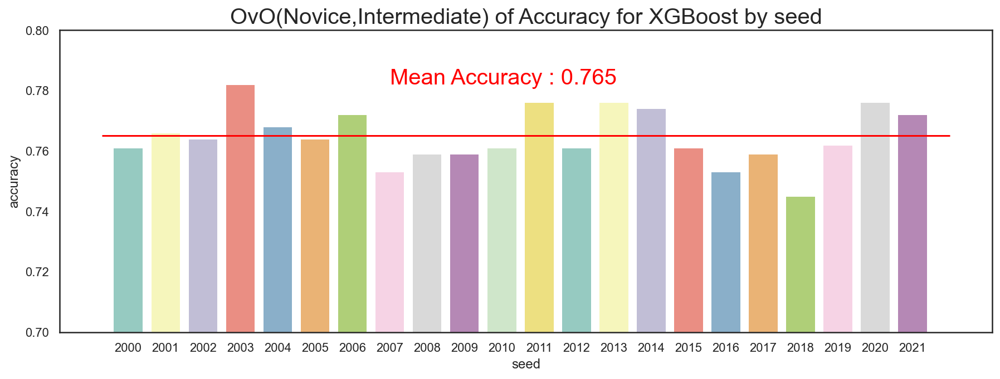

In [278]:
with sns.axes_style('white'):
    plt.figure(figsize=(15,5))
    plt.ylim(0.7, 0.8)
    sns.barplot(x = "seed", y = "accuracy", data = acc_df, palette='Set3')
    plt.title("OvO(Novice,Intermediate) of Accuracy for XGBoost by seed", fontsize = 20)
    plt.hlines(round(np.mean(acc_df.accuracy), 3), -0.7, 22, color='red')
    plt.text(7, 0.782,'Mean Accuracy : 0.765', fontdict = {'fontsize' : 20}, color = 'red')

In [279]:
seeds[acc_ls.index(max(acc_ls))]

2003

In [280]:
themodel = xgboost.XGBClassifier(booster='gbtree', learning_rate = 0.1, n_estimators = 100, max_depth = 3, min_child_weight = 4, gamma = 0.0, subsample = 0.4, colsample_bytree = 0.4, alpha = 0.0, use_label_encoder=False, seed = seeds[acc_ls.index(max(acc_ls))])

fit_params={"early_stopping_rounds": 60, 
        "eval_metric" : "auc", 
        "eval_set" : [[Fir_X_val, Fir_y_val]]}

themodel.fit(Fir_X_train, Fir_y_train, **fit_params)

y_predict=themodel.predict(Fir_X_test)

y_predict_prob = themodel.predict_proba(Fir_X_test)

[0]	validation_0-auc:0.78652
[1]	validation_0-auc:0.83153
[2]	validation_0-auc:0.83401
[3]	validation_0-auc:0.83153
[4]	validation_0-auc:0.84021
[5]	validation_0-auc:0.84511
[6]	validation_0-auc:0.84827
[7]	validation_0-auc:0.84891
[8]	validation_0-auc:0.84846
[9]	validation_0-auc:0.84925
[10]	validation_0-auc:0.85103
[11]	validation_0-auc:0.85133
[12]	validation_0-auc:0.85178
[13]	validation_0-auc:0.85186
[14]	validation_0-auc:0.85518
[15]	validation_0-auc:0.85727
[16]	validation_0-auc:0.85767
[17]	validation_0-auc:0.85729
[18]	validation_0-auc:0.85658
[19]	validation_0-auc:0.85726
[20]	validation_0-auc:0.85956
[21]	validation_0-auc:0.85927
[22]	validation_0-auc:0.85838
[23]	validation_0-auc:0.86010
[24]	validation_0-auc:0.86173
[25]	validation_0-auc:0.86200
[26]	validation_0-auc:0.86140
[27]	validation_0-auc:0.86120
[28]	validation_0-auc:0.86125
[29]	validation_0-auc:0.86082
[30]	validation_0-auc:0.86039
[31]	validation_0-auc:0.86001
[32]	validation_0-auc:0.86004
[33]	validation_0-au


정확도: 0.7816
정밀도: 0.7902
재현율: 0.8703
F1: 0.8283
ROC AUC: 0.7579
Average Precision: 0.7662


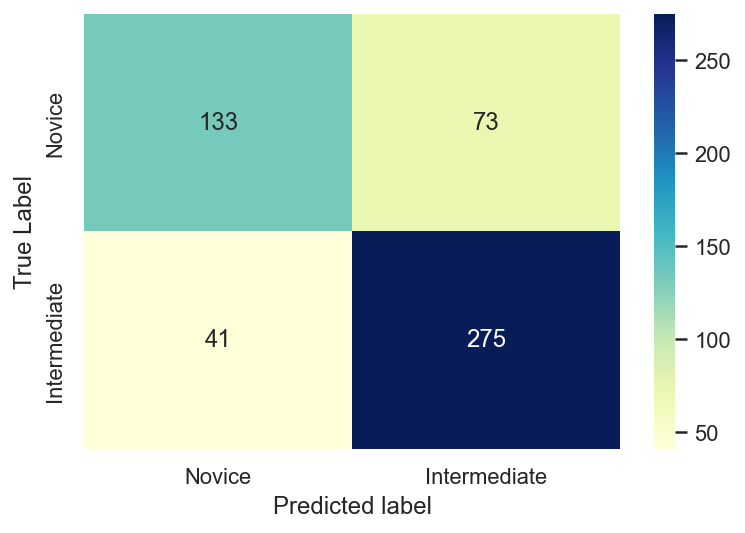

In [281]:
LABELS = ['Novice', 'Intermediate']
sns.heatmap(confusion_matrix(Fir_y_test,y_predict),annot=True,fmt='d', xticklabels=LABELS, yticklabels=LABELS, cmap='YlGnBu')
plt.xlabel('Predicted label')
plt.ylabel('True Label')
get_clf_eval(Fir_y_test, y_predict)

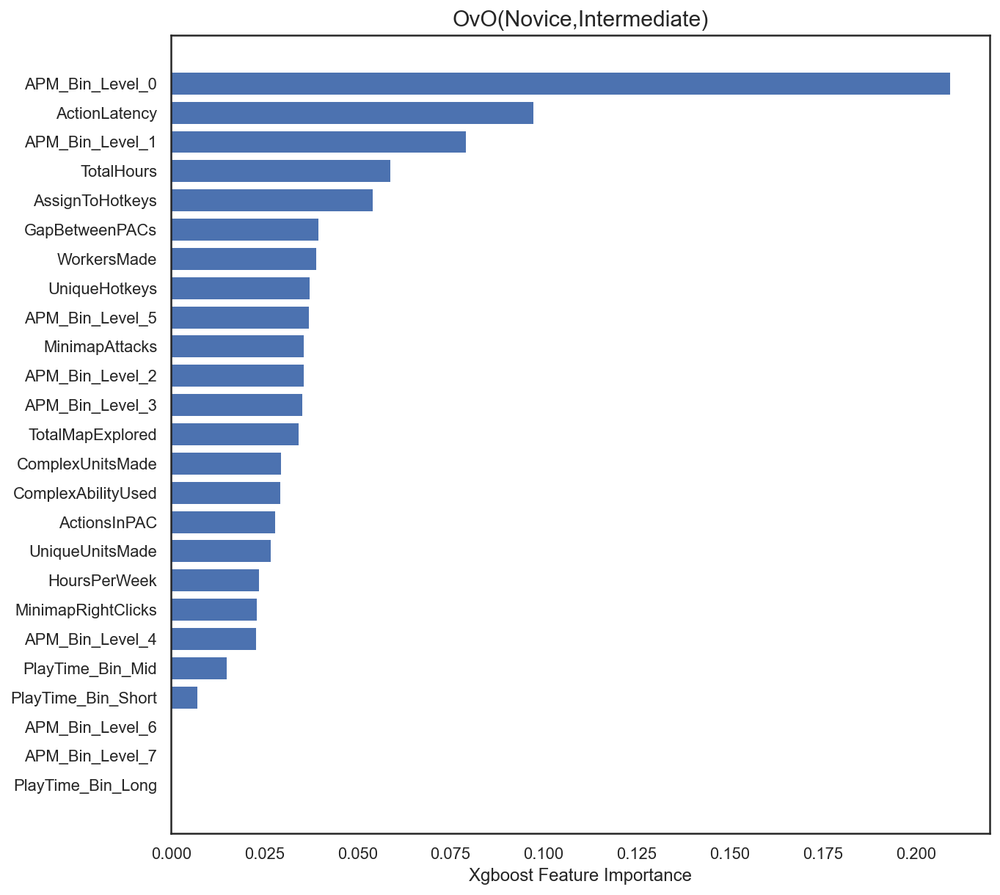

In [282]:
with sns.axes_style('white'):
    plt.figure(figsize=(10,10))
    sorted_idx = themodel.feature_importances_.argsort()
    plt.barh(list(Fir_X_train.columns[sorted_idx]), themodel.feature_importances_[sorted_idx])
    plt.title("OvO(Novice,Intermediate)", fontdict = {'fontsize' : 15})
    plt.xlabel("Xgboost Feature Importance")

## XGBoost : Intermediates vs Master (중급자 vs 전문가)

### Split train and test

In [283]:
# LeagueLevel에 대해 Intermediates를 0, Master를 1로 변경한다.
def LeagueSecondFunction(x):
    if x == 1:
        return 0
    else:
        return 1

In [284]:
IntMasSkillCraft_df['LeagueLevel'] = IntMasSkillCraft_df['LeagueLevel'].apply(LeagueSecondFunction)

In [285]:
IntMasSkillCraft_df.LeagueLevel.describe()

count    2287.000000
mean        0.308701
std         0.462059
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         1.000000
Name: LeagueLevel, dtype: float64

In [286]:
# LeagueLevel에 대해 먼저 나누어 준다.
IntMas_target = IntMasSkillCraft_df.LeagueLevel

In [287]:
# LeagueLevel제거
IntMasSkillCraft_df.drop(['LeagueLevel'], axis=1, inplace=True)

In [288]:
# o과 1의 비율은?
# 0의 비율
# 1의 비율
sum(IntMas_target == 0) / len(IntMas_target), sum(IntMas_target == 1) / len(IntMas_target)

(0.6912986445124617, 0.30870135548753824)

In [289]:
# 각 클래스별 개수
sum(IntMas_target == 0), sum(IntMas_target == 1)

(1581, 706)

In [290]:
# 클래스의 개수가 작으므로 오버샘플링을 실시

In [291]:
# train/test 80 : 20
Sec_X_train, Sec_X_test, Sec_y_train, Sec_y_test = train_test_split(IntMasSkillCraft_df, IntMas_target,
                                                                   test_size = 0.2, shuffle=True,
                                                                   stratify=IntMas_target, random_state=2022)

### Over sampling

In [292]:
from imblearn.over_sampling import SMOTE

In [293]:
# SMOTE 객체 생성
smote = SMOTE(random_state=2022)

In [294]:
Sec_X_train_resampled, Sec_y_train_resampled = smote.fit_resample(Sec_X_train, Sec_y_train)

In [295]:
sum(Sec_y_train_resampled == 0) / len(Sec_y_train_resampled), sum(Sec_y_train_resampled == 1) / len(Sec_y_train_resampled)

(0.5, 0.5)

In [296]:
# train/val 60 : 20 (80을 3:1로 등분한다면?, 0.25 비율 (1/4))
Sec_X_train, Sec_X_val, Sec_y_train, Sec_y_val = train_test_split(Sec_X_train_resampled, Sec_y_train_resampled,
                                                                   test_size = 0.2, shuffle=True,
                                                                   stratify=Sec_y_train_resampled, random_state=2022)

In [297]:
sum(Sec_y_train == 0) / len(Sec_y_train_resampled), sum(Sec_y_train == 1) / len(Sec_y_train_resampled)

(0.3999208860759494, 0.3999208860759494)

In [298]:
# 데이터 개수
len(Sec_X_train), len(Sec_X_val), len(Sec_X_test)

(2022, 506, 458)

### Modeling : Tuning Guide - GridSearch & Early Stopting

In [299]:
# 1. learning_rate, n_estimators

In [300]:
learning_rate = [i/10.0 for i in range(1,5)]
n_estimators = [i for i in range(100, 300, 10)]
max_depth = 4
min_child_weight = 1
gamma = 0
subsample = 0.5
colsample_bytree = 0.5

In [301]:
xgb_clf = xgboost.XGBClassifier(use_label_encoder=False, objective = 'binary:logistic')

param_grid = {'booster':['gbtree'], 
              'learning_rate' : learning_rate,
              'n_estimators' : n_estimators,
              'max_depth' : [max_depth],
              'min_child_weight' : [min_child_weight],
              'gamma' : [gamma],
              'subsample' : [subsample],
               'colsample_bytree' : [colsample_bytree]}

fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "aucpr", 
            "eval_set" : [[Sec_X_val, Sec_y_val]]}


grid_search = GridSearchCV(estimator=xgb_clf, 
                           param_grid=param_grid,
                           n_jobs=-1,
                           cv=list(StratifiedKFold(n_splits=5).split(Sec_X_train, Sec_y_train)))

results=grid_search.fit(Sec_X_train, Sec_y_train, **fit_params)

results.best_params_

[0]	validation_0-aucpr:0.73131
[1]	validation_0-aucpr:0.79604
[0]	validation_0-aucpr:0.70059
[0]	validation_0-aucpr:0.75768
[0]	validation_0-aucpr:0.74186
[2]	validation_0-aucpr:0.83820
[0]	validation_0-aucpr:0.73198
[0]	validation_0-aucpr:0.73131
[0]	validation_0-aucpr:0.70059
[1]	validation_0-aucpr:0.81924
[1]	validation_0-aucpr:0.79518
[0]	validation_0-aucpr:0.75768
[1]	validation_0-aucpr:0.82428
[1]	validation_0-aucpr:0.81765
[3]	validation_0-aucpr:0.84881
[1]	validation_0-aucpr:0.79604
[1]	validation_0-aucpr:0.79518
[2]	validation_0-aucpr:0.83738
[2]	validation_0-aucpr:0.84825
[2]	validation_0-aucpr:0.84173
[2]	validation_0-aucpr:0.84943
[4]	validation_0-aucpr:0.84911
[1]	validation_0-aucpr:0.81924
[2]	validation_0-aucpr:0.83820
[3]	validation_0-aucpr:0.83613
[2]	validation_0-aucpr:0.83738
[2]	validation_0-aucpr:0.84825
[3]	validation_0-aucpr:0.86475
[3]	validation_0-aucpr:0.87255
[5]	validation_0-aucpr:0.85762
[3]	validation_0-aucpr:0.86813
[3]	validation_0-aucpr:0.84881
[3]	vali

[38]	validation_0-aucpr:0.91225
[37]	validation_0-aucpr:0.90380
[38]	validation_0-aucpr:0.90291
[38]	validation_0-aucpr:0.91113
[38]	validation_0-aucpr:0.90153
[40]	validation_0-aucpr:0.91416
[39]	validation_0-aucpr:0.90723
[37]	validation_0-aucpr:0.89856
[39]	validation_0-aucpr:0.91330
[39]	validation_0-aucpr:0.90432
[39]	validation_0-aucpr:0.91140
[38]	validation_0-aucpr:0.90346
[39]	validation_0-aucpr:0.90212
[41]	validation_0-aucpr:0.91393
[40]	validation_0-aucpr:0.90896
[38]	validation_0-aucpr:0.90153
[40]	validation_0-aucpr:0.91224
[40]	validation_0-aucpr:0.91416
[40]	validation_0-aucpr:0.90490
[39]	validation_0-aucpr:0.90723
[40]	validation_0-aucpr:0.90243
[42]	validation_0-aucpr:0.91416
[41]	validation_0-aucpr:0.91000
[39]	validation_0-aucpr:0.90212
[41]	validation_0-aucpr:0.91253
[41]	validation_0-aucpr:0.91393
[40]	validation_0-aucpr:0.90896
[43]	validation_0-aucpr:0.91531
[41]	validation_0-aucpr:0.90499
[41]	validation_0-aucpr:0.90420
[42]	validation_0-aucpr:0.90926
[42]	val

[81]	validation_0-aucpr:0.92706
[79]	validation_0-aucpr:0.91985
[80]	validation_0-aucpr:0.91951
[78]	validation_0-aucpr:0.91876
[81]	validation_0-aucpr:0.91635
[81]	validation_0-aucpr:0.92706
[79]	validation_0-aucpr:0.92679
[82]	validation_0-aucpr:0.92802
[80]	validation_0-aucpr:0.91778
[81]	validation_0-aucpr:0.91908
[80]	validation_0-aucpr:0.91951
[79]	validation_0-aucpr:0.91821
[82]	validation_0-aucpr:0.92802
[82]	validation_0-aucpr:0.91643
[83]	validation_0-aucpr:0.92877
[81]	validation_0-aucpr:0.91908
[80]	validation_0-aucpr:0.92758
[82]	validation_0-aucpr:0.91946
[81]	validation_0-aucpr:0.91851
[80]	validation_0-aucpr:0.91778
[83]	validation_0-aucpr:0.92877
[83]	validation_0-aucpr:0.91777
[82]	validation_0-aucpr:0.91946
[84]	validation_0-aucpr:0.92843
[81]	validation_0-aucpr:0.92796
[83]	validation_0-aucpr:0.91995
[82]	validation_0-aucpr:0.91883
[84]	validation_0-aucpr:0.91798
[81]	validation_0-aucpr:0.91851
[84]	validation_0-aucpr:0.92843
[83]	validation_0-aucpr:0.91995
[82]	val

[9]	validation_0-aucpr:0.88470
[9]	validation_0-aucpr:0.88514
[20]	validation_0-aucpr:0.89364
[18]	validation_0-aucpr:0.89002
[18]	validation_0-aucpr:0.88363
[20]	validation_0-aucpr:0.89337
[21]	validation_0-aucpr:0.90317
[8]	validation_0-aucpr:0.86361
[10]	validation_0-aucpr:0.88843
[10]	validation_0-aucpr:0.88971
[21]	validation_0-aucpr:0.89247
[19]	validation_0-aucpr:0.88809
[19]	validation_0-aucpr:0.88508
[21]	validation_0-aucpr:0.89575
[22]	validation_0-aucpr:0.90348
[9]	validation_0-aucpr:0.86489
[11]	validation_0-aucpr:0.89140
[22]	validation_0-aucpr:0.89376
[11]	validation_0-aucpr:0.89211
[20]	validation_0-aucpr:0.88448
[20]	validation_0-aucpr:0.88636
[22]	validation_0-aucpr:0.89897
[10]	validation_0-aucpr:0.87199
[23]	validation_0-aucpr:0.90389
[12]	validation_0-aucpr:0.89240
[23]	validation_0-aucpr:0.89338
[12]	validation_0-aucpr:0.89150
[21]	validation_0-aucpr:0.88458
[21]	validation_0-aucpr:0.88902
[23]	validation_0-aucpr:0.89878
[24]	validation_0-aucpr:0.90321
[11]	validat

[62]	validation_0-aucpr:0.92387
[59]	validation_0-aucpr:0.91540
[59]	validation_0-aucpr:0.91107
[62]	validation_0-aucpr:0.91461
[61]	validation_0-aucpr:0.92581
[50]	validation_0-aucpr:0.91041
[49]	validation_0-aucpr:0.92350
[48]	validation_0-aucpr:0.91920
[63]	validation_0-aucpr:0.92424
[60]	validation_0-aucpr:0.91616
[60]	validation_0-aucpr:0.91252
[63]	validation_0-aucpr:0.91570
[51]	validation_0-aucpr:0.91123
[50]	validation_0-aucpr:0.92429
[62]	validation_0-aucpr:0.92633
[49]	validation_0-aucpr:0.91888
[61]	validation_0-aucpr:0.91302
[64]	validation_0-aucpr:0.91592
[64]	validation_0-aucpr:0.92601
[61]	validation_0-aucpr:0.91615
[52]	validation_0-aucpr:0.91208
[50]	validation_0-aucpr:0.92238
[51]	validation_0-aucpr:0.92409
[63]	validation_0-aucpr:0.92590
[62]	validation_0-aucpr:0.91220
[65]	validation_0-aucpr:0.91550
[62]	validation_0-aucpr:0.91744
[65]	validation_0-aucpr:0.92683
[53]	validation_0-aucpr:0.91184
[52]	validation_0-aucpr:0.92444
[51]	validation_0-aucpr:0.92338
[64]	val

[92]	validation_0-aucpr:0.92893
[82]	validation_0-aucpr:0.91643
[94]	validation_0-aucpr:0.92841
[81]	validation_0-aucpr:0.92796
[92]	validation_0-aucpr:0.91819
[95]	validation_0-aucpr:0.91754
[91]	validation_0-aucpr:0.91710
[80]	validation_0-aucpr:0.92743
[93]	validation_0-aucpr:0.92903
[83]	validation_0-aucpr:0.91777
[93]	validation_0-aucpr:0.91809
[95]	validation_0-aucpr:0.92878
[82]	validation_0-aucpr:0.92774
[96]	validation_0-aucpr:0.91772
[94]	validation_0-aucpr:0.92893
[92]	validation_0-aucpr:0.91640
[81]	validation_0-aucpr:0.92706
[84]	validation_0-aucpr:0.91798
[96]	validation_0-aucpr:0.92895
[94]	validation_0-aucpr:0.91869
[83]	validation_0-aucpr:0.92734
[97]	validation_0-aucpr:0.91744
[93]	validation_0-aucpr:0.91630
[95]	validation_0-aucpr:0.92856
[82]	validation_0-aucpr:0.92802
[85]	validation_0-aucpr:0.91846
[98]	validation_0-aucpr:0.91755
[97]	validation_0-aucpr:0.92926
[84]	validation_0-aucpr:0.92780
[95]	validation_0-aucpr:0.91907
[94]	validation_0-aucpr:0.91614
[83]	val

[12]	validation_0-aucpr:0.89240
[3]	validation_0-aucpr:0.83613
[24]	validation_0-aucpr:0.89251
[12]	validation_0-aucpr:0.89150
[121]	validation_0-aucpr:0.92830
[23]	validation_0-aucpr:0.88255
[1]	validation_0-aucpr:0.81924
[11]	validation_0-aucpr:0.87862
[13]	validation_0-aucpr:0.89166
[4]	validation_0-aucpr:0.84847
[25]	validation_0-aucpr:0.89347
[122]	validation_0-aucpr:0.92761
[13]	validation_0-aucpr:0.89328
[24]	validation_0-aucpr:0.88252
[2]	validation_0-aucpr:0.84825
[12]	validation_0-aucpr:0.88189
[14]	validation_0-aucpr:0.89536
[26]	validation_0-aucpr:0.89550
[5]	validation_0-aucpr:0.86809
[123]	validation_0-aucpr:0.92739
[14]	validation_0-aucpr:0.89309
[3]	validation_0-aucpr:0.86475
[25]	validation_0-aucpr:0.88336
[15]	validation_0-aucpr:0.89482
[13]	validation_0-aucpr:0.88444
[27]	validation_0-aucpr:0.89525
[15]	validation_0-aucpr:0.89464
[6]	validation_0-aucpr:0.86769
[124]	validation_0-aucpr:0.92682
[26]	validation_0-aucpr:0.88620
[4]	validation_0-aucpr:0.86588
[16]	validat

[28]	validation_0-aucpr:0.90460
[52]	validation_0-aucpr:0.91208
[52]	validation_0-aucpr:0.92444
[62]	validation_0-aucpr:0.91220
[64]	validation_0-aucpr:0.91814
[50]	validation_0-aucpr:0.92238
[43]	validation_0-aucpr:0.90984
[29]	validation_0-aucpr:0.90716
[41]	validation_0-aucpr:0.90420
[53]	validation_0-aucpr:0.91184
[53]	validation_0-aucpr:0.92436
[63]	validation_0-aucpr:0.91395
[65]	validation_0-aucpr:0.91750
[51]	validation_0-aucpr:0.92338
[44]	validation_0-aucpr:0.90956
[30]	validation_0-aucpr:0.90904
[42]	validation_0-aucpr:0.90516
[54]	validation_0-aucpr:0.91245
[54]	validation_0-aucpr:0.92351
[64]	validation_0-aucpr:0.91504
[52]	validation_0-aucpr:0.92271
[66]	validation_0-aucpr:0.91819
[45]	validation_0-aucpr:0.91166
[43]	validation_0-aucpr:0.90528
[31]	validation_0-aucpr:0.90930
[55]	validation_0-aucpr:0.91285
[55]	validation_0-aucpr:0.92329
[65]	validation_0-aucpr:0.91511
[53]	validation_0-aucpr:0.92272
[67]	validation_0-aucpr:0.91748
[46]	validation_0-aucpr:0.91177
[32]	val

[81]	validation_0-aucpr:0.91851
[103]	validation_0-aucpr:0.91662
[105]	validation_0-aucpr:0.91964
[84]	validation_0-aucpr:0.91942
[93]	validation_0-aucpr:0.92895
[94]	validation_0-aucpr:0.91794
[68]	validation_0-aucpr:0.92726
[91]	validation_0-aucpr:0.92841
[82]	validation_0-aucpr:0.91883
[85]	validation_0-aucpr:0.91868
[94]	validation_0-aucpr:0.92841
[104]	validation_0-aucpr:0.91649
[106]	validation_0-aucpr:0.91949
[95]	validation_0-aucpr:0.91754
[92]	validation_0-aucpr:0.92893
[69]	validation_0-aucpr:0.92757
[86]	validation_0-aucpr:0.91893
[83]	validation_0-aucpr:0.91918
[95]	validation_0-aucpr:0.92878
[105]	validation_0-aucpr:0.91658
[107]	validation_0-aucpr:0.92085
[70]	validation_0-aucpr:0.92757
[96]	validation_0-aucpr:0.91772
[93]	validation_0-aucpr:0.92903
[97]	validation_0-aucpr:0.91744
[87]	validation_0-aucpr:0.91808
[108]	validation_0-aucpr:0.91998
[96]	validation_0-aucpr:0.92895
[106]	validation_0-aucpr:0.91597
[84]	validation_0-aucpr:0.91890
[71]	validation_0-aucpr:0.92715


[116]	validation_0-aucpr:0.92174
[114]	validation_0-aucpr:0.91844
[5]	validation_0-aucpr:0.88577
[123]	validation_0-aucpr:0.92739
[126]	validation_0-aucpr:0.93303
[100]	validation_0-aucpr:0.93015
[127]	validation_0-aucpr:0.91616
[5]	validation_0-aucpr:0.85762
[117]	validation_0-aucpr:0.92144
[115]	validation_0-aucpr:0.91842
[6]	validation_0-aucpr:0.88095
[124]	validation_0-aucpr:0.92682
[101]	validation_0-aucpr:0.93096
[127]	validation_0-aucpr:0.93292
[128]	validation_0-aucpr:0.91600
[6]	validation_0-aucpr:0.86138
[118]	validation_0-aucpr:0.92055
[125]	validation_0-aucpr:0.92703
[116]	validation_0-aucpr:0.91805
[7]	validation_0-aucpr:0.88233
[102]	validation_0-aucpr:0.93094
[128]	validation_0-aucpr:0.93362
[129]	validation_0-aucpr:0.91543
[7]	validation_0-aucpr:0.86288
[119]	validation_0-aucpr:0.91985
[103]	validation_0-aucpr:0.93038
[8]	validation_0-aucpr:0.88185
[129]	validation_0-aucpr:0.93284
[126]	validation_0-aucpr:0.92754
[117]	validation_0-aucpr:0.91758
[8]	validation_0-aucpr:0

[43]	validation_0-aucpr:0.91531
[20]	validation_0-aucpr:0.90263
[14]	validation_0-aucpr:0.89309
[34]	validation_0-aucpr:0.90077
[12]	validation_0-aucpr:0.88189
[44]	validation_0-aucpr:0.90731
[33]	validation_0-aucpr:0.89741
[44]	validation_0-aucpr:0.91707
[21]	validation_0-aucpr:0.90317
[15]	validation_0-aucpr:0.89464
[35]	validation_0-aucpr:0.90192
[45]	validation_0-aucpr:0.90702
[13]	validation_0-aucpr:0.88444
[34]	validation_0-aucpr:0.89802
[0]	validation_0-aucpr:0.70059
[22]	validation_0-aucpr:0.90348
[45]	validation_0-aucpr:0.91904
[16]	validation_0-aucpr:0.89584
[36]	validation_0-aucpr:0.90180
[46]	validation_0-aucpr:0.90826
[14]	validation_0-aucpr:0.88447
[35]	validation_0-aucpr:0.89750
[1]	validation_0-aucpr:0.79518
[46]	validation_0-aucpr:0.92023
[23]	validation_0-aucpr:0.90389
[17]	validation_0-aucpr:0.89420
[37]	validation_0-aucpr:0.90380
[47]	validation_0-aucpr:0.90896
[15]	validation_0-aucpr:0.88587
[36]	validation_0-aucpr:0.89779
[2]	validation_0-aucpr:0.83738
[47]	valida

[51]	validation_0-aucpr:0.92338
[85]	validation_0-aucpr:0.91846
[54]	validation_0-aucpr:0.91245
[75]	validation_0-aucpr:0.91911
[73]	validation_0-aucpr:0.91517
[60]	validation_0-aucpr:0.92528
[38]	validation_0-aucpr:0.90346
[84]	validation_0-aucpr:0.92843
[52]	validation_0-aucpr:0.92271
[86]	validation_0-aucpr:0.91823
[55]	validation_0-aucpr:0.91285
[74]	validation_0-aucpr:0.91573
[61]	validation_0-aucpr:0.92412
[76]	validation_0-aucpr:0.91913
[39]	validation_0-aucpr:0.90723
[85]	validation_0-aucpr:0.92795
[53]	validation_0-aucpr:0.92272
[56]	validation_0-aucpr:0.91309
[87]	validation_0-aucpr:0.91745
[75]	validation_0-aucpr:0.91797
[62]	validation_0-aucpr:0.92387
[40]	validation_0-aucpr:0.90896
[77]	validation_0-aucpr:0.92003
[86]	validation_0-aucpr:0.92837
[54]	validation_0-aucpr:0.92286
[57]	validation_0-aucpr:0.91411
[88]	validation_0-aucpr:0.91733
[76]	validation_0-aucpr:0.91775
[63]	validation_0-aucpr:0.92424
[78]	validation_0-aucpr:0.91925
[41]	validation_0-aucpr:0.91000
[87]	val

[108]	validation_0-aucpr:0.91678
[90]	validation_0-aucpr:0.91726
[122]	validation_0-aucpr:0.91720
[73]	validation_0-aucpr:0.91925
[87]	validation_0-aucpr:0.92777
[95]	validation_0-aucpr:0.92878
[109]	validation_0-aucpr:0.91668
[111]	validation_0-aucpr:0.92048
[120]	validation_0-aucpr:0.92821
[91]	validation_0-aucpr:0.91727
[123]	validation_0-aucpr:0.91704
[74]	validation_0-aucpr:0.91971
[88]	validation_0-aucpr:0.92803
[96]	validation_0-aucpr:0.92895
[110]	validation_0-aucpr:0.91664
[92]	validation_0-aucpr:0.91785
[112]	validation_0-aucpr:0.92094
[121]	validation_0-aucpr:0.92830
[75]	validation_0-aucpr:0.91911
[124]	validation_0-aucpr:0.91614
[89]	validation_0-aucpr:0.92835
[97]	validation_0-aucpr:0.92926
[122]	validation_0-aucpr:0.92761
[111]	validation_0-aucpr:0.91645
[113]	validation_0-aucpr:0.92125
[93]	validation_0-aucpr:0.91788
[125]	validation_0-aucpr:0.91636
[76]	validation_0-aucpr:0.91913
[90]	validation_0-aucpr:0.92848
[98]	validation_0-aucpr:0.92972
[112]	validation_0-aucpr:0

[149]	validation_0-aucpr:0.91750
[126]	validation_0-aucpr:0.92754
[134]	validation_0-aucpr:0.93492
[130]	validation_0-aucpr:0.91510
[112]	validation_0-aucpr:0.92094
[7]	validation_0-aucpr:0.87846
[148]	validation_0-aucpr:0.92205
[127]	validation_0-aucpr:0.92682
[19]	validation_0-aucpr:0.88809
[135]	validation_0-aucpr:0.93550
[131]	validation_0-aucpr:0.91572
[113]	validation_0-aucpr:0.92125
[8]	validation_0-aucpr:0.88428
[128]	validation_0-aucpr:0.92696
[149]	validation_0-aucpr:0.92166
[20]	validation_0-aucpr:0.88448
[132]	validation_0-aucpr:0.91570
[136]	validation_0-aucpr:0.93566
[114]	validation_0-aucpr:0.92133
[0]	validation_0-aucpr:0.73198
[9]	validation_0-aucpr:0.88470
[129]	validation_0-aucpr:0.92656
[21]	validation_0-aucpr:0.88458
[133]	validation_0-aucpr:0.91614
[115]	validation_0-aucpr:0.92181
[137]	validation_0-aucpr:0.93505
[1]	validation_0-aucpr:0.82428
[130]	validation_0-aucpr:0.92708
[10]	validation_0-aucpr:0.88843
[22]	validation_0-aucpr:0.88377
[116]	validation_0-aucpr:

[56]	validation_0-aucpr:0.91065
[34]	validation_0-aucpr:0.91051
[152]	validation_0-aucpr:0.91679
[18]	validation_0-aucpr:0.89002
[22]	validation_0-aucpr:0.89160
[10]	validation_0-aucpr:0.88843
[45]	validation_0-aucpr:0.91759
[37]	validation_0-aucpr:0.89966
[57]	validation_0-aucpr:0.91008
[153]	validation_0-aucpr:0.91625
[35]	validation_0-aucpr:0.91002
[23]	validation_0-aucpr:0.89227
[19]	validation_0-aucpr:0.88809
[11]	validation_0-aucpr:0.89140
[46]	validation_0-aucpr:0.91916
[58]	validation_0-aucpr:0.91089
[38]	validation_0-aucpr:0.90291
[154]	validation_0-aucpr:0.91684
[36]	validation_0-aucpr:0.91074
[24]	validation_0-aucpr:0.89251
[12]	validation_0-aucpr:0.89240
[20]	validation_0-aucpr:0.88448
[47]	validation_0-aucpr:0.91923
[59]	validation_0-aucpr:0.91107
[39]	validation_0-aucpr:0.90432
[155]	validation_0-aucpr:0.91736
[21]	validation_0-aucpr:0.88458
[37]	validation_0-aucpr:0.91112
[25]	validation_0-aucpr:0.89347
[13]	validation_0-aucpr:0.89166
[48]	validation_0-aucpr:0.92257
[60]

[60]	validation_0-aucpr:0.91616
[82]	validation_0-aucpr:0.92774
[27]	validation_0-aucpr:0.89474
[95]	validation_0-aucpr:0.91563
[71]	validation_0-aucpr:0.92594
[56]	validation_0-aucpr:0.91065
[76]	validation_0-aucpr:0.91595
[47]	validation_0-aucpr:0.91923
[61]	validation_0-aucpr:0.91615
[83]	validation_0-aucpr:0.92734
[72]	validation_0-aucpr:0.92744
[28]	validation_0-aucpr:0.89510
[96]	validation_0-aucpr:0.91484
[57]	validation_0-aucpr:0.91008
[77]	validation_0-aucpr:0.91515
[48]	validation_0-aucpr:0.92257
[62]	validation_0-aucpr:0.91744
[84]	validation_0-aucpr:0.92780
[29]	validation_0-aucpr:0.89572
[58]	validation_0-aucpr:0.91089
[97]	validation_0-aucpr:0.91470
[73]	validation_0-aucpr:0.92777
[78]	validation_0-aucpr:0.91569
[63]	validation_0-aucpr:0.91753
[49]	validation_0-aucpr:0.92350
[85]	validation_0-aucpr:0.92725
[30]	validation_0-aucpr:0.89545
[59]	validation_0-aucpr:0.91107
[74]	validation_0-aucpr:0.92787
[79]	validation_0-aucpr:0.91672
[50]	validation_0-aucpr:0.92429
[64]	val

[103]	validation_0-aucpr:0.91925
[125]	validation_0-aucpr:0.93260
[68]	validation_0-aucpr:0.91639
[89]	validation_0-aucpr:0.92750
[113]	validation_0-aucpr:0.92791
[120]	validation_0-aucpr:0.91621
[104]	validation_0-aucpr:0.92047
[69]	validation_0-aucpr:0.91655
[139]	validation_0-aucpr:0.92202
[126]	validation_0-aucpr:0.93303
[99]	validation_0-aucpr:0.91504
[90]	validation_0-aucpr:0.92735
[114]	validation_0-aucpr:0.92836
[121]	validation_0-aucpr:0.91718
[140]	validation_0-aucpr:0.92135
[105]	validation_0-aucpr:0.91964
[70]	validation_0-aucpr:0.91616
[127]	validation_0-aucpr:0.93292
[100]	validation_0-aucpr:0.91463
[91]	validation_0-aucpr:0.92792
[115]	validation_0-aucpr:0.92878
[122]	validation_0-aucpr:0.91720
[71]	validation_0-aucpr:0.91573
[101]	validation_0-aucpr:0.91554
[106]	validation_0-aucpr:0.91949
[141]	validation_0-aucpr:0.92101
[128]	validation_0-aucpr:0.93362
[92]	validation_0-aucpr:0.92895
[116]	validation_0-aucpr:0.92803
[72]	validation_0-aucpr:0.91592
[123]	validation_0-a

[131]	validation_0-aucpr:0.92194
[157]	validation_0-aucpr:0.93383
[102]	validation_0-aucpr:0.91693
[8]	validation_0-aucpr:0.86361
[136]	validation_0-aucpr:0.91658
[122]	validation_0-aucpr:0.93307
[152]	validation_0-aucpr:0.91605
[146]	validation_0-aucpr:0.92597
[132]	validation_0-aucpr:0.92135
[158]	validation_0-aucpr:0.93360
[103]	validation_0-aucpr:0.91832
[9]	validation_0-aucpr:0.86489
[137]	validation_0-aucpr:0.91575
[123]	validation_0-aucpr:0.93279
[147]	validation_0-aucpr:0.92514
[153]	validation_0-aucpr:0.91661
[159]	validation_0-aucpr:0.93347
[104]	validation_0-aucpr:0.91812
[133]	validation_0-aucpr:0.92142
[138]	validation_0-aucpr:0.91547
[10]	validation_0-aucpr:0.87199
[124]	validation_0-aucpr:0.93221
[148]	validation_0-aucpr:0.92509
[154]	validation_0-aucpr:0.91684
[105]	validation_0-aucpr:0.91815
[134]	validation_0-aucpr:0.92169
[11]	validation_0-aucpr:0.87862
[149]	validation_0-aucpr:0.92516
[139]	validation_0-aucpr:0.91563
[125]	validation_0-aucpr:0.93260
[135]	validation

[163]	validation_0-aucpr:0.93309
[29]	validation_0-aucpr:0.90716
[1]	validation_0-aucpr:0.79604
[144]	validation_0-aucpr:0.91637
[35]	validation_0-aucpr:0.90192
[48]	validation_0-aucpr:0.91920
[7]	validation_0-aucpr:0.88233
[30]	validation_0-aucpr:0.89767
[30]	validation_0-aucpr:0.90904
[2]	validation_0-aucpr:0.83820
[145]	validation_0-aucpr:0.91620
[164]	validation_0-aucpr:0.93335
[36]	validation_0-aucpr:0.90180
[49]	validation_0-aucpr:0.91888
[8]	validation_0-aucpr:0.88185
[31]	validation_0-aucpr:0.89657
[31]	validation_0-aucpr:0.90930
[146]	validation_0-aucpr:0.91580
[3]	validation_0-aucpr:0.84881
[165]	validation_0-aucpr:0.93338
[37]	validation_0-aucpr:0.90380
[50]	validation_0-aucpr:0.92238
[9]	validation_0-aucpr:0.88514
[32]	validation_0-aucpr:0.89466
[32]	validation_0-aucpr:0.90979
[147]	validation_0-aucpr:0.91565
[166]	validation_0-aucpr:0.93347
[4]	validation_0-aucpr:0.84911
[38]	validation_0-aucpr:0.90346
[51]	validation_0-aucpr:0.92338
[148]	validation_0-aucpr:0.91570
[10]	v

[80]	validation_0-aucpr:0.92743
[62]	validation_0-aucpr:0.92387
[68]	validation_0-aucpr:0.91768
[24]	validation_0-aucpr:0.89251
[64]	validation_0-aucpr:0.91504
[40]	validation_0-aucpr:0.90490
[34]	validation_0-aucpr:0.91051
[9]	validation_0-aucpr:0.88285
[81]	validation_0-aucpr:0.92706
[63]	validation_0-aucpr:0.92424
[69]	validation_0-aucpr:0.91890
[25]	validation_0-aucpr:0.89347
[65]	validation_0-aucpr:0.91511
[82]	validation_0-aucpr:0.92802
[10]	validation_0-aucpr:0.87802
[41]	validation_0-aucpr:0.90499
[35]	validation_0-aucpr:0.91002
[64]	validation_0-aucpr:0.92601
[70]	validation_0-aucpr:0.91982
[26]	validation_0-aucpr:0.89550
[83]	validation_0-aucpr:0.92877
[66]	validation_0-aucpr:0.91424
[71]	validation_0-aucpr:0.91951
[11]	validation_0-aucpr:0.87887
[42]	validation_0-aucpr:0.90769
[65]	validation_0-aucpr:0.92683
[36]	validation_0-aucpr:0.91074
[67]	validation_0-aucpr:0.91414
[27]	validation_0-aucpr:0.89525
[84]	validation_0-aucpr:0.92843
[72]	validation_0-aucpr:0.92028
[12]	vali

[96]	validation_0-aucpr:0.91484
[113]	validation_0-aucpr:0.92791
[66]	validation_0-aucpr:0.92666
[56]	validation_0-aucpr:0.91704
[95]	validation_0-aucpr:0.92878
[40]	validation_0-aucpr:0.90243
[102]	validation_0-aucpr:0.91913
[72]	validation_0-aucpr:0.91592
[114]	validation_0-aucpr:0.92836
[67]	validation_0-aucpr:0.92714
[97]	validation_0-aucpr:0.91470
[57]	validation_0-aucpr:0.91745
[103]	validation_0-aucpr:0.91925
[41]	validation_0-aucpr:0.90420
[96]	validation_0-aucpr:0.92895
[73]	validation_0-aucpr:0.91601
[68]	validation_0-aucpr:0.92647
[58]	validation_0-aucpr:0.91707
[115]	validation_0-aucpr:0.92878
[98]	validation_0-aucpr:0.91462
[104]	validation_0-aucpr:0.92047
[42]	validation_0-aucpr:0.90516
[97]	validation_0-aucpr:0.92926
[74]	validation_0-aucpr:0.91628
[69]	validation_0-aucpr:0.92636
[99]	validation_0-aucpr:0.91504
[59]	validation_0-aucpr:0.91540
[105]	validation_0-aucpr:0.91964
[116]	validation_0-aucpr:0.92803
[43]	validation_0-aucpr:0.90528
[70]	validation_0-aucpr:0.92586


[104]	validation_0-aucpr:0.91812
[127]	validation_0-aucpr:0.93292
[98]	validation_0-aucpr:0.92812
[135]	validation_0-aucpr:0.91685
[88]	validation_0-aucpr:0.91859
[145]	validation_0-aucpr:0.92558
[72]	validation_0-aucpr:0.91481
[129]	validation_0-aucpr:0.91976
[105]	validation_0-aucpr:0.91815
[128]	validation_0-aucpr:0.93362
[99]	validation_0-aucpr:0.92702
[136]	validation_0-aucpr:0.91658
[146]	validation_0-aucpr:0.92597
[89]	validation_0-aucpr:0.91892
[73]	validation_0-aucpr:0.91517
[130]	validation_0-aucpr:0.92014
[106]	validation_0-aucpr:0.91798
[129]	validation_0-aucpr:0.93284
[100]	validation_0-aucpr:0.92729
[137]	validation_0-aucpr:0.91575
[147]	validation_0-aucpr:0.92514
[90]	validation_0-aucpr:0.91905
[131]	validation_0-aucpr:0.92194
[74]	validation_0-aucpr:0.91573
[107]	validation_0-aucpr:0.91909
[101]	validation_0-aucpr:0.92739
[130]	validation_0-aucpr:0.93320
[148]	validation_0-aucpr:0.92509
[138]	validation_0-aucpr:0.91547
[91]	validation_0-aucpr:0.91851
[75]	validation_0-a

[131]	validation_0-aucpr:0.92689
[22]	validation_0-aucpr:0.90348
[120]	validation_0-aucpr:0.91938
[168]	validation_0-aucpr:0.91541
[105]	validation_0-aucpr:0.91658
[162]	validation_0-aucpr:0.93254
[138]	validation_0-aucpr:0.91607
[163]	validation_0-aucpr:0.92142
[132]	validation_0-aucpr:0.92651
[121]	validation_0-aucpr:0.91847
[169]	validation_0-aucpr:0.91547
[23]	validation_0-aucpr:0.90389
[139]	validation_0-aucpr:0.91648
[106]	validation_0-aucpr:0.91597
[164]	validation_0-aucpr:0.92133
[163]	validation_0-aucpr:0.93309
[170]	validation_0-aucpr:0.91612
[122]	validation_0-aucpr:0.91820
[133]	validation_0-aucpr:0.92665
[24]	validation_0-aucpr:0.90321
[165]	validation_0-aucpr:0.92127
[171]	validation_0-aucpr:0.91758
[107]	validation_0-aucpr:0.91651
[123]	validation_0-aucpr:0.91738
[140]	validation_0-aucpr:0.91695
[164]	validation_0-aucpr:0.93335
[134]	validation_0-aucpr:0.92647
[25]	validation_0-aucpr:0.90340
[172]	validation_0-aucpr:0.91757
[166]	validation_0-aucpr:0.92172
[108]	validati

[147]	validation_0-aucpr:0.92178
[164]	validation_0-aucpr:0.91546
[33]	validation_0-aucpr:0.89938
[17]	validation_0-aucpr:0.87560
[22]	validation_0-aucpr:0.89160
[64]	validation_0-aucpr:0.92601
[148]	validation_0-aucpr:0.92205
[24]	validation_0-aucpr:0.90058
[12]	validation_0-aucpr:0.89240
[165]	validation_0-aucpr:0.91578
[34]	validation_0-aucpr:0.89963
[65]	validation_0-aucpr:0.92683
[18]	validation_0-aucpr:0.89002
[23]	validation_0-aucpr:0.89227
[149]	validation_0-aucpr:0.92166
[166]	validation_0-aucpr:0.91559
[25]	validation_0-aucpr:0.90166
[13]	validation_0-aucpr:0.89166
[35]	validation_0-aucpr:0.89911
[19]	validation_0-aucpr:0.88809
[66]	validation_0-aucpr:0.92713
[24]	validation_0-aucpr:0.89251
[167]	validation_0-aucpr:0.91562
[150]	validation_0-aucpr:0.92166
[14]	validation_0-aucpr:0.89536
[26]	validation_0-aucpr:0.90320
[67]	validation_0-aucpr:0.92618
[36]	validation_0-aucpr:0.89961
[20]	validation_0-aucpr:0.88448
[168]	validation_0-aucpr:0.91541
[25]	validation_0-aucpr:0.89347

[59]	validation_0-aucpr:0.91107
[64]	validation_0-aucpr:0.91814
[53]	validation_0-aucpr:0.92436
[107]	validation_0-aucpr:0.93131
[76]	validation_0-aucpr:0.91595
[30]	validation_0-aucpr:0.89545
[0]	validation_0-aucpr:0.73131
[60]	validation_0-aucpr:0.91252
[66]	validation_0-aucpr:0.92666
[54]	validation_0-aucpr:0.92351
[65]	validation_0-aucpr:0.91750
[108]	validation_0-aucpr:0.93211
[77]	validation_0-aucpr:0.91515
[31]	validation_0-aucpr:0.89565
[1]	validation_0-aucpr:0.79604
[55]	validation_0-aucpr:0.92329
[61]	validation_0-aucpr:0.91302
[66]	validation_0-aucpr:0.91819
[67]	validation_0-aucpr:0.92714
[109]	validation_0-aucpr:0.93119
[78]	validation_0-aucpr:0.91569
[32]	validation_0-aucpr:0.89709
[2]	validation_0-aucpr:0.83820
[56]	validation_0-aucpr:0.92382
[62]	validation_0-aucpr:0.91220
[68]	validation_0-aucpr:0.92647
[67]	validation_0-aucpr:0.91748
[110]	validation_0-aucpr:0.93086
[79]	validation_0-aucpr:0.91672
[57]	validation_0-aucpr:0.92349
[33]	validation_0-aucpr:0.89938
[3]	val

[97]	validation_0-aucpr:0.91782
[109]	validation_0-aucpr:0.91817
[93]	validation_0-aucpr:0.91630
[99]	validation_0-aucpr:0.92702
[141]	validation_0-aucpr:0.93458
[63]	validation_0-aucpr:0.91570
[32]	validation_0-aucpr:0.90746
[87]	validation_0-aucpr:0.92706
[110]	validation_0-aucpr:0.91758
[94]	validation_0-aucpr:0.91614
[98]	validation_0-aucpr:0.91790
[100]	validation_0-aucpr:0.92729
[142]	validation_0-aucpr:0.93441
[64]	validation_0-aucpr:0.91592
[33]	validation_0-aucpr:0.90808
[88]	validation_0-aucpr:0.92708
[111]	validation_0-aucpr:0.91713
[95]	validation_0-aucpr:0.91563
[99]	validation_0-aucpr:0.91879
[101]	validation_0-aucpr:0.92739
[65]	validation_0-aucpr:0.91550
[143]	validation_0-aucpr:0.93358
[34]	validation_0-aucpr:0.91051
[89]	validation_0-aucpr:0.92750
[96]	validation_0-aucpr:0.91484
[112]	validation_0-aucpr:0.91697
[102]	validation_0-aucpr:0.92643
[100]	validation_0-aucpr:0.91955
[144]	validation_0-aucpr:0.93364
[66]	validation_0-aucpr:0.91539
[35]	validation_0-aucpr:0.91

[131]	validation_0-aucpr:0.92689
[118]	validation_0-aucpr:0.93267
[129]	validation_0-aucpr:0.91711
[63]	validation_0-aucpr:0.92590
[96]	validation_0-aucpr:0.91772
[173]	validation_0-aucpr:0.93364
[142]	validation_0-aucpr:0.91720
[126]	validation_0-aucpr:0.91909
[119]	validation_0-aucpr:0.93281
[132]	validation_0-aucpr:0.92651
[130]	validation_0-aucpr:0.91655
[64]	validation_0-aucpr:0.92679
[97]	validation_0-aucpr:0.91744
[174]	validation_0-aucpr:0.93343
[143]	validation_0-aucpr:0.91683
[120]	validation_0-aucpr:0.93268
[127]	validation_0-aucpr:0.91938
[133]	validation_0-aucpr:0.92665
[131]	validation_0-aucpr:0.91713
[98]	validation_0-aucpr:0.91755
[65]	validation_0-aucpr:0.92716
[175]	validation_0-aucpr:0.93340
[144]	validation_0-aucpr:0.91637
[121]	validation_0-aucpr:0.93308
[132]	validation_0-aucpr:0.91627
[134]	validation_0-aucpr:0.92647
[128]	validation_0-aucpr:0.91963
[99]	validation_0-aucpr:0.91781
[176]	validation_0-aucpr:0.93360
[66]	validation_0-aucpr:0.92666
[145]	validation_0

[159]	validation_0-aucpr:0.92095
[151]	validation_0-aucpr:0.93352
[130]	validation_0-aucpr:0.91510
[9]	validation_0-aucpr:0.88285
[6]	validation_0-aucpr:0.87477
[14]	validation_0-aucpr:0.88475
[96]	validation_0-aucpr:0.92825
[160]	validation_0-aucpr:0.92099
[163]	validation_0-aucpr:0.91617
[152]	validation_0-aucpr:0.93335
[131]	validation_0-aucpr:0.91572
[7]	validation_0-aucpr:0.87846
[15]	validation_0-aucpr:0.88458
[97]	validation_0-aucpr:0.92798
[10]	validation_0-aucpr:0.87802
[161]	validation_0-aucpr:0.92113
[164]	validation_0-aucpr:0.91546
[153]	validation_0-aucpr:0.93354
[132]	validation_0-aucpr:0.91570
[8]	validation_0-aucpr:0.88428
[98]	validation_0-aucpr:0.92812
[16]	validation_0-aucpr:0.88260
[11]	validation_0-aucpr:0.87887
[165]	validation_0-aucpr:0.91578
[162]	validation_0-aucpr:0.92120
[154]	validation_0-aucpr:0.93340
[133]	validation_0-aucpr:0.91614
[99]	validation_0-aucpr:0.92702
[166]	validation_0-aucpr:0.91559
[9]	validation_0-aucpr:0.88470
[12]	validation_0-aucpr:0.879

[191]	validation_0-aucpr:0.93463
[24]	validation_0-aucpr:0.89452
[136]	validation_0-aucpr:0.92684
[47]	validation_0-aucpr:0.90899
[1]	validation_0-aucpr:0.79604
[44]	validation_0-aucpr:0.91577
[192]	validation_0-aucpr:0.93458
[53]	validation_0-aucpr:0.91566
[25]	validation_0-aucpr:0.89494
[137]	validation_0-aucpr:0.92657
[48]	validation_0-aucpr:0.90894
[2]	validation_0-aucpr:0.83820
[54]	validation_0-aucpr:0.91566
[193]	validation_0-aucpr:0.93380
[45]	validation_0-aucpr:0.91759
[26]	validation_0-aucpr:0.89455
[138]	validation_0-aucpr:0.92617
[0]	validation_0-aucpr:0.70059
[49]	validation_0-aucpr:0.91006
[3]	validation_0-aucpr:0.84881
[194]	validation_0-aucpr:0.93383
[55]	validation_0-aucpr:0.91678
[46]	validation_0-aucpr:0.91916
[27]	validation_0-aucpr:0.89474
[1]	validation_0-aucpr:0.79518
[139]	validation_0-aucpr:0.92591
[50]	validation_0-aucpr:0.90938
[4]	validation_0-aucpr:0.84911
[195]	validation_0-aucpr:0.93353
[56]	validation_0-aucpr:0.91704
[47]	validation_0-aucpr:0.91923
[2]	v

[84]	validation_0-aucpr:0.91890
[17]	validation_0-aucpr:0.89703
[37]	validation_0-aucpr:0.91112
[30]	validation_0-aucpr:0.89767
[34]	validation_0-aucpr:0.90077
[81]	validation_0-aucpr:0.92796
[91]	validation_0-aucpr:0.91851
[62]	validation_0-aucpr:0.91461
[85]	validation_0-aucpr:0.91859
[18]	validation_0-aucpr:0.89983
[38]	validation_0-aucpr:0.91113
[31]	validation_0-aucpr:0.89657
[63]	validation_0-aucpr:0.91570
[35]	validation_0-aucpr:0.90192
[82]	validation_0-aucpr:0.92774
[92]	validation_0-aucpr:0.91819
[86]	validation_0-aucpr:0.91866
[19]	validation_0-aucpr:0.90099
[39]	validation_0-aucpr:0.91140
[32]	validation_0-aucpr:0.89466
[64]	validation_0-aucpr:0.91592
[83]	validation_0-aucpr:0.92734
[36]	validation_0-aucpr:0.90180
[93]	validation_0-aucpr:0.91809
[87]	validation_0-aucpr:0.91829
[20]	validation_0-aucpr:0.90263
[40]	validation_0-aucpr:0.91416
[33]	validation_0-aucpr:0.89741
[84]	validation_0-aucpr:0.92780
[65]	validation_0-aucpr:0.91550
[37]	validation_0-aucpr:0.90380
[94]	val

[113]	validation_0-aucpr:0.93201
[66]	validation_0-aucpr:0.91819
[69]	validation_0-aucpr:0.92636
[117]	validation_0-aucpr:0.91758
[62]	validation_0-aucpr:0.91220
[123]	validation_0-aucpr:0.91738
[95]	validation_0-aucpr:0.91754
[49]	validation_0-aucpr:0.92350
[114]	validation_0-aucpr:0.93223
[118]	validation_0-aucpr:0.91799
[63]	validation_0-aucpr:0.91395
[67]	validation_0-aucpr:0.91748
[70]	validation_0-aucpr:0.92586
[124]	validation_0-aucpr:0.91665
[96]	validation_0-aucpr:0.91772
[50]	validation_0-aucpr:0.92429
[119]	validation_0-aucpr:0.91787
[115]	validation_0-aucpr:0.93250
[64]	validation_0-aucpr:0.91504
[71]	validation_0-aucpr:0.92594
[68]	validation_0-aucpr:0.91768
[125]	validation_0-aucpr:0.91697
[97]	validation_0-aucpr:0.91744
[51]	validation_0-aucpr:0.92409
[120]	validation_0-aucpr:0.91782
[116]	validation_0-aucpr:0.93221
[65]	validation_0-aucpr:0.91511
[72]	validation_0-aucpr:0.92744
[98]	validation_0-aucpr:0.91755
[69]	validation_0-aucpr:0.91890
[126]	validation_0-aucpr:0.91

[130]	validation_0-aucpr:0.91510
[148]	validation_0-aucpr:0.93322
[152]	validation_0-aucpr:0.92197
[104]	validation_0-aucpr:0.92658
[83]	validation_0-aucpr:0.92734
[101]	validation_0-aucpr:0.91889
[159]	validation_0-aucpr:0.91595
[98]	validation_0-aucpr:0.91462
[149]	validation_0-aucpr:0.93330
[131]	validation_0-aucpr:0.91572
[153]	validation_0-aucpr:0.92205
[105]	validation_0-aucpr:0.92729
[84]	validation_0-aucpr:0.92780
[102]	validation_0-aucpr:0.91913
[150]	validation_0-aucpr:0.93337
[160]	validation_0-aucpr:0.91636
[132]	validation_0-aucpr:0.91570
[154]	validation_0-aucpr:0.92194
[99]	validation_0-aucpr:0.91504
[85]	validation_0-aucpr:0.92725
[106]	validation_0-aucpr:0.92720
[151]	validation_0-aucpr:0.93352
[103]	validation_0-aucpr:0.91925
[161]	validation_0-aucpr:0.91699
[133]	validation_0-aucpr:0.91614
[155]	validation_0-aucpr:0.92192
[100]	validation_0-aucpr:0.91463
[107]	validation_0-aucpr:0.92739
[86]	validation_0-aucpr:0.92645
[104]	validation_0-aucpr:0.92047
[152]	validation

[129]	validation_0-aucpr:0.91976
[136]	validation_0-aucpr:0.92684
[115]	validation_0-aucpr:0.93250
[185]	validation_0-aucpr:0.92405
[133]	validation_0-aucpr:0.91632
[163]	validation_0-aucpr:0.91672
[13]	validation_0-aucpr:0.89328
[130]	validation_0-aucpr:0.92014
[181]	validation_0-aucpr:0.93316
[116]	validation_0-aucpr:0.93221
[137]	validation_0-aucpr:0.92657
[186]	validation_0-aucpr:0.92403
[164]	validation_0-aucpr:0.91700
[134]	validation_0-aucpr:0.91614
[131]	validation_0-aucpr:0.92194
[182]	validation_0-aucpr:0.93336
[14]	validation_0-aucpr:0.89309
[138]	validation_0-aucpr:0.92617
[117]	validation_0-aucpr:0.93237
[165]	validation_0-aucpr:0.91622
[187]	validation_0-aucpr:0.92423
[135]	validation_0-aucpr:0.91685
[15]	validation_0-aucpr:0.89464
[132]	validation_0-aucpr:0.92135
[183]	validation_0-aucpr:0.93354
[118]	validation_0-aucpr:0.93267
[139]	validation_0-aucpr:0.92591
[188]	validation_0-aucpr:0.92409
[166]	validation_0-aucpr:0.91580
[136]	validation_0-aucpr:0.91658
[16]	validati

[14]	validation_0-aucpr:0.88099
[149]	validation_0-aucpr:0.93330
[7]	validation_0-aucpr:0.87846
[167]	validation_0-aucpr:0.91562
[164]	validation_0-aucpr:0.92133
[46]	validation_0-aucpr:0.90826
[27]	validation_0-aucpr:0.90202
[150]	validation_0-aucpr:0.93337
[16]	validation_0-aucpr:0.88260
[15]	validation_0-aucpr:0.87991
[8]	validation_0-aucpr:0.88428
[168]	validation_0-aucpr:0.91541
[165]	validation_0-aucpr:0.92127
[28]	validation_0-aucpr:0.90123
[47]	validation_0-aucpr:0.90896
[151]	validation_0-aucpr:0.93352
[17]	validation_0-aucpr:0.88283
[16]	validation_0-aucpr:0.87563
[9]	validation_0-aucpr:0.88470
[169]	validation_0-aucpr:0.91547
[166]	validation_0-aucpr:0.92172
[48]	validation_0-aucpr:0.90867
[29]	validation_0-aucpr:0.90307
[152]	validation_0-aucpr:0.93335
[17]	validation_0-aucpr:0.87560
[18]	validation_0-aucpr:0.88363
[170]	validation_0-aucpr:0.91612
[10]	validation_0-aucpr:0.88843
[167]	validation_0-aucpr:0.92198
[30]	validation_0-aucpr:0.90313
[49]	validation_0-aucpr:0.90937

[200]	validation_0-aucpr:0.92414
[185]	validation_0-aucpr:0.93349
[51]	validation_0-aucpr:0.91601
[42]	validation_0-aucpr:0.91487
[62]	validation_0-aucpr:0.92633
[50]	validation_0-aucpr:0.90938
[25]	validation_0-aucpr:0.89494
[83]	validation_0-aucpr:0.91777
[186]	validation_0-aucpr:0.93382
[201]	validation_0-aucpr:0.92341
[52]	validation_0-aucpr:0.91604
[63]	validation_0-aucpr:0.92590
[43]	validation_0-aucpr:0.91533
[26]	validation_0-aucpr:0.89455
[51]	validation_0-aucpr:0.90974
[84]	validation_0-aucpr:0.91798
[187]	validation_0-aucpr:0.93388
[202]	validation_0-aucpr:0.92370
[53]	validation_0-aucpr:0.91566
[64]	validation_0-aucpr:0.92679
[44]	validation_0-aucpr:0.91577
[27]	validation_0-aucpr:0.89474
[52]	validation_0-aucpr:0.90902
[85]	validation_0-aucpr:0.91846
[203]	validation_0-aucpr:0.92387
[188]	validation_0-aucpr:0.93382
[54]	validation_0-aucpr:0.91566
[65]	validation_0-aucpr:0.92716
[45]	validation_0-aucpr:0.91759
[53]	validation_0-aucpr:0.90952
[28]	validation_0-aucpr:0.89510


[62]	validation_0-aucpr:0.91461
[121]	validation_0-aucpr:0.91718
[87]	validation_0-aucpr:0.91829
[89]	validation_0-aucpr:0.91892
[79]	validation_0-aucpr:0.92679
[16]	validation_0-aucpr:0.88260
[100]	validation_0-aucpr:0.92729
[24]	validation_0-aucpr:0.90058
[63]	validation_0-aucpr:0.91570
[88]	validation_0-aucpr:0.91795
[122]	validation_0-aucpr:0.91720
[90]	validation_0-aucpr:0.91905
[80]	validation_0-aucpr:0.92758
[101]	validation_0-aucpr:0.92739
[17]	validation_0-aucpr:0.88283
[25]	validation_0-aucpr:0.90166
[64]	validation_0-aucpr:0.91592
[123]	validation_0-aucpr:0.91704
[89]	validation_0-aucpr:0.91800
[91]	validation_0-aucpr:0.91851
[81]	validation_0-aucpr:0.92796
[102]	validation_0-aucpr:0.92643
[18]	validation_0-aucpr:0.88363
[65]	validation_0-aucpr:0.91550
[26]	validation_0-aucpr:0.90320
[90]	validation_0-aucpr:0.91760
[124]	validation_0-aucpr:0.91614
[92]	validation_0-aucpr:0.91819
[82]	validation_0-aucpr:0.92774
[103]	validation_0-aucpr:0.92673
[27]	validation_0-aucpr:0.90202


[124]	validation_0-aucpr:0.91912
[59]	validation_0-aucpr:0.92327
[125]	validation_0-aucpr:0.91697
[158]	validation_0-aucpr:0.91621
[116]	validation_0-aucpr:0.93221
[137]	validation_0-aucpr:0.92657
[52]	validation_0-aucpr:0.91604
[100]	validation_0-aucpr:0.91747
[125]	validation_0-aucpr:0.91930
[60]	validation_0-aucpr:0.92403
[126]	validation_0-aucpr:0.91717
[159]	validation_0-aucpr:0.91648
[117]	validation_0-aucpr:0.93237
[138]	validation_0-aucpr:0.92617
[53]	validation_0-aucpr:0.91566
[101]	validation_0-aucpr:0.91744
[126]	validation_0-aucpr:0.91909
[127]	validation_0-aucpr:0.91624
[61]	validation_0-aucpr:0.92581
[118]	validation_0-aucpr:0.93267
[160]	validation_0-aucpr:0.91656
[54]	validation_0-aucpr:0.91566
[139]	validation_0-aucpr:0.92591
[102]	validation_0-aucpr:0.91693
[127]	validation_0-aucpr:0.91938
[128]	validation_0-aucpr:0.91652
[119]	validation_0-aucpr:0.93281
[62]	validation_0-aucpr:0.92633
[161]	validation_0-aucpr:0.91643
[55]	validation_0-aucpr:0.91678
[140]	validation_0

[25]	validation_0-aucpr:0.88336
[89]	validation_0-aucpr:0.91892
[154]	validation_0-aucpr:0.93340
[138]	validation_0-aucpr:0.91607
[96]	validation_0-aucpr:0.92825
[18]	validation_0-aucpr:0.89983
[162]	validation_0-aucpr:0.92120
[164]	validation_0-aucpr:0.91546
[26]	validation_0-aucpr:0.88620
[90]	validation_0-aucpr:0.91905
[155]	validation_0-aucpr:0.93360
[97]	validation_0-aucpr:0.92798
[139]	validation_0-aucpr:0.91648
[19]	validation_0-aucpr:0.90099
[163]	validation_0-aucpr:0.92142
[165]	validation_0-aucpr:0.91578
[156]	validation_0-aucpr:0.93379
[91]	validation_0-aucpr:0.91851
[27]	validation_0-aucpr:0.88755
[98]	validation_0-aucpr:0.92812
[140]	validation_0-aucpr:0.91695
[20]	validation_0-aucpr:0.90263
[164]	validation_0-aucpr:0.92133
[166]	validation_0-aucpr:0.91559
[157]	validation_0-aucpr:0.93383
[92]	validation_0-aucpr:0.91819
[99]	validation_0-aucpr:0.92702
[28]	validation_0-aucpr:0.89237
[165]	validation_0-aucpr:0.92127
[141]	validation_0-aucpr:0.91714
[21]	validation_0-aucpr:0

[199]	validation_0-aucpr:0.92411
[190]	validation_0-aucpr:0.93429
[53]	validation_0-aucpr:0.92436
[133]	validation_0-aucpr:0.92665
[61]	validation_0-aucpr:0.91302
[22]	validation_0-aucpr:0.89376
[126]	validation_0-aucpr:0.91717
[6]	validation_0-aucpr:0.86138
[200]	validation_0-aucpr:0.92414
[191]	validation_0-aucpr:0.93463
[54]	validation_0-aucpr:0.92351
[134]	validation_0-aucpr:0.92647
[62]	validation_0-aucpr:0.91220
[127]	validation_0-aucpr:0.91624
[23]	validation_0-aucpr:0.89338
[7]	validation_0-aucpr:0.86288
[192]	validation_0-aucpr:0.93458
[201]	validation_0-aucpr:0.92341
[55]	validation_0-aucpr:0.92329
[63]	validation_0-aucpr:0.91395
[135]	validation_0-aucpr:0.92618
[128]	validation_0-aucpr:0.91652
[8]	validation_0-aucpr:0.86361
[24]	validation_0-aucpr:0.89452
[193]	validation_0-aucpr:0.93380
[202]	validation_0-aucpr:0.92370
[56]	validation_0-aucpr:0.92382
[64]	validation_0-aucpr:0.91504
[136]	validation_0-aucpr:0.92684
[129]	validation_0-aucpr:0.91711
[9]	validation_0-aucpr:0.86

[86]	validation_0-aucpr:0.92645
[160]	validation_0-aucpr:0.91636
[95]	validation_0-aucpr:0.91563
[55]	validation_0-aucpr:0.91285
[39]	validation_0-aucpr:0.91140
[2]	validation_0-aucpr:0.84173
[11]	validation_0-aucpr:0.87887
[25]	validation_0-aucpr:0.89347
[87]	validation_0-aucpr:0.92706
[161]	validation_0-aucpr:0.91699
[96]	validation_0-aucpr:0.91484
[56]	validation_0-aucpr:0.91309
[40]	validation_0-aucpr:0.91416
[3]	validation_0-aucpr:0.86813
[12]	validation_0-aucpr:0.87917
[26]	validation_0-aucpr:0.89550
[88]	validation_0-aucpr:0.92708
[162]	validation_0-aucpr:0.91626
[97]	validation_0-aucpr:0.91470
[57]	validation_0-aucpr:0.91411
[41]	validation_0-aucpr:0.91393
[4]	validation_0-aucpr:0.87323
[27]	validation_0-aucpr:0.89525
[89]	validation_0-aucpr:0.92750
[13]	validation_0-aucpr:0.88078
[98]	validation_0-aucpr:0.91462
[163]	validation_0-aucpr:0.91617
[58]	validation_0-aucpr:0.91396
[42]	validation_0-aucpr:0.91416
[14]	validation_0-aucpr:0.88099
[5]	validation_0-aucpr:0.87245
[28]	val

[94]	validation_0-aucpr:0.91794
[77]	validation_0-aucpr:0.92738
[20]	validation_0-aucpr:0.89364
[63]	validation_0-aucpr:0.91753
[48]	validation_0-aucpr:0.90894
[135]	validation_0-aucpr:0.92209
[126]	validation_0-aucpr:0.93303
[39]	validation_0-aucpr:0.91330
[95]	validation_0-aucpr:0.91754
[78]	validation_0-aucpr:0.92786
[21]	validation_0-aucpr:0.89247
[64]	validation_0-aucpr:0.91814
[49]	validation_0-aucpr:0.91006
[40]	validation_0-aucpr:0.91224
[127]	validation_0-aucpr:0.93292
[136]	validation_0-aucpr:0.92194
[96]	validation_0-aucpr:0.91772
[79]	validation_0-aucpr:0.92774
[22]	validation_0-aucpr:0.89376
[65]	validation_0-aucpr:0.91750
[50]	validation_0-aucpr:0.90938
[137]	validation_0-aucpr:0.92244
[41]	validation_0-aucpr:0.91253
[97]	validation_0-aucpr:0.91744
[128]	validation_0-aucpr:0.93362
[80]	validation_0-aucpr:0.92743
[23]	validation_0-aucpr:0.89338
[66]	validation_0-aucpr:0.91819
[51]	validation_0-aucpr:0.90974
[98]	validation_0-aucpr:0.91755
[138]	validation_0-aucpr:0.92215
[

[95]	validation_0-aucpr:0.91907
[158]	validation_0-aucpr:0.93360
[127]	validation_0-aucpr:0.91616
[167]	validation_0-aucpr:0.92198
[52]	validation_0-aucpr:0.91208
[110]	validation_0-aucpr:0.92666
[81]	validation_0-aucpr:0.91851
[96]	validation_0-aucpr:0.91812
[71]	validation_0-aucpr:0.92715
[159]	validation_0-aucpr:0.93347
[128]	validation_0-aucpr:0.91600
[168]	validation_0-aucpr:0.92140
[53]	validation_0-aucpr:0.91184
[111]	validation_0-aucpr:0.92756
[72]	validation_0-aucpr:0.92680
[82]	validation_0-aucpr:0.91883
[97]	validation_0-aucpr:0.91782
[160]	validation_0-aucpr:0.93274
[129]	validation_0-aucpr:0.91543
[169]	validation_0-aucpr:0.92127
[54]	validation_0-aucpr:0.91245
[73]	validation_0-aucpr:0.92694
[83]	validation_0-aucpr:0.91918
[112]	validation_0-aucpr:0.92767
[98]	validation_0-aucpr:0.91790
[130]	validation_0-aucpr:0.91510
[161]	validation_0-aucpr:0.93263
[170]	validation_0-aucpr:0.92123
[55]	validation_0-aucpr:0.91285
[113]	validation_0-aucpr:0.92791
[84]	validation_0-aucpr:

[204]	validation_0-aucpr:0.92327
[89]	validation_0-aucpr:0.91672
[147]	validation_0-aucpr:0.92514
[164]	validation_0-aucpr:0.91700
[195]	validation_0-aucpr:0.93353
[108]	validation_0-aucpr:0.93211
[119]	validation_0-aucpr:0.91787
[205]	validation_0-aucpr:0.92278
[133]	validation_0-aucpr:0.91632
[90]	validation_0-aucpr:0.91726
[148]	validation_0-aucpr:0.92509
[165]	validation_0-aucpr:0.91622
[196]	validation_0-aucpr:0.93284
[120]	validation_0-aucpr:0.91782
[109]	validation_0-aucpr:0.93119
[206]	validation_0-aucpr:0.92336
[134]	validation_0-aucpr:0.91614
[91]	validation_0-aucpr:0.91727
[149]	validation_0-aucpr:0.92516
[166]	validation_0-aucpr:0.91580
[110]	validation_0-aucpr:0.93086
[207]	validation_0-aucpr:0.92366
[92]	validation_0-aucpr:0.91785
[121]	validation_0-aucpr:0.91902
[135]	validation_0-aucpr:0.91685
[150]	validation_0-aucpr:0.92529
[167]	validation_0-aucpr:0.91570
[122]	validation_0-aucpr:0.91939
[93]	validation_0-aucpr:0.91788
[111]	validation_0-aucpr:0.93135
[136]	validatio

[154]	validation_0-aucpr:0.92194
[168]	validation_0-aucpr:0.91541
[143]	validation_0-aucpr:0.93358
[26]	validation_0-aucpr:0.88620
[29]	validation_0-aucpr:0.89694
[126]	validation_0-aucpr:0.91617
[31]	validation_0-aucpr:0.90619
[169]	validation_0-aucpr:0.91547
[155]	validation_0-aucpr:0.92192
[144]	validation_0-aucpr:0.93364
[30]	validation_0-aucpr:0.89690
[27]	validation_0-aucpr:0.88755
[127]	validation_0-aucpr:0.91616
[170]	validation_0-aucpr:0.91612
[32]	validation_0-aucpr:0.90746
[156]	validation_0-aucpr:0.92154
[145]	validation_0-aucpr:0.93364
[31]	validation_0-aucpr:0.89754
[0]	validation_0-aucpr:0.74186
[128]	validation_0-aucpr:0.91600
[28]	validation_0-aucpr:0.89237
[171]	validation_0-aucpr:0.91758
[33]	validation_0-aucpr:0.90808
[146]	validation_0-aucpr:0.93350
[157]	validation_0-aucpr:0.92148
[32]	validation_0-aucpr:0.89748
[129]	validation_0-aucpr:0.91543
[29]	validation_0-aucpr:0.89115
[1]	validation_0-aucpr:0.81765
[172]	validation_0-aucpr:0.91757
[34]	validation_0-aucpr:0

[63]	validation_0-aucpr:0.91395
[193]	validation_0-aucpr:0.92410
[67]	validation_0-aucpr:0.91748
[182]	validation_0-aucpr:0.93336
[68]	validation_0-aucpr:0.92647
[28]	validation_0-aucpr:0.89510
[165]	validation_0-aucpr:0.91622
[35]	validation_0-aucpr:0.91116
[64]	validation_0-aucpr:0.91504
[194]	validation_0-aucpr:0.92370
[68]	validation_0-aucpr:0.91768
[183]	validation_0-aucpr:0.93354
[29]	validation_0-aucpr:0.89572
[69]	validation_0-aucpr:0.92636
[166]	validation_0-aucpr:0.91580
[36]	validation_0-aucpr:0.91125
[65]	validation_0-aucpr:0.91511
[195]	validation_0-aucpr:0.92308
[69]	validation_0-aucpr:0.91890
[184]	validation_0-aucpr:0.93371
[30]	validation_0-aucpr:0.89545
[70]	validation_0-aucpr:0.92586
[37]	validation_0-aucpr:0.91168
[196]	validation_0-aucpr:0.92319
[66]	validation_0-aucpr:0.91424
[70]	validation_0-aucpr:0.91982
[185]	validation_0-aucpr:0.93349
[71]	validation_0-aucpr:0.92594
[31]	validation_0-aucpr:0.89565
[38]	validation_0-aucpr:0.91225
[67]	validation_0-aucpr:0.9141

[61]	validation_0-aucpr:0.91541
[28]	validation_0-aucpr:0.90123
[17]	validation_0-aucpr:0.88283
[98]	validation_0-aucpr:0.91462
[102]	validation_0-aucpr:0.92643
[68]	validation_0-aucpr:0.92726
[101]	validation_0-aucpr:0.91889
[228]	validation_0-aucpr:0.92187
[62]	validation_0-aucpr:0.91461
[29]	validation_0-aucpr:0.90307
[18]	validation_0-aucpr:0.88363
[69]	validation_0-aucpr:0.92757
[99]	validation_0-aucpr:0.91504
[103]	validation_0-aucpr:0.92673
[229]	validation_0-aucpr:0.92237
[102]	validation_0-aucpr:0.91913
[63]	validation_0-aucpr:0.91570
[30]	validation_0-aucpr:0.90313
[19]	validation_0-aucpr:0.88508
[103]	validation_0-aucpr:0.91925
[104]	validation_0-aucpr:0.92658
[70]	validation_0-aucpr:0.92757
[230]	validation_0-aucpr:0.92179
[64]	validation_0-aucpr:0.91592
[100]	validation_0-aucpr:0.91463
[31]	validation_0-aucpr:0.90619
[20]	validation_0-aucpr:0.88636
[231]	validation_0-aucpr:0.92212
[105]	validation_0-aucpr:0.92729
[71]	validation_0-aucpr:0.92715
[104]	validation_0-aucpr:0.9

[99]	validation_0-aucpr:0.91781
[54]	validation_0-aucpr:0.91566
[19]	validation_0-aucpr:0.88809
[138]	validation_0-aucpr:0.91547
[139]	validation_0-aucpr:0.92591
[135]	validation_0-aucpr:0.92209
[105]	validation_0-aucpr:0.93062
[65]	validation_0-aucpr:0.92716
[100]	validation_0-aucpr:0.91747
[106]	validation_0-aucpr:0.93081
[55]	validation_0-aucpr:0.91678
[20]	validation_0-aucpr:0.88448
[136]	validation_0-aucpr:0.92194
[139]	validation_0-aucpr:0.91563
[140]	validation_0-aucpr:0.92534
[66]	validation_0-aucpr:0.92666
[101]	validation_0-aucpr:0.91744
[107]	validation_0-aucpr:0.93131
[56]	validation_0-aucpr:0.91704
[140]	validation_0-aucpr:0.91569
[21]	validation_0-aucpr:0.88458
[141]	validation_0-aucpr:0.92492
[137]	validation_0-aucpr:0.92244
[67]	validation_0-aucpr:0.92714
[102]	validation_0-aucpr:0.91693
[108]	validation_0-aucpr:0.93211
[22]	validation_0-aucpr:0.88377
[57]	validation_0-aucpr:0.91745
[142]	validation_0-aucpr:0.92478
[141]	validation_0-aucpr:0.91563
[138]	validation_0-auc

[133]	validation_0-aucpr:0.91614
[87]	validation_0-aucpr:0.91808
[16]	validation_0-aucpr:0.89633
[51]	validation_0-aucpr:0.90974
[172]	validation_0-aucpr:0.91757
[169]	validation_0-aucpr:0.92127
[139]	validation_0-aucpr:0.93498
[98]	validation_0-aucpr:0.92812
[134]	validation_0-aucpr:0.91610
[88]	validation_0-aucpr:0.91859
[17]	validation_0-aucpr:0.89703
[52]	validation_0-aucpr:0.90902
[173]	validation_0-aucpr:0.91832
[140]	validation_0-aucpr:0.93513
[170]	validation_0-aucpr:0.92123
[99]	validation_0-aucpr:0.92702
[89]	validation_0-aucpr:0.91892
[135]	validation_0-aucpr:0.91590
[53]	validation_0-aucpr:0.90952
[18]	validation_0-aucpr:0.89983
[174]	validation_0-aucpr:0.91763
[141]	validation_0-aucpr:0.93458
[100]	validation_0-aucpr:0.92729
[171]	validation_0-aucpr:0.92086
[90]	validation_0-aucpr:0.91905
[54]	validation_0-aucpr:0.91048
[136]	validation_0-aucpr:0.91581
[19]	validation_0-aucpr:0.90099
[142]	validation_0-aucpr:0.93441
[101]	validation_0-aucpr:0.92739
[172]	validation_0-aucpr

[135]	validation_0-aucpr:0.92618
[206]	validation_0-aucpr:0.92336
[52]	validation_0-aucpr:0.92444
[125]	validation_0-aucpr:0.91697
[89]	validation_0-aucpr:0.91800
[2]	validation_0-aucpr:0.83820
[177]	validation_0-aucpr:0.93441
[136]	validation_0-aucpr:0.92684
[31]	validation_0-aucpr:0.89565
[207]	validation_0-aucpr:0.92366
[53]	validation_0-aucpr:0.92436
[126]	validation_0-aucpr:0.91717
[90]	validation_0-aucpr:0.91760
[3]	validation_0-aucpr:0.84881
[178]	validation_0-aucpr:0.93357
[32]	validation_0-aucpr:0.89709
[137]	validation_0-aucpr:0.92657
[208]	validation_0-aucpr:0.92345
[54]	validation_0-aucpr:0.92351
[127]	validation_0-aucpr:0.91624
[91]	validation_0-aucpr:0.91710
[179]	validation_0-aucpr:0.93312
[4]	validation_0-aucpr:0.84911
[33]	validation_0-aucpr:0.89938
[209]	validation_0-aucpr:0.92318
[138]	validation_0-aucpr:0.92617
[55]	validation_0-aucpr:0.92329
[92]	validation_0-aucpr:0.91640
[128]	validation_0-aucpr:0.91652
[180]	validation_0-aucpr:0.93333
[5]	validation_0-aucpr:0.85

[88]	validation_0-aucpr:0.92708
[14]	validation_0-aucpr:0.88099
[66]	validation_0-aucpr:0.91539
[162]	validation_0-aucpr:0.91626
[126]	validation_0-aucpr:0.91909
[16]	validation_0-aucpr:0.88260
[37]	validation_0-aucpr:0.91112
[15]	validation_0-aucpr:0.87991
[89]	validation_0-aucpr:0.92750
[67]	validation_0-aucpr:0.91528
[163]	validation_0-aucpr:0.91617
[127]	validation_0-aucpr:0.91938
[17]	validation_0-aucpr:0.88283
[38]	validation_0-aucpr:0.91113
[90]	validation_0-aucpr:0.92735
[68]	validation_0-aucpr:0.91639
[0]	validation_0-aucpr:0.74186
[16]	validation_0-aucpr:0.87563
[164]	validation_0-aucpr:0.91546
[128]	validation_0-aucpr:0.91963
[18]	validation_0-aucpr:0.88363
[39]	validation_0-aucpr:0.91140
[69]	validation_0-aucpr:0.91655
[91]	validation_0-aucpr:0.92792
[17]	validation_0-aucpr:0.87560
[1]	validation_0-aucpr:0.81765
[165]	validation_0-aucpr:0.91578
[129]	validation_0-aucpr:0.91976
[70]	validation_0-aucpr:0.91616
[40]	validation_0-aucpr:0.91416
[19]	validation_0-aucpr:0.88508
[9

[125]	validation_0-aucpr:0.93260
[162]	validation_0-aucpr:0.92120
[33]	validation_0-aucpr:0.91157
[20]	validation_0-aucpr:0.89364
[105]	validation_0-aucpr:0.91815
[52]	validation_0-aucpr:0.91604
[73]	validation_0-aucpr:0.92777
[50]	validation_0-aucpr:0.90938
[126]	validation_0-aucpr:0.93303
[163]	validation_0-aucpr:0.92142
[34]	validation_0-aucpr:0.91195
[21]	validation_0-aucpr:0.89247
[106]	validation_0-aucpr:0.91798
[74]	validation_0-aucpr:0.92787
[53]	validation_0-aucpr:0.91566
[51]	validation_0-aucpr:0.90974
[127]	validation_0-aucpr:0.93292
[164]	validation_0-aucpr:0.92133
[35]	validation_0-aucpr:0.91116
[22]	validation_0-aucpr:0.89376
[54]	validation_0-aucpr:0.91566
[107]	validation_0-aucpr:0.91909
[75]	validation_0-aucpr:0.92700
[52]	validation_0-aucpr:0.90902
[165]	validation_0-aucpr:0.92127
[128]	validation_0-aucpr:0.93362
[36]	validation_0-aucpr:0.91125
[23]	validation_0-aucpr:0.89338
[108]	validation_0-aucpr:0.91825
[55]	validation_0-aucpr:0.91678
[76]	validation_0-aucpr:0.92

[200]	validation_0-aucpr:0.92414
[110]	validation_0-aucpr:0.92666
[57]	validation_0-aucpr:0.91411
[142]	validation_0-aucpr:0.91720
[70]	validation_0-aucpr:0.92757
[163]	validation_0-aucpr:0.93309
[89]	validation_0-aucpr:0.91892
[87]	validation_0-aucpr:0.91829
[201]	validation_0-aucpr:0.92341
[111]	validation_0-aucpr:0.92756
[143]	validation_0-aucpr:0.91683
[58]	validation_0-aucpr:0.91396
[71]	validation_0-aucpr:0.92715
[90]	validation_0-aucpr:0.91905
[164]	validation_0-aucpr:0.93335
[88]	validation_0-aucpr:0.91795
[202]	validation_0-aucpr:0.92370
[112]	validation_0-aucpr:0.92767
[144]	validation_0-aucpr:0.91637
[72]	validation_0-aucpr:0.92680
[165]	validation_0-aucpr:0.93338
[59]	validation_0-aucpr:0.91473
[91]	validation_0-aucpr:0.91851
[89]	validation_0-aucpr:0.91800
[203]	validation_0-aucpr:0.92387
[113]	validation_0-aucpr:0.92791
[145]	validation_0-aucpr:0.91620
[73]	validation_0-aucpr:0.92694
[92]	validation_0-aucpr:0.91819
[166]	validation_0-aucpr:0.93347
[60]	validation_0-aucpr:

[91]	validation_0-aucpr:0.91727
[144]	validation_0-aucpr:0.92582
[104]	validation_0-aucpr:0.93112
[123]	validation_0-aucpr:0.91738
[235]	validation_0-aucpr:0.92192
[122]	validation_0-aucpr:0.91939
[92]	validation_0-aucpr:0.91785
[7]	validation_0-aucpr:0.86288
[145]	validation_0-aucpr:0.92558
[105]	validation_0-aucpr:0.93062
[236]	validation_0-aucpr:0.92190
[124]	validation_0-aucpr:0.91665
[123]	validation_0-aucpr:0.91927
[93]	validation_0-aucpr:0.91788
[0]	validation_0-aucpr:0.70059
[8]	validation_0-aucpr:0.86361
[146]	validation_0-aucpr:0.92597
[106]	validation_0-aucpr:0.93081
[237]	validation_0-aucpr:0.92161
[124]	validation_0-aucpr:0.91912
[125]	validation_0-aucpr:0.91697
[94]	validation_0-aucpr:0.91794
[1]	validation_0-aucpr:0.79518
[147]	validation_0-aucpr:0.92514
[9]	validation_0-aucpr:0.86489
[107]	validation_0-aucpr:0.93131
[238]	validation_0-aucpr:0.92232
[125]	validation_0-aucpr:0.91930
[95]	validation_0-aucpr:0.91754
[126]	validation_0-aucpr:0.91717
[2]	validation_0-aucpr:0.

[40]	validation_0-aucpr:0.91416
[139]	validation_0-aucpr:0.93498
[127]	validation_0-aucpr:0.91616
[32]	validation_0-aucpr:0.89748
[23]	validation_0-aucpr:0.90389
[157]	validation_0-aucpr:0.92148
[24]	validation_0-aucpr:0.88252
[159]	validation_0-aucpr:0.91595
[128]	validation_0-aucpr:0.91600
[140]	validation_0-aucpr:0.93513
[41]	validation_0-aucpr:0.91393
[33]	validation_0-aucpr:0.89922
[158]	validation_0-aucpr:0.92156
[24]	validation_0-aucpr:0.90321
[160]	validation_0-aucpr:0.91636
[25]	validation_0-aucpr:0.88336
[141]	validation_0-aucpr:0.93458
[129]	validation_0-aucpr:0.91543
[42]	validation_0-aucpr:0.91416
[34]	validation_0-aucpr:0.90077
[25]	validation_0-aucpr:0.90340
[161]	validation_0-aucpr:0.91699
[159]	validation_0-aucpr:0.92095
[26]	validation_0-aucpr:0.88620
[130]	validation_0-aucpr:0.91510
[142]	validation_0-aucpr:0.93441
[43]	validation_0-aucpr:0.91531
[160]	validation_0-aucpr:0.92099
[26]	validation_0-aucpr:0.90243
[35]	validation_0-aucpr:0.90192
[162]	validation_0-aucpr:

[176]	validation_0-aucpr:0.93360
[17]	validation_0-aucpr:0.89420
[194]	validation_0-aucpr:0.92370
[60]	validation_0-aucpr:0.91252
[165]	validation_0-aucpr:0.91622
[59]	validation_0-aucpr:0.92497
[69]	validation_0-aucpr:0.91890
[77]	validation_0-aucpr:0.92738
[177]	validation_0-aucpr:0.93441
[195]	validation_0-aucpr:0.92308
[18]	validation_0-aucpr:0.89423
[61]	validation_0-aucpr:0.91302
[70]	validation_0-aucpr:0.91982
[60]	validation_0-aucpr:0.92528
[166]	validation_0-aucpr:0.91580
[78]	validation_0-aucpr:0.92786
[178]	validation_0-aucpr:0.93357
[196]	validation_0-aucpr:0.92319
[19]	validation_0-aucpr:0.89453
[62]	validation_0-aucpr:0.91220
[71]	validation_0-aucpr:0.91951
[61]	validation_0-aucpr:0.92412
[79]	validation_0-aucpr:0.92774
[179]	validation_0-aucpr:0.93312
[20]	validation_0-aucpr:0.89364
[197]	validation_0-aucpr:0.92323
[72]	validation_0-aucpr:0.92028
[63]	validation_0-aucpr:0.91395
[62]	validation_0-aucpr:0.92387
[80]	validation_0-aucpr:0.92743
[180]	validation_0-aucpr:0.933

[27]	validation_0-aucpr:0.90038
[110]	validation_0-aucpr:0.92666
[93]	validation_0-aucpr:0.91630
[228]	validation_0-aucpr:0.92187
[11]	validation_0-aucpr:0.88176
[92]	validation_0-aucpr:0.92895
[50]	validation_0-aucpr:0.91041
[102]	validation_0-aucpr:0.91913
[28]	validation_0-aucpr:0.89968
[111]	validation_0-aucpr:0.92756
[94]	validation_0-aucpr:0.91614
[229]	validation_0-aucpr:0.92237
[93]	validation_0-aucpr:0.92895
[12]	validation_0-aucpr:0.88302
[51]	validation_0-aucpr:0.91123
[103]	validation_0-aucpr:0.91925
[29]	validation_0-aucpr:0.90121
[112]	validation_0-aucpr:0.92767
[95]	validation_0-aucpr:0.91563
[94]	validation_0-aucpr:0.92841
[230]	validation_0-aucpr:0.92179
[52]	validation_0-aucpr:0.91208
[104]	validation_0-aucpr:0.92047
[13]	validation_0-aucpr:0.88538
[30]	validation_0-aucpr:0.90506
[113]	validation_0-aucpr:0.92791
[96]	validation_0-aucpr:0.91484
[231]	validation_0-aucpr:0.92212
[53]	validation_0-aucpr:0.91184
[95]	validation_0-aucpr:0.92878
[14]	validation_0-aucpr:0.882

[127]	validation_0-aucpr:0.93292
[45]	validation_0-aucpr:0.91311
[146]	validation_0-aucpr:0.92597
[86]	validation_0-aucpr:0.91823
[137]	validation_0-aucpr:0.91575
[18]	validation_0-aucpr:0.89511
[63]	validation_0-aucpr:0.91615
[129]	validation_0-aucpr:0.91976
[128]	validation_0-aucpr:0.93362
[46]	validation_0-aucpr:0.91416
[147]	validation_0-aucpr:0.92514
[138]	validation_0-aucpr:0.91547
[19]	validation_0-aucpr:0.89273
[87]	validation_0-aucpr:0.91745
[64]	validation_0-aucpr:0.91641
[130]	validation_0-aucpr:0.92014
[129]	validation_0-aucpr:0.93284
[47]	validation_0-aucpr:0.91504
[148]	validation_0-aucpr:0.92509
[20]	validation_0-aucpr:0.89362
[139]	validation_0-aucpr:0.91563
[88]	validation_0-aucpr:0.91733
[65]	validation_0-aucpr:0.91629
[131]	validation_0-aucpr:0.92194
[130]	validation_0-aucpr:0.93320
[48]	validation_0-aucpr:0.91497
[149]	validation_0-aucpr:0.92516
[21]	validation_0-aucpr:0.89242
[140]	validation_0-aucpr:0.91569
[89]	validation_0-aucpr:0.91672
[66]	validation_0-aucpr:0

[24]	validation_0-aucpr:0.90261
[98]	validation_0-aucpr:0.91134
[53]	validation_0-aucpr:0.90595
[173]	validation_0-aucpr:0.91832
[81]	validation_0-aucpr:0.91594
[122]	validation_0-aucpr:0.91720
[164]	validation_0-aucpr:0.92133
[163]	validation_0-aucpr:0.93309
[25]	validation_0-aucpr:0.90278
[99]	validation_0-aucpr:0.91112
[54]	validation_0-aucpr:0.90815
[174]	validation_0-aucpr:0.91763
[82]	validation_0-aucpr:0.91532
[123]	validation_0-aucpr:0.91704
[165]	validation_0-aucpr:0.92127
[164]	validation_0-aucpr:0.93335
[26]	validation_0-aucpr:0.90213
[55]	validation_0-aucpr:0.90681
[166]	validation_0-aucpr:0.92172
[175]	validation_0-aucpr:0.91810
[83]	validation_0-aucpr:0.91569
[124]	validation_0-aucpr:0.91614
[165]	validation_0-aucpr:0.93338
[27]	validation_0-aucpr:0.90156
[56]	validation_0-aucpr:0.90760
[0]	validation_0-aucpr:0.73198
[167]	validation_0-aucpr:0.92198
[125]	validation_0-aucpr:0.91636
[84]	validation_0-aucpr:0.91530
[166]	validation_0-aucpr:0.93347
[28]	validation_0-aucpr:0.

[198]	validation_0-aucpr:0.92410
[87]	validation_0-aucpr:0.92168
[156]	validation_0-aucpr:0.91659
[58]	validation_0-aucpr:0.91707
[30]	validation_0-aucpr:0.90769
[13]	validation_0-aucpr:0.88538
[29]	validation_0-aucpr:0.90121
[199]	validation_0-aucpr:0.92411
[157]	validation_0-aucpr:0.91656
[59]	validation_0-aucpr:0.91855
[88]	validation_0-aucpr:0.92235
[31]	validation_0-aucpr:0.91175
[14]	validation_0-aucpr:0.88292
[30]	validation_0-aucpr:0.90506
[0]	validation_0-aucpr:0.75768
[200]	validation_0-aucpr:0.92414
[60]	validation_0-aucpr:0.91895
[89]	validation_0-aucpr:0.92294
[158]	validation_0-aucpr:0.91621
[32]	validation_0-aucpr:0.91009
[15]	validation_0-aucpr:0.88802
[31]	validation_0-aucpr:0.90615
[201]	validation_0-aucpr:0.92341
[1]	validation_0-aucpr:0.82076
[61]	validation_0-aucpr:0.91915
[159]	validation_0-aucpr:0.91648
[90]	validation_0-aucpr:0.92198
[33]	validation_0-aucpr:0.91382
[16]	validation_0-aucpr:0.88411
[32]	validation_0-aucpr:0.90753
[202]	validation_0-aucpr:0.92370
[

[233]	validation_0-aucpr:0.92282
[31]	validation_0-aucpr:0.89689
[46]	validation_0-aucpr:0.91416
[20]	validation_0-aucpr:0.89432
[63]	validation_0-aucpr:0.91615
[93]	validation_0-aucpr:0.91796
[21]	validation_0-aucpr:0.90102
[65]	validation_0-aucpr:0.91349
[234]	validation_0-aucpr:0.92232
[32]	validation_0-aucpr:0.89631
[47]	validation_0-aucpr:0.91504
[94]	validation_0-aucpr:0.91729
[64]	validation_0-aucpr:0.91641
[21]	validation_0-aucpr:0.89435
[22]	validation_0-aucpr:0.90361
[66]	validation_0-aucpr:0.91376
[235]	validation_0-aucpr:0.92192
[48]	validation_0-aucpr:0.91497
[33]	validation_0-aucpr:0.89812
[65]	validation_0-aucpr:0.91629
[95]	validation_0-aucpr:0.91867
[22]	validation_0-aucpr:0.89614
[67]	validation_0-aucpr:0.91399
[23]	validation_0-aucpr:0.90111
[236]	validation_0-aucpr:0.92190
[49]	validation_0-aucpr:0.91333
[66]	validation_0-aucpr:0.91509
[34]	validation_0-aucpr:0.90017
[23]	validation_0-aucpr:0.89678
[96]	validation_0-aucpr:0.91818
[68]	validation_0-aucpr:0.91316
[24]

[59]	validation_0-aucpr:0.90948
[3]	validation_0-aucpr:0.86578
[102]	validation_0-aucpr:0.91367
[85]	validation_0-aucpr:0.91420
[30]	validation_0-aucpr:0.90506
[27]	validation_0-aucpr:0.89875
[71]	validation_0-aucpr:0.91371
[60]	validation_0-aucpr:0.91895
[60]	validation_0-aucpr:0.90989
[103]	validation_0-aucpr:0.91293
[4]	validation_0-aucpr:0.85013
[86]	validation_0-aucpr:0.91334
[28]	validation_0-aucpr:0.89918
[31]	validation_0-aucpr:0.90615
[61]	validation_0-aucpr:0.91915
[72]	validation_0-aucpr:0.91202
[61]	validation_0-aucpr:0.91076
[104]	validation_0-aucpr:0.91185
[5]	validation_0-aucpr:0.86646
[87]	validation_0-aucpr:0.91357
[32]	validation_0-aucpr:0.90753
[29]	validation_0-aucpr:0.90184
[73]	validation_0-aucpr:0.91222
[62]	validation_0-aucpr:0.91870
[62]	validation_0-aucpr:0.91043
[105]	validation_0-aucpr:0.91121
[88]	validation_0-aucpr:0.91314
[6]	validation_0-aucpr:0.87369
[33]	validation_0-aucpr:0.90847
[30]	validation_0-aucpr:0.90432
[63]	validation_0-aucpr:0.91837
[74]	val

[62]	validation_0-aucpr:0.91547
[106]	validation_0-aucpr:0.92000
[37]	validation_0-aucpr:0.89928
[25]	validation_0-aucpr:0.90278
[96]	validation_0-aucpr:0.91818
[96]	validation_0-aucpr:0.91825
[66]	validation_0-aucpr:0.91509
[63]	validation_0-aucpr:0.91613
[107]	validation_0-aucpr:0.92065
[9]	validation_0-aucpr:0.88741
[38]	validation_0-aucpr:0.90369
[26]	validation_0-aucpr:0.90213
[97]	validation_0-aucpr:0.91881
[97]	validation_0-aucpr:0.91815
[67]	validation_0-aucpr:0.91594
[64]	validation_0-aucpr:0.91751
[108]	validation_0-aucpr:0.92056
[10]	validation_0-aucpr:0.89190
[27]	validation_0-aucpr:0.90156
[39]	validation_0-aucpr:0.90348
[98]	validation_0-aucpr:0.91724
[98]	validation_0-aucpr:0.91790
[68]	validation_0-aucpr:0.91551
[65]	validation_0-aucpr:0.91811
[109]	validation_0-aucpr:0.91991
[28]	validation_0-aucpr:0.90416
[11]	validation_0-aucpr:0.89201
[40]	validation_0-aucpr:0.90466
[99]	validation_0-aucpr:0.91887
[99]	validation_0-aucpr:0.91745
[69]	validation_0-aucpr:0.91557
[66]	

[65]	validation_0-aucpr:0.91911
[23]	validation_0-aucpr:0.89002
[77]	validation_0-aucpr:0.91665
[23]	validation_0-aucpr:0.89562
[34]	validation_0-aucpr:0.90902
[48]	validation_0-aucpr:0.90904
[106]	validation_0-aucpr:0.91107
[102]	validation_0-aucpr:0.91252
[66]	validation_0-aucpr:0.91796
[78]	validation_0-aucpr:0.91731
[24]	validation_0-aucpr:0.89187
[35]	validation_0-aucpr:0.91012
[24]	validation_0-aucpr:0.89709
[107]	validation_0-aucpr:0.91255
[49]	validation_0-aucpr:0.90856
[103]	validation_0-aucpr:0.91194
[67]	validation_0-aucpr:0.91775
[79]	validation_0-aucpr:0.91774
[25]	validation_0-aucpr:0.89231
[36]	validation_0-aucpr:0.90968
[25]	validation_0-aucpr:0.89957
[50]	validation_0-aucpr:0.90934
[108]	validation_0-aucpr:0.91215
[104]	validation_0-aucpr:0.91225
[80]	validation_0-aucpr:0.91759
[68]	validation_0-aucpr:0.91726
[26]	validation_0-aucpr:0.89192
[37]	validation_0-aucpr:0.91103
[26]	validation_0-aucpr:0.89996
[51]	validation_0-aucpr:0.90874
[109]	validation_0-aucpr:0.91142
[

[87]	validation_0-aucpr:0.91902
[31]	validation_0-aucpr:0.90848
[116]	validation_0-aucpr:0.91986
[73]	validation_0-aucpr:0.91440
[104]	validation_0-aucpr:0.92012
[18]	validation_0-aucpr:0.89172
[61]	validation_0-aucpr:0.91638
[62]	validation_0-aucpr:0.90959
[88]	validation_0-aucpr:0.91903
[32]	validation_0-aucpr:0.90657
[117]	validation_0-aucpr:0.91966
[105]	validation_0-aucpr:0.92014
[62]	validation_0-aucpr:0.91547
[74]	validation_0-aucpr:0.91602
[19]	validation_0-aucpr:0.89172
[63]	validation_0-aucpr:0.91040
[89]	validation_0-aucpr:0.91804
[118]	validation_0-aucpr:0.92020
[33]	validation_0-aucpr:0.90801
[75]	validation_0-aucpr:0.91458
[63]	validation_0-aucpr:0.91613
[20]	validation_0-aucpr:0.89432
[106]	validation_0-aucpr:0.92142
[64]	validation_0-aucpr:0.90984
[34]	validation_0-aucpr:0.90762
[90]	validation_0-aucpr:0.91875
[119]	validation_0-aucpr:0.91938
[21]	validation_0-aucpr:0.89435
[64]	validation_0-aucpr:0.91751
[76]	validation_0-aucpr:0.91312
[107]	validation_0-aucpr:0.92146


[58]	validation_0-aucpr:0.90913
[21]	validation_0-aucpr:0.89657
[1]	validation_0-aucpr:0.81997
[100]	validation_0-aucpr:0.91307
[102]	validation_0-aucpr:0.92004
[6]	validation_0-aucpr:0.87369
[72]	validation_0-aucpr:0.91727
[34]	validation_0-aucpr:0.90902
[59]	validation_0-aucpr:0.90948
[2]	validation_0-aucpr:0.84506
[101]	validation_0-aucpr:0.91297
[22]	validation_0-aucpr:0.89862
[103]	validation_0-aucpr:0.91900
[73]	validation_0-aucpr:0.91703
[7]	validation_0-aucpr:0.87619
[35]	validation_0-aucpr:0.91012
[60]	validation_0-aucpr:0.90989
[102]	validation_0-aucpr:0.91252
[104]	validation_0-aucpr:0.91876
[3]	validation_0-aucpr:0.86546
[23]	validation_0-aucpr:0.89562
[74]	validation_0-aucpr:0.91628
[36]	validation_0-aucpr:0.90968
[8]	validation_0-aucpr:0.88045
[61]	validation_0-aucpr:0.91076
[103]	validation_0-aucpr:0.91194
[24]	validation_0-aucpr:0.89709
[105]	validation_0-aucpr:0.92060
[4]	validation_0-aucpr:0.86887
[75]	validation_0-aucpr:0.91684
[37]	validation_0-aucpr:0.91103
[9]	val

[74]	validation_0-aucpr:0.91602
[112]	validation_0-aucpr:0.92055
[99]	validation_0-aucpr:0.91745
[61]	validation_0-aucpr:0.91638
[46]	validation_0-aucpr:0.91071
[12]	validation_0-aucpr:0.89196
[11]	validation_0-aucpr:0.87703
[41]	validation_0-aucpr:0.91206
[75]	validation_0-aucpr:0.91458
[113]	validation_0-aucpr:0.91957
[100]	validation_0-aucpr:0.91647
[62]	validation_0-aucpr:0.91547
[47]	validation_0-aucpr:0.90947
[42]	validation_0-aucpr:0.91370
[12]	validation_0-aucpr:0.87965
[13]	validation_0-aucpr:0.89166
[76]	validation_0-aucpr:0.91312
[63]	validation_0-aucpr:0.91613
[114]	validation_0-aucpr:0.91923
[101]	validation_0-aucpr:0.91658
[48]	validation_0-aucpr:0.91054
[43]	validation_0-aucpr:0.91462
[14]	validation_0-aucpr:0.89212
[13]	validation_0-aucpr:0.88084
[77]	validation_0-aucpr:0.91331
[115]	validation_0-aucpr:0.91812
[64]	validation_0-aucpr:0.91751
[102]	validation_0-aucpr:0.91658
[49]	validation_0-aucpr:0.91139
[44]	validation_0-aucpr:0.91458
[14]	validation_0-aucpr:0.88012
[

[5]	validation_0-aucpr:0.86646
[48]	validation_0-aucpr:0.91576
[0]	validation_0-aucpr:0.74186
[49]	validation_0-aucpr:0.90856
[79]	validation_0-aucpr:0.91562
[18]	validation_0-aucpr:0.89118
[85]	validation_0-aucpr:0.92110
[99]	validation_0-aucpr:0.91265
[49]	validation_0-aucpr:0.91479
[1]	validation_0-aucpr:0.81997
[6]	validation_0-aucpr:0.87369
[50]	validation_0-aucpr:0.90934
[80]	validation_0-aucpr:0.91599
[19]	validation_0-aucpr:0.89337
[100]	validation_0-aucpr:0.91307
[86]	validation_0-aucpr:0.92143
[50]	validation_0-aucpr:0.91753
[2]	validation_0-aucpr:0.84506
[7]	validation_0-aucpr:0.87619
[51]	validation_0-aucpr:0.90874
[20]	validation_0-aucpr:0.89282
[81]	validation_0-aucpr:0.91533
[101]	validation_0-aucpr:0.91297
[87]	validation_0-aucpr:0.92168
[51]	validation_0-aucpr:0.91731
[52]	validation_0-aucpr:0.90949
[3]	validation_0-aucpr:0.86546
[8]	validation_0-aucpr:0.88045
[82]	validation_0-aucpr:0.91576
[102]	validation_0-aucpr:0.91252
[21]	validation_0-aucpr:0.89657
[88]	validati

[9]	validation_0-aucpr:0.88741
[117]	validation_0-aucpr:0.91696
[123]	validation_0-aucpr:0.92201
[43]	validation_0-aucpr:0.91027
[38]	validation_0-aucpr:0.91004
[87]	validation_0-aucpr:0.91377
[88]	validation_0-aucpr:0.91903
[56]	validation_0-aucpr:0.91604
[10]	validation_0-aucpr:0.89190
[118]	validation_0-aucpr:0.91641
[124]	validation_0-aucpr:0.92221
[44]	validation_0-aucpr:0.91005
[88]	validation_0-aucpr:0.91416
[39]	validation_0-aucpr:0.91093
[57]	validation_0-aucpr:0.91467
[89]	validation_0-aucpr:0.91804
[119]	validation_0-aucpr:0.91646
[11]	validation_0-aucpr:0.89201
[125]	validation_0-aucpr:0.92261
[45]	validation_0-aucpr:0.90911
[89]	validation_0-aucpr:0.91251
[58]	validation_0-aucpr:0.91443
[40]	validation_0-aucpr:0.91100
[90]	validation_0-aucpr:0.91875
[120]	validation_0-aucpr:0.91671
[12]	validation_0-aucpr:0.89196
[126]	validation_0-aucpr:0.92186
[90]	validation_0-aucpr:0.91170
[46]	validation_0-aucpr:0.91071
[59]	validation_0-aucpr:0.91270
[41]	validation_0-aucpr:0.91206
[

[22]	validation_0-aucpr:0.89366
[15]	validation_0-aucpr:0.89546
[129]	validation_0-aucpr:0.91058
[85]	validation_0-aucpr:0.92110
[80]	validation_0-aucpr:0.91599
[97]	validation_0-aucpr:0.91389
[17]	validation_0-aucpr:0.88535
[51]	validation_0-aucpr:0.90874
[23]	validation_0-aucpr:0.89459
[16]	validation_0-aucpr:0.89336
[130]	validation_0-aucpr:0.91163
[81]	validation_0-aucpr:0.91533
[52]	validation_0-aucpr:0.90949
[86]	validation_0-aucpr:0.92143
[98]	validation_0-aucpr:0.91354
[18]	validation_0-aucpr:0.89118
[24]	validation_0-aucpr:0.89678
[131]	validation_0-aucpr:0.91136
[17]	validation_0-aucpr:0.89428
[53]	validation_0-aucpr:0.90875
[82]	validation_0-aucpr:0.91576
[87]	validation_0-aucpr:0.92168
[19]	validation_0-aucpr:0.89337
[99]	validation_0-aucpr:0.91265
[132]	validation_0-aucpr:0.91186
[18]	validation_0-aucpr:0.89511
[25]	validation_0-aucpr:0.90092
[54]	validation_0-aucpr:0.91035
[88]	validation_0-aucpr:0.92235
[83]	validation_0-aucpr:0.91534
[20]	validation_0-aucpr:0.89282
[100

[62]	validation_0-aucpr:0.91728
[56]	validation_0-aucpr:0.91604
[91]	validation_0-aucpr:0.91901
[54]	validation_0-aucpr:0.90815
[126]	validation_0-aucpr:0.92186
[9]	validation_0-aucpr:0.88741
[120]	validation_0-aucpr:0.91671
[27]	validation_0-aucpr:0.90156
[63]	validation_0-aucpr:0.91615
[92]	validation_0-aucpr:0.91878
[57]	validation_0-aucpr:0.91467
[55]	validation_0-aucpr:0.90681
[127]	validation_0-aucpr:0.92267
[121]	validation_0-aucpr:0.91590
[28]	validation_0-aucpr:0.90416
[10]	validation_0-aucpr:0.89190
[64]	validation_0-aucpr:0.91641
[58]	validation_0-aucpr:0.91443
[93]	validation_0-aucpr:0.91831
[56]	validation_0-aucpr:0.90760
[122]	validation_0-aucpr:0.91682
[128]	validation_0-aucpr:0.92313
[29]	validation_0-aucpr:0.90794
[11]	validation_0-aucpr:0.89201
[65]	validation_0-aucpr:0.91629
[94]	validation_0-aucpr:0.91890
[59]	validation_0-aucpr:0.91270
[57]	validation_0-aucpr:0.90692
[95]	validation_0-aucpr:0.91858
[30]	validation_0-aucpr:0.90845
[129]	validation_0-aucpr:0.92201
[1

[93]	validation_0-aucpr:0.92105
[13]	validation_0-aucpr:0.88084
[47]	validation_0-aucpr:0.90852
[131]	validation_0-aucpr:0.91136
[67]	validation_0-aucpr:0.91775
[96]	validation_0-aucpr:0.91305
[8]	validation_0-aucpr:0.86496
[102]	validation_0-aucpr:0.91367
[94]	validation_0-aucpr:0.92029
[48]	validation_0-aucpr:0.90904
[14]	validation_0-aucpr:0.88012
[68]	validation_0-aucpr:0.91726
[132]	validation_0-aucpr:0.91186
[97]	validation_0-aucpr:0.91389
[103]	validation_0-aucpr:0.91293
[9]	validation_0-aucpr:0.87680
[95]	validation_0-aucpr:0.92035
[49]	validation_0-aucpr:0.90856
[15]	validation_0-aucpr:0.88032
[133]	validation_0-aucpr:0.91008
[69]	validation_0-aucpr:0.91629
[98]	validation_0-aucpr:0.91354
[104]	validation_0-aucpr:0.91185
[10]	validation_0-aucpr:0.88132
[16]	validation_0-aucpr:0.87987
[96]	validation_0-aucpr:0.92036
[50]	validation_0-aucpr:0.90934
[134]	validation_0-aucpr:0.91117
[70]	validation_0-aucpr:0.91630
[99]	validation_0-aucpr:0.91265
[105]	validation_0-aucpr:0.91121
[1

[47]	validation_0-aucpr:0.91504
[135]	validation_0-aucpr:0.92297
[21]	validation_0-aucpr:0.90102
[89]	validation_0-aucpr:0.91804
[54]	validation_0-aucpr:0.91600
[9]	validation_0-aucpr:0.88741
[109]	validation_0-aucpr:0.92147
[30]	validation_0-aucpr:0.89735
[48]	validation_0-aucpr:0.91497
[136]	validation_0-aucpr:0.92199
[22]	validation_0-aucpr:0.90361
[90]	validation_0-aucpr:0.91875
[110]	validation_0-aucpr:0.92037
[10]	validation_0-aucpr:0.89190
[55]	validation_0-aucpr:0.91554
[31]	validation_0-aucpr:0.89689
[49]	validation_0-aucpr:0.91333
[137]	validation_0-aucpr:0.92124
[32]	validation_0-aucpr:0.89631
[23]	validation_0-aucpr:0.90111
[56]	validation_0-aucpr:0.91690
[111]	validation_0-aucpr:0.92048
[91]	validation_0-aucpr:0.91901
[50]	validation_0-aucpr:0.91789
[11]	validation_0-aucpr:0.89201
[138]	validation_0-aucpr:0.92089
[33]	validation_0-aucpr:0.89812
[57]	validation_0-aucpr:0.91558
[24]	validation_0-aucpr:0.90261
[92]	validation_0-aucpr:0.91878
[112]	validation_0-aucpr:0.92055
[

[89]	validation_0-aucpr:0.91302
[73]	validation_0-aucpr:0.91222
[97]	validation_0-aucpr:0.91166
[51]	validation_0-aucpr:0.90874
[131]	validation_0-aucpr:0.91136
[17]	validation_0-aucpr:0.88221
[152]	validation_0-aucpr:0.91944
[64]	validation_0-aucpr:0.91909
[90]	validation_0-aucpr:0.91294
[74]	validation_0-aucpr:0.91339
[52]	validation_0-aucpr:0.90949
[98]	validation_0-aucpr:0.91134
[132]	validation_0-aucpr:0.91186
[18]	validation_0-aucpr:0.88456
[153]	validation_0-aucpr:0.91996
[65]	validation_0-aucpr:0.91911
[91]	validation_0-aucpr:0.91279
[53]	validation_0-aucpr:0.90875
[75]	validation_0-aucpr:0.91479
[99]	validation_0-aucpr:0.91112
[19]	validation_0-aucpr:0.88864
[133]	validation_0-aucpr:0.91008
[154]	validation_0-aucpr:0.92074
[66]	validation_0-aucpr:0.91796
[92]	validation_0-aucpr:0.91224
[54]	validation_0-aucpr:0.91035
[100]	validation_0-aucpr:0.91157
[76]	validation_0-aucpr:0.91540
[155]	validation_0-aucpr:0.92072
[134]	validation_0-aucpr:0.91117
[20]	validation_0-aucpr:0.88965

[90]	validation_0-aucpr:0.91875
[17]	validation_0-aucpr:0.89687
[0]	validation_0-aucpr:0.73198
[28]	validation_0-aucpr:0.89918
[56]	validation_0-aucpr:0.91690
[103]	validation_0-aucpr:0.91928
[112]	validation_0-aucpr:0.91997
[23]	validation_0-aucpr:0.89002
[91]	validation_0-aucpr:0.91901
[18]	validation_0-aucpr:0.89898
[1]	validation_0-aucpr:0.78507
[29]	validation_0-aucpr:0.90184
[57]	validation_0-aucpr:0.91558
[113]	validation_0-aucpr:0.91937
[92]	validation_0-aucpr:0.91878
[104]	validation_0-aucpr:0.92012
[24]	validation_0-aucpr:0.89187
[19]	validation_0-aucpr:0.89958
[2]	validation_0-aucpr:0.83429
[30]	validation_0-aucpr:0.90432
[58]	validation_0-aucpr:0.91509
[93]	validation_0-aucpr:0.91831
[114]	validation_0-aucpr:0.91960
[105]	validation_0-aucpr:0.92014
[25]	validation_0-aucpr:0.89231
[20]	validation_0-aucpr:0.90232
[3]	validation_0-aucpr:0.86510
[31]	validation_0-aucpr:0.90483
[59]	validation_0-aucpr:0.91506
[94]	validation_0-aucpr:0.91890
[115]	validation_0-aucpr:0.92045
[26]	

[55]	validation_0-aucpr:0.91793
[128]	validation_0-aucpr:0.90984
[60]	validation_0-aucpr:0.90996
[37]	validation_0-aucpr:0.91211
[66]	validation_0-aucpr:0.91748
[150]	validation_0-aucpr:0.91989
[140]	validation_0-aucpr:0.92043
[93]	validation_0-aucpr:0.91109
[56]	validation_0-aucpr:0.91822
[129]	validation_0-aucpr:0.91058
[61]	validation_0-aucpr:0.91049
[141]	validation_0-aucpr:0.92065
[67]	validation_0-aucpr:0.91698
[38]	validation_0-aucpr:0.91197
[151]	validation_0-aucpr:0.92188
[94]	validation_0-aucpr:0.91143
[130]	validation_0-aucpr:0.91163
[57]	validation_0-aucpr:0.91651
[142]	validation_0-aucpr:0.92014
[39]	validation_0-aucpr:0.91233
[62]	validation_0-aucpr:0.90959
[68]	validation_0-aucpr:0.91672
[152]	validation_0-aucpr:0.92115
[95]	validation_0-aucpr:0.91088
[131]	validation_0-aucpr:0.91136
[143]	validation_0-aucpr:0.91968
[58]	validation_0-aucpr:0.91707
[40]	validation_0-aucpr:0.91209
[69]	validation_0-aucpr:0.91778
[63]	validation_0-aucpr:0.91040
[153]	validation_0-aucpr:0.92

[19]	validation_0-aucpr:0.89273
[108]	validation_0-aucpr:0.91333
[102]	validation_0-aucpr:0.92004
[22]	validation_0-aucpr:0.89366
[20]	validation_0-aucpr:0.89282
[98]	validation_0-aucpr:0.91790
[11]	validation_0-aucpr:0.89143
[81]	validation_0-aucpr:0.91716
[20]	validation_0-aucpr:0.89362
[103]	validation_0-aucpr:0.91900
[109]	validation_0-aucpr:0.91309
[21]	validation_0-aucpr:0.89657
[99]	validation_0-aucpr:0.91887
[23]	validation_0-aucpr:0.89459
[12]	validation_0-aucpr:0.89236
[21]	validation_0-aucpr:0.89242
[82]	validation_0-aucpr:0.91764
[110]	validation_0-aucpr:0.91258
[104]	validation_0-aucpr:0.91876
[22]	validation_0-aucpr:0.89862
[24]	validation_0-aucpr:0.89678
[100]	validation_0-aucpr:0.91781
[13]	validation_0-aucpr:0.89131
[83]	validation_0-aucpr:0.91741
[22]	validation_0-aucpr:0.89188
[111]	validation_0-aucpr:0.91227
[105]	validation_0-aucpr:0.92060
[23]	validation_0-aucpr:0.89562
[25]	validation_0-aucpr:0.90092
[101]	validation_0-aucpr:0.91763
[112]	validation_0-aucpr:0.912

[54]	validation_0-aucpr:0.91600
[52]	validation_0-aucpr:0.90864
[131]	validation_0-aucpr:0.91899
[114]	validation_0-aucpr:0.91016
[13]	validation_0-aucpr:0.89166
[136]	validation_0-aucpr:0.92199
[53]	validation_0-aucpr:0.91532
[43]	validation_0-aucpr:0.91462
[132]	validation_0-aucpr:0.91926
[53]	validation_0-aucpr:0.90595
[55]	validation_0-aucpr:0.91554
[115]	validation_0-aucpr:0.90984
[54]	validation_0-aucpr:0.91537
[14]	validation_0-aucpr:0.89212
[137]	validation_0-aucpr:0.92124
[44]	validation_0-aucpr:0.91458
[133]	validation_0-aucpr:0.92012
[56]	validation_0-aucpr:0.91690
[54]	validation_0-aucpr:0.90815
[116]	validation_0-aucpr:0.91050
[55]	validation_0-aucpr:0.91524
[138]	validation_0-aucpr:0.92089
[15]	validation_0-aucpr:0.89167
[45]	validation_0-aucpr:0.91496
[134]	validation_0-aucpr:0.91991
[57]	validation_0-aucpr:0.91558
[55]	validation_0-aucpr:0.90681
[117]	validation_0-aucpr:0.91007
[139]	validation_0-aucpr:0.92019
[56]	validation_0-aucpr:0.91604
[16]	validation_0-aucpr:0.89

[5]	validation_0-aucpr:0.85167
[94]	validation_0-aucpr:0.91364
[174]	validation_0-aucpr:0.92132
[84]	validation_0-aucpr:0.91624
[94]	validation_0-aucpr:0.92029
[55]	validation_0-aucpr:0.91002
[179]	validation_0-aucpr:0.92481
[97]	validation_0-aucpr:0.91166
[95]	validation_0-aucpr:0.91293
[85]	validation_0-aucpr:0.91637
[175]	validation_0-aucpr:0.92156
[6]	validation_0-aucpr:0.86157
[95]	validation_0-aucpr:0.92035
[56]	validation_0-aucpr:0.90996
[96]	validation_0-aucpr:0.91305
[98]	validation_0-aucpr:0.91134
[176]	validation_0-aucpr:0.92211
[86]	validation_0-aucpr:0.91645
[57]	validation_0-aucpr:0.90997
[7]	validation_0-aucpr:0.86423
[96]	validation_0-aucpr:0.92036
[177]	validation_0-aucpr:0.92321
[97]	validation_0-aucpr:0.91389
[99]	validation_0-aucpr:0.91112
[87]	validation_0-aucpr:0.91662
[8]	validation_0-aucpr:0.86479
[58]	validation_0-aucpr:0.90913
[0]	validation_0-aucpr:0.70059
[97]	validation_0-aucpr:0.91981
[178]	validation_0-aucpr:0.92178
[98]	validation_0-aucpr:0.91354
[88]	va

[24]	validation_0-aucpr:0.90261
[38]	validation_0-aucpr:0.90956
[97]	validation_0-aucpr:0.91815
[34]	validation_0-aucpr:0.90017
[47]	validation_0-aucpr:0.91505
[137]	validation_0-aucpr:0.92124
[127]	validation_0-aucpr:0.91620
[9]	validation_0-aucpr:0.88741
[98]	validation_0-aucpr:0.91724
[25]	validation_0-aucpr:0.90278
[39]	validation_0-aucpr:0.90909
[35]	validation_0-aucpr:0.90212
[48]	validation_0-aucpr:0.91576
[138]	validation_0-aucpr:0.92089
[128]	validation_0-aucpr:0.91748
[10]	validation_0-aucpr:0.89190
[99]	validation_0-aucpr:0.91745
[36]	validation_0-aucpr:0.90052
[26]	validation_0-aucpr:0.90213
[40]	validation_0-aucpr:0.91057
[49]	validation_0-aucpr:0.91479
[139]	validation_0-aucpr:0.92019
[129]	validation_0-aucpr:0.91824
[37]	validation_0-aucpr:0.89928
[100]	validation_0-aucpr:0.91647
[11]	validation_0-aucpr:0.89201
[50]	validation_0-aucpr:0.91753
[27]	validation_0-aucpr:0.90156
[41]	validation_0-aucpr:0.91062
[140]	validation_0-aucpr:0.91960
[130]	validation_0-aucpr:0.91828


[140]	validation_0-aucpr:0.91217
[67]	validation_0-aucpr:0.91775
[180]	validation_0-aucpr:0.92539
[170]	validation_0-aucpr:0.92275
[90]	validation_0-aucpr:0.91170
[78]	validation_0-aucpr:0.91731
[141]	validation_0-aucpr:0.91190
[68]	validation_0-aucpr:0.91726
[51]	validation_0-aucpr:0.90874
[82]	validation_0-aucpr:0.91532
[181]	validation_0-aucpr:0.92578
[91]	validation_0-aucpr:0.91166
[79]	validation_0-aucpr:0.91774
[171]	validation_0-aucpr:0.92228
[142]	validation_0-aucpr:0.91289
[52]	validation_0-aucpr:0.90949
[69]	validation_0-aucpr:0.91629
[83]	validation_0-aucpr:0.91569
[182]	validation_0-aucpr:0.92644
[92]	validation_0-aucpr:0.91159
[80]	validation_0-aucpr:0.91759
[143]	validation_0-aucpr:0.91274
[172]	validation_0-aucpr:0.92265
[53]	validation_0-aucpr:0.90875
[183]	validation_0-aucpr:0.92636
[70]	validation_0-aucpr:0.91630
[84]	validation_0-aucpr:0.91530
[93]	validation_0-aucpr:0.91109
[81]	validation_0-aucpr:0.91759
[173]	validation_0-aucpr:0.92173
[144]	validation_0-aucpr:0.9

[20]	validation_0-aucpr:0.89362
[109]	validation_0-aucpr:0.92147
[30]	validation_0-aucpr:0.90432
[31]	validation_0-aucpr:0.90615
[120]	validation_0-aucpr:0.91959
[19]	validation_0-aucpr:0.89958
[123]	validation_0-aucpr:0.91310
[94]	validation_0-aucpr:0.91890
[110]	validation_0-aucpr:0.92037
[21]	validation_0-aucpr:0.89242
[32]	validation_0-aucpr:0.90753
[31]	validation_0-aucpr:0.90483
[95]	validation_0-aucpr:0.91858
[121]	validation_0-aucpr:0.92012
[124]	validation_0-aucpr:0.91358
[20]	validation_0-aucpr:0.90232
[111]	validation_0-aucpr:0.92048
[22]	validation_0-aucpr:0.89188
[32]	validation_0-aucpr:0.90542
[96]	validation_0-aucpr:0.91825
[33]	validation_0-aucpr:0.90847
[21]	validation_0-aucpr:0.90102
[122]	validation_0-aucpr:0.92117
[112]	validation_0-aucpr:0.92055
[22]	validation_0-aucpr:0.90361
[33]	validation_0-aucpr:0.90499
[23]	validation_0-aucpr:0.89002
[97]	validation_0-aucpr:0.91815
[34]	validation_0-aucpr:0.90902
[123]	validation_0-aucpr:0.92201
[113]	validation_0-aucpr:0.919

[127]	validation_0-aucpr:0.90987
[53]	validation_0-aucpr:0.90595
[64]	validation_0-aucpr:0.91751
[52]	validation_0-aucpr:0.91692
[155]	validation_0-aucpr:0.92328
[143]	validation_0-aucpr:0.91968
[65]	validation_0-aucpr:0.91629
[28]	validation_0-aucpr:0.90283
[128]	validation_0-aucpr:0.90984
[54]	validation_0-aucpr:0.90815
[53]	validation_0-aucpr:0.91616
[65]	validation_0-aucpr:0.91811
[156]	validation_0-aucpr:0.92334
[144]	validation_0-aucpr:0.91849
[66]	validation_0-aucpr:0.91509
[29]	validation_0-aucpr:0.90420
[129]	validation_0-aucpr:0.91058
[55]	validation_0-aucpr:0.90681
[54]	validation_0-aucpr:0.91652
[66]	validation_0-aucpr:0.91748
[157]	validation_0-aucpr:0.92331
[145]	validation_0-aucpr:0.91805
[67]	validation_0-aucpr:0.91594
[30]	validation_0-aucpr:0.90769
[56]	validation_0-aucpr:0.90760
[55]	validation_0-aucpr:0.91793
[130]	validation_0-aucpr:0.91163
[67]	validation_0-aucpr:0.91698
[158]	validation_0-aucpr:0.92315
[146]	validation_0-aucpr:0.91876
[68]	validation_0-aucpr:0.91

[69]	validation_0-aucpr:0.91377
[106]	validation_0-aucpr:0.91107
[17]	validation_0-aucpr:0.88221
[105]	validation_0-aucpr:0.91183
[185]	validation_0-aucpr:0.92055
[94]	validation_0-aucpr:0.91729
[198]	validation_0-aucpr:0.92427
[70]	validation_0-aucpr:0.91522
[95]	validation_0-aucpr:0.92035
[107]	validation_0-aucpr:0.91255
[186]	validation_0-aucpr:0.92056
[18]	validation_0-aucpr:0.88456
[106]	validation_0-aucpr:0.91232
[95]	validation_0-aucpr:0.91867
[199]	validation_0-aucpr:0.92409
[71]	validation_0-aucpr:0.91652
[96]	validation_0-aucpr:0.92036
[108]	validation_0-aucpr:0.91215
[19]	validation_0-aucpr:0.88864
[187]	validation_0-aucpr:0.92056
[107]	validation_0-aucpr:0.91284
[96]	validation_0-aucpr:0.91818
[72]	validation_0-aucpr:0.91742
[97]	validation_0-aucpr:0.91981
[109]	validation_0-aucpr:0.91142
[188]	validation_0-aucpr:0.91981
[20]	validation_0-aucpr:0.88965
[108]	validation_0-aucpr:0.91333
[97]	validation_0-aucpr:0.91881
[73]	validation_0-aucpr:0.91632
[98]	validation_0-aucpr:0.

[135]	validation_0-aucpr:0.91996
[33]	validation_0-aucpr:0.89812
[36]	validation_0-aucpr:0.90800
[112]	validation_0-aucpr:0.91304
[58]	validation_0-aucpr:0.91509
[23]	validation_0-aucpr:0.90111
[18]	validation_0-aucpr:0.89172
[137]	validation_0-aucpr:0.92124
[37]	validation_0-aucpr:0.90847
[34]	validation_0-aucpr:0.90017
[136]	validation_0-aucpr:0.92118
[59]	validation_0-aucpr:0.91506
[113]	validation_0-aucpr:0.91141
[24]	validation_0-aucpr:0.90261
[19]	validation_0-aucpr:0.89172
[138]	validation_0-aucpr:0.92089
[38]	validation_0-aucpr:0.90956
[35]	validation_0-aucpr:0.90212
[137]	validation_0-aucpr:0.91997
[60]	validation_0-aucpr:0.91696
[114]	validation_0-aucpr:0.91016
[25]	validation_0-aucpr:0.90278
[139]	validation_0-aucpr:0.92019
[20]	validation_0-aucpr:0.89432
[39]	validation_0-aucpr:0.90909
[36]	validation_0-aucpr:0.90052
[115]	validation_0-aucpr:0.90984
[138]	validation_0-aucpr:0.91951
[61]	validation_0-aucpr:0.91724
[26]	validation_0-aucpr:0.90213
[140]	validation_0-aucpr:0.91

[49]	validation_0-aucpr:0.90856
[169]	validation_0-aucpr:0.92486
[91]	validation_0-aucpr:0.91166
[55]	validation_0-aucpr:0.91793
[169]	validation_0-aucpr:0.92329
[145]	validation_0-aucpr:0.91133
[70]	validation_0-aucpr:0.91759
[67]	validation_0-aucpr:0.91071
[50]	validation_0-aucpr:0.90934
[92]	validation_0-aucpr:0.91159
[170]	validation_0-aucpr:0.92421
[146]	validation_0-aucpr:0.91163
[56]	validation_0-aucpr:0.91822
[170]	validation_0-aucpr:0.92275
[71]	validation_0-aucpr:0.91784
[68]	validation_0-aucpr:0.91187
[51]	validation_0-aucpr:0.90874
[171]	validation_0-aucpr:0.92436
[93]	validation_0-aucpr:0.91109
[57]	validation_0-aucpr:0.91651
[147]	validation_0-aucpr:0.91127
[171]	validation_0-aucpr:0.92228
[69]	validation_0-aucpr:0.91152
[72]	validation_0-aucpr:0.91719
[52]	validation_0-aucpr:0.90949
[172]	validation_0-aucpr:0.92424
[94]	validation_0-aucpr:0.91143
[58]	validation_0-aucpr:0.91707
[148]	validation_0-aucpr:0.91090
[172]	validation_0-aucpr:0.92265
[70]	validation_0-aucpr:0.91

[111]	validation_0-aucpr:0.91227
[91]	validation_0-aucpr:0.91901
[35]	validation_0-aucpr:0.91012
[97]	validation_0-aucpr:0.91881
[108]	validation_0-aucpr:0.92056
[0]	validation_0-aucpr:0.75768
[112]	validation_0-aucpr:0.91247
[20]	validation_0-aucpr:0.89282
[0]	validation_0-aucpr:0.74186
[92]	validation_0-aucpr:0.91878
[98]	validation_0-aucpr:0.91790
[36]	validation_0-aucpr:0.90968
[109]	validation_0-aucpr:0.91991
[1]	validation_0-aucpr:0.82076
[113]	validation_0-aucpr:0.91267
[1]	validation_0-aucpr:0.81997
[93]	validation_0-aucpr:0.91831
[21]	validation_0-aucpr:0.89657
[99]	validation_0-aucpr:0.91887
[110]	validation_0-aucpr:0.91997
[37]	validation_0-aucpr:0.91103
[114]	validation_0-aucpr:0.91237
[94]	validation_0-aucpr:0.91890
[2]	validation_0-aucpr:0.84893
[2]	validation_0-aucpr:0.84506
[22]	validation_0-aucpr:0.89862
[100]	validation_0-aucpr:0.91781
[111]	validation_0-aucpr:0.92031
[38]	validation_0-aucpr:0.91046
[95]	validation_0-aucpr:0.91858
[3]	validation_0-aucpr:0.86578
[115]	

[26]	validation_0-aucpr:0.90092
[151]	validation_0-aucpr:0.92188
[41]	validation_0-aucpr:0.90706
[134]	validation_0-aucpr:0.91117
[62]	validation_0-aucpr:0.91547
[78]	validation_0-aucpr:0.91304
[41]	validation_0-aucpr:0.91206
[140]	validation_0-aucpr:0.92043
[27]	validation_0-aucpr:0.90321
[152]	validation_0-aucpr:0.92115
[42]	validation_0-aucpr:0.90963
[63]	validation_0-aucpr:0.91613
[79]	validation_0-aucpr:0.91310
[135]	validation_0-aucpr:0.91182
[42]	validation_0-aucpr:0.91370
[141]	validation_0-aucpr:0.92065
[64]	validation_0-aucpr:0.91751
[153]	validation_0-aucpr:0.92216
[80]	validation_0-aucpr:0.91219
[43]	validation_0-aucpr:0.91027
[28]	validation_0-aucpr:0.90283
[43]	validation_0-aucpr:0.91462
[136]	validation_0-aucpr:0.91146
[142]	validation_0-aucpr:0.92014
[154]	validation_0-aucpr:0.92214
[65]	validation_0-aucpr:0.91811
[44]	validation_0-aucpr:0.91005
[29]	validation_0-aucpr:0.90420
[81]	validation_0-aucpr:0.91345
[44]	validation_0-aucpr:0.91458
[137]	validation_0-aucpr:0.912

[72]	validation_0-aucpr:0.91727
[110]	validation_0-aucpr:0.91135
[59]	validation_0-aucpr:0.90948
[15]	validation_0-aucpr:0.88032
[184]	validation_0-aucpr:0.92666
[94]	validation_0-aucpr:0.91364
[172]	validation_0-aucpr:0.92265
[74]	validation_0-aucpr:0.91339
[73]	validation_0-aucpr:0.91703
[60]	validation_0-aucpr:0.90989
[95]	validation_0-aucpr:0.91293
[16]	validation_0-aucpr:0.87987
[185]	validation_0-aucpr:0.92660
[173]	validation_0-aucpr:0.92173
[75]	validation_0-aucpr:0.91479
[74]	validation_0-aucpr:0.91628
[61]	validation_0-aucpr:0.91076
[96]	validation_0-aucpr:0.91305
[17]	validation_0-aucpr:0.88221
[0]	validation_0-aucpr:0.70059
[174]	validation_0-aucpr:0.92132
[186]	validation_0-aucpr:0.92671
[75]	validation_0-aucpr:0.91684
[76]	validation_0-aucpr:0.91540
[62]	validation_0-aucpr:0.91043
[175]	validation_0-aucpr:0.92156
[97]	validation_0-aucpr:0.91389
[18]	validation_0-aucpr:0.88456
[1]	validation_0-aucpr:0.79422
[187]	validation_0-aucpr:0.92538
[77]	validation_0-aucpr:0.91665
[

[217]	validation_0-aucpr:0.92332
[28]	validation_0-aucpr:0.89918
[106]	validation_0-aucpr:0.92000
[91]	validation_0-aucpr:0.91901
[205]	validation_0-aucpr:0.92070
[105]	validation_0-aucpr:0.92014
[47]	validation_0-aucpr:0.91505
[218]	validation_0-aucpr:0.92375
[0]	validation_0-aucpr:0.75768
[92]	validation_0-aucpr:0.91878
[206]	validation_0-aucpr:0.92048
[107]	validation_0-aucpr:0.92065
[29]	validation_0-aucpr:0.90184
[106]	validation_0-aucpr:0.92142
[48]	validation_0-aucpr:0.91576
[219]	validation_0-aucpr:0.92392
[1]	validation_0-aucpr:0.82076
[207]	validation_0-aucpr:0.92043
[93]	validation_0-aucpr:0.91831
[30]	validation_0-aucpr:0.90432
[108]	validation_0-aucpr:0.92056
[107]	validation_0-aucpr:0.92146
[49]	validation_0-aucpr:0.91479
[2]	validation_0-aucpr:0.84893
[94]	validation_0-aucpr:0.91890
[208]	validation_0-aucpr:0.92031
[31]	validation_0-aucpr:0.90483
[109]	validation_0-aucpr:0.91991
[108]	validation_0-aucpr:0.92134
[50]	validation_0-aucpr:0.91753
[95]	validation_0-aucpr:0.91

[32]	validation_0-aucpr:0.90657
[145]	validation_0-aucpr:0.91906
[84]	validation_0-aucpr:0.91326
[36]	validation_0-aucpr:0.90052
[66]	validation_0-aucpr:0.91748
[22]	validation_0-aucpr:0.89614
[143]	validation_0-aucpr:0.91968
[130]	validation_0-aucpr:0.91163
[146]	validation_0-aucpr:0.91936
[37]	validation_0-aucpr:0.89928
[67]	validation_0-aucpr:0.91698
[85]	validation_0-aucpr:0.91304
[33]	validation_0-aucpr:0.90801
[23]	validation_0-aucpr:0.89678
[144]	validation_0-aucpr:0.91849
[131]	validation_0-aucpr:0.91136
[38]	validation_0-aucpr:0.90369
[68]	validation_0-aucpr:0.91672
[86]	validation_0-aucpr:0.91359
[147]	validation_0-aucpr:0.91882
[34]	validation_0-aucpr:0.90762
[145]	validation_0-aucpr:0.91805
[24]	validation_0-aucpr:0.89610
[132]	validation_0-aucpr:0.91186
[148]	validation_0-aucpr:0.91945
[87]	validation_0-aucpr:0.91377
[39]	validation_0-aucpr:0.90348
[69]	validation_0-aucpr:0.91778
[35]	validation_0-aucpr:0.90754
[25]	validation_0-aucpr:0.89770
[146]	validation_0-aucpr:0.918

[184]	validation_0-aucpr:0.92082
[12]	validation_0-aucpr:0.88302
[76]	validation_0-aucpr:0.91540
[72]	validation_0-aucpr:0.91727
[19]	validation_0-aucpr:0.88864
[63]	validation_0-aucpr:0.91152
[107]	validation_0-aucpr:0.91284
[186]	validation_0-aucpr:0.92671
[73]	validation_0-aucpr:0.91703
[185]	validation_0-aucpr:0.92055
[13]	validation_0-aucpr:0.88538
[64]	validation_0-aucpr:0.91286
[20]	validation_0-aucpr:0.88965
[77]	validation_0-aucpr:0.91665
[108]	validation_0-aucpr:0.91333
[187]	validation_0-aucpr:0.92538
[74]	validation_0-aucpr:0.91628
[78]	validation_0-aucpr:0.91731
[65]	validation_0-aucpr:0.91349
[186]	validation_0-aucpr:0.92056
[14]	validation_0-aucpr:0.88292
[188]	validation_0-aucpr:0.92516
[109]	validation_0-aucpr:0.91309
[21]	validation_0-aucpr:0.89295
[187]	validation_0-aucpr:0.92056
[79]	validation_0-aucpr:0.91774
[75]	validation_0-aucpr:0.91684
[66]	validation_0-aucpr:0.91376
[15]	validation_0-aucpr:0.88802
[110]	validation_0-aucpr:0.91258
[22]	validation_0-aucpr:0.893

[11]	validation_0-aucpr:0.88902
[96]	validation_0-aucpr:0.91825
[105]	validation_0-aucpr:0.92014
[220]	validation_0-aucpr:0.92379
[218]	validation_0-aucpr:0.92153
[110]	validation_0-aucpr:0.91997
[44]	validation_0-aucpr:0.91177
[52]	validation_0-aucpr:0.91531
[12]	validation_0-aucpr:0.89049
[97]	validation_0-aucpr:0.91815
[219]	validation_0-aucpr:0.92166
[106]	validation_0-aucpr:0.92142
[221]	validation_0-aucpr:0.92417
[53]	validation_0-aucpr:0.91622
[45]	validation_0-aucpr:0.91311
[111]	validation_0-aucpr:0.92031
[13]	validation_0-aucpr:0.88968
[98]	validation_0-aucpr:0.91724
[220]	validation_0-aucpr:0.92183
[107]	validation_0-aucpr:0.92146
[54]	validation_0-aucpr:0.91600
[222]	validation_0-aucpr:0.92446
[46]	validation_0-aucpr:0.91416
[112]	validation_0-aucpr:0.91997
[99]	validation_0-aucpr:0.91745
[14]	validation_0-aucpr:0.89599
[221]	validation_0-aucpr:0.92227
[108]	validation_0-aucpr:0.92134
[223]	validation_0-aucpr:0.92466
[55]	validation_0-aucpr:0.91554
[113]	validation_0-aucpr:

[43]	validation_0-aucpr:0.91027
[143]	validation_0-aucpr:0.91869
[129]	validation_0-aucpr:0.91058
[18]	validation_0-aucpr:0.89172
[138]	validation_0-aucpr:0.91951
[84]	validation_0-aucpr:0.91326
[20]	validation_0-aucpr:0.90232
[77]	validation_0-aucpr:0.91638
[44]	validation_0-aucpr:0.91005
[144]	validation_0-aucpr:0.91910
[19]	validation_0-aucpr:0.89172
[139]	validation_0-aucpr:0.91986
[130]	validation_0-aucpr:0.91163
[85]	validation_0-aucpr:0.91304
[21]	validation_0-aucpr:0.90102
[78]	validation_0-aucpr:0.91536
[145]	validation_0-aucpr:0.91906
[20]	validation_0-aucpr:0.89432
[45]	validation_0-aucpr:0.90911
[86]	validation_0-aucpr:0.91359
[140]	validation_0-aucpr:0.92043
[131]	validation_0-aucpr:0.91136
[79]	validation_0-aucpr:0.91621
[22]	validation_0-aucpr:0.90361
[146]	validation_0-aucpr:0.91936
[46]	validation_0-aucpr:0.91071
[21]	validation_0-aucpr:0.89435
[87]	validation_0-aucpr:0.91377
[132]	validation_0-aucpr:0.91186
[141]	validation_0-aucpr:0.92065
[80]	validation_0-aucpr:0.91

[61]	validation_0-aucpr:0.91915
[20]	validation_0-aucpr:0.88965
[61]	validation_0-aucpr:0.91076
[86]	validation_0-aucpr:0.92143
[186]	validation_0-aucpr:0.92671
[118]	validation_0-aucpr:0.91354
[14]	validation_0-aucpr:0.88292
[181]	validation_0-aucpr:0.92052
[62]	validation_0-aucpr:0.91870
[119]	validation_0-aucpr:0.91238
[62]	validation_0-aucpr:0.91043
[87]	validation_0-aucpr:0.92168
[187]	validation_0-aucpr:0.92538
[21]	validation_0-aucpr:0.89295
[15]	validation_0-aucpr:0.88802
[182]	validation_0-aucpr:0.92132
[63]	validation_0-aucpr:0.91837
[120]	validation_0-aucpr:0.91158
[22]	validation_0-aucpr:0.89366
[188]	validation_0-aucpr:0.92516
[88]	validation_0-aucpr:0.92235
[63]	validation_0-aucpr:0.91152
[16]	validation_0-aucpr:0.88411
[183]	validation_0-aucpr:0.92114
[64]	validation_0-aucpr:0.91909
[121]	validation_0-aucpr:0.91271
[189]	validation_0-aucpr:0.92546
[89]	validation_0-aucpr:0.92294
[23]	validation_0-aucpr:0.89459
[64]	validation_0-aucpr:0.91286
[17]	validation_0-aucpr:0.885

[22]	validation_0-aucpr:0.89188
[94]	validation_0-aucpr:0.91729
[214]	validation_0-aucpr:0.92119
[94]	validation_0-aucpr:0.91890
[220]	validation_0-aucpr:0.92379
[46]	validation_0-aucpr:0.91416
[53]	validation_0-aucpr:0.91622
[119]	validation_0-aucpr:0.91938
[23]	validation_0-aucpr:0.89002
[215]	validation_0-aucpr:0.92138
[95]	validation_0-aucpr:0.91867
[95]	validation_0-aucpr:0.91858
[221]	validation_0-aucpr:0.92417
[47]	validation_0-aucpr:0.91504
[54]	validation_0-aucpr:0.91600
[120]	validation_0-aucpr:0.91959
[216]	validation_0-aucpr:0.92171
[96]	validation_0-aucpr:0.91818
[24]	validation_0-aucpr:0.89187
[222]	validation_0-aucpr:0.92446
[96]	validation_0-aucpr:0.91825
[48]	validation_0-aucpr:0.91497
[121]	validation_0-aucpr:0.92012
[55]	validation_0-aucpr:0.91554
[217]	validation_0-aucpr:0.92164
[97]	validation_0-aucpr:0.91881
[25]	validation_0-aucpr:0.89231
[49]	validation_0-aucpr:0.91333
[223]	validation_0-aucpr:0.92466
[97]	validation_0-aucpr:0.91815
[56]	validation_0-aucpr:0.916

[84]	validation_0-aucpr:0.91326
[78]	validation_0-aucpr:0.91536
[126]	validation_0-aucpr:0.90907
[10]	validation_0-aucpr:0.89066
[6]	validation_0-aucpr:0.87586
[54]	validation_0-aucpr:0.90815
[152]	validation_0-aucpr:0.92115
[85]	validation_0-aucpr:0.91304
[127]	validation_0-aucpr:0.91620
[127]	validation_0-aucpr:0.90987
[79]	validation_0-aucpr:0.91621
[7]	validation_0-aucpr:0.87647
[11]	validation_0-aucpr:0.89143
[55]	validation_0-aucpr:0.90681
[86]	validation_0-aucpr:0.91359
[153]	validation_0-aucpr:0.92216
[128]	validation_0-aucpr:0.91748
[128]	validation_0-aucpr:0.90984
[80]	validation_0-aucpr:0.91621
[56]	validation_0-aucpr:0.90760
[8]	validation_0-aucpr:0.88003
[12]	validation_0-aucpr:0.89236
[154]	validation_0-aucpr:0.92214
[87]	validation_0-aucpr:0.91377
[129]	validation_0-aucpr:0.91824
[129]	validation_0-aucpr:0.91058
[81]	validation_0-aucpr:0.91594
[57]	validation_0-aucpr:0.90692
[13]	validation_0-aucpr:0.89131
[9]	validation_0-aucpr:0.88741
[130]	validation_0-aucpr:0.91828
[

[86]	validation_0-aucpr:0.92143
[37]	validation_0-aucpr:0.91211
[110]	validation_0-aucpr:0.91258
[185]	validation_0-aucpr:0.92660
[159]	validation_0-aucpr:0.92221
[8]	validation_0-aucpr:0.86479
[42]	validation_0-aucpr:0.91370
[5]	validation_0-aucpr:0.85726
[38]	validation_0-aucpr:0.91197
[87]	validation_0-aucpr:0.92168
[111]	validation_0-aucpr:0.91227
[186]	validation_0-aucpr:0.92671
[43]	validation_0-aucpr:0.91462
[160]	validation_0-aucpr:0.92195
[9]	validation_0-aucpr:0.87296
[6]	validation_0-aucpr:0.86122
[39]	validation_0-aucpr:0.91233
[88]	validation_0-aucpr:0.92235
[112]	validation_0-aucpr:0.91247
[187]	validation_0-aucpr:0.92538
[161]	validation_0-aucpr:0.92150
[10]	validation_0-aucpr:0.87734
[44]	validation_0-aucpr:0.91458
[40]	validation_0-aucpr:0.91209
[7]	validation_0-aucpr:0.86245
[89]	validation_0-aucpr:0.92294
[113]	validation_0-aucpr:0.91267
[188]	validation_0-aucpr:0.92516
[162]	validation_0-aucpr:0.92175
[11]	validation_0-aucpr:0.87703
[45]	validation_0-aucpr:0.91496
[

[127]	validation_0-aucpr:0.92267
[44]	validation_0-aucpr:0.91177
[83]	validation_0-aucpr:0.91534
[23]	validation_0-aucpr:0.89002
[228]	validation_0-aucpr:0.92433
[49]	validation_0-aucpr:0.91479
[80]	validation_0-aucpr:0.91659
[202]	validation_0-aucpr:0.92081
[128]	validation_0-aucpr:0.92313
[84]	validation_0-aucpr:0.91624
[45]	validation_0-aucpr:0.91311
[24]	validation_0-aucpr:0.89187
[50]	validation_0-aucpr:0.91753
[229]	validation_0-aucpr:0.92506
[129]	validation_0-aucpr:0.92201
[203]	validation_0-aucpr:0.92057
[81]	validation_0-aucpr:0.91716
[85]	validation_0-aucpr:0.91637
[46]	validation_0-aucpr:0.91416
[25]	validation_0-aucpr:0.89231
[230]	validation_0-aucpr:0.92508
[51]	validation_0-aucpr:0.91731
[130]	validation_0-aucpr:0.92201
[204]	validation_0-aucpr:0.92027
[82]	validation_0-aucpr:0.91764
[86]	validation_0-aucpr:0.91645
[47]	validation_0-aucpr:0.91504
[26]	validation_0-aucpr:0.89192
[231]	validation_0-aucpr:0.92549
[52]	validation_0-aucpr:0.91531
[83]	validation_0-aucpr:0.917

[234]	validation_0-aucpr:0.92173
[114]	validation_0-aucpr:0.91923
[80]	validation_0-aucpr:0.91219
[10]	validation_0-aucpr:0.89066
[160]	validation_0-aucpr:0.92359
[55]	validation_0-aucpr:0.90681
[112]	validation_0-aucpr:0.91304
[77]	validation_0-aucpr:0.91638
[115]	validation_0-aucpr:0.91812
[235]	validation_0-aucpr:0.92235
[11]	validation_0-aucpr:0.89143
[81]	validation_0-aucpr:0.91345
[161]	validation_0-aucpr:0.92389
[56]	validation_0-aucpr:0.90760
[78]	validation_0-aucpr:0.91536
[116]	validation_0-aucpr:0.91773
[236]	validation_0-aucpr:0.92196
[113]	validation_0-aucpr:0.91141
[82]	validation_0-aucpr:0.91473
[12]	validation_0-aucpr:0.89236
[162]	validation_0-aucpr:0.92401
[57]	validation_0-aucpr:0.90692
[117]	validation_0-aucpr:0.91696
[79]	validation_0-aucpr:0.91621
[237]	validation_0-aucpr:0.92166
[114]	validation_0-aucpr:0.91016
[163]	validation_0-aucpr:0.92413
[13]	validation_0-aucpr:0.89131
[83]	validation_0-aucpr:0.91393
[58]	validation_0-aucpr:0.90728
[238]	validation_0-aucpr:

[152]	validation_0-aucpr:0.91944
[47]	validation_0-aucpr:0.91584
[93]	validation_0-aucpr:0.92105
[6]	validation_0-aucpr:0.86157
[198]	validation_0-aucpr:0.92427
[20]	validation_0-aucpr:0.89432
[114]	validation_0-aucpr:0.91237
[48]	validation_0-aucpr:0.91576
[153]	validation_0-aucpr:0.91996
[21]	validation_0-aucpr:0.89435
[199]	validation_0-aucpr:0.92409
[94]	validation_0-aucpr:0.92029
[7]	validation_0-aucpr:0.86423
[0]	validation_0-aucpr:0.70059
[154]	validation_0-aucpr:0.92074
[49]	validation_0-aucpr:0.91588
[115]	validation_0-aucpr:0.91357
[200]	validation_0-aucpr:0.92441
[95]	validation_0-aucpr:0.92035
[8]	validation_0-aucpr:0.86479
[22]	validation_0-aucpr:0.89614
[1]	validation_0-aucpr:0.79422
[50]	validation_0-aucpr:0.91775
[116]	validation_0-aucpr:0.91408
[155]	validation_0-aucpr:0.92072
[23]	validation_0-aucpr:0.89678
[201]	validation_0-aucpr:0.92455
[96]	validation_0-aucpr:0.92036
[9]	validation_0-aucpr:0.87296
[2]	validation_0-aucpr:0.83530
[156]	validation_0-aucpr:0.92097
[51

[45]	validation_0-aucpr:0.91548
[37]	validation_0-aucpr:0.90847
[239]	validation_0-aucpr:0.92464
[193]	validation_0-aucpr:0.92017
[25]	validation_0-aucpr:0.89231
[88]	validation_0-aucpr:0.91657
[134]	validation_0-aucpr:0.92353
[62]	validation_0-aucpr:0.91043
[46]	validation_0-aucpr:0.91495
[38]	validation_0-aucpr:0.90956
[240]	validation_0-aucpr:0.92372
[194]	validation_0-aucpr:0.92003
[26]	validation_0-aucpr:0.89192
[89]	validation_0-aucpr:0.91638
[135]	validation_0-aucpr:0.92297
[63]	validation_0-aucpr:0.91152
[47]	validation_0-aucpr:0.91505
[195]	validation_0-aucpr:0.91981
[241]	validation_0-aucpr:0.92367
[27]	validation_0-aucpr:0.89314
[39]	validation_0-aucpr:0.90909
[90]	validation_0-aucpr:0.91615
[136]	validation_0-aucpr:0.92199
[64]	validation_0-aucpr:0.91286
[196]	validation_0-aucpr:0.91942
[242]	validation_0-aucpr:0.92317
[48]	validation_0-aucpr:0.91576
[40]	validation_0-aucpr:0.91057
[28]	validation_0-aucpr:0.89531
[91]	validation_0-aucpr:0.91739
[137]	validation_0-aucpr:0.92

[70]	validation_0-aucpr:0.91759
[95]	validation_0-aucpr:0.91858
[227]	validation_0-aucpr:0.92269
[58]	validation_0-aucpr:0.90728
[122]	validation_0-aucpr:0.91682
[168]	validation_0-aucpr:0.92401
[23]	validation_0-aucpr:0.90111
[79]	validation_0-aucpr:0.91310
[71]	validation_0-aucpr:0.91784
[228]	validation_0-aucpr:0.92232
[96]	validation_0-aucpr:0.91825
[59]	validation_0-aucpr:0.90834
[123]	validation_0-aucpr:0.91650
[80]	validation_0-aucpr:0.91219
[169]	validation_0-aucpr:0.92486
[229]	validation_0-aucpr:0.92236
[72]	validation_0-aucpr:0.91719
[24]	validation_0-aucpr:0.90261
[97]	validation_0-aucpr:0.91815
[60]	validation_0-aucpr:0.90996
[124]	validation_0-aucpr:0.91588
[81]	validation_0-aucpr:0.91345
[170]	validation_0-aucpr:0.92421
[230]	validation_0-aucpr:0.92206
[25]	validation_0-aucpr:0.90278
[73]	validation_0-aucpr:0.91657
[98]	validation_0-aucpr:0.91724
[61]	validation_0-aucpr:0.91049
[125]	validation_0-aucpr:0.91638
[171]	validation_0-aucpr:0.92436
[82]	validation_0-aucpr:0.91

[54]	validation_0-aucpr:0.91652
[102]	validation_0-aucpr:0.91252
[127]	validation_0-aucpr:0.90987
[90]	validation_0-aucpr:0.92198
[201]	validation_0-aucpr:0.92455
[55]	validation_0-aucpr:0.91793
[155]	validation_0-aucpr:0.92072
[91]	validation_0-aucpr:0.92219
[103]	validation_0-aucpr:0.91194
[128]	validation_0-aucpr:0.90984
[0]	validation_0-aucpr:0.73131
[0]	validation_0-aucpr:0.73198
[156]	validation_0-aucpr:0.92097
[202]	validation_0-aucpr:0.92495
[56]	validation_0-aucpr:0.91822
[92]	validation_0-aucpr:0.92128
[104]	validation_0-aucpr:0.91225
[129]	validation_0-aucpr:0.91058
[1]	validation_0-aucpr:0.79516
[1]	validation_0-aucpr:0.78507
[157]	validation_0-aucpr:0.92080
[203]	validation_0-aucpr:0.92534
[93]	validation_0-aucpr:0.92105
[105]	validation_0-aucpr:0.91183
[57]	validation_0-aucpr:0.91651
[130]	validation_0-aucpr:0.91163
[2]	validation_0-aucpr:0.83633
[94]	validation_0-aucpr:0.92029
[2]	validation_0-aucpr:0.83429
[158]	validation_0-aucpr:0.92132
[204]	validation_0-aucpr:0.9251

[243]	validation_0-aucpr:0.92280
[17]	validation_0-aucpr:0.88535
[95]	validation_0-aucpr:0.91867
[15]	validation_0-aucpr:0.89546
[132]	validation_0-aucpr:0.92201
[197]	validation_0-aucpr:0.91942
[39]	validation_0-aucpr:0.91233
[39]	validation_0-aucpr:0.91054
[244]	validation_0-aucpr:0.92305
[96]	validation_0-aucpr:0.91818
[18]	validation_0-aucpr:0.89118
[16]	validation_0-aucpr:0.89336
[133]	validation_0-aucpr:0.92336
[40]	validation_0-aucpr:0.91209
[198]	validation_0-aucpr:0.91930
[40]	validation_0-aucpr:0.91168
[245]	validation_0-aucpr:0.92292
[19]	validation_0-aucpr:0.89337
[97]	validation_0-aucpr:0.91881
[134]	validation_0-aucpr:0.92353
[17]	validation_0-aucpr:0.89428
[41]	validation_0-aucpr:0.91139
[246]	validation_0-aucpr:0.92332
[199]	validation_0-aucpr:0.91875
[41]	validation_0-aucpr:0.91111
[20]	validation_0-aucpr:0.89282
[98]	validation_0-aucpr:0.91790
[18]	validation_0-aucpr:0.89511
[42]	validation_0-aucpr:0.91180
[135]	validation_0-aucpr:0.92297
[200]	validation_0-aucpr:0.92

[136]	validation_0-aucpr:0.92118
[239]	validation_0-aucpr:0.92242
[58]	validation_0-aucpr:0.91443
[80]	validation_0-aucpr:0.91219
[35]	validation_0-aucpr:0.90754
[56]	validation_0-aucpr:0.90760
[174]	validation_0-aucpr:0.92483
[81]	validation_0-aucpr:0.91716
[240]	validation_0-aucpr:0.92249
[137]	validation_0-aucpr:0.91997
[59]	validation_0-aucpr:0.91270
[81]	validation_0-aucpr:0.91345
[36]	validation_0-aucpr:0.90711
[57]	validation_0-aucpr:0.90692
[175]	validation_0-aucpr:0.92525
[82]	validation_0-aucpr:0.91764
[138]	validation_0-aucpr:0.91951
[241]	validation_0-aucpr:0.92217
[60]	validation_0-aucpr:0.91522
[82]	validation_0-aucpr:0.91473
[37]	validation_0-aucpr:0.90909
[58]	validation_0-aucpr:0.90728
[83]	validation_0-aucpr:0.91741
[176]	validation_0-aucpr:0.92524
[242]	validation_0-aucpr:0.92211
[61]	validation_0-aucpr:0.91638
[139]	validation_0-aucpr:0.91986
[84]	validation_0-aucpr:0.91704
[83]	validation_0-aucpr:0.91393
[59]	validation_0-aucpr:0.90834
[38]	validation_0-aucpr:0.910

[73]	validation_0-aucpr:0.91703
[6]	validation_0-aucpr:0.87586
[96]	validation_0-aucpr:0.91305
[94]	validation_0-aucpr:0.92029
[175]	validation_0-aucpr:0.92156
[213]	validation_0-aucpr:0.92461
[6]	validation_0-aucpr:0.86514
[120]	validation_0-aucpr:0.91003
[74]	validation_0-aucpr:0.91628
[7]	validation_0-aucpr:0.87647
[176]	validation_0-aucpr:0.92211
[214]	validation_0-aucpr:0.92451
[97]	validation_0-aucpr:0.91389
[95]	validation_0-aucpr:0.92035
[7]	validation_0-aucpr:0.86581
[121]	validation_0-aucpr:0.91113
[75]	validation_0-aucpr:0.91684
[215]	validation_0-aucpr:0.92349
[177]	validation_0-aucpr:0.92321
[8]	validation_0-aucpr:0.88003
[96]	validation_0-aucpr:0.92036
[98]	validation_0-aucpr:0.91354
[8]	validation_0-aucpr:0.86609
[122]	validation_0-aucpr:0.91087
[76]	validation_0-aucpr:0.91700
[216]	validation_0-aucpr:0.92332
[178]	validation_0-aucpr:0.92178
[9]	validation_0-aucpr:0.88741
[99]	validation_0-aucpr:0.91265
[97]	validation_0-aucpr:0.91981
[9]	validation_0-aucpr:0.87787
[123]

[9]	validation_0-aucpr:0.87846
[9]	validation_0-aucpr:0.89683
[217]	validation_0-aucpr:0.92164
[6]	validation_0-aucpr:0.88847
[46]	validation_0-aucpr:0.91499
[114]	validation_0-aucpr:0.91923
[136]	validation_0-aucpr:0.92199
[47]	validation_0-aucpr:0.90852
[10]	validation_0-aucpr:0.88270
[218]	validation_0-aucpr:0.92153
[10]	validation_0-aucpr:0.89469
[7]	validation_0-aucpr:0.89339
[47]	validation_0-aucpr:0.91675
[115]	validation_0-aucpr:0.91812
[48]	validation_0-aucpr:0.90904
[137]	validation_0-aucpr:0.92124
[219]	validation_0-aucpr:0.92166
[11]	validation_0-aucpr:0.88348
[116]	validation_0-aucpr:0.91773
[8]	validation_0-aucpr:0.90046
[48]	validation_0-aucpr:0.91726
[11]	validation_0-aucpr:0.90111
[49]	validation_0-aucpr:0.90856
[138]	validation_0-aucpr:0.92089
[220]	validation_0-aucpr:0.92183
[12]	validation_0-aucpr:0.88878
[117]	validation_0-aucpr:0.91696
[9]	validation_0-aucpr:0.90242
[49]	validation_0-aucpr:0.91391
[12]	validation_0-aucpr:0.90042
[139]	validation_0-aucpr:0.92019
[5

[40]	validation_0-aucpr:0.91364
[77]	validation_0-aucpr:0.91449
[167]	validation_0-aucpr:0.92505
[38]	validation_0-aucpr:0.91713
[250]	validation_0-aucpr:0.92185
[147]	validation_0-aucpr:0.91871
[40]	validation_0-aucpr:0.92013
[80]	validation_0-aucpr:0.91659
[78]	validation_0-aucpr:0.91571
[41]	validation_0-aucpr:0.91272
[168]	validation_0-aucpr:0.92401
[39]	validation_0-aucpr:0.91819
[81]	validation_0-aucpr:0.91716
[251]	validation_0-aucpr:0.92280
[148]	validation_0-aucpr:0.91845
[41]	validation_0-aucpr:0.91974
[42]	validation_0-aucpr:0.91245
[79]	validation_0-aucpr:0.91642
[169]	validation_0-aucpr:0.92486
[40]	validation_0-aucpr:0.91637
[149]	validation_0-aucpr:0.91893
[252]	validation_0-aucpr:0.92325
[82]	validation_0-aucpr:0.91764
[42]	validation_0-aucpr:0.91980
[43]	validation_0-aucpr:0.91153
[80]	validation_0-aucpr:0.91478
[170]	validation_0-aucpr:0.92421
[41]	validation_0-aucpr:0.91681
[253]	validation_0-aucpr:0.92231
[150]	validation_0-aucpr:0.91884
[43]	validation_0-aucpr:0.91

[75]	validation_0-aucpr:0.92185
[115]	validation_0-aucpr:0.90984
[203]	validation_0-aucpr:0.92534
[4]	validation_0-aucpr:0.84749
[74]	validation_0-aucpr:0.92242
[11]	validation_0-aucpr:0.88712
[183]	validation_0-aucpr:0.92114
[76]	validation_0-aucpr:0.91208
[116]	validation_0-aucpr:0.91050
[76]	validation_0-aucpr:0.92232
[204]	validation_0-aucpr:0.92519
[5]	validation_0-aucpr:0.85552
[75]	validation_0-aucpr:0.92281
[12]	validation_0-aucpr:0.88837
[184]	validation_0-aucpr:0.92082
[77]	validation_0-aucpr:0.91211
[117]	validation_0-aucpr:0.91007
[77]	validation_0-aucpr:0.92210
[205]	validation_0-aucpr:0.92471
[6]	validation_0-aucpr:0.86514
[76]	validation_0-aucpr:0.92328
[13]	validation_0-aucpr:0.88737
[185]	validation_0-aucpr:0.92055
[78]	validation_0-aucpr:0.91264
[118]	validation_0-aucpr:0.90971
[78]	validation_0-aucpr:0.92236
[206]	validation_0-aucpr:0.92518
[7]	validation_0-aucpr:0.86581
[77]	validation_0-aucpr:0.92238
[186]	validation_0-aucpr:0.92056
[14]	validation_0-aucpr:0.88624


[51]	validation_0-aucpr:0.91217
[245]	validation_0-aucpr:0.92292
[43]	validation_0-aucpr:0.91409
[12]	validation_0-aucpr:0.90631
[5]	validation_0-aucpr:0.86633
[14]	validation_0-aucpr:0.90037
[22]	validation_0-aucpr:0.90070
[225]	validation_0-aucpr:0.92385
[52]	validation_0-aucpr:0.91147
[13]	validation_0-aucpr:0.90695
[44]	validation_0-aucpr:0.91306
[15]	validation_0-aucpr:0.90105
[6]	validation_0-aucpr:0.86524
[53]	validation_0-aucpr:0.91087
[226]	validation_0-aucpr:0.92330
[23]	validation_0-aucpr:0.90201
[45]	validation_0-aucpr:0.91471
[14]	validation_0-aucpr:0.91336
[16]	validation_0-aucpr:0.90063
[7]	validation_0-aucpr:0.87354
[227]	validation_0-aucpr:0.92269
[24]	validation_0-aucpr:0.90418
[54]	validation_0-aucpr:0.91131
[15]	validation_0-aucpr:0.91376
[46]	validation_0-aucpr:0.91499
[17]	validation_0-aucpr:0.90072
[8]	validation_0-aucpr:0.88158
[228]	validation_0-aucpr:0.92232
[25]	validation_0-aucpr:0.90835
[55]	validation_0-aucpr:0.91163
[0]	validation_0-aucpr:0.73131
[16]	val

[91]	validation_0-aucpr:0.92396
[44]	validation_0-aucpr:0.91388
[60]	validation_0-aucpr:0.92505
[82]	validation_0-aucpr:0.91509
[51]	validation_0-aucpr:0.92179
[266]	validation_0-aucpr:0.92207
[53]	validation_0-aucpr:0.90748
[35]	validation_0-aucpr:0.91325
[92]	validation_0-aucpr:0.92420
[45]	validation_0-aucpr:0.91353
[61]	validation_0-aucpr:0.92435
[83]	validation_0-aucpr:0.91406
[52]	validation_0-aucpr:0.92152
[267]	validation_0-aucpr:0.92193
[54]	validation_0-aucpr:0.90827
[36]	validation_0-aucpr:0.91272
[93]	validation_0-aucpr:0.92358
[62]	validation_0-aucpr:0.92580
[46]	validation_0-aucpr:0.91370
[84]	validation_0-aucpr:0.91391
[53]	validation_0-aucpr:0.92161
[268]	validation_0-aucpr:0.92279
[55]	validation_0-aucpr:0.90694
[94]	validation_0-aucpr:0.92429
[37]	validation_0-aucpr:0.91434
[85]	validation_0-aucpr:0.91331
[63]	validation_0-aucpr:0.92489
[269]	validation_0-aucpr:0.92225
[54]	validation_0-aucpr:0.92062
[47]	validation_0-aucpr:0.91438
[56]	validation_0-aucpr:0.90658
[95]

[70]	validation_0-aucpr:0.91662
[89]	validation_0-aucpr:0.91363
[97]	validation_0-aucpr:0.91914
[87]	validation_0-aucpr:0.91925
[6]	validation_0-aucpr:0.88847
[10]	validation_0-aucpr:0.89469
[26]	validation_0-aucpr:0.91041
[81]	validation_0-aucpr:0.91757
[88]	validation_0-aucpr:0.92016
[71]	validation_0-aucpr:0.91700
[98]	validation_0-aucpr:0.91929
[90]	validation_0-aucpr:0.91236
[11]	validation_0-aucpr:0.90111
[7]	validation_0-aucpr:0.89339
[89]	validation_0-aucpr:0.91955
[72]	validation_0-aucpr:0.91563
[27]	validation_0-aucpr:0.91002
[91]	validation_0-aucpr:0.91371
[99]	validation_0-aucpr:0.91932
[82]	validation_0-aucpr:0.91972
[12]	validation_0-aucpr:0.90042
[8]	validation_0-aucpr:0.90046
[90]	validation_0-aucpr:0.91852
[73]	validation_0-aucpr:0.91635
[83]	validation_0-aucpr:0.92028
[100]	validation_0-aucpr:0.91985
[28]	validation_0-aucpr:0.91204
[13]	validation_0-aucpr:0.89955
[9]	validation_0-aucpr:0.90242
[91]	validation_0-aucpr:0.91918
[74]	validation_0-aucpr:0.91673
[101]	valid

[105]	validation_0-aucpr:0.91068
[59]	validation_0-aucpr:0.92453
[3]	validation_0-aucpr:0.86685
[10]	validation_0-aucpr:0.88270
[44]	validation_0-aucpr:0.91073
[30]	validation_0-aucpr:0.90805
[40]	validation_0-aucpr:0.91637
[19]	validation_0-aucpr:0.90570
[106]	validation_0-aucpr:0.91034
[60]	validation_0-aucpr:0.92505
[11]	validation_0-aucpr:0.88348
[4]	validation_0-aucpr:0.86526
[45]	validation_0-aucpr:0.90900
[31]	validation_0-aucpr:0.90909
[41]	validation_0-aucpr:0.91681
[20]	validation_0-aucpr:0.90806
[107]	validation_0-aucpr:0.90919
[61]	validation_0-aucpr:0.92435
[12]	validation_0-aucpr:0.88878
[5]	validation_0-aucpr:0.87388
[46]	validation_0-aucpr:0.90854
[32]	validation_0-aucpr:0.90868
[42]	validation_0-aucpr:0.91761
[21]	validation_0-aucpr:0.90958
[108]	validation_0-aucpr:0.90850
[62]	validation_0-aucpr:0.92580
[13]	validation_0-aucpr:0.88977
[6]	validation_0-aucpr:0.87113
[47]	validation_0-aucpr:0.90804
[33]	validation_0-aucpr:0.91000
[43]	validation_0-aucpr:0.91961
[22]	val

[60]	validation_0-aucpr:0.92162
[51]	validation_0-aucpr:0.92138
[81]	validation_0-aucpr:0.92114
[85]	validation_0-aucpr:0.91380
[102]	validation_0-aucpr:0.91895
[25]	validation_0-aucpr:0.91139
[44]	validation_0-aucpr:0.91073
[72]	validation_0-aucpr:0.91960
[82]	validation_0-aucpr:0.92029
[52]	validation_0-aucpr:0.92073
[61]	validation_0-aucpr:0.92264
[86]	validation_0-aucpr:0.91439
[103]	validation_0-aucpr:0.92005
[26]	validation_0-aucpr:0.91125
[73]	validation_0-aucpr:0.91996
[45]	validation_0-aucpr:0.90900
[83]	validation_0-aucpr:0.92056
[53]	validation_0-aucpr:0.92085
[87]	validation_0-aucpr:0.91427
[62]	validation_0-aucpr:0.92217
[104]	validation_0-aucpr:0.91912
[27]	validation_0-aucpr:0.91098
[74]	validation_0-aucpr:0.92087
[46]	validation_0-aucpr:0.90854
[54]	validation_0-aucpr:0.92223
[63]	validation_0-aucpr:0.92072
[84]	validation_0-aucpr:0.92182
[88]	validation_0-aucpr:0.91431
[105]	validation_0-aucpr:0.91902
[28]	validation_0-aucpr:0.91167
[75]	validation_0-aucpr:0.92085
[47]

[114]	validation_0-aucpr:0.91855
[105]	validation_0-aucpr:0.92085
[57]	validation_0-aucpr:0.91859
[93]	validation_0-aucpr:0.91514
[24]	validation_0-aucpr:0.89470
[77]	validation_0-aucpr:0.91211
[12]	validation_0-aucpr:0.88621
[115]	validation_0-aucpr:0.91844
[85]	validation_0-aucpr:0.92073
[106]	validation_0-aucpr:0.91987
[25]	validation_0-aucpr:0.89674
[58]	validation_0-aucpr:0.92052
[94]	validation_0-aucpr:0.91466
[13]	validation_0-aucpr:0.89343
[78]	validation_0-aucpr:0.91264
[116]	validation_0-aucpr:0.91744
[86]	validation_0-aucpr:0.92040
[107]	validation_0-aucpr:0.92020
[59]	validation_0-aucpr:0.92154
[26]	validation_0-aucpr:0.89671
[95]	validation_0-aucpr:0.91479
[79]	validation_0-aucpr:0.91265
[117]	validation_0-aucpr:0.91786
[14]	validation_0-aucpr:0.89295
[87]	validation_0-aucpr:0.91939
[108]	validation_0-aucpr:0.92024
[60]	validation_0-aucpr:0.91992
[27]	validation_0-aucpr:0.89962
[96]	validation_0-aucpr:0.91321
[118]	validation_0-aucpr:0.91742
[80]	validation_0-aucpr:0.91386

[118]	validation_0-aucpr:0.91996
[90]	validation_0-aucpr:0.91852
[25]	validation_0-aucpr:0.90835
[17]	validation_0-aucpr:0.90072
[4]	validation_0-aucpr:0.85503
[58]	validation_0-aucpr:0.91551
[16]	validation_0-aucpr:0.90900
[119]	validation_0-aucpr:0.92040
[91]	validation_0-aucpr:0.91918
[45]	validation_0-aucpr:0.91471
[26]	validation_0-aucpr:0.91041
[18]	validation_0-aucpr:0.90301
[59]	validation_0-aucpr:0.91724
[5]	validation_0-aucpr:0.86633
[17]	validation_0-aucpr:0.91076
[120]	validation_0-aucpr:0.91970
[92]	validation_0-aucpr:0.91783
[46]	validation_0-aucpr:0.91499
[19]	validation_0-aucpr:0.90270
[27]	validation_0-aucpr:0.91002
[60]	validation_0-aucpr:0.91773
[6]	validation_0-aucpr:0.86524
[18]	validation_0-aucpr:0.90673
[121]	validation_0-aucpr:0.91909
[20]	validation_0-aucpr:0.90494
[93]	validation_0-aucpr:0.91747
[28]	validation_0-aucpr:0.91204
[47]	validation_0-aucpr:0.91675
[61]	validation_0-aucpr:0.91815
[7]	validation_0-aucpr:0.87354
[122]	validation_0-aucpr:0.91956
[19]	va

[123]	validation_0-aucpr:0.91659
[37]	validation_0-aucpr:0.91221
[21]	validation_0-aucpr:0.90958
[58]	validation_0-aucpr:0.92465
[77]	validation_0-aucpr:0.91449
[92]	validation_0-aucpr:0.92420
[124]	validation_0-aucpr:0.91528
[50]	validation_0-aucpr:0.92082
[51]	validation_0-aucpr:0.90885
[38]	validation_0-aucpr:0.91167
[59]	validation_0-aucpr:0.92453
[78]	validation_0-aucpr:0.91571
[22]	validation_0-aucpr:0.90881
[93]	validation_0-aucpr:0.92358
[52]	validation_0-aucpr:0.90839
[125]	validation_0-aucpr:0.91473
[51]	validation_0-aucpr:0.92179
[39]	validation_0-aucpr:0.91096
[60]	validation_0-aucpr:0.92505
[23]	validation_0-aucpr:0.90628
[79]	validation_0-aucpr:0.91642
[94]	validation_0-aucpr:0.92429
[53]	validation_0-aucpr:0.90748
[126]	validation_0-aucpr:0.91499
[52]	validation_0-aucpr:0.92152
[40]	validation_0-aucpr:0.91057
[80]	validation_0-aucpr:0.91478
[61]	validation_0-aucpr:0.92435
[24]	validation_0-aucpr:0.90776
[95]	validation_0-aucpr:0.92368
[127]	validation_0-aucpr:0.91508
[53

[83]	validation_0-aucpr:0.91513
[53]	validation_0-aucpr:0.91341
[82]	validation_0-aucpr:0.92029
[90]	validation_0-aucpr:0.92246
[70]	validation_0-aucpr:0.91938
[125]	validation_0-aucpr:0.91663
[24]	validation_0-aucpr:0.90418
[110]	validation_0-aucpr:0.91051
[54]	validation_0-aucpr:0.91607
[84]	validation_0-aucpr:0.91391
[83]	validation_0-aucpr:0.92056
[126]	validation_0-aucpr:0.91670
[91]	validation_0-aucpr:0.92195
[71]	validation_0-aucpr:0.91965
[25]	validation_0-aucpr:0.90835
[111]	validation_0-aucpr:0.91028
[85]	validation_0-aucpr:0.91380
[84]	validation_0-aucpr:0.92182
[127]	validation_0-aucpr:0.91629
[92]	validation_0-aucpr:0.92146
[55]	validation_0-aucpr:0.91767
[26]	validation_0-aucpr:0.91041
[72]	validation_0-aucpr:0.91960
[112]	validation_0-aucpr:0.90905
[128]	validation_0-aucpr:0.91627
[86]	validation_0-aucpr:0.91439
[56]	validation_0-aucpr:0.91869
[85]	validation_0-aucpr:0.92092
[93]	validation_0-aucpr:0.92059
[73]	validation_0-aucpr:0.91996
[27]	validation_0-aucpr:0.91002
[

[34]	validation_0-aucpr:0.91543
[31]	validation_0-aucpr:0.91537
[95]	validation_0-aucpr:0.91479
[124]	validation_0-aucpr:0.91528
[27]	validation_0-aucpr:0.89962
[112]	validation_0-aucpr:0.92090
[2]	validation_0-aucpr:0.83480
[66]	validation_0-aucpr:0.92665
[35]	validation_0-aucpr:0.91626
[32]	validation_0-aucpr:0.91236
[96]	validation_0-aucpr:0.91321
[28]	validation_0-aucpr:0.90465
[125]	validation_0-aucpr:0.91473
[113]	validation_0-aucpr:0.91926
[67]	validation_0-aucpr:0.92700
[3]	validation_0-aucpr:0.83649
[36]	validation_0-aucpr:0.91423
[33]	validation_0-aucpr:0.91459
[97]	validation_0-aucpr:0.91275
[126]	validation_0-aucpr:0.91499
[29]	validation_0-aucpr:0.90580
[68]	validation_0-aucpr:0.92729
[114]	validation_0-aucpr:0.91873
[4]	validation_0-aucpr:0.84749
[34]	validation_0-aucpr:0.91497
[37]	validation_0-aucpr:0.91198
[127]	validation_0-aucpr:0.91508
[98]	validation_0-aucpr:0.91251
[115]	validation_0-aucpr:0.91858
[30]	validation_0-aucpr:0.90805
[69]	validation_0-aucpr:0.92560
[5]

[21]	validation_0-aucpr:0.89804
[67]	validation_0-aucpr:0.90798
[60]	validation_0-aucpr:0.91773
[100]	validation_0-aucpr:0.91985
[65]	validation_0-aucpr:0.92021
[5]	validation_0-aucpr:0.88692
[34]	validation_0-aucpr:0.91654
[6]	validation_0-aucpr:0.87113
[22]	validation_0-aucpr:0.90070
[61]	validation_0-aucpr:0.91815
[68]	validation_0-aucpr:0.90973
[101]	validation_0-aucpr:0.91918
[66]	validation_0-aucpr:0.91940
[35]	validation_0-aucpr:0.91325
[6]	validation_0-aucpr:0.88847
[23]	validation_0-aucpr:0.90201
[7]	validation_0-aucpr:0.87453
[62]	validation_0-aucpr:0.91655
[69]	validation_0-aucpr:0.91080
[102]	validation_0-aucpr:0.91895
[67]	validation_0-aucpr:0.91906
[36]	validation_0-aucpr:0.91272
[63]	validation_0-aucpr:0.91647
[24]	validation_0-aucpr:0.90418
[7]	validation_0-aucpr:0.89339
[8]	validation_0-aucpr:0.88717
[70]	validation_0-aucpr:0.91208
[103]	validation_0-aucpr:0.92005
[68]	validation_0-aucpr:0.92010
[37]	validation_0-aucpr:0.91434
[64]	validation_0-aucpr:0.91675
[25]	valid

[3]	validation_0-aucpr:0.83649
[66]	validation_0-aucpr:0.91856
[37]	validation_0-aucpr:0.91658
[93]	validation_0-aucpr:0.92358
[7]	validation_0-aucpr:0.87354
[54]	validation_0-aucpr:0.92223
[98]	validation_0-aucpr:0.91719
[38]	validation_0-aucpr:0.91642
[67]	validation_0-aucpr:0.91866
[38]	validation_0-aucpr:0.91713
[4]	validation_0-aucpr:0.84749
[8]	validation_0-aucpr:0.88158
[94]	validation_0-aucpr:0.92429
[55]	validation_0-aucpr:0.92391
[99]	validation_0-aucpr:0.91769
[39]	validation_0-aucpr:0.91452
[68]	validation_0-aucpr:0.91873
[39]	validation_0-aucpr:0.91819
[5]	validation_0-aucpr:0.85552
[9]	validation_0-aucpr:0.88639
[95]	validation_0-aucpr:0.92368
[56]	validation_0-aucpr:0.92492
[100]	validation_0-aucpr:0.91671
[40]	validation_0-aucpr:0.91364
[69]	validation_0-aucpr:0.91664
[40]	validation_0-aucpr:0.91637
[6]	validation_0-aucpr:0.86514
[10]	validation_0-aucpr:0.88299
[57]	validation_0-aucpr:0.92509
[96]	validation_0-aucpr:0.92232
[101]	validation_0-aucpr:0.91640
[41]	validati

[127]	validation_0-aucpr:0.91629
[99]	validation_0-aucpr:0.91196
[36]	validation_0-aucpr:0.91272
[87]	validation_0-aucpr:0.91939
[71]	validation_0-aucpr:0.92337
[72]	validation_0-aucpr:0.91308
[132]	validation_0-aucpr:0.91848
[40]	validation_0-aucpr:0.91057
[128]	validation_0-aucpr:0.91627
[100]	validation_0-aucpr:0.91082
[88]	validation_0-aucpr:0.92027
[37]	validation_0-aucpr:0.91434
[72]	validation_0-aucpr:0.92344
[73]	validation_0-aucpr:0.91179
[41]	validation_0-aucpr:0.91057
[129]	validation_0-aucpr:0.91659
[101]	validation_0-aucpr:0.91146
[89]	validation_0-aucpr:0.92076
[38]	validation_0-aucpr:0.91365
[42]	validation_0-aucpr:0.91090
[73]	validation_0-aucpr:0.92253
[74]	validation_0-aucpr:0.91292
[102]	validation_0-aucpr:0.91162
[130]	validation_0-aucpr:0.91810
[0]	validation_0-aucpr:0.70059
[90]	validation_0-aucpr:0.92246
[43]	validation_0-aucpr:0.91307
[75]	validation_0-aucpr:0.91230
[74]	validation_0-aucpr:0.92242
[39]	validation_0-aucpr:0.91187
[103]	validation_0-aucpr:0.91086


[79]	validation_0-aucpr:0.91642
[84]	validation_0-aucpr:0.92029
[22]	validation_0-aucpr:0.90368
[39]	validation_0-aucpr:0.91899
[19]	validation_0-aucpr:0.90764
[115]	validation_0-aucpr:0.91844
[20]	validation_0-aucpr:0.88983
[1]	validation_0-aucpr:0.79647
[80]	validation_0-aucpr:0.91478
[85]	validation_0-aucpr:0.92029
[40]	validation_0-aucpr:0.92013
[23]	validation_0-aucpr:0.90467
[21]	validation_0-aucpr:0.89203
[116]	validation_0-aucpr:0.91744
[20]	validation_0-aucpr:0.90841
[81]	validation_0-aucpr:0.91572
[2]	validation_0-aucpr:0.83480
[86]	validation_0-aucpr:0.92110
[41]	validation_0-aucpr:0.91974
[24]	validation_0-aucpr:0.90401
[117]	validation_0-aucpr:0.91786
[22]	validation_0-aucpr:0.89429
[21]	validation_0-aucpr:0.90987
[3]	validation_0-aucpr:0.83649
[82]	validation_0-aucpr:0.91509
[87]	validation_0-aucpr:0.92099
[42]	validation_0-aucpr:0.91980
[25]	validation_0-aucpr:0.90673
[118]	validation_0-aucpr:0.91742
[22]	validation_0-aucpr:0.91186
[23]	validation_0-aucpr:0.89627
[83]	va

[33]	validation_0-aucpr:0.91558
[13]	validation_0-aucpr:0.88977
[117]	validation_0-aucpr:0.91837
[51]	validation_0-aucpr:0.92179
[113]	validation_0-aucpr:0.90968
[72]	validation_0-aucpr:0.92461
[53]	validation_0-aucpr:0.91087
[55]	validation_0-aucpr:0.90694
[14]	validation_0-aucpr:0.88899
[34]	validation_0-aucpr:0.91654
[118]	validation_0-aucpr:0.91777
[114]	validation_0-aucpr:0.91054
[52]	validation_0-aucpr:0.92152
[73]	validation_0-aucpr:0.92295
[54]	validation_0-aucpr:0.91131
[56]	validation_0-aucpr:0.90658
[15]	validation_0-aucpr:0.89338
[35]	validation_0-aucpr:0.91325
[119]	validation_0-aucpr:0.91728
[115]	validation_0-aucpr:0.91118
[53]	validation_0-aucpr:0.92161
[55]	validation_0-aucpr:0.91163
[74]	validation_0-aucpr:0.92314
[57]	validation_0-aucpr:0.90618
[16]	validation_0-aucpr:0.89307
[36]	validation_0-aucpr:0.91272
[120]	validation_0-aucpr:0.91666
[116]	validation_0-aucpr:0.91017
[54]	validation_0-aucpr:0.92062
[75]	validation_0-aucpr:0.92185
[56]	validation_0-aucpr:0.91163


[65]	validation_0-aucpr:0.92032
[87]	validation_0-aucpr:0.91427
[85]	validation_0-aucpr:0.92029
[105]	validation_0-aucpr:0.91902
[84]	validation_0-aucpr:0.92182
[151]	validation_0-aucpr:0.91939
[46]	validation_0-aucpr:0.91948
[66]	validation_0-aucpr:0.91856
[86]	validation_0-aucpr:0.92110
[22]	validation_0-aucpr:0.90368
[88]	validation_0-aucpr:0.91431
[106]	validation_0-aucpr:0.91848
[47]	validation_0-aucpr:0.91905
[152]	validation_0-aucpr:0.91888
[85]	validation_0-aucpr:0.92092
[87]	validation_0-aucpr:0.92099
[67]	validation_0-aucpr:0.91866
[23]	validation_0-aucpr:0.90467
[89]	validation_0-aucpr:0.91363
[107]	validation_0-aucpr:0.91840
[48]	validation_0-aucpr:0.92021
[86]	validation_0-aucpr:0.91963
[153]	validation_0-aucpr:0.91887
[88]	validation_0-aucpr:0.92136
[24]	validation_0-aucpr:0.90401
[68]	validation_0-aucpr:0.91873
[90]	validation_0-aucpr:0.91236
[108]	validation_0-aucpr:0.91816
[49]	validation_0-aucpr:0.92007
[87]	validation_0-aucpr:0.91925
[154]	validation_0-aucpr:0.91982


[80]	validation_0-aucpr:0.92311
[27]	validation_0-aucpr:0.89962
[118]	validation_0-aucpr:0.91742
[99]	validation_0-aucpr:0.91196
[55]	validation_0-aucpr:0.90694
[121]	validation_0-aucpr:0.91708
[8]	validation_0-aucpr:0.86609
[28]	validation_0-aucpr:0.91167
[81]	validation_0-aucpr:0.92230
[28]	validation_0-aucpr:0.90465
[100]	validation_0-aucpr:0.91082
[119]	validation_0-aucpr:0.91763
[56]	validation_0-aucpr:0.90658
[122]	validation_0-aucpr:0.91741
[82]	validation_0-aucpr:0.92272
[9]	validation_0-aucpr:0.87787
[29]	validation_0-aucpr:0.91541
[101]	validation_0-aucpr:0.91146
[29]	validation_0-aucpr:0.90580
[120]	validation_0-aucpr:0.91707
[123]	validation_0-aucpr:0.91788
[57]	validation_0-aucpr:0.90618
[83]	validation_0-aucpr:0.92167
[121]	validation_0-aucpr:0.91718
[102]	validation_0-aucpr:0.91162
[30]	validation_0-aucpr:0.91484
[10]	validation_0-aucpr:0.88563
[30]	validation_0-aucpr:0.90805
[124]	validation_0-aucpr:0.91700
[58]	validation_0-aucpr:0.90640
[103]	validation_0-aucpr:0.9108

[154]	validation_0-aucpr:0.91982
[113]	validation_0-aucpr:0.91789
[59]	validation_0-aucpr:0.91724
[88]	validation_0-aucpr:0.91431
[16]	validation_0-aucpr:0.89307
[9]	validation_0-aucpr:0.89683
[60]	validation_0-aucpr:0.91992
[39]	validation_0-aucpr:0.91187
[114]	validation_0-aucpr:0.91883
[60]	validation_0-aucpr:0.91773
[89]	validation_0-aucpr:0.91363
[17]	validation_0-aucpr:0.89510
[10]	validation_0-aucpr:0.89469
[40]	validation_0-aucpr:0.91518
[61]	validation_0-aucpr:0.91844
[61]	validation_0-aucpr:0.91815
[115]	validation_0-aucpr:0.91977
[90]	validation_0-aucpr:0.91236
[0]	validation_0-aucpr:0.74186
[18]	validation_0-aucpr:0.89728
[11]	validation_0-aucpr:0.90111
[41]	validation_0-aucpr:0.91404
[62]	validation_0-aucpr:0.91951
[62]	validation_0-aucpr:0.91655
[116]	validation_0-aucpr:0.92021
[91]	validation_0-aucpr:0.91371
[1]	validation_0-aucpr:0.81984
[19]	validation_0-aucpr:0.89660
[42]	validation_0-aucpr:0.91645
[12]	validation_0-aucpr:0.90042
[117]	validation_0-aucpr:0.91988
[63]	

[29]	validation_0-aucpr:0.90580
[17]	validation_0-aucpr:0.89706
[32]	validation_0-aucpr:0.91236
[50]	validation_0-aucpr:0.92130
[94]	validation_0-aucpr:0.91752
[95]	validation_0-aucpr:0.92368
[74]	validation_0-aucpr:0.91673
[43]	validation_0-aucpr:0.91153
[30]	validation_0-aucpr:0.90805
[18]	validation_0-aucpr:0.90108
[33]	validation_0-aucpr:0.91459
[51]	validation_0-aucpr:0.92138
[95]	validation_0-aucpr:0.91781
[96]	validation_0-aucpr:0.92232
[31]	validation_0-aucpr:0.90909
[75]	validation_0-aucpr:0.91750
[44]	validation_0-aucpr:0.91073
[34]	validation_0-aucpr:0.91497
[52]	validation_0-aucpr:0.92073
[97]	validation_0-aucpr:0.92270
[19]	validation_0-aucpr:0.90570
[96]	validation_0-aucpr:0.91893
[76]	validation_0-aucpr:0.91475
[45]	validation_0-aucpr:0.90900
[32]	validation_0-aucpr:0.90868
[53]	validation_0-aucpr:0.92085
[35]	validation_0-aucpr:0.91385
[20]	validation_0-aucpr:0.90806
[98]	validation_0-aucpr:0.92245
[97]	validation_0-aucpr:0.91777
[46]	validation_0-aucpr:0.90854
[33]	val

[128]	validation_0-aucpr:0.91627
[83]	validation_0-aucpr:0.92167
[50]	validation_0-aucpr:0.91554
[63]	validation_0-aucpr:0.91647
[76]	validation_0-aucpr:0.91208
[107]	validation_0-aucpr:0.90919
[128]	validation_0-aucpr:0.91644
[66]	validation_0-aucpr:0.91940
[129]	validation_0-aucpr:0.91659
[84]	validation_0-aucpr:0.92183
[51]	validation_0-aucpr:0.91379
[77]	validation_0-aucpr:0.91211
[64]	validation_0-aucpr:0.91675
[129]	validation_0-aucpr:0.91832
[108]	validation_0-aucpr:0.90850
[67]	validation_0-aucpr:0.91906
[130]	validation_0-aucpr:0.91810
[52]	validation_0-aucpr:0.91424
[85]	validation_0-aucpr:0.92073
[78]	validation_0-aucpr:0.91264
[130]	validation_0-aucpr:0.91858
[65]	validation_0-aucpr:0.91728
[109]	validation_0-aucpr:0.90985
[68]	validation_0-aucpr:0.92010
[131]	validation_0-aucpr:0.91836
[53]	validation_0-aucpr:0.91341
[86]	validation_0-aucpr:0.92040
[79]	validation_0-aucpr:0.91265
[110]	validation_0-aucpr:0.91051
[66]	validation_0-aucpr:0.91768
[131]	validation_0-aucpr:0.91

[19]	validation_0-aucpr:0.90270
[28]	validation_0-aucpr:0.91204
[100]	validation_0-aucpr:0.92061
[9]	validation_0-aucpr:0.88639
[19]	validation_0-aucpr:0.90764
[120]	validation_0-aucpr:0.91970
[103]	validation_0-aucpr:0.91763
[87]	validation_0-aucpr:0.91263
[20]	validation_0-aucpr:0.90494
[29]	validation_0-aucpr:0.91440
[101]	validation_0-aucpr:0.92159
[20]	validation_0-aucpr:0.90841
[10]	validation_0-aucpr:0.88299
[121]	validation_0-aucpr:0.91909
[104]	validation_0-aucpr:0.91769
[21]	validation_0-aucpr:0.90333
[88]	validation_0-aucpr:0.91342
[30]	validation_0-aucpr:0.91501
[102]	validation_0-aucpr:0.92149
[21]	validation_0-aucpr:0.90987
[11]	validation_0-aucpr:0.88712
[122]	validation_0-aucpr:0.91956
[105]	validation_0-aucpr:0.91718
[22]	validation_0-aucpr:0.90368
[89]	validation_0-aucpr:0.91376
[31]	validation_0-aucpr:0.91314
[103]	validation_0-aucpr:0.92103
[12]	validation_0-aucpr:0.88837
[22]	validation_0-aucpr:0.91186
[123]	validation_0-aucpr:0.91943
[106]	validation_0-aucpr:0.916

[26]	validation_0-aucpr:0.91075
[65]	validation_0-aucpr:0.92708
[47]	validation_0-aucpr:0.91438
[1]	validation_0-aucpr:0.82053
[140]	validation_0-aucpr:0.91735
[6]	validation_0-aucpr:0.86886
[57]	validation_0-aucpr:0.91859
[57]	validation_0-aucpr:0.90618
[27]	validation_0-aucpr:0.90997
[66]	validation_0-aucpr:0.92665
[48]	validation_0-aucpr:0.91247
[141]	validation_0-aucpr:0.91862
[2]	validation_0-aucpr:0.84771
[7]	validation_0-aucpr:0.87906
[67]	validation_0-aucpr:0.92700
[58]	validation_0-aucpr:0.90640
[28]	validation_0-aucpr:0.91067
[58]	validation_0-aucpr:0.92052
[49]	validation_0-aucpr:0.91134
[142]	validation_0-aucpr:0.91875
[3]	validation_0-aucpr:0.86685
[68]	validation_0-aucpr:0.92729
[59]	validation_0-aucpr:0.90586
[59]	validation_0-aucpr:0.92154
[8]	validation_0-aucpr:0.87548
[29]	validation_0-aucpr:0.91002
[50]	validation_0-aucpr:0.91092
[143]	validation_0-aucpr:0.91812
[4]	validation_0-aucpr:0.86526
[69]	validation_0-aucpr:0.92560
[60]	validation_0-aucpr:0.91992
[60]	valida

[34]	validation_0-aucpr:0.91543
[100]	validation_0-aucpr:0.91985
[38]	validation_0-aucpr:0.91867
[17]	validation_0-aucpr:0.91076
[91]	validation_0-aucpr:0.91918
[61]	validation_0-aucpr:0.92264
[82]	validation_0-aucpr:0.91972
[35]	validation_0-aucpr:0.91626
[101]	validation_0-aucpr:0.91918
[39]	validation_0-aucpr:0.91899
[92]	validation_0-aucpr:0.91783
[18]	validation_0-aucpr:0.90673
[62]	validation_0-aucpr:0.92217
[83]	validation_0-aucpr:0.92028
[102]	validation_0-aucpr:0.91895
[36]	validation_0-aucpr:0.91423
[40]	validation_0-aucpr:0.92013
[19]	validation_0-aucpr:0.90764
[0]	validation_0-aucpr:0.73198
[93]	validation_0-aucpr:0.91747
[84]	validation_0-aucpr:0.92029
[103]	validation_0-aucpr:0.92005
[63]	validation_0-aucpr:0.92072
[1]	validation_0-aucpr:0.78480
[37]	validation_0-aucpr:0.91198
[20]	validation_0-aucpr:0.90841
[41]	validation_0-aucpr:0.91974
[94]	validation_0-aucpr:0.91752
[104]	validation_0-aucpr:0.91912
[85]	validation_0-aucpr:0.92029
[64]	validation_0-aucpr:0.91982
[2]	v

[72]	validation_0-aucpr:0.92461
[4]	validation_0-aucpr:0.84749
[116]	validation_0-aucpr:0.91863
[68]	validation_0-aucpr:0.90973
[95]	validation_0-aucpr:0.91479
[126]	validation_0-aucpr:0.91499
[52]	validation_0-aucpr:0.92152
[32]	validation_0-aucpr:0.90868
[73]	validation_0-aucpr:0.92295
[5]	validation_0-aucpr:0.85552
[69]	validation_0-aucpr:0.91080
[117]	validation_0-aucpr:0.91837
[127]	validation_0-aucpr:0.91508
[96]	validation_0-aucpr:0.91321
[53]	validation_0-aucpr:0.92161
[33]	validation_0-aucpr:0.91000
[70]	validation_0-aucpr:0.91208
[74]	validation_0-aucpr:0.92314
[118]	validation_0-aucpr:0.91777
[128]	validation_0-aucpr:0.91644
[6]	validation_0-aucpr:0.86514
[97]	validation_0-aucpr:0.91275
[54]	validation_0-aucpr:0.92062
[34]	validation_0-aucpr:0.91056
[71]	validation_0-aucpr:0.91427
[119]	validation_0-aucpr:0.91728
[75]	validation_0-aucpr:0.92185
[129]	validation_0-aucpr:0.91832
[7]	validation_0-aucpr:0.86581
[55]	validation_0-aucpr:0.92049
[35]	validation_0-aucpr:0.91324
[98]

[151]	validation_0-aucpr:0.91939
[36]	validation_0-aucpr:0.91272
[106]	validation_0-aucpr:0.91848
[66]	validation_0-aucpr:0.91768
[5]	validation_0-aucpr:0.88692
[8]	validation_0-aucpr:0.88717
[86]	validation_0-aucpr:0.91963
[152]	validation_0-aucpr:0.91888
[25]	validation_0-aucpr:0.90835
[6]	validation_0-aucpr:0.88847
[37]	validation_0-aucpr:0.91434
[107]	validation_0-aucpr:0.91840
[67]	validation_0-aucpr:0.91923
[87]	validation_0-aucpr:0.91925
[9]	validation_0-aucpr:0.89683
[153]	validation_0-aucpr:0.91887
[26]	validation_0-aucpr:0.91041
[7]	validation_0-aucpr:0.89339
[38]	validation_0-aucpr:0.91365
[68]	validation_0-aucpr:0.91911
[108]	validation_0-aucpr:0.91816
[88]	validation_0-aucpr:0.92016
[10]	validation_0-aucpr:0.89469
[27]	validation_0-aucpr:0.91002
[8]	validation_0-aucpr:0.90046
[39]	validation_0-aucpr:0.91187
[69]	validation_0-aucpr:0.91999
[89]	validation_0-aucpr:0.91955
[109]	validation_0-aucpr:0.91814
[11]	validation_0-aucpr:0.90111
[28]	validation_0-aucpr:0.91204
[9]	val

[69]	validation_0-aucpr:0.91664
[119]	validation_0-aucpr:0.91763
[41]	validation_0-aucpr:0.91272
[8]	validation_0-aucpr:0.86609
[57]	validation_0-aucpr:0.92509
[99]	validation_0-aucpr:0.92239
[39]	validation_0-aucpr:0.91819
[28]	validation_0-aucpr:0.90465
[70]	validation_0-aucpr:0.91662
[120]	validation_0-aucpr:0.91707
[42]	validation_0-aucpr:0.91245
[9]	validation_0-aucpr:0.87787
[58]	validation_0-aucpr:0.92465
[100]	validation_0-aucpr:0.92061
[29]	validation_0-aucpr:0.90580
[71]	validation_0-aucpr:0.91700
[40]	validation_0-aucpr:0.91637
[121]	validation_0-aucpr:0.91718
[43]	validation_0-aucpr:0.91153
[10]	validation_0-aucpr:0.88563
[59]	validation_0-aucpr:0.92453
[122]	validation_0-aucpr:0.91675
[44]	validation_0-aucpr:0.91073
[30]	validation_0-aucpr:0.90805
[72]	validation_0-aucpr:0.91563
[101]	validation_0-aucpr:0.92159
[41]	validation_0-aucpr:0.91681
[11]	validation_0-aucpr:0.88677
[123]	validation_0-aucpr:0.91659
[73]	validation_0-aucpr:0.91635
[60]	validation_0-aucpr:0.92505
[31

[89]	validation_0-aucpr:0.92076
[103]	validation_0-aucpr:0.91086
[40]	validation_0-aucpr:0.91518
[61]	validation_0-aucpr:0.91815
[71]	validation_0-aucpr:0.92337
[75]	validation_0-aucpr:0.91230
[133]	validation_0-aucpr:0.91963
[90]	validation_0-aucpr:0.92246
[18]	validation_0-aucpr:0.89728
[104]	validation_0-aucpr:0.91047
[41]	validation_0-aucpr:0.91404
[72]	validation_0-aucpr:0.92344
[62]	validation_0-aucpr:0.91655
[76]	validation_0-aucpr:0.91208
[134]	validation_0-aucpr:0.91883
[91]	validation_0-aucpr:0.92195
[105]	validation_0-aucpr:0.91068
[19]	validation_0-aucpr:0.89660
[42]	validation_0-aucpr:0.91645
[73]	validation_0-aucpr:0.92253
[63]	validation_0-aucpr:0.91647
[77]	validation_0-aucpr:0.91211
[135]	validation_0-aucpr:0.91874
[92]	validation_0-aucpr:0.92146
[20]	validation_0-aucpr:0.89560
[106]	validation_0-aucpr:0.91034
[43]	validation_0-aucpr:0.91409
[74]	validation_0-aucpr:0.92242
[78]	validation_0-aucpr:0.91264
[64]	validation_0-aucpr:0.91675
[136]	validation_0-aucpr:0.91861


[15]	validation_0-aucpr:0.90105
[13]	validation_0-aucpr:0.90695
[74]	validation_0-aucpr:0.91673
[10]	validation_0-aucpr:0.88299
[106]	validation_0-aucpr:0.91604
[96]	validation_0-aucpr:0.92232
[125]	validation_0-aucpr:0.91955
[51]	validation_0-aucpr:0.92138
[16]	validation_0-aucpr:0.90063
[14]	validation_0-aucpr:0.91336
[75]	validation_0-aucpr:0.91750
[97]	validation_0-aucpr:0.92270
[11]	validation_0-aucpr:0.88712
[107]	validation_0-aucpr:0.91703
[126]	validation_0-aucpr:0.91978
[52]	validation_0-aucpr:0.92073
[15]	validation_0-aucpr:0.91376
[17]	validation_0-aucpr:0.90072
[76]	validation_0-aucpr:0.91475
[108]	validation_0-aucpr:0.91785
[12]	validation_0-aucpr:0.88837
[98]	validation_0-aucpr:0.92245
[127]	validation_0-aucpr:0.91965
[53]	validation_0-aucpr:0.92085
[16]	validation_0-aucpr:0.90900
[18]	validation_0-aucpr:0.90301
[13]	validation_0-aucpr:0.88737
[109]	validation_0-aucpr:0.91708
[77]	validation_0-aucpr:0.91449
[99]	validation_0-aucpr:0.92239
[54]	validation_0-aucpr:0.92223
[

[46]	validation_0-aucpr:0.92149
[43]	validation_0-aucpr:0.91307
[5]	validation_0-aucpr:0.86746
[129]	validation_0-aucpr:0.91659
[83]	validation_0-aucpr:0.92167
[107]	validation_0-aucpr:0.90919
[47]	validation_0-aucpr:0.90804
[26]	validation_0-aucpr:0.91075
[47]	validation_0-aucpr:0.92103
[44]	validation_0-aucpr:0.91388
[84]	validation_0-aucpr:0.92183
[130]	validation_0-aucpr:0.91810
[6]	validation_0-aucpr:0.86886
[108]	validation_0-aucpr:0.90850
[48]	validation_0-aucpr:0.91091
[27]	validation_0-aucpr:0.90997
[85]	validation_0-aucpr:0.92073
[45]	validation_0-aucpr:0.91353
[48]	validation_0-aucpr:0.92147
[131]	validation_0-aucpr:0.91836
[7]	validation_0-aucpr:0.87906
[109]	validation_0-aucpr:0.90985
[28]	validation_0-aucpr:0.91067
[49]	validation_0-aucpr:0.91081
[46]	validation_0-aucpr:0.91370
[86]	validation_0-aucpr:0.92040
[132]	validation_0-aucpr:0.91870
[49]	validation_0-aucpr:0.92117
[110]	validation_0-aucpr:0.91051
[8]	validation_0-aucpr:0.87548
[29]	validation_0-aucpr:0.91002
[50]

[116]	validation_0-aucpr:0.92021
[79]	validation_0-aucpr:0.92295
[37]	validation_0-aucpr:0.91778
[80]	validation_0-aucpr:0.91386
[16]	validation_0-aucpr:0.90063
[76]	validation_0-aucpr:0.91977
[6]	validation_0-aucpr:0.88847
[117]	validation_0-aucpr:0.91988
[59]	validation_0-aucpr:0.91909
[80]	validation_0-aucpr:0.92258
[38]	validation_0-aucpr:0.91867
[81]	validation_0-aucpr:0.91516
[17]	validation_0-aucpr:0.90072
[77]	validation_0-aucpr:0.91889
[7]	validation_0-aucpr:0.89339
[118]	validation_0-aucpr:0.91996
[81]	validation_0-aucpr:0.92114
[60]	validation_0-aucpr:0.92162
[78]	validation_0-aucpr:0.91904
[18]	validation_0-aucpr:0.90301
[39]	validation_0-aucpr:0.91899
[82]	validation_0-aucpr:0.91618
[8]	validation_0-aucpr:0.90046
[119]	validation_0-aucpr:0.92040
[82]	validation_0-aucpr:0.92029
[61]	validation_0-aucpr:0.92264
[19]	validation_0-aucpr:0.90270
[40]	validation_0-aucpr:0.92013
[83]	validation_0-aucpr:0.91513
[79]	validation_0-aucpr:0.91883
[9]	validation_0-aucpr:0.90242
[120]	va

[71]	validation_0-aucpr:0.92521
[114]	validation_0-aucpr:0.91855
[40]	validation_0-aucpr:0.91637
[111]	validation_0-aucpr:0.91949
[93]	validation_0-aucpr:0.91514
[22]	validation_0-aucpr:0.89429
[72]	validation_0-aucpr:0.92461
[21]	validation_0-aucpr:0.90958
[51]	validation_0-aucpr:0.90885
[115]	validation_0-aucpr:0.91844
[94]	validation_0-aucpr:0.91466
[41]	validation_0-aucpr:0.91681
[112]	validation_0-aucpr:0.92090
[73]	validation_0-aucpr:0.92295
[23]	validation_0-aucpr:0.89627
[22]	validation_0-aucpr:0.90881
[52]	validation_0-aucpr:0.90839
[42]	validation_0-aucpr:0.91761
[95]	validation_0-aucpr:0.91479
[116]	validation_0-aucpr:0.91744
[74]	validation_0-aucpr:0.92314
[113]	validation_0-aucpr:0.91926
[24]	validation_0-aucpr:0.89470
[23]	validation_0-aucpr:0.90628
[53]	validation_0-aucpr:0.90748
[96]	validation_0-aucpr:0.91321
[117]	validation_0-aucpr:0.91786
[43]	validation_0-aucpr:0.91961
[114]	validation_0-aucpr:0.91873
[25]	validation_0-aucpr:0.89674
[75]	validation_0-aucpr:0.92185


[54]	validation_0-aucpr:0.91607
[84]	validation_0-aucpr:0.91391
[106]	validation_0-aucpr:0.91848
[3]	validation_0-aucpr:0.86685
[12]	validation_0-aucpr:0.88878
[56]	validation_0-aucpr:0.91163
[75]	validation_0-aucpr:0.92281
[146]	validation_0-aucpr:0.91988
[4]	validation_0-aucpr:0.86526
[55]	validation_0-aucpr:0.91767
[85]	validation_0-aucpr:0.91380
[107]	validation_0-aucpr:0.91840
[13]	validation_0-aucpr:0.88977
[57]	validation_0-aucpr:0.91358
[76]	validation_0-aucpr:0.92328
[147]	validation_0-aucpr:0.92019
[86]	validation_0-aucpr:0.91439
[56]	validation_0-aucpr:0.91869
[5]	validation_0-aucpr:0.87388
[108]	validation_0-aucpr:0.91816
[14]	validation_0-aucpr:0.88899
[87]	validation_0-aucpr:0.91427
[58]	validation_0-aucpr:0.91551
[148]	validation_0-aucpr:0.92013
[77]	validation_0-aucpr:0.92238
[57]	validation_0-aucpr:0.91893
[6]	validation_0-aucpr:0.87113
[109]	validation_0-aucpr:0.91814
[15]	validation_0-aucpr:0.89338
[88]	validation_0-aucpr:0.91431
[149]	validation_0-aucpr:0.91980
[59]

[9]	validation_0-aucpr:0.87787
[36]	validation_0-aucpr:0.91423
[23]	validation_0-aucpr:0.89627
[88]	validation_0-aucpr:0.91342
[25]	validation_0-aucpr:0.91139
[109]	validation_0-aucpr:0.91708
[90]	validation_0-aucpr:0.92386
[46]	validation_0-aucpr:0.91948
[37]	validation_0-aucpr:0.91198
[10]	validation_0-aucpr:0.88563
[24]	validation_0-aucpr:0.89470
[26]	validation_0-aucpr:0.91125
[89]	validation_0-aucpr:0.91376
[110]	validation_0-aucpr:0.91776
[47]	validation_0-aucpr:0.91905
[91]	validation_0-aucpr:0.92396
[11]	validation_0-aucpr:0.88677
[38]	validation_0-aucpr:0.91642
[25]	validation_0-aucpr:0.89674
[27]	validation_0-aucpr:0.91098
[90]	validation_0-aucpr:0.91415
[48]	validation_0-aucpr:0.92021
[111]	validation_0-aucpr:0.91716
[92]	validation_0-aucpr:0.92420
[39]	validation_0-aucpr:0.91452
[12]	validation_0-aucpr:0.88621
[91]	validation_0-aucpr:0.91471
[28]	validation_0-aucpr:0.91167
[26]	validation_0-aucpr:0.89671
[112]	validation_0-aucpr:0.91906
[49]	validation_0-aucpr:0.92007
[93]	

[65]	validation_0-aucpr:0.92021
[131]	validation_0-aucpr:0.91836
[15]	validation_0-aucpr:0.89338
[64]	validation_0-aucpr:0.91675
[87]	validation_0-aucpr:0.91939
[50]	validation_0-aucpr:0.91554
[77]	validation_0-aucpr:0.91211
[5]	validation_0-aucpr:0.87388
[66]	validation_0-aucpr:0.91940
[132]	validation_0-aucpr:0.91870
[16]	validation_0-aucpr:0.89307
[65]	validation_0-aucpr:0.91728
[88]	validation_0-aucpr:0.92027
[51]	validation_0-aucpr:0.91379
[78]	validation_0-aucpr:0.91264
[67]	validation_0-aucpr:0.91906
[133]	validation_0-aucpr:0.91963
[6]	validation_0-aucpr:0.87113
[17]	validation_0-aucpr:0.89510
[66]	validation_0-aucpr:0.91768
[52]	validation_0-aucpr:0.91424
[89]	validation_0-aucpr:0.92076
[79]	validation_0-aucpr:0.91265
[134]	validation_0-aucpr:0.91883
[68]	validation_0-aucpr:0.92010
[7]	validation_0-aucpr:0.87453
[53]	validation_0-aucpr:0.91341
[67]	validation_0-aucpr:0.91923
[18]	validation_0-aucpr:0.89728
[90]	validation_0-aucpr:0.92246
[69]	validation_0-aucpr:0.92053
[80]	va

[105]	validation_0-aucpr:0.92085
[91]	validation_0-aucpr:0.91471
[55]	validation_0-aucpr:0.92391
[17]	validation_0-aucpr:0.88326
[108]	validation_0-aucpr:0.91785
[25]	validation_0-aucpr:0.91139
[45]	validation_0-aucpr:0.90900
[106]	validation_0-aucpr:0.91987
[92]	validation_0-aucpr:0.91516
[18]	validation_0-aucpr:0.88170
[56]	validation_0-aucpr:0.92492
[0]	validation_0-aucpr:0.73131
[46]	validation_0-aucpr:0.90854
[26]	validation_0-aucpr:0.91125
[109]	validation_0-aucpr:0.91708
[107]	validation_0-aucpr:0.92020
[93]	validation_0-aucpr:0.91514
[27]	validation_0-aucpr:0.91098
[57]	validation_0-aucpr:0.92509
[1]	validation_0-aucpr:0.79647
[19]	validation_0-aucpr:0.88320
[47]	validation_0-aucpr:0.90804
[110]	validation_0-aucpr:0.91776
[94]	validation_0-aucpr:0.91466
[108]	validation_0-aucpr:0.92024
[28]	validation_0-aucpr:0.91167
[58]	validation_0-aucpr:0.92465
[111]	validation_0-aucpr:0.91716
[2]	validation_0-aucpr:0.83480
[48]	validation_0-aucpr:0.91091
[20]	validation_0-aucpr:0.88983
[95

[57]	validation_0-aucpr:0.91358
[85]	validation_0-aucpr:0.91380
[66]	validation_0-aucpr:0.91940
[38]	validation_0-aucpr:0.91365
[8]	validation_0-aucpr:0.88717
[96]	validation_0-aucpr:0.91918
[14]	validation_0-aucpr:0.88899
[148]	validation_0-aucpr:0.92013
[58]	validation_0-aucpr:0.91551
[67]	validation_0-aucpr:0.91906
[86]	validation_0-aucpr:0.91439
[39]	validation_0-aucpr:0.91187
[9]	validation_0-aucpr:0.89683
[97]	validation_0-aucpr:0.91914
[15]	validation_0-aucpr:0.89338
[149]	validation_0-aucpr:0.91980
[68]	validation_0-aucpr:0.92010
[59]	validation_0-aucpr:0.91724
[87]	validation_0-aucpr:0.91427
[40]	validation_0-aucpr:0.91518
[10]	validation_0-aucpr:0.89469
[98]	validation_0-aucpr:0.91929
[16]	validation_0-aucpr:0.89307
[150]	validation_0-aucpr:0.91909
[69]	validation_0-aucpr:0.92053
[88]	validation_0-aucpr:0.91431
[60]	validation_0-aucpr:0.91773
[41]	validation_0-aucpr:0.91404
[11]	validation_0-aucpr:0.90111
[99]	validation_0-aucpr:0.91932
[151]	validation_0-aucpr:0.91939
[17]	v

[91]	validation_0-aucpr:0.92396
[47]	validation_0-aucpr:0.91905
[100]	validation_0-aucpr:0.91671
[72]	validation_0-aucpr:0.91563
[41]	validation_0-aucpr:0.91272
[26]	validation_0-aucpr:0.89671
[26]	validation_0-aucpr:0.91125
[92]	validation_0-aucpr:0.92420
[48]	validation_0-aucpr:0.92021
[0]	validation_0-aucpr:0.73131
[101]	validation_0-aucpr:0.91640
[73]	validation_0-aucpr:0.91635
[42]	validation_0-aucpr:0.91245
[27]	validation_0-aucpr:0.91098
[27]	validation_0-aucpr:0.89962
[93]	validation_0-aucpr:0.92358
[1]	validation_0-aucpr:0.79647
[49]	validation_0-aucpr:0.92007
[102]	validation_0-aucpr:0.91665
[74]	validation_0-aucpr:0.91673
[43]	validation_0-aucpr:0.91153
[28]	validation_0-aucpr:0.90465
[28]	validation_0-aucpr:0.91167
[50]	validation_0-aucpr:0.92130
[94]	validation_0-aucpr:0.92429
[2]	validation_0-aucpr:0.83480
[103]	validation_0-aucpr:0.91763
[75]	validation_0-aucpr:0.91750
[44]	validation_0-aucpr:0.91073
[29]	validation_0-aucpr:0.90580
[29]	validation_0-aucpr:0.91541
[95]	va

[90]	validation_0-aucpr:0.92246
[135]	validation_0-aucpr:0.91874
[40]	validation_0-aucpr:0.91518
[68]	validation_0-aucpr:0.92010
[116]	validation_0-aucpr:0.91017
[69]	validation_0-aucpr:0.91999
[84]	validation_0-aucpr:0.91391
[91]	validation_0-aucpr:0.92195
[8]	validation_0-aucpr:0.87548
[136]	validation_0-aucpr:0.91861
[69]	validation_0-aucpr:0.92053
[41]	validation_0-aucpr:0.91404
[117]	validation_0-aucpr:0.90921
[92]	validation_0-aucpr:0.92146
[85]	validation_0-aucpr:0.91380
[70]	validation_0-aucpr:0.91938
[9]	validation_0-aucpr:0.87846
[137]	validation_0-aucpr:0.91824
[70]	validation_0-aucpr:0.92204
[42]	validation_0-aucpr:0.91645
[93]	validation_0-aucpr:0.92059
[118]	validation_0-aucpr:0.90969
[86]	validation_0-aucpr:0.91439
[71]	validation_0-aucpr:0.91965
[10]	validation_0-aucpr:0.88270
[138]	validation_0-aucpr:0.91811
[71]	validation_0-aucpr:0.92337
[94]	validation_0-aucpr:0.91935
[43]	validation_0-aucpr:0.91409
[87]	validation_0-aucpr:0.91427
[119]	validation_0-aucpr:0.91014
[7

[102]	validation_0-aucpr:0.92149
[25]	validation_0-aucpr:0.90673
[12]	validation_0-aucpr:0.88837
[40]	validation_0-aucpr:0.92013
[24]	validation_0-aucpr:0.90954
[74]	validation_0-aucpr:0.91673
[102]	validation_0-aucpr:0.91665
[125]	validation_0-aucpr:0.91955
[26]	validation_0-aucpr:0.90823
[103]	validation_0-aucpr:0.92103
[25]	validation_0-aucpr:0.91139
[13]	validation_0-aucpr:0.88737
[41]	validation_0-aucpr:0.91974
[126]	validation_0-aucpr:0.91978
[103]	validation_0-aucpr:0.91763
[75]	validation_0-aucpr:0.91750
[104]	validation_0-aucpr:0.92087
[14]	validation_0-aucpr:0.88624
[27]	validation_0-aucpr:0.90861
[26]	validation_0-aucpr:0.91125
[127]	validation_0-aucpr:0.91965
[42]	validation_0-aucpr:0.91980
[104]	validation_0-aucpr:0.91769
[76]	validation_0-aucpr:0.91475
[15]	validation_0-aucpr:0.88463
[105]	validation_0-aucpr:0.92085
[28]	validation_0-aucpr:0.91292
[27]	validation_0-aucpr:0.91098
[43]	validation_0-aucpr:0.91945
[105]	validation_0-aucpr:0.91718
[77]	validation_0-aucpr:0.914

[58]	validation_0-aucpr:0.90640
[137]	validation_0-aucpr:0.91824
[26]	validation_0-aucpr:0.91075
[46]	validation_0-aucpr:0.91370
[73]	validation_0-aucpr:0.92295
[108]	validation_0-aucpr:0.90850
[58]	validation_0-aucpr:0.92052
[2]	validation_0-aucpr:0.86253
[59]	validation_0-aucpr:0.90586
[27]	validation_0-aucpr:0.90997
[138]	validation_0-aucpr:0.91811
[47]	validation_0-aucpr:0.91438
[74]	validation_0-aucpr:0.92314
[109]	validation_0-aucpr:0.90985
[59]	validation_0-aucpr:0.92154
[3]	validation_0-aucpr:0.85707
[60]	validation_0-aucpr:0.90712
[28]	validation_0-aucpr:0.91067
[48]	validation_0-aucpr:0.91247
[139]	validation_0-aucpr:0.91815
[75]	validation_0-aucpr:0.92185
[110]	validation_0-aucpr:0.91051
[60]	validation_0-aucpr:0.91992
[4]	validation_0-aucpr:0.86314
[140]	validation_0-aucpr:0.91735
[61]	validation_0-aucpr:0.90494
[29]	validation_0-aucpr:0.91002
[76]	validation_0-aucpr:0.92232
[49]	validation_0-aucpr:0.91134
[111]	validation_0-aucpr:0.91028
[141]	validation_0-aucpr:0.91862
[6

[35]	validation_0-aucpr:0.91663
[81]	validation_0-aucpr:0.91757
[92]	validation_0-aucpr:0.91783
[1]	validation_0-aucpr:0.78480
[19]	validation_0-aucpr:0.90270
[108]	validation_0-aucpr:0.91816
[61]	validation_0-aucpr:0.92264
[17]	validation_0-aucpr:0.91076
[36]	validation_0-aucpr:0.91759
[82]	validation_0-aucpr:0.91972
[93]	validation_0-aucpr:0.91747
[20]	validation_0-aucpr:0.90494
[2]	validation_0-aucpr:0.82495
[109]	validation_0-aucpr:0.91814
[62]	validation_0-aucpr:0.92217
[18]	validation_0-aucpr:0.90673
[37]	validation_0-aucpr:0.91778
[83]	validation_0-aucpr:0.92028
[94]	validation_0-aucpr:0.91752
[21]	validation_0-aucpr:0.90333
[3]	validation_0-aucpr:0.84792
[110]	validation_0-aucpr:0.91814
[63]	validation_0-aucpr:0.92072
[19]	validation_0-aucpr:0.90764
[38]	validation_0-aucpr:0.91867
[84]	validation_0-aucpr:0.92029
[95]	validation_0-aucpr:0.91781
[22]	validation_0-aucpr:0.90368
[4]	validation_0-aucpr:0.85503
[111]	validation_0-aucpr:0.91731
[64]	validation_0-aucpr:0.91982
[20]	val

[115]	validation_0-aucpr:0.91858
[69]	validation_0-aucpr:0.92560
[94]	validation_0-aucpr:0.91466
[50]	validation_0-aucpr:0.92082
[125]	validation_0-aucpr:0.91473
[11]	validation_0-aucpr:0.89556
[33]	validation_0-aucpr:0.91000
[52]	validation_0-aucpr:0.90839
[116]	validation_0-aucpr:0.91863
[95]	validation_0-aucpr:0.91479
[12]	validation_0-aucpr:0.89487
[126]	validation_0-aucpr:0.91499
[70]	validation_0-aucpr:0.92498
[51]	validation_0-aucpr:0.92179
[34]	validation_0-aucpr:0.91056
[53]	validation_0-aucpr:0.90748
[117]	validation_0-aucpr:0.91837
[96]	validation_0-aucpr:0.91321
[71]	validation_0-aucpr:0.92521
[13]	validation_0-aucpr:0.89890
[127]	validation_0-aucpr:0.91508
[52]	validation_0-aucpr:0.92152
[35]	validation_0-aucpr:0.91324
[54]	validation_0-aucpr:0.90827
[118]	validation_0-aucpr:0.91777
[72]	validation_0-aucpr:0.92461
[14]	validation_0-aucpr:0.89780
[97]	validation_0-aucpr:0.91275
[53]	validation_0-aucpr:0.92161
[128]	validation_0-aucpr:0.91644
[55]	validation_0-aucpr:0.90694


[103]	validation_0-aucpr:0.92005
[68]	validation_0-aucpr:0.91911
[45]	validation_0-aucpr:0.90882
[152]	validation_0-aucpr:0.91888
[5]	validation_0-aucpr:0.87646
[87]	validation_0-aucpr:0.91427
[104]	validation_0-aucpr:0.91912
[26]	validation_0-aucpr:0.90560
[86]	validation_0-aucpr:0.91963
[46]	validation_0-aucpr:0.90872
[153]	validation_0-aucpr:0.91887
[69]	validation_0-aucpr:0.91999
[6]	validation_0-aucpr:0.87813
[88]	validation_0-aucpr:0.91431
[87]	validation_0-aucpr:0.91925
[105]	validation_0-aucpr:0.91902
[27]	validation_0-aucpr:0.90680
[47]	validation_0-aucpr:0.90886
[154]	validation_0-aucpr:0.91982
[70]	validation_0-aucpr:0.91938
[7]	validation_0-aucpr:0.88363
[89]	validation_0-aucpr:0.91363
[88]	validation_0-aucpr:0.92016
[106]	validation_0-aucpr:0.91848
[28]	validation_0-aucpr:0.90800
[48]	validation_0-aucpr:0.90806
[71]	validation_0-aucpr:0.91965
[90]	validation_0-aucpr:0.91236
[8]	validation_0-aucpr:0.89098
[89]	validation_0-aucpr:0.91955
[29]	validation_0-aucpr:0.90524
[107]

[6]	validation_0-aucpr:0.87229
[28]	validation_0-aucpr:0.91120
[38]	validation_0-aucpr:0.90291
[102]	validation_0-aucpr:0.92149
[120]	validation_0-aucpr:0.91707
[79]	validation_0-aucpr:0.90500
[59]	validation_0-aucpr:0.90992
[28]	validation_0-aucpr:0.89373
[7]	validation_0-aucpr:0.87960
[29]	validation_0-aucpr:0.91367
[103]	validation_0-aucpr:0.92103
[39]	validation_0-aucpr:0.90243
[121]	validation_0-aucpr:0.91718
[80]	validation_0-aucpr:0.90455
[60]	validation_0-aucpr:0.90999
[29]	validation_0-aucpr:0.89329
[8]	validation_0-aucpr:0.88287
[30]	validation_0-aucpr:0.91646
[104]	validation_0-aucpr:0.92087
[40]	validation_0-aucpr:0.90261
[81]	validation_0-aucpr:0.90391
[122]	validation_0-aucpr:0.91675
[61]	validation_0-aucpr:0.91074
[9]	validation_0-aucpr:0.89462
[30]	validation_0-aucpr:0.89716
[105]	validation_0-aucpr:0.92085
[31]	validation_0-aucpr:0.91737
[41]	validation_0-aucpr:0.90217
[123]	validation_0-aucpr:0.91659
[82]	validation_0-aucpr:0.90490
[62]	validation_0-aucpr:0.91096
[31]

[10]	validation_0-aucpr:0.89422
[18]	validation_0-aucpr:0.88948
[71]	validation_0-aucpr:0.91015
[137]	validation_0-aucpr:0.91824
[61]	validation_0-aucpr:0.89113
[92]	validation_0-aucpr:0.90381
[11]	validation_0-aucpr:0.89974
[39]	validation_0-aucpr:0.90260
[62]	validation_0-aucpr:0.91397
[19]	validation_0-aucpr:0.88996
[72]	validation_0-aucpr:0.91042
[62]	validation_0-aucpr:0.89244
[138]	validation_0-aucpr:0.91811
[93]	validation_0-aucpr:0.90488
[40]	validation_0-aucpr:0.90514
[12]	validation_0-aucpr:0.90251
[20]	validation_0-aucpr:0.89126
[63]	validation_0-aucpr:0.91243
[73]	validation_0-aucpr:0.90967
[139]	validation_0-aucpr:0.91815
[94]	validation_0-aucpr:0.90476
[41]	validation_0-aucpr:0.90531
[63]	validation_0-aucpr:0.89505
[13]	validation_0-aucpr:0.89945
[21]	validation_0-aucpr:0.89262
[64]	validation_0-aucpr:0.91021
[74]	validation_0-aucpr:0.91058
[140]	validation_0-aucpr:0.91735
[95]	validation_0-aucpr:0.90428
[42]	validation_0-aucpr:0.90794
[64]	validation_0-aucpr:0.89349
[14]

[96]	validation_0-aucpr:0.92136
[15]	validation_0-aucpr:0.87556
[4]	validation_0-aucpr:0.85531
[74]	validation_0-aucpr:0.90544
[45]	validation_0-aucpr:0.90650
[53]	validation_0-aucpr:0.91098
[25]	validation_0-aucpr:0.90985
[95]	validation_0-aucpr:0.89817
[97]	validation_0-aucpr:0.91960
[16]	validation_0-aucpr:0.87718
[5]	validation_0-aucpr:0.86238
[75]	validation_0-aucpr:0.90442
[46]	validation_0-aucpr:0.90841
[96]	validation_0-aucpr:0.89770
[54]	validation_0-aucpr:0.91188
[26]	validation_0-aucpr:0.90949
[98]	validation_0-aucpr:0.91904
[6]	validation_0-aucpr:0.87229
[17]	validation_0-aucpr:0.87478
[76]	validation_0-aucpr:0.90410
[47]	validation_0-aucpr:0.91012
[27]	validation_0-aucpr:0.90919
[97]	validation_0-aucpr:0.89672
[55]	validation_0-aucpr:0.91375
[99]	validation_0-aucpr:0.92112
[7]	validation_0-aucpr:0.87960
[18]	validation_0-aucpr:0.87753
[77]	validation_0-aucpr:0.90399
[48]	validation_0-aucpr:0.91209
[98]	validation_0-aucpr:0.89644
[28]	validation_0-aucpr:0.91120
[56]	validat

[86]	validation_0-aucpr:0.90488
[37]	validation_0-aucpr:0.90218
[58]	validation_0-aucpr:0.91325
[49]	validation_0-aucpr:0.89382
[27]	validation_0-aucpr:0.90460
[79]	validation_0-aucpr:0.90845
[29]	validation_0-aucpr:0.90524
[87]	validation_0-aucpr:0.90560
[38]	validation_0-aucpr:0.90252
[50]	validation_0-aucpr:0.89489
[59]	validation_0-aucpr:0.91354
[0]	validation_0-aucpr:0.74186
[28]	validation_0-aucpr:0.90612
[80]	validation_0-aucpr:0.90983
[88]	validation_0-aucpr:0.90642
[51]	validation_0-aucpr:0.89397
[39]	validation_0-aucpr:0.90260
[60]	validation_0-aucpr:0.91411
[30]	validation_0-aucpr:0.90629
[1]	validation_0-aucpr:0.81985
[29]	validation_0-aucpr:0.90480
[81]	validation_0-aucpr:0.91150
[89]	validation_0-aucpr:0.90566
[52]	validation_0-aucpr:0.89141
[61]	validation_0-aucpr:0.91308
[31]	validation_0-aucpr:0.90292
[40]	validation_0-aucpr:0.90514
[2]	validation_0-aucpr:0.83896
[82]	validation_0-aucpr:0.91279
[30]	validation_0-aucpr:0.90324
[90]	validation_0-aucpr:0.90509
[32]	valida

[90]	validation_0-aucpr:0.91562
[70]	validation_0-aucpr:0.90551
[8]	validation_0-aucpr:0.88382
[61]	validation_0-aucpr:0.91074
[31]	validation_0-aucpr:0.91737
[83]	validation_0-aucpr:0.90084
[1]	validation_0-aucpr:0.80244
[60]	validation_0-aucpr:0.91256
[91]	validation_0-aucpr:0.91789
[62]	validation_0-aucpr:0.91096
[71]	validation_0-aucpr:0.90509
[9]	validation_0-aucpr:0.88200
[32]	validation_0-aucpr:0.91718
[2]	validation_0-aucpr:0.83498
[61]	validation_0-aucpr:0.91343
[84]	validation_0-aucpr:0.90020
[92]	validation_0-aucpr:0.91867
[63]	validation_0-aucpr:0.91009
[72]	validation_0-aucpr:0.90446
[10]	validation_0-aucpr:0.88026
[33]	validation_0-aucpr:0.91740
[62]	validation_0-aucpr:0.91260
[3]	validation_0-aucpr:0.85688
[85]	validation_0-aucpr:0.89767
[93]	validation_0-aucpr:0.91948
[64]	validation_0-aucpr:0.91133
[73]	validation_0-aucpr:0.90471
[11]	validation_0-aucpr:0.87893
[86]	validation_0-aucpr:0.89818
[34]	validation_0-aucpr:0.91921
[63]	validation_0-aucpr:0.91117
[4]	validatio

[4]	validation_0-aucpr:0.86886
[64]	validation_0-aucpr:0.91021
[41]	validation_0-aucpr:0.89283
[12]	validation_0-aucpr:0.88929
[94]	validation_0-aucpr:0.91512
[33]	validation_0-aucpr:0.90258
[103]	validation_0-aucpr:0.90327
[95]	validation_0-aucpr:0.90428
[5]	validation_0-aucpr:0.87646
[65]	validation_0-aucpr:0.91231
[13]	validation_0-aucpr:0.89355
[42]	validation_0-aucpr:0.89362
[95]	validation_0-aucpr:0.91592
[96]	validation_0-aucpr:0.90348
[34]	validation_0-aucpr:0.90122
[104]	validation_0-aucpr:0.90215
[66]	validation_0-aucpr:0.90959
[43]	validation_0-aucpr:0.89332
[6]	validation_0-aucpr:0.87813
[14]	validation_0-aucpr:0.89049
[96]	validation_0-aucpr:0.91435
[97]	validation_0-aucpr:0.90428
[35]	validation_0-aucpr:0.89996
[105]	validation_0-aucpr:0.90329
[67]	validation_0-aucpr:0.90965
[44]	validation_0-aucpr:0.88935
[15]	validation_0-aucpr:0.89438
[7]	validation_0-aucpr:0.88363
[98]	validation_0-aucpr:0.90455
[97]	validation_0-aucpr:0.91363
[106]	validation_0-aucpr:0.90374
[36]	val

[7]	validation_0-aucpr:0.87960
[38]	validation_0-aucpr:0.90291
[76]	validation_0-aucpr:0.89721
[26]	validation_0-aucpr:0.90949
[11]	validation_0-aucpr:0.87893
[99]	validation_0-aucpr:0.92112
[46]	validation_0-aucpr:0.90898
[68]	validation_0-aucpr:0.90727
[8]	validation_0-aucpr:0.88287
[39]	validation_0-aucpr:0.90243
[77]	validation_0-aucpr:0.89661
[27]	validation_0-aucpr:0.90919
[12]	validation_0-aucpr:0.88059
[47]	validation_0-aucpr:0.90944
[69]	validation_0-aucpr:0.90462
[100]	validation_0-aucpr:0.91885
[78]	validation_0-aucpr:0.89573
[9]	validation_0-aucpr:0.89462
[40]	validation_0-aucpr:0.90261
[28]	validation_0-aucpr:0.91120
[101]	validation_0-aucpr:0.91794
[13]	validation_0-aucpr:0.87898
[70]	validation_0-aucpr:0.90551
[48]	validation_0-aucpr:0.91003
[79]	validation_0-aucpr:0.89872
[10]	validation_0-aucpr:0.89809
[41]	validation_0-aucpr:0.90217
[14]	validation_0-aucpr:0.87753
[49]	validation_0-aucpr:0.90944
[29]	validation_0-aucpr:0.91367
[102]	validation_0-aucpr:0.91765
[71]	val

[79]	validation_0-aucpr:0.90580
[100]	validation_0-aucpr:0.90235
[39]	validation_0-aucpr:0.90260
[43]	validation_0-aucpr:0.89332
[109]	validation_0-aucpr:0.89155
[59]	validation_0-aucpr:0.91354
[71]	validation_0-aucpr:0.91015
[101]	validation_0-aucpr:0.90368
[11]	validation_0-aucpr:0.88806
[80]	validation_0-aucpr:0.90552
[60]	validation_0-aucpr:0.91411
[40]	validation_0-aucpr:0.90514
[44]	validation_0-aucpr:0.88935
[110]	validation_0-aucpr:0.89264
[72]	validation_0-aucpr:0.91042
[102]	validation_0-aucpr:0.90367
[12]	validation_0-aucpr:0.88929
[81]	validation_0-aucpr:0.90512
[45]	validation_0-aucpr:0.89139
[61]	validation_0-aucpr:0.91308
[41]	validation_0-aucpr:0.90531
[111]	validation_0-aucpr:0.89094
[73]	validation_0-aucpr:0.90967
[13]	validation_0-aucpr:0.89355
[82]	validation_0-aucpr:0.90404
[103]	validation_0-aucpr:0.90327
[62]	validation_0-aucpr:0.91397
[46]	validation_0-aucpr:0.89068
[112]	validation_0-aucpr:0.89318
[42]	validation_0-aucpr:0.90794
[74]	validation_0-aucpr:0.91058


[92]	validation_0-aucpr:0.91867
[43]	validation_0-aucpr:0.90501
[73]	validation_0-aucpr:0.90471
[21]	validation_0-aucpr:0.90612
[113]	validation_0-aucpr:0.90393
[76]	validation_0-aucpr:0.89721
[25]	validation_0-aucpr:0.90303
[105]	validation_0-aucpr:0.91052
[93]	validation_0-aucpr:0.91948
[44]	validation_0-aucpr:0.90678
[74]	validation_0-aucpr:0.90544
[77]	validation_0-aucpr:0.89661
[114]	validation_0-aucpr:0.90320
[22]	validation_0-aucpr:0.90479
[26]	validation_0-aucpr:0.90326
[106]	validation_0-aucpr:0.90860
[45]	validation_0-aucpr:0.90831
[94]	validation_0-aucpr:0.92039
[75]	validation_0-aucpr:0.90442
[78]	validation_0-aucpr:0.89573
[115]	validation_0-aucpr:0.90243
[23]	validation_0-aucpr:0.90660
[27]	validation_0-aucpr:0.90460
[46]	validation_0-aucpr:0.90898
[107]	validation_0-aucpr:0.90921
[95]	validation_0-aucpr:0.92139
[76]	validation_0-aucpr:0.90410
[79]	validation_0-aucpr:0.89872
[24]	validation_0-aucpr:0.90575
[28]	validation_0-aucpr:0.90612
[47]	validation_0-aucpr:0.90944
[9

[62]	validation_0-aucpr:0.91397
[4]	validation_0-aucpr:0.86886
[66]	validation_0-aucpr:0.91009
[118]	validation_0-aucpr:0.89299
[35]	validation_0-aucpr:0.89647
[87]	validation_0-aucpr:0.90560
[15]	validation_0-aucpr:0.89921
[5]	validation_0-aucpr:0.85537
[63]	validation_0-aucpr:0.91243
[67]	validation_0-aucpr:0.91039
[5]	validation_0-aucpr:0.87646
[119]	validation_0-aucpr:0.89393
[36]	validation_0-aucpr:0.89462
[6]	validation_0-aucpr:0.86387
[88]	validation_0-aucpr:0.90642
[16]	validation_0-aucpr:0.90001
[64]	validation_0-aucpr:0.91021
[68]	validation_0-aucpr:0.90790
[6]	validation_0-aucpr:0.87813
[120]	validation_0-aucpr:0.89429
[37]	validation_0-aucpr:0.89765
[17]	validation_0-aucpr:0.89897
[7]	validation_0-aucpr:0.87360
[89]	validation_0-aucpr:0.90566
[69]	validation_0-aucpr:0.90998
[65]	validation_0-aucpr:0.91231
[121]	validation_0-aucpr:0.89362
[7]	validation_0-aucpr:0.88363
[38]	validation_0-aucpr:0.89693
[18]	validation_0-aucpr:0.89586
[90]	validation_0-aucpr:0.90509
[8]	validat

[111]	validation_0-aucpr:0.90960
[29]	validation_0-aucpr:0.91367
[47]	validation_0-aucpr:0.91012
[77]	validation_0-aucpr:0.89661
[106]	validation_0-aucpr:0.91692
[47]	validation_0-aucpr:0.90944
[59]	validation_0-aucpr:0.90363
[12]	validation_0-aucpr:0.88059
[112]	validation_0-aucpr:0.91002
[30]	validation_0-aucpr:0.91646
[48]	validation_0-aucpr:0.91209
[78]	validation_0-aucpr:0.89573
[107]	validation_0-aucpr:0.91747
[48]	validation_0-aucpr:0.91003
[60]	validation_0-aucpr:0.90443
[13]	validation_0-aucpr:0.87898
[113]	validation_0-aucpr:0.90925
[31]	validation_0-aucpr:0.91737
[79]	validation_0-aucpr:0.89872
[49]	validation_0-aucpr:0.91068
[108]	validation_0-aucpr:0.91790
[49]	validation_0-aucpr:0.90944
[61]	validation_0-aucpr:0.90395
[14]	validation_0-aucpr:0.87753
[114]	validation_0-aucpr:0.91092
[32]	validation_0-aucpr:0.91718
[109]	validation_0-aucpr:0.91908
[80]	validation_0-aucpr:0.89862
[50]	validation_0-aucpr:0.91212
[50]	validation_0-aucpr:0.91066
[15]	validation_0-aucpr:0.87556


[91]	validation_0-aucpr:0.89948
[44]	validation_0-aucpr:0.88935
[110]	validation_0-aucpr:0.89264
[3]	validation_0-aucpr:0.85688
[81]	validation_0-aucpr:0.91150
[81]	validation_0-aucpr:0.90512
[63]	validation_0-aucpr:0.91243
[92]	validation_0-aucpr:0.90037
[45]	validation_0-aucpr:0.89139
[82]	validation_0-aucpr:0.91279
[111]	validation_0-aucpr:0.89094
[4]	validation_0-aucpr:0.85531
[82]	validation_0-aucpr:0.90404
[64]	validation_0-aucpr:0.91021
[93]	validation_0-aucpr:0.90165
[46]	validation_0-aucpr:0.89068
[83]	validation_0-aucpr:0.91347
[0]	validation_0-aucpr:0.70059
[112]	validation_0-aucpr:0.89318
[83]	validation_0-aucpr:0.90388
[5]	validation_0-aucpr:0.86238
[65]	validation_0-aucpr:0.91231
[94]	validation_0-aucpr:0.89993
[84]	validation_0-aucpr:0.91138
[113]	validation_0-aucpr:0.89198
[47]	validation_0-aucpr:0.89023
[1]	validation_0-aucpr:0.81023
[84]	validation_0-aucpr:0.90266
[66]	validation_0-aucpr:0.90959
[6]	validation_0-aucpr:0.87229
[48]	validation_0-aucpr:0.89229
[95]	valid

[77]	validation_0-aucpr:0.89661
[115]	validation_0-aucpr:0.91060
[35]	validation_0-aucpr:0.89996
[14]	validation_0-aucpr:0.90445
[31]	validation_0-aucpr:0.90292
[3]	validation_0-aucpr:0.86863
[115]	validation_0-aucpr:0.90243
[97]	validation_0-aucpr:0.91960
[78]	validation_0-aucpr:0.89573
[32]	validation_0-aucpr:0.90382
[15]	validation_0-aucpr:0.90059
[116]	validation_0-aucpr:0.91000
[36]	validation_0-aucpr:0.90173
[4]	validation_0-aucpr:0.87016
[116]	validation_0-aucpr:0.90319
[79]	validation_0-aucpr:0.89872
[98]	validation_0-aucpr:0.91904
[16]	validation_0-aucpr:0.89703
[33]	validation_0-aucpr:0.90286
[37]	validation_0-aucpr:0.90218
[117]	validation_0-aucpr:0.91012
[5]	validation_0-aucpr:0.88174
[99]	validation_0-aucpr:0.92112
[80]	validation_0-aucpr:0.89862
[17]	validation_0-aucpr:0.89653
[34]	validation_0-aucpr:0.90220
[118]	validation_0-aucpr:0.90885
[38]	validation_0-aucpr:0.90252
[6]	validation_0-aucpr:0.88060
[100]	validation_0-aucpr:0.91885
[81]	validation_0-aucpr:0.90150
[18]	

[48]	validation_0-aucpr:0.91209
[65]	validation_0-aucpr:0.91185
[30]	validation_0-aucpr:0.89716
[36]	validation_0-aucpr:0.91485
[112]	validation_0-aucpr:0.89318
[132]	validation_0-aucpr:0.92105
[71]	validation_0-aucpr:0.90509
[66]	validation_0-aucpr:0.91051
[49]	validation_0-aucpr:0.91068
[31]	validation_0-aucpr:0.89621
[0]	validation_0-aucpr:0.73131
[37]	validation_0-aucpr:0.91368
[113]	validation_0-aucpr:0.89198
[133]	validation_0-aucpr:0.92035
[72]	validation_0-aucpr:0.90446
[67]	validation_0-aucpr:0.90995
[1]	validation_0-aucpr:0.80244
[50]	validation_0-aucpr:0.91212
[32]	validation_0-aucpr:0.89679
[38]	validation_0-aucpr:0.91432
[114]	validation_0-aucpr:0.89224
[73]	validation_0-aucpr:0.90471
[134]	validation_0-aucpr:0.92089
[68]	validation_0-aucpr:0.91152
[51]	validation_0-aucpr:0.91235
[2]	validation_0-aucpr:0.83498
[33]	validation_0-aucpr:0.89901
[39]	validation_0-aucpr:0.91225
[115]	validation_0-aucpr:0.89209
[74]	validation_0-aucpr:0.90544
[135]	validation_0-aucpr:0.92094
[69

[73]	validation_0-aucpr:0.89789
[78]	validation_0-aucpr:0.91235
[4]	validation_0-aucpr:0.87016
[110]	validation_0-aucpr:0.90267
[42]	validation_0-aucpr:0.90794
[93]	validation_0-aucpr:0.91440
[13]	validation_0-aucpr:0.89945
[25]	validation_0-aucpr:0.90216
[79]	validation_0-aucpr:0.91347
[74]	validation_0-aucpr:0.89787
[5]	validation_0-aucpr:0.88174
[43]	validation_0-aucpr:0.90801
[111]	validation_0-aucpr:0.90391
[26]	validation_0-aucpr:0.90560
[94]	validation_0-aucpr:0.91512
[80]	validation_0-aucpr:0.91386
[14]	validation_0-aucpr:0.90445
[75]	validation_0-aucpr:0.89852
[6]	validation_0-aucpr:0.88060
[112]	validation_0-aucpr:0.90351
[44]	validation_0-aucpr:0.90828
[95]	validation_0-aucpr:0.91592
[27]	validation_0-aucpr:0.90680
[15]	validation_0-aucpr:0.90059
[81]	validation_0-aucpr:0.91129
[76]	validation_0-aucpr:0.89721
[96]	validation_0-aucpr:0.91435
[45]	validation_0-aucpr:0.90882
[113]	validation_0-aucpr:0.90393
[7]	validation_0-aucpr:0.88953
[28]	validation_0-aucpr:0.90800
[82]	val

[23]	validation_0-aucpr:0.88557
[127]	validation_0-aucpr:0.90754
[112]	validation_0-aucpr:0.91842
[107]	validation_0-aucpr:0.89437
[58]	validation_0-aucpr:0.91188
[36]	validation_0-aucpr:0.91485
[76]	validation_0-aucpr:0.90410
[45]	validation_0-aucpr:0.90650
[24]	validation_0-aucpr:0.88524
[128]	validation_0-aucpr:0.90749
[37]	validation_0-aucpr:0.91368
[113]	validation_0-aucpr:0.91746
[108]	validation_0-aucpr:0.89323
[77]	validation_0-aucpr:0.90399
[59]	validation_0-aucpr:0.90992
[46]	validation_0-aucpr:0.90841
[25]	validation_0-aucpr:0.88687
[129]	validation_0-aucpr:0.90779
[38]	validation_0-aucpr:0.91432
[114]	validation_0-aucpr:0.91800
[109]	validation_0-aucpr:0.89155
[60]	validation_0-aucpr:0.90999
[78]	validation_0-aucpr:0.90312
[47]	validation_0-aucpr:0.91012
[26]	validation_0-aucpr:0.88657
[115]	validation_0-aucpr:0.91785
[130]	validation_0-aucpr:0.90833
[110]	validation_0-aucpr:0.89264
[61]	validation_0-aucpr:0.91074
[39]	validation_0-aucpr:0.91225
[48]	validation_0-aucpr:0.91

[148]	validation_0-aucpr:0.91998
[0]	validation_0-aucpr:0.70059
[79]	validation_0-aucpr:0.90845
[58]	validation_0-aucpr:0.88313
[93]	validation_0-aucpr:0.90488
[149]	validation_0-aucpr:0.92000
[70]	validation_0-aucpr:0.91224
[6]	validation_0-aucpr:0.87229
[1]	validation_0-aucpr:0.81023
[80]	validation_0-aucpr:0.90983
[0]	validation_0-aucpr:0.75768
[59]	validation_0-aucpr:0.88662
[94]	validation_0-aucpr:0.90476
[150]	validation_0-aucpr:0.92017
[7]	validation_0-aucpr:0.87960
[2]	validation_0-aucpr:0.84389
[71]	validation_0-aucpr:0.91244
[81]	validation_0-aucpr:0.91150
[1]	validation_0-aucpr:0.83117
[60]	validation_0-aucpr:0.88814
[151]	validation_0-aucpr:0.91998
[95]	validation_0-aucpr:0.90428
[72]	validation_0-aucpr:0.91316
[8]	validation_0-aucpr:0.88287
[3]	validation_0-aucpr:0.84690
[82]	validation_0-aucpr:0.91279
[2]	validation_0-aucpr:0.85750
[152]	validation_0-aucpr:0.91898
[96]	validation_0-aucpr:0.90348
[61]	validation_0-aucpr:0.89113
[73]	validation_0-aucpr:0.91228
[4]	validatio

[32]	validation_0-aucpr:0.90548
[115]	validation_0-aucpr:0.91060
[39]	validation_0-aucpr:0.90260
[9]	validation_0-aucpr:0.88200
[105]	validation_0-aucpr:0.91694
[92]	validation_0-aucpr:0.90036
[35]	validation_0-aucpr:0.90365
[21]	validation_0-aucpr:0.90612
[116]	validation_0-aucpr:0.91000
[33]	validation_0-aucpr:0.90617
[40]	validation_0-aucpr:0.90514
[93]	validation_0-aucpr:0.90019
[10]	validation_0-aucpr:0.88026
[106]	validation_0-aucpr:0.91692
[36]	validation_0-aucpr:0.90560
[22]	validation_0-aucpr:0.90479
[117]	validation_0-aucpr:0.91012
[34]	validation_0-aucpr:0.90540
[41]	validation_0-aucpr:0.90531
[107]	validation_0-aucpr:0.91747
[94]	validation_0-aucpr:0.89851
[11]	validation_0-aucpr:0.87893
[37]	validation_0-aucpr:0.90589
[118]	validation_0-aucpr:0.90885
[23]	validation_0-aucpr:0.90660
[42]	validation_0-aucpr:0.90794
[35]	validation_0-aucpr:0.90466
[108]	validation_0-aucpr:0.91790
[95]	validation_0-aucpr:0.89817
[12]	validation_0-aucpr:0.88059
[38]	validation_0-aucpr:0.90832
[

[67]	validation_0-aucpr:0.90995
[41]	validation_0-aucpr:0.89283
[149]	validation_0-aucpr:0.90768
[72]	validation_0-aucpr:0.90446
[65]	validation_0-aucpr:0.90982
[126]	validation_0-aucpr:0.89222
[54]	validation_0-aucpr:0.91130
[139]	validation_0-aucpr:0.92246
[42]	validation_0-aucpr:0.89362
[150]	validation_0-aucpr:0.90765
[68]	validation_0-aucpr:0.91152
[73]	validation_0-aucpr:0.90471
[66]	validation_0-aucpr:0.91009
[127]	validation_0-aucpr:0.89182
[55]	validation_0-aucpr:0.91161
[43]	validation_0-aucpr:0.89332
[140]	validation_0-aucpr:0.92281
[151]	validation_0-aucpr:0.90847
[69]	validation_0-aucpr:0.91075
[74]	validation_0-aucpr:0.90544
[67]	validation_0-aucpr:0.91039
[128]	validation_0-aucpr:0.89115
[56]	validation_0-aucpr:0.91294
[141]	validation_0-aucpr:0.92229
[44]	validation_0-aucpr:0.88935
[152]	validation_0-aucpr:0.90853
[70]	validation_0-aucpr:0.90846
[129]	validation_0-aucpr:0.89161
[68]	validation_0-aucpr:0.90790
[75]	validation_0-aucpr:0.90442
[57]	validation_0-aucpr:0.911

[25]	validation_0-aucpr:0.89984
[102]	validation_0-aucpr:0.90145
[88]	validation_0-aucpr:0.91560
[17]	validation_0-aucpr:0.89416
[76]	validation_0-aucpr:0.89721
[3]	validation_0-aucpr:0.86023
[101]	validation_0-aucpr:0.91251
[26]	validation_0-aucpr:0.90044
[89]	validation_0-aucpr:0.91524
[103]	validation_0-aucpr:0.90183
[77]	validation_0-aucpr:0.89661
[18]	validation_0-aucpr:0.88948
[102]	validation_0-aucpr:0.91106
[4]	validation_0-aucpr:0.86886
[90]	validation_0-aucpr:0.91562
[27]	validation_0-aucpr:0.89622
[104]	validation_0-aucpr:0.90173
[103]	validation_0-aucpr:0.91029
[78]	validation_0-aucpr:0.89573
[19]	validation_0-aucpr:0.88996
[5]	validation_0-aucpr:0.87646
[0]	validation_0-aucpr:0.74186
[105]	validation_0-aucpr:0.90254
[28]	validation_0-aucpr:0.89620
[91]	validation_0-aucpr:0.91789
[104]	validation_0-aucpr:0.91152
[79]	validation_0-aucpr:0.89872
[20]	validation_0-aucpr:0.89126
[6]	validation_0-aucpr:0.87813
[1]	validation_0-aucpr:0.81985
[106]	validation_0-aucpr:0.90219
[92]	

[126]	validation_0-aucpr:0.92022
[139]	validation_0-aucpr:0.90790
[21]	validation_0-aucpr:0.88276
[40]	validation_0-aucpr:0.90261
[54]	validation_0-aucpr:0.91188
[63]	validation_0-aucpr:0.90465
[114]	validation_0-aucpr:0.89224
[34]	validation_0-aucpr:0.91921
[127]	validation_0-aucpr:0.91956
[140]	validation_0-aucpr:0.90734
[22]	validation_0-aucpr:0.88383
[55]	validation_0-aucpr:0.91375
[41]	validation_0-aucpr:0.90217
[115]	validation_0-aucpr:0.89209
[35]	validation_0-aucpr:0.91825
[64]	validation_0-aucpr:0.90514
[141]	validation_0-aucpr:0.90754
[128]	validation_0-aucpr:0.92003
[23]	validation_0-aucpr:0.88557
[42]	validation_0-aucpr:0.90485
[56]	validation_0-aucpr:0.91468
[116]	validation_0-aucpr:0.89176
[36]	validation_0-aucpr:0.91485
[65]	validation_0-aucpr:0.90498
[142]	validation_0-aucpr:0.90705
[129]	validation_0-aucpr:0.91970
[24]	validation_0-aucpr:0.88524
[66]	validation_0-aucpr:0.90598
[117]	validation_0-aucpr:0.89257
[57]	validation_0-aucpr:0.91366
[37]	validation_0-aucpr:0.91

[94]	validation_0-aucpr:0.89993
[159]	validation_0-aucpr:0.92092
[86]	validation_0-aucpr:0.90488
[72]	validation_0-aucpr:0.91042
[66]	validation_0-aucpr:0.90959
[4]	validation_0-aucpr:0.84922
[14]	validation_0-aucpr:0.89780
[95]	validation_0-aucpr:0.89995
[53]	validation_0-aucpr:0.88764
[160]	validation_0-aucpr:0.91945
[73]	validation_0-aucpr:0.90967
[87]	validation_0-aucpr:0.90560
[67]	validation_0-aucpr:0.90965
[5]	validation_0-aucpr:0.85537
[15]	validation_0-aucpr:0.89921
[161]	validation_0-aucpr:0.91857
[96]	validation_0-aucpr:0.89998
[54]	validation_0-aucpr:0.88711
[74]	validation_0-aucpr:0.91058
[68]	validation_0-aucpr:0.91100
[88]	validation_0-aucpr:0.90642
[6]	validation_0-aucpr:0.86387
[16]	validation_0-aucpr:0.90001
[97]	validation_0-aucpr:0.90060
[162]	validation_0-aucpr:0.91875
[55]	validation_0-aucpr:0.88474
[75]	validation_0-aucpr:0.91088
[89]	validation_0-aucpr:0.90566
[69]	validation_0-aucpr:0.90972
[7]	validation_0-aucpr:0.87360
[17]	validation_0-aucpr:0.89897
[98]	val

[94]	validation_0-aucpr:0.89851
[10]	validation_0-aucpr:0.88026
[108]	validation_0-aucpr:0.91790
[46]	validation_0-aucpr:0.90898
[20]	validation_0-aucpr:0.91268
[28]	validation_0-aucpr:0.90612
[116]	validation_0-aucpr:0.91000
[95]	validation_0-aucpr:0.89817
[56]	validation_0-aucpr:0.90527
[109]	validation_0-aucpr:0.91908
[11]	validation_0-aucpr:0.87893
[47]	validation_0-aucpr:0.90944
[117]	validation_0-aucpr:0.91012
[96]	validation_0-aucpr:0.89770
[29]	validation_0-aucpr:0.90480
[21]	validation_0-aucpr:0.90612
[57]	validation_0-aucpr:0.90400
[110]	validation_0-aucpr:0.91882
[12]	validation_0-aucpr:0.88059
[48]	validation_0-aucpr:0.91003
[118]	validation_0-aucpr:0.90885
[30]	validation_0-aucpr:0.90324
[111]	validation_0-aucpr:0.92028
[22]	validation_0-aucpr:0.90479
[97]	validation_0-aucpr:0.89672
[58]	validation_0-aucpr:0.90480
[13]	validation_0-aucpr:0.87898
[49]	validation_0-aucpr:0.90944
[112]	validation_0-aucpr:0.91842
[119]	validation_0-aucpr:0.90868
[14]	validation_0-aucpr:0.87753

[60]	validation_0-aucpr:0.91256
[88]	validation_0-aucpr:0.90195
[53]	validation_0-aucpr:0.91295
[80]	validation_0-aucpr:0.90552
[44]	validation_0-aucpr:0.88935
[143]	validation_0-aucpr:0.92098
[151]	validation_0-aucpr:0.90847
[130]	validation_0-aucpr:0.89370
[61]	validation_0-aucpr:0.91343
[89]	validation_0-aucpr:0.90192
[54]	validation_0-aucpr:0.91130
[81]	validation_0-aucpr:0.90512
[45]	validation_0-aucpr:0.89139
[131]	validation_0-aucpr:0.89436
[144]	validation_0-aucpr:0.92082
[152]	validation_0-aucpr:0.90853
[62]	validation_0-aucpr:0.91260
[90]	validation_0-aucpr:0.90022
[82]	validation_0-aucpr:0.90404
[55]	validation_0-aucpr:0.91161
[46]	validation_0-aucpr:0.89068
[145]	validation_0-aucpr:0.92050
[132]	validation_0-aucpr:0.89353
[153]	validation_0-aucpr:0.90955
[63]	validation_0-aucpr:0.91117
[91]	validation_0-aucpr:0.89948
[146]	validation_0-aucpr:0.92071
[83]	validation_0-aucpr:0.90388
[56]	validation_0-aucpr:0.91294
[47]	validation_0-aucpr:0.89023
[133]	validation_0-aucpr:0.894

[75]	validation_0-aucpr:0.89852
[113]	validation_0-aucpr:0.90393
[25]	validation_0-aucpr:0.89984
[85]	validation_0-aucpr:0.91616
[19]	validation_0-aucpr:0.88996
[177]	validation_0-aucpr:0.92460
[11]	validation_0-aucpr:0.89974
[94]	validation_0-aucpr:0.91512
[76]	validation_0-aucpr:0.89721
[114]	validation_0-aucpr:0.90320
[20]	validation_0-aucpr:0.89126
[26]	validation_0-aucpr:0.90044
[178]	validation_0-aucpr:0.92400
[86]	validation_0-aucpr:0.91584
[12]	validation_0-aucpr:0.90251
[95]	validation_0-aucpr:0.91592
[77]	validation_0-aucpr:0.89661
[115]	validation_0-aucpr:0.90243
[21]	validation_0-aucpr:0.89262
[13]	validation_0-aucpr:0.89945
[179]	validation_0-aucpr:0.92439
[87]	validation_0-aucpr:0.91574
[27]	validation_0-aucpr:0.89622
[96]	validation_0-aucpr:0.91435
[78]	validation_0-aucpr:0.89573
[116]	validation_0-aucpr:0.90319
[22]	validation_0-aucpr:0.89765
[88]	validation_0-aucpr:0.91560
[180]	validation_0-aucpr:0.92375
[14]	validation_0-aucpr:0.90445
[28]	validation_0-aucpr:0.89620


[118]	validation_0-aucpr:0.89299
[36]	validation_0-aucpr:0.91485
[53]	validation_0-aucpr:0.91191
[29]	validation_0-aucpr:0.89329
[137]	validation_0-aucpr:0.90782
[129]	validation_0-aucpr:0.91970
[63]	validation_0-aucpr:0.91009
[119]	validation_0-aucpr:0.89393
[68]	validation_0-aucpr:0.90727
[37]	validation_0-aucpr:0.91368
[54]	validation_0-aucpr:0.91086
[30]	validation_0-aucpr:0.89716
[138]	validation_0-aucpr:0.90837
[120]	validation_0-aucpr:0.89429
[130]	validation_0-aucpr:0.92046
[38]	validation_0-aucpr:0.91432
[69]	validation_0-aucpr:0.90462
[64]	validation_0-aucpr:0.91133
[55]	validation_0-aucpr:0.91125
[139]	validation_0-aucpr:0.90790
[31]	validation_0-aucpr:0.89621
[70]	validation_0-aucpr:0.90551
[121]	validation_0-aucpr:0.89362
[131]	validation_0-aucpr:0.92034
[65]	validation_0-aucpr:0.91185
[39]	validation_0-aucpr:0.91225
[56]	validation_0-aucpr:0.91310
[140]	validation_0-aucpr:0.90734
[32]	validation_0-aucpr:0.89679
[132]	validation_0-aucpr:0.92105
[122]	validation_0-aucpr:0.8

[173]	validation_0-aucpr:0.92320
[0]	validation_0-aucpr:0.75768
[79]	validation_0-aucpr:0.91347
[106]	validation_0-aucpr:0.90219
[71]	validation_0-aucpr:0.89826
[20]	validation_0-aucpr:0.89126
[80]	validation_0-aucpr:0.91386
[24]	validation_0-aucpr:0.90317
[98]	validation_0-aucpr:0.91356
[174]	validation_0-aucpr:0.92395
[1]	validation_0-aucpr:0.83117
[107]	validation_0-aucpr:0.90191
[72]	validation_0-aucpr:0.89691
[21]	validation_0-aucpr:0.89262
[81]	validation_0-aucpr:0.91129
[25]	validation_0-aucpr:0.89984
[99]	validation_0-aucpr:0.91370
[175]	validation_0-aucpr:0.92427
[108]	validation_0-aucpr:0.90063
[2]	validation_0-aucpr:0.85750
[73]	validation_0-aucpr:0.89789
[26]	validation_0-aucpr:0.90044
[82]	validation_0-aucpr:0.91227
[22]	validation_0-aucpr:0.89765
[176]	validation_0-aucpr:0.92394
[100]	validation_0-aucpr:0.91244
[109]	validation_0-aucpr:0.90122
[3]	validation_0-aucpr:0.86023
[74]	validation_0-aucpr:0.89787
[83]	validation_0-aucpr:0.91439
[177]	validation_0-aucpr:0.92460
[2

[123]	validation_0-aucpr:0.92154
[142]	validation_0-aucpr:0.90705
[67]	validation_0-aucpr:0.90675
[17]	validation_0-aucpr:0.87478
[63]	validation_0-aucpr:0.91009
[114]	validation_0-aucpr:0.89224
[43]	validation_0-aucpr:0.90499
[31]	validation_0-aucpr:0.91737
[124]	validation_0-aucpr:0.92012
[143]	validation_0-aucpr:0.90760
[115]	validation_0-aucpr:0.89209
[18]	validation_0-aucpr:0.87753
[64]	validation_0-aucpr:0.91133
[68]	validation_0-aucpr:0.90727
[125]	validation_0-aucpr:0.92050
[32]	validation_0-aucpr:0.91718
[44]	validation_0-aucpr:0.90675
[144]	validation_0-aucpr:0.90641
[65]	validation_0-aucpr:0.91185
[116]	validation_0-aucpr:0.89176
[69]	validation_0-aucpr:0.90462
[19]	validation_0-aucpr:0.87980
[126]	validation_0-aucpr:0.92022
[33]	validation_0-aucpr:0.91740
[45]	validation_0-aucpr:0.90650
[145]	validation_0-aucpr:0.90573
[117]	validation_0-aucpr:0.89257
[70]	validation_0-aucpr:0.90551
[66]	validation_0-aucpr:0.91051
[127]	validation_0-aucpr:0.91956
[20]	validation_0-aucpr:0.8

[105]	validation_0-aucpr:0.90254
[168]	validation_0-aucpr:0.92077
[73]	validation_0-aucpr:0.91228
[85]	validation_0-aucpr:0.91104
[60]	validation_0-aucpr:0.88814
[0]	validation_0-aucpr:0.75768
[14]	validation_0-aucpr:0.89049
[106]	validation_0-aucpr:0.90219
[27]	validation_0-aucpr:0.89622
[169]	validation_0-aucpr:0.92150
[74]	validation_0-aucpr:0.91484
[15]	validation_0-aucpr:0.89438
[86]	validation_0-aucpr:0.91179
[1]	validation_0-aucpr:0.83117
[61]	validation_0-aucpr:0.89113
[107]	validation_0-aucpr:0.90191
[28]	validation_0-aucpr:0.89620
[170]	validation_0-aucpr:0.92151
[75]	validation_0-aucpr:0.91370
[16]	validation_0-aucpr:0.89561
[2]	validation_0-aucpr:0.85750
[87]	validation_0-aucpr:0.91233
[62]	validation_0-aucpr:0.89244
[108]	validation_0-aucpr:0.90063
[29]	validation_0-aucpr:0.89822
[171]	validation_0-aucpr:0.92144
[76]	validation_0-aucpr:0.91305
[88]	validation_0-aucpr:0.91195
[3]	validation_0-aucpr:0.86023
[17]	validation_0-aucpr:0.89416
[109]	validation_0-aucpr:0.90122
[63

[117]	validation_0-aucpr:0.91012
[45]	validation_0-aucpr:0.90831
[18]	validation_0-aucpr:0.91115
[91]	validation_0-aucpr:0.90036
[203]	validation_0-aucpr:0.92310
[31]	validation_0-aucpr:0.90649
[106]	validation_0-aucpr:0.91692
[59]	validation_0-aucpr:0.90363
[118]	validation_0-aucpr:0.90885
[46]	validation_0-aucpr:0.90898
[204]	validation_0-aucpr:0.92343
[19]	validation_0-aucpr:0.91231
[92]	validation_0-aucpr:0.90036
[107]	validation_0-aucpr:0.91747
[32]	validation_0-aucpr:0.90548
[60]	validation_0-aucpr:0.90443
[119]	validation_0-aucpr:0.90868
[47]	validation_0-aucpr:0.90944
[205]	validation_0-aucpr:0.92284
[93]	validation_0-aucpr:0.90019
[20]	validation_0-aucpr:0.91268
[33]	validation_0-aucpr:0.90617
[108]	validation_0-aucpr:0.91790
[120]	validation_0-aucpr:0.90829
[61]	validation_0-aucpr:0.90395
[206]	validation_0-aucpr:0.92222
[48]	validation_0-aucpr:0.91003
[109]	validation_0-aucpr:0.91908
[94]	validation_0-aucpr:0.89851
[34]	validation_0-aucpr:0.90540
[21]	validation_0-aucpr:0.90

[125]	validation_0-aucpr:0.89157
[140]	validation_0-aucpr:0.92281
[79]	validation_0-aucpr:0.90580
[92]	validation_0-aucpr:0.90037
[64]	validation_0-aucpr:0.91128
[51]	validation_0-aucpr:0.91351
[24]	validation_0-aucpr:0.88524
[126]	validation_0-aucpr:0.89222
[141]	validation_0-aucpr:0.92229
[153]	validation_0-aucpr:0.90955
[80]	validation_0-aucpr:0.90552
[93]	validation_0-aucpr:0.90165
[65]	validation_0-aucpr:0.90982
[52]	validation_0-aucpr:0.91262
[25]	validation_0-aucpr:0.88687
[142]	validation_0-aucpr:0.92161
[127]	validation_0-aucpr:0.89182
[154]	validation_0-aucpr:0.90887
[81]	validation_0-aucpr:0.90512
[94]	validation_0-aucpr:0.89993
[66]	validation_0-aucpr:0.91009
[53]	validation_0-aucpr:0.91295
[26]	validation_0-aucpr:0.88657
[143]	validation_0-aucpr:0.92098
[128]	validation_0-aucpr:0.89115
[82]	validation_0-aucpr:0.90404
[95]	validation_0-aucpr:0.89995
[67]	validation_0-aucpr:0.91039
[54]	validation_0-aucpr:0.91130
[27]	validation_0-aucpr:0.89178
[144]	validation_0-aucpr:0.920

[14]	validation_0-aucpr:0.90445
[27]	validation_0-aucpr:0.89622
[83]	validation_0-aucpr:0.91439
[56]	validation_0-aucpr:0.88574
[174]	validation_0-aucpr:0.92395
[113]	validation_0-aucpr:0.90393
[16]	validation_0-aucpr:0.89561
[98]	validation_0-aucpr:0.91356
[15]	validation_0-aucpr:0.90059
[28]	validation_0-aucpr:0.89620
[84]	validation_0-aucpr:0.91524
[57]	validation_0-aucpr:0.88614
[175]	validation_0-aucpr:0.92427
[114]	validation_0-aucpr:0.90320
[99]	validation_0-aucpr:0.91370
[16]	validation_0-aucpr:0.89703
[17]	validation_0-aucpr:0.89416
[29]	validation_0-aucpr:0.89822
[85]	validation_0-aucpr:0.91616
[176]	validation_0-aucpr:0.92394
[58]	validation_0-aucpr:0.88313
[115]	validation_0-aucpr:0.90243
[100]	validation_0-aucpr:0.91244
[17]	validation_0-aucpr:0.89653
[18]	validation_0-aucpr:0.88948
[177]	validation_0-aucpr:0.92460
[86]	validation_0-aucpr:0.91584
[30]	validation_0-aucpr:0.90249
[59]	validation_0-aucpr:0.88662
[101]	validation_0-aucpr:0.91251
[116]	validation_0-aucpr:0.9031

[59]	validation_0-aucpr:0.90363
[131]	validation_0-aucpr:0.90766
[209]	validation_0-aucpr:0.92219
[47]	validation_0-aucpr:0.90944
[116]	validation_0-aucpr:0.91762
[26]	validation_0-aucpr:0.90949
[88]	validation_0-aucpr:0.89816
[47]	validation_0-aucpr:0.91012
[60]	validation_0-aucpr:0.90443
[210]	validation_0-aucpr:0.92181
[132]	validation_0-aucpr:0.90864
[117]	validation_0-aucpr:0.91816
[48]	validation_0-aucpr:0.91003
[27]	validation_0-aucpr:0.90919
[89]	validation_0-aucpr:0.89975
[48]	validation_0-aucpr:0.91209
[211]	validation_0-aucpr:0.92169
[61]	validation_0-aucpr:0.90395
[133]	validation_0-aucpr:0.90970
[118]	validation_0-aucpr:0.92070
[49]	validation_0-aucpr:0.90944
[28]	validation_0-aucpr:0.91120
[90]	validation_0-aucpr:0.90146
[62]	validation_0-aucpr:0.90544
[212]	validation_0-aucpr:0.92142
[49]	validation_0-aucpr:0.91068
[134]	validation_0-aucpr:0.90813
[119]	validation_0-aucpr:0.92102
[50]	validation_0-aucpr:0.91066
[29]	validation_0-aucpr:0.91367
[91]	validation_0-aucpr:0.90

[79]	validation_0-aucpr:0.90845
[80]	validation_0-aucpr:0.90552
[7]	validation_0-aucpr:0.87960
[58]	validation_0-aucpr:0.91325
[20]	validation_0-aucpr:0.88453
[92]	validation_0-aucpr:0.90037
[150]	validation_0-aucpr:0.92017
[80]	validation_0-aucpr:0.90983
[122]	validation_0-aucpr:0.89289
[8]	validation_0-aucpr:0.88287
[81]	validation_0-aucpr:0.90512
[59]	validation_0-aucpr:0.91354
[21]	validation_0-aucpr:0.88276
[151]	validation_0-aucpr:0.91998
[93]	validation_0-aucpr:0.90165
[81]	validation_0-aucpr:0.91150
[123]	validation_0-aucpr:0.89306
[60]	validation_0-aucpr:0.91411
[9]	validation_0-aucpr:0.89462
[82]	validation_0-aucpr:0.90404
[152]	validation_0-aucpr:0.91898
[22]	validation_0-aucpr:0.88383
[94]	validation_0-aucpr:0.89993
[82]	validation_0-aucpr:0.91279
[124]	validation_0-aucpr:0.89159
[61]	validation_0-aucpr:0.91308
[10]	validation_0-aucpr:0.89809
[83]	validation_0-aucpr:0.90388
[153]	validation_0-aucpr:0.91927
[23]	validation_0-aucpr:0.88557
[83]	validation_0-aucpr:0.91347
[95]

[61]	validation_0-aucpr:0.89113
[193]	validation_0-aucpr:0.92349
[47]	validation_0-aucpr:0.90886
[23]	validation_0-aucpr:0.89897
[3]	validation_0-aucpr:0.86863
[20]	validation_0-aucpr:0.90432
[123]	validation_0-aucpr:0.90829
[100]	validation_0-aucpr:0.91885
[62]	validation_0-aucpr:0.89244
[194]	validation_0-aucpr:0.92368
[48]	validation_0-aucpr:0.90806
[24]	validation_0-aucpr:0.90134
[4]	validation_0-aucpr:0.87016
[124]	validation_0-aucpr:0.90884
[21]	validation_0-aucpr:0.90266
[101]	validation_0-aucpr:0.91794
[195]	validation_0-aucpr:0.92286
[63]	validation_0-aucpr:0.89505
[49]	validation_0-aucpr:0.90536
[25]	validation_0-aucpr:0.90216
[125]	validation_0-aucpr:0.90870
[5]	validation_0-aucpr:0.88174
[22]	validation_0-aucpr:0.90339
[102]	validation_0-aucpr:0.91765
[196]	validation_0-aucpr:0.92283
[64]	validation_0-aucpr:0.89349
[26]	validation_0-aucpr:0.90560
[50]	validation_0-aucpr:0.90534
[126]	validation_0-aucpr:0.90812
[6]	validation_0-aucpr:0.88060
[23]	validation_0-aucpr:0.89972
[

[43]	validation_0-aucpr:0.91315
[6]	validation_0-aucpr:0.87229
[142]	validation_0-aucpr:0.92161
[88]	validation_0-aucpr:0.90195
[64]	validation_0-aucpr:0.91133
[61]	validation_0-aucpr:0.91343
[103]	validation_0-aucpr:0.89604
[8]	validation_0-aucpr:0.88382
[44]	validation_0-aucpr:0.91438
[7]	validation_0-aucpr:0.87960
[143]	validation_0-aucpr:0.92098
[89]	validation_0-aucpr:0.90192
[62]	validation_0-aucpr:0.91260
[65]	validation_0-aucpr:0.91185
[104]	validation_0-aucpr:0.89548
[9]	validation_0-aucpr:0.88200
[144]	validation_0-aucpr:0.92082
[8]	validation_0-aucpr:0.88287
[45]	validation_0-aucpr:0.91514
[63]	validation_0-aucpr:0.91117
[90]	validation_0-aucpr:0.90022
[66]	validation_0-aucpr:0.91051
[105]	validation_0-aucpr:0.89598
[145]	validation_0-aucpr:0.92050
[10]	validation_0-aucpr:0.88026
[46]	validation_0-aucpr:0.91171
[64]	validation_0-aucpr:0.91128
[9]	validation_0-aucpr:0.89462
[91]	validation_0-aucpr:0.89948
[67]	validation_0-aucpr:0.90995
[106]	validation_0-aucpr:0.89390
[146]	

[48]	validation_0-aucpr:0.89229
[20]	validation_0-aucpr:0.89126
[2]	validation_0-aucpr:0.85750
[46]	validation_0-aucpr:0.90872
[103]	validation_0-aucpr:0.91029
[105]	validation_0-aucpr:0.90254
[85]	validation_0-aucpr:0.91616
[186]	validation_0-aucpr:0.92258
[49]	validation_0-aucpr:0.89382
[21]	validation_0-aucpr:0.89262
[3]	validation_0-aucpr:0.86023
[104]	validation_0-aucpr:0.91152
[47]	validation_0-aucpr:0.90886
[106]	validation_0-aucpr:0.90219
[187]	validation_0-aucpr:0.92279
[86]	validation_0-aucpr:0.91584
[50]	validation_0-aucpr:0.89489
[22]	validation_0-aucpr:0.89765
[107]	validation_0-aucpr:0.90191
[48]	validation_0-aucpr:0.90806
[105]	validation_0-aucpr:0.91052
[4]	validation_0-aucpr:0.86886
[188]	validation_0-aucpr:0.92280
[87]	validation_0-aucpr:0.91574
[51]	validation_0-aucpr:0.89397
[23]	validation_0-aucpr:0.89897
[108]	validation_0-aucpr:0.90063
[189]	validation_0-aucpr:0.92307
[49]	validation_0-aucpr:0.90536
[106]	validation_0-aucpr:0.90860
[5]	validation_0-aucpr:0.87646


[221]	validation_0-aucpr:0.92205
[136]	validation_0-aucpr:0.90858
[80]	validation_0-aucpr:0.89862
[34]	validation_0-aucpr:0.90540
[53]	validation_0-aucpr:0.91098
[118]	validation_0-aucpr:0.92070
[222]	validation_0-aucpr:0.92243
[19]	validation_0-aucpr:0.91231
[79]	validation_0-aucpr:0.90500
[137]	validation_0-aucpr:0.90782
[81]	validation_0-aucpr:0.90150
[119]	validation_0-aucpr:0.92102
[35]	validation_0-aucpr:0.90466
[54]	validation_0-aucpr:0.91188
[20]	validation_0-aucpr:0.91268
[80]	validation_0-aucpr:0.90455
[223]	validation_0-aucpr:0.92207
[138]	validation_0-aucpr:0.90837
[82]	validation_0-aucpr:0.89973
[120]	validation_0-aucpr:0.92138
[36]	validation_0-aucpr:0.90300
[55]	validation_0-aucpr:0.91375
[224]	validation_0-aucpr:0.92225
[81]	validation_0-aucpr:0.90391
[21]	validation_0-aucpr:0.90612
[139]	validation_0-aucpr:0.90790
[121]	validation_0-aucpr:0.92068
[83]	validation_0-aucpr:0.90084
[225]	validation_0-aucpr:0.92259
[140]	validation_0-aucpr:0.90734
[56]	validation_0-aucpr:0.

[67]	validation_0-aucpr:0.91039
[51]	validation_0-aucpr:0.91351
[2]	validation_0-aucpr:0.84389
[12]	validation_0-aucpr:0.89487
[16]	validation_0-aucpr:0.87718
[152]	validation_0-aucpr:0.91898
[114]	validation_0-aucpr:0.89224
[87]	validation_0-aucpr:0.90560
[68]	validation_0-aucpr:0.90790
[52]	validation_0-aucpr:0.91262
[13]	validation_0-aucpr:0.89890
[153]	validation_0-aucpr:0.91927
[3]	validation_0-aucpr:0.84690
[17]	validation_0-aucpr:0.87478
[115]	validation_0-aucpr:0.89209
[88]	validation_0-aucpr:0.90642
[69]	validation_0-aucpr:0.90998
[53]	validation_0-aucpr:0.91295
[14]	validation_0-aucpr:0.89780
[154]	validation_0-aucpr:0.92035
[4]	validation_0-aucpr:0.84922
[18]	validation_0-aucpr:0.87753
[116]	validation_0-aucpr:0.89176
[89]	validation_0-aucpr:0.90566
[54]	validation_0-aucpr:0.91130
[70]	validation_0-aucpr:0.90790
[15]	validation_0-aucpr:0.89921
[5]	validation_0-aucpr:0.85537
[19]	validation_0-aucpr:0.87980
[155]	validation_0-aucpr:0.92121
[117]	validation_0-aucpr:0.89257
[90]

[187]	validation_0-aucpr:0.92279
[35]	validation_0-aucpr:0.90365
[49]	validation_0-aucpr:0.89382
[101]	validation_0-aucpr:0.91251
[45]	validation_0-aucpr:0.90882
[85]	validation_0-aucpr:0.91616
[2]	validation_0-aucpr:0.83896
[5]	validation_0-aucpr:0.87646
[188]	validation_0-aucpr:0.92280
[50]	validation_0-aucpr:0.89489
[102]	validation_0-aucpr:0.91106
[36]	validation_0-aucpr:0.90560
[86]	validation_0-aucpr:0.91584
[46]	validation_0-aucpr:0.90872
[3]	validation_0-aucpr:0.86863
[6]	validation_0-aucpr:0.87813
[103]	validation_0-aucpr:0.91029
[189]	validation_0-aucpr:0.92307
[51]	validation_0-aucpr:0.89397
[37]	validation_0-aucpr:0.90589
[47]	validation_0-aucpr:0.90886
[87]	validation_0-aucpr:0.91574
[4]	validation_0-aucpr:0.87016
[7]	validation_0-aucpr:0.88363
[104]	validation_0-aucpr:0.91152
[190]	validation_0-aucpr:0.92327
[52]	validation_0-aucpr:0.89141
[48]	validation_0-aucpr:0.90806
[88]	validation_0-aucpr:0.91560
[38]	validation_0-aucpr:0.90832
[191]	validation_0-aucpr:0.92433
[8]	v

[82]	validation_0-aucpr:0.89973
[78]	validation_0-aucpr:0.90312
[224]	validation_0-aucpr:0.92225
[119]	validation_0-aucpr:0.92102
[33]	validation_0-aucpr:0.91740
[135]	validation_0-aucpr:0.90865
[37]	validation_0-aucpr:0.90102
[68]	validation_0-aucpr:0.91152
[83]	validation_0-aucpr:0.90084
[120]	validation_0-aucpr:0.92138
[225]	validation_0-aucpr:0.92259
[79]	validation_0-aucpr:0.90500
[34]	validation_0-aucpr:0.91921
[38]	validation_0-aucpr:0.90291
[69]	validation_0-aucpr:0.91075
[136]	validation_0-aucpr:0.90858
[226]	validation_0-aucpr:0.92233
[84]	validation_0-aucpr:0.90020
[121]	validation_0-aucpr:0.92068
[80]	validation_0-aucpr:0.90455
[35]	validation_0-aucpr:0.91825
[39]	validation_0-aucpr:0.90243
[137]	validation_0-aucpr:0.90782
[70]	validation_0-aucpr:0.90846
[227]	validation_0-aucpr:0.92211
[85]	validation_0-aucpr:0.89767
[122]	validation_0-aucpr:0.92206
[81]	validation_0-aucpr:0.90391
[36]	validation_0-aucpr:0.91485
[138]	validation_0-aucpr:0.90837
[71]	validation_0-aucpr:0.90

[100]	validation_0-aucpr:0.90322
[69]	validation_0-aucpr:0.90998
[115]	validation_0-aucpr:0.89209
[1]	validation_0-aucpr:0.81023
[65]	validation_0-aucpr:0.91231
[18]	validation_0-aucpr:0.87753
[11]	validation_0-aucpr:0.89556
[153]	validation_0-aucpr:0.91927
[101]	validation_0-aucpr:0.90331
[70]	validation_0-aucpr:0.90790
[66]	validation_0-aucpr:0.90959
[116]	validation_0-aucpr:0.89176
[2]	validation_0-aucpr:0.84389
[12]	validation_0-aucpr:0.89487
[154]	validation_0-aucpr:0.92035
[19]	validation_0-aucpr:0.87980
[102]	validation_0-aucpr:0.90145
[71]	validation_0-aucpr:0.91015
[117]	validation_0-aucpr:0.89257
[67]	validation_0-aucpr:0.90965
[3]	validation_0-aucpr:0.84690
[13]	validation_0-aucpr:0.89890
[155]	validation_0-aucpr:0.92121
[72]	validation_0-aucpr:0.91042
[118]	validation_0-aucpr:0.89299
[20]	validation_0-aucpr:0.88453
[103]	validation_0-aucpr:0.90183
[68]	validation_0-aucpr:0.91100
[4]	validation_0-aucpr:0.84922
[14]	validation_0-aucpr:0.89780
[119]	validation_0-aucpr:0.89393


[32]	validation_0-aucpr:0.90382
[102]	validation_0-aucpr:0.91106
[186]	validation_0-aucpr:0.92258
[98]	validation_0-aucpr:0.91904
[14]	validation_0-aucpr:0.90445
[50]	validation_0-aucpr:0.89489
[6]	validation_0-aucpr:0.88060
[33]	validation_0-aucpr:0.90286
[43]	validation_0-aucpr:0.90801
[103]	validation_0-aucpr:0.91029
[187]	validation_0-aucpr:0.92279
[15]	validation_0-aucpr:0.90059
[99]	validation_0-aucpr:0.92112
[51]	validation_0-aucpr:0.89397
[44]	validation_0-aucpr:0.90828
[7]	validation_0-aucpr:0.88953
[34]	validation_0-aucpr:0.90220
[104]	validation_0-aucpr:0.91152
[188]	validation_0-aucpr:0.92280
[16]	validation_0-aucpr:0.89703
[100]	validation_0-aucpr:0.91885
[52]	validation_0-aucpr:0.89141
[45]	validation_0-aucpr:0.90882
[35]	validation_0-aucpr:0.90365
[8]	validation_0-aucpr:0.89267
[189]	validation_0-aucpr:0.92307
[105]	validation_0-aucpr:0.91052
[17]	validation_0-aucpr:0.89653
[101]	validation_0-aucpr:0.91794
[46]	validation_0-aucpr:0.90872
[53]	validation_0-aucpr:0.88764
[

[140]	validation_0-aucpr:0.92281
[46]	validation_0-aucpr:0.91171
[74]	validation_0-aucpr:0.90688
[144]	validation_0-aucpr:0.90641
[231]	validation_0-aucpr:0.92083
[84]	validation_0-aucpr:0.90367
[90]	validation_0-aucpr:0.90146
[55]	validation_0-aucpr:0.91125
[141]	validation_0-aucpr:0.92229
[47]	validation_0-aucpr:0.91211
[75]	validation_0-aucpr:0.90871
[145]	validation_0-aucpr:0.90573
[232]	validation_0-aucpr:0.92051
[91]	validation_0-aucpr:0.90036
[85]	validation_0-aucpr:0.90225
[56]	validation_0-aucpr:0.91310
[142]	validation_0-aucpr:0.92161
[146]	validation_0-aucpr:0.90648
[48]	validation_0-aucpr:0.91339
[233]	validation_0-aucpr:0.92055
[76]	validation_0-aucpr:0.90771
[92]	validation_0-aucpr:0.90036
[86]	validation_0-aucpr:0.90040
[57]	validation_0-aucpr:0.91134
[143]	validation_0-aucpr:0.92098
[147]	validation_0-aucpr:0.90767
[49]	validation_0-aucpr:0.91275
[234]	validation_0-aucpr:0.92074
[77]	validation_0-aucpr:0.90567
[93]	validation_0-aucpr:0.90019
[87]	validation_0-aucpr:0.89

[97]	validation_0-aucpr:0.91363
[116]	validation_0-aucpr:0.90319
[132]	validation_0-aucpr:0.89353
[16]	validation_0-aucpr:0.89561
[28]	validation_0-aucpr:0.89620
[88]	validation_0-aucpr:0.91560
[184]	validation_0-aucpr:0.92359
[34]	validation_0-aucpr:0.89909
[98]	validation_0-aucpr:0.91356
[133]	validation_0-aucpr:0.89440
[29]	validation_0-aucpr:0.89822
[89]	validation_0-aucpr:0.91524
[17]	validation_0-aucpr:0.89416
[185]	validation_0-aucpr:0.92275
[35]	validation_0-aucpr:0.89647
[99]	validation_0-aucpr:0.91370
[134]	validation_0-aucpr:0.89345
[30]	validation_0-aucpr:0.90249
[0]	validation_0-aucpr:0.75768
[18]	validation_0-aucpr:0.88948
[186]	validation_0-aucpr:0.92258
[90]	validation_0-aucpr:0.91562
[36]	validation_0-aucpr:0.89462
[135]	validation_0-aucpr:0.89444
[100]	validation_0-aucpr:0.91244
[31]	validation_0-aucpr:0.90121
[187]	validation_0-aucpr:0.92279
[19]	validation_0-aucpr:0.88996
[1]	validation_0-aucpr:0.83117
[91]	validation_0-aucpr:0.91789
[37]	validation_0-aucpr:0.89765


[131]	validation_0-aucpr:0.90766
[30]	validation_0-aucpr:0.90324
[61]	validation_0-aucpr:0.90395
[49]	validation_0-aucpr:0.90944
[67]	validation_0-aucpr:0.89656
[22]	validation_0-aucpr:0.90479
[220]	validation_0-aucpr:0.92226
[122]	validation_0-aucpr:0.92206
[132]	validation_0-aucpr:0.90864
[31]	validation_0-aucpr:0.90649
[50]	validation_0-aucpr:0.91066
[62]	validation_0-aucpr:0.90544
[221]	validation_0-aucpr:0.92205
[68]	validation_0-aucpr:0.89938
[23]	validation_0-aucpr:0.90660
[123]	validation_0-aucpr:0.92154
[133]	validation_0-aucpr:0.90970
[32]	validation_0-aucpr:0.90548
[63]	validation_0-aucpr:0.90465
[51]	validation_0-aucpr:0.91102
[222]	validation_0-aucpr:0.92243
[24]	validation_0-aucpr:0.90575
[69]	validation_0-aucpr:0.89746
[124]	validation_0-aucpr:0.92012
[134]	validation_0-aucpr:0.90813
[33]	validation_0-aucpr:0.90617
[64]	validation_0-aucpr:0.90514
[52]	validation_0-aucpr:0.91156
[223]	validation_0-aucpr:0.92207
[70]	validation_0-aucpr:0.89794
[125]	validation_0-aucpr:0.92

[160]	validation_0-aucpr:0.91945
[98]	validation_0-aucpr:0.90097
[67]	validation_0-aucpr:0.91039
[87]	validation_0-aucpr:0.90560
[18]	validation_0-aucpr:0.87753
[59]	validation_0-aucpr:0.91354
[104]	validation_0-aucpr:0.89548
[161]	validation_0-aucpr:0.91857
[99]	validation_0-aucpr:0.90106
[88]	validation_0-aucpr:0.90642
[68]	validation_0-aucpr:0.90790
[60]	validation_0-aucpr:0.91411
[19]	validation_0-aucpr:0.87980
[105]	validation_0-aucpr:0.89598
[162]	validation_0-aucpr:0.91875
[100]	validation_0-aucpr:0.90235
[89]	validation_0-aucpr:0.90566
[69]	validation_0-aucpr:0.90998
[61]	validation_0-aucpr:0.91308
[106]	validation_0-aucpr:0.89390
[20]	validation_0-aucpr:0.88453
[163]	validation_0-aucpr:0.91956
[101]	validation_0-aucpr:0.90368
[90]	validation_0-aucpr:0.90509
[70]	validation_0-aucpr:0.90790
[21]	validation_0-aucpr:0.88276
[62]	validation_0-aucpr:0.91397
[107]	validation_0-aucpr:0.89437
[164]	validation_0-aucpr:0.91971
[102]	validation_0-aucpr:0.90367
[71]	validation_0-aucpr:0.91

[64]	validation_0-aucpr:0.89349
[211]	validation_0-aucpr:0.92169
[107]	validation_0-aucpr:0.91747
[115]	validation_0-aucpr:0.91060
[65]	validation_0-aucpr:0.89649
[212]	validation_0-aucpr:0.92142
[108]	validation_0-aucpr:0.91790
[116]	validation_0-aucpr:0.91000
[109]	validation_0-aucpr:0.91908
[213]	validation_0-aucpr:0.92089
[66]	validation_0-aucpr:0.89463
[214]	validation_0-aucpr:0.92123
[117]	validation_0-aucpr:0.91012
[67]	validation_0-aucpr:0.89656
[110]	validation_0-aucpr:0.91882
[215]	validation_0-aucpr:0.92118
[118]	validation_0-aucpr:0.90885
[68]	validation_0-aucpr:0.89938
[111]	validation_0-aucpr:0.92028
[216]	validation_0-aucpr:0.92106
[119]	validation_0-aucpr:0.90868
[112]	validation_0-aucpr:0.91842
[120]	validation_0-aucpr:0.90829
[69]	validation_0-aucpr:0.89746
[217]	validation_0-aucpr:0.92135
[113]	validation_0-aucpr:0.91746
[121]	validation_0-aucpr:0.90843
[70]	validation_0-aucpr:0.89794
[218]	validation_0-aucpr:0.92142
[122]	validation_0-aucpr:0.90830
[114]	validation_

[228]	validation_0-aucpr:0.92219
[229]	validation_0-aucpr:0.92138
[230]	validation_0-aucpr:0.92138
[231]	validation_0-aucpr:0.92083
[232]	validation_0-aucpr:0.92051
[233]	validation_0-aucpr:0.92055
[234]	validation_0-aucpr:0.92074
[235]	validation_0-aucpr:0.92051
[236]	validation_0-aucpr:0.92091
[237]	validation_0-aucpr:0.92050
[0]	validation_0-aucpr:0.76729
[1]	validation_0-aucpr:0.84244
[2]	validation_0-aucpr:0.85233
[3]	validation_0-aucpr:0.86046
[4]	validation_0-aucpr:0.86450
[5]	validation_0-aucpr:0.86646
[6]	validation_0-aucpr:0.86893
[7]	validation_0-aucpr:0.87654
[8]	validation_0-aucpr:0.88504
[9]	validation_0-aucpr:0.88607
[10]	validation_0-aucpr:0.88424
[11]	validation_0-aucpr:0.88556
[12]	validation_0-aucpr:0.88796
[13]	validation_0-aucpr:0.88736
[14]	validation_0-aucpr:0.88853
[15]	validation_0-aucpr:0.88815
[16]	validation_0-aucpr:0.88778
[17]	validation_0-aucpr:0.88840
[18]	validation_0-aucpr:0.88921
[19]	validation_0-aucpr:0.89072
[20]	validation_0-aucpr:0.89223
[21]	val

{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0,
 'learning_rate': 0.1,
 'max_depth': 4,
 'min_child_weight': 1,
 'n_estimators': 100,
 'subsample': 0.5}

In [302]:
results.best_params_

{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0,
 'learning_rate': 0.1,
 'max_depth': 4,
 'min_child_weight': 1,
 'n_estimators': 100,
 'subsample': 0.5}

In [303]:
# 2. max_depth와 min_child_weight를 튜닝한다.

In [304]:
learning_rate = 0.1
n_estimators = 100
max_depth = [i for i in range(3, 10, 1)]
min_child_weight = [i for i in range(1, 6, 1)]
gamma = 0
subsample = 0.5
colsample_bytree = 0.5

In [305]:
xgb_clf = xgboost.XGBClassifier(use_label_encoder=False, objective = 'binary:logistic')

param_grid = {'booster':['gbtree'], 
              'learning_rate' : [learning_rate],
              'n_estimators' : [n_estimators],
              'max_depth' : max_depth,
              'min_child_weight' : min_child_weight,
              'gamma' : [gamma],
              'subsample' : [subsample],
               'colsample_bytree' : [colsample_bytree]}

fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "aucpr", 
            "eval_set" : [[Sec_X_val, Sec_y_val]]}


grid_search = GridSearchCV(estimator=xgb_clf, 
                           param_grid=param_grid,
                           n_jobs=-1,
                           cv=list(StratifiedKFold(n_splits=5).split(Sec_X_train, Sec_y_train)))

results=grid_search.fit(Sec_X_train, Sec_y_train, **fit_params)

results.best_params_

[0]	validation_0-aucpr:0.72303
[1]	validation_0-aucpr:0.73608
[0]	validation_0-aucpr:0.68165
[0]	validation_0-aucpr:0.73117
[0]	validation_0-aucpr:0.71092
[0]	validation_0-aucpr:0.72380
[2]	validation_0-aucpr:0.81357
[1]	validation_0-aucpr:0.76920
[1]	validation_0-aucpr:0.79302
[1]	validation_0-aucpr:0.77621
[3]	validation_0-aucpr:0.82590
[1]	validation_0-aucpr:0.79194
[0]	validation_0-aucpr:0.72303
[0]	validation_0-aucpr:0.71649
[2]	validation_0-aucpr:0.82061
[2]	validation_0-aucpr:0.84053
[2]	validation_0-aucpr:0.83173
[4]	validation_0-aucpr:0.83277
[2]	validation_0-aucpr:0.82861
[1]	validation_0-aucpr:0.77507
[1]	validation_0-aucpr:0.73608
[3]	validation_0-aucpr:0.82224
[3]	validation_0-aucpr:0.85494
[5]	validation_0-aucpr:0.84250
[3]	validation_0-aucpr:0.85770
[0]	validation_0-aucpr:0.72921
[3]	validation_0-aucpr:0.85056
[2]	validation_0-aucpr:0.82169
[2]	validation_0-aucpr:0.81357
[4]	validation_0-aucpr:0.83682
[4]	validation_0-aucpr:0.85722
[6]	validation_0-aucpr:0.84400
[4]	vali

[32]	validation_0-aucpr:0.88582
[32]	validation_0-aucpr:0.88964
[32]	validation_0-aucpr:0.89613
[33]	validation_0-aucpr:0.88774
[35]	validation_0-aucpr:0.90017
[32]	validation_0-aucpr:0.89699
[31]	validation_0-aucpr:0.88589
[34]	validation_0-aucpr:0.88506
[33]	validation_0-aucpr:0.88625
[33]	validation_0-aucpr:0.89786
[36]	validation_0-aucpr:0.90104
[33]	validation_0-aucpr:0.89000
[34]	validation_0-aucpr:0.88968
[33]	validation_0-aucpr:0.89804
[32]	validation_0-aucpr:0.88518
[35]	validation_0-aucpr:0.88722
[34]	validation_0-aucpr:0.89286
[34]	validation_0-aucpr:0.88750
[34]	validation_0-aucpr:0.89922
[37]	validation_0-aucpr:0.90245
[35]	validation_0-aucpr:0.88867
[34]	validation_0-aucpr:0.89922
[35]	validation_0-aucpr:0.88844
[33]	validation_0-aucpr:0.88614
[36]	validation_0-aucpr:0.88675
[35]	validation_0-aucpr:0.89127
[35]	validation_0-aucpr:0.89990
[36]	validation_0-aucpr:0.88865
[38]	validation_0-aucpr:0.90345
[35]	validation_0-aucpr:0.89981
[34]	validation_0-aucpr:0.88680
[36]	val

[68]	validation_0-aucpr:0.91948
[65]	validation_0-aucpr:0.91851
[65]	validation_0-aucpr:0.91659
[65]	validation_0-aucpr:0.90247
[65]	validation_0-aucpr:0.90695
[66]	validation_0-aucpr:0.90448
[67]	validation_0-aucpr:0.91129
[64]	validation_0-aucpr:0.90537
[69]	validation_0-aucpr:0.91956
[66]	validation_0-aucpr:0.90218
[66]	validation_0-aucpr:0.91906
[66]	validation_0-aucpr:0.91839
[66]	validation_0-aucpr:0.90792
[68]	validation_0-aucpr:0.91253
[67]	validation_0-aucpr:0.90513
[65]	validation_0-aucpr:0.90587
[67]	validation_0-aucpr:0.91905
[70]	validation_0-aucpr:0.91912
[67]	validation_0-aucpr:0.90181
[67]	validation_0-aucpr:0.90790
[67]	validation_0-aucpr:0.91860
[69]	validation_0-aucpr:0.91233
[68]	validation_0-aucpr:0.90502
[66]	validation_0-aucpr:0.90548
[68]	validation_0-aucpr:0.91973
[68]	validation_0-aucpr:0.90199
[68]	validation_0-aucpr:0.91838
[71]	validation_0-aucpr:0.91873
[68]	validation_0-aucpr:0.90902
[70]	validation_0-aucpr:0.91311
[69]	validation_0-aucpr:0.90552
[69]	val

[96]	validation_0-aucpr:0.91161
[98]	validation_0-aucpr:0.90866
[98]	validation_0-aucpr:0.92412
[99]	validation_0-aucpr:0.91377
[98]	validation_0-aucpr:0.91358
[99]	validation_0-aucpr:0.92030
[0]	validation_0-aucpr:0.72276
[99]	validation_0-aucpr:0.90866
[97]	validation_0-aucpr:0.91217
[99]	validation_0-aucpr:0.92266
[99]	validation_0-aucpr:0.91525
[0]	validation_0-aucpr:0.71171
[1]	validation_0-aucpr:0.79022
[98]	validation_0-aucpr:0.91222
[1]	validation_0-aucpr:0.77700
[0]	validation_0-aucpr:0.72303
[2]	validation_0-aucpr:0.82679
[0]	validation_0-aucpr:0.71719
[99]	validation_0-aucpr:0.91344
[0]	validation_0-aucpr:0.73044
[0]	validation_0-aucpr:0.72276
[0]	validation_0-aucpr:0.71260
[2]	validation_0-aucpr:0.83216
[1]	validation_0-aucpr:0.73608
[3]	validation_0-aucpr:0.85404
[1]	validation_0-aucpr:0.77414
[1]	validation_0-aucpr:0.78977
[1]	validation_0-aucpr:0.79226
[3]	validation_0-aucpr:0.85103
[1]	validation_0-aucpr:0.77926
[2]	validation_0-aucpr:0.80839
[4]	validation_0-aucpr:0.85

[31]	validation_0-aucpr:0.88209
[32]	validation_0-aucpr:0.88557
[32]	validation_0-aucpr:0.89733
[34]	validation_0-aucpr:0.89850
[30]	validation_0-aucpr:0.89661
[34]	validation_0-aucpr:0.88710
[32]	validation_0-aucpr:0.88396
[33]	validation_0-aucpr:0.89499
[32]	validation_0-aucpr:0.88301
[31]	validation_0-aucpr:0.89744
[33]	validation_0-aucpr:0.89905
[33]	validation_0-aucpr:0.88591
[35]	validation_0-aucpr:0.89874
[35]	validation_0-aucpr:0.88758
[33]	validation_0-aucpr:0.88551
[34]	validation_0-aucpr:0.89636
[33]	validation_0-aucpr:0.88768
[32]	validation_0-aucpr:0.89634
[34]	validation_0-aucpr:0.90107
[36]	validation_0-aucpr:0.89960
[34]	validation_0-aucpr:0.88678
[36]	validation_0-aucpr:0.88817
[35]	validation_0-aucpr:0.89675
[34]	validation_0-aucpr:0.88660
[34]	validation_0-aucpr:0.88779
[33]	validation_0-aucpr:0.89796
[37]	validation_0-aucpr:0.90041
[35]	validation_0-aucpr:0.90160
[35]	validation_0-aucpr:0.88857
[37]	validation_0-aucpr:0.88846
[36]	validation_0-aucpr:0.89759
[35]	val

[65]	validation_0-aucpr:0.91057
[67]	validation_0-aucpr:0.90216
[67]	validation_0-aucpr:0.91402
[63]	validation_0-aucpr:0.91419
[65]	validation_0-aucpr:0.91473
[65]	validation_0-aucpr:0.90605
[65]	validation_0-aucpr:0.90413
[66]	validation_0-aucpr:0.90577
[66]	validation_0-aucpr:0.91160
[68]	validation_0-aucpr:0.90191
[66]	validation_0-aucpr:0.90558
[68]	validation_0-aucpr:0.91469
[66]	validation_0-aucpr:0.91474
[64]	validation_0-aucpr:0.91496
[67]	validation_0-aucpr:0.90487
[66]	validation_0-aucpr:0.90476
[67]	validation_0-aucpr:0.91095
[69]	validation_0-aucpr:0.90218
[67]	validation_0-aucpr:0.90556
[67]	validation_0-aucpr:0.91470
[69]	validation_0-aucpr:0.91527
[65]	validation_0-aucpr:0.91477
[67]	validation_0-aucpr:0.90469
[68]	validation_0-aucpr:0.90458
[68]	validation_0-aucpr:0.91049
[70]	validation_0-aucpr:0.90239
[68]	validation_0-aucpr:0.91530
[68]	validation_0-aucpr:0.90677
[70]	validation_0-aucpr:0.91561
[66]	validation_0-aucpr:0.91660
[68]	validation_0-aucpr:0.90666
[69]	val

[98]	validation_0-aucpr:0.91520
[98]	validation_0-aucpr:0.90985
[95]	validation_0-aucpr:0.91917
[98]	validation_0-aucpr:0.91677
[98]	validation_0-aucpr:0.91859
[98]	validation_0-aucpr:0.91285
[97]	validation_0-aucpr:0.90828
[99]	validation_0-aucpr:0.90954
[99]	validation_0-aucpr:0.91576
[96]	validation_0-aucpr:0.91963
[99]	validation_0-aucpr:0.91695
[99]	validation_0-aucpr:0.91430
[99]	validation_0-aucpr:0.91771
[98]	validation_0-aucpr:0.90780
[0]	validation_0-aucpr:0.72216
[97]	validation_0-aucpr:0.91985
[99]	validation_0-aucpr:0.90755
[1]	validation_0-aucpr:0.76755
[98]	validation_0-aucpr:0.91954
[0]	validation_0-aucpr:0.73020
[0]	validation_0-aucpr:0.72276
[0]	validation_0-aucpr:0.71259
[0]	validation_0-aucpr:0.72216
[0]	validation_0-aucpr:0.72303
[2]	validation_0-aucpr:0.82026
[99]	validation_0-aucpr:0.91856
[1]	validation_0-aucpr:0.79195
[1]	validation_0-aucpr:0.77898
[1]	validation_0-aucpr:0.80470
[1]	validation_0-aucpr:0.76551
[1]	validation_0-aucpr:0.73534
[3]	validation_0-aucp

[32]	validation_0-aucpr:0.88515
[32]	validation_0-aucpr:0.89333
[30]	validation_0-aucpr:0.89340
[34]	validation_0-aucpr:0.88917
[33]	validation_0-aucpr:0.88841
[33]	validation_0-aucpr:0.89615
[33]	validation_0-aucpr:0.88789
[31]	validation_0-aucpr:0.88850
[33]	validation_0-aucpr:0.88577
[33]	validation_0-aucpr:0.89434
[34]	validation_0-aucpr:0.89748
[31]	validation_0-aucpr:0.89339
[34]	validation_0-aucpr:0.88958
[35]	validation_0-aucpr:0.89000
[34]	validation_0-aucpr:0.88919
[32]	validation_0-aucpr:0.88780
[34]	validation_0-aucpr:0.88695
[32]	validation_0-aucpr:0.89463
[35]	validation_0-aucpr:0.89977
[34]	validation_0-aucpr:0.89510
[36]	validation_0-aucpr:0.89152
[35]	validation_0-aucpr:0.88794
[35]	validation_0-aucpr:0.88816
[33]	validation_0-aucpr:0.89020
[35]	validation_0-aucpr:0.88660
[33]	validation_0-aucpr:0.89551
[36]	validation_0-aucpr:0.90050
[35]	validation_0-aucpr:0.89498
[36]	validation_0-aucpr:0.88865
[37]	validation_0-aucpr:0.89318
[34]	validation_0-aucpr:0.89073
[36]	val

[68]	validation_0-aucpr:0.90532
[68]	validation_0-aucpr:0.91352
[69]	validation_0-aucpr:0.90478
[68]	validation_0-aucpr:0.90750
[66]	validation_0-aucpr:0.91421
[66]	validation_0-aucpr:0.90606
[66]	validation_0-aucpr:0.91376
[68]	validation_0-aucpr:0.90232
[69]	validation_0-aucpr:0.90549
[69]	validation_0-aucpr:0.91373
[70]	validation_0-aucpr:0.90556
[69]	validation_0-aucpr:0.90796
[67]	validation_0-aucpr:0.91460
[67]	validation_0-aucpr:0.90586
[69]	validation_0-aucpr:0.90277
[67]	validation_0-aucpr:0.91383
[70]	validation_0-aucpr:0.90423
[70]	validation_0-aucpr:0.91403
[71]	validation_0-aucpr:0.90514
[70]	validation_0-aucpr:0.90961
[68]	validation_0-aucpr:0.90728
[68]	validation_0-aucpr:0.91460
[70]	validation_0-aucpr:0.90298
[68]	validation_0-aucpr:0.91494
[71]	validation_0-aucpr:0.90389
[71]	validation_0-aucpr:0.91426
[72]	validation_0-aucpr:0.90465
[71]	validation_0-aucpr:0.91103
[69]	validation_0-aucpr:0.90770
[69]	validation_0-aucpr:0.91445
[71]	validation_0-aucpr:0.90245
[69]	val

[98]	validation_0-aucpr:0.91422
[99]	validation_0-aucpr:0.92126
[99]	validation_0-aucpr:0.91223
[0]	validation_0-aucpr:0.71370
[99]	validation_0-aucpr:0.91509
[0]	validation_0-aucpr:0.70059
[0]	validation_0-aucpr:0.73131
[0]	validation_0-aucpr:0.75768
[1]	validation_0-aucpr:0.77946
[0]	validation_0-aucpr:0.74186
[1]	validation_0-aucpr:0.79518
[2]	validation_0-aucpr:0.83306
[1]	validation_0-aucpr:0.79604
[1]	validation_0-aucpr:0.81924
[0]	validation_0-aucpr:0.73198
[0]	validation_0-aucpr:0.72831
[1]	validation_0-aucpr:0.81765
[3]	validation_0-aucpr:0.85481
[0]	validation_0-aucpr:0.73885
[2]	validation_0-aucpr:0.83738
[1]	validation_0-aucpr:0.82428
[2]	validation_0-aucpr:0.83820
[1]	validation_0-aucpr:0.79421
[2]	validation_0-aucpr:0.84825
[2]	validation_0-aucpr:0.84173
[4]	validation_0-aucpr:0.85335
[1]	validation_0-aucpr:0.78024
[3]	validation_0-aucpr:0.83613
[2]	validation_0-aucpr:0.84943
[2]	validation_0-aucpr:0.83637
[3]	validation_0-aucpr:0.84881
[3]	validation_0-aucpr:0.86475
[5]	

[43]	validation_0-aucpr:0.89281
[32]	validation_0-aucpr:0.90746
[32]	validation_0-aucpr:0.90979
[31]	validation_0-aucpr:0.89565
[30]	validation_0-aucpr:0.89640
[32]	validation_0-aucpr:0.89748
[31]	validation_0-aucpr:0.90551
[44]	validation_0-aucpr:0.89326
[32]	validation_0-aucpr:0.89466
[31]	validation_0-aucpr:0.89568
[33]	validation_0-aucpr:0.90808
[32]	validation_0-aucpr:0.89709
[33]	validation_0-aucpr:0.91157
[45]	validation_0-aucpr:0.89321
[33]	validation_0-aucpr:0.89922
[32]	validation_0-aucpr:0.90640
[33]	validation_0-aucpr:0.89741
[46]	validation_0-aucpr:0.89367
[32]	validation_0-aucpr:0.89716
[34]	validation_0-aucpr:0.91051
[34]	validation_0-aucpr:0.91195
[33]	validation_0-aucpr:0.89938
[34]	validation_0-aucpr:0.90077
[33]	validation_0-aucpr:0.90761
[34]	validation_0-aucpr:0.89802
[47]	validation_0-aucpr:0.89421
[33]	validation_0-aucpr:0.89848
[34]	validation_0-aucpr:0.89963
[35]	validation_0-aucpr:0.91002
[35]	validation_0-aucpr:0.91116
[35]	validation_0-aucpr:0.90192
[48]	val

[86]	validation_0-aucpr:0.90470
[64]	validation_0-aucpr:0.91504
[64]	validation_0-aucpr:0.92679
[65]	validation_0-aucpr:0.91750
[64]	validation_0-aucpr:0.91592
[64]	validation_0-aucpr:0.91308
[87]	validation_0-aucpr:0.90480
[64]	validation_0-aucpr:0.91907
[65]	validation_0-aucpr:0.92683
[66]	validation_0-aucpr:0.91819
[65]	validation_0-aucpr:0.91511
[65]	validation_0-aucpr:0.92716
[88]	validation_0-aucpr:0.90493
[65]	validation_0-aucpr:0.91550
[65]	validation_0-aucpr:0.91914
[65]	validation_0-aucpr:0.91230
[67]	validation_0-aucpr:0.91748
[66]	validation_0-aucpr:0.92713
[89]	validation_0-aucpr:0.90443
[66]	validation_0-aucpr:0.91424
[66]	validation_0-aucpr:0.92666
[66]	validation_0-aucpr:0.91916
[66]	validation_0-aucpr:0.91539
[67]	validation_0-aucpr:0.92618
[66]	validation_0-aucpr:0.91182
[90]	validation_0-aucpr:0.90442
[68]	validation_0-aucpr:0.91768
[67]	validation_0-aucpr:0.91414
[67]	validation_0-aucpr:0.92714
[67]	validation_0-aucpr:0.91992
[67]	validation_0-aucpr:0.91528
[67]	val

[98]	validation_0-aucpr:0.92972
[21]	validation_0-aucpr:0.89270
[97]	validation_0-aucpr:0.91470
[97]	validation_0-aucpr:0.92798
[98]	validation_0-aucpr:0.91755
[99]	validation_0-aucpr:0.91879
[99]	validation_0-aucpr:0.91348
[98]	validation_0-aucpr:0.92374
[99]	validation_0-aucpr:0.93006
[22]	validation_0-aucpr:0.89179
[98]	validation_0-aucpr:0.91462
[99]	validation_0-aucpr:0.91781
[98]	validation_0-aucpr:0.92812
[99]	validation_0-aucpr:0.92233
[99]	validation_0-aucpr:0.92702
[99]	validation_0-aucpr:0.91504
[23]	validation_0-aucpr:0.88939
[0]	validation_0-aucpr:0.74126
[0]	validation_0-aucpr:0.73100
[0]	validation_0-aucpr:0.73147
[24]	validation_0-aucpr:0.89151
[0]	validation_0-aucpr:0.74665
[1]	validation_0-aucpr:0.81639
[0]	validation_0-aucpr:0.71196
[1]	validation_0-aucpr:0.79873
[1]	validation_0-aucpr:0.79440
[0]	validation_0-aucpr:0.73834
[25]	validation_0-aucpr:0.89150
[0]	validation_0-aucpr:0.73178
[1]	validation_0-aucpr:0.79108
[2]	validation_0-aucpr:0.83985
[1]	validation_0-auc

[30]	validation_0-aucpr:0.89779
[30]	validation_0-aucpr:0.90462
[55]	validation_0-aucpr:0.91032
[31]	validation_0-aucpr:0.91018
[30]	validation_0-aucpr:0.91150
[31]	validation_0-aucpr:0.90534
[30]	validation_0-aucpr:0.89891
[30]	validation_0-aucpr:0.89365
[31]	validation_0-aucpr:0.89969
[31]	validation_0-aucpr:0.90544
[56]	validation_0-aucpr:0.90976
[32]	validation_0-aucpr:0.91089
[31]	validation_0-aucpr:0.91134
[32]	validation_0-aucpr:0.90153
[31]	validation_0-aucpr:0.89715
[32]	validation_0-aucpr:0.90637
[31]	validation_0-aucpr:0.89436
[32]	validation_0-aucpr:0.90542
[57]	validation_0-aucpr:0.91034
[33]	validation_0-aucpr:0.91278
[32]	validation_0-aucpr:0.91009
[33]	validation_0-aucpr:0.90240
[33]	validation_0-aucpr:0.90845
[32]	validation_0-aucpr:0.89677
[32]	validation_0-aucpr:0.89450
[33]	validation_0-aucpr:0.90591
[58]	validation_0-aucpr:0.91094
[34]	validation_0-aucpr:0.91359
[33]	validation_0-aucpr:0.91115
[34]	validation_0-aucpr:0.90848
[33]	validation_0-aucpr:0.89743
[34]	val

[62]	validation_0-aucpr:0.91439
[63]	validation_0-aucpr:0.92398
[64]	validation_0-aucpr:0.91722
[63]	validation_0-aucpr:0.91611
[88]	validation_0-aucpr:0.91727
[64]	validation_0-aucpr:0.92081
[63]	validation_0-aucpr:0.91567
[63]	validation_0-aucpr:0.91316
[63]	validation_0-aucpr:0.92263
[64]	validation_0-aucpr:0.92449
[89]	validation_0-aucpr:0.91579
[65]	validation_0-aucpr:0.91717
[64]	validation_0-aucpr:0.91713
[64]	validation_0-aucpr:0.92335
[65]	validation_0-aucpr:0.92091
[64]	validation_0-aucpr:0.91691
[64]	validation_0-aucpr:0.91406
[90]	validation_0-aucpr:0.91715
[65]	validation_0-aucpr:0.92530
[66]	validation_0-aucpr:0.91629
[65]	validation_0-aucpr:0.91670
[65]	validation_0-aucpr:0.92453
[66]	validation_0-aucpr:0.92180
[65]	validation_0-aucpr:0.91699
[65]	validation_0-aucpr:0.91344
[66]	validation_0-aucpr:0.92622
[91]	validation_0-aucpr:0.91690
[67]	validation_0-aucpr:0.91552
[66]	validation_0-aucpr:0.92411
[66]	validation_0-aucpr:0.91574
[66]	validation_0-aucpr:0.91698
[67]	val

[96]	validation_0-aucpr:0.92621
[97]	validation_0-aucpr:0.92688
[95]	validation_0-aucpr:0.91791
[18]	validation_0-aucpr:0.88882
[96]	validation_0-aucpr:0.92398
[96]	validation_0-aucpr:0.92141
[98]	validation_0-aucpr:0.91512
[96]	validation_0-aucpr:0.91635
[97]	validation_0-aucpr:0.92597
[98]	validation_0-aucpr:0.92678
[19]	validation_0-aucpr:0.88990
[96]	validation_0-aucpr:0.91778
[97]	validation_0-aucpr:0.92144
[97]	validation_0-aucpr:0.92383
[99]	validation_0-aucpr:0.91524
[97]	validation_0-aucpr:0.91636
[98]	validation_0-aucpr:0.92543
[99]	validation_0-aucpr:0.92656
[20]	validation_0-aucpr:0.89129
[97]	validation_0-aucpr:0.91804
[98]	validation_0-aucpr:0.92159
[98]	validation_0-aucpr:0.92383
[98]	validation_0-aucpr:0.91551
[99]	validation_0-aucpr:0.92620
[21]	validation_0-aucpr:0.89412
[98]	validation_0-aucpr:0.91759
[99]	validation_0-aucpr:0.92224
[99]	validation_0-aucpr:0.92338
[99]	validation_0-aucpr:0.91548
[0]	validation_0-aucpr:0.72732
[0]	validation_0-aucpr:0.72279
[99]	valid

[27]	validation_0-aucpr:0.89926
[29]	validation_0-aucpr:0.91096
[29]	validation_0-aucpr:0.90273
[30]	validation_0-aucpr:0.89840
[27]	validation_0-aucpr:0.89236
[28]	validation_0-aucpr:0.89524
[53]	validation_0-aucpr:0.91280
[28]	validation_0-aucpr:0.89830
[28]	validation_0-aucpr:0.89921
[30]	validation_0-aucpr:0.91154
[30]	validation_0-aucpr:0.90542
[31]	validation_0-aucpr:0.89712
[28]	validation_0-aucpr:0.89593
[29]	validation_0-aucpr:0.89601
[54]	validation_0-aucpr:0.91346
[29]	validation_0-aucpr:0.89927
[31]	validation_0-aucpr:0.91099
[29]	validation_0-aucpr:0.89975
[32]	validation_0-aucpr:0.89750
[31]	validation_0-aucpr:0.90491
[29]	validation_0-aucpr:0.89534
[55]	validation_0-aucpr:0.91457
[30]	validation_0-aucpr:0.89667
[30]	validation_0-aucpr:0.90058
[33]	validation_0-aucpr:0.89808
[32]	validation_0-aucpr:0.91066
[30]	validation_0-aucpr:0.89735
[56]	validation_0-aucpr:0.91517
[31]	validation_0-aucpr:0.89771
[30]	validation_0-aucpr:0.89691
[32]	validation_0-aucpr:0.90454
[31]	val

[63]	validation_0-aucpr:0.91311
[61]	validation_0-aucpr:0.91546
[59]	validation_0-aucpr:0.91401
[60]	validation_0-aucpr:0.90857
[59]	validation_0-aucpr:0.91829
[61]	validation_0-aucpr:0.91448
[62]	validation_0-aucpr:0.92263
[87]	validation_0-aucpr:0.92059
[64]	validation_0-aucpr:0.91342
[62]	validation_0-aucpr:0.91497
[60]	validation_0-aucpr:0.91389
[61]	validation_0-aucpr:0.90910
[60]	validation_0-aucpr:0.91893
[62]	validation_0-aucpr:0.91363
[88]	validation_0-aucpr:0.92056
[63]	validation_0-aucpr:0.92307
[62]	validation_0-aucpr:0.90977
[61]	validation_0-aucpr:0.91409
[65]	validation_0-aucpr:0.91305
[63]	validation_0-aucpr:0.91493
[61]	validation_0-aucpr:0.92000
[63]	validation_0-aucpr:0.91439
[89]	validation_0-aucpr:0.92114
[64]	validation_0-aucpr:0.92417
[62]	validation_0-aucpr:0.91422
[66]	validation_0-aucpr:0.91402
[63]	validation_0-aucpr:0.91024
[64]	validation_0-aucpr:0.91568
[62]	validation_0-aucpr:0.91963
[64]	validation_0-aucpr:0.91336
[65]	validation_0-aucpr:0.92455
[90]	val

[95]	validation_0-aucpr:0.91296
[93]	validation_0-aucpr:0.91513
[98]	validation_0-aucpr:0.91587
[18]	validation_0-aucpr:0.90397
[94]	validation_0-aucpr:0.92362
[96]	validation_0-aucpr:0.92068
[96]	validation_0-aucpr:0.92781
[95]	validation_0-aucpr:0.91427
[96]	validation_0-aucpr:0.91227
[94]	validation_0-aucpr:0.91434
[99]	validation_0-aucpr:0.91496
[19]	validation_0-aucpr:0.90451
[97]	validation_0-aucpr:0.92078
[95]	validation_0-aucpr:0.92294
[96]	validation_0-aucpr:0.91407
[97]	validation_0-aucpr:0.92709
[97]	validation_0-aucpr:0.91190
[95]	validation_0-aucpr:0.91465
[96]	validation_0-aucpr:0.92268
[98]	validation_0-aucpr:0.92096
[20]	validation_0-aucpr:0.90631
[98]	validation_0-aucpr:0.92658
[97]	validation_0-aucpr:0.91483
[98]	validation_0-aucpr:0.91143
[96]	validation_0-aucpr:0.91500
[99]	validation_0-aucpr:0.92142
[97]	validation_0-aucpr:0.92284
[99]	validation_0-aucpr:0.92676
[0]	validation_0-aucpr:0.76106
[21]	validation_0-aucpr:0.90655
[98]	validation_0-aucpr:0.91424
[99]	vali

[37]	validation_0-aucpr:0.90314
[59]	validation_0-aucpr:0.92007
[24]	validation_0-aucpr:0.89496
[25]	validation_0-aucpr:0.90815
[25]	validation_0-aucpr:0.89804
[25]	validation_0-aucpr:0.90848
[26]	validation_0-aucpr:0.88692
[25]	validation_0-aucpr:0.91014
[38]	validation_0-aucpr:0.90335
[60]	validation_0-aucpr:0.91937
[25]	validation_0-aucpr:0.89514
[26]	validation_0-aucpr:0.90997
[39]	validation_0-aucpr:0.90552
[26]	validation_0-aucpr:0.89969
[61]	validation_0-aucpr:0.91959
[26]	validation_0-aucpr:0.90711
[27]	validation_0-aucpr:0.89137
[26]	validation_0-aucpr:0.91217
[26]	validation_0-aucpr:0.89512
[40]	validation_0-aucpr:0.90606
[62]	validation_0-aucpr:0.91912
[27]	validation_0-aucpr:0.90925
[27]	validation_0-aucpr:0.90035
[27]	validation_0-aucpr:0.90810
[28]	validation_0-aucpr:0.89503
[27]	validation_0-aucpr:0.91126
[41]	validation_0-aucpr:0.90698
[63]	validation_0-aucpr:0.91956
[27]	validation_0-aucpr:0.89581
[28]	validation_0-aucpr:0.90106
[28]	validation_0-aucpr:0.90765
[28]	val

[56]	validation_0-aucpr:0.91308
[81]	validation_0-aucpr:0.91511
[1]	validation_0-aucpr:0.80297
[56]	validation_0-aucpr:0.92354
[57]	validation_0-aucpr:0.90922
[57]	validation_0-aucpr:0.92519
[57]	validation_0-aucpr:0.92282
[57]	validation_0-aucpr:0.92330
[57]	validation_0-aucpr:0.91456
[82]	validation_0-aucpr:0.91552
[2]	validation_0-aucpr:0.84325
[57]	validation_0-aucpr:0.92418
[58]	validation_0-aucpr:0.92502
[58]	validation_0-aucpr:0.92326
[58]	validation_0-aucpr:0.91014
[58]	validation_0-aucpr:0.92201
[83]	validation_0-aucpr:0.91547
[58]	validation_0-aucpr:0.91476
[84]	validation_0-aucpr:0.91598
[59]	validation_0-aucpr:0.92355
[59]	validation_0-aucpr:0.92591
[3]	validation_0-aucpr:0.84476
[58]	validation_0-aucpr:0.92526
[59]	validation_0-aucpr:0.92225
[59]	validation_0-aucpr:0.90948
[85]	validation_0-aucpr:0.91575
[60]	validation_0-aucpr:0.92359
[60]	validation_0-aucpr:0.90948
[4]	validation_0-aucpr:0.86202
[59]	validation_0-aucpr:0.91556
[59]	validation_0-aucpr:0.92622
[60]	validat

[88]	validation_0-aucpr:0.92567
[90]	validation_0-aucpr:0.91907
[90]	validation_0-aucpr:0.92425
[88]	validation_0-aucpr:0.91921
[33]	validation_0-aucpr:0.90391
[89]	validation_0-aucpr:0.92850
[90]	validation_0-aucpr:0.92614
[17]	validation_0-aucpr:0.89224
[89]	validation_0-aucpr:0.92470
[91]	validation_0-aucpr:0.92416
[91]	validation_0-aucpr:0.91994
[34]	validation_0-aucpr:0.90513
[89]	validation_0-aucpr:0.91951
[90]	validation_0-aucpr:0.92787
[91]	validation_0-aucpr:0.92503
[92]	validation_0-aucpr:0.92406
[92]	validation_0-aucpr:0.92012
[18]	validation_0-aucpr:0.89524
[90]	validation_0-aucpr:0.91990
[90]	validation_0-aucpr:0.92500
[91]	validation_0-aucpr:0.92858
[35]	validation_0-aucpr:0.90691
[92]	validation_0-aucpr:0.92574
[93]	validation_0-aucpr:0.92048
[19]	validation_0-aucpr:0.89564
[91]	validation_0-aucpr:0.92049
[93]	validation_0-aucpr:0.92415
[91]	validation_0-aucpr:0.92543
[92]	validation_0-aucpr:0.92884
[36]	validation_0-aucpr:0.90870
[92]	validation_0-aucpr:0.91939
[93]	val

[51]	validation_0-aucpr:0.91065
[22]	validation_0-aucpr:0.90825
[22]	validation_0-aucpr:0.89528
[22]	validation_0-aucpr:0.89790
[24]	validation_0-aucpr:0.90003
[69]	validation_0-aucpr:0.92079
[52]	validation_0-aucpr:0.90966
[24]	validation_0-aucpr:0.90588
[24]	validation_0-aucpr:0.89543
[23]	validation_0-aucpr:0.89510
[23]	validation_0-aucpr:0.90566
[23]	validation_0-aucpr:0.89704
[25]	validation_0-aucpr:0.90094
[70]	validation_0-aucpr:0.92104
[53]	validation_0-aucpr:0.90945
[25]	validation_0-aucpr:0.90569
[24]	validation_0-aucpr:0.89650
[25]	validation_0-aucpr:0.89665
[24]	validation_0-aucpr:0.90570
[71]	validation_0-aucpr:0.92079
[26]	validation_0-aucpr:0.90254
[24]	validation_0-aucpr:0.89806
[26]	validation_0-aucpr:0.90524
[26]	validation_0-aucpr:0.89658
[54]	validation_0-aucpr:0.91067
[25]	validation_0-aucpr:0.89834
[25]	validation_0-aucpr:0.90529
[72]	validation_0-aucpr:0.92034
[27]	validation_0-aucpr:0.90250
[25]	validation_0-aucpr:0.89876
[27]	validation_0-aucpr:0.90688
[55]	val

[55]	validation_0-aucpr:0.92116
[55]	validation_0-aucpr:0.91377
[1]	validation_0-aucpr:0.83046
[56]	validation_0-aucpr:0.90909
[57]	validation_0-aucpr:0.91929
[85]	validation_0-aucpr:0.91967
[57]	validation_0-aucpr:0.92254
[58]	validation_0-aucpr:0.91224
[56]	validation_0-aucpr:0.92173
[2]	validation_0-aucpr:0.85584
[56]	validation_0-aucpr:0.91384
[57]	validation_0-aucpr:0.90957
[59]	validation_0-aucpr:0.91218
[58]	validation_0-aucpr:0.92098
[58]	validation_0-aucpr:0.92214
[86]	validation_0-aucpr:0.92025
[57]	validation_0-aucpr:0.92093
[57]	validation_0-aucpr:0.91522
[3]	validation_0-aucpr:0.86892
[60]	validation_0-aucpr:0.91346
[58]	validation_0-aucpr:0.91055
[59]	validation_0-aucpr:0.92120
[59]	validation_0-aucpr:0.92126
[58]	validation_0-aucpr:0.92241
[87]	validation_0-aucpr:0.92024
[58]	validation_0-aucpr:0.91622
[4]	validation_0-aucpr:0.86285
[59]	validation_0-aucpr:0.91137
[61]	validation_0-aucpr:0.91373
[60]	validation_0-aucpr:0.92077
[60]	validation_0-aucpr:0.92184
[59]	validat

[32]	validation_0-aucpr:0.90501
[88]	validation_0-aucpr:0.92595
[89]	validation_0-aucpr:0.91235
[89]	validation_0-aucpr:0.92078
[88]	validation_0-aucpr:0.92441
[91]	validation_0-aucpr:0.91521
[14]	validation_0-aucpr:0.89177
[90]	validation_0-aucpr:0.92067
[33]	validation_0-aucpr:0.90638
[90]	validation_0-aucpr:0.92263
[90]	validation_0-aucpr:0.91265
[89]	validation_0-aucpr:0.92449
[89]	validation_0-aucpr:0.92623
[92]	validation_0-aucpr:0.91596
[15]	validation_0-aucpr:0.89112
[91]	validation_0-aucpr:0.92009
[91]	validation_0-aucpr:0.91270
[90]	validation_0-aucpr:0.92436
[91]	validation_0-aucpr:0.92143
[34]	validation_0-aucpr:0.90582
[90]	validation_0-aucpr:0.92610
[93]	validation_0-aucpr:0.91638
[92]	validation_0-aucpr:0.92026
[16]	validation_0-aucpr:0.89390
[92]	validation_0-aucpr:0.91224
[91]	validation_0-aucpr:0.92583
[91]	validation_0-aucpr:0.92445
[35]	validation_0-aucpr:0.90592
[94]	validation_0-aucpr:0.91610
[92]	validation_0-aucpr:0.92168
[93]	validation_0-aucpr:0.92053
[17]	val

[21]	validation_0-aucpr:0.90008
[23]	validation_0-aucpr:0.89125
[21]	validation_0-aucpr:0.91132
[20]	validation_0-aucpr:0.89513
[66]	validation_0-aucpr:0.91741
[48]	validation_0-aucpr:0.92104
[21]	validation_0-aucpr:0.89696
[21]	validation_0-aucpr:0.89776
[22]	validation_0-aucpr:0.90378
[24]	validation_0-aucpr:0.89368
[22]	validation_0-aucpr:0.91099
[21]	validation_0-aucpr:0.89729
[67]	validation_0-aucpr:0.91766
[49]	validation_0-aucpr:0.92075
[22]	validation_0-aucpr:0.89834
[22]	validation_0-aucpr:0.89852
[23]	validation_0-aucpr:0.90304
[25]	validation_0-aucpr:0.89589
[23]	validation_0-aucpr:0.90961
[22]	validation_0-aucpr:0.89870
[68]	validation_0-aucpr:0.91695
[50]	validation_0-aucpr:0.92151
[23]	validation_0-aucpr:0.89878
[23]	validation_0-aucpr:0.89822
[24]	validation_0-aucpr:0.90530
[23]	validation_0-aucpr:0.89923
[24]	validation_0-aucpr:0.91007
[26]	validation_0-aucpr:0.89890
[69]	validation_0-aucpr:0.91753
[51]	validation_0-aucpr:0.92152
[24]	validation_0-aucpr:0.89958
[25]	val

[55]	validation_0-aucpr:0.91175
[80]	validation_0-aucpr:0.92566
[53]	validation_0-aucpr:0.91889
[53]	validation_0-aucpr:0.91412
[98]	validation_0-aucpr:0.91721
[53]	validation_0-aucpr:0.91966
[53]	validation_0-aucpr:0.91430
[54]	validation_0-aucpr:0.92347
[56]	validation_0-aucpr:0.91266
[81]	validation_0-aucpr:0.92521
[54]	validation_0-aucpr:0.91942
[54]	validation_0-aucpr:0.92017
[54]	validation_0-aucpr:0.91366
[54]	validation_0-aucpr:0.91407
[99]	validation_0-aucpr:0.91721
[55]	validation_0-aucpr:0.92312
[57]	validation_0-aucpr:0.91209
[82]	validation_0-aucpr:0.92614
[55]	validation_0-aucpr:0.92059
[55]	validation_0-aucpr:0.91313
[55]	validation_0-aucpr:0.91998
[55]	validation_0-aucpr:0.91417
[56]	validation_0-aucpr:0.92306
[56]	validation_0-aucpr:0.92132
[58]	validation_0-aucpr:0.91215
[83]	validation_0-aucpr:0.92652
[56]	validation_0-aucpr:0.92092
[56]	validation_0-aucpr:0.91297
[56]	validation_0-aucpr:0.91433
[57]	validation_0-aucpr:0.92268
[57]	validation_0-aucpr:0.92078
[59]	val

[88]	validation_0-aucpr:0.92649
[88]	validation_0-aucpr:0.92010
[14]	validation_0-aucpr:0.91131
[30]	validation_0-aucpr:0.90699
[91]	validation_0-aucpr:0.91374
[90]	validation_0-aucpr:0.92341
[90]	validation_0-aucpr:0.91349
[90]	validation_0-aucpr:0.91866
[89]	validation_0-aucpr:0.92613
[89]	validation_0-aucpr:0.91983
[90]	validation_0-aucpr:0.92654
[15]	validation_0-aucpr:0.91131
[92]	validation_0-aucpr:0.91375
[91]	validation_0-aucpr:0.91261
[91]	validation_0-aucpr:0.91801
[91]	validation_0-aucpr:0.92266
[31]	validation_0-aucpr:0.90474
[90]	validation_0-aucpr:0.91979
[91]	validation_0-aucpr:0.92738
[16]	validation_0-aucpr:0.91074
[92]	validation_0-aucpr:0.91808
[92]	validation_0-aucpr:0.92394
[93]	validation_0-aucpr:0.91422
[92]	validation_0-aucpr:0.91236
[32]	validation_0-aucpr:0.90455
[91]	validation_0-aucpr:0.91916
[92]	validation_0-aucpr:0.92792
[93]	validation_0-aucpr:0.91809
[93]	validation_0-aucpr:0.92437
[33]	validation_0-aucpr:0.90580
[17]	validation_0-aucpr:0.90992
[93]	val

[70]	validation_0-aucpr:0.91848
[53]	validation_0-aucpr:0.92208
[27]	validation_0-aucpr:0.90278
[18]	validation_0-aucpr:0.90449
[19]	validation_0-aucpr:0.89121
[19]	validation_0-aucpr:0.89586
[19]	validation_0-aucpr:0.90993
[20]	validation_0-aucpr:0.90270
[71]	validation_0-aucpr:0.91914
[54]	validation_0-aucpr:0.92027
[28]	validation_0-aucpr:0.90380
[20]	validation_0-aucpr:0.89318
[19]	validation_0-aucpr:0.90279
[20]	validation_0-aucpr:0.90943
[21]	validation_0-aucpr:0.90903
[20]	validation_0-aucpr:0.89207
[72]	validation_0-aucpr:0.91902
[55]	validation_0-aucpr:0.92130
[29]	validation_0-aucpr:0.90581
[20]	validation_0-aucpr:0.90146
[73]	validation_0-aucpr:0.91886
[56]	validation_0-aucpr:0.92130
[21]	validation_0-aucpr:0.89221
[21]	validation_0-aucpr:0.89348
[30]	validation_0-aucpr:0.90688
[21]	validation_0-aucpr:0.90909
[22]	validation_0-aucpr:0.91060
[74]	validation_0-aucpr:0.91806
[57]	validation_0-aucpr:0.92175
[31]	validation_0-aucpr:0.90740
[21]	validation_0-aucpr:0.89963
[22]	val

[47]	validation_0-aucpr:0.90926
[49]	validation_0-aucpr:0.92555
[47]	validation_0-aucpr:0.91252
[8]	validation_0-aucpr:0.87666
[95]	validation_0-aucpr:0.92357
[49]	validation_0-aucpr:0.91531
[68]	validation_0-aucpr:0.92000
[48]	validation_0-aucpr:0.92323
[96]	validation_0-aucpr:0.92346
[48]	validation_0-aucpr:0.90889
[50]	validation_0-aucpr:0.92624
[50]	validation_0-aucpr:0.91824
[48]	validation_0-aucpr:0.91408
[9]	validation_0-aucpr:0.87979
[69]	validation_0-aucpr:0.92039
[97]	validation_0-aucpr:0.92276
[51]	validation_0-aucpr:0.92640
[49]	validation_0-aucpr:0.90990
[49]	validation_0-aucpr:0.91478
[70]	validation_0-aucpr:0.91951
[49]	validation_0-aucpr:0.92313
[51]	validation_0-aucpr:0.91807
[98]	validation_0-aucpr:0.92246
[10]	validation_0-aucpr:0.89046
[50]	validation_0-aucpr:0.91047
[71]	validation_0-aucpr:0.92000
[50]	validation_0-aucpr:0.92314
[50]	validation_0-aucpr:0.91539
[52]	validation_0-aucpr:0.92680
[99]	validation_0-aucpr:0.92202
[52]	validation_0-aucpr:0.91842
[11]	valid

[25]	validation_0-aucpr:0.90432
[6]	validation_0-aucpr:0.89689
[39]	validation_0-aucpr:0.91727
[80]	validation_0-aucpr:0.91813
[81]	validation_0-aucpr:0.92818
[79]	validation_0-aucpr:0.92527
[79]	validation_0-aucpr:0.92583
[82]	validation_0-aucpr:0.91804
[26]	validation_0-aucpr:0.90434
[7]	validation_0-aucpr:0.90015
[40]	validation_0-aucpr:0.91765
[81]	validation_0-aucpr:0.91838
[82]	validation_0-aucpr:0.92867
[80]	validation_0-aucpr:0.92564
[80]	validation_0-aucpr:0.92543
[83]	validation_0-aucpr:0.91823
[27]	validation_0-aucpr:0.90374
[8]	validation_0-aucpr:0.90106
[41]	validation_0-aucpr:0.91731
[82]	validation_0-aucpr:0.91822
[83]	validation_0-aucpr:0.92820
[81]	validation_0-aucpr:0.92629
[81]	validation_0-aucpr:0.92600
[84]	validation_0-aucpr:0.91885
[28]	validation_0-aucpr:0.90346
[42]	validation_0-aucpr:0.91722
[9]	validation_0-aucpr:0.90002
[84]	validation_0-aucpr:0.92869
[83]	validation_0-aucpr:0.91893
[82]	validation_0-aucpr:0.92670
[29]	validation_0-aucpr:0.90574
[85]	validat

[13]	validation_0-aucpr:0.90175
[13]	validation_0-aucpr:0.90169
[76]	validation_0-aucpr:0.92267
[13]	validation_0-aucpr:0.89649
[61]	validation_0-aucpr:0.92027
[12]	validation_0-aucpr:0.89351
[12]	validation_0-aucpr:0.89149
[40]	validation_0-aucpr:0.91060
[14]	validation_0-aucpr:0.90002
[14]	validation_0-aucpr:0.89408
[14]	validation_0-aucpr:0.90380
[77]	validation_0-aucpr:0.92232
[62]	validation_0-aucpr:0.91970
[13]	validation_0-aucpr:0.89560
[13]	validation_0-aucpr:0.89094
[41]	validation_0-aucpr:0.91015
[15]	validation_0-aucpr:0.90139
[15]	validation_0-aucpr:0.89728
[15]	validation_0-aucpr:0.90331
[78]	validation_0-aucpr:0.92215
[63]	validation_0-aucpr:0.91974
[14]	validation_0-aucpr:0.89460
[14]	validation_0-aucpr:0.89277
[42]	validation_0-aucpr:0.91038
[79]	validation_0-aucpr:0.92226
[16]	validation_0-aucpr:0.90248
[16]	validation_0-aucpr:0.90109
[16]	validation_0-aucpr:0.89596
[64]	validation_0-aucpr:0.92052
[15]	validation_0-aucpr:0.89682
[15]	validation_0-aucpr:0.89320
[80]	val

[47]	validation_0-aucpr:0.91343
[75]	validation_0-aucpr:0.92374
[47]	validation_0-aucpr:0.91359
[48]	validation_0-aucpr:0.92003
[48]	validation_0-aucpr:0.92310
[98]	validation_0-aucpr:0.91671
[12]	validation_0-aucpr:0.91118
[76]	validation_0-aucpr:0.92218
[48]	validation_0-aucpr:0.91412
[48]	validation_0-aucpr:0.91307
[49]	validation_0-aucpr:0.92056
[48]	validation_0-aucpr:0.91337
[49]	validation_0-aucpr:0.92326
[99]	validation_0-aucpr:0.91650
[77]	validation_0-aucpr:0.92314
[13]	validation_0-aucpr:0.91112
[49]	validation_0-aucpr:0.91540
[49]	validation_0-aucpr:0.91290
[50]	validation_0-aucpr:0.92217
[49]	validation_0-aucpr:0.91295
[50]	validation_0-aucpr:0.92324
[78]	validation_0-aucpr:0.92289
[50]	validation_0-aucpr:0.91641
[50]	validation_0-aucpr:0.91423
[14]	validation_0-aucpr:0.91197
[51]	validation_0-aucpr:0.92188
[50]	validation_0-aucpr:0.91293
[51]	validation_0-aucpr:0.92396
[79]	validation_0-aucpr:0.92272
[51]	validation_0-aucpr:0.91454
[51]	validation_0-aucpr:0.91612
[52]	val

[82]	validation_0-aucpr:0.91714
[80]	validation_0-aucpr:0.92026
[7]	validation_0-aucpr:0.87759
[44]	validation_0-aucpr:0.91886
[81]	validation_0-aucpr:0.92564
[82]	validation_0-aucpr:0.92274
[28]	validation_0-aucpr:0.90700
[84]	validation_0-aucpr:0.92558
[83]	validation_0-aucpr:0.91819
[8]	validation_0-aucpr:0.87760
[81]	validation_0-aucpr:0.92102
[83]	validation_0-aucpr:0.92345
[45]	validation_0-aucpr:0.91973
[82]	validation_0-aucpr:0.92565
[29]	validation_0-aucpr:0.90786
[84]	validation_0-aucpr:0.91742
[85]	validation_0-aucpr:0.92509
[9]	validation_0-aucpr:0.87586
[82]	validation_0-aucpr:0.92065
[84]	validation_0-aucpr:0.92325
[46]	validation_0-aucpr:0.92150
[83]	validation_0-aucpr:0.92533
[30]	validation_0-aucpr:0.90876
[86]	validation_0-aucpr:0.92510
[85]	validation_0-aucpr:0.91646
[10]	validation_0-aucpr:0.88179
[83]	validation_0-aucpr:0.92053
[86]	validation_0-aucpr:0.91725
[85]	validation_0-aucpr:0.92266
[47]	validation_0-aucpr:0.92163
[84]	validation_0-aucpr:0.92506
[87]	valida

[14]	validation_0-aucpr:0.91133
[12]	validation_0-aucpr:0.89841
[40]	validation_0-aucpr:0.91316
[13]	validation_0-aucpr:0.89132
[62]	validation_0-aucpr:0.91971
[15]	validation_0-aucpr:0.90213
[79]	validation_0-aucpr:0.92439
[16]	validation_0-aucpr:0.88479
[15]	validation_0-aucpr:0.91124
[13]	validation_0-aucpr:0.90020
[41]	validation_0-aucpr:0.91339
[63]	validation_0-aucpr:0.91990
[14]	validation_0-aucpr:0.89392
[80]	validation_0-aucpr:0.92387
[16]	validation_0-aucpr:0.90062
[17]	validation_0-aucpr:0.88585
[14]	validation_0-aucpr:0.90039
[16]	validation_0-aucpr:0.90943
[64]	validation_0-aucpr:0.92048
[42]	validation_0-aucpr:0.91302
[15]	validation_0-aucpr:0.89535
[81]	validation_0-aucpr:0.92448
[17]	validation_0-aucpr:0.90034
[18]	validation_0-aucpr:0.88630
[17]	validation_0-aucpr:0.90749
[15]	validation_0-aucpr:0.90299
[43]	validation_0-aucpr:0.91373
[65]	validation_0-aucpr:0.92102
[82]	validation_0-aucpr:0.92494
[16]	validation_0-aucpr:0.89859
[18]	validation_0-aucpr:0.89982
[19]	val

[95]	validation_0-aucpr:0.91963
[74]	validation_0-aucpr:0.92213
[46]	validation_0-aucpr:0.91996
[48]	validation_0-aucpr:0.91087
[48]	validation_0-aucpr:0.91316
[45]	validation_0-aucpr:0.91537
[12]	validation_0-aucpr:0.89181
[47]	validation_0-aucpr:0.92216
[47]	validation_0-aucpr:0.92013
[96]	validation_0-aucpr:0.91897
[75]	validation_0-aucpr:0.92278
[49]	validation_0-aucpr:0.91056
[46]	validation_0-aucpr:0.91808
[49]	validation_0-aucpr:0.91321
[13]	validation_0-aucpr:0.89418
[48]	validation_0-aucpr:0.92216
[48]	validation_0-aucpr:0.92006
[97]	validation_0-aucpr:0.91918
[76]	validation_0-aucpr:0.92192
[50]	validation_0-aucpr:0.91222
[50]	validation_0-aucpr:0.91357
[47]	validation_0-aucpr:0.91846
[14]	validation_0-aucpr:0.89303
[49]	validation_0-aucpr:0.91977
[49]	validation_0-aucpr:0.92097
[77]	validation_0-aucpr:0.92120
[98]	validation_0-aucpr:0.91814
[51]	validation_0-aucpr:0.91065
[48]	validation_0-aucpr:0.91850
[51]	validation_0-aucpr:0.91399
[15]	validation_0-aucpr:0.89331
[50]	val

[84]	validation_0-aucpr:0.91369
[82]	validation_0-aucpr:0.92853
[8]	validation_0-aucpr:0.89499
[47]	validation_0-aucpr:0.91458
[82]	validation_0-aucpr:0.92039
[83]	validation_0-aucpr:0.92690
[28]	validation_0-aucpr:0.90131
[85]	validation_0-aucpr:0.91661
[83]	validation_0-aucpr:0.92902
[85]	validation_0-aucpr:0.91326
[48]	validation_0-aucpr:0.91455
[9]	validation_0-aucpr:0.89923
[84]	validation_0-aucpr:0.92736
[83]	validation_0-aucpr:0.92008
[86]	validation_0-aucpr:0.91630
[84]	validation_0-aucpr:0.92798
[29]	validation_0-aucpr:0.90209
[86]	validation_0-aucpr:0.91299
[49]	validation_0-aucpr:0.91386
[10]	validation_0-aucpr:0.90351
[85]	validation_0-aucpr:0.92771
[84]	validation_0-aucpr:0.92021
[87]	validation_0-aucpr:0.91640
[30]	validation_0-aucpr:0.90361
[85]	validation_0-aucpr:0.92828
[87]	validation_0-aucpr:0.91191
[50]	validation_0-aucpr:0.91602
[86]	validation_0-aucpr:0.92784
[11]	validation_0-aucpr:0.90902
[85]	validation_0-aucpr:0.92049
[88]	validation_0-aucpr:0.91649
[86]	valid

[12]	validation_0-aucpr:0.90186
[86]	validation_0-aucpr:0.91761
[20]	validation_0-aucpr:0.89962
[65]	validation_0-aucpr:0.91950
[45]	validation_0-aucpr:0.91567
[87]	validation_0-aucpr:0.91766
[15]	validation_0-aucpr:0.88973
[14]	validation_0-aucpr:0.88426
[13]	validation_0-aucpr:0.90419
[66]	validation_0-aucpr:0.91940
[21]	validation_0-aucpr:0.89936
[13]	validation_0-aucpr:0.90189
[46]	validation_0-aucpr:0.91707
[88]	validation_0-aucpr:0.91749
[67]	validation_0-aucpr:0.91866
[22]	validation_0-aucpr:0.89975
[14]	validation_0-aucpr:0.90432
[16]	validation_0-aucpr:0.89281
[15]	validation_0-aucpr:0.88271
[47]	validation_0-aucpr:0.91717
[89]	validation_0-aucpr:0.91722
[68]	validation_0-aucpr:0.91953
[14]	validation_0-aucpr:0.90382
[23]	validation_0-aucpr:0.89905
[48]	validation_0-aucpr:0.91923
[69]	validation_0-aucpr:0.91970
[90]	validation_0-aucpr:0.91729
[17]	validation_0-aucpr:0.89447
[15]	validation_0-aucpr:0.90657
[16]	validation_0-aucpr:0.88537
[15]	validation_0-aucpr:0.90314
[24]	val

[45]	validation_0-aucpr:0.91314
[63]	validation_0-aucpr:0.91673
[7]	validation_0-aucpr:0.86410
[89]	validation_0-aucpr:0.91950
[43]	validation_0-aucpr:0.91644
[43]	validation_0-aucpr:0.91343
[20]	validation_0-aucpr:0.90253
[64]	validation_0-aucpr:0.91730
[46]	validation_0-aucpr:0.91409
[44]	validation_0-aucpr:0.91054
[90]	validation_0-aucpr:0.91909
[44]	validation_0-aucpr:0.91590
[65]	validation_0-aucpr:0.91614
[8]	validation_0-aucpr:0.86311
[44]	validation_0-aucpr:0.91762
[21]	validation_0-aucpr:0.90077
[47]	validation_0-aucpr:0.91341
[45]	validation_0-aucpr:0.91239
[91]	validation_0-aucpr:0.91953
[66]	validation_0-aucpr:0.91606
[45]	validation_0-aucpr:0.91559
[9]	validation_0-aucpr:0.86550
[22]	validation_0-aucpr:0.90195
[45]	validation_0-aucpr:0.91671
[48]	validation_0-aucpr:0.91496
[92]	validation_0-aucpr:0.92029
[67]	validation_0-aucpr:0.91547
[46]	validation_0-aucpr:0.91258
[46]	validation_0-aucpr:0.91667
[93]	validation_0-aucpr:0.92000
[10]	validation_0-aucpr:0.87759
[68]	valida

[80]	validation_0-aucpr:0.92073
[77]	validation_0-aucpr:0.92814
[7]	validation_0-aucpr:0.89906
[41]	validation_0-aucpr:0.91373
[53]	validation_0-aucpr:0.91786
[78]	validation_0-aucpr:0.91467
[24]	validation_0-aucpr:0.89991
[81]	validation_0-aucpr:0.92018
[77]	validation_0-aucpr:0.92368
[42]	validation_0-aucpr:0.91327
[8]	validation_0-aucpr:0.89927
[78]	validation_0-aucpr:0.92876
[54]	validation_0-aucpr:0.91861
[82]	validation_0-aucpr:0.92095
[25]	validation_0-aucpr:0.90215
[79]	validation_0-aucpr:0.91461
[78]	validation_0-aucpr:0.92365
[79]	validation_0-aucpr:0.92790
[43]	validation_0-aucpr:0.91513
[9]	validation_0-aucpr:0.89971
[55]	validation_0-aucpr:0.91817
[80]	validation_0-aucpr:0.91477
[26]	validation_0-aucpr:0.90265
[83]	validation_0-aucpr:0.92161
[79]	validation_0-aucpr:0.92443
[44]	validation_0-aucpr:0.91671
[80]	validation_0-aucpr:0.92823
[81]	validation_0-aucpr:0.91548
[10]	validation_0-aucpr:0.89903
[56]	validation_0-aucpr:0.91857
[84]	validation_0-aucpr:0.92213
[27]	valida

[10]	validation_0-aucpr:0.88069
[10]	validation_0-aucpr:0.88670
[60]	validation_0-aucpr:0.91625
[88]	validation_0-aucpr:0.92395
[11]	validation_0-aucpr:0.88042
[61]	validation_0-aucpr:0.91619
[78]	validation_0-aucpr:0.92689
[13]	validation_0-aucpr:0.91103
[11]	validation_0-aucpr:0.88824
[41]	validation_0-aucpr:0.90700
[11]	validation_0-aucpr:0.90400
[62]	validation_0-aucpr:0.91652
[89]	validation_0-aucpr:0.92329
[12]	validation_0-aucpr:0.88774
[12]	validation_0-aucpr:0.88461
[79]	validation_0-aucpr:0.92562
[42]	validation_0-aucpr:0.90764
[14]	validation_0-aucpr:0.91510
[12]	validation_0-aucpr:0.90322
[63]	validation_0-aucpr:0.91572
[80]	validation_0-aucpr:0.92475
[90]	validation_0-aucpr:0.92307
[13]	validation_0-aucpr:0.89136
[13]	validation_0-aucpr:0.89097
[43]	validation_0-aucpr:0.90778
[15]	validation_0-aucpr:0.91519
[13]	validation_0-aucpr:0.90425
[64]	validation_0-aucpr:0.91607
[14]	validation_0-aucpr:0.89071
[81]	validation_0-aucpr:0.92344
[91]	validation_0-aucpr:0.92288
[14]	val

[97]	validation_0-aucpr:0.91858
[13]	validation_0-aucpr:0.90695
[47]	validation_0-aucpr:0.91342
[77]	validation_0-aucpr:0.91797
[45]	validation_0-aucpr:0.91729
[47]	validation_0-aucpr:0.92223
[48]	validation_0-aucpr:0.91258
[22]	validation_0-aucpr:0.89462
[98]	validation_0-aucpr:0.91853
[48]	validation_0-aucpr:0.91414
[78]	validation_0-aucpr:0.91711
[14]	validation_0-aucpr:0.90778
[46]	validation_0-aucpr:0.91951
[48]	validation_0-aucpr:0.92282
[49]	validation_0-aucpr:0.91427
[23]	validation_0-aucpr:0.89409
[99]	validation_0-aucpr:0.91851
[49]	validation_0-aucpr:0.91285
[79]	validation_0-aucpr:0.91752
[15]	validation_0-aucpr:0.90716
[47]	validation_0-aucpr:0.91853
[50]	validation_0-aucpr:0.91603
[49]	validation_0-aucpr:0.92251
[24]	validation_0-aucpr:0.89722
[50]	validation_0-aucpr:0.91424
[80]	validation_0-aucpr:0.91701
[16]	validation_0-aucpr:0.90419
[51]	validation_0-aucpr:0.91528
[48]	validation_0-aucpr:0.91875
[51]	validation_0-aucpr:0.91432
[25]	validation_0-aucpr:0.89769
[50]	val

[54]	validation_0-aucpr:0.91687
[78]	validation_0-aucpr:0.92016
[83]	validation_0-aucpr:0.91924
[10]	validation_0-aucpr:0.88138
[28]	validation_0-aucpr:0.90575
[45]	validation_0-aucpr:0.91651
[79]	validation_0-aucpr:0.92395
[82]	validation_0-aucpr:0.91462
[55]	validation_0-aucpr:0.91643
[79]	validation_0-aucpr:0.92066
[84]	validation_0-aucpr:0.91996
[29]	validation_0-aucpr:0.90754
[11]	validation_0-aucpr:0.88382
[83]	validation_0-aucpr:0.91543
[46]	validation_0-aucpr:0.91666
[80]	validation_0-aucpr:0.92345
[85]	validation_0-aucpr:0.91965
[80]	validation_0-aucpr:0.92035
[56]	validation_0-aucpr:0.91654
[30]	validation_0-aucpr:0.90888
[12]	validation_0-aucpr:0.88799
[86]	validation_0-aucpr:0.91946
[47]	validation_0-aucpr:0.91600
[84]	validation_0-aucpr:0.91547
[81]	validation_0-aucpr:0.92358
[57]	validation_0-aucpr:0.91728
[81]	validation_0-aucpr:0.92076
[48]	validation_0-aucpr:0.91662
[13]	validation_0-aucpr:0.89653
[87]	validation_0-aucpr:0.92025
[31]	validation_0-aucpr:0.91012
[85]	val

[45]	validation_0-aucpr:0.91804
[16]	validation_0-aucpr:0.88799
[81]	validation_0-aucpr:0.92388
[11]	validation_0-aucpr:0.90412
[62]	validation_0-aucpr:0.92029
[16]	validation_0-aucpr:0.89935
[12]	validation_0-aucpr:0.89506
[91]	validation_0-aucpr:0.92539
[46]	validation_0-aucpr:0.91830
[17]	validation_0-aucpr:0.88839
[82]	validation_0-aucpr:0.92446
[63]	validation_0-aucpr:0.92096
[17]	validation_0-aucpr:0.89849
[12]	validation_0-aucpr:0.90488
[92]	validation_0-aucpr:0.92517
[13]	validation_0-aucpr:0.89653
[47]	validation_0-aucpr:0.91781
[83]	validation_0-aucpr:0.92440
[64]	validation_0-aucpr:0.92220
[18]	validation_0-aucpr:0.88886
[18]	validation_0-aucpr:0.89751
[13]	validation_0-aucpr:0.90375
[48]	validation_0-aucpr:0.91819
[93]	validation_0-aucpr:0.92521
[14]	validation_0-aucpr:0.89707
[65]	validation_0-aucpr:0.92266
[84]	validation_0-aucpr:0.92436
[19]	validation_0-aucpr:0.89145
[19]	validation_0-aucpr:0.89704
[49]	validation_0-aucpr:0.91783
[94]	validation_0-aucpr:0.92496
[14]	val

[43]	validation_0-aucpr:0.91782
[81]	validation_0-aucpr:0.92127
[96]	validation_0-aucpr:0.92200
[45]	validation_0-aucpr:0.91358
[50]	validation_0-aucpr:0.91143
[23]	validation_0-aucpr:0.90915
[50]	validation_0-aucpr:0.91703
[16]	validation_0-aucpr:0.89287
[82]	validation_0-aucpr:0.92248
[44]	validation_0-aucpr:0.91881
[97]	validation_0-aucpr:0.92253
[51]	validation_0-aucpr:0.91158
[24]	validation_0-aucpr:0.91008
[46]	validation_0-aucpr:0.91563
[51]	validation_0-aucpr:0.91713
[17]	validation_0-aucpr:0.89524
[83]	validation_0-aucpr:0.92335
[98]	validation_0-aucpr:0.92225
[45]	validation_0-aucpr:0.92032
[25]	validation_0-aucpr:0.90931
[52]	validation_0-aucpr:0.91180
[47]	validation_0-aucpr:0.91510
[52]	validation_0-aucpr:0.91618
[99]	validation_0-aucpr:0.92196
[84]	validation_0-aucpr:0.92307
[53]	validation_0-aucpr:0.91153
[46]	validation_0-aucpr:0.92110
[18]	validation_0-aucpr:0.89445
[26]	validation_0-aucpr:0.91236
[48]	validation_0-aucpr:0.91456
[53]	validation_0-aucpr:0.91724
[85]	val

[79]	validation_0-aucpr:0.92036
[49]	validation_0-aucpr:0.92283
[57]	validation_0-aucpr:0.92190
[27]	validation_0-aucpr:0.89649
[84]	validation_0-aucpr:0.91821
[84]	validation_0-aucpr:0.91817
[77]	validation_0-aucpr:0.92356
[14]	validation_0-aucpr:0.91301
[28]	validation_0-aucpr:0.89972
[80]	validation_0-aucpr:0.91988
[58]	validation_0-aucpr:0.92246
[50]	validation_0-aucpr:0.92419
[85]	validation_0-aucpr:0.91775
[85]	validation_0-aucpr:0.91824
[78]	validation_0-aucpr:0.92467
[15]	validation_0-aucpr:0.91240
[59]	validation_0-aucpr:0.92224
[29]	validation_0-aucpr:0.89972
[81]	validation_0-aucpr:0.91944
[86]	validation_0-aucpr:0.91880
[51]	validation_0-aucpr:0.92408
[86]	validation_0-aucpr:0.91837
[79]	validation_0-aucpr:0.92480
[16]	validation_0-aucpr:0.90990
[60]	validation_0-aucpr:0.92389
[82]	validation_0-aucpr:0.91930
[30]	validation_0-aucpr:0.90163
[52]	validation_0-aucpr:0.92371
[87]	validation_0-aucpr:0.91836
[87]	validation_0-aucpr:0.91883
[80]	validation_0-aucpr:0.92500
[61]	val

[93]	validation_0-aucpr:0.92635
[11]	validation_0-aucpr:0.88579
[62]	validation_0-aucpr:0.91403
[7]	validation_0-aucpr:0.89381
[8]	validation_0-aucpr:0.88131
[17]	validation_0-aucpr:0.89625
[94]	validation_0-aucpr:0.92656
[48]	validation_0-aucpr:0.91889
[86]	validation_0-aucpr:0.92524
[63]	validation_0-aucpr:0.91391
[12]	validation_0-aucpr:0.88924
[8]	validation_0-aucpr:0.90046
[18]	validation_0-aucpr:0.89822
[9]	validation_0-aucpr:0.88542
[95]	validation_0-aucpr:0.92703
[64]	validation_0-aucpr:0.91454
[49]	validation_0-aucpr:0.91848
[87]	validation_0-aucpr:0.92449
[19]	validation_0-aucpr:0.89849
[88]	validation_0-aucpr:0.92404
[65]	validation_0-aucpr:0.91430
[96]	validation_0-aucpr:0.92651
[50]	validation_0-aucpr:0.91828
[13]	validation_0-aucpr:0.89550
[9]	validation_0-aucpr:0.90051
[10]	validation_0-aucpr:0.88993
[20]	validation_0-aucpr:0.89884
[97]	validation_0-aucpr:0.92698
[89]	validation_0-aucpr:0.92414
[66]	validation_0-aucpr:0.91452
[51]	validation_0-aucpr:0.91921
[21]	validati

[35]	validation_0-aucpr:0.90611
[21]	validation_0-aucpr:0.91379
[89]	validation_0-aucpr:0.92415
[58]	validation_0-aucpr:0.91342
[16]	validation_0-aucpr:0.90813
[59]	validation_0-aucpr:0.91565
[39]	validation_0-aucpr:0.91975
[3]	validation_0-aucpr:0.84379
[35]	validation_0-aucpr:0.90762
[90]	validation_0-aucpr:0.92392
[36]	validation_0-aucpr:0.90644
[22]	validation_0-aucpr:0.91475
[60]	validation_0-aucpr:0.91643
[17]	validation_0-aucpr:0.90564
[91]	validation_0-aucpr:0.92407
[4]	validation_0-aucpr:0.85082
[40]	validation_0-aucpr:0.92218
[36]	validation_0-aucpr:0.90682
[37]	validation_0-aucpr:0.90575
[61]	validation_0-aucpr:0.91675
[18]	validation_0-aucpr:0.90951
[92]	validation_0-aucpr:0.92378
[23]	validation_0-aucpr:0.91609
[5]	validation_0-aucpr:0.85811
[62]	validation_0-aucpr:0.91621
[37]	validation_0-aucpr:0.90708
[41]	validation_0-aucpr:0.92158
[93]	validation_0-aucpr:0.92457
[38]	validation_0-aucpr:0.90722
[63]	validation_0-aucpr:0.91688
[19]	validation_0-aucpr:0.90935
[24]	valida

[66]	validation_0-aucpr:0.91790
[46]	validation_0-aucpr:0.91349
[70]	validation_0-aucpr:0.93323
[67]	validation_0-aucpr:0.91754
[2]	validation_0-aucpr:0.87042
[23]	validation_0-aucpr:0.90491
[52]	validation_0-aucpr:0.92434
[34]	validation_0-aucpr:0.92000
[71]	validation_0-aucpr:0.93320
[67]	validation_0-aucpr:0.91730
[47]	validation_0-aucpr:0.91335
[68]	validation_0-aucpr:0.91847
[3]	validation_0-aucpr:0.87594
[53]	validation_0-aucpr:0.92415
[24]	validation_0-aucpr:0.90480
[68]	validation_0-aucpr:0.91725
[72]	validation_0-aucpr:0.93297
[69]	validation_0-aucpr:0.91896
[35]	validation_0-aucpr:0.91967
[48]	validation_0-aucpr:0.91211
[54]	validation_0-aucpr:0.92340
[4]	validation_0-aucpr:0.88299
[73]	validation_0-aucpr:0.93335
[25]	validation_0-aucpr:0.90599
[69]	validation_0-aucpr:0.91713
[49]	validation_0-aucpr:0.91276
[70]	validation_0-aucpr:0.91872
[36]	validation_0-aucpr:0.92159
[74]	validation_0-aucpr:0.93363
[50]	validation_0-aucpr:0.91175
[55]	validation_0-aucpr:0.92336
[5]	validat

[33]	validation_0-aucpr:0.91105
[79]	validation_0-aucpr:0.91959
[83]	validation_0-aucpr:0.92639
[98]	validation_0-aucpr:0.92091
[1]	validation_0-aucpr:0.84745
[56]	validation_0-aucpr:0.91696
[68]	validation_0-aucpr:0.92960
[80]	validation_0-aucpr:0.92007
[34]	validation_0-aucpr:0.91166
[99]	validation_0-aucpr:0.92096
[0]	validation_0-aucpr:0.75873
[2]	validation_0-aucpr:0.84626
[84]	validation_0-aucpr:0.92643
[57]	validation_0-aucpr:0.91688
[69]	validation_0-aucpr:0.93009
[81]	validation_0-aucpr:0.92017
[3]	validation_0-aucpr:0.86307
[1]	validation_0-aucpr:0.84985
[35]	validation_0-aucpr:0.91218
[85]	validation_0-aucpr:0.92668
[58]	validation_0-aucpr:0.91656
[70]	validation_0-aucpr:0.93035
[82]	validation_0-aucpr:0.91976
[59]	validation_0-aucpr:0.91573
[2]	validation_0-aucpr:0.86214
[4]	validation_0-aucpr:0.86912
[36]	validation_0-aucpr:0.91190
[0]	validation_0-aucpr:0.78257
[86]	validation_0-aucpr:0.92658
[71]	validation_0-aucpr:0.93009
[60]	validation_0-aucpr:0.91775
[83]	validation_

[32]	validation_0-aucpr:0.91134
[11]	validation_0-aucpr:0.89158
[67]	validation_0-aucpr:0.92061
[30]	validation_0-aucpr:0.90835
[92]	validation_0-aucpr:0.91308
[31]	validation_0-aucpr:0.90550
[3]	validation_0-aucpr:0.84771
[16]	validation_0-aucpr:0.89546
[33]	validation_0-aucpr:0.91227
[12]	validation_0-aucpr:0.89072
[68]	validation_0-aucpr:0.92055
[93]	validation_0-aucpr:0.91263
[31]	validation_0-aucpr:0.90924
[32]	validation_0-aucpr:0.90480
[17]	validation_0-aucpr:0.89652
[4]	validation_0-aucpr:0.85301
[69]	validation_0-aucpr:0.92169
[34]	validation_0-aucpr:0.91384
[13]	validation_0-aucpr:0.88745
[94]	validation_0-aucpr:0.91195
[33]	validation_0-aucpr:0.90441
[32]	validation_0-aucpr:0.91058
[18]	validation_0-aucpr:0.89756
[5]	validation_0-aucpr:0.86636
[14]	validation_0-aucpr:0.89161
[95]	validation_0-aucpr:0.91158
[70]	validation_0-aucpr:0.92171
[35]	validation_0-aucpr:0.91305
[33]	validation_0-aucpr:0.91349
[34]	validation_0-aucpr:0.90294
[19]	validation_0-aucpr:0.89711
[6]	validat

[63]	validation_0-aucpr:0.91957
[33]	validation_0-aucpr:0.91439
[62]	validation_0-aucpr:0.92155
[65]	validation_0-aucpr:0.91856
[44]	validation_0-aucpr:0.90797
[49]	validation_0-aucpr:0.91396
[64]	validation_0-aucpr:0.92032
[23]	validation_0-aucpr:0.90235
[34]	validation_0-aucpr:0.91451
[63]	validation_0-aucpr:0.92191
[0]	validation_0-aucpr:0.80939
[66]	validation_0-aucpr:0.91846
[45]	validation_0-aucpr:0.90816
[50]	validation_0-aucpr:0.91544
[65]	validation_0-aucpr:0.92132
[24]	validation_0-aucpr:0.90325
[35]	validation_0-aucpr:0.91291
[1]	validation_0-aucpr:0.82913
[64]	validation_0-aucpr:0.92317
[67]	validation_0-aucpr:0.91848
[46]	validation_0-aucpr:0.90985
[51]	validation_0-aucpr:0.91572
[66]	validation_0-aucpr:0.92097
[36]	validation_0-aucpr:0.91222
[25]	validation_0-aucpr:0.90553
[68]	validation_0-aucpr:0.91855
[2]	validation_0-aucpr:0.86054
[65]	validation_0-aucpr:0.92308
[47]	validation_0-aucpr:0.91057
[52]	validation_0-aucpr:0.91560
[69]	validation_0-aucpr:0.91916
[67]	valida

[77]	validation_0-aucpr:0.91802
[31]	validation_0-aucpr:0.90651
[66]	validation_0-aucpr:0.92606
[96]	validation_0-aucpr:0.92277
[83]	validation_0-aucpr:0.91680
[55]	validation_0-aucpr:0.91624
[95]	validation_0-aucpr:0.92348
[32]	validation_0-aucpr:0.90654
[78]	validation_0-aucpr:0.91815
[97]	validation_0-aucpr:0.92283
[67]	validation_0-aucpr:0.92541
[84]	validation_0-aucpr:0.91676
[0]	validation_0-aucpr:0.76293
[56]	validation_0-aucpr:0.91646
[96]	validation_0-aucpr:0.92422
[79]	validation_0-aucpr:0.91783
[33]	validation_0-aucpr:0.90665
[98]	validation_0-aucpr:0.92260
[68]	validation_0-aucpr:0.92585
[85]	validation_0-aucpr:0.91688
[57]	validation_0-aucpr:0.91776
[1]	validation_0-aucpr:0.80442
[97]	validation_0-aucpr:0.92435
[99]	validation_0-aucpr:0.92235
[80]	validation_0-aucpr:0.91753
[34]	validation_0-aucpr:0.90774
[69]	validation_0-aucpr:0.92560
[2]	validation_0-aucpr:0.84490
[86]	validation_0-aucpr:0.91598
[98]	validation_0-aucpr:0.92437
[58]	validation_0-aucpr:0.91663
[81]	valida

[28]	validation_0-aucpr:0.91099
[68]	validation_0-aucpr:0.91975
[17]	validation_0-aucpr:0.89811
[92]	validation_0-aucpr:0.91971
[2]	validation_0-aucpr:0.84615
[30]	validation_0-aucpr:0.90904
[13]	validation_0-aucpr:0.89729
[34]	validation_0-aucpr:0.91295
[29]	validation_0-aucpr:0.91288
[69]	validation_0-aucpr:0.91953
[18]	validation_0-aucpr:0.90006
[93]	validation_0-aucpr:0.91998
[3]	validation_0-aucpr:0.84625
[31]	validation_0-aucpr:0.90662
[14]	validation_0-aucpr:0.89733
[35]	validation_0-aucpr:0.91218
[30]	validation_0-aucpr:0.91363
[94]	validation_0-aucpr:0.91987
[70]	validation_0-aucpr:0.92049
[19]	validation_0-aucpr:0.89876
[4]	validation_0-aucpr:0.85721
[32]	validation_0-aucpr:0.90762
[15]	validation_0-aucpr:0.89971
[36]	validation_0-aucpr:0.91297
[31]	validation_0-aucpr:0.91276
[71]	validation_0-aucpr:0.92082
[20]	validation_0-aucpr:0.89909
[95]	validation_0-aucpr:0.91938
[33]	validation_0-aucpr:0.90847
[5]	validation_0-aucpr:0.86686
[16]	validation_0-aucpr:0.89982
[37]	validat

[62]	validation_0-aucpr:0.92096
[35]	validation_0-aucpr:0.91231
[47]	validation_0-aucpr:0.91873
[64]	validation_0-aucpr:0.91487
[63]	validation_0-aucpr:0.92162
[69]	validation_0-aucpr:0.91710
[52]	validation_0-aucpr:0.91588
[25]	validation_0-aucpr:0.89751
[3]	validation_0-aucpr:0.86747
[36]	validation_0-aucpr:0.91326
[48]	validation_0-aucpr:0.91955
[65]	validation_0-aucpr:0.91604
[64]	validation_0-aucpr:0.92288
[53]	validation_0-aucpr:0.91646
[70]	validation_0-aucpr:0.91663
[26]	validation_0-aucpr:0.89881
[4]	validation_0-aucpr:0.87044
[37]	validation_0-aucpr:0.91315
[49]	validation_0-aucpr:0.91912
[66]	validation_0-aucpr:0.91659
[65]	validation_0-aucpr:0.92274
[27]	validation_0-aucpr:0.89922
[54]	validation_0-aucpr:0.91740
[71]	validation_0-aucpr:0.91591
[38]	validation_0-aucpr:0.91311
[5]	validation_0-aucpr:0.87563
[50]	validation_0-aucpr:0.91983
[67]	validation_0-aucpr:0.91666
[66]	validation_0-aucpr:0.92274
[28]	validation_0-aucpr:0.90227
[55]	validation_0-aucpr:0.91692
[72]	valida

[84]	validation_0-aucpr:0.92134
[97]	validation_0-aucpr:0.92048
[69]	validation_0-aucpr:0.91995
[81]	validation_0-aucpr:0.92297
[33]	validation_0-aucpr:0.90838
[58]	validation_0-aucpr:0.91149
[96]	validation_0-aucpr:0.92095
[1]	validation_0-aucpr:0.82502
[85]	validation_0-aucpr:0.92200
[98]	validation_0-aucpr:0.92032
[82]	validation_0-aucpr:0.92445
[70]	validation_0-aucpr:0.91940
[59]	validation_0-aucpr:0.91107
[34]	validation_0-aucpr:0.90889
[97]	validation_0-aucpr:0.92053
[86]	validation_0-aucpr:0.92178
[2]	validation_0-aucpr:0.85713
[99]	validation_0-aucpr:0.92089
[83]	validation_0-aucpr:0.92517
[60]	validation_0-aucpr:0.91158
[35]	validation_0-aucpr:0.90839
[71]	validation_0-aucpr:0.91805
[98]	validation_0-aucpr:0.92060
[87]	validation_0-aucpr:0.92124
[3]	validation_0-aucpr:0.87380
[84]	validation_0-aucpr:0.92613
[36]	validation_0-aucpr:0.90919
[61]	validation_0-aucpr:0.91215
[72]	validation_0-aucpr:0.91764
[99]	validation_0-aucpr:0.92022
[88]	validation_0-aucpr:0.92094
[4]	validat

[97]	validation_0-aucpr:0.91628
[71]	validation_0-aucpr:0.91729
[13]	validation_0-aucpr:0.90121
[22]	validation_0-aucpr:0.92005
[5]	validation_0-aucpr:0.87990
[36]	validation_0-aucpr:0.90597
[98]	validation_0-aucpr:0.91589
[72]	validation_0-aucpr:0.91730
[21]	validation_0-aucpr:0.89053
[12]	validation_0-aucpr:0.91767
[14]	validation_0-aucpr:0.90128
[37]	validation_0-aucpr:0.90601
[73]	validation_0-aucpr:0.91675
[99]	validation_0-aucpr:0.91671
[6]	validation_0-aucpr:0.88302
[23]	validation_0-aucpr:0.91992
[38]	validation_0-aucpr:0.90709
[74]	validation_0-aucpr:0.91772
[22]	validation_0-aucpr:0.89389
[13]	validation_0-aucpr:0.91724
[15]	validation_0-aucpr:0.90555
[7]	validation_0-aucpr:0.89188
[24]	validation_0-aucpr:0.91977
[39]	validation_0-aucpr:0.90754
[75]	validation_0-aucpr:0.91834
[0]	validation_0-aucpr:0.80482
[23]	validation_0-aucpr:0.89285
[14]	validation_0-aucpr:0.91816
[76]	validation_0-aucpr:0.91836
[16]	validation_0-aucpr:0.90216
[40]	validation_0-aucpr:0.90889
[8]	validati

[33]	validation_0-aucpr:0.90840
[80]	validation_0-aucpr:0.92244
[28]	validation_0-aucpr:0.90866
[52]	validation_0-aucpr:0.92814
[11]	validation_0-aucpr:0.89665
[41]	validation_0-aucpr:0.92474
[81]	validation_0-aucpr:0.92205
[51]	validation_0-aucpr:0.90920
[43]	validation_0-aucpr:0.91470
[34]	validation_0-aucpr:0.90893
[29]	validation_0-aucpr:0.91090
[53]	validation_0-aucpr:0.92881
[82]	validation_0-aucpr:0.92312
[12]	validation_0-aucpr:0.89553
[42]	validation_0-aucpr:0.92484
[52]	validation_0-aucpr:0.90927
[44]	validation_0-aucpr:0.91528
[30]	validation_0-aucpr:0.90973
[83]	validation_0-aucpr:0.92295
[35]	validation_0-aucpr:0.90879
[54]	validation_0-aucpr:0.92796
[13]	validation_0-aucpr:0.89945
[43]	validation_0-aucpr:0.92364
[84]	validation_0-aucpr:0.92193
[53]	validation_0-aucpr:0.90928
[45]	validation_0-aucpr:0.91495
[31]	validation_0-aucpr:0.91064
[36]	validation_0-aucpr:0.90716
[55]	validation_0-aucpr:0.92649
[85]	validation_0-aucpr:0.92226
[14]	validation_0-aucpr:0.89650
[44]	val

[64]	validation_0-aucpr:0.92006
[72]	validation_0-aucpr:0.93236
[74]	validation_0-aucpr:0.92365
[83]	validation_0-aucpr:0.91507
[17]	validation_0-aucpr:0.90336
[62]	validation_0-aucpr:0.92980
[84]	validation_0-aucpr:0.93028
[43]	validation_0-aucpr:0.91030
[73]	validation_0-aucpr:0.93278
[65]	validation_0-aucpr:0.92158
[84]	validation_0-aucpr:0.91579
[18]	validation_0-aucpr:0.90501
[63]	validation_0-aucpr:0.92998
[75]	validation_0-aucpr:0.92475
[44]	validation_0-aucpr:0.91007
[85]	validation_0-aucpr:0.92972
[74]	validation_0-aucpr:0.93248
[66]	validation_0-aucpr:0.92095
[85]	validation_0-aucpr:0.91624
[64]	validation_0-aucpr:0.92990
[19]	validation_0-aucpr:0.90428
[45]	validation_0-aucpr:0.91182
[76]	validation_0-aucpr:0.92539
[86]	validation_0-aucpr:0.93030
[75]	validation_0-aucpr:0.93308
[86]	validation_0-aucpr:0.91638
[67]	validation_0-aucpr:0.92035
[46]	validation_0-aucpr:0.91253
[65]	validation_0-aucpr:0.92963
[77]	validation_0-aucpr:0.92653
[20]	validation_0-aucpr:0.90377
[87]	val

[51]	validation_0-aucpr:0.91539
[16]	validation_0-aucpr:0.90930
[6]	validation_0-aucpr:0.87710
[80]	validation_0-aucpr:0.91703
[9]	validation_0-aucpr:0.87473
[17]	validation_0-aucpr:0.90130
[52]	validation_0-aucpr:0.91453
[17]	validation_0-aucpr:0.90716
[81]	validation_0-aucpr:0.91691
[7]	validation_0-aucpr:0.87817
[0]	validation_0-aucpr:0.73269
[0]	validation_0-aucpr:0.72206
[10]	validation_0-aucpr:0.88057
[18]	validation_0-aucpr:0.90513
[53]	validation_0-aucpr:0.91473
[18]	validation_0-aucpr:0.90879
[82]	validation_0-aucpr:0.91702
[8]	validation_0-aucpr:0.88121
[1]	validation_0-aucpr:0.83120
[1]	validation_0-aucpr:0.81799
[11]	validation_0-aucpr:0.88563
[19]	validation_0-aucpr:0.90549
[54]	validation_0-aucpr:0.91561
[83]	validation_0-aucpr:0.91742
[19]	validation_0-aucpr:0.90978
[9]	validation_0-aucpr:0.88332
[2]	validation_0-aucpr:0.84742
[2]	validation_0-aucpr:0.85464
[12]	validation_0-aucpr:0.88850
[55]	validation_0-aucpr:0.91588
[20]	validation_0-aucpr:0.90599
[84]	validation_0-a

[34]	validation_0-aucpr:0.91587
[52]	validation_0-aucpr:0.92021
[35]	validation_0-aucpr:0.90487
[51]	validation_0-aucpr:0.92321
[46]	validation_0-aucpr:0.92031
[43]	validation_0-aucpr:0.91297
[90]	validation_0-aucpr:0.92184
[17]	validation_0-aucpr:0.90136
[35]	validation_0-aucpr:0.91498
[53]	validation_0-aucpr:0.92008
[36]	validation_0-aucpr:0.90533
[47]	validation_0-aucpr:0.92026
[52]	validation_0-aucpr:0.92266
[44]	validation_0-aucpr:0.91288
[91]	validation_0-aucpr:0.92277
[18]	validation_0-aucpr:0.90432
[36]	validation_0-aucpr:0.91574
[54]	validation_0-aucpr:0.92015
[48]	validation_0-aucpr:0.92012
[53]	validation_0-aucpr:0.92247
[37]	validation_0-aucpr:0.90615
[45]	validation_0-aucpr:0.91400
[92]	validation_0-aucpr:0.92267
[55]	validation_0-aucpr:0.91987
[37]	validation_0-aucpr:0.91764
[19]	validation_0-aucpr:0.90458
[54]	validation_0-aucpr:0.92132
[49]	validation_0-aucpr:0.92009
[38]	validation_0-aucpr:0.90894
[46]	validation_0-aucpr:0.91405
[93]	validation_0-aucpr:0.92266
[56]	val

[52]	validation_0-aucpr:0.91762
[83]	validation_0-aucpr:0.92811
[71]	validation_0-aucpr:0.92140
[24]	validation_0-aucpr:0.90999
[72]	validation_0-aucpr:0.92585
[86]	validation_0-aucpr:0.92533
[88]	validation_0-aucpr:0.92412
[81]	validation_0-aucpr:0.91545
[53]	validation_0-aucpr:0.91718
[84]	validation_0-aucpr:0.92856
[73]	validation_0-aucpr:0.92594
[25]	validation_0-aucpr:0.90931
[72]	validation_0-aucpr:0.92016
[87]	validation_0-aucpr:0.92516
[82]	validation_0-aucpr:0.91532
[89]	validation_0-aucpr:0.92417
[85]	validation_0-aucpr:0.92822
[54]	validation_0-aucpr:0.91808
[74]	validation_0-aucpr:0.92481
[26]	validation_0-aucpr:0.91124
[73]	validation_0-aucpr:0.92065
[88]	validation_0-aucpr:0.92613
[83]	validation_0-aucpr:0.91551
[90]	validation_0-aucpr:0.92440
[86]	validation_0-aucpr:0.92838
[55]	validation_0-aucpr:0.91707
[75]	validation_0-aucpr:0.92440
[27]	validation_0-aucpr:0.91143
[74]	validation_0-aucpr:0.91987
[89]	validation_0-aucpr:0.92559
[84]	validation_0-aucpr:0.91595
[91]	val

[60]	validation_0-aucpr:0.92753
[19]	validation_0-aucpr:0.89990
[16]	validation_0-aucpr:0.89708
[8]	validation_0-aucpr:0.87170
[21]	validation_0-aucpr:0.89737
[7]	validation_0-aucpr:0.87046
[18]	validation_0-aucpr:0.91001
[89]	validation_0-aucpr:0.91496
[61]	validation_0-aucpr:0.92778
[17]	validation_0-aucpr:0.89734
[20]	validation_0-aucpr:0.89955
[9]	validation_0-aucpr:0.87036
[8]	validation_0-aucpr:0.87081
[22]	validation_0-aucpr:0.89876
[90]	validation_0-aucpr:0.91505
[62]	validation_0-aucpr:0.92951
[19]	validation_0-aucpr:0.91160
[21]	validation_0-aucpr:0.89837
[18]	validation_0-aucpr:0.89858
[10]	validation_0-aucpr:0.87871
[9]	validation_0-aucpr:0.87591
[23]	validation_0-aucpr:0.89941
[91]	validation_0-aucpr:0.91621
[63]	validation_0-aucpr:0.92969
[20]	validation_0-aucpr:0.91224
[22]	validation_0-aucpr:0.90068
[11]	validation_0-aucpr:0.88197
[19]	validation_0-aucpr:0.89789
[10]	validation_0-aucpr:0.88441
[64]	validation_0-aucpr:0.92949
[24]	validation_0-aucpr:0.90143
[92]	validati

[55]	validation_0-aucpr:0.91350
[53]	validation_0-aucpr:0.92129
[25]	validation_0-aucpr:0.89521
[44]	validation_0-aucpr:0.90834
[52]	validation_0-aucpr:0.91592
[45]	validation_0-aucpr:0.92103
[57]	validation_0-aucpr:0.91837
[56]	validation_0-aucpr:0.91300
[54]	validation_0-aucpr:0.91974
[46]	validation_0-aucpr:0.92229
[0]	validation_0-aucpr:0.76334
[26]	validation_0-aucpr:0.89707
[53]	validation_0-aucpr:0.91564
[45]	validation_0-aucpr:0.90904
[58]	validation_0-aucpr:0.91851
[57]	validation_0-aucpr:0.91298
[55]	validation_0-aucpr:0.91981
[47]	validation_0-aucpr:0.92201
[46]	validation_0-aucpr:0.90899
[54]	validation_0-aucpr:0.91509
[1]	validation_0-aucpr:0.84718
[59]	validation_0-aucpr:0.91883
[27]	validation_0-aucpr:0.89653
[58]	validation_0-aucpr:0.91409
[56]	validation_0-aucpr:0.92037
[47]	validation_0-aucpr:0.91005
[48]	validation_0-aucpr:0.92222
[55]	validation_0-aucpr:0.91410
[60]	validation_0-aucpr:0.91948
[2]	validation_0-aucpr:0.85225
[28]	validation_0-aucpr:0.90048
[59]	valida

[82]	validation_0-aucpr:0.91653
[90]	validation_0-aucpr:0.92069
[82]	validation_0-aucpr:0.92583
[34]	validation_0-aucpr:0.91331
[92]	validation_0-aucpr:0.92027
[95]	validation_0-aucpr:0.91870
[62]	validation_0-aucpr:0.91350
[89]	validation_0-aucpr:0.91395
[83]	validation_0-aucpr:0.91659
[83]	validation_0-aucpr:0.92571
[91]	validation_0-aucpr:0.92089
[93]	validation_0-aucpr:0.92028
[35]	validation_0-aucpr:0.91202
[90]	validation_0-aucpr:0.91434
[96]	validation_0-aucpr:0.91917
[63]	validation_0-aucpr:0.91386
[84]	validation_0-aucpr:0.91666
[94]	validation_0-aucpr:0.92048
[84]	validation_0-aucpr:0.92607
[92]	validation_0-aucpr:0.92097
[91]	validation_0-aucpr:0.91519
[36]	validation_0-aucpr:0.91149
[97]	validation_0-aucpr:0.91789
[85]	validation_0-aucpr:0.91658
[64]	validation_0-aucpr:0.91466
[95]	validation_0-aucpr:0.92021
[93]	validation_0-aucpr:0.92126
[92]	validation_0-aucpr:0.91616
[37]	validation_0-aucpr:0.91142
[85]	validation_0-aucpr:0.92584
[98]	validation_0-aucpr:0.91712
[86]	val

[0]	validation_0-aucpr:0.76256
[1]	validation_0-aucpr:0.83803
[2]	validation_0-aucpr:0.86145
[3]	validation_0-aucpr:0.87135
[4]	validation_0-aucpr:0.86961
[5]	validation_0-aucpr:0.87303
[6]	validation_0-aucpr:0.87825
[7]	validation_0-aucpr:0.88506
[8]	validation_0-aucpr:0.89318
[9]	validation_0-aucpr:0.89642
[10]	validation_0-aucpr:0.89528
[11]	validation_0-aucpr:0.89608
[12]	validation_0-aucpr:0.89798
[13]	validation_0-aucpr:0.89789
[14]	validation_0-aucpr:0.89987
[15]	validation_0-aucpr:0.90314
[16]	validation_0-aucpr:0.90229
[17]	validation_0-aucpr:0.90104
[18]	validation_0-aucpr:0.90143
[19]	validation_0-aucpr:0.90250
[20]	validation_0-aucpr:0.90474
[21]	validation_0-aucpr:0.90619
[22]	validation_0-aucpr:0.90856
[23]	validation_0-aucpr:0.91033
[24]	validation_0-aucpr:0.91204
[25]	validation_0-aucpr:0.91460
[26]	validation_0-aucpr:0.91506
[27]	validation_0-aucpr:0.91707
[28]	validation_0-aucpr:0.91556
[29]	validation_0-aucpr:0.91487
[30]	validation_0-aucpr:0.91535
[31]	validation_0-

{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0,
 'learning_rate': 0.1,
 'max_depth': 6,
 'min_child_weight': 2,
 'n_estimators': 100,
 'subsample': 0.5}

In [306]:
results.best_params_

{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0,
 'learning_rate': 0.1,
 'max_depth': 6,
 'min_child_weight': 2,
 'n_estimators': 100,
 'subsample': 0.5}

In [307]:
# 3. gamma를 튜닝한다.

In [308]:
learning_rate = 0.1
n_estimators = 100
max_depth = 6
min_child_weight = 2
gamma = [i/10.0 for i in range(0,5,1)]
subsample = 0.5
colsample_bytree = 0.5

In [309]:
xgb_clf = xgboost.XGBClassifier(use_label_encoder=False, objective = 'binary:logistic')

param_grid = {'booster':['gbtree'], 
              'learning_rate' : [learning_rate],
              'n_estimators' : [n_estimators],
              'max_depth' : [max_depth],
              'min_child_weight' : [min_child_weight],
              'gamma' : gamma,
              'subsample' : [subsample],
               'colsample_bytree' : [colsample_bytree]}

fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "aucpr", 
            "eval_set" : [[Sec_X_val, Sec_y_val]]}


grid_search = GridSearchCV(estimator=xgb_clf, 
                           param_grid=param_grid,
                           n_jobs=-1,
                           cv=list(StratifiedKFold(n_splits=5).split(Sec_X_train, Sec_y_train)))

results=grid_search.fit(Sec_X_train, Sec_y_train, **fit_params)

results.best_params_

[0]	validation_0-aucpr:0.79037
[0]	validation_0-aucpr:0.76617
[0]	validation_0-aucpr:0.74404
[0]	validation_0-aucpr:0.73471
[0]	validation_0-aucpr:0.76486
[0]	validation_0-aucpr:0.79037
[0]	validation_0-aucpr:0.76617
[1]	validation_0-aucpr:0.81727
[1]	validation_0-aucpr:0.80969
[0]	validation_0-aucpr:0.74404
[1]	validation_0-aucpr:0.81802
[1]	validation_0-aucpr:0.83174
[1]	validation_0-aucpr:0.83096
[1]	validation_0-aucpr:0.81727
[1]	validation_0-aucpr:0.80969
[2]	validation_0-aucpr:0.85238
[2]	validation_0-aucpr:0.84110
[1]	validation_0-aucpr:0.81802
[2]	validation_0-aucpr:0.86237
[2]	validation_0-aucpr:0.86179
[2]	validation_0-aucpr:0.85228
[2]	validation_0-aucpr:0.84043
[2]	validation_0-aucpr:0.84110
[3]	validation_0-aucpr:0.85494
[3]	validation_0-aucpr:0.83763
[3]	validation_0-aucpr:0.87508
[2]	validation_0-aucpr:0.86237
[3]	validation_0-aucpr:0.87568
[3]	validation_0-aucpr:0.86960
[3]	validation_0-aucpr:0.85492
[3]	validation_0-aucpr:0.83763
[4]	validation_0-aucpr:0.85585
[4]	vali

[35]	validation_0-aucpr:0.90997
[34]	validation_0-aucpr:0.89949
[35]	validation_0-aucpr:0.90986
[35]	validation_0-aucpr:0.91827
[35]	validation_0-aucpr:0.91398
[36]	validation_0-aucpr:0.91571
[35]	validation_0-aucpr:0.90172
[36]	validation_0-aucpr:0.91595
[36]	validation_0-aucpr:0.91044
[35]	validation_0-aucpr:0.90073
[36]	validation_0-aucpr:0.90984
[37]	validation_0-aucpr:0.91597
[36]	validation_0-aucpr:0.90246
[36]	validation_0-aucpr:0.91663
[36]	validation_0-aucpr:0.91803
[37]	validation_0-aucpr:0.91608
[37]	validation_0-aucpr:0.91083
[36]	validation_0-aucpr:0.90145
[37]	validation_0-aucpr:0.91014
[38]	validation_0-aucpr:0.91579
[37]	validation_0-aucpr:0.90279
[37]	validation_0-aucpr:0.91621
[37]	validation_0-aucpr:0.91793
[38]	validation_0-aucpr:0.91185
[38]	validation_0-aucpr:0.91716
[37]	validation_0-aucpr:0.90114
[38]	validation_0-aucpr:0.91223
[39]	validation_0-aucpr:0.91572
[38]	validation_0-aucpr:0.90734
[38]	validation_0-aucpr:0.91826
[38]	validation_0-aucpr:0.91708
[39]	val

[67]	validation_0-aucpr:0.92251
[68]	validation_0-aucpr:0.92564
[67]	validation_0-aucpr:0.91682
[67]	validation_0-aucpr:0.92311
[68]	validation_0-aucpr:0.91920
[68]	validation_0-aucpr:0.92328
[67]	validation_0-aucpr:0.91759
[68]	validation_0-aucpr:0.92258
[68]	validation_0-aucpr:0.92474
[69]	validation_0-aucpr:0.92595
[69]	validation_0-aucpr:0.91857
[68]	validation_0-aucpr:0.91783
[68]	validation_0-aucpr:0.92248
[69]	validation_0-aucpr:0.92257
[68]	validation_0-aucpr:0.91751
[69]	validation_0-aucpr:0.92314
[69]	validation_0-aucpr:0.92239
[70]	validation_0-aucpr:0.91904
[70]	validation_0-aucpr:0.92532
[69]	validation_0-aucpr:0.91876
[69]	validation_0-aucpr:0.92428
[70]	validation_0-aucpr:0.92275
[69]	validation_0-aucpr:0.91665
[70]	validation_0-aucpr:0.92334
[70]	validation_0-aucpr:0.92184
[71]	validation_0-aucpr:0.91830
[70]	validation_0-aucpr:0.91921
[70]	validation_0-aucpr:0.92472
[71]	validation_0-aucpr:0.92547
[71]	validation_0-aucpr:0.92260
[70]	validation_0-aucpr:0.91647
[71]	val

[0]	validation_0-aucpr:0.76486
[99]	validation_0-aucpr:0.92334
[0]	validation_0-aucpr:0.73471
[98]	validation_0-aucpr:0.91485
[0]	validation_0-aucpr:0.79037
[1]	validation_0-aucpr:0.83096
[99]	validation_0-aucpr:0.91516
[0]	validation_0-aucpr:0.76617
[1]	validation_0-aucpr:0.83174
[0]	validation_0-aucpr:0.74404
[0]	validation_0-aucpr:0.76486
[1]	validation_0-aucpr:0.81727
[0]	validation_0-aucpr:0.73471
[2]	validation_0-aucpr:0.84043
[2]	validation_0-aucpr:0.86179
[1]	validation_0-aucpr:0.80969
[2]	validation_0-aucpr:0.85160
[1]	validation_0-aucpr:0.81802
[1]	validation_0-aucpr:0.83096
[1]	validation_0-aucpr:0.83174
[3]	validation_0-aucpr:0.87042
[0]	validation_0-aucpr:0.79037
[2]	validation_0-aucpr:0.84138
[3]	validation_0-aucpr:0.87568
[3]	validation_0-aucpr:0.85432
[2]	validation_0-aucpr:0.86237
[2]	validation_0-aucpr:0.84043
[2]	validation_0-aucpr:0.86179
[4]	validation_0-aucpr:0.87570
[1]	validation_0-aucpr:0.81727
[3]	validation_0-aucpr:0.83785
[4]	validation_0-aucpr:0.87917
[3]	v

[31]	validation_0-aucpr:0.91068
[32]	validation_0-aucpr:0.91504
[32]	validation_0-aucpr:0.89753
[34]	validation_0-aucpr:0.90961
[34]	validation_0-aucpr:0.90910
[34]	validation_0-aucpr:0.91522
[31]	validation_0-aucpr:0.90867
[35]	validation_0-aucpr:0.91778
[33]	validation_0-aucpr:0.91671
[32]	validation_0-aucpr:0.91040
[33]	validation_0-aucpr:0.89942
[35]	validation_0-aucpr:0.90953
[35]	validation_0-aucpr:0.90891
[36]	validation_0-aucpr:0.91657
[32]	validation_0-aucpr:0.90902
[35]	validation_0-aucpr:0.91519
[34]	validation_0-aucpr:0.89995
[34]	validation_0-aucpr:0.91622
[33]	validation_0-aucpr:0.91176
[36]	validation_0-aucpr:0.91066
[36]	validation_0-aucpr:0.90883
[33]	validation_0-aucpr:0.90974
[37]	validation_0-aucpr:0.91694
[35]	validation_0-aucpr:0.90122
[34]	validation_0-aucpr:0.91033
[36]	validation_0-aucpr:0.91412
[35]	validation_0-aucpr:0.91711
[34]	validation_0-aucpr:0.91039
[37]	validation_0-aucpr:0.90941
[37]	validation_0-aucpr:0.91097
[36]	validation_0-aucpr:0.90202
[38]	val

[63]	validation_0-aucpr:0.92555
[65]	validation_0-aucpr:0.91524
[64]	validation_0-aucpr:0.92722
[64]	validation_0-aucpr:0.92064
[66]	validation_0-aucpr:0.92286
[67]	validation_0-aucpr:0.92636
[66]	validation_0-aucpr:0.92468
[67]	validation_0-aucpr:0.91816
[64]	validation_0-aucpr:0.92608
[66]	validation_0-aucpr:0.91399
[65]	validation_0-aucpr:0.92858
[67]	validation_0-aucpr:0.92276
[65]	validation_0-aucpr:0.92128
[68]	validation_0-aucpr:0.92662
[68]	validation_0-aucpr:0.91967
[67]	validation_0-aucpr:0.92497
[65]	validation_0-aucpr:0.92562
[66]	validation_0-aucpr:0.92811
[67]	validation_0-aucpr:0.91394
[68]	validation_0-aucpr:0.92337
[66]	validation_0-aucpr:0.92182
[69]	validation_0-aucpr:0.92726
[69]	validation_0-aucpr:0.91905
[66]	validation_0-aucpr:0.92438
[68]	validation_0-aucpr:0.92442
[68]	validation_0-aucpr:0.91409
[67]	validation_0-aucpr:0.92794
[69]	validation_0-aucpr:0.92429
[67]	validation_0-aucpr:0.92093
[70]	validation_0-aucpr:0.92727
[69]	validation_0-aucpr:0.92608
[70]	val

[0]	validation_0-aucpr:0.76536
[0]	validation_0-aucpr:0.73471
[99]	validation_0-aucpr:0.92475
[2]	validation_0-aucpr:0.84138
[0]	validation_0-aucpr:0.79037
[2]	validation_0-aucpr:0.86237
[1]	validation_0-aucpr:0.82907
[1]	validation_0-aucpr:0.83174
[0]	validation_0-aucpr:0.76677
[3]	validation_0-aucpr:0.83785
[1]	validation_0-aucpr:0.81727
[0]	validation_0-aucpr:0.74404
[3]	validation_0-aucpr:0.87508
[2]	validation_0-aucpr:0.86179
[2]	validation_0-aucpr:0.84444
[1]	validation_0-aucpr:0.80957
[2]	validation_0-aucpr:0.85160
[0]	validation_0-aucpr:0.76536
[4]	validation_0-aucpr:0.86204
[1]	validation_0-aucpr:0.81802
[3]	validation_0-aucpr:0.87551
[2]	validation_0-aucpr:0.84141
[3]	validation_0-aucpr:0.87307
[4]	validation_0-aucpr:0.88173
[3]	validation_0-aucpr:0.85441
[1]	validation_0-aucpr:0.82907
[2]	validation_0-aucpr:0.86237
[5]	validation_0-aucpr:0.87550
[3]	validation_0-aucpr:0.83794
[5]	validation_0-aucpr:0.88831
[4]	validation_0-aucpr:0.87915
[4]	validation_0-aucpr:0.87737
[4]	val

[34]	validation_0-aucpr:0.89793
[32]	validation_0-aucpr:0.91030
[35]	validation_0-aucpr:0.90661
[32]	validation_0-aucpr:0.90021
[33]	validation_0-aucpr:0.91038
[33]	validation_0-aucpr:0.91799
[33]	validation_0-aucpr:0.90943
[31]	validation_0-aucpr:0.91624
[33]	validation_0-aucpr:0.90748
[35]	validation_0-aucpr:0.89954
[34]	validation_0-aucpr:0.91138
[36]	validation_0-aucpr:0.90743
[33]	validation_0-aucpr:0.90140
[34]	validation_0-aucpr:0.91733
[34]	validation_0-aucpr:0.91274
[34]	validation_0-aucpr:0.90703
[32]	validation_0-aucpr:0.91601
[36]	validation_0-aucpr:0.90033
[35]	validation_0-aucpr:0.91085
[35]	validation_0-aucpr:0.91948
[37]	validation_0-aucpr:0.90818
[34]	validation_0-aucpr:0.90068
[37]	validation_0-aucpr:0.90008
[33]	validation_0-aucpr:0.91703
[35]	validation_0-aucpr:0.91338
[35]	validation_0-aucpr:0.90780
[36]	validation_0-aucpr:0.91818
[35]	validation_0-aucpr:0.89959
[36]	validation_0-aucpr:0.91363
[38]	validation_0-aucpr:0.90922
[36]	validation_0-aucpr:0.90761
[38]	val

[69]	validation_0-aucpr:0.91103
[67]	validation_0-aucpr:0.91318
[68]	validation_0-aucpr:0.92332
[65]	validation_0-aucpr:0.92708
[68]	validation_0-aucpr:0.91890
[69]	validation_0-aucpr:0.92698
[67]	validation_0-aucpr:0.92401
[70]	validation_0-aucpr:0.91966
[70]	validation_0-aucpr:0.92710
[68]	validation_0-aucpr:0.91314
[70]	validation_0-aucpr:0.91056
[66]	validation_0-aucpr:0.92625
[69]	validation_0-aucpr:0.91939
[69]	validation_0-aucpr:0.92379
[68]	validation_0-aucpr:0.92477
[71]	validation_0-aucpr:0.91880
[67]	validation_0-aucpr:0.92467
[70]	validation_0-aucpr:0.92373
[71]	validation_0-aucpr:0.92671
[71]	validation_0-aucpr:0.91273
[70]	validation_0-aucpr:0.91943
[69]	validation_0-aucpr:0.91412
[69]	validation_0-aucpr:0.92424
[72]	validation_0-aucpr:0.91873
[71]	validation_0-aucpr:0.92373
[68]	validation_0-aucpr:0.92573
[70]	validation_0-aucpr:0.91434
[72]	validation_0-aucpr:0.92571
[71]	validation_0-aucpr:0.91941
[72]	validation_0-aucpr:0.91190
[70]	validation_0-aucpr:0.92369
[73]	val

[2]	validation_0-aucpr:0.86150
[99]	validation_0-aucpr:0.92486
[3]	validation_0-aucpr:0.87527
[4]	validation_0-aucpr:0.87889
[5]	validation_0-aucpr:0.88573
[6]	validation_0-aucpr:0.88545
[7]	validation_0-aucpr:0.88671
[8]	validation_0-aucpr:0.88841
[9]	validation_0-aucpr:0.89524
[10]	validation_0-aucpr:0.89739
[11]	validation_0-aucpr:0.89774
[12]	validation_0-aucpr:0.89865
[13]	validation_0-aucpr:0.90151
[14]	validation_0-aucpr:0.90018
[15]	validation_0-aucpr:0.90076
[16]	validation_0-aucpr:0.90089
[17]	validation_0-aucpr:0.90091
[18]	validation_0-aucpr:0.90143
[19]	validation_0-aucpr:0.90094
[20]	validation_0-aucpr:0.89989
[21]	validation_0-aucpr:0.89799
[22]	validation_0-aucpr:0.89928
[23]	validation_0-aucpr:0.89839
[24]	validation_0-aucpr:0.89872
[25]	validation_0-aucpr:0.90066
[26]	validation_0-aucpr:0.90278
[27]	validation_0-aucpr:0.90454
[28]	validation_0-aucpr:0.90550
[29]	validation_0-aucpr:0.90729
[30]	validation_0-aucpr:0.90786
[31]	validation_0-aucpr:0.90968
[32]	validation_

{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0.0,
 'learning_rate': 0.1,
 'max_depth': 6,
 'min_child_weight': 2,
 'n_estimators': 100,
 'subsample': 0.5}

In [310]:
results.best_params_

{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0.0,
 'learning_rate': 0.1,
 'max_depth': 6,
 'min_child_weight': 2,
 'n_estimators': 100,
 'subsample': 0.5}

In [311]:
# 4. subsample and colsample_bytree를 튜닝한다.

In [312]:
learning_rate = 0.1
n_estimators = 100
max_depth = 6
min_child_weight = 2
gamma = 0.0
subsample = [i/10.0 for i in range(4,10)]
colsample_bytree = [i/10.0 for i in range(4,10)]

In [313]:
xgb_clf = xgboost.XGBClassifier(use_label_encoder=False, objective = 'binary:logistic')

param_grid = {'booster':['gbtree'], 
              'learning_rate' : [learning_rate],
              'n_estimators' : [n_estimators],
              'max_depth' : [max_depth],
              'min_child_weight' : [min_child_weight],
              'gamma' : [gamma],
              'subsample' : subsample,
               'colsample_bytree' : colsample_bytree}

fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "aucpr", 
            "eval_set" : [[Sec_X_val, Sec_y_val]]}


grid_search = GridSearchCV(estimator=xgb_clf, 
                           param_grid=param_grid,
                           n_jobs=-1,
                           cv=list(StratifiedKFold(n_splits=5).split(Sec_X_train, Sec_y_train)))

results=grid_search.fit(Sec_X_train, Sec_y_train, **fit_params)

results.best_params_

[0]	validation_0-aucpr:0.73277
[0]	validation_0-aucpr:0.75092
[1]	validation_0-aucpr:0.77906
[0]	validation_0-aucpr:0.73485
[0]	validation_0-aucpr:0.74921
[0]	validation_0-aucpr:0.76741
[0]	validation_0-aucpr:0.77135
[1]	validation_0-aucpr:0.80742
[0]	validation_0-aucpr:0.76000
[2]	validation_0-aucpr:0.81712
[0]	validation_0-aucpr:0.70761
[1]	validation_0-aucpr:0.82889
[1]	validation_0-aucpr:0.78485
[1]	validation_0-aucpr:0.81773
[1]	validation_0-aucpr:0.80858
[2]	validation_0-aucpr:0.83539
[3]	validation_0-aucpr:0.84360
[1]	validation_0-aucpr:0.83034
[1]	validation_0-aucpr:0.81516
[2]	validation_0-aucpr:0.83051
[2]	validation_0-aucpr:0.82815
[2]	validation_0-aucpr:0.85142
[2]	validation_0-aucpr:0.84576
[3]	validation_0-aucpr:0.83986
[2]	validation_0-aucpr:0.84842
[3]	validation_0-aucpr:0.83209
[4]	validation_0-aucpr:0.83717
[2]	validation_0-aucpr:0.85927
[3]	validation_0-aucpr:0.86057
[3]	validation_0-aucpr:0.84824
[3]	validation_0-aucpr:0.84585
[4]	validation_0-aucpr:0.84836
[3]	vali

[33]	validation_0-aucpr:0.89280
[33]	validation_0-aucpr:0.90159
[33]	validation_0-aucpr:0.90815
[35]	validation_0-aucpr:0.91647
[32]	validation_0-aucpr:0.90918
[32]	validation_0-aucpr:0.91338
[35]	validation_0-aucpr:0.91779
[31]	validation_0-aucpr:0.89606
[34]	validation_0-aucpr:0.89616
[33]	validation_0-aucpr:0.90990
[34]	validation_0-aucpr:0.90804
[34]	validation_0-aucpr:0.90195
[33]	validation_0-aucpr:0.91373
[36]	validation_0-aucpr:0.91672
[32]	validation_0-aucpr:0.89587
[36]	validation_0-aucpr:0.91828
[35]	validation_0-aucpr:0.89468
[35]	validation_0-aucpr:0.90819
[34]	validation_0-aucpr:0.90906
[35]	validation_0-aucpr:0.90134
[37]	validation_0-aucpr:0.91729
[34]	validation_0-aucpr:0.91572
[33]	validation_0-aucpr:0.89707
[37]	validation_0-aucpr:0.91854
[36]	validation_0-aucpr:0.89530
[36]	validation_0-aucpr:0.90739
[35]	validation_0-aucpr:0.90895
[38]	validation_0-aucpr:0.91635
[36]	validation_0-aucpr:0.90113
[35]	validation_0-aucpr:0.91602
[38]	validation_0-aucpr:0.91808
[34]	val

[67]	validation_0-aucpr:0.92665
[63]	validation_0-aucpr:0.91952
[66]	validation_0-aucpr:0.90424
[66]	validation_0-aucpr:0.91397
[67]	validation_0-aucpr:0.91955
[63]	validation_0-aucpr:0.91056
[64]	validation_0-aucpr:0.91900
[68]	validation_0-aucpr:0.92641
[67]	validation_0-aucpr:0.90349
[67]	validation_0-aucpr:0.90916
[64]	validation_0-aucpr:0.91875
[67]	validation_0-aucpr:0.91527
[68]	validation_0-aucpr:0.92042
[64]	validation_0-aucpr:0.91107
[65]	validation_0-aucpr:0.91856
[69]	validation_0-aucpr:0.92607
[68]	validation_0-aucpr:0.90416
[68]	validation_0-aucpr:0.90924
[65]	validation_0-aucpr:0.91689
[68]	validation_0-aucpr:0.91572
[65]	validation_0-aucpr:0.91129
[69]	validation_0-aucpr:0.92017
[66]	validation_0-aucpr:0.91796
[70]	validation_0-aucpr:0.92597
[69]	validation_0-aucpr:0.90477
[69]	validation_0-aucpr:0.90935
[69]	validation_0-aucpr:0.91650
[66]	validation_0-aucpr:0.91655
[66]	validation_0-aucpr:0.91236
[70]	validation_0-aucpr:0.92047
[67]	validation_0-aucpr:0.91571
[71]	val

[95]	validation_0-aucpr:0.91718
[96]	validation_0-aucpr:0.91949
[96]	validation_0-aucpr:0.92030
[0]	validation_0-aucpr:0.71460
[96]	validation_0-aucpr:0.91681
[97]	validation_0-aucpr:0.91979
[97]	validation_0-aucpr:0.92043
[0]	validation_0-aucpr:0.77008
[0]	validation_0-aucpr:0.74933
[0]	validation_0-aucpr:0.77174
[1]	validation_0-aucpr:0.81229
[0]	validation_0-aucpr:0.72579
[98]	validation_0-aucpr:0.91935
[97]	validation_0-aucpr:0.91742
[98]	validation_0-aucpr:0.92066
[1]	validation_0-aucpr:0.83462
[1]	validation_0-aucpr:0.82306
[99]	validation_0-aucpr:0.92027
[1]	validation_0-aucpr:0.81545
[2]	validation_0-aucpr:0.83337
[1]	validation_0-aucpr:0.81524
[99]	validation_0-aucpr:0.91940
[98]	validation_0-aucpr:0.91748
[2]	validation_0-aucpr:0.85852
[2]	validation_0-aucpr:0.85235
[3]	validation_0-aucpr:0.84777
[2]	validation_0-aucpr:0.85274
[2]	validation_0-aucpr:0.82721
[99]	validation_0-aucpr:0.91866
[3]	validation_0-aucpr:0.87666
[3]	validation_0-aucpr:0.84574
[0]	validation_0-aucpr:0.7

[33]	validation_0-aucpr:0.91145
[28]	validation_0-aucpr:0.91535
[30]	validation_0-aucpr:0.90200
[35]	validation_0-aucpr:0.91715
[28]	validation_0-aucpr:0.90637
[34]	validation_0-aucpr:0.90797
[33]	validation_0-aucpr:0.90064
[34]	validation_0-aucpr:0.90764
[29]	validation_0-aucpr:0.90795
[29]	validation_0-aucpr:0.91587
[34]	validation_0-aucpr:0.91153
[35]	validation_0-aucpr:0.90740
[31]	validation_0-aucpr:0.90457
[36]	validation_0-aucpr:0.91709
[34]	validation_0-aucpr:0.90185
[35]	validation_0-aucpr:0.90757
[35]	validation_0-aucpr:0.91100
[30]	validation_0-aucpr:0.91787
[30]	validation_0-aucpr:0.91030
[32]	validation_0-aucpr:0.90480
[36]	validation_0-aucpr:0.90801
[37]	validation_0-aucpr:0.91868
[35]	validation_0-aucpr:0.90286
[36]	validation_0-aucpr:0.90639
[36]	validation_0-aucpr:0.91366
[31]	validation_0-aucpr:0.90870
[31]	validation_0-aucpr:0.91822
[38]	validation_0-aucpr:0.91831
[33]	validation_0-aucpr:0.90783
[37]	validation_0-aucpr:0.90922
[37]	validation_0-aucpr:0.90640
[36]	val

[60]	validation_0-aucpr:0.92799
[65]	validation_0-aucpr:0.91142
[66]	validation_0-aucpr:0.91441
[68]	validation_0-aucpr:0.92423
[67]	validation_0-aucpr:0.90970
[63]	validation_0-aucpr:0.91529
[67]	validation_0-aucpr:0.92349
[62]	validation_0-aucpr:0.91922
[61]	validation_0-aucpr:0.92861
[66]	validation_0-aucpr:0.91307
[69]	validation_0-aucpr:0.92487
[67]	validation_0-aucpr:0.91476
[64]	validation_0-aucpr:0.91598
[68]	validation_0-aucpr:0.92292
[68]	validation_0-aucpr:0.90950
[62]	validation_0-aucpr:0.92853
[63]	validation_0-aucpr:0.91984
[67]	validation_0-aucpr:0.91187
[68]	validation_0-aucpr:0.91500
[70]	validation_0-aucpr:0.92432
[65]	validation_0-aucpr:0.91618
[69]	validation_0-aucpr:0.91013
[69]	validation_0-aucpr:0.92386
[63]	validation_0-aucpr:0.92830
[64]	validation_0-aucpr:0.92095
[68]	validation_0-aucpr:0.91213
[69]	validation_0-aucpr:0.91570
[71]	validation_0-aucpr:0.92484
[70]	validation_0-aucpr:0.92326
[70]	validation_0-aucpr:0.91085
[66]	validation_0-aucpr:0.91617
[64]	val

[96]	validation_0-aucpr:0.91467
[94]	validation_0-aucpr:0.92224
[98]	validation_0-aucpr:0.91832
[98]	validation_0-aucpr:0.91665
[99]	validation_0-aucpr:0.91141
[93]	validation_0-aucpr:0.93293
[0]	validation_0-aucpr:0.76256
[97]	validation_0-aucpr:0.91463
[95]	validation_0-aucpr:0.92209
[99]	validation_0-aucpr:0.91885
[99]	validation_0-aucpr:0.91742
[0]	validation_0-aucpr:0.76519
[98]	validation_0-aucpr:0.91496
[94]	validation_0-aucpr:0.93248
[1]	validation_0-aucpr:0.82356
[96]	validation_0-aucpr:0.92197
[0]	validation_0-aucpr:0.75817
[99]	validation_0-aucpr:0.91460
[1]	validation_0-aucpr:0.84264
[95]	validation_0-aucpr:0.93278
[2]	validation_0-aucpr:0.85088
[97]	validation_0-aucpr:0.92182
[0]	validation_0-aucpr:0.76601
[0]	validation_0-aucpr:0.75541
[1]	validation_0-aucpr:0.84162
[96]	validation_0-aucpr:0.93261
[2]	validation_0-aucpr:0.85947
[98]	validation_0-aucpr:0.92208
[3]	validation_0-aucpr:0.85670
[1]	validation_0-aucpr:0.85053
[0]	validation_0-aucpr:0.75367
[2]	validation_0-aucp

[27]	validation_0-aucpr:0.89432
[33]	validation_0-aucpr:0.91156
[26]	validation_0-aucpr:0.92156
[32]	validation_0-aucpr:0.91479
[33]	validation_0-aucpr:0.89881
[30]	validation_0-aucpr:0.92718
[31]	validation_0-aucpr:0.90739
[30]	validation_0-aucpr:0.91541
[28]	validation_0-aucpr:0.89564
[34]	validation_0-aucpr:0.91192
[33]	validation_0-aucpr:0.91665
[31]	validation_0-aucpr:0.92718
[27]	validation_0-aucpr:0.92239
[34]	validation_0-aucpr:0.90164
[32]	validation_0-aucpr:0.90580
[31]	validation_0-aucpr:0.91538
[34]	validation_0-aucpr:0.91783
[29]	validation_0-aucpr:0.89756
[35]	validation_0-aucpr:0.91152
[33]	validation_0-aucpr:0.90759
[32]	validation_0-aucpr:0.92750
[28]	validation_0-aucpr:0.92379
[35]	validation_0-aucpr:0.90205
[32]	validation_0-aucpr:0.91439
[30]	validation_0-aucpr:0.89875
[35]	validation_0-aucpr:0.91758
[36]	validation_0-aucpr:0.91209
[29]	validation_0-aucpr:0.92535
[34]	validation_0-aucpr:0.90790
[36]	validation_0-aucpr:0.90350
[33]	validation_0-aucpr:0.92837
[31]	val

[59]	validation_0-aucpr:0.91502
[57]	validation_0-aucpr:0.92836
[65]	validation_0-aucpr:0.92860
[62]	validation_0-aucpr:0.92539
[62]	validation_0-aucpr:0.93528
[65]	validation_0-aucpr:0.91389
[64]	validation_0-aucpr:0.92127
[66]	validation_0-aucpr:0.92380
[60]	validation_0-aucpr:0.91612
[66]	validation_0-aucpr:0.92904
[58]	validation_0-aucpr:0.92850
[63]	validation_0-aucpr:0.92642
[63]	validation_0-aucpr:0.93525
[66]	validation_0-aucpr:0.91370
[67]	validation_0-aucpr:0.92385
[61]	validation_0-aucpr:0.91570
[65]	validation_0-aucpr:0.92157
[67]	validation_0-aucpr:0.93004
[64]	validation_0-aucpr:0.92697
[64]	validation_0-aucpr:0.93489
[59]	validation_0-aucpr:0.92941
[62]	validation_0-aucpr:0.91574
[68]	validation_0-aucpr:0.92417
[67]	validation_0-aucpr:0.91297
[66]	validation_0-aucpr:0.92124
[65]	validation_0-aucpr:0.93468
[68]	validation_0-aucpr:0.93038
[65]	validation_0-aucpr:0.92682
[60]	validation_0-aucpr:0.92906
[63]	validation_0-aucpr:0.91593
[68]	validation_0-aucpr:0.91379
[69]	val

[95]	validation_0-aucpr:0.93477
[98]	validation_0-aucpr:0.92961
[94]	validation_0-aucpr:0.92129
[99]	validation_0-aucpr:0.92287
[99]	validation_0-aucpr:0.91558
[90]	validation_0-aucpr:0.93197
[96]	validation_0-aucpr:0.92431
[99]	validation_0-aucpr:0.92993
[96]	validation_0-aucpr:0.93405
[95]	validation_0-aucpr:0.92071
[97]	validation_0-aucpr:0.92419
[91]	validation_0-aucpr:0.93221
[97]	validation_0-aucpr:0.93411
[96]	validation_0-aucpr:0.92100
[0]	validation_0-aucpr:0.73405
[0]	validation_0-aucpr:0.77226
[0]	validation_0-aucpr:0.76349
[98]	validation_0-aucpr:0.92376
[92]	validation_0-aucpr:0.93191
[0]	validation_0-aucpr:0.75374
[98]	validation_0-aucpr:0.93339
[97]	validation_0-aucpr:0.92072
[1]	validation_0-aucpr:0.83911
[93]	validation_0-aucpr:0.93193
[99]	validation_0-aucpr:0.92323
[1]	validation_0-aucpr:0.82027
[1]	validation_0-aucpr:0.82405
[1]	validation_0-aucpr:0.83266
[98]	validation_0-aucpr:0.92033
[99]	validation_0-aucpr:0.93306
[2]	validation_0-aucpr:0.85895
[94]	validation_0

[28]	validation_0-aucpr:0.90989
[27]	validation_0-aucpr:0.92504
[31]	validation_0-aucpr:0.90293
[30]	validation_0-aucpr:0.91424
[24]	validation_0-aucpr:0.90929
[31]	validation_0-aucpr:0.92265
[28]	validation_0-aucpr:0.90548
[32]	validation_0-aucpr:0.92111
[29]	validation_0-aucpr:0.91219
[28]	validation_0-aucpr:0.92434
[32]	validation_0-aucpr:0.90194
[31]	validation_0-aucpr:0.91472
[29]	validation_0-aucpr:0.90702
[25]	validation_0-aucpr:0.90974
[32]	validation_0-aucpr:0.92132
[33]	validation_0-aucpr:0.92167
[30]	validation_0-aucpr:0.91340
[29]	validation_0-aucpr:0.92538
[32]	validation_0-aucpr:0.91466
[33]	validation_0-aucpr:0.90464
[30]	validation_0-aucpr:0.90703
[26]	validation_0-aucpr:0.90937
[33]	validation_0-aucpr:0.92114
[31]	validation_0-aucpr:0.91380
[34]	validation_0-aucpr:0.92143
[30]	validation_0-aucpr:0.92632
[34]	validation_0-aucpr:0.90514
[33]	validation_0-aucpr:0.91672
[27]	validation_0-aucpr:0.90741
[31]	validation_0-aucpr:0.90645
[32]	validation_0-aucpr:0.91495
[34]	val

[66]	validation_0-aucpr:0.92917
[63]	validation_0-aucpr:0.91850
[58]	validation_0-aucpr:0.91941
[64]	validation_0-aucpr:0.92920
[61]	validation_0-aucpr:0.93202
[61]	validation_0-aucpr:0.91301
[66]	validation_0-aucpr:0.91532
[63]	validation_0-aucpr:0.92113
[67]	validation_0-aucpr:0.92937
[59]	validation_0-aucpr:0.91981
[64]	validation_0-aucpr:0.91944
[65]	validation_0-aucpr:0.92922
[62]	validation_0-aucpr:0.93244
[62]	validation_0-aucpr:0.91297
[64]	validation_0-aucpr:0.92173
[67]	validation_0-aucpr:0.91547
[60]	validation_0-aucpr:0.92015
[68]	validation_0-aucpr:0.92941
[65]	validation_0-aucpr:0.91897
[66]	validation_0-aucpr:0.92921
[63]	validation_0-aucpr:0.91473
[63]	validation_0-aucpr:0.93278
[68]	validation_0-aucpr:0.91624
[65]	validation_0-aucpr:0.92135
[61]	validation_0-aucpr:0.91904
[69]	validation_0-aucpr:0.93026
[66]	validation_0-aucpr:0.91889
[67]	validation_0-aucpr:0.92940
[64]	validation_0-aucpr:0.91567
[64]	validation_0-aucpr:0.93254
[69]	validation_0-aucpr:0.91599
[66]	val

[97]	validation_0-aucpr:0.93283
[93]	validation_0-aucpr:0.93304
[95]	validation_0-aucpr:0.91766
[98]	validation_0-aucpr:0.92317
[97]	validation_0-aucpr:0.92185
[93]	validation_0-aucpr:0.91817
[94]	validation_0-aucpr:0.93276
[98]	validation_0-aucpr:0.93300
[99]	validation_0-aucpr:0.92342
[96]	validation_0-aucpr:0.91828
[0]	validation_0-aucpr:0.74388
[0]	validation_0-aucpr:0.75128
[98]	validation_0-aucpr:0.92200
[94]	validation_0-aucpr:0.91872
[99]	validation_0-aucpr:0.93313
[95]	validation_0-aucpr:0.93303
[1]	validation_0-aucpr:0.79909
[97]	validation_0-aucpr:0.91938
[99]	validation_0-aucpr:0.92188
[96]	validation_0-aucpr:0.93351
[95]	validation_0-aucpr:0.91949
[1]	validation_0-aucpr:0.83156
[2]	validation_0-aucpr:0.84209
[0]	validation_0-aucpr:0.77334
[98]	validation_0-aucpr:0.91962
[97]	validation_0-aucpr:0.93414
[96]	validation_0-aucpr:0.91905
[2]	validation_0-aucpr:0.83160
[0]	validation_0-aucpr:0.79037
[1]	validation_0-aucpr:0.85919
[3]	validation_0-aucpr:0.84625
[99]	validation_0-

[28]	validation_0-aucpr:0.90999
[31]	validation_0-aucpr:0.91597
[30]	validation_0-aucpr:0.90617
[28]	validation_0-aucpr:0.89907
[34]	validation_0-aucpr:0.89432
[35]	validation_0-aucpr:0.90094
[27]	validation_0-aucpr:0.90642
[35]	validation_0-aucpr:0.88832
[29]	validation_0-aucpr:0.91253
[35]	validation_0-aucpr:0.89651
[31]	validation_0-aucpr:0.90687
[32]	validation_0-aucpr:0.91565
[29]	validation_0-aucpr:0.89901
[36]	validation_0-aucpr:0.90020
[28]	validation_0-aucpr:0.90720
[36]	validation_0-aucpr:0.88850
[36]	validation_0-aucpr:0.89538
[33]	validation_0-aucpr:0.91570
[30]	validation_0-aucpr:0.91097
[32]	validation_0-aucpr:0.90847
[30]	validation_0-aucpr:0.90019
[37]	validation_0-aucpr:0.90270
[29]	validation_0-aucpr:0.90862
[37]	validation_0-aucpr:0.89450
[37]	validation_0-aucpr:0.89032
[33]	validation_0-aucpr:0.90881
[31]	validation_0-aucpr:0.91152
[34]	validation_0-aucpr:0.91503
[31]	validation_0-aucpr:0.89829
[38]	validation_0-aucpr:0.90282
[30]	validation_0-aucpr:0.91020
[38]	val

[63]	validation_0-aucpr:0.92236
[58]	validation_0-aucpr:0.91604
[67]	validation_0-aucpr:0.91478
[62]	validation_0-aucpr:0.91970
[60]	validation_0-aucpr:0.92281
[67]	validation_0-aucpr:0.90581
[69]	validation_0-aucpr:0.90675
[60]	validation_0-aucpr:0.91736
[59]	validation_0-aucpr:0.91701
[68]	validation_0-aucpr:0.91564
[61]	validation_0-aucpr:0.92268
[64]	validation_0-aucpr:0.92316
[63]	validation_0-aucpr:0.91974
[70]	validation_0-aucpr:0.90673
[68]	validation_0-aucpr:0.90569
[61]	validation_0-aucpr:0.91858
[69]	validation_0-aucpr:0.91482
[60]	validation_0-aucpr:0.91710
[62]	validation_0-aucpr:0.92373
[64]	validation_0-aucpr:0.92052
[65]	validation_0-aucpr:0.92256
[71]	validation_0-aucpr:0.90684
[69]	validation_0-aucpr:0.90593
[62]	validation_0-aucpr:0.91829
[70]	validation_0-aucpr:0.91492
[61]	validation_0-aucpr:0.91730
[63]	validation_0-aucpr:0.92444
[66]	validation_0-aucpr:0.92245
[65]	validation_0-aucpr:0.91922
[72]	validation_0-aucpr:0.90781
[70]	validation_0-aucpr:0.90541
[71]	val

[1]	validation_0-aucpr:0.80095
[95]	validation_0-aucpr:0.91672
[93]	validation_0-aucpr:0.92556
[92]	validation_0-aucpr:0.92040
[96]	validation_0-aucpr:0.92233
[94]	validation_0-aucpr:0.92510
[1]	validation_0-aucpr:0.81753
[93]	validation_0-aucpr:0.92047
[94]	validation_0-aucpr:0.92577
[0]	validation_0-aucpr:0.72221
[96]	validation_0-aucpr:0.91658
[2]	validation_0-aucpr:0.83885
[97]	validation_0-aucpr:0.92271
[95]	validation_0-aucpr:0.92574
[94]	validation_0-aucpr:0.92062
[2]	validation_0-aucpr:0.86030
[95]	validation_0-aucpr:0.92570
[97]	validation_0-aucpr:0.91650
[1]	validation_0-aucpr:0.82949
[3]	validation_0-aucpr:0.84131
[98]	validation_0-aucpr:0.92282
[96]	validation_0-aucpr:0.92585
[95]	validation_0-aucpr:0.92039
[96]	validation_0-aucpr:0.92514
[98]	validation_0-aucpr:0.91671
[3]	validation_0-aucpr:0.85252
[2]	validation_0-aucpr:0.83175
[4]	validation_0-aucpr:0.86106
[97]	validation_0-aucpr:0.92515
[99]	validation_0-aucpr:0.92250
[96]	validation_0-aucpr:0.92075
[97]	validation_0-

[28]	validation_0-aucpr:0.91112
[26]	validation_0-aucpr:0.91369
[30]	validation_0-aucpr:0.90931
[35]	validation_0-aucpr:0.92511
[26]	validation_0-aucpr:0.91112
[34]	validation_0-aucpr:0.89949
[27]	validation_0-aucpr:0.91751
[36]	validation_0-aucpr:0.90989
[29]	validation_0-aucpr:0.91079
[36]	validation_0-aucpr:0.92589
[27]	validation_0-aucpr:0.91088
[31]	validation_0-aucpr:0.90955
[27]	validation_0-aucpr:0.91130
[35]	validation_0-aucpr:0.90164
[28]	validation_0-aucpr:0.91789
[37]	validation_0-aucpr:0.91075
[37]	validation_0-aucpr:0.92625
[30]	validation_0-aucpr:0.91086
[28]	validation_0-aucpr:0.91149
[32]	validation_0-aucpr:0.90996
[28]	validation_0-aucpr:0.91114
[36]	validation_0-aucpr:0.90101
[29]	validation_0-aucpr:0.91695
[38]	validation_0-aucpr:0.91067
[38]	validation_0-aucpr:0.92746
[29]	validation_0-aucpr:0.91122
[31]	validation_0-aucpr:0.91030
[33]	validation_0-aucpr:0.91317
[29]	validation_0-aucpr:0.91489
[37]	validation_0-aucpr:0.90378
[39]	validation_0-aucpr:0.92773
[30]	val

[59]	validation_0-aucpr:0.92709
[58]	validation_0-aucpr:0.92621
[60]	validation_0-aucpr:0.92407
[63]	validation_0-aucpr:0.92561
[68]	validation_0-aucpr:0.92355
[70]	validation_0-aucpr:0.93524
[59]	validation_0-aucpr:0.93291
[68]	validation_0-aucpr:0.91495
[60]	validation_0-aucpr:0.92694
[61]	validation_0-aucpr:0.92466
[59]	validation_0-aucpr:0.92570
[64]	validation_0-aucpr:0.92645
[69]	validation_0-aucpr:0.92459
[60]	validation_0-aucpr:0.93361
[71]	validation_0-aucpr:0.93442
[69]	validation_0-aucpr:0.91513
[61]	validation_0-aucpr:0.92754
[62]	validation_0-aucpr:0.92525
[60]	validation_0-aucpr:0.92615
[65]	validation_0-aucpr:0.92554
[70]	validation_0-aucpr:0.92352
[72]	validation_0-aucpr:0.93423
[61]	validation_0-aucpr:0.93389
[63]	validation_0-aucpr:0.92465
[70]	validation_0-aucpr:0.91480
[62]	validation_0-aucpr:0.92680
[71]	validation_0-aucpr:0.92284
[66]	validation_0-aucpr:0.92540
[73]	validation_0-aucpr:0.93487
[64]	validation_0-aucpr:0.92550
[61]	validation_0-aucpr:0.92697
[62]	val

[90]	validation_0-aucpr:0.93009
[92]	validation_0-aucpr:0.92883
[2]	validation_0-aucpr:0.86546
[96]	validation_0-aucpr:0.92602
[95]	validation_0-aucpr:0.92677
[93]	validation_0-aucpr:0.93625
[0]	validation_0-aucpr:0.73878
[91]	validation_0-aucpr:0.93003
[0]	validation_0-aucpr:0.75385
[93]	validation_0-aucpr:0.92872
[96]	validation_0-aucpr:0.92659
[3]	validation_0-aucpr:0.87239
[94]	validation_0-aucpr:0.93677
[97]	validation_0-aucpr:0.92556
[1]	validation_0-aucpr:0.83257
[94]	validation_0-aucpr:0.92930
[92]	validation_0-aucpr:0.92938
[1]	validation_0-aucpr:0.81015
[97]	validation_0-aucpr:0.92664
[98]	validation_0-aucpr:0.92610
[95]	validation_0-aucpr:0.93615
[4]	validation_0-aucpr:0.87843
[2]	validation_0-aucpr:0.84427
[93]	validation_0-aucpr:0.92912
[95]	validation_0-aucpr:0.92894
[98]	validation_0-aucpr:0.92688
[2]	validation_0-aucpr:0.86077
[99]	validation_0-aucpr:0.92675
[96]	validation_0-aucpr:0.93604
[5]	validation_0-aucpr:0.88283
[3]	validation_0-aucpr:0.86058
[94]	validation_0-a

[35]	validation_0-aucpr:0.92528
[29]	validation_0-aucpr:0.92362
[25]	validation_0-aucpr:0.90553
[25]	validation_0-aucpr:0.91903
[33]	validation_0-aucpr:0.91431
[27]	validation_0-aucpr:0.90475
[34]	validation_0-aucpr:0.91047
[23]	validation_0-aucpr:0.91743
[36]	validation_0-aucpr:0.92572
[26]	validation_0-aucpr:0.90604
[35]	validation_0-aucpr:0.90986
[30]	validation_0-aucpr:0.92364
[26]	validation_0-aucpr:0.92084
[34]	validation_0-aucpr:0.91475
[28]	validation_0-aucpr:0.90612
[24]	validation_0-aucpr:0.91858
[37]	validation_0-aucpr:0.92555
[27]	validation_0-aucpr:0.90591
[36]	validation_0-aucpr:0.91063
[31]	validation_0-aucpr:0.92510
[27]	validation_0-aucpr:0.92138
[35]	validation_0-aucpr:0.91520
[29]	validation_0-aucpr:0.90852
[28]	validation_0-aucpr:0.90618
[37]	validation_0-aucpr:0.91131
[25]	validation_0-aucpr:0.91753
[38]	validation_0-aucpr:0.92511
[32]	validation_0-aucpr:0.92570
[30]	validation_0-aucpr:0.91058
[28]	validation_0-aucpr:0.92303
[36]	validation_0-aucpr:0.91570
[29]	val

[67]	validation_0-aucpr:0.92382
[58]	validation_0-aucpr:0.92046
[59]	validation_0-aucpr:0.92280
[56]	validation_0-aucpr:0.93633
[62]	validation_0-aucpr:0.93109
[65]	validation_0-aucpr:0.92898
[54]	validation_0-aucpr:0.92793
[70]	validation_0-aucpr:0.93180
[68]	validation_0-aucpr:0.92387
[57]	validation_0-aucpr:0.93705
[63]	validation_0-aucpr:0.93241
[59]	validation_0-aucpr:0.91949
[60]	validation_0-aucpr:0.92381
[55]	validation_0-aucpr:0.92728
[71]	validation_0-aucpr:0.93171
[66]	validation_0-aucpr:0.92893
[69]	validation_0-aucpr:0.92352
[58]	validation_0-aucpr:0.93743
[64]	validation_0-aucpr:0.93342
[61]	validation_0-aucpr:0.92419
[56]	validation_0-aucpr:0.92831
[72]	validation_0-aucpr:0.93050
[60]	validation_0-aucpr:0.92013
[70]	validation_0-aucpr:0.92382
[67]	validation_0-aucpr:0.92912
[59]	validation_0-aucpr:0.93812
[62]	validation_0-aucpr:0.92415
[65]	validation_0-aucpr:0.93268
[73]	validation_0-aucpr:0.93183
[57]	validation_0-aucpr:0.92983
[61]	validation_0-aucpr:0.92015
[71]	val

[97]	validation_0-aucpr:0.93213
[94]	validation_0-aucpr:0.93049
[94]	validation_0-aucpr:0.92248
[90]	validation_0-aucpr:0.93193
[4]	validation_0-aucpr:0.86900
[92]	validation_0-aucpr:0.93794
[3]	validation_0-aucpr:0.87508
[98]	validation_0-aucpr:0.93104
[95]	validation_0-aucpr:0.93085
[93]	validation_0-aucpr:0.93859
[91]	validation_0-aucpr:0.93224
[95]	validation_0-aucpr:0.92160
[5]	validation_0-aucpr:0.87338
[99]	validation_0-aucpr:0.93135
[4]	validation_0-aucpr:0.88399
[0]	validation_0-aucpr:0.77289
[96]	validation_0-aucpr:0.93085
[94]	validation_0-aucpr:0.93801
[96]	validation_0-aucpr:0.92197
[92]	validation_0-aucpr:0.93232
[6]	validation_0-aucpr:0.87920
[97]	validation_0-aucpr:0.93160
[1]	validation_0-aucpr:0.84469
[5]	validation_0-aucpr:0.89429
[95]	validation_0-aucpr:0.93842
[97]	validation_0-aucpr:0.92156
[93]	validation_0-aucpr:0.93183
[7]	validation_0-aucpr:0.88350
[98]	validation_0-aucpr:0.93157
[0]	validation_0-aucpr:0.71232
[96]	validation_0-aucpr:0.93833
[6]	validation_0-a

[30]	validation_0-aucpr:0.90002
[31]	validation_0-aucpr:0.91201
[37]	validation_0-aucpr:0.91604
[26]	validation_0-aucpr:0.89860
[39]	validation_0-aucpr:0.92330
[30]	validation_0-aucpr:0.91424
[29]	validation_0-aucpr:0.90653
[32]	validation_0-aucpr:0.92196
[31]	validation_0-aucpr:0.90342
[38]	validation_0-aucpr:0.91598
[32]	validation_0-aucpr:0.91251
[40]	validation_0-aucpr:0.92446
[27]	validation_0-aucpr:0.90025
[31]	validation_0-aucpr:0.91511
[33]	validation_0-aucpr:0.92208
[30]	validation_0-aucpr:0.90723
[32]	validation_0-aucpr:0.90477
[32]	validation_0-aucpr:0.91642
[41]	validation_0-aucpr:0.92494
[39]	validation_0-aucpr:0.91591
[28]	validation_0-aucpr:0.90271
[33]	validation_0-aucpr:0.91503
[31]	validation_0-aucpr:0.90744
[34]	validation_0-aucpr:0.92391
[42]	validation_0-aucpr:0.92412
[33]	validation_0-aucpr:0.90488
[29]	validation_0-aucpr:0.90291
[40]	validation_0-aucpr:0.91607
[33]	validation_0-aucpr:0.91722
[34]	validation_0-aucpr:0.91513
[32]	validation_0-aucpr:0.90679
[35]	val

[64]	validation_0-aucpr:0.92311
[64]	validation_0-aucpr:0.93209
[65]	validation_0-aucpr:0.91347
[72]	validation_0-aucpr:0.92853
[62]	validation_0-aucpr:0.91190
[71]	validation_0-aucpr:0.92636
[66]	validation_0-aucpr:0.92095
[64]	validation_0-aucpr:0.91629
[66]	validation_0-aucpr:0.91344
[65]	validation_0-aucpr:0.93245
[65]	validation_0-aucpr:0.92344
[73]	validation_0-aucpr:0.92926
[63]	validation_0-aucpr:0.91114
[72]	validation_0-aucpr:0.92660
[67]	validation_0-aucpr:0.92102
[65]	validation_0-aucpr:0.91697
[66]	validation_0-aucpr:0.93289
[66]	validation_0-aucpr:0.92353
[67]	validation_0-aucpr:0.91492
[74]	validation_0-aucpr:0.92978
[64]	validation_0-aucpr:0.91296
[73]	validation_0-aucpr:0.92641
[68]	validation_0-aucpr:0.92085
[66]	validation_0-aucpr:0.91521
[67]	validation_0-aucpr:0.93346
[67]	validation_0-aucpr:0.92405
[68]	validation_0-aucpr:0.91564
[65]	validation_0-aucpr:0.91340
[75]	validation_0-aucpr:0.93092
[74]	validation_0-aucpr:0.92670
[69]	validation_0-aucpr:0.92006
[67]	val

[97]	validation_0-aucpr:0.92139
[99]	validation_0-aucpr:0.92245
[97]	validation_0-aucpr:0.92547
[2]	validation_0-aucpr:0.84604
[3]	validation_0-aucpr:0.86523
[98]	validation_0-aucpr:0.93302
[97]	validation_0-aucpr:0.91756
[98]	validation_0-aucpr:0.91970
[98]	validation_0-aucpr:0.92619
[99]	validation_0-aucpr:0.93314
[3]	validation_0-aucpr:0.85254
[4]	validation_0-aucpr:0.86426
[98]	validation_0-aucpr:0.91795
[99]	validation_0-aucpr:0.91943
[0]	validation_0-aucpr:0.78882
[99]	validation_0-aucpr:0.92668
[0]	validation_0-aucpr:0.77824
[4]	validation_0-aucpr:0.87364
[99]	validation_0-aucpr:0.91788
[5]	validation_0-aucpr:0.86497
[1]	validation_0-aucpr:0.84150
[1]	validation_0-aucpr:0.84395
[5]	validation_0-aucpr:0.87863
[6]	validation_0-aucpr:0.86656
[0]	validation_0-aucpr:0.79669
[0]	validation_0-aucpr:0.77813
[2]	validation_0-aucpr:0.87187
[0]	validation_0-aucpr:0.77612
[7]	validation_0-aucpr:0.86874
[6]	validation_0-aucpr:0.88896
[0]	validation_0-aucpr:0.76797
[2]	validation_0-aucpr:0.86

[30]	validation_0-aucpr:0.91159
[40]	validation_0-aucpr:0.90135
[31]	validation_0-aucpr:0.91775
[37]	validation_0-aucpr:0.91795
[32]	validation_0-aucpr:0.90979
[41]	validation_0-aucpr:0.90551
[31]	validation_0-aucpr:0.91917
[33]	validation_0-aucpr:0.91031
[35]	validation_0-aucpr:0.92095
[31]	validation_0-aucpr:0.91343
[38]	validation_0-aucpr:0.91935
[32]	validation_0-aucpr:0.91954
[33]	validation_0-aucpr:0.90917
[42]	validation_0-aucpr:0.90590
[32]	validation_0-aucpr:0.91490
[32]	validation_0-aucpr:0.91942
[34]	validation_0-aucpr:0.91026
[33]	validation_0-aucpr:0.91942
[34]	validation_0-aucpr:0.90882
[36]	validation_0-aucpr:0.92142
[39]	validation_0-aucpr:0.92072
[43]	validation_0-aucpr:0.90536
[35]	validation_0-aucpr:0.90934
[33]	validation_0-aucpr:0.91654
[33]	validation_0-aucpr:0.91973
[34]	validation_0-aucpr:0.91863
[37]	validation_0-aucpr:0.92201
[35]	validation_0-aucpr:0.90715
[40]	validation_0-aucpr:0.92195
[44]	validation_0-aucpr:0.90375
[34]	validation_0-aucpr:0.91632
[36]	val

[69]	validation_0-aucpr:0.92949
[76]	validation_0-aucpr:0.90796
[65]	validation_0-aucpr:0.93323
[64]	validation_0-aucpr:0.92821
[67]	validation_0-aucpr:0.92077
[67]	validation_0-aucpr:0.92117
[65]	validation_0-aucpr:0.92660
[73]	validation_0-aucpr:0.92627
[66]	validation_0-aucpr:0.93354
[70]	validation_0-aucpr:0.92929
[77]	validation_0-aucpr:0.90864
[68]	validation_0-aucpr:0.92177
[68]	validation_0-aucpr:0.92210
[66]	validation_0-aucpr:0.92752
[65]	validation_0-aucpr:0.92863
[69]	validation_0-aucpr:0.92216
[74]	validation_0-aucpr:0.92619
[67]	validation_0-aucpr:0.93372
[69]	validation_0-aucpr:0.92240
[78]	validation_0-aucpr:0.90809
[71]	validation_0-aucpr:0.92825
[67]	validation_0-aucpr:0.92691
[66]	validation_0-aucpr:0.92914
[70]	validation_0-aucpr:0.92191
[79]	validation_0-aucpr:0.90712
[75]	validation_0-aucpr:0.92743
[70]	validation_0-aucpr:0.92166
[72]	validation_0-aucpr:0.92799
[68]	validation_0-aucpr:0.93374
[67]	validation_0-aucpr:0.92887
[68]	validation_0-aucpr:0.92800
[71]	val

[7]	validation_0-aucpr:0.87945
[1]	validation_0-aucpr:0.85114
[96]	validation_0-aucpr:0.93435
[97]	validation_0-aucpr:0.93232
[99]	validation_0-aucpr:0.93200
[4]	validation_0-aucpr:0.84798
[8]	validation_0-aucpr:0.88431
[97]	validation_0-aucpr:0.93446
[2]	validation_0-aucpr:0.86460
[98]	validation_0-aucpr:0.93233
[0]	validation_0-aucpr:0.75907
[0]	validation_0-aucpr:0.76613
[98]	validation_0-aucpr:0.93430
[9]	validation_0-aucpr:0.88913
[5]	validation_0-aucpr:0.86314
[99]	validation_0-aucpr:0.93194
[3]	validation_0-aucpr:0.86646
[1]	validation_0-aucpr:0.82034
[1]	validation_0-aucpr:0.85968
[99]	validation_0-aucpr:0.93472
[0]	validation_0-aucpr:0.76588
[6]	validation_0-aucpr:0.86508
[10]	validation_0-aucpr:0.88769
[4]	validation_0-aucpr:0.87060
[2]	validation_0-aucpr:0.86091
[2]	validation_0-aucpr:0.87905
[1]	validation_0-aucpr:0.84432
[11]	validation_0-aucpr:0.88982
[7]	validation_0-aucpr:0.88065
[0]	validation_0-aucpr:0.76522
[5]	validation_0-aucpr:0.87712
[3]	validation_0-aucpr:0.8776

[42]	validation_0-aucpr:0.91304
[35]	validation_0-aucpr:0.90899
[29]	validation_0-aucpr:0.91590
[31]	validation_0-aucpr:0.91957
[30]	validation_0-aucpr:0.91139
[29]	validation_0-aucpr:0.90977
[37]	validation_0-aucpr:0.92680
[32]	validation_0-aucpr:0.92011
[36]	validation_0-aucpr:0.90924
[30]	validation_0-aucpr:0.91222
[32]	validation_0-aucpr:0.92180
[43]	validation_0-aucpr:0.91320
[30]	validation_0-aucpr:0.91492
[31]	validation_0-aucpr:0.91207
[44]	validation_0-aucpr:0.91374
[38]	validation_0-aucpr:0.92692
[31]	validation_0-aucpr:0.91190
[31]	validation_0-aucpr:0.91501
[33]	validation_0-aucpr:0.92219
[37]	validation_0-aucpr:0.90799
[33]	validation_0-aucpr:0.91928
[32]	validation_0-aucpr:0.91169
[45]	validation_0-aucpr:0.91348
[39]	validation_0-aucpr:0.92880
[32]	validation_0-aucpr:0.91196
[38]	validation_0-aucpr:0.90856
[32]	validation_0-aucpr:0.91578
[34]	validation_0-aucpr:0.92244
[34]	validation_0-aucpr:0.92016
[33]	validation_0-aucpr:0.91180
[40]	validation_0-aucpr:0.92776
[46]	val

[61]	validation_0-aucpr:0.92413
[76]	validation_0-aucpr:0.91933
[69]	validation_0-aucpr:0.91412
[64]	validation_0-aucpr:0.93072
[63]	validation_0-aucpr:0.93046
[63]	validation_0-aucpr:0.92412
[62]	validation_0-aucpr:0.92326
[69]	validation_0-aucpr:0.93670
[62]	validation_0-aucpr:0.92444
[77]	validation_0-aucpr:0.91936
[65]	validation_0-aucpr:0.93105
[64]	validation_0-aucpr:0.93078
[70]	validation_0-aucpr:0.91388
[64]	validation_0-aucpr:0.92475
[63]	validation_0-aucpr:0.92431
[70]	validation_0-aucpr:0.93771
[63]	validation_0-aucpr:0.92376
[78]	validation_0-aucpr:0.91967
[71]	validation_0-aucpr:0.91315
[65]	validation_0-aucpr:0.92519
[65]	validation_0-aucpr:0.93057
[66]	validation_0-aucpr:0.93053
[64]	validation_0-aucpr:0.92454
[64]	validation_0-aucpr:0.92375
[71]	validation_0-aucpr:0.93699
[79]	validation_0-aucpr:0.91952
[72]	validation_0-aucpr:0.91234
[66]	validation_0-aucpr:0.92448
[66]	validation_0-aucpr:0.93101
[67]	validation_0-aucpr:0.93023
[65]	validation_0-aucpr:0.92444
[65]	val

[98]	validation_0-aucpr:0.92708
[98]	validation_0-aucpr:0.93158
[97]	validation_0-aucpr:0.92990
[99]	validation_0-aucpr:0.92430
[9]	validation_0-aucpr:0.90166
[4]	validation_0-aucpr:0.85900
[3]	validation_0-aucpr:0.87001
[99]	validation_0-aucpr:0.92629
[99]	validation_0-aucpr:0.93140
[0]	validation_0-aucpr:0.77848
[98]	validation_0-aucpr:0.92974
[10]	validation_0-aucpr:0.90275
[4]	validation_0-aucpr:0.88005
[5]	validation_0-aucpr:0.87426
[99]	validation_0-aucpr:0.93014
[1]	validation_0-aucpr:0.84171
[0]	validation_0-aucpr:0.80395
[11]	validation_0-aucpr:0.90215
[0]	validation_0-aucpr:0.78722
[0]	validation_0-aucpr:0.80436
[5]	validation_0-aucpr:0.88397
[6]	validation_0-aucpr:0.87785
[2]	validation_0-aucpr:0.84885
[1]	validation_0-aucpr:0.84871
[12]	validation_0-aucpr:0.90767
[1]	validation_0-aucpr:0.84444
[1]	validation_0-aucpr:0.82684
[6]	validation_0-aucpr:0.89456
[7]	validation_0-aucpr:0.87913
[0]	validation_0-aucpr:0.77930
[3]	validation_0-aucpr:0.85992
[13]	validation_0-aucpr:0.91

[34]	validation_0-aucpr:0.91864
[39]	validation_0-aucpr:0.92160
[40]	validation_0-aucpr:0.92408
[34]	validation_0-aucpr:0.92077
[35]	validation_0-aucpr:0.91194
[36]	validation_0-aucpr:0.93214
[46]	validation_0-aucpr:0.92582
[32]	validation_0-aucpr:0.90777
[35]	validation_0-aucpr:0.92013
[40]	validation_0-aucpr:0.92153
[41]	validation_0-aucpr:0.92442
[35]	validation_0-aucpr:0.92133
[47]	validation_0-aucpr:0.92524
[37]	validation_0-aucpr:0.93224
[36]	validation_0-aucpr:0.91296
[36]	validation_0-aucpr:0.91996
[33]	validation_0-aucpr:0.91015
[41]	validation_0-aucpr:0.92218
[42]	validation_0-aucpr:0.92442
[36]	validation_0-aucpr:0.92242
[38]	validation_0-aucpr:0.93239
[37]	validation_0-aucpr:0.91322
[48]	validation_0-aucpr:0.92598
[37]	validation_0-aucpr:0.92130
[34]	validation_0-aucpr:0.91127
[42]	validation_0-aucpr:0.92269
[38]	validation_0-aucpr:0.91397
[43]	validation_0-aucpr:0.92590
[49]	validation_0-aucpr:0.92616
[37]	validation_0-aucpr:0.92251
[39]	validation_0-aucpr:0.93279
[38]	val

[68]	validation_0-aucpr:0.93128
[65]	validation_0-aucpr:0.93126
[68]	validation_0-aucpr:0.92459
[63]	validation_0-aucpr:0.92320
[68]	validation_0-aucpr:0.93905
[78]	validation_0-aucpr:0.92816
[72]	validation_0-aucpr:0.92992
[73]	validation_0-aucpr:0.93318
[69]	validation_0-aucpr:0.93174
[66]	validation_0-aucpr:0.93115
[64]	validation_0-aucpr:0.92405
[69]	validation_0-aucpr:0.92567
[69]	validation_0-aucpr:0.93940
[79]	validation_0-aucpr:0.92872
[73]	validation_0-aucpr:0.92987
[74]	validation_0-aucpr:0.93300
[70]	validation_0-aucpr:0.93124
[67]	validation_0-aucpr:0.93118
[70]	validation_0-aucpr:0.93908
[65]	validation_0-aucpr:0.92343
[70]	validation_0-aucpr:0.92513
[74]	validation_0-aucpr:0.93005
[80]	validation_0-aucpr:0.92905
[75]	validation_0-aucpr:0.93324
[71]	validation_0-aucpr:0.93114
[66]	validation_0-aucpr:0.92390
[68]	validation_0-aucpr:0.93094
[71]	validation_0-aucpr:0.92479
[71]	validation_0-aucpr:0.93860
[75]	validation_0-aucpr:0.93012
[81]	validation_0-aucpr:0.92944
[76]	val

[9]	validation_0-aucpr:0.89822
[1]	validation_0-aucpr:0.83866
[1]	validation_0-aucpr:0.82852
[1]	validation_0-aucpr:0.83803
[4]	validation_0-aucpr:0.86160
[5]	validation_0-aucpr:0.87313
[98]	validation_0-aucpr:0.92519
[99]	validation_0-aucpr:0.93333
[2]	validation_0-aucpr:0.86448
[2]	validation_0-aucpr:0.83077
[2]	validation_0-aucpr:0.83262
[5]	validation_0-aucpr:0.87320
[10]	validation_0-aucpr:0.90194
[99]	validation_0-aucpr:0.92465
[6]	validation_0-aucpr:0.87460
[3]	validation_0-aucpr:0.87860
[3]	validation_0-aucpr:0.84871
[3]	validation_0-aucpr:0.84659
[6]	validation_0-aucpr:0.88069
[0]	validation_0-aucpr:0.79432
[11]	validation_0-aucpr:0.90776
[7]	validation_0-aucpr:0.88028
[4]	validation_0-aucpr:0.88229
[4]	validation_0-aucpr:0.84650
[4]	validation_0-aucpr:0.85676
[1]	validation_0-aucpr:0.81542
[7]	validation_0-aucpr:0.88031
[0]	validation_0-aucpr:0.77697
[12]	validation_0-aucpr:0.90773
[8]	validation_0-aucpr:0.89014
[5]	validation_0-aucpr:0.88357
[5]	validation_0-aucpr:0.84732
[5

[32]	validation_0-aucpr:0.89526
[40]	validation_0-aucpr:0.92421
[35]	validation_0-aucpr:0.90403
[36]	validation_0-aucpr:0.90096
[29]	validation_0-aucpr:0.91564
[36]	validation_0-aucpr:0.91773
[39]	validation_0-aucpr:0.91926
[36]	validation_0-aucpr:0.91597
[33]	validation_0-aucpr:0.89593
[36]	validation_0-aucpr:0.90488
[41]	validation_0-aucpr:0.92623
[37]	validation_0-aucpr:0.90049
[30]	validation_0-aucpr:0.91516
[37]	validation_0-aucpr:0.91658
[40]	validation_0-aucpr:0.92071
[37]	validation_0-aucpr:0.91978
[34]	validation_0-aucpr:0.89613
[37]	validation_0-aucpr:0.90680
[42]	validation_0-aucpr:0.92700
[38]	validation_0-aucpr:0.90219
[31]	validation_0-aucpr:0.91755
[38]	validation_0-aucpr:0.92002
[38]	validation_0-aucpr:0.91797
[41]	validation_0-aucpr:0.92139
[38]	validation_0-aucpr:0.90693
[35]	validation_0-aucpr:0.89573
[43]	validation_0-aucpr:0.92659
[39]	validation_0-aucpr:0.90256
[42]	validation_0-aucpr:0.92146
[39]	validation_0-aucpr:0.92067
[32]	validation_0-aucpr:0.91784
[39]	val

[69]	validation_0-aucpr:0.91621
[62]	validation_0-aucpr:0.93241
[72]	validation_0-aucpr:0.92263
[66]	validation_0-aucpr:0.90180
[69]	validation_0-aucpr:0.92403
[73]	validation_0-aucpr:0.93334
[69]	validation_0-aucpr:0.92551
[71]	validation_0-aucpr:0.91237
[63]	validation_0-aucpr:0.93213
[70]	validation_0-aucpr:0.91586
[73]	validation_0-aucpr:0.92344
[67]	validation_0-aucpr:0.90249
[74]	validation_0-aucpr:0.93354
[70]	validation_0-aucpr:0.92405
[70]	validation_0-aucpr:0.92569
[72]	validation_0-aucpr:0.91309
[71]	validation_0-aucpr:0.91639
[64]	validation_0-aucpr:0.93222
[74]	validation_0-aucpr:0.92483
[68]	validation_0-aucpr:0.90275
[75]	validation_0-aucpr:0.93353
[71]	validation_0-aucpr:0.92591
[73]	validation_0-aucpr:0.91336
[71]	validation_0-aucpr:0.92488
[72]	validation_0-aucpr:0.91599
[65]	validation_0-aucpr:0.93163
[75]	validation_0-aucpr:0.92670
[76]	validation_0-aucpr:0.93387
[69]	validation_0-aucpr:0.90364
[74]	validation_0-aucpr:0.91376
[72]	validation_0-aucpr:0.92571
[72]	val

[3]	validation_0-aucpr:0.85810
[4]	validation_0-aucpr:0.87529
[4]	validation_0-aucpr:0.87587
[96]	validation_0-aucpr:0.93119
[2]	validation_0-aucpr:0.83970
[1]	validation_0-aucpr:0.85575
[1]	validation_0-aucpr:0.83493
[4]	validation_0-aucpr:0.87101
[0]	validation_0-aucpr:0.81280
[5]	validation_0-aucpr:0.88284
[97]	validation_0-aucpr:0.93080
[5]	validation_0-aucpr:0.87554
[3]	validation_0-aucpr:0.85788
[2]	validation_0-aucpr:0.86258
[2]	validation_0-aucpr:0.88245
[5]	validation_0-aucpr:0.87766
[6]	validation_0-aucpr:0.87912
[98]	validation_0-aucpr:0.93092
[1]	validation_0-aucpr:0.83579
[6]	validation_0-aucpr:0.88990
[4]	validation_0-aucpr:0.86331
[3]	validation_0-aucpr:0.87802
[3]	validation_0-aucpr:0.86749
[6]	validation_0-aucpr:0.88038
[99]	validation_0-aucpr:0.93098
[7]	validation_0-aucpr:0.87991
[7]	validation_0-aucpr:0.89265
[2]	validation_0-aucpr:0.83889
[5]	validation_0-aucpr:0.86397
[4]	validation_0-aucpr:0.87804
[4]	validation_0-aucpr:0.88212
[7]	validation_0-aucpr:0.88709
[8]	

[31]	validation_0-aucpr:0.90590
[33]	validation_0-aucpr:0.91217
[27]	validation_0-aucpr:0.91492
[32]	validation_0-aucpr:0.91919
[39]	validation_0-aucpr:0.91518
[35]	validation_0-aucpr:0.90348
[37]	validation_0-aucpr:0.92161
[38]	validation_0-aucpr:0.91766
[34]	validation_0-aucpr:0.91335
[32]	validation_0-aucpr:0.90447
[28]	validation_0-aucpr:0.91504
[33]	validation_0-aucpr:0.92085
[36]	validation_0-aucpr:0.90158
[38]	validation_0-aucpr:0.92078
[40]	validation_0-aucpr:0.91492
[39]	validation_0-aucpr:0.91612
[33]	validation_0-aucpr:0.90650
[35]	validation_0-aucpr:0.91562
[34]	validation_0-aucpr:0.92046
[29]	validation_0-aucpr:0.91800
[37]	validation_0-aucpr:0.90163
[41]	validation_0-aucpr:0.91516
[39]	validation_0-aucpr:0.92269
[40]	validation_0-aucpr:0.91767
[34]	validation_0-aucpr:0.90731
[35]	validation_0-aucpr:0.92074
[36]	validation_0-aucpr:0.91520
[30]	validation_0-aucpr:0.91905
[40]	validation_0-aucpr:0.92342
[38]	validation_0-aucpr:0.90330
[42]	validation_0-aucpr:0.91551
[41]	val

[66]	validation_0-aucpr:0.93139
[61]	validation_0-aucpr:0.92976
[69]	validation_0-aucpr:0.90901
[67]	validation_0-aucpr:0.92519
[74]	validation_0-aucpr:0.92438
[73]	validation_0-aucpr:0.92291
[66]	validation_0-aucpr:0.91987
[71]	validation_0-aucpr:0.93177
[67]	validation_0-aucpr:0.93256
[70]	validation_0-aucpr:0.90871
[75]	validation_0-aucpr:0.92530
[68]	validation_0-aucpr:0.92720
[62]	validation_0-aucpr:0.93085
[67]	validation_0-aucpr:0.91975
[74]	validation_0-aucpr:0.92384
[72]	validation_0-aucpr:0.93164
[68]	validation_0-aucpr:0.93252
[63]	validation_0-aucpr:0.93000
[69]	validation_0-aucpr:0.92595
[71]	validation_0-aucpr:0.90818
[76]	validation_0-aucpr:0.92549
[73]	validation_0-aucpr:0.93222
[68]	validation_0-aucpr:0.92044
[75]	validation_0-aucpr:0.92448
[69]	validation_0-aucpr:0.93244
[64]	validation_0-aucpr:0.92884
[72]	validation_0-aucpr:0.90914
[70]	validation_0-aucpr:0.92568
[77]	validation_0-aucpr:0.92701
[74]	validation_0-aucpr:0.93220
[69]	validation_0-aucpr:0.92029
[76]	val

[8]	validation_0-aucpr:0.88647
[1]	validation_0-aucpr:0.85705
[98]	validation_0-aucpr:0.93101
[5]	validation_0-aucpr:0.88597
[2]	validation_0-aucpr:0.85693
[6]	validation_0-aucpr:0.89136
[3]	validation_0-aucpr:0.86053
[9]	validation_0-aucpr:0.88477
[7]	validation_0-aucpr:0.89555
[99]	validation_0-aucpr:0.93131
[2]	validation_0-aucpr:0.88366
[6]	validation_0-aucpr:0.88237
[7]	validation_0-aucpr:0.88962
[3]	validation_0-aucpr:0.85852
[10]	validation_0-aucpr:0.88813
[8]	validation_0-aucpr:0.89225
[4]	validation_0-aucpr:0.86573
[3]	validation_0-aucpr:0.88033
[7]	validation_0-aucpr:0.88476
[8]	validation_0-aucpr:0.89745
[11]	validation_0-aucpr:0.88576
[9]	validation_0-aucpr:0.89847
[4]	validation_0-aucpr:0.86582
[0]	validation_0-aucpr:0.80173
[5]	validation_0-aucpr:0.87983
[4]	validation_0-aucpr:0.87998
[8]	validation_0-aucpr:0.88560
[12]	validation_0-aucpr:0.88625
[9]	validation_0-aucpr:0.90300
[10]	validation_0-aucpr:0.89947
[5]	validation_0-aucpr:0.86566
[1]	validation_0-aucpr:0.85202
[6

[34]	validation_0-aucpr:0.91302
[43]	validation_0-aucpr:0.91298
[40]	validation_0-aucpr:0.92525
[29]	validation_0-aucpr:0.92128
[38]	validation_0-aucpr:0.91573
[35]	validation_0-aucpr:0.92512
[39]	validation_0-aucpr:0.92384
[33]	validation_0-aucpr:0.92172
[44]	validation_0-aucpr:0.91309
[35]	validation_0-aucpr:0.91378
[41]	validation_0-aucpr:0.92539
[30]	validation_0-aucpr:0.92266
[40]	validation_0-aucpr:0.92390
[36]	validation_0-aucpr:0.92376
[39]	validation_0-aucpr:0.91632
[34]	validation_0-aucpr:0.92150
[45]	validation_0-aucpr:0.91451
[31]	validation_0-aucpr:0.92379
[36]	validation_0-aucpr:0.91507
[42]	validation_0-aucpr:0.92484
[37]	validation_0-aucpr:0.92421
[41]	validation_0-aucpr:0.92445
[35]	validation_0-aucpr:0.92294
[40]	validation_0-aucpr:0.91614
[37]	validation_0-aucpr:0.91434
[46]	validation_0-aucpr:0.91506
[32]	validation_0-aucpr:0.92415
[43]	validation_0-aucpr:0.92368
[42]	validation_0-aucpr:0.92570
[41]	validation_0-aucpr:0.91748
[38]	validation_0-aucpr:0.92429
[38]	val

[71]	validation_0-aucpr:0.93292
[67]	validation_0-aucpr:0.93453
[62]	validation_0-aucpr:0.93455
[73]	validation_0-aucpr:0.92808
[77]	validation_0-aucpr:0.92273
[70]	validation_0-aucpr:0.92565
[67]	validation_0-aucpr:0.92153
[72]	validation_0-aucpr:0.93351
[66]	validation_0-aucpr:0.92889
[63]	validation_0-aucpr:0.93435
[74]	validation_0-aucpr:0.92884
[68]	validation_0-aucpr:0.93407
[78]	validation_0-aucpr:0.92360
[68]	validation_0-aucpr:0.92253
[71]	validation_0-aucpr:0.92568
[73]	validation_0-aucpr:0.93410
[67]	validation_0-aucpr:0.92799
[64]	validation_0-aucpr:0.93413
[75]	validation_0-aucpr:0.92980
[69]	validation_0-aucpr:0.93405
[69]	validation_0-aucpr:0.92225
[79]	validation_0-aucpr:0.92324
[72]	validation_0-aucpr:0.92627
[74]	validation_0-aucpr:0.93409
[65]	validation_0-aucpr:0.93417
[68]	validation_0-aucpr:0.92764
[76]	validation_0-aucpr:0.92968
[70]	validation_0-aucpr:0.93471
[70]	validation_0-aucpr:0.92273
[73]	validation_0-aucpr:0.92638
[75]	validation_0-aucpr:0.93390
[80]	val

[5]	validation_0-aucpr:0.88461
[96]	validation_0-aucpr:0.93679
[0]	validation_0-aucpr:0.80744
[8]	validation_0-aucpr:0.89548
[3]	validation_0-aucpr:0.88655
[99]	validation_0-aucpr:0.92966
[5]	validation_0-aucpr:0.86706
[97]	validation_0-aucpr:0.93723
[1]	validation_0-aucpr:0.82898
[6]	validation_0-aucpr:0.88997
[1]	validation_0-aucpr:0.84365
[4]	validation_0-aucpr:0.88677
[9]	validation_0-aucpr:0.89547
[98]	validation_0-aucpr:0.93619
[2]	validation_0-aucpr:0.85288
[6]	validation_0-aucpr:0.87168
[7]	validation_0-aucpr:0.90133
[2]	validation_0-aucpr:0.84731
[10]	validation_0-aucpr:0.89756
[0]	validation_0-aucpr:0.81103
[5]	validation_0-aucpr:0.89023
[99]	validation_0-aucpr:0.93563
[3]	validation_0-aucpr:0.86290
[8]	validation_0-aucpr:0.90355
[7]	validation_0-aucpr:0.87312
[3]	validation_0-aucpr:0.85321
[1]	validation_0-aucpr:0.85317
[11]	validation_0-aucpr:0.89804
[6]	validation_0-aucpr:0.89377
[4]	validation_0-aucpr:0.85908
[9]	validation_0-aucpr:0.90107
[4]	validation_0-aucpr:0.87997
[

[32]	validation_0-aucpr:0.92509
[34]	validation_0-aucpr:0.91626
[40]	validation_0-aucpr:0.91850
[35]	validation_0-aucpr:0.91936
[45]	validation_0-aucpr:0.92597
[30]	validation_0-aucpr:0.90799
[41]	validation_0-aucpr:0.92856
[38]	validation_0-aucpr:0.92324
[33]	validation_0-aucpr:0.92526
[35]	validation_0-aucpr:0.91629
[41]	validation_0-aucpr:0.92005
[46]	validation_0-aucpr:0.92673
[31]	validation_0-aucpr:0.91091
[36]	validation_0-aucpr:0.92026
[42]	validation_0-aucpr:0.92874
[39]	validation_0-aucpr:0.92416
[36]	validation_0-aucpr:0.91647
[42]	validation_0-aucpr:0.92046
[34]	validation_0-aucpr:0.92717
[32]	validation_0-aucpr:0.91111
[43]	validation_0-aucpr:0.92908
[37]	validation_0-aucpr:0.92081
[47]	validation_0-aucpr:0.92707
[40]	validation_0-aucpr:0.92451
[37]	validation_0-aucpr:0.91708
[35]	validation_0-aucpr:0.92697
[43]	validation_0-aucpr:0.92096
[33]	validation_0-aucpr:0.91233
[38]	validation_0-aucpr:0.92086
[44]	validation_0-aucpr:0.92875
[48]	validation_0-aucpr:0.92733
[38]	val

[71]	validation_0-aucpr:0.93620
[64]	validation_0-aucpr:0.92002
[65]	validation_0-aucpr:0.93225
[75]	validation_0-aucpr:0.92709
[78]	validation_0-aucpr:0.93348
[69]	validation_0-aucpr:0.92606
[74]	validation_0-aucpr:0.93407
[68]	validation_0-aucpr:0.92855
[65]	validation_0-aucpr:0.92038
[72]	validation_0-aucpr:0.93660
[76]	validation_0-aucpr:0.92742
[66]	validation_0-aucpr:0.93178
[79]	validation_0-aucpr:0.93359
[75]	validation_0-aucpr:0.93392
[69]	validation_0-aucpr:0.92816
[66]	validation_0-aucpr:0.92082
[70]	validation_0-aucpr:0.92661
[73]	validation_0-aucpr:0.93661
[80]	validation_0-aucpr:0.93344
[77]	validation_0-aucpr:0.92692
[67]	validation_0-aucpr:0.93241
[76]	validation_0-aucpr:0.93375
[70]	validation_0-aucpr:0.92801
[71]	validation_0-aucpr:0.92598
[67]	validation_0-aucpr:0.92085
[74]	validation_0-aucpr:0.93674
[78]	validation_0-aucpr:0.92644
[81]	validation_0-aucpr:0.93249
[68]	validation_0-aucpr:0.93234
[77]	validation_0-aucpr:0.93383
[68]	validation_0-aucpr:0.92104
[71]	val

[8]	validation_0-aucpr:0.87256
[0]	validation_0-aucpr:0.77605
[4]	validation_0-aucpr:0.87197
[10]	validation_0-aucpr:0.89259
[7]	validation_0-aucpr:0.86756
[2]	validation_0-aucpr:0.83864
[9]	validation_0-aucpr:0.87960
[0]	validation_0-aucpr:0.78448
[1]	validation_0-aucpr:0.82410
[5]	validation_0-aucpr:0.87012
[11]	validation_0-aucpr:0.89670
[0]	validation_0-aucpr:0.80209
[8]	validation_0-aucpr:0.87421
[3]	validation_0-aucpr:0.85330
[10]	validation_0-aucpr:0.88253
[1]	validation_0-aucpr:0.84228
[6]	validation_0-aucpr:0.87587
[2]	validation_0-aucpr:0.85991
[12]	validation_0-aucpr:0.89683
[9]	validation_0-aucpr:0.87616
[1]	validation_0-aucpr:0.84566
[4]	validation_0-aucpr:0.86578
[11]	validation_0-aucpr:0.88092
[7]	validation_0-aucpr:0.88202
[2]	validation_0-aucpr:0.86481
[13]	validation_0-aucpr:0.89546
[3]	validation_0-aucpr:0.85307
[10]	validation_0-aucpr:0.87940
[2]	validation_0-aucpr:0.85590
[5]	validation_0-aucpr:0.86498
[12]	validation_0-aucpr:0.88701
[8]	validation_0-aucpr:0.88974


[32]	validation_0-aucpr:0.91529
[44]	validation_0-aucpr:0.91578
[31]	validation_0-aucpr:0.91183
[38]	validation_0-aucpr:0.90801
[36]	validation_0-aucpr:0.90782
[43]	validation_0-aucpr:0.91430
[41]	validation_0-aucpr:0.90776
[31]	validation_0-aucpr:0.91135
[45]	validation_0-aucpr:0.91776
[33]	validation_0-aucpr:0.91639
[32]	validation_0-aucpr:0.91178
[37]	validation_0-aucpr:0.90762
[42]	validation_0-aucpr:0.90905
[39]	validation_0-aucpr:0.90696
[44]	validation_0-aucpr:0.91305
[46]	validation_0-aucpr:0.91764
[32]	validation_0-aucpr:0.91192
[34]	validation_0-aucpr:0.91692
[33]	validation_0-aucpr:0.91279
[43]	validation_0-aucpr:0.91137
[38]	validation_0-aucpr:0.90740
[40]	validation_0-aucpr:0.90720
[45]	validation_0-aucpr:0.91395
[47]	validation_0-aucpr:0.91828
[35]	validation_0-aucpr:0.91727
[34]	validation_0-aucpr:0.91266
[44]	validation_0-aucpr:0.91289
[41]	validation_0-aucpr:0.90753
[39]	validation_0-aucpr:0.90710
[33]	validation_0-aucpr:0.90961
[48]	validation_0-aucpr:0.91771
[46]	val

[69]	validation_0-aucpr:0.91679
[73]	validation_0-aucpr:0.91289
[78]	validation_0-aucpr:0.91630
[63]	validation_0-aucpr:0.92523
[69]	validation_0-aucpr:0.90365
[64]	validation_0-aucpr:0.93409
[76]	validation_0-aucpr:0.90963
[70]	validation_0-aucpr:0.91666
[61]	validation_0-aucpr:0.91978
[74]	validation_0-aucpr:0.91280
[79]	validation_0-aucpr:0.91593
[64]	validation_0-aucpr:0.92723
[70]	validation_0-aucpr:0.90293
[65]	validation_0-aucpr:0.93457
[71]	validation_0-aucpr:0.91701
[77]	validation_0-aucpr:0.90981
[62]	validation_0-aucpr:0.91997
[75]	validation_0-aucpr:0.91443
[80]	validation_0-aucpr:0.91585
[65]	validation_0-aucpr:0.92660
[72]	validation_0-aucpr:0.91750
[78]	validation_0-aucpr:0.90961
[71]	validation_0-aucpr:0.90246
[66]	validation_0-aucpr:0.93360
[63]	validation_0-aucpr:0.92236
[81]	validation_0-aucpr:0.91659
[76]	validation_0-aucpr:0.91514
[66]	validation_0-aucpr:0.92624
[72]	validation_0-aucpr:0.90217
[73]	validation_0-aucpr:0.91729
[64]	validation_0-aucpr:0.92211
[79]	val

[97]	validation_0-aucpr:0.93510
[2]	validation_0-aucpr:0.85043
[7]	validation_0-aucpr:0.87396
[10]	validation_0-aucpr:0.89244
[6]	validation_0-aucpr:0.90564
[97]	validation_0-aucpr:0.92834
[95]	validation_0-aucpr:0.92209
[3]	validation_0-aucpr:0.86076
[98]	validation_0-aucpr:0.93522
[3]	validation_0-aucpr:0.86513
[8]	validation_0-aucpr:0.87920
[11]	validation_0-aucpr:0.89669
[7]	validation_0-aucpr:0.90090
[98]	validation_0-aucpr:0.92779
[99]	validation_0-aucpr:0.93430
[96]	validation_0-aucpr:0.92258
[9]	validation_0-aucpr:0.88570
[4]	validation_0-aucpr:0.86596
[4]	validation_0-aucpr:0.87217
[12]	validation_0-aucpr:0.89694
[99]	validation_0-aucpr:0.92856
[8]	validation_0-aucpr:0.90628
[97]	validation_0-aucpr:0.92225
[10]	validation_0-aucpr:0.88796
[5]	validation_0-aucpr:0.87479
[5]	validation_0-aucpr:0.88025
[13]	validation_0-aucpr:0.89760
[98]	validation_0-aucpr:0.92252
[9]	validation_0-aucpr:0.90375
[0]	validation_0-aucpr:0.79356
[0]	validation_0-aucpr:0.82367
[11]	validation_0-aucpr:

[30]	validation_0-aucpr:0.92124
[27]	validation_0-aucpr:0.91701
[31]	validation_0-aucpr:0.91429
[37]	validation_0-aucpr:0.92024
[44]	validation_0-aucpr:0.91064
[47]	validation_0-aucpr:0.91073
[37]	validation_0-aucpr:0.91484
[42]	validation_0-aucpr:0.92359
[31]	validation_0-aucpr:0.92169
[38]	validation_0-aucpr:0.92044
[28]	validation_0-aucpr:0.91856
[32]	validation_0-aucpr:0.91470
[45]	validation_0-aucpr:0.91068
[48]	validation_0-aucpr:0.91055
[38]	validation_0-aucpr:0.91672
[43]	validation_0-aucpr:0.92594
[39]	validation_0-aucpr:0.92085
[32]	validation_0-aucpr:0.92206
[33]	validation_0-aucpr:0.91753
[46]	validation_0-aucpr:0.91043
[29]	validation_0-aucpr:0.91927
[39]	validation_0-aucpr:0.91675
[49]	validation_0-aucpr:0.91219
[44]	validation_0-aucpr:0.92594
[40]	validation_0-aucpr:0.92084
[47]	validation_0-aucpr:0.91140
[33]	validation_0-aucpr:0.92341
[34]	validation_0-aucpr:0.91759
[30]	validation_0-aucpr:0.91969
[40]	validation_0-aucpr:0.91708
[50]	validation_0-aucpr:0.91214
[45]	val

[67]	validation_0-aucpr:0.93290
[85]	validation_0-aucpr:0.91548
[68]	validation_0-aucpr:0.92292
[82]	validation_0-aucpr:0.91923
[74]	validation_0-aucpr:0.92215
[64]	validation_0-aucpr:0.92905
[79]	validation_0-aucpr:0.93246
[86]	validation_0-aucpr:0.91546
[68]	validation_0-aucpr:0.93242
[75]	validation_0-aucpr:0.92607
[83]	validation_0-aucpr:0.91892
[69]	validation_0-aucpr:0.92279
[75]	validation_0-aucpr:0.92246
[87]	validation_0-aucpr:0.91656
[65]	validation_0-aucpr:0.92916
[80]	validation_0-aucpr:0.93264
[76]	validation_0-aucpr:0.92648
[70]	validation_0-aucpr:0.92240
[69]	validation_0-aucpr:0.93179
[84]	validation_0-aucpr:0.91904
[76]	validation_0-aucpr:0.92249
[88]	validation_0-aucpr:0.91679
[66]	validation_0-aucpr:0.92813
[70]	validation_0-aucpr:0.93287
[77]	validation_0-aucpr:0.92624
[71]	validation_0-aucpr:0.92190
[81]	validation_0-aucpr:0.93213
[85]	validation_0-aucpr:0.91921
[77]	validation_0-aucpr:0.92233
[89]	validation_0-aucpr:0.91728
[78]	validation_0-aucpr:0.92616
[67]	val

[8]	validation_0-aucpr:0.89871
[3]	validation_0-aucpr:0.86622
[15]	validation_0-aucpr:0.90139
[18]	validation_0-aucpr:0.90130
[11]	validation_0-aucpr:0.90720
[9]	validation_0-aucpr:0.89608
[4]	validation_0-aucpr:0.89306
[9]	validation_0-aucpr:0.90028
[4]	validation_0-aucpr:0.88177
[16]	validation_0-aucpr:0.90126
[19]	validation_0-aucpr:0.90149
[0]	validation_0-aucpr:0.79694
[12]	validation_0-aucpr:0.90645
[10]	validation_0-aucpr:0.89460
[5]	validation_0-aucpr:0.89523
[10]	validation_0-aucpr:0.90423
[17]	validation_0-aucpr:0.90168
[5]	validation_0-aucpr:0.88775
[20]	validation_0-aucpr:0.90205
[13]	validation_0-aucpr:0.90856
[1]	validation_0-aucpr:0.84201
[11]	validation_0-aucpr:0.89422
[6]	validation_0-aucpr:0.90311
[11]	validation_0-aucpr:0.90687
[18]	validation_0-aucpr:0.90168
[6]	validation_0-aucpr:0.89319
[21]	validation_0-aucpr:0.90369
[2]	validation_0-aucpr:0.85566
[14]	validation_0-aucpr:0.90969
[12]	validation_0-aucpr:0.89732
[7]	validation_0-aucpr:0.90006
[12]	validation_0-aucp

[32]	validation_0-aucpr:0.92953
[38]	validation_0-aucpr:0.92375
[56]	validation_0-aucpr:0.92691
[45]	validation_0-aucpr:0.91759
[47]	validation_0-aucpr:0.92479
[52]	validation_0-aucpr:0.92205
[37]	validation_0-aucpr:0.92125
[44]	validation_0-aucpr:0.92427
[39]	validation_0-aucpr:0.92535
[33]	validation_0-aucpr:0.92963
[57]	validation_0-aucpr:0.92657
[48]	validation_0-aucpr:0.92603
[46]	validation_0-aucpr:0.91820
[53]	validation_0-aucpr:0.92169
[45]	validation_0-aucpr:0.92348
[38]	validation_0-aucpr:0.92173
[49]	validation_0-aucpr:0.92761
[34]	validation_0-aucpr:0.92992
[58]	validation_0-aucpr:0.92661
[40]	validation_0-aucpr:0.92575
[54]	validation_0-aucpr:0.92213
[47]	validation_0-aucpr:0.91823
[46]	validation_0-aucpr:0.92404
[39]	validation_0-aucpr:0.92204
[50]	validation_0-aucpr:0.92861
[41]	validation_0-aucpr:0.92667
[35]	validation_0-aucpr:0.92911
[59]	validation_0-aucpr:0.92748
[47]	validation_0-aucpr:0.92557
[48]	validation_0-aucpr:0.91783
[55]	validation_0-aucpr:0.92222
[40]	val

[68]	validation_0-aucpr:0.93130
[85]	validation_0-aucpr:0.92473
[78]	validation_0-aucpr:0.92262
[71]	validation_0-aucpr:0.93619
[79]	validation_0-aucpr:0.93273
[77]	validation_0-aucpr:0.92917
[89]	validation_0-aucpr:0.92791
[65]	validation_0-aucpr:0.93415
[69]	validation_0-aucpr:0.93104
[86]	validation_0-aucpr:0.92560
[79]	validation_0-aucpr:0.92224
[80]	validation_0-aucpr:0.93281
[72]	validation_0-aucpr:0.93629
[78]	validation_0-aucpr:0.92842
[70]	validation_0-aucpr:0.93141
[90]	validation_0-aucpr:0.92751
[80]	validation_0-aucpr:0.92276
[66]	validation_0-aucpr:0.93423
[87]	validation_0-aucpr:0.92553
[73]	validation_0-aucpr:0.93585
[81]	validation_0-aucpr:0.93267
[79]	validation_0-aucpr:0.92843
[91]	validation_0-aucpr:0.92849
[71]	validation_0-aucpr:0.93152
[88]	validation_0-aucpr:0.92554
[81]	validation_0-aucpr:0.92364
[67]	validation_0-aucpr:0.93525
[82]	validation_0-aucpr:0.93345
[74]	validation_0-aucpr:0.93499
[92]	validation_0-aucpr:0.92852
[80]	validation_0-aucpr:0.92861
[72]	val

[17]	validation_0-aucpr:0.91658
[11]	validation_0-aucpr:0.90236
[1]	validation_0-aucpr:0.83103
[10]	validation_0-aucpr:0.91144
[6]	validation_0-aucpr:0.88353
[21]	validation_0-aucpr:0.90259
[5]	validation_0-aucpr:0.87702
[12]	validation_0-aucpr:0.89425
[18]	validation_0-aucpr:0.91618
[12]	validation_0-aucpr:0.90294
[2]	validation_0-aucpr:0.85894
[11]	validation_0-aucpr:0.91150
[7]	validation_0-aucpr:0.88741
[22]	validation_0-aucpr:0.90276
[6]	validation_0-aucpr:0.88312
[13]	validation_0-aucpr:0.89460
[19]	validation_0-aucpr:0.91579
[13]	validation_0-aucpr:0.90574
[3]	validation_0-aucpr:0.86740
[12]	validation_0-aucpr:0.91056
[23]	validation_0-aucpr:0.90122
[7]	validation_0-aucpr:0.88373
[8]	validation_0-aucpr:0.88828
[20]	validation_0-aucpr:0.91844
[14]	validation_0-aucpr:0.89455
[4]	validation_0-aucpr:0.87754
[14]	validation_0-aucpr:0.90604
[13]	validation_0-aucpr:0.91102
[24]	validation_0-aucpr:0.90484
[8]	validation_0-aucpr:0.88563
[9]	validation_0-aucpr:0.89366
[21]	validation_0-au

[46]	validation_0-aucpr:0.93024
[57]	validation_0-aucpr:0.92050
[45]	validation_0-aucpr:0.91710
[37]	validation_0-aucpr:0.91470
[39]	validation_0-aucpr:0.91910
[53]	validation_0-aucpr:0.93551
[43]	validation_0-aucpr:0.92907
[41]	validation_0-aucpr:0.91696
[58]	validation_0-aucpr:0.92114
[47]	validation_0-aucpr:0.93151
[40]	validation_0-aucpr:0.91938
[38]	validation_0-aucpr:0.91497
[46]	validation_0-aucpr:0.91639
[42]	validation_0-aucpr:0.91685
[44]	validation_0-aucpr:0.92896
[54]	validation_0-aucpr:0.93636
[59]	validation_0-aucpr:0.92182
[48]	validation_0-aucpr:0.93180
[39]	validation_0-aucpr:0.91537
[47]	validation_0-aucpr:0.91609
[41]	validation_0-aucpr:0.92048
[55]	validation_0-aucpr:0.93631
[43]	validation_0-aucpr:0.91876
[45]	validation_0-aucpr:0.92998
[60]	validation_0-aucpr:0.92279
[49]	validation_0-aucpr:0.93150
[40]	validation_0-aucpr:0.91523
[56]	validation_0-aucpr:0.93601
[42]	validation_0-aucpr:0.92076
[44]	validation_0-aucpr:0.91883
[48]	validation_0-aucpr:0.91730
[46]	val

[79]	validation_0-aucpr:0.92752
[77]	validation_0-aucpr:0.93197
[72]	validation_0-aucpr:0.92039
[93]	validation_0-aucpr:0.92744
[82]	validation_0-aucpr:0.93347
[74]	validation_0-aucpr:0.92672
[77]	validation_0-aucpr:0.92008
[73]	validation_0-aucpr:0.91986
[80]	validation_0-aucpr:0.92765
[78]	validation_0-aucpr:0.93210
[89]	validation_0-aucpr:0.93825
[94]	validation_0-aucpr:0.92761
[83]	validation_0-aucpr:0.93342
[75]	validation_0-aucpr:0.92708
[78]	validation_0-aucpr:0.91979
[95]	validation_0-aucpr:0.92809
[81]	validation_0-aucpr:0.92739
[74]	validation_0-aucpr:0.92090
[90]	validation_0-aucpr:0.93781
[79]	validation_0-aucpr:0.93221
[84]	validation_0-aucpr:0.93413
[79]	validation_0-aucpr:0.92024
[76]	validation_0-aucpr:0.92770
[96]	validation_0-aucpr:0.92743
[82]	validation_0-aucpr:0.92702
[80]	validation_0-aucpr:0.93183
[91]	validation_0-aucpr:0.93806
[75]	validation_0-aucpr:0.92082
[85]	validation_0-aucpr:0.93479
[80]	validation_0-aucpr:0.91982
[77]	validation_0-aucpr:0.92750
[97]	val

[15]	validation_0-aucpr:0.89206
[26]	validation_0-aucpr:0.89784
[21]	validation_0-aucpr:0.89891
[12]	validation_0-aucpr:0.90148
[8]	validation_0-aucpr:0.88885
[10]	validation_0-aucpr:0.89321
[11]	validation_0-aucpr:0.89394
[7]	validation_0-aucpr:0.87880
[16]	validation_0-aucpr:0.89381
[22]	validation_0-aucpr:0.89961
[27]	validation_0-aucpr:0.89753
[13]	validation_0-aucpr:0.90307
[11]	validation_0-aucpr:0.89413
[8]	validation_0-aucpr:0.88575
[12]	validation_0-aucpr:0.89727
[9]	validation_0-aucpr:0.89000
[17]	validation_0-aucpr:0.89289
[28]	validation_0-aucpr:0.89966
[23]	validation_0-aucpr:0.89939
[14]	validation_0-aucpr:0.90112
[9]	validation_0-aucpr:0.88817
[13]	validation_0-aucpr:0.89882
[12]	validation_0-aucpr:0.89528
[10]	validation_0-aucpr:0.89287
[18]	validation_0-aucpr:0.89415
[29]	validation_0-aucpr:0.90323
[24]	validation_0-aucpr:0.90128
[15]	validation_0-aucpr:0.89831
[14]	validation_0-aucpr:0.90033
[10]	validation_0-aucpr:0.88824
[13]	validation_0-aucpr:0.89506
[11]	validati

[46]	validation_0-aucpr:0.92517
[53]	validation_0-aucpr:0.90835
[64]	validation_0-aucpr:0.91419
[47]	validation_0-aucpr:0.92070
[42]	validation_0-aucpr:0.91193
[45]	validation_0-aucpr:0.91380
[60]	validation_0-aucpr:0.91081
[43]	validation_0-aucpr:0.91451
[47]	validation_0-aucpr:0.92750
[65]	validation_0-aucpr:0.91436
[54]	validation_0-aucpr:0.90734
[48]	validation_0-aucpr:0.92124
[43]	validation_0-aucpr:0.91070
[46]	validation_0-aucpr:0.91582
[44]	validation_0-aucpr:0.91498
[61]	validation_0-aucpr:0.90985
[48]	validation_0-aucpr:0.92765
[66]	validation_0-aucpr:0.91352
[55]	validation_0-aucpr:0.90770
[49]	validation_0-aucpr:0.92169
[47]	validation_0-aucpr:0.91610
[45]	validation_0-aucpr:0.91473
[62]	validation_0-aucpr:0.90977
[44]	validation_0-aucpr:0.91105
[49]	validation_0-aucpr:0.92854
[67]	validation_0-aucpr:0.91483
[56]	validation_0-aucpr:0.90662
[50]	validation_0-aucpr:0.92167
[48]	validation_0-aucpr:0.91539
[46]	validation_0-aucpr:0.91593
[63]	validation_0-aucpr:0.91089
[45]	val

[80]	validation_0-aucpr:0.91413
[84]	validation_0-aucpr:0.93009
[83]	validation_0-aucpr:0.92214
[92]	validation_0-aucpr:0.91103
[84]	validation_0-aucpr:0.92668
[2]	validation_0-aucpr:0.86654
[99]	validation_0-aucpr:0.91406
[81]	validation_0-aucpr:0.91490
[85]	validation_0-aucpr:0.92891
[81]	validation_0-aucpr:0.91347
[84]	validation_0-aucpr:0.92246
[93]	validation_0-aucpr:0.91132
[85]	validation_0-aucpr:0.92651
[3]	validation_0-aucpr:0.88157
[82]	validation_0-aucpr:0.91525
[85]	validation_0-aucpr:0.92258
[82]	validation_0-aucpr:0.91526
[86]	validation_0-aucpr:0.92977
[94]	validation_0-aucpr:0.91106
[86]	validation_0-aucpr:0.92608
[83]	validation_0-aucpr:0.91546
[0]	validation_0-aucpr:0.80086
[86]	validation_0-aucpr:0.92218
[87]	validation_0-aucpr:0.92976
[4]	validation_0-aucpr:0.88937
[83]	validation_0-aucpr:0.91492
[95]	validation_0-aucpr:0.91323
[87]	validation_0-aucpr:0.92561
[84]	validation_0-aucpr:0.91506
[84]	validation_0-aucpr:0.91510
[87]	validation_0-aucpr:0.92282
[1]	validati

[31]	validation_0-aucpr:0.91272
[18]	validation_0-aucpr:0.89288
[36]	validation_0-aucpr:0.92030
[18]	validation_0-aucpr:0.90064
[26]	validation_0-aucpr:0.90575
[16]	validation_0-aucpr:0.90799
[18]	validation_0-aucpr:0.91516
[32]	validation_0-aucpr:0.91360
[16]	validation_0-aucpr:0.89940
[19]	validation_0-aucpr:0.89342
[37]	validation_0-aucpr:0.92040
[27]	validation_0-aucpr:0.90791
[19]	validation_0-aucpr:0.90375
[17]	validation_0-aucpr:0.90794
[19]	validation_0-aucpr:0.91369
[33]	validation_0-aucpr:0.91330
[17]	validation_0-aucpr:0.90125
[38]	validation_0-aucpr:0.92122
[20]	validation_0-aucpr:0.89462
[28]	validation_0-aucpr:0.90787
[20]	validation_0-aucpr:0.90622
[18]	validation_0-aucpr:0.90857
[20]	validation_0-aucpr:0.91412
[34]	validation_0-aucpr:0.91312
[18]	validation_0-aucpr:0.90299
[39]	validation_0-aucpr:0.92231
[21]	validation_0-aucpr:0.89582
[29]	validation_0-aucpr:0.90578
[21]	validation_0-aucpr:0.90816
[19]	validation_0-aucpr:0.90916
[35]	validation_0-aucpr:0.91373
[21]	val

[53]	validation_0-aucpr:0.92941
[73]	validation_0-aucpr:0.93125
[63]	validation_0-aucpr:0.91585
[51]	validation_0-aucpr:0.92355
[52]	validation_0-aucpr:0.92836
[54]	validation_0-aucpr:0.92411
[69]	validation_0-aucpr:0.92134
[55]	validation_0-aucpr:0.91640
[54]	validation_0-aucpr:0.92949
[74]	validation_0-aucpr:0.93117
[52]	validation_0-aucpr:0.92423
[55]	validation_0-aucpr:0.92479
[53]	validation_0-aucpr:0.92922
[64]	validation_0-aucpr:0.91578
[70]	validation_0-aucpr:0.92178
[56]	validation_0-aucpr:0.91810
[55]	validation_0-aucpr:0.92997
[56]	validation_0-aucpr:0.92559
[75]	validation_0-aucpr:0.93159
[53]	validation_0-aucpr:0.92500
[65]	validation_0-aucpr:0.91619
[71]	validation_0-aucpr:0.92115
[54]	validation_0-aucpr:0.92922
[57]	validation_0-aucpr:0.91889
[56]	validation_0-aucpr:0.93044
[57]	validation_0-aucpr:0.92573
[66]	validation_0-aucpr:0.91560
[76]	validation_0-aucpr:0.93148
[55]	validation_0-aucpr:0.92958
[54]	validation_0-aucpr:0.92482
[72]	validation_0-aucpr:0.92087
[58]	val

[4]	validation_0-aucpr:0.86794
[91]	validation_0-aucpr:0.92850
[93]	validation_0-aucpr:0.92101
[89]	validation_0-aucpr:0.93126
[88]	validation_0-aucpr:0.93229
[91]	validation_0-aucpr:0.93126
[8]	validation_0-aucpr:0.89948
[0]	validation_0-aucpr:0.82785
[5]	validation_0-aucpr:0.88756
[92]	validation_0-aucpr:0.92827
[94]	validation_0-aucpr:0.92175
[90]	validation_0-aucpr:0.93099
[92]	validation_0-aucpr:0.93139
[89]	validation_0-aucpr:0.93242
[1]	validation_0-aucpr:0.86558
[9]	validation_0-aucpr:0.90054
[95]	validation_0-aucpr:0.92191
[6]	validation_0-aucpr:0.89246
[93]	validation_0-aucpr:0.92842
[93]	validation_0-aucpr:0.93184
[91]	validation_0-aucpr:0.93088
[90]	validation_0-aucpr:0.93237
[96]	validation_0-aucpr:0.92194
[2]	validation_0-aucpr:0.88561
[10]	validation_0-aucpr:0.90009
[94]	validation_0-aucpr:0.92765
[7]	validation_0-aucpr:0.89285
[92]	validation_0-aucpr:0.93036
[94]	validation_0-aucpr:0.93318
[91]	validation_0-aucpr:0.93279
[97]	validation_0-aucpr:0.92180
[11]	validation_0

[22]	validation_0-aucpr:0.92328
[38]	validation_0-aucpr:0.91465
[43]	validation_0-aucpr:0.92393
[31]	validation_0-aucpr:0.92181
[25]	validation_0-aucpr:0.92007
[21]	validation_0-aucpr:0.90504
[23]	validation_0-aucpr:0.90075
[20]	validation_0-aucpr:0.92508
[44]	validation_0-aucpr:0.92495
[39]	validation_0-aucpr:0.91486
[26]	validation_0-aucpr:0.92160
[23]	validation_0-aucpr:0.92451
[32]	validation_0-aucpr:0.92315
[22]	validation_0-aucpr:0.90599
[24]	validation_0-aucpr:0.90469
[21]	validation_0-aucpr:0.92400
[45]	validation_0-aucpr:0.92567
[40]	validation_0-aucpr:0.91451
[33]	validation_0-aucpr:0.92375
[23]	validation_0-aucpr:0.90687
[24]	validation_0-aucpr:0.92677
[27]	validation_0-aucpr:0.91985
[22]	validation_0-aucpr:0.92433
[25]	validation_0-aucpr:0.90689
[41]	validation_0-aucpr:0.91481
[46]	validation_0-aucpr:0.92597
[34]	validation_0-aucpr:0.92426
[24]	validation_0-aucpr:0.90765
[28]	validation_0-aucpr:0.91995
[25]	validation_0-aucpr:0.92810
[42]	validation_0-aucpr:0.91399
[23]	val

[58]	validation_0-aucpr:0.92564
[62]	validation_0-aucpr:0.93314
[57]	validation_0-aucpr:0.92367
[58]	validation_0-aucpr:0.93589
[68]	validation_0-aucpr:0.93749
[55]	validation_0-aucpr:0.94288
[81]	validation_0-aucpr:0.93281
[77]	validation_0-aucpr:0.92354
[63]	validation_0-aucpr:0.93369
[59]	validation_0-aucpr:0.92603
[58]	validation_0-aucpr:0.92434
[56]	validation_0-aucpr:0.94301
[69]	validation_0-aucpr:0.93693
[78]	validation_0-aucpr:0.92378
[59]	validation_0-aucpr:0.93601
[64]	validation_0-aucpr:0.93334
[59]	validation_0-aucpr:0.92447
[82]	validation_0-aucpr:0.93303
[60]	validation_0-aucpr:0.92603
[70]	validation_0-aucpr:0.93681
[60]	validation_0-aucpr:0.93590
[57]	validation_0-aucpr:0.94243
[79]	validation_0-aucpr:0.92336
[65]	validation_0-aucpr:0.93341
[60]	validation_0-aucpr:0.92503
[83]	validation_0-aucpr:0.93302
[61]	validation_0-aucpr:0.92578
[80]	validation_0-aucpr:0.92396
[71]	validation_0-aucpr:0.93651
[58]	validation_0-aucpr:0.94178
[61]	validation_0-aucpr:0.93605
[62]	val

[0]	validation_0-aucpr:0.81481
[95]	validation_0-aucpr:0.93571
[3]	validation_0-aucpr:0.88330
[13]	validation_0-aucpr:0.90437
[96]	validation_0-aucpr:0.92783
[93]	validation_0-aucpr:0.94355
[96]	validation_0-aucpr:0.92795
[12]	validation_0-aucpr:0.89822
[96]	validation_0-aucpr:0.93632
[4]	validation_0-aucpr:0.88802
[1]	validation_0-aucpr:0.85418
[97]	validation_0-aucpr:0.92804
[94]	validation_0-aucpr:0.94335
[14]	validation_0-aucpr:0.90664
[97]	validation_0-aucpr:0.92817
[13]	validation_0-aucpr:0.89989
[98]	validation_0-aucpr:0.92802
[97]	validation_0-aucpr:0.93631
[95]	validation_0-aucpr:0.94322
[5]	validation_0-aucpr:0.89174
[2]	validation_0-aucpr:0.86627
[15]	validation_0-aucpr:0.90924
[98]	validation_0-aucpr:0.92826
[14]	validation_0-aucpr:0.90080
[99]	validation_0-aucpr:0.92727
[98]	validation_0-aucpr:0.93668
[96]	validation_0-aucpr:0.94268
[99]	validation_0-aucpr:0.92827
[16]	validation_0-aucpr:0.90975
[3]	validation_0-aucpr:0.87296
[6]	validation_0-aucpr:0.89695
[15]	validation_

[69]	validation_0-aucpr:0.93820
[68]	validation_0-aucpr:0.92726
[84]	validation_0-aucpr:0.93585
[83]	validation_0-aucpr:0.92820
[69]	validation_0-aucpr:0.92666
[85]	validation_0-aucpr:0.93625
[70]	validation_0-aucpr:0.93772
[84]	validation_0-aucpr:0.92833
[86]	validation_0-aucpr:0.93648
[71]	validation_0-aucpr:0.93767
[70]	validation_0-aucpr:0.92673
[85]	validation_0-aucpr:0.92876
[72]	validation_0-aucpr:0.93748
[71]	validation_0-aucpr:0.92677
[87]	validation_0-aucpr:0.93631
[86]	validation_0-aucpr:0.92856
[73]	validation_0-aucpr:0.93700
[72]	validation_0-aucpr:0.92631
[88]	validation_0-aucpr:0.93629
[87]	validation_0-aucpr:0.92932
[74]	validation_0-aucpr:0.93695
[73]	validation_0-aucpr:0.92617
[89]	validation_0-aucpr:0.93612
[88]	validation_0-aucpr:0.92895
[75]	validation_0-aucpr:0.93734
[74]	validation_0-aucpr:0.92604
[90]	validation_0-aucpr:0.93652
[89]	validation_0-aucpr:0.92929
[76]	validation_0-aucpr:0.93793
[75]	validation_0-aucpr:0.92638
[91]	validation_0-aucpr:0.93672
[90]	val

{'booster': 'gbtree',
 'colsample_bytree': 0.6,
 'gamma': 0.0,
 'learning_rate': 0.1,
 'max_depth': 6,
 'min_child_weight': 2,
 'n_estimators': 100,
 'subsample': 0.9}

In [314]:
results.best_params_

{'booster': 'gbtree',
 'colsample_bytree': 0.6,
 'gamma': 0.0,
 'learning_rate': 0.1,
 'max_depth': 6,
 'min_child_weight': 2,
 'n_estimators': 100,
 'subsample': 0.9}

In [315]:
# 5. subsample 추가 튜닝하기

In [316]:
learning_rate = 0.1
n_estimators = 100
max_depth = 6
min_child_weight = 2
gamma = 0.0
subsample = [i/100.0 for i in range(80,99)]
colsample_bytree = 0.6

In [317]:
xgb_clf = xgboost.XGBClassifier(use_label_encoder=False, objective = 'binary:logistic')

param_grid = {'booster':['gbtree'], 
              'learning_rate' : [learning_rate],
              'n_estimators' : [n_estimators],
              'max_depth' : [max_depth],
              'min_child_weight' : [min_child_weight],
              'gamma' : [gamma],
              'subsample' : subsample,
               'colsample_bytree' : [colsample_bytree]}

fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "aucpr", 
            "eval_set" : [[Sec_X_val, Sec_y_val]]}


grid_search = GridSearchCV(estimator=xgb_clf, 
                           param_grid=param_grid,
                           n_jobs=-1,
                           cv=list(StratifiedKFold(n_splits=5).split(Sec_X_train, Sec_y_train)))

results=grid_search.fit(Sec_X_train, Sec_y_train, **fit_params)

results.best_params_

[0]	validation_0-aucpr:0.82005
[0]	validation_0-aucpr:0.76666
[0]	validation_0-aucpr:0.76109
[0]	validation_0-aucpr:0.80395
[0]	validation_0-aucpr:0.76074
[0]	validation_0-aucpr:0.77848
[0]	validation_0-aucpr:0.76400
[0]	validation_0-aucpr:0.73696
[1]	validation_0-aucpr:0.85833
[1]	validation_0-aucpr:0.85367
[1]	validation_0-aucpr:0.84871
[1]	validation_0-aucpr:0.81279
[1]	validation_0-aucpr:0.82212
[1]	validation_0-aucpr:0.84171
[1]	validation_0-aucpr:0.83727
[1]	validation_0-aucpr:0.83227
[2]	validation_0-aucpr:0.86020
[2]	validation_0-aucpr:0.85931
[2]	validation_0-aucpr:0.88384
[2]	validation_0-aucpr:0.83965
[2]	validation_0-aucpr:0.86081
[2]	validation_0-aucpr:0.84885
[2]	validation_0-aucpr:0.85575
[2]	validation_0-aucpr:0.83708
[3]	validation_0-aucpr:0.87001
[3]	validation_0-aucpr:0.84630
[3]	validation_0-aucpr:0.88968
[3]	validation_0-aucpr:0.86107
[3]	validation_0-aucpr:0.85657
[3]	validation_0-aucpr:0.85992
[3]	validation_0-aucpr:0.86387
[3]	validation_0-aucpr:0.86463
[4]	vali

[33]	validation_0-aucpr:0.93220
[33]	validation_0-aucpr:0.91988
[34]	validation_0-aucpr:0.91993
[34]	validation_0-aucpr:0.91949
[33]	validation_0-aucpr:0.91167
[33]	validation_0-aucpr:0.91839
[34]	validation_0-aucpr:0.92247
[34]	validation_0-aucpr:0.91924
[34]	validation_0-aucpr:0.93275
[34]	validation_0-aucpr:0.92092
[35]	validation_0-aucpr:0.92207
[34]	validation_0-aucpr:0.91169
[34]	validation_0-aucpr:0.91875
[35]	validation_0-aucpr:0.92121
[35]	validation_0-aucpr:0.91947
[35]	validation_0-aucpr:0.92280
[35]	validation_0-aucpr:0.93249
[35]	validation_0-aucpr:0.92036
[35]	validation_0-aucpr:0.91194
[36]	validation_0-aucpr:0.92246
[36]	validation_0-aucpr:0.92191
[36]	validation_0-aucpr:0.92051
[35]	validation_0-aucpr:0.91825
[36]	validation_0-aucpr:0.92543
[36]	validation_0-aucpr:0.93214
[36]	validation_0-aucpr:0.91296
[36]	validation_0-aucpr:0.92115
[37]	validation_0-aucpr:0.92345
[37]	validation_0-aucpr:0.92245
[36]	validation_0-aucpr:0.91886
[37]	validation_0-aucpr:0.92153
[37]	val

[68]	validation_0-aucpr:0.93905
[68]	validation_0-aucpr:0.92855
[69]	validation_0-aucpr:0.93448
[68]	validation_0-aucpr:0.92945
[69]	validation_0-aucpr:0.92567
[68]	validation_0-aucpr:0.92954
[69]	validation_0-aucpr:0.93261
[69]	validation_0-aucpr:0.93280
[70]	validation_0-aucpr:0.93395
[69]	validation_0-aucpr:0.93940
[70]	validation_0-aucpr:0.92513
[69]	validation_0-aucpr:0.92910
[69]	validation_0-aucpr:0.92892
[70]	validation_0-aucpr:0.93255
[70]	validation_0-aucpr:0.93295
[71]	validation_0-aucpr:0.93354
[69]	validation_0-aucpr:0.92866
[71]	validation_0-aucpr:0.92479
[70]	validation_0-aucpr:0.93040
[70]	validation_0-aucpr:0.93908
[70]	validation_0-aucpr:0.92854
[71]	validation_0-aucpr:0.93261
[71]	validation_0-aucpr:0.93293
[72]	validation_0-aucpr:0.93364
[70]	validation_0-aucpr:0.92964
[71]	validation_0-aucpr:0.92870
[72]	validation_0-aucpr:0.92570
[71]	validation_0-aucpr:0.93020
[71]	validation_0-aucpr:0.93860
[72]	validation_0-aucpr:0.93276
[72]	validation_0-aucpr:0.93330
[73]	val

[2]	validation_0-aucpr:0.86320
[1]	validation_0-aucpr:0.84963
[2]	validation_0-aucpr:0.83124
[3]	validation_0-aucpr:0.87162
[1]	validation_0-aucpr:0.83047
[2]	validation_0-aucpr:0.85298
[3]	validation_0-aucpr:0.87311
[3]	validation_0-aucpr:0.86465
[3]	validation_0-aucpr:0.86407
[2]	validation_0-aucpr:0.85537
[3]	validation_0-aucpr:0.85635
[2]	validation_0-aucpr:0.87672
[4]	validation_0-aucpr:0.87913
[3]	validation_0-aucpr:0.86728
[4]	validation_0-aucpr:0.87909
[4]	validation_0-aucpr:0.87164
[4]	validation_0-aucpr:0.87995
[3]	validation_0-aucpr:0.86743
[4]	validation_0-aucpr:0.86308
[3]	validation_0-aucpr:0.88095
[5]	validation_0-aucpr:0.88707
[5]	validation_0-aucpr:0.89182
[4]	validation_0-aucpr:0.87893
[5]	validation_0-aucpr:0.87221
[5]	validation_0-aucpr:0.88080
[4]	validation_0-aucpr:0.87247
[5]	validation_0-aucpr:0.87681
[6]	validation_0-aucpr:0.89643
[4]	validation_0-aucpr:0.88510
[5]	validation_0-aucpr:0.88837
[6]	validation_0-aucpr:0.89177
[6]	validation_0-aucpr:0.87677
[6]	vali

[34]	validation_0-aucpr:0.92818
[36]	validation_0-aucpr:0.90695
[36]	validation_0-aucpr:0.92253
[36]	validation_0-aucpr:0.92730
[35]	validation_0-aucpr:0.91759
[35]	validation_0-aucpr:0.91267
[34]	validation_0-aucpr:0.91671
[37]	validation_0-aucpr:0.92382
[37]	validation_0-aucpr:0.90636
[37]	validation_0-aucpr:0.92297
[37]	validation_0-aucpr:0.92660
[35]	validation_0-aucpr:0.92836
[36]	validation_0-aucpr:0.91950
[36]	validation_0-aucpr:0.91457
[35]	validation_0-aucpr:0.91789
[38]	validation_0-aucpr:0.92466
[38]	validation_0-aucpr:0.92744
[38]	validation_0-aucpr:0.90773
[38]	validation_0-aucpr:0.92307
[36]	validation_0-aucpr:0.92791
[37]	validation_0-aucpr:0.91383
[37]	validation_0-aucpr:0.91926
[39]	validation_0-aucpr:0.92549
[36]	validation_0-aucpr:0.91882
[39]	validation_0-aucpr:0.90907
[39]	validation_0-aucpr:0.92806
[39]	validation_0-aucpr:0.92366
[37]	validation_0-aucpr:0.92863
[38]	validation_0-aucpr:0.91498
[38]	validation_0-aucpr:0.91898
[40]	validation_0-aucpr:0.92577
[40]	val

[69]	validation_0-aucpr:0.93071
[68]	validation_0-aucpr:0.92644
[69]	validation_0-aucpr:0.93706
[70]	validation_0-aucpr:0.91891
[70]	validation_0-aucpr:0.93012
[67]	validation_0-aucpr:0.93398
[67]	validation_0-aucpr:0.92785
[70]	validation_0-aucpr:0.92316
[69]	validation_0-aucpr:0.92693
[70]	validation_0-aucpr:0.93089
[70]	validation_0-aucpr:0.93767
[71]	validation_0-aucpr:0.91881
[71]	validation_0-aucpr:0.92993
[68]	validation_0-aucpr:0.93431
[68]	validation_0-aucpr:0.92902
[71]	validation_0-aucpr:0.92340
[70]	validation_0-aucpr:0.92772
[71]	validation_0-aucpr:0.93765
[71]	validation_0-aucpr:0.93172
[72]	validation_0-aucpr:0.93046
[72]	validation_0-aucpr:0.91954
[69]	validation_0-aucpr:0.93505
[72]	validation_0-aucpr:0.92431
[71]	validation_0-aucpr:0.92792
[69]	validation_0-aucpr:0.92866
[72]	validation_0-aucpr:0.93770
[73]	validation_0-aucpr:0.92957
[72]	validation_0-aucpr:0.93185
[73]	validation_0-aucpr:0.91916
[73]	validation_0-aucpr:0.92396
[70]	validation_0-aucpr:0.93520
[72]	val

[2]	validation_0-aucpr:0.85481
[2]	validation_0-aucpr:0.86510
[4]	validation_0-aucpr:0.87404
[3]	validation_0-aucpr:0.86103
[4]	validation_0-aucpr:0.86926
[1]	validation_0-aucpr:0.83346
[2]	validation_0-aucpr:0.87073
[0]	validation_0-aucpr:0.73817
[3]	validation_0-aucpr:0.86611
[3]	validation_0-aucpr:0.87523
[5]	validation_0-aucpr:0.88331
[4]	validation_0-aucpr:0.87518
[5]	validation_0-aucpr:0.87755
[3]	validation_0-aucpr:0.86596
[2]	validation_0-aucpr:0.85155
[1]	validation_0-aucpr:0.83089
[4]	validation_0-aucpr:0.87034
[4]	validation_0-aucpr:0.88024
[5]	validation_0-aucpr:0.88642
[6]	validation_0-aucpr:0.88668
[6]	validation_0-aucpr:0.88579
[4]	validation_0-aucpr:0.88245
[2]	validation_0-aucpr:0.85413
[3]	validation_0-aucpr:0.86472
[5]	validation_0-aucpr:0.87728
[5]	validation_0-aucpr:0.88760
[7]	validation_0-aucpr:0.88949
[6]	validation_0-aucpr:0.89292
[7]	validation_0-aucpr:0.89149
[5]	validation_0-aucpr:0.89115
[4]	validation_0-aucpr:0.87130
[3]	validation_0-aucpr:0.86284
[6]	vali

[38]	validation_0-aucpr:0.92100
[37]	validation_0-aucpr:0.91097
[38]	validation_0-aucpr:0.91492
[37]	validation_0-aucpr:0.92024
[34]	validation_0-aucpr:0.92839
[38]	validation_0-aucpr:0.92704
[36]	validation_0-aucpr:0.91770
[34]	validation_0-aucpr:0.91518
[38]	validation_0-aucpr:0.91313
[39]	validation_0-aucpr:0.92109
[39]	validation_0-aucpr:0.91547
[38]	validation_0-aucpr:0.92022
[35]	validation_0-aucpr:0.92764
[39]	validation_0-aucpr:0.92615
[37]	validation_0-aucpr:0.91816
[35]	validation_0-aucpr:0.91248
[39]	validation_0-aucpr:0.91432
[40]	validation_0-aucpr:0.92165
[40]	validation_0-aucpr:0.91528
[39]	validation_0-aucpr:0.92196
[36]	validation_0-aucpr:0.92768
[40]	validation_0-aucpr:0.92653
[40]	validation_0-aucpr:0.91564
[38]	validation_0-aucpr:0.91944
[41]	validation_0-aucpr:0.92244
[36]	validation_0-aucpr:0.91362
[41]	validation_0-aucpr:0.91655
[37]	validation_0-aucpr:0.92856
[40]	validation_0-aucpr:0.92275
[41]	validation_0-aucpr:0.92832
[41]	validation_0-aucpr:0.91628
[39]	val

[70]	validation_0-aucpr:0.92113
[70]	validation_0-aucpr:0.93139
[71]	validation_0-aucpr:0.92173
[65]	validation_0-aucpr:0.92727
[68]	validation_0-aucpr:0.92919
[70]	validation_0-aucpr:0.93257
[70]	validation_0-aucpr:0.93255
[67]	validation_0-aucpr:0.93600
[71]	validation_0-aucpr:0.92203
[71]	validation_0-aucpr:0.93146
[72]	validation_0-aucpr:0.92242
[66]	validation_0-aucpr:0.92744
[68]	validation_0-aucpr:0.93631
[71]	validation_0-aucpr:0.93216
[71]	validation_0-aucpr:0.93232
[69]	validation_0-aucpr:0.92867
[72]	validation_0-aucpr:0.92257
[72]	validation_0-aucpr:0.93146
[73]	validation_0-aucpr:0.92315
[67]	validation_0-aucpr:0.92732
[69]	validation_0-aucpr:0.93626
[72]	validation_0-aucpr:0.93142
[72]	validation_0-aucpr:0.93254
[70]	validation_0-aucpr:0.92866
[73]	validation_0-aucpr:0.92329
[74]	validation_0-aucpr:0.92280
[73]	validation_0-aucpr:0.93142
[68]	validation_0-aucpr:0.92749
[70]	validation_0-aucpr:0.93664
[73]	validation_0-aucpr:0.93156
[73]	validation_0-aucpr:0.93333
[75]	val

[2]	validation_0-aucpr:0.84173
[0]	validation_0-aucpr:0.79621
[99]	validation_0-aucpr:0.93064
[1]	validation_0-aucpr:0.84145
[2]	validation_0-aucpr:0.84328
[5]	validation_0-aucpr:0.87893
[3]	validation_0-aucpr:0.87068
[3]	validation_0-aucpr:0.85430
[4]	validation_0-aucpr:0.88484
[1]	validation_0-aucpr:0.82675
[2]	validation_0-aucpr:0.84886
[3]	validation_0-aucpr:0.85163
[6]	validation_0-aucpr:0.87962
[4]	validation_0-aucpr:0.88745
[4]	validation_0-aucpr:0.86572
[5]	validation_0-aucpr:0.88815
[2]	validation_0-aucpr:0.87330
[0]	validation_0-aucpr:0.78935
[4]	validation_0-aucpr:0.86110
[3]	validation_0-aucpr:0.85200
[7]	validation_0-aucpr:0.88675
[5]	validation_0-aucpr:0.87526
[5]	validation_0-aucpr:0.89122
[6]	validation_0-aucpr:0.89093
[3]	validation_0-aucpr:0.88557
[5]	validation_0-aucpr:0.87337
[1]	validation_0-aucpr:0.85601
[4]	validation_0-aucpr:0.86629
[8]	validation_0-aucpr:0.89154
[6]	validation_0-aucpr:0.88146
[6]	validation_0-aucpr:0.90043
[7]	validation_0-aucpr:0.89357
[4]	val

[36]	validation_0-aucpr:0.92430
[35]	validation_0-aucpr:0.91244
[36]	validation_0-aucpr:0.92383
[39]	validation_0-aucpr:0.91289
[36]	validation_0-aucpr:0.92734
[35]	validation_0-aucpr:0.92585
[37]	validation_0-aucpr:0.91107
[36]	validation_0-aucpr:0.91363
[32]	validation_0-aucpr:0.92187
[37]	validation_0-aucpr:0.92534
[37]	validation_0-aucpr:0.92434
[40]	validation_0-aucpr:0.91428
[37]	validation_0-aucpr:0.92743
[38]	validation_0-aucpr:0.91197
[37]	validation_0-aucpr:0.91345
[36]	validation_0-aucpr:0.92614
[33]	validation_0-aucpr:0.92213
[38]	validation_0-aucpr:0.92626
[41]	validation_0-aucpr:0.91480
[38]	validation_0-aucpr:0.92429
[38]	validation_0-aucpr:0.92762
[39]	validation_0-aucpr:0.91189
[37]	validation_0-aucpr:0.92662
[38]	validation_0-aucpr:0.91438
[34]	validation_0-aucpr:0.92308
[39]	validation_0-aucpr:0.92729
[42]	validation_0-aucpr:0.91607
[39]	validation_0-aucpr:0.92468
[40]	validation_0-aucpr:0.91262
[39]	validation_0-aucpr:0.91572
[39]	validation_0-aucpr:0.92775
[38]	val

[68]	validation_0-aucpr:0.93432
[64]	validation_0-aucpr:0.93340
[69]	validation_0-aucpr:0.92021
[69]	validation_0-aucpr:0.92233
[68]	validation_0-aucpr:0.93254
[73]	validation_0-aucpr:0.92474
[71]	validation_0-aucpr:0.93283
[70]	validation_0-aucpr:0.93212
[69]	validation_0-aucpr:0.93403
[65]	validation_0-aucpr:0.93360
[70]	validation_0-aucpr:0.92272
[74]	validation_0-aucpr:0.92466
[70]	validation_0-aucpr:0.91981
[69]	validation_0-aucpr:0.93301
[72]	validation_0-aucpr:0.93284
[71]	validation_0-aucpr:0.93269
[71]	validation_0-aucpr:0.92298
[70]	validation_0-aucpr:0.93318
[75]	validation_0-aucpr:0.92499
[66]	validation_0-aucpr:0.93431
[70]	validation_0-aucpr:0.93416
[71]	validation_0-aucpr:0.91996
[73]	validation_0-aucpr:0.93269
[72]	validation_0-aucpr:0.93276
[72]	validation_0-aucpr:0.92259
[76]	validation_0-aucpr:0.92466
[71]	validation_0-aucpr:0.93356
[67]	validation_0-aucpr:0.93449
[72]	validation_0-aucpr:0.92046
[74]	validation_0-aucpr:0.93319
[71]	validation_0-aucpr:0.93486
[73]	val

[1]	validation_0-aucpr:0.84733
[2]	validation_0-aucpr:0.85110
[5]	validation_0-aucpr:0.87305
[0]	validation_0-aucpr:0.73952
[97]	validation_0-aucpr:0.93750
[2]	validation_0-aucpr:0.88234
[2]	validation_0-aucpr:0.87120
[2]	validation_0-aucpr:0.85903
[6]	validation_0-aucpr:0.87440
[4]	validation_0-aucpr:0.86562
[3]	validation_0-aucpr:0.85643
[98]	validation_0-aucpr:0.93717
[1]	validation_0-aucpr:0.84321
[3]	validation_0-aucpr:0.89439
[3]	validation_0-aucpr:0.87086
[99]	validation_0-aucpr:0.93720
[3]	validation_0-aucpr:0.85754
[5]	validation_0-aucpr:0.88114
[7]	validation_0-aucpr:0.87939
[4]	validation_0-aucpr:0.86901
[2]	validation_0-aucpr:0.85511
[4]	validation_0-aucpr:0.89758
[4]	validation_0-aucpr:0.87573
[4]	validation_0-aucpr:0.86737
[6]	validation_0-aucpr:0.89007
[8]	validation_0-aucpr:0.88285
[5]	validation_0-aucpr:0.87681
[3]	validation_0-aucpr:0.86090
[5]	validation_0-aucpr:0.88169
[5]	validation_0-aucpr:0.90610
[0]	validation_0-aucpr:0.77915
[5]	validation_0-aucpr:0.87612
[7]	v

[35]	validation_0-aucpr:0.92861
[36]	validation_0-aucpr:0.90978
[31]	validation_0-aucpr:0.90751
[40]	validation_0-aucpr:0.91426
[38]	validation_0-aucpr:0.92701
[33]	validation_0-aucpr:0.92736
[36]	validation_0-aucpr:0.91548
[36]	validation_0-aucpr:0.91809
[37]	validation_0-aucpr:0.91059
[36]	validation_0-aucpr:0.92850
[32]	validation_0-aucpr:0.90728
[41]	validation_0-aucpr:0.91649
[39]	validation_0-aucpr:0.92674
[34]	validation_0-aucpr:0.92759
[37]	validation_0-aucpr:0.91887
[37]	validation_0-aucpr:0.91573
[38]	validation_0-aucpr:0.91308
[33]	validation_0-aucpr:0.90771
[37]	validation_0-aucpr:0.92805
[40]	validation_0-aucpr:0.92715
[42]	validation_0-aucpr:0.91782
[38]	validation_0-aucpr:0.91753
[35]	validation_0-aucpr:0.92675
[38]	validation_0-aucpr:0.91581
[39]	validation_0-aucpr:0.91420
[38]	validation_0-aucpr:0.92838
[41]	validation_0-aucpr:0.92778
[34]	validation_0-aucpr:0.90958
[43]	validation_0-aucpr:0.91779
[39]	validation_0-aucpr:0.91813
[39]	validation_0-aucpr:0.91599
[36]	val

[72]	validation_0-aucpr:0.92050
[65]	validation_0-aucpr:0.92009
[70]	validation_0-aucpr:0.92432
[67]	validation_0-aucpr:0.93181
[74]	validation_0-aucpr:0.93017
[73]	validation_0-aucpr:0.93314
[66]	validation_0-aucpr:0.91992
[71]	validation_0-aucpr:0.92769
[70]	validation_0-aucpr:0.93318
[73]	validation_0-aucpr:0.92107
[71]	validation_0-aucpr:0.92487
[68]	validation_0-aucpr:0.93136
[75]	validation_0-aucpr:0.92988
[74]	validation_0-aucpr:0.93353
[67]	validation_0-aucpr:0.91982
[71]	validation_0-aucpr:0.93372
[74]	validation_0-aucpr:0.92167
[72]	validation_0-aucpr:0.92743
[72]	validation_0-aucpr:0.92491
[69]	validation_0-aucpr:0.93182
[76]	validation_0-aucpr:0.93041
[68]	validation_0-aucpr:0.92007
[75]	validation_0-aucpr:0.93354
[72]	validation_0-aucpr:0.93397
[75]	validation_0-aucpr:0.92217
[73]	validation_0-aucpr:0.92465
[73]	validation_0-aucpr:0.92767
[77]	validation_0-aucpr:0.93042
[73]	validation_0-aucpr:0.93407
[76]	validation_0-aucpr:0.92265
[69]	validation_0-aucpr:0.92001
[76]	val

[1]	validation_0-aucpr:0.82890
[0]	validation_0-aucpr:0.77067
[3]	validation_0-aucpr:0.85861
[3]	validation_0-aucpr:0.89291
[6]	validation_0-aucpr:0.89594
[3]	validation_0-aucpr:0.86720
[7]	validation_0-aucpr:0.90211
[6]	validation_0-aucpr:0.87932
[2]	validation_0-aucpr:0.85909
[1]	validation_0-aucpr:0.82441
[4]	validation_0-aucpr:0.86780
[4]	validation_0-aucpr:0.89389
[8]	validation_0-aucpr:0.90730
[4]	validation_0-aucpr:0.88060
[7]	validation_0-aucpr:0.89673
[7]	validation_0-aucpr:0.88399
[2]	validation_0-aucpr:0.84556
[3]	validation_0-aucpr:0.86424
[5]	validation_0-aucpr:0.87730
[5]	validation_0-aucpr:0.89827
[5]	validation_0-aucpr:0.88616
[9]	validation_0-aucpr:0.90472
[8]	validation_0-aucpr:0.89855
[8]	validation_0-aucpr:0.88472
[3]	validation_0-aucpr:0.84924
[4]	validation_0-aucpr:0.88778
[6]	validation_0-aucpr:0.89047
[6]	validation_0-aucpr:0.88701
[9]	validation_0-aucpr:0.89852
[6]	validation_0-aucpr:0.89903
[10]	validation_0-aucpr:0.90638
[9]	validation_0-aucpr:0.88520
[4]	val

[33]	validation_0-aucpr:0.92480
[34]	validation_0-aucpr:0.91988
[36]	validation_0-aucpr:0.92408
[39]	validation_0-aucpr:0.92294
[31]	validation_0-aucpr:0.91537
[39]	validation_0-aucpr:0.92645
[38]	validation_0-aucpr:0.91593
[37]	validation_0-aucpr:0.91143
[34]	validation_0-aucpr:0.92629
[35]	validation_0-aucpr:0.92020
[40]	validation_0-aucpr:0.92299
[40]	validation_0-aucpr:0.92694
[39]	validation_0-aucpr:0.91666
[37]	validation_0-aucpr:0.92327
[32]	validation_0-aucpr:0.91511
[38]	validation_0-aucpr:0.91463
[36]	validation_0-aucpr:0.92047
[35]	validation_0-aucpr:0.92661
[40]	validation_0-aucpr:0.91659
[41]	validation_0-aucpr:0.92655
[41]	validation_0-aucpr:0.92291
[38]	validation_0-aucpr:0.92408
[33]	validation_0-aucpr:0.91705
[39]	validation_0-aucpr:0.91599
[37]	validation_0-aucpr:0.92043
[36]	validation_0-aucpr:0.92651
[39]	validation_0-aucpr:0.92502
[41]	validation_0-aucpr:0.91732
[42]	validation_0-aucpr:0.92745
[42]	validation_0-aucpr:0.92249
[40]	validation_0-aucpr:0.91569
[34]	val

[69]	validation_0-aucpr:0.93251
[71]	validation_0-aucpr:0.92552
[74]	validation_0-aucpr:0.93447
[73]	validation_0-aucpr:0.93093
[72]	validation_0-aucpr:0.91951
[68]	validation_0-aucpr:0.92698
[67]	validation_0-aucpr:0.93697
[64]	validation_0-aucpr:0.92628
[70]	validation_0-aucpr:0.93254
[75]	validation_0-aucpr:0.93428
[72]	validation_0-aucpr:0.92611
[74]	validation_0-aucpr:0.93140
[73]	validation_0-aucpr:0.91949
[68]	validation_0-aucpr:0.93703
[69]	validation_0-aucpr:0.92707
[65]	validation_0-aucpr:0.92596
[74]	validation_0-aucpr:0.92104
[71]	validation_0-aucpr:0.93251
[73]	validation_0-aucpr:0.92664
[76]	validation_0-aucpr:0.93508
[75]	validation_0-aucpr:0.93124
[69]	validation_0-aucpr:0.93722
[70]	validation_0-aucpr:0.92737
[66]	validation_0-aucpr:0.92584
[75]	validation_0-aucpr:0.92145
[72]	validation_0-aucpr:0.93335
[74]	validation_0-aucpr:0.92638
[76]	validation_0-aucpr:0.93149
[77]	validation_0-aucpr:0.93515
[70]	validation_0-aucpr:0.93696
[71]	validation_0-aucpr:0.92726
[67]	val

[98]	validation_0-aucpr:0.93204
[5]	validation_0-aucpr:0.88333
[5]	validation_0-aucpr:0.90161
[1]	validation_0-aucpr:0.84520
[4]	validation_0-aucpr:0.88636
[3]	validation_0-aucpr:0.84810
[6]	validation_0-aucpr:0.88681
[1]	validation_0-aucpr:0.85159
[6]	validation_0-aucpr:0.88703
[99]	validation_0-aucpr:0.93234
[2]	validation_0-aucpr:0.85754
[6]	validation_0-aucpr:0.90289
[5]	validation_0-aucpr:0.89047
[4]	validation_0-aucpr:0.85911
[7]	validation_0-aucpr:0.89833
[2]	validation_0-aucpr:0.85532
[7]	validation_0-aucpr:0.89051
[3]	validation_0-aucpr:0.85472
[7]	validation_0-aucpr:0.90268
[0]	validation_0-aucpr:0.77129
[5]	validation_0-aucpr:0.87233
[6]	validation_0-aucpr:0.89311
[8]	validation_0-aucpr:0.89873
[4]	validation_0-aucpr:0.86503
[8]	validation_0-aucpr:0.90191
[8]	validation_0-aucpr:0.89327
[3]	validation_0-aucpr:0.85822
[7]	validation_0-aucpr:0.89292
[9]	validation_0-aucpr:0.90032
[6]	validation_0-aucpr:0.87175
[9]	validation_0-aucpr:0.89503
[5]	validation_0-aucpr:0.87946
[1]	va

[37]	validation_0-aucpr:0.91127
[39]	validation_0-aucpr:0.92143
[36]	validation_0-aucpr:0.92356
[40]	validation_0-aucpr:0.92514
[42]	validation_0-aucpr:0.91803
[31]	validation_0-aucpr:0.92228
[35]	validation_0-aucpr:0.91589
[41]	validation_0-aucpr:0.92395
[38]	validation_0-aucpr:0.91176
[41]	validation_0-aucpr:0.92519
[40]	validation_0-aucpr:0.92248
[43]	validation_0-aucpr:0.91718
[37]	validation_0-aucpr:0.92385
[32]	validation_0-aucpr:0.92293
[36]	validation_0-aucpr:0.91597
[39]	validation_0-aucpr:0.91249
[42]	validation_0-aucpr:0.92428
[38]	validation_0-aucpr:0.92358
[42]	validation_0-aucpr:0.92528
[41]	validation_0-aucpr:0.92246
[44]	validation_0-aucpr:0.91676
[33]	validation_0-aucpr:0.92363
[37]	validation_0-aucpr:0.91658
[40]	validation_0-aucpr:0.91297
[43]	validation_0-aucpr:0.92495
[42]	validation_0-aucpr:0.92314
[43]	validation_0-aucpr:0.92546
[39]	validation_0-aucpr:0.92383
[45]	validation_0-aucpr:0.91787
[38]	validation_0-aucpr:0.91797
[34]	validation_0-aucpr:0.92494
[41]	val

[74]	validation_0-aucpr:0.93186
[77]	validation_0-aucpr:0.91777
[70]	validation_0-aucpr:0.93241
[71]	validation_0-aucpr:0.92290
[74]	validation_0-aucpr:0.93347
[70]	validation_0-aucpr:0.92569
[65]	validation_0-aucpr:0.93603
[75]	validation_0-aucpr:0.93278
[78]	validation_0-aucpr:0.91816
[72]	validation_0-aucpr:0.92318
[75]	validation_0-aucpr:0.93207
[71]	validation_0-aucpr:0.92591
[71]	validation_0-aucpr:0.93290
[75]	validation_0-aucpr:0.93381
[79]	validation_0-aucpr:0.91857
[66]	validation_0-aucpr:0.93559
[76]	validation_0-aucpr:0.93259
[73]	validation_0-aucpr:0.92242
[76]	validation_0-aucpr:0.93206
[72]	validation_0-aucpr:0.93314
[80]	validation_0-aucpr:0.91866
[72]	validation_0-aucpr:0.92494
[76]	validation_0-aucpr:0.93453
[67]	validation_0-aucpr:0.93539
[77]	validation_0-aucpr:0.93211
[74]	validation_0-aucpr:0.92233
[73]	validation_0-aucpr:0.93334
[77]	validation_0-aucpr:0.93209
[77]	validation_0-aucpr:0.93448
[73]	validation_0-aucpr:0.92542
[81]	validation_0-aucpr:0.91969
[78]	val

[3]	validation_0-aucpr:0.86422
[9]	validation_0-aucpr:0.90291
[7]	validation_0-aucpr:0.89150
[99]	validation_0-aucpr:0.94022
[4]	validation_0-aucpr:0.88724
[7]	validation_0-aucpr:0.89058
[5]	validation_0-aucpr:0.89511
[7]	validation_0-aucpr:0.89201
[4]	validation_0-aucpr:0.87611
[10]	validation_0-aucpr:0.90460
[8]	validation_0-aucpr:0.88918
[5]	validation_0-aucpr:0.89496
[6]	validation_0-aucpr:0.89732
[8]	validation_0-aucpr:0.89475
[8]	validation_0-aucpr:0.89223
[0]	validation_0-aucpr:0.76560
[5]	validation_0-aucpr:0.88535
[9]	validation_0-aucpr:0.89170
[11]	validation_0-aucpr:0.90550
[6]	validation_0-aucpr:0.89938
[9]	validation_0-aucpr:0.89400
[7]	validation_0-aucpr:0.89769
[9]	validation_0-aucpr:0.89480
[1]	validation_0-aucpr:0.82135
[6]	validation_0-aucpr:0.88708
[10]	validation_0-aucpr:0.89195
[7]	validation_0-aucpr:0.90280
[12]	validation_0-aucpr:0.90664
[10]	validation_0-aucpr:0.89617
[8]	validation_0-aucpr:0.89979
[2]	validation_0-aucpr:0.84311
[10]	validation_0-aucpr:0.90066
[

[40]	validation_0-aucpr:0.92979
[30]	validation_0-aucpr:0.92055
[41]	validation_0-aucpr:0.91636
[41]	validation_0-aucpr:0.91701
[38]	validation_0-aucpr:0.92597
[36]	validation_0-aucpr:0.91061
[37]	validation_0-aucpr:0.92613
[44]	validation_0-aucpr:0.92441
[41]	validation_0-aucpr:0.93142
[31]	validation_0-aucpr:0.92123
[42]	validation_0-aucpr:0.91886
[42]	validation_0-aucpr:0.91649
[39]	validation_0-aucpr:0.92648
[37]	validation_0-aucpr:0.91037
[45]	validation_0-aucpr:0.92418
[38]	validation_0-aucpr:0.92701
[32]	validation_0-aucpr:0.92239
[42]	validation_0-aucpr:0.93153
[43]	validation_0-aucpr:0.91669
[43]	validation_0-aucpr:0.91793
[40]	validation_0-aucpr:0.92656
[38]	validation_0-aucpr:0.91013
[46]	validation_0-aucpr:0.92646
[39]	validation_0-aucpr:0.92784
[33]	validation_0-aucpr:0.92407
[43]	validation_0-aucpr:0.93097
[44]	validation_0-aucpr:0.91635
[41]	validation_0-aucpr:0.92582
[44]	validation_0-aucpr:0.91770
[39]	validation_0-aucpr:0.91109
[47]	validation_0-aucpr:0.92717
[40]	val

[70]	validation_0-aucpr:0.93180
[73]	validation_0-aucpr:0.92364
[69]	validation_0-aucpr:0.92003
[77]	validation_0-aucpr:0.93367
[62]	validation_0-aucpr:0.93222
[75]	validation_0-aucpr:0.92605
[70]	validation_0-aucpr:0.93367
[72]	validation_0-aucpr:0.93560
[74]	validation_0-aucpr:0.92332
[71]	validation_0-aucpr:0.93223
[70]	validation_0-aucpr:0.92070
[78]	validation_0-aucpr:0.93421
[76]	validation_0-aucpr:0.92656
[63]	validation_0-aucpr:0.93151
[71]	validation_0-aucpr:0.93360
[73]	validation_0-aucpr:0.93542
[75]	validation_0-aucpr:0.92410
[77]	validation_0-aucpr:0.92588
[72]	validation_0-aucpr:0.93210
[71]	validation_0-aucpr:0.92065
[79]	validation_0-aucpr:0.93402
[64]	validation_0-aucpr:0.93247
[72]	validation_0-aucpr:0.93315
[74]	validation_0-aucpr:0.93585
[76]	validation_0-aucpr:0.92413
[78]	validation_0-aucpr:0.92596
[73]	validation_0-aucpr:0.93231
[80]	validation_0-aucpr:0.93466
[72]	validation_0-aucpr:0.92016
[65]	validation_0-aucpr:0.93203
[73]	validation_0-aucpr:0.93267
[75]	val

[2]	validation_0-aucpr:0.86424
[9]	validation_0-aucpr:0.89838
[5]	validation_0-aucpr:0.88131
[2]	validation_0-aucpr:0.86930
[3]	validation_0-aucpr:0.87829
[6]	validation_0-aucpr:0.90250
[8]	validation_0-aucpr:0.90497
[99]	validation_0-aucpr:0.93405
[10]	validation_0-aucpr:0.90179
[3]	validation_0-aucpr:0.86725
[6]	validation_0-aucpr:0.88537
[3]	validation_0-aucpr:0.87772
[4]	validation_0-aucpr:0.88205
[7]	validation_0-aucpr:0.90308
[9]	validation_0-aucpr:0.90878
[11]	validation_0-aucpr:0.90015
[4]	validation_0-aucpr:0.87585
[7]	validation_0-aucpr:0.89139
[4]	validation_0-aucpr:0.89222
[5]	validation_0-aucpr:0.89187
[0]	validation_0-aucpr:0.78843
[8]	validation_0-aucpr:0.90410
[10]	validation_0-aucpr:0.91174
[12]	validation_0-aucpr:0.90103
[5]	validation_0-aucpr:0.88502
[8]	validation_0-aucpr:0.89257
[5]	validation_0-aucpr:0.89801
[6]	validation_0-aucpr:0.89711
[1]	validation_0-aucpr:0.85072
[11]	validation_0-aucpr:0.91060
[9]	validation_0-aucpr:0.90407
[13]	validation_0-aucpr:0.89981
[

[35]	validation_0-aucpr:0.92959
[43]	validation_0-aucpr:0.92144
[35]	validation_0-aucpr:0.91829
[39]	validation_0-aucpr:0.92510
[42]	validation_0-aucpr:0.92583
[35]	validation_0-aucpr:0.92428
[39]	validation_0-aucpr:0.91613
[31]	validation_0-aucpr:0.92590
[36]	validation_0-aucpr:0.92861
[44]	validation_0-aucpr:0.92138
[36]	validation_0-aucpr:0.91837
[40]	validation_0-aucpr:0.92552
[40]	validation_0-aucpr:0.91638
[43]	validation_0-aucpr:0.92694
[32]	validation_0-aucpr:0.92637
[36]	validation_0-aucpr:0.92482
[45]	validation_0-aucpr:0.92257
[37]	validation_0-aucpr:0.92904
[37]	validation_0-aucpr:0.91814
[41]	validation_0-aucpr:0.92580
[41]	validation_0-aucpr:0.91766
[44]	validation_0-aucpr:0.92780
[37]	validation_0-aucpr:0.92503
[38]	validation_0-aucpr:0.91910
[46]	validation_0-aucpr:0.92242
[38]	validation_0-aucpr:0.92986
[33]	validation_0-aucpr:0.92709
[42]	validation_0-aucpr:0.92550
[42]	validation_0-aucpr:0.92008
[45]	validation_0-aucpr:0.92927
[39]	validation_0-aucpr:0.91992
[39]	val

[68]	validation_0-aucpr:0.92640
[63]	validation_0-aucpr:0.93760
[71]	validation_0-aucpr:0.93044
[67]	validation_0-aucpr:0.93537
[73]	validation_0-aucpr:0.93250
[79]	validation_0-aucpr:0.92839
[67]	validation_0-aucpr:0.93428
[75]	validation_0-aucpr:0.93315
[69]	validation_0-aucpr:0.92631
[72]	validation_0-aucpr:0.93033
[64]	validation_0-aucpr:0.93721
[80]	validation_0-aucpr:0.92804
[74]	validation_0-aucpr:0.93380
[68]	validation_0-aucpr:0.93510
[68]	validation_0-aucpr:0.93386
[76]	validation_0-aucpr:0.93395
[70]	validation_0-aucpr:0.92647
[73]	validation_0-aucpr:0.93027
[81]	validation_0-aucpr:0.92790
[65]	validation_0-aucpr:0.93635
[75]	validation_0-aucpr:0.93363
[69]	validation_0-aucpr:0.93520
[69]	validation_0-aucpr:0.93403
[77]	validation_0-aucpr:0.93345
[71]	validation_0-aucpr:0.92670
[82]	validation_0-aucpr:0.92916
[74]	validation_0-aucpr:0.92965
[66]	validation_0-aucpr:0.93711
[70]	validation_0-aucpr:0.93352
[70]	validation_0-aucpr:0.93524
[76]	validation_0-aucpr:0.93337
[72]	val

[0]	validation_0-aucpr:0.77926
[2]	validation_0-aucpr:0.86954
[6]	validation_0-aucpr:0.90304
[95]	validation_0-aucpr:0.93753
[10]	validation_0-aucpr:0.88563
[3]	validation_0-aucpr:0.87598
[0]	validation_0-aucpr:0.78068
[5]	validation_0-aucpr:0.87286
[3]	validation_0-aucpr:0.88303
[1]	validation_0-aucpr:0.85063
[96]	validation_0-aucpr:0.93747
[7]	validation_0-aucpr:0.90968
[11]	validation_0-aucpr:0.88908
[4]	validation_0-aucpr:0.88312
[1]	validation_0-aucpr:0.86137
[6]	validation_0-aucpr:0.87610
[97]	validation_0-aucpr:0.93797
[4]	validation_0-aucpr:0.89902
[2]	validation_0-aucpr:0.86101
[8]	validation_0-aucpr:0.91135
[5]	validation_0-aucpr:0.89019
[12]	validation_0-aucpr:0.89277
[2]	validation_0-aucpr:0.87565
[98]	validation_0-aucpr:0.93736
[7]	validation_0-aucpr:0.88296
[9]	validation_0-aucpr:0.91222
[5]	validation_0-aucpr:0.90347
[3]	validation_0-aucpr:0.86847
[3]	validation_0-aucpr:0.87574
[13]	validation_0-aucpr:0.88947
[6]	validation_0-aucpr:0.89309
[99]	validation_0-aucpr:0.93714

[34]	validation_0-aucpr:0.92726
[38]	validation_0-aucpr:0.91832
[33]	validation_0-aucpr:0.90929
[26]	validation_0-aucpr:0.90821
[44]	validation_0-aucpr:0.91861
[36]	validation_0-aucpr:0.92954
[39]	validation_0-aucpr:0.91974
[35]	validation_0-aucpr:0.92836
[33]	validation_0-aucpr:0.92220
[40]	validation_0-aucpr:0.93076
[34]	validation_0-aucpr:0.91075
[27]	validation_0-aucpr:0.90679
[45]	validation_0-aucpr:0.91954
[37]	validation_0-aucpr:0.93048
[36]	validation_0-aucpr:0.92831
[34]	validation_0-aucpr:0.92242
[40]	validation_0-aucpr:0.92084
[35]	validation_0-aucpr:0.91006
[41]	validation_0-aucpr:0.93141
[28]	validation_0-aucpr:0.90840
[38]	validation_0-aucpr:0.92998
[46]	validation_0-aucpr:0.91970
[37]	validation_0-aucpr:0.92882
[35]	validation_0-aucpr:0.92226
[41]	validation_0-aucpr:0.92095
[36]	validation_0-aucpr:0.91168
[42]	validation_0-aucpr:0.93167
[29]	validation_0-aucpr:0.90943
[38]	validation_0-aucpr:0.93030
[39]	validation_0-aucpr:0.93123
[47]	validation_0-aucpr:0.91999
[42]	val

[72]	validation_0-aucpr:0.93646
[66]	validation_0-aucpr:0.92431
[72]	validation_0-aucpr:0.92757
[65]	validation_0-aucpr:0.93091
[68]	validation_0-aucpr:0.93487
[59]	validation_0-aucpr:0.92391
[69]	validation_0-aucpr:0.93640
[76]	validation_0-aucpr:0.92875
[73]	validation_0-aucpr:0.93669
[73]	validation_0-aucpr:0.92818
[67]	validation_0-aucpr:0.92482
[66]	validation_0-aucpr:0.93029
[77]	validation_0-aucpr:0.92902
[69]	validation_0-aucpr:0.93484
[70]	validation_0-aucpr:0.93659
[60]	validation_0-aucpr:0.92494
[74]	validation_0-aucpr:0.93644
[74]	validation_0-aucpr:0.92869
[68]	validation_0-aucpr:0.92458
[67]	validation_0-aucpr:0.93074
[70]	validation_0-aucpr:0.93543
[61]	validation_0-aucpr:0.92466
[78]	validation_0-aucpr:0.92890
[71]	validation_0-aucpr:0.93676
[75]	validation_0-aucpr:0.93735
[68]	validation_0-aucpr:0.93014
[69]	validation_0-aucpr:0.92480
[75]	validation_0-aucpr:0.92886
[62]	validation_0-aucpr:0.92485
[79]	validation_0-aucpr:0.92896
[71]	validation_0-aucpr:0.93554
[72]	val

[4]	validation_0-aucpr:0.87799
[4]	validation_0-aucpr:0.90163
[0]	validation_0-aucpr:0.78728
[1]	validation_0-aucpr:0.84131
[99]	validation_0-aucpr:0.93334
[94]	validation_0-aucpr:0.92945
[7]	validation_0-aucpr:0.90157
[5]	validation_0-aucpr:0.88498
[0]	validation_0-aucpr:0.78308
[5]	validation_0-aucpr:0.90671
[1]	validation_0-aucpr:0.85445
[95]	validation_0-aucpr:0.92999
[2]	validation_0-aucpr:0.85945
[8]	validation_0-aucpr:0.90106
[6]	validation_0-aucpr:0.88836
[6]	validation_0-aucpr:0.90982
[1]	validation_0-aucpr:0.83676
[96]	validation_0-aucpr:0.92962
[2]	validation_0-aucpr:0.86353
[3]	validation_0-aucpr:0.85925
[0]	validation_0-aucpr:0.79256
[2]	validation_0-aucpr:0.87180
[7]	validation_0-aucpr:0.89124
[9]	validation_0-aucpr:0.90424
[7]	validation_0-aucpr:0.90384
[97]	validation_0-aucpr:0.92988
[3]	validation_0-aucpr:0.86518
[4]	validation_0-aucpr:0.87226
[10]	validation_0-aucpr:0.90765
[3]	validation_0-aucpr:0.87404
[1]	validation_0-aucpr:0.82822
[8]	validation_0-aucpr:0.88702
[9

[40]	validation_0-aucpr:0.92763
[34]	validation_0-aucpr:0.92207
[33]	validation_0-aucpr:0.91005
[38]	validation_0-aucpr:0.92416
[30]	validation_0-aucpr:0.92098
[32]	validation_0-aucpr:0.92384
[26]	validation_0-aucpr:0.91095
[39]	validation_0-aucpr:0.91780
[41]	validation_0-aucpr:0.92815
[35]	validation_0-aucpr:0.92202
[34]	validation_0-aucpr:0.91024
[39]	validation_0-aucpr:0.92441
[31]	validation_0-aucpr:0.92217
[33]	validation_0-aucpr:0.92323
[42]	validation_0-aucpr:0.92805
[40]	validation_0-aucpr:0.91752
[35]	validation_0-aucpr:0.91041
[27]	validation_0-aucpr:0.90963
[36]	validation_0-aucpr:0.92207
[40]	validation_0-aucpr:0.92473
[32]	validation_0-aucpr:0.92235
[34]	validation_0-aucpr:0.92294
[41]	validation_0-aucpr:0.91803
[43]	validation_0-aucpr:0.92782
[36]	validation_0-aucpr:0.91077
[41]	validation_0-aucpr:0.92473
[37]	validation_0-aucpr:0.92214
[28]	validation_0-aucpr:0.91004
[35]	validation_0-aucpr:0.92243
[33]	validation_0-aucpr:0.92190
[44]	validation_0-aucpr:0.92888
[37]	val

[63]	validation_0-aucpr:0.92684
[65]	validation_0-aucpr:0.93232
[58]	validation_0-aucpr:0.92572
[68]	validation_0-aucpr:0.91938
[67]	validation_0-aucpr:0.93061
[73]	validation_0-aucpr:0.93180
[75]	validation_0-aucpr:0.93605
[71]	validation_0-aucpr:0.92521
[66]	validation_0-aucpr:0.93349
[64]	validation_0-aucpr:0.92777
[69]	validation_0-aucpr:0.92035
[59]	validation_0-aucpr:0.92663
[68]	validation_0-aucpr:0.93071
[74]	validation_0-aucpr:0.93189
[76]	validation_0-aucpr:0.93611
[72]	validation_0-aucpr:0.92576
[67]	validation_0-aucpr:0.93320
[65]	validation_0-aucpr:0.92774
[60]	validation_0-aucpr:0.92670
[69]	validation_0-aucpr:0.93039
[70]	validation_0-aucpr:0.92061
[77]	validation_0-aucpr:0.93665
[75]	validation_0-aucpr:0.93195
[73]	validation_0-aucpr:0.92590
[68]	validation_0-aucpr:0.93282
[66]	validation_0-aucpr:0.92806
[71]	validation_0-aucpr:0.92093
[61]	validation_0-aucpr:0.92690
[70]	validation_0-aucpr:0.93019
[78]	validation_0-aucpr:0.93735
[74]	validation_0-aucpr:0.92571
[69]	val

[6]	validation_0-aucpr:0.89083
[95]	validation_0-aucpr:0.93165
[3]	validation_0-aucpr:0.87179
[1]	validation_0-aucpr:0.83958
[99]	validation_0-aucpr:0.93520
[91]	validation_0-aucpr:0.93136
[96]	validation_0-aucpr:0.93195
[2]	validation_0-aucpr:0.87614
[7]	validation_0-aucpr:0.89901
[4]	validation_0-aucpr:0.88245
[2]	validation_0-aucpr:0.87427
[97]	validation_0-aucpr:0.93241
[0]	validation_0-aucpr:0.78133
[92]	validation_0-aucpr:0.93147
[3]	validation_0-aucpr:0.88655
[8]	validation_0-aucpr:0.90316
[0]	validation_0-aucpr:0.77751
[3]	validation_0-aucpr:0.87677
[5]	validation_0-aucpr:0.88567
[93]	validation_0-aucpr:0.93167
[98]	validation_0-aucpr:0.93217
[1]	validation_0-aucpr:0.84106
[4]	validation_0-aucpr:0.89621
[9]	validation_0-aucpr:0.90649
[94]	validation_0-aucpr:0.93168
[1]	validation_0-aucpr:0.84804
[99]	validation_0-aucpr:0.93272
[6]	validation_0-aucpr:0.88377
[4]	validation_0-aucpr:0.89396
[2]	validation_0-aucpr:0.84863
[5]	validation_0-aucpr:0.89913
[10]	validation_0-aucpr:0.904

[33]	validation_0-aucpr:0.92185
[43]	validation_0-aucpr:0.93109
[37]	validation_0-aucpr:0.93191
[31]	validation_0-aucpr:0.91636
[38]	validation_0-aucpr:0.91781
[34]	validation_0-aucpr:0.92218
[41]	validation_0-aucpr:0.92208
[38]	validation_0-aucpr:0.93333
[44]	validation_0-aucpr:0.93249
[34]	validation_0-aucpr:0.91553
[39]	validation_0-aucpr:0.91750
[32]	validation_0-aucpr:0.91643
[42]	validation_0-aucpr:0.92228
[35]	validation_0-aucpr:0.92266
[39]	validation_0-aucpr:0.93323
[35]	validation_0-aucpr:0.91569
[45]	validation_0-aucpr:0.93318
[33]	validation_0-aucpr:0.91804
[40]	validation_0-aucpr:0.91740
[43]	validation_0-aucpr:0.92306
[36]	validation_0-aucpr:0.91634
[36]	validation_0-aucpr:0.92232
[46]	validation_0-aucpr:0.93314
[40]	validation_0-aucpr:0.93293
[44]	validation_0-aucpr:0.92228
[41]	validation_0-aucpr:0.91737
[34]	validation_0-aucpr:0.91837
[37]	validation_0-aucpr:0.91676
[41]	validation_0-aucpr:0.93250
[47]	validation_0-aucpr:0.93324
[37]	validation_0-aucpr:0.92232
[45]	val

[69]	validation_0-aucpr:0.92363
[74]	validation_0-aucpr:0.93735
[70]	validation_0-aucpr:0.93248
[79]	validation_0-aucpr:0.92948
[80]	validation_0-aucpr:0.93723
[75]	validation_0-aucpr:0.92672
[70]	validation_0-aucpr:0.92393
[70]	validation_0-aucpr:0.92796
[80]	validation_0-aucpr:0.92954
[75]	validation_0-aucpr:0.93791
[71]	validation_0-aucpr:0.93331
[76]	validation_0-aucpr:0.92690
[71]	validation_0-aucpr:0.92852
[81]	validation_0-aucpr:0.93712
[71]	validation_0-aucpr:0.92482
[72]	validation_0-aucpr:0.93352
[81]	validation_0-aucpr:0.92992
[76]	validation_0-aucpr:0.93801
[77]	validation_0-aucpr:0.92771
[72]	validation_0-aucpr:0.92522
[72]	validation_0-aucpr:0.92894
[82]	validation_0-aucpr:0.93765
[82]	validation_0-aucpr:0.93073
[78]	validation_0-aucpr:0.92799
[73]	validation_0-aucpr:0.93285
[77]	validation_0-aucpr:0.93826
[73]	validation_0-aucpr:0.92522
[73]	validation_0-aucpr:0.92898
[83]	validation_0-aucpr:0.93812
[79]	validation_0-aucpr:0.92780
[83]	validation_0-aucpr:0.93087
[78]	val

[74]	validation_0-aucpr:0.93182
[75]	validation_0-aucpr:0.93149
[76]	validation_0-aucpr:0.93179
[77]	validation_0-aucpr:0.93203
[78]	validation_0-aucpr:0.93212
[79]	validation_0-aucpr:0.93234
[80]	validation_0-aucpr:0.93206
[81]	validation_0-aucpr:0.93252
[82]	validation_0-aucpr:0.93239
[83]	validation_0-aucpr:0.93288
[84]	validation_0-aucpr:0.93245
[85]	validation_0-aucpr:0.93245
[86]	validation_0-aucpr:0.93284
[87]	validation_0-aucpr:0.93324
[88]	validation_0-aucpr:0.93321
[89]	validation_0-aucpr:0.93311
[90]	validation_0-aucpr:0.93407
[91]	validation_0-aucpr:0.93437
[92]	validation_0-aucpr:0.93452
[93]	validation_0-aucpr:0.93415
[94]	validation_0-aucpr:0.93481
[95]	validation_0-aucpr:0.93448
[96]	validation_0-aucpr:0.93457
[97]	validation_0-aucpr:0.93449
[98]	validation_0-aucpr:0.93474
[99]	validation_0-aucpr:0.93415


{'booster': 'gbtree',
 'colsample_bytree': 0.6,
 'gamma': 0.0,
 'learning_rate': 0.1,
 'max_depth': 6,
 'min_child_weight': 2,
 'n_estimators': 100,
 'subsample': 0.9}

In [318]:
results.best_params_

{'booster': 'gbtree',
 'colsample_bytree': 0.6,
 'gamma': 0.0,
 'learning_rate': 0.1,
 'max_depth': 6,
 'min_child_weight': 2,
 'n_estimators': 100,
 'subsample': 0.9}

In [319]:
# Regularization Parameter 튜닝

In [320]:
learning_rate = 0.1
n_estimators = 100
max_depth = 6
min_child_weight = 2
gamma = 0.0
subsample = 0.9
colsample_bytree = 0.6
reg_alpha = [0.001, 0.01, 0, 0.1, 0.5,  1, 10, 100]

In [321]:
xgb_clf = xgboost.XGBClassifier(use_label_encoder=False, objective = 'binary:logistic')

param_grid = {'booster':['gbtree'], 
              'learning_rate' : [learning_rate],
              'n_estimators' : [n_estimators],
              'max_depth' : [max_depth],
              'min_child_weight' : [min_child_weight],
              'gamma' : [gamma],
              'subsample' : [subsample],
               'colsample_bytree' : [colsample_bytree],
               'alpha' : reg_alpha}

fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "aucpr", 
            "eval_set" : [[Sec_X_val, Sec_y_val]]}


grid_search = GridSearchCV(estimator=xgb_clf, 
                           param_grid=param_grid,
                           n_jobs=-1,
                           cv=list(StratifiedKFold(n_splits=5).split(Sec_X_train, Sec_y_train)))

results=grid_search.fit(Sec_X_train, Sec_y_train, **fit_params)

results.best_params_

[0]	validation_0-aucpr:0.80436
[0]	validation_0-aucpr:0.78715
[0]	validation_0-aucpr:0.77930
[0]	validation_0-aucpr:0.77286
[1]	validation_0-aucpr:0.84444
[0]	validation_0-aucpr:0.78619
[0]	validation_0-aucpr:0.80436
[0]	validation_0-aucpr:0.78715
[1]	validation_0-aucpr:0.82684
[0]	validation_0-aucpr:0.77930
[1]	validation_0-aucpr:0.83579
[1]	validation_0-aucpr:0.84523
[2]	validation_0-aucpr:0.87582
[1]	validation_0-aucpr:0.85159
[1]	validation_0-aucpr:0.84446
[1]	validation_0-aucpr:0.83581
[1]	validation_0-aucpr:0.82694
[2]	validation_0-aucpr:0.85836
[2]	validation_0-aucpr:0.85261
[2]	validation_0-aucpr:0.85753
[3]	validation_0-aucpr:0.88957
[2]	validation_0-aucpr:0.85828
[2]	validation_0-aucpr:0.85532
[3]	validation_0-aucpr:0.85974
[2]	validation_0-aucpr:0.87579
[2]	validation_0-aucpr:0.85066
[3]	validation_0-aucpr:0.84809
[3]	validation_0-aucpr:0.85472
[4]	validation_0-aucpr:0.88640
[4]	validation_0-aucpr:0.89305
[3]	validation_0-aucpr:0.85973
[3]	validation_0-aucpr:0.85822
[3]	vali

[32]	validation_0-aucpr:0.92274
[31]	validation_0-aucpr:0.91999
[33]	validation_0-aucpr:0.91014
[33]	validation_0-aucpr:0.91677
[34]	validation_0-aucpr:0.92077
[33]	validation_0-aucpr:0.92028
[32]	validation_0-aucpr:0.90891
[33]	validation_0-aucpr:0.92418
[35]	validation_0-aucpr:0.92341
[32]	validation_0-aucpr:0.91890
[34]	validation_0-aucpr:0.91129
[34]	validation_0-aucpr:0.91643
[34]	validation_0-aucpr:0.92079
[36]	validation_0-aucpr:0.92339
[35]	validation_0-aucpr:0.92133
[34]	validation_0-aucpr:0.92391
[33]	validation_0-aucpr:0.91088
[33]	validation_0-aucpr:0.91813
[35]	validation_0-aucpr:0.91594
[35]	validation_0-aucpr:0.91182
[35]	validation_0-aucpr:0.92200
[37]	validation_0-aucpr:0.92289
[36]	validation_0-aucpr:0.92242
[35]	validation_0-aucpr:0.92269
[34]	validation_0-aucpr:0.91175
[34]	validation_0-aucpr:0.91943
[36]	validation_0-aucpr:0.91603
[36]	validation_0-aucpr:0.91213
[38]	validation_0-aucpr:0.92272
[36]	validation_0-aucpr:0.92206
[35]	validation_0-aucpr:0.91143
[36]	val

[66]	validation_0-aucpr:0.93250
[64]	validation_0-aucpr:0.92470
[66]	validation_0-aucpr:0.93076
[66]	validation_0-aucpr:0.92880
[67]	validation_0-aucpr:0.92568
[63]	validation_0-aucpr:0.92733
[66]	validation_0-aucpr:0.92582
[69]	validation_0-aucpr:0.93463
[65]	validation_0-aucpr:0.92563
[67]	validation_0-aucpr:0.93221
[67]	validation_0-aucpr:0.93068
[68]	validation_0-aucpr:0.92615
[64]	validation_0-aucpr:0.92706
[67]	validation_0-aucpr:0.92872
[67]	validation_0-aucpr:0.92626
[66]	validation_0-aucpr:0.92688
[68]	validation_0-aucpr:0.93265
[70]	validation_0-aucpr:0.93468
[68]	validation_0-aucpr:0.93034
[68]	validation_0-aucpr:0.92810
[69]	validation_0-aucpr:0.92596
[65]	validation_0-aucpr:0.92680
[68]	validation_0-aucpr:0.92578
[67]	validation_0-aucpr:0.92725
[69]	validation_0-aucpr:0.93077
[71]	validation_0-aucpr:0.93506
[69]	validation_0-aucpr:0.93249
[66]	validation_0-aucpr:0.92744
[69]	validation_0-aucpr:0.92863
[70]	validation_0-aucpr:0.92585
[69]	validation_0-aucpr:0.92510
[70]	val

[99]	validation_0-aucpr:0.93288
[99]	validation_0-aucpr:0.93532
[0]	validation_0-aucpr:0.77286
[97]	validation_0-aucpr:0.92686
[98]	validation_0-aucpr:0.92939
[96]	validation_0-aucpr:0.92958
[1]	validation_0-aucpr:0.84520
[98]	validation_0-aucpr:0.92759
[99]	validation_0-aucpr:0.92918
[0]	validation_0-aucpr:0.78619
[97]	validation_0-aucpr:0.92949
[0]	validation_0-aucpr:0.80436
[0]	validation_0-aucpr:0.78722
[0]	validation_0-aucpr:0.77930
[99]	validation_0-aucpr:0.92743
[2]	validation_0-aucpr:0.85743
[98]	validation_0-aucpr:0.92976
[1]	validation_0-aucpr:0.85161
[1]	validation_0-aucpr:0.84444
[1]	validation_0-aucpr:0.83579
[3]	validation_0-aucpr:0.85476
[1]	validation_0-aucpr:0.82684
[0]	validation_0-aucpr:0.77260
[99]	validation_0-aucpr:0.92930
[2]	validation_0-aucpr:0.85529
[2]	validation_0-aucpr:0.87582
[2]	validation_0-aucpr:0.85262
[0]	validation_0-aucpr:0.78618
[2]	validation_0-aucpr:0.85836
[4]	validation_0-aucpr:0.86497
[1]	validation_0-aucpr:0.84520
[3]	validation_0-aucpr:0.858

[31]	validation_0-aucpr:0.90967
[33]	validation_0-aucpr:0.91673
[34]	validation_0-aucpr:0.92659
[30]	validation_0-aucpr:0.91552
[33]	validation_0-aucpr:0.91814
[29]	validation_0-aucpr:0.91603
[33]	validation_0-aucpr:0.91838
[31]	validation_0-aucpr:0.92227
[32]	validation_0-aucpr:0.90777
[34]	validation_0-aucpr:0.91603
[31]	validation_0-aucpr:0.91646
[35]	validation_0-aucpr:0.92544
[34]	validation_0-aucpr:0.91864
[30]	validation_0-aucpr:0.91721
[34]	validation_0-aucpr:0.92077
[32]	validation_0-aucpr:0.92264
[35]	validation_0-aucpr:0.91599
[33]	validation_0-aucpr:0.91015
[36]	validation_0-aucpr:0.92558
[32]	validation_0-aucpr:0.91654
[35]	validation_0-aucpr:0.92013
[31]	validation_0-aucpr:0.91706
[35]	validation_0-aucpr:0.92133
[36]	validation_0-aucpr:0.91718
[33]	validation_0-aucpr:0.92408
[34]	validation_0-aucpr:0.91127
[37]	validation_0-aucpr:0.92505
[33]	validation_0-aucpr:0.91678
[36]	validation_0-aucpr:0.91996
[32]	validation_0-aucpr:0.91740
[36]	validation_0-aucpr:0.92242
[37]	val

[66]	validation_0-aucpr:0.92947
[66]	validation_0-aucpr:0.92501
[64]	validation_0-aucpr:0.93119
[60]	validation_0-aucpr:0.93044
[64]	validation_0-aucpr:0.92405
[67]	validation_0-aucpr:0.92954
[64]	validation_0-aucpr:0.92517
[67]	validation_0-aucpr:0.93441
[67]	validation_0-aucpr:0.92523
[63]	validation_0-aucpr:0.93115
[65]	validation_0-aucpr:0.93126
[61]	validation_0-aucpr:0.92959
[65]	validation_0-aucpr:0.92343
[68]	validation_0-aucpr:0.93488
[68]	validation_0-aucpr:0.92569
[64]	validation_0-aucpr:0.93164
[65]	validation_0-aucpr:0.92418
[68]	validation_0-aucpr:0.93128
[66]	validation_0-aucpr:0.93115
[62]	validation_0-aucpr:0.93103
[66]	validation_0-aucpr:0.92390
[69]	validation_0-aucpr:0.92553
[69]	validation_0-aucpr:0.93422
[65]	validation_0-aucpr:0.93130
[66]	validation_0-aucpr:0.92497
[69]	validation_0-aucpr:0.93174
[63]	validation_0-aucpr:0.93192
[67]	validation_0-aucpr:0.93118
[67]	validation_0-aucpr:0.92387
[70]	validation_0-aucpr:0.92587
[70]	validation_0-aucpr:0.93420
[66]	val

[96]	validation_0-aucpr:0.92494
[97]	validation_0-aucpr:0.92703
[99]	validation_0-aucpr:0.93285
[96]	validation_0-aucpr:0.93268
[92]	validation_0-aucpr:0.93267
[0]	validation_0-aucpr:0.78729
[96]	validation_0-aucpr:0.93329
[98]	validation_0-aucpr:0.92730
[97]	validation_0-aucpr:0.92519
[97]	validation_0-aucpr:0.93258
[93]	validation_0-aucpr:0.93288
[97]	validation_0-aucpr:0.93336
[0]	validation_0-aucpr:0.77717
[98]	validation_0-aucpr:0.92519
[1]	validation_0-aucpr:0.82660
[98]	validation_0-aucpr:0.93271
[99]	validation_0-aucpr:0.92676
[94]	validation_0-aucpr:0.93353
[0]	validation_0-aucpr:0.77328
[98]	validation_0-aucpr:0.93373
[99]	validation_0-aucpr:0.92465
[1]	validation_0-aucpr:0.83452
[99]	validation_0-aucpr:0.93333
[2]	validation_0-aucpr:0.85782
[99]	validation_0-aucpr:0.93345
[95]	validation_0-aucpr:0.93289
[1]	validation_0-aucpr:0.84776
[3]	validation_0-aucpr:0.85890
[2]	validation_0-aucpr:0.85086
[0]	validation_0-aucpr:0.78583
[96]	validation_0-aucpr:0.93331
[2]	validation_0-a

[29]	validation_0-aucpr:0.91339
[33]	validation_0-aucpr:0.91007
[32]	validation_0-aucpr:0.92166
[30]	validation_0-aucpr:0.91799
[35]	validation_0-aucpr:0.92094
[30]	validation_0-aucpr:0.91348
[31]	validation_0-aucpr:0.91345
[30]	validation_0-aucpr:0.90461
[26]	validation_0-aucpr:0.91930
[34]	validation_0-aucpr:0.91023
[33]	validation_0-aucpr:0.92250
[36]	validation_0-aucpr:0.92114
[31]	validation_0-aucpr:0.91897
[32]	validation_0-aucpr:0.91387
[31]	validation_0-aucpr:0.91357
[31]	validation_0-aucpr:0.90427
[34]	validation_0-aucpr:0.92291
[35]	validation_0-aucpr:0.91111
[27]	validation_0-aucpr:0.91896
[37]	validation_0-aucpr:0.92168
[32]	validation_0-aucpr:0.91871
[33]	validation_0-aucpr:0.91632
[35]	validation_0-aucpr:0.92270
[32]	validation_0-aucpr:0.91366
[36]	validation_0-aucpr:0.91102
[32]	validation_0-aucpr:0.90530
[28]	validation_0-aucpr:0.91914
[38]	validation_0-aucpr:0.92202
[33]	validation_0-aucpr:0.91893
[34]	validation_0-aucpr:0.91583
[37]	validation_0-aucpr:0.91093
[33]	val

[65]	validation_0-aucpr:0.93110
[62]	validation_0-aucpr:0.92088
[57]	validation_0-aucpr:0.92726
[62]	validation_0-aucpr:0.93315
[64]	validation_0-aucpr:0.92477
[69]	validation_0-aucpr:0.93187
[66]	validation_0-aucpr:0.92783
[61]	validation_0-aucpr:0.92897
[58]	validation_0-aucpr:0.92709
[66]	validation_0-aucpr:0.93180
[63]	validation_0-aucpr:0.92060
[65]	validation_0-aucpr:0.92510
[63]	validation_0-aucpr:0.93302
[70]	validation_0-aucpr:0.93250
[59]	validation_0-aucpr:0.92751
[62]	validation_0-aucpr:0.92844
[67]	validation_0-aucpr:0.92834
[64]	validation_0-aucpr:0.92165
[66]	validation_0-aucpr:0.92560
[67]	validation_0-aucpr:0.93126
[64]	validation_0-aucpr:0.93388
[71]	validation_0-aucpr:0.93242
[68]	validation_0-aucpr:0.92813
[63]	validation_0-aucpr:0.92874
[67]	validation_0-aucpr:0.92630
[60]	validation_0-aucpr:0.92753
[68]	validation_0-aucpr:0.93126
[65]	validation_0-aucpr:0.92171
[65]	validation_0-aucpr:0.93412
[72]	validation_0-aucpr:0.93238
[68]	validation_0-aucpr:0.92672
[69]	val

[93]	validation_0-aucpr:0.93005
[1]	validation_0-aucpr:0.84851
[96]	validation_0-aucpr:0.93451
[96]	validation_0-aucpr:0.92502
[99]	validation_0-aucpr:0.92812
[92]	validation_0-aucpr:0.93233
[94]	validation_0-aucpr:0.93042
[2]	validation_0-aucpr:0.85734
[97]	validation_0-aucpr:0.93440
[0]	validation_0-aucpr:0.77767
[97]	validation_0-aucpr:0.92573
[0]	validation_0-aucpr:0.78760
[93]	validation_0-aucpr:0.93266
[95]	validation_0-aucpr:0.93021
[3]	validation_0-aucpr:0.85972
[98]	validation_0-aucpr:0.93419
[98]	validation_0-aucpr:0.92562
[94]	validation_0-aucpr:0.93318
[1]	validation_0-aucpr:0.82384
[1]	validation_0-aucpr:0.81939
[0]	validation_0-aucpr:0.78579
[96]	validation_0-aucpr:0.93032
[99]	validation_0-aucpr:0.92495
[95]	validation_0-aucpr:0.93293
[99]	validation_0-aucpr:0.93451
[4]	validation_0-aucpr:0.87355
[2]	validation_0-aucpr:0.85054
[2]	validation_0-aucpr:0.86152
[1]	validation_0-aucpr:0.83486
[97]	validation_0-aucpr:0.92997
[96]	validation_0-aucpr:0.93248
[98]	validation_0-au

[33]	validation_0-aucpr:0.91765
[31]	validation_0-aucpr:0.91546
[27]	validation_0-aucpr:0.91813
[30]	validation_0-aucpr:0.90809
[31]	validation_0-aucpr:0.91516
[30]	validation_0-aucpr:0.89694
[29]	validation_0-aucpr:0.89494
[32]	validation_0-aucpr:0.91717
[28]	validation_0-aucpr:0.90997
[28]	validation_0-aucpr:0.91797
[32]	validation_0-aucpr:0.91635
[34]	validation_0-aucpr:0.91751
[31]	validation_0-aucpr:0.90860
[31]	validation_0-aucpr:0.89793
[30]	validation_0-aucpr:0.89552
[33]	validation_0-aucpr:0.91742
[29]	validation_0-aucpr:0.91064
[29]	validation_0-aucpr:0.92047
[33]	validation_0-aucpr:0.91716
[35]	validation_0-aucpr:0.91745
[32]	validation_0-aucpr:0.89727
[32]	validation_0-aucpr:0.90803
[31]	validation_0-aucpr:0.89708
[34]	validation_0-aucpr:0.91790
[36]	validation_0-aucpr:0.91712
[30]	validation_0-aucpr:0.91131
[30]	validation_0-aucpr:0.92134
[33]	validation_0-aucpr:0.89870
[34]	validation_0-aucpr:0.91696
[33]	validation_0-aucpr:0.90978
[32]	validation_0-aucpr:0.89660
[35]	val

[57]	validation_0-aucpr:0.92901
[63]	validation_0-aucpr:0.92910
[65]	validation_0-aucpr:0.90962
[65]	validation_0-aucpr:0.91109
[60]	validation_0-aucpr:0.92230
[65]	validation_0-aucpr:0.92501
[59]	validation_0-aucpr:0.92260
[66]	validation_0-aucpr:0.91043
[58]	validation_0-aucpr:0.92870
[64]	validation_0-aucpr:0.93024
[62]	validation_0-aucpr:0.93136
[66]	validation_0-aucpr:0.91037
[61]	validation_0-aucpr:0.92247
[66]	validation_0-aucpr:0.92525
[60]	validation_0-aucpr:0.92311
[67]	validation_0-aucpr:0.91109
[59]	validation_0-aucpr:0.92969
[63]	validation_0-aucpr:0.93177
[65]	validation_0-aucpr:0.93053
[62]	validation_0-aucpr:0.92311
[67]	validation_0-aucpr:0.91020
[67]	validation_0-aucpr:0.92547
[60]	validation_0-aucpr:0.92946
[68]	validation_0-aucpr:0.91095
[61]	validation_0-aucpr:0.92340
[68]	validation_0-aucpr:0.91102
[64]	validation_0-aucpr:0.93186
[68]	validation_0-aucpr:0.92563
[66]	validation_0-aucpr:0.93072
[63]	validation_0-aucpr:0.92315
[69]	validation_0-aucpr:0.91065
[61]	val

[1]	validation_0-aucpr:0.83852
[98]	validation_0-aucpr:0.92554
[89]	validation_0-aucpr:0.93322
[91]	validation_0-aucpr:0.92898
[95]	validation_0-aucpr:0.93220
[2]	validation_0-aucpr:0.83871
[91]	validation_0-aucpr:0.92247
[92]	validation_0-aucpr:0.93144
[2]	validation_0-aucpr:0.84577
[99]	validation_0-aucpr:0.92533
[92]	validation_0-aucpr:0.92232
[90]	validation_0-aucpr:0.93351
[96]	validation_0-aucpr:0.93220
[3]	validation_0-aucpr:0.85107
[92]	validation_0-aucpr:0.92841
[93]	validation_0-aucpr:0.93064
[3]	validation_0-aucpr:0.84673
[91]	validation_0-aucpr:0.93407
[93]	validation_0-aucpr:0.92184
[97]	validation_0-aucpr:0.93234
[4]	validation_0-aucpr:0.85773
[93]	validation_0-aucpr:0.92887
[94]	validation_0-aucpr:0.93153
[4]	validation_0-aucpr:0.85598
[92]	validation_0-aucpr:0.93302
[94]	validation_0-aucpr:0.92196
[0]	validation_0-aucpr:0.76752
[5]	validation_0-aucpr:0.86876
[94]	validation_0-aucpr:0.92874
[98]	validation_0-aucpr:0.93248
[95]	validation_0-aucpr:0.93154
[5]	validation_0-

[31]	validation_0-aucpr:0.89381
[33]	validation_0-aucpr:0.83822
[31]	validation_0-aucpr:0.89677
[26]	validation_0-aucpr:0.82781
[34]	validation_0-aucpr:0.83822
[26]	validation_0-aucpr:0.84444
[23]	validation_0-aucpr:0.83654
[27]	validation_0-aucpr:0.88720
[29]	validation_0-aucpr:0.84796
[35]	validation_0-aucpr:0.83822
[24]	validation_0-aucpr:0.83654
[32]	validation_0-aucpr:0.89274
[30]	validation_0-aucpr:0.84796
[36]	validation_0-aucpr:0.83822
[27]	validation_0-aucpr:0.82735
[31]	validation_0-aucpr:0.84796
[37]	validation_0-aucpr:0.83822
[32]	validation_0-aucpr:0.89812
[27]	validation_0-aucpr:0.84417
[28]	validation_0-aucpr:0.82735
[25]	validation_0-aucpr:0.83730
[38]	validation_0-aucpr:0.83822
[28]	validation_0-aucpr:0.84417
[28]	validation_0-aucpr:0.88725
[39]	validation_0-aucpr:0.83822
[29]	validation_0-aucpr:0.82735
[33]	validation_0-aucpr:0.89259
[29]	validation_0-aucpr:0.84417
[40]	validation_0-aucpr:0.83822
[32]	validation_0-aucpr:0.84810
[30]	validation_0-aucpr:0.84417
[33]	val

[51]	validation_0-aucpr:0.90155
[70]	validation_0-aucpr:0.83335
[66]	validation_0-aucpr:0.83726
[75]	validation_0-aucpr:0.84452
[71]	validation_0-aucpr:0.83335
[67]	validation_0-aucpr:0.83726
[76]	validation_0-aucpr:0.84452
[51]	validation_0-aucpr:0.90235
[47]	validation_0-aucpr:0.89547
[72]	validation_0-aucpr:0.83335
[68]	validation_0-aucpr:0.83726
[77]	validation_0-aucpr:0.84452
[52]	validation_0-aucpr:0.90233
[73]	validation_0-aucpr:0.83335
[78]	validation_0-aucpr:0.84452
[74]	validation_0-aucpr:0.83335
[69]	validation_0-aucpr:0.83727
[75]	validation_0-aucpr:0.83335
[48]	validation_0-aucpr:0.89570
[52]	validation_0-aucpr:0.90253
[79]	validation_0-aucpr:0.84450
[76]	validation_0-aucpr:0.83335
[70]	validation_0-aucpr:0.83727
[53]	validation_0-aucpr:0.90175
[77]	validation_0-aucpr:0.83335
[80]	validation_0-aucpr:0.84450
[71]	validation_0-aucpr:0.83727
[78]	validation_0-aucpr:0.83335
[72]	validation_0-aucpr:0.83727
[49]	validation_0-aucpr:0.89598
[53]	validation_0-aucpr:0.90297
[73]	val

[41]	validation_0-aucpr:0.92147
[42]	validation_0-aucpr:0.92091
[43]	validation_0-aucpr:0.92124
[44]	validation_0-aucpr:0.92215
[45]	validation_0-aucpr:0.92143
[46]	validation_0-aucpr:0.92178
[47]	validation_0-aucpr:0.92247
[48]	validation_0-aucpr:0.92390
[49]	validation_0-aucpr:0.92416
[50]	validation_0-aucpr:0.92448
[51]	validation_0-aucpr:0.92578
[52]	validation_0-aucpr:0.92626
[53]	validation_0-aucpr:0.92576
[54]	validation_0-aucpr:0.92736
[55]	validation_0-aucpr:0.92829
[56]	validation_0-aucpr:0.92803
[57]	validation_0-aucpr:0.92832
[58]	validation_0-aucpr:0.92953
[59]	validation_0-aucpr:0.92951
[60]	validation_0-aucpr:0.92996
[61]	validation_0-aucpr:0.93019
[62]	validation_0-aucpr:0.93083
[63]	validation_0-aucpr:0.93082
[64]	validation_0-aucpr:0.93085
[65]	validation_0-aucpr:0.93085
[66]	validation_0-aucpr:0.93105
[67]	validation_0-aucpr:0.93207
[68]	validation_0-aucpr:0.93181
[69]	validation_0-aucpr:0.93196
[70]	validation_0-aucpr:0.93221
[71]	validation_0-aucpr:0.93249
[72]	val

{'alpha': 0,
 'booster': 'gbtree',
 'colsample_bytree': 0.6,
 'gamma': 0.0,
 'learning_rate': 0.1,
 'max_depth': 6,
 'min_child_weight': 2,
 'n_estimators': 100,
 'subsample': 0.9}

In [322]:
results.best_params_

{'alpha': 0,
 'booster': 'gbtree',
 'colsample_bytree': 0.6,
 'gamma': 0.0,
 'learning_rate': 0.1,
 'max_depth': 6,
 'min_child_weight': 2,
 'n_estimators': 100,
 'subsample': 0.9}

In [323]:
# Learning Rate 감소

In [324]:
learning_rate = [i/100.0 for i in range(1,20)]
n_estimators = 100
max_depth = 6
min_child_weight = 2
gamma = 0.0
subsample = 0.9
colsample_bytree = 0.6
reg_alpha = 0.0

In [325]:
xgb_clf = xgboost.XGBClassifier(use_label_encoder=False, objective = 'binary:logistic')

param_grid = {'booster':['gbtree'], 
              'learning_rate' : learning_rate,
              'n_estimators' : [n_estimators],
              'max_depth' : [max_depth],
              'min_child_weight' : [min_child_weight],
              'gamma' : [gamma],
              'subsample' : [subsample],
               'colsample_bytree' : [colsample_bytree],
               'alpha' : [reg_alpha]}

fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "aucpr", 
            "eval_set" : [[Sec_X_val, Sec_y_val]]}


grid_search = GridSearchCV(estimator=xgb_clf, 
                           param_grid=param_grid,
                           n_jobs=-1,
                           cv=list(StratifiedKFold(n_splits=5).split(Sec_X_train, Sec_y_train)))

results=grid_search.fit(Sec_X_train, Sec_y_train, **fit_params)

results.best_params_

[0]	validation_0-aucpr:0.80436
[0]	validation_0-aucpr:0.78722
[0]	validation_0-aucpr:0.77930
[0]	validation_0-aucpr:0.78618
[0]	validation_0-aucpr:0.77260
[0]	validation_0-aucpr:0.80436
[0]	validation_0-aucpr:0.78722
[0]	validation_0-aucpr:0.77930
[1]	validation_0-aucpr:0.84290
[1]	validation_0-aucpr:0.83889
[1]	validation_0-aucpr:0.83637
[1]	validation_0-aucpr:0.85086
[1]	validation_0-aucpr:0.85003
[1]	validation_0-aucpr:0.84301
[1]	validation_0-aucpr:0.83907
[1]	validation_0-aucpr:0.83625
[2]	validation_0-aucpr:0.87170
[2]	validation_0-aucpr:0.85987
[2]	validation_0-aucpr:0.85089
[2]	validation_0-aucpr:0.85587
[2]	validation_0-aucpr:0.85884
[2]	validation_0-aucpr:0.85959
[2]	validation_0-aucpr:0.87135
[2]	validation_0-aucpr:0.84906
[3]	validation_0-aucpr:0.88330
[3]	validation_0-aucpr:0.86103
[3]	validation_0-aucpr:0.86026
[3]	validation_0-aucpr:0.86082
[3]	validation_0-aucpr:0.85118
[3]	validation_0-aucpr:0.86126
[3]	validation_0-aucpr:0.88316
[3]	validation_0-aucpr:0.85025
[4]	vali

[33]	validation_0-aucpr:0.91126
[33]	validation_0-aucpr:0.89391
[34]	validation_0-aucpr:0.90052
[33]	validation_0-aucpr:0.90531
[33]	validation_0-aucpr:0.90840
[33]	validation_0-aucpr:0.89822
[34]	validation_0-aucpr:0.90868
[34]	validation_0-aucpr:0.90275
[34]	validation_0-aucpr:0.91140
[34]	validation_0-aucpr:0.89391
[35]	validation_0-aucpr:0.89989
[34]	validation_0-aucpr:0.90508
[34]	validation_0-aucpr:0.89863
[34]	validation_0-aucpr:0.90834
[35]	validation_0-aucpr:0.90862
[35]	validation_0-aucpr:0.90248
[35]	validation_0-aucpr:0.91141
[36]	validation_0-aucpr:0.89988
[35]	validation_0-aucpr:0.89419
[35]	validation_0-aucpr:0.90448
[35]	validation_0-aucpr:0.90798
[35]	validation_0-aucpr:0.89850
[36]	validation_0-aucpr:0.90816
[36]	validation_0-aucpr:0.90194
[36]	validation_0-aucpr:0.91201
[37]	validation_0-aucpr:0.90055
[36]	validation_0-aucpr:0.89470
[36]	validation_0-aucpr:0.89928
[36]	validation_0-aucpr:0.90379
[36]	validation_0-aucpr:0.90799
[37]	validation_0-aucpr:0.90884
[37]	val

[67]	validation_0-aucpr:0.90606
[67]	validation_0-aucpr:0.90472
[66]	validation_0-aucpr:0.89988
[67]	validation_0-aucpr:0.90967
[68]	validation_0-aucpr:0.90390
[67]	validation_0-aucpr:0.91350
[67]	validation_0-aucpr:0.91723
[67]	validation_0-aucpr:0.91384
[68]	validation_0-aucpr:0.90620
[68]	validation_0-aucpr:0.90530
[67]	validation_0-aucpr:0.90021
[68]	validation_0-aucpr:0.90978
[69]	validation_0-aucpr:0.90310
[68]	validation_0-aucpr:0.91427
[68]	validation_0-aucpr:0.91672
[68]	validation_0-aucpr:0.91373
[69]	validation_0-aucpr:0.90516
[69]	validation_0-aucpr:0.90607
[68]	validation_0-aucpr:0.90024
[69]	validation_0-aucpr:0.90985
[69]	validation_0-aucpr:0.91361
[70]	validation_0-aucpr:0.90354
[69]	validation_0-aucpr:0.91738
[70]	validation_0-aucpr:0.90474
[69]	validation_0-aucpr:0.91348
[69]	validation_0-aucpr:0.90017
[70]	validation_0-aucpr:0.91007
[70]	validation_0-aucpr:0.90679
[70]	validation_0-aucpr:0.91359
[71]	validation_0-aucpr:0.90356
[70]	validation_0-aucpr:0.91712
[70]	val

[99]	validation_0-aucpr:0.90317
[0]	validation_0-aucpr:0.80436
[21]	validation_0-aucpr:0.89425
[99]	validation_0-aucpr:0.91698
[0]	validation_0-aucpr:0.78722
[23]	validation_0-aucpr:0.90419
[0]	validation_0-aucpr:0.77930
[1]	validation_0-aucpr:0.82931
[22]	validation_0-aucpr:0.89342
[0]	validation_0-aucpr:0.77260
[0]	validation_0-aucpr:0.78618
[1]	validation_0-aucpr:0.83910
[24]	validation_0-aucpr:0.90599
[1]	validation_0-aucpr:0.84992
[1]	validation_0-aucpr:0.83654
[2]	validation_0-aucpr:0.85737
[0]	validation_0-aucpr:0.80436
[23]	validation_0-aucpr:0.89332
[1]	validation_0-aucpr:0.85153
[2]	validation_0-aucpr:0.85904
[25]	validation_0-aucpr:0.90497
[2]	validation_0-aucpr:0.84961
[24]	validation_0-aucpr:0.89362
[1]	validation_0-aucpr:0.82933
[2]	validation_0-aucpr:0.85908
[3]	validation_0-aucpr:0.87596
[2]	validation_0-aucpr:0.86586
[26]	validation_0-aucpr:0.90734
[3]	validation_0-aucpr:0.86044
[4]	validation_0-aucpr:0.88264
[2]	validation_0-aucpr:0.86349
[25]	validation_0-aucpr:0.894

[56]	validation_0-aucpr:0.91421
[32]	validation_0-aucpr:0.91367
[54]	validation_0-aucpr:0.90194
[31]	validation_0-aucpr:0.90719
[31]	validation_0-aucpr:0.89638
[33]	validation_0-aucpr:0.90651
[32]	validation_0-aucpr:0.89875
[32]	validation_0-aucpr:0.91554
[57]	validation_0-aucpr:0.91394
[55]	validation_0-aucpr:0.90122
[33]	validation_0-aucpr:0.91358
[32]	validation_0-aucpr:0.89699
[32]	validation_0-aucpr:0.90735
[34]	validation_0-aucpr:0.90690
[33]	validation_0-aucpr:0.89917
[33]	validation_0-aucpr:0.91568
[58]	validation_0-aucpr:0.91477
[56]	validation_0-aucpr:0.90184
[34]	validation_0-aucpr:0.91462
[33]	validation_0-aucpr:0.89775
[35]	validation_0-aucpr:0.90660
[33]	validation_0-aucpr:0.90715
[34]	validation_0-aucpr:0.90099
[34]	validation_0-aucpr:0.91689
[59]	validation_0-aucpr:0.91487
[35]	validation_0-aucpr:0.91522
[57]	validation_0-aucpr:0.90178
[34]	validation_0-aucpr:0.89871
[36]	validation_0-aucpr:0.90705
[35]	validation_0-aucpr:0.90110
[35]	validation_0-aucpr:0.91713
[34]	val

[64]	validation_0-aucpr:0.91891
[64]	validation_0-aucpr:0.90560
[66]	validation_0-aucpr:0.91886
[88]	validation_0-aucpr:0.90809
[67]	validation_0-aucpr:0.91575
[65]	validation_0-aucpr:0.92420
[65]	validation_0-aucpr:0.90772
[65]	validation_0-aucpr:0.91884
[67]	validation_0-aucpr:0.91848
[90]	validation_0-aucpr:0.92273
[65]	validation_0-aucpr:0.90558
[68]	validation_0-aucpr:0.91648
[66]	validation_0-aucpr:0.92427
[89]	validation_0-aucpr:0.90820
[66]	validation_0-aucpr:0.90718
[66]	validation_0-aucpr:0.91848
[68]	validation_0-aucpr:0.91839
[91]	validation_0-aucpr:0.92328
[66]	validation_0-aucpr:0.90518
[69]	validation_0-aucpr:0.91613
[90]	validation_0-aucpr:0.90849
[67]	validation_0-aucpr:0.90692
[67]	validation_0-aucpr:0.92398
[92]	validation_0-aucpr:0.92357
[67]	validation_0-aucpr:0.91862
[69]	validation_0-aucpr:0.91860
[67]	validation_0-aucpr:0.90584
[91]	validation_0-aucpr:0.90843
[68]	validation_0-aucpr:0.90780
[70]	validation_0-aucpr:0.91603
[68]	validation_0-aucpr:0.92389
[93]	val

[20]	validation_0-aucpr:0.89336
[1]	validation_0-aucpr:0.84987
[0]	validation_0-aucpr:0.80436
[1]	validation_0-aucpr:0.85151
[22]	validation_0-aucpr:0.91332
[0]	validation_0-aucpr:0.77930
[0]	validation_0-aucpr:0.78722
[2]	validation_0-aucpr:0.86066
[1]	validation_0-aucpr:0.82973
[21]	validation_0-aucpr:0.89138
[23]	validation_0-aucpr:0.91453
[2]	validation_0-aucpr:0.85541
[0]	validation_0-aucpr:0.77260
[1]	validation_0-aucpr:0.83594
[1]	validation_0-aucpr:0.82695
[3]	validation_0-aucpr:0.85976
[22]	validation_0-aucpr:0.89281
[2]	validation_0-aucpr:0.86332
[24]	validation_0-aucpr:0.91546
[3]	validation_0-aucpr:0.85847
[1]	validation_0-aucpr:0.84935
[2]	validation_0-aucpr:0.85152
[2]	validation_0-aucpr:0.85876
[4]	validation_0-aucpr:0.87031
[23]	validation_0-aucpr:0.89396
[3]	validation_0-aucpr:0.88073
[25]	validation_0-aucpr:0.91621
[4]	validation_0-aucpr:0.86370
[2]	validation_0-aucpr:0.86074
[3]	validation_0-aucpr:0.85879
[3]	validation_0-aucpr:0.85080
[5]	validation_0-aucpr:0.88124


[33]	validation_0-aucpr:0.90056
[33]	validation_0-aucpr:0.90950
[31]	validation_0-aucpr:0.91863
[53]	validation_0-aucpr:0.90781
[33]	validation_0-aucpr:0.91753
[32]	validation_0-aucpr:0.90464
[33]	validation_0-aucpr:0.91543
[56]	validation_0-aucpr:0.92235
[32]	validation_0-aucpr:0.92082
[33]	validation_0-aucpr:0.90475
[34]	validation_0-aucpr:0.90109
[34]	validation_0-aucpr:0.91784
[54]	validation_0-aucpr:0.90842
[34]	validation_0-aucpr:0.91082
[57]	validation_0-aucpr:0.92231
[34]	validation_0-aucpr:0.91591
[33]	validation_0-aucpr:0.92055
[35]	validation_0-aucpr:0.90124
[34]	validation_0-aucpr:0.90675
[55]	validation_0-aucpr:0.90833
[35]	validation_0-aucpr:0.91078
[35]	validation_0-aucpr:0.91823
[35]	validation_0-aucpr:0.91593
[58]	validation_0-aucpr:0.92234
[34]	validation_0-aucpr:0.92036
[56]	validation_0-aucpr:0.90825
[36]	validation_0-aucpr:0.90099
[35]	validation_0-aucpr:0.90649
[36]	validation_0-aucpr:0.91817
[36]	validation_0-aucpr:0.91187
[59]	validation_0-aucpr:0.92244
[36]	val

[66]	validation_0-aucpr:0.92224
[66]	validation_0-aucpr:0.92357
[91]	validation_0-aucpr:0.92866
[89]	validation_0-aucpr:0.91924
[67]	validation_0-aucpr:0.91634
[66]	validation_0-aucpr:0.92961
[67]	validation_0-aucpr:0.92224
[68]	validation_0-aucpr:0.90836
[68]	validation_0-aucpr:0.92073
[67]	validation_0-aucpr:0.92354
[68]	validation_0-aucpr:0.91643
[92]	validation_0-aucpr:0.92900
[67]	validation_0-aucpr:0.92925
[90]	validation_0-aucpr:0.91954
[68]	validation_0-aucpr:0.92263
[69]	validation_0-aucpr:0.90858
[69]	validation_0-aucpr:0.92041
[68]	validation_0-aucpr:0.92379
[69]	validation_0-aucpr:0.91638
[68]	validation_0-aucpr:0.92885
[93]	validation_0-aucpr:0.92904
[91]	validation_0-aucpr:0.92009
[70]	validation_0-aucpr:0.90916
[69]	validation_0-aucpr:0.92283
[70]	validation_0-aucpr:0.92031
[69]	validation_0-aucpr:0.92331
[70]	validation_0-aucpr:0.91651
[69]	validation_0-aucpr:0.92868
[92]	validation_0-aucpr:0.91969
[94]	validation_0-aucpr:0.92875
[70]	validation_0-aucpr:0.92329
[71]	val

[22]	validation_0-aucpr:0.90251
[1]	validation_0-aucpr:0.84927
[0]	validation_0-aucpr:0.80436
[1]	validation_0-aucpr:0.85177
[21]	validation_0-aucpr:0.90728
[2]	validation_0-aucpr:0.85767
[2]	validation_0-aucpr:0.85142
[23]	validation_0-aucpr:0.90231
[2]	validation_0-aucpr:0.86078
[0]	validation_0-aucpr:0.78722
[1]	validation_0-aucpr:0.83069
[22]	validation_0-aucpr:0.90818
[2]	validation_0-aucpr:0.85538
[3]	validation_0-aucpr:0.84776
[3]	validation_0-aucpr:0.85910
[24]	validation_0-aucpr:0.90465
[3]	validation_0-aucpr:0.85522
[1]	validation_0-aucpr:0.82677
[2]	validation_0-aucpr:0.86621
[3]	validation_0-aucpr:0.85733
[4]	validation_0-aucpr:0.86101
[23]	validation_0-aucpr:0.91092
[4]	validation_0-aucpr:0.88216
[4]	validation_0-aucpr:0.86572
[25]	validation_0-aucpr:0.90415
[2]	validation_0-aucpr:0.85737
[3]	validation_0-aucpr:0.87240
[4]	validation_0-aucpr:0.86499
[24]	validation_0-aucpr:0.90993
[5]	validation_0-aucpr:0.87387
[5]	validation_0-aucpr:0.87721
[5]	validation_0-aucpr:0.88772


[34]	validation_0-aucpr:0.91044
[34]	validation_0-aucpr:0.91992
[56]	validation_0-aucpr:0.91361
[35]	validation_0-aucpr:0.91446
[34]	validation_0-aucpr:0.91133
[34]	validation_0-aucpr:0.91923
[56]	validation_0-aucpr:0.92301
[34]	validation_0-aucpr:0.91504
[57]	validation_0-aucpr:0.91411
[35]	validation_0-aucpr:0.92015
[36]	validation_0-aucpr:0.91425
[35]	validation_0-aucpr:0.90908
[35]	validation_0-aucpr:0.91056
[57]	validation_0-aucpr:0.92296
[35]	validation_0-aucpr:0.92071
[58]	validation_0-aucpr:0.91382
[35]	validation_0-aucpr:0.91564
[36]	validation_0-aucpr:0.91948
[36]	validation_0-aucpr:0.90858
[37]	validation_0-aucpr:0.91449
[36]	validation_0-aucpr:0.91127
[58]	validation_0-aucpr:0.92381
[36]	validation_0-aucpr:0.92034
[36]	validation_0-aucpr:0.91612
[59]	validation_0-aucpr:0.91428
[38]	validation_0-aucpr:0.91523
[37]	validation_0-aucpr:0.91943
[37]	validation_0-aucpr:0.90789
[59]	validation_0-aucpr:0.92382
[37]	validation_0-aucpr:0.92068
[37]	validation_0-aucpr:0.91105
[37]	val

[90]	validation_0-aucpr:0.92060
[66]	validation_0-aucpr:0.91538
[66]	validation_0-aucpr:0.92823
[67]	validation_0-aucpr:0.92802
[89]	validation_0-aucpr:0.92837
[66]	validation_0-aucpr:0.92094
[67]	validation_0-aucpr:0.92891
[68]	validation_0-aucpr:0.93295
[91]	validation_0-aucpr:0.92076
[67]	validation_0-aucpr:0.91577
[90]	validation_0-aucpr:0.92840
[67]	validation_0-aucpr:0.92790
[68]	validation_0-aucpr:0.92835
[67]	validation_0-aucpr:0.92131
[92]	validation_0-aucpr:0.92060
[68]	validation_0-aucpr:0.92901
[69]	validation_0-aucpr:0.93268
[68]	validation_0-aucpr:0.91579
[91]	validation_0-aucpr:0.92867
[69]	validation_0-aucpr:0.92815
[68]	validation_0-aucpr:0.92820
[93]	validation_0-aucpr:0.92118
[68]	validation_0-aucpr:0.92136
[69]	validation_0-aucpr:0.92942
[70]	validation_0-aucpr:0.93293
[69]	validation_0-aucpr:0.91610
[92]	validation_0-aucpr:0.92908
[94]	validation_0-aucpr:0.92124
[69]	validation_0-aucpr:0.92718
[70]	validation_0-aucpr:0.93037
[70]	validation_0-aucpr:0.92849
[71]	val

[1]	validation_0-aucpr:0.85173
[0]	validation_0-aucpr:0.78722
[21]	validation_0-aucpr:0.89592
[19]	validation_0-aucpr:0.91577
[0]	validation_0-aucpr:0.77930
[1]	validation_0-aucpr:0.83067
[2]	validation_0-aucpr:0.85544
[1]	validation_0-aucpr:0.82687
[22]	validation_0-aucpr:0.89691
[0]	validation_0-aucpr:0.77260
[20]	validation_0-aucpr:0.91610
[1]	validation_0-aucpr:0.83607
[0]	validation_0-aucpr:0.78618
[2]	validation_0-aucpr:0.87036
[2]	validation_0-aucpr:0.85765
[3]	validation_0-aucpr:0.85762
[23]	validation_0-aucpr:0.89767
[1]	validation_0-aucpr:0.84296
[2]	validation_0-aucpr:0.85158
[21]	validation_0-aucpr:0.91404
[1]	validation_0-aucpr:0.85156
[3]	validation_0-aucpr:0.85891
[3]	validation_0-aucpr:0.88668
[4]	validation_0-aucpr:0.86398
[2]	validation_0-aucpr:0.85631
[24]	validation_0-aucpr:0.89943
[3]	validation_0-aucpr:0.84601
[22]	validation_0-aucpr:0.91458
[2]	validation_0-aucpr:0.85546
[4]	validation_0-aucpr:0.89079
[4]	validation_0-aucpr:0.88604
[5]	validation_0-aucpr:0.87057


[33]	validation_0-aucpr:0.91630
[33]	validation_0-aucpr:0.91967
[33]	validation_0-aucpr:0.91229
[32]	validation_0-aucpr:0.90486
[53]	validation_0-aucpr:0.92917
[32]	validation_0-aucpr:0.91790
[56]	validation_0-aucpr:0.91861
[32]	validation_0-aucpr:0.92147
[34]	validation_0-aucpr:0.91667
[34]	validation_0-aucpr:0.92033
[34]	validation_0-aucpr:0.91262
[33]	validation_0-aucpr:0.90282
[54]	validation_0-aucpr:0.92993
[57]	validation_0-aucpr:0.92035
[33]	validation_0-aucpr:0.91798
[35]	validation_0-aucpr:0.91602
[33]	validation_0-aucpr:0.92193
[35]	validation_0-aucpr:0.92146
[35]	validation_0-aucpr:0.91304
[55]	validation_0-aucpr:0.93054
[34]	validation_0-aucpr:0.90658
[58]	validation_0-aucpr:0.92054
[34]	validation_0-aucpr:0.91939
[34]	validation_0-aucpr:0.92327
[36]	validation_0-aucpr:0.92062
[36]	validation_0-aucpr:0.91614
[36]	validation_0-aucpr:0.91297
[35]	validation_0-aucpr:0.90620
[56]	validation_0-aucpr:0.93147
[59]	validation_0-aucpr:0.92047
[35]	validation_0-aucpr:0.91884
[35]	val

[64]	validation_0-aucpr:0.92082
[66]	validation_0-aucpr:0.92281
[87]	validation_0-aucpr:0.93603
[65]	validation_0-aucpr:0.93339
[66]	validation_0-aucpr:0.92907
[68]	validation_0-aucpr:0.93154
[68]	validation_0-aucpr:0.92455
[90]	validation_0-aucpr:0.92911
[65]	validation_0-aucpr:0.92139
[67]	validation_0-aucpr:0.92290
[88]	validation_0-aucpr:0.93578
[67]	validation_0-aucpr:0.92891
[66]	validation_0-aucpr:0.93363
[69]	validation_0-aucpr:0.92442
[69]	validation_0-aucpr:0.93126
[91]	validation_0-aucpr:0.92975
[68]	validation_0-aucpr:0.92310
[66]	validation_0-aucpr:0.92273
[89]	validation_0-aucpr:0.93580
[68]	validation_0-aucpr:0.92879
[67]	validation_0-aucpr:0.93374
[70]	validation_0-aucpr:0.92468
[70]	validation_0-aucpr:0.93116
[92]	validation_0-aucpr:0.92940
[69]	validation_0-aucpr:0.92256
[69]	validation_0-aucpr:0.92955
[67]	validation_0-aucpr:0.92273
[90]	validation_0-aucpr:0.93616
[68]	validation_0-aucpr:0.93428
[71]	validation_0-aucpr:0.93076
[93]	validation_0-aucpr:0.92941
[71]	val

[0]	validation_0-aucpr:0.78618
[0]	validation_0-aucpr:0.80436
[17]	validation_0-aucpr:0.91497
[99]	validation_0-aucpr:0.92595
[1]	validation_0-aucpr:0.83598
[20]	validation_0-aucpr:0.91087
[1]	validation_0-aucpr:0.84730
[1]	validation_0-aucpr:0.85152
[0]	validation_0-aucpr:0.78722
[1]	validation_0-aucpr:0.84444
[18]	validation_0-aucpr:0.91526
[2]	validation_0-aucpr:0.85086
[21]	validation_0-aucpr:0.91163
[2]	validation_0-aucpr:0.86004
[2]	validation_0-aucpr:0.85523
[2]	validation_0-aucpr:0.87582
[19]	validation_0-aucpr:0.91514
[0]	validation_0-aucpr:0.77930
[1]	validation_0-aucpr:0.82684
[3]	validation_0-aucpr:0.84592
[22]	validation_0-aucpr:0.91160
[3]	validation_0-aucpr:0.85713
[20]	validation_0-aucpr:0.91618
[3]	validation_0-aucpr:0.88957
[1]	validation_0-aucpr:0.83579
[2]	validation_0-aucpr:0.85836
[3]	validation_0-aucpr:0.85832
[4]	validation_0-aucpr:0.85796
[23]	validation_0-aucpr:0.91306
[4]	validation_0-aucpr:0.86488
[2]	validation_0-aucpr:0.85262
[4]	validation_0-aucpr:0.86462

[34]	validation_0-aucpr:0.90976
[33]	validation_0-aucpr:0.91838
[52]	validation_0-aucpr:0.93260
[33]	validation_0-aucpr:0.92635
[30]	validation_0-aucpr:0.90931
[54]	validation_0-aucpr:0.92631
[33]	validation_0-aucpr:0.91740
[33]	validation_0-aucpr:0.91814
[35]	validation_0-aucpr:0.91015
[34]	validation_0-aucpr:0.92077
[53]	validation_0-aucpr:0.93261
[34]	validation_0-aucpr:0.92577
[55]	validation_0-aucpr:0.92619
[31]	validation_0-aucpr:0.90967
[34]	validation_0-aucpr:0.91737
[34]	validation_0-aucpr:0.91864
[54]	validation_0-aucpr:0.93280
[35]	validation_0-aucpr:0.92133
[36]	validation_0-aucpr:0.90942
[35]	validation_0-aucpr:0.92593
[56]	validation_0-aucpr:0.92631
[32]	validation_0-aucpr:0.90777
[35]	validation_0-aucpr:0.91612
[35]	validation_0-aucpr:0.92013
[55]	validation_0-aucpr:0.93297
[37]	validation_0-aucpr:0.90932
[36]	validation_0-aucpr:0.92242
[33]	validation_0-aucpr:0.91015
[36]	validation_0-aucpr:0.92625
[57]	validation_0-aucpr:0.92646
[36]	validation_0-aucpr:0.91602
[38]	val

[67]	validation_0-aucpr:0.92412
[85]	validation_0-aucpr:0.93653
[67]	validation_0-aucpr:0.92954
[88]	validation_0-aucpr:0.93158
[63]	validation_0-aucpr:0.92320
[66]	validation_0-aucpr:0.93115
[66]	validation_0-aucpr:0.93209
[67]	validation_0-aucpr:0.92326
[86]	validation_0-aucpr:0.93673
[68]	validation_0-aucpr:0.92410
[68]	validation_0-aucpr:0.93128
[64]	validation_0-aucpr:0.92405
[89]	validation_0-aucpr:0.93093
[67]	validation_0-aucpr:0.93118
[68]	validation_0-aucpr:0.92376
[67]	validation_0-aucpr:0.93145
[69]	validation_0-aucpr:0.92319
[87]	validation_0-aucpr:0.93645
[69]	validation_0-aucpr:0.93174
[65]	validation_0-aucpr:0.92343
[68]	validation_0-aucpr:0.93094
[90]	validation_0-aucpr:0.93086
[69]	validation_0-aucpr:0.92320
[68]	validation_0-aucpr:0.93173
[70]	validation_0-aucpr:0.92342
[88]	validation_0-aucpr:0.93585
[70]	validation_0-aucpr:0.93124
[66]	validation_0-aucpr:0.92390
[69]	validation_0-aucpr:0.93126
[70]	validation_0-aucpr:0.92388
[91]	validation_0-aucpr:0.93054
[69]	val

[0]	validation_0-aucpr:0.78722
[97]	validation_0-aucpr:0.92519
[0]	validation_0-aucpr:0.80436
[0]	validation_0-aucpr:0.77930
[17]	validation_0-aucpr:0.91427
[15]	validation_0-aucpr:0.90007
[98]	validation_0-aucpr:0.92519
[0]	validation_0-aucpr:0.77260
[0]	validation_0-aucpr:0.78618
[1]	validation_0-aucpr:0.83457
[1]	validation_0-aucpr:0.84919
[18]	validation_0-aucpr:0.91464
[1]	validation_0-aucpr:0.82686
[16]	validation_0-aucpr:0.89768
[99]	validation_0-aucpr:0.92465
[1]	validation_0-aucpr:0.85150
[1]	validation_0-aucpr:0.84513
[19]	validation_0-aucpr:0.91453
[2]	validation_0-aucpr:0.85087
[2]	validation_0-aucpr:0.85834
[2]	validation_0-aucpr:0.87629
[17]	validation_0-aucpr:0.90150
[2]	validation_0-aucpr:0.86323
[20]	validation_0-aucpr:0.91548
[3]	validation_0-aucpr:0.84694
[2]	validation_0-aucpr:0.85737
[3]	validation_0-aucpr:0.85975
[3]	validation_0-aucpr:0.89023
[0]	validation_0-aucpr:0.80436
[18]	validation_0-aucpr:0.90511
[21]	validation_0-aucpr:0.91430
[4]	validation_0-aucpr:0.85

[32]	validation_0-aucpr:0.91362
[49]	validation_0-aucpr:0.92373
[32]	validation_0-aucpr:0.90669
[33]	validation_0-aucpr:0.91228
[52]	validation_0-aucpr:0.92825
[31]	validation_0-aucpr:0.92367
[32]	validation_0-aucpr:0.92674
[50]	validation_0-aucpr:0.92350
[29]	validation_0-aucpr:0.92582
[33]	validation_0-aucpr:0.91610
[33]	validation_0-aucpr:0.90628
[34]	validation_0-aucpr:0.91389
[53]	validation_0-aucpr:0.92786
[32]	validation_0-aucpr:0.92446
[33]	validation_0-aucpr:0.92804
[51]	validation_0-aucpr:0.92309
[30]	validation_0-aucpr:0.92783
[34]	validation_0-aucpr:0.90755
[35]	validation_0-aucpr:0.91683
[33]	validation_0-aucpr:0.92479
[34]	validation_0-aucpr:0.91679
[54]	validation_0-aucpr:0.92890
[31]	validation_0-aucpr:0.92902
[52]	validation_0-aucpr:0.92364
[34]	validation_0-aucpr:0.92656
[35]	validation_0-aucpr:0.90702
[36]	validation_0-aucpr:0.91706
[34]	validation_0-aucpr:0.92579
[35]	validation_0-aucpr:0.91713
[55]	validation_0-aucpr:0.92882
[53]	validation_0-aucpr:0.92318
[32]	val

[83]	validation_0-aucpr:0.92723
[63]	validation_0-aucpr:0.92748
[62]	validation_0-aucpr:0.93574
[61]	validation_0-aucpr:0.93580
[86]	validation_0-aucpr:0.93334
[66]	validation_0-aucpr:0.92518
[65]	validation_0-aucpr:0.92257
[68]	validation_0-aucpr:0.92712
[84]	validation_0-aucpr:0.92643
[64]	validation_0-aucpr:0.92806
[63]	validation_0-aucpr:0.93624
[87]	validation_0-aucpr:0.93260
[62]	validation_0-aucpr:0.93474
[67]	validation_0-aucpr:0.92524
[85]	validation_0-aucpr:0.92660
[66]	validation_0-aucpr:0.92238
[69]	validation_0-aucpr:0.92722
[65]	validation_0-aucpr:0.92886
[64]	validation_0-aucpr:0.93561
[88]	validation_0-aucpr:0.93245
[68]	validation_0-aucpr:0.92538
[63]	validation_0-aucpr:0.93454
[67]	validation_0-aucpr:0.92260
[66]	validation_0-aucpr:0.92914
[65]	validation_0-aucpr:0.93577
[70]	validation_0-aucpr:0.92788
[89]	validation_0-aucpr:0.93254
[86]	validation_0-aucpr:0.92700
[64]	validation_0-aucpr:0.93451
[69]	validation_0-aucpr:0.92544
[71]	validation_0-aucpr:0.92758
[67]	val

[96]	validation_0-aucpr:0.93743
[97]	validation_0-aucpr:0.93034
[99]	validation_0-aucpr:0.92647
[94]	validation_0-aucpr:0.93552
[13]	validation_0-aucpr:0.89130
[0]	validation_0-aucpr:0.77260
[17]	validation_0-aucpr:0.91475
[97]	validation_0-aucpr:0.93710
[98]	validation_0-aucpr:0.93039
[0]	validation_0-aucpr:0.78618
[95]	validation_0-aucpr:0.93454
[98]	validation_0-aucpr:0.93769
[1]	validation_0-aucpr:0.84445
[14]	validation_0-aucpr:0.88885
[18]	validation_0-aucpr:0.91543
[99]	validation_0-aucpr:0.93018
[96]	validation_0-aucpr:0.93499
[1]	validation_0-aucpr:0.85142
[99]	validation_0-aucpr:0.93767
[0]	validation_0-aucpr:0.80436
[2]	validation_0-aucpr:0.85497
[15]	validation_0-aucpr:0.89107
[19]	validation_0-aucpr:0.91413
[97]	validation_0-aucpr:0.93531
[2]	validation_0-aucpr:0.86258
[3]	validation_0-aucpr:0.85384
[16]	validation_0-aucpr:0.89510
[1]	validation_0-aucpr:0.84896
[20]	validation_0-aucpr:0.91448
[98]	validation_0-aucpr:0.93564
[0]	validation_0-aucpr:0.78722
[0]	validation_0-a

[25]	validation_0-aucpr:0.92130
[47]	validation_0-aucpr:0.91384
[52]	validation_0-aucpr:0.92683
[32]	validation_0-aucpr:0.91164
[29]	validation_0-aucpr:0.92280
[32]	validation_0-aucpr:0.92536
[31]	validation_0-aucpr:0.92768
[29]	validation_0-aucpr:0.91229
[48]	validation_0-aucpr:0.91510
[26]	validation_0-aucpr:0.92163
[33]	validation_0-aucpr:0.91347
[53]	validation_0-aucpr:0.92754
[30]	validation_0-aucpr:0.92244
[33]	validation_0-aucpr:0.92694
[32]	validation_0-aucpr:0.92874
[30]	validation_0-aucpr:0.91335
[49]	validation_0-aucpr:0.91429
[27]	validation_0-aucpr:0.92167
[34]	validation_0-aucpr:0.91341
[54]	validation_0-aucpr:0.92806
[34]	validation_0-aucpr:0.92655
[31]	validation_0-aucpr:0.92244
[33]	validation_0-aucpr:0.92891
[50]	validation_0-aucpr:0.91389
[31]	validation_0-aucpr:0.91399
[35]	validation_0-aucpr:0.91254
[28]	validation_0-aucpr:0.92416
[32]	validation_0-aucpr:0.92341
[55]	validation_0-aucpr:0.92739
[34]	validation_0-aucpr:0.92917
[35]	validation_0-aucpr:0.92683
[51]	val

[80]	validation_0-aucpr:0.92280
[57]	validation_0-aucpr:0.93496
[87]	validation_0-aucpr:0.93187
[67]	validation_0-aucpr:0.92202
[62]	validation_0-aucpr:0.92961
[64]	validation_0-aucpr:0.93784
[62]	validation_0-aucpr:0.93336
[66]	validation_0-aucpr:0.93380
[81]	validation_0-aucpr:0.92200
[58]	validation_0-aucpr:0.93521
[68]	validation_0-aucpr:0.92218
[88]	validation_0-aucpr:0.93040
[65]	validation_0-aucpr:0.93770
[63]	validation_0-aucpr:0.92950
[67]	validation_0-aucpr:0.93376
[82]	validation_0-aucpr:0.92146
[63]	validation_0-aucpr:0.93288
[69]	validation_0-aucpr:0.92272
[89]	validation_0-aucpr:0.93113
[59]	validation_0-aucpr:0.93565
[66]	validation_0-aucpr:0.93783
[64]	validation_0-aucpr:0.93059
[68]	validation_0-aucpr:0.93330
[83]	validation_0-aucpr:0.92267
[64]	validation_0-aucpr:0.93318
[90]	validation_0-aucpr:0.93113
[70]	validation_0-aucpr:0.92279
[60]	validation_0-aucpr:0.93594
[65]	validation_0-aucpr:0.93057
[67]	validation_0-aucpr:0.93775
[69]	validation_0-aucpr:0.93309
[84]	val

[96]	validation_0-aucpr:0.93413
[98]	validation_0-aucpr:0.93755
[11]	validation_0-aucpr:0.90727
[16]	validation_0-aucpr:0.90275
[2]	validation_0-aucpr:0.85329
[97]	validation_0-aucpr:0.92835
[93]	validation_0-aucpr:0.93615
[0]	validation_0-aucpr:0.77930
[97]	validation_0-aucpr:0.93448
[99]	validation_0-aucpr:0.93751
[12]	validation_0-aucpr:0.90833
[17]	validation_0-aucpr:0.90570
[3]	validation_0-aucpr:0.84971
[98]	validation_0-aucpr:0.93405
[98]	validation_0-aucpr:0.92844
[94]	validation_0-aucpr:0.93648
[1]	validation_0-aucpr:0.83425
[18]	validation_0-aucpr:0.90858
[13]	validation_0-aucpr:0.91054
[99]	validation_0-aucpr:0.93384
[99]	validation_0-aucpr:0.92802
[95]	validation_0-aucpr:0.93606
[2]	validation_0-aucpr:0.85068
[4]	validation_0-aucpr:0.87857
[0]	validation_0-aucpr:0.77260
[19]	validation_0-aucpr:0.90916
[14]	validation_0-aucpr:0.91008
[96]	validation_0-aucpr:0.93571
[5]	validation_0-aucpr:0.88958
[3]	validation_0-aucpr:0.84608
[20]	validation_0-aucpr:0.90991
[1]	validation_0-

[28]	validation_0-aucpr:0.92056
[55]	validation_0-aucpr:0.92186
[33]	validation_0-aucpr:0.93086
[31]	validation_0-aucpr:0.91910
[49]	validation_0-aucpr:0.93313
[38]	validation_0-aucpr:0.92819
[36]	validation_0-aucpr:0.91502
[32]	validation_0-aucpr:0.92467
[29]	validation_0-aucpr:0.92051
[56]	validation_0-aucpr:0.92174
[32]	validation_0-aucpr:0.91983
[34]	validation_0-aucpr:0.93165
[50]	validation_0-aucpr:0.93342
[37]	validation_0-aucpr:0.91532
[39]	validation_0-aucpr:0.92806
[33]	validation_0-aucpr:0.92566
[57]	validation_0-aucpr:0.92156
[30]	validation_0-aucpr:0.91913
[33]	validation_0-aucpr:0.92063
[35]	validation_0-aucpr:0.93037
[38]	validation_0-aucpr:0.91507
[51]	validation_0-aucpr:0.93260
[40]	validation_0-aucpr:0.92816
[34]	validation_0-aucpr:0.92610
[58]	validation_0-aucpr:0.92147
[34]	validation_0-aucpr:0.92006
[31]	validation_0-aucpr:0.92105
[39]	validation_0-aucpr:0.91652
[52]	validation_0-aucpr:0.93252
[36]	validation_0-aucpr:0.93021
[41]	validation_0-aucpr:0.92842
[35]	val

[66]	validation_0-aucpr:0.92356
[84]	validation_0-aucpr:0.93387
[66]	validation_0-aucpr:0.93051
[62]	validation_0-aucpr:0.93213
[67]	validation_0-aucpr:0.93610
[73]	validation_0-aucpr:0.93016
[91]	validation_0-aucpr:0.92102
[67]	validation_0-aucpr:0.92373
[72]	validation_0-aucpr:0.92615
[85]	validation_0-aucpr:0.93429
[67]	validation_0-aucpr:0.92974
[63]	validation_0-aucpr:0.93251
[68]	validation_0-aucpr:0.93575
[74]	validation_0-aucpr:0.93061
[92]	validation_0-aucpr:0.91937
[68]	validation_0-aucpr:0.92393
[86]	validation_0-aucpr:0.93434
[64]	validation_0-aucpr:0.93326
[73]	validation_0-aucpr:0.92580
[68]	validation_0-aucpr:0.92936
[93]	validation_0-aucpr:0.91921
[69]	validation_0-aucpr:0.93554
[75]	validation_0-aucpr:0.93105
[69]	validation_0-aucpr:0.92381
[87]	validation_0-aucpr:0.93477
[69]	validation_0-aucpr:0.92933
[65]	validation_0-aucpr:0.93361
[74]	validation_0-aucpr:0.92568
[94]	validation_0-aucpr:0.91976
[70]	validation_0-aucpr:0.93569
[76]	validation_0-aucpr:0.93167
[88]	val

[4]	validation_0-aucpr:0.89389
[5]	validation_0-aucpr:0.88162
[0]	validation_0-aucpr:0.77930
[21]	validation_0-aucpr:0.89487
[98]	validation_0-aucpr:0.93338
[15]	validation_0-aucpr:0.91052
[0]	validation_0-aucpr:0.77260
[2]	validation_0-aucpr:0.85629
[6]	validation_0-aucpr:0.88073
[5]	validation_0-aucpr:0.89857
[22]	validation_0-aucpr:0.89998
[1]	validation_0-aucpr:0.83418
[99]	validation_0-aucpr:0.93328
[16]	validation_0-aucpr:0.90966
[1]	validation_0-aucpr:0.83885
[7]	validation_0-aucpr:0.88747
[3]	validation_0-aucpr:0.87091
[6]	validation_0-aucpr:0.90014
[2]	validation_0-aucpr:0.84522
[23]	validation_0-aucpr:0.90187
[17]	validation_0-aucpr:0.91198
[2]	validation_0-aucpr:0.85124
[8]	validation_0-aucpr:0.89709
[7]	validation_0-aucpr:0.90399
[4]	validation_0-aucpr:0.88626
[0]	validation_0-aucpr:0.78618
[24]	validation_0-aucpr:0.90436
[3]	validation_0-aucpr:0.84739
[18]	validation_0-aucpr:0.91289
[3]	validation_0-aucpr:0.84482
[1]	validation_0-aucpr:0.85402
[9]	validation_0-aucpr:0.9005

[33]	validation_0-aucpr:0.93170
[33]	validation_0-aucpr:0.91688
[41]	validation_0-aucpr:0.92132
[32]	validation_0-aucpr:0.91893
[59]	validation_0-aucpr:0.92083
[40]	validation_0-aucpr:0.92783
[36]	validation_0-aucpr:0.93090
[51]	validation_0-aucpr:0.93379
[33]	validation_0-aucpr:0.92192
[34]	validation_0-aucpr:0.93024
[42]	validation_0-aucpr:0.92117
[34]	validation_0-aucpr:0.91723
[60]	validation_0-aucpr:0.92216
[41]	validation_0-aucpr:0.92813
[37]	validation_0-aucpr:0.93146
[52]	validation_0-aucpr:0.93425
[35]	validation_0-aucpr:0.92874
[34]	validation_0-aucpr:0.92177
[61]	validation_0-aucpr:0.92342
[43]	validation_0-aucpr:0.92099
[35]	validation_0-aucpr:0.91710
[38]	validation_0-aucpr:0.93452
[42]	validation_0-aucpr:0.92820
[35]	validation_0-aucpr:0.92183
[53]	validation_0-aucpr:0.93442
[62]	validation_0-aucpr:0.92297
[36]	validation_0-aucpr:0.92956
[44]	validation_0-aucpr:0.92174
[36]	validation_0-aucpr:0.91692
[39]	validation_0-aucpr:0.93456
[36]	validation_0-aucpr:0.92104
[43]	val

[73]	validation_0-aucpr:0.92783
[70]	validation_0-aucpr:0.93609
[67]	validation_0-aucpr:0.93305
[85]	validation_0-aucpr:0.93428
[76]	validation_0-aucpr:0.92307
[68]	validation_0-aucpr:0.92447
[93]	validation_0-aucpr:0.92666
[67]	validation_0-aucpr:0.92107
[74]	validation_0-aucpr:0.92880
[86]	validation_0-aucpr:0.93444
[77]	validation_0-aucpr:0.92186
[68]	validation_0-aucpr:0.93346
[69]	validation_0-aucpr:0.92299
[71]	validation_0-aucpr:0.93649
[94]	validation_0-aucpr:0.92604
[68]	validation_0-aucpr:0.92130
[75]	validation_0-aucpr:0.92870
[78]	validation_0-aucpr:0.92214
[87]	validation_0-aucpr:0.93436
[70]	validation_0-aucpr:0.92349
[69]	validation_0-aucpr:0.93243
[72]	validation_0-aucpr:0.93595
[95]	validation_0-aucpr:0.92573
[69]	validation_0-aucpr:0.92080
[76]	validation_0-aucpr:0.92927
[79]	validation_0-aucpr:0.92215
[70]	validation_0-aucpr:0.93276
[88]	validation_0-aucpr:0.93364
[71]	validation_0-aucpr:0.92301
[73]	validation_0-aucpr:0.93533
[96]	validation_0-aucpr:0.92496
[70]	val

[1]	validation_0-aucpr:0.85097
[16]	validation_0-aucpr:0.92217
[1]	validation_0-aucpr:0.83412
[8]	validation_0-aucpr:0.88414
[23]	validation_0-aucpr:0.91875
[1]	validation_0-aucpr:0.82707
[4]	validation_0-aucpr:0.87849
[6]	validation_0-aucpr:0.89199
[2]	validation_0-aucpr:0.88674
[17]	validation_0-aucpr:0.92171
[24]	validation_0-aucpr:0.92110
[2]	validation_0-aucpr:0.84507
[9]	validation_0-aucpr:0.88681
[2]	validation_0-aucpr:0.85716
[5]	validation_0-aucpr:0.88945
[7]	validation_0-aucpr:0.90022
[18]	validation_0-aucpr:0.92085
[25]	validation_0-aucpr:0.92205
[3]	validation_0-aucpr:0.89671
[3]	validation_0-aucpr:0.84876
[10]	validation_0-aucpr:0.88850
[3]	validation_0-aucpr:0.87465
[19]	validation_0-aucpr:0.92070
[6]	validation_0-aucpr:0.89182
[26]	validation_0-aucpr:0.92295
[8]	validation_0-aucpr:0.90636
[4]	validation_0-aucpr:0.90020
[4]	validation_0-aucpr:0.86026
[4]	validation_0-aucpr:0.88030
[11]	validation_0-aucpr:0.89054
[20]	validation_0-aucpr:0.92117
[27]	validation_0-aucpr:0.92

[59]	validation_0-aucpr:0.93365
[38]	validation_0-aucpr:0.92824
[39]	validation_0-aucpr:0.93154
[51]	validation_0-aucpr:0.93003
[41]	validation_0-aucpr:0.92075
[33]	validation_0-aucpr:0.93318
[33]	validation_0-aucpr:0.91657
[34]	validation_0-aucpr:0.92671
[60]	validation_0-aucpr:0.93317
[52]	validation_0-aucpr:0.92959
[39]	validation_0-aucpr:0.92710
[40]	validation_0-aucpr:0.93144
[35]	validation_0-aucpr:0.92590
[42]	validation_0-aucpr:0.92139
[34]	validation_0-aucpr:0.93433
[34]	validation_0-aucpr:0.91702
[61]	validation_0-aucpr:0.93334
[41]	validation_0-aucpr:0.93269
[53]	validation_0-aucpr:0.92884
[40]	validation_0-aucpr:0.92700
[35]	validation_0-aucpr:0.91768
[43]	validation_0-aucpr:0.92084
[35]	validation_0-aucpr:0.93254
[36]	validation_0-aucpr:0.92719
[41]	validation_0-aucpr:0.92654
[42]	validation_0-aucpr:0.93219
[54]	validation_0-aucpr:0.92985
[62]	validation_0-aucpr:0.93312
[36]	validation_0-aucpr:0.93188
[36]	validation_0-aucpr:0.91758
[44]	validation_0-aucpr:0.92105
[37]	val

[76]	validation_0-aucpr:0.92338
[86]	validation_0-aucpr:0.92847
[68]	validation_0-aucpr:0.92134
[74]	validation_0-aucpr:0.93720
[68]	validation_0-aucpr:0.93156
[74]	validation_0-aucpr:0.93037
[70]	validation_0-aucpr:0.93093
[95]	validation_0-aucpr:0.93074
[77]	validation_0-aucpr:0.92294
[75]	validation_0-aucpr:0.93736
[87]	validation_0-aucpr:0.92880
[69]	validation_0-aucpr:0.92063
[69]	validation_0-aucpr:0.93200
[75]	validation_0-aucpr:0.93066
[71]	validation_0-aucpr:0.93102
[96]	validation_0-aucpr:0.93087
[78]	validation_0-aucpr:0.92345
[70]	validation_0-aucpr:0.92012
[76]	validation_0-aucpr:0.93759
[88]	validation_0-aucpr:0.92771
[70]	validation_0-aucpr:0.93253
[76]	validation_0-aucpr:0.93094
[97]	validation_0-aucpr:0.93085
[72]	validation_0-aucpr:0.93161
[71]	validation_0-aucpr:0.92044
[77]	validation_0-aucpr:0.93715
[79]	validation_0-aucpr:0.92348
[77]	validation_0-aucpr:0.93040
[89]	validation_0-aucpr:0.92763
[71]	validation_0-aucpr:0.93233
[98]	validation_0-aucpr:0.93105
[73]	val

[27]	validation_0-aucpr:0.92618
[4]	validation_0-aucpr:0.88318
[9]	validation_0-aucpr:0.90131
[19]	validation_0-aucpr:0.91121
[9]	validation_0-aucpr:0.88876
[7]	validation_0-aucpr:0.89861
[10]	validation_0-aucpr:0.90998
[28]	validation_0-aucpr:0.92795
[5]	validation_0-aucpr:0.88997
[20]	validation_0-aucpr:0.91163
[10]	validation_0-aucpr:0.90253
[10]	validation_0-aucpr:0.89184
[11]	validation_0-aucpr:0.91257
[8]	validation_0-aucpr:0.90070
[29]	validation_0-aucpr:0.92944
[6]	validation_0-aucpr:0.89018
[21]	validation_0-aucpr:0.91406
[11]	validation_0-aucpr:0.90334
[30]	validation_0-aucpr:0.93107
[11]	validation_0-aucpr:0.89311
[9]	validation_0-aucpr:0.90775
[12]	validation_0-aucpr:0.91316
[12]	validation_0-aucpr:0.90519
[22]	validation_0-aucpr:0.91485
[7]	validation_0-aucpr:0.89136
[31]	validation_0-aucpr:0.93085
[13]	validation_0-aucpr:0.91602
[10]	validation_0-aucpr:0.91128
[12]	validation_0-aucpr:0.89707
[23]	validation_0-aucpr:0.91737
[13]	validation_0-aucpr:0.91024
[8]	validation_0-

[61]	validation_0-aucpr:0.92482
[47]	validation_0-aucpr:0.92209
[45]	validation_0-aucpr:0.93688
[49]	validation_0-aucpr:0.92946
[49]	validation_0-aucpr:0.93049
[70]	validation_0-aucpr:0.93667
[43]	validation_0-aucpr:0.92853
[62]	validation_0-aucpr:0.92462
[46]	validation_0-aucpr:0.93651
[48]	validation_0-aucpr:0.92168
[50]	validation_0-aucpr:0.92993
[50]	validation_0-aucpr:0.92940
[71]	validation_0-aucpr:0.93640
[44]	validation_0-aucpr:0.92867
[49]	validation_0-aucpr:0.92204
[63]	validation_0-aucpr:0.92519
[47]	validation_0-aucpr:0.93679
[51]	validation_0-aucpr:0.93085
[51]	validation_0-aucpr:0.92993
[72]	validation_0-aucpr:0.93664
[45]	validation_0-aucpr:0.92879
[50]	validation_0-aucpr:0.92340
[48]	validation_0-aucpr:0.93622
[64]	validation_0-aucpr:0.92550
[52]	validation_0-aucpr:0.92985
[52]	validation_0-aucpr:0.93005
[73]	validation_0-aucpr:0.93667
[46]	validation_0-aucpr:0.92918
[65]	validation_0-aucpr:0.92526
[49]	validation_0-aucpr:0.93564
[51]	validation_0-aucpr:0.92361
[53]	val

[92]	validation_0-aucpr:0.92659
[94]	validation_0-aucpr:0.92596
[90]	validation_0-aucpr:0.93236
[93]	validation_0-aucpr:0.92735
[93]	validation_0-aucpr:0.92717
[87]	validation_0-aucpr:0.92747
[95]	validation_0-aucpr:0.92638
[94]	validation_0-aucpr:0.92750
[91]	validation_0-aucpr:0.93267
[94]	validation_0-aucpr:0.92721
[96]	validation_0-aucpr:0.92648
[88]	validation_0-aucpr:0.92797
[95]	validation_0-aucpr:0.92768
[92]	validation_0-aucpr:0.93251
[89]	validation_0-aucpr:0.92687
[95]	validation_0-aucpr:0.92695
[97]	validation_0-aucpr:0.92624
[93]	validation_0-aucpr:0.93269
[96]	validation_0-aucpr:0.92802
[96]	validation_0-aucpr:0.92624
[90]	validation_0-aucpr:0.92733
[98]	validation_0-aucpr:0.92558
[94]	validation_0-aucpr:0.93248
[97]	validation_0-aucpr:0.92833
[97]	validation_0-aucpr:0.92675
[91]	validation_0-aucpr:0.92765
[95]	validation_0-aucpr:0.93247
[99]	validation_0-aucpr:0.92559
[98]	validation_0-aucpr:0.92801
[98]	validation_0-aucpr:0.92680
[92]	validation_0-aucpr:0.92713
[96]	val

{'alpha': 0.0,
 'booster': 'gbtree',
 'colsample_bytree': 0.6,
 'gamma': 0.0,
 'learning_rate': 0.1,
 'max_depth': 6,
 'min_child_weight': 2,
 'n_estimators': 100,
 'subsample': 0.9}

In [326]:
results.best_params_

{'alpha': 0.0,
 'booster': 'gbtree',
 'colsample_bytree': 0.6,
 'gamma': 0.0,
 'learning_rate': 0.1,
 'max_depth': 6,
 'min_child_weight': 2,
 'n_estimators': 100,
 'subsample': 0.9}

In [327]:
# seed 별 정확도 최대값

seeds = [i for i in range(2000, 2022)]
acc_ls = []

for seed in seeds:
    
    themodel = xgboost.XGBClassifier(booster='gbtree', learning_rate = 0.1, n_estimators = 100, max_depth = 6, min_child_weight = 2, gamma = 0.0, subsample = 0.9, colsample_bytree = 0.6, alpha = 0.0, use_label_encoder=False, seed = seed)
    
    fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "aucpr", 
            "eval_set" : [[Sec_X_val, Sec_y_val]]}
    

    themodel.fit(Sec_X_train, Sec_y_train, **fit_params)

    y_predict=themodel.predict(Sec_X_test)

    y_predict_prob = themodel.predict_proba(Sec_X_test)

    acc = get_accuracy_eval(Sec_y_test, y_predict)

    acc_ls.append(acc)

[0]	validation_0-aucpr:0.79581
[1]	validation_0-aucpr:0.85707
[2]	validation_0-aucpr:0.87731
[3]	validation_0-aucpr:0.88629
[4]	validation_0-aucpr:0.89400
[5]	validation_0-aucpr:0.89572
[6]	validation_0-aucpr:0.90061
[7]	validation_0-aucpr:0.90497
[8]	validation_0-aucpr:0.90245
[9]	validation_0-aucpr:0.90345
[10]	validation_0-aucpr:0.90710
[11]	validation_0-aucpr:0.90606
[12]	validation_0-aucpr:0.90473
[13]	validation_0-aucpr:0.90394
[14]	validation_0-aucpr:0.90648
[15]	validation_0-aucpr:0.90884
[16]	validation_0-aucpr:0.91134
[17]	validation_0-aucpr:0.91228
[18]	validation_0-aucpr:0.91489
[19]	validation_0-aucpr:0.91536
[20]	validation_0-aucpr:0.91728
[21]	validation_0-aucpr:0.91803
[22]	validation_0-aucpr:0.91901
[23]	validation_0-aucpr:0.92137
[24]	validation_0-aucpr:0.92089
[25]	validation_0-aucpr:0.92006
[26]	validation_0-aucpr:0.92179
[27]	validation_0-aucpr:0.92432
[28]	validation_0-aucpr:0.92413
[29]	validation_0-aucpr:0.92435
[30]	validation_0-aucpr:0.92457
[31]	validation_0-

[57]	validation_0-aucpr:0.93749
[58]	validation_0-aucpr:0.93739
[59]	validation_0-aucpr:0.93735
[60]	validation_0-aucpr:0.93750
[61]	validation_0-aucpr:0.93764
[62]	validation_0-aucpr:0.93739
[63]	validation_0-aucpr:0.93713
[64]	validation_0-aucpr:0.93761
[65]	validation_0-aucpr:0.93729
[66]	validation_0-aucpr:0.93813
[67]	validation_0-aucpr:0.93829
[68]	validation_0-aucpr:0.93858
[69]	validation_0-aucpr:0.93851
[70]	validation_0-aucpr:0.93889
[71]	validation_0-aucpr:0.93867
[72]	validation_0-aucpr:0.93901
[73]	validation_0-aucpr:0.93915
[74]	validation_0-aucpr:0.93878
[75]	validation_0-aucpr:0.93861
[76]	validation_0-aucpr:0.93858
[77]	validation_0-aucpr:0.93917
[78]	validation_0-aucpr:0.93915
[79]	validation_0-aucpr:0.93900
[80]	validation_0-aucpr:0.93984
[81]	validation_0-aucpr:0.94024
[82]	validation_0-aucpr:0.93994
[83]	validation_0-aucpr:0.94078
[84]	validation_0-aucpr:0.94069
[85]	validation_0-aucpr:0.94045
[86]	validation_0-aucpr:0.94006
[87]	validation_0-aucpr:0.93998
[88]	val

[14]	validation_0-aucpr:0.90801
[15]	validation_0-aucpr:0.90620
[16]	validation_0-aucpr:0.90644
[17]	validation_0-aucpr:0.91047
[18]	validation_0-aucpr:0.90799
[19]	validation_0-aucpr:0.90833
[20]	validation_0-aucpr:0.91142
[21]	validation_0-aucpr:0.91358
[22]	validation_0-aucpr:0.91473
[23]	validation_0-aucpr:0.91644
[24]	validation_0-aucpr:0.91686
[25]	validation_0-aucpr:0.91611
[26]	validation_0-aucpr:0.91613
[27]	validation_0-aucpr:0.91796
[28]	validation_0-aucpr:0.91789
[29]	validation_0-aucpr:0.91970
[30]	validation_0-aucpr:0.92163
[31]	validation_0-aucpr:0.92174
[32]	validation_0-aucpr:0.92201
[33]	validation_0-aucpr:0.92438
[34]	validation_0-aucpr:0.92630
[35]	validation_0-aucpr:0.92725
[36]	validation_0-aucpr:0.92939
[37]	validation_0-aucpr:0.93011
[38]	validation_0-aucpr:0.93000
[39]	validation_0-aucpr:0.92887
[40]	validation_0-aucpr:0.92832
[41]	validation_0-aucpr:0.92793
[42]	validation_0-aucpr:0.92789
[43]	validation_0-aucpr:0.92879
[44]	validation_0-aucpr:0.92943
[45]	val

[71]	validation_0-aucpr:0.93567
[72]	validation_0-aucpr:0.93517
[73]	validation_0-aucpr:0.93521
[74]	validation_0-aucpr:0.93536
[75]	validation_0-aucpr:0.93509
[76]	validation_0-aucpr:0.93471
[77]	validation_0-aucpr:0.93378
[78]	validation_0-aucpr:0.93553
[79]	validation_0-aucpr:0.93509
[80]	validation_0-aucpr:0.93477
[81]	validation_0-aucpr:0.93508
[82]	validation_0-aucpr:0.93498
[83]	validation_0-aucpr:0.93451
[84]	validation_0-aucpr:0.93477
[85]	validation_0-aucpr:0.93534
[86]	validation_0-aucpr:0.93556
[87]	validation_0-aucpr:0.93595
[88]	validation_0-aucpr:0.93537
[89]	validation_0-aucpr:0.93552
[90]	validation_0-aucpr:0.93584
[91]	validation_0-aucpr:0.93543
[92]	validation_0-aucpr:0.93588
[93]	validation_0-aucpr:0.93571
[94]	validation_0-aucpr:0.93566
[95]	validation_0-aucpr:0.93586
[96]	validation_0-aucpr:0.93634
[97]	validation_0-aucpr:0.93604
[98]	validation_0-aucpr:0.93562
[99]	validation_0-aucpr:0.93537
[0]	validation_0-aucpr:0.80910
[1]	validation_0-aucpr:0.84871
[2]	valida

[28]	validation_0-aucpr:0.92247
[29]	validation_0-aucpr:0.92305
[30]	validation_0-aucpr:0.92314
[31]	validation_0-aucpr:0.92387
[32]	validation_0-aucpr:0.92428
[33]	validation_0-aucpr:0.92351
[34]	validation_0-aucpr:0.92471
[35]	validation_0-aucpr:0.92523
[36]	validation_0-aucpr:0.92422
[37]	validation_0-aucpr:0.92459
[38]	validation_0-aucpr:0.92342
[39]	validation_0-aucpr:0.92348
[40]	validation_0-aucpr:0.92344
[41]	validation_0-aucpr:0.92416
[42]	validation_0-aucpr:0.92634
[43]	validation_0-aucpr:0.92621
[44]	validation_0-aucpr:0.92591
[45]	validation_0-aucpr:0.92577
[46]	validation_0-aucpr:0.92731
[47]	validation_0-aucpr:0.92722
[48]	validation_0-aucpr:0.92754
[49]	validation_0-aucpr:0.92775
[50]	validation_0-aucpr:0.92851
[51]	validation_0-aucpr:0.92883
[52]	validation_0-aucpr:0.93019
[53]	validation_0-aucpr:0.93002
[54]	validation_0-aucpr:0.93052
[55]	validation_0-aucpr:0.93071
[56]	validation_0-aucpr:0.93145
[57]	validation_0-aucpr:0.93146
[58]	validation_0-aucpr:0.93075
[59]	val

[85]	validation_0-aucpr:0.93907
[86]	validation_0-aucpr:0.93947
[87]	validation_0-aucpr:0.93989
[88]	validation_0-aucpr:0.94066
[89]	validation_0-aucpr:0.94044
[90]	validation_0-aucpr:0.93969
[91]	validation_0-aucpr:0.93947
[92]	validation_0-aucpr:0.93995
[93]	validation_0-aucpr:0.94001
[94]	validation_0-aucpr:0.93953
[95]	validation_0-aucpr:0.93927
[96]	validation_0-aucpr:0.93915
[97]	validation_0-aucpr:0.93897
[98]	validation_0-aucpr:0.93934
[99]	validation_0-aucpr:0.93895
[0]	validation_0-aucpr:0.82340
[1]	validation_0-aucpr:0.86217
[2]	validation_0-aucpr:0.87834
[3]	validation_0-aucpr:0.88469
[4]	validation_0-aucpr:0.88642
[5]	validation_0-aucpr:0.88921
[6]	validation_0-aucpr:0.89197
[7]	validation_0-aucpr:0.89417
[8]	validation_0-aucpr:0.89786
[9]	validation_0-aucpr:0.89918
[10]	validation_0-aucpr:0.90349
[11]	validation_0-aucpr:0.90578
[12]	validation_0-aucpr:0.90605
[13]	validation_0-aucpr:0.90770
[14]	validation_0-aucpr:0.90996
[15]	validation_0-aucpr:0.91122
[16]	validation_0-

[42]	validation_0-aucpr:0.92286
[43]	validation_0-aucpr:0.92386
[44]	validation_0-aucpr:0.92407
[45]	validation_0-aucpr:0.92465
[46]	validation_0-aucpr:0.92467
[47]	validation_0-aucpr:0.92460
[48]	validation_0-aucpr:0.92577
[49]	validation_0-aucpr:0.92600
[50]	validation_0-aucpr:0.92689
[51]	validation_0-aucpr:0.92695
[52]	validation_0-aucpr:0.92671
[53]	validation_0-aucpr:0.92693
[54]	validation_0-aucpr:0.92800
[55]	validation_0-aucpr:0.92899
[56]	validation_0-aucpr:0.92726
[57]	validation_0-aucpr:0.92770
[58]	validation_0-aucpr:0.92878
[59]	validation_0-aucpr:0.92918
[60]	validation_0-aucpr:0.93033
[61]	validation_0-aucpr:0.93089
[62]	validation_0-aucpr:0.93044
[63]	validation_0-aucpr:0.93149
[64]	validation_0-aucpr:0.93167
[65]	validation_0-aucpr:0.93189
[66]	validation_0-aucpr:0.93189
[67]	validation_0-aucpr:0.93264
[68]	validation_0-aucpr:0.93260
[69]	validation_0-aucpr:0.93307
[70]	validation_0-aucpr:0.93399
[71]	validation_0-aucpr:0.93451
[72]	validation_0-aucpr:0.93475
[73]	val

[99]	validation_0-aucpr:0.93711
[0]	validation_0-aucpr:0.77463
[1]	validation_0-aucpr:0.81704
[2]	validation_0-aucpr:0.85604
[3]	validation_0-aucpr:0.88477
[4]	validation_0-aucpr:0.89589
[5]	validation_0-aucpr:0.89833
[6]	validation_0-aucpr:0.90176
[7]	validation_0-aucpr:0.90523
[8]	validation_0-aucpr:0.90529
[9]	validation_0-aucpr:0.90447
[10]	validation_0-aucpr:0.90634
[11]	validation_0-aucpr:0.90838
[12]	validation_0-aucpr:0.91284
[13]	validation_0-aucpr:0.91666
[14]	validation_0-aucpr:0.91690
[15]	validation_0-aucpr:0.91710
[16]	validation_0-aucpr:0.92051
[17]	validation_0-aucpr:0.92018
[18]	validation_0-aucpr:0.92117
[19]	validation_0-aucpr:0.92057
[20]	validation_0-aucpr:0.92213
[21]	validation_0-aucpr:0.92136
[22]	validation_0-aucpr:0.92242
[23]	validation_0-aucpr:0.92152
[24]	validation_0-aucpr:0.92283
[25]	validation_0-aucpr:0.92242
[26]	validation_0-aucpr:0.92172
[27]	validation_0-aucpr:0.92201
[28]	validation_0-aucpr:0.92192
[29]	validation_0-aucpr:0.92285
[30]	validation_0-

[56]	validation_0-aucpr:0.93890
[57]	validation_0-aucpr:0.93885
[58]	validation_0-aucpr:0.93900
[59]	validation_0-aucpr:0.93992
[60]	validation_0-aucpr:0.93988
[61]	validation_0-aucpr:0.93991
[62]	validation_0-aucpr:0.94032
[63]	validation_0-aucpr:0.93962
[64]	validation_0-aucpr:0.93993
[65]	validation_0-aucpr:0.93943
[66]	validation_0-aucpr:0.94004
[67]	validation_0-aucpr:0.94043
[68]	validation_0-aucpr:0.94063
[69]	validation_0-aucpr:0.94070
[70]	validation_0-aucpr:0.94092
[71]	validation_0-aucpr:0.94018
[72]	validation_0-aucpr:0.93909
[73]	validation_0-aucpr:0.93911
[74]	validation_0-aucpr:0.93977
[75]	validation_0-aucpr:0.94009
[76]	validation_0-aucpr:0.94002
[77]	validation_0-aucpr:0.93965
[78]	validation_0-aucpr:0.93950
[79]	validation_0-aucpr:0.93947
[80]	validation_0-aucpr:0.93994
[81]	validation_0-aucpr:0.93869
[82]	validation_0-aucpr:0.93906
[83]	validation_0-aucpr:0.93954
[84]	validation_0-aucpr:0.93924
[85]	validation_0-aucpr:0.93981
[86]	validation_0-aucpr:0.93960
[87]	val

In [328]:
acc_df = pd.DataFrame({"accuracy" : acc_ls,
                       "seed" : seeds})

acc_df = acc_df.round(3)

In [329]:
round(np.mean(acc_df.accuracy), 3)

0.786

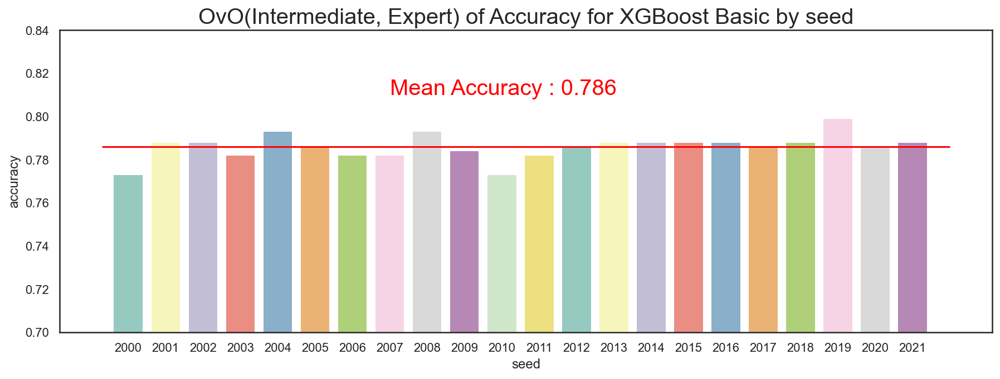

In [330]:
with sns.axes_style('white'):
    plt.figure(figsize=(15,5))
    plt.ylim(0.7, 0.84)
    sns.barplot(x = "seed", y = "accuracy", data = acc_df, palette='Set3')
    plt.title("OvO(Intermediate, Expert) of Accuracy for XGBoost Basic by seed", fontsize = 20)
    plt.hlines(round(np.mean(acc_df.accuracy), 3), -0.7, 22, color='red')
    plt.text(7, 0.81,'Mean Accuracy : 0.786', fontdict = {'fontsize' : 20}, color = 'red')

In [331]:
seeds[acc_ls.index(max(acc_ls))]

2019

In [332]:
themodel = xgboost.XGBClassifier(booster='gbtree', learning_rate = 0.1, n_estimators = 100, max_depth = 6, min_child_weight = 2, gamma = 0.0, subsample = 0.9, colsample_bytree = 0.6, alpha = 0.0, use_label_encoder=False, seed = seeds[acc_ls.index(max(acc_ls))])

fit_params={"early_stopping_rounds": 60, 
        "eval_metric" : "aucpr", 
        "eval_set" : [[Sec_X_val, Sec_y_val]]}

themodel.fit(Sec_X_train, Sec_y_train, **fit_params)

y_predict=themodel.predict(Sec_X_test)

y_predict_prob = themodel.predict_proba(Sec_X_test)

[0]	validation_0-aucpr:0.81891
[1]	validation_0-aucpr:0.86580
[2]	validation_0-aucpr:0.88103
[3]	validation_0-aucpr:0.89031
[4]	validation_0-aucpr:0.89869
[5]	validation_0-aucpr:0.89724
[6]	validation_0-aucpr:0.89639
[7]	validation_0-aucpr:0.89677
[8]	validation_0-aucpr:0.89697
[9]	validation_0-aucpr:0.89941
[10]	validation_0-aucpr:0.89983
[11]	validation_0-aucpr:0.90219
[12]	validation_0-aucpr:0.90148
[13]	validation_0-aucpr:0.90313
[14]	validation_0-aucpr:0.90276
[15]	validation_0-aucpr:0.90571
[16]	validation_0-aucpr:0.90729
[17]	validation_0-aucpr:0.90976
[18]	validation_0-aucpr:0.91178
[19]	validation_0-aucpr:0.91264
[20]	validation_0-aucpr:0.91521
[21]	validation_0-aucpr:0.91607
[22]	validation_0-aucpr:0.91719
[23]	validation_0-aucpr:0.91603
[24]	validation_0-aucpr:0.91749
[25]	validation_0-aucpr:0.91698
[26]	validation_0-aucpr:0.91812
[27]	validation_0-aucpr:0.91901
[28]	validation_0-aucpr:0.91898
[29]	validation_0-aucpr:0.92044
[30]	validation_0-aucpr:0.91978
[31]	validation_0-


정확도: 0.7991
정밀도: 0.6763
재현율: 0.6667
F1: 0.6714
ROC AUC: 0.7624
Average Precision: 0.5535


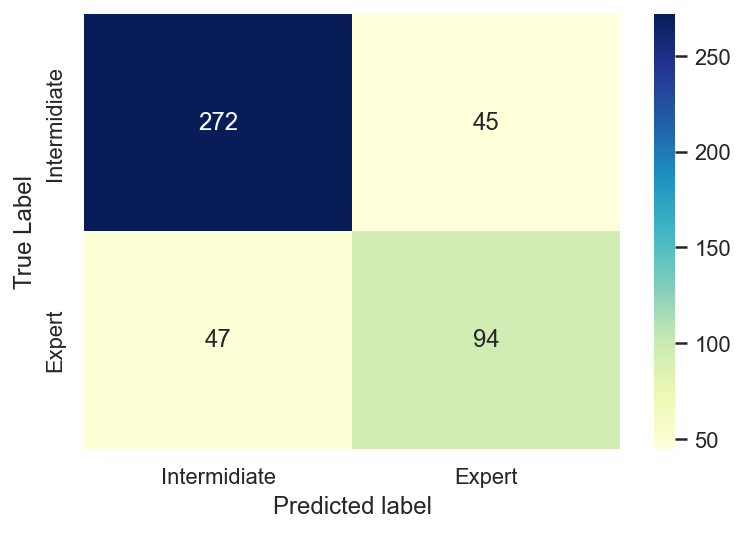

In [333]:
LABELS = ['Intermidiate', 'Expert']
sns.heatmap(confusion_matrix(Sec_y_test,y_predict),annot=True, xticklabels=LABELS, yticklabels=LABELS, fmt='d',cmap='YlGnBu')
plt.xlabel('Predicted label')
plt.ylabel('True Label')

get_clf_eval(Sec_y_test, y_predict)

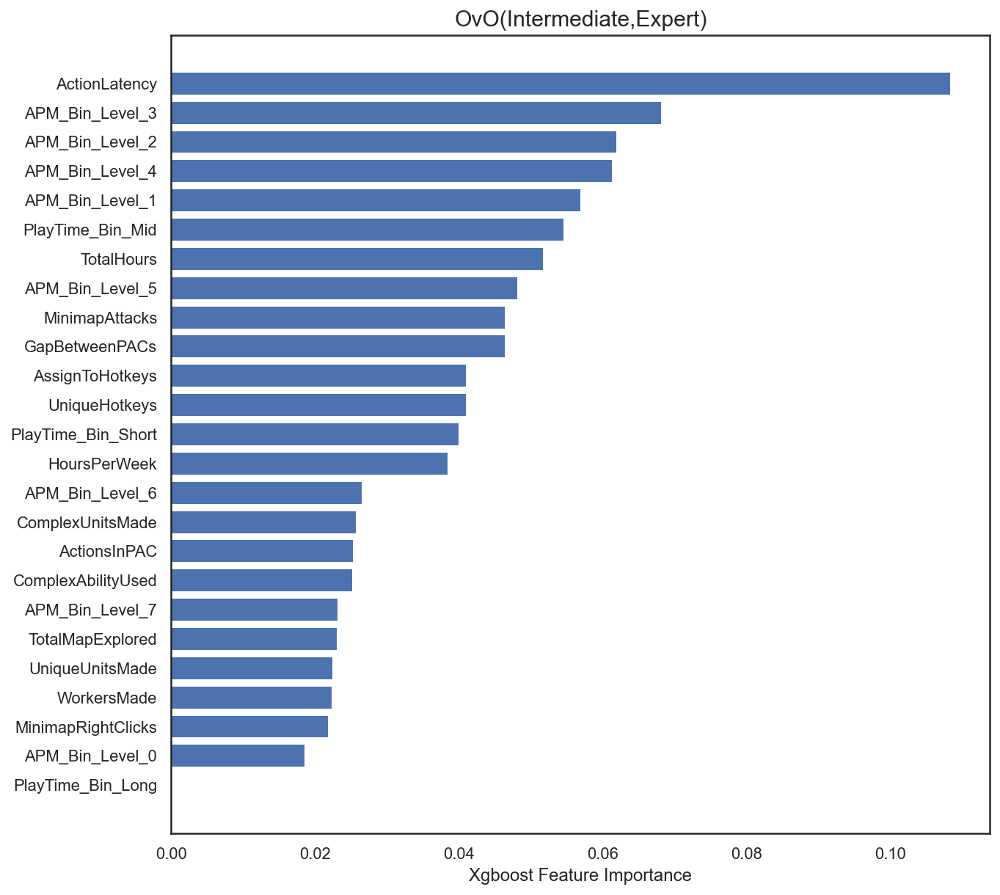

In [334]:
with sns.axes_style('white'):
    plt.figure(figsize=(10,10))
    sorted_idx = themodel.feature_importances_.argsort()
    plt.barh(list(Sec_X_train.columns[sorted_idx]), themodel.feature_importances_[sorted_idx])
    plt.title("OvO(Intermediate,Expert)", fontdict = {'fontsize' : 15})
    plt.xlabel("Xgboost Feature Importance")

## XGBoost : Novice vs Master (초보자 vs 전문가)

### Split train and test

In [335]:
# LeagueLevel에 대해 Novice를 0, Master를 1로 변경한다.
def LeagueThirdFunction(x):
    if x == 0:
        return 0
    else:
        return 1

In [336]:
NovMasSkillCraft_df['LeagueLevel'] = NovMasSkillCraft_df['LeagueLevel'].apply(LeagueThirdFunction)

In [337]:
NovMasSkillCraft_df.LeagueLevel.describe()

count    1735.000000
mean        0.406916
std         0.491401
min         0.000000
25%         0.000000
50%         0.000000
75%         1.000000
max         1.000000
Name: LeagueLevel, dtype: float64

In [338]:
# LeagueLevel에 대해 먼저 나누어 준다.
NovMas_target = NovMasSkillCraft_df.LeagueLevel

In [339]:
# LeagueLevel제거
NovMasSkillCraft_df.drop(['LeagueLevel'], axis=1, inplace=True)

In [340]:
# o과 1의 비율은?
# 0의 비율
# 1의 비율
sum(NovMas_target == 0) / len(NovMas_target), sum(NovMas_target == 1) / len(NovMas_target)

(0.5930835734870317, 0.4069164265129683)

In [341]:
# 각 클래스별 개수
sum(NovMas_target == 0), sum(NovMas_target == 1), len(NovMas_target)

(1029, 706, 1735)

In [342]:
# 대략 60 : 40
# 별도로 오버샘플링을 하지 않음

In [343]:
# train/test 80 : 20
Third_X_train, Third_X_test, Third_y_train, Third_y_test = train_test_split(NovMasSkillCraft_df, NovMas_target,test_size = 0.2, shuffle=True, stratify=NovMas_target, random_state=2022)

In [344]:
# train/val 60 : 20 (80을 3:1로 등분한다면?, 0.25 비율 (1/4))
Third_X_train, Third_X_val, Third_y_train, Third_y_val = train_test_split(Third_X_train, Third_y_train,
                                                                   test_size = 0.25, shuffle=True,
                                                                   stratify=Third_y_train, random_state=2022)

In [345]:
len(Third_X_train), len(Third_X_val), len(Third_X_test)

(1041, 347, 347)

### Modeling : Tuning Guide - GridSearch & Early Stopting

In [346]:
learning_rate = [i/10.0 for i in range(1,5)]
n_estimators = [i for i in range(100, 300, 10)]
max_depth = 4
min_child_weight = 1
gamma = 0
subsample = 0.5
colsample_bytree = 0.5

In [347]:
xgb_clf = xgboost.XGBClassifier(use_label_encoder=False, objective = 'binary:logistic')

param_grid = {'booster':['gbtree'], 
              'learning_rate' : learning_rate,
              'n_estimators' : n_estimators,
              'max_depth' : [max_depth],
              'min_child_weight' : [min_child_weight],
              'gamma' : [gamma],
              'subsample' : [subsample],
               'colsample_bytree' : [colsample_bytree]}

fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "auc", 
            "eval_set" : [[Third_X_val, Third_y_val]]}


grid_search = GridSearchCV(estimator=xgb_clf, 
                           param_grid=param_grid,
                           n_jobs=-1,
                           cv=list(StratifiedKFold(n_splits=5).split(Third_X_train, Third_y_train)))

results=grid_search.fit(Third_X_train, Third_y_train, **fit_params)

results.best_params_

[0]	validation_0-auc:0.84993
[1]	validation_0-auc:0.94259
[2]	validation_0-auc:0.96805
[3]	validation_0-auc:0.96939
[0]	validation_0-auc:0.85359
[4]	validation_0-auc:0.97401
[0]	validation_0-auc:0.85196
[0]	validation_0-auc:0.83585
[0]	validation_0-auc:0.85359
[0]	validation_0-auc:0.82039
[0]	validation_0-auc:0.84993
[1]	validation_0-auc:0.88794
[1]	validation_0-auc:0.87281
[5]	validation_0-auc:0.97294
[1]	validation_0-auc:0.87479
[1]	validation_0-auc:0.85043
[1]	validation_0-auc:0.88794
[1]	validation_0-auc:0.94259
[2]	validation_0-auc:0.92381
[0]	validation_0-auc:0.85196
[2]	validation_0-auc:0.91195
[2]	validation_0-auc:0.92381
[6]	validation_0-auc:0.97199
[2]	validation_0-auc:0.91550
[2]	validation_0-auc:0.90482
[2]	validation_0-auc:0.96805
[3]	validation_0-auc:0.94538
[1]	validation_0-auc:0.87281
[3]	validation_0-auc:0.92865
[3]	validation_0-auc:0.94538
[3]	validation_0-auc:0.96939
[3]	validation_0-auc:0.93779
[7]	validation_0-auc:0.97258
[3]	validation_0-auc:0.93305
[4]	validation

[42]	validation_0-auc:0.98172
[38]	validation_0-auc:0.97879
[39]	validation_0-auc:0.98027
[38]	validation_0-auc:0.98241
[39]	validation_0-auc:0.98027
[38]	validation_0-auc:0.98120
[38]	validation_0-auc:0.98148
[37]	validation_0-auc:0.97838
[43]	validation_0-auc:0.98244
[39]	validation_0-auc:0.97914
[39]	validation_0-auc:0.98265
[40]	validation_0-auc:0.98086
[40]	validation_0-auc:0.98086
[39]	validation_0-auc:0.98127
[39]	validation_0-auc:0.98124
[38]	validation_0-auc:0.97879
[44]	validation_0-auc:0.98203
[40]	validation_0-auc:0.97945
[40]	validation_0-auc:0.98334
[41]	validation_0-auc:0.98048
[41]	validation_0-auc:0.98048
[40]	validation_0-auc:0.98137
[39]	validation_0-auc:0.97914
[40]	validation_0-auc:0.98155
[45]	validation_0-auc:0.98203
[41]	validation_0-auc:0.97931
[41]	validation_0-auc:0.98303
[42]	validation_0-auc:0.98072
[42]	validation_0-auc:0.98072
[41]	validation_0-auc:0.98175
[40]	validation_0-auc:0.97945
[41]	validation_0-auc:0.98103
[46]	validation_0-auc:0.98189
[43]	valid

[82]	validation_0-auc:0.98100
[83]	validation_0-auc:0.98230
[83]	validation_0-auc:0.98103
[84]	validation_0-auc:0.97972
[83]	validation_0-auc:0.98103
[81]	validation_0-auc:0.97965
[82]	validation_0-auc:0.98158
[88]	validation_0-auc:0.98234
[84]	validation_0-auc:0.98234
[83]	validation_0-auc:0.98110
[85]	validation_0-auc:0.97989
[84]	validation_0-auc:0.98100
[82]	validation_0-auc:0.97993
[89]	validation_0-auc:0.98265
[83]	validation_0-auc:0.98134
[84]	validation_0-auc:0.98100
[84]	validation_0-auc:0.98117
[86]	validation_0-auc:0.97962
[85]	validation_0-auc:0.98234
[85]	validation_0-auc:0.98086
[84]	validation_0-auc:0.98151
[85]	validation_0-auc:0.98086
[83]	validation_0-auc:0.97982
[90]	validation_0-auc:0.98268
[87]	validation_0-auc:0.97965
[85]	validation_0-auc:0.98134
[86]	validation_0-auc:0.98234
[85]	validation_0-auc:0.98103
[86]	validation_0-auc:0.98106
[86]	validation_0-auc:0.98106
[91]	validation_0-auc:0.98272
[84]	validation_0-auc:0.97972
[88]	validation_0-auc:0.97986
[86]	valid

[25]	validation_0-auc:0.97707
[26]	validation_0-auc:0.98020
[17]	validation_0-auc:0.98230
[25]	validation_0-auc:0.98000
[16]	validation_0-auc:0.97976
[30]	validation_0-auc:0.98189
[15]	validation_0-auc:0.97900
[27]	validation_0-auc:0.98137
[27]	validation_0-auc:0.98013
[26]	validation_0-auc:0.97693
[18]	validation_0-auc:0.98237
[26]	validation_0-auc:0.97945
[17]	validation_0-auc:0.98093
[31]	validation_0-auc:0.98248
[16]	validation_0-auc:0.97969
[28]	validation_0-auc:0.98113
[28]	validation_0-auc:0.98106
[18]	validation_0-auc:0.98148
[27]	validation_0-auc:0.97755
[27]	validation_0-auc:0.98024
[19]	validation_0-auc:0.98230
[29]	validation_0-auc:0.98058
[32]	validation_0-auc:0.98223
[17]	validation_0-auc:0.98055
[29]	validation_0-auc:0.98155
[28]	validation_0-auc:0.97759
[28]	validation_0-auc:0.98031
[19]	validation_0-auc:0.98206
[30]	validation_0-auc:0.98065
[20]	validation_0-auc:0.98275
[33]	validation_0-auc:0.98241
[18]	validation_0-auc:0.98069
[30]	validation_0-auc:0.98110
[29]	valid

[70]	validation_0-auc:0.98244
[60]	validation_0-auc:0.98337
[58]	validation_0-auc:0.98279
[69]	validation_0-auc:0.98113
[74]	validation_0-auc:0.98189
[69]	validation_0-auc:0.97993
[60]	validation_0-auc:0.98162
[70]	validation_0-auc:0.98213
[71]	validation_0-auc:0.98189
[61]	validation_0-auc:0.98330
[75]	validation_0-auc:0.98179
[70]	validation_0-auc:0.98082
[59]	validation_0-auc:0.98272
[70]	validation_0-auc:0.98010
[61]	validation_0-auc:0.98206
[71]	validation_0-auc:0.98193
[72]	validation_0-auc:0.98206
[62]	validation_0-auc:0.98351
[76]	validation_0-auc:0.98186
[71]	validation_0-auc:0.98079
[60]	validation_0-auc:0.98303
[71]	validation_0-auc:0.97962
[62]	validation_0-auc:0.98196
[72]	validation_0-auc:0.98168
[73]	validation_0-auc:0.98251
[63]	validation_0-auc:0.98320
[77]	validation_0-auc:0.98165
[72]	validation_0-auc:0.98086
[72]	validation_0-auc:0.97979
[61]	validation_0-auc:0.98299
[73]	validation_0-auc:0.98144
[63]	validation_0-auc:0.98179
[64]	validation_0-auc:0.98334
[74]	valid

[4]	validation_0-auc:0.94727
[8]	validation_0-auc:0.97225
[105]	validation_0-auc:0.98100
[106]	validation_0-auc:0.98320
[108]	validation_0-auc:0.98076
[117]	validation_0-auc:0.98255
[115]	validation_0-auc:0.98134
[106]	validation_0-auc:0.98079
[5]	validation_0-auc:0.95566
[9]	validation_0-auc:0.97414
[109]	validation_0-auc:0.98082
[107]	validation_0-auc:0.98306
[118]	validation_0-auc:0.98251
[116]	validation_0-auc:0.98134
[6]	validation_0-auc:0.95999
[110]	validation_0-auc:0.98079
[107]	validation_0-auc:0.98113
[108]	validation_0-auc:0.98289
[0]	validation_0-auc:0.83585
[10]	validation_0-auc:0.97349
[119]	validation_0-auc:0.98255
[117]	validation_0-auc:0.98096
[111]	validation_0-auc:0.98079
[7]	validation_0-auc:0.96685
[109]	validation_0-auc:0.98268
[108]	validation_0-auc:0.98093
[1]	validation_0-auc:0.87479
[118]	validation_0-auc:0.98106
[11]	validation_0-auc:0.97294
[112]	validation_0-auc:0.98069
[8]	validation_0-auc:0.96753
[110]	validation_0-auc:0.98279
[109]	validation_0-auc:0.981

[31]	validation_0-auc:0.98048
[42]	validation_0-auc:0.97986
[32]	validation_0-auc:0.98113
[14]	validation_0-auc:0.97993
[29]	validation_0-auc:0.97731
[34]	validation_0-auc:0.98103
[46]	validation_0-auc:0.98065
[36]	validation_0-auc:0.98268
[43]	validation_0-auc:0.97989
[33]	validation_0-auc:0.98120
[30]	validation_0-auc:0.97814
[15]	validation_0-auc:0.98076
[32]	validation_0-auc:0.98027
[35]	validation_0-auc:0.98093
[37]	validation_0-auc:0.98251
[47]	validation_0-auc:0.98117
[33]	validation_0-auc:0.97996
[44]	validation_0-auc:0.98027
[34]	validation_0-auc:0.98148
[31]	validation_0-auc:0.97893
[16]	validation_0-auc:0.98062
[36]	validation_0-auc:0.98079
[38]	validation_0-auc:0.98241
[48]	validation_0-auc:0.98120
[34]	validation_0-auc:0.98082
[45]	validation_0-auc:0.97989
[35]	validation_0-auc:0.98179
[17]	validation_0-auc:0.98230
[32]	validation_0-auc:0.97821
[37]	validation_0-auc:0.98100
[39]	validation_0-auc:0.98265
[49]	validation_0-auc:0.98131
[35]	validation_0-auc:0.98062
[46]	valid

[90]	validation_0-auc:0.98165
[80]	validation_0-auc:0.98148
[87]	validation_0-auc:0.97965
[77]	validation_0-auc:0.98279
[81]	validation_0-auc:0.98137
[57]	validation_0-auc:0.98378
[74]	validation_0-auc:0.97924
[77]	validation_0-auc:0.98041
[91]	validation_0-auc:0.98137
[88]	validation_0-auc:0.97986
[81]	validation_0-auc:0.98093
[58]	validation_0-auc:0.98354
[78]	validation_0-auc:0.98268
[82]	validation_0-auc:0.98158
[75]	validation_0-auc:0.97931
[78]	validation_0-auc:0.98089
[83]	validation_0-auc:0.98134
[92]	validation_0-auc:0.98175
[89]	validation_0-auc:0.97986
[82]	validation_0-auc:0.98100
[59]	validation_0-auc:0.98358
[79]	validation_0-auc:0.98258
[79]	validation_0-auc:0.98113
[76]	validation_0-auc:0.97945
[90]	validation_0-auc:0.97989
[84]	validation_0-auc:0.98151
[60]	validation_0-auc:0.98337
[93]	validation_0-auc:0.98199
[83]	validation_0-auc:0.98110
[80]	validation_0-auc:0.98237
[80]	validation_0-auc:0.98076
[77]	validation_0-auc:0.97948
[91]	validation_0-auc:0.97986
[85]	valid

[14]	validation_0-auc:0.97831
[124]	validation_0-auc:0.98237
[122]	validation_0-auc:0.98086
[12]	validation_0-auc:0.97835
[103]	validation_0-auc:0.98045
[11]	validation_0-auc:0.97294
[2]	validation_0-auc:0.91550
[15]	validation_0-auc:0.97982
[5]	validation_0-auc:0.95566
[125]	validation_0-auc:0.98241
[123]	validation_0-auc:0.98065
[104]	validation_0-auc:0.98051
[13]	validation_0-auc:0.97962
[12]	validation_0-auc:0.97473
[3]	validation_0-auc:0.93305
[16]	validation_0-auc:0.97976
[6]	validation_0-auc:0.95999
[126]	validation_0-auc:0.98227
[124]	validation_0-auc:0.98096
[105]	validation_0-auc:0.98041
[13]	validation_0-auc:0.97679
[14]	validation_0-auc:0.98024
[4]	validation_0-auc:0.95247
[17]	validation_0-auc:0.98093
[7]	validation_0-auc:0.96685
[127]	validation_0-auc:0.98217
[125]	validation_0-auc:0.98055
[106]	validation_0-auc:0.98055
[15]	validation_0-auc:0.97900
[14]	validation_0-auc:0.97748
[5]	validation_0-auc:0.96115
[18]	validation_0-auc:0.98148
[107]	validation_0-auc:0.98089
[128

[21]	validation_0-auc:0.98103
[39]	validation_0-auc:0.98265
[42]	validation_0-auc:0.97986
[51]	validation_0-auc:0.98327
[49]	validation_0-auc:0.98131
[27]	validation_0-auc:0.98137
[53]	validation_0-auc:0.98227
[20]	validation_0-auc:0.98069
[22]	validation_0-auc:0.98082
[40]	validation_0-auc:0.98334
[43]	validation_0-auc:0.97989
[52]	validation_0-auc:0.98296
[28]	validation_0-auc:0.98113
[50]	validation_0-auc:0.98148
[21]	validation_0-auc:0.98045
[54]	validation_0-auc:0.98220
[23]	validation_0-auc:0.97986
[41]	validation_0-auc:0.98303
[44]	validation_0-auc:0.98027
[53]	validation_0-auc:0.98282
[51]	validation_0-auc:0.98134
[29]	validation_0-auc:0.98155
[22]	validation_0-auc:0.98024
[55]	validation_0-auc:0.98196
[42]	validation_0-auc:0.98327
[24]	validation_0-auc:0.97927
[54]	validation_0-auc:0.98272
[45]	validation_0-auc:0.97989
[52]	validation_0-auc:0.98172
[23]	validation_0-auc:0.97962
[30]	validation_0-auc:0.98110
[56]	validation_0-auc:0.98162
[43]	validation_0-auc:0.98306
[25]	valid

[70]	validation_0-auc:0.98213
[97]	validation_0-auc:0.98131
[84]	validation_0-auc:0.98151
[94]	validation_0-auc:0.98175
[98]	validation_0-auc:0.98337
[88]	validation_0-auc:0.97986
[66]	validation_0-auc:0.98268
[65]	validation_0-auc:0.98110
[98]	validation_0-auc:0.98131
[71]	validation_0-auc:0.98193
[85]	validation_0-auc:0.98134
[99]	validation_0-auc:0.98347
[67]	validation_0-auc:0.98268
[95]	validation_0-auc:0.98175
[89]	validation_0-auc:0.97986
[66]	validation_0-auc:0.98113
[99]	validation_0-auc:0.98137
[72]	validation_0-auc:0.98168
[86]	validation_0-auc:0.98106
[90]	validation_0-auc:0.97989
[100]	validation_0-auc:0.98327
[96]	validation_0-auc:0.98175
[68]	validation_0-auc:0.98289
[100]	validation_0-auc:0.98144
[67]	validation_0-auc:0.98086
[73]	validation_0-auc:0.98144
[87]	validation_0-auc:0.98103
[101]	validation_0-auc:0.98144
[97]	validation_0-auc:0.98193
[91]	validation_0-auc:0.97986
[101]	validation_0-auc:0.98323
[69]	validation_0-auc:0.98244
[68]	validation_0-auc:0.98106
[74]	v

[112]	validation_0-auc:0.98251
[1]	validation_0-auc:0.94259
[110]	validation_0-auc:0.98141
[14]	validation_0-auc:0.97831
[15]	validation_0-auc:0.98076
[28]	validation_0-auc:0.97759
[141]	validation_0-auc:0.97962
[147]	validation_0-auc:0.98110
[111]	validation_0-auc:0.98141
[2]	validation_0-auc:0.96805
[113]	validation_0-auc:0.98286
[15]	validation_0-auc:0.97982
[16]	validation_0-auc:0.98062
[29]	validation_0-auc:0.97731
[142]	validation_0-auc:0.98003
[148]	validation_0-auc:0.98093
[112]	validation_0-auc:0.98137
[114]	validation_0-auc:0.98286
[30]	validation_0-auc:0.97814
[3]	validation_0-auc:0.96939
[16]	validation_0-auc:0.97976
[17]	validation_0-auc:0.98230
[143]	validation_0-auc:0.98000
[149]	validation_0-auc:0.98072
[113]	validation_0-auc:0.98134
[115]	validation_0-auc:0.98292
[31]	validation_0-auc:0.97893
[4]	validation_0-auc:0.97401
[144]	validation_0-auc:0.97976
[17]	validation_0-auc:0.98093
[18]	validation_0-auc:0.98237
[114]	validation_0-auc:0.98120
[116]	validation_0-auc:0.982

[67]	validation_0-auc:0.97986
[153]	validation_0-auc:0.97945
[54]	validation_0-auc:0.98220
[28]	validation_0-auc:0.97759
[55]	validation_0-auc:0.98420
[155]	validation_0-auc:0.98076
[35]	validation_0-auc:0.98062
[68]	validation_0-auc:0.97969
[41]	validation_0-auc:0.98175
[55]	validation_0-auc:0.98196
[29]	validation_0-auc:0.97731
[156]	validation_0-auc:0.98079
[36]	validation_0-auc:0.98065
[56]	validation_0-auc:0.98399
[69]	validation_0-auc:0.97993
[42]	validation_0-auc:0.98172
[56]	validation_0-auc:0.98162
[30]	validation_0-auc:0.97814
[37]	validation_0-auc:0.98027
[57]	validation_0-auc:0.98378
[0]	validation_0-auc:0.83585
[70]	validation_0-auc:0.98010
[43]	validation_0-auc:0.98244
[57]	validation_0-auc:0.98175
[31]	validation_0-auc:0.97893
[38]	validation_0-auc:0.98024
[1]	validation_0-auc:0.87479
[71]	validation_0-auc:0.97962
[58]	validation_0-auc:0.98354
[44]	validation_0-auc:0.98203
[58]	validation_0-auc:0.98168
[32]	validation_0-auc:0.97821
[72]	validation_0-auc:0.97979
[45]	vali

[72]	validation_0-auc:0.97979
[86]	validation_0-auc:0.98234
[100]	validation_0-auc:0.98051
[100]	validation_0-auc:0.98144
[115]	validation_0-auc:0.97938
[39]	validation_0-auc:0.98124
[80]	validation_0-auc:0.98076
[73]	validation_0-auc:0.97948
[101]	validation_0-auc:0.98045
[41]	validation_0-auc:0.98303
[87]	validation_0-auc:0.98241
[101]	validation_0-auc:0.98144
[40]	validation_0-auc:0.98155
[81]	validation_0-auc:0.98058
[74]	validation_0-auc:0.97924
[102]	validation_0-auc:0.98065
[42]	validation_0-auc:0.98327
[102]	validation_0-auc:0.98148
[88]	validation_0-auc:0.98234
[82]	validation_0-auc:0.98079
[41]	validation_0-auc:0.98103
[75]	validation_0-auc:0.97931
[43]	validation_0-auc:0.98306
[103]	validation_0-auc:0.98045
[0]	validation_0-auc:0.84993
[103]	validation_0-auc:0.98144
[89]	validation_0-auc:0.98265
[83]	validation_0-auc:0.98103
[42]	validation_0-auc:0.98120
[76]	validation_0-auc:0.97945
[104]	validation_0-auc:0.98051
[44]	validation_0-auc:0.98306
[1]	validation_0-auc:0.94259
[1

[1]	validation_0-auc:0.87479
[30]	validation_0-auc:0.97814
[29]	validation_0-auc:0.98020
[40]	validation_0-auc:0.98137
[126]	validation_0-auc:0.98058
[133]	validation_0-auc:0.98213
[84]	validation_0-auc:0.98117
[85]	validation_0-auc:0.98134
[41]	validation_0-auc:0.98175
[31]	validation_0-auc:0.97893
[2]	validation_0-auc:0.91550
[30]	validation_0-auc:0.98024
[127]	validation_0-auc:0.98038
[85]	validation_0-auc:0.98103
[134]	validation_0-auc:0.98186
[86]	validation_0-auc:0.98106
[42]	validation_0-auc:0.98172
[32]	validation_0-auc:0.97821
[3]	validation_0-auc:0.93305
[31]	validation_0-auc:0.98048
[128]	validation_0-auc:0.98034
[135]	validation_0-auc:0.98189
[87]	validation_0-auc:0.98103
[86]	validation_0-auc:0.98100
[32]	validation_0-auc:0.98027
[43]	validation_0-auc:0.98244
[33]	validation_0-auc:0.97859
[129]	validation_0-auc:0.98045
[4]	validation_0-auc:0.95247
[136]	validation_0-auc:0.98193
[87]	validation_0-auc:0.98131
[88]	validation_0-auc:0.98103
[44]	validation_0-auc:0.98203
[33]	v

[75]	validation_0-auc:0.98055
[75]	validation_0-auc:0.97931
[44]	validation_0-auc:0.98306
[19]	validation_0-auc:0.98206
[87]	validation_0-auc:0.98241
[16]	validation_0-auc:0.97876
[15]	validation_0-auc:0.97528
[16]	validation_0-auc:0.97969
[76]	validation_0-auc:0.98079
[17]	validation_0-auc:0.97993
[76]	validation_0-auc:0.97945
[45]	validation_0-auc:0.98310
[20]	validation_0-auc:0.98210
[77]	validation_0-auc:0.98041
[88]	validation_0-auc:0.98234
[16]	validation_0-auc:0.97459
[17]	validation_0-auc:0.98055
[18]	validation_0-auc:0.98031
[78]	validation_0-auc:0.98089
[77]	validation_0-auc:0.97948
[46]	validation_0-auc:0.98341
[21]	validation_0-auc:0.98193
[89]	validation_0-auc:0.98265
[17]	validation_0-auc:0.97607
[18]	validation_0-auc:0.98069
[79]	validation_0-auc:0.98113
[22]	validation_0-auc:0.98131
[78]	validation_0-auc:0.97952
[90]	validation_0-auc:0.98268
[19]	validation_0-auc:0.97996
[18]	validation_0-auc:0.97748
[47]	validation_0-auc:0.98316
[19]	validation_0-auc:0.98062
[23]	valid

[3]	validation_0-auc:0.93305
[60]	validation_0-auc:0.98027
[121]	validation_0-auc:0.98086
[88]	validation_0-auc:0.98103
[133]	validation_0-auc:0.98213
[59]	validation_0-auc:0.97993
[63]	validation_0-auc:0.98179
[60]	validation_0-auc:0.98303
[122]	validation_0-auc:0.98086
[4]	validation_0-auc:0.95247
[61]	validation_0-auc:0.98038
[89]	validation_0-auc:0.98082
[60]	validation_0-auc:0.98020
[134]	validation_0-auc:0.98186
[61]	validation_0-auc:0.98299
[64]	validation_0-auc:0.98227
[123]	validation_0-auc:0.98065
[62]	validation_0-auc:0.98034
[90]	validation_0-auc:0.98082
[61]	validation_0-auc:0.98041
[5]	validation_0-auc:0.96115
[135]	validation_0-auc:0.98189
[65]	validation_0-auc:0.98217
[62]	validation_0-auc:0.98320
[124]	validation_0-auc:0.98096
[91]	validation_0-auc:0.98086
[63]	validation_0-auc:0.98034
[62]	validation_0-auc:0.98024
[136]	validation_0-auc:0.98193
[6]	validation_0-auc:0.96433
[63]	validation_0-auc:0.98337
[66]	validation_0-auc:0.98203
[125]	validation_0-auc:0.98055
[92]	

[11]	validation_0-auc:0.97294
[103]	validation_0-auc:0.97962
[105]	validation_0-auc:0.98337
[104]	validation_0-auc:0.98175
[44]	validation_0-auc:0.98306
[108]	validation_0-auc:0.98093
[18]	validation_0-auc:0.98148
[18]	validation_0-auc:0.98069
[104]	validation_0-auc:0.97955
[106]	validation_0-auc:0.98320
[105]	validation_0-auc:0.98179
[12]	validation_0-auc:0.97473
[109]	validation_0-auc:0.98124
[45]	validation_0-auc:0.98310
[19]	validation_0-auc:0.98062
[19]	validation_0-auc:0.98206
[105]	validation_0-auc:0.97945
[107]	validation_0-auc:0.98306
[106]	validation_0-auc:0.98144
[13]	validation_0-auc:0.97679
[46]	validation_0-auc:0.98341
[110]	validation_0-auc:0.98093
[20]	validation_0-auc:0.98210
[106]	validation_0-auc:0.97952
[20]	validation_0-auc:0.98020
[108]	validation_0-auc:0.98289
[107]	validation_0-auc:0.98179
[14]	validation_0-auc:0.97748
[111]	validation_0-auc:0.98058
[47]	validation_0-auc:0.98316
[21]	validation_0-auc:0.98193
[21]	validation_0-auc:0.98103
[107]	validation_0-auc:0

[90]	validation_0-auc:0.98082
[151]	validation_0-auc:0.97938
[61]	validation_0-auc:0.98206
[55]	validation_0-auc:0.98096
[29]	validation_0-auc:0.98237
[37]	validation_0-auc:0.97838
[63]	validation_0-auc:0.98337
[153]	validation_0-auc:0.98082
[152]	validation_0-auc:0.97927
[62]	validation_0-auc:0.98196
[91]	validation_0-auc:0.98086
[30]	validation_0-auc:0.98189
[56]	validation_0-auc:0.98106
[154]	validation_0-auc:0.98072
[64]	validation_0-auc:0.98303
[38]	validation_0-auc:0.97879
[63]	validation_0-auc:0.98179
[155]	validation_0-auc:0.98076
[92]	validation_0-auc:0.98120
[31]	validation_0-auc:0.98248
[57]	validation_0-auc:0.98113
[65]	validation_0-auc:0.98265
[39]	validation_0-auc:0.97914
[93]	validation_0-auc:0.98103
[156]	validation_0-auc:0.98079
[58]	validation_0-auc:0.98076
[64]	validation_0-auc:0.98227
[32]	validation_0-auc:0.98223
[66]	validation_0-auc:0.98268
[40]	validation_0-auc:0.97945
[94]	validation_0-auc:0.98082
[157]	validation_0-auc:0.98069
[65]	validation_0-auc:0.98217
[59

[36]	validation_0-auc:0.98162
[81]	validation_0-auc:0.97965
[108]	validation_0-auc:0.98289
[72]	validation_0-auc:0.98237
[106]	validation_0-auc:0.98079
[38]	validation_0-auc:0.98120
[20]	validation_0-auc:0.98069
[100]	validation_0-auc:0.98162
[82]	validation_0-auc:0.97993
[37]	validation_0-auc:0.98151
[109]	validation_0-auc:0.98268
[107]	validation_0-auc:0.98113
[73]	validation_0-auc:0.98210
[39]	validation_0-auc:0.98124
[101]	validation_0-auc:0.98155
[83]	validation_0-auc:0.97982
[108]	validation_0-auc:0.98093
[21]	validation_0-auc:0.98045
[38]	validation_0-auc:0.98148
[110]	validation_0-auc:0.98279
[74]	validation_0-auc:0.98189
[40]	validation_0-auc:0.98155
[84]	validation_0-auc:0.97972
[102]	validation_0-auc:0.98162
[109]	validation_0-auc:0.98124
[39]	validation_0-auc:0.98127
[111]	validation_0-auc:0.98255
[22]	validation_0-auc:0.98024
[75]	validation_0-auc:0.98179
[103]	validation_0-auc:0.98158
[41]	validation_0-auc:0.98103
[85]	validation_0-auc:0.97989
[110]	validation_0-auc:0.980

[63]	validation_0-auc:0.98034
[34]	validation_0-auc:0.97883
[82]	validation_0-auc:0.98248
[3]	validation_0-auc:0.93779
[156]	validation_0-auc:0.98079
[9]	validation_0-auc:0.97468
[64]	validation_0-auc:0.98093
[147]	validation_0-auc:0.97965
[83]	validation_0-auc:0.98110
[35]	validation_0-auc:0.97845
[83]	validation_0-auc:0.98230
[10]	validation_0-auc:0.97396
[4]	validation_0-auc:0.95836
[148]	validation_0-auc:0.97982
[84]	validation_0-auc:0.98117
[65]	validation_0-auc:0.98110
[36]	validation_0-auc:0.97848
[84]	validation_0-auc:0.98234
[149]	validation_0-auc:0.97976
[11]	validation_0-auc:0.97466
[5]	validation_0-auc:0.96191
[85]	validation_0-auc:0.98103
[66]	validation_0-auc:0.98113
[37]	validation_0-auc:0.97838
[85]	validation_0-auc:0.98234
[150]	validation_0-auc:0.97965
[12]	validation_0-auc:0.97697
[86]	validation_0-auc:0.98100
[6]	validation_0-auc:0.96525
[67]	validation_0-auc:0.98086
[86]	validation_0-auc:0.98234
[38]	validation_0-auc:0.97879
[0]	validation_0-auc:0.84993
[151]	valid

[76]	validation_0-auc:0.97945
[106]	validation_0-auc:0.98144
[43]	validation_0-auc:0.98062
[37]	validation_0-auc:0.98151
[10]	validation_0-auc:0.96791
[32]	validation_0-auc:0.98027
[127]	validation_0-auc:0.98217
[77]	validation_0-auc:0.97948
[51]	validation_0-auc:0.98389
[107]	validation_0-auc:0.98179
[44]	validation_0-auc:0.98062
[38]	validation_0-auc:0.98148
[11]	validation_0-auc:0.96843
[128]	validation_0-auc:0.98220
[33]	validation_0-auc:0.97996
[78]	validation_0-auc:0.97952
[52]	validation_0-auc:0.98437
[45]	validation_0-auc:0.98086
[39]	validation_0-auc:0.98127
[108]	validation_0-auc:0.98168
[12]	validation_0-auc:0.97067
[129]	validation_0-auc:0.98230
[34]	validation_0-auc:0.98082
[79]	validation_0-auc:0.97982
[109]	validation_0-auc:0.98168
[53]	validation_0-auc:0.98403
[46]	validation_0-auc:0.98117
[40]	validation_0-auc:0.98137
[130]	validation_0-auc:0.98217
[13]	validation_0-auc:0.97339
[35]	validation_0-auc:0.98062
[80]	validation_0-auc:0.98017
[110]	validation_0-auc:0.98141
[

[94]	validation_0-auc:0.98082
[3]	validation_0-auc:0.93779
[53]	validation_0-auc:0.98038
[75]	validation_0-auc:0.98055
[88]	validation_0-auc:0.98162
[12]	validation_0-auc:0.97697
[82]	validation_0-auc:0.98248
[95]	validation_0-auc:0.98100
[4]	validation_0-auc:0.95836
[76]	validation_0-auc:0.98079
[13]	validation_0-auc:0.97917
[54]	validation_0-auc:0.98038
[89]	validation_0-auc:0.98131
[83]	validation_0-auc:0.98230
[96]	validation_0-auc:0.98069
[77]	validation_0-auc:0.98041
[5]	validation_0-auc:0.96191
[55]	validation_0-auc:0.98106
[90]	validation_0-auc:0.98137
[84]	validation_0-auc:0.98234
[14]	validation_0-auc:0.97993
[97]	validation_0-auc:0.98072
[6]	validation_0-auc:0.96525
[78]	validation_0-auc:0.98089
[56]	validation_0-auc:0.98082
[91]	validation_0-auc:0.98137
[85]	validation_0-auc:0.98234
[0]	validation_0-auc:0.84993
[15]	validation_0-auc:0.98076
[98]	validation_0-auc:0.98079
[79]	validation_0-auc:0.98113
[7]	validation_0-auc:0.97070
[92]	validation_0-auc:0.98162
[86]	validation_

[19]	validation_0-auc:0.97793
[47]	validation_0-auc:0.98148
[122]	validation_0-auc:0.98086
[24]	validation_0-auc:0.98058
[130]	validation_0-auc:0.98217
[100]	validation_0-auc:0.97945
[56]	validation_0-auc:0.98399
[41]	validation_0-auc:0.98175
[20]	validation_0-auc:0.97941
[123]	validation_0-auc:0.98065
[48]	validation_0-auc:0.98134
[131]	validation_0-auc:0.98230
[101]	validation_0-auc:0.97938
[25]	validation_0-auc:0.98000
[42]	validation_0-auc:0.98172
[57]	validation_0-auc:0.98378
[21]	validation_0-auc:0.97835
[124]	validation_0-auc:0.98096
[49]	validation_0-auc:0.98124
[132]	validation_0-auc:0.98227
[102]	validation_0-auc:0.97955
[26]	validation_0-auc:0.97945
[58]	validation_0-auc:0.98354
[43]	validation_0-auc:0.98244
[125]	validation_0-auc:0.98055
[22]	validation_0-auc:0.97783
[50]	validation_0-auc:0.98175
[133]	validation_0-auc:0.98213
[103]	validation_0-auc:0.97962
[27]	validation_0-auc:0.98024
[59]	validation_0-auc:0.98358
[126]	validation_0-auc:0.98058
[44]	validation_0-auc:0.982

[100]	validation_0-auc:0.98051
[91]	validation_0-auc:0.98137
[63]	validation_0-auc:0.97993
[16]	validation_0-auc:0.97976
[101]	validation_0-auc:0.98045
[68]	validation_0-auc:0.98106
[85]	validation_0-auc:0.98234
[26]	validation_0-auc:0.98230
[13]	validation_0-auc:0.97962
[92]	validation_0-auc:0.98162
[17]	validation_0-auc:0.98093
[64]	validation_0-auc:0.98031
[102]	validation_0-auc:0.98065
[69]	validation_0-auc:0.98113
[86]	validation_0-auc:0.98234
[14]	validation_0-auc:0.98024
[27]	validation_0-auc:0.98193
[93]	validation_0-auc:0.98179
[103]	validation_0-auc:0.98045
[18]	validation_0-auc:0.98148
[65]	validation_0-auc:0.98034
[87]	validation_0-auc:0.98241
[70]	validation_0-auc:0.98082
[15]	validation_0-auc:0.97900
[94]	validation_0-auc:0.98172
[28]	validation_0-auc:0.98237
[104]	validation_0-auc:0.98051
[19]	validation_0-auc:0.98206
[66]	validation_0-auc:0.98031
[88]	validation_0-auc:0.98234
[71]	validation_0-auc:0.98079
[95]	validation_0-auc:0.98165
[16]	validation_0-auc:0.97969
[29]	

[107]	validation_0-auc:0.97952
[59]	validation_0-auc:0.98144
[29]	validation_0-auc:0.98020
[112]	validation_0-auc:0.98137
[69]	validation_0-auc:0.98310
[56]	validation_0-auc:0.98255
[132]	validation_0-auc:0.98227
[20]	validation_0-auc:0.97941
[108]	validation_0-auc:0.97962
[60]	validation_0-auc:0.98162
[113]	validation_0-auc:0.98134
[30]	validation_0-auc:0.98024
[57]	validation_0-auc:0.98258
[70]	validation_0-auc:0.98261
[133]	validation_0-auc:0.98213
[109]	validation_0-auc:0.97969
[21]	validation_0-auc:0.97835
[114]	validation_0-auc:0.98120
[61]	validation_0-auc:0.98206
[31]	validation_0-auc:0.98048
[58]	validation_0-auc:0.98279
[134]	validation_0-auc:0.98186
[71]	validation_0-auc:0.98268
[110]	validation_0-auc:0.97972
[22]	validation_0-auc:0.97783
[62]	validation_0-auc:0.98196
[115]	validation_0-auc:0.98134
[32]	validation_0-auc:0.98027
[59]	validation_0-auc:0.98272
[135]	validation_0-auc:0.98189
[72]	validation_0-auc:0.98237
[111]	validation_0-auc:0.97976
[116]	validation_0-auc:0.98

[73]	validation_0-auc:0.98079
[32]	validation_0-auc:0.98223
[105]	validation_0-auc:0.98100
[102]	validation_0-auc:0.98310
[17]	validation_0-auc:0.98093
[63]	validation_0-auc:0.97993
[4]	validation_0-auc:0.97401
[1]	validation_0-auc:0.88794
[106]	validation_0-auc:0.98079
[103]	validation_0-auc:0.98316
[33]	validation_0-auc:0.98241
[74]	validation_0-auc:0.98041
[18]	validation_0-auc:0.98148
[64]	validation_0-auc:0.98031
[107]	validation_0-auc:0.98113
[2]	validation_0-auc:0.92381
[104]	validation_0-auc:0.98320
[5]	validation_0-auc:0.97294
[34]	validation_0-auc:0.98306
[75]	validation_0-auc:0.98055
[19]	validation_0-auc:0.98206
[65]	validation_0-auc:0.98034
[105]	validation_0-auc:0.98337
[108]	validation_0-auc:0.98093
[3]	validation_0-auc:0.94538
[76]	validation_0-auc:0.98079
[6]	validation_0-auc:0.97199
[35]	validation_0-auc:0.98286
[66]	validation_0-auc:0.98031
[20]	validation_0-auc:0.98210
[106]	validation_0-auc:0.98320
[109]	validation_0-auc:0.98124
[77]	validation_0-auc:0.98041
[4]	va

[60]	validation_0-auc:0.98162
[42]	validation_0-auc:0.98072
[75]	validation_0-auc:0.98179
[46]	validation_0-auc:0.98189
[34]	validation_0-auc:0.97883
[109]	validation_0-auc:0.97969
[150]	validation_0-auc:0.98072
[119]	validation_0-auc:0.98103
[76]	validation_0-auc:0.98186
[61]	validation_0-auc:0.98206
[43]	validation_0-auc:0.98072
[151]	validation_0-auc:0.98069
[47]	validation_0-auc:0.98210
[110]	validation_0-auc:0.97972
[35]	validation_0-auc:0.97845
[120]	validation_0-auc:0.98106
[77]	validation_0-auc:0.98165
[62]	validation_0-auc:0.98196
[44]	validation_0-auc:0.98058
[152]	validation_0-auc:0.98076
[48]	validation_0-auc:0.98230
[111]	validation_0-auc:0.97976
[36]	validation_0-auc:0.97848
[78]	validation_0-auc:0.98162
[121]	validation_0-auc:0.98086
[49]	validation_0-auc:0.98244
[153]	validation_0-auc:0.98082
[63]	validation_0-auc:0.98179
[45]	validation_0-auc:0.98041
[112]	validation_0-auc:0.97965
[37]	validation_0-auc:0.97838
[122]	validation_0-auc:0.98086
[79]	validation_0-auc:0.9817

[34]	validation_0-auc:0.98306
[92]	validation_0-auc:0.98268
[8]	validation_0-auc:0.97225
[8]	validation_0-auc:0.97480
[80]	validation_0-auc:0.98017
[34]	validation_0-auc:0.98103
[88]	validation_0-auc:0.98117
[108]	validation_0-auc:0.98093
[9]	validation_0-auc:0.97414
[35]	validation_0-auc:0.98286
[9]	validation_0-auc:0.97315
[81]	validation_0-auc:0.97965
[93]	validation_0-auc:0.98272
[35]	validation_0-auc:0.98093
[109]	validation_0-auc:0.98124
[89]	validation_0-auc:0.98134
[10]	validation_0-auc:0.97349
[36]	validation_0-auc:0.98268
[94]	validation_0-auc:0.98296
[82]	validation_0-auc:0.97993
[10]	validation_0-auc:0.97666
[110]	validation_0-auc:0.98093
[36]	validation_0-auc:0.98079
[90]	validation_0-auc:0.98165
[95]	validation_0-auc:0.98323
[83]	validation_0-auc:0.97982
[37]	validation_0-auc:0.98251
[11]	validation_0-auc:0.97294
[11]	validation_0-auc:0.97690
[111]	validation_0-auc:0.98058
[37]	validation_0-auc:0.98100
[91]	validation_0-auc:0.98137
[96]	validation_0-auc:0.98320
[38]	valid

[131]	validation_0-auc:0.98027
[5]	validation_0-auc:0.96115
[34]	validation_0-auc:0.97883
[136]	validation_0-auc:0.98193
[49]	validation_0-auc:0.98131
[49]	validation_0-auc:0.98244
[76]	validation_0-auc:0.98186
[77]	validation_0-auc:0.98127
[35]	validation_0-auc:0.97845
[132]	validation_0-auc:0.98003
[137]	validation_0-auc:0.98182
[50]	validation_0-auc:0.98148
[6]	validation_0-auc:0.96433
[50]	validation_0-auc:0.98275
[77]	validation_0-auc:0.98165
[78]	validation_0-auc:0.98103
[36]	validation_0-auc:0.97848
[133]	validation_0-auc:0.98031
[138]	validation_0-auc:0.98144
[51]	validation_0-auc:0.98134
[7]	validation_0-auc:0.97103
[51]	validation_0-auc:0.98327
[78]	validation_0-auc:0.98162
[79]	validation_0-auc:0.98127
[134]	validation_0-auc:0.98013
[139]	validation_0-auc:0.98127
[37]	validation_0-auc:0.97838
[8]	validation_0-auc:0.97199
[52]	validation_0-auc:0.98172
[52]	validation_0-auc:0.98296
[80]	validation_0-auc:0.98148
[79]	validation_0-auc:0.98175
[135]	validation_0-auc:0.98003
[140]

[7]	validation_0-auc:0.97225
[48]	validation_0-auc:0.98347
[79]	validation_0-auc:0.97982
[22]	validation_0-auc:0.98131
[94]	validation_0-auc:0.98175
[95]	validation_0-auc:0.98323
[8]	validation_0-auc:0.96753
[8]	validation_0-auc:0.97225
[20]	validation_0-auc:0.98020
[49]	validation_0-auc:0.98320
[23]	validation_0-auc:0.98151
[80]	validation_0-auc:0.98017
[96]	validation_0-auc:0.98320
[95]	validation_0-auc:0.98175
[21]	validation_0-auc:0.98103
[9]	validation_0-auc:0.96767
[9]	validation_0-auc:0.97414
[24]	validation_0-auc:0.98210
[50]	validation_0-auc:0.98354
[81]	validation_0-auc:0.97965
[97]	validation_0-auc:0.98354
[22]	validation_0-auc:0.98082
[96]	validation_0-auc:0.98175
[10]	validation_0-auc:0.97349
[10]	validation_0-auc:0.96791
[25]	validation_0-auc:0.98168
[82]	validation_0-auc:0.97993
[51]	validation_0-auc:0.98389
[98]	validation_0-auc:0.98337
[23]	validation_0-auc:0.97986
[97]	validation_0-auc:0.98193
[11]	validation_0-auc:0.97294
[11]	validation_0-auc:0.96843
[52]	validation

[66]	validation_0-auc:0.98203
[142]	validation_0-auc:0.98003
[93]	validation_0-auc:0.98103
[142]	validation_0-auc:0.98127
[7]	validation_0-auc:0.97103
[51]	validation_0-auc:0.98134
[143]	validation_0-auc:0.98000
[53]	validation_0-auc:0.98038
[65]	validation_0-auc:0.98265
[67]	validation_0-auc:0.98206
[143]	validation_0-auc:0.98110
[94]	validation_0-auc:0.98082
[52]	validation_0-auc:0.98172
[8]	validation_0-auc:0.97199
[144]	validation_0-auc:0.97976
[68]	validation_0-auc:0.98213
[144]	validation_0-auc:0.98124
[66]	validation_0-auc:0.98268
[54]	validation_0-auc:0.98038
[95]	validation_0-auc:0.98100
[53]	validation_0-auc:0.98120
[9]	validation_0-auc:0.97468
[145]	validation_0-auc:0.97955
[145]	validation_0-auc:0.98124
[69]	validation_0-auc:0.98199
[67]	validation_0-auc:0.98268
[55]	validation_0-auc:0.98106
[96]	validation_0-auc:0.98069
[54]	validation_0-auc:0.98106
[146]	validation_0-auc:0.97955
[10]	validation_0-auc:0.97396
[146]	validation_0-auc:0.98106
[70]	validation_0-auc:0.98213
[97

[97]	validation_0-auc:0.97982
[49]	validation_0-auc:0.98320
[111]	validation_0-auc:0.98255
[112]	validation_0-auc:0.98072
[31]	validation_0-auc:0.98165
[96]	validation_0-auc:0.98175
[22]	validation_0-auc:0.98024
[27]	validation_0-auc:0.98013
[98]	validation_0-auc:0.97976
[50]	validation_0-auc:0.98354
[112]	validation_0-auc:0.98251
[32]	validation_0-auc:0.98134
[99]	validation_0-auc:0.97965
[97]	validation_0-auc:0.98193
[23]	validation_0-auc:0.97962
[28]	validation_0-auc:0.98106
[51]	validation_0-auc:0.98389
[113]	validation_0-auc:0.98286
[98]	validation_0-auc:0.98196
[29]	validation_0-auc:0.98058
[100]	validation_0-auc:0.97945
[33]	validation_0-auc:0.98120
[0]	validation_0-auc:0.85196
[24]	validation_0-auc:0.98058
[52]	validation_0-auc:0.98437
[114]	validation_0-auc:0.98286
[99]	validation_0-auc:0.98193
[30]	validation_0-auc:0.98065
[101]	validation_0-auc:0.97938
[34]	validation_0-auc:0.98103
[1]	validation_0-auc:0.87281
[25]	validation_0-auc:0.98000
[115]	validation_0-auc:0.98292
[53]

[72]	validation_0-auc:0.98206
[0]	validation_0-auc:0.82039
[75]	validation_0-auc:0.98158
[143]	validation_0-auc:0.98000
[24]	validation_0-auc:0.98230
[67]	validation_0-auc:0.98086
[73]	validation_0-auc:0.98251
[42]	validation_0-auc:0.97986
[95]	validation_0-auc:0.98100
[144]	validation_0-auc:0.97976
[76]	validation_0-auc:0.98127
[1]	validation_0-auc:0.85043
[25]	validation_0-auc:0.98175
[68]	validation_0-auc:0.98106
[96]	validation_0-auc:0.98069
[43]	validation_0-auc:0.97989
[145]	validation_0-auc:0.97955
[74]	validation_0-auc:0.98282
[77]	validation_0-auc:0.98127
[2]	validation_0-auc:0.90482
[26]	validation_0-auc:0.98230
[69]	validation_0-auc:0.98113
[97]	validation_0-auc:0.98072
[44]	validation_0-auc:0.98027
[78]	validation_0-auc:0.98103
[146]	validation_0-auc:0.97955
[75]	validation_0-auc:0.98286
[3]	validation_0-auc:0.93779
[70]	validation_0-auc:0.98082
[27]	validation_0-auc:0.98193
[147]	validation_0-auc:0.97965
[98]	validation_0-auc:0.98079
[76]	validation_0-auc:0.98268
[45]	vali

[66]	validation_0-auc:0.98323
[112]	validation_0-auc:0.98137
[85]	validation_0-auc:0.97989
[119]	validation_0-auc:0.98255
[6]	validation_0-auc:0.95999
[42]	validation_0-auc:0.98120
[24]	validation_0-auc:0.98058
[31]	validation_0-auc:0.98134
[67]	validation_0-auc:0.98327
[86]	validation_0-auc:0.97962
[113]	validation_0-auc:0.98134
[120]	validation_0-auc:0.98255
[7]	validation_0-auc:0.96685
[25]	validation_0-auc:0.98000
[43]	validation_0-auc:0.98062
[32]	validation_0-auc:0.98113
[87]	validation_0-auc:0.97965
[68]	validation_0-auc:0.98358
[121]	validation_0-auc:0.98258
[114]	validation_0-auc:0.98120
[8]	validation_0-auc:0.96753
[44]	validation_0-auc:0.98062
[33]	validation_0-auc:0.98120
[26]	validation_0-auc:0.97945
[88]	validation_0-auc:0.97986
[69]	validation_0-auc:0.98310
[122]	validation_0-auc:0.98268
[45]	validation_0-auc:0.98086
[115]	validation_0-auc:0.98134
[9]	validation_0-auc:0.96767
[27]	validation_0-auc:0.98024
[34]	validation_0-auc:0.98148
[70]	validation_0-auc:0.98261
[89]	v

[12]	validation_0-auc:0.97697
[67]	validation_0-auc:0.98086
[49]	validation_0-auc:0.98048
[3]	validation_0-auc:0.97175
[75]	validation_0-auc:0.98286
[86]	validation_0-auc:0.98100
[7]	validation_0-auc:0.97070
[68]	validation_0-auc:0.98106
[50]	validation_0-auc:0.98041
[13]	validation_0-auc:0.97917
[4]	validation_0-auc:0.97471
[76]	validation_0-auc:0.98268
[87]	validation_0-auc:0.98131
[8]	validation_0-auc:0.97265
[69]	validation_0-auc:0.98113
[51]	validation_0-auc:0.98069
[14]	validation_0-auc:0.97993
[88]	validation_0-auc:0.98162
[77]	validation_0-auc:0.98279
[5]	validation_0-auc:0.97304
[0]	validation_0-auc:0.85359
[9]	validation_0-auc:0.97487
[70]	validation_0-auc:0.98082
[52]	validation_0-auc:0.98065
[15]	validation_0-auc:0.98076
[78]	validation_0-auc:0.98268
[89]	validation_0-auc:0.98131
[6]	validation_0-auc:0.97382
[71]	validation_0-auc:0.98079
[1]	validation_0-auc:0.87945
[10]	validation_0-auc:0.97442
[53]	validation_0-auc:0.98038
[16]	validation_0-auc:0.98062
[79]	validation_0-a

[47]	validation_0-auc:0.98223
[48]	validation_0-auc:0.98134
[94]	validation_0-auc:0.97958
[17]	validation_0-auc:0.97363
[113]	validation_0-auc:0.98134
[122]	validation_0-auc:0.98268
[43]	validation_0-auc:0.98010
[56]	validation_0-auc:0.98399
[95]	validation_0-auc:0.97962
[49]	validation_0-auc:0.98124
[48]	validation_0-auc:0.98251
[18]	validation_0-auc:0.97501
[114]	validation_0-auc:0.98120
[123]	validation_0-auc:0.98279
[44]	validation_0-auc:0.97993
[57]	validation_0-auc:0.98378
[50]	validation_0-auc:0.98175
[96]	validation_0-auc:0.97972
[49]	validation_0-auc:0.98251
[19]	validation_0-auc:0.97535
[124]	validation_0-auc:0.98237
[115]	validation_0-auc:0.98134
[45]	validation_0-auc:0.97969
[20]	validation_0-auc:0.97590
[125]	validation_0-auc:0.98241
[58]	validation_0-auc:0.98354
[51]	validation_0-auc:0.98206
[50]	validation_0-auc:0.98292
[97]	validation_0-auc:0.97982
[116]	validation_0-auc:0.98134
[46]	validation_0-auc:0.97965
[21]	validation_0-auc:0.97525
[51]	validation_0-auc:0.98327
[1

[89]	validation_0-auc:0.97907
[91]	validation_0-auc:0.98137
[20]	validation_0-auc:0.97879
[100]	validation_0-auc:0.98051
[7]	validation_0-auc:0.96588
[94]	validation_0-auc:0.98310
[3]	validation_0-auc:0.97175
[61]	validation_0-auc:0.97704
[90]	validation_0-auc:0.97886
[92]	validation_0-auc:0.98162
[21]	validation_0-auc:0.97848
[101]	validation_0-auc:0.98045
[95]	validation_0-auc:0.98313
[8]	validation_0-auc:0.96833
[4]	validation_0-auc:0.97471
[62]	validation_0-auc:0.97745
[91]	validation_0-auc:0.97893
[93]	validation_0-auc:0.98179
[22]	validation_0-auc:0.97800
[96]	validation_0-auc:0.98313
[63]	validation_0-auc:0.97697
[102]	validation_0-auc:0.98065
[92]	validation_0-auc:0.97931
[9]	validation_0-auc:0.97163
[5]	validation_0-auc:0.97304
[94]	validation_0-auc:0.98172
[97]	validation_0-auc:0.98310
[23]	validation_0-auc:0.97831
[103]	validation_0-auc:0.98045
[93]	validation_0-auc:0.97934
[64]	validation_0-auc:0.97669
[10]	validation_0-auc:0.97046
[6]	validation_0-auc:0.97382
[98]	validati

[33]	validation_0-auc:0.97525
[37]	validation_0-auc:0.97979
[48]	validation_0-auc:0.98251
[52]	validation_0-auc:0.97762
[31]	validation_0-auc:0.97893
[68]	validation_0-auc:0.98007
[34]	validation_0-auc:0.97590
[22]	validation_0-auc:0.97697
[8]	validation_0-auc:0.97690
[49]	validation_0-auc:0.98251
[38]	validation_0-auc:0.97979
[53]	validation_0-auc:0.97731
[69]	validation_0-auc:0.97976
[32]	validation_0-auc:0.97831
[35]	validation_0-auc:0.97614
[23]	validation_0-auc:0.97797
[50]	validation_0-auc:0.98292
[9]	validation_0-auc:0.97679
[39]	validation_0-auc:0.98013
[54]	validation_0-auc:0.97714
[70]	validation_0-auc:0.97965
[36]	validation_0-auc:0.97704
[51]	validation_0-auc:0.98327
[33]	validation_0-auc:0.97855
[24]	validation_0-auc:0.97841
[55]	validation_0-auc:0.97679
[10]	validation_0-auc:0.97800
[40]	validation_0-auc:0.97948
[52]	validation_0-auc:0.98320
[34]	validation_0-auc:0.97907
[71]	validation_0-auc:0.97955
[37]	validation_0-auc:0.97638
[25]	validation_0-auc:0.97797
[56]	validat

[12]	validation_0-auc:0.96974
[51]	validation_0-auc:0.98327
[67]	validation_0-auc:0.97669
[77]	validation_0-auc:0.97907
[97]	validation_0-auc:0.98310
[84]	validation_0-auc:0.97920
[78]	validation_0-auc:0.97866
[81]	validation_0-auc:0.97779
[52]	validation_0-auc:0.98320
[18]	validation_0-auc:0.97969
[13]	validation_0-auc:0.97246
[68]	validation_0-auc:0.97679
[98]	validation_0-auc:0.98286
[85]	validation_0-auc:0.97945
[82]	validation_0-auc:0.97828
[79]	validation_0-auc:0.97852
[14]	validation_0-auc:0.97094
[69]	validation_0-auc:0.97676
[53]	validation_0-auc:0.98268
[19]	validation_0-auc:0.97869
[99]	validation_0-auc:0.98286
[86]	validation_0-auc:0.97920
[83]	validation_0-auc:0.97793
[80]	validation_0-auc:0.97841
[70]	validation_0-auc:0.97659
[54]	validation_0-auc:0.98303
[100]	validation_0-auc:0.98258
[15]	validation_0-auc:0.97297
[20]	validation_0-auc:0.97883
[87]	validation_0-auc:0.97910
[84]	validation_0-auc:0.97776
[81]	validation_0-auc:0.97841
[71]	validation_0-auc:0.97652
[55]	vali

[29]	validation_0-auc:0.97690
[20]	validation_0-auc:0.97920
[31]	validation_0-auc:0.97893
[13]	validation_0-auc:0.97246
[17]	validation_0-auc:0.97859
[63]	validation_0-auc:0.97958
[101]	validation_0-auc:0.98275
[58]	validation_0-auc:0.97735
[30]	validation_0-auc:0.97711
[18]	validation_0-auc:0.97969
[21]	validation_0-auc:0.98000
[14]	validation_0-auc:0.97094
[32]	validation_0-auc:0.97831
[64]	validation_0-auc:0.98031
[102]	validation_0-auc:0.98272
[59]	validation_0-auc:0.97724
[31]	validation_0-auc:0.97810
[19]	validation_0-auc:0.97869
[22]	validation_0-auc:0.98110
[15]	validation_0-auc:0.97297
[65]	validation_0-auc:0.97996
[33]	validation_0-auc:0.97855
[103]	validation_0-auc:0.98282
[60]	validation_0-auc:0.97707
[20]	validation_0-auc:0.97883
[32]	validation_0-auc:0.97759
[23]	validation_0-auc:0.98072
[66]	validation_0-auc:0.97958
[16]	validation_0-auc:0.97259
[104]	validation_0-auc:0.98292
[34]	validation_0-auc:0.97907
[61]	validation_0-auc:0.97704
[33]	validation_0-auc:0.97793
[21]	v

[58]	validation_0-auc:0.97735
[67]	validation_0-auc:0.98182
[25]	validation_0-auc:0.97728
[107]	validation_0-auc:0.97755
[78]	validation_0-auc:0.97866
[65]	validation_0-auc:0.97996
[59]	validation_0-auc:0.97724
[68]	validation_0-auc:0.98272
[108]	validation_0-auc:0.97790
[26]	validation_0-auc:0.97855
[79]	validation_0-auc:0.97852
[66]	validation_0-auc:0.97958
[60]	validation_0-auc:0.97707
[69]	validation_0-auc:0.98220
[109]	validation_0-auc:0.97776
[27]	validation_0-auc:0.97824
[80]	validation_0-auc:0.97841
[0]	validation_0-auc:0.82039
[0]	validation_0-auc:0.84993
[67]	validation_0-auc:0.97934
[61]	validation_0-auc:0.97704
[70]	validation_0-auc:0.98241
[81]	validation_0-auc:0.97841
[28]	validation_0-auc:0.97817
[110]	validation_0-auc:0.97824
[1]	validation_0-auc:0.94214
[68]	validation_0-auc:0.97965
[1]	validation_0-auc:0.85043
[62]	validation_0-auc:0.97745
[71]	validation_0-auc:0.98186
[82]	validation_0-auc:0.97859
[111]	validation_0-auc:0.97824
[29]	validation_0-auc:0.97859
[69]	vali

[33]	validation_0-auc:0.98275
[63]	validation_0-auc:0.98076
[105]	validation_0-auc:0.97907
[23]	validation_0-auc:0.97752
[108]	validation_0-auc:0.98323
[99]	validation_0-auc:0.97800
[4]	validation_0-auc:0.95221
[33]	validation_0-auc:0.97793
[34]	validation_0-auc:0.98223
[64]	validation_0-auc:0.98065
[109]	validation_0-auc:0.98323
[106]	validation_0-auc:0.97862
[24]	validation_0-auc:0.97776
[100]	validation_0-auc:0.97762
[5]	validation_0-auc:0.95801
[34]	validation_0-auc:0.97755
[110]	validation_0-auc:0.98313
[35]	validation_0-auc:0.98286
[65]	validation_0-auc:0.98007
[107]	validation_0-auc:0.97862
[25]	validation_0-auc:0.97724
[101]	validation_0-auc:0.97786
[111]	validation_0-auc:0.98299
[35]	validation_0-auc:0.97790
[6]	validation_0-auc:0.96147
[108]	validation_0-auc:0.97866
[66]	validation_0-auc:0.98008
[36]	validation_0-auc:0.98323
[102]	validation_0-auc:0.97790
[26]	validation_0-auc:0.97779
[112]	validation_0-auc:0.98289
[109]	validation_0-auc:0.97831
[36]	validation_0-auc:0.97810


[107]	validation_0-auc:0.97855
[18]	validation_0-auc:0.97886
[30]	validation_0-auc:0.97900
[9]	validation_0-auc:0.97679
[74]	validation_0-auc:0.97597
[43]	validation_0-auc:0.97679
[63]	validation_0-auc:0.97958
[75]	validation_0-auc:0.98244
[108]	validation_0-auc:0.97841
[19]	validation_0-auc:0.97876
[44]	validation_0-auc:0.97742
[31]	validation_0-auc:0.97893
[75]	validation_0-auc:0.97562
[64]	validation_0-auc:0.98031
[10]	validation_0-auc:0.97800
[76]	validation_0-auc:0.98244
[109]	validation_0-auc:0.97835
[45]	validation_0-auc:0.97669
[65]	validation_0-auc:0.97996
[20]	validation_0-auc:0.97803
[76]	validation_0-auc:0.97487
[32]	validation_0-auc:0.97831
[11]	validation_0-auc:0.97772
[77]	validation_0-auc:0.98203
[110]	validation_0-auc:0.97828
[66]	validation_0-auc:0.97958
[46]	validation_0-auc:0.97714
[77]	validation_0-auc:0.97497
[21]	validation_0-auc:0.97759
[33]	validation_0-auc:0.97855
[12]	validation_0-auc:0.97762
[78]	validation_0-auc:0.98189
[111]	validation_0-auc:0.97810
[67]	v

[109]	validation_0-auc:0.97831
[35]	validation_0-auc:0.97614
[51]	validation_0-auc:0.98327
[37]	validation_0-auc:0.97979
[62]	validation_0-auc:0.97714
[75]	validation_0-auc:0.97908
[89]	validation_0-auc:0.97797
[124]	validation_0-auc:0.98316
[110]	validation_0-auc:0.97824
[52]	validation_0-auc:0.98320
[36]	validation_0-auc:0.97704
[38]	validation_0-auc:0.97979
[125]	validation_0-auc:0.98327
[63]	validation_0-auc:0.97697
[90]	validation_0-auc:0.97772
[76]	validation_0-auc:0.97920
[111]	validation_0-auc:0.97841
[37]	validation_0-auc:0.97638
[53]	validation_0-auc:0.98268
[39]	validation_0-auc:0.98013
[126]	validation_0-auc:0.98303
[64]	validation_0-auc:0.97686
[91]	validation_0-auc:0.97800
[77]	validation_0-auc:0.97907
[112]	validation_0-auc:0.97807
[38]	validation_0-auc:0.97638
[54]	validation_0-auc:0.98303
[65]	validation_0-auc:0.97652
[40]	validation_0-auc:0.97948
[127]	validation_0-auc:0.98303
[92]	validation_0-auc:0.97817
[78]	validation_0-auc:0.97866
[55]	validation_0-auc:0.98286
[3

[21]	validation_0-auc:0.97759
[2]	validation_0-auc:0.91519
[76]	validation_0-auc:0.97786
[19]	validation_0-auc:0.97958
[133]	validation_0-auc:0.97759
[32]	validation_0-auc:0.97831
[77]	validation_0-auc:0.97824
[93]	validation_0-auc:0.98275
[22]	validation_0-auc:0.97697
[77]	validation_0-auc:0.97810
[3]	validation_0-auc:0.93238
[134]	validation_0-auc:0.97742
[20]	validation_0-auc:0.97920
[33]	validation_0-auc:0.97855
[78]	validation_0-auc:0.97824
[94]	validation_0-auc:0.98310
[78]	validation_0-auc:0.97800
[23]	validation_0-auc:0.97797
[135]	validation_0-auc:0.97742
[4]	validation_0-auc:0.95752
[21]	validation_0-auc:0.98000
[34]	validation_0-auc:0.97907
[95]	validation_0-auc:0.98313
[79]	validation_0-auc:0.97869
[79]	validation_0-auc:0.97803
[24]	validation_0-auc:0.97841
[22]	validation_0-auc:0.98110
[35]	validation_0-auc:0.97824
[5]	validation_0-auc:0.96086
[80]	validation_0-auc:0.97872
[96]	validation_0-auc:0.98313
[80]	validation_0-auc:0.97800
[25]	validation_0-auc:0.97797
[23]	valida

[41]	validation_0-auc:0.97948
[138]	validation_0-auc:0.98199
[74]	validation_0-auc:0.97898
[35]	validation_0-auc:0.97614
[5]	validation_0-auc:0.95974
[121]	validation_0-auc:0.97779
[62]	validation_0-auc:0.98261
[63]	validation_0-auc:0.97697
[42]	validation_0-auc:0.98024
[139]	validation_0-auc:0.98186
[75]	validation_0-auc:0.97908
[122]	validation_0-auc:0.97772
[36]	validation_0-auc:0.97704
[6]	validation_0-auc:0.96457
[63]	validation_0-auc:0.98227
[43]	validation_0-auc:0.98010
[64]	validation_0-auc:0.97686
[140]	validation_0-auc:0.98182
[76]	validation_0-auc:0.97920
[123]	validation_0-auc:0.97769
[37]	validation_0-auc:0.97638
[64]	validation_0-auc:0.98237
[7]	validation_0-auc:0.97063
[44]	validation_0-auc:0.97993
[65]	validation_0-auc:0.97652
[141]	validation_0-auc:0.98182
[77]	validation_0-auc:0.97907
[124]	validation_0-auc:0.97783
[38]	validation_0-auc:0.97638
[8]	validation_0-auc:0.97081
[65]	validation_0-auc:0.98196
[45]	validation_0-auc:0.97969
[142]	validation_0-auc:0.98193
[66]	

[77]	validation_0-auc:0.97810
[27]	validation_0-auc:0.97769
[3]	validation_0-auc:0.93474
[105]	validation_0-auc:0.98292
[84]	validation_0-auc:0.97920
[22]	validation_0-auc:0.97748
[45]	validation_0-auc:0.98086
[25]	validation_0-auc:0.98223
[78]	validation_0-auc:0.97800
[106]	validation_0-auc:0.98344
[85]	validation_0-auc:0.97945
[23]	validation_0-auc:0.97752
[4]	validation_0-auc:0.95221
[28]	validation_0-auc:0.97766
[46]	validation_0-auc:0.98082
[26]	validation_0-auc:0.98144
[79]	validation_0-auc:0.97803
[107]	validation_0-auc:0.98344
[86]	validation_0-auc:0.97920
[29]	validation_0-auc:0.97690
[24]	validation_0-auc:0.97776
[5]	validation_0-auc:0.95801
[27]	validation_0-auc:0.98162
[47]	validation_0-auc:0.98106
[80]	validation_0-auc:0.97800
[108]	validation_0-auc:0.98323
[87]	validation_0-auc:0.97910
[30]	validation_0-auc:0.97711
[25]	validation_0-auc:0.97724
[48]	validation_0-auc:0.98093
[81]	validation_0-auc:0.97779
[6]	validation_0-auc:0.96147
[28]	validation_0-auc:0.98182
[109]	vali

[88]	validation_0-auc:0.97855
[43]	validation_0-auc:0.97679
[69]	validation_0-auc:0.97676
[64]	validation_0-auc:0.98031
[123]	validation_0-auc:0.97769
[12]	validation_0-auc:0.97452
[153]	validation_0-auc:0.98110
[68]	validation_0-auc:0.98272
[44]	validation_0-auc:0.97742
[89]	validation_0-auc:0.97845
[70]	validation_0-auc:0.97659
[154]	validation_0-auc:0.98124
[124]	validation_0-auc:0.97783
[65]	validation_0-auc:0.97996
[13]	validation_0-auc:0.97652
[90]	validation_0-auc:0.97848
[69]	validation_0-auc:0.98220
[45]	validation_0-auc:0.97669
[155]	validation_0-auc:0.98144
[71]	validation_0-auc:0.97652
[125]	validation_0-auc:0.97790
[66]	validation_0-auc:0.97958
[91]	validation_0-auc:0.97862
[46]	validation_0-auc:0.97714
[70]	validation_0-auc:0.98241
[14]	validation_0-auc:0.97752
[126]	validation_0-auc:0.97772
[156]	validation_0-auc:0.98144
[72]	validation_0-auc:0.97638
[67]	validation_0-auc:0.97934
[71]	validation_0-auc:0.98186
[92]	validation_0-auc:0.97886
[15]	validation_0-auc:0.97862
[4

[51]	validation_0-auc:0.98062
[112]	validation_0-auc:0.98289
[107]	validation_0-auc:0.97862
[28]	validation_0-auc:0.98182
[16]	validation_0-auc:0.97259
[52]	validation_0-auc:0.98110
[86]	validation_0-auc:0.97766
[113]	validation_0-auc:0.98296
[32]	validation_0-auc:0.97759
[26]	validation_0-auc:0.97779
[108]	validation_0-auc:0.97866
[29]	validation_0-auc:0.98220
[17]	validation_0-auc:0.97363
[53]	validation_0-auc:0.98086
[87]	validation_0-auc:0.97793
[114]	validation_0-auc:0.98327
[27]	validation_0-auc:0.97803
[33]	validation_0-auc:0.97793
[109]	validation_0-auc:0.97831
[30]	validation_0-auc:0.98203
[18]	validation_0-auc:0.97501
[88]	validation_0-auc:0.97783
[115]	validation_0-auc:0.98323
[54]	validation_0-auc:0.98017
[110]	validation_0-auc:0.97824
[34]	validation_0-auc:0.97755
[28]	validation_0-auc:0.97786
[31]	validation_0-auc:0.98234
[19]	validation_0-auc:0.97535
[116]	validation_0-auc:0.98310
[89]	validation_0-auc:0.97797
[55]	validation_0-auc:0.97979
[111]	validation_0-auc:0.97841


[92]	validation_0-auc:0.97886
[54]	validation_0-auc:0.97679
[157]	validation_0-auc:0.98131
[65]	validation_0-auc:0.97996
[129]	validation_0-auc:0.97731
[68]	validation_0-auc:0.98272
[30]	validation_0-auc:0.97900
[71]	validation_0-auc:0.97652
[93]	validation_0-auc:0.97879
[55]	validation_0-auc:0.97666
[158]	validation_0-auc:0.98113
[69]	validation_0-auc:0.98220
[66]	validation_0-auc:0.97958
[130]	validation_0-auc:0.97755
[31]	validation_0-auc:0.97893
[72]	validation_0-auc:0.97638
[94]	validation_0-auc:0.97890
[159]	validation_0-auc:0.98117
[56]	validation_0-auc:0.97649
[70]	validation_0-auc:0.98241
[131]	validation_0-auc:0.97769
[67]	validation_0-auc:0.97934
[32]	validation_0-auc:0.97831
[73]	validation_0-auc:0.97604
[95]	validation_0-auc:0.97914
[160]	validation_0-auc:0.98113
[132]	validation_0-auc:0.97752
[71]	validation_0-auc:0.98186
[57]	validation_0-auc:0.97686
[33]	validation_0-auc:0.97855
[68]	validation_0-auc:0.97965
[74]	validation_0-auc:0.97597
[96]	validation_0-auc:0.97900
[1

[70]	validation_0-auc:0.97965
[96]	validation_0-auc:0.97797
[107]	validation_0-auc:0.97862
[111]	validation_0-auc:0.98299
[30]	validation_0-auc:0.97711
[28]	validation_0-auc:0.97786
[29]	validation_0-auc:0.98220
[19]	validation_0-auc:0.97535
[97]	validation_0-auc:0.97814
[108]	validation_0-auc:0.97866
[71]	validation_0-auc:0.97955
[112]	validation_0-auc:0.98289
[31]	validation_0-auc:0.97810
[29]	validation_0-auc:0.97797
[20]	validation_0-auc:0.97590
[30]	validation_0-auc:0.98203
[98]	validation_0-auc:0.97824
[109]	validation_0-auc:0.97831
[72]	validation_0-auc:0.97941
[113]	validation_0-auc:0.98296
[32]	validation_0-auc:0.97759
[30]	validation_0-auc:0.97814
[99]	validation_0-auc:0.97800
[21]	validation_0-auc:0.97525
[110]	validation_0-auc:0.97824
[31]	validation_0-auc:0.98234
[114]	validation_0-auc:0.98327
[73]	validation_0-auc:0.97941
[22]	validation_0-auc:0.97483
[111]	validation_0-auc:0.97841
[33]	validation_0-auc:0.97793
[31]	validation_0-auc:0.97838
[100]	validation_0-auc:0.97762


[3]	validation_0-auc:0.93088
[32]	validation_0-auc:0.97831
[60]	validation_0-auc:0.97707
[0]	validation_0-auc:0.84993
[158]	validation_0-auc:0.98113
[70]	validation_0-auc:0.97903
[71]	validation_0-auc:0.98186
[72]	validation_0-auc:0.97638
[4]	validation_0-auc:0.95292
[33]	validation_0-auc:0.97855
[61]	validation_0-auc:0.97704
[159]	validation_0-auc:0.98117
[1]	validation_0-auc:0.94214
[71]	validation_0-auc:0.97903
[72]	validation_0-auc:0.98213
[73]	validation_0-auc:0.97604
[160]	validation_0-auc:0.98113
[34]	validation_0-auc:0.97907
[5]	validation_0-auc:0.95332
[62]	validation_0-auc:0.97745
[73]	validation_0-auc:0.98258
[2]	validation_0-auc:0.96822
[72]	validation_0-auc:0.97900
[74]	validation_0-auc:0.97597
[63]	validation_0-auc:0.97697
[161]	validation_0-auc:0.98110
[6]	validation_0-auc:0.95586
[35]	validation_0-auc:0.97824
[74]	validation_0-auc:0.98292
[73]	validation_0-auc:0.97831
[75]	validation_0-auc:0.97562
[3]	validation_0-auc:0.97175
[64]	validation_0-auc:0.97669
[162]	validati

[105]	validation_0-auc:0.97762
[75]	validation_0-auc:0.97908
[44]	validation_0-auc:0.97779
[0]	validation_0-auc:0.83585
[32]	validation_0-auc:0.97772
[118]	validation_0-auc:0.98286
[31]	validation_0-auc:0.97573
[106]	validation_0-auc:0.97748
[40]	validation_0-auc:0.98248
[76]	validation_0-auc:0.97920
[45]	validation_0-auc:0.97755
[33]	validation_0-auc:0.97817
[1]	validation_0-auc:0.86465
[119]	validation_0-auc:0.98206
[107]	validation_0-auc:0.97755
[32]	validation_0-auc:0.97635
[41]	validation_0-auc:0.98279
[77]	validation_0-auc:0.97907
[46]	validation_0-auc:0.97752
[120]	validation_0-auc:0.98220
[34]	validation_0-auc:0.97838
[108]	validation_0-auc:0.97790
[2]	validation_0-auc:0.91131
[42]	validation_0-auc:0.98237
[33]	validation_0-auc:0.97525
[78]	validation_0-auc:0.97866
[47]	validation_0-auc:0.97704
[121]	validation_0-auc:0.98230
[35]	validation_0-auc:0.97917
[109]	validation_0-auc:0.97776
[3]	validation_0-auc:0.93051
[43]	validation_0-auc:0.98220
[34]	validation_0-auc:0.97590
[79]	

[72]	validation_0-auc:0.97759
[165]	validation_0-auc:0.98127
[73]	validation_0-auc:0.97831
[5]	validation_0-auc:0.97304
[83]	validation_0-auc:0.98110
[11]	validation_0-auc:0.97005
[40]	validation_0-auc:0.97907
[73]	validation_0-auc:0.97766
[5]	validation_0-auc:0.96086
[74]	validation_0-auc:0.97835
[84]	validation_0-auc:0.98120
[6]	validation_0-auc:0.97382
[41]	validation_0-auc:0.97948
[74]	validation_0-auc:0.97800
[12]	validation_0-auc:0.97180
[6]	validation_0-auc:0.96426
[75]	validation_0-auc:0.97838
[85]	validation_0-auc:0.98151
[75]	validation_0-auc:0.97848
[7]	validation_0-auc:0.97416
[13]	validation_0-auc:0.97494
[42]	validation_0-auc:0.97958
[7]	validation_0-auc:0.96829
[76]	validation_0-auc:0.97845
[86]	validation_0-auc:0.98158
[76]	validation_0-auc:0.97786
[0]	validation_0-auc:0.85196
[8]	validation_0-auc:0.97690
[43]	validation_0-auc:0.97989
[14]	validation_0-auc:0.97573
[8]	validation_0-auc:0.96960
[77]	validation_0-auc:0.97824
[87]	validation_0-auc:0.98186
[77]	validation_0-

[114]	validation_0-auc:0.97786
[125]	validation_0-auc:0.98327
[42]	validation_0-auc:0.98237
[49]	validation_0-auc:0.97679
[33]	validation_0-auc:0.97525
[0]	validation_0-auc:0.83585
[42]	validation_0-auc:0.98024
[80]	validation_0-auc:0.97841
[115]	validation_0-auc:0.97817
[126]	validation_0-auc:0.98303
[43]	validation_0-auc:0.98220
[50]	validation_0-auc:0.97700
[34]	validation_0-auc:0.97590
[81]	validation_0-auc:0.97841
[116]	validation_0-auc:0.97803
[1]	validation_0-auc:0.86465
[43]	validation_0-auc:0.98010
[127]	validation_0-auc:0.98303
[35]	validation_0-auc:0.97614
[117]	validation_0-auc:0.97817
[44]	validation_0-auc:0.98220
[51]	validation_0-auc:0.97728
[82]	validation_0-auc:0.97859
[44]	validation_0-auc:0.97993
[2]	validation_0-auc:0.91131
[128]	validation_0-auc:0.98241
[36]	validation_0-auc:0.97704
[45]	validation_0-auc:0.98244
[118]	validation_0-auc:0.97807
[52]	validation_0-auc:0.97762
[83]	validation_0-auc:0.97838
[45]	validation_0-auc:0.97969
[129]	validation_0-auc:0.98289
[3]

[86]	validation_0-auc:0.98158
[3]	validation_0-auc:0.93474
[40]	validation_0-auc:0.97907
[76]	validation_0-auc:0.97786
[84]	validation_0-auc:0.97920
[10]	validation_0-auc:0.97136
[11]	validation_0-auc:0.97772
[21]	validation_0-auc:0.97759
[87]	validation_0-auc:0.98186
[4]	validation_0-auc:0.95221
[85]	validation_0-auc:0.97945
[77]	validation_0-auc:0.97810
[41]	validation_0-auc:0.97948
[12]	validation_0-auc:0.97762
[88]	validation_0-auc:0.98189
[11]	validation_0-auc:0.97039
[22]	validation_0-auc:0.97697
[5]	validation_0-auc:0.95801
[78]	validation_0-auc:0.97800
[86]	validation_0-auc:0.97920
[42]	validation_0-auc:0.97958
[89]	validation_0-auc:0.98206
[13]	validation_0-auc:0.97886
[23]	validation_0-auc:0.97797
[12]	validation_0-auc:0.97173
[87]	validation_0-auc:0.97910
[79]	validation_0-auc:0.97803
[6]	validation_0-auc:0.96147
[43]	validation_0-auc:0.97989
[90]	validation_0-auc:0.98272
[14]	validation_0-auc:0.97890
[24]	validation_0-auc:0.97841
[13]	validation_0-auc:0.97442
[88]	validatio

[120]	validation_0-auc:0.97779
[52]	validation_0-auc:0.98320
[83]	validation_0-auc:0.97838
[63]	validation_0-auc:0.97697
[51]	validation_0-auc:0.97986
[133]	validation_0-auc:0.98248
[121]	validation_0-auc:0.97779
[43]	validation_0-auc:0.97679
[12]	validation_0-auc:0.97452
[84]	validation_0-auc:0.97841
[53]	validation_0-auc:0.98268
[52]	validation_0-auc:0.98065
[64]	validation_0-auc:0.97686
[134]	validation_0-auc:0.98227
[122]	validation_0-auc:0.97772
[44]	validation_0-auc:0.97742
[13]	validation_0-auc:0.97652
[85]	validation_0-auc:0.97876
[54]	validation_0-auc:0.98303
[123]	validation_0-auc:0.97769
[65]	validation_0-auc:0.97652
[135]	validation_0-auc:0.98251
[53]	validation_0-auc:0.98027
[45]	validation_0-auc:0.97669
[86]	validation_0-auc:0.97824
[14]	validation_0-auc:0.97752
[136]	validation_0-auc:0.98210
[55]	validation_0-auc:0.98286
[54]	validation_0-auc:0.98007
[66]	validation_0-auc:0.97638
[124]	validation_0-auc:0.97783
[46]	validation_0-auc:0.97714
[137]	validation_0-auc:0.98203


[22]	validation_0-auc:0.98110
[24]	validation_0-auc:0.97841
[96]	validation_0-auc:0.98313
[94]	validation_0-auc:0.97914
[9]	validation_0-auc:0.96901
[52]	validation_0-auc:0.98110
[86]	validation_0-auc:0.97766
[11]	validation_0-auc:0.97039
[97]	validation_0-auc:0.98310
[23]	validation_0-auc:0.98072
[25]	validation_0-auc:0.97797
[95]	validation_0-auc:0.97907
[10]	validation_0-auc:0.96805
[53]	validation_0-auc:0.98086
[87]	validation_0-auc:0.97793
[12]	validation_0-auc:0.97173
[98]	validation_0-auc:0.98286
[24]	validation_0-auc:0.98148
[96]	validation_0-auc:0.97910
[26]	validation_0-auc:0.97769
[88]	validation_0-auc:0.97783
[11]	validation_0-auc:0.96788
[54]	validation_0-auc:0.98017
[99]	validation_0-auc:0.98286
[97]	validation_0-auc:0.97924
[13]	validation_0-auc:0.97442
[25]	validation_0-auc:0.98223
[27]	validation_0-auc:0.97769
[89]	validation_0-auc:0.97797
[55]	validation_0-auc:0.97979
[12]	validation_0-auc:0.96974
[100]	validation_0-auc:0.98258
[98]	validation_0-auc:0.97969
[14]	valid

[132]	validation_0-auc:0.97752
[66]	validation_0-auc:0.98172
[22]	validation_0-auc:0.97800
[50]	validation_0-auc:0.97731
[144]	validation_0-auc:0.98199
[97]	validation_0-auc:0.97896
[67]	validation_0-auc:0.97669
[133]	validation_0-auc:0.97759
[53]	validation_0-auc:0.98027
[145]	validation_0-auc:0.98186
[67]	validation_0-auc:0.98182
[23]	validation_0-auc:0.97831
[51]	validation_0-auc:0.97742
[98]	validation_0-auc:0.97876
[68]	validation_0-auc:0.97679
[134]	validation_0-auc:0.97742
[146]	validation_0-auc:0.98158
[54]	validation_0-auc:0.98007
[68]	validation_0-auc:0.98272
[52]	validation_0-auc:0.97686
[24]	validation_0-auc:0.97886
[99]	validation_0-auc:0.97841
[69]	validation_0-auc:0.97676
[147]	validation_0-auc:0.98168
[69]	validation_0-auc:0.98220
[55]	validation_0-auc:0.98034
[100]	validation_0-auc:0.97866
[53]	validation_0-auc:0.97638
[25]	validation_0-auc:0.97728
[70]	validation_0-auc:0.97659
[148]	validation_0-auc:0.98151
[70]	validation_0-auc:0.98241
[101]	validation_0-auc:0.97852


[34]	validation_0-auc:0.97755
[94]	validation_0-auc:0.97797
[18]	validation_0-auc:0.97501
[24]	validation_0-auc:0.97776
[96]	validation_0-auc:0.97910
[27]	validation_0-auc:0.98162
[65]	validation_0-auc:0.98007
[113]	validation_0-auc:0.98296
[97]	validation_0-auc:0.97924
[95]	validation_0-auc:0.97803
[19]	validation_0-auc:0.97535
[35]	validation_0-auc:0.97790
[25]	validation_0-auc:0.97724
[66]	validation_0-auc:0.98008
[28]	validation_0-auc:0.98182
[114]	validation_0-auc:0.98327
[98]	validation_0-auc:0.97969
[96]	validation_0-auc:0.97797
[26]	validation_0-auc:0.97779
[20]	validation_0-auc:0.97590
[36]	validation_0-auc:0.97810
[67]	validation_0-auc:0.98003
[29]	validation_0-auc:0.98220
[99]	validation_0-auc:0.97907
[115]	validation_0-auc:0.98323
[97]	validation_0-auc:0.97814
[21]	validation_0-auc:0.97525
[27]	validation_0-auc:0.97803
[37]	validation_0-auc:0.97828
[68]	validation_0-auc:0.98007
[100]	validation_0-auc:0.97896
[116]	validation_0-auc:0.98310
[30]	validation_0-auc:0.98203
[98]	

[3]	validation_0-auc:0.93088
[61]	validation_0-auc:0.97704
[68]	validation_0-auc:0.97965
[161]	validation_0-auc:0.98110
[24]	validation_0-auc:0.97886
[70]	validation_0-auc:0.98241
[4]	validation_0-auc:0.95292
[162]	validation_0-auc:0.98103
[62]	validation_0-auc:0.97745
[69]	validation_0-auc:0.97941
[71]	validation_0-auc:0.98186
[25]	validation_0-auc:0.97728
[5]	validation_0-auc:0.95332
[163]	validation_0-auc:0.98117
[63]	validation_0-auc:0.97697
[70]	validation_0-auc:0.97903
[72]	validation_0-auc:0.98213
[26]	validation_0-auc:0.97855
[164]	validation_0-auc:0.98117
[6]	validation_0-auc:0.95586
[0]	validation_0-auc:0.84993
[73]	validation_0-auc:0.98258
[64]	validation_0-auc:0.97669
[71]	validation_0-auc:0.97903
[0]	validation_0-auc:0.85359
[27]	validation_0-auc:0.97824
[7]	validation_0-auc:0.96588
[165]	validation_0-auc:0.98127
[1]	validation_0-auc:0.94214
[65]	validation_0-auc:0.97569
[74]	validation_0-auc:0.98292
[72]	validation_0-auc:0.97900
[166]	validation_0-auc:0.98141
[28]	validat

[31]	validation_0-auc:0.98234
[27]	validation_0-auc:0.97635
[31]	validation_0-auc:0.97838
[109]	validation_0-auc:0.98323
[38]	validation_0-auc:0.97831
[100]	validation_0-auc:0.97762
[60]	validation_0-auc:0.97938
[107]	validation_0-auc:0.97862
[110]	validation_0-auc:0.98313
[32]	validation_0-auc:0.98193
[32]	validation_0-auc:0.97772
[39]	validation_0-auc:0.97814
[28]	validation_0-auc:0.97625
[101]	validation_0-auc:0.97786
[61]	validation_0-auc:0.98020
[108]	validation_0-auc:0.97866
[111]	validation_0-auc:0.98299
[33]	validation_0-auc:0.98275
[40]	validation_0-auc:0.97814
[33]	validation_0-auc:0.97817
[29]	validation_0-auc:0.97597
[102]	validation_0-auc:0.97790
[109]	validation_0-auc:0.97831
[62]	validation_0-auc:0.98079
[112]	validation_0-auc:0.98289
[34]	validation_0-auc:0.97838
[34]	validation_0-auc:0.98223
[103]	validation_0-auc:0.97738
[41]	validation_0-auc:0.97779
[30]	validation_0-auc:0.97704
[110]	validation_0-auc:0.97824
[63]	validation_0-auc:0.98076
[113]	validation_0-auc:0.982

[25]	validation_0-auc:0.97728
[148]	validation_0-auc:0.98151
[66]	validation_0-auc:0.97958
[1]	validation_0-auc:0.85043
[62]	validation_0-auc:0.97745
[74]	validation_0-auc:0.97597
[67]	validation_0-auc:0.98182
[97]	validation_0-auc:0.97896
[149]	validation_0-auc:0.98141
[26]	validation_0-auc:0.97855
[63]	validation_0-auc:0.97697
[75]	validation_0-auc:0.97562
[67]	validation_0-auc:0.97934
[68]	validation_0-auc:0.98272
[2]	validation_0-auc:0.90494
[150]	validation_0-auc:0.98131
[98]	validation_0-auc:0.97876
[27]	validation_0-auc:0.97824
[64]	validation_0-auc:0.97669
[76]	validation_0-auc:0.97487
[68]	validation_0-auc:0.97965
[151]	validation_0-auc:0.98117
[69]	validation_0-auc:0.98220
[99]	validation_0-auc:0.97841
[3]	validation_0-auc:0.93088
[28]	validation_0-auc:0.97817
[65]	validation_0-auc:0.97569
[77]	validation_0-auc:0.97497
[69]	validation_0-auc:0.97941
[152]	validation_0-auc:0.98100
[70]	validation_0-auc:0.98241
[100]	validation_0-auc:0.97866
[4]	validation_0-auc:0.95292
[66]	val

[34]	validation_0-auc:0.98223
[23]	validation_0-auc:0.97532
[113]	validation_0-auc:0.98296
[41]	validation_0-auc:0.97779
[68]	validation_0-auc:0.98007
[107]	validation_0-auc:0.97755
[24]	validation_0-auc:0.97776
[112]	validation_0-auc:0.97807
[114]	validation_0-auc:0.98327
[35]	validation_0-auc:0.98286
[24]	validation_0-auc:0.97631
[42]	validation_0-auc:0.97841
[108]	validation_0-auc:0.97790
[69]	validation_0-auc:0.97976
[25]	validation_0-auc:0.97724
[115]	validation_0-auc:0.98323
[36]	validation_0-auc:0.98323
[43]	validation_0-auc:0.97841
[109]	validation_0-auc:0.97776
[70]	validation_0-auc:0.97965
[25]	validation_0-auc:0.97611
[26]	validation_0-auc:0.97779
[116]	validation_0-auc:0.98310
[71]	validation_0-auc:0.97955
[26]	validation_0-auc:0.97611
[110]	validation_0-auc:0.97824
[44]	validation_0-auc:0.97779
[37]	validation_0-auc:0.98299
[0]	validation_0-auc:0.83585
[117]	validation_0-auc:0.98289
[27]	validation_0-auc:0.97803
[27]	validation_0-auc:0.97635
[72]	validation_0-auc:0.97941
[

[1]	validation_0-auc:0.87945
[68]	validation_0-auc:0.97724
[68]	validation_0-auc:0.97965
[81]	validation_0-auc:0.98203
[165]	validation_0-auc:0.98127
[6]	validation_0-auc:0.97382
[40]	validation_0-auc:0.97907
[69]	validation_0-auc:0.97752
[16]	validation_0-auc:0.97635
[2]	validation_0-auc:0.91519
[69]	validation_0-auc:0.97941
[166]	validation_0-auc:0.98141
[82]	validation_0-auc:0.98168
[7]	validation_0-auc:0.97416
[41]	validation_0-auc:0.97948
[70]	validation_0-auc:0.97769
[17]	validation_0-auc:0.97731
[70]	validation_0-auc:0.97903
[83]	validation_0-auc:0.98110
[3]	validation_0-auc:0.93238
[71]	validation_0-auc:0.97759
[42]	validation_0-auc:0.97958
[18]	validation_0-auc:0.97886
[8]	validation_0-auc:0.97690
[84]	validation_0-auc:0.98120
[71]	validation_0-auc:0.97903
[4]	validation_0-auc:0.95752
[72]	validation_0-auc:0.97759
[43]	validation_0-auc:0.97989
[9]	validation_0-auc:0.97679
[19]	validation_0-auc:0.97876
[0]	validation_0-auc:0.85196
[85]	validation_0-auc:0.98151
[72]	validation_0

[40]	validation_0-auc:0.97755
[50]	validation_0-auc:0.98292
[133]	validation_0-auc:0.98248
[62]	validation_0-auc:0.97714
[45]	validation_0-auc:0.97969
[118]	validation_0-auc:0.97807
[86]	validation_0-auc:0.97824
[2]	validation_0-auc:0.91131
[41]	validation_0-auc:0.97662
[51]	validation_0-auc:0.98327
[63]	validation_0-auc:0.97697
[134]	validation_0-auc:0.98227
[119]	validation_0-auc:0.97783
[46]	validation_0-auc:0.97965
[87]	validation_0-auc:0.97835
[52]	validation_0-auc:0.98320
[3]	validation_0-auc:0.93051
[42]	validation_0-auc:0.97645
[64]	validation_0-auc:0.97686
[135]	validation_0-auc:0.98251
[120]	validation_0-auc:0.97779
[88]	validation_0-auc:0.97855
[47]	validation_0-auc:0.97976
[53]	validation_0-auc:0.98268
[4]	validation_0-auc:0.95147
[136]	validation_0-auc:0.98210
[43]	validation_0-auc:0.97679
[65]	validation_0-auc:0.97652
[121]	validation_0-auc:0.97779
[48]	validation_0-auc:0.97955
[89]	validation_0-auc:0.97845
[54]	validation_0-auc:0.98303
[44]	validation_0-auc:0.97742
[122]

[39]	validation_0-auc:0.97841
[85]	validation_0-auc:0.97945
[20]	validation_0-auc:0.97803
[20]	validation_0-auc:0.97920
[12]	validation_0-auc:0.97173
[7]	validation_0-auc:0.96781
[80]	validation_0-auc:0.97800
[93]	validation_0-auc:0.98275
[86]	validation_0-auc:0.97920
[40]	validation_0-auc:0.97907
[21]	validation_0-auc:0.97759
[21]	validation_0-auc:0.98000
[8]	validation_0-auc:0.96805
[13]	validation_0-auc:0.97442
[94]	validation_0-auc:0.98310
[81]	validation_0-auc:0.97779
[22]	validation_0-auc:0.97697
[87]	validation_0-auc:0.97910
[41]	validation_0-auc:0.97948
[22]	validation_0-auc:0.98110
[14]	validation_0-auc:0.97542
[82]	validation_0-auc:0.97828
[9]	validation_0-auc:0.96901
[95]	validation_0-auc:0.98313
[88]	validation_0-auc:0.97924
[23]	validation_0-auc:0.97797
[42]	validation_0-auc:0.97958
[23]	validation_0-auc:0.98072
[83]	validation_0-auc:0.97793
[96]	validation_0-auc:0.98313
[15]	validation_0-auc:0.97717
[10]	validation_0-auc:0.96805
[89]	validation_0-auc:0.97907
[24]	validati

[50]	validation_0-auc:0.97731
[129]	validation_0-auc:0.97731
[85]	validation_0-auc:0.97876
[56]	validation_0-auc:0.98010
[142]	validation_0-auc:0.98193
[65]	validation_0-auc:0.98196
[65]	validation_0-auc:0.97652
[16]	validation_0-auc:0.97914
[130]	validation_0-auc:0.97755
[51]	validation_0-auc:0.97742
[86]	validation_0-auc:0.97824
[143]	validation_0-auc:0.98175
[57]	validation_0-auc:0.97976
[66]	validation_0-auc:0.98172
[66]	validation_0-auc:0.97638
[17]	validation_0-auc:0.97945
[131]	validation_0-auc:0.97769
[52]	validation_0-auc:0.97686
[144]	validation_0-auc:0.98199
[87]	validation_0-auc:0.97835
[58]	validation_0-auc:0.97958
[67]	validation_0-auc:0.98182
[132]	validation_0-auc:0.97752
[67]	validation_0-auc:0.97669
[145]	validation_0-auc:0.98186
[18]	validation_0-auc:0.97989
[53]	validation_0-auc:0.97638
[88]	validation_0-auc:0.97855
[59]	validation_0-auc:0.97989
[68]	validation_0-auc:0.98272
[133]	validation_0-auc:0.97759
[146]	validation_0-auc:0.98158
[68]	validation_0-auc:0.97679


[31]	validation_0-auc:0.97810
[23]	validation_0-auc:0.98072
[98]	validation_0-auc:0.97969
[12]	validation_0-auc:0.96974
[92]	validation_0-auc:0.97817
[15]	validation_0-auc:0.97717
[55]	validation_0-auc:0.97979
[110]	validation_0-auc:0.98313
[24]	validation_0-auc:0.98148
[32]	validation_0-auc:0.97759
[13]	validation_0-auc:0.97246
[99]	validation_0-auc:0.97907
[93]	validation_0-auc:0.97814
[56]	validation_0-auc:0.97972
[111]	validation_0-auc:0.98299
[16]	validation_0-auc:0.97745
[33]	validation_0-auc:0.97793
[25]	validation_0-auc:0.98223
[14]	validation_0-auc:0.97094
[100]	validation_0-auc:0.97896
[112]	validation_0-auc:0.98289
[94]	validation_0-auc:0.97797
[57]	validation_0-auc:0.97941
[17]	validation_0-auc:0.97859
[34]	validation_0-auc:0.97755
[113]	validation_0-auc:0.98296
[26]	validation_0-auc:0.98144
[101]	validation_0-auc:0.97900
[15]	validation_0-auc:0.97297
[95]	validation_0-auc:0.97803
[58]	validation_0-auc:0.97883
[18]	validation_0-auc:0.97969
[27]	validation_0-auc:0.98162
[114

[28]	validation_0-auc:0.97817
[102]	validation_0-auc:0.97872
[160]	validation_0-auc:0.98113
[2]	validation_0-auc:0.90494
[59]	validation_0-auc:0.97989
[57]	validation_0-auc:0.97686
[69]	validation_0-auc:0.98220
[78]	validation_0-auc:0.97525
[103]	validation_0-auc:0.97855
[29]	validation_0-auc:0.97859
[161]	validation_0-auc:0.98110
[58]	validation_0-auc:0.97735
[60]	validation_0-auc:0.97979
[3]	validation_0-auc:0.93088
[70]	validation_0-auc:0.98241
[104]	validation_0-auc:0.97852
[162]	validation_0-auc:0.98103
[30]	validation_0-auc:0.97900
[59]	validation_0-auc:0.97724
[61]	validation_0-auc:0.97945
[105]	validation_0-auc:0.97848
[71]	validation_0-auc:0.98186
[4]	validation_0-auc:0.95292
[163]	validation_0-auc:0.98117
[31]	validation_0-auc:0.97893
[0]	validation_0-auc:0.84993
[60]	validation_0-auc:0.97707
[62]	validation_0-auc:0.97941
[106]	validation_0-auc:0.97835
[72]	validation_0-auc:0.98213
[164]	validation_0-auc:0.98117
[5]	validation_0-auc:0.95332
[32]	validation_0-auc:0.97831
[61]	

[104]	validation_0-auc:0.97800
[107]	validation_0-auc:0.97862
[33]	validation_0-auc:0.97370
[35]	validation_0-auc:0.97693
[74]	validation_0-auc:0.97898
[42]	validation_0-auc:0.97810
[75]	validation_0-auc:0.97908
[118]	validation_0-auc:0.98286
[46]	validation_0-auc:0.97752
[105]	validation_0-auc:0.97762
[108]	validation_0-auc:0.97866
[34]	validation_0-auc:0.97359
[36]	validation_0-auc:0.97700
[43]	validation_0-auc:0.97831
[119]	validation_0-auc:0.98206
[106]	validation_0-auc:0.97748
[76]	validation_0-auc:0.97920
[109]	validation_0-auc:0.97831
[47]	validation_0-auc:0.97704
[35]	validation_0-auc:0.97346
[44]	validation_0-auc:0.97824
[37]	validation_0-auc:0.97700
[120]	validation_0-auc:0.98220
[77]	validation_0-auc:0.97907
[107]	validation_0-auc:0.97755
[110]	validation_0-auc:0.97824
[48]	validation_0-auc:0.97728
[45]	validation_0-auc:0.97872
[38]	validation_0-auc:0.97700
[36]	validation_0-auc:0.97346
[121]	validation_0-auc:0.98230
[78]	validation_0-auc:0.97866
[108]	validation_0-auc:0.977

[82]	validation_0-auc:0.97676
[13]	validation_0-auc:0.98265
[10]	validation_0-auc:0.97067
[82]	validation_0-auc:0.97435
[14]	validation_0-auc:0.97549
[36]	validation_0-auc:0.98165
[7]	validation_0-auc:0.96877
[83]	validation_0-auc:0.97635
[14]	validation_0-auc:0.98186
[0]	validation_0-auc:0.83585
[11]	validation_0-auc:0.96702
[83]	validation_0-auc:0.97394
[15]	validation_0-auc:0.97659
[84]	validation_0-auc:0.97666
[37]	validation_0-auc:0.98213
[8]	validation_0-auc:0.96846
[15]	validation_0-auc:0.98134
[1]	validation_0-auc:0.87325
[12]	validation_0-auc:0.96819
[85]	validation_0-auc:0.97631
[16]	validation_0-auc:0.97645
[38]	validation_0-auc:0.98186
[9]	validation_0-auc:0.97053
[16]	validation_0-auc:0.98117
[2]	validation_0-auc:0.91625
[86]	validation_0-auc:0.97569
[13]	validation_0-auc:0.97249
[17]	validation_0-auc:0.97621
[39]	validation_0-auc:0.98165
[17]	validation_0-auc:0.98137
[10]	validation_0-auc:0.97005
[0]	validation_0-auc:0.82039
[87]	validation_0-auc:0.97618
[40]	validation_0

[55]	validation_0-auc:0.97841
[27]	validation_0-auc:0.98076
[61]	validation_0-auc:0.97766
[59]	validation_0-auc:0.97686
[52]	validation_0-auc:0.97480
[40]	validation_0-auc:0.97772
[85]	validation_0-auc:0.98255
[43]	validation_0-auc:0.98248
[56]	validation_0-auc:0.97800
[28]	validation_0-auc:0.98144
[62]	validation_0-auc:0.97762
[60]	validation_0-auc:0.97683
[86]	validation_0-auc:0.98210
[41]	validation_0-auc:0.97790
[53]	validation_0-auc:0.97387
[44]	validation_0-auc:0.98251
[57]	validation_0-auc:0.97793
[29]	validation_0-auc:0.98120
[63]	validation_0-auc:0.97745
[87]	validation_0-auc:0.98182
[61]	validation_0-auc:0.97752
[42]	validation_0-auc:0.97896
[54]	validation_0-auc:0.97452
[45]	validation_0-auc:0.98223
[58]	validation_0-auc:0.97738
[30]	validation_0-auc:0.98113
[64]	validation_0-auc:0.97686
[88]	validation_0-auc:0.98196
[62]	validation_0-auc:0.97745
[55]	validation_0-auc:0.97480
[43]	validation_0-auc:0.97869
[46]	validation_0-auc:0.98210
[59]	validation_0-auc:0.97762
[65]	valid

[31]	validation_0-auc:0.97669
[31]	validation_0-auc:0.97408
[93]	validation_0-auc:0.98255
[0]	validation_0-auc:0.84993
[107]	validation_0-auc:0.97535
[32]	validation_0-auc:0.97662
[15]	validation_0-auc:0.98210
[13]	validation_0-auc:0.97490
[94]	validation_0-auc:0.98237
[32]	validation_0-auc:0.97363
[1]	validation_0-auc:0.94571
[108]	validation_0-auc:0.97518
[33]	validation_0-auc:0.97566
[14]	validation_0-auc:0.97549
[95]	validation_0-auc:0.98241
[16]	validation_0-auc:0.98172
[33]	validation_0-auc:0.97370
[0]	validation_0-auc:0.85359
[109]	validation_0-auc:0.97545
[2]	validation_0-auc:0.97122
[15]	validation_0-auc:0.97659
[96]	validation_0-auc:0.98203
[34]	validation_0-auc:0.97625
[17]	validation_0-auc:0.98134
[34]	validation_0-auc:0.97359
[97]	validation_0-auc:0.98206
[1]	validation_0-auc:0.87928
[3]	validation_0-auc:0.97411
[16]	validation_0-auc:0.97645
[35]	validation_0-auc:0.97693
[18]	validation_0-auc:0.98162
[98]	validation_0-auc:0.98217
[35]	validation_0-auc:0.97346
[17]	validati

[57]	validation_0-auc:0.97748
[44]	validation_0-auc:0.97824
[27]	validation_0-auc:0.98144
[41]	validation_0-auc:0.97690
[79]	validation_0-auc:0.97562
[61]	validation_0-auc:0.98299
[78]	validation_0-auc:0.97377
[39]	validation_0-auc:0.97366
[58]	validation_0-auc:0.97693
[45]	validation_0-auc:0.97872
[28]	validation_0-auc:0.98155
[42]	validation_0-auc:0.97728
[80]	validation_0-auc:0.97600
[79]	validation_0-auc:0.97435
[62]	validation_0-auc:0.98330
[40]	validation_0-auc:0.97356
[59]	validation_0-auc:0.97686
[46]	validation_0-auc:0.97907
[43]	validation_0-auc:0.97738
[29]	validation_0-auc:0.98168
[81]	validation_0-auc:0.97655
[80]	validation_0-auc:0.97469
[63]	validation_0-auc:0.98365
[41]	validation_0-auc:0.97311
[44]	validation_0-auc:0.97704
[47]	validation_0-auc:0.97866
[60]	validation_0-auc:0.97683
[82]	validation_0-auc:0.97676
[81]	validation_0-auc:0.97418
[30]	validation_0-auc:0.98179
[64]	validation_0-auc:0.98375
[42]	validation_0-auc:0.97370
[48]	validation_0-auc:0.97817
[61]	valid

[114]	validation_0-auc:0.98182
[15]	validation_0-auc:0.98134
[91]	validation_0-auc:0.97631
[12]	validation_0-auc:0.97025
[76]	validation_0-auc:0.98334
[2]	validation_0-auc:0.91625
[115]	validation_0-auc:0.98175
[13]	validation_0-auc:0.97249
[38]	validation_0-auc:0.97807
[16]	validation_0-auc:0.98117
[92]	validation_0-auc:0.97679
[13]	validation_0-auc:0.97332
[77]	validation_0-auc:0.98337
[116]	validation_0-auc:0.98186
[3]	validation_0-auc:0.93808
[14]	validation_0-auc:0.97356
[39]	validation_0-auc:0.97793
[117]	validation_0-auc:0.98189
[17]	validation_0-auc:0.98137
[93]	validation_0-auc:0.97669
[78]	validation_0-auc:0.98313
[14]	validation_0-auc:0.97108
[15]	validation_0-auc:0.97552
[40]	validation_0-auc:0.97772
[4]	validation_0-auc:0.95557
[118]	validation_0-auc:0.98179
[94]	validation_0-auc:0.97611
[18]	validation_0-auc:0.98248
[79]	validation_0-auc:0.98258
[15]	validation_0-auc:0.97394
[41]	validation_0-auc:0.97790
[119]	validation_0-auc:0.98172
[95]	validation_0-auc:0.97618
[16]	va

[62]	validation_0-auc:0.97762
[1]	validation_0-auc:0.87928
[46]	validation_0-auc:0.98210
[87]	validation_0-auc:0.97752
[57]	validation_0-auc:0.97497
[58]	validation_0-auc:0.97738
[63]	validation_0-auc:0.97745
[22]	validation_0-auc:0.98127
[39]	validation_0-auc:0.97793
[88]	validation_0-auc:0.97776
[58]	validation_0-auc:0.97414
[47]	validation_0-auc:0.98182
[59]	validation_0-auc:0.97762
[2]	validation_0-auc:0.91355
[64]	validation_0-auc:0.97686
[40]	validation_0-auc:0.97772
[89]	validation_0-auc:0.97766
[23]	validation_0-auc:0.98141
[59]	validation_0-auc:0.97425
[48]	validation_0-auc:0.98165
[60]	validation_0-auc:0.97755
[3]	validation_0-auc:0.93956
[41]	validation_0-auc:0.97790
[90]	validation_0-auc:0.97797
[65]	validation_0-auc:0.97666
[60]	validation_0-auc:0.97387
[24]	validation_0-auc:0.98117
[61]	validation_0-auc:0.97772
[49]	validation_0-auc:0.98134
[42]	validation_0-auc:0.97896
[4]	validation_0-auc:0.95702
[66]	validation_0-auc:0.97666
[61]	validation_0-auc:0.97445
[62]	validatio

[31]	validation_0-auc:0.98155
[89]	validation_0-auc:0.97766
[109]	validation_0-auc:0.97545
[46]	validation_0-auc:0.97759
[38]	validation_0-auc:0.97304
[17]	validation_0-auc:0.97621
[70]	validation_0-auc:0.97783
[98]	validation_0-auc:0.98217
[110]	validation_0-auc:0.97569
[32]	validation_0-auc:0.98151
[90]	validation_0-auc:0.97797
[47]	validation_0-auc:0.97800
[99]	validation_0-auc:0.98203
[39]	validation_0-auc:0.97366
[71]	validation_0-auc:0.97783
[18]	validation_0-auc:0.97772
[111]	validation_0-auc:0.97597
[48]	validation_0-auc:0.97807
[91]	validation_0-auc:0.97800
[33]	validation_0-auc:0.98175
[112]	validation_0-auc:0.97562
[100]	validation_0-auc:0.98210
[72]	validation_0-auc:0.97814
[40]	validation_0-auc:0.97356
[19]	validation_0-auc:0.97776
[49]	validation_0-auc:0.97869
[34]	validation_0-auc:0.98234
[101]	validation_0-auc:0.98189
[113]	validation_0-auc:0.97535
[73]	validation_0-auc:0.97803
[41]	validation_0-auc:0.97311
[102]	validation_0-auc:0.98199
[20]	validation_0-auc:0.97683
[5

[38]	validation_0-auc:0.97304
[19]	validation_0-auc:0.98227
[39]	validation_0-auc:0.97679
[64]	validation_0-auc:0.97766
[41]	validation_0-auc:0.97810
[80]	validation_0-auc:0.98286
[97]	validation_0-auc:0.97607
[1]	validation_0-auc:0.85167
[39]	validation_0-auc:0.97366
[81]	validation_0-auc:0.98265
[20]	validation_0-auc:0.98196
[65]	validation_0-auc:0.97752
[42]	validation_0-auc:0.97810
[40]	validation_0-auc:0.97693
[98]	validation_0-auc:0.97607
[2]	validation_0-auc:0.90575
[21]	validation_0-auc:0.98172
[82]	validation_0-auc:0.98265
[40]	validation_0-auc:0.97356
[66]	validation_0-auc:0.97783
[99]	validation_0-auc:0.97600
[43]	validation_0-auc:0.97831
[41]	validation_0-auc:0.97690
[83]	validation_0-auc:0.98268
[3]	validation_0-auc:0.92922
[100]	validation_0-auc:0.97562
[22]	validation_0-auc:0.98113
[67]	validation_0-auc:0.97738
[44]	validation_0-auc:0.97824
[41]	validation_0-auc:0.97311
[42]	validation_0-auc:0.97728
[84]	validation_0-auc:0.98292
[101]	validation_0-auc:0.97569
[45]	valida

[67]	validation_0-auc:0.98344
[88]	validation_0-auc:0.97614
[46]	validation_0-auc:0.97810
[29]	validation_0-auc:0.98120
[13]	validation_0-auc:0.97332
[1]	validation_0-auc:0.85167
[18]	validation_0-auc:0.97772
[6]	validation_0-auc:0.96695
[68]	validation_0-auc:0.98375
[89]	validation_0-auc:0.97614
[30]	validation_0-auc:0.98113
[47]	validation_0-auc:0.97738
[14]	validation_0-auc:0.97108
[19]	validation_0-auc:0.97742
[2]	validation_0-auc:0.90575
[69]	validation_0-auc:0.98385
[90]	validation_0-auc:0.97576
[7]	validation_0-auc:0.97392
[31]	validation_0-auc:0.98093
[48]	validation_0-auc:0.97752
[91]	validation_0-auc:0.97631
[15]	validation_0-auc:0.97394
[70]	validation_0-auc:0.98354
[20]	validation_0-auc:0.97845
[8]	validation_0-auc:0.97569
[3]	validation_0-auc:0.92922
[49]	validation_0-auc:0.97717
[32]	validation_0-auc:0.98031
[92]	validation_0-auc:0.97679
[50]	validation_0-auc:0.97679
[16]	validation_0-auc:0.97311
[71]	validation_0-auc:0.98368
[21]	validation_0-auc:0.97817
[9]	validation_0

[122]	validation_0-auc:0.98193
[46]	validation_0-auc:0.97810
[52]	validation_0-auc:0.98168
[4]	validation_0-auc:0.95702
[3]	validation_0-auc:0.93982
[22]	validation_0-auc:0.98127
[123]	validation_0-auc:0.98182
[66]	validation_0-auc:0.97742
[61]	validation_0-auc:0.97445
[47]	validation_0-auc:0.97738
[53]	validation_0-auc:0.98196
[124]	validation_0-auc:0.98172
[23]	validation_0-auc:0.98141
[5]	validation_0-auc:0.95884
[4]	validation_0-auc:0.95421
[67]	validation_0-auc:0.97721
[48]	validation_0-auc:0.97752
[62]	validation_0-auc:0.97504
[125]	validation_0-auc:0.98155
[54]	validation_0-auc:0.98217
[24]	validation_0-auc:0.98117
[6]	validation_0-auc:0.96240
[68]	validation_0-auc:0.97745
[49]	validation_0-auc:0.97717
[5]	validation_0-auc:0.95844
[63]	validation_0-auc:0.97438
[55]	validation_0-auc:0.98272
[69]	validation_0-auc:0.97731
[50]	validation_0-auc:0.97679
[25]	validation_0-auc:0.98137
[7]	validation_0-auc:0.96908
[64]	validation_0-auc:0.97428
[6]	validation_0-auc:0.96203
[56]	validatio

[46]	validation_0-auc:0.97380
[0]	validation_0-auc:0.85359
[18]	validation_0-auc:0.97772
[3]	validation_0-auc:0.97411
[103]	validation_0-auc:0.98206
[39]	validation_0-auc:0.98165
[49]	validation_0-auc:0.97869
[71]	validation_0-auc:0.97783
[47]	validation_0-auc:0.97425
[104]	validation_0-auc:0.98189
[1]	validation_0-auc:0.87928
[19]	validation_0-auc:0.97776
[40]	validation_0-auc:0.98213
[4]	validation_0-auc:0.97931
[50]	validation_0-auc:0.97835
[72]	validation_0-auc:0.97814
[48]	validation_0-auc:0.97449
[105]	validation_0-auc:0.98189
[20]	validation_0-auc:0.97683
[41]	validation_0-auc:0.98172
[2]	validation_0-auc:0.91355
[5]	validation_0-auc:0.97905
[106]	validation_0-auc:0.98199
[51]	validation_0-auc:0.97838
[49]	validation_0-auc:0.97432
[21]	validation_0-auc:0.97642
[42]	validation_0-auc:0.98203
[3]	validation_0-auc:0.93956
[107]	validation_0-auc:0.98220
[6]	validation_0-auc:0.97853
[52]	validation_0-auc:0.97872
[50]	validation_0-auc:0.97425
[43]	validation_0-auc:0.98248
[22]	validati

[88]	validation_0-auc:0.98196
[96]	validation_0-auc:0.97576
[23]	validation_0-auc:0.98144
[48]	validation_0-auc:0.97817
[38]	validation_0-auc:0.97304
[44]	validation_0-auc:0.97704
[65]	validation_0-auc:0.97752
[7]	validation_0-auc:0.96607
[89]	validation_0-auc:0.98206
[97]	validation_0-auc:0.97607
[24]	validation_0-auc:0.98210
[49]	validation_0-auc:0.97776
[39]	validation_0-auc:0.97366
[45]	validation_0-auc:0.97735
[98]	validation_0-auc:0.97607
[66]	validation_0-auc:0.97783
[90]	validation_0-auc:0.98220
[8]	validation_0-auc:0.96860
[25]	validation_0-auc:0.98148
[50]	validation_0-auc:0.97724
[99]	validation_0-auc:0.97600
[40]	validation_0-auc:0.97356
[46]	validation_0-auc:0.97759
[67]	validation_0-auc:0.97738
[91]	validation_0-auc:0.98237
[9]	validation_0-auc:0.97184
[100]	validation_0-auc:0.97562
[51]	validation_0-auc:0.97655
[26]	validation_0-auc:0.98151
[41]	validation_0-auc:0.97311
[47]	validation_0-auc:0.97800
[68]	validation_0-auc:0.97786
[92]	validation_0-auc:0.98265
[101]	valida

[71]	validation_0-auc:0.98368
[29]	validation_0-auc:0.98120
[95]	validation_0-auc:0.97618
[20]	validation_0-auc:0.97845
[12]	validation_0-auc:0.97766
[1]	validation_0-auc:0.85167
[20]	validation_0-auc:0.97349
[53]	validation_0-auc:0.97714
[72]	validation_0-auc:0.98368
[96]	validation_0-auc:0.97576
[30]	validation_0-auc:0.98113
[21]	validation_0-auc:0.97817
[13]	validation_0-auc:0.97917
[2]	validation_0-auc:0.90575
[21]	validation_0-auc:0.97370
[54]	validation_0-auc:0.97673
[73]	validation_0-auc:0.98358
[97]	validation_0-auc:0.97607
[31]	validation_0-auc:0.98093
[22]	validation_0-auc:0.97738
[3]	validation_0-auc:0.92922
[22]	validation_0-auc:0.97373
[14]	validation_0-auc:0.98027
[74]	validation_0-auc:0.98347
[55]	validation_0-auc:0.97679
[98]	validation_0-auc:0.97607
[32]	validation_0-auc:0.98031
[23]	validation_0-auc:0.97711
[56]	validation_0-auc:0.97742
[15]	validation_0-auc:0.98210
[23]	validation_0-auc:0.97404
[4]	validation_0-auc:0.94944
[75]	validation_0-auc:0.98320
[99]	validatio

[8]	validation_0-auc:0.96922
[46]	validation_0-auc:0.97810
[59]	validation_0-auc:0.98299
[25]	validation_0-auc:0.98137
[68]	validation_0-auc:0.97745
[68]	validation_0-auc:0.97511
[3]	validation_0-auc:0.93982
[47]	validation_0-auc:0.97738
[9]	validation_0-auc:0.97173
[60]	validation_0-auc:0.98299
[0]	validation_0-auc:0.83585
[69]	validation_0-auc:0.97731
[26]	validation_0-auc:0.98065
[69]	validation_0-auc:0.97507
[48]	validation_0-auc:0.97752
[4]	validation_0-auc:0.95421
[10]	validation_0-auc:0.97067
[61]	validation_0-auc:0.98299
[1]	validation_0-auc:0.87325
[70]	validation_0-auc:0.97463
[27]	validation_0-auc:0.98076
[70]	validation_0-auc:0.97728
[49]	validation_0-auc:0.97717
[5]	validation_0-auc:0.95844
[62]	validation_0-auc:0.98330
[11]	validation_0-auc:0.96702
[71]	validation_0-auc:0.97466
[2]	validation_0-auc:0.91625
[71]	validation_0-auc:0.97721
[28]	validation_0-auc:0.98144
[50]	validation_0-auc:0.97679
[12]	validation_0-auc:0.96819
[6]	validation_0-auc:0.96203
[63]	validation_0-a

[54]	validation_0-auc:0.97890
[3]	validation_0-auc:0.93956
[28]	validation_0-auc:0.97817
[47]	validation_0-auc:0.97425
[4]	validation_0-auc:0.97931
[113]	validation_0-auc:0.98189
[44]	validation_0-auc:0.98251
[55]	validation_0-auc:0.97841
[114]	validation_0-auc:0.98182
[29]	validation_0-auc:0.97800
[48]	validation_0-auc:0.97449
[4]	validation_0-auc:0.95702
[45]	validation_0-auc:0.98223
[5]	validation_0-auc:0.97905
[56]	validation_0-auc:0.97800
[0]	validation_0-auc:0.85196
[115]	validation_0-auc:0.98175
[30]	validation_0-auc:0.97855
[49]	validation_0-auc:0.97432
[46]	validation_0-auc:0.98210
[5]	validation_0-auc:0.95884
[57]	validation_0-auc:0.97793
[6]	validation_0-auc:0.97853
[1]	validation_0-auc:0.88164
[116]	validation_0-auc:0.98186
[31]	validation_0-auc:0.97914
[50]	validation_0-auc:0.97425
[47]	validation_0-auc:0.98182
[58]	validation_0-auc:0.97738
[117]	validation_0-auc:0.98189
[6]	validation_0-auc:0.96240
[7]	validation_0-auc:0.97864
[2]	validation_0-auc:0.91500
[59]	validation_

[46]	validation_0-auc:0.97759
[48]	validation_0-auc:0.97817
[6]	validation_0-auc:0.95762
[105]	validation_0-auc:0.97576
[41]	validation_0-auc:0.97311
[74]	validation_0-auc:0.97797
[30]	validation_0-auc:0.98179
[92]	validation_0-auc:0.98265
[47]	validation_0-auc:0.97800
[49]	validation_0-auc:0.97776
[106]	validation_0-auc:0.97549
[75]	validation_0-auc:0.97793
[7]	validation_0-auc:0.96607
[42]	validation_0-auc:0.97370
[31]	validation_0-auc:0.98155
[93]	validation_0-auc:0.98255
[48]	validation_0-auc:0.97807
[50]	validation_0-auc:0.97724
[107]	validation_0-auc:0.97535
[76]	validation_0-auc:0.97772
[8]	validation_0-auc:0.96860
[94]	validation_0-auc:0.98237
[43]	validation_0-auc:0.97339
[32]	validation_0-auc:0.98151
[49]	validation_0-auc:0.97869
[108]	validation_0-auc:0.97518
[51]	validation_0-auc:0.97655
[77]	validation_0-auc:0.97776
[9]	validation_0-auc:0.97184
[95]	validation_0-auc:0.98241
[44]	validation_0-auc:0.97401
[33]	validation_0-auc:0.98175
[109]	validation_0-auc:0.97545
[52]	vali

[26]	validation_0-auc:0.97697
[18]	validation_0-auc:0.97408
[77]	validation_0-auc:0.98337
[34]	validation_0-auc:0.97948
[51]	validation_0-auc:0.97673
[94]	validation_0-auc:0.97611
[2]	validation_0-auc:0.90575
[35]	validation_0-auc:0.97958
[78]	validation_0-auc:0.98313
[52]	validation_0-auc:0.97700
[14]	validation_0-auc:0.98027
[27]	validation_0-auc:0.97755
[19]	validation_0-auc:0.97390
[95]	validation_0-auc:0.97618
[79]	validation_0-auc:0.98258
[36]	validation_0-auc:0.97914
[3]	validation_0-auc:0.92922
[53]	validation_0-auc:0.97714
[28]	validation_0-auc:0.97790
[15]	validation_0-auc:0.98210
[20]	validation_0-auc:0.97349
[96]	validation_0-auc:0.97576
[80]	validation_0-auc:0.98286
[97]	validation_0-auc:0.97607
[37]	validation_0-auc:0.97938
[54]	validation_0-auc:0.97673
[4]	validation_0-auc:0.94944
[29]	validation_0-auc:0.97731
[16]	validation_0-auc:0.98172
[21]	validation_0-auc:0.97370
[81]	validation_0-auc:0.98265
[98]	validation_0-auc:0.97607
[38]	validation_0-auc:0.97907
[55]	validati

[61]	validation_0-auc:0.98299
[8]	validation_0-auc:0.96922
[3]	validation_0-auc:0.93808
[75]	validation_0-auc:0.97628
[66]	validation_0-auc:0.97449
[8]	validation_0-auc:0.96846
[27]	validation_0-auc:0.98076
[62]	validation_0-auc:0.98330
[47]	validation_0-auc:0.97738
[4]	validation_0-auc:0.95557
[9]	validation_0-auc:0.97173
[76]	validation_0-auc:0.97604
[67]	validation_0-auc:0.97473
[28]	validation_0-auc:0.98144
[63]	validation_0-auc:0.98365
[48]	validation_0-auc:0.97752
[9]	validation_0-auc:0.97053
[5]	validation_0-auc:0.96556
[77]	validation_0-auc:0.97583
[10]	validation_0-auc:0.97067
[68]	validation_0-auc:0.97511
[29]	validation_0-auc:0.98120
[64]	validation_0-auc:0.98375
[10]	validation_0-auc:0.97005
[49]	validation_0-auc:0.97717
[78]	validation_0-auc:0.97542
[6]	validation_0-auc:0.96695
[11]	validation_0-auc:0.96702
[69]	validation_0-auc:0.97507
[65]	validation_0-auc:0.98378
[50]	validation_0-auc:0.97679
[30]	validation_0-auc:0.98113
[11]	validation_0-auc:0.96967
[79]	validation_0-

[114]	validation_0-auc:0.98182
[53]	validation_0-auc:0.97387
[49]	validation_0-auc:0.98134
[26]	validation_0-auc:0.97717
[0]	validation_0-auc:0.85196
[9]	validation_0-auc:0.98086
[54]	validation_0-auc:0.97890
[115]	validation_0-auc:0.98175
[4]	validation_0-auc:0.95702
[54]	validation_0-auc:0.97452
[55]	validation_0-auc:0.97841
[50]	validation_0-auc:0.98137
[27]	validation_0-auc:0.97752
[1]	validation_0-auc:0.88164
[10]	validation_0-auc:0.98141
[116]	validation_0-auc:0.98186
[5]	validation_0-auc:0.95884
[55]	validation_0-auc:0.97480
[117]	validation_0-auc:0.98189
[51]	validation_0-auc:0.98158
[56]	validation_0-auc:0.97800
[2]	validation_0-auc:0.91500
[28]	validation_0-auc:0.97817
[11]	validation_0-auc:0.98175
[6]	validation_0-auc:0.96240
[118]	validation_0-auc:0.98179
[56]	validation_0-auc:0.97463
[52]	validation_0-auc:0.98168
[57]	validation_0-auc:0.97793
[3]	validation_0-auc:0.93982
[29]	validation_0-auc:0.97800
[12]	validation_0-auc:0.98223
[119]	validation_0-auc:0.98172
[57]	validat

[55]	validation_0-auc:0.97700
[48]	validation_0-auc:0.97807
[105]	validation_0-auc:0.97576
[13]	validation_0-auc:0.97490
[99]	validation_0-auc:0.98203
[74]	validation_0-auc:0.97797
[34]	validation_0-auc:0.98234
[44]	validation_0-auc:0.97401
[106]	validation_0-auc:0.97549
[49]	validation_0-auc:0.97869
[56]	validation_0-auc:0.97635
[100]	validation_0-auc:0.98210
[14]	validation_0-auc:0.97549
[75]	validation_0-auc:0.97793
[35]	validation_0-auc:0.98193
[45]	validation_0-auc:0.97411
[107]	validation_0-auc:0.97535
[57]	validation_0-auc:0.97697
[50]	validation_0-auc:0.97835
[101]	validation_0-auc:0.98189
[76]	validation_0-auc:0.97772
[15]	validation_0-auc:0.97659
[36]	validation_0-auc:0.98165
[46]	validation_0-auc:0.97380
[108]	validation_0-auc:0.97518
[102]	validation_0-auc:0.98199
[58]	validation_0-auc:0.97728
[77]	validation_0-auc:0.97776
[51]	validation_0-auc:0.97838
[16]	validation_0-auc:0.97645
[47]	validation_0-auc:0.97425
[37]	validation_0-auc:0.98213
[109]	validation_0-auc:0.97545
[1

[25]	validation_0-auc:0.97507
[19]	validation_0-auc:0.98227
[34]	validation_0-auc:0.97948
[98]	validation_0-auc:0.97607
[27]	validation_0-auc:0.97755
[82]	validation_0-auc:0.98265
[59]	validation_0-auc:0.97686
[5]	validation_0-auc:0.95610
[26]	validation_0-auc:0.97480
[35]	validation_0-auc:0.97958
[99]	validation_0-auc:0.97600
[83]	validation_0-auc:0.98268
[20]	validation_0-auc:0.98196
[28]	validation_0-auc:0.97790
[60]	validation_0-auc:0.97683
[6]	validation_0-auc:0.95762
[27]	validation_0-auc:0.97421
[100]	validation_0-auc:0.97562
[36]	validation_0-auc:0.97914
[84]	validation_0-auc:0.98292
[21]	validation_0-auc:0.98172
[29]	validation_0-auc:0.97731
[101]	validation_0-auc:0.97569
[61]	validation_0-auc:0.97752
[28]	validation_0-auc:0.97438
[7]	validation_0-auc:0.96607
[85]	validation_0-auc:0.98255
[37]	validation_0-auc:0.97938
[22]	validation_0-auc:0.98113
[30]	validation_0-auc:0.97714
[62]	validation_0-auc:0.97745
[102]	validation_0-auc:0.97583
[29]	validation_0-auc:0.97370
[38]	valid

[67]	validation_0-auc:0.98344
[73]	validation_0-auc:0.97394
[74]	validation_0-auc:0.97638
[50]	validation_0-auc:0.97679
[7]	validation_0-auc:0.96877
[7]	validation_0-auc:0.97392
[29]	validation_0-auc:0.98120
[8]	validation_0-auc:0.96846
[75]	validation_0-auc:0.97628
[14]	validation_0-auc:0.97356
[68]	validation_0-auc:0.98375
[51]	validation_0-auc:0.97673
[74]	validation_0-auc:0.97311
[30]	validation_0-auc:0.98113
[8]	validation_0-auc:0.97569
[76]	validation_0-auc:0.97604
[69]	validation_0-auc:0.98385
[9]	validation_0-auc:0.97053
[52]	validation_0-auc:0.97700
[75]	validation_0-auc:0.97356
[15]	validation_0-auc:0.97552
[31]	validation_0-auc:0.98093
[9]	validation_0-auc:0.97879
[77]	validation_0-auc:0.97583
[70]	validation_0-auc:0.98354
[76]	validation_0-auc:0.97328
[10]	validation_0-auc:0.97005
[53]	validation_0-auc:0.97714
[32]	validation_0-auc:0.98031
[16]	validation_0-auc:0.97545
[10]	validation_0-auc:0.97821
[78]	validation_0-auc:0.97542
[77]	validation_0-auc:0.97377
[71]	validation_

[6]	validation_0-auc:0.96240
[8]	validation_0-auc:0.98106
[59]	validation_0-auc:0.97762
[33]	validation_0-auc:0.97890
[122]	validation_0-auc:0.98193
[53]	validation_0-auc:0.98196
[3]	validation_0-auc:0.93982
[54]	validation_0-auc:0.97452
[123]	validation_0-auc:0.98182
[34]	validation_0-auc:0.97869
[60]	validation_0-auc:0.97755
[7]	validation_0-auc:0.96908
[9]	validation_0-auc:0.98086
[54]	validation_0-auc:0.98217
[124]	validation_0-auc:0.98172
[4]	validation_0-auc:0.95421
[55]	validation_0-auc:0.97480
[61]	validation_0-auc:0.97772
[35]	validation_0-auc:0.97848
[8]	validation_0-auc:0.96922
[125]	validation_0-auc:0.98155
[55]	validation_0-auc:0.98272
[10]	validation_0-auc:0.98141
[56]	validation_0-auc:0.97463
[62]	validation_0-auc:0.97814
[5]	validation_0-auc:0.95844
[36]	validation_0-auc:0.97797
[9]	validation_0-auc:0.97173
[56]	validation_0-auc:0.98303
[11]	validation_0-auc:0.98175
[57]	validation_0-auc:0.97497
[6]	validation_0-auc:0.96203
[63]	validation_0-auc:0.97769
[37]	validation_

[36]	validation_0-auc:0.98165
[107]	validation_0-auc:0.97535
[101]	validation_0-auc:0.98189
[44]	validation_0-auc:0.97401
[49]	validation_0-auc:0.97869
[79]	validation_0-auc:0.97779
[37]	validation_0-auc:0.98213
[12]	validation_0-auc:0.97315
[102]	validation_0-auc:0.98199
[52]	validation_0-auc:0.97662
[108]	validation_0-auc:0.97518
[45]	validation_0-auc:0.97411
[80]	validation_0-auc:0.97817
[50]	validation_0-auc:0.97835
[38]	validation_0-auc:0.98186
[103]	validation_0-auc:0.98206
[53]	validation_0-auc:0.97717
[109]	validation_0-auc:0.97545
[13]	validation_0-auc:0.97490
[46]	validation_0-auc:0.97380
[81]	validation_0-auc:0.97776
[104]	validation_0-auc:0.98189
[39]	validation_0-auc:0.98165
[54]	validation_0-auc:0.97714
[51]	validation_0-auc:0.97838
[110]	validation_0-auc:0.97569
[14]	validation_0-auc:0.97549
[47]	validation_0-auc:0.97425
[82]	validation_0-auc:0.97745
[55]	validation_0-auc:0.97700
[105]	validation_0-auc:0.98189
[40]	validation_0-auc:0.98213
[52]	validation_0-auc:0.97872
[

[98]	validation_0-auc:0.97607
[36]	validation_0-auc:0.97914
[59]	validation_0-auc:0.97686
[31]	validation_0-auc:0.97669
[87]	validation_0-auc:0.98182
[6]	validation_0-auc:0.95762
[23]	validation_0-auc:0.97404
[22]	validation_0-auc:0.98113
[99]	validation_0-auc:0.97600
[32]	validation_0-auc:0.97662
[60]	validation_0-auc:0.97683
[88]	validation_0-auc:0.98196
[37]	validation_0-auc:0.97938
[100]	validation_0-auc:0.97562
[7]	validation_0-auc:0.96607
[24]	validation_0-auc:0.97521
[23]	validation_0-auc:0.98144
[89]	validation_0-auc:0.98206
[33]	validation_0-auc:0.97566
[61]	validation_0-auc:0.97752
[38]	validation_0-auc:0.97907
[101]	validation_0-auc:0.97569
[8]	validation_0-auc:0.96860
[25]	validation_0-auc:0.97507
[24]	validation_0-auc:0.98210
[90]	validation_0-auc:0.98220
[34]	validation_0-auc:0.97625
[62]	validation_0-auc:0.97745
[102]	validation_0-auc:0.97583
[39]	validation_0-auc:0.97855
[26]	validation_0-auc:0.97480
[91]	validation_0-auc:0.98237
[25]	validation_0-auc:0.98148
[9]	valida

[30]	validation_0-auc:0.97645
[80]	validation_0-auc:0.97600
[14]	validation_0-auc:0.97332
[70]	validation_0-auc:0.97463
[9]	validation_0-auc:0.97501
[52]	validation_0-auc:0.97700
[12]	validation_0-auc:0.97146
[70]	validation_0-auc:0.98354
[31]	validation_0-auc:0.97635
[81]	validation_0-auc:0.97655
[15]	validation_0-auc:0.97408
[71]	validation_0-auc:0.97466
[10]	validation_0-auc:0.97363
[53]	validation_0-auc:0.97714
[71]	validation_0-auc:0.98368
[13]	validation_0-auc:0.97259
[82]	validation_0-auc:0.97676
[32]	validation_0-auc:0.97556
[72]	validation_0-auc:0.97435
[16]	validation_0-auc:0.97449
[72]	validation_0-auc:0.98368
[54]	validation_0-auc:0.97673
[11]	validation_0-auc:0.97394
[14]	validation_0-auc:0.97218
[33]	validation_0-auc:0.97580
[73]	validation_0-auc:0.97394
[83]	validation_0-auc:0.97635
[17]	validation_0-auc:0.97490
[73]	validation_0-auc:0.98358
[55]	validation_0-auc:0.97679
[12]	validation_0-auc:0.97411
[15]	validation_0-auc:0.97428
[84]	validation_0-auc:0.97666
[74]	valida

[13]	validation_0-auc:0.97779
[30]	validation_0-auc:0.96974
[8]	validation_0-auc:0.96812
[125]	validation_0-auc:0.98155
[60]	validation_0-auc:0.97352
[57]	validation_0-auc:0.97649
[63]	validation_0-auc:0.97817
[9]	validation_0-auc:0.97039
[31]	validation_0-auc:0.96984
[14]	validation_0-auc:0.97566
[126]	validation_0-auc:0.98155
[9]	validation_0-auc:0.97136
[61]	validation_0-auc:0.97404
[64]	validation_0-auc:0.97800
[58]	validation_0-auc:0.97655
[62]	validation_0-auc:0.97346
[10]	validation_0-auc:0.96829
[32]	validation_0-auc:0.96957
[10]	validation_0-auc:0.97012
[65]	validation_0-auc:0.97807
[15]	validation_0-auc:0.97628
[59]	validation_0-auc:0.97635
[63]	validation_0-auc:0.97297
[33]	validation_0-auc:0.96994
[11]	validation_0-auc:0.96795
[16]	validation_0-auc:0.97635
[66]	validation_0-auc:0.97772
[11]	validation_0-auc:0.96884
[60]	validation_0-auc:0.97652
[64]	validation_0-auc:0.97359
[0]	validation_0-auc:0.83585
[34]	validation_0-auc:0.97005
[67]	validation_0-auc:0.97738
[65]	validat

[13]	validation_0-auc:0.97256
[43]	validation_0-auc:0.97714
[23]	validation_0-auc:0.97731
[61]	validation_0-auc:0.97552
[81]	validation_0-auc:0.97098
[55]	validation_0-auc:0.97394
[56]	validation_0-auc:0.97772
[14]	validation_0-auc:0.97332
[25]	validation_0-auc:0.96712
[44]	validation_0-auc:0.97759
[24]	validation_0-auc:0.97690
[57]	validation_0-auc:0.97779
[62]	validation_0-auc:0.97535
[82]	validation_0-auc:0.97032
[56]	validation_0-auc:0.97387
[26]	validation_0-auc:0.96736
[15]	validation_0-auc:0.97408
[45]	validation_0-auc:0.97693
[25]	validation_0-auc:0.97717
[58]	validation_0-auc:0.97800
[83]	validation_0-auc:0.97043
[63]	validation_0-auc:0.97518
[57]	validation_0-auc:0.97394
[59]	validation_0-auc:0.97772
[84]	validation_0-auc:0.97118
[46]	validation_0-auc:0.97614
[27]	validation_0-auc:0.96791
[16]	validation_0-auc:0.97449
[26]	validation_0-auc:0.97635
[64]	validation_0-auc:0.97473
[58]	validation_0-auc:0.97352
[60]	validation_0-auc:0.97786
[85]	validation_0-auc:0.97115
[17]	valid

[72]	validation_0-auc:0.97056
[60]	validation_0-auc:0.97786
[27]	validation_0-auc:0.97810
[11]	validation_0-auc:0.97976
[35]	validation_0-auc:0.97263
[18]	validation_0-auc:0.96447
[1]	validation_0-auc:0.87887
[73]	validation_0-auc:0.97063
[28]	validation_0-auc:0.97852
[61]	validation_0-auc:0.97817
[12]	validation_0-auc:0.97766
[74]	validation_0-auc:0.97053
[36]	validation_0-auc:0.97242
[0]	validation_0-auc:0.85196
[19]	validation_0-auc:0.96430
[29]	validation_0-auc:0.97907
[62]	validation_0-auc:0.97835
[2]	validation_0-auc:0.91400
[13]	validation_0-auc:0.97779
[75]	validation_0-auc:0.97005
[37]	validation_0-auc:0.97308
[63]	validation_0-auc:0.97817
[30]	validation_0-auc:0.97907
[20]	validation_0-auc:0.96492
[3]	validation_0-auc:0.94376
[1]	validation_0-auc:0.88938
[76]	validation_0-auc:0.96974
[14]	validation_0-auc:0.97566
[64]	validation_0-auc:0.97800
[31]	validation_0-auc:0.97848
[38]	validation_0-auc:0.97339
[21]	validation_0-auc:0.96488
[2]	validation_0-auc:0.91877
[4]	validation_0

[43]	validation_0-auc:0.97742
[56]	validation_0-auc:0.97490
[114]	validation_0-auc:0.97724
[76]	validation_0-auc:0.97683
[43]	validation_0-auc:0.97287
[63]	validation_0-auc:0.97077
[115]	validation_0-auc:0.97738
[44]	validation_0-auc:0.97738
[57]	validation_0-auc:0.97480
[14]	validation_0-auc:0.97518
[77]	validation_0-auc:0.97655
[64]	validation_0-auc:0.97056
[0]	validation_0-auc:0.82039
[44]	validation_0-auc:0.97356
[116]	validation_0-auc:0.97762
[58]	validation_0-auc:0.97480
[15]	validation_0-auc:0.97679
[78]	validation_0-auc:0.97649
[45]	validation_0-auc:0.97597
[65]	validation_0-auc:0.97029
[45]	validation_0-auc:0.97291
[117]	validation_0-auc:0.97779
[1]	validation_0-auc:0.85566
[59]	validation_0-auc:0.97487
[46]	validation_0-auc:0.97686
[16]	validation_0-auc:0.97759
[118]	validation_0-auc:0.97786
[66]	validation_0-auc:0.97043
[46]	validation_0-auc:0.97297
[60]	validation_0-auc:0.97525
[2]	validation_0-auc:0.90506
[119]	validation_0-auc:0.97759
[47]	validation_0-auc:0.97690
[17]	va

[40]	validation_0-auc:0.97518
[38]	validation_0-auc:0.97576
[61]	validation_0-auc:0.97655
[97]	validation_0-auc:0.97855
[1]	validation_0-auc:0.85566
[32]	validation_0-auc:0.97397
[41]	validation_0-auc:0.97501
[43]	validation_0-auc:0.97008
[8]	validation_0-auc:0.97501
[39]	validation_0-auc:0.97583
[62]	validation_0-auc:0.97662
[98]	validation_0-auc:0.97893
[2]	validation_0-auc:0.90506
[33]	validation_0-auc:0.97359
[42]	validation_0-auc:0.97521
[99]	validation_0-auc:0.97845
[44]	validation_0-auc:0.97056
[9]	validation_0-auc:0.97501
[63]	validation_0-auc:0.97721
[40]	validation_0-auc:0.97652
[43]	validation_0-auc:0.97511
[34]	validation_0-auc:0.97377
[100]	validation_0-auc:0.97821
[3]	validation_0-auc:0.93078
[45]	validation_0-auc:0.97115
[64]	validation_0-auc:0.97721
[41]	validation_0-auc:0.97683
[10]	validation_0-auc:0.97363
[44]	validation_0-auc:0.97459
[101]	validation_0-auc:0.97879
[35]	validation_0-auc:0.97263
[46]	validation_0-auc:0.97056
[65]	validation_0-auc:0.97686
[4]	validatio

[17]	validation_0-auc:0.97370
[96]	validation_0-auc:0.97194
[45]	validation_0-auc:0.97115
[90]	validation_0-auc:0.97838
[54]	validation_0-auc:0.97683
[17]	validation_0-auc:0.97490
[97]	validation_0-auc:0.97187
[28]	validation_0-auc:0.97707
[18]	validation_0-auc:0.97404
[91]	validation_0-auc:0.97838
[46]	validation_0-auc:0.97056
[55]	validation_0-auc:0.97714
[98]	validation_0-auc:0.97173
[18]	validation_0-auc:0.97473
[29]	validation_0-auc:0.97628
[92]	validation_0-auc:0.97893
[19]	validation_0-auc:0.97432
[56]	validation_0-auc:0.97711
[47]	validation_0-auc:0.97084
[99]	validation_0-auc:0.97177
[0]	validation_0-auc:0.83585
[19]	validation_0-auc:0.97397
[30]	validation_0-auc:0.97645
[93]	validation_0-auc:0.97866
[100]	validation_0-auc:0.97187
[57]	validation_0-auc:0.97649
[20]	validation_0-auc:0.97466
[48]	validation_0-auc:0.97074
[94]	validation_0-auc:0.97872
[20]	validation_0-auc:0.97514
[101]	validation_0-auc:0.97173
[1]	validation_0-auc:0.87374
[31]	validation_0-auc:0.97635
[58]	valid

[41]	validation_0-auc:0.97679
[17]	validation_0-auc:0.97635
[97]	validation_0-auc:0.97187
[4]	validation_0-auc:0.96222
[63]	validation_0-auc:0.97297
[63]	validation_0-auc:0.97817
[19]	validation_0-auc:0.96430
[5]	validation_0-auc:0.96012
[42]	validation_0-auc:0.97673
[18]	validation_0-auc:0.97759
[98]	validation_0-auc:0.97173
[64]	validation_0-auc:0.97800
[64]	validation_0-auc:0.97359
[5]	validation_0-auc:0.96382
[20]	validation_0-auc:0.96492
[99]	validation_0-auc:0.97177
[43]	validation_0-auc:0.97714
[65]	validation_0-auc:0.97273
[6]	validation_0-auc:0.96283
[19]	validation_0-auc:0.97738
[65]	validation_0-auc:0.97807
[100]	validation_0-auc:0.97187
[6]	validation_0-auc:0.96368
[21]	validation_0-auc:0.96488
[66]	validation_0-auc:0.97277
[44]	validation_0-auc:0.97759
[20]	validation_0-auc:0.97679
[66]	validation_0-auc:0.97772
[7]	validation_0-auc:0.96808
[101]	validation_0-auc:0.97173
[21]	validation_0-auc:0.97714
[67]	validation_0-auc:0.97738
[22]	validation_0-auc:0.96626
[7]	validation

[19]	validation_0-auc:0.97958
[59]	validation_0-auc:0.97487
[44]	validation_0-auc:0.97738
[60]	validation_0-auc:0.97018
[111]	validation_0-auc:0.97779
[43]	validation_0-auc:0.97287
[4]	validation_0-auc:0.98015
[60]	validation_0-auc:0.97525
[20]	validation_0-auc:0.97755
[7]	validation_0-auc:0.96404
[112]	validation_0-auc:0.97721
[61]	validation_0-auc:0.97067
[45]	validation_0-auc:0.97597
[44]	validation_0-auc:0.97356
[61]	validation_0-auc:0.97552
[5]	validation_0-auc:0.97929
[45]	validation_0-auc:0.97291
[113]	validation_0-auc:0.97724
[62]	validation_0-auc:0.97039
[8]	validation_0-auc:0.96340
[21]	validation_0-auc:0.97772
[46]	validation_0-auc:0.97686
[114]	validation_0-auc:0.97724
[62]	validation_0-auc:0.97535
[46]	validation_0-auc:0.97297
[63]	validation_0-auc:0.97077
[9]	validation_0-auc:0.96216
[47]	validation_0-auc:0.97690
[6]	validation_0-auc:0.97898
[22]	validation_0-auc:0.97776
[115]	validation_0-auc:0.97738
[63]	validation_0-auc:0.97518
[64]	validation_0-auc:0.97056
[47]	valida

[58]	validation_0-auc:0.97655
[7]	validation_0-auc:0.96695
[26]	validation_0-auc:0.97425
[87]	validation_0-auc:0.97824
[2]	validation_0-auc:0.91524
[108]	validation_0-auc:0.97167
[44]	validation_0-auc:0.97056
[42]	validation_0-auc:0.97521
[59]	validation_0-auc:0.97635
[88]	validation_0-auc:0.97845
[8]	validation_0-auc:0.96812
[27]	validation_0-auc:0.97501
[109]	validation_0-auc:0.97170
[45]	validation_0-auc:0.97115
[3]	validation_0-auc:0.94779
[60]	validation_0-auc:0.97652
[43]	validation_0-auc:0.97511
[110]	validation_0-auc:0.97173
[89]	validation_0-auc:0.97859
[28]	validation_0-auc:0.97587
[9]	validation_0-auc:0.97136
[46]	validation_0-auc:0.97056
[61]	validation_0-auc:0.97655
[90]	validation_0-auc:0.97838
[44]	validation_0-auc:0.97459
[111]	validation_0-auc:0.97129
[4]	validation_0-auc:0.96287
[29]	validation_0-auc:0.97611
[10]	validation_0-auc:0.97012
[47]	validation_0-auc:0.97084
[91]	validation_0-auc:0.97838
[112]	validation_0-auc:0.97122
[62]	validation_0-auc:0.97662
[45]	valida

[5]	validation_0-auc:0.96012
[39]	validation_0-auc:0.97742
[45]	validation_0-auc:0.97291
[88]	validation_0-auc:0.97187
[137]	validation_0-auc:0.97707
[18]	validation_0-auc:0.96447
[67]	validation_0-auc:0.97738
[89]	validation_0-auc:0.97180
[10]	validation_0-auc:0.98020
[6]	validation_0-auc:0.96283
[40]	validation_0-auc:0.97717
[46]	validation_0-auc:0.97297
[138]	validation_0-auc:0.97711
[68]	validation_0-auc:0.97841
[19]	validation_0-auc:0.96430
[90]	validation_0-auc:0.97153
[11]	validation_0-auc:0.97976
[139]	validation_0-auc:0.97700
[41]	validation_0-auc:0.97679
[47]	validation_0-auc:0.97280
[7]	validation_0-auc:0.96808
[69]	validation_0-auc:0.97859
[91]	validation_0-auc:0.97163
[140]	validation_0-auc:0.97745
[20]	validation_0-auc:0.96492
[42]	validation_0-auc:0.97673
[12]	validation_0-auc:0.97766
[8]	validation_0-auc:0.96877
[48]	validation_0-auc:0.97259
[141]	validation_0-auc:0.97772
[92]	validation_0-auc:0.97180
[70]	validation_0-auc:0.97772
[93]	validation_0-auc:0.97208
[21]	vali

[113]	validation_0-auc:0.97724
[141]	validation_0-auc:0.97108
[0]	validation_0-auc:0.82039
[48]	validation_0-auc:0.97549
[3]	validation_0-auc:0.94779
[114]	validation_0-auc:0.97724
[142]	validation_0-auc:0.97115
[57]	validation_0-auc:0.97060
[43]	validation_0-auc:0.97742
[24]	validation_0-auc:0.97497
[143]	validation_0-auc:0.97077
[115]	validation_0-auc:0.97738
[1]	validation_0-auc:0.85566
[49]	validation_0-auc:0.97449
[58]	validation_0-auc:0.97063
[4]	validation_0-auc:0.96287
[44]	validation_0-auc:0.97738
[25]	validation_0-auc:0.97359
[144]	validation_0-auc:0.97098
[116]	validation_0-auc:0.97762
[50]	validation_0-auc:0.97428
[59]	validation_0-auc:0.97012
[145]	validation_0-auc:0.97074
[2]	validation_0-auc:0.90506
[5]	validation_0-auc:0.96910
[45]	validation_0-auc:0.97597
[26]	validation_0-auc:0.97294
[117]	validation_0-auc:0.97779
[51]	validation_0-auc:0.97411
[146]	validation_0-auc:0.97043
[60]	validation_0-auc:0.97018
[118]	validation_0-auc:0.97786
[6]	validation_0-auc:0.97041
[46]	

[15]	validation_0-auc:0.97428
[23]	validation_0-auc:0.97521
[49]	validation_0-auc:0.97697
[96]	validation_0-auc:0.97845
[32]	validation_0-auc:0.97556
[72]	validation_0-auc:0.97339
[115]	validation_0-auc:0.97136
[44]	validation_0-auc:0.97056
[97]	validation_0-auc:0.97855
[24]	validation_0-auc:0.97473
[16]	validation_0-auc:0.97408
[50]	validation_0-auc:0.97697
[116]	validation_0-auc:0.97167
[33]	validation_0-auc:0.97580
[73]	validation_0-auc:0.97235
[45]	validation_0-auc:0.97115
[117]	validation_0-auc:0.97139
[98]	validation_0-auc:0.97893
[17]	validation_0-auc:0.97370
[51]	validation_0-auc:0.97673
[25]	validation_0-auc:0.97466
[34]	validation_0-auc:0.97618
[99]	validation_0-auc:0.97845
[118]	validation_0-auc:0.97153
[74]	validation_0-auc:0.97228
[46]	validation_0-auc:0.97056
[100]	validation_0-auc:0.97821
[18]	validation_0-auc:0.97404
[52]	validation_0-auc:0.97676
[35]	validation_0-auc:0.97676
[26]	validation_0-auc:0.97425
[75]	validation_0-auc:0.97335
[119]	validation_0-auc:0.97136
[47]

[78]	validation_0-auc:0.97036
[54]	validation_0-auc:0.97776
[19]	validation_0-auc:0.97958
[65]	validation_0-auc:0.97449
[0]	validation_0-auc:0.84993
[137]	validation_0-auc:0.97707
[79]	validation_0-auc:0.97029
[47]	validation_0-auc:0.97280
[2]	validation_0-auc:0.90506
[55]	validation_0-auc:0.97748
[66]	validation_0-auc:0.97452
[138]	validation_0-auc:0.97711
[20]	validation_0-auc:0.97755
[80]	validation_0-auc:0.97101
[1]	validation_0-auc:0.94457
[48]	validation_0-auc:0.97259
[67]	validation_0-auc:0.97418
[139]	validation_0-auc:0.97700
[56]	validation_0-auc:0.97772
[3]	validation_0-auc:0.93078
[81]	validation_0-auc:0.97098
[21]	validation_0-auc:0.97772
[49]	validation_0-auc:0.97297
[2]	validation_0-auc:0.97223
[140]	validation_0-auc:0.97745
[57]	validation_0-auc:0.97779
[68]	validation_0-auc:0.97476
[82]	validation_0-auc:0.97032
[4]	validation_0-auc:0.94579
[141]	validation_0-auc:0.97772
[22]	validation_0-auc:0.97776
[50]	validation_0-auc:0.97287
[58]	validation_0-auc:0.97800
[3]	validat

[44]	validation_0-auc:0.97056
[43]	validation_0-auc:0.97511
[65]	validation_0-auc:0.97686
[138]	validation_0-auc:0.97098
[10]	validation_0-auc:0.97363
[38]	validation_0-auc:0.97576
[107]	validation_0-auc:0.97793
[30]	validation_0-auc:0.97328
[45]	validation_0-auc:0.97115
[44]	validation_0-auc:0.97459
[66]	validation_0-auc:0.97649
[139]	validation_0-auc:0.97142
[108]	validation_0-auc:0.97800
[39]	validation_0-auc:0.97583
[11]	validation_0-auc:0.97394
[31]	validation_0-auc:0.97352
[109]	validation_0-auc:0.97748
[140]	validation_0-auc:0.97091
[46]	validation_0-auc:0.97056
[45]	validation_0-auc:0.97408
[67]	validation_0-auc:0.97649
[40]	validation_0-auc:0.97652
[12]	validation_0-auc:0.97411
[32]	validation_0-auc:0.97397
[141]	validation_0-auc:0.97108
[110]	validation_0-auc:0.97762
[68]	validation_0-auc:0.97707
[47]	validation_0-auc:0.97084
[46]	validation_0-auc:0.97459
[142]	validation_0-auc:0.97115
[41]	validation_0-auc:0.97683
[33]	validation_0-auc:0.97359
[13]	validation_0-auc:0.97504
[

[72]	validation_0-auc:0.97339
[23]	validation_0-auc:0.97731
[91]	validation_0-auc:0.97163
[50]	validation_0-auc:0.97697
[24]	validation_0-auc:0.96778
[82]	validation_0-auc:0.97866
[92]	validation_0-auc:0.97180
[13]	validation_0-auc:0.97256
[5]	validation_0-auc:0.96382
[73]	validation_0-auc:0.97235
[24]	validation_0-auc:0.97690
[83]	validation_0-auc:0.97859
[51]	validation_0-auc:0.97673
[93]	validation_0-auc:0.97208
[25]	validation_0-auc:0.96712
[74]	validation_0-auc:0.97228
[6]	validation_0-auc:0.96368
[14]	validation_0-auc:0.97332
[84]	validation_0-auc:0.97852
[25]	validation_0-auc:0.97717
[52]	validation_0-auc:0.97676
[94]	validation_0-auc:0.97259
[75]	validation_0-auc:0.97335
[26]	validation_0-auc:0.96736
[7]	validation_0-auc:0.96695
[15]	validation_0-auc:0.97408
[85]	validation_0-auc:0.97848
[95]	validation_0-auc:0.97266
[26]	validation_0-auc:0.97635
[53]	validation_0-auc:0.97676
[76]	validation_0-auc:0.97280
[27]	validation_0-auc:0.96791
[86]	validation_0-auc:0.97817
[96]	validati

[68]	validation_0-auc:0.97476
[136]	validation_0-auc:0.97669
[13]	validation_0-auc:0.96726
[55]	validation_0-auc:0.97748
[151]	validation_0-auc:0.97087
[68]	validation_0-auc:0.97105
[137]	validation_0-auc:0.97707
[31]	validation_0-auc:0.97848
[47]	validation_0-auc:0.97280
[56]	validation_0-auc:0.97772
[14]	validation_0-auc:0.96664
[152]	validation_0-auc:0.97115
[138]	validation_0-auc:0.97711
[69]	validation_0-auc:0.97091
[57]	validation_0-auc:0.97779
[32]	validation_0-auc:0.97814
[48]	validation_0-auc:0.97259
[139]	validation_0-auc:0.97700
[153]	validation_0-auc:0.97118
[15]	validation_0-auc:0.96771
[70]	validation_0-auc:0.97081
[0]	validation_0-auc:0.84993
[33]	validation_0-auc:0.97790
[140]	validation_0-auc:0.97745
[58]	validation_0-auc:0.97800
[49]	validation_0-auc:0.97297
[154]	validation_0-auc:0.97087
[71]	validation_0-auc:0.97094
[16]	validation_0-auc:0.96729
[141]	validation_0-auc:0.97772
[1]	validation_0-auc:0.94457
[59]	validation_0-auc:0.97772
[155]	validation_0-auc:0.97115
[

[79]	validation_0-auc:0.97662
[30]	validation_0-auc:0.97328
[58]	validation_0-auc:0.97063
[126]	validation_0-auc:0.97146
[41]	validation_0-auc:0.97501
[108]	validation_0-auc:0.97800
[10]	validation_0-auc:0.97363
[37]	validation_0-auc:0.97562
[127]	validation_0-auc:0.97167
[31]	validation_0-auc:0.97352
[109]	validation_0-auc:0.97748
[59]	validation_0-auc:0.97012
[42]	validation_0-auc:0.97521
[38]	validation_0-auc:0.97576
[128]	validation_0-auc:0.97163
[11]	validation_0-auc:0.97394
[32]	validation_0-auc:0.97397
[110]	validation_0-auc:0.97762
[60]	validation_0-auc:0.97018
[43]	validation_0-auc:0.97511
[129]	validation_0-auc:0.97194
[0]	validation_0-auc:0.82039
[39]	validation_0-auc:0.97583
[61]	validation_0-auc:0.97067
[111]	validation_0-auc:0.97779
[33]	validation_0-auc:0.97359
[12]	validation_0-auc:0.97411
[130]	validation_0-auc:0.97167
[44]	validation_0-auc:0.97459
[1]	validation_0-auc:0.85566
[112]	validation_0-auc:0.97721
[40]	validation_0-auc:0.97652
[62]	validation_0-auc:0.97039
[1

[74]	validation_0-auc:0.97228
[109]	validation_0-auc:0.97170
[50]	validation_0-auc:0.97697
[6]	validation_0-auc:0.96368
[36]	validation_0-auc:0.96957
[82]	validation_0-auc:0.97866
[16]	validation_0-auc:0.97635
[75]	validation_0-auc:0.97335
[110]	validation_0-auc:0.97173
[13]	validation_0-auc:0.97256
[83]	validation_0-auc:0.97859
[51]	validation_0-auc:0.97673
[37]	validation_0-auc:0.96967
[7]	validation_0-auc:0.96695
[111]	validation_0-auc:0.97129
[17]	validation_0-auc:0.97635
[76]	validation_0-auc:0.97280
[52]	validation_0-auc:0.97676
[84]	validation_0-auc:0.97852
[14]	validation_0-auc:0.97332
[38]	validation_0-auc:0.96901
[112]	validation_0-auc:0.97122
[8]	validation_0-auc:0.96812
[18]	validation_0-auc:0.97759
[77]	validation_0-auc:0.97301
[85]	validation_0-auc:0.97848
[53]	validation_0-auc:0.97676
[113]	validation_0-auc:0.97111
[39]	validation_0-auc:0.96867
[15]	validation_0-auc:0.97408
[9]	validation_0-auc:0.97136
[78]	validation_0-auc:0.97280
[19]	validation_0-auc:0.97738
[114]	val

[82]	validation_0-auc:0.97032
[30]	validation_0-auc:0.97907
[12]	validation_0-auc:0.96488
[133]	validation_0-auc:0.97735
[54]	validation_0-auc:0.97776
[46]	validation_0-auc:0.97297
[58]	validation_0-auc:0.97480
[5]	validation_0-auc:0.97929
[134]	validation_0-auc:0.97707
[83]	validation_0-auc:0.97043
[31]	validation_0-auc:0.97848
[13]	validation_0-auc:0.96726
[135]	validation_0-auc:0.97673
[55]	validation_0-auc:0.97748
[59]	validation_0-auc:0.97487
[47]	validation_0-auc:0.97280
[84]	validation_0-auc:0.97118
[6]	validation_0-auc:0.97898
[32]	validation_0-auc:0.97814
[14]	validation_0-auc:0.96664
[136]	validation_0-auc:0.97669
[60]	validation_0-auc:0.97525
[56]	validation_0-auc:0.97772
[48]	validation_0-auc:0.97259
[85]	validation_0-auc:0.97115
[137]	validation_0-auc:0.97707
[33]	validation_0-auc:0.97790
[7]	validation_0-auc:0.98089
[15]	validation_0-auc:0.96771
[57]	validation_0-auc:0.97779
[61]	validation_0-auc:0.97552
[49]	validation_0-auc:0.97297
[86]	validation_0-auc:0.97139
[138]	va

[9]	validation_0-auc:0.97501
[105]	validation_0-auc:0.97772
[79]	validation_0-auc:0.97662
[56]	validation_0-auc:0.97022
[31]	validation_0-auc:0.97659
[142]	validation_0-auc:0.97115
[106]	validation_0-auc:0.97776
[49]	validation_0-auc:0.97449
[28]	validation_0-auc:0.97373
[10]	validation_0-auc:0.97363
[57]	validation_0-auc:0.97060
[143]	validation_0-auc:0.97077
[32]	validation_0-auc:0.97597
[107]	validation_0-auc:0.97793
[50]	validation_0-auc:0.97428
[29]	validation_0-auc:0.97222
[144]	validation_0-auc:0.97098
[58]	validation_0-auc:0.97063
[11]	validation_0-auc:0.97394
[145]	validation_0-auc:0.97074
[0]	validation_0-auc:0.82039
[108]	validation_0-auc:0.97800
[33]	validation_0-auc:0.97494
[51]	validation_0-auc:0.97411
[30]	validation_0-auc:0.97328
[59]	validation_0-auc:0.97012
[146]	validation_0-auc:0.97043
[12]	validation_0-auc:0.97411
[109]	validation_0-auc:0.97748
[52]	validation_0-auc:0.97397
[34]	validation_0-auc:0.97542
[1]	validation_0-auc:0.85566
[147]	validation_0-auc:0.97060
[3

[80]	validation_0-auc:0.97852
[76]	validation_0-auc:0.97280
[9]	validation_0-auc:0.97136
[113]	validation_0-auc:0.97111
[43]	validation_0-auc:0.97008
[56]	validation_0-auc:0.97711
[34]	validation_0-auc:0.97618
[25]	validation_0-auc:0.97466
[81]	validation_0-auc:0.97835
[77]	validation_0-auc:0.97301
[114]	validation_0-auc:0.97101
[10]	validation_0-auc:0.97012
[44]	validation_0-auc:0.97056
[35]	validation_0-auc:0.97676
[57]	validation_0-auc:0.97649
[82]	validation_0-auc:0.97866
[26]	validation_0-auc:0.97425
[78]	validation_0-auc:0.97280
[115]	validation_0-auc:0.97136
[45]	validation_0-auc:0.97115
[83]	validation_0-auc:0.97859
[11]	validation_0-auc:0.96884
[58]	validation_0-auc:0.97655
[36]	validation_0-auc:0.97652
[116]	validation_0-auc:0.97167
[79]	validation_0-auc:0.97249
[27]	validation_0-auc:0.97501
[84]	validation_0-auc:0.97852
[117]	validation_0-auc:0.97139
[46]	validation_0-auc:0.97056
[12]	validation_0-auc:0.97146
[59]	validation_0-auc:0.97635
[80]	validation_0-auc:0.97246
[37]	v

[9]	validation_0-auc:0.97039
[11]	validation_0-auc:0.97976
[21]	validation_0-auc:0.96488
[54]	validation_0-auc:0.97308
[95]	validation_0-auc:0.97266
[37]	validation_0-auc:0.97742
[138]	validation_0-auc:0.97711
[73]	validation_0-auc:0.97824
[139]	validation_0-auc:0.97700
[96]	validation_0-auc:0.97194
[10]	validation_0-auc:0.96829
[22]	validation_0-auc:0.96626
[74]	validation_0-auc:0.97807
[12]	validation_0-auc:0.97766
[38]	validation_0-auc:0.97766
[55]	validation_0-auc:0.97394
[140]	validation_0-auc:0.97745
[97]	validation_0-auc:0.97187
[23]	validation_0-auc:0.96664
[13]	validation_0-auc:0.97779
[11]	validation_0-auc:0.96795
[98]	validation_0-auc:0.97173
[75]	validation_0-auc:0.97841
[39]	validation_0-auc:0.97742
[141]	validation_0-auc:0.97772
[56]	validation_0-auc:0.97387
[99]	validation_0-auc:0.97177
[142]	validation_0-auc:0.97810
[57]	validation_0-auc:0.97394
[24]	validation_0-auc:0.96778
[12]	validation_0-auc:0.96970
[76]	validation_0-auc:0.97779
[40]	validation_0-auc:0.97717
[14]	v

[53]	validation_0-auc:0.97724
[127]	validation_0-auc:0.97783
[57]	validation_0-auc:0.97480
[4]	validation_0-auc:0.94579
[17]	validation_0-auc:0.97845
[67]	validation_0-auc:0.97060
[128]	validation_0-auc:0.97772
[32]	validation_0-auc:0.97397
[54]	validation_0-auc:0.97776
[58]	validation_0-auc:0.97480
[129]	validation_0-auc:0.97742
[5]	validation_0-auc:0.95202
[68]	validation_0-auc:0.97105
[0]	validation_0-auc:0.84993
[18]	validation_0-auc:0.97866
[33]	validation_0-auc:0.97359
[55]	validation_0-auc:0.97748
[130]	validation_0-auc:0.97731
[59]	validation_0-auc:0.97487
[69]	validation_0-auc:0.97091
[6]	validation_0-auc:0.95373
[19]	validation_0-auc:0.97958
[131]	validation_0-auc:0.97717
[1]	validation_0-auc:0.94457
[56]	validation_0-auc:0.97772
[34]	validation_0-auc:0.97377
[60]	validation_0-auc:0.97525
[70]	validation_0-auc:0.97081
[132]	validation_0-auc:0.97728
[7]	validation_0-auc:0.96404
[57]	validation_0-auc:0.97779
[61]	validation_0-auc:0.97552
[20]	validation_0-auc:0.97755
[35]	valid

[31]	validation_0-auc:0.97659
[63]	validation_0-auc:0.97721
[80]	validation_0-auc:0.97246
[42]	validation_0-auc:0.97521
[125]	validation_0-auc:0.97153
[107]	validation_0-auc:0.97793
[49]	validation_0-auc:0.97029
[32]	validation_0-auc:0.97597
[25]	validation_0-auc:0.97359
[64]	validation_0-auc:0.97721
[108]	validation_0-auc:0.97800
[43]	validation_0-auc:0.97511
[126]	validation_0-auc:0.97146
[50]	validation_0-auc:0.97015
[26]	validation_0-auc:0.97294
[109]	validation_0-auc:0.97748
[65]	validation_0-auc:0.97686
[127]	validation_0-auc:0.97167
[33]	validation_0-auc:0.97494
[44]	validation_0-auc:0.97459
[51]	validation_0-auc:0.97022
[128]	validation_0-auc:0.97163
[110]	validation_0-auc:0.97762
[66]	validation_0-auc:0.97649
[34]	validation_0-auc:0.97542
[27]	validation_0-auc:0.97315
[45]	validation_0-auc:0.97408
[129]	validation_0-auc:0.97194
[0]	validation_0-auc:0.83585
[52]	validation_0-auc:0.97056
[67]	validation_0-auc:0.97649
[111]	validation_0-auc:0.97779
[46]	validation_0-auc:0.97459
[

[70]	validation_0-auc:0.97366
[16]	validation_0-auc:0.97449
[27]	validation_0-auc:0.96791
[101]	validation_0-auc:0.97173
[80]	validation_0-auc:0.97852
[40]	validation_0-auc:0.97717
[18]	validation_0-auc:0.97759
[71]	validation_0-auc:0.97352
[9]	validation_0-auc:0.97136
[17]	validation_0-auc:0.97490
[102]	validation_0-auc:0.97204
[81]	validation_0-auc:0.97835
[41]	validation_0-auc:0.97679
[28]	validation_0-auc:0.96932
[19]	validation_0-auc:0.97738
[72]	validation_0-auc:0.97339
[103]	validation_0-auc:0.97225
[18]	validation_0-auc:0.97473
[10]	validation_0-auc:0.97012
[82]	validation_0-auc:0.97866
[29]	validation_0-auc:0.96981
[42]	validation_0-auc:0.97673
[20]	validation_0-auc:0.97679
[104]	validation_0-auc:0.97198
[83]	validation_0-auc:0.97859
[73]	validation_0-auc:0.97235
[30]	validation_0-auc:0.96974
[19]	validation_0-auc:0.97397
[43]	validation_0-auc:0.97714
[105]	validation_0-auc:0.97198
[11]	validation_0-auc:0.96884
[21]	validation_0-auc:0.97714
[84]	validation_0-auc:0.97852
[74]	v

[62]	validation_0-auc:0.97835
[75]	validation_0-auc:0.97005
[65]	validation_0-auc:0.97449
[6]	validation_0-auc:0.95373
[139]	validation_0-auc:0.97700
[53]	validation_0-auc:0.97301
[7]	validation_0-auc:0.96404
[76]	validation_0-auc:0.96974
[3]	validation_0-auc:0.97456
[140]	validation_0-auc:0.97745
[63]	validation_0-auc:0.97817
[33]	validation_0-auc:0.97790
[66]	validation_0-auc:0.97452
[54]	validation_0-auc:0.97308
[77]	validation_0-auc:0.96984
[141]	validation_0-auc:0.97772
[64]	validation_0-auc:0.97800
[34]	validation_0-auc:0.97786
[67]	validation_0-auc:0.97418
[8]	validation_0-auc:0.96340
[4]	validation_0-auc:0.98015
[78]	validation_0-auc:0.97036
[55]	validation_0-auc:0.97394
[142]	validation_0-auc:0.97810
[65]	validation_0-auc:0.97807
[143]	validation_0-auc:0.97800
[35]	validation_0-auc:0.97783
[79]	validation_0-auc:0.97029
[5]	validation_0-auc:0.97929
[9]	validation_0-auc:0.96216
[56]	validation_0-auc:0.97387
[66]	validation_0-auc:0.97772
[144]	validation_0-auc:0.97786
[80]	valida

[44]	validation_0-auc:0.97459
[14]	validation_0-auc:0.97518
[31]	validation_0-auc:0.97352
[36]	validation_0-auc:0.97611
[134]	validation_0-auc:0.97098
[114]	validation_0-auc:0.97724
[49]	validation_0-auc:0.97029
[45]	validation_0-auc:0.97408
[37]	validation_0-auc:0.97562
[135]	validation_0-auc:0.97087
[15]	validation_0-auc:0.97679
[115]	validation_0-auc:0.97738
[32]	validation_0-auc:0.97397
[0]	validation_0-auc:0.82039
[50]	validation_0-auc:0.97015
[46]	validation_0-auc:0.97459
[136]	validation_0-auc:0.97108
[38]	validation_0-auc:0.97576
[116]	validation_0-auc:0.97762
[16]	validation_0-auc:0.97759
[33]	validation_0-auc:0.97359
[1]	validation_0-auc:0.85566
[137]	validation_0-auc:0.97084
[47]	validation_0-auc:0.97483
[51]	validation_0-auc:0.97022
[117]	validation_0-auc:0.97779
[39]	validation_0-auc:0.97583
[138]	validation_0-auc:0.97098
[34]	validation_0-auc:0.97377
[17]	validation_0-auc:0.97845
[52]	validation_0-auc:0.97056
[2]	validation_0-auc:0.90506
[118]	validation_0-auc:0.97786
[48

[92]	validation_0-auc:0.97893
[66]	validation_0-auc:0.97649
[109]	validation_0-auc:0.97170
[47]	validation_0-auc:0.97084
[93]	validation_0-auc:0.97866
[110]	validation_0-auc:0.97173
[67]	validation_0-auc:0.97649
[48]	validation_0-auc:0.97074
[94]	validation_0-auc:0.97872
[111]	validation_0-auc:0.97129
[68]	validation_0-auc:0.97707
[95]	validation_0-auc:0.97855
[49]	validation_0-auc:0.97029
[112]	validation_0-auc:0.97122
[69]	validation_0-auc:0.97711
[96]	validation_0-auc:0.97845
[50]	validation_0-auc:0.97015
[113]	validation_0-auc:0.97111
[70]	validation_0-auc:0.97659
[97]	validation_0-auc:0.97855
[114]	validation_0-auc:0.97101
[51]	validation_0-auc:0.97022
[98]	validation_0-auc:0.97893
[71]	validation_0-auc:0.97652
[115]	validation_0-auc:0.97136
[52]	validation_0-auc:0.97056
[99]	validation_0-auc:0.97845
[72]	validation_0-auc:0.97679
[116]	validation_0-auc:0.97167
[100]	validation_0-auc:0.97821
[53]	validation_0-auc:0.96998
[117]	validation_0-auc:0.97139
[73]	validation_0-auc:0.97621


[40]	validation_0-auc:0.97972
[41]	validation_0-auc:0.98007
[42]	validation_0-auc:0.97934
[43]	validation_0-auc:0.98007
[44]	validation_0-auc:0.97941
[45]	validation_0-auc:0.97938
[46]	validation_0-auc:0.97965
[47]	validation_0-auc:0.97952
[48]	validation_0-auc:0.97958
[49]	validation_0-auc:0.98007
[50]	validation_0-auc:0.98031
[51]	validation_0-auc:0.98027
[52]	validation_0-auc:0.98013
[53]	validation_0-auc:0.98020
[54]	validation_0-auc:0.98010
[55]	validation_0-auc:0.98020
[56]	validation_0-auc:0.97993
[57]	validation_0-auc:0.97989
[58]	validation_0-auc:0.97962
[59]	validation_0-auc:0.97945
[60]	validation_0-auc:0.97996
[61]	validation_0-auc:0.98041
[62]	validation_0-auc:0.98100
[63]	validation_0-auc:0.98076
[64]	validation_0-auc:0.98082
[65]	validation_0-auc:0.98093
[66]	validation_0-auc:0.98110
[67]	validation_0-auc:0.98089
[68]	validation_0-auc:0.98076
[69]	validation_0-auc:0.98062
[70]	validation_0-auc:0.98079
[71]	validation_0-auc:0.98069
[72]	validation_0-auc:0.98045
[73]	valid

{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0,
 'learning_rate': 0.1,
 'max_depth': 4,
 'min_child_weight': 1,
 'n_estimators': 100,
 'subsample': 0.5}

In [348]:
results.best_params_

{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0,
 'learning_rate': 0.1,
 'max_depth': 4,
 'min_child_weight': 1,
 'n_estimators': 100,
 'subsample': 0.5}

In [349]:
# 2. max_depth와 min_child_weight를 튜닝한다.

In [350]:
learning_rate = 0.1
n_estimators = 100
max_depth = [i for i in range(3, 10, 1)]
min_child_weight = [i for i in range(1, 6, 1)]
gamma = 0
subsample = 0.5
colsample_bytree = 0.5

In [351]:
xgb_clf = xgboost.XGBClassifier(use_label_encoder=False, objective = 'binary:logistic')

param_grid = {'booster':['gbtree'], 
              'learning_rate' : [learning_rate],
              'n_estimators' : [n_estimators],
              'max_depth' : max_depth,
              'min_child_weight' : min_child_weight,
              'gamma' : [gamma],
              'subsample' : [subsample],
               'colsample_bytree' : [colsample_bytree]}

fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "auc", 
            "eval_set" : [[Third_X_val, Third_y_val]]}


grid_search = GridSearchCV(estimator=xgb_clf, 
                           param_grid=param_grid,
                           n_jobs=-1,
                           cv=list(StratifiedKFold(n_splits=5).split(Third_X_train, Third_y_train)))

results=grid_search.fit(Third_X_train, Third_y_train, **fit_params)

results.best_params_

[0]	validation_0-auc:0.82948
[0]	validation_0-auc:0.84998
[1]	validation_0-auc:0.94053
[1]	validation_0-auc:0.87244
[2]	validation_0-auc:0.97170
[2]	validation_0-auc:0.91744
[0]	validation_0-auc:0.83807
[0]	validation_0-auc:0.82435
[3]	validation_0-auc:0.97438
[3]	validation_0-auc:0.94083
[1]	validation_0-auc:0.85060
[1]	validation_0-auc:0.85910
[0]	validation_0-auc:0.82383
[0]	validation_0-auc:0.81584
[0]	validation_0-auc:0.84998
[4]	validation_0-auc:0.97693
[4]	validation_0-auc:0.95533
[0]	validation_0-auc:0.83564
[2]	validation_0-auc:0.91068
[2]	validation_0-auc:0.90865
[1]	validation_0-auc:0.93996
[1]	validation_0-auc:0.84125
[1]	validation_0-auc:0.87217
[5]	validation_0-auc:0.96108
[5]	validation_0-auc:0.97550
[3]	validation_0-auc:0.92951
[3]	validation_0-auc:0.92736
[1]	validation_0-auc:0.86082
[2]	validation_0-auc:0.96972
[2]	validation_0-auc:0.90543
[2]	validation_0-auc:0.91596
[6]	validation_0-auc:0.97492
[6]	validation_0-auc:0.96363
[4]	validation_0-auc:0.94562
[4]	validation

[35]	validation_0-auc:0.98134
[37]	validation_0-auc:0.97893
[35]	validation_0-auc:0.98072
[35]	validation_0-auc:0.98234
[35]	validation_0-auc:0.97893
[35]	validation_0-auc:0.97948
[38]	validation_0-auc:0.98196
[37]	validation_0-auc:0.97776
[38]	validation_0-auc:0.97872
[36]	validation_0-auc:0.98165
[36]	validation_0-auc:0.98020
[36]	validation_0-auc:0.98186
[36]	validation_0-auc:0.97831
[36]	validation_0-auc:0.97927
[38]	validation_0-auc:0.97766
[39]	validation_0-auc:0.98155
[39]	validation_0-auc:0.97920
[37]	validation_0-auc:0.98158
[37]	validation_0-auc:0.98206
[37]	validation_0-auc:0.98051
[37]	validation_0-auc:0.97838
[37]	validation_0-auc:0.97934
[39]	validation_0-auc:0.97769
[40]	validation_0-auc:0.97948
[40]	validation_0-auc:0.98220
[38]	validation_0-auc:0.98134
[38]	validation_0-auc:0.98024
[38]	validation_0-auc:0.98230
[38]	validation_0-auc:0.97855
[38]	validation_0-auc:0.97903
[40]	validation_0-auc:0.97869
[41]	validation_0-auc:0.97955
[41]	validation_0-auc:0.98261
[39]	valid

[69]	validation_0-auc:0.97941
[69]	validation_0-auc:0.98292
[69]	validation_0-auc:0.98268
[69]	validation_0-auc:0.98179
[72]	validation_0-auc:0.98344
[70]	validation_0-auc:0.98272
[71]	validation_0-auc:0.97931
[72]	validation_0-auc:0.98141
[70]	validation_0-auc:0.97931
[71]	validation_0-auc:0.98199
[73]	validation_0-auc:0.98378
[70]	validation_0-auc:0.98275
[70]	validation_0-auc:0.98251
[70]	validation_0-auc:0.98124
[72]	validation_0-auc:0.97927
[73]	validation_0-auc:0.98141
[71]	validation_0-auc:0.97910
[72]	validation_0-auc:0.98220
[71]	validation_0-auc:0.98251
[71]	validation_0-auc:0.98127
[71]	validation_0-auc:0.98303
[74]	validation_0-auc:0.98406
[73]	validation_0-auc:0.97948
[74]	validation_0-auc:0.98137
[72]	validation_0-auc:0.97910
[72]	validation_0-auc:0.98131
[72]	validation_0-auc:0.98227
[73]	validation_0-auc:0.98265
[72]	validation_0-auc:0.98223
[75]	validation_0-auc:0.98430
[74]	validation_0-auc:0.97890
[75]	validation_0-auc:0.98151
[73]	validation_0-auc:0.97927
[73]	valid

[4]	validation_0-auc:0.96070
[6]	validation_0-auc:0.97490
[6]	validation_0-auc:0.96511
[4]	validation_0-auc:0.97802
[5]	validation_0-auc:0.96235
[5]	validation_0-auc:0.95793
[8]	validation_0-auc:0.97046
[5]	validation_0-auc:0.96263
[5]	validation_0-auc:0.96466
[7]	validation_0-auc:0.97414
[5]	validation_0-auc:0.97612
[7]	validation_0-auc:0.97115
[6]	validation_0-auc:0.96597
[6]	validation_0-auc:0.96096
[9]	validation_0-auc:0.97351
[6]	validation_0-auc:0.96497
[6]	validation_0-auc:0.96535
[8]	validation_0-auc:0.97692
[6]	validation_0-auc:0.97623
[7]	validation_0-auc:0.97149
[8]	validation_0-auc:0.97277
[7]	validation_0-auc:0.96798
[10]	validation_0-auc:0.97268
[7]	validation_0-auc:0.96967
[7]	validation_0-auc:0.97106
[9]	validation_0-auc:0.97690
[7]	validation_0-auc:0.97499
[8]	validation_0-auc:0.96900
[8]	validation_0-auc:0.97117
[9]	validation_0-auc:0.97513
[8]	validation_0-auc:0.97277
[11]	validation_0-auc:0.97423
[8]	validation_0-auc:0.97325
[10]	validation_0-auc:0.97463
[8]	validat

[40]	validation_0-auc:0.98227
[38]	validation_0-auc:0.97900
[39]	validation_0-auc:0.98137
[39]	validation_0-auc:0.98017
[41]	validation_0-auc:0.98027
[40]	validation_0-auc:0.98089
[42]	validation_0-auc:0.98210
[40]	validation_0-auc:0.97941
[41]	validation_0-auc:0.98251
[39]	validation_0-auc:0.97890
[40]	validation_0-auc:0.98206
[40]	validation_0-auc:0.98079
[42]	validation_0-auc:0.98041
[41]	validation_0-auc:0.98151
[43]	validation_0-auc:0.98248
[42]	validation_0-auc:0.98272
[41]	validation_0-auc:0.97917
[40]	validation_0-auc:0.97941
[41]	validation_0-auc:0.98203
[41]	validation_0-auc:0.98076
[43]	validation_0-auc:0.98079
[42]	validation_0-auc:0.98148
[44]	validation_0-auc:0.98258
[43]	validation_0-auc:0.98258
[42]	validation_0-auc:0.97993
[41]	validation_0-auc:0.97927
[44]	validation_0-auc:0.98041
[42]	validation_0-auc:0.98203
[42]	validation_0-auc:0.98120
[43]	validation_0-auc:0.98223
[44]	validation_0-auc:0.98268
[45]	validation_0-auc:0.98230
[45]	validation_0-auc:0.98031
[42]	valid

[73]	validation_0-auc:0.98368
[73]	validation_0-auc:0.98210
[74]	validation_0-auc:0.97955
[76]	validation_0-auc:0.98289
[76]	validation_0-auc:0.98248
[75]	validation_0-auc:0.98151
[76]	validation_0-auc:0.98423
[76]	validation_0-auc:0.98279
[74]	validation_0-auc:0.98358
[75]	validation_0-auc:0.97934
[74]	validation_0-auc:0.98172
[77]	validation_0-auc:0.98296
[77]	validation_0-auc:0.98255
[75]	validation_0-auc:0.98351
[77]	validation_0-auc:0.98423
[76]	validation_0-auc:0.98137
[77]	validation_0-auc:0.98255
[76]	validation_0-auc:0.97903
[78]	validation_0-auc:0.98286
[75]	validation_0-auc:0.98148
[78]	validation_0-auc:0.98203
[76]	validation_0-auc:0.98344
[78]	validation_0-auc:0.98413
[77]	validation_0-auc:0.98144
[77]	validation_0-auc:0.97896
[79]	validation_0-auc:0.98268
[76]	validation_0-auc:0.98137
[78]	validation_0-auc:0.98261
[79]	validation_0-auc:0.98217
[79]	validation_0-auc:0.98406
[77]	validation_0-auc:0.98316
[78]	validation_0-auc:0.97893
[78]	validation_0-auc:0.98144
[80]	valid

[9]	validation_0-auc:0.97764
[10]	validation_0-auc:0.97218
[9]	validation_0-auc:0.97461
[9]	validation_0-auc:0.96781
[8]	validation_0-auc:0.96834
[11]	validation_0-auc:0.97234
[11]	validation_0-auc:0.96891
[10]	validation_0-auc:0.97270
[10]	validation_0-auc:0.97723
[11]	validation_0-auc:0.97129
[10]	validation_0-auc:0.96643
[10]	validation_0-auc:0.97342
[9]	validation_0-auc:0.97082
[12]	validation_0-auc:0.97303
[12]	validation_0-auc:0.96881
[11]	validation_0-auc:0.97315
[12]	validation_0-auc:0.97194
[11]	validation_0-auc:0.97633
[11]	validation_0-auc:0.96827
[10]	validation_0-auc:0.96951
[13]	validation_0-auc:0.97595
[11]	validation_0-auc:0.97284
[12]	validation_0-auc:0.97511
[13]	validation_0-auc:0.97177
[12]	validation_0-auc:0.97719
[13]	validation_0-auc:0.97528
[12]	validation_0-auc:0.96793
[11]	validation_0-auc:0.97086
[12]	validation_0-auc:0.97308
[14]	validation_0-auc:0.97557
[13]	validation_0-auc:0.97704
[14]	validation_0-auc:0.97232
[13]	validation_0-auc:0.97841
[14]	validation

[44]	validation_0-auc:0.98261
[44]	validation_0-auc:0.98127
[44]	validation_0-auc:0.98186
[43]	validation_0-auc:0.98144
[44]	validation_0-auc:0.97993
[45]	validation_0-auc:0.98024
[44]	validation_0-auc:0.98124
[46]	validation_0-auc:0.97969
[45]	validation_0-auc:0.98275
[45]	validation_0-auc:0.98127
[45]	validation_0-auc:0.98165
[45]	validation_0-auc:0.97982
[44]	validation_0-auc:0.98148
[46]	validation_0-auc:0.98082
[45]	validation_0-auc:0.98106
[47]	validation_0-auc:0.98010
[46]	validation_0-auc:0.98320
[45]	validation_0-auc:0.98131
[46]	validation_0-auc:0.98155
[46]	validation_0-auc:0.98223
[46]	validation_0-auc:0.97993
[47]	validation_0-auc:0.98113
[46]	validation_0-auc:0.98158
[48]	validation_0-auc:0.98041
[47]	validation_0-auc:0.98334
[47]	validation_0-auc:0.98186
[46]	validation_0-auc:0.98158
[47]	validation_0-auc:0.98258
[47]	validation_0-auc:0.98020
[47]	validation_0-auc:0.98182
[48]	validation_0-auc:0.98106
[49]	validation_0-auc:0.97993
[48]	validation_0-auc:0.98175
[48]	valid

[80]	validation_0-auc:0.98316
[79]	validation_0-auc:0.97910
[79]	validation_0-auc:0.98378
[79]	validation_0-auc:0.98065
[79]	validation_0-auc:0.98310
[80]	validation_0-auc:0.98168
[79]	validation_0-auc:0.98179
[79]	validation_0-auc:0.98196
[81]	validation_0-auc:0.98310
[80]	validation_0-auc:0.97934
[80]	validation_0-auc:0.98372
[80]	validation_0-auc:0.98179
[80]	validation_0-auc:0.98055
[80]	validation_0-auc:0.98303
[81]	validation_0-auc:0.98144
[80]	validation_0-auc:0.98203
[82]	validation_0-auc:0.98313
[81]	validation_0-auc:0.98375
[81]	validation_0-auc:0.98158
[81]	validation_0-auc:0.97907
[81]	validation_0-auc:0.98020
[82]	validation_0-auc:0.98127
[81]	validation_0-auc:0.98313
[81]	validation_0-auc:0.98186
[83]	validation_0-auc:0.98303
[82]	validation_0-auc:0.98389
[82]	validation_0-auc:0.98172
[82]	validation_0-auc:0.97900
[82]	validation_0-auc:0.98027
[82]	validation_0-auc:0.98337
[83]	validation_0-auc:0.98113
[84]	validation_0-auc:0.98299
[82]	validation_0-auc:0.98213
[83]	valid

[12]	validation_0-auc:0.97573
[13]	validation_0-auc:0.97339
[13]	validation_0-auc:0.97917
[13]	validation_0-auc:0.97962
[20]	validation_0-auc:0.98206
[13]	validation_0-auc:0.97976
[14]	validation_0-auc:0.97748
[13]	validation_0-auc:0.97821
[13]	validation_0-auc:0.97666
[21]	validation_0-auc:0.98210
[14]	validation_0-auc:0.98024
[14]	validation_0-auc:0.97993
[14]	validation_0-auc:0.98007
[14]	validation_0-auc:0.97404
[15]	validation_0-auc:0.97852
[22]	validation_0-auc:0.98203
[14]	validation_0-auc:0.97748
[14]	validation_0-auc:0.97831
[15]	validation_0-auc:0.97900
[15]	validation_0-auc:0.98076
[15]	validation_0-auc:0.97528
[15]	validation_0-auc:0.97993
[23]	validation_0-auc:0.98230
[16]	validation_0-auc:0.97876
[15]	validation_0-auc:0.97879
[15]	validation_0-auc:0.97982
[16]	validation_0-auc:0.97979
[16]	validation_0-auc:0.97969
[16]	validation_0-auc:0.98062
[16]	validation_0-auc:0.97459
[24]	validation_0-auc:0.98313
[17]	validation_0-auc:0.97993
[16]	validation_0-auc:0.97934
[25]	valid

[66]	validation_0-auc:0.98341
[46]	validation_0-auc:0.98117
[47]	validation_0-auc:0.98210
[47]	validation_0-auc:0.98117
[47]	validation_0-auc:0.98103
[49]	validation_0-auc:0.98141
[47]	validation_0-auc:0.98000
[67]	validation_0-auc:0.98344
[47]	validation_0-auc:0.98316
[48]	validation_0-auc:0.98230
[47]	validation_0-auc:0.98148
[48]	validation_0-auc:0.98120
[48]	validation_0-auc:0.98072
[68]	validation_0-auc:0.98323
[50]	validation_0-auc:0.98113
[48]	validation_0-auc:0.98058
[48]	validation_0-auc:0.98347
[69]	validation_0-auc:0.98313
[49]	validation_0-auc:0.98244
[48]	validation_0-auc:0.98134
[49]	validation_0-auc:0.98100
[49]	validation_0-auc:0.98131
[51]	validation_0-auc:0.98151
[49]	validation_0-auc:0.98048
[49]	validation_0-auc:0.98320
[70]	validation_0-auc:0.98292
[50]	validation_0-auc:0.98275
[49]	validation_0-auc:0.98124
[50]	validation_0-auc:0.98134
[50]	validation_0-auc:0.98148
[71]	validation_0-auc:0.98296
[52]	validation_0-auc:0.98120
[50]	validation_0-auc:0.98041
[50]	valid

[81]	validation_0-auc:0.98058
[80]	validation_0-auc:0.98017
[85]	validation_0-auc:0.98175
[82]	validation_0-auc:0.98310
[9]	validation_0-auc:0.97242
[80]	validation_0-auc:0.98172
[82]	validation_0-auc:0.98248
[80]	validation_0-auc:0.98148
[81]	validation_0-auc:0.97965
[82]	validation_0-auc:0.98079
[86]	validation_0-auc:0.98193
[83]	validation_0-auc:0.98296
[10]	validation_0-auc:0.97177
[83]	validation_0-auc:0.98230
[81]	validation_0-auc:0.98137
[81]	validation_0-auc:0.98093
[87]	validation_0-auc:0.98186
[82]	validation_0-auc:0.97993
[83]	validation_0-auc:0.98103
[84]	validation_0-auc:0.98289
[11]	validation_0-auc:0.97204
[84]	validation_0-auc:0.98234
[82]	validation_0-auc:0.98158
[88]	validation_0-auc:0.98193
[83]	validation_0-auc:0.97982
[82]	validation_0-auc:0.98100
[84]	validation_0-auc:0.98100
[85]	validation_0-auc:0.98248
[85]	validation_0-auc:0.98234
[12]	validation_0-auc:0.97328
[83]	validation_0-auc:0.98134
[89]	validation_0-auc:0.98172
[84]	validation_0-auc:0.97972
[86]	valida

[19]	validation_0-auc:0.97797
[17]	validation_0-auc:0.97910
[17]	validation_0-auc:0.97518
[16]	validation_0-auc:0.97907
[19]	validation_0-auc:0.98175
[23]	validation_0-auc:0.97979
[16]	validation_0-auc:0.97883
[47]	validation_0-auc:0.98124
[20]	validation_0-auc:0.97790
[18]	validation_0-auc:0.97938
[17]	validation_0-auc:0.98058
[18]	validation_0-auc:0.97611
[20]	validation_0-auc:0.98220
[48]	validation_0-auc:0.98086
[21]	validation_0-auc:0.97852
[24]	validation_0-auc:0.97969
[17]	validation_0-auc:0.98003
[18]	validation_0-auc:0.98141
[19]	validation_0-auc:0.97976
[19]	validation_0-auc:0.97621
[21]	validation_0-auc:0.98230
[49]	validation_0-auc:0.98103
[25]	validation_0-auc:0.97927
[22]	validation_0-auc:0.97814
[18]	validation_0-auc:0.98007
[20]	validation_0-auc:0.97945
[19]	validation_0-auc:0.98165
[20]	validation_0-auc:0.97731
[22]	validation_0-auc:0.98241
[23]	validation_0-auc:0.97848
[50]	validation_0-auc:0.98103
[19]	validation_0-auc:0.98055
[26]	validation_0-auc:0.97969
[23]	valid

[57]	validation_0-auc:0.98210
[52]	validation_0-auc:0.98045
[51]	validation_0-auc:0.98251
[56]	validation_0-auc:0.98124
[54]	validation_0-auc:0.98220
[53]	validation_0-auc:0.98162
[82]	validation_0-auc:0.97920
[58]	validation_0-auc:0.98182
[51]	validation_0-auc:0.98341
[53]	validation_0-auc:0.98024
[52]	validation_0-auc:0.98282
[83]	validation_0-auc:0.97896
[57]	validation_0-auc:0.98137
[55]	validation_0-auc:0.98203
[54]	validation_0-auc:0.98155
[52]	validation_0-auc:0.98375
[53]	validation_0-auc:0.98248
[54]	validation_0-auc:0.98024
[59]	validation_0-auc:0.98189
[58]	validation_0-auc:0.98127
[84]	validation_0-auc:0.97879
[55]	validation_0-auc:0.98189
[56]	validation_0-auc:0.98203
[54]	validation_0-auc:0.98186
[53]	validation_0-auc:0.98344
[60]	validation_0-auc:0.98199
[55]	validation_0-auc:0.97996
[59]	validation_0-auc:0.98168
[85]	validation_0-auc:0.97866
[56]	validation_0-auc:0.98196
[57]	validation_0-auc:0.98189
[55]	validation_0-auc:0.98196
[54]	validation_0-auc:0.98292
[61]	valid

[14]	validation_0-auc:0.97769
[86]	validation_0-auc:0.98137
[1]	validation_0-auc:0.88177
[93]	validation_0-auc:0.98196
[89]	validation_0-auc:0.97807
[92]	validation_0-auc:0.97969
[1]	validation_0-auc:0.86923
[89]	validation_0-auc:0.98272
[87]	validation_0-auc:0.98151
[15]	validation_0-auc:0.97779
[94]	validation_0-auc:0.98241
[2]	validation_0-auc:0.91687
[93]	validation_0-auc:0.97945
[90]	validation_0-auc:0.97779
[90]	validation_0-auc:0.98289
[2]	validation_0-auc:0.91476
[88]	validation_0-auc:0.98134
[16]	validation_0-auc:0.97831
[95]	validation_0-auc:0.98237
[3]	validation_0-auc:0.93963
[91]	validation_0-auc:0.97783
[94]	validation_0-auc:0.97938
[91]	validation_0-auc:0.98306
[89]	validation_0-auc:0.98131
[3]	validation_0-auc:0.93695
[96]	validation_0-auc:0.98220
[17]	validation_0-auc:0.97958
[92]	validation_0-auc:0.97783
[4]	validation_0-auc:0.95807
[92]	validation_0-auc:0.98289
[95]	validation_0-auc:0.97969
[90]	validation_0-auc:0.98103
[4]	validation_0-auc:0.95223
[97]	validation_0-

[25]	validation_0-auc:0.97876
[22]	validation_0-auc:0.97562
[26]	validation_0-auc:0.98203
[37]	validation_0-auc:0.97965
[37]	validation_0-auc:0.97835
[28]	validation_0-auc:0.97989
[52]	validation_0-auc:0.98265
[25]	validation_0-auc:0.97920
[26]	validation_0-auc:0.97866
[23]	validation_0-auc:0.97693
[27]	validation_0-auc:0.98193
[38]	validation_0-auc:0.97945
[29]	validation_0-auc:0.97948
[53]	validation_0-auc:0.98282
[38]	validation_0-auc:0.97766
[26]	validation_0-auc:0.97914
[27]	validation_0-auc:0.97835
[24]	validation_0-auc:0.97766
[39]	validation_0-auc:0.97969
[28]	validation_0-auc:0.98155
[54]	validation_0-auc:0.98268
[39]	validation_0-auc:0.97866
[30]	validation_0-auc:0.97938
[27]	validation_0-auc:0.97934
[28]	validation_0-auc:0.97876
[25]	validation_0-auc:0.97786
[40]	validation_0-auc:0.98003
[55]	validation_0-auc:0.98268
[29]	validation_0-auc:0.98134
[31]	validation_0-auc:0.97986
[40]	validation_0-auc:0.97872
[28]	validation_0-auc:0.97955
[29]	validation_0-auc:0.97896
[41]	valid

[90]	validation_0-auc:0.98375
[62]	validation_0-auc:0.98375
[58]	validation_0-auc:0.98162
[61]	validation_0-auc:0.98330
[62]	validation_0-auc:0.98375
[73]	validation_0-auc:0.97972
[74]	validation_0-auc:0.98186
[64]	validation_0-auc:0.98382
[63]	validation_0-auc:0.98361
[59]	validation_0-auc:0.98155
[91]	validation_0-auc:0.98420
[62]	validation_0-auc:0.98296
[63]	validation_0-auc:0.98358
[65]	validation_0-auc:0.98337
[74]	validation_0-auc:0.97969
[92]	validation_0-auc:0.98399
[75]	validation_0-auc:0.98203
[60]	validation_0-auc:0.98168
[64]	validation_0-auc:0.98361
[63]	validation_0-auc:0.98282
[64]	validation_0-auc:0.98372
[75]	validation_0-auc:0.97952
[93]	validation_0-auc:0.98406
[76]	validation_0-auc:0.98182
[66]	validation_0-auc:0.98327
[61]	validation_0-auc:0.98186
[65]	validation_0-auc:0.98310
[65]	validation_0-auc:0.98337
[64]	validation_0-auc:0.98296
[76]	validation_0-auc:0.97962
[94]	validation_0-auc:0.98406
[67]	validation_0-auc:0.98303
[77]	validation_0-auc:0.98182
[62]	valid

[97]	validation_0-auc:0.97996
[97]	validation_0-auc:0.98072
[21]	validation_0-auc:0.97938
[7]	validation_0-auc:0.97363
[0]	validation_0-auc:0.85184
[98]	validation_0-auc:0.97972
[98]	validation_0-auc:0.98048
[0]	validation_0-auc:0.85359
[5]	validation_0-auc:0.97375
[22]	validation_0-auc:0.97893
[8]	validation_0-auc:0.97502
[0]	validation_0-auc:0.84783
[99]	validation_0-auc:0.97979
[99]	validation_0-auc:0.98079
[1]	validation_0-auc:0.87594
[23]	validation_0-auc:0.97955
[9]	validation_0-auc:0.97736
[6]	validation_0-auc:0.97246
[1]	validation_0-auc:0.87578
[1]	validation_0-auc:0.87895
[24]	validation_0-auc:0.98017
[10]	validation_0-auc:0.97561
[2]	validation_0-auc:0.91942
[2]	validation_0-auc:0.91675
[25]	validation_0-auc:0.97941
[7]	validation_0-auc:0.97356
[0]	validation_0-auc:0.82764
[2]	validation_0-auc:0.91717
[11]	validation_0-auc:0.97616
[0]	validation_0-auc:0.85403
[26]	validation_0-auc:0.97927
[3]	validation_0-auc:0.94271
[3]	validation_0-auc:0.93145
[12]	validation_0-auc:0.97695

[30]	validation_0-auc:0.98076
[52]	validation_0-auc:0.98423
[30]	validation_0-auc:0.97673
[30]	validation_0-auc:0.97655
[35]	validation_0-auc:0.98217
[30]	validation_0-auc:0.98051
[69]	validation_0-auc:0.98334
[53]	validation_0-auc:0.98427
[31]	validation_0-auc:0.98134
[28]	validation_0-auc:0.97965
[31]	validation_0-auc:0.97779
[70]	validation_0-auc:0.98316
[54]	validation_0-auc:0.98358
[31]	validation_0-auc:0.97742
[36]	validation_0-auc:0.98199
[31]	validation_0-auc:0.98124
[71]	validation_0-auc:0.98320
[55]	validation_0-auc:0.98368
[32]	validation_0-auc:0.98051
[29]	validation_0-auc:0.97952
[32]	validation_0-auc:0.97728
[72]	validation_0-auc:0.98310
[37]	validation_0-auc:0.98175
[32]	validation_0-auc:0.97693
[32]	validation_0-auc:0.98120
[56]	validation_0-auc:0.98368
[73]	validation_0-auc:0.98299
[33]	validation_0-auc:0.98045
[33]	validation_0-auc:0.97728
[30]	validation_0-auc:0.97920
[38]	validation_0-auc:0.98182
[57]	validation_0-auc:0.98378
[33]	validation_0-auc:0.97735
[74]	valid

[61]	validation_0-auc:0.98031
[2]	validation_0-auc:0.91326
[59]	validation_0-auc:0.98034
[62]	validation_0-auc:0.98086
[12]	validation_0-auc:0.97449
[62]	validation_0-auc:0.98038
[65]	validation_0-auc:0.98296
[68]	validation_0-auc:0.98237
[62]	validation_0-auc:0.98062
[60]	validation_0-auc:0.98027
[3]	validation_0-auc:0.93595
[63]	validation_0-auc:0.98020
[63]	validation_0-auc:0.98079
[13]	validation_0-auc:0.97690
[66]	validation_0-auc:0.98265
[69]	validation_0-auc:0.98223
[63]	validation_0-auc:0.98038
[4]	validation_0-auc:0.95264
[61]	validation_0-auc:0.98027
[64]	validation_0-auc:0.98038
[64]	validation_0-auc:0.98103
[14]	validation_0-auc:0.97714
[67]	validation_0-auc:0.98279
[70]	validation_0-auc:0.98234
[64]	validation_0-auc:0.98100
[62]	validation_0-auc:0.98076
[5]	validation_0-auc:0.96065
[65]	validation_0-auc:0.98089
[65]	validation_0-auc:0.98024
[68]	validation_0-auc:0.98282
[15]	validation_0-auc:0.97845
[71]	validation_0-auc:0.98206
[65]	validation_0-auc:0.98079
[6]	validation

[96]	validation_0-auc:0.98041
[97]	validation_0-auc:0.97848
[93]	validation_0-auc:0.97917
[36]	validation_0-auc:0.97893
[98]	validation_0-auc:0.98031
[46]	validation_0-auc:0.97969
[2]	validation_0-auc:0.90834
[97]	validation_0-auc:0.98051
[94]	validation_0-auc:0.97927
[2]	validation_0-auc:0.91353
[98]	validation_0-auc:0.97883
[37]	validation_0-auc:0.97917
[3]	validation_0-auc:0.93500
[99]	validation_0-auc:0.98031
[95]	validation_0-auc:0.97955
[47]	validation_0-auc:0.97931
[98]	validation_0-auc:0.98058
[99]	validation_0-auc:0.97869
[3]	validation_0-auc:0.93459
[4]	validation_0-auc:0.95261
[38]	validation_0-auc:0.97941
[48]	validation_0-auc:0.97934
[99]	validation_0-auc:0.98027
[96]	validation_0-auc:0.97927
[4]	validation_0-auc:0.95586
[39]	validation_0-auc:0.97979
[49]	validation_0-auc:0.97965
[0]	validation_0-auc:0.84924
[5]	validation_0-auc:0.95695
[97]	validation_0-auc:0.97938
[5]	validation_0-auc:0.96201
[0]	validation_0-auc:0.85370
[6]	validation_0-auc:0.96252
[1]	validation_0-auc:

[83]	validation_0-auc:0.98220
[33]	validation_0-auc:0.97976
[73]	validation_0-auc:0.97979
[32]	validation_0-auc:0.97903
[37]	validation_0-auc:0.98034
[32]	validation_0-auc:0.97982
[36]	validation_0-auc:0.97982
[29]	validation_0-auc:0.98076
[84]	validation_0-auc:0.98193
[74]	validation_0-auc:0.98020
[34]	validation_0-auc:0.97948
[33]	validation_0-auc:0.97907
[38]	validation_0-auc:0.98079
[33]	validation_0-auc:0.97938
[37]	validation_0-auc:0.97982
[85]	validation_0-auc:0.98158
[30]	validation_0-auc:0.98051
[75]	validation_0-auc:0.98020
[35]	validation_0-auc:0.97972
[34]	validation_0-auc:0.97958
[34]	validation_0-auc:0.97962
[38]	validation_0-auc:0.97993
[76]	validation_0-auc:0.97986
[39]	validation_0-auc:0.98127
[86]	validation_0-auc:0.98155
[31]	validation_0-auc:0.98110
[36]	validation_0-auc:0.97972
[35]	validation_0-auc:0.98007
[35]	validation_0-auc:0.97958
[87]	validation_0-auc:0.98179
[77]	validation_0-auc:0.97996
[39]	validation_0-auc:0.97993
[40]	validation_0-auc:0.98131
[32]	valid

[74]	validation_0-auc:0.98193
[71]	validation_0-auc:0.98027
[73]	validation_0-auc:0.98072
[69]	validation_0-auc:0.98251
[74]	validation_0-auc:0.98275
[71]	validation_0-auc:0.98086
[20]	validation_0-auc:0.98110
[75]	validation_0-auc:0.98193
[11]	validation_0-auc:0.97390
[72]	validation_0-auc:0.98038
[74]	validation_0-auc:0.98079
[70]	validation_0-auc:0.98251
[75]	validation_0-auc:0.98261
[72]	validation_0-auc:0.98045
[21]	validation_0-auc:0.98093
[73]	validation_0-auc:0.98051
[71]	validation_0-auc:0.98261
[76]	validation_0-auc:0.98158
[76]	validation_0-auc:0.98272
[75]	validation_0-auc:0.98072
[12]	validation_0-auc:0.97538
[74]	validation_0-auc:0.98041
[73]	validation_0-auc:0.98034
[22]	validation_0-auc:0.98093
[72]	validation_0-auc:0.98261
[77]	validation_0-auc:0.98265
[76]	validation_0-auc:0.98079
[77]	validation_0-auc:0.98162
[75]	validation_0-auc:0.98038
[13]	validation_0-auc:0.97714
[74]	validation_0-auc:0.98031
[23]	validation_0-auc:0.98089
[73]	validation_0-auc:0.98230
[78]	valid

[8]	validation_0-auc:0.97556
[9]	validation_0-auc:0.97211
[45]	validation_0-auc:0.98134
[54]	validation_0-auc:0.98186
[11]	validation_0-auc:0.97087
[9]	validation_0-auc:0.97602
[9]	validation_0-auc:0.96883
[7]	validation_0-auc:0.97187
[46]	validation_0-auc:0.98131
[9]	validation_0-auc:0.97532
[10]	validation_0-auc:0.97132
[55]	validation_0-auc:0.98182
[12]	validation_0-auc:0.97170
[10]	validation_0-auc:0.96810
[8]	validation_0-auc:0.97249
[10]	validation_0-auc:0.97413
[47]	validation_0-auc:0.98131
[56]	validation_0-auc:0.98182
[10]	validation_0-auc:0.97528
[13]	validation_0-auc:0.97408
[9]	validation_0-auc:0.97384
[11]	validation_0-auc:0.96883
[11]	validation_0-auc:0.97454
[11]	validation_0-auc:0.97146
[48]	validation_0-auc:0.98131
[57]	validation_0-auc:0.98193
[11]	validation_0-auc:0.97432
[10]	validation_0-auc:0.97304
[14]	validation_0-auc:0.97469
[12]	validation_0-auc:0.96913
[12]	validation_0-auc:0.97273
[49]	validation_0-auc:0.98158
[12]	validation_0-auc:0.97707
[58]	validation_0-

[44]	validation_0-auc:0.98072
[42]	validation_0-auc:0.97979
[42]	validation_0-auc:0.98034
[94]	validation_0-auc:0.98076
[42]	validation_0-auc:0.98120
[44]	validation_0-auc:0.98248
[86]	validation_0-auc:0.98375
[43]	validation_0-auc:0.98189
[45]	validation_0-auc:0.98234
[95]	validation_0-auc:0.98072
[43]	validation_0-auc:0.97962
[87]	validation_0-auc:0.98378
[45]	validation_0-auc:0.98055
[43]	validation_0-auc:0.98141
[43]	validation_0-auc:0.98079
[44]	validation_0-auc:0.98196
[46]	validation_0-auc:0.98282
[46]	validation_0-auc:0.98058
[88]	validation_0-auc:0.98372
[96]	validation_0-auc:0.98038
[44]	validation_0-auc:0.98151
[44]	validation_0-auc:0.98027
[44]	validation_0-auc:0.98069
[45]	validation_0-auc:0.98179
[89]	validation_0-auc:0.98372
[97]	validation_0-auc:0.97996
[47]	validation_0-auc:0.98292
[45]	validation_0-auc:0.97972
[45]	validation_0-auc:0.98013
[45]	validation_0-auc:0.98144
[47]	validation_0-auc:0.98093
[98]	validation_0-auc:0.97982
[46]	validation_0-auc:0.98220
[90]	valid

[76]	validation_0-auc:0.98100
[76]	validation_0-auc:0.97903
[76]	validation_0-auc:0.98210
[78]	validation_0-auc:0.98220
[80]	validation_0-auc:0.98385
[77]	validation_0-auc:0.98089
[84]	validation_0-auc:0.98354
[24]	validation_0-auc:0.97790
[18]	validation_0-auc:0.97838
[77]	validation_0-auc:0.97920
[79]	validation_0-auc:0.98206
[77]	validation_0-auc:0.98223
[81]	validation_0-auc:0.98389
[85]	validation_0-auc:0.98382
[25]	validation_0-auc:0.97769
[78]	validation_0-auc:0.98062
[80]	validation_0-auc:0.98227
[78]	validation_0-auc:0.97917
[19]	validation_0-auc:0.97835
[78]	validation_0-auc:0.98248
[86]	validation_0-auc:0.98378
[82]	validation_0-auc:0.98396
[79]	validation_0-auc:0.98034
[26]	validation_0-auc:0.97759
[79]	validation_0-auc:0.97914
[81]	validation_0-auc:0.98230
[87]	validation_0-auc:0.98372
[83]	validation_0-auc:0.98341
[79]	validation_0-auc:0.98255
[20]	validation_0-auc:0.97934
[80]	validation_0-auc:0.98048
[27]	validation_0-auc:0.97800
[84]	validation_0-auc:0.98334
[80]	valid

[56]	validation_0-auc:0.98279
[10]	validation_0-auc:0.97115
[64]	validation_0-auc:0.98076
[21]	validation_0-auc:0.98354
[13]	validation_0-auc:0.97793
[57]	validation_0-auc:0.98258
[10]	validation_0-auc:0.97504
[11]	validation_0-auc:0.97315
[65]	validation_0-auc:0.98055
[11]	validation_0-auc:0.96881
[22]	validation_0-auc:0.98347
[66]	validation_0-auc:0.98065
[58]	validation_0-auc:0.98268
[14]	validation_0-auc:0.97783
[11]	validation_0-auc:0.97108
[12]	validation_0-auc:0.97532
[23]	validation_0-auc:0.98358
[67]	validation_0-auc:0.98041
[59]	validation_0-auc:0.98289
[12]	validation_0-auc:0.97070
[11]	validation_0-auc:0.97476
[12]	validation_0-auc:0.97387
[68]	validation_0-auc:0.98031
[60]	validation_0-auc:0.98282
[24]	validation_0-auc:0.98430
[13]	validation_0-auc:0.97742
[15]	validation_0-auc:0.97824
[69]	validation_0-auc:0.98048
[13]	validation_0-auc:0.97308
[61]	validation_0-auc:0.98289
[25]	validation_0-auc:0.98347
[12]	validation_0-auc:0.97721
[70]	validation_0-auc:0.98041
[13]	valid

[72]	validation_0-auc:0.98378
[43]	validation_0-auc:0.98086
[41]	validation_0-auc:0.97817
[40]	validation_0-auc:0.98134
[8]	validation_0-auc:0.97397
[12]	validation_0-auc:0.97783
[73]	validation_0-auc:0.98358
[40]	validation_0-auc:0.98193
[44]	validation_0-auc:0.98020
[42]	validation_0-auc:0.97890
[41]	validation_0-auc:0.97879
[74]	validation_0-auc:0.98351
[9]	validation_0-auc:0.97507
[41]	validation_0-auc:0.98103
[75]	validation_0-auc:0.98341
[13]	validation_0-auc:0.97817
[43]	validation_0-auc:0.97862
[41]	validation_0-auc:0.98158
[45]	validation_0-auc:0.97972
[42]	validation_0-auc:0.97924
[10]	validation_0-auc:0.97363
[76]	validation_0-auc:0.98310
[42]	validation_0-auc:0.98134
[77]	validation_0-auc:0.98289
[42]	validation_0-auc:0.98186
[14]	validation_0-auc:0.97848
[44]	validation_0-auc:0.97920
[46]	validation_0-auc:0.97979
[43]	validation_0-auc:0.97896
[78]	validation_0-auc:0.98303
[11]	validation_0-auc:0.97280
[43]	validation_0-auc:0.98137
[43]	validation_0-auc:0.98158
[79]	validat

[18]	validation_0-auc:0.97704
[74]	validation_0-auc:0.97869
[47]	validation_0-auc:0.97917
[78]	validation_0-auc:0.98189
[76]	validation_0-auc:0.97924
[44]	validation_0-auc:0.97924
[75]	validation_0-auc:0.98017
[75]	validation_0-auc:0.98017
[19]	validation_0-auc:0.97717
[75]	validation_0-auc:0.97893
[48]	validation_0-auc:0.97996
[79]	validation_0-auc:0.98179
[45]	validation_0-auc:0.97896
[76]	validation_0-auc:0.97948
[77]	validation_0-auc:0.97917
[76]	validation_0-auc:0.98013
[76]	validation_0-auc:0.97893
[20]	validation_0-auc:0.97869
[49]	validation_0-auc:0.98010
[80]	validation_0-auc:0.98165
[46]	validation_0-auc:0.97903
[77]	validation_0-auc:0.97982
[77]	validation_0-auc:0.98034
[78]	validation_0-auc:0.97965
[50]	validation_0-auc:0.98027
[77]	validation_0-auc:0.97883
[21]	validation_0-auc:0.97769
[81]	validation_0-auc:0.98158
[78]	validation_0-auc:0.97972
[47]	validation_0-auc:0.97931
[78]	validation_0-auc:0.98017
[79]	validation_0-auc:0.97955
[51]	validation_0-auc:0.98072
[78]	valid

[89]	validation_0-auc:0.98251
[55]	validation_0-auc:0.98041
[9]	validation_0-auc:0.97242
[13]	validation_0-auc:0.97625
[84]	validation_0-auc:0.98124
[11]	validation_0-auc:0.97211
[27]	validation_0-auc:0.97986
[10]	validation_0-auc:0.97101
[90]	validation_0-auc:0.98220
[12]	validation_0-auc:0.97373
[56]	validation_0-auc:0.98058
[85]	validation_0-auc:0.98086
[12]	validation_0-auc:0.97428
[28]	validation_0-auc:0.98000
[14]	validation_0-auc:0.97559
[91]	validation_0-auc:0.98234
[57]	validation_0-auc:0.98027
[13]	validation_0-auc:0.97501
[11]	validation_0-auc:0.97156
[86]	validation_0-auc:0.98041
[13]	validation_0-auc:0.97604
[92]	validation_0-auc:0.98223
[15]	validation_0-auc:0.97817
[29]	validation_0-auc:0.98007
[58]	validation_0-auc:0.98027
[12]	validation_0-auc:0.97259
[14]	validation_0-auc:0.97569
[87]	validation_0-auc:0.98076
[93]	validation_0-auc:0.98217
[14]	validation_0-auc:0.97590
[59]	validation_0-auc:0.98024
[16]	validation_0-auc:0.97917
[30]	validation_0-auc:0.97938
[15]	valida

[60]	validation_0-auc:0.98124
[95]	validation_0-auc:0.97862
[45]	validation_0-auc:0.97879
[48]	validation_0-auc:0.98017
[20]	validation_0-auc:0.98096
[24]	validation_0-auc:0.98182
[46]	validation_0-auc:0.98113
[46]	validation_0-auc:0.98058
[61]	validation_0-auc:0.98127
[96]	validation_0-auc:0.97848
[46]	validation_0-auc:0.97900
[49]	validation_0-auc:0.98013
[47]	validation_0-auc:0.98113
[25]	validation_0-auc:0.98141
[21]	validation_0-auc:0.98113
[50]	validation_0-auc:0.98020
[47]	validation_0-auc:0.98162
[97]	validation_0-auc:0.97852
[62]	validation_0-auc:0.98168
[47]	validation_0-auc:0.97931
[48]	validation_0-auc:0.98103
[98]	validation_0-auc:0.97828
[26]	validation_0-auc:0.98134
[22]	validation_0-auc:0.98141
[48]	validation_0-auc:0.97938
[48]	validation_0-auc:0.98179
[63]	validation_0-auc:0.98137
[51]	validation_0-auc:0.98048
[49]	validation_0-auc:0.98137
[99]	validation_0-auc:0.97800
[49]	validation_0-auc:0.98148
[49]	validation_0-auc:0.97965
[27]	validation_0-auc:0.98110
[52]	valid

[11]	validation_0-auc:0.97087
[52]	validation_0-auc:0.98244
[80]	validation_0-auc:0.98100
[87]	validation_0-auc:0.98144
[83]	validation_0-auc:0.98179
[85]	validation_0-auc:0.97996
[27]	validation_0-auc:0.97879
[58]	validation_0-auc:0.98310
[12]	validation_0-auc:0.97180
[53]	validation_0-auc:0.98196
[88]	validation_0-auc:0.98131
[81]	validation_0-auc:0.98103
[84]	validation_0-auc:0.98158
[86]	validation_0-auc:0.97955
[59]	validation_0-auc:0.98313
[28]	validation_0-auc:0.97890
[89]	validation_0-auc:0.98144
[54]	validation_0-auc:0.98179
[13]	validation_0-auc:0.97408
[85]	validation_0-auc:0.98144
[87]	validation_0-auc:0.97982
[82]	validation_0-auc:0.98093
[29]	validation_0-auc:0.97941
[60]	validation_0-auc:0.98320
[90]	validation_0-auc:0.98137
[88]	validation_0-auc:0.98000
[55]	validation_0-auc:0.98168
[86]	validation_0-auc:0.98137
[83]	validation_0-auc:0.98110
[14]	validation_0-auc:0.97463
[61]	validation_0-auc:0.98310
[56]	validation_0-auc:0.98155
[91]	validation_0-auc:0.98137
[30]	valid

[19]	validation_0-auc:0.97590
[96]	validation_0-auc:0.98103
[13]	validation_0-auc:0.97738
[90]	validation_0-auc:0.98124
[64]	validation_0-auc:0.98310
[19]	validation_0-auc:0.97890
[97]	validation_0-auc:0.98124
[44]	validation_0-auc:0.98017
[20]	validation_0-auc:0.97676
[16]	validation_0-auc:0.97962
[91]	validation_0-auc:0.98100
[65]	validation_0-auc:0.98275
[14]	validation_0-auc:0.97869
[98]	validation_0-auc:0.98113
[45]	validation_0-auc:0.98000
[20]	validation_0-auc:0.97958
[92]	validation_0-auc:0.98086
[66]	validation_0-auc:0.98306
[17]	validation_0-auc:0.98100
[21]	validation_0-auc:0.97573
[99]	validation_0-auc:0.98106
[15]	validation_0-auc:0.97872
[93]	validation_0-auc:0.98058
[46]	validation_0-auc:0.98024
[67]	validation_0-auc:0.98313
[21]	validation_0-auc:0.97948
[22]	validation_0-auc:0.97576
[18]	validation_0-auc:0.98186
[94]	validation_0-auc:0.98051
[16]	validation_0-auc:0.97872
[47]	validation_0-auc:0.98051
[68]	validation_0-auc:0.98327
[95]	validation_0-auc:0.98072
[22]	valid

[47]	validation_0-auc:0.98193
[52]	validation_0-auc:0.98237
[28]	validation_0-auc:0.97979
[81]	validation_0-auc:0.98203
[4]	validation_0-auc:0.95001
[48]	validation_0-auc:0.98354
[25]	validation_0-auc:0.97769
[48]	validation_0-auc:0.98179
[52]	validation_0-auc:0.98062
[53]	validation_0-auc:0.98223
[29]	validation_0-auc:0.98024
[82]	validation_0-auc:0.98210
[49]	validation_0-auc:0.98365
[26]	validation_0-auc:0.97759
[53]	validation_0-auc:0.98051
[5]	validation_0-auc:0.96053
[49]	validation_0-auc:0.98141
[83]	validation_0-auc:0.98168
[30]	validation_0-auc:0.98027
[54]	validation_0-auc:0.98223
[50]	validation_0-auc:0.98372
[27]	validation_0-auc:0.97800
[84]	validation_0-auc:0.98186
[6]	validation_0-auc:0.96263
[51]	validation_0-auc:0.98392
[54]	validation_0-auc:0.98017
[50]	validation_0-auc:0.98168
[31]	validation_0-auc:0.98069
[55]	validation_0-auc:0.98286
[52]	validation_0-auc:0.98378
[85]	validation_0-auc:0.98175
[55]	validation_0-auc:0.98031
[28]	validation_0-auc:0.97776
[7]	validatio

[13]	validation_0-auc:0.97905
[82]	validation_0-auc:0.98055
[58]	validation_0-auc:0.98089
[89]	validation_0-auc:0.98347
[33]	validation_0-auc:0.97927
[62]	validation_0-auc:0.98389
[89]	validation_0-auc:0.98034
[87]	validation_0-auc:0.97924
[83]	validation_0-auc:0.98034
[90]	validation_0-auc:0.98337
[59]	validation_0-auc:0.98058
[14]	validation_0-auc:0.98051
[63]	validation_0-auc:0.98372
[88]	validation_0-auc:0.97945
[84]	validation_0-auc:0.98051
[90]	validation_0-auc:0.98027
[91]	validation_0-auc:0.98327
[34]	validation_0-auc:0.97917
[60]	validation_0-auc:0.98086
[91]	validation_0-auc:0.98017
[64]	validation_0-auc:0.98375
[15]	validation_0-auc:0.98199
[85]	validation_0-auc:0.98051
[89]	validation_0-auc:0.97920
[92]	validation_0-auc:0.98323
[35]	validation_0-auc:0.97931
[61]	validation_0-auc:0.98096
[65]	validation_0-auc:0.98361
[92]	validation_0-auc:0.98048
[86]	validation_0-auc:0.98048
[93]	validation_0-auc:0.98327
[16]	validation_0-auc:0.98158
[90]	validation_0-auc:0.97869
[62]	valid

[51]	validation_0-auc:0.98361
[76]	validation_0-auc:0.98237
[15]	validation_0-auc:0.97693
[13]	validation_0-auc:0.97907
[52]	validation_0-auc:0.98420
[77]	validation_0-auc:0.98251
[17]	validation_0-auc:0.97924
[15]	validation_0-auc:0.97483
[4]	validation_0-auc:0.97652
[5]	validation_0-auc:0.95593
[78]	validation_0-auc:0.98217
[53]	validation_0-auc:0.98403
[14]	validation_0-auc:0.97920
[16]	validation_0-auc:0.97738
[79]	validation_0-auc:0.98179
[54]	validation_0-auc:0.98420
[18]	validation_0-auc:0.97952
[5]	validation_0-auc:0.97583
[16]	validation_0-auc:0.97463
[80]	validation_0-auc:0.98196
[6]	validation_0-auc:0.96185
[55]	validation_0-auc:0.98416
[15]	validation_0-auc:0.98017
[81]	validation_0-auc:0.98175
[17]	validation_0-auc:0.97776
[56]	validation_0-auc:0.98406
[19]	validation_0-auc:0.97896
[6]	validation_0-auc:0.97438
[82]	validation_0-auc:0.98162
[17]	validation_0-auc:0.97580
[57]	validation_0-auc:0.98399
[7]	validation_0-auc:0.96753
[83]	validation_0-auc:0.98134
[16]	validation_

[45]	validation_0-auc:0.97920
[21]	validation_0-auc:0.97920
[8]	validation_0-auc:0.97087
[44]	validation_0-auc:0.98058
[46]	validation_0-auc:0.97828
[34]	validation_0-auc:0.98155
[38]	validation_0-auc:0.98072
[49]	validation_0-auc:0.97993
[39]	validation_0-auc:0.98031
[9]	validation_0-auc:0.97146
[46]	validation_0-auc:0.97934
[22]	validation_0-auc:0.97859
[45]	validation_0-auc:0.98048
[47]	validation_0-auc:0.97890
[50]	validation_0-auc:0.98000
[35]	validation_0-auc:0.98131
[10]	validation_0-auc:0.97160
[47]	validation_0-auc:0.97903
[23]	validation_0-auc:0.97920
[40]	validation_0-auc:0.98069
[48]	validation_0-auc:0.97859
[46]	validation_0-auc:0.98065
[51]	validation_0-auc:0.98079
[36]	validation_0-auc:0.98055
[24]	validation_0-auc:0.98000
[41]	validation_0-auc:0.98100
[11]	validation_0-auc:0.97136
[48]	validation_0-auc:0.97920
[47]	validation_0-auc:0.98058
[49]	validation_0-auc:0.97876
[52]	validation_0-auc:0.98082
[42]	validation_0-auc:0.98058
[25]	validation_0-auc:0.97941
[37]	validat

[78]	validation_0-auc:0.98261
[80]	validation_0-auc:0.98007
[66]	validation_0-auc:0.98175
[58]	validation_0-auc:0.98103
[79]	validation_0-auc:0.97920
[79]	validation_0-auc:0.98086
[43]	validation_0-auc:0.97941
[79]	validation_0-auc:0.98251
[83]	validation_0-auc:0.98055
[81]	validation_0-auc:0.97976
[59]	validation_0-auc:0.98127
[67]	validation_0-auc:0.98151
[80]	validation_0-auc:0.98244
[80]	validation_0-auc:0.97924
[84]	validation_0-auc:0.98055
[44]	validation_0-auc:0.98000
[80]	validation_0-auc:0.98089
[82]	validation_0-auc:0.97976
[81]	validation_0-auc:0.98248
[60]	validation_0-auc:0.98120
[68]	validation_0-auc:0.98165
[81]	validation_0-auc:0.97934
[85]	validation_0-auc:0.98062
[45]	validation_0-auc:0.97958
[81]	validation_0-auc:0.98076
[82]	validation_0-auc:0.98265
[83]	validation_0-auc:0.97969
[61]	validation_0-auc:0.98117
[69]	validation_0-auc:0.98158
[86]	validation_0-auc:0.98072
[82]	validation_0-auc:0.97979
[46]	validation_0-auc:0.98003
[84]	validation_0-auc:0.97979
[83]	valid

[81]	validation_0-auc:0.97859
[14]	validation_0-auc:0.97549
[98]	validation_0-auc:0.98210
[12]	validation_0-auc:0.97428
[0]	validation_0-auc:0.84450
[12]	validation_0-auc:0.97259
[15]	validation_0-auc:0.98000
[99]	validation_0-auc:0.98220
[82]	validation_0-auc:0.97879
[14]	validation_0-auc:0.97590
[16]	validation_0-auc:0.98000
[13]	validation_0-auc:0.97604
[13]	validation_0-auc:0.97535
[1]	validation_0-auc:0.87528
[15]	validation_0-auc:0.97817
[83]	validation_0-auc:0.97845
[15]	validation_0-auc:0.97642
[2]	validation_0-auc:0.91641
[14]	validation_0-auc:0.97538
[84]	validation_0-auc:0.97855
[14]	validation_0-auc:0.97600
[16]	validation_0-auc:0.97907
[17]	validation_0-auc:0.98031
[0]	validation_0-auc:0.82209
[85]	validation_0-auc:0.97859
[3]	validation_0-auc:0.93526
[16]	validation_0-auc:0.97690
[15]	validation_0-auc:0.97604
[17]	validation_0-auc:0.97986
[15]	validation_0-auc:0.97700
[18]	validation_0-auc:0.98086
[4]	validation_0-auc:0.95547
[86]	validation_0-auc:0.97859
[1]	validation_0

[47]	validation_0-auc:0.97910
[49]	validation_0-auc:0.98079
[18]	validation_0-auc:0.98031
[35]	validation_0-auc:0.98155
[48]	validation_0-auc:0.97924
[47]	validation_0-auc:0.98110
[31]	validation_0-auc:0.98124
[48]	validation_0-auc:0.98134
[50]	validation_0-auc:0.98124
[46]	validation_0-auc:0.98127
[19]	validation_0-auc:0.97986
[49]	validation_0-auc:0.97958
[48]	validation_0-auc:0.98117
[36]	validation_0-auc:0.98134
[32]	validation_0-auc:0.98069
[49]	validation_0-auc:0.98144
[20]	validation_0-auc:0.97945
[51]	validation_0-auc:0.98148
[47]	validation_0-auc:0.98141
[50]	validation_0-auc:0.97986
[49]	validation_0-auc:0.98117
[37]	validation_0-auc:0.98106
[33]	validation_0-auc:0.98086
[50]	validation_0-auc:0.98144
[21]	validation_0-auc:0.97993
[52]	validation_0-auc:0.98120
[48]	validation_0-auc:0.98165
[51]	validation_0-auc:0.97993
[38]	validation_0-auc:0.98093
[50]	validation_0-auc:0.98124
[34]	validation_0-auc:0.98051
[22]	validation_0-auc:0.97952
[53]	validation_0-auc:0.98134
[49]	valid

[86]	validation_0-auc:0.98106
[64]	validation_0-auc:0.98244
[55]	validation_0-auc:0.98223
[85]	validation_0-auc:0.98162
[77]	validation_0-auc:0.98148
[69]	validation_0-auc:0.98320
[87]	validation_0-auc:0.98131
[85]	validation_0-auc:0.97993
[65]	validation_0-auc:0.98230
[56]	validation_0-auc:0.98234
[86]	validation_0-auc:0.98168
[78]	validation_0-auc:0.98103
[86]	validation_0-auc:0.97952
[70]	validation_0-auc:0.98282
[88]	validation_0-auc:0.98137
[0]	validation_0-auc:0.84814
[66]	validation_0-auc:0.98210
[57]	validation_0-auc:0.98230
[87]	validation_0-auc:0.98172
[87]	validation_0-auc:0.97955
[89]	validation_0-auc:0.98131
[71]	validation_0-auc:0.98292
[67]	validation_0-auc:0.98234
[79]	validation_0-auc:0.98113
[58]	validation_0-auc:0.98275
[1]	validation_0-auc:0.86917
[88]	validation_0-auc:0.97952
[88]	validation_0-auc:0.98203
[90]	validation_0-auc:0.98120
[72]	validation_0-auc:0.98320
[68]	validation_0-auc:0.98227
[80]	validation_0-auc:0.98120
[59]	validation_0-auc:0.98261
[89]	validat

[18]	validation_0-auc:0.98186
[7]	validation_0-auc:0.97187
[99]	validation_0-auc:0.98389
[3]	validation_0-auc:0.93503
[20]	validation_0-auc:0.97676
[31]	validation_0-auc:0.97920
[19]	validation_0-auc:0.97890
[11]	validation_0-auc:0.97432
[8]	validation_0-auc:0.97249
[19]	validation_0-auc:0.98213
[4]	validation_0-auc:0.94872
[20]	validation_0-auc:0.97958
[32]	validation_0-auc:0.97924
[21]	validation_0-auc:0.97573
[12]	validation_0-auc:0.97618
[9]	validation_0-auc:0.97384
[5]	validation_0-auc:0.96039
[20]	validation_0-auc:0.98237
[33]	validation_0-auc:0.97917
[22]	validation_0-auc:0.97576
[0]	validation_0-auc:0.83027
[10]	validation_0-auc:0.97304
[21]	validation_0-auc:0.97948
[13]	validation_0-auc:0.97738
[6]	validation_0-auc:0.96263
[23]	validation_0-auc:0.97618
[34]	validation_0-auc:0.97931
[21]	validation_0-auc:0.98137
[1]	validation_0-auc:0.86673
[22]	validation_0-auc:0.97910
[11]	validation_0-auc:0.97204
[24]	validation_0-auc:0.97731
[22]	validation_0-auc:0.98162
[7]	validation_0-au

[55]	validation_0-auc:0.98034
[54]	validation_0-auc:0.98223
[43]	validation_0-auc:0.98189
[47]	validation_0-auc:0.98275
[68]	validation_0-auc:0.98168
[53]	validation_0-auc:0.98244
[38]	validation_0-auc:0.97848
[33]	validation_0-auc:0.97927
[56]	validation_0-auc:0.98017
[55]	validation_0-auc:0.98286
[54]	validation_0-auc:0.98203
[44]	validation_0-auc:0.98196
[69]	validation_0-auc:0.98186
[48]	validation_0-auc:0.98299
[56]	validation_0-auc:0.98265
[39]	validation_0-auc:0.97893
[57]	validation_0-auc:0.98003
[34]	validation_0-auc:0.97917
[45]	validation_0-auc:0.98179
[49]	validation_0-auc:0.98330
[70]	validation_0-auc:0.98179
[55]	validation_0-auc:0.98248
[57]	validation_0-auc:0.98244
[58]	validation_0-auc:0.98007
[40]	validation_0-auc:0.97917
[35]	validation_0-auc:0.97931
[50]	validation_0-auc:0.98330
[46]	validation_0-auc:0.98220
[71]	validation_0-auc:0.98168
[56]	validation_0-auc:0.98255
[59]	validation_0-auc:0.98003
[58]	validation_0-auc:0.98265
[41]	validation_0-auc:0.97938
[47]	valid

[73]	validation_0-auc:0.97979
[79]	validation_0-auc:0.98368
[90]	validation_0-auc:0.97883
[90]	validation_0-auc:0.98027
[2]	validation_0-auc:0.91484
[87]	validation_0-auc:0.98093
[66]	validation_0-auc:0.98306
[84]	validation_0-auc:0.98413
[80]	validation_0-auc:0.98385
[74]	validation_0-auc:0.97996
[91]	validation_0-auc:0.97900
[91]	validation_0-auc:0.98017
[88]	validation_0-auc:0.98144
[67]	validation_0-auc:0.98313
[85]	validation_0-auc:0.98396
[3]	validation_0-auc:0.93987
[81]	validation_0-auc:0.98389
[92]	validation_0-auc:0.98048
[75]	validation_0-auc:0.97979
[92]	validation_0-auc:0.97903
[86]	validation_0-auc:0.98375
[68]	validation_0-auc:0.98292
[89]	validation_0-auc:0.98127
[76]	validation_0-auc:0.97979
[82]	validation_0-auc:0.98396
[4]	validation_0-auc:0.95896
[93]	validation_0-auc:0.98027
[93]	validation_0-auc:0.97900
[87]	validation_0-auc:0.98403
[69]	validation_0-auc:0.98292
[90]	validation_0-auc:0.98086
[83]	validation_0-auc:0.98341
[77]	validation_0-auc:0.98034
[88]	validati

[11]	validation_0-auc:0.97280
[15]	validation_0-auc:0.97797
[43]	validation_0-auc:0.98330
[12]	validation_0-auc:0.97480
[17]	validation_0-auc:0.98134
[17]	validation_0-auc:0.97604
[19]	validation_0-auc:0.97814
[44]	validation_0-auc:0.98365
[15]	validation_0-auc:0.97976
[18]	validation_0-auc:0.98055
[16]	validation_0-auc:0.97835
[45]	validation_0-auc:0.98313
[13]	validation_0-auc:0.97535
[16]	validation_0-auc:0.98038
[20]	validation_0-auc:0.97790
[18]	validation_0-auc:0.97711
[18]	validation_0-auc:0.98141
[46]	validation_0-auc:0.98310
[17]	validation_0-auc:0.97886
[17]	validation_0-auc:0.98086
[19]	validation_0-auc:0.98034
[47]	validation_0-auc:0.98323
[14]	validation_0-auc:0.97469
[21]	validation_0-auc:0.97848
[19]	validation_0-auc:0.98186
[48]	validation_0-auc:0.98303
[19]	validation_0-auc:0.97724
[18]	validation_0-auc:0.98103
[49]	validation_0-auc:0.98292
[20]	validation_0-auc:0.98124
[18]	validation_0-auc:0.97965
[15]	validation_0-auc:0.97628
[50]	validation_0-auc:0.98351
[20]	valid

[50]	validation_0-auc:0.98038
[53]	validation_0-auc:0.98162
[48]	validation_0-auc:0.97910
[48]	validation_0-auc:0.98120
[48]	validation_0-auc:0.97979
[48]	validation_0-auc:0.98072
[47]	validation_0-auc:0.98189
[54]	validation_0-auc:0.98151
[5]	validation_0-auc:0.96091
[51]	validation_0-auc:0.98048
[49]	validation_0-auc:0.97931
[49]	validation_0-auc:0.98007
[49]	validation_0-auc:0.98120
[48]	validation_0-auc:0.98172
[55]	validation_0-auc:0.98148
[49]	validation_0-auc:0.98086
[6]	validation_0-auc:0.96428
[50]	validation_0-auc:0.98051
[52]	validation_0-auc:0.98027
[50]	validation_0-auc:0.97931
[50]	validation_0-auc:0.98151
[50]	validation_0-auc:0.98093
[56]	validation_0-auc:0.98134
[49]	validation_0-auc:0.98186
[51]	validation_0-auc:0.98055
[7]	validation_0-auc:0.96970
[53]	validation_0-auc:0.98027
[57]	validation_0-auc:0.98144
[51]	validation_0-auc:0.97948
[51]	validation_0-auc:0.98165
[50]	validation_0-auc:0.98199
[51]	validation_0-auc:0.98144
[52]	validation_0-auc:0.98100
[54]	validati

[80]	validation_0-auc:0.98000
[83]	validation_0-auc:0.98113
[80]	validation_0-auc:0.98051
[81]	validation_0-auc:0.98234
[37]	validation_0-auc:0.97931
[91]	validation_0-auc:0.98213
[97]	validation_0-auc:0.98199
[83]	validation_0-auc:0.98007
[81]	validation_0-auc:0.97972
[84]	validation_0-auc:0.98110
[81]	validation_0-auc:0.98048
[98]	validation_0-auc:0.98213
[82]	validation_0-auc:0.98261
[84]	validation_0-auc:0.98010
[92]	validation_0-auc:0.98210
[38]	validation_0-auc:0.97927
[82]	validation_0-auc:0.97958
[85]	validation_0-auc:0.98120
[82]	validation_0-auc:0.98055
[99]	validation_0-auc:0.98206
[93]	validation_0-auc:0.98213
[85]	validation_0-auc:0.98007
[83]	validation_0-auc:0.98237
[83]	validation_0-auc:0.97969
[39]	validation_0-auc:0.97941
[83]	validation_0-auc:0.98038
[84]	validation_0-auc:0.98237
[94]	validation_0-auc:0.98196
[86]	validation_0-auc:0.98093
[84]	validation_0-auc:0.97996
[86]	validation_0-auc:0.97969
[85]	validation_0-auc:0.98220
[95]	validation_0-auc:0.98193
[84]	valid

[29]	validation_0-auc:0.97955
[17]	validation_0-auc:0.97896
[17]	validation_0-auc:0.98055
[76]	validation_0-auc:0.97962
[25]	validation_0-auc:0.98131
[19]	validation_0-auc:0.97803
[19]	validation_0-auc:0.97759
[77]	validation_0-auc:0.97993
[30]	validation_0-auc:0.97948
[19]	validation_0-auc:0.97896
[18]	validation_0-auc:0.97976
[18]	validation_0-auc:0.98072
[20]	validation_0-auc:0.97752
[26]	validation_0-auc:0.98144
[20]	validation_0-auc:0.97903
[78]	validation_0-auc:0.97972
[31]	validation_0-auc:0.97993
[19]	validation_0-auc:0.97993
[20]	validation_0-auc:0.97845
[19]	validation_0-auc:0.98134
[21]	validation_0-auc:0.97824
[79]	validation_0-auc:0.97955
[27]	validation_0-auc:0.98131
[21]	validation_0-auc:0.97821
[32]	validation_0-auc:0.97948
[21]	validation_0-auc:0.97845
[20]	validation_0-auc:0.98076
[80]	validation_0-auc:0.98003
[22]	validation_0-auc:0.97886
[20]	validation_0-auc:0.98124
[22]	validation_0-auc:0.97769
[28]	validation_0-auc:0.98127
[81]	validation_0-auc:0.97955
[33]	valid

[62]	validation_0-auc:0.98199
[54]	validation_0-auc:0.98089
[52]	validation_0-auc:0.98255
[53]	validation_0-auc:0.98175
[53]	validation_0-auc:0.98296
[57]	validation_0-auc:0.98279
[54]	validation_0-auc:0.98010
[13]	validation_0-auc:0.97724
[54]	validation_0-auc:0.98282
[63]	validation_0-auc:0.98165
[53]	validation_0-auc:0.98213
[54]	validation_0-auc:0.98175
[55]	validation_0-auc:0.98082
[55]	validation_0-auc:0.98027
[58]	validation_0-auc:0.98234
[54]	validation_0-auc:0.98165
[64]	validation_0-auc:0.98206
[55]	validation_0-auc:0.98365
[56]	validation_0-auc:0.98076
[55]	validation_0-auc:0.98186
[14]	validation_0-auc:0.97742
[56]	validation_0-auc:0.98020
[55]	validation_0-auc:0.98175
[65]	validation_0-auc:0.98179
[56]	validation_0-auc:0.98354
[59]	validation_0-auc:0.98217
[57]	validation_0-auc:0.98072
[56]	validation_0-auc:0.98172
[15]	validation_0-auc:0.97786
[56]	validation_0-auc:0.98189
[57]	validation_0-auc:0.98038
[57]	validation_0-auc:0.98358
[58]	validation_0-auc:0.98072
[66]	valid

[92]	validation_0-auc:0.98131
[93]	validation_0-auc:0.98106
[92]	validation_0-auc:0.97938
[97]	validation_0-auc:0.97952
[92]	validation_0-auc:0.98199
[91]	validation_0-auc:0.98127
[93]	validation_0-auc:0.98110
[50]	validation_0-auc:0.98213
[93]	validation_0-auc:0.98110
[98]	validation_0-auc:0.97955
[94]	validation_0-auc:0.98113
[93]	validation_0-auc:0.98203
[93]	validation_0-auc:0.97958
[51]	validation_0-auc:0.98234
[94]	validation_0-auc:0.98110
[94]	validation_0-auc:0.98103
[92]	validation_0-auc:0.98103
[95]	validation_0-auc:0.98137
[99]	validation_0-auc:0.97945
[52]	validation_0-auc:0.98223
[94]	validation_0-auc:0.97931
[94]	validation_0-auc:0.98193
[95]	validation_0-auc:0.98117
[95]	validation_0-auc:0.98127
[93]	validation_0-auc:0.98096
[96]	validation_0-auc:0.98124
[53]	validation_0-auc:0.98251
[95]	validation_0-auc:0.97941
[96]	validation_0-auc:0.98089
[95]	validation_0-auc:0.98189
[96]	validation_0-auc:0.98155
[94]	validation_0-auc:0.98106
[96]	validation_0-auc:0.97924
[54]	valid

[26]	validation_0-auc:0.97759
[28]	validation_0-auc:0.97907
[26]	validation_0-auc:0.97883
[27]	validation_0-auc:0.97945
[25]	validation_0-auc:0.98148
[94]	validation_0-auc:0.98354
[26]	validation_0-auc:0.97907
[27]	validation_0-auc:0.97800
[26]	validation_0-auc:0.98131
[27]	validation_0-auc:0.97707
[95]	validation_0-auc:0.98368
[28]	validation_0-auc:0.97979
[29]	validation_0-auc:0.97890
[27]	validation_0-auc:0.97876
[27]	validation_0-auc:0.97883
[96]	validation_0-auc:0.98372
[29]	validation_0-auc:0.98024
[28]	validation_0-auc:0.97704
[28]	validation_0-auc:0.97776
[27]	validation_0-auc:0.98137
[30]	validation_0-auc:0.97886
[97]	validation_0-auc:0.98399
[28]	validation_0-auc:0.97917
[28]	validation_0-auc:0.97941
[30]	validation_0-auc:0.98027
[29]	validation_0-auc:0.97724
[29]	validation_0-auc:0.97731
[98]	validation_0-auc:0.98375
[28]	validation_0-auc:0.98141
[31]	validation_0-auc:0.97920
[29]	validation_0-auc:0.97965
[29]	validation_0-auc:0.97900
[31]	validation_0-auc:0.98069
[99]	valid

[62]	validation_0-auc:0.98265
[64]	validation_0-auc:0.98193
[68]	validation_0-auc:0.98031
[29]	validation_0-auc:0.97859
[67]	validation_0-auc:0.98368
[64]	validation_0-auc:0.98347
[68]	validation_0-auc:0.98382
[63]	validation_0-auc:0.98007
[69]	validation_0-auc:0.98048
[63]	validation_0-auc:0.98227
[65]	validation_0-auc:0.98141
[30]	validation_0-auc:0.97893
[65]	validation_0-auc:0.98296
[64]	validation_0-auc:0.98007
[69]	validation_0-auc:0.98389
[68]	validation_0-auc:0.98392
[70]	validation_0-auc:0.98041
[64]	validation_0-auc:0.98220
[66]	validation_0-auc:0.98179
[70]	validation_0-auc:0.98375
[65]	validation_0-auc:0.98003
[66]	validation_0-auc:0.98282
[71]	validation_0-auc:0.98007
[69]	validation_0-auc:0.98409
[31]	validation_0-auc:0.97931
[65]	validation_0-auc:0.98165
[67]	validation_0-auc:0.98193
[71]	validation_0-auc:0.98375
[67]	validation_0-auc:0.98289
[66]	validation_0-auc:0.98034
[70]	validation_0-auc:0.98416
[72]	validation_0-auc:0.98003
[32]	validation_0-auc:0.97931
[66]	valid

[5]	validation_0-auc:0.96418
[63]	validation_0-auc:0.98310
[2]	validation_0-auc:0.91660
[6]	validation_0-auc:0.96628
[3]	validation_0-auc:0.96941
[64]	validation_0-auc:0.98323
[0]	validation_0-auc:0.85137
[65]	validation_0-auc:0.98296
[0]	validation_0-auc:0.85879
[0]	validation_0-auc:0.84960
[7]	validation_0-auc:0.97347
[0]	validation_0-auc:0.82932
[3]	validation_0-auc:0.93927
[66]	validation_0-auc:0.98306
[1]	validation_0-auc:0.88670
[4]	validation_0-auc:0.97413
[8]	validation_0-auc:0.97499
[1]	validation_0-auc:0.94216
[67]	validation_0-auc:0.98313
[9]	validation_0-auc:0.97736
[4]	validation_0-auc:0.96180
[1]	validation_0-auc:0.87723
[1]	validation_0-auc:0.85003
[2]	validation_0-auc:0.92152
[68]	validation_0-auc:0.98292
[5]	validation_0-auc:0.97396
[2]	validation_0-auc:0.97146
[10]	validation_0-auc:0.97588
[69]	validation_0-auc:0.98292
[3]	validation_0-auc:0.97332
[2]	validation_0-auc:0.91451
[70]	validation_0-auc:0.98279
[5]	validation_0-auc:0.96493
[2]	validation_0-auc:0.89795
[3]	v

[30]	validation_0-auc:0.98093
[59]	validation_0-auc:0.98406
[34]	validation_0-auc:0.98124
[29]	validation_0-auc:0.97745
[31]	validation_0-auc:0.97965
[15]	validation_0-auc:0.97628
[60]	validation_0-auc:0.98392
[29]	validation_0-auc:0.97976
[29]	validation_0-auc:0.98031
[61]	validation_0-auc:0.98392
[35]	validation_0-auc:0.98127
[31]	validation_0-auc:0.98093
[16]	validation_0-auc:0.97655
[32]	validation_0-auc:0.97982
[62]	validation_0-auc:0.98478
[30]	validation_0-auc:0.97748
[30]	validation_0-auc:0.98020
[36]	validation_0-auc:0.98103
[30]	validation_0-auc:0.98010
[32]	validation_0-auc:0.98013
[63]	validation_0-auc:0.98451
[17]	validation_0-auc:0.97886
[33]	validation_0-auc:0.98000
[31]	validation_0-auc:0.97817
[64]	validation_0-auc:0.98444
[37]	validation_0-auc:0.98134
[33]	validation_0-auc:0.97986
[31]	validation_0-auc:0.98096
[31]	validation_0-auc:0.98038
[65]	validation_0-auc:0.98406
[18]	validation_0-auc:0.97920
[34]	validation_0-auc:0.97993
[66]	validation_0-auc:0.98409
[32]	valid

[60]	validation_0-auc:0.98124
[49]	validation_0-auc:0.98007
[59]	validation_0-auc:0.97986
[59]	validation_0-auc:0.98082
[11]	validation_0-auc:0.97136
[73]	validation_0-auc:0.98162
[59]	validation_0-auc:0.98158
[74]	validation_0-auc:0.98155
[60]	validation_0-auc:0.98020
[50]	validation_0-auc:0.98051
[62]	validation_0-auc:0.98165
[60]	validation_0-auc:0.98093
[12]	validation_0-auc:0.97277
[61]	validation_0-auc:0.98110
[60]	validation_0-auc:0.98172
[75]	validation_0-auc:0.98158
[51]	validation_0-auc:0.98055
[61]	validation_0-auc:0.98148
[61]	validation_0-auc:0.98027
[76]	validation_0-auc:0.98148
[13]	validation_0-auc:0.97473
[63]	validation_0-auc:0.98165
[62]	validation_0-auc:0.98165
[61]	validation_0-auc:0.98182
[52]	validation_0-auc:0.98100
[62]	validation_0-auc:0.98144
[62]	validation_0-auc:0.98034
[14]	validation_0-auc:0.97573
[77]	validation_0-auc:0.98172
[63]	validation_0-auc:0.98137
[62]	validation_0-auc:0.98193
[64]	validation_0-auc:0.98155
[53]	validation_0-auc:0.98055
[63]	valid

[11]	validation_0-auc:0.97528
[94]	validation_0-auc:0.98048
[94]	validation_0-auc:0.98196
[95]	validation_0-auc:0.98048
[90]	validation_0-auc:0.98206
[44]	validation_0-auc:0.97958
[94]	validation_0-auc:0.97986
[94]	validation_0-auc:0.98117
[12]	validation_0-auc:0.97673
[95]	validation_0-auc:0.98203
[95]	validation_0-auc:0.98065
[45]	validation_0-auc:0.97917
[91]	validation_0-auc:0.98213
[95]	validation_0-auc:0.98165
[95]	validation_0-auc:0.97982
[96]	validation_0-auc:0.98031
[13]	validation_0-auc:0.97948
[96]	validation_0-auc:0.98206
[96]	validation_0-auc:0.98038
[92]	validation_0-auc:0.98210
[46]	validation_0-auc:0.97993
[97]	validation_0-auc:0.98020
[96]	validation_0-auc:0.98144
[96]	validation_0-auc:0.97962
[97]	validation_0-auc:0.98199
[93]	validation_0-auc:0.98213
[14]	validation_0-auc:0.97879
[97]	validation_0-auc:0.98031
[47]	validation_0-auc:0.97972
[98]	validation_0-auc:0.98034
[97]	validation_0-auc:0.97969
[97]	validation_0-auc:0.98148
[94]	validation_0-auc:0.98196
[98]	valid

[29]	validation_0-auc:0.97969
[27]	validation_0-auc:0.98103
[46]	validation_0-auc:0.98072
[86]	validation_0-auc:0.97934
[28]	validation_0-auc:0.98127
[31]	validation_0-auc:0.98103
[28]	validation_0-auc:0.98093
[33]	validation_0-auc:0.97920
[47]	validation_0-auc:0.98100
[30]	validation_0-auc:0.97955
[30]	validation_0-auc:0.97852
[87]	validation_0-auc:0.97934
[29]	validation_0-auc:0.98072
[32]	validation_0-auc:0.98096
[88]	validation_0-auc:0.97931
[34]	validation_0-auc:0.97989
[29]	validation_0-auc:0.98086
[48]	validation_0-auc:0.98100
[31]	validation_0-auc:0.98003
[31]	validation_0-auc:0.97917
[89]	validation_0-auc:0.97934
[33]	validation_0-auc:0.98096
[35]	validation_0-auc:0.97965
[30]	validation_0-auc:0.98027
[30]	validation_0-auc:0.98062
[49]	validation_0-auc:0.98127
[32]	validation_0-auc:0.97958
[32]	validation_0-auc:0.97876
[90]	validation_0-auc:0.97910
[34]	validation_0-auc:0.98106
[36]	validation_0-auc:0.97969
[31]	validation_0-auc:0.98134
[33]	validation_0-auc:0.97972
[31]	valid

[69]	validation_0-auc:0.98320
[83]	validation_0-auc:0.97976
[21]	validation_0-auc:0.97993
[72]	validation_0-auc:0.98117
[67]	validation_0-auc:0.98065
[66]	validation_0-auc:0.98189
[68]	validation_0-auc:0.98065
[60]	validation_0-auc:0.98251
[70]	validation_0-auc:0.98282
[84]	validation_0-auc:0.98013
[22]	validation_0-auc:0.97952
[67]	validation_0-auc:0.98193
[73]	validation_0-auc:0.98093
[68]	validation_0-auc:0.98079
[69]	validation_0-auc:0.98103
[71]	validation_0-auc:0.98292
[61]	validation_0-auc:0.98275
[85]	validation_0-auc:0.98024
[69]	validation_0-auc:0.98089
[68]	validation_0-auc:0.98206
[23]	validation_0-auc:0.97914
[74]	validation_0-auc:0.98072
[72]	validation_0-auc:0.98320
[70]	validation_0-auc:0.98089
[62]	validation_0-auc:0.98255
[86]	validation_0-auc:0.97955
[69]	validation_0-auc:0.98203
[70]	validation_0-auc:0.98103
[24]	validation_0-auc:0.97852
[71]	validation_0-auc:0.98086
[87]	validation_0-auc:0.97982
[75]	validation_0-auc:0.98076
[73]	validation_0-auc:0.98303
[71]	valid

[4]	validation_0-auc:0.97590
[58]	validation_0-auc:0.98275
[8]	validation_0-auc:0.96703
[94]	validation_0-auc:0.98106
[5]	validation_0-auc:0.97576
[5]	validation_0-auc:0.96475
[5]	validation_0-auc:0.96425
[15]	validation_0-auc:0.97621
[7]	validation_0-auc:0.97139
[59]	validation_0-auc:0.98261
[9]	validation_0-auc:0.96848
[95]	validation_0-auc:0.98137
[6]	validation_0-auc:0.96697
[60]	validation_0-auc:0.98292
[6]	validation_0-auc:0.96695
[6]	validation_0-auc:0.97556
[16]	validation_0-auc:0.97690
[8]	validation_0-auc:0.97149
[61]	validation_0-auc:0.98334
[96]	validation_0-auc:0.98100
[10]	validation_0-auc:0.96776
[7]	validation_0-auc:0.97303
[9]	validation_0-auc:0.97211
[7]	validation_0-auc:0.97494
[7]	validation_0-auc:0.97187
[97]	validation_0-auc:0.98089
[62]	validation_0-auc:0.98334
[17]	validation_0-auc:0.97841
[8]	validation_0-auc:0.97385
[11]	validation_0-auc:0.96893
[8]	validation_0-auc:0.97249
[10]	validation_0-auc:0.97125
[8]	validation_0-auc:0.97556
[98]	validation_0-auc:0.9805

[40]	validation_0-auc:0.97914
[39]	validation_0-auc:0.98137
[37]	validation_0-auc:0.98162
[39]	validation_0-auc:0.97948
[27]	validation_0-auc:0.97800
[48]	validation_0-auc:0.98034
[41]	validation_0-auc:0.98103
[0]	validation_0-auc:0.83027
[41]	validation_0-auc:0.97903
[40]	validation_0-auc:0.98141
[38]	validation_0-auc:0.98079
[49]	validation_0-auc:0.98076
[40]	validation_0-auc:0.98017
[28]	validation_0-auc:0.97776
[41]	validation_0-auc:0.98131
[42]	validation_0-auc:0.97972
[42]	validation_0-auc:0.98134
[1]	validation_0-auc:0.86673
[50]	validation_0-auc:0.98127
[41]	validation_0-auc:0.98000
[39]	validation_0-auc:0.98069
[42]	validation_0-auc:0.98155
[43]	validation_0-auc:0.97955
[29]	validation_0-auc:0.97731
[43]	validation_0-auc:0.98189
[2]	validation_0-auc:0.91436
[42]	validation_0-auc:0.98051
[40]	validation_0-auc:0.98100
[51]	validation_0-auc:0.98086
[43]	validation_0-auc:0.98203
[44]	validation_0-auc:0.97993
[44]	validation_0-auc:0.98196
[30]	validation_0-auc:0.97776
[41]	validati

[78]	validation_0-auc:0.98354
[73]	validation_0-auc:0.98175
[75]	validation_0-auc:0.97962
[61]	validation_0-auc:0.98096
[30]	validation_0-auc:0.97893
[83]	validation_0-auc:0.98168
[71]	validation_0-auc:0.98158
[79]	validation_0-auc:0.98430
[79]	validation_0-auc:0.98368
[76]	validation_0-auc:0.97955
[74]	validation_0-auc:0.98120
[62]	validation_0-auc:0.98110
[84]	validation_0-auc:0.98186
[80]	validation_0-auc:0.98440
[31]	validation_0-auc:0.97931
[72]	validation_0-auc:0.98124
[80]	validation_0-auc:0.98385
[77]	validation_0-auc:0.97976
[63]	validation_0-auc:0.98072
[75]	validation_0-auc:0.98124
[81]	validation_0-auc:0.98403
[85]	validation_0-auc:0.98175
[81]	validation_0-auc:0.98389
[32]	validation_0-auc:0.97931
[73]	validation_0-auc:0.98113
[78]	validation_0-auc:0.97962
[64]	validation_0-auc:0.98076
[82]	validation_0-auc:0.98413
[76]	validation_0-auc:0.98131
[86]	validation_0-auc:0.98175
[79]	validation_0-auc:0.97941
[65]	validation_0-auc:0.98055
[82]	validation_0-auc:0.98396
[33]	valid

[34]	validation_0-auc:0.98323
[91]	validation_0-auc:0.98103
[35]	validation_0-auc:0.98292
[92]	validation_0-auc:0.98096
[93]	validation_0-auc:0.98093
[36]	validation_0-auc:0.98272
[94]	validation_0-auc:0.98096
[37]	validation_0-auc:0.98310
[95]	validation_0-auc:0.98100
[38]	validation_0-auc:0.98268
[96]	validation_0-auc:0.98113
[39]	validation_0-auc:0.98292
[97]	validation_0-auc:0.98110
[98]	validation_0-auc:0.98110
[40]	validation_0-auc:0.98313
[99]	validation_0-auc:0.98086
[41]	validation_0-auc:0.98296
[42]	validation_0-auc:0.98327
[43]	validation_0-auc:0.98330
[44]	validation_0-auc:0.98365
[45]	validation_0-auc:0.98313
[46]	validation_0-auc:0.98310
[47]	validation_0-auc:0.98323
[48]	validation_0-auc:0.98303
[49]	validation_0-auc:0.98292
[50]	validation_0-auc:0.98351
[51]	validation_0-auc:0.98361
[52]	validation_0-auc:0.98420
[53]	validation_0-auc:0.98403
[54]	validation_0-auc:0.98420
[55]	validation_0-auc:0.98416
[56]	validation_0-auc:0.98406
[57]	validation_0-auc:0.98399
[58]	valid

{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0,
 'learning_rate': 0.1,
 'max_depth': 3,
 'min_child_weight': 1,
 'n_estimators': 100,
 'subsample': 0.5}

In [352]:
results.best_params_

{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0,
 'learning_rate': 0.1,
 'max_depth': 3,
 'min_child_weight': 1,
 'n_estimators': 100,
 'subsample': 0.5}

In [353]:
# 3. gamma를 튜닝한다.

In [354]:
learning_rate = 0.1
n_estimators = 100
max_depth = 3
min_child_weight = 1
gamma = [i/10.0 for i in range(0,5,1)]
subsample = 0.5
colsample_bytree = 0.5

In [355]:
xgb_clf = xgboost.XGBClassifier(use_label_encoder=False, objective = 'binary:logistic')

param_grid = {'booster':['gbtree'], 
              'learning_rate' : [learning_rate],
              'n_estimators' : [n_estimators],
              'max_depth' : [max_depth],
              'min_child_weight' : [min_child_weight],
              'gamma' : gamma,
              'subsample' : [subsample],
               'colsample_bytree' : [colsample_bytree]}

fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "auc", 
            "eval_set" : [[Third_X_val, Third_y_val]]}


grid_search = GridSearchCV(estimator=xgb_clf, 
                           param_grid=param_grid,
                           n_jobs=-1,
                           cv=list(StratifiedKFold(n_splits=5).split(Third_X_train, Third_y_train)))

results=grid_search.fit(Third_X_train, Third_y_train, **fit_params)

results.best_params_

[0]	validation_0-auc:0.82948
[1]	validation_0-auc:0.94053
[0]	validation_0-auc:0.84998
[0]	validation_0-auc:0.83807
[0]	validation_0-auc:0.82435
[0]	validation_0-auc:0.81584
[0]	validation_0-auc:0.82948
[2]	validation_0-auc:0.97170
[1]	validation_0-auc:0.87244
[1]	validation_0-auc:0.85910
[1]	validation_0-auc:0.85060
[0]	validation_0-auc:0.84998
[0]	validation_0-auc:0.83807
[1]	validation_0-auc:0.84125
[2]	validation_0-auc:0.91744
[1]	validation_0-auc:0.94053
[3]	validation_0-auc:0.97438
[2]	validation_0-auc:0.91068
[2]	validation_0-auc:0.90865
[1]	validation_0-auc:0.87244
[3]	validation_0-auc:0.94083
[4]	validation_0-auc:0.97693
[1]	validation_0-auc:0.85910
[2]	validation_0-auc:0.90543
[2]	validation_0-auc:0.97170
[3]	validation_0-auc:0.92951
[3]	validation_0-auc:0.92736
[2]	validation_0-auc:0.91744
[3]	validation_0-auc:0.93152
[4]	validation_0-auc:0.95533
[5]	validation_0-auc:0.97550
[2]	validation_0-auc:0.91068
[3]	validation_0-auc:0.97438
[4]	validation_0-auc:0.94562
[4]	validation

[33]	validation_0-auc:0.97862
[34]	validation_0-auc:0.98113
[35]	validation_0-auc:0.98134
[35]	validation_0-auc:0.97783
[37]	validation_0-auc:0.98203
[35]	validation_0-auc:0.98234
[36]	validation_0-auc:0.97934
[34]	validation_0-auc:0.97931
[34]	validation_0-auc:0.97728
[35]	validation_0-auc:0.98137
[38]	validation_0-auc:0.98196
[36]	validation_0-auc:0.98165
[36]	validation_0-auc:0.97779
[36]	validation_0-auc:0.98186
[35]	validation_0-auc:0.97786
[35]	validation_0-auc:0.97941
[37]	validation_0-auc:0.97893
[36]	validation_0-auc:0.98144
[39]	validation_0-auc:0.98155
[37]	validation_0-auc:0.98158
[37]	validation_0-auc:0.98206
[37]	validation_0-auc:0.97776
[36]	validation_0-auc:0.97762
[38]	validation_0-auc:0.97872
[36]	validation_0-auc:0.97934
[40]	validation_0-auc:0.98220
[37]	validation_0-auc:0.98199
[38]	validation_0-auc:0.98134
[38]	validation_0-auc:0.98230
[38]	validation_0-auc:0.97766
[37]	validation_0-auc:0.97893
[37]	validation_0-auc:0.97776
[39]	validation_0-auc:0.97920
[41]	valid

[68]	validation_0-auc:0.98378
[69]	validation_0-auc:0.98268
[69]	validation_0-auc:0.98292
[67]	validation_0-auc:0.97934
[70]	validation_0-auc:0.98151
[69]	validation_0-auc:0.98082
[72]	validation_0-auc:0.98344
[69]	validation_0-auc:0.97958
[69]	validation_0-auc:0.98368
[70]	validation_0-auc:0.98275
[70]	validation_0-auc:0.98251
[68]	validation_0-auc:0.97972
[71]	validation_0-auc:0.98151
[70]	validation_0-auc:0.98113
[73]	validation_0-auc:0.98378
[70]	validation_0-auc:0.97965
[70]	validation_0-auc:0.98354
[71]	validation_0-auc:0.98303
[69]	validation_0-auc:0.97962
[71]	validation_0-auc:0.98251
[71]	validation_0-auc:0.98103
[72]	validation_0-auc:0.98141
[71]	validation_0-auc:0.97931
[74]	validation_0-auc:0.98406
[71]	validation_0-auc:0.98315
[72]	validation_0-auc:0.98223
[72]	validation_0-auc:0.98227
[70]	validation_0-auc:0.97969
[72]	validation_0-auc:0.98110
[72]	validation_0-auc:0.97927
[73]	validation_0-auc:0.98141
[75]	validation_0-auc:0.98430
[72]	validation_0-auc:0.98330
[73]	valid

[3]	validation_0-auc:0.97438
[3]	validation_0-auc:0.94083
[3]	validation_0-auc:0.92925
[3]	validation_0-auc:0.93152
[3]	validation_0-auc:0.92736
[8]	validation_0-auc:0.96963
[4]	validation_0-auc:0.94538
[2]	validation_0-auc:0.97170
[5]	validation_0-auc:0.95824
[4]	validation_0-auc:0.95533
[4]	validation_0-auc:0.97693
[9]	validation_0-auc:0.97333
[4]	validation_0-auc:0.95426
[5]	validation_0-auc:0.95473
[4]	validation_0-auc:0.95091
[6]	validation_0-auc:0.96096
[3]	validation_0-auc:0.97438
[5]	validation_0-auc:0.96108
[5]	validation_0-auc:0.97550
[10]	validation_0-auc:0.97268
[6]	validation_0-auc:0.95800
[7]	validation_0-auc:0.96943
[5]	validation_0-auc:0.95853
[5]	validation_0-auc:0.96089
[4]	validation_0-auc:0.97693
[6]	validation_0-auc:0.97492
[6]	validation_0-auc:0.96363
[8]	validation_0-auc:0.97084
[7]	validation_0-auc:0.96487
[11]	validation_0-auc:0.97359
[6]	validation_0-auc:0.96129
[6]	validation_0-auc:0.96159
[7]	validation_0-auc:0.96845
[7]	validation_0-auc:0.97427
[5]	validati

[36]	validation_0-auc:0.98162
[42]	validation_0-auc:0.98244
[40]	validation_0-auc:0.98292
[40]	validation_0-auc:0.98220
[39]	validation_0-auc:0.97790
[39]	validation_0-auc:0.97900
[38]	validation_0-auc:0.98203
[37]	validation_0-auc:0.98206
[38]	validation_0-auc:0.98134
[43]	validation_0-auc:0.98255
[41]	validation_0-auc:0.98241
[41]	validation_0-auc:0.98275
[40]	validation_0-auc:0.97965
[40]	validation_0-auc:0.97855
[38]	validation_0-auc:0.98179
[39]	validation_0-auc:0.98203
[39]	validation_0-auc:0.98168
[44]	validation_0-auc:0.98244
[42]	validation_0-auc:0.98286
[42]	validation_0-auc:0.98258
[39]	validation_0-auc:0.98151
[41]	validation_0-auc:0.97955
[41]	validation_0-auc:0.97824
[40]	validation_0-auc:0.98268
[40]	validation_0-auc:0.98248
[45]	validation_0-auc:0.98203
[43]	validation_0-auc:0.98237
[43]	validation_0-auc:0.98313
[40]	validation_0-auc:0.98220
[42]	validation_0-auc:0.98000
[42]	validation_0-auc:0.97934
[41]	validation_0-auc:0.98251
[41]	validation_0-auc:0.98234
[46]	valid

[73]	validation_0-auc:0.98347
[72]	validation_0-auc:0.98275
[74]	validation_0-auc:0.98244
[77]	validation_0-auc:0.98217
[72]	validation_0-auc:0.98227
[73]	validation_0-auc:0.98076
[72]	validation_0-auc:0.98351
[73]	validation_0-auc:0.97934
[74]	validation_0-auc:0.98372
[73]	validation_0-auc:0.98251
[78]	validation_0-auc:0.98206
[75]	validation_0-auc:0.98227
[74]	validation_0-auc:0.97900
[73]	validation_0-auc:0.98378
[73]	validation_0-auc:0.98199
[74]	validation_0-auc:0.98051
[76]	validation_0-auc:0.98179
[74]	validation_0-auc:0.98168
[75]	validation_0-auc:0.98392
[75]	validation_0-auc:0.97872
[74]	validation_0-auc:0.98199
[79]	validation_0-auc:0.98203
[74]	validation_0-auc:0.98399
[75]	validation_0-auc:0.98076
[75]	validation_0-auc:0.98168
[76]	validation_0-auc:0.97883
[76]	validation_0-auc:0.98427
[77]	validation_0-auc:0.98196
[80]	validation_0-auc:0.98186
[75]	validation_0-auc:0.98199
[75]	validation_0-auc:0.98440
[76]	validation_0-auc:0.98134
[76]	validation_0-auc:0.98199
[77]	valid

[9]	validation_0-auc:0.96753
[7]	validation_0-auc:0.96951
[7]	validation_0-auc:0.96867
[7]	validation_0-auc:0.97427
[8]	validation_0-auc:0.96912
[12]	validation_0-auc:0.97165
[8]	validation_0-auc:0.96602
[8]	validation_0-auc:0.96898
[10]	validation_0-auc:0.96654
[8]	validation_0-auc:0.96912
[8]	validation_0-auc:0.97105
[9]	validation_0-auc:0.97285
[13]	validation_0-auc:0.97339
[8]	validation_0-auc:0.97643
[9]	validation_0-auc:0.96753
[9]	validation_0-auc:0.97070
[11]	validation_0-auc:0.96884
[9]	validation_0-auc:0.97285
[9]	validation_0-auc:0.97359
[10]	validation_0-auc:0.97210
[14]	validation_0-auc:0.97328
[10]	validation_0-auc:0.96654
[9]	validation_0-auc:0.97533
[10]	validation_0-auc:0.97003
[12]	validation_0-auc:0.97039
[10]	validation_0-auc:0.97210
[10]	validation_0-auc:0.97277
[11]	validation_0-auc:0.97273
[15]	validation_0-auc:0.97425
[11]	validation_0-auc:0.96884
[10]	validation_0-auc:0.97363
[11]	validation_0-auc:0.96996
[13]	validation_0-auc:0.97346
[12]	validation_0-auc:0.97

[44]	validation_0-auc:0.97914
[42]	validation_0-auc:0.97920
[46]	validation_0-auc:0.97900
[41]	validation_0-auc:0.98241
[42]	validation_0-auc:0.98272
[43]	validation_0-auc:0.97907
[42]	validation_0-auc:0.98282
[42]	validation_0-auc:0.98261
[45]	validation_0-auc:0.97890
[43]	validation_0-auc:0.97879
[43]	validation_0-auc:0.98217
[43]	validation_0-auc:0.98289
[47]	validation_0-auc:0.97962
[42]	validation_0-auc:0.98299
[44]	validation_0-auc:0.97876
[43]	validation_0-auc:0.98313
[44]	validation_0-auc:0.98234
[46]	validation_0-auc:0.97910
[44]	validation_0-auc:0.97920
[43]	validation_0-auc:0.98310
[44]	validation_0-auc:0.98265
[45]	validation_0-auc:0.97852
[48]	validation_0-auc:0.97890
[44]	validation_0-auc:0.98279
[45]	validation_0-auc:0.98203
[47]	validation_0-auc:0.97938
[44]	validation_0-auc:0.98275
[45]	validation_0-auc:0.98234
[45]	validation_0-auc:0.97893
[46]	validation_0-auc:0.97900
[49]	validation_0-auc:0.97924
[45]	validation_0-auc:0.98248
[46]	validation_0-auc:0.98286
[45]	valid

[75]	validation_0-auc:0.98382
[77]	validation_0-auc:0.97982
[76]	validation_0-auc:0.98365
[77]	validation_0-auc:0.98165
[76]	validation_0-auc:0.98440
[78]	validation_0-auc:0.97862
[77]	validation_0-auc:0.97786
[80]	validation_0-auc:0.98096
[76]	validation_0-auc:0.98344
[78]	validation_0-auc:0.98013
[78]	validation_0-auc:0.98144
[77]	validation_0-auc:0.98375
[77]	validation_0-auc:0.98440
[79]	validation_0-auc:0.97866
[81]	validation_0-auc:0.98045
[78]	validation_0-auc:0.97776
[79]	validation_0-auc:0.98027
[77]	validation_0-auc:0.98354
[78]	validation_0-auc:0.98320
[78]	validation_0-auc:0.98447
[79]	validation_0-auc:0.98134
[82]	validation_0-auc:0.98076
[80]	validation_0-auc:0.97852
[80]	validation_0-auc:0.98072
[79]	validation_0-auc:0.97803
[78]	validation_0-auc:0.98337
[79]	validation_0-auc:0.98458
[79]	validation_0-auc:0.98365
[80]	validation_0-auc:0.98144
[81]	validation_0-auc:0.97803
[83]	validation_0-auc:0.98065
[81]	validation_0-auc:0.98020
[80]	validation_0-auc:0.97848
[79]	valid

[96]	validation_0-auc:0.98110
[97]	validation_0-auc:0.98110
[98]	validation_0-auc:0.98076
[99]	validation_0-auc:0.98093
[0]	validation_0-auc:0.84397
[1]	validation_0-auc:0.93689
[2]	validation_0-auc:0.96378
[3]	validation_0-auc:0.96394
[4]	validation_0-auc:0.96339
[5]	validation_0-auc:0.96533
[6]	validation_0-auc:0.97029
[7]	validation_0-auc:0.96907
[8]	validation_0-auc:0.97177
[9]	validation_0-auc:0.97194
[10]	validation_0-auc:0.97521
[11]	validation_0-auc:0.97587
[12]	validation_0-auc:0.97686
[13]	validation_0-auc:0.97652
[14]	validation_0-auc:0.97686
[15]	validation_0-auc:0.97817
[16]	validation_0-auc:0.97828
[17]	validation_0-auc:0.97779
[18]	validation_0-auc:0.97766
[19]	validation_0-auc:0.97803
[20]	validation_0-auc:0.97835
[21]	validation_0-auc:0.97831
[22]	validation_0-auc:0.97859
[23]	validation_0-auc:0.97876
[24]	validation_0-auc:0.97965
[25]	validation_0-auc:0.97941
[26]	validation_0-auc:0.97979
[27]	validation_0-auc:0.97993
[28]	validation_0-auc:0.97969
[29]	validation_0-au

{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0.1,
 'learning_rate': 0.1,
 'max_depth': 3,
 'min_child_weight': 1,
 'n_estimators': 100,
 'subsample': 0.5}

In [356]:
results.best_params_

{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0.1,
 'learning_rate': 0.1,
 'max_depth': 3,
 'min_child_weight': 1,
 'n_estimators': 100,
 'subsample': 0.5}

In [357]:
# 4. subsample and colsample_bytree를 튜닝한다.

In [358]:
learning_rate = 0.1
n_estimators = 100
max_depth = 3
min_child_weight = 1
gamma = 0.1
subsample = [i/10.0 for i in range(4,10)]
colsample_bytree = [i/10.0 for i in range(4,10)]

In [359]:
xgb_clf = xgboost.XGBClassifier(use_label_encoder=False, objective = 'binary:logistic')

param_grid = {'booster':['gbtree'], 
              'learning_rate' : [learning_rate],
              'n_estimators' : [n_estimators],
              'max_depth' : [max_depth],
              'min_child_weight' : [min_child_weight],
              'gamma' : [gamma],
              'subsample' : subsample,
               'colsample_bytree' : colsample_bytree}

fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "auc", 
            "eval_set" : [[Third_X_val, Third_y_val]]}


grid_search = GridSearchCV(estimator=xgb_clf, 
                           param_grid=param_grid,
                           n_jobs=-1,
                           cv=list(StratifiedKFold(n_splits=5).split(Third_X_train, Third_y_train)))

results=grid_search.fit(Third_X_train, Third_y_train, **fit_params)

results.best_params_

[0]	validation_0-auc:0.82058
[0]	validation_0-auc:0.85736
[0]	validation_0-auc:0.84469
[0]	validation_0-auc:0.82807
[0]	validation_0-auc:0.82948
[0]	validation_0-auc:0.82791
[0]	validation_0-auc:0.84998
[1]	validation_0-auc:0.93333
[1]	validation_0-auc:0.87637
[1]	validation_0-auc:0.94053
[1]	validation_0-auc:0.86821
[1]	validation_0-auc:0.84810
[0]	validation_0-auc:0.83807
[1]	validation_0-auc:0.85482
[2]	validation_0-auc:0.96855
[1]	validation_0-auc:0.87244
[2]	validation_0-auc:0.91286
[2]	validation_0-auc:0.90548
[2]	validation_0-auc:0.97311
[2]	validation_0-auc:0.91856
[2]	validation_0-auc:0.91028
[1]	validation_0-auc:0.85625
[2]	validation_0-auc:0.91744
[3]	validation_0-auc:0.97557
[3]	validation_0-auc:0.95278
[3]	validation_0-auc:0.94517
[3]	validation_0-auc:0.94717
[3]	validation_0-auc:0.97420
[3]	validation_0-auc:0.95077
[2]	validation_0-auc:0.91004
[3]	validation_0-auc:0.95361
[4]	validation_0-auc:0.98007
[4]	validation_0-auc:0.98046
[4]	validation_0-auc:0.96876
[4]	validation

[34]	validation_0-auc:0.97866
[35]	validation_0-auc:0.98196
[35]	validation_0-auc:0.98347
[34]	validation_0-auc:0.98306
[35]	validation_0-auc:0.97786
[36]	validation_0-auc:0.98055
[34]	validation_0-auc:0.97721
[36]	validation_0-auc:0.97717
[35]	validation_0-auc:0.97927
[36]	validation_0-auc:0.98220
[36]	validation_0-auc:0.98334
[35]	validation_0-auc:0.98275
[36]	validation_0-auc:0.97748
[37]	validation_0-auc:0.98086
[35]	validation_0-auc:0.97755
[37]	validation_0-auc:0.97724
[36]	validation_0-auc:0.97914
[37]	validation_0-auc:0.98223
[37]	validation_0-auc:0.98372
[36]	validation_0-auc:0.98275
[38]	validation_0-auc:0.98041
[36]	validation_0-auc:0.97686
[37]	validation_0-auc:0.97731
[38]	validation_0-auc:0.97697
[37]	validation_0-auc:0.97879
[38]	validation_0-auc:0.98337
[38]	validation_0-auc:0.98186
[37]	validation_0-auc:0.98261
[39]	validation_0-auc:0.98000
[37]	validation_0-auc:0.97721
[38]	validation_0-auc:0.97683
[39]	validation_0-auc:0.97683
[38]	validation_0-auc:0.97903
[39]	valid

[69]	validation_0-auc:0.97979
[69]	validation_0-auc:0.98227
[67]	validation_0-auc:0.97941
[69]	validation_0-auc:0.98399
[69]	validation_0-auc:0.98485
[70]	validation_0-auc:0.97958
[70]	validation_0-auc:0.98199
[70]	validation_0-auc:0.98137
[68]	validation_0-auc:0.97955
[70]	validation_0-auc:0.97979
[70]	validation_0-auc:0.98223
[70]	validation_0-auc:0.98451
[70]	validation_0-auc:0.98409
[71]	validation_0-auc:0.97924
[71]	validation_0-auc:0.98193
[71]	validation_0-auc:0.98065
[71]	validation_0-auc:0.97989
[69]	validation_0-auc:0.97955
[71]	validation_0-auc:0.98193
[71]	validation_0-auc:0.98471
[71]	validation_0-auc:0.98354
[72]	validation_0-auc:0.98141
[72]	validation_0-auc:0.98117
[72]	validation_0-auc:0.97952
[72]	validation_0-auc:0.97986
[72]	validation_0-auc:0.98206
[70]	validation_0-auc:0.97934
[72]	validation_0-auc:0.98451
[73]	validation_0-auc:0.98117
[73]	validation_0-auc:0.97914
[73]	validation_0-auc:0.98165
[72]	validation_0-auc:0.98375
[73]	validation_0-auc:0.98175
[71]	valid

[3]	validation_0-auc:0.95524
[4]	validation_0-auc:0.95974
[4]	validation_0-auc:0.97819
[4]	validation_0-auc:0.96290
[12]	validation_0-auc:0.97259
[3]	validation_0-auc:0.95127
[4]	validation_0-auc:0.96156
[2]	validation_0-auc:0.96888
[4]	validation_0-auc:0.96574
[5]	validation_0-auc:0.96733
[5]	validation_0-auc:0.97759
[5]	validation_0-auc:0.97060
[5]	validation_0-auc:0.96857
[4]	validation_0-auc:0.96371
[3]	validation_0-auc:0.97731
[13]	validation_0-auc:0.97483
[6]	validation_0-auc:0.96724
[5]	validation_0-auc:0.97284
[6]	validation_0-auc:0.97709
[6]	validation_0-auc:0.96908
[14]	validation_0-auc:0.97597
[6]	validation_0-auc:0.97154
[5]	validation_0-auc:0.96650
[4]	validation_0-auc:0.98306
[7]	validation_0-auc:0.97356
[6]	validation_0-auc:0.97430
[7]	validation_0-auc:0.97585
[15]	validation_0-auc:0.97697
[7]	validation_0-auc:0.97425
[7]	validation_0-auc:0.97607
[5]	validation_0-auc:0.98160
[8]	validation_0-auc:0.97435
[6]	validation_0-auc:0.96726
[7]	validation_0-auc:0.97623
[8]	valida

[39]	validation_0-auc:0.98196
[40]	validation_0-auc:0.98282
[38]	validation_0-auc:0.98144
[36]	validation_0-auc:0.98120
[40]	validation_0-auc:0.98124
[40]	validation_0-auc:0.97993
[47]	validation_0-auc:0.98113
[39]	validation_0-auc:0.98055
[39]	validation_0-auc:0.97910
[41]	validation_0-auc:0.98268
[48]	validation_0-auc:0.98148
[37]	validation_0-auc:0.98144
[39]	validation_0-auc:0.98131
[40]	validation_0-auc:0.97938
[41]	validation_0-auc:0.98003
[41]	validation_0-auc:0.98179
[40]	validation_0-auc:0.98096
[40]	validation_0-auc:0.98206
[49]	validation_0-auc:0.98151
[42]	validation_0-auc:0.98310
[38]	validation_0-auc:0.98113
[41]	validation_0-auc:0.97976
[42]	validation_0-auc:0.98024
[42]	validation_0-auc:0.98162
[41]	validation_0-auc:0.98082
[41]	validation_0-auc:0.98223
[43]	validation_0-auc:0.98316
[42]	validation_0-auc:0.97979
[39]	validation_0-auc:0.98089
[43]	validation_0-auc:0.97955
[50]	validation_0-auc:0.98158
[43]	validation_0-auc:0.98151
[42]	validation_0-auc:0.98082
[43]	valid

[77]	validation_0-auc:0.98076
[77]	validation_0-auc:0.97965
[84]	validation_0-auc:0.98041
[76]	validation_0-auc:0.98223
[74]	validation_0-auc:0.98230
[75]	validation_0-auc:0.98120
[78]	validation_0-auc:0.98196
[78]	validation_0-auc:0.98041
[85]	validation_0-auc:0.98055
[78]	validation_0-auc:0.98089
[78]	validation_0-auc:0.97952
[75]	validation_0-auc:0.98268
[76]	validation_0-auc:0.98100
[77]	validation_0-auc:0.98268
[79]	validation_0-auc:0.98082
[79]	validation_0-auc:0.98199
[79]	validation_0-auc:0.98096
[86]	validation_0-auc:0.98013
[79]	validation_0-auc:0.97952
[77]	validation_0-auc:0.98062
[76]	validation_0-auc:0.98248
[78]	validation_0-auc:0.98279
[80]	validation_0-auc:0.98051
[80]	validation_0-auc:0.98165
[87]	validation_0-auc:0.98048
[80]	validation_0-auc:0.98093
[80]	validation_0-auc:0.97945
[78]	validation_0-auc:0.98082
[77]	validation_0-auc:0.98255
[79]	validation_0-auc:0.98303
[81]	validation_0-auc:0.98013
[81]	validation_0-auc:0.98134
[79]	validation_0-auc:0.98076
[88]	valid

[10]	validation_0-auc:0.97123
[12]	validation_0-auc:0.97628
[19]	validation_0-auc:0.98182
[12]	validation_0-auc:0.97573
[11]	validation_0-auc:0.97609
[12]	validation_0-auc:0.97803
[10]	validation_0-auc:0.97499
[13]	validation_0-auc:0.97745
[11]	validation_0-auc:0.97192
[13]	validation_0-auc:0.97800
[20]	validation_0-auc:0.98261
[12]	validation_0-auc:0.97795
[13]	validation_0-auc:0.97731
[13]	validation_0-auc:0.97946
[11]	validation_0-auc:0.97518
[14]	validation_0-auc:0.97697
[12]	validation_0-auc:0.97296
[14]	validation_0-auc:0.97803
[21]	validation_0-auc:0.98186
[14]	validation_0-auc:0.97976
[14]	validation_0-auc:0.97766
[13]	validation_0-auc:0.97998
[12]	validation_0-auc:0.97621
[15]	validation_0-auc:0.97779
[13]	validation_0-auc:0.97475
[15]	validation_0-auc:0.97886
[22]	validation_0-auc:0.98089
[15]	validation_0-auc:0.97876
[14]	validation_0-auc:0.97964
[15]	validation_0-auc:0.97976
[16]	validation_0-auc:0.97862
[13]	validation_0-auc:0.97759
[14]	validation_0-auc:0.97547
[23]	valid

[44]	validation_0-auc:0.97907
[53]	validation_0-auc:0.98168
[46]	validation_0-auc:0.98175
[47]	validation_0-auc:0.98072
[44]	validation_0-auc:0.98117
[47]	validation_0-auc:0.98110
[47]	validation_0-auc:0.98241
[47]	validation_0-auc:0.98117
[45]	validation_0-auc:0.97934
[54]	validation_0-auc:0.98155
[45]	validation_0-auc:0.98065
[47]	validation_0-auc:0.98172
[48]	validation_0-auc:0.98065
[48]	validation_0-auc:0.98100
[48]	validation_0-auc:0.98127
[48]	validation_0-auc:0.98279
[46]	validation_0-auc:0.97931
[55]	validation_0-auc:0.98179
[46]	validation_0-auc:0.98082
[48]	validation_0-auc:0.98162
[49]	validation_0-auc:0.98031
[49]	validation_0-auc:0.98048
[47]	validation_0-auc:0.97945
[49]	validation_0-auc:0.98110
[49]	validation_0-auc:0.98292
[50]	validation_0-auc:0.98131
[56]	validation_0-auc:0.98182
[49]	validation_0-auc:0.98134
[47]	validation_0-auc:0.98158
[50]	validation_0-auc:0.98065
[48]	validation_0-auc:0.97996
[50]	validation_0-auc:0.98144
[50]	validation_0-auc:0.98289
[51]	valid

[81]	validation_0-auc:0.98234
[82]	validation_0-auc:0.98131
[79]	validation_0-auc:0.98100
[5]	validation_0-auc:0.97192
[81]	validation_0-auc:0.98330
[81]	validation_0-auc:0.98120
[79]	validation_0-auc:0.98082
[81]	validation_0-auc:0.98093
[82]	validation_0-auc:0.98237
[83]	validation_0-auc:0.98131
[80]	validation_0-auc:0.98096
[80]	validation_0-auc:0.98110
[82]	validation_0-auc:0.98113
[6]	validation_0-auc:0.97189
[82]	validation_0-auc:0.98110
[82]	validation_0-auc:0.98327
[83]	validation_0-auc:0.98227
[84]	validation_0-auc:0.98148
[81]	validation_0-auc:0.98110
[81]	validation_0-auc:0.98127
[83]	validation_0-auc:0.98113
[7]	validation_0-auc:0.97697
[83]	validation_0-auc:0.98096
[83]	validation_0-auc:0.98330
[84]	validation_0-auc:0.98213
[85]	validation_0-auc:0.98179
[82]	validation_0-auc:0.98106
[82]	validation_0-auc:0.98124
[8]	validation_0-auc:0.97742
[84]	validation_0-auc:0.98124
[84]	validation_0-auc:0.98103
[84]	validation_0-auc:0.98344
[85]	validation_0-auc:0.98220
[86]	validatio

[15]	validation_0-auc:0.98007
[16]	validation_0-auc:0.97989
[16]	validation_0-auc:0.98020
[16]	validation_0-auc:0.98079
[16]	validation_0-auc:0.98003
[15]	validation_0-auc:0.98100
[14]	validation_0-auc:0.97339
[41]	validation_0-auc:0.98024
[16]	validation_0-auc:0.97993
[42]	validation_0-auc:0.97982
[17]	validation_0-auc:0.98055
[17]	validation_0-auc:0.98127
[17]	validation_0-auc:0.98131
[16]	validation_0-auc:0.97996
[17]	validation_0-auc:0.98096
[15]	validation_0-auc:0.97266
[17]	validation_0-auc:0.98100
[43]	validation_0-auc:0.97934
[18]	validation_0-auc:0.98096
[18]	validation_0-auc:0.97982
[18]	validation_0-auc:0.98082
[17]	validation_0-auc:0.98103
[18]	validation_0-auc:0.98131
[16]	validation_0-auc:0.97373
[18]	validation_0-auc:0.98113
[19]	validation_0-auc:0.97958
[44]	validation_0-auc:0.97989
[19]	validation_0-auc:0.98048
[19]	validation_0-auc:0.98106
[19]	validation_0-auc:0.98100
[18]	validation_0-auc:0.98048
[17]	validation_0-auc:0.97469
[20]	validation_0-auc:0.97952
[20]	valid

[48]	validation_0-auc:0.97972
[50]	validation_0-auc:0.98299
[76]	validation_0-auc:0.98034
[50]	validation_0-auc:0.98165
[48]	validation_0-auc:0.97800
[50]	validation_0-auc:0.98048
[51]	validation_0-auc:0.97993
[49]	validation_0-auc:0.97962
[50]	validation_0-auc:0.98065
[77]	validation_0-auc:0.98020
[51]	validation_0-auc:0.98320
[49]	validation_0-auc:0.97810
[51]	validation_0-auc:0.98048
[51]	validation_0-auc:0.98162
[52]	validation_0-auc:0.98000
[51]	validation_0-auc:0.98069
[50]	validation_0-auc:0.97938
[52]	validation_0-auc:0.98316
[52]	validation_0-auc:0.98062
[50]	validation_0-auc:0.97848
[53]	validation_0-auc:0.98013
[52]	validation_0-auc:0.98203
[51]	validation_0-auc:0.97924
[52]	validation_0-auc:0.98082
[53]	validation_0-auc:0.98289
[51]	validation_0-auc:0.97886
[53]	validation_0-auc:0.98041
[54]	validation_0-auc:0.97996
[53]	validation_0-auc:0.98179
[52]	validation_0-auc:0.97927
[53]	validation_0-auc:0.98031
[54]	validation_0-auc:0.98303
[54]	validation_0-auc:0.98045
[52]	valid

[84]	validation_0-auc:0.97989
[86]	validation_0-auc:0.98072
[86]	validation_0-auc:0.98086
[87]	validation_0-auc:0.98223
[33]	validation_0-auc:0.97528
[88]	validation_0-auc:0.98058
[87]	validation_0-auc:0.98220
[86]	validation_0-auc:0.98007
[85]	validation_0-auc:0.97962
[87]	validation_0-auc:0.98076
[87]	validation_0-auc:0.98076
[88]	validation_0-auc:0.98241
[34]	validation_0-auc:0.97566
[89]	validation_0-auc:0.98076
[87]	validation_0-auc:0.98024
[88]	validation_0-auc:0.98220
[86]	validation_0-auc:0.97934
[88]	validation_0-auc:0.98055
[88]	validation_0-auc:0.98096
[88]	validation_0-auc:0.98034
[35]	validation_0-auc:0.97642
[89]	validation_0-auc:0.98258
[90]	validation_0-auc:0.98076
[89]	validation_0-auc:0.98244
[87]	validation_0-auc:0.97938
[89]	validation_0-auc:0.98079
[90]	validation_0-auc:0.98255
[89]	validation_0-auc:0.98110
[90]	validation_0-auc:0.98223
[89]	validation_0-auc:0.98058
[36]	validation_0-auc:0.97600
[91]	validation_0-auc:0.98072
[88]	validation_0-auc:0.97941
[90]	valid

[21]	validation_0-auc:0.98072
[21]	validation_0-auc:0.98072
[21]	validation_0-auc:0.97876
[21]	validation_0-auc:0.97731
[19]	validation_0-auc:0.98217
[70]	validation_0-auc:0.97824
[21]	validation_0-auc:0.97614
[21]	validation_0-auc:0.98196
[22]	validation_0-auc:0.97910
[22]	validation_0-auc:0.98031
[22]	validation_0-auc:0.97982
[20]	validation_0-auc:0.98244
[22]	validation_0-auc:0.97662
[71]	validation_0-auc:0.97800
[22]	validation_0-auc:0.97580
[23]	validation_0-auc:0.97841
[23]	validation_0-auc:0.97976
[23]	validation_0-auc:0.97600
[22]	validation_0-auc:0.98155
[23]	validation_0-auc:0.98055
[21]	validation_0-auc:0.98272
[72]	validation_0-auc:0.97790
[23]	validation_0-auc:0.97583
[24]	validation_0-auc:0.98038
[23]	validation_0-auc:0.98213
[24]	validation_0-auc:0.97721
[24]	validation_0-auc:0.97859
[24]	validation_0-auc:0.98158
[22]	validation_0-auc:0.98248
[73]	validation_0-auc:0.97769
[25]	validation_0-auc:0.97693
[24]	validation_0-auc:0.98255
[24]	validation_0-auc:0.97655
[25]	valid

[57]	validation_0-auc:0.98344
[57]	validation_0-auc:0.98358
[5]	validation_0-auc:0.97163
[55]	validation_0-auc:0.98334
[55]	validation_0-auc:0.98365
[56]	validation_0-auc:0.97989
[59]	validation_0-auc:0.98165
[58]	validation_0-auc:0.98062
[58]	validation_0-auc:0.98347
[58]	validation_0-auc:0.98375
[6]	validation_0-auc:0.97323
[59]	validation_0-auc:0.98069
[56]	validation_0-auc:0.98354
[56]	validation_0-auc:0.98337
[57]	validation_0-auc:0.97952
[60]	validation_0-auc:0.98182
[57]	validation_0-auc:0.98341
[59]	validation_0-auc:0.98303
[59]	validation_0-auc:0.98409
[58]	validation_0-auc:0.97938
[57]	validation_0-auc:0.98327
[7]	validation_0-auc:0.97282
[60]	validation_0-auc:0.98117
[61]	validation_0-auc:0.98155
[60]	validation_0-auc:0.98423
[58]	validation_0-auc:0.98351
[60]	validation_0-auc:0.98313
[59]	validation_0-auc:0.97931
[58]	validation_0-auc:0.98337
[8]	validation_0-auc:0.97568
[62]	validation_0-auc:0.98165
[61]	validation_0-auc:0.98120
[59]	validation_0-auc:0.98310
[61]	validatio

[93]	validation_0-auc:0.98241
[91]	validation_0-auc:0.97807
[93]	validation_0-auc:0.98303
[94]	validation_0-auc:0.98013
[91]	validation_0-auc:0.98165
[39]	validation_0-auc:0.98034
[91]	validation_0-auc:0.98110
[94]	validation_0-auc:0.98062
[94]	validation_0-auc:0.98241
[92]	validation_0-auc:0.97848
[94]	validation_0-auc:0.98341
[95]	validation_0-auc:0.98010
[92]	validation_0-auc:0.98165
[40]	validation_0-auc:0.98041
[92]	validation_0-auc:0.98127
[95]	validation_0-auc:0.98268
[95]	validation_0-auc:0.98072
[95]	validation_0-auc:0.98358
[93]	validation_0-auc:0.97862
[93]	validation_0-auc:0.98141
[96]	validation_0-auc:0.97982
[93]	validation_0-auc:0.98117
[96]	validation_0-auc:0.98237
[41]	validation_0-auc:0.98055
[96]	validation_0-auc:0.98065
[94]	validation_0-auc:0.97862
[94]	validation_0-auc:0.98124
[97]	validation_0-auc:0.98000
[96]	validation_0-auc:0.98375
[94]	validation_0-auc:0.98141
[97]	validation_0-auc:0.98261
[42]	validation_0-auc:0.98093
[97]	validation_0-auc:0.98072
[95]	valid

[27]	validation_0-auc:0.97931
[25]	validation_0-auc:0.97958
[28]	validation_0-auc:0.98165
[76]	validation_0-auc:0.98189
[26]	validation_0-auc:0.97845
[29]	validation_0-auc:0.97704
[26]	validation_0-auc:0.97910
[28]	validation_0-auc:0.97893
[28]	validation_0-auc:0.97917
[26]	validation_0-auc:0.97927
[29]	validation_0-auc:0.98120
[27]	validation_0-auc:0.97848
[77]	validation_0-auc:0.98196
[30]	validation_0-auc:0.97755
[27]	validation_0-auc:0.97948
[29]	validation_0-auc:0.97941
[29]	validation_0-auc:0.97866
[27]	validation_0-auc:0.97890
[28]	validation_0-auc:0.97896
[30]	validation_0-auc:0.98106
[31]	validation_0-auc:0.97779
[78]	validation_0-auc:0.98186
[28]	validation_0-auc:0.97996
[30]	validation_0-auc:0.97893
[30]	validation_0-auc:0.97927
[31]	validation_0-auc:0.98148
[28]	validation_0-auc:0.97924
[29]	validation_0-auc:0.97903
[79]	validation_0-auc:0.98175
[32]	validation_0-auc:0.97790
[31]	validation_0-auc:0.97996
[31]	validation_0-auc:0.97924
[29]	validation_0-auc:0.97989
[30]	valid

[60]	validation_0-auc:0.98086
[9]	validation_0-auc:0.97750
[60]	validation_0-auc:0.98038
[62]	validation_0-auc:0.98206
[61]	validation_0-auc:0.98327
[63]	validation_0-auc:0.98296
[63]	validation_0-auc:0.97910
[64]	validation_0-auc:0.98189
[61]	validation_0-auc:0.98137
[61]	validation_0-auc:0.98034
[10]	validation_0-auc:0.97712
[62]	validation_0-auc:0.98313
[63]	validation_0-auc:0.98203
[64]	validation_0-auc:0.98289
[64]	validation_0-auc:0.97934
[65]	validation_0-auc:0.98148
[62]	validation_0-auc:0.98151
[62]	validation_0-auc:0.98055
[64]	validation_0-auc:0.98223
[11]	validation_0-auc:0.97681
[63]	validation_0-auc:0.98310
[65]	validation_0-auc:0.98258
[65]	validation_0-auc:0.97931
[66]	validation_0-auc:0.98124
[63]	validation_0-auc:0.98120
[64]	validation_0-auc:0.98289
[65]	validation_0-auc:0.98193
[12]	validation_0-auc:0.97760
[63]	validation_0-auc:0.98041
[66]	validation_0-auc:0.98255
[66]	validation_0-auc:0.97893
[67]	validation_0-auc:0.98117
[64]	validation_0-auc:0.98072
[64]	valida

[97]	validation_0-auc:0.98227
[98]	validation_0-auc:0.98007
[99]	validation_0-auc:0.98193
[97]	validation_0-auc:0.98241
[45]	validation_0-auc:0.98113
[96]	validation_0-auc:0.98165
[99]	validation_0-auc:0.98210
[98]	validation_0-auc:0.98255
[99]	validation_0-auc:0.98007
[98]	validation_0-auc:0.98241
[0]	validation_0-auc:0.87351
[46]	validation_0-auc:0.98168
[97]	validation_0-auc:0.98141
[99]	validation_0-auc:0.98223
[1]	validation_0-auc:0.88568
[47]	validation_0-auc:0.98193
[99]	validation_0-auc:0.98230
[98]	validation_0-auc:0.98137
[0]	validation_0-auc:0.83461
[0]	validation_0-auc:0.86332
[2]	validation_0-auc:0.92975
[48]	validation_0-auc:0.98151
[99]	validation_0-auc:0.98151
[0]	validation_0-auc:0.85155
[1]	validation_0-auc:0.94034
[1]	validation_0-auc:0.88315
[3]	validation_0-auc:0.94702
[49]	validation_0-auc:0.98110
[0]	validation_0-auc:0.85263
[1]	validation_0-auc:0.87771
[2]	validation_0-auc:0.96421
[0]	validation_0-auc:0.85449
[2]	validation_0-auc:0.92080
[50]	validation_0-auc:0.

[34]	validation_0-auc:0.98041
[1]	validation_0-auc:0.88758
[35]	validation_0-auc:0.97838
[36]	validation_0-auc:0.98134
[32]	validation_0-auc:0.97859
[35]	validation_0-auc:0.98086
[32]	validation_0-auc:0.98055
[33]	validation_0-auc:0.98165
[2]	validation_0-auc:0.92799
[36]	validation_0-auc:0.97803
[37]	validation_0-auc:0.98134
[35]	validation_0-auc:0.98062
[33]	validation_0-auc:0.97896
[36]	validation_0-auc:0.98093
[34]	validation_0-auc:0.98172
[33]	validation_0-auc:0.98041
[3]	validation_0-auc:0.94168
[38]	validation_0-auc:0.98089
[36]	validation_0-auc:0.98013
[37]	validation_0-auc:0.97838
[4]	validation_0-auc:0.96001
[34]	validation_0-auc:0.97955
[35]	validation_0-auc:0.98117
[37]	validation_0-auc:0.98076
[34]	validation_0-auc:0.98027
[39]	validation_0-auc:0.98069
[37]	validation_0-auc:0.98031
[38]	validation_0-auc:0.97835
[35]	validation_0-auc:0.97989
[5]	validation_0-auc:0.96569
[36]	validation_0-auc:0.98131
[38]	validation_0-auc:0.98096
[35]	validation_0-auc:0.98082
[40]	validation

[69]	validation_0-auc:0.98175
[71]	validation_0-auc:0.98203
[66]	validation_0-auc:0.98120
[67]	validation_0-auc:0.98227
[36]	validation_0-auc:0.97969
[70]	validation_0-auc:0.98275
[68]	validation_0-auc:0.98265
[71]	validation_0-auc:0.97893
[72]	validation_0-auc:0.98175
[70]	validation_0-auc:0.98182
[68]	validation_0-auc:0.98251
[37]	validation_0-auc:0.98000
[67]	validation_0-auc:0.98144
[69]	validation_0-auc:0.98272
[71]	validation_0-auc:0.98265
[71]	validation_0-auc:0.98165
[73]	validation_0-auc:0.98127
[69]	validation_0-auc:0.98244
[72]	validation_0-auc:0.97907
[38]	validation_0-auc:0.97979
[68]	validation_0-auc:0.98137
[72]	validation_0-auc:0.98265
[70]	validation_0-auc:0.98255
[72]	validation_0-auc:0.98175
[74]	validation_0-auc:0.98137
[70]	validation_0-auc:0.98230
[73]	validation_0-auc:0.97896
[39]	validation_0-auc:0.97996
[69]	validation_0-auc:0.98168
[73]	validation_0-auc:0.98265
[71]	validation_0-auc:0.98289
[73]	validation_0-auc:0.98158
[75]	validation_0-auc:0.98110
[40]	valid

[2]	validation_0-auc:0.93431
[73]	validation_0-auc:0.98258
[1]	validation_0-auc:0.87800
[3]	validation_0-auc:0.94991
[5]	validation_0-auc:0.96717
[21]	validation_0-auc:0.97688
[5]	validation_0-auc:0.97346
[5]	validation_0-auc:0.97144
[3]	validation_0-auc:0.93357
[2]	validation_0-auc:0.92555
[74]	validation_0-auc:0.98316
[4]	validation_0-auc:0.95839
[6]	validation_0-auc:0.96917
[22]	validation_0-auc:0.97692
[6]	validation_0-auc:0.97444
[6]	validation_0-auc:0.97146
[4]	validation_0-auc:0.95206
[3]	validation_0-auc:0.94056
[75]	validation_0-auc:0.98310
[5]	validation_0-auc:0.95975
[7]	validation_0-auc:0.97504
[23]	validation_0-auc:0.97679
[7]	validation_0-auc:0.97640
[7]	validation_0-auc:0.97788
[5]	validation_0-auc:0.95688
[76]	validation_0-auc:0.98306
[4]	validation_0-auc:0.94877
[6]	validation_0-auc:0.96163
[8]	validation_0-auc:0.97595
[8]	validation_0-auc:0.97659
[24]	validation_0-auc:0.97679
[8]	validation_0-auc:0.97810
[77]	validation_0-auc:0.98292
[6]	validation_0-auc:0.96092
[5]	v

[35]	validation_0-auc:0.98203
[37]	validation_0-auc:0.97576
[40]	validation_0-auc:0.98058
[8]	validation_0-auc:0.96963
[40]	validation_0-auc:0.98172
[39]	validation_0-auc:0.97852
[40]	validation_0-auc:0.98220
[55]	validation_0-auc:0.97883
[36]	validation_0-auc:0.98213
[38]	validation_0-auc:0.97635
[41]	validation_0-auc:0.98113
[41]	validation_0-auc:0.98131
[9]	validation_0-auc:0.96993
[41]	validation_0-auc:0.98179
[40]	validation_0-auc:0.97903
[56]	validation_0-auc:0.97883
[37]	validation_0-auc:0.98199
[39]	validation_0-auc:0.97690
[42]	validation_0-auc:0.98131
[42]	validation_0-auc:0.98148
[10]	validation_0-auc:0.97013
[41]	validation_0-auc:0.97886
[38]	validation_0-auc:0.98155
[42]	validation_0-auc:0.98141
[57]	validation_0-auc:0.97893
[40]	validation_0-auc:0.97711
[43]	validation_0-auc:0.98127
[43]	validation_0-auc:0.98155
[11]	validation_0-auc:0.97101
[42]	validation_0-auc:0.97941
[41]	validation_0-auc:0.97714
[39]	validation_0-auc:0.98110
[58]	validation_0-auc:0.97886
[43]	validat

[76]	validation_0-auc:0.98323
[42]	validation_0-auc:0.98065
[89]	validation_0-auc:0.98000
[73]	validation_0-auc:0.97958
[72]	validation_0-auc:0.98172
[77]	validation_0-auc:0.98330
[75]	validation_0-auc:0.98261
[73]	validation_0-auc:0.97955
[75]	validation_0-auc:0.98158
[90]	validation_0-auc:0.98000
[43]	validation_0-auc:0.98082
[74]	validation_0-auc:0.97962
[76]	validation_0-auc:0.98244
[74]	validation_0-auc:0.97969
[73]	validation_0-auc:0.98172
[78]	validation_0-auc:0.98306
[76]	validation_0-auc:0.98148
[44]	validation_0-auc:0.98065
[91]	validation_0-auc:0.98007
[75]	validation_0-auc:0.97972
[77]	validation_0-auc:0.98265
[75]	validation_0-auc:0.97993
[79]	validation_0-auc:0.98299
[74]	validation_0-auc:0.98206
[77]	validation_0-auc:0.98162
[45]	validation_0-auc:0.98100
[92]	validation_0-auc:0.97993
[76]	validation_0-auc:0.98017
[78]	validation_0-auc:0.98227
[76]	validation_0-auc:0.98027
[80]	validation_0-auc:0.98261
[75]	validation_0-auc:0.98203
[46]	validation_0-auc:0.98086
[78]	valid

[8]	validation_0-auc:0.97347
[23]	validation_0-auc:0.97779
[11]	validation_0-auc:0.97089
[9]	validation_0-auc:0.97476
[9]	validation_0-auc:0.96476
[8]	validation_0-auc:0.97428
[7]	validation_0-auc:0.96929
[80]	validation_0-auc:0.98165
[24]	validation_0-auc:0.97810
[12]	validation_0-auc:0.97292
[9]	validation_0-auc:0.97557
[10]	validation_0-auc:0.97459
[10]	validation_0-auc:0.96499
[9]	validation_0-auc:0.97614
[8]	validation_0-auc:0.97046
[25]	validation_0-auc:0.97866
[81]	validation_0-auc:0.98141
[13]	validation_0-auc:0.97526
[10]	validation_0-auc:0.97447
[11]	validation_0-auc:0.96526
[11]	validation_0-auc:0.97526
[10]	validation_0-auc:0.97666
[26]	validation_0-auc:0.97876
[82]	validation_0-auc:0.98079
[9]	validation_0-auc:0.97105
[14]	validation_0-auc:0.97585
[11]	validation_0-auc:0.97408
[12]	validation_0-auc:0.97533
[12]	validation_0-auc:0.96752
[11]	validation_0-auc:0.97786
[83]	validation_0-auc:0.98093
[27]	validation_0-auc:0.97890
[15]	validation_0-auc:0.97673
[10]	validation_0-a

[44]	validation_0-auc:0.97769
[44]	validation_0-auc:0.98062
[44]	validation_0-auc:0.98272
[59]	validation_0-auc:0.98206
[43]	validation_0-auc:0.98093
[41]	validation_0-auc:0.97993
[48]	validation_0-auc:0.98137
[29]	validation_0-auc:0.97730
[45]	validation_0-auc:0.97693
[45]	validation_0-auc:0.98220
[45]	validation_0-auc:0.97962
[60]	validation_0-auc:0.98210
[44]	validation_0-auc:0.98079
[42]	validation_0-auc:0.98041
[30]	validation_0-auc:0.97730
[49]	validation_0-auc:0.98151
[46]	validation_0-auc:0.97724
[46]	validation_0-auc:0.98268
[46]	validation_0-auc:0.97965
[61]	validation_0-auc:0.98223
[45]	validation_0-auc:0.98076
[43]	validation_0-auc:0.98024
[50]	validation_0-auc:0.98113
[31]	validation_0-auc:0.97747
[47]	validation_0-auc:0.97769
[47]	validation_0-auc:0.97962
[47]	validation_0-auc:0.98306
[62]	validation_0-auc:0.98237
[46]	validation_0-auc:0.98072
[44]	validation_0-auc:0.98007
[51]	validation_0-auc:0.98179
[48]	validation_0-auc:0.97814
[32]	validation_0-auc:0.97695
[63]	valid

[74]	validation_0-auc:0.98079
[79]	validation_0-auc:0.97838
[77]	validation_0-auc:0.98275
[64]	validation_0-auc:0.97824
[95]	validation_0-auc:0.98175
[82]	validation_0-auc:0.98217
[79]	validation_0-auc:0.98031
[79]	validation_0-auc:0.98193
[80]	validation_0-auc:0.97890
[75]	validation_0-auc:0.98076
[96]	validation_0-auc:0.98189
[78]	validation_0-auc:0.98282
[65]	validation_0-auc:0.97793
[83]	validation_0-auc:0.98210
[80]	validation_0-auc:0.98196
[80]	validation_0-auc:0.98048
[81]	validation_0-auc:0.97907
[76]	validation_0-auc:0.98079
[79]	validation_0-auc:0.98265
[97]	validation_0-auc:0.98162
[81]	validation_0-auc:0.98168
[84]	validation_0-auc:0.98210
[66]	validation_0-auc:0.97769
[81]	validation_0-auc:0.98024
[82]	validation_0-auc:0.97917
[77]	validation_0-auc:0.98117
[80]	validation_0-auc:0.98227
[98]	validation_0-auc:0.98168
[82]	validation_0-auc:0.98162
[85]	validation_0-auc:0.98220
[67]	validation_0-auc:0.97766
[82]	validation_0-auc:0.98058
[83]	validation_0-auc:0.97879
[78]	valid

[15]	validation_0-auc:0.97945
[24]	validation_0-auc:0.98337
[29]	validation_0-auc:0.98072
[12]	validation_0-auc:0.97568
[13]	validation_0-auc:0.97237
[0]	validation_0-auc:0.81901
[10]	validation_0-auc:0.97626
[16]	validation_0-auc:0.98027
[14]	validation_0-auc:0.97793
[25]	validation_0-auc:0.98303
[30]	validation_0-auc:0.98082
[13]	validation_0-auc:0.97721
[14]	validation_0-auc:0.97253
[1]	validation_0-auc:0.93929
[11]	validation_0-auc:0.97771
[15]	validation_0-auc:0.97797
[17]	validation_0-auc:0.98106
[26]	validation_0-auc:0.98223
[15]	validation_0-auc:0.97347
[14]	validation_0-auc:0.97769
[31]	validation_0-auc:0.98103
[12]	validation_0-auc:0.97934
[2]	validation_0-auc:0.94851
[16]	validation_0-auc:0.97786
[18]	validation_0-auc:0.98120
[27]	validation_0-auc:0.98206
[32]	validation_0-auc:0.98089
[3]	validation_0-auc:0.96339
[16]	validation_0-auc:0.97358
[15]	validation_0-auc:0.97802
[17]	validation_0-auc:0.97982
[13]	validation_0-auc:0.98045
[19]	validation_0-auc:0.98124
[28]	validatio

[43]	validation_0-auc:0.98237
[49]	validation_0-auc:0.98151
[46]	validation_0-auc:0.98282
[47]	validation_0-auc:0.97852
[34]	validation_0-auc:0.98175
[48]	validation_0-auc:0.98196
[60]	validation_0-auc:0.98120
[64]	validation_0-auc:0.98251
[47]	validation_0-auc:0.98299
[50]	validation_0-auc:0.98162
[44]	validation_0-auc:0.98265
[35]	validation_0-auc:0.98193
[48]	validation_0-auc:0.97876
[49]	validation_0-auc:0.98199
[61]	validation_0-auc:0.98158
[65]	validation_0-auc:0.98227
[51]	validation_0-auc:0.98182
[48]	validation_0-auc:0.98275
[45]	validation_0-auc:0.98237
[36]	validation_0-auc:0.98189
[49]	validation_0-auc:0.97828
[50]	validation_0-auc:0.98223
[62]	validation_0-auc:0.98193
[66]	validation_0-auc:0.98244
[49]	validation_0-auc:0.98275
[52]	validation_0-auc:0.98162
[46]	validation_0-auc:0.98244
[50]	validation_0-auc:0.97896
[37]	validation_0-auc:0.98203
[51]	validation_0-auc:0.98241
[63]	validation_0-auc:0.98182
[67]	validation_0-auc:0.98237
[50]	validation_0-auc:0.98286
[53]	valid

[69]	validation_0-auc:0.98299
[82]	validation_0-auc:0.97924
[78]	validation_0-auc:0.98286
[83]	validation_0-auc:0.98330
[9]	validation_0-auc:0.97111
[83]	validation_0-auc:0.98234
[86]	validation_0-auc:0.98151
[70]	validation_0-auc:0.98286
[83]	validation_0-auc:0.97927
[79]	validation_0-auc:0.98323
[84]	validation_0-auc:0.98330
[10]	validation_0-auc:0.97268
[84]	validation_0-auc:0.98237
[87]	validation_0-auc:0.98168
[84]	validation_0-auc:0.97914
[71]	validation_0-auc:0.98251
[0]	validation_0-auc:0.85757
[85]	validation_0-auc:0.98320
[80]	validation_0-auc:0.98334
[11]	validation_0-auc:0.97227
[85]	validation_0-auc:0.98265
[88]	validation_0-auc:0.98158
[72]	validation_0-auc:0.98255
[85]	validation_0-auc:0.97876
[1]	validation_0-auc:0.90055
[81]	validation_0-auc:0.98289
[86]	validation_0-auc:0.98323
[12]	validation_0-auc:0.97368
[86]	validation_0-auc:0.98217
[89]	validation_0-auc:0.98151
[73]	validation_0-auc:0.98279
[86]	validation_0-auc:0.97883
[82]	validation_0-auc:0.98289
[87]	validati

[18]	validation_0-auc:0.98141
[17]	validation_0-auc:0.97671
[19]	validation_0-auc:0.98141
[35]	validation_0-auc:0.97556
[15]	validation_0-auc:0.97513
[46]	validation_0-auc:0.98186
[21]	validation_0-auc:0.98120
[7]	validation_0-auc:0.97077
[19]	validation_0-auc:0.98193
[18]	validation_0-auc:0.97705
[20]	validation_0-auc:0.98148
[36]	validation_0-auc:0.97483
[47]	validation_0-auc:0.98186
[16]	validation_0-auc:0.97578
[22]	validation_0-auc:0.98141
[8]	validation_0-auc:0.97091
[20]	validation_0-auc:0.98141
[19]	validation_0-auc:0.97728
[21]	validation_0-auc:0.98175
[37]	validation_0-auc:0.97573
[48]	validation_0-auc:0.98179
[17]	validation_0-auc:0.97678
[23]	validation_0-auc:0.98193
[20]	validation_0-auc:0.97817
[9]	validation_0-auc:0.97289
[21]	validation_0-auc:0.98124
[22]	validation_0-auc:0.98117
[38]	validation_0-auc:0.97611
[49]	validation_0-auc:0.98182
[18]	validation_0-auc:0.97702
[10]	validation_0-auc:0.97235
[24]	validation_0-auc:0.98203
[21]	validation_0-auc:0.97890
[22]	validati

[53]	validation_0-auc:0.98389
[52]	validation_0-auc:0.98168
[54]	validation_0-auc:0.98151
[41]	validation_0-auc:0.98220
[54]	validation_0-auc:0.98031
[70]	validation_0-auc:0.97721
[51]	validation_0-auc:0.97976
[82]	validation_0-auc:0.98337
[54]	validation_0-auc:0.98385
[55]	validation_0-auc:0.98151
[53]	validation_0-auc:0.98165
[42]	validation_0-auc:0.98199
[71]	validation_0-auc:0.97679
[55]	validation_0-auc:0.98010
[55]	validation_0-auc:0.98389
[52]	validation_0-auc:0.97955
[83]	validation_0-auc:0.98323
[54]	validation_0-auc:0.98158
[43]	validation_0-auc:0.98203
[56]	validation_0-auc:0.98148
[72]	validation_0-auc:0.97714
[56]	validation_0-auc:0.97996
[53]	validation_0-auc:0.97945
[56]	validation_0-auc:0.98378
[84]	validation_0-auc:0.98330
[55]	validation_0-auc:0.98155
[57]	validation_0-auc:0.98007
[44]	validation_0-auc:0.98213
[57]	validation_0-auc:0.98203
[73]	validation_0-auc:0.97721
[54]	validation_0-auc:0.97945
[85]	validation_0-auc:0.98323
[57]	validation_0-auc:0.98378
[58]	valid

[88]	validation_0-auc:0.98210
[1]	validation_0-auc:0.94901
[89]	validation_0-auc:0.98378
[17]	validation_0-auc:0.97866
[77]	validation_0-auc:0.98310
[4]	validation_0-auc:0.97520
[87]	validation_0-auc:0.98055
[89]	validation_0-auc:0.98227
[3]	validation_0-auc:0.95974
[90]	validation_0-auc:0.98358
[2]	validation_0-auc:0.95610
[18]	validation_0-auc:0.97976
[5]	validation_0-auc:0.97685
[78]	validation_0-auc:0.98299
[90]	validation_0-auc:0.98213
[4]	validation_0-auc:0.96103
[88]	validation_0-auc:0.98031
[91]	validation_0-auc:0.98344
[3]	validation_0-auc:0.95531
[19]	validation_0-auc:0.98055
[5]	validation_0-auc:0.96583
[79]	validation_0-auc:0.98303
[6]	validation_0-auc:0.97797
[91]	validation_0-auc:0.98220
[89]	validation_0-auc:0.98045
[92]	validation_0-auc:0.98351
[4]	validation_0-auc:0.96266
[20]	validation_0-auc:0.97965
[7]	validation_0-auc:0.97936
[80]	validation_0-auc:0.98303
[6]	validation_0-auc:0.96586
[92]	validation_0-auc:0.98230
[90]	validation_0-auc:0.98020
[93]	validation_0-auc:

[23]	validation_0-auc:0.97926
[38]	validation_0-auc:0.97934
[23]	validation_0-auc:0.98144
[11]	validation_0-auc:0.96994
[40]	validation_0-auc:0.97924
[20]	validation_0-auc:0.97938
[38]	validation_0-auc:0.97438
[52]	validation_0-auc:0.98131
[39]	validation_0-auc:0.97962
[24]	validation_0-auc:0.97920
[24]	validation_0-auc:0.98148
[12]	validation_0-auc:0.97172
[21]	validation_0-auc:0.97917
[41]	validation_0-auc:0.97952
[53]	validation_0-auc:0.98127
[39]	validation_0-auc:0.97528
[40]	validation_0-auc:0.98010
[25]	validation_0-auc:0.98106
[25]	validation_0-auc:0.97979
[22]	validation_0-auc:0.97924
[42]	validation_0-auc:0.97955
[54]	validation_0-auc:0.98117
[13]	validation_0-auc:0.97399
[40]	validation_0-auc:0.97511
[41]	validation_0-auc:0.98013
[26]	validation_0-auc:0.98027
[26]	validation_0-auc:0.98186
[55]	validation_0-auc:0.98124
[14]	validation_0-auc:0.97463
[23]	validation_0-auc:0.97907
[43]	validation_0-auc:0.98038
[41]	validation_0-auc:0.97514
[42]	validation_0-auc:0.98100
[27]	valid

[45]	validation_0-auc:0.98007
[86]	validation_0-auc:0.98134
[58]	validation_0-auc:0.98227
[58]	validation_0-auc:0.98210
[73]	validation_0-auc:0.98165
[54]	validation_0-auc:0.98275
[75]	validation_0-auc:0.98182
[73]	validation_0-auc:0.97855
[46]	validation_0-auc:0.98051
[87]	validation_0-auc:0.98113
[59]	validation_0-auc:0.98210
[76]	validation_0-auc:0.98193
[74]	validation_0-auc:0.98134
[74]	validation_0-auc:0.97883
[55]	validation_0-auc:0.98258
[59]	validation_0-auc:0.98168
[47]	validation_0-auc:0.98031
[88]	validation_0-auc:0.98127
[60]	validation_0-auc:0.98206
[77]	validation_0-auc:0.98175
[75]	validation_0-auc:0.98141
[75]	validation_0-auc:0.97900
[56]	validation_0-auc:0.98248
[60]	validation_0-auc:0.98120
[48]	validation_0-auc:0.97979
[61]	validation_0-auc:0.98206
[89]	validation_0-auc:0.98168
[57]	validation_0-auc:0.98237
[76]	validation_0-auc:0.97941
[61]	validation_0-auc:0.98151
[76]	validation_0-auc:0.98175
[90]	validation_0-auc:0.98134
[49]	validation_0-auc:0.97996
[62]	valid

[23]	validation_0-auc:0.97845
[8]	validation_0-auc:0.97148
[95]	validation_0-auc:0.98055
[82]	validation_0-auc:0.98079
[9]	validation_0-auc:0.97464
[32]	validation_0-auc:0.97390
[9]	validation_0-auc:0.97507
[90]	validation_0-auc:0.98289
[96]	validation_0-auc:0.98179
[24]	validation_0-auc:0.97848
[96]	validation_0-auc:0.98017
[83]	validation_0-auc:0.98055
[10]	validation_0-auc:0.97416
[33]	validation_0-auc:0.97425
[10]	validation_0-auc:0.97635
[97]	validation_0-auc:0.98206
[91]	validation_0-auc:0.98313
[84]	validation_0-auc:0.98048
[97]	validation_0-auc:0.98031
[25]	validation_0-auc:0.97989
[11]	validation_0-auc:0.97401
[98]	validation_0-auc:0.98196
[92]	validation_0-auc:0.98316
[34]	validation_0-auc:0.97449
[11]	validation_0-auc:0.97828
[85]	validation_0-auc:0.98038
[98]	validation_0-auc:0.98027
[26]	validation_0-auc:0.98003
[12]	validation_0-auc:0.97618
[35]	validation_0-auc:0.97377
[99]	validation_0-auc:0.98220
[93]	validation_0-auc:0.98289
[86]	validation_0-auc:0.98017
[12]	validati

[31]	validation_0-auc:0.97469
[46]	validation_0-auc:0.98055
[31]	validation_0-auc:0.98106
[47]	validation_0-auc:0.98330
[71]	validation_0-auc:0.97690
[62]	validation_0-auc:0.98134
[28]	validation_0-auc:0.98027
[20]	validation_0-auc:0.97886
[32]	validation_0-auc:0.97442
[47]	validation_0-auc:0.98076
[32]	validation_0-auc:0.98100
[48]	validation_0-auc:0.98347
[72]	validation_0-auc:0.97728
[63]	validation_0-auc:0.98127
[33]	validation_0-auc:0.97473
[29]	validation_0-auc:0.98007
[21]	validation_0-auc:0.97934
[48]	validation_0-auc:0.98069
[33]	validation_0-auc:0.98117
[49]	validation_0-auc:0.98344
[73]	validation_0-auc:0.97759
[30]	validation_0-auc:0.98048
[34]	validation_0-auc:0.97452
[64]	validation_0-auc:0.98137
[22]	validation_0-auc:0.97872
[49]	validation_0-auc:0.98076
[34]	validation_0-auc:0.98113
[50]	validation_0-auc:0.98375
[74]	validation_0-auc:0.97724
[65]	validation_0-auc:0.98120
[31]	validation_0-auc:0.98031
[35]	validation_0-auc:0.97532
[23]	validation_0-auc:0.97955
[50]	valid

[62]	validation_0-auc:0.98196
[96]	validation_0-auc:0.97927
[54]	validation_0-auc:0.98165
[4]	validation_0-auc:0.97000
[66]	validation_0-auc:0.98106
[66]	validation_0-auc:0.97738
[82]	validation_0-auc:0.98237
[83]	validation_0-auc:0.98241
[63]	validation_0-auc:0.98193
[97]	validation_0-auc:0.97934
[55]	validation_0-auc:0.98144
[67]	validation_0-auc:0.98100
[5]	validation_0-auc:0.97008
[67]	validation_0-auc:0.97745
[83]	validation_0-auc:0.98244
[84]	validation_0-auc:0.98237
[98]	validation_0-auc:0.97952
[64]	validation_0-auc:0.98155
[68]	validation_0-auc:0.97738
[68]	validation_0-auc:0.98072
[56]	validation_0-auc:0.98148
[6]	validation_0-auc:0.97184
[85]	validation_0-auc:0.98223
[84]	validation_0-auc:0.98265
[99]	validation_0-auc:0.97941
[65]	validation_0-auc:0.98131
[69]	validation_0-auc:0.97793
[69]	validation_0-auc:0.98076
[57]	validation_0-auc:0.98151
[7]	validation_0-auc:0.97154
[86]	validation_0-auc:0.98213
[85]	validation_0-auc:0.98258
[66]	validation_0-auc:0.98141
[70]	validatio

[16]	validation_0-auc:0.97767
[30]	validation_0-auc:0.97941
[92]	validation_0-auc:0.98079
[99]	validation_0-auc:0.98131
[40]	validation_0-auc:0.98013
[2]	validation_0-auc:0.95903
[3]	validation_0-auc:0.96499
[18]	validation_0-auc:0.97607
[31]	validation_0-auc:0.97962
[17]	validation_0-auc:0.97802
[93]	validation_0-auc:0.98045
[19]	validation_0-auc:0.97497
[41]	validation_0-auc:0.98027
[4]	validation_0-auc:0.97456
[3]	validation_0-auc:0.96082
[18]	validation_0-auc:0.97857
[32]	validation_0-auc:0.97982
[94]	validation_0-auc:0.98017
[20]	validation_0-auc:0.97518
[42]	validation_0-auc:0.98082
[5]	validation_0-auc:0.97459
[4]	validation_0-auc:0.96385
[0]	validation_0-auc:0.93006
[19]	validation_0-auc:0.97912
[33]	validation_0-auc:0.98062
[95]	validation_0-auc:0.98020
[21]	validation_0-auc:0.97504
[43]	validation_0-auc:0.98113
[5]	validation_0-auc:0.96719
[6]	validation_0-auc:0.97609
[1]	validation_0-auc:0.95540
[20]	validation_0-auc:0.97971
[34]	validation_0-auc:0.98062
[96]	validation_0-au

[32]	validation_0-auc:0.97931
[37]	validation_0-auc:0.98186
[25]	validation_0-auc:0.97411
[37]	validation_0-auc:0.98179
[53]	validation_0-auc:0.97838
[66]	validation_0-auc:0.98003
[76]	validation_0-auc:0.98131
[51]	validation_0-auc:0.98334
[38]	validation_0-auc:0.98162
[33]	validation_0-auc:0.97945
[26]	validation_0-auc:0.97428
[54]	validation_0-auc:0.97886
[38]	validation_0-auc:0.98193
[67]	validation_0-auc:0.97993
[52]	validation_0-auc:0.98303
[77]	validation_0-auc:0.98144
[39]	validation_0-auc:0.98189
[27]	validation_0-auc:0.97452
[34]	validation_0-auc:0.97993
[55]	validation_0-auc:0.97828
[39]	validation_0-auc:0.98168
[53]	validation_0-auc:0.98327
[68]	validation_0-auc:0.98000
[78]	validation_0-auc:0.98131
[40]	validation_0-auc:0.98210
[28]	validation_0-auc:0.97428
[35]	validation_0-auc:0.97989
[56]	validation_0-auc:0.97803
[40]	validation_0-auc:0.98193
[54]	validation_0-auc:0.98316
[69]	validation_0-auc:0.98003
[79]	validation_0-auc:0.98144
[41]	validation_0-auc:0.98227
[57]	valid

[71]	validation_0-auc:0.98351
[59]	validation_0-auc:0.97872
[84]	validation_0-auc:0.98189
[9]	validation_0-auc:0.97409
[73]	validation_0-auc:0.98272
[60]	validation_0-auc:0.97859
[67]	validation_0-auc:0.98055
[89]	validation_0-auc:0.97962
[85]	validation_0-auc:0.98234
[72]	validation_0-auc:0.98320
[10]	validation_0-auc:0.97359
[74]	validation_0-auc:0.98248
[0]	validation_0-auc:0.91763
[86]	validation_0-auc:0.98206
[61]	validation_0-auc:0.97841
[90]	validation_0-auc:0.97972
[68]	validation_0-auc:0.98041
[11]	validation_0-auc:0.97409
[73]	validation_0-auc:0.98310
[87]	validation_0-auc:0.98206
[75]	validation_0-auc:0.98241
[69]	validation_0-auc:0.98072
[91]	validation_0-auc:0.97989
[1]	validation_0-auc:0.94913
[62]	validation_0-auc:0.97838
[12]	validation_0-auc:0.97681
[74]	validation_0-auc:0.98286
[76]	validation_0-auc:0.98251
[88]	validation_0-auc:0.98210
[2]	validation_0-auc:0.95719
[70]	validation_0-auc:0.98089
[92]	validation_0-auc:0.98000
[63]	validation_0-auc:0.97797
[13]	validatio

[33]	validation_0-auc:0.97783
[2]	validation_0-auc:0.96032
[5]	validation_0-auc:0.96901
[97]	validation_0-auc:0.97817
[23]	validation_0-auc:0.98079
[46]	validation_0-auc:0.98368
[19]	validation_0-auc:0.97821
[8]	validation_0-auc:0.96845
[34]	validation_0-auc:0.97755
[98]	validation_0-auc:0.97800
[3]	validation_0-auc:0.96688
[6]	validation_0-auc:0.97046
[24]	validation_0-auc:0.98058
[35]	validation_0-auc:0.97831
[9]	validation_0-auc:0.96843
[47]	validation_0-auc:0.98389
[20]	validation_0-auc:0.97821
[99]	validation_0-auc:0.97807
[7]	validation_0-auc:0.97273
[4]	validation_0-auc:0.97184
[10]	validation_0-auc:0.96840
[25]	validation_0-auc:0.98106
[36]	validation_0-auc:0.97859
[48]	validation_0-auc:0.98365
[21]	validation_0-auc:0.97852
[8]	validation_0-auc:0.97272
[5]	validation_0-auc:0.97194
[26]	validation_0-auc:0.98076
[37]	validation_0-auc:0.97890
[11]	validation_0-auc:0.96965
[49]	validation_0-auc:0.98351
[22]	validation_0-auc:0.97862
[9]	validation_0-auc:0.97378
[6]	validation_0-auc:

[72]	validation_0-auc:0.97976
[43]	validation_0-auc:0.98220
[84]	validation_0-auc:0.98261
[60]	validation_0-auc:0.98378
[40]	validation_0-auc:0.98244
[46]	validation_0-auc:0.97645
[57]	validation_0-auc:0.98134
[85]	validation_0-auc:0.98275
[73]	validation_0-auc:0.97993
[61]	validation_0-auc:0.98378
[35]	validation_0-auc:0.98179
[44]	validation_0-auc:0.98234
[41]	validation_0-auc:0.98244
[58]	validation_0-auc:0.98186
[86]	validation_0-auc:0.98272
[47]	validation_0-auc:0.97666
[36]	validation_0-auc:0.98213
[74]	validation_0-auc:0.97976
[59]	validation_0-auc:0.98175
[45]	validation_0-auc:0.98268
[62]	validation_0-auc:0.98368
[48]	validation_0-auc:0.97652
[42]	validation_0-auc:0.98213
[87]	validation_0-auc:0.98286
[75]	validation_0-auc:0.97996
[63]	validation_0-auc:0.98389
[60]	validation_0-auc:0.98179
[37]	validation_0-auc:0.98210
[46]	validation_0-auc:0.98261
[43]	validation_0-auc:0.98196
[49]	validation_0-auc:0.97645
[88]	validation_0-auc:0.98268
[76]	validation_0-auc:0.97989
[64]	valid

[81]	validation_0-auc:0.97841
[18]	validation_0-auc:0.97538
[70]	validation_0-auc:0.98361
[6]	validation_0-auc:0.96464
[77]	validation_0-auc:0.98310
[93]	validation_0-auc:0.98268
[96]	validation_0-auc:0.98351
[76]	validation_0-auc:0.98082
[82]	validation_0-auc:0.97841
[19]	validation_0-auc:0.97576
[94]	validation_0-auc:0.98299
[71]	validation_0-auc:0.98344
[7]	validation_0-auc:0.96676
[78]	validation_0-auc:0.98289
[97]	validation_0-auc:0.98372
[83]	validation_0-auc:0.97862
[77]	validation_0-auc:0.98062
[72]	validation_0-auc:0.98313
[95]	validation_0-auc:0.98286
[8]	validation_0-auc:0.96721
[20]	validation_0-auc:0.97655
[79]	validation_0-auc:0.98306
[98]	validation_0-auc:0.98365
[84]	validation_0-auc:0.97869
[78]	validation_0-auc:0.98027
[96]	validation_0-auc:0.98265
[73]	validation_0-auc:0.98341
[9]	validation_0-auc:0.96676
[80]	validation_0-auc:0.98296
[21]	validation_0-auc:0.97790
[85]	validation_0-auc:0.97903
[99]	validation_0-auc:0.98354
[79]	validation_0-auc:0.98055
[74]	validatio

[16]	validation_0-auc:0.98127
[54]	validation_0-auc:0.98137
[29]	validation_0-auc:0.97914
[11]	validation_0-auc:0.97368
[43]	validation_0-auc:0.97745
[5]	validation_0-auc:0.96738
[27]	validation_0-auc:0.98137
[10]	validation_0-auc:0.96015
[30]	validation_0-auc:0.97886
[17]	validation_0-auc:0.98168
[12]	validation_0-auc:0.97447
[55]	validation_0-auc:0.98144
[44]	validation_0-auc:0.97776
[6]	validation_0-auc:0.96771
[11]	validation_0-auc:0.96025
[28]	validation_0-auc:0.98124
[31]	validation_0-auc:0.97931
[13]	validation_0-auc:0.97556
[18]	validation_0-auc:0.98106
[56]	validation_0-auc:0.98230
[12]	validation_0-auc:0.96208
[7]	validation_0-auc:0.96810
[45]	validation_0-auc:0.97814
[29]	validation_0-auc:0.98110
[19]	validation_0-auc:0.98162
[32]	validation_0-auc:0.97907
[14]	validation_0-auc:0.97544
[57]	validation_0-auc:0.98251
[46]	validation_0-auc:0.97859
[13]	validation_0-auc:0.96461
[8]	validation_0-auc:0.96810
[30]	validation_0-auc:0.98086
[20]	validation_0-auc:0.98172
[33]	validatio

[61]	validation_0-auc:0.98117
[50]	validation_0-auc:0.98199
[44]	validation_0-auc:0.97628
[65]	validation_0-auc:0.98031
[39]	validation_0-auc:0.98013
[78]	validation_0-auc:0.97941
[89]	validation_0-auc:0.98137
[46]	validation_0-auc:0.98175
[62]	validation_0-auc:0.98131
[51]	validation_0-auc:0.98213
[90]	validation_0-auc:0.98144
[40]	validation_0-auc:0.98031
[45]	validation_0-auc:0.97642
[66]	validation_0-auc:0.98031
[79]	validation_0-auc:0.97958
[47]	validation_0-auc:0.98182
[63]	validation_0-auc:0.98124
[52]	validation_0-auc:0.98220
[91]	validation_0-auc:0.98124
[67]	validation_0-auc:0.98027
[41]	validation_0-auc:0.98065
[80]	validation_0-auc:0.97979
[46]	validation_0-auc:0.97666
[48]	validation_0-auc:0.98193
[92]	validation_0-auc:0.98124
[64]	validation_0-auc:0.98106
[53]	validation_0-auc:0.98182
[68]	validation_0-auc:0.98020
[47]	validation_0-auc:0.97673
[42]	validation_0-auc:0.98038
[81]	validation_0-auc:0.97976
[49]	validation_0-auc:0.98220
[65]	validation_0-auc:0.98106
[93]	valid

[14]	validation_0-auc:0.97736
[1]	validation_0-auc:0.95512
[76]	validation_0-auc:0.97903
[24]	validation_0-auc:0.97962
[88]	validation_0-auc:0.98182
[84]	validation_0-auc:0.98155
[82]	validation_0-auc:0.97666
[2]	validation_0-auc:0.96125
[15]	validation_0-auc:0.97712
[77]	validation_0-auc:0.97896
[25]	validation_0-auc:0.98017
[85]	validation_0-auc:0.98127
[89]	validation_0-auc:0.98155
[83]	validation_0-auc:0.97631
[3]	validation_0-auc:0.96376
[16]	validation_0-auc:0.97730
[0]	validation_0-auc:0.91841
[78]	validation_0-auc:0.97903
[86]	validation_0-auc:0.98141
[84]	validation_0-auc:0.97686
[26]	validation_0-auc:0.98000
[90]	validation_0-auc:0.98093
[4]	validation_0-auc:0.97055
[17]	validation_0-auc:0.97754
[79]	validation_0-auc:0.97893
[1]	validation_0-auc:0.93073
[85]	validation_0-auc:0.97621
[87]	validation_0-auc:0.98162
[91]	validation_0-auc:0.98106
[27]	validation_0-auc:0.97945
[2]	validation_0-auc:0.94392
[5]	validation_0-auc:0.96941
[18]	validation_0-auc:0.97802
[80]	validation_0-

[21]	validation_0-auc:0.97676
[16]	validation_0-auc:0.97497
[19]	validation_0-auc:0.98248
[50]	validation_0-auc:0.98258
[60]	validation_0-auc:0.98210
[37]	validation_0-auc:0.98031
[22]	validation_0-auc:0.97848
[35]	validation_0-auc:0.97642
[17]	validation_0-auc:0.97511
[22]	validation_0-auc:0.97686
[20]	validation_0-auc:0.98203
[51]	validation_0-auc:0.98286
[61]	validation_0-auc:0.98223
[38]	validation_0-auc:0.97982
[23]	validation_0-auc:0.97955
[36]	validation_0-auc:0.97683
[18]	validation_0-auc:0.97516
[23]	validation_0-auc:0.97872
[52]	validation_0-auc:0.98296
[39]	validation_0-auc:0.98007
[24]	validation_0-auc:0.97907
[21]	validation_0-auc:0.98137
[62]	validation_0-auc:0.98255
[37]	validation_0-auc:0.97707
[19]	validation_0-auc:0.97637
[24]	validation_0-auc:0.97952
[53]	validation_0-auc:0.98320
[40]	validation_0-auc:0.97986
[63]	validation_0-auc:0.98241
[25]	validation_0-auc:0.97993
[22]	validation_0-auc:0.98172
[38]	validation_0-auc:0.97690
[20]	validation_0-auc:0.97654
[26]	valid

[86]	validation_0-auc:0.98327
[72]	validation_0-auc:0.97917
[50]	validation_0-auc:0.98172
[56]	validation_0-auc:0.98120
[96]	validation_0-auc:0.97931
[54]	validation_0-auc:0.98168
[56]	validation_0-auc:0.97931
[71]	validation_0-auc:0.97793
[87]	validation_0-auc:0.98334
[73]	validation_0-auc:0.97924
[57]	validation_0-auc:0.97893
[51]	validation_0-auc:0.98168
[57]	validation_0-auc:0.98089
[97]	validation_0-auc:0.97927
[55]	validation_0-auc:0.98175
[56]	validation_0-auc:0.98151
[74]	validation_0-auc:0.97934
[98]	validation_0-auc:0.97941
[88]	validation_0-auc:0.98330
[58]	validation_0-auc:0.97869
[72]	validation_0-auc:0.97779
[58]	validation_0-auc:0.98062
[52]	validation_0-auc:0.98151
[89]	validation_0-auc:0.98320
[53]	validation_0-auc:0.98151
[57]	validation_0-auc:0.98141
[99]	validation_0-auc:0.97924
[59]	validation_0-auc:0.98079
[75]	validation_0-auc:0.97955
[73]	validation_0-auc:0.97807
[59]	validation_0-auc:0.97900
[90]	validation_0-auc:0.98337
[74]	validation_0-auc:0.97803
[54]	valid

[89]	validation_0-auc:0.98162
[95]	validation_0-auc:0.97989
[23]	validation_0-auc:0.98103
[9]	validation_0-auc:0.97593
[93]	validation_0-auc:0.98251
[95]	validation_0-auc:0.97996
[34]	validation_0-auc:0.97779
[90]	validation_0-auc:0.98137
[7]	validation_0-auc:0.96883
[24]	validation_0-auc:0.98072
[10]	validation_0-auc:0.97640
[96]	validation_0-auc:0.98017
[94]	validation_0-auc:0.98237
[35]	validation_0-auc:0.97742
[8]	validation_0-auc:0.96960
[91]	validation_0-auc:0.98131
[25]	validation_0-auc:0.98137
[11]	validation_0-auc:0.97659
[97]	validation_0-auc:0.98010
[95]	validation_0-auc:0.98251
[36]	validation_0-auc:0.97752
[9]	validation_0-auc:0.97186
[92]	validation_0-auc:0.98158
[26]	validation_0-auc:0.98148
[98]	validation_0-auc:0.97986
[12]	validation_0-auc:0.97659
[0]	validation_0-auc:0.93006
[96]	validation_0-auc:0.98223
[37]	validation_0-auc:0.97738
[10]	validation_0-auc:0.97161
[93]	validation_0-auc:0.98155
[99]	validation_0-auc:0.97989
[27]	validation_0-auc:0.98148
[13]	validation

[31]	validation_0-auc:0.97418
[45]	validation_0-auc:0.98213
[43]	validation_0-auc:0.98234
[27]	validation_0-auc:0.98160
[32]	validation_0-auc:0.97793
[70]	validation_0-auc:0.97800
[61]	validation_0-auc:0.98113
[24]	validation_0-auc:0.97783
[32]	validation_0-auc:0.97377
[46]	validation_0-auc:0.98220
[71]	validation_0-auc:0.97728
[44]	validation_0-auc:0.98227
[28]	validation_0-auc:0.98218
[33]	validation_0-auc:0.97831
[62]	validation_0-auc:0.98131
[25]	validation_0-auc:0.97828
[33]	validation_0-auc:0.97459
[72]	validation_0-auc:0.97779
[47]	validation_0-auc:0.98268
[45]	validation_0-auc:0.98241
[29]	validation_0-auc:0.98206
[34]	validation_0-auc:0.97896
[63]	validation_0-auc:0.98131
[26]	validation_0-auc:0.97793
[34]	validation_0-auc:0.97490
[73]	validation_0-auc:0.97783
[46]	validation_0-auc:0.98258
[48]	validation_0-auc:0.98265
[35]	validation_0-auc:0.97903
[30]	validation_0-auc:0.98230
[64]	validation_0-auc:0.98124
[27]	validation_0-auc:0.97783
[47]	validation_0-auc:0.98296
[35]	valid

[67]	validation_0-auc:0.97852
[79]	validation_0-auc:0.98313
[59]	validation_0-auc:0.98079
[5]	validation_0-auc:0.97115
[81]	validation_0-auc:0.98234
[69]	validation_0-auc:0.98062
[64]	validation_0-auc:0.98227
[68]	validation_0-auc:0.97838
[80]	validation_0-auc:0.98299
[60]	validation_0-auc:0.98045
[82]	validation_0-auc:0.98251
[6]	validation_0-auc:0.97554
[70]	validation_0-auc:0.98069
[65]	validation_0-auc:0.98213
[69]	validation_0-auc:0.97866
[81]	validation_0-auc:0.98337
[71]	validation_0-auc:0.98051
[83]	validation_0-auc:0.98248
[0]	validation_0-auc:0.93238
[61]	validation_0-auc:0.98072
[7]	validation_0-auc:0.97623
[70]	validation_0-auc:0.97890
[66]	validation_0-auc:0.98234
[82]	validation_0-auc:0.98341
[72]	validation_0-auc:0.98065
[84]	validation_0-auc:0.98268
[1]	validation_0-auc:0.94839
[8]	validation_0-auc:0.97764
[62]	validation_0-auc:0.98106
[71]	validation_0-auc:0.97862
[67]	validation_0-auc:0.98234
[83]	validation_0-auc:0.98351
[73]	validation_0-auc:0.98062
[85]	validation_

[95]	validation_0-auc:0.98020
[4]	validation_0-auc:0.96917
[41]	validation_0-auc:0.98268
[13]	validation_0-auc:0.97356
[3]	validation_0-auc:0.96695
[16]	validation_0-auc:0.97120
[35]	validation_0-auc:0.98027
[96]	validation_0-auc:0.98000
[42]	validation_0-auc:0.98261
[5]	validation_0-auc:0.96803
[14]	validation_0-auc:0.97423
[4]	validation_0-auc:0.97325
[0]	validation_0-auc:0.94488
[17]	validation_0-auc:0.97142
[36]	validation_0-auc:0.98017
[97]	validation_0-auc:0.98000
[43]	validation_0-auc:0.98279
[15]	validation_0-auc:0.97444
[6]	validation_0-auc:0.96913
[1]	validation_0-auc:0.96082
[5]	validation_0-auc:0.97447
[37]	validation_0-auc:0.98017
[18]	validation_0-auc:0.97180
[98]	validation_0-auc:0.98017
[16]	validation_0-auc:0.97540
[44]	validation_0-auc:0.98323
[7]	validation_0-auc:0.97320
[2]	validation_0-auc:0.96793
[6]	validation_0-auc:0.97621
[38]	validation_0-auc:0.97969
[99]	validation_0-auc:0.98020
[19]	validation_0-auc:0.97234
[8]	validation_0-auc:0.97265
[17]	validation_0-auc:

[70]	validation_0-auc:0.98110
[38]	validation_0-auc:0.98069
[49]	validation_0-auc:0.98148
[34]	validation_0-auc:0.98082
[51]	validation_0-auc:0.97821
[29]	validation_0-auc:0.97607
[38]	validation_0-auc:0.98000
[77]	validation_0-auc:0.98458
[71]	validation_0-auc:0.98113
[39]	validation_0-auc:0.98051
[35]	validation_0-auc:0.98048
[50]	validation_0-auc:0.98165
[52]	validation_0-auc:0.97869
[39]	validation_0-auc:0.97941
[30]	validation_0-auc:0.97607
[78]	validation_0-auc:0.98437
[72]	validation_0-auc:0.98110
[40]	validation_0-auc:0.98058
[36]	validation_0-auc:0.98137
[31]	validation_0-auc:0.97652
[53]	validation_0-auc:0.97824
[51]	validation_0-auc:0.98193
[40]	validation_0-auc:0.98055
[79]	validation_0-auc:0.98430
[73]	validation_0-auc:0.98141
[32]	validation_0-auc:0.97635
[41]	validation_0-auc:0.98013
[37]	validation_0-auc:0.98162
[54]	validation_0-auc:0.97869
[52]	validation_0-auc:0.98179
[80]	validation_0-auc:0.98420
[41]	validation_0-auc:0.98103
[74]	validation_0-auc:0.98117
[33]	valid

[6]	validation_0-auc:0.97597
[85]	validation_0-auc:0.98292
[88]	validation_0-auc:0.97876
[74]	validation_0-auc:0.97976
[11]	validation_0-auc:0.97547
[66]	validation_0-auc:0.97783
[71]	validation_0-auc:0.98175
[75]	validation_0-auc:0.98265
[7]	validation_0-auc:0.97571
[86]	validation_0-auc:0.98310
[75]	validation_0-auc:0.97976
[89]	validation_0-auc:0.97848
[12]	validation_0-auc:0.97592
[67]	validation_0-auc:0.97828
[8]	validation_0-auc:0.97640
[72]	validation_0-auc:0.98165
[76]	validation_0-auc:0.98279
[87]	validation_0-auc:0.98316
[76]	validation_0-auc:0.97972
[90]	validation_0-auc:0.97841
[13]	validation_0-auc:0.97649
[68]	validation_0-auc:0.97824
[77]	validation_0-auc:0.98275
[9]	validation_0-auc:0.97723
[73]	validation_0-auc:0.98148
[77]	validation_0-auc:0.97969
[88]	validation_0-auc:0.98320
[91]	validation_0-auc:0.97852
[69]	validation_0-auc:0.97762
[14]	validation_0-auc:0.97717
[78]	validation_0-auc:0.98227
[74]	validation_0-auc:0.98117
[10]	validation_0-auc:0.97795
[78]	validatio

[1]	validation_0-auc:0.95127
[8]	validation_0-auc:0.97382
[9]	validation_0-auc:0.96588
[6]	validation_0-auc:0.97440
[21]	validation_0-auc:0.98182
[42]	validation_0-auc:0.98210
[47]	validation_0-auc:0.98265
[20]	validation_0-auc:0.97659
[9]	validation_0-auc:0.97597
[2]	validation_0-auc:0.96252
[10]	validation_0-auc:0.96683
[7]	validation_0-auc:0.97490
[22]	validation_0-auc:0.98217
[48]	validation_0-auc:0.98255
[43]	validation_0-auc:0.98172
[21]	validation_0-auc:0.97745
[11]	validation_0-auc:0.96736
[10]	validation_0-auc:0.97642
[3]	validation_0-auc:0.96740
[8]	validation_0-auc:0.97418
[49]	validation_0-auc:0.98251
[23]	validation_0-auc:0.98199
[44]	validation_0-auc:0.98193
[22]	validation_0-auc:0.97711
[11]	validation_0-auc:0.97783
[9]	validation_0-auc:0.97451
[12]	validation_0-auc:0.96910
[4]	validation_0-auc:0.96722
[50]	validation_0-auc:0.98258
[24]	validation_0-auc:0.98189
[45]	validation_0-auc:0.98189
[23]	validation_0-auc:0.97769
[12]	validation_0-auc:0.97738
[5]	validation_0-auc:

[44]	validation_0-auc:0.98134
[57]	validation_0-auc:0.98223
[37]	validation_0-auc:0.97896
[80]	validation_0-auc:0.98127
[42]	validation_0-auc:0.98082
[57]	validation_0-auc:0.98158
[85]	validation_0-auc:0.98076
[46]	validation_0-auc:0.97841
[45]	validation_0-auc:0.98110
[58]	validation_0-auc:0.98234
[38]	validation_0-auc:0.97869
[81]	validation_0-auc:0.98106
[43]	validation_0-auc:0.98041
[86]	validation_0-auc:0.98086
[58]	validation_0-auc:0.98141
[47]	validation_0-auc:0.97848
[82]	validation_0-auc:0.98062
[46]	validation_0-auc:0.98127
[59]	validation_0-auc:0.98227
[44]	validation_0-auc:0.98065
[39]	validation_0-auc:0.97886
[87]	validation_0-auc:0.98045
[48]	validation_0-auc:0.97859
[59]	validation_0-auc:0.98103
[60]	validation_0-auc:0.98255
[83]	validation_0-auc:0.98034
[40]	validation_0-auc:0.97955
[47]	validation_0-auc:0.98113
[45]	validation_0-auc:0.98027
[88]	validation_0-auc:0.98038
[49]	validation_0-auc:0.97859
[61]	validation_0-auc:0.98286
[60]	validation_0-auc:0.98082
[84]	valid

[15]	validation_0-auc:0.97160
[80]	validation_0-auc:0.97835
[75]	validation_0-auc:0.98162
[21]	validation_0-auc:0.97917
[95]	validation_0-auc:0.98203
[82]	validation_0-auc:0.97821
[80]	validation_0-auc:0.98010
[93]	validation_0-auc:0.98007
[81]	validation_0-auc:0.97835
[16]	validation_0-auc:0.97242
[96]	validation_0-auc:0.98175
[76]	validation_0-auc:0.98141
[81]	validation_0-auc:0.98031
[83]	validation_0-auc:0.97807
[94]	validation_0-auc:0.98000
[22]	validation_0-auc:0.97845
[82]	validation_0-auc:0.97831
[17]	validation_0-auc:0.97258
[97]	validation_0-auc:0.98186
[77]	validation_0-auc:0.98179
[82]	validation_0-auc:0.98000
[95]	validation_0-auc:0.97976
[23]	validation_0-auc:0.97893
[83]	validation_0-auc:0.97821
[18]	validation_0-auc:0.97284
[98]	validation_0-auc:0.98151
[83]	validation_0-auc:0.97989
[78]	validation_0-auc:0.98179
[96]	validation_0-auc:0.97982
[84]	validation_0-auc:0.97859
[24]	validation_0-auc:0.97903
[19]	validation_0-auc:0.97322
[99]	validation_0-auc:0.98165
[84]	valid

[53]	validation_0-auc:0.97841
[18]	validation_0-auc:0.97533
[29]	validation_0-auc:0.98148
[18]	validation_0-auc:0.97428
[13]	validation_0-auc:0.97650
[34]	validation_0-auc:0.98151
[60]	validation_0-auc:0.98168
[33]	validation_0-auc:0.98055
[19]	validation_0-auc:0.97619
[54]	validation_0-auc:0.97848
[30]	validation_0-auc:0.98162
[61]	validation_0-auc:0.98155
[19]	validation_0-auc:0.97366
[14]	validation_0-auc:0.97719
[35]	validation_0-auc:0.98158
[20]	validation_0-auc:0.97602
[34]	validation_0-auc:0.98103
[55]	validation_0-auc:0.97848
[20]	validation_0-auc:0.97469
[62]	validation_0-auc:0.98168
[31]	validation_0-auc:0.98189
[15]	validation_0-auc:0.97650
[36]	validation_0-auc:0.98168
[21]	validation_0-auc:0.97585
[35]	validation_0-auc:0.98144
[21]	validation_0-auc:0.97535
[56]	validation_0-auc:0.97824
[63]	validation_0-auc:0.98186
[32]	validation_0-auc:0.98186
[16]	validation_0-auc:0.97679
[37]	validation_0-auc:0.98175
[57]	validation_0-auc:0.97814
[22]	validation_0-auc:0.97428
[22]	valid

[71]	validation_0-auc:0.98034
[49]	validation_0-auc:0.98251
[66]	validation_0-auc:0.98296
[55]	validation_0-auc:0.97976
[69]	validation_0-auc:0.98093
[97]	validation_0-auc:0.98217
[55]	validation_0-auc:0.98103
[92]	validation_0-auc:0.97803
[72]	validation_0-auc:0.98069
[50]	validation_0-auc:0.98272
[98]	validation_0-auc:0.98199
[67]	validation_0-auc:0.98323
[56]	validation_0-auc:0.97934
[70]	validation_0-auc:0.98100
[56]	validation_0-auc:0.98096
[93]	validation_0-auc:0.97772
[73]	validation_0-auc:0.98076
[99]	validation_0-auc:0.98186
[51]	validation_0-auc:0.98292
[71]	validation_0-auc:0.98113
[68]	validation_0-auc:0.98354
[57]	validation_0-auc:0.97890
[57]	validation_0-auc:0.98093
[74]	validation_0-auc:0.98082
[94]	validation_0-auc:0.97755
[72]	validation_0-auc:0.98100
[52]	validation_0-auc:0.98234
[58]	validation_0-auc:0.97886
[69]	validation_0-auc:0.98351
[58]	validation_0-auc:0.98106
[75]	validation_0-auc:0.98058
[95]	validation_0-auc:0.97800
[73]	validation_0-auc:0.98079
[53]	valid

[30]	validation_0-auc:0.98045
[85]	validation_0-auc:0.98045
[0]	validation_0-auc:0.93832
[92]	validation_0-auc:0.97969
[93]	validation_0-auc:0.98127
[5]	validation_0-auc:0.95998
[25]	validation_0-auc:0.98113
[7]	validation_0-auc:0.97225
[86]	validation_0-auc:0.98048
[31]	validation_0-auc:0.98079
[1]	validation_0-auc:0.95287
[93]	validation_0-auc:0.98020
[94]	validation_0-auc:0.98120
[6]	validation_0-auc:0.96423
[87]	validation_0-auc:0.98069
[26]	validation_0-auc:0.98186
[8]	validation_0-auc:0.97249
[32]	validation_0-auc:0.98086
[2]	validation_0-auc:0.95450
[95]	validation_0-auc:0.98113
[94]	validation_0-auc:0.98007
[7]	validation_0-auc:0.96492
[88]	validation_0-auc:0.98072
[27]	validation_0-auc:0.98179
[9]	validation_0-auc:0.97306
[33]	validation_0-auc:0.98124
[3]	validation_0-auc:0.96938
[96]	validation_0-auc:0.98137
[95]	validation_0-auc:0.98017
[8]	validation_0-auc:0.96380
[28]	validation_0-auc:0.98227
[89]	validation_0-auc:0.98069
[10]	validation_0-auc:0.97308
[34]	validation_0-auc

[43]	validation_0-auc:0.98020
[26]	validation_0-auc:0.98158
[67]	validation_0-auc:0.98199
[21]	validation_0-auc:0.97876
[37]	validation_0-auc:0.98244
[28]	validation_0-auc:0.97814
[63]	validation_0-auc:0.98382
[42]	validation_0-auc:0.97766
[44]	validation_0-auc:0.98045
[68]	validation_0-auc:0.98210
[27]	validation_0-auc:0.98144
[38]	validation_0-auc:0.98223
[29]	validation_0-auc:0.97766
[22]	validation_0-auc:0.97934
[43]	validation_0-auc:0.97766
[64]	validation_0-auc:0.98385
[28]	validation_0-auc:0.98162
[45]	validation_0-auc:0.98003
[39]	validation_0-auc:0.98227
[69]	validation_0-auc:0.98199
[23]	validation_0-auc:0.97938
[30]	validation_0-auc:0.97814
[44]	validation_0-auc:0.97776
[65]	validation_0-auc:0.98403
[46]	validation_0-auc:0.98024
[40]	validation_0-auc:0.98234
[29]	validation_0-auc:0.98234
[70]	validation_0-auc:0.98213
[45]	validation_0-auc:0.97800
[31]	validation_0-auc:0.97845
[24]	validation_0-auc:0.97965
[66]	validation_0-auc:0.98378
[47]	validation_0-auc:0.98024
[41]	valid

[97]	validation_0-auc:0.98330
[56]	validation_0-auc:0.98168
[2]	validation_0-auc:0.95764
[79]	validation_0-auc:0.97986
[63]	validation_0-auc:0.97948
[73]	validation_0-auc:0.98055
[62]	validation_0-auc:0.98327
[77]	validation_0-auc:0.97828
[98]	validation_0-auc:0.98320
[57]	validation_0-auc:0.98155
[3]	validation_0-auc:0.96468
[63]	validation_0-auc:0.98341
[64]	validation_0-auc:0.97931
[80]	validation_0-auc:0.97979
[74]	validation_0-auc:0.98058
[78]	validation_0-auc:0.97855
[99]	validation_0-auc:0.98310
[58]	validation_0-auc:0.98141
[4]	validation_0-auc:0.96712
[64]	validation_0-auc:0.98365
[81]	validation_0-auc:0.97969
[65]	validation_0-auc:0.97931
[79]	validation_0-auc:0.97859
[75]	validation_0-auc:0.98051
[59]	validation_0-auc:0.98131
[65]	validation_0-auc:0.98385
[5]	validation_0-auc:0.96633
[80]	validation_0-auc:0.97879
[66]	validation_0-auc:0.97924
[76]	validation_0-auc:0.98045
[82]	validation_0-auc:0.97972
[60]	validation_0-auc:0.98144
[66]	validation_0-auc:0.98354
[0]	validation

[35]	validation_0-auc:0.98210
[42]	validation_0-auc:0.97745
[99]	validation_0-auc:0.98172
[17]	validation_0-auc:0.97433
[36]	validation_0-auc:0.98186
[43]	validation_0-auc:0.97738
[18]	validation_0-auc:0.97427
[44]	validation_0-auc:0.97783
[37]	validation_0-auc:0.98179
[45]	validation_0-auc:0.97752
[19]	validation_0-auc:0.97440
[38]	validation_0-auc:0.98168
[20]	validation_0-auc:0.97499
[39]	validation_0-auc:0.98155
[46]	validation_0-auc:0.97797
[40]	validation_0-auc:0.98189
[21]	validation_0-auc:0.97583
[47]	validation_0-auc:0.97766
[41]	validation_0-auc:0.98210
[22]	validation_0-auc:0.97532
[48]	validation_0-auc:0.97800
[42]	validation_0-auc:0.98234
[23]	validation_0-auc:0.97631
[49]	validation_0-auc:0.97852
[43]	validation_0-auc:0.98193
[24]	validation_0-auc:0.97666
[50]	validation_0-auc:0.97845
[44]	validation_0-auc:0.98182
[51]	validation_0-auc:0.97886
[25]	validation_0-auc:0.97707
[45]	validation_0-auc:0.98206
[52]	validation_0-auc:0.97879
[26]	validation_0-auc:0.97659
[46]	valid

[67]	validation_0-auc:0.98117
[68]	validation_0-auc:0.98082
[69]	validation_0-auc:0.98079
[70]	validation_0-auc:0.98093
[71]	validation_0-auc:0.98072
[72]	validation_0-auc:0.98069
[73]	validation_0-auc:0.98065
[74]	validation_0-auc:0.98072
[75]	validation_0-auc:0.98106
[76]	validation_0-auc:0.98076
[77]	validation_0-auc:0.98093
[78]	validation_0-auc:0.98110
[79]	validation_0-auc:0.98124
[80]	validation_0-auc:0.98162
[81]	validation_0-auc:0.98144
[82]	validation_0-auc:0.98168
[83]	validation_0-auc:0.98162
[84]	validation_0-auc:0.98162
[85]	validation_0-auc:0.98141
[86]	validation_0-auc:0.98148
[87]	validation_0-auc:0.98144
[88]	validation_0-auc:0.98158
[89]	validation_0-auc:0.98179
[90]	validation_0-auc:0.98186
[91]	validation_0-auc:0.98199
[92]	validation_0-auc:0.98193
[93]	validation_0-auc:0.98220
[94]	validation_0-auc:0.98223
[95]	validation_0-auc:0.98237
[96]	validation_0-auc:0.98234
[97]	validation_0-auc:0.98265
[98]	validation_0-auc:0.98272
[99]	validation_0-auc:0.98268


{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0.1,
 'learning_rate': 0.1,
 'max_depth': 3,
 'min_child_weight': 1,
 'n_estimators': 100,
 'subsample': 0.5}

In [360]:
results.best_params_

{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0.1,
 'learning_rate': 0.1,
 'max_depth': 3,
 'min_child_weight': 1,
 'n_estimators': 100,
 'subsample': 0.5}

In [361]:
# 5. subsample 추가 튜닝하기

In [362]:
learning_rate = 0.1
n_estimators = 100
max_depth = 3
min_child_weight = 1
gamma = 0.1
subsample = [i/100.0 for i in range(30,60)]
colsample_bytree = 0.5

In [363]:
xgb_clf = xgboost.XGBClassifier(use_label_encoder=False, objective = 'binary:logistic')

param_grid = {'booster':['gbtree'], 
              'learning_rate' : [learning_rate],
              'n_estimators' : [n_estimators],
              'max_depth' : [max_depth],
              'min_child_weight' : [min_child_weight],
              'gamma' : [gamma],
              'subsample' : subsample,
               'colsample_bytree' : [colsample_bytree]}

fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "auc", 
            "eval_set" : [[Third_X_val, Third_y_val]]}


grid_search = GridSearchCV(estimator=xgb_clf, 
                           param_grid=param_grid,
                           n_jobs=-1,
                           cv=list(StratifiedKFold(n_splits=5).split(Third_X_train, Third_y_train)))

results=grid_search.fit(Third_X_train, Third_y_train, **fit_params)

results.best_params_

[0]	validation_0-auc:0.83586
[0]	validation_0-auc:0.84709
[0]	validation_0-auc:0.84693
[1]	validation_0-auc:0.92987
[1]	validation_0-auc:0.87374
[1]	validation_0-auc:0.86893
[2]	validation_0-auc:0.96356
[2]	validation_0-auc:0.91823
[0]	validation_0-auc:0.81350
[2]	validation_0-auc:0.90880
[3]	validation_0-auc:0.96628
[0]	validation_0-auc:0.85730
[3]	validation_0-auc:0.94023
[3]	validation_0-auc:0.93860
[0]	validation_0-auc:0.83586
[1]	validation_0-auc:0.84829
[1]	validation_0-auc:0.86473
[4]	validation_0-auc:0.96931
[4]	validation_0-auc:0.94786
[1]	validation_0-auc:0.92966
[4]	validation_0-auc:0.95597
[2]	validation_0-auc:0.89826
[2]	validation_0-auc:0.91620
[5]	validation_0-auc:0.96881
[2]	validation_0-auc:0.96716
[5]	validation_0-auc:0.95876
[5]	validation_0-auc:0.96464
[0]	validation_0-auc:0.84693
[3]	validation_0-auc:0.92181
[3]	validation_0-auc:0.94593
[0]	validation_0-auc:0.84898
[6]	validation_0-auc:0.97029
[6]	validation_0-auc:0.95967
[3]	validation_0-auc:0.96915
[6]	validation

[37]	validation_0-auc:0.97704
[31]	validation_0-auc:0.97814
[34]	validation_0-auc:0.98489
[37]	validation_0-auc:0.97797
[37]	validation_0-auc:0.97872
[34]	validation_0-auc:0.97779
[32]	validation_0-auc:0.97810
[35]	validation_0-auc:0.98069
[38]	validation_0-auc:0.97673
[35]	validation_0-auc:0.98496
[38]	validation_0-auc:0.97755
[32]	validation_0-auc:0.97821
[36]	validation_0-auc:0.98072
[38]	validation_0-auc:0.97845
[33]	validation_0-auc:0.97817
[35]	validation_0-auc:0.97797
[39]	validation_0-auc:0.97652
[39]	validation_0-auc:0.97707
[33]	validation_0-auc:0.97803
[36]	validation_0-auc:0.98496
[37]	validation_0-auc:0.98079
[39]	validation_0-auc:0.97876
[34]	validation_0-auc:0.97862
[36]	validation_0-auc:0.97759
[40]	validation_0-auc:0.97676
[40]	validation_0-auc:0.97742
[37]	validation_0-auc:0.98423
[34]	validation_0-auc:0.97927
[40]	validation_0-auc:0.97900
[38]	validation_0-auc:0.98065
[35]	validation_0-auc:0.97896
[37]	validation_0-auc:0.97748
[41]	validation_0-auc:0.97683
[41]	valid

[64]	validation_0-auc:0.98051
[68]	validation_0-auc:0.98062
[70]	validation_0-auc:0.98303
[71]	validation_0-auc:0.97866
[66]	validation_0-auc:0.98155
[71]	validation_0-auc:0.98189
[72]	validation_0-auc:0.98013
[69]	validation_0-auc:0.98396
[65]	validation_0-auc:0.98051
[69]	validation_0-auc:0.98100
[71]	validation_0-auc:0.98279
[67]	validation_0-auc:0.98137
[72]	validation_0-auc:0.98186
[72]	validation_0-auc:0.97852
[73]	validation_0-auc:0.97989
[70]	validation_0-auc:0.98382
[66]	validation_0-auc:0.98020
[70]	validation_0-auc:0.98120
[72]	validation_0-auc:0.98241
[68]	validation_0-auc:0.98158
[73]	validation_0-auc:0.98196
[73]	validation_0-auc:0.97817
[71]	validation_0-auc:0.98399
[74]	validation_0-auc:0.98020
[67]	validation_0-auc:0.98027
[71]	validation_0-auc:0.98093
[73]	validation_0-auc:0.98237
[74]	validation_0-auc:0.97817
[69]	validation_0-auc:0.98162
[74]	validation_0-auc:0.98168
[72]	validation_0-auc:0.98392
[68]	validation_0-auc:0.98055
[75]	validation_0-auc:0.97993
[72]	valid

[5]	validation_0-auc:0.96428
[7]	validation_0-auc:0.96210
[5]	validation_0-auc:0.96137
[3]	validation_0-auc:0.92145
[6]	validation_0-auc:0.97559
[6]	validation_0-auc:0.96349
[1]	validation_0-auc:0.85318
[6]	validation_0-auc:0.96549
[8]	validation_0-auc:0.96502
[6]	validation_0-auc:0.96259
[4]	validation_0-auc:0.94022
[7]	validation_0-auc:0.97638
[7]	validation_0-auc:0.97051
[2]	validation_0-auc:0.90932
[7]	validation_0-auc:0.96755
[0]	validation_0-auc:0.84821
[7]	validation_0-auc:0.96525
[9]	validation_0-auc:0.96757
[8]	validation_0-auc:0.97049
[8]	validation_0-auc:0.97859
[5]	validation_0-auc:0.95137
[3]	validation_0-auc:0.94269
[8]	validation_0-auc:0.96951
[6]	validation_0-auc:0.95430
[10]	validation_0-auc:0.96681
[1]	validation_0-auc:0.93736
[8]	validation_0-auc:0.96648
[9]	validation_0-auc:0.97273
[9]	validation_0-auc:0.97831
[4]	validation_0-auc:0.95545
[9]	validation_0-auc:0.97113
[7]	validation_0-auc:0.96242
[2]	validation_0-auc:0.97175
[9]	validation_0-auc:0.96540
[11]	validati

[34]	validation_0-auc:0.98093
[36]	validation_0-auc:0.98310
[42]	validation_0-auc:0.97958
[42]	validation_0-auc:0.97845
[39]	validation_0-auc:0.98062
[42]	validation_0-auc:0.97580
[42]	validation_0-auc:0.98196
[43]	validation_0-auc:0.98117
[35]	validation_0-auc:0.98089
[43]	validation_0-auc:0.97772
[37]	validation_0-auc:0.98292
[43]	validation_0-auc:0.98003
[40]	validation_0-auc:0.98120
[44]	validation_0-auc:0.98134
[43]	validation_0-auc:0.98196
[43]	validation_0-auc:0.97511
[44]	validation_0-auc:0.97821
[36]	validation_0-auc:0.98089
[38]	validation_0-auc:0.98237
[44]	validation_0-auc:0.98199
[41]	validation_0-auc:0.98127
[44]	validation_0-auc:0.97941
[44]	validation_0-auc:0.97559
[45]	validation_0-auc:0.98124
[45]	validation_0-auc:0.97828
[37]	validation_0-auc:0.98069
[39]	validation_0-auc:0.98251
[45]	validation_0-auc:0.98234
[45]	validation_0-auc:0.97924
[46]	validation_0-auc:0.98213
[45]	validation_0-auc:0.97514
[42]	validation_0-auc:0.98220
[38]	validation_0-auc:0.97993
[46]	valid

[80]	validation_0-auc:0.97731
[80]	validation_0-auc:0.97962
[80]	validation_0-auc:0.98168
[80]	validation_0-auc:0.98017
[75]	validation_0-auc:0.98282
[77]	validation_0-auc:0.98316
[73]	validation_0-auc:0.98255
[82]	validation_0-auc:0.98230
[81]	validation_0-auc:0.97693
[81]	validation_0-auc:0.98124
[81]	validation_0-auc:0.97979
[81]	validation_0-auc:0.98003
[76]	validation_0-auc:0.98279
[78]	validation_0-auc:0.98282
[74]	validation_0-auc:0.98261
[83]	validation_0-auc:0.98241
[82]	validation_0-auc:0.98110
[82]	validation_0-auc:0.97996
[82]	validation_0-auc:0.98062
[82]	validation_0-auc:0.97649
[77]	validation_0-auc:0.98272
[79]	validation_0-auc:0.98268
[84]	validation_0-auc:0.98210
[83]	validation_0-auc:0.98072
[75]	validation_0-auc:0.98286
[83]	validation_0-auc:0.97982
[83]	validation_0-auc:0.98089
[83]	validation_0-auc:0.97645
[78]	validation_0-auc:0.98292
[80]	validation_0-auc:0.98279
[84]	validation_0-auc:0.98172
[85]	validation_0-auc:0.98203
[76]	validation_0-auc:0.98289
[84]	valid

[15]	validation_0-auc:0.97184
[10]	validation_0-auc:0.96965
[9]	validation_0-auc:0.96609
[15]	validation_0-auc:0.98244
[15]	validation_0-auc:0.97442
[16]	validation_0-auc:0.97304
[8]	validation_0-auc:0.97201
[15]	validation_0-auc:0.97903
[10]	validation_0-auc:0.96516
[16]	validation_0-auc:0.97232
[16]	validation_0-auc:0.97501
[11]	validation_0-auc:0.97093
[16]	validation_0-auc:0.98162
[9]	validation_0-auc:0.97304
[17]	validation_0-auc:0.97476
[16]	validation_0-auc:0.97890
[11]	validation_0-auc:0.96581
[17]	validation_0-auc:0.97325
[17]	validation_0-auc:0.97659
[12]	validation_0-auc:0.97289
[17]	validation_0-auc:0.98210
[17]	validation_0-auc:0.98038
[10]	validation_0-auc:0.97222
[18]	validation_0-auc:0.97497
[12]	validation_0-auc:0.96698
[13]	validation_0-auc:0.97497
[18]	validation_0-auc:0.97414
[18]	validation_0-auc:0.97690
[18]	validation_0-auc:0.98203
[18]	validation_0-auc:0.98069
[11]	validation_0-auc:0.97437
[19]	validation_0-auc:0.97507
[13]	validation_0-auc:0.96931
[19]	validati

[52]	validation_0-auc:0.98427
[53]	validation_0-auc:0.98223
[53]	validation_0-auc:0.97982
[47]	validation_0-auc:0.97934
[46]	validation_0-auc:0.97452
[53]	validation_0-auc:0.97731
[52]	validation_0-auc:0.98261
[45]	validation_0-auc:0.98296
[53]	validation_0-auc:0.98378
[54]	validation_0-auc:0.98251
[54]	validation_0-auc:0.97982
[47]	validation_0-auc:0.97483
[48]	validation_0-auc:0.97903
[54]	validation_0-auc:0.97728
[53]	validation_0-auc:0.98279
[54]	validation_0-auc:0.98392
[46]	validation_0-auc:0.98299
[55]	validation_0-auc:0.97962
[55]	validation_0-auc:0.98296
[48]	validation_0-auc:0.97408
[49]	validation_0-auc:0.97945
[54]	validation_0-auc:0.98261
[55]	validation_0-auc:0.97714
[55]	validation_0-auc:0.98403
[47]	validation_0-auc:0.98330
[56]	validation_0-auc:0.97941
[49]	validation_0-auc:0.97411
[56]	validation_0-auc:0.98316
[50]	validation_0-auc:0.97962
[55]	validation_0-auc:0.98255
[56]	validation_0-auc:0.98420
[56]	validation_0-auc:0.97721
[48]	validation_0-auc:0.98289
[57]	valid

[81]	validation_0-auc:0.98227
[91]	validation_0-auc:0.98155
[84]	validation_0-auc:0.97604
[84]	validation_0-auc:0.98213
[91]	validation_0-auc:0.98106
[90]	validation_0-auc:0.97683
[91]	validation_0-auc:0.98206
[89]	validation_0-auc:0.98299
[82]	validation_0-auc:0.98320
[92]	validation_0-auc:0.98151
[91]	validation_0-auc:0.97717
[85]	validation_0-auc:0.98227
[85]	validation_0-auc:0.97618
[92]	validation_0-auc:0.98182
[92]	validation_0-auc:0.98113
[90]	validation_0-auc:0.98299
[93]	validation_0-auc:0.98162
[83]	validation_0-auc:0.98258
[92]	validation_0-auc:0.97755
[86]	validation_0-auc:0.97614
[93]	validation_0-auc:0.98120
[86]	validation_0-auc:0.98203
[93]	validation_0-auc:0.98186
[91]	validation_0-auc:0.98289
[94]	validation_0-auc:0.98165
[84]	validation_0-auc:0.98323
[93]	validation_0-auc:0.97790
[87]	validation_0-auc:0.97638
[94]	validation_0-auc:0.98117
[94]	validation_0-auc:0.98158
[92]	validation_0-auc:0.98282
[87]	validation_0-auc:0.98179
[95]	validation_0-auc:0.98151
[85]	valid

[19]	validation_0-auc:0.98093
[25]	validation_0-auc:0.97731
[24]	validation_0-auc:0.97821
[26]	validation_0-auc:0.98034
[26]	validation_0-auc:0.97480
[20]	validation_0-auc:0.97993
[26]	validation_0-auc:0.98017
[17]	validation_0-auc:0.97401
[26]	validation_0-auc:0.97724
[20]	validation_0-auc:0.98086
[25]	validation_0-auc:0.97845
[27]	validation_0-auc:0.97487
[27]	validation_0-auc:0.97993
[21]	validation_0-auc:0.98017
[27]	validation_0-auc:0.98024
[18]	validation_0-auc:0.97487
[21]	validation_0-auc:0.98110
[27]	validation_0-auc:0.97810
[26]	validation_0-auc:0.97828
[22]	validation_0-auc:0.97993
[28]	validation_0-auc:0.98024
[28]	validation_0-auc:0.97428
[28]	validation_0-auc:0.98051
[19]	validation_0-auc:0.97476
[23]	validation_0-auc:0.98017
[22]	validation_0-auc:0.98110
[28]	validation_0-auc:0.97800
[27]	validation_0-auc:0.97824
[29]	validation_0-auc:0.97996
[29]	validation_0-auc:0.97418
[29]	validation_0-auc:0.98089
[20]	validation_0-auc:0.97535
[24]	validation_0-auc:0.98062
[28]	valid

[62]	validation_0-auc:0.98248
[63]	validation_0-auc:0.98241
[55]	validation_0-auc:0.98151
[53]	validation_0-auc:0.97965
[63]	validation_0-auc:0.97769
[61]	validation_0-auc:0.98255
[63]	validation_0-auc:0.98165
[57]	validation_0-auc:0.98292
[63]	validation_0-auc:0.98203
[62]	validation_0-auc:0.98272
[54]	validation_0-auc:0.97986
[56]	validation_0-auc:0.98151
[64]	validation_0-auc:0.98220
[64]	validation_0-auc:0.97759
[64]	validation_0-auc:0.98144
[58]	validation_0-auc:0.98289
[64]	validation_0-auc:0.98223
[55]	validation_0-auc:0.98003
[65]	validation_0-auc:0.98175
[63]	validation_0-auc:0.98230
[57]	validation_0-auc:0.98158
[65]	validation_0-auc:0.97724
[65]	validation_0-auc:0.98148
[59]	validation_0-auc:0.98286
[65]	validation_0-auc:0.98186
[56]	validation_0-auc:0.97989
[58]	validation_0-auc:0.98162
[66]	validation_0-auc:0.98168
[64]	validation_0-auc:0.98227
[66]	validation_0-auc:0.97707
[66]	validation_0-auc:0.98131
[60]	validation_0-auc:0.98292
[66]	validation_0-auc:0.98206
[57]	valid

[99]	validation_0-auc:0.98203
[92]	validation_0-auc:0.98186
[23]	validation_0-auc:0.97414
[94]	validation_0-auc:0.98148
[91]	validation_0-auc:0.98151
[99]	validation_0-auc:0.98175
[0]	validation_0-auc:0.80438
[93]	validation_0-auc:0.98120
[24]	validation_0-auc:0.97425
[0]	validation_0-auc:0.82968
[92]	validation_0-auc:0.98168
[95]	validation_0-auc:0.98144
[1]	validation_0-auc:0.84576
[94]	validation_0-auc:0.98155
[93]	validation_0-auc:0.98182
[0]	validation_0-auc:0.83919
[25]	validation_0-auc:0.97445
[1]	validation_0-auc:0.84829
[96]	validation_0-auc:0.98137
[2]	validation_0-auc:0.90154
[95]	validation_0-auc:0.98134
[0]	validation_0-auc:0.84075
[94]	validation_0-auc:0.98193
[1]	validation_0-auc:0.93641
[97]	validation_0-auc:0.98127
[26]	validation_0-auc:0.97463
[2]	validation_0-auc:0.90746
[96]	validation_0-auc:0.98155
[3]	validation_0-auc:0.93829
[1]	validation_0-auc:0.87148
[95]	validation_0-auc:0.98175
[2]	validation_0-auc:0.97230
[98]	validation_0-auc:0.98124
[27]	validation_0-auc:

[36]	validation_0-auc:0.98120
[34]	validation_0-auc:0.97848
[33]	validation_0-auc:0.97717
[26]	validation_0-auc:0.98045
[35]	validation_0-auc:0.98003
[29]	validation_0-auc:0.97408
[60]	validation_0-auc:0.97872
[27]	validation_0-auc:0.98089
[34]	validation_0-auc:0.97772
[37]	validation_0-auc:0.98113
[36]	validation_0-auc:0.98076
[27]	validation_0-auc:0.97996
[35]	validation_0-auc:0.97890
[30]	validation_0-auc:0.97421
[61]	validation_0-auc:0.97917
[28]	validation_0-auc:0.98137
[37]	validation_0-auc:0.98051
[28]	validation_0-auc:0.98041
[35]	validation_0-auc:0.97797
[36]	validation_0-auc:0.97886
[38]	validation_0-auc:0.98193
[31]	validation_0-auc:0.97494
[62]	validation_0-auc:0.97917
[29]	validation_0-auc:0.98162
[38]	validation_0-auc:0.98072
[29]	validation_0-auc:0.98041
[39]	validation_0-auc:0.98206
[36]	validation_0-auc:0.97738
[37]	validation_0-auc:0.97893
[32]	validation_0-auc:0.97487
[63]	validation_0-auc:0.97879
[30]	validation_0-auc:0.98131
[39]	validation_0-auc:0.98076
[38]	valid

[63]	validation_0-auc:0.98148
[73]	validation_0-auc:0.98347
[97]	validation_0-auc:0.97838
[71]	validation_0-auc:0.97986
[72]	validation_0-auc:0.98079
[65]	validation_0-auc:0.97907
[70]	validation_0-auc:0.97883
[64]	validation_0-auc:0.98230
[64]	validation_0-auc:0.98137
[98]	validation_0-auc:0.97848
[74]	validation_0-auc:0.98330
[72]	validation_0-auc:0.98034
[73]	validation_0-auc:0.98048
[71]	validation_0-auc:0.97924
[66]	validation_0-auc:0.97914
[65]	validation_0-auc:0.98241
[65]	validation_0-auc:0.98113
[74]	validation_0-auc:0.98027
[99]	validation_0-auc:0.97810
[75]	validation_0-auc:0.98292
[73]	validation_0-auc:0.98062
[72]	validation_0-auc:0.97976
[66]	validation_0-auc:0.98241
[67]	validation_0-auc:0.97931
[75]	validation_0-auc:0.97982
[73]	validation_0-auc:0.97965
[66]	validation_0-auc:0.98124
[76]	validation_0-auc:0.98299
[74]	validation_0-auc:0.98093
[67]	validation_0-auc:0.98255
[68]	validation_0-auc:0.97948
[67]	validation_0-auc:0.98127
[75]	validation_0-auc:0.98096
[77]	valid

[32]	validation_0-auc:0.97952
[8]	validation_0-auc:0.96922
[9]	validation_0-auc:0.96640
[6]	validation_0-auc:0.95803
[0]	validation_0-auc:0.83421
[0]	validation_0-auc:0.84068
[2]	validation_0-auc:0.96855
[10]	validation_0-auc:0.97333
[7]	validation_0-auc:0.96726
[33]	validation_0-auc:0.98020
[10]	validation_0-auc:0.96588
[9]	validation_0-auc:0.97115
[1]	validation_0-auc:0.86088
[3]	validation_0-auc:0.97657
[1]	validation_0-auc:0.86489
[11]	validation_0-auc:0.97371
[8]	validation_0-auc:0.96805
[34]	validation_0-auc:0.97962
[10]	validation_0-auc:0.97053
[11]	validation_0-auc:0.96747
[4]	validation_0-auc:0.97848
[2]	validation_0-auc:0.91400
[2]	validation_0-auc:0.90840
[12]	validation_0-auc:0.97506
[11]	validation_0-auc:0.97156
[9]	validation_0-auc:0.96790
[35]	validation_0-auc:0.97955
[12]	validation_0-auc:0.96812
[3]	validation_0-auc:0.92789
[5]	validation_0-auc:0.97790
[3]	validation_0-auc:0.92560
[13]	validation_0-auc:0.97593
[12]	validation_0-auc:0.97253
[10]	validation_0-auc:0.96747

[46]	validation_0-auc:0.98082
[44]	validation_0-auc:0.98045
[46]	validation_0-auc:0.97814
[1]	validation_0-auc:0.84738
[39]	validation_0-auc:0.97941
[37]	validation_0-auc:0.97666
[47]	validation_0-auc:0.97793
[37]	validation_0-auc:0.97762
[47]	validation_0-auc:0.98086
[40]	validation_0-auc:0.98013
[45]	validation_0-auc:0.98020
[47]	validation_0-auc:0.97828
[38]	validation_0-auc:0.97635
[2]	validation_0-auc:0.89439
[38]	validation_0-auc:0.97711
[48]	validation_0-auc:0.97769
[48]	validation_0-auc:0.98048
[41]	validation_0-auc:0.98058
[46]	validation_0-auc:0.98065
[39]	validation_0-auc:0.97649
[48]	validation_0-auc:0.97814
[3]	validation_0-auc:0.92519
[39]	validation_0-auc:0.97762
[49]	validation_0-auc:0.97759
[49]	validation_0-auc:0.98024
[42]	validation_0-auc:0.98045
[47]	validation_0-auc:0.98086
[40]	validation_0-auc:0.97704
[40]	validation_0-auc:0.97752
[49]	validation_0-auc:0.97831
[4]	validation_0-auc:0.94605
[50]	validation_0-auc:0.97779
[50]	validation_0-auc:0.98093
[43]	validatio

[81]	validation_0-auc:0.98106
[81]	validation_0-auc:0.98148
[81]	validation_0-auc:0.97910
[79]	validation_0-auc:0.98058
[34]	validation_0-auc:0.98162
[72]	validation_0-auc:0.97989
[72]	validation_0-auc:0.97869
[0]	validation_0-auc:0.83013
[82]	validation_0-auc:0.98148
[82]	validation_0-auc:0.98106
[82]	validation_0-auc:0.97931
[80]	validation_0-auc:0.98089
[35]	validation_0-auc:0.98144
[73]	validation_0-auc:0.97986
[73]	validation_0-auc:0.97852
[83]	validation_0-auc:0.98134
[1]	validation_0-auc:0.84509
[83]	validation_0-auc:0.98069
[81]	validation_0-auc:0.98082
[83]	validation_0-auc:0.97876
[36]	validation_0-auc:0.98206
[74]	validation_0-auc:0.97986
[84]	validation_0-auc:0.98110
[74]	validation_0-auc:0.97807
[84]	validation_0-auc:0.98076
[84]	validation_0-auc:0.97848
[2]	validation_0-auc:0.90861
[37]	validation_0-auc:0.98210
[82]	validation_0-auc:0.98051
[75]	validation_0-auc:0.97972
[85]	validation_0-auc:0.98076
[75]	validation_0-auc:0.97845
[3]	validation_0-auc:0.93765
[85]	validatio

[17]	validation_0-auc:0.98103
[16]	validation_0-auc:0.97098
[14]	validation_0-auc:0.97480
[35]	validation_0-auc:0.98093
[70]	validation_0-auc:0.98440
[17]	validation_0-auc:0.97469
[7]	validation_0-auc:0.96986
[7]	validation_0-auc:0.97566
[17]	validation_0-auc:0.97218
[18]	validation_0-auc:0.98048
[36]	validation_0-auc:0.98096
[15]	validation_0-auc:0.97666
[71]	validation_0-auc:0.98392
[18]	validation_0-auc:0.97438
[8]	validation_0-auc:0.97022
[8]	validation_0-auc:0.97600
[19]	validation_0-auc:0.98010
[18]	validation_0-auc:0.97308
[16]	validation_0-auc:0.97714
[37]	validation_0-auc:0.98096
[72]	validation_0-auc:0.98444
[9]	validation_0-auc:0.97012
[19]	validation_0-auc:0.97521
[9]	validation_0-auc:0.97681
[19]	validation_0-auc:0.97366
[38]	validation_0-auc:0.98062
[20]	validation_0-auc:0.98031
[17]	validation_0-auc:0.97855
[73]	validation_0-auc:0.98413
[20]	validation_0-auc:0.97552
[10]	validation_0-auc:0.96960
[20]	validation_0-auc:0.97463
[39]	validation_0-auc:0.98034
[10]	validation_

[5]	validation_0-auc:0.96359
[71]	validation_0-auc:0.98255
[43]	validation_0-auc:0.98045
[53]	validation_0-auc:0.97938
[54]	validation_0-auc:0.97690
[51]	validation_0-auc:0.98299
[43]	validation_0-auc:0.97976
[44]	validation_0-auc:0.98131
[72]	validation_0-auc:0.98193
[54]	validation_0-auc:0.97941
[54]	validation_0-auc:0.97907
[6]	validation_0-auc:0.96318
[52]	validation_0-auc:0.98299
[44]	validation_0-auc:0.98000
[55]	validation_0-auc:0.97731
[73]	validation_0-auc:0.98193
[55]	validation_0-auc:0.97958
[45]	validation_0-auc:0.98120
[7]	validation_0-auc:0.96757
[55]	validation_0-auc:0.97886
[45]	validation_0-auc:0.97962
[53]	validation_0-auc:0.98337
[56]	validation_0-auc:0.97742
[74]	validation_0-auc:0.98155
[56]	validation_0-auc:0.97969
[46]	validation_0-auc:0.98117
[8]	validation_0-auc:0.96843
[56]	validation_0-auc:0.97848
[46]	validation_0-auc:0.97965
[54]	validation_0-auc:0.98351
[57]	validation_0-auc:0.97731
[75]	validation_0-auc:0.98148
[57]	validation_0-auc:0.97941
[47]	validatio

[81]	validation_0-auc:0.98027
[91]	validation_0-auc:0.97945
[81]	validation_0-auc:0.97876
[42]	validation_0-auc:0.97759
[92]	validation_0-auc:0.97793
[8]	validation_0-auc:0.96554
[93]	validation_0-auc:0.97996
[89]	validation_0-auc:0.98286
[82]	validation_0-auc:0.97996
[92]	validation_0-auc:0.97941
[82]	validation_0-auc:0.97876
[43]	validation_0-auc:0.97735
[93]	validation_0-auc:0.97793
[9]	validation_0-auc:0.96590
[94]	validation_0-auc:0.98020
[90]	validation_0-auc:0.98255
[93]	validation_0-auc:0.97920
[83]	validation_0-auc:0.97948
[83]	validation_0-auc:0.97900
[94]	validation_0-auc:0.97838
[44]	validation_0-auc:0.97693
[10]	validation_0-auc:0.96502
[91]	validation_0-auc:0.98268
[95]	validation_0-auc:0.98020
[94]	validation_0-auc:0.97945
[84]	validation_0-auc:0.97879
[84]	validation_0-auc:0.97979
[95]	validation_0-auc:0.97876
[45]	validation_0-auc:0.97683
[11]	validation_0-auc:0.96705
[92]	validation_0-auc:0.98248
[96]	validation_0-auc:0.98010
[95]	validation_0-auc:0.97952
[96]	validat

[24]	validation_0-auc:0.97690
[17]	validation_0-auc:0.97246
[45]	validation_0-auc:0.97521
[27]	validation_0-auc:0.98082
[80]	validation_0-auc:0.97931
[28]	validation_0-auc:0.98062
[28]	validation_0-auc:0.98199
[17]	validation_0-auc:0.97717
[25]	validation_0-auc:0.97679
[18]	validation_0-auc:0.97342
[46]	validation_0-auc:0.97559
[28]	validation_0-auc:0.98127
[81]	validation_0-auc:0.97914
[29]	validation_0-auc:0.98220
[29]	validation_0-auc:0.98031
[18]	validation_0-auc:0.97810
[26]	validation_0-auc:0.97728
[19]	validation_0-auc:0.97342
[47]	validation_0-auc:0.97683
[29]	validation_0-auc:0.98106
[82]	validation_0-auc:0.97941
[30]	validation_0-auc:0.98007
[30]	validation_0-auc:0.98203
[27]	validation_0-auc:0.97724
[19]	validation_0-auc:0.97876
[20]	validation_0-auc:0.97459
[48]	validation_0-auc:0.97628
[83]	validation_0-auc:0.97900
[30]	validation_0-auc:0.98082
[31]	validation_0-auc:0.98248
[31]	validation_0-auc:0.98027
[28]	validation_0-auc:0.97803
[20]	validation_0-auc:0.97917
[21]	valid

[13]	validation_0-auc:0.97413
[60]	validation_0-auc:0.97969
[63]	validation_0-auc:0.98189
[52]	validation_0-auc:0.97755
[63]	validation_0-auc:0.98131
[63]	validation_0-auc:0.98313
[82]	validation_0-auc:0.97876
[53]	validation_0-auc:0.98131
[61]	validation_0-auc:0.98007
[53]	validation_0-auc:0.97752
[14]	validation_0-auc:0.97378
[64]	validation_0-auc:0.98193
[64]	validation_0-auc:0.98341
[64]	validation_0-auc:0.98127
[83]	validation_0-auc:0.97859
[62]	validation_0-auc:0.98007
[54]	validation_0-auc:0.98131
[54]	validation_0-auc:0.97735
[15]	validation_0-auc:0.97542
[65]	validation_0-auc:0.98199
[65]	validation_0-auc:0.98303
[65]	validation_0-auc:0.98076
[84]	validation_0-auc:0.97838
[63]	validation_0-auc:0.97962
[55]	validation_0-auc:0.98175
[55]	validation_0-auc:0.97790
[16]	validation_0-auc:0.97652
[66]	validation_0-auc:0.98199
[66]	validation_0-auc:0.98282
[66]	validation_0-auc:0.98072
[85]	validation_0-auc:0.97852
[64]	validation_0-auc:0.98007
[56]	validation_0-auc:0.98213
[56]	valid

[14]	validation_0-auc:0.97659
[87]	validation_0-auc:0.97759
[99]	validation_0-auc:0.98007
[48]	validation_0-auc:0.98168
[95]	validation_0-auc:0.98013
[88]	validation_0-auc:0.98113
[99]	validation_0-auc:0.98134
[15]	validation_0-auc:0.97614
[18]	validation_0-auc:0.98141
[88]	validation_0-auc:0.97748
[49]	validation_0-auc:0.98158
[89]	validation_0-auc:0.98117
[96]	validation_0-auc:0.97993
[16]	validation_0-auc:0.97669
[19]	validation_0-auc:0.98100
[89]	validation_0-auc:0.97742
[50]	validation_0-auc:0.98175
[90]	validation_0-auc:0.98124
[17]	validation_0-auc:0.97686
[97]	validation_0-auc:0.97972
[0]	validation_0-auc:0.85568
[20]	validation_0-auc:0.98082
[0]	validation_0-auc:0.83140
[51]	validation_0-auc:0.98206
[90]	validation_0-auc:0.97693
[91]	validation_0-auc:0.98131
[18]	validation_0-auc:0.97738
[98]	validation_0-auc:0.97982
[1]	validation_0-auc:0.88126
[21]	validation_0-auc:0.98089
[1]	validation_0-auc:0.85790
[91]	validation_0-auc:0.97731
[52]	validation_0-auc:0.98227
[92]	validatio

[32]	validation_0-auc:0.98000
[28]	validation_0-auc:0.98162
[84]	validation_0-auc:0.98007
[22]	validation_0-auc:0.98079
[33]	validation_0-auc:0.97649
[54]	validation_0-auc:0.98261
[21]	validation_0-auc:0.97845
[50]	validation_0-auc:0.98093
[85]	validation_0-auc:0.98017
[29]	validation_0-auc:0.98175
[33]	validation_0-auc:0.97965
[34]	validation_0-auc:0.97659
[55]	validation_0-auc:0.98227
[23]	validation_0-auc:0.98058
[51]	validation_0-auc:0.98110
[22]	validation_0-auc:0.97786
[86]	validation_0-auc:0.97979
[30]	validation_0-auc:0.98148
[34]	validation_0-auc:0.97989
[35]	validation_0-auc:0.97724
[56]	validation_0-auc:0.98244
[24]	validation_0-auc:0.98017
[52]	validation_0-auc:0.98148
[23]	validation_0-auc:0.97742
[87]	validation_0-auc:0.98024
[35]	validation_0-auc:0.97982
[31]	validation_0-auc:0.98210
[36]	validation_0-auc:0.97679
[57]	validation_0-auc:0.98248
[25]	validation_0-auc:0.98168
[24]	validation_0-auc:0.97817
[53]	validation_0-auc:0.98120
[88]	validation_0-auc:0.98013
[32]	valid

[68]	validation_0-auc:0.98179
[63]	validation_0-auc:0.98296
[86]	validation_0-auc:0.98113
[91]	validation_0-auc:0.98334
[57]	validation_0-auc:0.98124
[20]	validation_0-auc:0.97432
[70]	validation_0-auc:0.98027
[59]	validation_0-auc:0.98230
[69]	validation_0-auc:0.98193
[64]	validation_0-auc:0.98282
[87]	validation_0-auc:0.98096
[58]	validation_0-auc:0.98072
[92]	validation_0-auc:0.98330
[21]	validation_0-auc:0.97414
[71]	validation_0-auc:0.98000
[60]	validation_0-auc:0.98258
[70]	validation_0-auc:0.98186
[65]	validation_0-auc:0.98286
[88]	validation_0-auc:0.98093
[59]	validation_0-auc:0.98058
[22]	validation_0-auc:0.97380
[93]	validation_0-auc:0.98306
[71]	validation_0-auc:0.98179
[72]	validation_0-auc:0.97996
[61]	validation_0-auc:0.98316
[66]	validation_0-auc:0.98275
[89]	validation_0-auc:0.98103
[60]	validation_0-auc:0.98086
[23]	validation_0-auc:0.97304
[62]	validation_0-auc:0.98320
[73]	validation_0-auc:0.97972
[72]	validation_0-auc:0.98148
[94]	validation_0-auc:0.98351
[90]	valid

[4]	validation_0-auc:0.97712
[56]	validation_0-auc:0.97814
[97]	validation_0-auc:0.98361
[22]	validation_0-auc:0.98013
[25]	validation_0-auc:0.98041
[5]	validation_0-auc:0.96105
[95]	validation_0-auc:0.98124
[57]	validation_0-auc:0.97800
[5]	validation_0-auc:0.97483
[0]	validation_0-auc:0.84948
[98]	validation_0-auc:0.98365
[23]	validation_0-auc:0.98069
[26]	validation_0-auc:0.98065
[6]	validation_0-auc:0.96290
[96]	validation_0-auc:0.98103
[58]	validation_0-auc:0.97803
[1]	validation_0-auc:0.87303
[6]	validation_0-auc:0.97478
[99]	validation_0-auc:0.98327
[24]	validation_0-auc:0.98134
[27]	validation_0-auc:0.98007
[97]	validation_0-auc:0.98127
[7]	validation_0-auc:0.96965
[59]	validation_0-auc:0.97790
[2]	validation_0-auc:0.91787
[7]	validation_0-auc:0.97384
[28]	validation_0-auc:0.98034
[25]	validation_0-auc:0.98031
[8]	validation_0-auc:0.97000
[98]	validation_0-auc:0.98144
[60]	validation_0-auc:0.97772
[3]	validation_0-auc:0.92982
[29]	validation_0-auc:0.98051
[8]	validation_0-auc:0

[39]	validation_0-auc:0.97876
[35]	validation_0-auc:0.97618
[61]	validation_0-auc:0.98234
[58]	validation_0-auc:0.98175
[41]	validation_0-auc:0.98203
[31]	validation_0-auc:0.98003
[29]	validation_0-auc:0.98020
[93]	validation_0-auc:0.97755
[40]	validation_0-auc:0.97866
[36]	validation_0-auc:0.97538
[59]	validation_0-auc:0.98162
[62]	validation_0-auc:0.98261
[42]	validation_0-auc:0.98244
[30]	validation_0-auc:0.98003
[32]	validation_0-auc:0.97986
[94]	validation_0-auc:0.97779
[41]	validation_0-auc:0.97876
[37]	validation_0-auc:0.97480
[60]	validation_0-auc:0.98210
[43]	validation_0-auc:0.98286
[31]	validation_0-auc:0.98096
[63]	validation_0-auc:0.98206
[95]	validation_0-auc:0.97783
[33]	validation_0-auc:0.97989
[44]	validation_0-auc:0.98251
[42]	validation_0-auc:0.97931
[38]	validation_0-auc:0.97456
[61]	validation_0-auc:0.98196
[32]	validation_0-auc:0.98031
[64]	validation_0-auc:0.98227
[96]	validation_0-auc:0.97790
[34]	validation_0-auc:0.98055
[45]	validation_0-auc:0.98237
[43]	valid

[98]	validation_0-auc:0.98034
[66]	validation_0-auc:0.98069
[79]	validation_0-auc:0.98392
[96]	validation_0-auc:0.98086
[75]	validation_0-auc:0.97969
[28]	validation_0-auc:0.98113
[73]	validation_0-auc:0.97714
[69]	validation_0-auc:0.98165
[99]	validation_0-auc:0.98024
[80]	validation_0-auc:0.98389
[67]	validation_0-auc:0.98103
[76]	validation_0-auc:0.97972
[97]	validation_0-auc:0.98089
[29]	validation_0-auc:0.98151
[74]	validation_0-auc:0.97724
[70]	validation_0-auc:0.98155
[81]	validation_0-auc:0.98354
[98]	validation_0-auc:0.98055
[68]	validation_0-auc:0.98120
[77]	validation_0-auc:0.98003
[30]	validation_0-auc:0.98124
[75]	validation_0-auc:0.97721
[71]	validation_0-auc:0.98175
[99]	validation_0-auc:0.98055
[82]	validation_0-auc:0.98347
[69]	validation_0-auc:0.98103
[78]	validation_0-auc:0.98027
[31]	validation_0-auc:0.98165
[0]	validation_0-auc:0.85607
[76]	validation_0-auc:0.97735
[72]	validation_0-auc:0.98155
[79]	validation_0-auc:0.98045
[83]	validation_0-auc:0.98330
[70]	valida

[31]	validation_0-auc:0.97387
[17]	validation_0-auc:0.97766
[8]	validation_0-auc:0.97211
[34]	validation_0-auc:0.98007
[11]	validation_0-auc:0.97852
[65]	validation_0-auc:0.98258
[15]	validation_0-auc:0.97664
[4]	validation_0-auc:0.94982
[32]	validation_0-auc:0.97438
[9]	validation_0-auc:0.97421
[18]	validation_0-auc:0.97745
[35]	validation_0-auc:0.98013
[66]	validation_0-auc:0.98227
[12]	validation_0-auc:0.97890
[16]	validation_0-auc:0.97754
[5]	validation_0-auc:0.95893
[33]	validation_0-auc:0.97463
[10]	validation_0-auc:0.97361
[67]	validation_0-auc:0.98241
[36]	validation_0-auc:0.97996
[17]	validation_0-auc:0.97936
[19]	validation_0-auc:0.97824
[6]	validation_0-auc:0.96060
[13]	validation_0-auc:0.97941
[34]	validation_0-auc:0.97528
[11]	validation_0-auc:0.97309
[37]	validation_0-auc:0.97969
[68]	validation_0-auc:0.98261
[14]	validation_0-auc:0.97989
[20]	validation_0-auc:0.97879
[18]	validation_0-auc:0.97981
[7]	validation_0-auc:0.96586
[35]	validation_0-auc:0.97600
[38]	validation_

[52]	validation_0-auc:0.98137
[69]	validation_0-auc:0.98137
[38]	validation_0-auc:0.97679
[68]	validation_0-auc:0.97876
[46]	validation_0-auc:0.98155
[44]	validation_0-auc:0.97986
[50]	validation_0-auc:0.98093
[53]	validation_0-auc:0.98113
[70]	validation_0-auc:0.98172
[0]	validation_0-auc:0.84132
[69]	validation_0-auc:0.97896
[39]	validation_0-auc:0.97693
[47]	validation_0-auc:0.98175
[45]	validation_0-auc:0.97982
[51]	validation_0-auc:0.98131
[54]	validation_0-auc:0.98076
[46]	validation_0-auc:0.97996
[70]	validation_0-auc:0.97879
[48]	validation_0-auc:0.98189
[1]	validation_0-auc:0.86094
[71]	validation_0-auc:0.98155
[40]	validation_0-auc:0.97748
[52]	validation_0-auc:0.98179
[55]	validation_0-auc:0.98131
[47]	validation_0-auc:0.98058
[2]	validation_0-auc:0.90954
[72]	validation_0-auc:0.98186
[71]	validation_0-auc:0.97859
[49]	validation_0-auc:0.98182
[41]	validation_0-auc:0.97783
[53]	validation_0-auc:0.98144
[72]	validation_0-auc:0.97872
[3]	validation_0-auc:0.92918
[56]	validatio

[88]	validation_0-auc:0.97917
[73]	validation_0-auc:0.97972
[82]	validation_0-auc:0.98334
[2]	validation_0-auc:0.96881
[80]	validation_0-auc:0.98113
[34]	validation_0-auc:0.98234
[4]	validation_0-auc:0.95517
[89]	validation_0-auc:0.97917
[74]	validation_0-auc:0.97996
[83]	validation_0-auc:0.98313
[81]	validation_0-auc:0.98110
[35]	validation_0-auc:0.98275
[3]	validation_0-auc:0.97347
[0]	validation_0-auc:0.85888
[5]	validation_0-auc:0.96018
[90]	validation_0-auc:0.97962
[75]	validation_0-auc:0.97989
[82]	validation_0-auc:0.98103
[84]	validation_0-auc:0.98296
[1]	validation_0-auc:0.87754
[36]	validation_0-auc:0.98234
[4]	validation_0-auc:0.97530
[91]	validation_0-auc:0.97945
[6]	validation_0-auc:0.96256
[76]	validation_0-auc:0.97996
[85]	validation_0-auc:0.98316
[83]	validation_0-auc:0.98113
[37]	validation_0-auc:0.98210
[5]	validation_0-auc:0.97387
[2]	validation_0-auc:0.92491
[92]	validation_0-auc:0.97945
[7]	validation_0-auc:0.96991
[77]	validation_0-auc:0.98000
[84]	validation_0-auc

[38]	validation_0-auc:0.98234
[23]	validation_0-auc:0.97721
[14]	validation_0-auc:0.97666
[34]	validation_0-auc:0.98055
[39]	validation_0-auc:0.98069
[17]	validation_0-auc:0.97743
[70]	validation_0-auc:0.98323
[8]	validation_0-auc:0.97459
[24]	validation_0-auc:0.97800
[39]	validation_0-auc:0.98203
[35]	validation_0-auc:0.98069
[15]	validation_0-auc:0.97917
[40]	validation_0-auc:0.98110
[18]	validation_0-auc:0.97695
[71]	validation_0-auc:0.98303
[25]	validation_0-auc:0.97686
[9]	validation_0-auc:0.97487
[36]	validation_0-auc:0.98024
[40]	validation_0-auc:0.98251
[16]	validation_0-auc:0.97952
[41]	validation_0-auc:0.98089
[19]	validation_0-auc:0.97810
[72]	validation_0-auc:0.98282
[10]	validation_0-auc:0.97835
[37]	validation_0-auc:0.97965
[26]	validation_0-auc:0.97673
[41]	validation_0-auc:0.98237
[17]	validation_0-auc:0.98065
[42]	validation_0-auc:0.98151
[20]	validation_0-auc:0.97841
[73]	validation_0-auc:0.98258
[11]	validation_0-auc:0.97728
[27]	validation_0-auc:0.97686
[38]	validat

[50]	validation_0-auc:0.98199
[76]	validation_0-auc:0.98368
[60]	validation_0-auc:0.98062
[52]	validation_0-auc:0.98168
[5]	validation_0-auc:0.96240
[44]	validation_0-auc:0.98244
[76]	validation_0-auc:0.98182
[72]	validation_0-auc:0.98076
[77]	validation_0-auc:0.98361
[51]	validation_0-auc:0.98258
[53]	validation_0-auc:0.98155
[61]	validation_0-auc:0.98089
[45]	validation_0-auc:0.98206
[6]	validation_0-auc:0.96487
[77]	validation_0-auc:0.98172
[73]	validation_0-auc:0.98091
[52]	validation_0-auc:0.98306
[78]	validation_0-auc:0.98327
[62]	validation_0-auc:0.98100
[78]	validation_0-auc:0.98175
[54]	validation_0-auc:0.98151
[46]	validation_0-auc:0.98203
[7]	validation_0-auc:0.96982
[74]	validation_0-auc:0.98015
[53]	validation_0-auc:0.98296
[55]	validation_0-auc:0.98199
[79]	validation_0-auc:0.98313
[63]	validation_0-auc:0.98096
[47]	validation_0-auc:0.98172
[79]	validation_0-auc:0.98186
[8]	validation_0-auc:0.97053
[75]	validation_0-auc:0.98020
[54]	validation_0-auc:0.98258
[56]	validatio

[38]	validation_0-auc:0.97862
[79]	validation_0-auc:0.98344
[5]	validation_0-auc:0.95619
[10]	validation_0-auc:0.97106
[88]	validation_0-auc:0.98106
[85]	validation_0-auc:0.98089
[10]	validation_0-auc:0.96702
[39]	validation_0-auc:0.97900
[95]	validation_0-auc:0.98117
[80]	validation_0-auc:0.98320
[86]	validation_0-auc:0.98100
[11]	validation_0-auc:0.97082
[6]	validation_0-auc:0.95989
[89]	validation_0-auc:0.98117
[40]	validation_0-auc:0.97920
[96]	validation_0-auc:0.98103
[11]	validation_0-auc:0.96912
[87]	validation_0-auc:0.98086
[81]	validation_0-auc:0.98310
[90]	validation_0-auc:0.98113
[12]	validation_0-auc:0.97216
[7]	validation_0-auc:0.96757
[12]	validation_0-auc:0.97139
[41]	validation_0-auc:0.97931
[97]	validation_0-auc:0.98148
[88]	validation_0-auc:0.98131
[82]	validation_0-auc:0.98358
[91]	validation_0-auc:0.98110
[13]	validation_0-auc:0.97495
[8]	validation_0-auc:0.96981
[42]	validation_0-auc:0.98000
[98]	validation_0-auc:0.98134
[13]	validation_0-auc:0.97363
[89]	validatio

[40]	validation_0-auc:0.98127
[19]	validation_0-auc:0.97631
[45]	validation_0-auc:0.97762
[13]	validation_0-auc:0.97742
[21]	validation_0-auc:0.97731
[28]	validation_0-auc:0.97948
[75]	validation_0-auc:0.97993
[44]	validation_0-auc:0.98210
[41]	validation_0-auc:0.98117
[20]	validation_0-auc:0.97721
[46]	validation_0-auc:0.97803
[14]	validation_0-auc:0.97728
[29]	validation_0-auc:0.98000
[22]	validation_0-auc:0.97662
[45]	validation_0-auc:0.98210
[76]	validation_0-auc:0.98003
[42]	validation_0-auc:0.98165
[21]	validation_0-auc:0.97614
[47]	validation_0-auc:0.97848
[15]	validation_0-auc:0.97914
[23]	validation_0-auc:0.97600
[30]	validation_0-auc:0.97982
[46]	validation_0-auc:0.98275
[77]	validation_0-auc:0.98020
[43]	validation_0-auc:0.98120
[22]	validation_0-auc:0.97580
[48]	validation_0-auc:0.97828
[24]	validation_0-auc:0.97721
[78]	validation_0-auc:0.98048
[31]	validation_0-auc:0.98062
[16]	validation_0-auc:0.97996
[47]	validation_0-auc:0.98251
[23]	validation_0-auc:0.97583
[44]	valid

[62]	validation_0-auc:0.98423
[57]	validation_0-auc:0.98048
[55]	validation_0-auc:0.97993
[48]	validation_0-auc:0.98289
[8]	validation_0-auc:0.97084
[79]	validation_0-auc:0.98196
[76]	validation_0-auc:0.98020
[81]	validation_0-auc:0.98007
[63]	validation_0-auc:0.98440
[58]	validation_0-auc:0.98062
[56]	validation_0-auc:0.97989
[80]	validation_0-auc:0.98196
[82]	validation_0-auc:0.98017
[49]	validation_0-auc:0.98306
[9]	validation_0-auc:0.97346
[77]	validation_0-auc:0.98013
[64]	validation_0-auc:0.98423
[59]	validation_0-auc:0.98069
[57]	validation_0-auc:0.97952
[83]	validation_0-auc:0.97969
[81]	validation_0-auc:0.98172
[78]	validation_0-auc:0.98010
[50]	validation_0-auc:0.98330
[10]	validation_0-auc:0.97263
[65]	validation_0-auc:0.98354
[60]	validation_0-auc:0.98117
[82]	validation_0-auc:0.98186
[58]	validation_0-auc:0.97938
[51]	validation_0-auc:0.98368
[84]	validation_0-auc:0.98000
[79]	validation_0-auc:0.98034
[11]	validation_0-auc:0.97246
[66]	validation_0-auc:0.98351
[52]	validat

[13]	validation_0-auc:0.97559
[91]	validation_0-auc:0.97807
[43]	validation_0-auc:0.98237
[98]	validation_0-auc:0.98375
[93]	validation_0-auc:0.98062
[84]	validation_0-auc:0.98175
[15]	validation_0-auc:0.98045
[10]	validation_0-auc:0.96757
[14]	validation_0-auc:0.97549
[44]	validation_0-auc:0.98251
[92]	validation_0-auc:0.97848
[99]	validation_0-auc:0.98372
[85]	validation_0-auc:0.98151
[94]	validation_0-auc:0.98062
[16]	validation_0-auc:0.98069
[11]	validation_0-auc:0.96946
[15]	validation_0-auc:0.97642
[45]	validation_0-auc:0.98255
[93]	validation_0-auc:0.97862
[86]	validation_0-auc:0.98141
[95]	validation_0-auc:0.98072
[17]	validation_0-auc:0.98151
[12]	validation_0-auc:0.97130
[16]	validation_0-auc:0.97690
[46]	validation_0-auc:0.98306
[94]	validation_0-auc:0.97862
[87]	validation_0-auc:0.98162
[13]	validation_0-auc:0.97344
[96]	validation_0-auc:0.98065
[18]	validation_0-auc:0.98103
[0]	validation_0-auc:0.82440
[17]	validation_0-auc:0.97735
[88]	validation_0-auc:0.98182
[47]	valida

[45]	validation_0-auc:0.97914
[48]	validation_0-auc:0.97965
[18]	validation_0-auc:0.97635
[26]	validation_0-auc:0.98155
[51]	validation_0-auc:0.98468
[25]	validation_0-auc:0.98237
[79]	validation_0-auc:0.98168
[32]	validation_0-auc:0.98096
[46]	validation_0-auc:0.97903
[49]	validation_0-auc:0.98000
[19]	validation_0-auc:0.97659
[27]	validation_0-auc:0.98106
[80]	validation_0-auc:0.98179
[52]	validation_0-auc:0.98423
[26]	validation_0-auc:0.98220
[33]	validation_0-auc:0.98110
[50]	validation_0-auc:0.98024
[47]	validation_0-auc:0.97941
[20]	validation_0-auc:0.97817
[81]	validation_0-auc:0.98172
[28]	validation_0-auc:0.98141
[53]	validation_0-auc:0.98403
[27]	validation_0-auc:0.98196
[34]	validation_0-auc:0.98124
[51]	validation_0-auc:0.98000
[48]	validation_0-auc:0.97969
[82]	validation_0-auc:0.98158
[21]	validation_0-auc:0.97752
[29]	validation_0-auc:0.98062
[54]	validation_0-auc:0.98413
[28]	validation_0-auc:0.98251
[35]	validation_0-auc:0.98148
[49]	validation_0-auc:0.98007
[52]	valid

[58]	validation_0-auc:0.97958
[18]	validation_0-auc:0.97600
[66]	validation_0-auc:0.98334
[92]	validation_0-auc:0.98223
[90]	validation_0-auc:0.98096
[73]	validation_0-auc:0.98227
[88]	validation_0-auc:0.97920
[67]	validation_0-auc:0.98323
[59]	validation_0-auc:0.97989
[67]	validation_0-auc:0.98313
[19]	validation_0-auc:0.97569
[91]	validation_0-auc:0.98096
[93]	validation_0-auc:0.98217
[89]	validation_0-auc:0.97910
[74]	validation_0-auc:0.98155
[68]	validation_0-auc:0.98365
[60]	validation_0-auc:0.97945
[68]	validation_0-auc:0.98310
[20]	validation_0-auc:0.97707
[94]	validation_0-auc:0.98261
[92]	validation_0-auc:0.98137
[90]	validation_0-auc:0.97903
[75]	validation_0-auc:0.98148
[69]	validation_0-auc:0.98365
[69]	validation_0-auc:0.98303
[21]	validation_0-auc:0.97659
[61]	validation_0-auc:0.97931
[95]	validation_0-auc:0.98279
[93]	validation_0-auc:0.98131
[91]	validation_0-auc:0.97896
[76]	validation_0-auc:0.98131
[70]	validation_0-auc:0.98341
[70]	validation_0-auc:0.98296
[62]	valid

[26]	validation_0-auc:0.98199
[95]	validation_0-auc:0.98048
[22]	validation_0-auc:0.97989
[2]	validation_0-auc:0.91162
[8]	validation_0-auc:0.97161
[55]	validation_0-auc:0.98020
[24]	validation_0-auc:0.98275
[2]	validation_0-auc:0.90401
[27]	validation_0-auc:0.98196
[96]	validation_0-auc:0.98013
[3]	validation_0-auc:0.93431
[9]	validation_0-auc:0.97287
[56]	validation_0-auc:0.97993
[23]	validation_0-auc:0.97924
[25]	validation_0-auc:0.98244
[3]	validation_0-auc:0.92959
[28]	validation_0-auc:0.98213
[97]	validation_0-auc:0.98020
[24]	validation_0-auc:0.97931
[4]	validation_0-auc:0.95015
[57]	validation_0-auc:0.97993
[10]	validation_0-auc:0.97216
[26]	validation_0-auc:0.98217
[4]	validation_0-auc:0.94970
[29]	validation_0-auc:0.98217
[25]	validation_0-auc:0.97955
[98]	validation_0-auc:0.98034
[5]	validation_0-auc:0.95996
[11]	validation_0-auc:0.97154
[58]	validation_0-auc:0.97976
[27]	validation_0-auc:0.98186
[5]	validation_0-auc:0.95872
[12]	validation_0-auc:0.97289
[30]	validation_0-au

[38]	validation_0-auc:0.97745
[59]	validation_0-auc:0.98230
[59]	validation_0-auc:0.98344
[37]	validation_0-auc:0.98024
[63]	validation_0-auc:0.98409
[44]	validation_0-auc:0.97910
[92]	validation_0-auc:0.97786
[29]	validation_0-auc:0.98237
[60]	validation_0-auc:0.98206
[39]	validation_0-auc:0.97769
[60]	validation_0-auc:0.98347
[38]	validation_0-auc:0.97962
[64]	validation_0-auc:0.98416
[45]	validation_0-auc:0.97807
[93]	validation_0-auc:0.97828
[30]	validation_0-auc:0.98237
[40]	validation_0-auc:0.97841
[61]	validation_0-auc:0.98286
[61]	validation_0-auc:0.98365
[65]	validation_0-auc:0.98365
[39]	validation_0-auc:0.97976
[46]	validation_0-auc:0.97828
[94]	validation_0-auc:0.97807
[31]	validation_0-auc:0.98313
[41]	validation_0-auc:0.97817
[62]	validation_0-auc:0.98341
[62]	validation_0-auc:0.98358
[66]	validation_0-auc:0.98365
[40]	validation_0-auc:0.98055
[95]	validation_0-auc:0.97852
[47]	validation_0-auc:0.97866
[32]	validation_0-auc:0.98230
[42]	validation_0-auc:0.97876
[63]	valid

[0]	validation_0-auc:0.83098
[73]	validation_0-auc:0.98203
[75]	validation_0-auc:0.97952
[96]	validation_0-auc:0.98151
[81]	validation_0-auc:0.98082
[65]	validation_0-auc:0.98241
[27]	validation_0-auc:0.97938
[96]	validation_0-auc:0.98320
[1]	validation_0-auc:0.85709
[74]	validation_0-auc:0.98179
[76]	validation_0-auc:0.97969
[97]	validation_0-auc:0.98175
[82]	validation_0-auc:0.98096
[66]	validation_0-auc:0.98220
[97]	validation_0-auc:0.98337
[28]	validation_0-auc:0.97993
[75]	validation_0-auc:0.98172
[2]	validation_0-auc:0.90954
[77]	validation_0-auc:0.97955
[98]	validation_0-auc:0.98172
[83]	validation_0-auc:0.98096
[98]	validation_0-auc:0.98334
[67]	validation_0-auc:0.98217
[29]	validation_0-auc:0.98010
[76]	validation_0-auc:0.98165
[3]	validation_0-auc:0.93984
[78]	validation_0-auc:0.97972
[99]	validation_0-auc:0.98196
[84]	validation_0-auc:0.98096
[99]	validation_0-auc:0.98316
[68]	validation_0-auc:0.98227
[30]	validation_0-auc:0.98007
[77]	validation_0-auc:0.98172
[4]	validation

[16]	validation_0-auc:0.97969
[32]	validation_0-auc:0.97766
[37]	validation_0-auc:0.98003
[64]	validation_0-auc:0.98396
[16]	validation_0-auc:0.97969
[10]	validation_0-auc:0.97411
[38]	validation_0-auc:0.97989
[10]	validation_0-auc:0.97146
[17]	validation_0-auc:0.98072
[32]	validation_0-auc:0.98151
[33]	validation_0-auc:0.97803
[65]	validation_0-auc:0.98365
[17]	validation_0-auc:0.97952
[11]	validation_0-auc:0.97366
[18]	validation_0-auc:0.98079
[11]	validation_0-auc:0.97270
[33]	validation_0-auc:0.98131
[39]	validation_0-auc:0.98010
[66]	validation_0-auc:0.98349
[34]	validation_0-auc:0.97845
[18]	validation_0-auc:0.97948
[12]	validation_0-auc:0.97525
[12]	validation_0-auc:0.97380
[67]	validation_0-auc:0.98347
[40]	validation_0-auc:0.98007
[19]	validation_0-auc:0.98106
[34]	validation_0-auc:0.98120
[35]	validation_0-auc:0.97917
[19]	validation_0-auc:0.97924
[13]	validation_0-auc:0.97690
[13]	validation_0-auc:0.97494
[68]	validation_0-auc:0.98344
[20]	validation_0-auc:0.98168
[41]	valid

[71]	validation_0-auc:0.98148
[49]	validation_0-auc:0.98168
[56]	validation_0-auc:0.98286
[56]	validation_0-auc:0.98244
[4]	validation_0-auc:0.95087
[78]	validation_0-auc:0.98234
[73]	validation_0-auc:0.97993
[50]	validation_0-auc:0.98027
[72]	validation_0-auc:0.98124
[50]	validation_0-auc:0.98158
[57]	validation_0-auc:0.98279
[57]	validation_0-auc:0.98220
[79]	validation_0-auc:0.98279
[5]	validation_0-auc:0.95858
[74]	validation_0-auc:0.97972
[51]	validation_0-auc:0.98027
[73]	validation_0-auc:0.98086
[51]	validation_0-auc:0.98144
[58]	validation_0-auc:0.98275
[58]	validation_0-auc:0.98265
[6]	validation_0-auc:0.96003
[80]	validation_0-auc:0.98268
[52]	validation_0-auc:0.98058
[75]	validation_0-auc:0.97958
[74]	validation_0-auc:0.98058
[52]	validation_0-auc:0.98193
[59]	validation_0-auc:0.98292
[81]	validation_0-auc:0.98282
[59]	validation_0-auc:0.98261
[7]	validation_0-auc:0.96760
[53]	validation_0-auc:0.98017
[75]	validation_0-auc:0.98051
[76]	validation_0-auc:0.97976
[53]	validatio

[39]	validation_0-auc:0.98007
[92]	validation_0-auc:0.98375
[86]	validation_0-auc:0.97965
[86]	validation_0-auc:0.98120
[93]	validation_0-auc:0.98320
[12]	validation_0-auc:0.97702
[7]	validation_0-auc:0.97294
[7]	validation_0-auc:0.97194
[40]	validation_0-auc:0.98079
[93]	validation_0-auc:0.98351
[87]	validation_0-auc:0.97965
[13]	validation_0-auc:0.97886
[87]	validation_0-auc:0.98124
[94]	validation_0-auc:0.98358
[8]	validation_0-auc:0.97454
[8]	validation_0-auc:0.97322
[41]	validation_0-auc:0.98062
[94]	validation_0-auc:0.98330
[88]	validation_0-auc:0.98151
[14]	validation_0-auc:0.97821
[95]	validation_0-auc:0.98354
[88]	validation_0-auc:0.97946
[9]	validation_0-auc:0.97538
[9]	validation_0-auc:0.97253
[42]	validation_0-auc:0.98110
[95]	validation_0-auc:0.98344
[89]	validation_0-auc:0.97945
[89]	validation_0-auc:0.98172
[96]	validation_0-auc:0.98354
[15]	validation_0-auc:0.98058
[10]	validation_0-auc:0.97614
[10]	validation_0-auc:0.97246
[43]	validation_0-auc:0.98124
[96]	validation_

[22]	validation_0-auc:0.98193
[45]	validation_0-auc:0.98045
[44]	validation_0-auc:0.98137
[51]	validation_0-auc:0.98334
[28]	validation_0-auc:0.98045
[30]	validation_0-auc:0.97886
[78]	validation_0-auc:0.98055
[23]	validation_0-auc:0.98031
[23]	validation_0-auc:0.98230
[45]	validation_0-auc:0.98117
[46]	validation_0-auc:0.98096
[52]	validation_0-auc:0.98344
[29]	validation_0-auc:0.98017
[31]	validation_0-auc:0.97927
[79]	validation_0-auc:0.98055
[24]	validation_0-auc:0.98251
[24]	validation_0-auc:0.98069
[47]	validation_0-auc:0.98131
[46]	validation_0-auc:0.98155
[53]	validation_0-auc:0.98316
[30]	validation_0-auc:0.98007
[32]	validation_0-auc:0.97883
[80]	validation_0-auc:0.98045
[25]	validation_0-auc:0.98220
[25]	validation_0-auc:0.98096
[48]	validation_0-auc:0.98127
[31]	validation_0-auc:0.98079
[47]	validation_0-auc:0.98120
[54]	validation_0-auc:0.98316
[33]	validation_0-auc:0.97896
[81]	validation_0-auc:0.98024
[26]	validation_0-auc:0.98003
[26]	validation_0-auc:0.98227
[49]	valid

[3]	validation_0-auc:0.93044
[67]	validation_0-auc:0.98124
[63]	validation_0-auc:0.98382
[85]	validation_0-auc:0.98223
[84]	validation_0-auc:0.98310
[70]	validation_0-auc:0.98131
[62]	validation_0-auc:0.98289
[15]	validation_0-auc:0.97838
[4]	validation_0-auc:0.95266
[68]	validation_0-auc:0.98127
[64]	validation_0-auc:0.98358
[86]	validation_0-auc:0.98206
[63]	validation_0-auc:0.98286
[71]	validation_0-auc:0.98137
[85]	validation_0-auc:0.98282
[16]	validation_0-auc:0.97772
[5]	validation_0-auc:0.96087
[69]	validation_0-auc:0.98158
[65]	validation_0-auc:0.98303
[72]	validation_0-auc:0.98141
[87]	validation_0-auc:0.98203
[64]	validation_0-auc:0.98282
[86]	validation_0-auc:0.98234
[17]	validation_0-auc:0.97910
[6]	validation_0-auc:0.96270
[70]	validation_0-auc:0.98120
[66]	validation_0-auc:0.98279
[73]	validation_0-auc:0.98120
[88]	validation_0-auc:0.98203
[65]	validation_0-auc:0.98223
[87]	validation_0-auc:0.98220
[18]	validation_0-auc:0.97879
[7]	validation_0-auc:0.96919
[71]	validation

[21]	validation_0-auc:0.98255
[45]	validation_0-auc:0.97907
[8]	validation_0-auc:0.97576
[7]	validation_0-auc:0.97039
[24]	validation_0-auc:0.98065
[3]	validation_0-auc:0.92956
[55]	validation_0-auc:0.98199
[3]	validation_0-auc:0.93713
[9]	validation_0-auc:0.97542
[46]	validation_0-auc:0.97914
[22]	validation_0-auc:0.98193
[4]	validation_0-auc:0.95232
[8]	validation_0-auc:0.97220
[25]	validation_0-auc:0.98034
[56]	validation_0-auc:0.98220
[4]	validation_0-auc:0.95326
[23]	validation_0-auc:0.98182
[10]	validation_0-auc:0.97576
[47]	validation_0-auc:0.97924
[5]	validation_0-auc:0.96074
[57]	validation_0-auc:0.98220
[26]	validation_0-auc:0.98027
[9]	validation_0-auc:0.97389
[24]	validation_0-auc:0.98203
[5]	validation_0-auc:0.96137
[11]	validation_0-auc:0.97511
[48]	validation_0-auc:0.97993
[6]	validation_0-auc:0.96242
[58]	validation_0-auc:0.98189
[27]	validation_0-auc:0.97952
[10]	validation_0-auc:0.97316
[25]	validation_0-auc:0.98196
[6]	validation_0-auc:0.96285
[49]	validation_0-auc:0

[43]	validation_0-auc:0.98155
[43]	validation_0-auc:0.97931
[64]	validation_0-auc:0.98275
[96]	validation_0-auc:0.98182
[49]	validation_0-auc:0.98144
[48]	validation_0-auc:0.98031
[87]	validation_0-auc:0.97965
[63]	validation_0-auc:0.98234
[44]	validation_0-auc:0.97982
[44]	validation_0-auc:0.98220
[65]	validation_0-auc:0.98237
[97]	validation_0-auc:0.98179
[50]	validation_0-auc:0.98186
[49]	validation_0-auc:0.98045
[88]	validation_0-auc:0.97969
[64]	validation_0-auc:0.98213
[45]	validation_0-auc:0.97945
[45]	validation_0-auc:0.98196
[66]	validation_0-auc:0.98237
[51]	validation_0-auc:0.98237
[98]	validation_0-auc:0.98182
[50]	validation_0-auc:0.98051
[89]	validation_0-auc:0.97955
[46]	validation_0-auc:0.97969
[65]	validation_0-auc:0.98186
[46]	validation_0-auc:0.98220
[52]	validation_0-auc:0.98237
[67]	validation_0-auc:0.98210
[99]	validation_0-auc:0.98168
[51]	validation_0-auc:0.98069
[90]	validation_0-auc:0.97900
[47]	validation_0-auc:0.97979
[66]	validation_0-auc:0.98217
[53]	valid

[85]	validation_0-auc:0.98251
[30]	validation_0-auc:0.98144
[86]	validation_0-auc:0.98230
[80]	validation_0-auc:0.98148
[15]	validation_0-auc:0.97679
[86]	validation_0-auc:0.98210
[22]	validation_0-auc:0.97945
[0]	validation_0-auc:0.84380
[81]	validation_0-auc:0.97965
[31]	validation_0-auc:0.98196
[81]	validation_0-auc:0.98120
[87]	validation_0-auc:0.98196
[16]	validation_0-auc:0.97587
[82]	validation_0-auc:0.97955
[87]	validation_0-auc:0.98199
[23]	validation_0-auc:0.97869
[1]	validation_0-auc:0.86101
[32]	validation_0-auc:0.98210
[82]	validation_0-auc:0.98124
[88]	validation_0-auc:0.98210
[17]	validation_0-auc:0.97731
[83]	validation_0-auc:0.97972
[88]	validation_0-auc:0.98210
[24]	validation_0-auc:0.97883
[33]	validation_0-auc:0.98196
[2]	validation_0-auc:0.91295
[83]	validation_0-auc:0.98124
[89]	validation_0-auc:0.98196
[18]	validation_0-auc:0.97772
[84]	validation_0-auc:0.97958
[89]	validation_0-auc:0.98241
[25]	validation_0-auc:0.97958
[34]	validation_0-auc:0.98213
[3]	validatio

[68]	validation_0-auc:0.98134
[30]	validation_0-auc:0.98189
[77]	validation_0-auc:0.98179
[61]	validation_0-auc:0.98093
[46]	validation_0-auc:0.97807
[69]	validation_0-auc:0.98141
[30]	validation_0-auc:0.97934
[31]	validation_0-auc:0.98203
[78]	validation_0-auc:0.98199
[62]	validation_0-auc:0.98131
[70]	validation_0-auc:0.98189
[47]	validation_0-auc:0.97817
[79]	validation_0-auc:0.98213
[31]	validation_0-auc:0.97989
[32]	validation_0-auc:0.98182
[63]	validation_0-auc:0.98131
[71]	validation_0-auc:0.98182
[48]	validation_0-auc:0.97886
[80]	validation_0-auc:0.98220
[32]	validation_0-auc:0.97972
[33]	validation_0-auc:0.98213
[64]	validation_0-auc:0.98172
[72]	validation_0-auc:0.98189
[49]	validation_0-auc:0.97876
[81]	validation_0-auc:0.98189
[33]	validation_0-auc:0.97945
[34]	validation_0-auc:0.98206
[65]	validation_0-auc:0.98127
[50]	validation_0-auc:0.97931
[82]	validation_0-auc:0.98189
[73]	validation_0-auc:0.98220
[34]	validation_0-auc:0.97972
[35]	validation_0-auc:0.98220
[66]	valid

[97]	validation_0-auc:0.98082
[97]	validation_0-auc:0.98179
[98]	validation_0-auc:0.98069
[98]	validation_0-auc:0.98203
[99]	validation_0-auc:0.98079
[99]	validation_0-auc:0.98203
[0]	validation_0-auc:0.84397
[1]	validation_0-auc:0.93689
[2]	validation_0-auc:0.96378
[3]	validation_0-auc:0.96394
[4]	validation_0-auc:0.96339
[5]	validation_0-auc:0.96533
[6]	validation_0-auc:0.97029
[7]	validation_0-auc:0.96907
[8]	validation_0-auc:0.97177
[9]	validation_0-auc:0.97194
[10]	validation_0-auc:0.97521
[11]	validation_0-auc:0.97587
[12]	validation_0-auc:0.97686
[13]	validation_0-auc:0.97652
[14]	validation_0-auc:0.97686
[15]	validation_0-auc:0.97817
[16]	validation_0-auc:0.97828
[17]	validation_0-auc:0.97779
[18]	validation_0-auc:0.97766
[19]	validation_0-auc:0.97803
[20]	validation_0-auc:0.97835
[21]	validation_0-auc:0.97831
[22]	validation_0-auc:0.97859
[23]	validation_0-auc:0.97876
[24]	validation_0-auc:0.97965
[25]	validation_0-auc:0.97941
[26]	validation_0-auc:0.97979
[27]	validation_0-au

{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0.1,
 'learning_rate': 0.1,
 'max_depth': 3,
 'min_child_weight': 1,
 'n_estimators': 100,
 'subsample': 0.5}

In [364]:
results.best_params_

{'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0.1,
 'learning_rate': 0.1,
 'max_depth': 3,
 'min_child_weight': 1,
 'n_estimators': 100,
 'subsample': 0.5}

In [365]:
# Regularization Parameter 튜닝

In [366]:
learning_rate = 0.1
n_estimators = 100
max_depth = 3
min_child_weight = 1
gamma = 0.1
subsample = 0.5
colsample_bytree = 0.5
reg_alpha = [0.001, 0.01, 0, 0.1, 0.5,  1, 10, 100]

In [367]:
xgb_clf = xgboost.XGBClassifier(use_label_encoder=False, objective = 'binary:logistic')

param_grid = {'booster':['gbtree'], 
              'learning_rate' : [learning_rate],
              'n_estimators' : [n_estimators],
              'max_depth' : [max_depth],
              'min_child_weight' : [min_child_weight],
              'gamma' : [gamma],
              'subsample' : [subsample],
               'colsample_bytree' : [colsample_bytree],
               'alpha' : reg_alpha}

fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "auc", 
            "eval_set" : [[Third_X_val, Third_y_val]]}


grid_search = GridSearchCV(estimator=xgb_clf, 
                           param_grid=param_grid,
                           n_jobs=-1,
                           cv=list(StratifiedKFold(n_splits=5).split(Third_X_train, Third_y_train)))

results=grid_search.fit(Third_X_train, Third_y_train, **fit_params)

results.best_params_

[0]	validation_0-auc:0.84998
[0]	validation_0-auc:0.82948
[0]	validation_0-auc:0.83807
[0]	validation_0-auc:0.82435
[1]	validation_0-auc:0.94053
[1]	validation_0-auc:0.87244
[1]	validation_0-auc:0.85910
[0]	validation_0-auc:0.81584
[1]	validation_0-auc:0.85060
[0]	validation_0-auc:0.82948
[0]	validation_0-auc:0.84998
[2]	validation_0-auc:0.91744
[2]	validation_0-auc:0.97170
[1]	validation_0-auc:0.94018
[2]	validation_0-auc:0.91068
[1]	validation_0-auc:0.84125
[2]	validation_0-auc:0.90865
[0]	validation_0-auc:0.83807
[1]	validation_0-auc:0.87244
[3]	validation_0-auc:0.97438
[3]	validation_0-auc:0.94083
[2]	validation_0-auc:0.97139
[3]	validation_0-auc:0.92951
[2]	validation_0-auc:0.90543
[3]	validation_0-auc:0.92736
[1]	validation_0-auc:0.85910
[2]	validation_0-auc:0.91744
[4]	validation_0-auc:0.97693
[4]	validation_0-auc:0.95533
[3]	validation_0-auc:0.97438
[3]	validation_0-auc:0.93152
[4]	validation_0-auc:0.94562
[4]	validation_0-auc:0.95091
[2]	validation_0-auc:0.91071
[3]	validation

[38]	validation_0-auc:0.97872
[37]	validation_0-auc:0.98217
[37]	validation_0-auc:0.97890
[36]	validation_0-auc:0.97762
[38]	validation_0-auc:0.98141
[38]	validation_0-auc:0.98193
[40]	validation_0-auc:0.98213
[39]	validation_0-auc:0.97769
[38]	validation_0-auc:0.98234
[39]	validation_0-auc:0.97920
[38]	validation_0-auc:0.97872
[37]	validation_0-auc:0.97776
[39]	validation_0-auc:0.98162
[39]	validation_0-auc:0.98148
[41]	validation_0-auc:0.98248
[40]	validation_0-auc:0.97866
[40]	validation_0-auc:0.97955
[39]	validation_0-auc:0.98248
[39]	validation_0-auc:0.97920
[38]	validation_0-auc:0.97766
[40]	validation_0-auc:0.98213
[40]	validation_0-auc:0.98258
[42]	validation_0-auc:0.98275
[41]	validation_0-auc:0.97955
[40]	validation_0-auc:0.98292
[41]	validation_0-auc:0.97835
[41]	validation_0-auc:0.98248
[40]	validation_0-auc:0.97952
[41]	validation_0-auc:0.98241
[39]	validation_0-auc:0.97772
[43]	validation_0-auc:0.98320
[42]	validation_0-auc:0.98024
[41]	validation_0-auc:0.98275
[42]	valid

[73]	validation_0-auc:0.97917
[70]	validation_0-auc:0.97972
[72]	validation_0-auc:0.98289
[75]	validation_0-auc:0.98389
[72]	validation_0-auc:0.98127
[73]	validation_0-auc:0.98206
[73]	validation_0-auc:0.98344
[73]	validation_0-auc:0.98131
[74]	validation_0-auc:0.97883
[71]	validation_0-auc:0.97958
[73]	validation_0-auc:0.98272
[76]	validation_0-auc:0.98423
[73]	validation_0-auc:0.98117
[74]	validation_0-auc:0.98375
[74]	validation_0-auc:0.98137
[74]	validation_0-auc:0.98106
[72]	validation_0-auc:0.97952
[75]	validation_0-auc:0.97903
[74]	validation_0-auc:0.98244
[77]	validation_0-auc:0.98430
[74]	validation_0-auc:0.98086
[75]	validation_0-auc:0.98134
[75]	validation_0-auc:0.98392
[75]	validation_0-auc:0.98127
[76]	validation_0-auc:0.97876
[73]	validation_0-auc:0.97920
[75]	validation_0-auc:0.98223
[78]	validation_0-auc:0.98403
[76]	validation_0-auc:0.98420
[75]	validation_0-auc:0.98117
[76]	validation_0-auc:0.98110
[76]	validation_0-auc:0.98144
[77]	validation_0-auc:0.97872
[74]	valid

[7]	validation_0-auc:0.97427
[7]	validation_0-auc:0.96500
[10]	validation_0-auc:0.97272
[7]	validation_0-auc:0.96867
[6]	validation_0-auc:0.97544
[8]	validation_0-auc:0.96898
[8]	validation_0-auc:0.97084
[7]	validation_0-auc:0.96943
[8]	validation_0-auc:0.97643
[8]	validation_0-auc:0.96592
[8]	validation_0-auc:0.96963
[11]	validation_0-auc:0.97359
[9]	validation_0-auc:0.97349
[7]	validation_0-auc:0.97461
[9]	validation_0-auc:0.97070
[8]	validation_0-auc:0.97084
[9]	validation_0-auc:0.97533
[9]	validation_0-auc:0.96747
[9]	validation_0-auc:0.97333
[12]	validation_0-auc:0.97501
[10]	validation_0-auc:0.97259
[8]	validation_0-auc:0.97657
[10]	validation_0-auc:0.97003
[9]	validation_0-auc:0.97346
[10]	validation_0-auc:0.97363
[10]	validation_0-auc:0.96647
[10]	validation_0-auc:0.97268
[13]	validation_0-auc:0.97742
[11]	validation_0-auc:0.97249
[9]	validation_0-auc:0.97618
[10]	validation_0-auc:0.97263
[11]	validation_0-auc:0.96996
[11]	validation_0-auc:0.97270
[11]	validation_0-auc:0.96884


[42]	validation_0-auc:0.97948
[40]	validation_0-auc:0.98234
[41]	validation_0-auc:0.98241
[41]	validation_0-auc:0.98275
[43]	validation_0-auc:0.98241
[42]	validation_0-auc:0.98024
[42]	validation_0-auc:0.98275
[45]	validation_0-auc:0.98206
[43]	validation_0-auc:0.97883
[41]	validation_0-auc:0.98275
[44]	validation_0-auc:0.98255
[42]	validation_0-auc:0.98286
[42]	validation_0-auc:0.98244
[43]	validation_0-auc:0.98007
[43]	validation_0-auc:0.98316
[46]	validation_0-auc:0.98244
[42]	validation_0-auc:0.98299
[44]	validation_0-auc:0.97924
[45]	validation_0-auc:0.98258
[43]	validation_0-auc:0.98237
[44]	validation_0-auc:0.98010
[43]	validation_0-auc:0.98255
[44]	validation_0-auc:0.98282
[47]	validation_0-auc:0.98272
[43]	validation_0-auc:0.98330
[45]	validation_0-auc:0.97914
[44]	validation_0-auc:0.98244
[44]	validation_0-auc:0.98251
[45]	validation_0-auc:0.98258
[46]	validation_0-auc:0.98306
[45]	validation_0-auc:0.97965
[48]	validation_0-auc:0.98289
[44]	validation_0-auc:0.98299
[46]	valid

[80]	validation_0-auc:0.97855
[78]	validation_0-auc:0.98206
[79]	validation_0-auc:0.98082
[81]	validation_0-auc:0.98151
[82]	validation_0-auc:0.98165
[79]	validation_0-auc:0.98413
[80]	validation_0-auc:0.98368
[78]	validation_0-auc:0.98189
[81]	validation_0-auc:0.97835
[80]	validation_0-auc:0.98100
[82]	validation_0-auc:0.98155
[79]	validation_0-auc:0.98203
[83]	validation_0-auc:0.98162
[81]	validation_0-auc:0.98347
[80]	validation_0-auc:0.98396
[79]	validation_0-auc:0.98168
[81]	validation_0-auc:0.98103
[82]	validation_0-auc:0.97876
[80]	validation_0-auc:0.98179
[80]	validation_0-auc:0.98186
[83]	validation_0-auc:0.98186
[84]	validation_0-auc:0.98162
[82]	validation_0-auc:0.98358
[81]	validation_0-auc:0.98365
[82]	validation_0-auc:0.98106
[83]	validation_0-auc:0.97876
[81]	validation_0-auc:0.98172
[81]	validation_0-auc:0.98182
[84]	validation_0-auc:0.98189
[85]	validation_0-auc:0.98120
[82]	validation_0-auc:0.98372
[83]	validation_0-auc:0.98344
[84]	validation_0-auc:0.97872
[82]	valid

[13]	validation_0-auc:0.97218
[17]	validation_0-auc:0.97793
[13]	validation_0-auc:0.97387
[14]	validation_0-auc:0.97704
[15]	validation_0-auc:0.97962
[15]	validation_0-auc:0.97896
[16]	validation_0-auc:0.97384
[13]	validation_0-auc:0.97452
[14]	validation_0-auc:0.97284
[18]	validation_0-auc:0.97803
[14]	validation_0-auc:0.97445
[15]	validation_0-auc:0.97728
[16]	validation_0-auc:0.97969
[16]	validation_0-auc:0.97986
[17]	validation_0-auc:0.97521
[14]	validation_0-auc:0.97504
[15]	validation_0-auc:0.97418
[15]	validation_0-auc:0.97614
[16]	validation_0-auc:0.97738
[19]	validation_0-auc:0.97831
[17]	validation_0-auc:0.98076
[17]	validation_0-auc:0.98093
[18]	validation_0-auc:0.97597
[15]	validation_0-auc:0.97711
[16]	validation_0-auc:0.97363
[16]	validation_0-auc:0.97683
[20]	validation_0-auc:0.97917
[17]	validation_0-auc:0.97814
[18]	validation_0-auc:0.98137
[19]	validation_0-auc:0.97625
[16]	validation_0-auc:0.97783
[18]	validation_0-auc:0.98151
[17]	validation_0-auc:0.97697
[17]	valid

[47]	validation_0-auc:0.98223
[48]	validation_0-auc:0.98289
[49]	validation_0-auc:0.98330
[49]	validation_0-auc:0.98279
[50]	validation_0-auc:0.98382
[52]	validation_0-auc:0.98082
[48]	validation_0-auc:0.98010
[48]	validation_0-auc:0.97869
[51]	validation_0-auc:0.97900
[48]	validation_0-auc:0.98255
[49]	validation_0-auc:0.98286
[50]	validation_0-auc:0.98275
[51]	validation_0-auc:0.98420
[53]	validation_0-auc:0.98072
[49]	validation_0-auc:0.98048
[49]	validation_0-auc:0.97890
[52]	validation_0-auc:0.97886
[49]	validation_0-auc:0.98244
[50]	validation_0-auc:0.98316
[50]	validation_0-auc:0.98082
[51]	validation_0-auc:0.98316
[52]	validation_0-auc:0.98427
[54]	validation_0-auc:0.98055
[53]	validation_0-auc:0.97855
[50]	validation_0-auc:0.97907
[50]	validation_0-auc:0.98320
[51]	validation_0-auc:0.98372
[55]	validation_0-auc:0.98062
[52]	validation_0-auc:0.98279
[53]	validation_0-auc:0.98413
[51]	validation_0-auc:0.98082
[54]	validation_0-auc:0.97866
[51]	validation_0-auc:0.97910
[51]	valid

[83]	validation_0-auc:0.98268
[81]	validation_0-auc:0.98168
[85]	validation_0-auc:0.97793
[87]	validation_0-auc:0.98124
[84]	validation_0-auc:0.98172
[82]	validation_0-auc:0.97886
[83]	validation_0-auc:0.98113
[84]	validation_0-auc:0.98189
[84]	validation_0-auc:0.98268
[82]	validation_0-auc:0.98193
[86]	validation_0-auc:0.97752
[85]	validation_0-auc:0.98127
[88]	validation_0-auc:0.98137
[84]	validation_0-auc:0.98117
[83]	validation_0-auc:0.97872
[85]	validation_0-auc:0.98182
[85]	validation_0-auc:0.98272
[83]	validation_0-auc:0.98168
[87]	validation_0-auc:0.97762
[86]	validation_0-auc:0.98131
[89]	validation_0-auc:0.98165
[85]	validation_0-auc:0.98103
[84]	validation_0-auc:0.97896
[86]	validation_0-auc:0.98179
[86]	validation_0-auc:0.98258
[84]	validation_0-auc:0.98175
[88]	validation_0-auc:0.97776
[90]	validation_0-auc:0.98162
[87]	validation_0-auc:0.98144
[86]	validation_0-auc:0.98089
[85]	validation_0-auc:0.97938
[87]	validation_0-auc:0.98193
[85]	validation_0-auc:0.98155
[87]	valid

[19]	validation_0-auc:0.97828
[21]	validation_0-auc:0.98316
[18]	validation_0-auc:0.98045
[17]	validation_0-auc:0.98051
[18]	validation_0-auc:0.97535
[17]	validation_0-auc:0.97177
[20]	validation_0-auc:0.97831
[19]	validation_0-auc:0.97673
[20]	validation_0-auc:0.97848
[22]	validation_0-auc:0.98296
[19]	validation_0-auc:0.98096
[18]	validation_0-auc:0.98034
[19]	validation_0-auc:0.97494
[18]	validation_0-auc:0.97218
[20]	validation_0-auc:0.97772
[21]	validation_0-auc:0.97924
[21]	validation_0-auc:0.97783
[23]	validation_0-auc:0.98344
[20]	validation_0-auc:0.97476
[20]	validation_0-auc:0.98182
[19]	validation_0-auc:0.98106
[19]	validation_0-auc:0.97242
[21]	validation_0-auc:0.97690
[22]	validation_0-auc:0.97910
[22]	validation_0-auc:0.97731
[21]	validation_0-auc:0.98199
[24]	validation_0-auc:0.98361
[21]	validation_0-auc:0.97549
[20]	validation_0-auc:0.97304
[20]	validation_0-auc:0.98206
[23]	validation_0-auc:0.97883
[22]	validation_0-auc:0.97659
[23]	validation_0-auc:0.97679
[22]	valid

[55]	validation_0-auc:0.98392
[54]	validation_0-auc:0.97831
[51]	validation_0-auc:0.98440
[51]	validation_0-auc:0.98354
[53]	validation_0-auc:0.97745
[54]	validation_0-auc:0.98062
[54]	validation_0-auc:0.98279
[55]	validation_0-auc:0.97824
[53]	validation_0-auc:0.97941
[52]	validation_0-auc:0.98475
[56]	validation_0-auc:0.98385
[52]	validation_0-auc:0.98337
[54]	validation_0-auc:0.97755
[56]	validation_0-auc:0.97859
[55]	validation_0-auc:0.98062
[55]	validation_0-auc:0.98279
[57]	validation_0-auc:0.98382
[54]	validation_0-auc:0.97927
[53]	validation_0-auc:0.98440
[53]	validation_0-auc:0.98320
[57]	validation_0-auc:0.97862
[55]	validation_0-auc:0.97766
[56]	validation_0-auc:0.98038
[58]	validation_0-auc:0.98368
[55]	validation_0-auc:0.97972
[54]	validation_0-auc:0.98444
[56]	validation_0-auc:0.98261
[54]	validation_0-auc:0.98286
[58]	validation_0-auc:0.97883
[56]	validation_0-auc:0.97769
[59]	validation_0-auc:0.98361
[57]	validation_0-auc:0.98027
[57]	validation_0-auc:0.98303
[56]	valid

[83]	validation_0-auc:0.98162
[94]	validation_0-auc:0.97969
[86]	validation_0-auc:0.98279
[88]	validation_0-auc:0.98237
[84]	validation_0-auc:0.98275
[85]	validation_0-auc:0.97893
[86]	validation_0-auc:0.98155
[95]	validation_0-auc:0.97969
[84]	validation_0-auc:0.98168
[89]	validation_0-auc:0.98255
[87]	validation_0-auc:0.98303
[85]	validation_0-auc:0.98272
[96]	validation_0-auc:0.97969
[87]	validation_0-auc:0.98158
[86]	validation_0-auc:0.97862
[97]	validation_0-auc:0.97969
[85]	validation_0-auc:0.98155
[0]	validation_0-auc:0.80252
[90]	validation_0-auc:0.98220
[88]	validation_0-auc:0.98306
[88]	validation_0-auc:0.98175
[86]	validation_0-auc:0.98251
[87]	validation_0-auc:0.97869
[98]	validation_0-auc:0.97955
[86]	validation_0-auc:0.98134
[1]	validation_0-auc:0.82171
[99]	validation_0-auc:0.97955
[91]	validation_0-auc:0.98227
[89]	validation_0-auc:0.98330
[87]	validation_0-auc:0.98237
[89]	validation_0-auc:0.98168
[88]	validation_0-auc:0.97845
[87]	validation_0-auc:0.98148
[2]	validati

[28]	validation_0-auc:0.97180
[26]	validation_0-auc:0.92175
[25]	validation_0-auc:0.97728
[23]	validation_0-auc:0.92446
[27]	validation_0-auc:0.92532
[17]	validation_0-auc:0.98031
[26]	validation_0-auc:0.92094
[24]	validation_0-auc:0.88993
[28]	validation_0-auc:0.92532
[27]	validation_0-auc:0.92626
[29]	validation_0-auc:0.97173
[27]	validation_0-auc:0.92059
[25]	validation_0-auc:0.88993
[24]	validation_0-auc:0.92488
[26]	validation_0-auc:0.97769
[29]	validation_0-auc:0.92532
[28]	validation_0-auc:0.92626
[18]	validation_0-auc:0.98027
[28]	validation_0-auc:0.92059
[25]	validation_0-auc:0.92488
[29]	validation_0-auc:0.92626
[30]	validation_0-auc:0.92532
[29]	validation_0-auc:0.92059
[26]	validation_0-auc:0.91235
[30]	validation_0-auc:0.97177
[26]	validation_0-auc:0.92488
[27]	validation_0-auc:0.97700
[30]	validation_0-auc:0.92626
[30]	validation_0-auc:0.92059
[27]	validation_0-auc:0.91235
[19]	validation_0-auc:0.97996
[31]	validation_0-auc:0.92626
[27]	validation_0-auc:0.92488
[31]	valid

[69]	validation_0-auc:0.92364
[66]	validation_0-auc:0.92634
[72]	validation_0-auc:0.94022
[68]	validation_0-auc:0.92300
[71]	validation_0-auc:0.93447
[52]	validation_0-auc:0.97559
[41]	validation_0-auc:0.98038
[70]	validation_0-auc:0.92364
[73]	validation_0-auc:0.94022
[69]	validation_0-auc:0.92300
[72]	validation_0-auc:0.93447
[50]	validation_0-auc:0.97952
[71]	validation_0-auc:0.92364
[67]	validation_0-auc:0.92634
[53]	validation_0-auc:0.97569
[74]	validation_0-auc:0.94022
[70]	validation_0-auc:0.92300
[73]	validation_0-auc:0.93447
[42]	validation_0-auc:0.98086
[68]	validation_0-auc:0.92634
[75]	validation_0-auc:0.94022
[71]	validation_0-auc:0.92300
[74]	validation_0-auc:0.93447
[72]	validation_0-auc:0.92395
[51]	validation_0-auc:0.97982
[69]	validation_0-auc:0.92634
[76]	validation_0-auc:0.94022
[54]	validation_0-auc:0.97590
[75]	validation_0-auc:0.93447
[73]	validation_0-auc:0.92395
[43]	validation_0-auc:0.98082
[70]	validation_0-auc:0.92634
[72]	validation_0-auc:0.92300
[77]	valid

[94]	validation_0-auc:0.97659
[80]	validation_0-auc:0.98179
[89]	validation_0-auc:0.98110
[90]	validation_0-auc:0.98110
[81]	validation_0-auc:0.98179
[95]	validation_0-auc:0.97662
[91]	validation_0-auc:0.98110
[96]	validation_0-auc:0.97662
[82]	validation_0-auc:0.98220
[92]	validation_0-auc:0.98110
[97]	validation_0-auc:0.97662
[83]	validation_0-auc:0.98199
[93]	validation_0-auc:0.98110
[98]	validation_0-auc:0.97662
[99]	validation_0-auc:0.97662
[84]	validation_0-auc:0.98196
[94]	validation_0-auc:0.98096
[85]	validation_0-auc:0.98196
[95]	validation_0-auc:0.98096
[86]	validation_0-auc:0.98196
[96]	validation_0-auc:0.98096
[87]	validation_0-auc:0.98203
[97]	validation_0-auc:0.98103
[88]	validation_0-auc:0.98203
[98]	validation_0-auc:0.98103
[99]	validation_0-auc:0.98103
[89]	validation_0-auc:0.98220
[90]	validation_0-auc:0.98220
[91]	validation_0-auc:0.98220
[92]	validation_0-auc:0.98210
[93]	validation_0-auc:0.98210
[94]	validation_0-auc:0.98217
[95]	validation_0-auc:0.98199
[96]	valid

{'alpha': 0.001,
 'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0.1,
 'learning_rate': 0.1,
 'max_depth': 3,
 'min_child_weight': 1,
 'n_estimators': 100,
 'subsample': 0.5}

In [368]:
results.best_params_

{'alpha': 0.001,
 'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0.1,
 'learning_rate': 0.1,
 'max_depth': 3,
 'min_child_weight': 1,
 'n_estimators': 100,
 'subsample': 0.5}

In [369]:
# Learning Rate 감소

In [370]:
learning_rate = [i/100.0 for i in range(1,21)]
n_estimators = 100
max_depth = 3
min_child_weight = 1
gamma = 0.1
subsample = 0.5
colsample_bytree = 0.5
reg_alpha = 0.001

In [371]:
xgb_clf = xgboost.XGBClassifier(use_label_encoder=False, objective = 'binary:logistic')

param_grid = {'booster':['gbtree'], 
              'learning_rate' : learning_rate,
              'n_estimators' : [n_estimators],
              'max_depth' : [max_depth],
              'min_child_weight' : [min_child_weight],
              'gamma' : [gamma],
              'subsample' : [subsample],
               'colsample_bytree' : [colsample_bytree],
               'alpha' : [reg_alpha]}

fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "auc", 
            "eval_set" : [[Third_X_val, Third_y_val]]}


grid_search = GridSearchCV(estimator=xgb_clf, 
                           param_grid=param_grid,
                           n_jobs=-1,
                           cv=list(StratifiedKFold(n_splits=5).split(Third_X_train, Third_y_train)))

results=grid_search.fit(Third_X_train, Third_y_train, **fit_params)

results.best_params_

[0]	validation_0-auc:0.82948
[0]	validation_0-auc:0.84998
[0]	validation_0-auc:0.83807
[1]	validation_0-auc:0.94087
[1]	validation_0-auc:0.87263
[0]	validation_0-auc:0.82435
[0]	validation_0-auc:0.81584
[1]	validation_0-auc:0.85793
[2]	validation_0-auc:0.97284
[0]	validation_0-auc:0.84998
[0]	validation_0-auc:0.83807
[2]	validation_0-auc:0.92295
[0]	validation_0-auc:0.82948
[1]	validation_0-auc:0.85039
[1]	validation_0-auc:0.84139
[2]	validation_0-auc:0.91181
[1]	validation_0-auc:0.87263
[3]	validation_0-auc:0.97289
[1]	validation_0-auc:0.85793
[1]	validation_0-auc:0.94087
[3]	validation_0-auc:0.93638
[2]	validation_0-auc:0.90732
[3]	validation_0-auc:0.92844
[2]	validation_0-auc:0.90438
[4]	validation_0-auc:0.97571
[2]	validation_0-auc:0.92278
[4]	validation_0-auc:0.94798
[2]	validation_0-auc:0.91181
[2]	validation_0-auc:0.97277
[3]	validation_0-auc:0.92302
[5]	validation_0-auc:0.97497
[3]	validation_0-auc:0.93180
[4]	validation_0-auc:0.94347
[3]	validation_0-auc:0.93641
[5]	validation

[33]	validation_0-auc:0.97442
[34]	validation_0-auc:0.97745
[36]	validation_0-auc:0.97700
[37]	validation_0-auc:0.97779
[34]	validation_0-auc:0.97893
[35]	validation_0-auc:0.97556
[34]	validation_0-auc:0.97883
[34]	validation_0-auc:0.97766
[35]	validation_0-auc:0.97742
[34]	validation_0-auc:0.97528
[37]	validation_0-auc:0.97693
[38]	validation_0-auc:0.97724
[35]	validation_0-auc:0.97852
[35]	validation_0-auc:0.97838
[36]	validation_0-auc:0.97545
[35]	validation_0-auc:0.97786
[36]	validation_0-auc:0.97724
[35]	validation_0-auc:0.97559
[39]	validation_0-auc:0.97748
[38]	validation_0-auc:0.97686
[36]	validation_0-auc:0.97876
[36]	validation_0-auc:0.97848
[37]	validation_0-auc:0.97552
[36]	validation_0-auc:0.97759
[37]	validation_0-auc:0.97748
[36]	validation_0-auc:0.97549
[40]	validation_0-auc:0.97779
[39]	validation_0-auc:0.97673
[37]	validation_0-auc:0.97872
[37]	validation_0-auc:0.97745
[37]	validation_0-auc:0.97910
[38]	validation_0-auc:0.97731
[38]	validation_0-auc:0.97504
[37]	valid

[69]	validation_0-auc:0.98072
[67]	validation_0-auc:0.97769
[69]	validation_0-auc:0.97962
[71]	validation_0-auc:0.97982
[68]	validation_0-auc:0.98144
[71]	validation_0-auc:0.97965
[69]	validation_0-auc:0.97986
[69]	validation_0-auc:0.97686
[70]	validation_0-auc:0.98096
[68]	validation_0-auc:0.97766
[70]	validation_0-auc:0.97955
[72]	validation_0-auc:0.97986
[69]	validation_0-auc:0.98131
[72]	validation_0-auc:0.97972
[70]	validation_0-auc:0.98010
[70]	validation_0-auc:0.97697
[69]	validation_0-auc:0.97783
[71]	validation_0-auc:0.98079
[71]	validation_0-auc:0.97962
[73]	validation_0-auc:0.97982
[70]	validation_0-auc:0.98144
[71]	validation_0-auc:0.98000
[73]	validation_0-auc:0.97996
[71]	validation_0-auc:0.97697
[70]	validation_0-auc:0.97779
[72]	validation_0-auc:0.98079
[72]	validation_0-auc:0.97969
[74]	validation_0-auc:0.97982
[71]	validation_0-auc:0.98141
[72]	validation_0-auc:0.98017
[74]	validation_0-auc:0.98024
[72]	validation_0-auc:0.97676
[71]	validation_0-auc:0.97776
[73]	valid

[7]	validation_0-auc:0.97330
[9]	validation_0-auc:0.97352
[7]	validation_0-auc:0.96414
[7]	validation_0-auc:0.96049
[10]	validation_0-auc:0.97087
[7]	validation_0-auc:0.96457
[6]	validation_0-auc:0.96387
[5]	validation_0-auc:0.97509
[8]	validation_0-auc:0.97550
[10]	validation_0-auc:0.97211
[8]	validation_0-auc:0.96227
[8]	validation_0-auc:0.96530
[11]	validation_0-auc:0.97081
[8]	validation_0-auc:0.96616
[7]	validation_0-auc:0.97055
[6]	validation_0-auc:0.97475
[9]	validation_0-auc:0.97416
[9]	validation_0-auc:0.96781
[9]	validation_0-auc:0.96309
[11]	validation_0-auc:0.97239
[12]	validation_0-auc:0.97108
[9]	validation_0-auc:0.97094
[8]	validation_0-auc:0.97077
[7]	validation_0-auc:0.97344
[10]	validation_0-auc:0.97296
[10]	validation_0-auc:0.96223
[12]	validation_0-auc:0.97418
[10]	validation_0-auc:0.96743
[10]	validation_0-auc:0.97077
[13]	validation_0-auc:0.97356
[9]	validation_0-auc:0.97349
[8]	validation_0-auc:0.97530
[11]	validation_0-auc:0.97213
[11]	validation_0-auc:0.96556
[

[39]	validation_0-auc:0.97945
[43]	validation_0-auc:0.97855
[41]	validation_0-auc:0.97642
[43]	validation_0-auc:0.98120
[40]	validation_0-auc:0.98110
[42]	validation_0-auc:0.97965
[44]	validation_0-auc:0.97900
[42]	validation_0-auc:0.97638
[42]	validation_0-auc:0.97869
[44]	validation_0-auc:0.97828
[40]	validation_0-auc:0.97955
[43]	validation_0-auc:0.97948
[41]	validation_0-auc:0.98131
[44]	validation_0-auc:0.98131
[45]	validation_0-auc:0.97883
[43]	validation_0-auc:0.97597
[45]	validation_0-auc:0.97814
[43]	validation_0-auc:0.97848
[41]	validation_0-auc:0.98045
[46]	validation_0-auc:0.97941
[44]	validation_0-auc:0.97962
[42]	validation_0-auc:0.98165
[45]	validation_0-auc:0.98124
[44]	validation_0-auc:0.97652
[46]	validation_0-auc:0.97786
[44]	validation_0-auc:0.97872
[42]	validation_0-auc:0.98013
[43]	validation_0-auc:0.98141
[45]	validation_0-auc:0.97931
[47]	validation_0-auc:0.97969
[46]	validation_0-auc:0.98127
[45]	validation_0-auc:0.97611
[47]	validation_0-auc:0.97762
[45]	valid

[74]	validation_0-auc:0.98292
[75]	validation_0-auc:0.98072
[77]	validation_0-auc:0.98158
[74]	validation_0-auc:0.98172
[78]	validation_0-auc:0.98106
[77]	validation_0-auc:0.98299
[76]	validation_0-auc:0.97934
[77]	validation_0-auc:0.98272
[75]	validation_0-auc:0.98292
[76]	validation_0-auc:0.98103
[78]	validation_0-auc:0.98137
[79]	validation_0-auc:0.98103
[75]	validation_0-auc:0.98175
[78]	validation_0-auc:0.98272
[78]	validation_0-auc:0.98241
[77]	validation_0-auc:0.97952
[76]	validation_0-auc:0.98320
[77]	validation_0-auc:0.98148
[76]	validation_0-auc:0.98172
[79]	validation_0-auc:0.98134
[80]	validation_0-auc:0.98072
[79]	validation_0-auc:0.98220
[79]	validation_0-auc:0.98282
[78]	validation_0-auc:0.97941
[77]	validation_0-auc:0.98313
[78]	validation_0-auc:0.98120
[77]	validation_0-auc:0.98186
[80]	validation_0-auc:0.98162
[80]	validation_0-auc:0.98282
[80]	validation_0-auc:0.98234
[81]	validation_0-auc:0.98072
[79]	validation_0-auc:0.97948
[78]	validation_0-auc:0.98303
[81]	valid

[10]	validation_0-auc:0.96778
[12]	validation_0-auc:0.96917
[12]	validation_0-auc:0.96607
[9]	validation_0-auc:0.96624
[9]	validation_0-auc:0.97437
[12]	validation_0-auc:0.97585
[12]	validation_0-auc:0.97449
[11]	validation_0-auc:0.97277
[13]	validation_0-auc:0.97180
[11]	validation_0-auc:0.96821
[13]	validation_0-auc:0.96994
[10]	validation_0-auc:0.96535
[13]	validation_0-auc:0.97569
[10]	validation_0-auc:0.97358
[12]	validation_0-auc:0.97538
[13]	validation_0-auc:0.97790
[12]	validation_0-auc:0.96913
[14]	validation_0-auc:0.97253
[14]	validation_0-auc:0.97056
[13]	validation_0-auc:0.97655
[14]	validation_0-auc:0.97535
[11]	validation_0-auc:0.96793
[14]	validation_0-auc:0.97790
[11]	validation_0-auc:0.97506
[15]	validation_0-auc:0.97308
[13]	validation_0-auc:0.97177
[15]	validation_0-auc:0.97118
[14]	validation_0-auc:0.97742
[15]	validation_0-auc:0.97748
[12]	validation_0-auc:0.96886
[15]	validation_0-auc:0.97859
[12]	validation_0-auc:0.97578
[16]	validation_0-auc:0.97228
[14]	validat

[46]	validation_0-auc:0.97762
[46]	validation_0-auc:0.98279
[48]	validation_0-auc:0.97903
[49]	validation_0-auc:0.98024
[51]	validation_0-auc:0.97924
[49]	validation_0-auc:0.98089
[47]	validation_0-auc:0.97779
[50]	validation_0-auc:0.98120
[50]	validation_0-auc:0.97841
[52]	validation_0-auc:0.97952
[50]	validation_0-auc:0.98034
[47]	validation_0-auc:0.98323
[49]	validation_0-auc:0.97924
[50]	validation_0-auc:0.98113
[51]	validation_0-auc:0.97931
[51]	validation_0-auc:0.98172
[48]	validation_0-auc:0.97824
[51]	validation_0-auc:0.98079
[53]	validation_0-auc:0.97934
[48]	validation_0-auc:0.98341
[50]	validation_0-auc:0.97965
[51]	validation_0-auc:0.98168
[52]	validation_0-auc:0.97924
[52]	validation_0-auc:0.98203
[49]	validation_0-auc:0.97872
[52]	validation_0-auc:0.98086
[49]	validation_0-auc:0.98361
[54]	validation_0-auc:0.97917
[52]	validation_0-auc:0.98227
[51]	validation_0-auc:0.98003
[53]	validation_0-auc:0.98179
[53]	validation_0-auc:0.97900
[50]	validation_0-auc:0.97876
[53]	valid

[83]	validation_0-auc:0.98337
[80]	validation_0-auc:0.98396
[80]	validation_0-auc:0.98024
[82]	validation_0-auc:0.98168
[84]	validation_0-auc:0.98272
[83]	validation_0-auc:0.98144
[86]	validation_0-auc:0.98141
[85]	validation_0-auc:0.97866
[84]	validation_0-auc:0.98351
[81]	validation_0-auc:0.98361
[81]	validation_0-auc:0.98017
[84]	validation_0-auc:0.98148
[85]	validation_0-auc:0.98241
[83]	validation_0-auc:0.98175
[87]	validation_0-auc:0.98151
[86]	validation_0-auc:0.97876
[82]	validation_0-auc:0.98334
[85]	validation_0-auc:0.98179
[85]	validation_0-auc:0.98344
[82]	validation_0-auc:0.98024
[84]	validation_0-auc:0.98182
[86]	validation_0-auc:0.98193
[88]	validation_0-auc:0.98182
[87]	validation_0-auc:0.97879
[83]	validation_0-auc:0.98337
[86]	validation_0-auc:0.98172
[86]	validation_0-auc:0.98358
[83]	validation_0-auc:0.98034
[85]	validation_0-auc:0.98182
[87]	validation_0-auc:0.98206
[89]	validation_0-auc:0.98186
[88]	validation_0-auc:0.97886
[84]	validation_0-auc:0.98013
[84]	valid

[19]	validation_0-auc:0.97501
[20]	validation_0-auc:0.97693
[16]	validation_0-auc:0.97714
[21]	validation_0-auc:0.98155
[18]	validation_0-auc:0.98055
[21]	validation_0-auc:0.97890
[20]	validation_0-auc:0.98241
[16]	validation_0-auc:0.97315
[20]	validation_0-auc:0.97573
[21]	validation_0-auc:0.97693
[17]	validation_0-auc:0.97817
[22]	validation_0-auc:0.98113
[19]	validation_0-auc:0.98172
[22]	validation_0-auc:0.97896
[21]	validation_0-auc:0.98175
[17]	validation_0-auc:0.97459
[21]	validation_0-auc:0.97521
[22]	validation_0-auc:0.97655
[18]	validation_0-auc:0.97841
[23]	validation_0-auc:0.98127
[23]	validation_0-auc:0.97838
[20]	validation_0-auc:0.98193
[22]	validation_0-auc:0.98165
[18]	validation_0-auc:0.97532
[22]	validation_0-auc:0.97532
[23]	validation_0-auc:0.97683
[19]	validation_0-auc:0.97824
[24]	validation_0-auc:0.98199
[21]	validation_0-auc:0.98172
[24]	validation_0-auc:0.97841
[23]	validation_0-auc:0.98172
[19]	validation_0-auc:0.97604
[23]	validation_0-auc:0.97514
[20]	valid

[53]	validation_0-auc:0.98275
[56]	validation_0-auc:0.98255
[52]	validation_0-auc:0.98199
[51]	validation_0-auc:0.98151
[55]	validation_0-auc:0.97952
[54]	validation_0-auc:0.98007
[55]	validation_0-auc:0.98217
[51]	validation_0-auc:0.98148
[57]	validation_0-auc:0.98255
[53]	validation_0-auc:0.98179
[54]	validation_0-auc:0.98258
[52]	validation_0-auc:0.98137
[56]	validation_0-auc:0.97934
[55]	validation_0-auc:0.98048
[56]	validation_0-auc:0.98223
[52]	validation_0-auc:0.98186
[58]	validation_0-auc:0.98265
[54]	validation_0-auc:0.98203
[53]	validation_0-auc:0.98124
[55]	validation_0-auc:0.98316
[57]	validation_0-auc:0.97879
[56]	validation_0-auc:0.98017
[57]	validation_0-auc:0.98210
[53]	validation_0-auc:0.98168
[55]	validation_0-auc:0.98223
[59]	validation_0-auc:0.98272
[57]	validation_0-auc:0.98000
[54]	validation_0-auc:0.98151
[56]	validation_0-auc:0.98303
[58]	validation_0-auc:0.97890
[58]	validation_0-auc:0.98227
[54]	validation_0-auc:0.98168
[56]	validation_0-auc:0.98234
[59]	valid

[88]	validation_0-auc:0.98289
[89]	validation_0-auc:0.98286
[86]	validation_0-auc:0.98196
[90]	validation_0-auc:0.97955
[90]	validation_0-auc:0.98165
[92]	validation_0-auc:0.98344
[87]	validation_0-auc:0.98286
[89]	validation_0-auc:0.98261
[89]	validation_0-auc:0.98299
[90]	validation_0-auc:0.98282
[91]	validation_0-auc:0.97962
[91]	validation_0-auc:0.98172
[87]	validation_0-auc:0.98244
[93]	validation_0-auc:0.98323
[88]	validation_0-auc:0.98299
[90]	validation_0-auc:0.98241
[90]	validation_0-auc:0.98310
[91]	validation_0-auc:0.98292
[92]	validation_0-auc:0.97972
[88]	validation_0-auc:0.98261
[92]	validation_0-auc:0.98186
[94]	validation_0-auc:0.98327
[89]	validation_0-auc:0.98289
[91]	validation_0-auc:0.98234
[91]	validation_0-auc:0.98306
[92]	validation_0-auc:0.98303
[93]	validation_0-auc:0.97976
[93]	validation_0-auc:0.98189
[90]	validation_0-auc:0.98310
[95]	validation_0-auc:0.98347
[89]	validation_0-auc:0.98248
[92]	validation_0-auc:0.98230
[92]	validation_0-auc:0.98279
[93]	valid

[25]	validation_0-auc:0.98020
[20]	validation_0-auc:0.98272
[27]	validation_0-auc:0.97600
[24]	validation_0-auc:0.97769
[24]	validation_0-auc:0.97580
[24]	validation_0-auc:0.97556
[25]	validation_0-auc:0.98223
[22]	validation_0-auc:0.98234
[26]	validation_0-auc:0.98020
[21]	validation_0-auc:0.98327
[28]	validation_0-auc:0.97621
[25]	validation_0-auc:0.97803
[25]	validation_0-auc:0.97566
[25]	validation_0-auc:0.97532
[26]	validation_0-auc:0.98199
[23]	validation_0-auc:0.98203
[27]	validation_0-auc:0.97982
[22]	validation_0-auc:0.98303
[29]	validation_0-auc:0.97569
[26]	validation_0-auc:0.97783
[26]	validation_0-auc:0.97521
[26]	validation_0-auc:0.97562
[27]	validation_0-auc:0.98182
[24]	validation_0-auc:0.98230
[28]	validation_0-auc:0.98017
[30]	validation_0-auc:0.97604
[23]	validation_0-auc:0.98296
[27]	validation_0-auc:0.97821
[27]	validation_0-auc:0.97621
[27]	validation_0-auc:0.97552
[28]	validation_0-auc:0.98179
[25]	validation_0-auc:0.98182
[31]	validation_0-auc:0.97642
[29]	valid

[65]	validation_0-auc:0.97924
[63]	validation_0-auc:0.98344
[62]	validation_0-auc:0.98048
[58]	validation_0-auc:0.98292
[62]	validation_0-auc:0.98027
[62]	validation_0-auc:0.98344
[59]	validation_0-auc:0.98323
[63]	validation_0-auc:0.98310
[66]	validation_0-auc:0.97927
[64]	validation_0-auc:0.98330
[63]	validation_0-auc:0.98007
[59]	validation_0-auc:0.98337
[63]	validation_0-auc:0.98313
[63]	validation_0-auc:0.98013
[60]	validation_0-auc:0.98323
[65]	validation_0-auc:0.98261
[64]	validation_0-auc:0.98344
[67]	validation_0-auc:0.97948
[60]	validation_0-auc:0.98313
[64]	validation_0-auc:0.98055
[64]	validation_0-auc:0.98065
[64]	validation_0-auc:0.98337
[61]	validation_0-auc:0.98385
[65]	validation_0-auc:0.98334
[66]	validation_0-auc:0.98244
[68]	validation_0-auc:0.97986
[62]	validation_0-auc:0.98389
[65]	validation_0-auc:0.98017
[61]	validation_0-auc:0.98361
[65]	validation_0-auc:0.98306
[65]	validation_0-auc:0.98034
[66]	validation_0-auc:0.98347
[67]	validation_0-auc:0.98255
[69]	valid

[97]	validation_0-auc:0.97982
[97]	validation_0-auc:0.98151
[97]	validation_0-auc:0.98265
[96]	validation_0-auc:0.98076
[98]	validation_0-auc:0.98372
[98]	validation_0-auc:0.97965
[93]	validation_0-auc:0.98248
[94]	validation_0-auc:0.98203
[98]	validation_0-auc:0.98162
[98]	validation_0-auc:0.98241
[97]	validation_0-auc:0.98089
[99]	validation_0-auc:0.98361
[94]	validation_0-auc:0.98251
[99]	validation_0-auc:0.97965
[95]	validation_0-auc:0.98213
[99]	validation_0-auc:0.98151
[99]	validation_0-auc:0.98230
[98]	validation_0-auc:0.98086
[0]	validation_0-auc:0.82948
[96]	validation_0-auc:0.98196
[95]	validation_0-auc:0.98272
[1]	validation_0-auc:0.94053
[99]	validation_0-auc:0.98062
[97]	validation_0-auc:0.98220
[96]	validation_0-auc:0.98251
[0]	validation_0-auc:0.83807
[0]	validation_0-auc:0.84998
[2]	validation_0-auc:0.97173
[0]	validation_0-auc:0.82435
[98]	validation_0-auc:0.98189
[97]	validation_0-auc:0.98230
[0]	validation_0-auc:0.81584
[1]	validation_0-auc:0.87256
[1]	validation_0-a

[32]	validation_0-auc:0.98141
[29]	validation_0-auc:0.97797
[32]	validation_0-auc:0.98179
[35]	validation_0-auc:0.98117
[34]	validation_0-auc:0.97704
[28]	validation_0-auc:0.97600
[31]	validation_0-auc:0.98062
[33]	validation_0-auc:0.97938
[33]	validation_0-auc:0.98127
[33]	validation_0-auc:0.98186
[30]	validation_0-auc:0.97790
[36]	validation_0-auc:0.98131
[35]	validation_0-auc:0.97762
[29]	validation_0-auc:0.97600
[32]	validation_0-auc:0.98038
[34]	validation_0-auc:0.97979
[34]	validation_0-auc:0.98148
[31]	validation_0-auc:0.97866
[33]	validation_0-auc:0.98093
[37]	validation_0-auc:0.98206
[34]	validation_0-auc:0.98196
[36]	validation_0-auc:0.97735
[30]	validation_0-auc:0.97604
[35]	validation_0-auc:0.97982
[34]	validation_0-auc:0.98113
[35]	validation_0-auc:0.98168
[32]	validation_0-auc:0.97852
[35]	validation_0-auc:0.98199
[38]	validation_0-auc:0.98189
[31]	validation_0-auc:0.97686
[37]	validation_0-auc:0.97714
[36]	validation_0-auc:0.97972
[36]	validation_0-auc:0.98162
[35]	valid

[67]	validation_0-auc:0.98354
[68]	validation_0-auc:0.98306
[70]	validation_0-auc:0.98051
[63]	validation_0-auc:0.97938
[70]	validation_0-auc:0.98155
[65]	validation_0-auc:0.98134
[71]	validation_0-auc:0.98303
[68]	validation_0-auc:0.98220
[69]	validation_0-auc:0.98292
[68]	validation_0-auc:0.98378
[71]	validation_0-auc:0.98013
[64]	validation_0-auc:0.97979
[66]	validation_0-auc:0.98158
[71]	validation_0-auc:0.98158
[72]	validation_0-auc:0.98323
[70]	validation_0-auc:0.98258
[69]	validation_0-auc:0.98368
[69]	validation_0-auc:0.98199
[72]	validation_0-auc:0.97993
[65]	validation_0-auc:0.97965
[67]	validation_0-auc:0.98141
[72]	validation_0-auc:0.98182
[73]	validation_0-auc:0.98365
[70]	validation_0-auc:0.98354
[71]	validation_0-auc:0.98251
[70]	validation_0-auc:0.98193
[73]	validation_0-auc:0.97976
[68]	validation_0-auc:0.98148
[66]	validation_0-auc:0.97965
[73]	validation_0-auc:0.98186
[74]	validation_0-auc:0.98358
[72]	validation_0-auc:0.98230
[71]	validation_0-auc:0.98316
[71]	valid

[2]	validation_0-auc:0.91054
[5]	validation_0-auc:0.95824
[6]	validation_0-auc:0.96159
[2]	validation_0-auc:0.90865
[4]	validation_0-auc:0.97686
[4]	validation_0-auc:0.95526
[1]	validation_0-auc:0.84166
[3]	validation_0-auc:0.92910
[6]	validation_0-auc:0.96096
[7]	validation_0-auc:0.96867
[3]	validation_0-auc:0.93171
[5]	validation_0-auc:0.96105
[5]	validation_0-auc:0.97568
[4]	validation_0-auc:0.94548
[2]	validation_0-auc:0.90494
[0]	validation_0-auc:0.82948
[7]	validation_0-auc:0.96936
[8]	validation_0-auc:0.96963
[6]	validation_0-auc:0.96356
[6]	validation_0-auc:0.97509
[4]	validation_0-auc:0.95311
[3]	validation_0-auc:0.94039
[5]	validation_0-auc:0.95452
[1]	validation_0-auc:0.93991
[9]	validation_0-auc:0.97333
[8]	validation_0-auc:0.97084
[7]	validation_0-auc:0.97430
[7]	validation_0-auc:0.96848
[5]	validation_0-auc:0.96149
[6]	validation_0-auc:0.95783
[4]	validation_0-auc:0.95832
[10]	validation_0-auc:0.97268
[2]	validation_0-auc:0.97139
[9]	validation_0-auc:0.97346
[6]	validatio

[41]	validation_0-auc:0.97800
[43]	validation_0-auc:0.98255
[36]	validation_0-auc:0.98158
[39]	validation_0-auc:0.98134
[42]	validation_0-auc:0.98131
[42]	validation_0-auc:0.98017
[44]	validation_0-auc:0.98251
[39]	validation_0-auc:0.98162
[37]	validation_0-auc:0.98127
[42]	validation_0-auc:0.97845
[44]	validation_0-auc:0.98244
[40]	validation_0-auc:0.98279
[43]	validation_0-auc:0.98007
[43]	validation_0-auc:0.98144
[45]	validation_0-auc:0.98255
[40]	validation_0-auc:0.98241
[38]	validation_0-auc:0.98086
[43]	validation_0-auc:0.97828
[45]	validation_0-auc:0.98203
[41]	validation_0-auc:0.98248
[44]	validation_0-auc:0.98117
[44]	validation_0-auc:0.98000
[46]	validation_0-auc:0.98306
[41]	validation_0-auc:0.98241
[39]	validation_0-auc:0.98027
[44]	validation_0-auc:0.97883
[42]	validation_0-auc:0.98244
[46]	validation_0-auc:0.98244
[45]	validation_0-auc:0.98096
[47]	validation_0-auc:0.98341
[45]	validation_0-auc:0.97952
[40]	validation_0-auc:0.98072
[42]	validation_0-auc:0.98286
[43]	valid

[80]	validation_0-auc:0.98055
[74]	validation_0-auc:0.98427
[81]	validation_0-auc:0.98172
[80]	validation_0-auc:0.98392
[76]	validation_0-auc:0.98113
[76]	validation_0-auc:0.98255
[80]	validation_0-auc:0.97876
[81]	validation_0-auc:0.98110
[81]	validation_0-auc:0.98045
[75]	validation_0-auc:0.98399
[82]	validation_0-auc:0.98158
[81]	validation_0-auc:0.98382
[77]	validation_0-auc:0.98237
[77]	validation_0-auc:0.98120
[81]	validation_0-auc:0.97841
[82]	validation_0-auc:0.98106
[82]	validation_0-auc:0.98055
[76]	validation_0-auc:0.98406
[82]	validation_0-auc:0.98378
[83]	validation_0-auc:0.98172
[78]	validation_0-auc:0.98220
[78]	validation_0-auc:0.98127
[82]	validation_0-auc:0.97879
[83]	validation_0-auc:0.98110
[83]	validation_0-auc:0.98007
[77]	validation_0-auc:0.98406
[83]	validation_0-auc:0.98368
[84]	validation_0-auc:0.98155
[79]	validation_0-auc:0.98100
[79]	validation_0-auc:0.98265
[83]	validation_0-auc:0.97859
[84]	validation_0-auc:0.98106
[84]	validation_0-auc:0.98031
[78]	valid

[17]	validation_0-auc:0.97776
[13]	validation_0-auc:0.97346
[12]	validation_0-auc:0.97246
[14]	validation_0-auc:0.97404
[19]	validation_0-auc:0.97707
[18]	validation_0-auc:0.98162
[18]	validation_0-auc:0.97969
[19]	validation_0-auc:0.97494
[18]	validation_0-auc:0.97803
[14]	validation_0-auc:0.97373
[13]	validation_0-auc:0.97359
[15]	validation_0-auc:0.97535
[20]	validation_0-auc:0.97807
[19]	validation_0-auc:0.98168
[19]	validation_0-auc:0.97914
[20]	validation_0-auc:0.97693
[14]	validation_0-auc:0.97325
[19]	validation_0-auc:0.97841
[15]	validation_0-auc:0.97487
[16]	validation_0-auc:0.97590
[21]	validation_0-auc:0.97769
[20]	validation_0-auc:0.98168
[20]	validation_0-auc:0.97917
[21]	validation_0-auc:0.97655
[15]	validation_0-auc:0.97514
[16]	validation_0-auc:0.97404
[20]	validation_0-auc:0.97852
[17]	validation_0-auc:0.97735
[22]	validation_0-auc:0.97721
[21]	validation_0-auc:0.98189
[21]	validation_0-auc:0.97955
[16]	validation_0-auc:0.97593
[22]	validation_0-auc:0.97545
[23]	valid

[55]	validation_0-auc:0.98237
[54]	validation_0-auc:0.98347
[53]	validation_0-auc:0.98323
[55]	validation_0-auc:0.97976
[51]	validation_0-auc:0.98144
[49]	validation_0-auc:0.98120
[50]	validation_0-auc:0.97869
[55]	validation_0-auc:0.98000
[56]	validation_0-auc:0.98251
[55]	validation_0-auc:0.98354
[54]	validation_0-auc:0.98306
[56]	validation_0-auc:0.98003
[52]	validation_0-auc:0.98189
[56]	validation_0-auc:0.97982
[50]	validation_0-auc:0.98141
[51]	validation_0-auc:0.97907
[57]	validation_0-auc:0.98272
[57]	validation_0-auc:0.97996
[55]	validation_0-auc:0.98327
[53]	validation_0-auc:0.98172
[56]	validation_0-auc:0.98341
[57]	validation_0-auc:0.97958
[51]	validation_0-auc:0.98165
[52]	validation_0-auc:0.97886
[58]	validation_0-auc:0.98261
[56]	validation_0-auc:0.98327
[58]	validation_0-auc:0.97982
[54]	validation_0-auc:0.98110
[57]	validation_0-auc:0.98334
[58]	validation_0-auc:0.97941
[53]	validation_0-auc:0.97876
[52]	validation_0-auc:0.98168
[59]	validation_0-auc:0.98258
[57]	valid

[90]	validation_0-auc:0.97952
[90]	validation_0-auc:0.98196
[88]	validation_0-auc:0.98076
[86]	validation_0-auc:0.98065
[89]	validation_0-auc:0.98058
[86]	validation_0-auc:0.97790
[89]	validation_0-auc:0.98272
[84]	validation_0-auc:0.98003
[91]	validation_0-auc:0.97962
[89]	validation_0-auc:0.98093
[91]	validation_0-auc:0.98220
[87]	validation_0-auc:0.98062
[90]	validation_0-auc:0.98045
[85]	validation_0-auc:0.98017
[90]	validation_0-auc:0.98296
[87]	validation_0-auc:0.97772
[90]	validation_0-auc:0.98089
[92]	validation_0-auc:0.98217
[92]	validation_0-auc:0.97962
[88]	validation_0-auc:0.98072
[91]	validation_0-auc:0.98051
[91]	validation_0-auc:0.98310
[88]	validation_0-auc:0.97783
[86]	validation_0-auc:0.97993
[93]	validation_0-auc:0.98210
[91]	validation_0-auc:0.98103
[93]	validation_0-auc:0.97955
[89]	validation_0-auc:0.98086
[92]	validation_0-auc:0.98089
[92]	validation_0-auc:0.98303
[87]	validation_0-auc:0.98027
[92]	validation_0-auc:0.98082
[89]	validation_0-auc:0.97786
[94]	valid

[23]	validation_0-auc:0.97924
[26]	validation_0-auc:0.98141
[24]	validation_0-auc:0.97755
[22]	validation_0-auc:0.98113
[26]	validation_0-auc:0.98055
[19]	validation_0-auc:0.97655
[21]	validation_0-auc:0.98079
[25]	validation_0-auc:0.97408
[24]	validation_0-auc:0.97989
[27]	validation_0-auc:0.98069
[27]	validation_0-auc:0.98041
[25]	validation_0-auc:0.97707
[23]	validation_0-auc:0.98106
[20]	validation_0-auc:0.97762
[22]	validation_0-auc:0.98131
[26]	validation_0-auc:0.97438
[25]	validation_0-auc:0.97972
[26]	validation_0-auc:0.97783
[28]	validation_0-auc:0.98065
[28]	validation_0-auc:0.98127
[24]	validation_0-auc:0.98155
[21]	validation_0-auc:0.97717
[23]	validation_0-auc:0.98055
[27]	validation_0-auc:0.97418
[26]	validation_0-auc:0.98027
[29]	validation_0-auc:0.98113
[27]	validation_0-auc:0.97779
[29]	validation_0-auc:0.98072
[22]	validation_0-auc:0.97721
[25]	validation_0-auc:0.98082
[24]	validation_0-auc:0.98017
[28]	validation_0-auc:0.97473
[27]	validation_0-auc:0.97976
[30]	valid

[62]	validation_0-auc:0.97769
[63]	validation_0-auc:0.97917
[59]	validation_0-auc:0.98086
[64]	validation_0-auc:0.98010
[57]	validation_0-auc:0.98168
[65]	validation_0-auc:0.98241
[59]	validation_0-auc:0.98248
[62]	validation_0-auc:0.98299
[64]	validation_0-auc:0.97927
[60]	validation_0-auc:0.98082
[63]	validation_0-auc:0.97717
[58]	validation_0-auc:0.98120
[65]	validation_0-auc:0.98017
[60]	validation_0-auc:0.98244
[66]	validation_0-auc:0.98244
[63]	validation_0-auc:0.98265
[65]	validation_0-auc:0.97910
[61]	validation_0-auc:0.98096
[64]	validation_0-auc:0.97766
[59]	validation_0-auc:0.98124
[66]	validation_0-auc:0.98020
[61]	validation_0-auc:0.98289
[64]	validation_0-auc:0.98289
[67]	validation_0-auc:0.98316
[66]	validation_0-auc:0.97917
[62]	validation_0-auc:0.98110
[60]	validation_0-auc:0.98120
[65]	validation_0-auc:0.97748
[67]	validation_0-auc:0.98017
[65]	validation_0-auc:0.98237
[62]	validation_0-auc:0.98258
[68]	validation_0-auc:0.98372
[67]	validation_0-auc:0.97907
[63]	valid

[6]	validation_0-auc:0.95937
[0]	validation_0-auc:0.81584
[96]	validation_0-auc:0.98182
[96]	validation_0-auc:0.97924
[98]	validation_0-auc:0.97614
[94]	validation_0-auc:0.98151
[14]	validation_0-auc:0.97043
[99]	validation_0-auc:0.98120
[7]	validation_0-auc:0.96499
[97]	validation_0-auc:0.98196
[97]	validation_0-auc:0.97927
[99]	validation_0-auc:0.97597
[1]	validation_0-auc:0.84166
[95]	validation_0-auc:0.98179
[15]	validation_0-auc:0.97215
[98]	validation_0-auc:0.98199
[8]	validation_0-auc:0.96661
[98]	validation_0-auc:0.97931
[2]	validation_0-auc:0.90432
[96]	validation_0-auc:0.98165
[0]	validation_0-auc:0.82948
[16]	validation_0-auc:0.97160
[99]	validation_0-auc:0.97952
[9]	validation_0-auc:0.97048
[0]	validation_0-auc:0.84998
[99]	validation_0-auc:0.98165
[3]	validation_0-auc:0.94146
[97]	validation_0-auc:0.98144
[1]	validation_0-auc:0.93994
[17]	validation_0-auc:0.97277
[10]	validation_0-auc:0.96951
[1]	validation_0-auc:0.87293
[98]	validation_0-auc:0.98172
[4]	validation_0-auc:0

[46]	validation_0-auc:0.98158
[53]	validation_0-auc:0.97835
[37]	validation_0-auc:0.97976
[37]	validation_0-auc:0.98223
[34]	validation_0-auc:0.97996
[35]	validation_0-auc:0.97659
[39]	validation_0-auc:0.98048
[32]	validation_0-auc:0.98065
[38]	validation_0-auc:0.97927
[54]	validation_0-auc:0.97852
[47]	validation_0-auc:0.98186
[38]	validation_0-auc:0.98196
[35]	validation_0-auc:0.97972
[40]	validation_0-auc:0.98089
[36]	validation_0-auc:0.97700
[33]	validation_0-auc:0.98062
[39]	validation_0-auc:0.97917
[55]	validation_0-auc:0.97927
[48]	validation_0-auc:0.98179
[39]	validation_0-auc:0.98113
[37]	validation_0-auc:0.97714
[36]	validation_0-auc:0.98007
[41]	validation_0-auc:0.98058
[34]	validation_0-auc:0.98020
[49]	validation_0-auc:0.98165
[40]	validation_0-auc:0.97941
[56]	validation_0-auc:0.97924
[40]	validation_0-auc:0.98141
[38]	validation_0-auc:0.97679
[37]	validation_0-auc:0.98020
[42]	validation_0-auc:0.98082
[50]	validation_0-auc:0.98186
[35]	validation_0-auc:0.98031
[41]	valid

[69]	validation_0-auc:0.97807
[66]	validation_0-auc:0.97986
[81]	validation_0-auc:0.98093
[68]	validation_0-auc:0.98055
[74]	validation_0-auc:0.97941
[73]	validation_0-auc:0.98065
[72]	validation_0-auc:0.98286
[89]	validation_0-auc:0.97907
[70]	validation_0-auc:0.97776
[67]	validation_0-auc:0.97979
[82]	validation_0-auc:0.98137
[75]	validation_0-auc:0.97955
[69]	validation_0-auc:0.98065
[73]	validation_0-auc:0.98282
[74]	validation_0-auc:0.98062
[90]	validation_0-auc:0.97879
[68]	validation_0-auc:0.97965
[71]	validation_0-auc:0.97772
[83]	validation_0-auc:0.98106
[76]	validation_0-auc:0.97969
[70]	validation_0-auc:0.98048
[74]	validation_0-auc:0.98344
[75]	validation_0-auc:0.98065
[69]	validation_0-auc:0.97948
[91]	validation_0-auc:0.97903
[84]	validation_0-auc:0.98096
[72]	validation_0-auc:0.97797
[77]	validation_0-auc:0.97972
[75]	validation_0-auc:0.98330
[71]	validation_0-auc:0.98034
[76]	validation_0-auc:0.98069
[85]	validation_0-auc:0.98086
[70]	validation_0-auc:0.97938
[92]	valid

[3]	validation_0-auc:0.93825
[28]	validation_0-auc:0.98110
[15]	validation_0-auc:0.97721
[5]	validation_0-auc:0.95777
[7]	validation_0-auc:0.97581
[16]	validation_0-auc:0.97346
[7]	validation_0-auc:0.96664
[23]	validation_0-auc:0.97762
[4]	validation_0-auc:0.95132
[29]	validation_0-auc:0.98172
[16]	validation_0-auc:0.97840
[6]	validation_0-auc:0.96203
[17]	validation_0-auc:0.97463
[8]	validation_0-auc:0.96989
[8]	validation_0-auc:0.97748
[24]	validation_0-auc:0.97869
[5]	validation_0-auc:0.95734
[30]	validation_0-auc:0.98206
[17]	validation_0-auc:0.97926
[9]	validation_0-auc:0.97783
[9]	validation_0-auc:0.97327
[7]	validation_0-auc:0.96709
[18]	validation_0-auc:0.97528
[25]	validation_0-auc:0.97769
[6]	validation_0-auc:0.95922
[31]	validation_0-auc:0.98251
[18]	validation_0-auc:0.98055
[10]	validation_0-auc:0.97910
[8]	validation_0-auc:0.96827
[10]	validation_0-auc:0.97230
[19]	validation_0-auc:0.97535
[26]	validation_0-auc:0.97803
[7]	validation_0-auc:0.96509
[32]	validation_0-auc:0.9

[43]	validation_0-auc:0.98013
[65]	validation_0-auc:0.98206
[40]	validation_0-auc:0.97545
[43]	validation_0-auc:0.98151
[41]	validation_0-auc:0.97952
[52]	validation_0-auc:0.97828
[60]	validation_0-auc:0.98003
[52]	validation_0-auc:0.98189
[44]	validation_0-auc:0.97986
[44]	validation_0-auc:0.98162
[66]	validation_0-auc:0.98196
[41]	validation_0-auc:0.97535
[42]	validation_0-auc:0.97982
[53]	validation_0-auc:0.97779
[61]	validation_0-auc:0.98065
[53]	validation_0-auc:0.98199
[45]	validation_0-auc:0.98158
[45]	validation_0-auc:0.98017
[67]	validation_0-auc:0.98223
[42]	validation_0-auc:0.97566
[54]	validation_0-auc:0.97766
[43]	validation_0-auc:0.98041
[62]	validation_0-auc:0.98058
[46]	validation_0-auc:0.98162
[54]	validation_0-auc:0.98113
[46]	validation_0-auc:0.97976
[55]	validation_0-auc:0.97783
[44]	validation_0-auc:0.98017
[68]	validation_0-auc:0.98251
[43]	validation_0-auc:0.97625
[63]	validation_0-auc:0.98089
[47]	validation_0-auc:0.98155
[55]	validation_0-auc:0.98141
[56]	valid

[76]	validation_0-auc:0.98048
[86]	validation_0-auc:0.97893
[78]	validation_0-auc:0.97766
[95]	validation_0-auc:0.98196
[74]	validation_0-auc:0.97501
[87]	validation_0-auc:0.97628
[79]	validation_0-auc:0.98409
[77]	validation_0-auc:0.98051
[87]	validation_0-auc:0.97945
[75]	validation_0-auc:0.97542
[79]	validation_0-auc:0.97745
[96]	validation_0-auc:0.98141
[88]	validation_0-auc:0.97659
[80]	validation_0-auc:0.98361
[78]	validation_0-auc:0.98062
[88]	validation_0-auc:0.97927
[0]	validation_0-auc:0.82435
[80]	validation_0-auc:0.97748
[76]	validation_0-auc:0.97549
[97]	validation_0-auc:0.98165
[89]	validation_0-auc:0.97679
[81]	validation_0-auc:0.98351
[89]	validation_0-auc:0.97965
[79]	validation_0-auc:0.98045
[81]	validation_0-auc:0.97721
[1]	validation_0-auc:0.84316
[77]	validation_0-auc:0.97538
[98]	validation_0-auc:0.98155
[90]	validation_0-auc:0.97679
[82]	validation_0-auc:0.98337
[80]	validation_0-auc:0.98072
[90]	validation_0-auc:0.97952
[82]	validation_0-auc:0.97662
[78]	validat

[14]	validation_0-auc:0.97611
[36]	validation_0-auc:0.97955
[11]	validation_0-auc:0.97655
[13]	validation_0-auc:0.97583
[31]	validation_0-auc:0.97955
[23]	validation_0-auc:0.97449
[30]	validation_0-auc:0.98120
[26]	validation_0-auc:0.97969
[15]	validation_0-auc:0.97755
[37]	validation_0-auc:0.97982
[12]	validation_0-auc:0.97714
[24]	validation_0-auc:0.97597
[14]	validation_0-auc:0.97635
[32]	validation_0-auc:0.97927
[31]	validation_0-auc:0.98168
[27]	validation_0-auc:0.98000
[16]	validation_0-auc:0.97803
[25]	validation_0-auc:0.97580
[13]	validation_0-auc:0.97810
[38]	validation_0-auc:0.97941
[15]	validation_0-auc:0.97707
[33]	validation_0-auc:0.97910
[32]	validation_0-auc:0.98117
[28]	validation_0-auc:0.98034
[17]	validation_0-auc:0.97869
[39]	validation_0-auc:0.97934
[26]	validation_0-auc:0.97552
[14]	validation_0-auc:0.97886
[34]	validation_0-auc:0.97914
[16]	validation_0-auc:0.97724
[33]	validation_0-auc:0.98199
[18]	validation_0-auc:0.97859
[27]	validation_0-auc:0.97556
[29]	valid

[58]	validation_0-auc:0.97659
[60]	validation_0-auc:0.98013
[46]	validation_0-auc:0.98034
[48]	validation_0-auc:0.97841
[65]	validation_0-auc:0.98234
[50]	validation_0-auc:0.97982
[71]	validation_0-auc:0.97869
[67]	validation_0-auc:0.97938
[59]	validation_0-auc:0.97679
[47]	validation_0-auc:0.98055
[61]	validation_0-auc:0.98007
[51]	validation_0-auc:0.97969
[49]	validation_0-auc:0.97896
[66]	validation_0-auc:0.98199
[72]	validation_0-auc:0.97845
[68]	validation_0-auc:0.97945
[60]	validation_0-auc:0.97724
[48]	validation_0-auc:0.98113
[62]	validation_0-auc:0.98024
[52]	validation_0-auc:0.97972
[50]	validation_0-auc:0.97907
[67]	validation_0-auc:0.98220
[73]	validation_0-auc:0.97803
[69]	validation_0-auc:0.97927
[61]	validation_0-auc:0.97693
[63]	validation_0-auc:0.98003
[49]	validation_0-auc:0.98065
[53]	validation_0-auc:0.97948
[51]	validation_0-auc:0.97914
[68]	validation_0-auc:0.98286
[70]	validation_0-auc:0.97917
[62]	validation_0-auc:0.97735
[74]	validation_0-auc:0.97783
[50]	valid

[4]	validation_0-auc:0.94987
[86]	validation_0-auc:0.98189
[97]	validation_0-auc:0.97707
[87]	validation_0-auc:0.97872
[9]	validation_0-auc:0.97151
[90]	validation_0-auc:0.97886
[3]	validation_0-auc:0.93598
[88]	validation_0-auc:0.97841
[87]	validation_0-auc:0.98165
[5]	validation_0-auc:0.95690
[98]	validation_0-auc:0.97683
[10]	validation_0-auc:0.97141
[91]	validation_0-auc:0.97903
[4]	validation_0-auc:0.95530
[89]	validation_0-auc:0.97793
[6]	validation_0-auc:0.95953
[99]	validation_0-auc:0.97728
[88]	validation_0-auc:0.98172
[0]	validation_0-auc:0.81584
[92]	validation_0-auc:0.97866
[11]	validation_0-auc:0.96994
[90]	validation_0-auc:0.97845
[7]	validation_0-auc:0.96490
[5]	validation_0-auc:0.96070
[1]	validation_0-auc:0.84166
[89]	validation_0-auc:0.98186
[12]	validation_0-auc:0.97204
[93]	validation_0-auc:0.97845
[91]	validation_0-auc:0.97800
[8]	validation_0-auc:0.96590
[6]	validation_0-auc:0.96227
[90]	validation_0-auc:0.98168
[2]	validation_0-auc:0.90529
[94]	validation_0-auc:0

[78]	validation_0-auc:0.97948
[71]	validation_0-auc:0.97817
[66]	validation_0-auc:0.97962
[73]	validation_0-auc:0.97538
[72]	validation_0-auc:0.97800
[79]	validation_0-auc:0.98003
[67]	validation_0-auc:0.97903
[74]	validation_0-auc:0.97545
[73]	validation_0-auc:0.97748
[80]	validation_0-auc:0.98031
[68]	validation_0-auc:0.97910
[75]	validation_0-auc:0.97532
[81]	validation_0-auc:0.98045
[74]	validation_0-auc:0.97738
[69]	validation_0-auc:0.97920
[76]	validation_0-auc:0.97518
[75]	validation_0-auc:0.97752
[82]	validation_0-auc:0.98017
[70]	validation_0-auc:0.97893
[77]	validation_0-auc:0.97511
[76]	validation_0-auc:0.97752
[83]	validation_0-auc:0.98007
[78]	validation_0-auc:0.97514
[71]	validation_0-auc:0.97917
[84]	validation_0-auc:0.98000
[79]	validation_0-auc:0.97542
[72]	validation_0-auc:0.97835
[85]	validation_0-auc:0.97972
[80]	validation_0-auc:0.97545
[73]	validation_0-auc:0.97821
[81]	validation_0-auc:0.97566
[74]	validation_0-auc:0.97779
[86]	validation_0-auc:0.97958
[82]	valid

{'alpha': 0.001,
 'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0.1,
 'learning_rate': 0.1,
 'max_depth': 3,
 'min_child_weight': 1,
 'n_estimators': 100,
 'subsample': 0.5}

In [372]:
results.best_params_

{'alpha': 0.001,
 'booster': 'gbtree',
 'colsample_bytree': 0.5,
 'gamma': 0.1,
 'learning_rate': 0.1,
 'max_depth': 3,
 'min_child_weight': 1,
 'n_estimators': 100,
 'subsample': 0.5}

In [373]:
# seed 별 정확도 최대값

seeds = [i for i in range(2000, 2022)]
acc_ls = []

for seed in seeds:
    
    themodel = xgboost.XGBClassifier(booster='gbtree', learning_rate = 0.1, n_estimators = 100, max_depth = 3, min_child_weight = 1, gamma = 0.1, subsample = 0.5, colsample_bytree = 0.5, alpha = 0.001, use_label_encoder=False, seed = seed)
    
    fit_params={"early_stopping_rounds": 60, 
            "eval_metric" : "auc", 
            "eval_set" : [[Third_X_val, Third_y_val]]}
    

    themodel.fit(Third_X_train, Third_y_train, **fit_params)

    y_predict=themodel.predict(Third_X_test)

    y_predict_prob = themodel.predict_proba(Third_X_test)

    acc = get_accuracy_eval(Third_y_test, y_predict)

    acc_ls.append(acc)

[0]	validation_0-auc:0.91766
[1]	validation_0-auc:0.94844
[2]	validation_0-auc:0.95559
[3]	validation_0-auc:0.95762
[4]	validation_0-auc:0.95981
[5]	validation_0-auc:0.95896
[6]	validation_0-auc:0.96821
[7]	validation_0-auc:0.96872
[8]	validation_0-auc:0.97160
[9]	validation_0-auc:0.97421
[10]	validation_0-auc:0.97308
[11]	validation_0-auc:0.97501
[12]	validation_0-auc:0.97607
[13]	validation_0-auc:0.97649
[14]	validation_0-auc:0.97862
[15]	validation_0-auc:0.97714
[16]	validation_0-auc:0.97735
[17]	validation_0-auc:0.97735
[18]	validation_0-auc:0.97831
[19]	validation_0-auc:0.97869
[20]	validation_0-auc:0.97810
[21]	validation_0-auc:0.97824
[22]	validation_0-auc:0.97807
[23]	validation_0-auc:0.97824
[24]	validation_0-auc:0.97776
[25]	validation_0-auc:0.97759
[26]	validation_0-auc:0.97841
[27]	validation_0-auc:0.97900
[28]	validation_0-auc:0.97896
[29]	validation_0-auc:0.97872
[30]	validation_0-auc:0.98017
[31]	validation_0-auc:0.97996
[32]	validation_0-auc:0.97958
[33]	validation_0-au

[77]	validation_0-auc:0.98334
[78]	validation_0-auc:0.98330
[79]	validation_0-auc:0.98330
[80]	validation_0-auc:0.98337
[81]	validation_0-auc:0.98334
[82]	validation_0-auc:0.98344
[83]	validation_0-auc:0.98327
[84]	validation_0-auc:0.98310
[85]	validation_0-auc:0.98303
[86]	validation_0-auc:0.98310
[87]	validation_0-auc:0.98323
[88]	validation_0-auc:0.98323
[89]	validation_0-auc:0.98327
[90]	validation_0-auc:0.98351
[91]	validation_0-auc:0.98341
[92]	validation_0-auc:0.98323
[93]	validation_0-auc:0.98320
[94]	validation_0-auc:0.98330
[95]	validation_0-auc:0.98303
[96]	validation_0-auc:0.98292
[97]	validation_0-auc:0.98275
[98]	validation_0-auc:0.98292
[99]	validation_0-auc:0.98347
[0]	validation_0-auc:0.92233
[1]	validation_0-auc:0.94400
[2]	validation_0-auc:0.94273
[3]	validation_0-auc:0.95903
[4]	validation_0-auc:0.96203
[5]	validation_0-auc:0.96642
[6]	validation_0-auc:0.96913
[7]	validation_0-auc:0.97037
[8]	validation_0-auc:0.97141
[9]	validation_0-auc:0.97485
[10]	validation_0-au

[52]	validation_0-auc:0.98120
[53]	validation_0-auc:0.98127
[54]	validation_0-auc:0.98144
[55]	validation_0-auc:0.98134
[56]	validation_0-auc:0.98100
[57]	validation_0-auc:0.98082
[58]	validation_0-auc:0.98058
[59]	validation_0-auc:0.98048
[60]	validation_0-auc:0.98038
[61]	validation_0-auc:0.98062
[62]	validation_0-auc:0.98082
[63]	validation_0-auc:0.98100
[64]	validation_0-auc:0.98072
[65]	validation_0-auc:0.98058
[66]	validation_0-auc:0.98017
[67]	validation_0-auc:0.97982
[68]	validation_0-auc:0.97965
[69]	validation_0-auc:0.97979
[70]	validation_0-auc:0.97941
[71]	validation_0-auc:0.97952
[72]	validation_0-auc:0.97910
[73]	validation_0-auc:0.97903
[74]	validation_0-auc:0.97866
[75]	validation_0-auc:0.97914
[76]	validation_0-auc:0.97903
[77]	validation_0-auc:0.97924
[78]	validation_0-auc:0.97917
[79]	validation_0-auc:0.97931
[80]	validation_0-auc:0.97958
[81]	validation_0-auc:0.97941
[82]	validation_0-auc:0.97945
[83]	validation_0-auc:0.97945
[84]	validation_0-auc:0.97893
[85]	valid

[27]	validation_0-auc:0.97890
[28]	validation_0-auc:0.97876
[29]	validation_0-auc:0.98010
[30]	validation_0-auc:0.97972
[31]	validation_0-auc:0.97931
[32]	validation_0-auc:0.97920
[33]	validation_0-auc:0.97982
[34]	validation_0-auc:0.97989
[35]	validation_0-auc:0.98017
[36]	validation_0-auc:0.98038
[37]	validation_0-auc:0.98072
[38]	validation_0-auc:0.98041
[39]	validation_0-auc:0.98034
[40]	validation_0-auc:0.98093
[41]	validation_0-auc:0.98041
[42]	validation_0-auc:0.98034
[43]	validation_0-auc:0.98020
[44]	validation_0-auc:0.98027
[45]	validation_0-auc:0.98031
[46]	validation_0-auc:0.98062
[47]	validation_0-auc:0.98065
[48]	validation_0-auc:0.98079
[49]	validation_0-auc:0.98113
[50]	validation_0-auc:0.98069
[51]	validation_0-auc:0.98062
[52]	validation_0-auc:0.98069
[53]	validation_0-auc:0.98051
[54]	validation_0-auc:0.98106
[55]	validation_0-auc:0.98110
[56]	validation_0-auc:0.98065
[57]	validation_0-auc:0.98086
[58]	validation_0-auc:0.98055
[59]	validation_0-auc:0.98072
[60]	valid

[1]	validation_0-auc:0.92424
[2]	validation_0-auc:0.94077
[3]	validation_0-auc:0.95579
[4]	validation_0-auc:0.96893
[5]	validation_0-auc:0.96848
[6]	validation_0-auc:0.97213
[7]	validation_0-auc:0.97025
[8]	validation_0-auc:0.97173
[9]	validation_0-auc:0.97352
[10]	validation_0-auc:0.97652
[11]	validation_0-auc:0.97859
[12]	validation_0-auc:0.97900
[13]	validation_0-auc:0.97779
[14]	validation_0-auc:0.97996
[15]	validation_0-auc:0.98024
[16]	validation_0-auc:0.97924
[17]	validation_0-auc:0.97996
[18]	validation_0-auc:0.98024
[19]	validation_0-auc:0.98096
[20]	validation_0-auc:0.98162
[21]	validation_0-auc:0.98213
[22]	validation_0-auc:0.98286
[23]	validation_0-auc:0.98351
[24]	validation_0-auc:0.98399
[25]	validation_0-auc:0.98330
[26]	validation_0-auc:0.98344
[27]	validation_0-auc:0.98372
[28]	validation_0-auc:0.98289
[29]	validation_0-auc:0.98261
[30]	validation_0-auc:0.98268
[31]	validation_0-auc:0.98289
[32]	validation_0-auc:0.98272
[33]	validation_0-auc:0.98255
[34]	validation_0-a

[76]	validation_0-auc:0.98165
[77]	validation_0-auc:0.98206
[78]	validation_0-auc:0.98179
[79]	validation_0-auc:0.98193
[80]	validation_0-auc:0.98179
[81]	validation_0-auc:0.98193
[82]	validation_0-auc:0.98179
[83]	validation_0-auc:0.98175
[84]	validation_0-auc:0.98175
[85]	validation_0-auc:0.98172
[86]	validation_0-auc:0.98172
[87]	validation_0-auc:0.98175
[88]	validation_0-auc:0.98179
[89]	validation_0-auc:0.98199
[90]	validation_0-auc:0.98189
[91]	validation_0-auc:0.98193
[92]	validation_0-auc:0.98168
[93]	validation_0-auc:0.98199
[94]	validation_0-auc:0.98199
[95]	validation_0-auc:0.98182
[96]	validation_0-auc:0.98196
[97]	validation_0-auc:0.98213
[98]	validation_0-auc:0.98213
[99]	validation_0-auc:0.98223
[0]	validation_0-auc:0.88906
[1]	validation_0-auc:0.95829
[2]	validation_0-auc:0.96659
[3]	validation_0-auc:0.97120
[4]	validation_0-auc:0.97247
[5]	validation_0-auc:0.97451
[6]	validation_0-auc:0.97489
[7]	validation_0-auc:0.97430
[8]	validation_0-auc:0.97642
[9]	validation_0-au

[51]	validation_0-auc:0.98055
[52]	validation_0-auc:0.98027
[53]	validation_0-auc:0.98024
[54]	validation_0-auc:0.98024
[55]	validation_0-auc:0.98062
[56]	validation_0-auc:0.98082
[57]	validation_0-auc:0.98100
[58]	validation_0-auc:0.98086
[59]	validation_0-auc:0.98062
[60]	validation_0-auc:0.98079
[61]	validation_0-auc:0.98051
[62]	validation_0-auc:0.98020
[63]	validation_0-auc:0.97982
[64]	validation_0-auc:0.98010
[65]	validation_0-auc:0.98020
[66]	validation_0-auc:0.98051
[67]	validation_0-auc:0.98024
[68]	validation_0-auc:0.98034
[69]	validation_0-auc:0.98041
[70]	validation_0-auc:0.98041
[71]	validation_0-auc:0.98041
[72]	validation_0-auc:0.98048
[73]	validation_0-auc:0.98045
[74]	validation_0-auc:0.98076
[75]	validation_0-auc:0.98065
[76]	validation_0-auc:0.98031
[77]	validation_0-auc:0.98041
[78]	validation_0-auc:0.98048
[79]	validation_0-auc:0.98020
[80]	validation_0-auc:0.97982
[81]	validation_0-auc:0.98003
[82]	validation_0-auc:0.98020
[83]	validation_0-auc:0.98048
[84]	valid

[47]	validation_0-auc:0.98196
[48]	validation_0-auc:0.98189
[49]	validation_0-auc:0.98217
[50]	validation_0-auc:0.98179
[51]	validation_0-auc:0.98148
[52]	validation_0-auc:0.98093
[53]	validation_0-auc:0.98089
[54]	validation_0-auc:0.98051
[55]	validation_0-auc:0.98062
[56]	validation_0-auc:0.98065
[57]	validation_0-auc:0.98106
[58]	validation_0-auc:0.98110
[59]	validation_0-auc:0.98072
[60]	validation_0-auc:0.98062
[61]	validation_0-auc:0.98093
[62]	validation_0-auc:0.98048
[63]	validation_0-auc:0.98007
[64]	validation_0-auc:0.98079
[65]	validation_0-auc:0.98110
[66]	validation_0-auc:0.98120
[67]	validation_0-auc:0.98110
[68]	validation_0-auc:0.98089
[69]	validation_0-auc:0.98086
[70]	validation_0-auc:0.98086
[71]	validation_0-auc:0.98089
[72]	validation_0-auc:0.98034
[73]	validation_0-auc:0.98058
[74]	validation_0-auc:0.98038
[75]	validation_0-auc:0.98041
[76]	validation_0-auc:0.98010
[77]	validation_0-auc:0.98003
[78]	validation_0-auc:0.98086
[79]	validation_0-auc:0.98093
[80]	valid

In [374]:
acc_df = pd.DataFrame({"accuracy" : acc_ls,
                       "seed" : seeds})

acc_df = acc_df.round(3)

In [375]:
round(np.mean(acc_df.accuracy), 3)

0.925

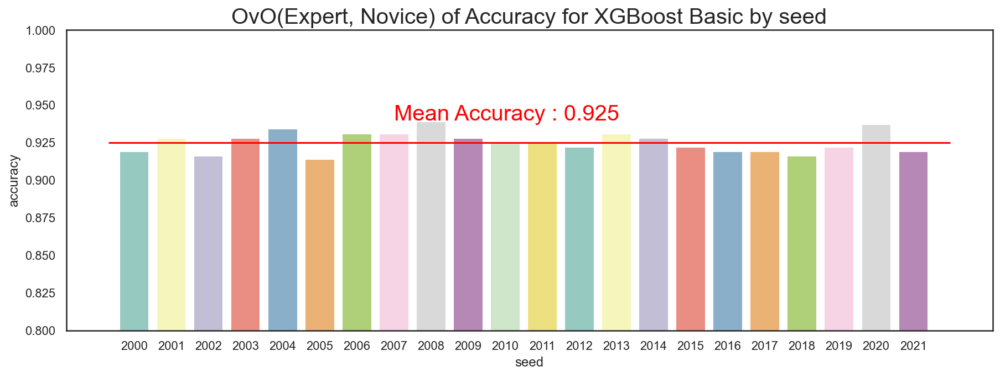

In [376]:
with sns.axes_style('white'):
    plt.figure(figsize=(15,5))
    plt.ylim(0.8, 1)
    sns.barplot(x = "seed", y = "accuracy", data = acc_df, palette='Set3')
    plt.title("OvO(Expert, Novice) of Accuracy for XGBoost Basic by seed", fontsize = 20)
    plt.hlines(round(np.mean(acc_df.accuracy), 3), -0.7, 22, color='red')
    plt.text(7, 0.94,'Mean Accuracy : 0.925', fontdict = {'fontsize' : 20}, color = 'red')

In [377]:
seeds[acc_ls.index(max(acc_ls))]

2008

In [378]:
themodel = xgboost.XGBClassifier(booster='gbtree', learning_rate = 0.1, n_estimators = 100, max_depth = 3, min_child_weight = 1, gamma = 0.1, subsample = 0.5, colsample_bytree = 0.5, alpha = 0.001, use_label_encoder=False, seed = seeds[acc_ls.index(max(acc_ls))])

fit_params={"early_stopping_rounds": 60, 
        "eval_metric" : "aucpr", 
        "eval_set" : [[Third_X_val, Third_y_val]]}

themodel.fit(Third_X_train, Third_y_train, **fit_params)

y_predict=themodel.predict(Third_X_test)

y_predict_prob = themodel.predict_proba(Third_X_test)

[0]	validation_0-aucpr:0.82803
[1]	validation_0-aucpr:0.87745
[2]	validation_0-aucpr:0.93403
[3]	validation_0-aucpr:0.94170
[4]	validation_0-aucpr:0.95534
[5]	validation_0-aucpr:0.95976
[6]	validation_0-aucpr:0.96358
[7]	validation_0-aucpr:0.96498
[8]	validation_0-aucpr:0.96504
[9]	validation_0-aucpr:0.96264
[10]	validation_0-aucpr:0.96374
[11]	validation_0-aucpr:0.96432
[12]	validation_0-aucpr:0.96390
[13]	validation_0-aucpr:0.96587
[14]	validation_0-aucpr:0.96740
[15]	validation_0-aucpr:0.96538
[16]	validation_0-aucpr:0.96565
[17]	validation_0-aucpr:0.96505
[18]	validation_0-aucpr:0.96474
[19]	validation_0-aucpr:0.96340
[20]	validation_0-aucpr:0.96265
[21]	validation_0-aucpr:0.96219
[22]	validation_0-aucpr:0.96369
[23]	validation_0-aucpr:0.96253
[24]	validation_0-aucpr:0.96248
[25]	validation_0-aucpr:0.96232
[26]	validation_0-aucpr:0.96291
[27]	validation_0-aucpr:0.96188
[28]	validation_0-aucpr:0.96343
[29]	validation_0-aucpr:0.96668
[30]	validation_0-aucpr:0.96619
[31]	validation_0-


정확도: 0.9395
정밀도: 0.9348
재현율: 0.9149
F1: 0.9247
ROC AUC: 0.9356
Average Precision: 0.8898


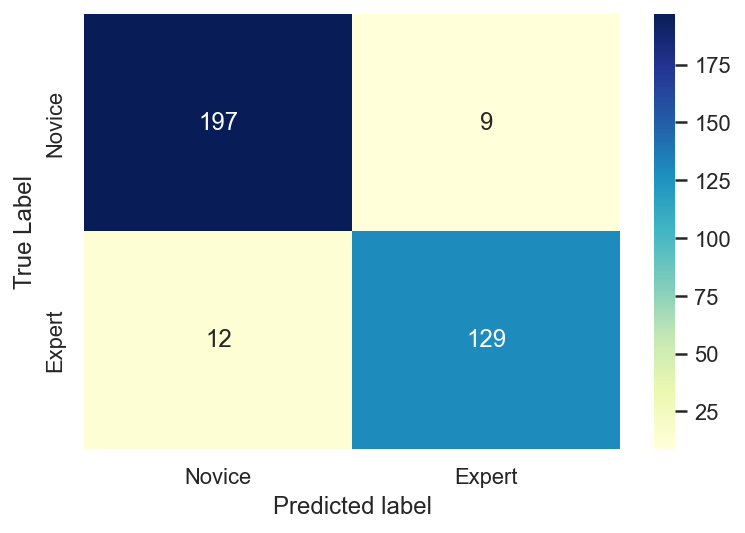

In [379]:
LABELS = ['Novice', 'Expert']

sns.heatmap(confusion_matrix(Third_y_test,y_predict),annot=True,xticklabels=LABELS,
            yticklabels=LABELS,fmt='d',cmap='YlGnBu')
plt.xlabel('Predicted label')
plt.ylabel('True Label')
get_clf_eval(Third_y_test, y_predict)

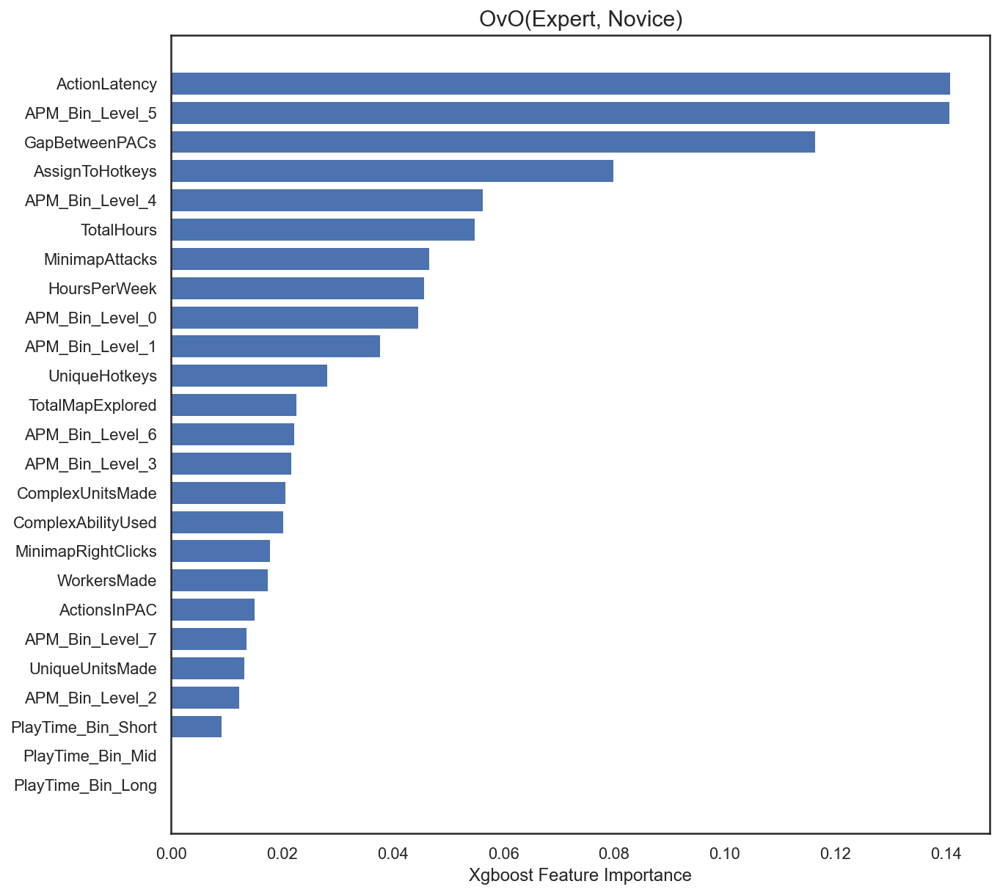

In [380]:
with sns.axes_style('white'):
    plt.figure(figsize=(10,10))
    sorted_idx = themodel.feature_importances_.argsort()
    plt.barh(list(Third_X_train.columns[sorted_idx]), themodel.feature_importances_[sorted_idx])
    plt.title("OvO(Expert, Novice)", fontdict = {'fontsize' : 15})
    plt.xlabel("Xgboost Feature Importance")